# **Facial Emotion Detection**


---
## **Context**
---

Deep learning has been increasingly applied to tasks involving less structured data types like images, texts, audio, and video in recent years. These endeavors often aim to achieve human-like proficiency in processing such data, leveraging our innate ability to intelligently interact with complex, unstructured information. Within the realm of AI, a field known as Artificial Emotional Intelligence, or Emotion AI, focuses on creating technologies that can understand human emotions by analyzing body language, facial expressions, and voice tones, and respond to them effectively.

Recognizing facial expressions plays a vital role in human-computer interaction. Research indicates that facial expressions and other visual signals account for about 55% of how we convey emotions. Thus, developing a model capable of accurately recognizing facial emotions is a significant stride toward equipping machines with AI that exhibits emotionally intelligent behavior. Systems that can automatically recognize facial expressions have a broad range of potential applications, from understanding human behavior to diagnosing psychological conditions, and improving the interaction quality of virtual assistants in customer service settings.

---

## **Objective**

---

The goal of this project is to use Deep Learning and Artificial Intelligence techniques to create a computer vision model that can accurately detect facial emotions. The model should be able to perform multi-class classification on images of facial expressions, to classify the expressions according to the associated emotion.

---

## **Key Questions**

---

Throughout the project, we will be answering the following questions:

- How accurately can the deep learning model identify and classify different facial emotions (happy, sad, surprise, neutral) from images?
- How well does the model generalize to new, unseen images? Can it maintain high accuracy across the test, train, and validation datasets?
- How does the different model architectures compare in terms of accuracy to classify the different emotions?
- What are the potential applications of the developed model, and what implications might its deployment have in some industry fields?

---

## **Problem Formulation**

---

We are tasked with leveraging Deep Learning techniques to develop a computer vision model capable of accurately detecting and classifying facial emotions. The model needs to distinguish between four specific emotions (happy, sad, surprise, neutral) based on images of facial expressions. This task involves multi-class classification, requiring the model to predict the correct category of emotion for each image it processes.

---

## **About the dataset**

---

The data set consists of 3 folders, i.e., 'test', 'train', and 'validation'.
Each of these folders has four subfolders:

**‘happy’**: Images of people who have happy facial expressions.<br>
**‘sad’**: Images of people with sad or upset facial expressions.<br>
**‘surprise’**: Images of people who have shocked or surprised facial expressions.<br>
**‘neutral’**: Images of people showing no prominent emotion in their facial expression at all.<br>


## **Mounting the Drive**

**NOTE:** Please use Google Colab from your browser for this notebook. **Google.colab is NOT a library that can be downloaded locally on your device.**


In [1]:
# from google.colab import drive
# drive.mount("/content/drive")

## **Importing the Libraries**


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import zipfile
import random
from PIL import Image
from typing import List
from datetime import datetime

# For Data Visualization
import seaborn as sns

# For Model Building
import tensorflow as tf
import keras
from tensorflow.keras.models import Sequential, Model  # Sequential API for sequential model
from tensorflow.keras.layers import Dense, Dropout, Flatten  # Importing different layers
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras import backend
from tensorflow.keras.optimizers import Adam, SGD  # Optimizers for optimizing the model
from tensorflow.keras.callbacks import EarlyStopping  # Regularization method to prevent the overfitting
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.applications.resnet_v2 import ResNet50V2, preprocess_input
from keras.applications.efficientnet import EfficientNetB0, preprocess_input

2024-03-19 08:07:35.085394: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-19 08:07:35.085416: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-19 08:07:35.085959: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-19 08:07:35.089380: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


2024-03-19 08:07:35.614353: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### **Let us load and unzip the data**


**Note:**

- You must download the dataset from the link provided on Olympus and upload the same on your Google drive before executing the code in the next cell.
- In case of any error, please make sure that the path of the file is correct as the path may be different for you.


In [3]:
# Storing the path of the data file from the Google drive
# path = "/content/drive/MyDrive/Studies/MIT-AI-ML/11. Capstone Project/Facial_emotion_images.zip"

# The data is provided as a zip file so we need to extract the files from the zip file
# with zipfile.ZipFile(path, "r") as zip_ref:
#    zip_ref.extractall()

## **Preparing the Data**

The dataset has three folders, i.e., 'train', 'validation' and 'test'. Each of these folders has four sub-folders, namely 'happy', 'neutral', 'sad', and 'surprise'.

We will have the train and test path stored in a variable named 'SUBDIRS', and a base directory 'DATADIR'.

The names of the sub-folders, which will be the classes for our classification task will be stored in an array called 'CATEGORIES'.


In [4]:
DATADIR = "/home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/Facial_emotion_images"
# DATADIR = "/content/Facial_emotion_images"  # Base directory
SUBDIRS = ["train", "validation", "test"]  # Subdirectories
CATEGORIES = ["happy", "neutral", "sad", "surprise"]  # Emotion categories

We are going to check the size of one image, and then check if all the other images have the same size. In case, they are different, we'll resize the ones that are different.


In [5]:
def get_first_image_size(directory, sub_dirs, categories):
    """
    Returns the size of the first image found in the specified directories.

    Parameters:
    - directory (str): The base directory of the dataset.
    - sub_dirs (list of str): Subdirectories to search through (e.g., ['train', 'validation', 'test']).
    - categories (list of str): Categories (e.g., ['happy', 'neutral', 'sad', 'surprise']).

    Returns:
    - tuple: Size of the first image found (width, height).
    """
    for sub_dir in sub_dirs:
        for category in categories:
            path = os.path.join(directory, sub_dir, category)
            for img_name in os.listdir(path):
                img_path = os.path.join(path, img_name)
                with Image.open(img_path) as img:
                    return img.size  # Return the size of the first image found

In [6]:
# Get the size of the first image
expected_size = get_first_image_size(DATADIR, SUBDIRS, CATEGORIES)

print(f"Expected size of the first image: {expected_size}")

Expected size of the first image: (48, 48)


In [7]:
def check_image_sizes(directory, sub_dirs, categories, target_size):
    """
    Checks if all images in the specified directories match the target size.

    Parameters:
    - directory (str): The base directory of the dataset.
    - sub_dirs (list of str): Subdirectories to search through.
    - categories (list of str): Categories to search through.
    - target_size (tuple): The expected size of the images (width, height).

    Returns:
    - bool: True if all images match the target size, False otherwise.
    """
    all_match = True  # Flag to keep track of size match

    for sub_dir in sub_dirs:
        for category in categories:
            path = os.path.join(directory, sub_dir, category)
            for img_name in os.listdir(path):
                img_path = os.path.join(path, img_name)
                with Image.open(img_path) as img:
                    if img.size != target_size:
                        print(f"Image {img_path} has a different size: {img.size}, expected: {target_size}")
                        all_match = False
                        return all_match  # Return early upon first mismatch
    return all_match

In [8]:
# Check if all images match the expected size
all_match = check_image_sizes(DATADIR, SUBDIRS, CATEGORIES, expected_size)
if all_match:
    print("All images match the expected size.")
else:
    print("Not all images match the expected size.")

All images match the expected size.


## **Visualizing our Classes**

Let's look at our classes.

**Write down your observation for each class. What do you think can be a unique feature of each emotion, that separates it from the remaining classes?**


In [9]:
def visualize_emotion_images(directory: str, sub_dirs: List[str], emotion: str, image_count: int = 9) -> None:
    """
    Visualizes a specified number of images from a given emotion class directory across specified subdirectories.

    Parameters:
    - directory (str): The base directory where emotion class folders are located across subdirectories.
    - sub_dirs (List[str]): List of subdirectories ('train', 'validation', 'test') to search through.
    - emotion (str): The specific emotion class to visualize images from.
    - image_count (int): The number of images to display. Defaults to 9.

    Returns:
    - None: This function does not return any value but displays images inline.
    """
    image_paths: List[str] = []  # To store paths of images to be displayed

    # Iterate through the specified subdirectories to collect image paths
    for sub_dir in sub_dirs:
        emotion_dir: str = os.path.join(directory, sub_dir, emotion)
        if os.path.isdir(emotion_dir):
            for img_name in os.listdir(emotion_dir):
                img_path = os.path.join(emotion_dir, img_name)
                image_paths.append(img_path)

    # If there are no images found for the emotion, print a message and return
    if not image_paths:
        print(f"No images found for the specified emotion: {emotion}")
        return

    # Select a random subset of image paths
    selected_image_paths: np.ndarray = np.random.choice(image_paths, min(image_count, len(image_paths)), replace=False)

    # Setup for plotting
    fig = plt.figure(figsize=(4, 4))
    columns: int = 3
    rows: int = image_count // columns + (1 if image_count % columns else 0)

    # Iterate over the selected images and display them
    for i, image_path in enumerate(selected_image_paths, start=1):
        ax = fig.add_subplot(rows, columns, i)
        image = load_img(image_path, target_size=(48, 48))  # Ensure the image is resized to 48x48
        plt.imshow(image)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

### **Happy**


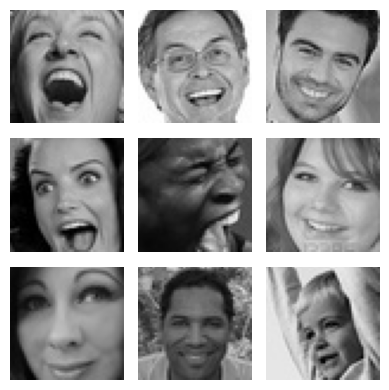

In [10]:
visualize_emotion_images(DATADIR, SUBDIRS, "happy", 9)

**Observations and Insights:**

- The images appear to be in grayscale and vary in terms of lighting, contrast, and clarity.

- The images display a range of happy expressions, from broad smiles showing teeth to subtle smiles without teeth. Also a diversity of subjects in terms of age, gender and also ethnicity.


### **Sad**


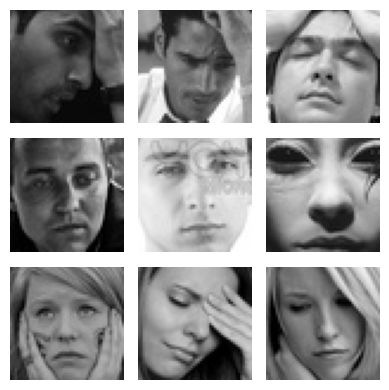

In [11]:
visualize_emotion_images(DATADIR, SUBDIRS, "sad", 9)

**Observations and Insights:**

- The images capture a wide spectrum of sadness, from subtle, somber expressions to more overt manifestations like crying.
- The dataset includes faces with different orientations and features. Some faces are directly looking at the camera, while others are tilted or partially turned away.


### **Neutral**


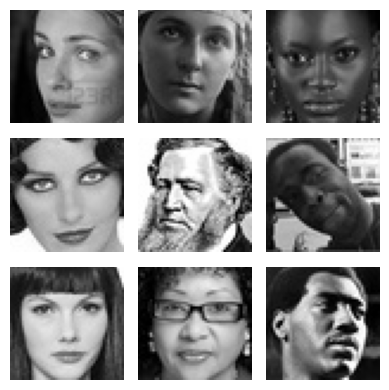

In [12]:
visualize_emotion_images(DATADIR, SUBDIRS, "neutral", 9)

**Observations and Insights:**

- The defining characteristic of these images is the absence of clear, expressive features that denote a specific emotion.
- Some faces may have subtle features that could be misconstrued as expressing a mild emotion.


### **Surprised**


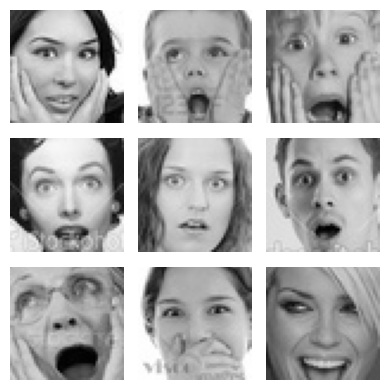

In [13]:
visualize_emotion_images(DATADIR, SUBDIRS, "surprise", 9)

**Observations and Insights:**

- The images showcase a range of intensities of surprise, from wide-eyed and open-mouthed expressions to more subdued, raised-eyebrow looks.
- The subjects vary in age, including both infants and adults.


## **Checking Distribution of Classes**


In [14]:
# Function to count images in each category
def count_images(data_dir, categories):
    counts = []
    for category in categories:
        path = os.path.join(data_dir, category)
        count = len([name for name in os.listdir(path) if os.path.isfile(os.path.join(path, name))])
        counts.append(count)
    return counts


SUBDIRS_DICT = {"train": "train", "validation": "validation", "test": "test"}

# Counting images in each dataset
train_counts = count_images(os.path.join(DATADIR, SUBDIRS_DICT["train"]), CATEGORIES)
validation_counts = count_images(os.path.join(DATADIR, SUBDIRS_DICT["validation"]), CATEGORIES)
test_counts = count_images(os.path.join(DATADIR, SUBDIRS_DICT["test"]), CATEGORIES)


# Create DataFrames and format for easier reading
def create_df(counts, categories, dataset_name):
    df = pd.DataFrame({"Class": categories, "Count": counts})
    df["Percentage"] = (df["Count"] / df["Count"].sum()) * 100
    df.set_index("Class", inplace=True)

    # Formatting for easier reading
    df["Count"] = df["Count"].apply(lambda x: f"{x:,}")  # Adds commas to thousands
    df["Percentage"] = df["Percentage"].apply(lambda x: f"{x:.2f}")  # Rounds to two decimals

    print(f"{dataset_name} Data Distribution:")
    print(df)
    total_images = df["Count"].str.replace(",", "").astype(int).sum()
    print(f"Total images in {dataset_name}: {total_images:,}\n")  # Formats total count with commas


create_df(train_counts, CATEGORIES, "Training")
create_df(validation_counts, CATEGORIES, "Validation")
create_df(test_counts, CATEGORIES, "Testing")

Training Data Distribution:
          Count Percentage
Class                     
happy     3,976      26.32
neutral   3,978      26.33
sad       3,982      26.36
surprise  3,173      21.00
Total images in Training: 15,109

Validation Data Distribution:
          Count Percentage
Class                     
happy     1,825      36.67
neutral   1,216      24.43
sad       1,139      22.89
surprise    797      16.01
Total images in Validation: 4,977

Testing Data Distribution:
         Count Percentage
Class                    
happy       32      25.00
neutral     32      25.00
sad         32      25.00
surprise    32      25.00
Total images in Testing: 128



**Observations and Insights:**

- Training Data: The training dataset shows a relatively balanced distribution among the classes of 'happy', 'neutral', and 'sad', each comprising approximately 26% of the dataset. However, 'surprise' is slightly underrepresented, making up 21% of the data. We'll see on the results if this is noticeable.
- Validation Data: In the validation dataset, there's a more pronounced imbalance. 'Happy' expressions dominate at 36.67%, followed by 'neutral' at 24.43%, 'sad' at 22.89%, and 'surprise' at 16.01%. This distribution deviates more significantly from an even split, indicating a potential bias towards 'happy' expressions.
- Testing Data: The testing dataset is perfectly balanced, with each class representing 25% of the data. This uniform distribution is ideal for evaluating the model's performance across all classes evenly.

Regarding the Exploratory Data Analysis, we can use data augmentation to balance the classes. For now, we'll see the results with the given dataset, and if necessary, we can adjust that.


**Think About It:**

- Are the classes equally distributed? If not, do you think the imbalance is too high? Will it be a problem as we progress?
- Are there any Exploratory Data Analysis tasks that we can do here? Would they provide any meaningful insights?


## **Creating our Data Loaders**

In this section, we are creating data loaders that we will use as inputs to our Neural Network.

**You have two options for the color_mode. You can set it to color_mode = 'rgb' or color_mode = 'grayscale'. You will need to try out both and see for yourself which one gives better performance.**


In [15]:
# Set this to 'grayscale' as the images are in grayscale
color_mode = "grayscale"

# As we have checked, all images are 48x48, we will set the img_width and img_height to 48
img_width, img_height = 48, 48
color_layers = 1
# A batch size of 32 is appropriate for this dataset provide to provide a good balance
# between the model's ability to generalize (avoid overfitting) and computational efficiency.
batch_size = 32

# Training Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,  # Normalize pixel values to [0,1]
    rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    shear_range=0.1,  # Small shear transformations for slight perspective changes
    zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
    horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    fill_mode="nearest",  # 'nearest' interpolation for filling in new pixels after a transformation
)

# Validation and Testing Data should not be augmented!
validation_datagen = ImageDataGenerator(rescale=1.0 / 255)
test_datagen = ImageDataGenerator(rescale=1.0 / 255)

# Assuming train_dir, validation_dir, and test_dir should follow the structure in DATADIR and SUBDIRS
train_dir = os.path.join(DATADIR, SUBDIRS_DICT["train"])
validation_dir = os.path.join(DATADIR, SUBDIRS_DICT["validation"])
test_dir = os.path.join(DATADIR, SUBDIRS_DICT["test"])

# Train Generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
)

# Validation Generator
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
)

# Testing Generator
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for testing
)

Found 15109 images belonging to 4 classes.


Found 4977 images belonging to 4 classes.


Found 128 images belonging to 4 classes.


Let's look at some examples of a batch of augmented training data.


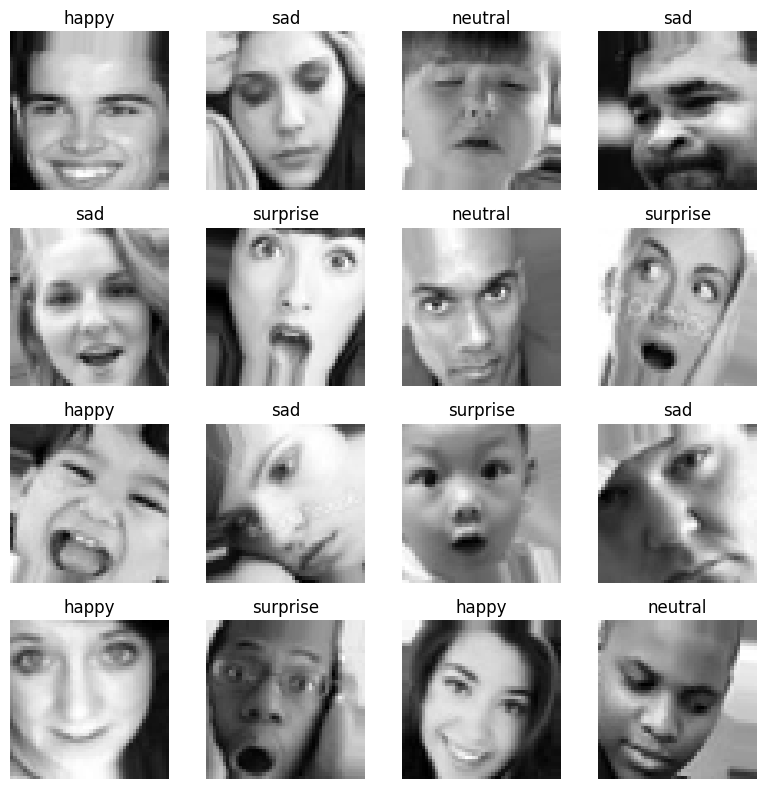

In [16]:
# Fetch a batch of images and labels
images, labels = next(train_generator)

# Assuming the labels are one-hot encoded, we need to convert them back to class indices
labels_indices = labels.argmax(axis=1)

# Mapping of indices to class names, based on the 'class_indices' attribute of the generator
index_to_class = {v: k for k, v in train_generator.class_indices.items()}

fig, axes = plt.subplots(4, 4, figsize=(8, 8))
for image, label_index, ax in zip(images, labels_indices, axes.flatten()):
    ax.imshow(image.squeeze(), cmap="gray")  # Squeeze and cmap for grayscale
    class_name = index_to_class[label_index]
    ax.set_title(class_name)
    ax.axis("off")

plt.tight_layout()
plt.show()

## **Model Building**


**Think About It:**

- Are Convolutional Neural Networks the right approach? Should we have gone with Artificial Neural Networks instead?
- What are the advantages of CNNs over ANNs and are they applicable here?


### **Creating the Base Neural Network**


### **Model 1 Architecture:**

- First CNN Model will have three convolutional blocks.
- Each convolutional block will have a Conv2D layer and a MaxPooling2D Layer.
- First Conv2D layer with **64 filters** and a **kernel size of 3x3**. Using the **'same' padding** and providing the **input shape = (48, 48, 1)**. Using **'relu' activation**.
- Adding MaxPooling2D layer with **kernel size 3x3** and using **padding = 'same'**.
- Adding a second Conv2D layer with **32 filters** and **a kernel size of 3x3**. Using the **'same' padding** and **'relu activation**.
- Following it up with another MaxPooling2D layer **kernel size 3x3** and using **padding = 'same'**.
- Adding a third Conv2D layer with **32 filters and the kernel size of 3x3**. Using the **'same' padding** and **'relu activation**. Once again, following it up with another Maxpooling2D layer with **kernel size 3x3** and **padding = 'same'**.
- Once the convolutional blocks are added, we add the Flatten layer.
- Finally, we add dense layers.
- Adding first Dense layer with **100 neurons** and **'relu' activation**
- The last dense layer needs to have as many neurons as the number of classes, which in this case is 4 and use **'softmax' activation**.
- As an optimizer we will use SGD optimizer with **learning rate = 0.01** and **momentum = 0.9**


In [17]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [18]:
# Intializing a sequential model
model_1 = Sequential()

# Adding first conv layer with 64 filters and kernel size 3x3, padding 'same' provides the output size same as the input size
# The input_shape denotes input image dimension
model_1.add(Conv2D(64, (3, 3), activation="relu", padding="same", input_shape=(img_width, img_height, color_layers)))

# Adding max pooling to reduce the size of output of first conv layer
model_1.add(MaxPooling2D((2, 2), padding="same"))

# Adding second conv layer with 32 filters and kernel size 3x3, padding 'same' followed by a Maxpooling2D layer
model_1.add(Conv2D(32, (3, 3), activation="relu", padding="same"))
model_1.add(MaxPooling2D((2, 2), padding="same"))

# Add third conv layer with 32 filters and kernel size 3x3, padding 'same' followed by a Maxpooling2D layer
model_1.add(Conv2D(32, (3, 3), activation="relu", padding="same"))
model_1.add(MaxPooling2D((2, 2), padding="same"))

# Flattening the output of the conv layer after max pooling to make it ready for creating dense connections
model_1.add(Flatten())

# Adding a fully connected dense layer with 100 neurons
model_1.add(Dense(100, activation="relu"))

# Adding the output layer with 3 neurons and activation functions as softmax since this is a multi-class classification problem
model_1.add(Dense(4, activation="softmax"))

# Using SGD Optimizer
opt = SGD(learning_rate=0.01, momentum=0.9)

2024-03-19 08:07:39.018081: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-03-19 08:07:39.040572: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-03-19 08:07:39.040751: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

### **Compiling and Training the Model**


In [19]:
# Compiling the model
model_1.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["accuracy"])

# Generating the summary of the model
model_1.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 conv2d (Conv2D)             (None, 48, 48, 64)        640       


 max_pooling2d (MaxPooling2  (None, 24, 24, 64)        0         


 D)                                                              


 conv2d_1 (Conv2D)           (None, 24, 24, 32)        18464     


 max_pooling2d_1 (MaxPoolin  (None, 12, 12, 32)        0         


 g2D)                                                            


 conv2d_2 (Conv2D)           (None, 12, 12, 32)        9248      


 max_pooling2d_2 (MaxPoolin  (None, 6, 6, 32)          0         


 g2D)                                                            


 flatten (Flatten)           (None, 1152)              0         


 dense (Dense)               (None, 100)               115300    


 dense_1 (Dense)             (None, 4)                 404       


Total params: 144056 (562.72 KB)


Trainable params: 144056 (562.72 KB)


Non-trainable params: 0 (0.00 Byte)


_________________________________________________________________


In [20]:
# results_path = "/content/drive/MyDrive/Studies/MIT-AI-ML/11. Capstone Project/results"
results_path = "/home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results"

In [21]:
class DelayedEarlyStopping(EarlyStopping):
    """Stop training when a monitored metric has stopped improving after a certain number of epochs.

    Arguments:
        monitor: Quantity to be monitored.
        min_delta: Minimum change in the monitored quantity to qualify as an improvement,
                   i.e., an absolute change of less than min_delta will count as no improvement.
        patience: Number of epochs with no improvement after which training will be stopped.
        verbose: Verbosity mode.
        mode: One of `{'auto', 'min', 'max'}`. In `min` mode, training will stop when the
              quantity monitored has stopped decreasing; in `max` mode it will stop when the
              quantity monitored has stopped increasing; in `auto` mode, the direction is
              automatically inferred from the name of the monitored quantity.
        baseline: Baseline value for the monitored quantity. Training will stop if the model
                  doesn't show improvement over the baseline.
        restore_best_weights: Whether to restore model weights from the epoch with the best value
                              of the monitored quantity.
        start_epoch: The epoch on which to start considering early stopping. Before this epoch,
                     early stopping will not be considered. This ensures that early stopping
                     checks only after a certain number of epochs.
    """

    def __init__(
        self,
        monitor="val_loss",
        min_delta=0,
        patience=0,
        verbose=0,
        mode="auto",
        baseline=None,
        restore_best_weights=False,
        start_epoch=30,
    ):
        super(DelayedEarlyStopping, self).__init__(
            monitor=monitor,
            min_delta=min_delta,
            patience=patience,
            verbose=verbose,
            mode=mode,
            baseline=baseline,
            restore_best_weights=restore_best_weights,
        )
        self.start_epoch = start_epoch

    def on_epoch_end(self, epoch, logs=None):
        # Override the original `on_epoch_end` method to include `start_epoch` logic.

        # If the current epoch is less than the start epoch, skip the early stopping check
        if epoch < self.start_epoch:
            return

        # Call the parent class method to perform the regular early stopping checks after the start epoch
        super(DelayedEarlyStopping, self).on_epoch_end(epoch, logs)


# Usage of DelayedEarlyStopping
# Define the EarlyStopping callback with a start epoch
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=10, verbose=1, restore_best_weights=True, start_epoch=30
)

In [22]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 30 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=30
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)
mc = ModelCheckpoint(
    f"{results_path}/best_model_1_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_1 = model_1.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[delayed_early_stopping, mc, reduce_lr],
)

Epoch 1/40


2024-03-19 08:07:39.805605: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902


2024-03-19 08:07:40.080834: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f2b991b1220 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-03-19 08:07:40.080852: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3070, Compute Capability 8.6
I0000 00:00:1710835660.123365  109773 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


  1/473 [..............................] - ETA: 9:47 - loss: 1.3803 - accuracy: 0.2812

  7/473 [..............................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2366  

 11/473 [..............................] - ETA: 5s - loss: 1.3869 - accuracy: 0.2216

 17/473 [>.............................] - ETA: 4s - loss: 1.3857 - accuracy: 0.2132

 23/473 [>.............................] - ETA: 4s - loss: 1.3841 - accuracy: 0.2255

 29/473 [>.............................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2371

 35/473 [=>............................] - ETA: 4s - loss: 1.3864 - accuracy: 0.2357

 41/473 [=>............................] - ETA: 4s - loss: 1.3860 - accuracy: 0.2424

 47/473 [=>............................] - ETA: 4s - loss: 1.3855 - accuracy: 0.2434

 53/473 [==>...........................] - ETA: 4s - loss: 1.3845 - accuracy: 0.2535

 59/473 [==>...........................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2537

 65/473 [===>..........................] - ETA: 3s - loss: 1.3839 - accuracy: 0.2558

 71/473 [===>..........................] - ETA: 3s - loss: 1.3833 - accuracy: 0.2562

 77/473 [===>..........................] - ETA: 3s - loss: 1.3840 - accuracy: 0.2569

 83/473 [====>.........................] - ETA: 3s - loss: 1.3836 - accuracy: 0.2579

 89/473 [====>.........................] - ETA: 3s - loss: 1.3834 - accuracy: 0.2612

 95/473 [=====>........................] - ETA: 3s - loss: 1.3831 - accuracy: 0.2628

101/473 [=====>........................] - ETA: 3s - loss: 1.3825 - accuracy: 0.2633

107/473 [=====>........................] - ETA: 3s - loss: 1.3818 - accuracy: 0.2664

113/473 [======>.......................] - ETA: 3s - loss: 1.3817 - accuracy: 0.2669

119/473 [======>.......................] - ETA: 3s - loss: 1.3812 - accuracy: 0.2692

125/473 [======>.......................] - ETA: 3s - loss: 1.3814 - accuracy: 0.2673

131/473 [=======>......................] - ETA: 3s - loss: 1.3804 - accuracy: 0.2724

137/473 [=======>......................] - ETA: 3s - loss: 1.3801 - accuracy: 0.2751

143/473 [========>.....................] - ETA: 3s - loss: 1.3797 - accuracy: 0.2753

149/473 [========>.....................] - ETA: 3s - loss: 1.3791 - accuracy: 0.2745

155/473 [========>.....................] - ETA: 3s - loss: 1.3781 - accuracy: 0.2762

161/473 [=========>....................] - ETA: 3s - loss: 1.3777 - accuracy: 0.2758

165/473 [=========>....................] - ETA: 3s - loss: 1.3772 - accuracy: 0.2759

169/473 [=========>....................] - ETA: 2s - loss: 1.3766 - accuracy: 0.2759

175/473 [==========>...................] - ETA: 2s - loss: 1.3759 - accuracy: 0.2775

181/473 [==========>...................] - ETA: 2s - loss: 1.3757 - accuracy: 0.2768

187/473 [==========>...................] - ETA: 2s - loss: 1.3743 - accuracy: 0.2796

193/473 [===========>..................] - ETA: 2s - loss: 1.3743 - accuracy: 0.2803

199/473 [===========>..................] - ETA: 2s - loss: 1.3751 - accuracy: 0.2800

205/473 [============>.................] - ETA: 2s - loss: 1.3742 - accuracy: 0.2800

211/473 [============>.................] - ETA: 2s - loss: 1.3734 - accuracy: 0.2810

217/473 [============>.................] - ETA: 2s - loss: 1.3725 - accuracy: 0.2843

223/473 [=============>................] - ETA: 2s - loss: 1.3717 - accuracy: 0.2862

229/473 [=============>................] - ETA: 2s - loss: 1.3725 - accuracy: 0.2855

235/473 [=============>................] - ETA: 2s - loss: 1.3721 - accuracy: 0.2864

241/473 [==============>...............] - ETA: 2s - loss: 1.3719 - accuracy: 0.2873

247/473 [==============>...............] - ETA: 2s - loss: 1.3713 - accuracy: 0.2880

253/473 [===============>..............] - ETA: 2s - loss: 1.3705 - accuracy: 0.2889

259/473 [===============>..............] - ETA: 2s - loss: 1.3706 - accuracy: 0.2891

265/473 [===============>..............] - ETA: 2s - loss: 1.3706 - accuracy: 0.2901

271/473 [================>.............] - ETA: 1s - loss: 1.3696 - accuracy: 0.2912

277/473 [================>.............] - ETA: 1s - loss: 1.3691 - accuracy: 0.2921

283/473 [================>.............] - ETA: 1s - loss: 1.3694 - accuracy: 0.2917

289/473 [=================>............] - ETA: 1s - loss: 1.3692 - accuracy: 0.2918

295/473 [=================>............] - ETA: 1s - loss: 1.3703 - accuracy: 0.2922

301/473 [==================>...........] - ETA: 1s - loss: 1.3696 - accuracy: 0.2943

307/473 [==================>...........] - ETA: 1s - loss: 1.3695 - accuracy: 0.2942

313/473 [==================>...........] - ETA: 1s - loss: 1.3695 - accuracy: 0.2946

319/473 [===================>..........] - ETA: 1s - loss: 1.3692 - accuracy: 0.2955

325/473 [===================>..........] - ETA: 1s - loss: 1.3687 - accuracy: 0.2962

331/473 [===================>..........] - ETA: 1s - loss: 1.3686 - accuracy: 0.2965

337/473 [====================>.........] - ETA: 1s - loss: 1.3677 - accuracy: 0.2982

343/473 [====================>.........] - ETA: 1s - loss: 1.3668 - accuracy: 0.2998

349/473 [=====================>........] - ETA: 1s - loss: 1.3664 - accuracy: 0.3004

355/473 [=====================>........] - ETA: 1s - loss: 1.3656 - accuracy: 0.3015

361/473 [=====================>........] - ETA: 1s - loss: 1.3646 - accuracy: 0.3018

366/473 [======================>.......] - ETA: 1s - loss: 1.3641 - accuracy: 0.3024

372/473 [======================>.......] - ETA: 0s - loss: 1.3638 - accuracy: 0.3030

376/473 [======================>.......] - ETA: 1s - loss: 1.3636 - accuracy: 0.3031

384/473 [=======================>......] - ETA: 0s - loss: 1.3632 - accuracy: 0.3033

389/473 [=======================>......] - ETA: 0s - loss: 1.3630 - accuracy: 0.3034

395/473 [========================>.....] - ETA: 0s - loss: 1.3628 - accuracy: 0.3037

401/473 [========================>.....] - ETA: 0s - loss: 1.3627 - accuracy: 0.3034

407/473 [========================>.....] - ETA: 0s - loss: 1.3624 - accuracy: 0.3031

413/473 [=========================>....] - ETA: 0s - loss: 1.3616 - accuracy: 0.3040

419/473 [=========================>....] - ETA: 0s - loss: 1.3617 - accuracy: 0.3046

425/473 [=========================>....] - ETA: 0s - loss: 1.3605 - accuracy: 0.3056

431/473 [==========================>...] - ETA: 0s - loss: 1.3605 - accuracy: 0.3060

437/473 [==========================>...] - ETA: 0s - loss: 1.3611 - accuracy: 0.3050

443/473 [===========================>..] - ETA: 0s - loss: 1.3608 - accuracy: 0.3060

449/473 [===========================>..] - ETA: 0s - loss: 1.3606 - accuracy: 0.3067

455/473 [===========================>..] - ETA: 0s - loss: 1.3604 - accuracy: 0.3068

460/473 [============================>.] - ETA: 0s - loss: 1.3602 - accuracy: 0.3069

466/473 [============================>.] - ETA: 0s - loss: 1.3597 - accuracy: 0.3078

472/473 [============================>.] - ETA: 0s - loss: 1.3592 - accuracy: 0.3089


Epoch 1: val_accuracy improved from -inf to 0.34375, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240319-080739.keras


473/473 [==============================] - 6s 11ms/step - loss: 1.3592 - accuracy: 0.3090 - val_loss: 1.3838 - val_accuracy: 0.3438 - lr: 0.0100


Epoch 2/40


  1/473 [..............................] - ETA: 7s - loss: 1.3923 - accuracy: 0.3125

  7/473 [..............................] - ETA: 4s - loss: 1.3305 - accuracy: 0.3527

 13/473 [..............................] - ETA: 4s - loss: 1.3362 - accuracy: 0.3510

 19/473 [>.............................] - ETA: 4s - loss: 1.3358 - accuracy: 0.3569

 25/473 [>.............................] - ETA: 4s - loss: 1.3431 - accuracy: 0.3438

 31/473 [>.............................] - ETA: 4s - loss: 1.3446 - accuracy: 0.3337

 37/473 [=>............................] - ETA: 4s - loss: 1.3397 - accuracy: 0.3438

 43/473 [=>............................] - ETA: 4s - loss: 1.3357 - accuracy: 0.3517

 49/473 [==>...........................] - ETA: 4s - loss: 1.3337 - accuracy: 0.3578

 55/473 [==>...........................] - ETA: 4s - loss: 1.3339 - accuracy: 0.3631

 60/473 [==>...........................] - ETA: 4s - loss: 1.3308 - accuracy: 0.3630

 65/473 [===>..........................] - ETA: 3s - loss: 1.3265 - accuracy: 0.3615

 71/473 [===>..........................] - ETA: 3s - loss: 1.3279 - accuracy: 0.3614

 77/473 [===>..........................] - ETA: 3s - loss: 1.3282 - accuracy: 0.3604

 83/473 [====>.........................] - ETA: 3s - loss: 1.3278 - accuracy: 0.3596

 89/473 [====>.........................] - ETA: 3s - loss: 1.3283 - accuracy: 0.3588

 95/473 [=====>........................] - ETA: 3s - loss: 1.3269 - accuracy: 0.3615

101/473 [=====>........................] - ETA: 3s - loss: 1.3251 - accuracy: 0.3636

107/473 [=====>........................] - ETA: 3s - loss: 1.3241 - accuracy: 0.3648

113/473 [======>.......................] - ETA: 3s - loss: 1.3241 - accuracy: 0.3642

119/473 [======>.......................] - ETA: 3s - loss: 1.3252 - accuracy: 0.3627

125/473 [======>.......................] - ETA: 3s - loss: 1.3231 - accuracy: 0.3638

131/473 [=======>......................] - ETA: 3s - loss: 1.3210 - accuracy: 0.3662

137/473 [=======>......................] - ETA: 3s - loss: 1.3217 - accuracy: 0.3666

143/473 [========>.....................] - ETA: 3s - loss: 1.3195 - accuracy: 0.3700

149/473 [========>.....................] - ETA: 3s - loss: 1.3175 - accuracy: 0.3712

155/473 [========>.....................] - ETA: 3s - loss: 1.3180 - accuracy: 0.3708

161/473 [=========>....................] - ETA: 3s - loss: 1.3181 - accuracy: 0.3715

167/473 [=========>....................] - ETA: 2s - loss: 1.3185 - accuracy: 0.3720

173/473 [=========>....................] - ETA: 2s - loss: 1.3175 - accuracy: 0.3707

179/473 [==========>...................] - ETA: 2s - loss: 1.3173 - accuracy: 0.3708

185/473 [==========>...................] - ETA: 2s - loss: 1.3176 - accuracy: 0.3689

191/473 [===========>..................] - ETA: 2s - loss: 1.3161 - accuracy: 0.3693

197/473 [===========>..................] - ETA: 2s - loss: 1.3170 - accuracy: 0.3691

203/473 [===========>..................] - ETA: 2s - loss: 1.3167 - accuracy: 0.3687

209/473 [============>.................] - ETA: 2s - loss: 1.3158 - accuracy: 0.3693

215/473 [============>.................] - ETA: 2s - loss: 1.3146 - accuracy: 0.3703

221/473 [=============>................] - ETA: 2s - loss: 1.3131 - accuracy: 0.3722

227/473 [=============>................] - ETA: 2s - loss: 1.3138 - accuracy: 0.3710

233/473 [=============>................] - ETA: 2s - loss: 1.3153 - accuracy: 0.3690

239/473 [==============>...............] - ETA: 2s - loss: 1.3150 - accuracy: 0.3691

245/473 [==============>...............] - ETA: 2s - loss: 1.3140 - accuracy: 0.3705

251/473 [==============>...............] - ETA: 2s - loss: 1.3129 - accuracy: 0.3718

257/473 [===============>..............] - ETA: 2s - loss: 1.3124 - accuracy: 0.3718

263/473 [===============>..............] - ETA: 2s - loss: 1.3133 - accuracy: 0.3705

270/473 [================>.............] - ETA: 1s - loss: 1.3129 - accuracy: 0.3706

276/473 [================>.............] - ETA: 1s - loss: 1.3135 - accuracy: 0.3692

282/473 [================>.............] - ETA: 1s - loss: 1.3134 - accuracy: 0.3699

288/473 [=================>............] - ETA: 1s - loss: 1.3130 - accuracy: 0.3704

294/473 [=================>............] - ETA: 1s - loss: 1.3125 - accuracy: 0.3703

300/473 [==================>...........] - ETA: 1s - loss: 1.3117 - accuracy: 0.3710

306/473 [==================>...........] - ETA: 1s - loss: 1.3106 - accuracy: 0.3715

312/473 [==================>...........] - ETA: 1s - loss: 1.3105 - accuracy: 0.3719

318/473 [===================>..........] - ETA: 1s - loss: 1.3102 - accuracy: 0.3711

324/473 [===================>..........] - ETA: 1s - loss: 1.3113 - accuracy: 0.3696

330/473 [===================>..........] - ETA: 1s - loss: 1.3120 - accuracy: 0.3689

336/473 [====================>.........] - ETA: 1s - loss: 1.3117 - accuracy: 0.3696

342/473 [====================>.........] - ETA: 1s - loss: 1.3114 - accuracy: 0.3710

348/473 [=====================>........] - ETA: 1s - loss: 1.3105 - accuracy: 0.3715

354/473 [=====================>........] - ETA: 1s - loss: 1.3093 - accuracy: 0.3727

360/473 [=====================>........] - ETA: 1s - loss: 1.3086 - accuracy: 0.3734

366/473 [======================>.......] - ETA: 1s - loss: 1.3078 - accuracy: 0.3733

372/473 [======================>.......] - ETA: 0s - loss: 1.3077 - accuracy: 0.3735

378/473 [======================>.......] - ETA: 0s - loss: 1.3074 - accuracy: 0.3734

384/473 [=======================>......] - ETA: 0s - loss: 1.3074 - accuracy: 0.3731

390/473 [=======================>......] - ETA: 0s - loss: 1.3061 - accuracy: 0.3748

396/473 [========================>.....] - ETA: 0s - loss: 1.3058 - accuracy: 0.3756

402/473 [========================>.....] - ETA: 0s - loss: 1.3054 - accuracy: 0.3749

408/473 [========================>.....] - ETA: 0s - loss: 1.3054 - accuracy: 0.3745

414/473 [=========================>....] - ETA: 0s - loss: 1.3051 - accuracy: 0.3747

420/473 [=========================>....] - ETA: 0s - loss: 1.3042 - accuracy: 0.3758

426/473 [==========================>...] - ETA: 0s - loss: 1.3040 - accuracy: 0.3757

432/473 [==========================>...] - ETA: 0s - loss: 1.3037 - accuracy: 0.3759

438/473 [==========================>...] - ETA: 0s - loss: 1.3032 - accuracy: 0.3756

443/473 [===========================>..] - ETA: 0s - loss: 1.3029 - accuracy: 0.3763

449/473 [===========================>..] - ETA: 0s - loss: 1.3026 - accuracy: 0.3764

455/473 [===========================>..] - ETA: 0s - loss: 1.3029 - accuracy: 0.3757

461/473 [============================>.] - ETA: 0s - loss: 1.3021 - accuracy: 0.3763

467/473 [============================>.] - ETA: 0s - loss: 1.3012 - accuracy: 0.3769

473/473 [==============================] - ETA: 0s - loss: 1.3009 - accuracy: 0.3769


Epoch 2: val_accuracy did not improve from 0.34375


473/473 [==============================] - 5s 10ms/step - loss: 1.3009 - accuracy: 0.3769 - val_loss: 1.3286 - val_accuracy: 0.3125 - lr: 0.0100


Epoch 3/40


  1/473 [..............................] - ETA: 8s - loss: 1.4958 - accuracy: 0.2812

  7/473 [..............................] - ETA: 4s - loss: 1.3230 - accuracy: 0.3304

 12/473 [..............................] - ETA: 5s - loss: 1.3194 - accuracy: 0.3411

 16/473 [>.............................] - ETA: 5s - loss: 1.3147 - accuracy: 0.3477

 20/473 [>.............................] - ETA: 5s - loss: 1.3173 - accuracy: 0.3469

 24/473 [>.............................] - ETA: 5s - loss: 1.3201 - accuracy: 0.3477

 28/473 [>.............................] - ETA: 5s - loss: 1.3163 - accuracy: 0.3571

 34/473 [=>............................] - ETA: 5s - loss: 1.3175 - accuracy: 0.3612

 40/473 [=>............................] - ETA: 5s - loss: 1.3149 - accuracy: 0.3680

 46/473 [=>............................] - ETA: 4s - loss: 1.2997 - accuracy: 0.3791

 52/473 [==>...........................] - ETA: 4s - loss: 1.3021 - accuracy: 0.3774

 58/473 [==>...........................] - ETA: 4s - loss: 1.2951 - accuracy: 0.3825

 64/473 [===>..........................] - ETA: 4s - loss: 1.2928 - accuracy: 0.3867

 70/473 [===>..........................] - ETA: 4s - loss: 1.2871 - accuracy: 0.3933

 76/473 [===>..........................] - ETA: 4s - loss: 1.2856 - accuracy: 0.3972

 82/473 [====>.........................] - ETA: 4s - loss: 1.2804 - accuracy: 0.4040

 88/473 [====>.........................] - ETA: 4s - loss: 1.2771 - accuracy: 0.4045

 94/473 [====>.........................] - ETA: 3s - loss: 1.2801 - accuracy: 0.4016

100/473 [=====>........................] - ETA: 3s - loss: 1.2751 - accuracy: 0.4041

106/473 [=====>........................] - ETA: 3s - loss: 1.2754 - accuracy: 0.4024

112/473 [======>.......................] - ETA: 3s - loss: 1.2752 - accuracy: 0.4035

118/473 [======>.......................] - ETA: 3s - loss: 1.2735 - accuracy: 0.4028

124/473 [======>.......................] - ETA: 3s - loss: 1.2700 - accuracy: 0.4042

130/473 [=======>......................] - ETA: 3s - loss: 1.2685 - accuracy: 0.4060

136/473 [=======>......................] - ETA: 3s - loss: 1.2646 - accuracy: 0.4088

142/473 [========>.....................] - ETA: 3s - loss: 1.2630 - accuracy: 0.4098

148/473 [========>.....................] - ETA: 3s - loss: 1.2640 - accuracy: 0.4084

154/473 [========>.....................] - ETA: 3s - loss: 1.2624 - accuracy: 0.4087

160/473 [=========>....................] - ETA: 3s - loss: 1.2620 - accuracy: 0.4096

166/473 [=========>....................] - ETA: 3s - loss: 1.2616 - accuracy: 0.4079

172/473 [=========>....................] - ETA: 3s - loss: 1.2618 - accuracy: 0.4082

178/473 [==========>...................] - ETA: 2s - loss: 1.2623 - accuracy: 0.4080

184/473 [==========>...................] - ETA: 2s - loss: 1.2605 - accuracy: 0.4095

190/473 [===========>..................] - ETA: 2s - loss: 1.2601 - accuracy: 0.4104

196/473 [===========>..................] - ETA: 2s - loss: 1.2617 - accuracy: 0.4106

202/473 [===========>..................] - ETA: 2s - loss: 1.2633 - accuracy: 0.4097

208/473 [============>.................] - ETA: 2s - loss: 1.2623 - accuracy: 0.4118

214/473 [============>.................] - ETA: 2s - loss: 1.2614 - accuracy: 0.4127

220/473 [============>.................] - ETA: 2s - loss: 1.2608 - accuracy: 0.4119

226/473 [=============>................] - ETA: 2s - loss: 1.2594 - accuracy: 0.4122

232/473 [=============>................] - ETA: 2s - loss: 1.2573 - accuracy: 0.4142

238/473 [==============>...............] - ETA: 2s - loss: 1.2586 - accuracy: 0.4133

244/473 [==============>...............] - ETA: 2s - loss: 1.2577 - accuracy: 0.4130

249/473 [==============>...............] - ETA: 2s - loss: 1.2563 - accuracy: 0.4137

255/473 [===============>..............] - ETA: 2s - loss: 1.2559 - accuracy: 0.4138

261/473 [===============>..............] - ETA: 2s - loss: 1.2548 - accuracy: 0.4139

267/473 [===============>..............] - ETA: 2s - loss: 1.2545 - accuracy: 0.4128

273/473 [================>.............] - ETA: 1s - loss: 1.2542 - accuracy: 0.4138

279/473 [================>.............] - ETA: 1s - loss: 1.2539 - accuracy: 0.4144

285/473 [=================>............] - ETA: 1s - loss: 1.2539 - accuracy: 0.4155

291/473 [=================>............] - ETA: 1s - loss: 1.2537 - accuracy: 0.4152

297/473 [=================>............] - ETA: 1s - loss: 1.2526 - accuracy: 0.4159

303/473 [==================>...........] - ETA: 1s - loss: 1.2521 - accuracy: 0.4159

309/473 [==================>...........] - ETA: 1s - loss: 1.2509 - accuracy: 0.4174

315/473 [==================>...........] - ETA: 1s - loss: 1.2500 - accuracy: 0.4181

321/473 [===================>..........] - ETA: 1s - loss: 1.2483 - accuracy: 0.4187

327/473 [===================>..........] - ETA: 1s - loss: 1.2466 - accuracy: 0.4200

333/473 [====================>.........] - ETA: 1s - loss: 1.2479 - accuracy: 0.4189

339/473 [====================>.........] - ETA: 1s - loss: 1.2482 - accuracy: 0.4192

345/473 [====================>.........] - ETA: 1s - loss: 1.2475 - accuracy: 0.4192

351/473 [=====================>........] - ETA: 1s - loss: 1.2474 - accuracy: 0.4199

357/473 [=====================>........] - ETA: 1s - loss: 1.2473 - accuracy: 0.4196

363/473 [======================>.......] - ETA: 1s - loss: 1.2467 - accuracy: 0.4201

369/473 [======================>.......] - ETA: 1s - loss: 1.2475 - accuracy: 0.4191

375/473 [======================>.......] - ETA: 0s - loss: 1.2475 - accuracy: 0.4188

381/473 [=======================>......] - ETA: 0s - loss: 1.2467 - accuracy: 0.4199

387/473 [=======================>......] - ETA: 0s - loss: 1.2472 - accuracy: 0.4189

393/473 [=======================>......] - ETA: 0s - loss: 1.2473 - accuracy: 0.4184

399/473 [========================>.....] - ETA: 0s - loss: 1.2468 - accuracy: 0.4192

405/473 [========================>.....] - ETA: 0s - loss: 1.2460 - accuracy: 0.4195

411/473 [=========================>....] - ETA: 0s - loss: 1.2463 - accuracy: 0.4196

417/473 [=========================>....] - ETA: 0s - loss: 1.2461 - accuracy: 0.4196

423/473 [=========================>....] - ETA: 0s - loss: 1.2466 - accuracy: 0.4194

429/473 [==========================>...] - ETA: 0s - loss: 1.2465 - accuracy: 0.4190

435/473 [==========================>...] - ETA: 0s - loss: 1.2468 - accuracy: 0.4193

441/473 [==========================>...] - ETA: 0s - loss: 1.2459 - accuracy: 0.4200

447/473 [===========================>..] - ETA: 0s - loss: 1.2458 - accuracy: 0.4200

453/473 [===========================>..] - ETA: 0s - loss: 1.2456 - accuracy: 0.4203

459/473 [============================>.] - ETA: 0s - loss: 1.2452 - accuracy: 0.4203

465/473 [============================>.] - ETA: 0s - loss: 1.2452 - accuracy: 0.4196

472/473 [============================>.] - ETA: 0s - loss: 1.2446 - accuracy: 0.4197


Epoch 3: val_accuracy did not improve from 0.34375


473/473 [==============================] - 5s 10ms/step - loss: 1.2446 - accuracy: 0.4198 - val_loss: 1.2718 - val_accuracy: 0.3125 - lr: 0.0100


Epoch 4/40


  1/473 [..............................] - ETA: 8s - loss: 1.2448 - accuracy: 0.3125

  7/473 [..............................] - ETA: 4s - loss: 1.2117 - accuracy: 0.3705

 13/473 [..............................] - ETA: 4s - loss: 1.2222 - accuracy: 0.4135

 19/473 [>.............................] - ETA: 4s - loss: 1.2330 - accuracy: 0.4161

 25/473 [>.............................] - ETA: 4s - loss: 1.2155 - accuracy: 0.4350

 31/473 [>.............................] - ETA: 4s - loss: 1.2171 - accuracy: 0.4284

 37/473 [=>............................] - ETA: 4s - loss: 1.2250 - accuracy: 0.4198

 43/473 [=>............................] - ETA: 4s - loss: 1.2241 - accuracy: 0.4251

 49/473 [==>...........................] - ETA: 4s - loss: 1.2242 - accuracy: 0.4279

 55/473 [==>...........................] - ETA: 4s - loss: 1.2172 - accuracy: 0.4341

 61/473 [==>...........................] - ETA: 3s - loss: 1.2131 - accuracy: 0.4370

 66/473 [===>..........................] - ETA: 3s - loss: 1.2164 - accuracy: 0.4347

 69/473 [===>..........................] - ETA: 4s - loss: 1.2141 - accuracy: 0.4339

 75/473 [===>..........................] - ETA: 4s - loss: 1.2115 - accuracy: 0.4346

 81/473 [====>.........................] - ETA: 3s - loss: 1.2107 - accuracy: 0.4360

 87/473 [====>.........................] - ETA: 3s - loss: 1.2121 - accuracy: 0.4382

 94/473 [====>.........................] - ETA: 3s - loss: 1.2131 - accuracy: 0.4351

100/473 [=====>........................] - ETA: 3s - loss: 1.2132 - accuracy: 0.4368

106/473 [=====>........................] - ETA: 3s - loss: 1.2167 - accuracy: 0.4342

112/473 [======>.......................] - ETA: 3s - loss: 1.2203 - accuracy: 0.4304

118/473 [======>.......................] - ETA: 3s - loss: 1.2227 - accuracy: 0.4308

124/473 [======>.......................] - ETA: 3s - loss: 1.2253 - accuracy: 0.4296

130/473 [=======>......................] - ETA: 3s - loss: 1.2224 - accuracy: 0.4326

136/473 [=======>......................] - ETA: 3s - loss: 1.2213 - accuracy: 0.4338

142/473 [========>.....................] - ETA: 3s - loss: 1.2206 - accuracy: 0.4370

148/473 [========>.....................] - ETA: 3s - loss: 1.2184 - accuracy: 0.4385

154/473 [========>.....................] - ETA: 3s - loss: 1.2189 - accuracy: 0.4397

160/473 [=========>....................] - ETA: 3s - loss: 1.2211 - accuracy: 0.4382

166/473 [=========>....................] - ETA: 3s - loss: 1.2211 - accuracy: 0.4380

172/473 [=========>....................] - ETA: 2s - loss: 1.2179 - accuracy: 0.4413

178/473 [==========>...................] - ETA: 2s - loss: 1.2175 - accuracy: 0.4412

184/473 [==========>...................] - ETA: 2s - loss: 1.2176 - accuracy: 0.4421

190/473 [===========>..................] - ETA: 2s - loss: 1.2172 - accuracy: 0.4419

196/473 [===========>..................] - ETA: 2s - loss: 1.2176 - accuracy: 0.4412

202/473 [===========>..................] - ETA: 2s - loss: 1.2177 - accuracy: 0.4400

208/473 [============>.................] - ETA: 2s - loss: 1.2166 - accuracy: 0.4403

214/473 [============>.................] - ETA: 2s - loss: 1.2151 - accuracy: 0.4436

220/473 [============>.................] - ETA: 2s - loss: 1.2154 - accuracy: 0.4445

226/473 [=============>................] - ETA: 2s - loss: 1.2143 - accuracy: 0.4447

232/473 [=============>................] - ETA: 2s - loss: 1.2152 - accuracy: 0.4440

238/473 [==============>...............] - ETA: 2s - loss: 1.2146 - accuracy: 0.4446

244/473 [==============>...............] - ETA: 2s - loss: 1.2146 - accuracy: 0.4449

250/473 [==============>...............] - ETA: 2s - loss: 1.2148 - accuracy: 0.4441

256/473 [===============>..............] - ETA: 2s - loss: 1.2155 - accuracy: 0.4442

262/473 [===============>..............] - ETA: 2s - loss: 1.2149 - accuracy: 0.4442

268/473 [===============>..............] - ETA: 1s - loss: 1.2146 - accuracy: 0.4453

274/473 [================>.............] - ETA: 1s - loss: 1.2158 - accuracy: 0.4456

280/473 [================>.............] - ETA: 1s - loss: 1.2156 - accuracy: 0.4450

286/473 [=================>............] - ETA: 1s - loss: 1.2152 - accuracy: 0.4456

292/473 [=================>............] - ETA: 1s - loss: 1.2159 - accuracy: 0.4455

298/473 [=================>............] - ETA: 1s - loss: 1.2154 - accuracy: 0.4462

304/473 [==================>...........] - ETA: 1s - loss: 1.2156 - accuracy: 0.4461

310/473 [==================>...........] - ETA: 1s - loss: 1.2152 - accuracy: 0.4470

316/473 [===================>..........] - ETA: 1s - loss: 1.2143 - accuracy: 0.4474

322/473 [===================>..........] - ETA: 1s - loss: 1.2139 - accuracy: 0.4468

328/473 [===================>..........] - ETA: 1s - loss: 1.2135 - accuracy: 0.4466

334/473 [====================>.........] - ETA: 1s - loss: 1.2131 - accuracy: 0.4465

340/473 [====================>.........] - ETA: 1s - loss: 1.2125 - accuracy: 0.4469

346/473 [====================>.........] - ETA: 1s - loss: 1.2117 - accuracy: 0.4472

352/473 [=====================>........] - ETA: 1s - loss: 1.2112 - accuracy: 0.4471

358/473 [=====================>........] - ETA: 1s - loss: 1.2102 - accuracy: 0.4470

364/473 [======================>.......] - ETA: 1s - loss: 1.2091 - accuracy: 0.4472

370/473 [======================>.......] - ETA: 0s - loss: 1.2096 - accuracy: 0.4471

376/473 [======================>.......] - ETA: 0s - loss: 1.2084 - accuracy: 0.4473

382/473 [=======================>......] - ETA: 0s - loss: 1.2087 - accuracy: 0.4467

388/473 [=======================>......] - ETA: 0s - loss: 1.2083 - accuracy: 0.4475

394/473 [=======================>......] - ETA: 0s - loss: 1.2076 - accuracy: 0.4478

400/473 [========================>.....] - ETA: 0s - loss: 1.2075 - accuracy: 0.4485

403/473 [========================>.....] - ETA: 0s - loss: 1.2069 - accuracy: 0.4488

407/473 [========================>.....] - ETA: 0s - loss: 1.2067 - accuracy: 0.4492

413/473 [=========================>....] - ETA: 0s - loss: 1.2059 - accuracy: 0.4498

419/473 [=========================>....] - ETA: 0s - loss: 1.2056 - accuracy: 0.4499

425/473 [=========================>....] - ETA: 0s - loss: 1.2049 - accuracy: 0.4506

431/473 [==========================>...] - ETA: 0s - loss: 1.2051 - accuracy: 0.4504

437/473 [==========================>...] - ETA: 0s - loss: 1.2056 - accuracy: 0.4500

443/473 [===========================>..] - ETA: 0s - loss: 1.2051 - accuracy: 0.4505

449/473 [===========================>..] - ETA: 0s - loss: 1.2053 - accuracy: 0.4506

454/473 [===========================>..] - ETA: 0s - loss: 1.2052 - accuracy: 0.4508

460/473 [============================>.] - ETA: 0s - loss: 1.2050 - accuracy: 0.4509

466/473 [============================>.] - ETA: 0s - loss: 1.2053 - accuracy: 0.4503

472/473 [============================>.] - ETA: 0s - loss: 1.2052 - accuracy: 0.4502


Epoch 4: val_accuracy improved from 0.34375 to 0.37500, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240319-080739.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.2050 - accuracy: 0.4504 - val_loss: 1.1396 - val_accuracy: 0.3750 - lr: 0.0100


Epoch 5/40


  1/473 [..............................] - ETA: 8s - loss: 1.2533 - accuracy: 0.5312

  7/473 [..............................] - ETA: 4s - loss: 1.1859 - accuracy: 0.4866

 13/473 [..............................] - ETA: 4s - loss: 1.2062 - accuracy: 0.4663

 19/473 [>.............................] - ETA: 4s - loss: 1.1895 - accuracy: 0.4622

 25/473 [>.............................] - ETA: 4s - loss: 1.1748 - accuracy: 0.4712

 31/473 [>.............................] - ETA: 4s - loss: 1.1820 - accuracy: 0.4637

 37/473 [=>............................] - ETA: 4s - loss: 1.1815 - accuracy: 0.4738

 43/473 [=>............................] - ETA: 4s - loss: 1.1911 - accuracy: 0.4695

 49/473 [==>...........................] - ETA: 4s - loss: 1.1860 - accuracy: 0.4732

 55/473 [==>...........................] - ETA: 4s - loss: 1.1734 - accuracy: 0.4756

 61/473 [==>...........................] - ETA: 3s - loss: 1.1681 - accuracy: 0.4821

 67/473 [===>..........................] - ETA: 3s - loss: 1.1698 - accuracy: 0.4776

 73/473 [===>..........................] - ETA: 3s - loss: 1.1686 - accuracy: 0.4782

 79/473 [====>.........................] - ETA: 3s - loss: 1.1649 - accuracy: 0.4782

 85/473 [====>.........................] - ETA: 3s - loss: 1.1634 - accuracy: 0.4798

 91/473 [====>.........................] - ETA: 3s - loss: 1.1595 - accuracy: 0.4825

 97/473 [=====>........................] - ETA: 3s - loss: 1.1645 - accuracy: 0.4823

103/473 [=====>........................] - ETA: 3s - loss: 1.1711 - accuracy: 0.4788

109/473 [=====>........................] - ETA: 3s - loss: 1.1743 - accuracy: 0.4756

115/473 [======>.......................] - ETA: 3s - loss: 1.1709 - accuracy: 0.4785

121/473 [======>.......................] - ETA: 3s - loss: 1.1716 - accuracy: 0.4765

125/473 [======>.......................] - ETA: 3s - loss: 1.1744 - accuracy: 0.4753

131/473 [=======>......................] - ETA: 3s - loss: 1.1732 - accuracy: 0.4766

137/473 [=======>......................] - ETA: 3s - loss: 1.1739 - accuracy: 0.4763

143/473 [========>.....................] - ETA: 3s - loss: 1.1725 - accuracy: 0.4784

149/473 [========>.....................] - ETA: 3s - loss: 1.1739 - accuracy: 0.4767

155/473 [========>.....................] - ETA: 3s - loss: 1.1747 - accuracy: 0.4754

161/473 [=========>....................] - ETA: 3s - loss: 1.1721 - accuracy: 0.4757

167/473 [=========>....................] - ETA: 2s - loss: 1.1738 - accuracy: 0.4749

173/473 [=========>....................] - ETA: 2s - loss: 1.1733 - accuracy: 0.4753

179/473 [==========>...................] - ETA: 2s - loss: 1.1734 - accuracy: 0.4735

185/473 [==========>...................] - ETA: 2s - loss: 1.1712 - accuracy: 0.4750

191/473 [===========>..................] - ETA: 2s - loss: 1.1708 - accuracy: 0.4743

197/473 [===========>..................] - ETA: 2s - loss: 1.1686 - accuracy: 0.4764

203/473 [===========>..................] - ETA: 2s - loss: 1.1688 - accuracy: 0.4757

209/473 [============>.................] - ETA: 2s - loss: 1.1681 - accuracy: 0.4765

215/473 [============>.................] - ETA: 2s - loss: 1.1679 - accuracy: 0.4762

221/473 [=============>................] - ETA: 2s - loss: 1.1679 - accuracy: 0.4764

227/473 [=============>................] - ETA: 2s - loss: 1.1675 - accuracy: 0.4770

233/473 [=============>................] - ETA: 2s - loss: 1.1679 - accuracy: 0.4757

239/473 [==============>...............] - ETA: 2s - loss: 1.1661 - accuracy: 0.4765

245/473 [==============>...............] - ETA: 2s - loss: 1.1654 - accuracy: 0.4773

251/473 [==============>...............] - ETA: 2s - loss: 1.1656 - accuracy: 0.4772

257/473 [===============>..............] - ETA: 2s - loss: 1.1661 - accuracy: 0.4771

263/473 [===============>..............] - ETA: 2s - loss: 1.1664 - accuracy: 0.4769

268/473 [===============>..............] - ETA: 1s - loss: 1.1656 - accuracy: 0.4777

274/473 [================>.............] - ETA: 1s - loss: 1.1651 - accuracy: 0.4792

280/473 [================>.............] - ETA: 1s - loss: 1.1635 - accuracy: 0.4805

286/473 [=================>............] - ETA: 1s - loss: 1.1635 - accuracy: 0.4802

291/473 [=================>............] - ETA: 1s - loss: 1.1634 - accuracy: 0.4813

297/473 [=================>............] - ETA: 1s - loss: 1.1624 - accuracy: 0.4813

303/473 [==================>...........] - ETA: 1s - loss: 1.1626 - accuracy: 0.4806

309/473 [==================>...........] - ETA: 1s - loss: 1.1618 - accuracy: 0.4801

315/473 [==================>...........] - ETA: 1s - loss: 1.1611 - accuracy: 0.4814

322/473 [===================>..........] - ETA: 1s - loss: 1.1614 - accuracy: 0.4804

328/473 [===================>..........] - ETA: 1s - loss: 1.1618 - accuracy: 0.4805

334/473 [====================>.........] - ETA: 1s - loss: 1.1620 - accuracy: 0.4801

340/473 [====================>.........] - ETA: 1s - loss: 1.1615 - accuracy: 0.4801

346/473 [====================>.........] - ETA: 1s - loss: 1.1617 - accuracy: 0.4802

352/473 [=====================>........] - ETA: 1s - loss: 1.1613 - accuracy: 0.4799

358/473 [=====================>........] - ETA: 1s - loss: 1.1604 - accuracy: 0.4797

364/473 [======================>.......] - ETA: 1s - loss: 1.1594 - accuracy: 0.4797

370/473 [======================>.......] - ETA: 0s - loss: 1.1575 - accuracy: 0.4807

376/473 [======================>.......] - ETA: 0s - loss: 1.1564 - accuracy: 0.4809

382/473 [=======================>......] - ETA: 0s - loss: 1.1544 - accuracy: 0.4821

388/473 [=======================>......] - ETA: 0s - loss: 1.1559 - accuracy: 0.4817

394/473 [=======================>......] - ETA: 0s - loss: 1.1568 - accuracy: 0.4814

400/473 [========================>.....] - ETA: 0s - loss: 1.1573 - accuracy: 0.4812

406/473 [========================>.....] - ETA: 0s - loss: 1.1576 - accuracy: 0.4815

412/473 [=========================>....] - ETA: 0s - loss: 1.1581 - accuracy: 0.4810

418/473 [=========================>....] - ETA: 0s - loss: 1.1591 - accuracy: 0.4801

424/473 [=========================>....] - ETA: 0s - loss: 1.1586 - accuracy: 0.4805

430/473 [==========================>...] - ETA: 0s - loss: 1.1581 - accuracy: 0.4808

436/473 [==========================>...] - ETA: 0s - loss: 1.1584 - accuracy: 0.4809

442/473 [===========================>..] - ETA: 0s - loss: 1.1591 - accuracy: 0.4805

448/473 [===========================>..] - ETA: 0s - loss: 1.1589 - accuracy: 0.4801

454/473 [===========================>..] - ETA: 0s - loss: 1.1583 - accuracy: 0.4807

460/473 [============================>.] - ETA: 0s - loss: 1.1577 - accuracy: 0.4806

466/473 [============================>.] - ETA: 0s - loss: 1.1582 - accuracy: 0.4805

472/473 [============================>.] - ETA: 0s - loss: 1.1583 - accuracy: 0.4802


Epoch 5: val_accuracy improved from 0.37500 to 0.59375, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240319-080739.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.1582 - accuracy: 0.4801 - val_loss: 1.0093 - val_accuracy: 0.5938 - lr: 0.0100


Epoch 6/40


  1/473 [..............................] - ETA: 7s - loss: 1.1380 - accuracy: 0.4688

  7/473 [..............................] - ETA: 4s - loss: 1.1227 - accuracy: 0.5045

 12/473 [..............................] - ETA: 4s - loss: 1.1486 - accuracy: 0.4766

 18/473 [>.............................] - ETA: 4s - loss: 1.1323 - accuracy: 0.4861

 24/473 [>.............................] - ETA: 4s - loss: 1.1315 - accuracy: 0.4896

 30/473 [>.............................] - ETA: 4s - loss: 1.1380 - accuracy: 0.4823

 36/473 [=>............................] - ETA: 4s - loss: 1.1382 - accuracy: 0.4800

 42/473 [=>............................] - ETA: 4s - loss: 1.1405 - accuracy: 0.4836

 48/473 [==>...........................] - ETA: 4s - loss: 1.1394 - accuracy: 0.4896

 54/473 [==>...........................] - ETA: 4s - loss: 1.1347 - accuracy: 0.4948

 60/473 [==>...........................] - ETA: 4s - loss: 1.1379 - accuracy: 0.4948

 66/473 [===>..........................] - ETA: 3s - loss: 1.1261 - accuracy: 0.5005

 71/473 [===>..........................] - ETA: 3s - loss: 1.1280 - accuracy: 0.4991

 76/473 [===>..........................] - ETA: 3s - loss: 1.1268 - accuracy: 0.5025

 82/473 [====>.........................] - ETA: 3s - loss: 1.1282 - accuracy: 0.4996

 88/473 [====>.........................] - ETA: 3s - loss: 1.1228 - accuracy: 0.5021

 94/473 [====>.........................] - ETA: 3s - loss: 1.1237 - accuracy: 0.5007

100/473 [=====>........................] - ETA: 3s - loss: 1.1239 - accuracy: 0.5025

106/473 [=====>........................] - ETA: 3s - loss: 1.1264 - accuracy: 0.5032

112/473 [======>.......................] - ETA: 3s - loss: 1.1295 - accuracy: 0.5025

118/473 [======>.......................] - ETA: 3s - loss: 1.1294 - accuracy: 0.5021

123/473 [======>.......................] - ETA: 3s - loss: 1.1290 - accuracy: 0.5020

129/473 [=======>......................] - ETA: 3s - loss: 1.1282 - accuracy: 0.5031

135/473 [=======>......................] - ETA: 3s - loss: 1.1257 - accuracy: 0.5039

141/473 [=======>......................] - ETA: 3s - loss: 1.1289 - accuracy: 0.5031

147/473 [========>.....................] - ETA: 3s - loss: 1.1283 - accuracy: 0.5026

153/473 [========>.....................] - ETA: 3s - loss: 1.1246 - accuracy: 0.5051

159/473 [=========>....................] - ETA: 3s - loss: 1.1253 - accuracy: 0.5043

165/473 [=========>....................] - ETA: 2s - loss: 1.1250 - accuracy: 0.5034

171/473 [=========>....................] - ETA: 2s - loss: 1.1237 - accuracy: 0.5042

177/473 [==========>...................] - ETA: 2s - loss: 1.1226 - accuracy: 0.5026

183/473 [==========>...................] - ETA: 2s - loss: 1.1210 - accuracy: 0.5026

189/473 [==========>...................] - ETA: 2s - loss: 1.1212 - accuracy: 0.5023

195/473 [===========>..................] - ETA: 2s - loss: 1.1196 - accuracy: 0.5026

201/473 [===========>..................] - ETA: 2s - loss: 1.1198 - accuracy: 0.5022

207/473 [============>.................] - ETA: 2s - loss: 1.1202 - accuracy: 0.5009

213/473 [============>.................] - ETA: 2s - loss: 1.1229 - accuracy: 0.5006

218/473 [============>.................] - ETA: 2s - loss: 1.1230 - accuracy: 0.5006

224/473 [=============>................] - ETA: 2s - loss: 1.1234 - accuracy: 0.5020

230/473 [=============>................] - ETA: 2s - loss: 1.1251 - accuracy: 0.5008

236/473 [=============>................] - ETA: 2s - loss: 1.1248 - accuracy: 0.5009

242/473 [==============>...............] - ETA: 2s - loss: 1.1227 - accuracy: 0.5022

248/473 [==============>...............] - ETA: 2s - loss: 1.1247 - accuracy: 0.5015

254/473 [===============>..............] - ETA: 2s - loss: 1.1252 - accuracy: 0.5012

260/473 [===============>..............] - ETA: 2s - loss: 1.1251 - accuracy: 0.5014

266/473 [===============>..............] - ETA: 2s - loss: 1.1249 - accuracy: 0.5019

272/473 [================>.............] - ETA: 1s - loss: 1.1242 - accuracy: 0.5025

278/473 [================>.............] - ETA: 1s - loss: 1.1245 - accuracy: 0.5025

284/473 [=================>............] - ETA: 1s - loss: 1.1245 - accuracy: 0.5028

290/473 [=================>............] - ETA: 1s - loss: 1.1240 - accuracy: 0.5024

296/473 [=================>............] - ETA: 1s - loss: 1.1240 - accuracy: 0.5015

302/473 [==================>...........] - ETA: 1s - loss: 1.1231 - accuracy: 0.5016

308/473 [==================>...........] - ETA: 1s - loss: 1.1239 - accuracy: 0.5012

314/473 [==================>...........] - ETA: 1s - loss: 1.1242 - accuracy: 0.5001

320/473 [===================>..........] - ETA: 1s - loss: 1.1242 - accuracy: 0.5013

326/473 [===================>..........] - ETA: 1s - loss: 1.1228 - accuracy: 0.5024

332/473 [====================>.........] - ETA: 1s - loss: 1.1215 - accuracy: 0.5036

338/473 [====================>.........] - ETA: 1s - loss: 1.1210 - accuracy: 0.5031

344/473 [====================>.........] - ETA: 1s - loss: 1.1216 - accuracy: 0.5027

350/473 [=====================>........] - ETA: 1s - loss: 1.1228 - accuracy: 0.5018

356/473 [=====================>........] - ETA: 1s - loss: 1.1221 - accuracy: 0.5022

362/473 [=====================>........] - ETA: 1s - loss: 1.1225 - accuracy: 0.5013

368/473 [======================>.......] - ETA: 1s - loss: 1.1235 - accuracy: 0.5003

374/473 [======================>.......] - ETA: 0s - loss: 1.1234 - accuracy: 0.5003

380/473 [=======================>......] - ETA: 0s - loss: 1.1225 - accuracy: 0.5008

386/473 [=======================>......] - ETA: 0s - loss: 1.1214 - accuracy: 0.5024

392/473 [=======================>......] - ETA: 0s - loss: 1.1210 - accuracy: 0.5028

397/473 [========================>.....] - ETA: 0s - loss: 1.1208 - accuracy: 0.5032

401/473 [========================>.....] - ETA: 0s - loss: 1.1198 - accuracy: 0.5037

405/473 [========================>.....] - ETA: 0s - loss: 1.1202 - accuracy: 0.5031

411/473 [=========================>....] - ETA: 0s - loss: 1.1187 - accuracy: 0.5034

417/473 [=========================>....] - ETA: 0s - loss: 1.1171 - accuracy: 0.5042

422/473 [=========================>....] - ETA: 0s - loss: 1.1178 - accuracy: 0.5042

428/473 [==========================>...] - ETA: 0s - loss: 1.1180 - accuracy: 0.5045

434/473 [==========================>...] - ETA: 0s - loss: 1.1167 - accuracy: 0.5050

440/473 [==========================>...] - ETA: 0s - loss: 1.1168 - accuracy: 0.5045

446/473 [===========================>..] - ETA: 0s - loss: 1.1166 - accuracy: 0.5044

452/473 [===========================>..] - ETA: 0s - loss: 1.1161 - accuracy: 0.5043

458/473 [============================>.] - ETA: 0s - loss: 1.1166 - accuracy: 0.5038

464/473 [============================>.] - ETA: 0s - loss: 1.1170 - accuracy: 0.5030

470/473 [============================>.] - ETA: 0s - loss: 1.1151 - accuracy: 0.5040


Epoch 6: val_accuracy did not improve from 0.59375


473/473 [==============================] - 5s 10ms/step - loss: 1.1154 - accuracy: 0.5034 - val_loss: 0.9591 - val_accuracy: 0.5312 - lr: 0.0100


Epoch 7/40


  1/473 [..............................] - ETA: 7s - loss: 1.2903 - accuracy: 0.4375

  7/473 [..............................] - ETA: 4s - loss: 1.0622 - accuracy: 0.5000

 13/473 [..............................] - ETA: 4s - loss: 1.0620 - accuracy: 0.5240

 19/473 [>.............................] - ETA: 4s - loss: 1.0713 - accuracy: 0.5345

 24/473 [>.............................] - ETA: 4s - loss: 1.0660 - accuracy: 0.5326

 30/473 [>.............................] - ETA: 4s - loss: 1.0648 - accuracy: 0.5292

 36/473 [=>............................] - ETA: 4s - loss: 1.0668 - accuracy: 0.5339

 42/473 [=>............................] - ETA: 4s - loss: 1.0621 - accuracy: 0.5365

 48/473 [==>...........................] - ETA: 4s - loss: 1.0617 - accuracy: 0.5358

 54/473 [==>...........................] - ETA: 4s - loss: 1.0689 - accuracy: 0.5353

 60/473 [==>...........................] - ETA: 3s - loss: 1.0692 - accuracy: 0.5380

 66/473 [===>..........................] - ETA: 3s - loss: 1.0588 - accuracy: 0.5459

 72/473 [===>..........................] - ETA: 3s - loss: 1.0598 - accuracy: 0.5446

 78/473 [===>..........................] - ETA: 3s - loss: 1.0628 - accuracy: 0.5419

 84/473 [====>.........................] - ETA: 3s - loss: 1.0662 - accuracy: 0.5389

 90/473 [====>.........................] - ETA: 3s - loss: 1.0710 - accuracy: 0.5345

 96/473 [=====>........................] - ETA: 3s - loss: 1.0693 - accuracy: 0.5350

102/473 [=====>........................] - ETA: 3s - loss: 1.0681 - accuracy: 0.5335

108/473 [=====>........................] - ETA: 3s - loss: 1.0665 - accuracy: 0.5348

114/473 [======>.......................] - ETA: 3s - loss: 1.0658 - accuracy: 0.5344

120/473 [======>.......................] - ETA: 3s - loss: 1.0657 - accuracy: 0.5329

126/473 [======>.......................] - ETA: 3s - loss: 1.0681 - accuracy: 0.5338

132/473 [=======>......................] - ETA: 3s - loss: 1.0656 - accuracy: 0.5340

138/473 [=======>......................] - ETA: 3s - loss: 1.0685 - accuracy: 0.5320

144/473 [========>.....................] - ETA: 3s - loss: 1.0649 - accuracy: 0.5331

150/473 [========>.....................] - ETA: 3s - loss: 1.0615 - accuracy: 0.5359

156/473 [========>.....................] - ETA: 3s - loss: 1.0632 - accuracy: 0.5349

162/473 [=========>....................] - ETA: 2s - loss: 1.0634 - accuracy: 0.5356

168/473 [=========>....................] - ETA: 2s - loss: 1.0605 - accuracy: 0.5362

174/473 [==========>...................] - ETA: 2s - loss: 1.0619 - accuracy: 0.5358

180/473 [==========>...................] - ETA: 2s - loss: 1.0626 - accuracy: 0.5355

186/473 [==========>...................] - ETA: 2s - loss: 1.0629 - accuracy: 0.5357

192/473 [===========>..................] - ETA: 2s - loss: 1.0641 - accuracy: 0.5346

198/473 [===========>..................] - ETA: 2s - loss: 1.0659 - accuracy: 0.5327

204/473 [===========>..................] - ETA: 2s - loss: 1.0680 - accuracy: 0.5315

210/473 [============>.................] - ETA: 2s - loss: 1.0668 - accuracy: 0.5306

216/473 [============>.................] - ETA: 2s - loss: 1.0669 - accuracy: 0.5290

222/473 [=============>................] - ETA: 2s - loss: 1.0655 - accuracy: 0.5307

228/473 [=============>................] - ETA: 2s - loss: 1.0643 - accuracy: 0.5312

234/473 [=============>................] - ETA: 2s - loss: 1.0644 - accuracy: 0.5305

238/473 [==============>...............] - ETA: 2s - loss: 1.0635 - accuracy: 0.5301

243/473 [==============>...............] - ETA: 2s - loss: 1.0607 - accuracy: 0.5327

248/473 [==============>...............] - ETA: 2s - loss: 1.0623 - accuracy: 0.5327

253/473 [===============>..............] - ETA: 2s - loss: 1.0611 - accuracy: 0.5328

259/473 [===============>..............] - ETA: 2s - loss: 1.0615 - accuracy: 0.5320

265/473 [===============>..............] - ETA: 2s - loss: 1.0609 - accuracy: 0.5321

271/473 [================>.............] - ETA: 1s - loss: 1.0626 - accuracy: 0.5314

277/473 [================>.............] - ETA: 1s - loss: 1.0633 - accuracy: 0.5304

283/473 [================>.............] - ETA: 1s - loss: 1.0654 - accuracy: 0.5298

289/473 [=================>............] - ETA: 1s - loss: 1.0661 - accuracy: 0.5293

295/473 [=================>............] - ETA: 1s - loss: 1.0663 - accuracy: 0.5283

301/473 [==================>...........] - ETA: 1s - loss: 1.0658 - accuracy: 0.5287

307/473 [==================>...........] - ETA: 1s - loss: 1.0650 - accuracy: 0.5285

313/473 [==================>...........] - ETA: 1s - loss: 1.0650 - accuracy: 0.5282

319/473 [===================>..........] - ETA: 1s - loss: 1.0649 - accuracy: 0.5285

325/473 [===================>..........] - ETA: 1s - loss: 1.0631 - accuracy: 0.5302

331/473 [===================>..........] - ETA: 1s - loss: 1.0619 - accuracy: 0.5299

337/473 [====================>.........] - ETA: 1s - loss: 1.0621 - accuracy: 0.5304

343/473 [====================>.........] - ETA: 1s - loss: 1.0608 - accuracy: 0.5308

349/473 [=====================>........] - ETA: 1s - loss: 1.0603 - accuracy: 0.5311

355/473 [=====================>........] - ETA: 1s - loss: 1.0591 - accuracy: 0.5327

361/473 [=====================>........] - ETA: 1s - loss: 1.0606 - accuracy: 0.5323

367/473 [======================>.......] - ETA: 1s - loss: 1.0605 - accuracy: 0.5326

373/473 [======================>.......] - ETA: 0s - loss: 1.0605 - accuracy: 0.5326

379/473 [=======================>......] - ETA: 0s - loss: 1.0604 - accuracy: 0.5323

385/473 [=======================>......] - ETA: 0s - loss: 1.0607 - accuracy: 0.5325

391/473 [=======================>......] - ETA: 0s - loss: 1.0604 - accuracy: 0.5324

397/473 [========================>.....] - ETA: 0s - loss: 1.0604 - accuracy: 0.5315

403/473 [========================>.....] - ETA: 0s - loss: 1.0608 - accuracy: 0.5312

409/473 [========================>.....] - ETA: 0s - loss: 1.0609 - accuracy: 0.5315

415/473 [=========================>....] - ETA: 0s - loss: 1.0599 - accuracy: 0.5325

421/473 [=========================>....] - ETA: 0s - loss: 1.0583 - accuracy: 0.5339

427/473 [==========================>...] - ETA: 0s - loss: 1.0587 - accuracy: 0.5338

433/473 [==========================>...] - ETA: 0s - loss: 1.0589 - accuracy: 0.5331

439/473 [==========================>...] - ETA: 0s - loss: 1.0590 - accuracy: 0.5330

445/473 [===========================>..] - ETA: 0s - loss: 1.0583 - accuracy: 0.5332

450/473 [===========================>..] - ETA: 0s - loss: 1.0574 - accuracy: 0.5341

455/473 [===========================>..] - ETA: 0s - loss: 1.0565 - accuracy: 0.5344

461/473 [============================>.] - ETA: 0s - loss: 1.0562 - accuracy: 0.5346

467/473 [============================>.] - ETA: 0s - loss: 1.0566 - accuracy: 0.5346

473/473 [==============================] - ETA: 0s - loss: 1.0570 - accuracy: 0.5345


Epoch 7: val_accuracy did not improve from 0.59375


473/473 [==============================] - 5s 10ms/step - loss: 1.0570 - accuracy: 0.5345 - val_loss: 0.9709 - val_accuracy: 0.5938 - lr: 0.0100


Epoch 8/40


  1/473 [..............................] - ETA: 7s - loss: 0.9044 - accuracy: 0.6562

  7/473 [..............................] - ETA: 4s - loss: 1.0382 - accuracy: 0.5670

 13/473 [..............................] - ETA: 4s - loss: 1.0456 - accuracy: 0.5577

 19/473 [>.............................] - ETA: 4s - loss: 1.0174 - accuracy: 0.5658

 25/473 [>.............................] - ETA: 4s - loss: 1.0225 - accuracy: 0.5663

 31/473 [>.............................] - ETA: 4s - loss: 1.0131 - accuracy: 0.5706

 37/473 [=>............................] - ETA: 4s - loss: 1.0191 - accuracy: 0.5693

 43/473 [=>............................] - ETA: 4s - loss: 1.0175 - accuracy: 0.5676

 49/473 [==>...........................] - ETA: 4s - loss: 1.0198 - accuracy: 0.5663

 55/473 [==>...........................] - ETA: 4s - loss: 1.0163 - accuracy: 0.5688

 60/473 [==>...........................] - ETA: 4s - loss: 1.0115 - accuracy: 0.5703

 66/473 [===>..........................] - ETA: 3s - loss: 1.0225 - accuracy: 0.5649

 71/473 [===>..........................] - ETA: 3s - loss: 1.0222 - accuracy: 0.5635

 75/473 [===>..........................] - ETA: 4s - loss: 1.0227 - accuracy: 0.5622

 81/473 [====>.........................] - ETA: 3s - loss: 1.0324 - accuracy: 0.5571

 87/473 [====>.........................] - ETA: 3s - loss: 1.0303 - accuracy: 0.5557

 93/473 [====>.........................] - ETA: 3s - loss: 1.0323 - accuracy: 0.5554

 99/473 [=====>........................] - ETA: 3s - loss: 1.0320 - accuracy: 0.5536

105/473 [=====>........................] - ETA: 3s - loss: 1.0350 - accuracy: 0.5521

111/473 [======>.......................] - ETA: 3s - loss: 1.0346 - accuracy: 0.5506

117/473 [======>.......................] - ETA: 3s - loss: 1.0318 - accuracy: 0.5513

123/473 [======>.......................] - ETA: 3s - loss: 1.0334 - accuracy: 0.5508

129/473 [=======>......................] - ETA: 3s - loss: 1.0288 - accuracy: 0.5521

135/473 [=======>......................] - ETA: 3s - loss: 1.0310 - accuracy: 0.5511

140/473 [=======>......................] - ETA: 3s - loss: 1.0292 - accuracy: 0.5518

146/473 [========>.....................] - ETA: 3s - loss: 1.0297 - accuracy: 0.5537

152/473 [========>.....................] - ETA: 3s - loss: 1.0289 - accuracy: 0.5551

158/473 [=========>....................] - ETA: 3s - loss: 1.0302 - accuracy: 0.5542

164/473 [=========>....................] - ETA: 3s - loss: 1.0306 - accuracy: 0.5553

170/473 [=========>....................] - ETA: 2s - loss: 1.0281 - accuracy: 0.5566

176/473 [==========>...................] - ETA: 2s - loss: 1.0305 - accuracy: 0.5540

182/473 [==========>...................] - ETA: 2s - loss: 1.0297 - accuracy: 0.5555

187/473 [==========>...................] - ETA: 2s - loss: 1.0287 - accuracy: 0.5575

193/473 [===========>..................] - ETA: 2s - loss: 1.0331 - accuracy: 0.5546

198/473 [===========>..................] - ETA: 2s - loss: 1.0330 - accuracy: 0.5552

204/473 [===========>..................] - ETA: 2s - loss: 1.0327 - accuracy: 0.5562

210/473 [============>.................] - ETA: 2s - loss: 1.0311 - accuracy: 0.5577

216/473 [============>.................] - ETA: 2s - loss: 1.0296 - accuracy: 0.5589

222/473 [=============>................] - ETA: 2s - loss: 1.0286 - accuracy: 0.5597

228/473 [=============>................] - ETA: 2s - loss: 1.0300 - accuracy: 0.5581

234/473 [=============>................] - ETA: 2s - loss: 1.0299 - accuracy: 0.5569

240/473 [==============>...............] - ETA: 2s - loss: 1.0308 - accuracy: 0.5568

246/473 [==============>...............] - ETA: 2s - loss: 1.0312 - accuracy: 0.5555

252/473 [==============>...............] - ETA: 2s - loss: 1.0322 - accuracy: 0.5546

258/473 [===============>..............] - ETA: 2s - loss: 1.0323 - accuracy: 0.5541

264/473 [===============>..............] - ETA: 2s - loss: 1.0303 - accuracy: 0.5550

270/473 [================>.............] - ETA: 1s - loss: 1.0304 - accuracy: 0.5549

276/473 [================>.............] - ETA: 1s - loss: 1.0300 - accuracy: 0.5546

282/473 [================>.............] - ETA: 1s - loss: 1.0304 - accuracy: 0.5536

288/473 [=================>............] - ETA: 1s - loss: 1.0307 - accuracy: 0.5529

294/473 [=================>............] - ETA: 1s - loss: 1.0283 - accuracy: 0.5534

300/473 [==================>...........] - ETA: 1s - loss: 1.0308 - accuracy: 0.5522

306/473 [==================>...........] - ETA: 1s - loss: 1.0306 - accuracy: 0.5514

312/473 [==================>...........] - ETA: 1s - loss: 1.0308 - accuracy: 0.5514

318/473 [===================>..........] - ETA: 1s - loss: 1.0314 - accuracy: 0.5507

324/473 [===================>..........] - ETA: 1s - loss: 1.0317 - accuracy: 0.5509

330/473 [===================>..........] - ETA: 1s - loss: 1.0311 - accuracy: 0.5510

336/473 [====================>.........] - ETA: 1s - loss: 1.0305 - accuracy: 0.5513

342/473 [====================>.........] - ETA: 1s - loss: 1.0292 - accuracy: 0.5520

348/473 [=====================>........] - ETA: 1s - loss: 1.0276 - accuracy: 0.5528

354/473 [=====================>........] - ETA: 1s - loss: 1.0275 - accuracy: 0.5526

360/473 [=====================>........] - ETA: 1s - loss: 1.0274 - accuracy: 0.5532

366/473 [======================>.......] - ETA: 1s - loss: 1.0275 - accuracy: 0.5529

372/473 [======================>.......] - ETA: 0s - loss: 1.0270 - accuracy: 0.5524

378/473 [======================>.......] - ETA: 0s - loss: 1.0262 - accuracy: 0.5527

384/473 [=======================>......] - ETA: 0s - loss: 1.0257 - accuracy: 0.5526

390/473 [=======================>......] - ETA: 0s - loss: 1.0242 - accuracy: 0.5536

396/473 [========================>.....] - ETA: 0s - loss: 1.0242 - accuracy: 0.5533

402/473 [========================>.....] - ETA: 0s - loss: 1.0237 - accuracy: 0.5530

407/473 [========================>.....] - ETA: 0s - loss: 1.0235 - accuracy: 0.5534

413/473 [=========================>....] - ETA: 0s - loss: 1.0219 - accuracy: 0.5537

419/473 [=========================>....] - ETA: 0s - loss: 1.0224 - accuracy: 0.5535

425/473 [=========================>....] - ETA: 0s - loss: 1.0215 - accuracy: 0.5544

431/473 [==========================>...] - ETA: 0s - loss: 1.0222 - accuracy: 0.5540

437/473 [==========================>...] - ETA: 0s - loss: 1.0224 - accuracy: 0.5543

443/473 [===========================>..] - ETA: 0s - loss: 1.0238 - accuracy: 0.5537

449/473 [===========================>..] - ETA: 0s - loss: 1.0235 - accuracy: 0.5540

455/473 [===========================>..] - ETA: 0s - loss: 1.0244 - accuracy: 0.5531

461/473 [============================>.] - ETA: 0s - loss: 1.0231 - accuracy: 0.5535

467/473 [============================>.] - ETA: 0s - loss: 1.0222 - accuracy: 0.5536

473/473 [==============================] - ETA: 0s - loss: 1.0219 - accuracy: 0.5534


Epoch 8: val_accuracy improved from 0.59375 to 0.68750, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240319-080739.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.0219 - accuracy: 0.5534 - val_loss: 0.8320 - val_accuracy: 0.6875 - lr: 0.0100


Epoch 9/40


  1/473 [..............................] - ETA: 8s - loss: 1.0379 - accuracy: 0.5625

  7/473 [..............................] - ETA: 4s - loss: 1.0634 - accuracy: 0.5312

 13/473 [..............................] - ETA: 4s - loss: 1.0150 - accuracy: 0.5625

 19/473 [>.............................] - ETA: 4s - loss: 1.0335 - accuracy: 0.5592

 25/473 [>.............................] - ETA: 4s - loss: 1.0370 - accuracy: 0.5587

 31/473 [>.............................] - ETA: 4s - loss: 1.0270 - accuracy: 0.5635

 37/473 [=>............................] - ETA: 4s - loss: 1.0127 - accuracy: 0.5701

 42/473 [=>............................] - ETA: 4s - loss: 1.0094 - accuracy: 0.5737

 48/473 [==>...........................] - ETA: 4s - loss: 1.0076 - accuracy: 0.5703

 54/473 [==>...........................] - ETA: 4s - loss: 1.0115 - accuracy: 0.5671

 60/473 [==>...........................] - ETA: 3s - loss: 1.0125 - accuracy: 0.5630

 66/473 [===>..........................] - ETA: 3s - loss: 1.0015 - accuracy: 0.5701

 72/473 [===>..........................] - ETA: 3s - loss: 1.0000 - accuracy: 0.5668

 78/473 [===>..........................] - ETA: 3s - loss: 0.9999 - accuracy: 0.5669

 84/473 [====>.........................] - ETA: 3s - loss: 0.9958 - accuracy: 0.5685

 90/473 [====>.........................] - ETA: 3s - loss: 0.9993 - accuracy: 0.5635

 96/473 [=====>........................] - ETA: 3s - loss: 1.0019 - accuracy: 0.5592

102/473 [=====>........................] - ETA: 3s - loss: 1.0027 - accuracy: 0.5607

107/473 [=====>........................] - ETA: 3s - loss: 1.0032 - accuracy: 0.5628

113/473 [======>.......................] - ETA: 3s - loss: 1.0024 - accuracy: 0.5608

119/473 [======>.......................] - ETA: 3s - loss: 0.9999 - accuracy: 0.5630

124/473 [======>.......................] - ETA: 3s - loss: 0.9976 - accuracy: 0.5640

129/473 [=======>......................] - ETA: 3s - loss: 0.9995 - accuracy: 0.5635

135/473 [=======>......................] - ETA: 3s - loss: 1.0029 - accuracy: 0.5620

141/473 [=======>......................] - ETA: 3s - loss: 1.0005 - accuracy: 0.5621

147/473 [========>.....................] - ETA: 3s - loss: 1.0043 - accuracy: 0.5597

152/473 [========>.....................] - ETA: 3s - loss: 1.0013 - accuracy: 0.5592

158/473 [=========>....................] - ETA: 3s - loss: 1.0003 - accuracy: 0.5597

164/473 [=========>....................] - ETA: 3s - loss: 0.9992 - accuracy: 0.5600

170/473 [=========>....................] - ETA: 2s - loss: 0.9994 - accuracy: 0.5614

176/473 [==========>...................] - ETA: 2s - loss: 1.0021 - accuracy: 0.5593

182/473 [==========>...................] - ETA: 2s - loss: 1.0008 - accuracy: 0.5598

188/473 [==========>...................] - ETA: 2s - loss: 1.0001 - accuracy: 0.5612

194/473 [===========>..................] - ETA: 2s - loss: 1.0005 - accuracy: 0.5614

200/473 [===========>..................] - ETA: 2s - loss: 0.9968 - accuracy: 0.5633

206/473 [============>.................] - ETA: 2s - loss: 0.9988 - accuracy: 0.5627

212/473 [============>.................] - ETA: 2s - loss: 0.9983 - accuracy: 0.5638

218/473 [============>.................] - ETA: 2s - loss: 0.9949 - accuracy: 0.5651

223/473 [=============>................] - ETA: 2s - loss: 0.9954 - accuracy: 0.5653

229/473 [=============>................] - ETA: 2s - loss: 0.9955 - accuracy: 0.5654

235/473 [=============>................] - ETA: 2s - loss: 0.9948 - accuracy: 0.5657

241/473 [==============>...............] - ETA: 2s - loss: 0.9932 - accuracy: 0.5668

247/473 [==============>...............] - ETA: 2s - loss: 0.9933 - accuracy: 0.5674

253/473 [===============>..............] - ETA: 2s - loss: 0.9928 - accuracy: 0.5684

259/473 [===============>..............] - ETA: 2s - loss: 0.9927 - accuracy: 0.5693

264/473 [===============>..............] - ETA: 2s - loss: 0.9939 - accuracy: 0.5679

270/473 [================>.............] - ETA: 1s - loss: 0.9938 - accuracy: 0.5679

276/473 [================>.............] - ETA: 1s - loss: 0.9927 - accuracy: 0.5680

282/473 [================>.............] - ETA: 1s - loss: 0.9907 - accuracy: 0.5696

288/473 [=================>............] - ETA: 1s - loss: 0.9916 - accuracy: 0.5698

294/473 [=================>............] - ETA: 1s - loss: 0.9898 - accuracy: 0.5694

300/473 [==================>...........] - ETA: 1s - loss: 0.9899 - accuracy: 0.5702

306/473 [==================>...........] - ETA: 1s - loss: 0.9880 - accuracy: 0.5715

312/473 [==================>...........] - ETA: 1s - loss: 0.9893 - accuracy: 0.5709

318/473 [===================>..........] - ETA: 1s - loss: 0.9897 - accuracy: 0.5703

324/473 [===================>..........] - ETA: 1s - loss: 0.9919 - accuracy: 0.5689

330/473 [===================>..........] - ETA: 1s - loss: 0.9902 - accuracy: 0.5697

336/473 [====================>.........] - ETA: 1s - loss: 0.9909 - accuracy: 0.5688

342/473 [====================>.........] - ETA: 1s - loss: 0.9906 - accuracy: 0.5694

348/473 [=====================>........] - ETA: 1s - loss: 0.9904 - accuracy: 0.5694

354/473 [=====================>........] - ETA: 1s - loss: 0.9912 - accuracy: 0.5700

360/473 [=====================>........] - ETA: 1s - loss: 0.9919 - accuracy: 0.5695

366/473 [======================>.......] - ETA: 1s - loss: 0.9918 - accuracy: 0.5693

372/473 [======================>.......] - ETA: 0s - loss: 0.9929 - accuracy: 0.5685

379/473 [=======================>......] - ETA: 0s - loss: 0.9927 - accuracy: 0.5690

385/473 [=======================>......] - ETA: 0s - loss: 0.9940 - accuracy: 0.5685

391/473 [=======================>......] - ETA: 0s - loss: 0.9922 - accuracy: 0.5695

397/473 [========================>.....] - ETA: 0s - loss: 0.9925 - accuracy: 0.5701

403/473 [========================>.....] - ETA: 0s - loss: 0.9932 - accuracy: 0.5694

409/473 [========================>.....] - ETA: 0s - loss: 0.9930 - accuracy: 0.5698

415/473 [=========================>....] - ETA: 0s - loss: 0.9933 - accuracy: 0.5696

421/473 [=========================>....] - ETA: 0s - loss: 0.9933 - accuracy: 0.5703

427/473 [==========================>...] - ETA: 0s - loss: 0.9921 - accuracy: 0.5711

433/473 [==========================>...] - ETA: 0s - loss: 0.9910 - accuracy: 0.5714

439/473 [==========================>...] - ETA: 0s - loss: 0.9894 - accuracy: 0.5726

445/473 [===========================>..] - ETA: 0s - loss: 0.9891 - accuracy: 0.5729

451/473 [===========================>..] - ETA: 0s - loss: 0.9896 - accuracy: 0.5722

457/473 [===========================>..] - ETA: 0s - loss: 0.9903 - accuracy: 0.5720

463/473 [============================>.] - ETA: 0s - loss: 0.9895 - accuracy: 0.5725

469/473 [============================>.] - ETA: 0s - loss: 0.9895 - accuracy: 0.5726


Epoch 9: val_accuracy did not improve from 0.68750


473/473 [==============================] - 5s 10ms/step - loss: 0.9889 - accuracy: 0.5728 - val_loss: 0.8992 - val_accuracy: 0.5312 - lr: 0.0100


Epoch 10/40


  1/473 [..............................] - ETA: 7s - loss: 1.1091 - accuracy: 0.5625

  7/473 [..............................] - ETA: 4s - loss: 0.9766 - accuracy: 0.5893

 13/473 [..............................] - ETA: 4s - loss: 0.9363 - accuracy: 0.5841

 19/473 [>.............................] - ETA: 4s - loss: 0.9117 - accuracy: 0.6036

 25/473 [>.............................] - ETA: 4s - loss: 0.9204 - accuracy: 0.6037

 31/473 [>.............................] - ETA: 4s - loss: 0.9135 - accuracy: 0.6099

 37/473 [=>............................] - ETA: 4s - loss: 0.9256 - accuracy: 0.6064

 43/473 [=>............................] - ETA: 4s - loss: 0.9366 - accuracy: 0.5952

 49/473 [==>...........................] - ETA: 4s - loss: 0.9460 - accuracy: 0.5874

 55/473 [==>...........................] - ETA: 4s - loss: 0.9547 - accuracy: 0.5864

 61/473 [==>...........................] - ETA: 3s - loss: 0.9562 - accuracy: 0.5861

 67/473 [===>..........................] - ETA: 3s - loss: 0.9526 - accuracy: 0.5886

 73/473 [===>..........................] - ETA: 3s - loss: 0.9619 - accuracy: 0.5856

 80/473 [====>.........................] - ETA: 3s - loss: 0.9627 - accuracy: 0.5847

 86/473 [====>.........................] - ETA: 3s - loss: 0.9629 - accuracy: 0.5831

 92/473 [====>.........................] - ETA: 3s - loss: 0.9602 - accuracy: 0.5828

 98/473 [=====>........................] - ETA: 3s - loss: 0.9582 - accuracy: 0.5838

104/473 [=====>........................] - ETA: 3s - loss: 0.9649 - accuracy: 0.5798

110/473 [=====>........................] - ETA: 3s - loss: 0.9619 - accuracy: 0.5812

116/473 [======>.......................] - ETA: 3s - loss: 0.9658 - accuracy: 0.5783

122/473 [======>.......................] - ETA: 3s - loss: 0.9688 - accuracy: 0.5793

128/473 [=======>......................] - ETA: 3s - loss: 0.9705 - accuracy: 0.5763

134/473 [=======>......................] - ETA: 3s - loss: 0.9723 - accuracy: 0.5766

140/473 [=======>......................] - ETA: 3s - loss: 0.9742 - accuracy: 0.5747

146/473 [========>.....................] - ETA: 3s - loss: 0.9702 - accuracy: 0.5778

152/473 [========>.....................] - ETA: 3s - loss: 0.9686 - accuracy: 0.5783

158/473 [=========>....................] - ETA: 3s - loss: 0.9669 - accuracy: 0.5792

164/473 [=========>....................] - ETA: 2s - loss: 0.9690 - accuracy: 0.5767

170/473 [=========>....................] - ETA: 2s - loss: 0.9703 - accuracy: 0.5764

176/473 [==========>...................] - ETA: 2s - loss: 0.9687 - accuracy: 0.5784

182/473 [==========>...................] - ETA: 2s - loss: 0.9676 - accuracy: 0.5789

188/473 [==========>...................] - ETA: 2s - loss: 0.9658 - accuracy: 0.5809

194/473 [===========>..................] - ETA: 2s - loss: 0.9663 - accuracy: 0.5803

200/473 [===========>..................] - ETA: 2s - loss: 0.9636 - accuracy: 0.5821

206/473 [============>.................] - ETA: 2s - loss: 0.9634 - accuracy: 0.5829

212/473 [============>.................] - ETA: 2s - loss: 0.9637 - accuracy: 0.5831

218/473 [============>.................] - ETA: 2s - loss: 0.9628 - accuracy: 0.5825

224/473 [=============>................] - ETA: 2s - loss: 0.9638 - accuracy: 0.5816

230/473 [=============>................] - ETA: 2s - loss: 0.9643 - accuracy: 0.5822

236/473 [=============>................] - ETA: 2s - loss: 0.9651 - accuracy: 0.5810

242/473 [==============>...............] - ETA: 2s - loss: 0.9660 - accuracy: 0.5812

248/473 [==============>...............] - ETA: 2s - loss: 0.9655 - accuracy: 0.5815

254/473 [===============>..............] - ETA: 2s - loss: 0.9651 - accuracy: 0.5826

260/473 [===============>..............] - ETA: 2s - loss: 0.9658 - accuracy: 0.5827

266/473 [===============>..............] - ETA: 1s - loss: 0.9658 - accuracy: 0.5826

272/473 [================>.............] - ETA: 1s - loss: 0.9659 - accuracy: 0.5813

278/473 [================>.............] - ETA: 1s - loss: 0.9678 - accuracy: 0.5809

284/473 [=================>............] - ETA: 1s - loss: 0.9670 - accuracy: 0.5810

290/473 [=================>............] - ETA: 1s - loss: 0.9659 - accuracy: 0.5815

296/473 [=================>............] - ETA: 1s - loss: 0.9652 - accuracy: 0.5808

302/473 [==================>...........] - ETA: 1s - loss: 0.9628 - accuracy: 0.5818

308/473 [==================>...........] - ETA: 1s - loss: 0.9635 - accuracy: 0.5813

314/473 [==================>...........] - ETA: 1s - loss: 0.9633 - accuracy: 0.5812

320/473 [===================>..........] - ETA: 1s - loss: 0.9622 - accuracy: 0.5818

326/473 [===================>..........] - ETA: 1s - loss: 0.9633 - accuracy: 0.5804

332/473 [====================>.........] - ETA: 1s - loss: 0.9647 - accuracy: 0.5792

338/473 [====================>.........] - ETA: 1s - loss: 0.9639 - accuracy: 0.5798

344/473 [====================>.........] - ETA: 1s - loss: 0.9635 - accuracy: 0.5797

350/473 [=====================>........] - ETA: 1s - loss: 0.9630 - accuracy: 0.5806

356/473 [=====================>........] - ETA: 1s - loss: 0.9641 - accuracy: 0.5804

362/473 [=====================>........] - ETA: 1s - loss: 0.9640 - accuracy: 0.5805

368/473 [======================>.......] - ETA: 1s - loss: 0.9630 - accuracy: 0.5806

374/473 [======================>.......] - ETA: 0s - loss: 0.9624 - accuracy: 0.5804

380/473 [=======================>......] - ETA: 0s - loss: 0.9634 - accuracy: 0.5801

386/473 [=======================>......] - ETA: 0s - loss: 0.9624 - accuracy: 0.5810

392/473 [=======================>......] - ETA: 0s - loss: 0.9618 - accuracy: 0.5810

398/473 [========================>.....] - ETA: 0s - loss: 0.9608 - accuracy: 0.5813

404/473 [========================>.....] - ETA: 0s - loss: 0.9606 - accuracy: 0.5817

410/473 [=========================>....] - ETA: 0s - loss: 0.9606 - accuracy: 0.5822

416/473 [=========================>....] - ETA: 0s - loss: 0.9598 - accuracy: 0.5824

422/473 [=========================>....] - ETA: 0s - loss: 0.9608 - accuracy: 0.5821

428/473 [==========================>...] - ETA: 0s - loss: 0.9617 - accuracy: 0.5816

434/473 [==========================>...] - ETA: 0s - loss: 0.9616 - accuracy: 0.5818

440/473 [==========================>...] - ETA: 0s - loss: 0.9628 - accuracy: 0.5814

446/473 [===========================>..] - ETA: 0s - loss: 0.9625 - accuracy: 0.5813

452/473 [===========================>..] - ETA: 0s - loss: 0.9620 - accuracy: 0.5814

458/473 [============================>.] - ETA: 0s - loss: 0.9621 - accuracy: 0.5808

464/473 [============================>.] - ETA: 0s - loss: 0.9624 - accuracy: 0.5808

470/473 [============================>.] - ETA: 0s - loss: 0.9613 - accuracy: 0.5814


Epoch 10: val_accuracy did not improve from 0.68750


473/473 [==============================] - 5s 10ms/step - loss: 0.9611 - accuracy: 0.5814 - val_loss: 0.7407 - val_accuracy: 0.6562 - lr: 0.0100


Epoch 11/40


  1/473 [..............................] - ETA: 8s - loss: 0.9111 - accuracy: 0.5312

  6/473 [..............................] - ETA: 5s - loss: 0.9064 - accuracy: 0.6042

 11/473 [..............................] - ETA: 5s - loss: 0.8885 - accuracy: 0.6051

 17/473 [>.............................] - ETA: 4s - loss: 0.9087 - accuracy: 0.5882

 23/473 [>.............................] - ETA: 4s - loss: 0.9028 - accuracy: 0.6005

 29/473 [>.............................] - ETA: 4s - loss: 0.9135 - accuracy: 0.5991

 35/473 [=>............................] - ETA: 4s - loss: 0.9171 - accuracy: 0.6009

 41/473 [=>............................] - ETA: 4s - loss: 0.9262 - accuracy: 0.5953

 47/473 [=>............................] - ETA: 4s - loss: 0.9218 - accuracy: 0.5957

 53/473 [==>...........................] - ETA: 4s - loss: 0.9299 - accuracy: 0.5896

 59/473 [==>...........................] - ETA: 4s - loss: 0.9286 - accuracy: 0.5879

 65/473 [===>..........................] - ETA: 4s - loss: 0.9379 - accuracy: 0.5865

 71/473 [===>..........................] - ETA: 3s - loss: 0.9413 - accuracy: 0.5849

 77/473 [===>..........................] - ETA: 3s - loss: 0.9460 - accuracy: 0.5840

 83/473 [====>.........................] - ETA: 3s - loss: 0.9417 - accuracy: 0.5840

 89/473 [====>.........................] - ETA: 3s - loss: 0.9372 - accuracy: 0.5860

 95/473 [=====>........................] - ETA: 3s - loss: 0.9321 - accuracy: 0.5878

101/473 [=====>........................] - ETA: 3s - loss: 0.9291 - accuracy: 0.5885

107/473 [=====>........................] - ETA: 3s - loss: 0.9339 - accuracy: 0.5882

113/473 [======>.......................] - ETA: 3s - loss: 0.9315 - accuracy: 0.5874

119/473 [======>.......................] - ETA: 3s - loss: 0.9362 - accuracy: 0.5859

125/473 [======>.......................] - ETA: 3s - loss: 0.9357 - accuracy: 0.5885

131/473 [=======>......................] - ETA: 3s - loss: 0.9375 - accuracy: 0.5880

137/473 [=======>......................] - ETA: 3s - loss: 0.9337 - accuracy: 0.5885

143/473 [========>.....................] - ETA: 3s - loss: 0.9353 - accuracy: 0.5865

149/473 [========>.....................] - ETA: 3s - loss: 0.9369 - accuracy: 0.5856

155/473 [========>.....................] - ETA: 3s - loss: 0.9343 - accuracy: 0.5861

161/473 [=========>....................] - ETA: 3s - loss: 0.9331 - accuracy: 0.5877

167/473 [=========>....................] - ETA: 2s - loss: 0.9281 - accuracy: 0.5908

173/473 [=========>....................] - ETA: 2s - loss: 0.9263 - accuracy: 0.5930

179/473 [==========>...................] - ETA: 2s - loss: 0.9243 - accuracy: 0.5941

184/473 [==========>...................] - ETA: 2s - loss: 0.9245 - accuracy: 0.5929

190/473 [===========>..................] - ETA: 2s - loss: 0.9268 - accuracy: 0.5913

196/473 [===========>..................] - ETA: 2s - loss: 0.9273 - accuracy: 0.5925

202/473 [===========>..................] - ETA: 2s - loss: 0.9292 - accuracy: 0.5916

208/473 [============>.................] - ETA: 2s - loss: 0.9294 - accuracy: 0.5922

214/473 [============>.................] - ETA: 2s - loss: 0.9285 - accuracy: 0.5932

220/473 [============>.................] - ETA: 2s - loss: 0.9279 - accuracy: 0.5932

226/473 [=============>................] - ETA: 2s - loss: 0.9283 - accuracy: 0.5932

232/473 [=============>................] - ETA: 2s - loss: 0.9278 - accuracy: 0.5925

238/473 [==============>...............] - ETA: 2s - loss: 0.9283 - accuracy: 0.5926

244/473 [==============>...............] - ETA: 2s - loss: 0.9284 - accuracy: 0.5929

250/473 [==============>...............] - ETA: 2s - loss: 0.9265 - accuracy: 0.5938

255/473 [===============>..............] - ETA: 2s - loss: 0.9269 - accuracy: 0.5936

261/473 [===============>..............] - ETA: 2s - loss: 0.9281 - accuracy: 0.5927

267/473 [===============>..............] - ETA: 1s - loss: 0.9291 - accuracy: 0.5922

273/473 [================>.............] - ETA: 1s - loss: 0.9277 - accuracy: 0.5935

279/473 [================>.............] - ETA: 1s - loss: 0.9275 - accuracy: 0.5935

285/473 [=================>............] - ETA: 1s - loss: 0.9293 - accuracy: 0.5922

291/473 [=================>............] - ETA: 1s - loss: 0.9310 - accuracy: 0.5915

297/473 [=================>............] - ETA: 1s - loss: 0.9319 - accuracy: 0.5911

303/473 [==================>...........] - ETA: 1s - loss: 0.9322 - accuracy: 0.5917

309/473 [==================>...........] - ETA: 1s - loss: 0.9312 - accuracy: 0.5923

315/473 [==================>...........] - ETA: 1s - loss: 0.9304 - accuracy: 0.5922

321/473 [===================>..........] - ETA: 1s - loss: 0.9299 - accuracy: 0.5926

327/473 [===================>..........] - ETA: 1s - loss: 0.9283 - accuracy: 0.5933

333/473 [====================>.........] - ETA: 1s - loss: 0.9278 - accuracy: 0.5932

339/473 [====================>.........] - ETA: 1s - loss: 0.9280 - accuracy: 0.5938

344/473 [====================>.........] - ETA: 1s - loss: 0.9283 - accuracy: 0.5939

350/473 [=====================>........] - ETA: 1s - loss: 0.9270 - accuracy: 0.5949

356/473 [=====================>........] - ETA: 1s - loss: 0.9282 - accuracy: 0.5946

362/473 [=====================>........] - ETA: 1s - loss: 0.9269 - accuracy: 0.5958

368/473 [======================>.......] - ETA: 1s - loss: 0.9275 - accuracy: 0.5957

373/473 [======================>.......] - ETA: 0s - loss: 0.9284 - accuracy: 0.5955

379/473 [=======================>......] - ETA: 0s - loss: 0.9294 - accuracy: 0.5951

385/473 [=======================>......] - ETA: 0s - loss: 0.9293 - accuracy: 0.5948

391/473 [=======================>......] - ETA: 0s - loss: 0.9306 - accuracy: 0.5939

397/473 [========================>.....] - ETA: 0s - loss: 0.9307 - accuracy: 0.5942

403/473 [========================>.....] - ETA: 0s - loss: 0.9288 - accuracy: 0.5962

408/473 [========================>.....] - ETA: 0s - loss: 0.9290 - accuracy: 0.5967

414/473 [=========================>....] - ETA: 0s - loss: 0.9299 - accuracy: 0.5966

420/473 [=========================>....] - ETA: 0s - loss: 0.9308 - accuracy: 0.5957

426/473 [==========================>...] - ETA: 0s - loss: 0.9320 - accuracy: 0.5948

432/473 [==========================>...] - ETA: 0s - loss: 0.9319 - accuracy: 0.5952

438/473 [==========================>...] - ETA: 0s - loss: 0.9322 - accuracy: 0.5955

444/473 [===========================>..] - ETA: 0s - loss: 0.9322 - accuracy: 0.5955

450/473 [===========================>..] - ETA: 0s - loss: 0.9326 - accuracy: 0.5951

456/473 [===========================>..] - ETA: 0s - loss: 0.9315 - accuracy: 0.5959

462/473 [============================>.] - ETA: 0s - loss: 0.9322 - accuracy: 0.5956

467/473 [============================>.] - ETA: 0s - loss: 0.9317 - accuracy: 0.5962

473/473 [==============================] - ETA: 0s - loss: 0.9313 - accuracy: 0.5964


Epoch 11: val_accuracy improved from 0.68750 to 0.75000, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240319-080739.keras


473/473 [==============================] - 5s 10ms/step - loss: 0.9313 - accuracy: 0.5964 - val_loss: 0.7000 - val_accuracy: 0.7500 - lr: 0.0100


Epoch 12/40


  1/473 [..............................] - ETA: 7s - loss: 0.8530 - accuracy: 0.5938

  7/473 [..............................] - ETA: 4s - loss: 0.8938 - accuracy: 0.6339

 13/473 [..............................] - ETA: 4s - loss: 0.9105 - accuracy: 0.6226

 18/473 [>.............................] - ETA: 4s - loss: 0.9185 - accuracy: 0.6007

 24/473 [>.............................] - ETA: 4s - loss: 0.9152 - accuracy: 0.6094

 29/473 [>.............................] - ETA: 4s - loss: 0.9232 - accuracy: 0.6002

 35/473 [=>............................] - ETA: 4s - loss: 0.9276 - accuracy: 0.5929

 41/473 [=>............................] - ETA: 4s - loss: 0.9185 - accuracy: 0.5976

 47/473 [=>............................] - ETA: 4s - loss: 0.9233 - accuracy: 0.5984

 51/473 [==>...........................] - ETA: 4s - loss: 0.9199 - accuracy: 0.6029

 55/473 [==>...........................] - ETA: 4s - loss: 0.9204 - accuracy: 0.6023

 61/473 [==>...........................] - ETA: 4s - loss: 0.9257 - accuracy: 0.5989

 67/473 [===>..........................] - ETA: 4s - loss: 0.9217 - accuracy: 0.6035

 73/473 [===>..........................] - ETA: 4s - loss: 0.9177 - accuracy: 0.6040

 79/473 [====>.........................] - ETA: 3s - loss: 0.9162 - accuracy: 0.6048

 85/473 [====>.........................] - ETA: 3s - loss: 0.9135 - accuracy: 0.6037

 91/473 [====>.........................] - ETA: 3s - loss: 0.9148 - accuracy: 0.6020

 97/473 [=====>........................] - ETA: 3s - loss: 0.9119 - accuracy: 0.6024

102/473 [=====>........................] - ETA: 3s - loss: 0.9109 - accuracy: 0.6039

108/473 [=====>........................] - ETA: 3s - loss: 0.9082 - accuracy: 0.6050

114/473 [======>.......................] - ETA: 3s - loss: 0.9134 - accuracy: 0.6042

120/473 [======>.......................] - ETA: 3s - loss: 0.9182 - accuracy: 0.6023

126/473 [======>.......................] - ETA: 3s - loss: 0.9163 - accuracy: 0.6034

132/473 [=======>......................] - ETA: 3s - loss: 0.9174 - accuracy: 0.6032

138/473 [=======>......................] - ETA: 3s - loss: 0.9201 - accuracy: 0.6024

144/473 [========>.....................] - ETA: 3s - loss: 0.9212 - accuracy: 0.6024

150/473 [========>.....................] - ETA: 3s - loss: 0.9221 - accuracy: 0.6017

156/473 [========>.....................] - ETA: 3s - loss: 0.9222 - accuracy: 0.6020

162/473 [=========>....................] - ETA: 3s - loss: 0.9214 - accuracy: 0.6001

168/473 [=========>....................] - ETA: 3s - loss: 0.9208 - accuracy: 0.6019

174/473 [==========>...................] - ETA: 2s - loss: 0.9189 - accuracy: 0.6043

180/473 [==========>...................] - ETA: 2s - loss: 0.9190 - accuracy: 0.6047

186/473 [==========>...................] - ETA: 2s - loss: 0.9179 - accuracy: 0.6053

192/473 [===========>..................] - ETA: 2s - loss: 0.9182 - accuracy: 0.6056

197/473 [===========>..................] - ETA: 2s - loss: 0.9184 - accuracy: 0.6047

203/473 [===========>..................] - ETA: 2s - loss: 0.9197 - accuracy: 0.6042

209/473 [============>.................] - ETA: 2s - loss: 0.9197 - accuracy: 0.6050

215/473 [============>.................] - ETA: 2s - loss: 0.9192 - accuracy: 0.6055

221/473 [=============>................] - ETA: 2s - loss: 0.9209 - accuracy: 0.6046

227/473 [=============>................] - ETA: 2s - loss: 0.9220 - accuracy: 0.6032

233/473 [=============>................] - ETA: 2s - loss: 0.9205 - accuracy: 0.6038

239/473 [==============>...............] - ETA: 2s - loss: 0.9209 - accuracy: 0.6030

245/473 [==============>...............] - ETA: 2s - loss: 0.9194 - accuracy: 0.6032

251/473 [==============>...............] - ETA: 2s - loss: 0.9191 - accuracy: 0.6035

257/473 [===============>..............] - ETA: 2s - loss: 0.9203 - accuracy: 0.6026

263/473 [===============>..............] - ETA: 2s - loss: 0.9212 - accuracy: 0.6022

269/473 [================>.............] - ETA: 1s - loss: 0.9221 - accuracy: 0.6018

275/473 [================>.............] - ETA: 1s - loss: 0.9223 - accuracy: 0.6018

281/473 [================>.............] - ETA: 1s - loss: 0.9218 - accuracy: 0.6020

287/473 [=================>............] - ETA: 1s - loss: 0.9217 - accuracy: 0.6015

293/473 [=================>............] - ETA: 1s - loss: 0.9215 - accuracy: 0.6020

299/473 [=================>............] - ETA: 1s - loss: 0.9225 - accuracy: 0.6012

304/473 [==================>...........] - ETA: 1s - loss: 0.9226 - accuracy: 0.6006

310/473 [==================>...........] - ETA: 1s - loss: 0.9221 - accuracy: 0.6002

316/473 [===================>..........] - ETA: 1s - loss: 0.9222 - accuracy: 0.6000

322/473 [===================>..........] - ETA: 1s - loss: 0.9217 - accuracy: 0.5997

328/473 [===================>..........] - ETA: 1s - loss: 0.9216 - accuracy: 0.5993

334/473 [====================>.........] - ETA: 1s - loss: 0.9220 - accuracy: 0.5995

340/473 [====================>.........] - ETA: 1s - loss: 0.9208 - accuracy: 0.5998

346/473 [====================>.........] - ETA: 1s - loss: 0.9200 - accuracy: 0.6002

352/473 [=====================>........] - ETA: 1s - loss: 0.9199 - accuracy: 0.6006

358/473 [=====================>........] - ETA: 1s - loss: 0.9192 - accuracy: 0.6012

364/473 [======================>.......] - ETA: 1s - loss: 0.9177 - accuracy: 0.6023

370/473 [======================>.......] - ETA: 1s - loss: 0.9197 - accuracy: 0.6010

375/473 [======================>.......] - ETA: 0s - loss: 0.9188 - accuracy: 0.6016

381/473 [=======================>......] - ETA: 0s - loss: 0.9186 - accuracy: 0.6015

387/473 [=======================>......] - ETA: 0s - loss: 0.9175 - accuracy: 0.6021

393/473 [=======================>......] - ETA: 0s - loss: 0.9167 - accuracy: 0.6028

399/473 [========================>.....] - ETA: 0s - loss: 0.9183 - accuracy: 0.6022

405/473 [========================>.....] - ETA: 0s - loss: 0.9184 - accuracy: 0.6019

410/473 [=========================>....] - ETA: 0s - loss: 0.9190 - accuracy: 0.6020

415/473 [=========================>....] - ETA: 0s - loss: 0.9202 - accuracy: 0.6014

421/473 [=========================>....] - ETA: 0s - loss: 0.9188 - accuracy: 0.6025

427/473 [==========================>...] - ETA: 0s - loss: 0.9178 - accuracy: 0.6031

433/473 [==========================>...] - ETA: 0s - loss: 0.9176 - accuracy: 0.6037

439/473 [==========================>...] - ETA: 0s - loss: 0.9181 - accuracy: 0.6035

445/473 [===========================>..] - ETA: 0s - loss: 0.9175 - accuracy: 0.6043

451/473 [===========================>..] - ETA: 0s - loss: 0.9188 - accuracy: 0.6037

457/473 [===========================>..] - ETA: 0s - loss: 0.9177 - accuracy: 0.6044

463/473 [============================>.] - ETA: 0s - loss: 0.9176 - accuracy: 0.6040

468/473 [============================>.] - ETA: 0s - loss: 0.9180 - accuracy: 0.6038


Epoch 12: val_accuracy did not improve from 0.75000


473/473 [==============================] - 5s 10ms/step - loss: 0.9181 - accuracy: 0.6037 - val_loss: 0.7655 - val_accuracy: 0.6562 - lr: 0.0100


Epoch 13/40


  1/473 [..............................] - ETA: 9s - loss: 0.8887 - accuracy: 0.6562

  7/473 [..............................] - ETA: 4s - loss: 0.9482 - accuracy: 0.6295

 12/473 [..............................] - ETA: 4s - loss: 0.9440 - accuracy: 0.6146

 18/473 [>.............................] - ETA: 4s - loss: 0.9318 - accuracy: 0.6267

 24/473 [>.............................] - ETA: 4s - loss: 0.9241 - accuracy: 0.6328

 30/473 [>.............................] - ETA: 4s - loss: 0.9025 - accuracy: 0.6344

 36/473 [=>............................] - ETA: 4s - loss: 0.9107 - accuracy: 0.6250

 42/473 [=>............................] - ETA: 4s - loss: 0.9170 - accuracy: 0.6168

 48/473 [==>...........................] - ETA: 4s - loss: 0.9247 - accuracy: 0.6042

 54/473 [==>...........................] - ETA: 4s - loss: 0.9152 - accuracy: 0.6100

 60/473 [==>...........................] - ETA: 4s - loss: 0.9101 - accuracy: 0.6130

 66/473 [===>..........................] - ETA: 3s - loss: 0.9136 - accuracy: 0.6108

 72/473 [===>..........................] - ETA: 3s - loss: 0.9094 - accuracy: 0.6111

 78/473 [===>..........................] - ETA: 3s - loss: 0.9052 - accuracy: 0.6094

 84/473 [====>.........................] - ETA: 3s - loss: 0.9067 - accuracy: 0.6068

 90/473 [====>.........................] - ETA: 3s - loss: 0.9055 - accuracy: 0.6087

 96/473 [=====>........................] - ETA: 3s - loss: 0.9034 - accuracy: 0.6084

102/473 [=====>........................] - ETA: 3s - loss: 0.9028 - accuracy: 0.6097

108/473 [=====>........................] - ETA: 3s - loss: 0.9059 - accuracy: 0.6126

114/473 [======>.......................] - ETA: 3s - loss: 0.9062 - accuracy: 0.6127

120/473 [======>.......................] - ETA: 3s - loss: 0.8993 - accuracy: 0.6167

125/473 [======>.......................] - ETA: 3s - loss: 0.8975 - accuracy: 0.6185

131/473 [=======>......................] - ETA: 3s - loss: 0.8977 - accuracy: 0.6181

137/473 [=======>......................] - ETA: 3s - loss: 0.8962 - accuracy: 0.6188

143/473 [========>.....................] - ETA: 3s - loss: 0.8935 - accuracy: 0.6206

149/473 [========>.....................] - ETA: 3s - loss: 0.8921 - accuracy: 0.6204

155/473 [========>.....................] - ETA: 3s - loss: 0.8893 - accuracy: 0.6210

160/473 [=========>....................] - ETA: 3s - loss: 0.8881 - accuracy: 0.6219

166/473 [=========>....................] - ETA: 2s - loss: 0.8890 - accuracy: 0.6212

172/473 [=========>....................] - ETA: 2s - loss: 0.8878 - accuracy: 0.6210

177/473 [==========>...................] - ETA: 2s - loss: 0.8862 - accuracy: 0.6216

182/473 [==========>...................] - ETA: 2s - loss: 0.8869 - accuracy: 0.6198

188/473 [==========>...................] - ETA: 2s - loss: 0.8871 - accuracy: 0.6198

194/473 [===========>..................] - ETA: 2s - loss: 0.8881 - accuracy: 0.6195

200/473 [===========>..................] - ETA: 2s - loss: 0.8863 - accuracy: 0.6211

206/473 [============>.................] - ETA: 2s - loss: 0.8867 - accuracy: 0.6206

212/473 [============>.................] - ETA: 2s - loss: 0.8855 - accuracy: 0.6213

218/473 [============>.................] - ETA: 2s - loss: 0.8869 - accuracy: 0.6210

224/473 [=============>................] - ETA: 2s - loss: 0.8870 - accuracy: 0.6214

230/473 [=============>................] - ETA: 2s - loss: 0.8875 - accuracy: 0.6204

236/473 [=============>................] - ETA: 2s - loss: 0.8854 - accuracy: 0.6222

242/473 [==============>...............] - ETA: 2s - loss: 0.8843 - accuracy: 0.6221

248/473 [==============>...............] - ETA: 2s - loss: 0.8861 - accuracy: 0.6213

254/473 [===============>..............] - ETA: 2s - loss: 0.8872 - accuracy: 0.6217

260/473 [===============>..............] - ETA: 2s - loss: 0.8852 - accuracy: 0.6228

266/473 [===============>..............] - ETA: 2s - loss: 0.8831 - accuracy: 0.6237

272/473 [================>.............] - ETA: 1s - loss: 0.8821 - accuracy: 0.6238

277/473 [================>.............] - ETA: 1s - loss: 0.8829 - accuracy: 0.6234

283/473 [================>.............] - ETA: 1s - loss: 0.8825 - accuracy: 0.6242

289/473 [=================>............] - ETA: 1s - loss: 0.8828 - accuracy: 0.6237

295/473 [=================>............] - ETA: 1s - loss: 0.8801 - accuracy: 0.6251

301/473 [==================>...........] - ETA: 1s - loss: 0.8804 - accuracy: 0.6250

307/473 [==================>...........] - ETA: 1s - loss: 0.8802 - accuracy: 0.6259

313/473 [==================>...........] - ETA: 1s - loss: 0.8796 - accuracy: 0.6260

319/473 [===================>..........] - ETA: 1s - loss: 0.8793 - accuracy: 0.6253

325/473 [===================>..........] - ETA: 1s - loss: 0.8799 - accuracy: 0.6251

331/473 [===================>..........] - ETA: 1s - loss: 0.8790 - accuracy: 0.6256

337/473 [====================>.........] - ETA: 1s - loss: 0.8786 - accuracy: 0.6261

343/473 [====================>.........] - ETA: 1s - loss: 0.8787 - accuracy: 0.6271

348/473 [=====================>........] - ETA: 1s - loss: 0.8796 - accuracy: 0.6269

354/473 [=====================>........] - ETA: 1s - loss: 0.8816 - accuracy: 0.6264

360/473 [=====================>........] - ETA: 1s - loss: 0.8823 - accuracy: 0.6256

366/473 [======================>.......] - ETA: 1s - loss: 0.8837 - accuracy: 0.6243

372/473 [======================>.......] - ETA: 0s - loss: 0.8823 - accuracy: 0.6247

378/473 [======================>.......] - ETA: 0s - loss: 0.8833 - accuracy: 0.6247

384/473 [=======================>......] - ETA: 0s - loss: 0.8816 - accuracy: 0.6255

389/473 [=======================>......] - ETA: 0s - loss: 0.8806 - accuracy: 0.6262

395/473 [========================>.....] - ETA: 0s - loss: 0.8821 - accuracy: 0.6255

401/473 [========================>.....] - ETA: 0s - loss: 0.8820 - accuracy: 0.6251

407/473 [========================>.....] - ETA: 0s - loss: 0.8820 - accuracy: 0.6255

413/473 [=========================>....] - ETA: 0s - loss: 0.8834 - accuracy: 0.6252

419/473 [=========================>....] - ETA: 0s - loss: 0.8837 - accuracy: 0.6257

425/473 [=========================>....] - ETA: 0s - loss: 0.8837 - accuracy: 0.6257

431/473 [==========================>...] - ETA: 0s - loss: 0.8821 - accuracy: 0.6269

437/473 [==========================>...] - ETA: 0s - loss: 0.8819 - accuracy: 0.6269

443/473 [===========================>..] - ETA: 0s - loss: 0.8827 - accuracy: 0.6261

449/473 [===========================>..] - ETA: 0s - loss: 0.8838 - accuracy: 0.6258

455/473 [===========================>..] - ETA: 0s - loss: 0.8838 - accuracy: 0.6257

461/473 [============================>.] - ETA: 0s - loss: 0.8839 - accuracy: 0.6255

467/473 [============================>.] - ETA: 0s - loss: 0.8848 - accuracy: 0.6255

473/473 [==============================] - ETA: 0s - loss: 0.8850 - accuracy: 0.6248


Epoch 13: val_accuracy did not improve from 0.75000


473/473 [==============================] - 5s 10ms/step - loss: 0.8850 - accuracy: 0.6248 - val_loss: 0.7962 - val_accuracy: 0.5625 - lr: 0.0100


Epoch 14/40


  1/473 [..............................] - ETA: 7s - loss: 0.8795 - accuracy: 0.6250

  7/473 [..............................] - ETA: 4s - loss: 0.9363 - accuracy: 0.5804

 13/473 [..............................] - ETA: 4s - loss: 0.9081 - accuracy: 0.5889

 19/473 [>.............................] - ETA: 4s - loss: 0.9099 - accuracy: 0.5954

 25/473 [>.............................] - ETA: 4s - loss: 0.9076 - accuracy: 0.5987

 31/473 [>.............................] - ETA: 4s - loss: 0.9209 - accuracy: 0.6038

 37/473 [=>............................] - ETA: 4s - loss: 0.9266 - accuracy: 0.6005

 43/473 [=>............................] - ETA: 4s - loss: 0.9211 - accuracy: 0.6025

 49/473 [==>...........................] - ETA: 4s - loss: 0.9184 - accuracy: 0.6084

 55/473 [==>...........................] - ETA: 4s - loss: 0.9126 - accuracy: 0.6080

 61/473 [==>...........................] - ETA: 3s - loss: 0.9117 - accuracy: 0.6101

 67/473 [===>..........................] - ETA: 3s - loss: 0.9164 - accuracy: 0.6045

 73/473 [===>..........................] - ETA: 3s - loss: 0.9155 - accuracy: 0.6049

 79/473 [====>.........................] - ETA: 3s - loss: 0.9098 - accuracy: 0.6052

 85/473 [====>.........................] - ETA: 3s - loss: 0.9165 - accuracy: 0.6022

 91/473 [====>.........................] - ETA: 3s - loss: 0.9076 - accuracy: 0.6037

 97/473 [=====>........................] - ETA: 3s - loss: 0.9019 - accuracy: 0.6060

103/473 [=====>........................] - ETA: 3s - loss: 0.8953 - accuracy: 0.6095

109/473 [=====>........................] - ETA: 3s - loss: 0.8930 - accuracy: 0.6115

115/473 [======>.......................] - ETA: 3s - loss: 0.8919 - accuracy: 0.6125

121/473 [======>.......................] - ETA: 3s - loss: 0.8942 - accuracy: 0.6139

127/473 [=======>......................] - ETA: 3s - loss: 0.8933 - accuracy: 0.6152

133/473 [=======>......................] - ETA: 3s - loss: 0.8920 - accuracy: 0.6149

139/473 [=======>......................] - ETA: 3s - loss: 0.8909 - accuracy: 0.6144

145/473 [========>.....................] - ETA: 3s - loss: 0.8891 - accuracy: 0.6155

151/473 [========>.....................] - ETA: 3s - loss: 0.8861 - accuracy: 0.6171

157/473 [========>.....................] - ETA: 3s - loss: 0.8859 - accuracy: 0.6160

163/473 [=========>....................] - ETA: 2s - loss: 0.8937 - accuracy: 0.6129

168/473 [=========>....................] - ETA: 2s - loss: 0.8935 - accuracy: 0.6133

173/473 [=========>....................] - ETA: 2s - loss: 0.8912 - accuracy: 0.6151

179/473 [==========>...................] - ETA: 2s - loss: 0.8933 - accuracy: 0.6156

185/473 [==========>...................] - ETA: 2s - loss: 0.8935 - accuracy: 0.6160

191/473 [===========>..................] - ETA: 2s - loss: 0.8947 - accuracy: 0.6157

197/473 [===========>..................] - ETA: 2s - loss: 0.8929 - accuracy: 0.6161

203/473 [===========>..................] - ETA: 2s - loss: 0.8957 - accuracy: 0.6161

209/473 [============>.................] - ETA: 2s - loss: 0.8943 - accuracy: 0.6169

215/473 [============>.................] - ETA: 2s - loss: 0.8924 - accuracy: 0.6169

221/473 [=============>................] - ETA: 2s - loss: 0.8922 - accuracy: 0.6158

227/473 [=============>................] - ETA: 2s - loss: 0.8902 - accuracy: 0.6161

233/473 [=============>................] - ETA: 2s - loss: 0.8903 - accuracy: 0.6159

239/473 [==============>...............] - ETA: 2s - loss: 0.8882 - accuracy: 0.6175

245/473 [==============>...............] - ETA: 2s - loss: 0.8867 - accuracy: 0.6190

251/473 [==============>...............] - ETA: 2s - loss: 0.8849 - accuracy: 0.6193

257/473 [===============>..............] - ETA: 2s - loss: 0.8832 - accuracy: 0.6201

263/473 [===============>..............] - ETA: 2s - loss: 0.8846 - accuracy: 0.6192

269/473 [================>.............] - ETA: 1s - loss: 0.8849 - accuracy: 0.6200

275/473 [================>.............] - ETA: 1s - loss: 0.8841 - accuracy: 0.6214

281/473 [================>.............] - ETA: 1s - loss: 0.8841 - accuracy: 0.6209

287/473 [=================>............] - ETA: 1s - loss: 0.8839 - accuracy: 0.6222

293/473 [=================>............] - ETA: 1s - loss: 0.8851 - accuracy: 0.6209

299/473 [=================>............] - ETA: 1s - loss: 0.8848 - accuracy: 0.6216

306/473 [==================>...........] - ETA: 1s - loss: 0.8860 - accuracy: 0.6211

312/473 [==================>...........] - ETA: 1s - loss: 0.8876 - accuracy: 0.6198

318/473 [===================>..........] - ETA: 1s - loss: 0.8884 - accuracy: 0.6192

324/473 [===================>..........] - ETA: 1s - loss: 0.8884 - accuracy: 0.6191

330/473 [===================>..........] - ETA: 1s - loss: 0.8854 - accuracy: 0.6209

336/473 [====================>.........] - ETA: 1s - loss: 0.8866 - accuracy: 0.6209

342/473 [====================>.........] - ETA: 1s - loss: 0.8857 - accuracy: 0.6211

348/473 [=====================>........] - ETA: 1s - loss: 0.8877 - accuracy: 0.6196

354/473 [=====================>........] - ETA: 1s - loss: 0.8878 - accuracy: 0.6195

360/473 [=====================>........] - ETA: 1s - loss: 0.8879 - accuracy: 0.6198

366/473 [======================>.......] - ETA: 1s - loss: 0.8871 - accuracy: 0.6206

372/473 [======================>.......] - ETA: 0s - loss: 0.8865 - accuracy: 0.6213

376/473 [======================>.......] - ETA: 0s - loss: 0.8862 - accuracy: 0.6209

381/473 [=======================>......] - ETA: 0s - loss: 0.8853 - accuracy: 0.6215

387/473 [=======================>......] - ETA: 0s - loss: 0.8847 - accuracy: 0.6218

393/473 [=======================>......] - ETA: 0s - loss: 0.8844 - accuracy: 0.6219

399/473 [========================>.....] - ETA: 0s - loss: 0.8849 - accuracy: 0.6215

405/473 [========================>.....] - ETA: 0s - loss: 0.8854 - accuracy: 0.6207

411/473 [=========================>....] - ETA: 0s - loss: 0.8846 - accuracy: 0.6209

417/473 [=========================>....] - ETA: 0s - loss: 0.8841 - accuracy: 0.6205

423/473 [=========================>....] - ETA: 0s - loss: 0.8839 - accuracy: 0.6208

429/473 [==========================>...] - ETA: 0s - loss: 0.8851 - accuracy: 0.6209

435/473 [==========================>...] - ETA: 0s - loss: 0.8852 - accuracy: 0.6207

441/473 [==========================>...] - ETA: 0s - loss: 0.8843 - accuracy: 0.6214

447/473 [===========================>..] - ETA: 0s - loss: 0.8841 - accuracy: 0.6217

453/473 [===========================>..] - ETA: 0s - loss: 0.8836 - accuracy: 0.6212

459/473 [============================>.] - ETA: 0s - loss: 0.8840 - accuracy: 0.6217

465/473 [============================>.] - ETA: 0s - loss: 0.8834 - accuracy: 0.6221

471/473 [============================>.] - ETA: 0s - loss: 0.8819 - accuracy: 0.6227


Epoch 14: val_accuracy did not improve from 0.75000


473/473 [==============================] - 5s 10ms/step - loss: 0.8822 - accuracy: 0.6221 - val_loss: 0.6896 - val_accuracy: 0.6875 - lr: 0.0100


Epoch 15/40


  1/473 [..............................] - ETA: 8s - loss: 0.6174 - accuracy: 0.7500

  7/473 [..............................] - ETA: 4s - loss: 0.7436 - accuracy: 0.6964

 13/473 [..............................] - ETA: 4s - loss: 0.7754 - accuracy: 0.6803

 19/473 [>.............................] - ETA: 4s - loss: 0.7843 - accuracy: 0.6793

 25/473 [>.............................] - ETA: 4s - loss: 0.8300 - accuracy: 0.6600

 31/473 [>.............................] - ETA: 4s - loss: 0.8487 - accuracy: 0.6431

 37/473 [=>............................] - ETA: 4s - loss: 0.8546 - accuracy: 0.6368

 43/473 [=>............................] - ETA: 4s - loss: 0.8560 - accuracy: 0.6388

 49/473 [==>...........................] - ETA: 4s - loss: 0.8643 - accuracy: 0.6346

 55/473 [==>...........................] - ETA: 4s - loss: 0.8639 - accuracy: 0.6341

 61/473 [==>...........................] - ETA: 3s - loss: 0.8571 - accuracy: 0.6342

 67/473 [===>..........................] - ETA: 3s - loss: 0.8589 - accuracy: 0.6339

 73/473 [===>..........................] - ETA: 3s - loss: 0.8522 - accuracy: 0.6357

 79/473 [====>.........................] - ETA: 3s - loss: 0.8545 - accuracy: 0.6329

 85/473 [====>.........................] - ETA: 3s - loss: 0.8616 - accuracy: 0.6257

 91/473 [====>.........................] - ETA: 3s - loss: 0.8662 - accuracy: 0.6263

 97/473 [=====>........................] - ETA: 3s - loss: 0.8691 - accuracy: 0.6266

103/473 [=====>........................] - ETA: 3s - loss: 0.8674 - accuracy: 0.6283

109/473 [=====>........................] - ETA: 3s - loss: 0.8667 - accuracy: 0.6287

115/473 [======>.......................] - ETA: 3s - loss: 0.8629 - accuracy: 0.6296

121/473 [======>.......................] - ETA: 3s - loss: 0.8639 - accuracy: 0.6296

127/473 [=======>......................] - ETA: 3s - loss: 0.8613 - accuracy: 0.6307

133/473 [=======>......................] - ETA: 3s - loss: 0.8631 - accuracy: 0.6309

139/473 [=======>......................] - ETA: 3s - loss: 0.8649 - accuracy: 0.6306

145/473 [========>.....................] - ETA: 3s - loss: 0.8628 - accuracy: 0.6317

151/473 [========>.....................] - ETA: 3s - loss: 0.8600 - accuracy: 0.6329

157/473 [========>.....................] - ETA: 3s - loss: 0.8613 - accuracy: 0.6336

163/473 [=========>....................] - ETA: 2s - loss: 0.8584 - accuracy: 0.6338

169/473 [=========>....................] - ETA: 2s - loss: 0.8590 - accuracy: 0.6337

175/473 [==========>...................] - ETA: 2s - loss: 0.8578 - accuracy: 0.6357

180/473 [==========>...................] - ETA: 2s - loss: 0.8574 - accuracy: 0.6361

186/473 [==========>...................] - ETA: 2s - loss: 0.8577 - accuracy: 0.6354

192/473 [===========>..................] - ETA: 2s - loss: 0.8561 - accuracy: 0.6361

198/473 [===========>..................] - ETA: 2s - loss: 0.8582 - accuracy: 0.6358

204/473 [===========>..................] - ETA: 2s - loss: 0.8556 - accuracy: 0.6370

210/473 [============>.................] - ETA: 2s - loss: 0.8571 - accuracy: 0.6372

216/473 [============>.................] - ETA: 2s - loss: 0.8576 - accuracy: 0.6372

222/473 [=============>................] - ETA: 2s - loss: 0.8579 - accuracy: 0.6360

228/473 [=============>................] - ETA: 2s - loss: 0.8565 - accuracy: 0.6368

234/473 [=============>................] - ETA: 2s - loss: 0.8552 - accuracy: 0.6379

240/473 [==============>...............] - ETA: 2s - loss: 0.8561 - accuracy: 0.6378

246/473 [==============>...............] - ETA: 2s - loss: 0.8571 - accuracy: 0.6362

252/473 [==============>...............] - ETA: 2s - loss: 0.8562 - accuracy: 0.6369

258/473 [===============>..............] - ETA: 2s - loss: 0.8571 - accuracy: 0.6373

263/473 [===============>..............] - ETA: 2s - loss: 0.8574 - accuracy: 0.6373

268/473 [===============>..............] - ETA: 1s - loss: 0.8596 - accuracy: 0.6360

273/473 [================>.............] - ETA: 1s - loss: 0.8599 - accuracy: 0.6357

279/473 [================>.............] - ETA: 1s - loss: 0.8594 - accuracy: 0.6357

285/473 [=================>............] - ETA: 1s - loss: 0.8572 - accuracy: 0.6370

291/473 [=================>............] - ETA: 1s - loss: 0.8582 - accuracy: 0.6375

297/473 [=================>............] - ETA: 1s - loss: 0.8575 - accuracy: 0.6374

303/473 [==================>...........] - ETA: 1s - loss: 0.8549 - accuracy: 0.6394

309/473 [==================>...........] - ETA: 1s - loss: 0.8552 - accuracy: 0.6392

315/473 [==================>...........] - ETA: 1s - loss: 0.8562 - accuracy: 0.6386

321/473 [===================>..........] - ETA: 1s - loss: 0.8562 - accuracy: 0.6388

327/473 [===================>..........] - ETA: 1s - loss: 0.8563 - accuracy: 0.6391

333/473 [====================>.........] - ETA: 1s - loss: 0.8560 - accuracy: 0.6397

339/473 [====================>.........] - ETA: 1s - loss: 0.8566 - accuracy: 0.6393

345/473 [====================>.........] - ETA: 1s - loss: 0.8564 - accuracy: 0.6398

351/473 [=====================>........] - ETA: 1s - loss: 0.8554 - accuracy: 0.6403

357/473 [=====================>........] - ETA: 1s - loss: 0.8555 - accuracy: 0.6398

363/473 [======================>.......] - ETA: 1s - loss: 0.8562 - accuracy: 0.6400

369/473 [======================>.......] - ETA: 1s - loss: 0.8568 - accuracy: 0.6400

375/473 [======================>.......] - ETA: 0s - loss: 0.8568 - accuracy: 0.6399

381/473 [=======================>......] - ETA: 0s - loss: 0.8576 - accuracy: 0.6398

387/473 [=======================>......] - ETA: 0s - loss: 0.8600 - accuracy: 0.6388

393/473 [=======================>......] - ETA: 0s - loss: 0.8603 - accuracy: 0.6381

399/473 [========================>.....] - ETA: 0s - loss: 0.8608 - accuracy: 0.6379

405/473 [========================>.....] - ETA: 0s - loss: 0.8614 - accuracy: 0.6375

411/473 [=========================>....] - ETA: 0s - loss: 0.8619 - accuracy: 0.6374

417/473 [=========================>....] - ETA: 0s - loss: 0.8617 - accuracy: 0.6379

423/473 [=========================>....] - ETA: 0s - loss: 0.8617 - accuracy: 0.6386

429/473 [==========================>...] - ETA: 0s - loss: 0.8625 - accuracy: 0.6383

435/473 [==========================>...] - ETA: 0s - loss: 0.8634 - accuracy: 0.6370

441/473 [==========================>...] - ETA: 0s - loss: 0.8636 - accuracy: 0.6374

447/473 [===========================>..] - ETA: 0s - loss: 0.8643 - accuracy: 0.6374

453/473 [===========================>..] - ETA: 0s - loss: 0.8642 - accuracy: 0.6373

459/473 [============================>.] - ETA: 0s - loss: 0.8635 - accuracy: 0.6375

465/473 [============================>.] - ETA: 0s - loss: 0.8643 - accuracy: 0.6372

471/473 [============================>.] - ETA: 0s - loss: 0.8645 - accuracy: 0.6370


Epoch 15: val_accuracy did not improve from 0.75000


473/473 [==============================] - 5s 10ms/step - loss: 0.8645 - accuracy: 0.6366 - val_loss: 0.7566 - val_accuracy: 0.7188 - lr: 0.0100


Epoch 16/40


  1/473 [..............................] - ETA: 9s - loss: 0.9171 - accuracy: 0.5000

  7/473 [..............................] - ETA: 4s - loss: 0.9848 - accuracy: 0.5491

 13/473 [..............................] - ETA: 4s - loss: 0.9282 - accuracy: 0.5769

 18/473 [>.............................] - ETA: 4s - loss: 0.9319 - accuracy: 0.5851

 23/473 [>.............................] - ETA: 4s - loss: 0.9170 - accuracy: 0.5978

 29/473 [>.............................] - ETA: 4s - loss: 0.8922 - accuracy: 0.6088

 35/473 [=>............................] - ETA: 4s - loss: 0.8773 - accuracy: 0.6152

 41/473 [=>............................] - ETA: 4s - loss: 0.8764 - accuracy: 0.6159

 47/473 [=>............................] - ETA: 4s - loss: 0.8761 - accuracy: 0.6124

 53/473 [==>...........................] - ETA: 4s - loss: 0.8736 - accuracy: 0.6150

 59/473 [==>...........................] - ETA: 4s - loss: 0.8684 - accuracy: 0.6165

 65/473 [===>..........................] - ETA: 3s - loss: 0.8607 - accuracy: 0.6245

 71/473 [===>..........................] - ETA: 3s - loss: 0.8655 - accuracy: 0.6232

 77/473 [===>..........................] - ETA: 3s - loss: 0.8599 - accuracy: 0.6258

 83/473 [====>.........................] - ETA: 3s - loss: 0.8594 - accuracy: 0.6258

 89/473 [====>.........................] - ETA: 3s - loss: 0.8596 - accuracy: 0.6268

 94/473 [====>.........................] - ETA: 3s - loss: 0.8601 - accuracy: 0.6297

100/473 [=====>........................] - ETA: 3s - loss: 0.8609 - accuracy: 0.6313

106/473 [=====>........................] - ETA: 3s - loss: 0.8584 - accuracy: 0.6318

112/473 [======>.......................] - ETA: 3s - loss: 0.8575 - accuracy: 0.6334

118/473 [======>.......................] - ETA: 3s - loss: 0.8578 - accuracy: 0.6359

124/473 [======>.......................] - ETA: 3s - loss: 0.8618 - accuracy: 0.6358

130/473 [=======>......................] - ETA: 3s - loss: 0.8620 - accuracy: 0.6356

136/473 [=======>......................] - ETA: 3s - loss: 0.8637 - accuracy: 0.6351

142/473 [========>.....................] - ETA: 3s - loss: 0.8629 - accuracy: 0.6340

148/473 [========>.....................] - ETA: 3s - loss: 0.8649 - accuracy: 0.6328

154/473 [========>.....................] - ETA: 3s - loss: 0.8642 - accuracy: 0.6317

160/473 [=========>....................] - ETA: 3s - loss: 0.8607 - accuracy: 0.6340

166/473 [=========>....................] - ETA: 2s - loss: 0.8576 - accuracy: 0.6363

172/473 [=========>....................] - ETA: 2s - loss: 0.8607 - accuracy: 0.6354

178/473 [==========>...................] - ETA: 2s - loss: 0.8610 - accuracy: 0.6359

184/473 [==========>...................] - ETA: 2s - loss: 0.8588 - accuracy: 0.6362

190/473 [===========>..................] - ETA: 2s - loss: 0.8586 - accuracy: 0.6357

196/473 [===========>..................] - ETA: 2s - loss: 0.8572 - accuracy: 0.6349

202/473 [===========>..................] - ETA: 2s - loss: 0.8560 - accuracy: 0.6354

208/473 [============>.................] - ETA: 2s - loss: 0.8549 - accuracy: 0.6367

214/473 [============>.................] - ETA: 2s - loss: 0.8527 - accuracy: 0.6376

219/473 [============>.................] - ETA: 2s - loss: 0.8523 - accuracy: 0.6371

225/473 [=============>................] - ETA: 2s - loss: 0.8529 - accuracy: 0.6361

230/473 [=============>................] - ETA: 2s - loss: 0.8511 - accuracy: 0.6372

236/473 [=============>................] - ETA: 2s - loss: 0.8508 - accuracy: 0.6369

242/473 [==============>...............] - ETA: 2s - loss: 0.8509 - accuracy: 0.6365

248/473 [==============>...............] - ETA: 2s - loss: 0.8513 - accuracy: 0.6361

254/473 [===============>..............] - ETA: 2s - loss: 0.8521 - accuracy: 0.6355

260/473 [===============>..............] - ETA: 2s - loss: 0.8509 - accuracy: 0.6367

266/473 [===============>..............] - ETA: 2s - loss: 0.8495 - accuracy: 0.6378

272/473 [================>.............] - ETA: 1s - loss: 0.8491 - accuracy: 0.6372

277/473 [================>.............] - ETA: 1s - loss: 0.8479 - accuracy: 0.6367

283/473 [================>.............] - ETA: 1s - loss: 0.8463 - accuracy: 0.6378

289/473 [=================>............] - ETA: 1s - loss: 0.8479 - accuracy: 0.6368

295/473 [=================>............] - ETA: 1s - loss: 0.8471 - accuracy: 0.6375

301/473 [==================>...........] - ETA: 1s - loss: 0.8451 - accuracy: 0.6391

307/473 [==================>...........] - ETA: 1s - loss: 0.8461 - accuracy: 0.6382

313/473 [==================>...........] - ETA: 1s - loss: 0.8451 - accuracy: 0.6385

319/473 [===================>..........] - ETA: 1s - loss: 0.8448 - accuracy: 0.6395

325/473 [===================>..........] - ETA: 1s - loss: 0.8481 - accuracy: 0.6386

331/473 [===================>..........] - ETA: 1s - loss: 0.8484 - accuracy: 0.6391

337/473 [====================>.........] - ETA: 1s - loss: 0.8479 - accuracy: 0.6386

343/473 [====================>.........] - ETA: 1s - loss: 0.8486 - accuracy: 0.6382

349/473 [=====================>........] - ETA: 1s - loss: 0.8491 - accuracy: 0.6379

355/473 [=====================>........] - ETA: 1s - loss: 0.8488 - accuracy: 0.6376

361/473 [=====================>........] - ETA: 1s - loss: 0.8492 - accuracy: 0.6372

367/473 [======================>.......] - ETA: 1s - loss: 0.8493 - accuracy: 0.6373

373/473 [======================>.......] - ETA: 0s - loss: 0.8496 - accuracy: 0.6371

379/473 [=======================>......] - ETA: 0s - loss: 0.8501 - accuracy: 0.6371

385/473 [=======================>......] - ETA: 0s - loss: 0.8489 - accuracy: 0.6375

390/473 [=======================>......] - ETA: 0s - loss: 0.8495 - accuracy: 0.6374

395/473 [========================>.....] - ETA: 0s - loss: 0.8495 - accuracy: 0.6378

401/473 [========================>.....] - ETA: 0s - loss: 0.8500 - accuracy: 0.6380

407/473 [========================>.....] - ETA: 0s - loss: 0.8511 - accuracy: 0.6376

413/473 [=========================>....] - ETA: 0s - loss: 0.8506 - accuracy: 0.6376

420/473 [=========================>....] - ETA: 0s - loss: 0.8507 - accuracy: 0.6374

426/473 [==========================>...] - ETA: 0s - loss: 0.8496 - accuracy: 0.6381

431/473 [==========================>...] - ETA: 0s - loss: 0.8499 - accuracy: 0.6382

437/473 [==========================>...] - ETA: 0s - loss: 0.8490 - accuracy: 0.6387

443/473 [===========================>..] - ETA: 0s - loss: 0.8483 - accuracy: 0.6391

449/473 [===========================>..] - ETA: 0s - loss: 0.8482 - accuracy: 0.6389

455/473 [===========================>..] - ETA: 0s - loss: 0.8483 - accuracy: 0.6390

461/473 [============================>.] - ETA: 0s - loss: 0.8470 - accuracy: 0.6398

467/473 [============================>.] - ETA: 0s - loss: 0.8471 - accuracy: 0.6398

473/473 [==============================] - ETA: 0s - loss: 0.8475 - accuracy: 0.6395


Epoch 16: val_accuracy did not improve from 0.75000


473/473 [==============================] - 5s 10ms/step - loss: 0.8475 - accuracy: 0.6395 - val_loss: 0.7154 - val_accuracy: 0.6875 - lr: 0.0100


Epoch 17/40


  1/473 [..............................] - ETA: 8s - loss: 0.9566 - accuracy: 0.5000

  7/473 [..............................] - ETA: 4s - loss: 0.9185 - accuracy: 0.5759

 13/473 [..............................] - ETA: 4s - loss: 0.8405 - accuracy: 0.6202

 19/473 [>.............................] - ETA: 4s - loss: 0.8278 - accuracy: 0.6250

 25/473 [>.............................] - ETA: 4s - loss: 0.8206 - accuracy: 0.6425

 31/473 [>.............................] - ETA: 4s - loss: 0.8142 - accuracy: 0.6431

 37/473 [=>............................] - ETA: 4s - loss: 0.8081 - accuracy: 0.6444

 42/473 [=>............................] - ETA: 4s - loss: 0.8330 - accuracy: 0.6324

 48/473 [==>...........................] - ETA: 4s - loss: 0.8325 - accuracy: 0.6367

 54/473 [==>...........................] - ETA: 4s - loss: 0.8341 - accuracy: 0.6418

 60/473 [==>...........................] - ETA: 3s - loss: 0.8337 - accuracy: 0.6411

 66/473 [===>..........................] - ETA: 3s - loss: 0.8312 - accuracy: 0.6439

 72/473 [===>..........................] - ETA: 3s - loss: 0.8312 - accuracy: 0.6445

 78/473 [===>..........................] - ETA: 3s - loss: 0.8325 - accuracy: 0.6438

 84/473 [====>.........................] - ETA: 3s - loss: 0.8343 - accuracy: 0.6436

 90/473 [====>.........................] - ETA: 3s - loss: 0.8364 - accuracy: 0.6431

 96/473 [=====>........................] - ETA: 3s - loss: 0.8389 - accuracy: 0.6419

102/473 [=====>........................] - ETA: 3s - loss: 0.8385 - accuracy: 0.6431

108/473 [=====>........................] - ETA: 3s - loss: 0.8394 - accuracy: 0.6450

114/473 [======>.......................] - ETA: 3s - loss: 0.8409 - accuracy: 0.6447

120/473 [======>.......................] - ETA: 3s - loss: 0.8432 - accuracy: 0.6424

126/473 [======>.......................] - ETA: 3s - loss: 0.8415 - accuracy: 0.6419

132/473 [=======>......................] - ETA: 3s - loss: 0.8453 - accuracy: 0.6392

138/473 [=======>......................] - ETA: 3s - loss: 0.8421 - accuracy: 0.6433

144/473 [========>.....................] - ETA: 3s - loss: 0.8450 - accuracy: 0.6424

150/473 [========>.....................] - ETA: 3s - loss: 0.8469 - accuracy: 0.6402

156/473 [========>.....................] - ETA: 3s - loss: 0.8455 - accuracy: 0.6412

162/473 [=========>....................] - ETA: 2s - loss: 0.8420 - accuracy: 0.6435

167/473 [=========>....................] - ETA: 2s - loss: 0.8446 - accuracy: 0.6422

173/473 [=========>....................] - ETA: 2s - loss: 0.8476 - accuracy: 0.6423

179/473 [==========>...................] - ETA: 2s - loss: 0.8464 - accuracy: 0.6437

185/473 [==========>...................] - ETA: 2s - loss: 0.8476 - accuracy: 0.6429

191/473 [===========>..................] - ETA: 2s - loss: 0.8446 - accuracy: 0.6432

197/473 [===========>..................] - ETA: 2s - loss: 0.8433 - accuracy: 0.6447

203/473 [===========>..................] - ETA: 2s - loss: 0.8430 - accuracy: 0.6452

209/473 [============>.................] - ETA: 2s - loss: 0.8445 - accuracy: 0.6443

215/473 [============>.................] - ETA: 2s - loss: 0.8442 - accuracy: 0.6447

221/473 [=============>................] - ETA: 2s - loss: 0.8449 - accuracy: 0.6434

227/473 [=============>................] - ETA: 2s - loss: 0.8451 - accuracy: 0.6438

233/473 [=============>................] - ETA: 2s - loss: 0.8444 - accuracy: 0.6454

239/473 [==============>...............] - ETA: 2s - loss: 0.8466 - accuracy: 0.6437

245/473 [==============>...............] - ETA: 2s - loss: 0.8462 - accuracy: 0.6438

250/473 [==============>...............] - ETA: 2s - loss: 0.8453 - accuracy: 0.6443

256/473 [===============>..............] - ETA: 2s - loss: 0.8455 - accuracy: 0.6445

262/473 [===============>..............] - ETA: 2s - loss: 0.8444 - accuracy: 0.6453

268/473 [===============>..............] - ETA: 1s - loss: 0.8438 - accuracy: 0.6456

274/473 [================>.............] - ETA: 1s - loss: 0.8424 - accuracy: 0.6459

280/473 [================>.............] - ETA: 1s - loss: 0.8427 - accuracy: 0.6459

286/473 [=================>............] - ETA: 1s - loss: 0.8406 - accuracy: 0.6466

292/473 [=================>............] - ETA: 1s - loss: 0.8405 - accuracy: 0.6465

298/473 [=================>............] - ETA: 1s - loss: 0.8430 - accuracy: 0.6459

304/473 [==================>...........] - ETA: 1s - loss: 0.8420 - accuracy: 0.6465

310/473 [==================>...........] - ETA: 1s - loss: 0.8400 - accuracy: 0.6469

316/473 [===================>..........] - ETA: 1s - loss: 0.8378 - accuracy: 0.6481

322/473 [===================>..........] - ETA: 1s - loss: 0.8365 - accuracy: 0.6485

328/473 [===================>..........] - ETA: 1s - loss: 0.8384 - accuracy: 0.6488

334/473 [====================>.........] - ETA: 1s - loss: 0.8376 - accuracy: 0.6496

340/473 [====================>.........] - ETA: 1s - loss: 0.8379 - accuracy: 0.6497

346/473 [====================>.........] - ETA: 1s - loss: 0.8365 - accuracy: 0.6501

351/473 [=====================>........] - ETA: 1s - loss: 0.8373 - accuracy: 0.6495

357/473 [=====================>........] - ETA: 1s - loss: 0.8382 - accuracy: 0.6493

362/473 [=====================>........] - ETA: 1s - loss: 0.8369 - accuracy: 0.6505

367/473 [======================>.......] - ETA: 1s - loss: 0.8366 - accuracy: 0.6505

373/473 [======================>.......] - ETA: 0s - loss: 0.8380 - accuracy: 0.6488

378/473 [======================>.......] - ETA: 0s - loss: 0.8401 - accuracy: 0.6487

383/473 [=======================>......] - ETA: 0s - loss: 0.8403 - accuracy: 0.6490

389/473 [=======================>......] - ETA: 0s - loss: 0.8413 - accuracy: 0.6488

395/473 [========================>.....] - ETA: 0s - loss: 0.8418 - accuracy: 0.6481

401/473 [========================>.....] - ETA: 0s - loss: 0.8428 - accuracy: 0.6476

407/473 [========================>.....] - ETA: 0s - loss: 0.8435 - accuracy: 0.6469

413/473 [=========================>....] - ETA: 0s - loss: 0.8428 - accuracy: 0.6468

419/473 [=========================>....] - ETA: 0s - loss: 0.8421 - accuracy: 0.6467

425/473 [=========================>....] - ETA: 0s - loss: 0.8419 - accuracy: 0.6467

431/473 [==========================>...] - ETA: 0s - loss: 0.8408 - accuracy: 0.6475

437/473 [==========================>...] - ETA: 0s - loss: 0.8411 - accuracy: 0.6476

443/473 [===========================>..] - ETA: 0s - loss: 0.8413 - accuracy: 0.6473

449/473 [===========================>..] - ETA: 0s - loss: 0.8404 - accuracy: 0.6475

455/473 [===========================>..] - ETA: 0s - loss: 0.8418 - accuracy: 0.6469

461/473 [============================>.] - ETA: 0s - loss: 0.8425 - accuracy: 0.6462

467/473 [============================>.] - ETA: 0s - loss: 0.8430 - accuracy: 0.6460

473/473 [==============================] - ETA: 0s - loss: 0.8430 - accuracy: 0.6462


Epoch 17: val_accuracy did not improve from 0.75000


473/473 [==============================] - 5s 10ms/step - loss: 0.8430 - accuracy: 0.6462 - val_loss: 0.6789 - val_accuracy: 0.7500 - lr: 0.0100


Epoch 18/40


  1/473 [..............................] - ETA: 7s - loss: 0.8870 - accuracy: 0.5938

  7/473 [..............................] - ETA: 4s - loss: 0.8306 - accuracy: 0.6473

 13/473 [..............................] - ETA: 4s - loss: 0.8098 - accuracy: 0.6803

 19/473 [>.............................] - ETA: 4s - loss: 0.8199 - accuracy: 0.6711

 25/473 [>.............................] - ETA: 4s - loss: 0.8158 - accuracy: 0.6559

 31/473 [>.............................] - ETA: 4s - loss: 0.8104 - accuracy: 0.6560

 36/473 [=>............................] - ETA: 4s - loss: 0.8046 - accuracy: 0.6578

 42/473 [=>............................] - ETA: 4s - loss: 0.7979 - accuracy: 0.6583

 48/473 [==>...........................] - ETA: 4s - loss: 0.8155 - accuracy: 0.6514

 54/473 [==>...........................] - ETA: 4s - loss: 0.8138 - accuracy: 0.6508

 60/473 [==>...........................] - ETA: 3s - loss: 0.8104 - accuracy: 0.6492

 66/473 [===>..........................] - ETA: 3s - loss: 0.8249 - accuracy: 0.6489

 72/473 [===>..........................] - ETA: 3s - loss: 0.8244 - accuracy: 0.6535

 78/473 [===>..........................] - ETA: 3s - loss: 0.8193 - accuracy: 0.6565

 84/473 [====>.........................] - ETA: 3s - loss: 0.8201 - accuracy: 0.6558

 90/473 [====>.........................] - ETA: 3s - loss: 0.8259 - accuracy: 0.6544

 96/473 [=====>........................] - ETA: 3s - loss: 0.8207 - accuracy: 0.6548

102/473 [=====>........................] - ETA: 3s - loss: 0.8186 - accuracy: 0.6562

108/473 [=====>........................] - ETA: 3s - loss: 0.8275 - accuracy: 0.6530

114/473 [======>.......................] - ETA: 3s - loss: 0.8239 - accuracy: 0.6562

120/473 [======>.......................] - ETA: 3s - loss: 0.8220 - accuracy: 0.6559

126/473 [======>.......................] - ETA: 3s - loss: 0.8294 - accuracy: 0.6542

132/473 [=======>......................] - ETA: 3s - loss: 0.8287 - accuracy: 0.6543

138/473 [=======>......................] - ETA: 3s - loss: 0.8322 - accuracy: 0.6521

144/473 [========>.....................] - ETA: 3s - loss: 0.8318 - accuracy: 0.6529

150/473 [========>.....................] - ETA: 3s - loss: 0.8309 - accuracy: 0.6535

156/473 [========>.....................] - ETA: 3s - loss: 0.8291 - accuracy: 0.6546

162/473 [=========>....................] - ETA: 3s - loss: 0.8276 - accuracy: 0.6558

168/473 [=========>....................] - ETA: 2s - loss: 0.8297 - accuracy: 0.6547

174/473 [==========>...................] - ETA: 2s - loss: 0.8286 - accuracy: 0.6537

180/473 [==========>...................] - ETA: 2s - loss: 0.8294 - accuracy: 0.6531

186/473 [==========>...................] - ETA: 2s - loss: 0.8281 - accuracy: 0.6538

192/473 [===========>..................] - ETA: 2s - loss: 0.8295 - accuracy: 0.6529

198/473 [===========>..................] - ETA: 2s - loss: 0.8292 - accuracy: 0.6522

204/473 [===========>..................] - ETA: 2s - loss: 0.8277 - accuracy: 0.6534

210/473 [============>.................] - ETA: 2s - loss: 0.8256 - accuracy: 0.6547

216/473 [============>.................] - ETA: 2s - loss: 0.8267 - accuracy: 0.6542

222/473 [=============>................] - ETA: 2s - loss: 0.8272 - accuracy: 0.6542

227/473 [=============>................] - ETA: 2s - loss: 0.8277 - accuracy: 0.6532

233/473 [=============>................] - ETA: 2s - loss: 0.8271 - accuracy: 0.6533

239/473 [==============>...............] - ETA: 2s - loss: 0.8292 - accuracy: 0.6520

245/473 [==============>...............] - ETA: 2s - loss: 0.8302 - accuracy: 0.6519

251/473 [==============>...............] - ETA: 2s - loss: 0.8290 - accuracy: 0.6518

257/473 [===============>..............] - ETA: 2s - loss: 0.8265 - accuracy: 0.6532

263/473 [===============>..............] - ETA: 2s - loss: 0.8237 - accuracy: 0.6545

269/473 [================>.............] - ETA: 1s - loss: 0.8221 - accuracy: 0.6555

275/473 [================>.............] - ETA: 1s - loss: 0.8239 - accuracy: 0.6546

281/473 [================>.............] - ETA: 1s - loss: 0.8246 - accuracy: 0.6539

287/473 [=================>............] - ETA: 1s - loss: 0.8250 - accuracy: 0.6539

293/473 [=================>............] - ETA: 1s - loss: 0.8246 - accuracy: 0.6548

299/473 [=================>............] - ETA: 1s - loss: 0.8230 - accuracy: 0.6552

305/473 [==================>...........] - ETA: 1s - loss: 0.8222 - accuracy: 0.6553

311/473 [==================>...........] - ETA: 1s - loss: 0.8223 - accuracy: 0.6553

317/473 [===================>..........] - ETA: 1s - loss: 0.8229 - accuracy: 0.6549

323/473 [===================>..........] - ETA: 1s - loss: 0.8222 - accuracy: 0.6557

329/473 [===================>..........] - ETA: 1s - loss: 0.8240 - accuracy: 0.6543

335/473 [====================>.........] - ETA: 1s - loss: 0.8247 - accuracy: 0.6537

341/473 [====================>.........] - ETA: 1s - loss: 0.8281 - accuracy: 0.6523

347/473 [=====================>........] - ETA: 1s - loss: 0.8306 - accuracy: 0.6516

353/473 [=====================>........] - ETA: 1s - loss: 0.8315 - accuracy: 0.6513

359/473 [=====================>........] - ETA: 1s - loss: 0.8309 - accuracy: 0.6517

365/473 [======================>.......] - ETA: 1s - loss: 0.8300 - accuracy: 0.6516

371/473 [======================>.......] - ETA: 0s - loss: 0.8302 - accuracy: 0.6518

377/473 [======================>.......] - ETA: 0s - loss: 0.8306 - accuracy: 0.6514

383/473 [=======================>......] - ETA: 0s - loss: 0.8309 - accuracy: 0.6514

389/473 [=======================>......] - ETA: 0s - loss: 0.8306 - accuracy: 0.6513

395/473 [========================>.....] - ETA: 0s - loss: 0.8309 - accuracy: 0.6519

401/473 [========================>.....] - ETA: 0s - loss: 0.8311 - accuracy: 0.6516

407/473 [========================>.....] - ETA: 0s - loss: 0.8314 - accuracy: 0.6518

413/473 [=========================>....] - ETA: 0s - loss: 0.8304 - accuracy: 0.6521

419/473 [=========================>....] - ETA: 0s - loss: 0.8314 - accuracy: 0.6518

425/473 [=========================>....] - ETA: 0s - loss: 0.8311 - accuracy: 0.6519

431/473 [==========================>...] - ETA: 0s - loss: 0.8312 - accuracy: 0.6516

437/473 [==========================>...] - ETA: 0s - loss: 0.8316 - accuracy: 0.6511

443/473 [===========================>..] - ETA: 0s - loss: 0.8319 - accuracy: 0.6512

449/473 [===========================>..] - ETA: 0s - loss: 0.8317 - accuracy: 0.6515

455/473 [===========================>..] - ETA: 0s - loss: 0.8305 - accuracy: 0.6522

461/473 [============================>.] - ETA: 0s - loss: 0.8292 - accuracy: 0.6527

467/473 [============================>.] - ETA: 0s - loss: 0.8311 - accuracy: 0.6514

473/473 [==============================] - ETA: 0s - loss: 0.8308 - accuracy: 0.6516


Epoch 18: val_accuracy did not improve from 0.75000


473/473 [==============================] - 5s 10ms/step - loss: 0.8308 - accuracy: 0.6516 - val_loss: 0.7690 - val_accuracy: 0.6562 - lr: 0.0100


Epoch 19/40


  1/473 [..............................] - ETA: 8s - loss: 0.8309 - accuracy: 0.6250

  6/473 [..............................] - ETA: 5s - loss: 0.8877 - accuracy: 0.5677

 10/473 [..............................] - ETA: 5s - loss: 0.8601 - accuracy: 0.6094

 14/473 [..............................] - ETA: 6s - loss: 0.8744 - accuracy: 0.6094

 17/473 [>.............................] - ETA: 6s - loss: 0.8670 - accuracy: 0.6195

 21/473 [>.............................] - ETA: 6s - loss: 0.8690 - accuracy: 0.6280

 24/473 [>.............................] - ETA: 6s - loss: 0.8571 - accuracy: 0.6328

 30/473 [>.............................] - ETA: 6s - loss: 0.8632 - accuracy: 0.6354

 36/473 [=>............................] - ETA: 5s - loss: 0.8504 - accuracy: 0.6415

 42/473 [=>............................] - ETA: 5s - loss: 0.8232 - accuracy: 0.6525

 48/473 [==>...........................] - ETA: 5s - loss: 0.8231 - accuracy: 0.6517

 54/473 [==>...........................] - ETA: 4s - loss: 0.8249 - accuracy: 0.6528

 59/473 [==>...........................] - ETA: 4s - loss: 0.8273 - accuracy: 0.6520

 65/473 [===>..........................] - ETA: 4s - loss: 0.8264 - accuracy: 0.6514

 71/473 [===>..........................] - ETA: 4s - loss: 0.8267 - accuracy: 0.6505

 77/473 [===>..........................] - ETA: 4s - loss: 0.8242 - accuracy: 0.6506

 83/473 [====>.........................] - ETA: 4s - loss: 0.8289 - accuracy: 0.6491

 89/473 [====>.........................] - ETA: 4s - loss: 0.8389 - accuracy: 0.6429

 95/473 [=====>........................] - ETA: 4s - loss: 0.8366 - accuracy: 0.6461

101/473 [=====>........................] - ETA: 4s - loss: 0.8365 - accuracy: 0.6467

107/473 [=====>........................] - ETA: 3s - loss: 0.8334 - accuracy: 0.6481

113/473 [======>.......................] - ETA: 3s - loss: 0.8336 - accuracy: 0.6471

119/473 [======>.......................] - ETA: 3s - loss: 0.8323 - accuracy: 0.6478

125/473 [======>.......................] - ETA: 3s - loss: 0.8369 - accuracy: 0.6465

131/473 [=======>......................] - ETA: 3s - loss: 0.8411 - accuracy: 0.6453

137/473 [=======>......................] - ETA: 3s - loss: 0.8425 - accuracy: 0.6448

143/473 [========>.....................] - ETA: 3s - loss: 0.8406 - accuracy: 0.6466

148/473 [========>.....................] - ETA: 3s - loss: 0.8424 - accuracy: 0.6455

154/473 [========>.....................] - ETA: 3s - loss: 0.8443 - accuracy: 0.6451

160/473 [=========>....................] - ETA: 3s - loss: 0.8424 - accuracy: 0.6461

165/473 [=========>....................] - ETA: 3s - loss: 0.8420 - accuracy: 0.6462

171/473 [=========>....................] - ETA: 3s - loss: 0.8457 - accuracy: 0.6436

177/473 [==========>...................] - ETA: 3s - loss: 0.8461 - accuracy: 0.6432

183/473 [==========>...................] - ETA: 3s - loss: 0.8462 - accuracy: 0.6428

189/473 [==========>...................] - ETA: 2s - loss: 0.8459 - accuracy: 0.6425

195/473 [===========>..................] - ETA: 2s - loss: 0.8459 - accuracy: 0.6413

201/473 [===========>..................] - ETA: 2s - loss: 0.8478 - accuracy: 0.6413

207/473 [============>.................] - ETA: 2s - loss: 0.8446 - accuracy: 0.6425

213/473 [============>.................] - ETA: 2s - loss: 0.8428 - accuracy: 0.6436

219/473 [============>.................] - ETA: 2s - loss: 0.8412 - accuracy: 0.6447

225/473 [=============>................] - ETA: 2s - loss: 0.8421 - accuracy: 0.6442

231/473 [=============>................] - ETA: 2s - loss: 0.8399 - accuracy: 0.6441

237/473 [==============>...............] - ETA: 2s - loss: 0.8374 - accuracy: 0.6454

243/473 [==============>...............] - ETA: 2s - loss: 0.8339 - accuracy: 0.6471

249/473 [==============>...............] - ETA: 2s - loss: 0.8302 - accuracy: 0.6493

255/473 [===============>..............] - ETA: 2s - loss: 0.8313 - accuracy: 0.6489

261/473 [===============>..............] - ETA: 2s - loss: 0.8335 - accuracy: 0.6480

267/473 [===============>..............] - ETA: 2s - loss: 0.8339 - accuracy: 0.6475

271/473 [================>.............] - ETA: 2s - loss: 0.8343 - accuracy: 0.6469

277/473 [================>.............] - ETA: 1s - loss: 0.8359 - accuracy: 0.6460

283/473 [================>.............] - ETA: 1s - loss: 0.8342 - accuracy: 0.6465

289/473 [=================>............] - ETA: 1s - loss: 0.8339 - accuracy: 0.6470

295/473 [=================>............] - ETA: 1s - loss: 0.8326 - accuracy: 0.6474

301/473 [==================>...........] - ETA: 1s - loss: 0.8310 - accuracy: 0.6487

307/473 [==================>...........] - ETA: 1s - loss: 0.8293 - accuracy: 0.6495

313/473 [==================>...........] - ETA: 1s - loss: 0.8290 - accuracy: 0.6493

319/473 [===================>..........] - ETA: 1s - loss: 0.8280 - accuracy: 0.6491

325/473 [===================>..........] - ETA: 1s - loss: 0.8273 - accuracy: 0.6494

331/473 [===================>..........] - ETA: 1s - loss: 0.8284 - accuracy: 0.6483

337/473 [====================>.........] - ETA: 1s - loss: 0.8281 - accuracy: 0.6487

343/473 [====================>.........] - ETA: 1s - loss: 0.8291 - accuracy: 0.6489

349/473 [=====================>........] - ETA: 1s - loss: 0.8306 - accuracy: 0.6490

355/473 [=====================>........] - ETA: 1s - loss: 0.8314 - accuracy: 0.6489

361/473 [=====================>........] - ETA: 1s - loss: 0.8299 - accuracy: 0.6493

367/473 [======================>.......] - ETA: 1s - loss: 0.8304 - accuracy: 0.6492

373/473 [======================>.......] - ETA: 0s - loss: 0.8312 - accuracy: 0.6493

379/473 [=======================>......] - ETA: 0s - loss: 0.8321 - accuracy: 0.6489

385/473 [=======================>......] - ETA: 0s - loss: 0.8320 - accuracy: 0.6485

391/473 [=======================>......] - ETA: 0s - loss: 0.8317 - accuracy: 0.6486

397/473 [========================>.....] - ETA: 0s - loss: 0.8323 - accuracy: 0.6480

403/473 [========================>.....] - ETA: 0s - loss: 0.8316 - accuracy: 0.6481

409/473 [========================>.....] - ETA: 0s - loss: 0.8298 - accuracy: 0.6491

415/473 [=========================>....] - ETA: 0s - loss: 0.8284 - accuracy: 0.6495

422/473 [=========================>....] - ETA: 0s - loss: 0.8284 - accuracy: 0.6495

428/473 [==========================>...] - ETA: 0s - loss: 0.8283 - accuracy: 0.6494

434/473 [==========================>...] - ETA: 0s - loss: 0.8280 - accuracy: 0.6494

440/473 [==========================>...] - ETA: 0s - loss: 0.8279 - accuracy: 0.6493

446/473 [===========================>..] - ETA: 0s - loss: 0.8273 - accuracy: 0.6501

452/473 [===========================>..] - ETA: 0s - loss: 0.8288 - accuracy: 0.6498

458/473 [============================>.] - ETA: 0s - loss: 0.8296 - accuracy: 0.6495

464/473 [============================>.] - ETA: 0s - loss: 0.8298 - accuracy: 0.6499

470/473 [============================>.] - ETA: 0s - loss: 0.8299 - accuracy: 0.6502


Epoch 19: val_accuracy did not improve from 0.75000


473/473 [==============================] - 5s 10ms/step - loss: 0.8294 - accuracy: 0.6503 - val_loss: 0.6256 - val_accuracy: 0.6562 - lr: 0.0100


Epoch 20/40


  1/473 [..............................] - ETA: 7s - loss: 0.6935 - accuracy: 0.7500

  6/473 [..............................] - ETA: 5s - loss: 0.7673 - accuracy: 0.7188

 11/473 [..............................] - ETA: 4s - loss: 0.8264 - accuracy: 0.6847

 17/473 [>.............................] - ETA: 4s - loss: 0.8134 - accuracy: 0.6857

 23/473 [>.............................] - ETA: 4s - loss: 0.8151 - accuracy: 0.6658

 29/473 [>.............................] - ETA: 4s - loss: 0.8147 - accuracy: 0.6573

 34/473 [=>............................] - ETA: 4s - loss: 0.8001 - accuracy: 0.6673

 40/473 [=>............................] - ETA: 4s - loss: 0.8095 - accuracy: 0.6641

 46/473 [=>............................] - ETA: 4s - loss: 0.8053 - accuracy: 0.6644

 52/473 [==>...........................] - ETA: 4s - loss: 0.8045 - accuracy: 0.6641

 58/473 [==>...........................] - ETA: 4s - loss: 0.8015 - accuracy: 0.6659

 64/473 [===>..........................] - ETA: 4s - loss: 0.7913 - accuracy: 0.6685

 70/473 [===>..........................] - ETA: 3s - loss: 0.7935 - accuracy: 0.6674

 76/473 [===>..........................] - ETA: 3s - loss: 0.7948 - accuracy: 0.6698

 82/473 [====>.........................] - ETA: 3s - loss: 0.7910 - accuracy: 0.6738

 88/473 [====>.........................] - ETA: 3s - loss: 0.7899 - accuracy: 0.6740

 94/473 [====>.........................] - ETA: 3s - loss: 0.8022 - accuracy: 0.6686

100/473 [=====>........................] - ETA: 3s - loss: 0.7981 - accuracy: 0.6697

105/473 [=====>........................] - ETA: 3s - loss: 0.8041 - accuracy: 0.6696

111/473 [======>.......................] - ETA: 3s - loss: 0.8064 - accuracy: 0.6698

117/473 [======>.......................] - ETA: 3s - loss: 0.8090 - accuracy: 0.6688

123/473 [======>.......................] - ETA: 3s - loss: 0.8123 - accuracy: 0.6654

129/473 [=======>......................] - ETA: 3s - loss: 0.8179 - accuracy: 0.6652

135/473 [=======>......................] - ETA: 3s - loss: 0.8169 - accuracy: 0.6648

141/473 [=======>......................] - ETA: 3s - loss: 0.8127 - accuracy: 0.6658

147/473 [========>.....................] - ETA: 3s - loss: 0.8108 - accuracy: 0.6673

153/473 [========>.....................] - ETA: 3s - loss: 0.8116 - accuracy: 0.6677

159/473 [=========>....................] - ETA: 3s - loss: 0.8109 - accuracy: 0.6675

165/473 [=========>....................] - ETA: 2s - loss: 0.8101 - accuracy: 0.6670

171/473 [=========>....................] - ETA: 2s - loss: 0.8119 - accuracy: 0.6645

177/473 [==========>...................] - ETA: 2s - loss: 0.8163 - accuracy: 0.6624

183/473 [==========>...................] - ETA: 2s - loss: 0.8126 - accuracy: 0.6655

189/473 [==========>...................] - ETA: 2s - loss: 0.8101 - accuracy: 0.6663

195/473 [===========>..................] - ETA: 2s - loss: 0.8125 - accuracy: 0.6652

201/473 [===========>..................] - ETA: 2s - loss: 0.8130 - accuracy: 0.6654

207/473 [============>.................] - ETA: 2s - loss: 0.8147 - accuracy: 0.6644

213/473 [============>.................] - ETA: 2s - loss: 0.8149 - accuracy: 0.6658

219/473 [============>.................] - ETA: 2s - loss: 0.8113 - accuracy: 0.6667

224/473 [=============>................] - ETA: 2s - loss: 0.8119 - accuracy: 0.6663

230/473 [=============>................] - ETA: 2s - loss: 0.8115 - accuracy: 0.6656

236/473 [=============>................] - ETA: 2s - loss: 0.8100 - accuracy: 0.6658

242/473 [==============>...............] - ETA: 2s - loss: 0.8137 - accuracy: 0.6640

248/473 [==============>...............] - ETA: 2s - loss: 0.8134 - accuracy: 0.6638

254/473 [===============>..............] - ETA: 2s - loss: 0.8126 - accuracy: 0.6640

260/473 [===============>..............] - ETA: 2s - loss: 0.8124 - accuracy: 0.6637

266/473 [===============>..............] - ETA: 2s - loss: 0.8132 - accuracy: 0.6629

272/473 [================>.............] - ETA: 1s - loss: 0.8136 - accuracy: 0.6619

278/473 [================>.............] - ETA: 1s - loss: 0.8143 - accuracy: 0.6619

284/473 [=================>............] - ETA: 1s - loss: 0.8138 - accuracy: 0.6614

290/473 [=================>............] - ETA: 1s - loss: 0.8148 - accuracy: 0.6607

296/473 [=================>............] - ETA: 1s - loss: 0.8151 - accuracy: 0.6606

302/473 [==================>...........] - ETA: 1s - loss: 0.8151 - accuracy: 0.6608

308/473 [==================>...........] - ETA: 1s - loss: 0.8140 - accuracy: 0.6611

314/473 [==================>...........] - ETA: 1s - loss: 0.8134 - accuracy: 0.6612

320/473 [===================>..........] - ETA: 1s - loss: 0.8117 - accuracy: 0.6618

326/473 [===================>..........] - ETA: 1s - loss: 0.8115 - accuracy: 0.6623

332/473 [====================>.........] - ETA: 1s - loss: 0.8119 - accuracy: 0.6626

338/473 [====================>.........] - ETA: 1s - loss: 0.8121 - accuracy: 0.6617

344/473 [====================>.........] - ETA: 1s - loss: 0.8129 - accuracy: 0.6613

350/473 [=====================>........] - ETA: 1s - loss: 0.8149 - accuracy: 0.6613

356/473 [=====================>........] - ETA: 1s - loss: 0.8146 - accuracy: 0.6615

362/473 [=====================>........] - ETA: 1s - loss: 0.8148 - accuracy: 0.6616

368/473 [======================>.......] - ETA: 1s - loss: 0.8149 - accuracy: 0.6612

374/473 [======================>.......] - ETA: 0s - loss: 0.8156 - accuracy: 0.6618

380/473 [=======================>......] - ETA: 0s - loss: 0.8158 - accuracy: 0.6613

386/473 [=======================>......] - ETA: 0s - loss: 0.8155 - accuracy: 0.6613

392/473 [=======================>......] - ETA: 0s - loss: 0.8164 - accuracy: 0.6610

398/473 [========================>.....] - ETA: 0s - loss: 0.8151 - accuracy: 0.6614

404/473 [========================>.....] - ETA: 0s - loss: 0.8150 - accuracy: 0.6617

410/473 [=========================>....] - ETA: 0s - loss: 0.8156 - accuracy: 0.6614

416/473 [=========================>....] - ETA: 0s - loss: 0.8174 - accuracy: 0.6610

422/473 [=========================>....] - ETA: 0s - loss: 0.8180 - accuracy: 0.6605

428/473 [==========================>...] - ETA: 0s - loss: 0.8178 - accuracy: 0.6601

434/473 [==========================>...] - ETA: 0s - loss: 0.8168 - accuracy: 0.6606

440/473 [==========================>...] - ETA: 0s - loss: 0.8172 - accuracy: 0.6611

446/473 [===========================>..] - ETA: 0s - loss: 0.8170 - accuracy: 0.6606

452/473 [===========================>..] - ETA: 0s - loss: 0.8161 - accuracy: 0.6609

458/473 [============================>.] - ETA: 0s - loss: 0.8158 - accuracy: 0.6616

464/473 [============================>.] - ETA: 0s - loss: 0.8163 - accuracy: 0.6615

470/473 [============================>.] - ETA: 0s - loss: 0.8172 - accuracy: 0.6616


Epoch 20: val_accuracy did not improve from 0.75000


473/473 [==============================] - 5s 10ms/step - loss: 0.8175 - accuracy: 0.6615 - val_loss: 0.6446 - val_accuracy: 0.6250 - lr: 0.0100


Epoch 21/40


  1/473 [..............................] - ETA: 7s - loss: 0.9998 - accuracy: 0.5625

  7/473 [..............................] - ETA: 4s - loss: 0.8644 - accuracy: 0.6384

 13/473 [..............................] - ETA: 4s - loss: 0.8096 - accuracy: 0.6611

 19/473 [>.............................] - ETA: 4s - loss: 0.8256 - accuracy: 0.6497

 25/473 [>.............................] - ETA: 4s - loss: 0.8187 - accuracy: 0.6562

 31/473 [>.............................] - ETA: 4s - loss: 0.8060 - accuracy: 0.6583

 37/473 [=>............................] - ETA: 4s - loss: 0.8246 - accuracy: 0.6537

 43/473 [=>............................] - ETA: 4s - loss: 0.8339 - accuracy: 0.6483

 49/473 [==>...........................] - ETA: 4s - loss: 0.8350 - accuracy: 0.6480

 55/473 [==>...........................] - ETA: 3s - loss: 0.8318 - accuracy: 0.6523

 61/473 [==>...........................] - ETA: 3s - loss: 0.8242 - accuracy: 0.6578

 67/473 [===>..........................] - ETA: 3s - loss: 0.8287 - accuracy: 0.6576

 73/473 [===>..........................] - ETA: 3s - loss: 0.8241 - accuracy: 0.6622

 79/473 [====>.........................] - ETA: 3s - loss: 0.8197 - accuracy: 0.6618

 85/473 [====>.........................] - ETA: 3s - loss: 0.8189 - accuracy: 0.6636

 91/473 [====>.........................] - ETA: 3s - loss: 0.8129 - accuracy: 0.6641

 97/473 [=====>........................] - ETA: 3s - loss: 0.8124 - accuracy: 0.6633

103/473 [=====>........................] - ETA: 3s - loss: 0.8101 - accuracy: 0.6663

109/473 [=====>........................] - ETA: 3s - loss: 0.8050 - accuracy: 0.6689

115/473 [======>.......................] - ETA: 3s - loss: 0.8034 - accuracy: 0.6690

121/473 [======>.......................] - ETA: 3s - loss: 0.8077 - accuracy: 0.6681

126/473 [======>.......................] - ETA: 3s - loss: 0.8088 - accuracy: 0.6669

132/473 [=======>......................] - ETA: 3s - loss: 0.8105 - accuracy: 0.6657

138/473 [=======>......................] - ETA: 3s - loss: 0.8080 - accuracy: 0.6669

144/473 [========>.....................] - ETA: 3s - loss: 0.8111 - accuracy: 0.6654

150/473 [========>.....................] - ETA: 3s - loss: 0.8101 - accuracy: 0.6662

156/473 [========>.....................] - ETA: 3s - loss: 0.8109 - accuracy: 0.6663

162/473 [=========>....................] - ETA: 2s - loss: 0.8136 - accuracy: 0.6655

168/473 [=========>....................] - ETA: 2s - loss: 0.8141 - accuracy: 0.6661

174/473 [==========>...................] - ETA: 2s - loss: 0.8148 - accuracy: 0.6651

180/473 [==========>...................] - ETA: 2s - loss: 0.8155 - accuracy: 0.6649

186/473 [==========>...................] - ETA: 2s - loss: 0.8169 - accuracy: 0.6640

192/473 [===========>..................] - ETA: 2s - loss: 0.8187 - accuracy: 0.6621

198/473 [===========>..................] - ETA: 2s - loss: 0.8179 - accuracy: 0.6629

204/473 [===========>..................] - ETA: 2s - loss: 0.8165 - accuracy: 0.6634

210/473 [============>.................] - ETA: 2s - loss: 0.8129 - accuracy: 0.6637

216/473 [============>.................] - ETA: 2s - loss: 0.8123 - accuracy: 0.6641

222/473 [=============>................] - ETA: 2s - loss: 0.8107 - accuracy: 0.6651

228/473 [=============>................] - ETA: 2s - loss: 0.8114 - accuracy: 0.6649

234/473 [=============>................] - ETA: 2s - loss: 0.8130 - accuracy: 0.6637

240/473 [==============>...............] - ETA: 2s - loss: 0.8094 - accuracy: 0.6656

246/473 [==============>...............] - ETA: 2s - loss: 0.8107 - accuracy: 0.6657

252/473 [==============>...............] - ETA: 2s - loss: 0.8121 - accuracy: 0.6651

258/473 [===============>..............] - ETA: 2s - loss: 0.8099 - accuracy: 0.6657

264/473 [===============>..............] - ETA: 2s - loss: 0.8122 - accuracy: 0.6641

270/473 [================>.............] - ETA: 1s - loss: 0.8137 - accuracy: 0.6633

276/473 [================>.............] - ETA: 1s - loss: 0.8132 - accuracy: 0.6645

281/473 [================>.............] - ETA: 1s - loss: 0.8146 - accuracy: 0.6635

287/473 [=================>............] - ETA: 1s - loss: 0.8143 - accuracy: 0.6642

293/473 [=================>............] - ETA: 1s - loss: 0.8147 - accuracy: 0.6633

299/473 [=================>............] - ETA: 1s - loss: 0.8136 - accuracy: 0.6640

305/473 [==================>...........] - ETA: 1s - loss: 0.8126 - accuracy: 0.6650

311/473 [==================>...........] - ETA: 1s - loss: 0.8115 - accuracy: 0.6653

317/473 [===================>..........] - ETA: 1s - loss: 0.8112 - accuracy: 0.6655

323/473 [===================>..........] - ETA: 1s - loss: 0.8079 - accuracy: 0.6667

329/473 [===================>..........] - ETA: 1s - loss: 0.8061 - accuracy: 0.6669

335/473 [====================>.........] - ETA: 1s - loss: 0.8057 - accuracy: 0.6674

341/473 [====================>.........] - ETA: 1s - loss: 0.8053 - accuracy: 0.6676

347/473 [=====================>........] - ETA: 1s - loss: 0.8061 - accuracy: 0.6678

353/473 [=====================>........] - ETA: 1s - loss: 0.8061 - accuracy: 0.6673

359/473 [=====================>........] - ETA: 1s - loss: 0.8085 - accuracy: 0.6670

365/473 [======================>.......] - ETA: 1s - loss: 0.8096 - accuracy: 0.6665

371/473 [======================>.......] - ETA: 0s - loss: 0.8084 - accuracy: 0.6671

377/473 [======================>.......] - ETA: 0s - loss: 0.8086 - accuracy: 0.6669

383/473 [=======================>......] - ETA: 0s - loss: 0.8073 - accuracy: 0.6677

389/473 [=======================>......] - ETA: 0s - loss: 0.8067 - accuracy: 0.6677

395/473 [========================>.....] - ETA: 0s - loss: 0.8049 - accuracy: 0.6684

399/473 [========================>.....] - ETA: 0s - loss: 0.8036 - accuracy: 0.6688

403/473 [========================>.....] - ETA: 0s - loss: 0.8040 - accuracy: 0.6688

409/473 [========================>.....] - ETA: 0s - loss: 0.8044 - accuracy: 0.6685

415/473 [=========================>....] - ETA: 0s - loss: 0.8026 - accuracy: 0.6688

421/473 [=========================>....] - ETA: 0s - loss: 0.8026 - accuracy: 0.6689

427/473 [==========================>...] - ETA: 0s - loss: 0.8023 - accuracy: 0.6693

433/473 [==========================>...] - ETA: 0s - loss: 0.8017 - accuracy: 0.6694

439/473 [==========================>...] - ETA: 0s - loss: 0.8016 - accuracy: 0.6691

445/473 [===========================>..] - ETA: 0s - loss: 0.8019 - accuracy: 0.6686

451/473 [===========================>..] - ETA: 0s - loss: 0.8030 - accuracy: 0.6679

457/473 [===========================>..] - ETA: 0s - loss: 0.8037 - accuracy: 0.6677

463/473 [============================>.] - ETA: 0s - loss: 0.8046 - accuracy: 0.6670

469/473 [============================>.] - ETA: 0s - loss: 0.8054 - accuracy: 0.6668


Epoch 21: val_accuracy did not improve from 0.75000


473/473 [==============================] - 5s 10ms/step - loss: 0.8061 - accuracy: 0.6665 - val_loss: 0.6778 - val_accuracy: 0.6875 - lr: 0.0100


Epoch 22/40


  1/473 [..............................] - ETA: 7s - loss: 0.9316 - accuracy: 0.5625

  7/473 [..............................] - ETA: 4s - loss: 0.8454 - accuracy: 0.6429

 13/473 [..............................] - ETA: 4s - loss: 0.7786 - accuracy: 0.6851

 19/473 [>.............................] - ETA: 4s - loss: 0.7862 - accuracy: 0.6908

 25/473 [>.............................] - ETA: 4s - loss: 0.8003 - accuracy: 0.6737

 31/473 [>.............................] - ETA: 4s - loss: 0.7811 - accuracy: 0.6784

 37/473 [=>............................] - ETA: 4s - loss: 0.7793 - accuracy: 0.6833

 43/473 [=>............................] - ETA: 4s - loss: 0.7776 - accuracy: 0.6802

 48/473 [==>...........................] - ETA: 4s - loss: 0.7774 - accuracy: 0.6797

 54/473 [==>...........................] - ETA: 4s - loss: 0.7784 - accuracy: 0.6765

 60/473 [==>...........................] - ETA: 3s - loss: 0.7815 - accuracy: 0.6750

 66/473 [===>..........................] - ETA: 3s - loss: 0.7801 - accuracy: 0.6747

 72/473 [===>..........................] - ETA: 3s - loss: 0.7755 - accuracy: 0.6775

 78/473 [===>..........................] - ETA: 3s - loss: 0.7771 - accuracy: 0.6759

 84/473 [====>.........................] - ETA: 3s - loss: 0.7816 - accuracy: 0.6756

 90/473 [====>.........................] - ETA: 3s - loss: 0.7829 - accuracy: 0.6760

 96/473 [=====>........................] - ETA: 3s - loss: 0.7879 - accuracy: 0.6738

102/473 [=====>........................] - ETA: 3s - loss: 0.7860 - accuracy: 0.6737

108/473 [=====>........................] - ETA: 3s - loss: 0.7824 - accuracy: 0.6728

114/473 [======>.......................] - ETA: 3s - loss: 0.7859 - accuracy: 0.6730

120/473 [======>.......................] - ETA: 3s - loss: 0.7926 - accuracy: 0.6690

126/473 [======>.......................] - ETA: 3s - loss: 0.7883 - accuracy: 0.6704

132/473 [=======>......................] - ETA: 3s - loss: 0.7845 - accuracy: 0.6719

138/473 [=======>......................] - ETA: 3s - loss: 0.7832 - accuracy: 0.6719

144/473 [========>.....................] - ETA: 3s - loss: 0.7871 - accuracy: 0.6697

150/473 [========>.....................] - ETA: 3s - loss: 0.7859 - accuracy: 0.6694

156/473 [========>.....................] - ETA: 3s - loss: 0.7835 - accuracy: 0.6705

162/473 [=========>....................] - ETA: 2s - loss: 0.7843 - accuracy: 0.6694

168/473 [=========>....................] - ETA: 2s - loss: 0.7869 - accuracy: 0.6689

174/473 [==========>...................] - ETA: 2s - loss: 0.7875 - accuracy: 0.6690

180/473 [==========>...................] - ETA: 2s - loss: 0.7875 - accuracy: 0.6682

186/473 [==========>...................] - ETA: 2s - loss: 0.7893 - accuracy: 0.6668

191/473 [===========>..................] - ETA: 2s - loss: 0.7883 - accuracy: 0.6677

196/473 [===========>..................] - ETA: 2s - loss: 0.7895 - accuracy: 0.6661

202/473 [===========>..................] - ETA: 2s - loss: 0.7918 - accuracy: 0.6651

208/473 [============>.................] - ETA: 2s - loss: 0.7892 - accuracy: 0.6669

214/473 [============>.................] - ETA: 2s - loss: 0.7917 - accuracy: 0.6654

220/473 [============>.................] - ETA: 2s - loss: 0.7894 - accuracy: 0.6665

225/473 [=============>................] - ETA: 2s - loss: 0.7909 - accuracy: 0.6664

231/473 [=============>................] - ETA: 2s - loss: 0.7946 - accuracy: 0.6652

237/473 [==============>...............] - ETA: 2s - loss: 0.7983 - accuracy: 0.6638

242/473 [==============>...............] - ETA: 2s - loss: 0.7982 - accuracy: 0.6632

247/473 [==============>...............] - ETA: 2s - loss: 0.7989 - accuracy: 0.6631

253/473 [===============>..............] - ETA: 2s - loss: 0.7997 - accuracy: 0.6624

258/473 [===============>..............] - ETA: 2s - loss: 0.8009 - accuracy: 0.6619

263/473 [===============>..............] - ETA: 2s - loss: 0.8009 - accuracy: 0.6622

269/473 [================>.............] - ETA: 1s - loss: 0.8037 - accuracy: 0.6612

275/473 [================>.............] - ETA: 1s - loss: 0.8018 - accuracy: 0.6625

281/473 [================>.............] - ETA: 1s - loss: 0.8015 - accuracy: 0.6626

286/473 [=================>............] - ETA: 1s - loss: 0.8012 - accuracy: 0.6625

292/473 [=================>............] - ETA: 1s - loss: 0.8012 - accuracy: 0.6630

298/473 [=================>............] - ETA: 1s - loss: 0.8002 - accuracy: 0.6633

304/473 [==================>...........] - ETA: 1s - loss: 0.8005 - accuracy: 0.6632

310/473 [==================>...........] - ETA: 1s - loss: 0.8022 - accuracy: 0.6622

316/473 [===================>..........] - ETA: 1s - loss: 0.8025 - accuracy: 0.6614

322/473 [===================>..........] - ETA: 1s - loss: 0.8029 - accuracy: 0.6608

328/473 [===================>..........] - ETA: 1s - loss: 0.8030 - accuracy: 0.6596

333/473 [====================>.........] - ETA: 1s - loss: 0.8029 - accuracy: 0.6601

338/473 [====================>.........] - ETA: 1s - loss: 0.8023 - accuracy: 0.6604

343/473 [====================>.........] - ETA: 1s - loss: 0.7996 - accuracy: 0.6623

349/473 [=====================>........] - ETA: 1s - loss: 0.7985 - accuracy: 0.6629

354/473 [=====================>........] - ETA: 1s - loss: 0.7985 - accuracy: 0.6633

360/473 [=====================>........] - ETA: 1s - loss: 0.7988 - accuracy: 0.6632

366/473 [======================>.......] - ETA: 1s - loss: 0.7988 - accuracy: 0.6634

371/473 [======================>.......] - ETA: 0s - loss: 0.7990 - accuracy: 0.6633

377/473 [======================>.......] - ETA: 0s - loss: 0.8000 - accuracy: 0.6639

383/473 [=======================>......] - ETA: 0s - loss: 0.8028 - accuracy: 0.6626

389/473 [=======================>......] - ETA: 0s - loss: 0.8025 - accuracy: 0.6619

395/473 [========================>.....] - ETA: 0s - loss: 0.8014 - accuracy: 0.6623

401/473 [========================>.....] - ETA: 0s - loss: 0.8006 - accuracy: 0.6622

407/473 [========================>.....] - ETA: 0s - loss: 0.7995 - accuracy: 0.6620

412/473 [=========================>....] - ETA: 0s - loss: 0.7984 - accuracy: 0.6626

417/473 [=========================>....] - ETA: 0s - loss: 0.7977 - accuracy: 0.6630

423/473 [=========================>....] - ETA: 0s - loss: 0.7986 - accuracy: 0.6626

428/473 [==========================>...] - ETA: 0s - loss: 0.7980 - accuracy: 0.6630

434/473 [==========================>...] - ETA: 0s - loss: 0.7980 - accuracy: 0.6629

440/473 [==========================>...] - ETA: 0s - loss: 0.7986 - accuracy: 0.6628

446/473 [===========================>..] - ETA: 0s - loss: 0.8004 - accuracy: 0.6624

452/473 [===========================>..] - ETA: 0s - loss: 0.8007 - accuracy: 0.6618

458/473 [============================>.] - ETA: 0s - loss: 0.8018 - accuracy: 0.6616

464/473 [============================>.] - ETA: 0s - loss: 0.8023 - accuracy: 0.6618

470/473 [============================>.] - ETA: 0s - loss: 0.8018 - accuracy: 0.6623


Epoch 22: val_accuracy did not improve from 0.75000


473/473 [==============================] - 5s 10ms/step - loss: 0.8018 - accuracy: 0.6620 - val_loss: 0.6676 - val_accuracy: 0.6875 - lr: 0.0100


Epoch 23/40


  1/473 [..............................] - ETA: 8s - loss: 0.9227 - accuracy: 0.5000

  7/473 [..............................] - ETA: 4s - loss: 0.8025 - accuracy: 0.6875

 13/473 [..............................] - ETA: 4s - loss: 0.7685 - accuracy: 0.6779

 19/473 [>.............................] - ETA: 4s - loss: 0.7625 - accuracy: 0.6776

 25/473 [>.............................] - ETA: 4s - loss: 0.7760 - accuracy: 0.6662

 31/473 [>.............................] - ETA: 4s - loss: 0.7854 - accuracy: 0.6643

 37/473 [=>............................] - ETA: 4s - loss: 0.8203 - accuracy: 0.6503

 43/473 [=>............................] - ETA: 4s - loss: 0.8214 - accuracy: 0.6483

 49/473 [==>...........................] - ETA: 4s - loss: 0.8255 - accuracy: 0.6467

 55/473 [==>...........................] - ETA: 4s - loss: 0.8224 - accuracy: 0.6472

 61/473 [==>...........................] - ETA: 4s - loss: 0.8224 - accuracy: 0.6475

 67/473 [===>..........................] - ETA: 3s - loss: 0.8271 - accuracy: 0.6460

 72/473 [===>..........................] - ETA: 3s - loss: 0.8238 - accuracy: 0.6476

 78/473 [===>..........................] - ETA: 3s - loss: 0.8231 - accuracy: 0.6474

 84/473 [====>.........................] - ETA: 3s - loss: 0.8223 - accuracy: 0.6469

 90/473 [====>.........................] - ETA: 3s - loss: 0.8194 - accuracy: 0.6465

 96/473 [=====>........................] - ETA: 3s - loss: 0.8156 - accuracy: 0.6491

102/473 [=====>........................] - ETA: 3s - loss: 0.8135 - accuracy: 0.6513

108/473 [=====>........................] - ETA: 3s - loss: 0.8140 - accuracy: 0.6534

114/473 [======>.......................] - ETA: 3s - loss: 0.8100 - accuracy: 0.6549

120/473 [======>.......................] - ETA: 3s - loss: 0.8085 - accuracy: 0.6578

126/473 [======>.......................] - ETA: 3s - loss: 0.8062 - accuracy: 0.6585

132/473 [=======>......................] - ETA: 3s - loss: 0.8059 - accuracy: 0.6586

138/473 [=======>......................] - ETA: 3s - loss: 0.8048 - accuracy: 0.6601

144/473 [========>.....................] - ETA: 3s - loss: 0.8051 - accuracy: 0.6602

150/473 [========>.....................] - ETA: 3s - loss: 0.8060 - accuracy: 0.6621

156/473 [========>.....................] - ETA: 3s - loss: 0.8067 - accuracy: 0.6605

162/473 [=========>....................] - ETA: 3s - loss: 0.8048 - accuracy: 0.6632

168/473 [=========>....................] - ETA: 2s - loss: 0.8027 - accuracy: 0.6635

174/473 [==========>...................] - ETA: 2s - loss: 0.8022 - accuracy: 0.6640

180/473 [==========>...................] - ETA: 2s - loss: 0.8025 - accuracy: 0.6622

186/473 [==========>...................] - ETA: 2s - loss: 0.8020 - accuracy: 0.6613

192/473 [===========>..................] - ETA: 2s - loss: 0.7985 - accuracy: 0.6632

198/473 [===========>..................] - ETA: 2s - loss: 0.7984 - accuracy: 0.6618

204/473 [===========>..................] - ETA: 2s - loss: 0.7980 - accuracy: 0.6633

210/473 [============>.................] - ETA: 2s - loss: 0.7974 - accuracy: 0.6625

216/473 [============>.................] - ETA: 2s - loss: 0.7975 - accuracy: 0.6629

222/473 [=============>................] - ETA: 2s - loss: 0.7954 - accuracy: 0.6643

228/473 [=============>................] - ETA: 2s - loss: 0.7952 - accuracy: 0.6635

234/473 [=============>................] - ETA: 2s - loss: 0.7931 - accuracy: 0.6636

240/473 [==============>...............] - ETA: 2s - loss: 0.7929 - accuracy: 0.6635

246/473 [==============>...............] - ETA: 2s - loss: 0.7945 - accuracy: 0.6623

252/473 [==============>...............] - ETA: 2s - loss: 0.7931 - accuracy: 0.6632

258/473 [===============>..............] - ETA: 2s - loss: 0.7921 - accuracy: 0.6636

264/473 [===============>..............] - ETA: 2s - loss: 0.7918 - accuracy: 0.6642

270/473 [================>.............] - ETA: 1s - loss: 0.7914 - accuracy: 0.6640

276/473 [================>.............] - ETA: 1s - loss: 0.7900 - accuracy: 0.6645

282/473 [================>.............] - ETA: 1s - loss: 0.7902 - accuracy: 0.6647

288/473 [=================>............] - ETA: 1s - loss: 0.7900 - accuracy: 0.6642

294/473 [=================>............] - ETA: 1s - loss: 0.7889 - accuracy: 0.6650

300/473 [==================>...........] - ETA: 1s - loss: 0.7899 - accuracy: 0.6652

306/473 [==================>...........] - ETA: 1s - loss: 0.7913 - accuracy: 0.6645

312/473 [==================>...........] - ETA: 1s - loss: 0.7924 - accuracy: 0.6639

318/473 [===================>..........] - ETA: 1s - loss: 0.7945 - accuracy: 0.6639

324/473 [===================>..........] - ETA: 1s - loss: 0.7941 - accuracy: 0.6641

330/473 [===================>..........] - ETA: 1s - loss: 0.7949 - accuracy: 0.6637

336/473 [====================>.........] - ETA: 1s - loss: 0.7953 - accuracy: 0.6635

342/473 [====================>.........] - ETA: 1s - loss: 0.7946 - accuracy: 0.6636

348/473 [=====================>........] - ETA: 1s - loss: 0.7940 - accuracy: 0.6642

354/473 [=====================>........] - ETA: 1s - loss: 0.7936 - accuracy: 0.6645

360/473 [=====================>........] - ETA: 1s - loss: 0.7925 - accuracy: 0.6649

366/473 [======================>.......] - ETA: 1s - loss: 0.7926 - accuracy: 0.6644

372/473 [======================>.......] - ETA: 0s - loss: 0.7928 - accuracy: 0.6641

378/473 [======================>.......] - ETA: 0s - loss: 0.7935 - accuracy: 0.6635

384/473 [=======================>......] - ETA: 0s - loss: 0.7926 - accuracy: 0.6641

390/473 [=======================>......] - ETA: 0s - loss: 0.7929 - accuracy: 0.6641

396/473 [========================>.....] - ETA: 0s - loss: 0.7931 - accuracy: 0.6642

402/473 [========================>.....] - ETA: 0s - loss: 0.7935 - accuracy: 0.6642

408/473 [========================>.....] - ETA: 0s - loss: 0.7921 - accuracy: 0.6648

414/473 [=========================>....] - ETA: 0s - loss: 0.7931 - accuracy: 0.6649

420/473 [=========================>....] - ETA: 0s - loss: 0.7936 - accuracy: 0.6650

426/473 [==========================>...] - ETA: 0s - loss: 0.7931 - accuracy: 0.6652

432/473 [==========================>...] - ETA: 0s - loss: 0.7930 - accuracy: 0.6653

438/473 [==========================>...] - ETA: 0s - loss: 0.7944 - accuracy: 0.6646

444/473 [===========================>..] - ETA: 0s - loss: 0.7944 - accuracy: 0.6645

450/473 [===========================>..] - ETA: 0s - loss: 0.7932 - accuracy: 0.6653

456/473 [===========================>..] - ETA: 0s - loss: 0.7940 - accuracy: 0.6653

462/473 [============================>.] - ETA: 0s - loss: 0.7955 - accuracy: 0.6644

468/473 [============================>.] - ETA: 0s - loss: 0.7962 - accuracy: 0.6639


Epoch 23: val_accuracy did not improve from 0.75000


473/473 [==============================] - 5s 10ms/step - loss: 0.7966 - accuracy: 0.6633 - val_loss: 0.5980 - val_accuracy: 0.7188 - lr: 0.0100


Epoch 24/40


  1/473 [..............................] - ETA: 8s - loss: 0.6852 - accuracy: 0.7188

  7/473 [..............................] - ETA: 4s - loss: 0.7580 - accuracy: 0.6696

 13/473 [..............................] - ETA: 4s - loss: 0.7363 - accuracy: 0.6683

 19/473 [>.............................] - ETA: 4s - loss: 0.7411 - accuracy: 0.6760

 25/473 [>.............................] - ETA: 4s - loss: 0.7614 - accuracy: 0.6675

 31/473 [>.............................] - ETA: 4s - loss: 0.7430 - accuracy: 0.6835

 37/473 [=>............................] - ETA: 4s - loss: 0.7430 - accuracy: 0.6867

 43/473 [=>............................] - ETA: 4s - loss: 0.7492 - accuracy: 0.6860

 49/473 [==>...........................] - ETA: 4s - loss: 0.7561 - accuracy: 0.6875

 55/473 [==>...........................] - ETA: 4s - loss: 0.7559 - accuracy: 0.6903

 61/473 [==>...........................] - ETA: 3s - loss: 0.7723 - accuracy: 0.6829

 67/473 [===>..........................] - ETA: 3s - loss: 0.7740 - accuracy: 0.6782

 73/473 [===>..........................] - ETA: 3s - loss: 0.7738 - accuracy: 0.6759

 79/473 [====>.........................] - ETA: 3s - loss: 0.7730 - accuracy: 0.6768

 85/473 [====>.........................] - ETA: 3s - loss: 0.7708 - accuracy: 0.6783

 91/473 [====>.........................] - ETA: 3s - loss: 0.7731 - accuracy: 0.6775

 97/473 [=====>........................] - ETA: 3s - loss: 0.7783 - accuracy: 0.6733

103/473 [=====>........................] - ETA: 3s - loss: 0.7754 - accuracy: 0.6732

109/473 [=====>........................] - ETA: 3s - loss: 0.7763 - accuracy: 0.6717

115/473 [======>.......................] - ETA: 3s - loss: 0.7720 - accuracy: 0.6726

121/473 [======>.......................] - ETA: 3s - loss: 0.7751 - accuracy: 0.6723

127/473 [=======>......................] - ETA: 3s - loss: 0.7739 - accuracy: 0.6740

132/473 [=======>......................] - ETA: 3s - loss: 0.7736 - accuracy: 0.6735

137/473 [=======>......................] - ETA: 3s - loss: 0.7742 - accuracy: 0.6736

143/473 [========>.....................] - ETA: 3s - loss: 0.7738 - accuracy: 0.6750

148/473 [========>.....................] - ETA: 3s - loss: 0.7755 - accuracy: 0.6744

154/473 [========>.....................] - ETA: 3s - loss: 0.7769 - accuracy: 0.6739

160/473 [=========>....................] - ETA: 3s - loss: 0.7748 - accuracy: 0.6748

166/473 [=========>....................] - ETA: 2s - loss: 0.7743 - accuracy: 0.6753

172/473 [=========>....................] - ETA: 2s - loss: 0.7755 - accuracy: 0.6744

178/473 [==========>...................] - ETA: 2s - loss: 0.7726 - accuracy: 0.6750

184/473 [==========>...................] - ETA: 2s - loss: 0.7745 - accuracy: 0.6749

190/473 [===========>..................] - ETA: 2s - loss: 0.7741 - accuracy: 0.6755

196/473 [===========>..................] - ETA: 2s - loss: 0.7734 - accuracy: 0.6751

202/473 [===========>..................] - ETA: 2s - loss: 0.7737 - accuracy: 0.6761

208/473 [============>.................] - ETA: 2s - loss: 0.7740 - accuracy: 0.6756

214/473 [============>.................] - ETA: 2s - loss: 0.7732 - accuracy: 0.6749

220/473 [============>.................] - ETA: 2s - loss: 0.7724 - accuracy: 0.6759

226/473 [=============>................] - ETA: 2s - loss: 0.7732 - accuracy: 0.6756

232/473 [=============>................] - ETA: 2s - loss: 0.7748 - accuracy: 0.6740

238/473 [==============>...............] - ETA: 2s - loss: 0.7775 - accuracy: 0.6728

244/473 [==============>...............] - ETA: 2s - loss: 0.7772 - accuracy: 0.6742

250/473 [==============>...............] - ETA: 2s - loss: 0.7784 - accuracy: 0.6731

256/473 [===============>..............] - ETA: 2s - loss: 0.7780 - accuracy: 0.6737

262/473 [===============>..............] - ETA: 2s - loss: 0.7776 - accuracy: 0.6740

268/473 [===============>..............] - ETA: 1s - loss: 0.7786 - accuracy: 0.6733

274/473 [================>.............] - ETA: 1s - loss: 0.7794 - accuracy: 0.6735

280/473 [================>.............] - ETA: 1s - loss: 0.7823 - accuracy: 0.6722

286/473 [=================>............] - ETA: 1s - loss: 0.7864 - accuracy: 0.6703

292/473 [=================>............] - ETA: 1s - loss: 0.7871 - accuracy: 0.6698

298/473 [=================>............] - ETA: 1s - loss: 0.7876 - accuracy: 0.6695

304/473 [==================>...........] - ETA: 1s - loss: 0.7864 - accuracy: 0.6700

310/473 [==================>...........] - ETA: 1s - loss: 0.7850 - accuracy: 0.6706

316/473 [===================>..........] - ETA: 1s - loss: 0.7861 - accuracy: 0.6700

322/473 [===================>..........] - ETA: 1s - loss: 0.7859 - accuracy: 0.6700

327/473 [===================>..........] - ETA: 1s - loss: 0.7859 - accuracy: 0.6701

333/473 [====================>.........] - ETA: 1s - loss: 0.7875 - accuracy: 0.6699

339/473 [====================>.........] - ETA: 1s - loss: 0.7886 - accuracy: 0.6695

345/473 [====================>.........] - ETA: 1s - loss: 0.7899 - accuracy: 0.6689

351/473 [=====================>........] - ETA: 1s - loss: 0.7910 - accuracy: 0.6684

356/473 [=====================>........] - ETA: 1s - loss: 0.7913 - accuracy: 0.6678

362/473 [=====================>........] - ETA: 1s - loss: 0.7940 - accuracy: 0.6670

368/473 [======================>.......] - ETA: 1s - loss: 0.7940 - accuracy: 0.6670

374/473 [======================>.......] - ETA: 0s - loss: 0.7951 - accuracy: 0.6672

380/473 [=======================>......] - ETA: 0s - loss: 0.7944 - accuracy: 0.6675

385/473 [=======================>......] - ETA: 0s - loss: 0.7957 - accuracy: 0.6673

389/473 [=======================>......] - ETA: 0s - loss: 0.7960 - accuracy: 0.6675

393/473 [=======================>......] - ETA: 0s - loss: 0.7970 - accuracy: 0.6675

399/473 [========================>.....] - ETA: 0s - loss: 0.7955 - accuracy: 0.6686

405/473 [========================>.....] - ETA: 0s - loss: 0.7954 - accuracy: 0.6682

411/473 [=========================>....] - ETA: 0s - loss: 0.7942 - accuracy: 0.6689

417/473 [=========================>....] - ETA: 0s - loss: 0.7936 - accuracy: 0.6695

423/473 [=========================>....] - ETA: 0s - loss: 0.7932 - accuracy: 0.6699

428/473 [==========================>...] - ETA: 0s - loss: 0.7942 - accuracy: 0.6692

434/473 [==========================>...] - ETA: 0s - loss: 0.7949 - accuracy: 0.6688

440/473 [==========================>...] - ETA: 0s - loss: 0.7946 - accuracy: 0.6688

445/473 [===========================>..] - ETA: 0s - loss: 0.7943 - accuracy: 0.6692

451/473 [===========================>..] - ETA: 0s - loss: 0.7923 - accuracy: 0.6703

457/473 [===========================>..] - ETA: 0s - loss: 0.7921 - accuracy: 0.6698

463/473 [============================>.] - ETA: 0s - loss: 0.7906 - accuracy: 0.6708

469/473 [============================>.] - ETA: 0s - loss: 0.7904 - accuracy: 0.6710


Epoch 24: val_accuracy did not improve from 0.75000


473/473 [==============================] - 5s 10ms/step - loss: 0.7909 - accuracy: 0.6707 - val_loss: 0.5384 - val_accuracy: 0.7500 - lr: 0.0100


Epoch 25/40


  1/473 [..............................] - ETA: 9s - loss: 0.5064 - accuracy: 0.8750

  7/473 [..............................] - ETA: 4s - loss: 0.7633 - accuracy: 0.6830

 13/473 [..............................] - ETA: 4s - loss: 0.7875 - accuracy: 0.6755

 19/473 [>.............................] - ETA: 4s - loss: 0.7539 - accuracy: 0.6842

 24/473 [>.............................] - ETA: 4s - loss: 0.7699 - accuracy: 0.6771

 29/473 [>.............................] - ETA: 4s - loss: 0.7721 - accuracy: 0.6767

 35/473 [=>............................] - ETA: 4s - loss: 0.7871 - accuracy: 0.6679

 41/473 [=>............................] - ETA: 4s - loss: 0.7848 - accuracy: 0.6677

 47/473 [=>............................] - ETA: 4s - loss: 0.7830 - accuracy: 0.6709

 53/473 [==>...........................] - ETA: 4s - loss: 0.7834 - accuracy: 0.6728

 59/473 [==>...........................] - ETA: 4s - loss: 0.7784 - accuracy: 0.6748

 65/473 [===>..........................] - ETA: 3s - loss: 0.7788 - accuracy: 0.6750

 71/473 [===>..........................] - ETA: 3s - loss: 0.7832 - accuracy: 0.6686

 77/473 [===>..........................] - ETA: 3s - loss: 0.7802 - accuracy: 0.6684

 83/473 [====>.........................] - ETA: 3s - loss: 0.7805 - accuracy: 0.6694

 89/473 [====>.........................] - ETA: 3s - loss: 0.7780 - accuracy: 0.6678

 95/473 [=====>........................] - ETA: 3s - loss: 0.7775 - accuracy: 0.6668

101/473 [=====>........................] - ETA: 3s - loss: 0.7812 - accuracy: 0.6658

107/473 [=====>........................] - ETA: 3s - loss: 0.7797 - accuracy: 0.6668

113/473 [======>.......................] - ETA: 3s - loss: 0.7830 - accuracy: 0.6654

119/473 [======>.......................] - ETA: 3s - loss: 0.7861 - accuracy: 0.6670

125/473 [======>.......................] - ETA: 3s - loss: 0.7855 - accuracy: 0.6685

131/473 [=======>......................] - ETA: 3s - loss: 0.7878 - accuracy: 0.6670

137/473 [=======>......................] - ETA: 3s - loss: 0.7873 - accuracy: 0.6679

143/473 [========>.....................] - ETA: 3s - loss: 0.7876 - accuracy: 0.6683

149/473 [========>.....................] - ETA: 3s - loss: 0.7857 - accuracy: 0.6686

155/473 [========>.....................] - ETA: 3s - loss: 0.7850 - accuracy: 0.6692

161/473 [=========>....................] - ETA: 3s - loss: 0.7838 - accuracy: 0.6706

167/473 [=========>....................] - ETA: 2s - loss: 0.7854 - accuracy: 0.6695

173/473 [=========>....................] - ETA: 2s - loss: 0.7827 - accuracy: 0.6712

179/473 [==========>...................] - ETA: 2s - loss: 0.7868 - accuracy: 0.6693

184/473 [==========>...................] - ETA: 2s - loss: 0.7878 - accuracy: 0.6688

190/473 [===========>..................] - ETA: 2s - loss: 0.7882 - accuracy: 0.6692

196/473 [===========>..................] - ETA: 2s - loss: 0.7847 - accuracy: 0.6716

202/473 [===========>..................] - ETA: 2s - loss: 0.7842 - accuracy: 0.6709

208/473 [============>.................] - ETA: 2s - loss: 0.7835 - accuracy: 0.6728

214/473 [============>.................] - ETA: 2s - loss: 0.7830 - accuracy: 0.6730

220/473 [============>.................] - ETA: 2s - loss: 0.7842 - accuracy: 0.6733

226/473 [=============>................] - ETA: 2s - loss: 0.7834 - accuracy: 0.6741

232/473 [=============>................] - ETA: 2s - loss: 0.7831 - accuracy: 0.6741

238/473 [==============>...............] - ETA: 2s - loss: 0.7809 - accuracy: 0.6744

244/473 [==============>...............] - ETA: 2s - loss: 0.7808 - accuracy: 0.6750

250/473 [==============>...............] - ETA: 2s - loss: 0.7780 - accuracy: 0.6760

256/473 [===============>..............] - ETA: 2s - loss: 0.7796 - accuracy: 0.6752

262/473 [===============>..............] - ETA: 2s - loss: 0.7819 - accuracy: 0.6745

268/473 [===============>..............] - ETA: 1s - loss: 0.7825 - accuracy: 0.6743

274/473 [================>.............] - ETA: 1s - loss: 0.7828 - accuracy: 0.6741

280/473 [================>.............] - ETA: 1s - loss: 0.7838 - accuracy: 0.6731

286/473 [=================>............] - ETA: 1s - loss: 0.7845 - accuracy: 0.6721

292/473 [=================>............] - ETA: 1s - loss: 0.7853 - accuracy: 0.6714

298/473 [=================>............] - ETA: 1s - loss: 0.7859 - accuracy: 0.6710

304/473 [==================>...........] - ETA: 1s - loss: 0.7876 - accuracy: 0.6697

310/473 [==================>...........] - ETA: 1s - loss: 0.7896 - accuracy: 0.6687

316/473 [===================>..........] - ETA: 1s - loss: 0.7900 - accuracy: 0.6697

322/473 [===================>..........] - ETA: 1s - loss: 0.7891 - accuracy: 0.6702

328/473 [===================>..........] - ETA: 1s - loss: 0.7881 - accuracy: 0.6706

334/473 [====================>.........] - ETA: 1s - loss: 0.7866 - accuracy: 0.6714

340/473 [====================>.........] - ETA: 1s - loss: 0.7858 - accuracy: 0.6714

345/473 [====================>.........] - ETA: 1s - loss: 0.7857 - accuracy: 0.6716

351/473 [=====================>........] - ETA: 1s - loss: 0.7862 - accuracy: 0.6714

356/473 [=====================>........] - ETA: 1s - loss: 0.7860 - accuracy: 0.6713

361/473 [=====================>........] - ETA: 1s - loss: 0.7856 - accuracy: 0.6713

366/473 [======================>.......] - ETA: 1s - loss: 0.7843 - accuracy: 0.6715

372/473 [======================>.......] - ETA: 0s - loss: 0.7838 - accuracy: 0.6713

378/473 [======================>.......] - ETA: 0s - loss: 0.7841 - accuracy: 0.6708

383/473 [=======================>......] - ETA: 0s - loss: 0.7847 - accuracy: 0.6708

389/473 [=======================>......] - ETA: 0s - loss: 0.7845 - accuracy: 0.6706

393/473 [=======================>......] - ETA: 0s - loss: 0.7842 - accuracy: 0.6711

399/473 [========================>.....] - ETA: 0s - loss: 0.7846 - accuracy: 0.6708

405/473 [========================>.....] - ETA: 0s - loss: 0.7855 - accuracy: 0.6710

411/473 [=========================>....] - ETA: 0s - loss: 0.7852 - accuracy: 0.6712

417/473 [=========================>....] - ETA: 0s - loss: 0.7845 - accuracy: 0.6715

423/473 [=========================>....] - ETA: 0s - loss: 0.7830 - accuracy: 0.6721

429/473 [==========================>...] - ETA: 0s - loss: 0.7809 - accuracy: 0.6730

435/473 [==========================>...] - ETA: 0s - loss: 0.7807 - accuracy: 0.6730

441/473 [==========================>...] - ETA: 0s - loss: 0.7806 - accuracy: 0.6731

447/473 [===========================>..] - ETA: 0s - loss: 0.7807 - accuracy: 0.6729

453/473 [===========================>..] - ETA: 0s - loss: 0.7806 - accuracy: 0.6729

459/473 [============================>.] - ETA: 0s - loss: 0.7791 - accuracy: 0.6737

465/473 [============================>.] - ETA: 0s - loss: 0.7794 - accuracy: 0.6739

471/473 [============================>.] - ETA: 0s - loss: 0.7796 - accuracy: 0.6738


Epoch 25: val_accuracy improved from 0.75000 to 0.78125, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240319-080739.keras


473/473 [==============================] - 5s 10ms/step - loss: 0.7790 - accuracy: 0.6744 - val_loss: 0.5377 - val_accuracy: 0.7812 - lr: 0.0100


Epoch 26/40


  1/473 [..............................] - ETA: 7s - loss: 0.6996 - accuracy: 0.6875

  7/473 [..............................] - ETA: 4s - loss: 0.8205 - accuracy: 0.6652

 13/473 [..............................] - ETA: 4s - loss: 0.8001 - accuracy: 0.6755

 19/473 [>.............................] - ETA: 4s - loss: 0.8029 - accuracy: 0.6727

 25/473 [>.............................] - ETA: 4s - loss: 0.7850 - accuracy: 0.6812

 31/473 [>.............................] - ETA: 4s - loss: 0.7579 - accuracy: 0.6935

 37/473 [=>............................] - ETA: 4s - loss: 0.7557 - accuracy: 0.6889

 43/473 [=>............................] - ETA: 4s - loss: 0.7596 - accuracy: 0.6850

 49/473 [==>...........................] - ETA: 4s - loss: 0.7759 - accuracy: 0.6807

 55/473 [==>...........................] - ETA: 3s - loss: 0.7774 - accuracy: 0.6769

 61/473 [==>...........................] - ETA: 3s - loss: 0.7833 - accuracy: 0.6701

 67/473 [===>..........................] - ETA: 3s - loss: 0.7845 - accuracy: 0.6712

 73/473 [===>..........................] - ETA: 3s - loss: 0.7792 - accuracy: 0.6752

 79/473 [====>.........................] - ETA: 3s - loss: 0.7693 - accuracy: 0.6789

 85/473 [====>.........................] - ETA: 3s - loss: 0.7724 - accuracy: 0.6777

 91/473 [====>.........................] - ETA: 3s - loss: 0.7718 - accuracy: 0.6776

 97/473 [=====>........................] - ETA: 3s - loss: 0.7749 - accuracy: 0.6747

103/473 [=====>........................] - ETA: 3s - loss: 0.7720 - accuracy: 0.6773

109/473 [=====>........................] - ETA: 3s - loss: 0.7749 - accuracy: 0.6773

115/473 [======>.......................] - ETA: 3s - loss: 0.7746 - accuracy: 0.6783

121/473 [======>.......................] - ETA: 3s - loss: 0.7734 - accuracy: 0.6780

127/473 [=======>......................] - ETA: 3s - loss: 0.7728 - accuracy: 0.6797

133/473 [=======>......................] - ETA: 3s - loss: 0.7705 - accuracy: 0.6803

139/473 [=======>......................] - ETA: 3s - loss: 0.7728 - accuracy: 0.6790

145/473 [========>.....................] - ETA: 3s - loss: 0.7748 - accuracy: 0.6785

151/473 [========>.....................] - ETA: 3s - loss: 0.7738 - accuracy: 0.6791

157/473 [========>.....................] - ETA: 3s - loss: 0.7698 - accuracy: 0.6810

163/473 [=========>....................] - ETA: 2s - loss: 0.7678 - accuracy: 0.6820

169/473 [=========>....................] - ETA: 2s - loss: 0.7671 - accuracy: 0.6830

175/473 [==========>...................] - ETA: 2s - loss: 0.7643 - accuracy: 0.6838

181/473 [==========>...................] - ETA: 2s - loss: 0.7653 - accuracy: 0.6836

187/473 [==========>...................] - ETA: 2s - loss: 0.7629 - accuracy: 0.6842

193/473 [===========>..................] - ETA: 2s - loss: 0.7618 - accuracy: 0.6855

199/473 [===========>..................] - ETA: 2s - loss: 0.7571 - accuracy: 0.6868

205/473 [============>.................] - ETA: 2s - loss: 0.7581 - accuracy: 0.6874

211/473 [============>.................] - ETA: 2s - loss: 0.7602 - accuracy: 0.6858

217/473 [============>.................] - ETA: 2s - loss: 0.7613 - accuracy: 0.6850

223/473 [=============>................] - ETA: 2s - loss: 0.7596 - accuracy: 0.6862

229/473 [=============>................] - ETA: 2s - loss: 0.7642 - accuracy: 0.6848

235/473 [=============>................] - ETA: 2s - loss: 0.7654 - accuracy: 0.6834

241/473 [==============>...............] - ETA: 2s - loss: 0.7629 - accuracy: 0.6847

247/473 [==============>...............] - ETA: 2s - loss: 0.7640 - accuracy: 0.6839

253/473 [===============>..............] - ETA: 2s - loss: 0.7646 - accuracy: 0.6839

259/473 [===============>..............] - ETA: 2s - loss: 0.7652 - accuracy: 0.6833

265/473 [===============>..............] - ETA: 1s - loss: 0.7635 - accuracy: 0.6841

271/473 [================>.............] - ETA: 1s - loss: 0.7657 - accuracy: 0.6833

277/473 [================>.............] - ETA: 1s - loss: 0.7648 - accuracy: 0.6845

283/473 [================>.............] - ETA: 1s - loss: 0.7651 - accuracy: 0.6841

289/473 [=================>............] - ETA: 1s - loss: 0.7664 - accuracy: 0.6834

295/473 [=================>............] - ETA: 1s - loss: 0.7671 - accuracy: 0.6834

301/473 [==================>...........] - ETA: 1s - loss: 0.7671 - accuracy: 0.6832

307/473 [==================>...........] - ETA: 1s - loss: 0.7672 - accuracy: 0.6832

313/473 [==================>...........] - ETA: 1s - loss: 0.7671 - accuracy: 0.6831

319/473 [===================>..........] - ETA: 1s - loss: 0.7682 - accuracy: 0.6829

325/473 [===================>..........] - ETA: 1s - loss: 0.7711 - accuracy: 0.6823

331/473 [===================>..........] - ETA: 1s - loss: 0.7714 - accuracy: 0.6814

336/473 [====================>.........] - ETA: 1s - loss: 0.7698 - accuracy: 0.6824

342/473 [====================>.........] - ETA: 1s - loss: 0.7712 - accuracy: 0.6819

348/473 [=====================>........] - ETA: 1s - loss: 0.7708 - accuracy: 0.6827

354/473 [=====================>........] - ETA: 1s - loss: 0.7710 - accuracy: 0.6823

360/473 [=====================>........] - ETA: 1s - loss: 0.7723 - accuracy: 0.6808

366/473 [======================>.......] - ETA: 1s - loss: 0.7725 - accuracy: 0.6809

372/473 [======================>.......] - ETA: 0s - loss: 0.7712 - accuracy: 0.6816

378/473 [======================>.......] - ETA: 0s - loss: 0.7717 - accuracy: 0.6818

384/473 [=======================>......] - ETA: 0s - loss: 0.7712 - accuracy: 0.6821

390/473 [=======================>......] - ETA: 0s - loss: 0.7717 - accuracy: 0.6816

396/473 [========================>.....] - ETA: 0s - loss: 0.7726 - accuracy: 0.6807

402/473 [========================>.....] - ETA: 0s - loss: 0.7729 - accuracy: 0.6803

408/473 [========================>.....] - ETA: 0s - loss: 0.7727 - accuracy: 0.6802

414/473 [=========================>....] - ETA: 0s - loss: 0.7720 - accuracy: 0.6804

420/473 [=========================>....] - ETA: 0s - loss: 0.7728 - accuracy: 0.6807

426/473 [==========================>...] - ETA: 0s - loss: 0.7733 - accuracy: 0.6808

432/473 [==========================>...] - ETA: 0s - loss: 0.7728 - accuracy: 0.6811

438/473 [==========================>...] - ETA: 0s - loss: 0.7723 - accuracy: 0.6813

444/473 [===========================>..] - ETA: 0s - loss: 0.7736 - accuracy: 0.6807

450/473 [===========================>..] - ETA: 0s - loss: 0.7741 - accuracy: 0.6808

456/473 [===========================>..] - ETA: 0s - loss: 0.7756 - accuracy: 0.6803

462/473 [============================>.] - ETA: 0s - loss: 0.7754 - accuracy: 0.6797

468/473 [============================>.] - ETA: 0s - loss: 0.7760 - accuracy: 0.6788


Epoch 26: val_accuracy did not improve from 0.78125


473/473 [==============================] - 5s 10ms/step - loss: 0.7769 - accuracy: 0.6783 - val_loss: 0.6407 - val_accuracy: 0.7812 - lr: 0.0100


Epoch 27/40


  1/473 [..............................] - ETA: 7s - loss: 0.6857 - accuracy: 0.6875

  7/473 [..............................] - ETA: 4s - loss: 0.7527 - accuracy: 0.7009

 13/473 [..............................] - ETA: 4s - loss: 0.7451 - accuracy: 0.7139

 19/473 [>.............................] - ETA: 4s - loss: 0.7775 - accuracy: 0.6875

 25/473 [>.............................] - ETA: 4s - loss: 0.7737 - accuracy: 0.6888

 31/473 [>.............................] - ETA: 4s - loss: 0.7732 - accuracy: 0.6825

 37/473 [=>............................] - ETA: 4s - loss: 0.7606 - accuracy: 0.6833

 43/473 [=>............................] - ETA: 4s - loss: 0.7712 - accuracy: 0.6817

 49/473 [==>...........................] - ETA: 4s - loss: 0.7777 - accuracy: 0.6747

 55/473 [==>...........................] - ETA: 4s - loss: 0.7841 - accuracy: 0.6710

 61/473 [==>...........................] - ETA: 4s - loss: 0.7831 - accuracy: 0.6757

 67/473 [===>..........................] - ETA: 3s - loss: 0.7887 - accuracy: 0.6702

 73/473 [===>..........................] - ETA: 3s - loss: 0.7805 - accuracy: 0.6738

 79/473 [====>.........................] - ETA: 3s - loss: 0.7834 - accuracy: 0.6725

 85/473 [====>.........................] - ETA: 3s - loss: 0.7770 - accuracy: 0.6750

 91/473 [====>.........................] - ETA: 3s - loss: 0.7808 - accuracy: 0.6734

 97/473 [=====>........................] - ETA: 3s - loss: 0.7771 - accuracy: 0.6769

103/473 [=====>........................] - ETA: 3s - loss: 0.7807 - accuracy: 0.6751

109/473 [=====>........................] - ETA: 3s - loss: 0.7814 - accuracy: 0.6763

115/473 [======>.......................] - ETA: 3s - loss: 0.7837 - accuracy: 0.6742

121/473 [======>.......................] - ETA: 3s - loss: 0.7821 - accuracy: 0.6743

127/473 [=======>......................] - ETA: 3s - loss: 0.7836 - accuracy: 0.6742

133/473 [=======>......................] - ETA: 3s - loss: 0.7839 - accuracy: 0.6715

139/473 [=======>......................] - ETA: 3s - loss: 0.7865 - accuracy: 0.6706

145/473 [========>.....................] - ETA: 3s - loss: 0.7847 - accuracy: 0.6718

151/473 [========>.....................] - ETA: 3s - loss: 0.7825 - accuracy: 0.6722

157/473 [========>.....................] - ETA: 3s - loss: 0.7816 - accuracy: 0.6728

162/473 [=========>....................] - ETA: 3s - loss: 0.7810 - accuracy: 0.6728

165/473 [=========>....................] - ETA: 3s - loss: 0.7802 - accuracy: 0.6727

171/473 [=========>....................] - ETA: 2s - loss: 0.7768 - accuracy: 0.6725

177/473 [==========>...................] - ETA: 2s - loss: 0.7781 - accuracy: 0.6730

183/473 [==========>...................] - ETA: 2s - loss: 0.7783 - accuracy: 0.6720

189/473 [==========>...................] - ETA: 2s - loss: 0.7778 - accuracy: 0.6731

195/473 [===========>..................] - ETA: 2s - loss: 0.7782 - accuracy: 0.6729

201/473 [===========>..................] - ETA: 2s - loss: 0.7785 - accuracy: 0.6737

207/473 [============>.................] - ETA: 2s - loss: 0.7790 - accuracy: 0.6744

213/473 [============>.................] - ETA: 2s - loss: 0.7792 - accuracy: 0.6740

219/473 [============>.................] - ETA: 2s - loss: 0.7774 - accuracy: 0.6751

225/473 [=============>................] - ETA: 2s - loss: 0.7798 - accuracy: 0.6737

231/473 [=============>................] - ETA: 2s - loss: 0.7779 - accuracy: 0.6749

237/473 [==============>...............] - ETA: 2s - loss: 0.7790 - accuracy: 0.6738

243/473 [==============>...............] - ETA: 2s - loss: 0.7782 - accuracy: 0.6743

249/473 [==============>...............] - ETA: 2s - loss: 0.7791 - accuracy: 0.6741

255/473 [===============>..............] - ETA: 2s - loss: 0.7797 - accuracy: 0.6740

261/473 [===============>..............] - ETA: 2s - loss: 0.7777 - accuracy: 0.6753

267/473 [===============>..............] - ETA: 2s - loss: 0.7769 - accuracy: 0.6764

273/473 [================>.............] - ETA: 1s - loss: 0.7769 - accuracy: 0.6764

278/473 [================>.............] - ETA: 1s - loss: 0.7771 - accuracy: 0.6770

284/473 [=================>............] - ETA: 1s - loss: 0.7764 - accuracy: 0.6777

290/473 [=================>............] - ETA: 1s - loss: 0.7758 - accuracy: 0.6783

296/473 [=================>............] - ETA: 1s - loss: 0.7774 - accuracy: 0.6777

302/473 [==================>...........] - ETA: 1s - loss: 0.7774 - accuracy: 0.6778

307/473 [==================>...........] - ETA: 1s - loss: 0.7786 - accuracy: 0.6765

313/473 [==================>...........] - ETA: 1s - loss: 0.7776 - accuracy: 0.6769

319/473 [===================>..........] - ETA: 1s - loss: 0.7755 - accuracy: 0.6775

325/473 [===================>..........] - ETA: 1s - loss: 0.7745 - accuracy: 0.6783

331/473 [===================>..........] - ETA: 1s - loss: 0.7737 - accuracy: 0.6787

337/473 [====================>.........] - ETA: 1s - loss: 0.7741 - accuracy: 0.6784

343/473 [====================>.........] - ETA: 1s - loss: 0.7731 - accuracy: 0.6789

349/473 [=====================>........] - ETA: 1s - loss: 0.7723 - accuracy: 0.6787

355/473 [=====================>........] - ETA: 1s - loss: 0.7730 - accuracy: 0.6778

361/473 [=====================>........] - ETA: 1s - loss: 0.7724 - accuracy: 0.6788

367/473 [======================>.......] - ETA: 1s - loss: 0.7728 - accuracy: 0.6791

373/473 [======================>.......] - ETA: 0s - loss: 0.7732 - accuracy: 0.6790

379/473 [=======================>......] - ETA: 0s - loss: 0.7733 - accuracy: 0.6795

385/473 [=======================>......] - ETA: 0s - loss: 0.7742 - accuracy: 0.6789

391/473 [=======================>......] - ETA: 0s - loss: 0.7753 - accuracy: 0.6786

397/473 [========================>.....] - ETA: 0s - loss: 0.7747 - accuracy: 0.6788

403/473 [========================>.....] - ETA: 0s - loss: 0.7739 - accuracy: 0.6789

409/473 [========================>.....] - ETA: 0s - loss: 0.7738 - accuracy: 0.6796

415/473 [=========================>....] - ETA: 0s - loss: 0.7726 - accuracy: 0.6799

420/473 [=========================>....] - ETA: 0s - loss: 0.7730 - accuracy: 0.6796

426/473 [==========================>...] - ETA: 0s - loss: 0.7726 - accuracy: 0.6798

432/473 [==========================>...] - ETA: 0s - loss: 0.7728 - accuracy: 0.6799

438/473 [==========================>...] - ETA: 0s - loss: 0.7735 - accuracy: 0.6794

444/473 [===========================>..] - ETA: 0s - loss: 0.7743 - accuracy: 0.6792

450/473 [===========================>..] - ETA: 0s - loss: 0.7739 - accuracy: 0.6789

456/473 [===========================>..] - ETA: 0s - loss: 0.7739 - accuracy: 0.6792

462/473 [============================>.] - ETA: 0s - loss: 0.7729 - accuracy: 0.6798

468/473 [============================>.] - ETA: 0s - loss: 0.7733 - accuracy: 0.6798


Epoch 27: val_accuracy did not improve from 0.78125


473/473 [==============================] - 5s 10ms/step - loss: 0.7749 - accuracy: 0.6795 - val_loss: 0.6300 - val_accuracy: 0.6875 - lr: 0.0100


Epoch 28/40


  1/473 [..............................] - ETA: 7s - loss: 0.7751 - accuracy: 0.7188

  7/473 [..............................] - ETA: 4s - loss: 0.7489 - accuracy: 0.6786

 13/473 [..............................] - ETA: 4s - loss: 0.7163 - accuracy: 0.7019

 19/473 [>.............................] - ETA: 4s - loss: 0.7143 - accuracy: 0.7072

 25/473 [>.............................] - ETA: 4s - loss: 0.7390 - accuracy: 0.6988

 31/473 [>.............................] - ETA: 4s - loss: 0.7592 - accuracy: 0.6845

 37/473 [=>............................] - ETA: 4s - loss: 0.7782 - accuracy: 0.6799

 42/473 [=>............................] - ETA: 4s - loss: 0.7783 - accuracy: 0.6808

 48/473 [==>...........................] - ETA: 4s - loss: 0.7801 - accuracy: 0.6771

 53/473 [==>...........................] - ETA: 4s - loss: 0.7754 - accuracy: 0.6787

 59/473 [==>...........................] - ETA: 4s - loss: 0.7676 - accuracy: 0.6796

 65/473 [===>..........................] - ETA: 3s - loss: 0.7655 - accuracy: 0.6798

 71/473 [===>..........................] - ETA: 3s - loss: 0.7643 - accuracy: 0.6783

 77/473 [===>..........................] - ETA: 3s - loss: 0.7666 - accuracy: 0.6729

 83/473 [====>.........................] - ETA: 3s - loss: 0.7694 - accuracy: 0.6732

 89/473 [====>.........................] - ETA: 3s - loss: 0.7737 - accuracy: 0.6703

 95/473 [=====>........................] - ETA: 3s - loss: 0.7762 - accuracy: 0.6684

101/473 [=====>........................] - ETA: 3s - loss: 0.7721 - accuracy: 0.6720

107/473 [=====>........................] - ETA: 3s - loss: 0.7738 - accuracy: 0.6720

113/473 [======>.......................] - ETA: 3s - loss: 0.7719 - accuracy: 0.6723

118/473 [======>.......................] - ETA: 3s - loss: 0.7733 - accuracy: 0.6732

124/473 [======>.......................] - ETA: 3s - loss: 0.7715 - accuracy: 0.6744

130/473 [=======>......................] - ETA: 3s - loss: 0.7716 - accuracy: 0.6767

135/473 [=======>......................] - ETA: 3s - loss: 0.7760 - accuracy: 0.6745

141/473 [=======>......................] - ETA: 3s - loss: 0.7726 - accuracy: 0.6758

147/473 [========>.....................] - ETA: 3s - loss: 0.7717 - accuracy: 0.6764

153/473 [========>.....................] - ETA: 3s - loss: 0.7709 - accuracy: 0.6773

158/473 [=========>....................] - ETA: 3s - loss: 0.7724 - accuracy: 0.6752

163/473 [=========>....................] - ETA: 3s - loss: 0.7749 - accuracy: 0.6752

168/473 [=========>....................] - ETA: 3s - loss: 0.7756 - accuracy: 0.6760

174/473 [==========>...................] - ETA: 2s - loss: 0.7736 - accuracy: 0.6776

180/473 [==========>...................] - ETA: 2s - loss: 0.7742 - accuracy: 0.6773

186/473 [==========>...................] - ETA: 2s - loss: 0.7745 - accuracy: 0.6781

192/473 [===========>..................] - ETA: 2s - loss: 0.7726 - accuracy: 0.6789

198/473 [===========>..................] - ETA: 2s - loss: 0.7727 - accuracy: 0.6796

204/473 [===========>..................] - ETA: 2s - loss: 0.7705 - accuracy: 0.6805

210/473 [============>.................] - ETA: 2s - loss: 0.7707 - accuracy: 0.6802

216/473 [============>.................] - ETA: 2s - loss: 0.7694 - accuracy: 0.6791

222/473 [=============>................] - ETA: 2s - loss: 0.7699 - accuracy: 0.6791

228/473 [=============>................] - ETA: 2s - loss: 0.7698 - accuracy: 0.6786

234/473 [=============>................] - ETA: 2s - loss: 0.7691 - accuracy: 0.6786

240/473 [==============>...............] - ETA: 2s - loss: 0.7699 - accuracy: 0.6793

246/473 [==============>...............] - ETA: 2s - loss: 0.7689 - accuracy: 0.6806

252/473 [==============>...............] - ETA: 2s - loss: 0.7687 - accuracy: 0.6800

258/473 [===============>..............] - ETA: 2s - loss: 0.7692 - accuracy: 0.6799

264/473 [===============>..............] - ETA: 2s - loss: 0.7698 - accuracy: 0.6791

270/473 [================>.............] - ETA: 1s - loss: 0.7697 - accuracy: 0.6793

276/473 [================>.............] - ETA: 1s - loss: 0.7687 - accuracy: 0.6802

282/473 [================>.............] - ETA: 1s - loss: 0.7677 - accuracy: 0.6807

288/473 [=================>............] - ETA: 1s - loss: 0.7672 - accuracy: 0.6809

294/473 [=================>............] - ETA: 1s - loss: 0.7658 - accuracy: 0.6820

299/473 [=================>............] - ETA: 1s - loss: 0.7647 - accuracy: 0.6822

304/473 [==================>...........] - ETA: 1s - loss: 0.7648 - accuracy: 0.6819

309/473 [==================>...........] - ETA: 1s - loss: 0.7657 - accuracy: 0.6815

314/473 [==================>...........] - ETA: 1s - loss: 0.7668 - accuracy: 0.6815

320/473 [===================>..........] - ETA: 1s - loss: 0.7679 - accuracy: 0.6806

326/473 [===================>..........] - ETA: 1s - loss: 0.7683 - accuracy: 0.6808

331/473 [===================>..........] - ETA: 1s - loss: 0.7692 - accuracy: 0.6803

336/473 [====================>.........] - ETA: 1s - loss: 0.7698 - accuracy: 0.6805

341/473 [====================>.........] - ETA: 1s - loss: 0.7704 - accuracy: 0.6802

346/473 [====================>.........] - ETA: 1s - loss: 0.7683 - accuracy: 0.6809

351/473 [=====================>........] - ETA: 1s - loss: 0.7681 - accuracy: 0.6810

356/473 [=====================>........] - ETA: 1s - loss: 0.7694 - accuracy: 0.6805

361/473 [=====================>........] - ETA: 1s - loss: 0.7696 - accuracy: 0.6804

367/473 [======================>.......] - ETA: 1s - loss: 0.7697 - accuracy: 0.6805

373/473 [======================>.......] - ETA: 0s - loss: 0.7705 - accuracy: 0.6802

379/473 [=======================>......] - ETA: 0s - loss: 0.7698 - accuracy: 0.6804

385/473 [=======================>......] - ETA: 0s - loss: 0.7685 - accuracy: 0.6813

391/473 [=======================>......] - ETA: 0s - loss: 0.7679 - accuracy: 0.6818

397/473 [========================>.....] - ETA: 0s - loss: 0.7675 - accuracy: 0.6816

403/473 [========================>.....] - ETA: 0s - loss: 0.7666 - accuracy: 0.6821

409/473 [========================>.....] - ETA: 0s - loss: 0.7661 - accuracy: 0.6822

415/473 [=========================>....] - ETA: 0s - loss: 0.7664 - accuracy: 0.6819

421/473 [=========================>....] - ETA: 0s - loss: 0.7666 - accuracy: 0.6823

427/473 [==========================>...] - ETA: 0s - loss: 0.7668 - accuracy: 0.6827

433/473 [==========================>...] - ETA: 0s - loss: 0.7657 - accuracy: 0.6833

439/473 [==========================>...] - ETA: 0s - loss: 0.7649 - accuracy: 0.6831

445/473 [===========================>..] - ETA: 0s - loss: 0.7663 - accuracy: 0.6825

451/473 [===========================>..] - ETA: 0s - loss: 0.7670 - accuracy: 0.6822

457/473 [===========================>..] - ETA: 0s - loss: 0.7667 - accuracy: 0.6821

463/473 [============================>.] - ETA: 0s - loss: 0.7672 - accuracy: 0.6816

469/473 [============================>.] - ETA: 0s - loss: 0.7666 - accuracy: 0.6813


Epoch 28: val_accuracy did not improve from 0.78125


473/473 [==============================] - 5s 10ms/step - loss: 0.7669 - accuracy: 0.6812 - val_loss: 0.7587 - val_accuracy: 0.6562 - lr: 0.0100


Epoch 29/40


  1/473 [..............................] - ETA: 10s - loss: 0.7405 - accuracy: 0.7812

  7/473 [..............................] - ETA: 4s - loss: 0.7579 - accuracy: 0.7009 

 12/473 [..............................] - ETA: 5s - loss: 0.7678 - accuracy: 0.6979

 16/473 [>.............................] - ETA: 5s - loss: 0.7829 - accuracy: 0.6836

 22/473 [>.............................] - ETA: 5s - loss: 0.7682 - accuracy: 0.6946

 28/473 [>.............................] - ETA: 4s - loss: 0.7763 - accuracy: 0.6920

 34/473 [=>............................] - ETA: 4s - loss: 0.7672 - accuracy: 0.6875

 39/473 [=>............................] - ETA: 4s - loss: 0.7831 - accuracy: 0.6819

 45/473 [=>............................] - ETA: 4s - loss: 0.7806 - accuracy: 0.6812

 51/473 [==>...........................] - ETA: 4s - loss: 0.7769 - accuracy: 0.6814

 57/473 [==>...........................] - ETA: 4s - loss: 0.7683 - accuracy: 0.6787

 63/473 [==>...........................] - ETA: 4s - loss: 0.7584 - accuracy: 0.6855

 69/473 [===>..........................] - ETA: 4s - loss: 0.7572 - accuracy: 0.6893

 75/473 [===>..........................] - ETA: 4s - loss: 0.7532 - accuracy: 0.6921

 81/473 [====>.........................] - ETA: 3s - loss: 0.7482 - accuracy: 0.6956

 87/473 [====>.........................] - ETA: 3s - loss: 0.7388 - accuracy: 0.7004

 93/473 [====>.........................] - ETA: 3s - loss: 0.7359 - accuracy: 0.7003

 99/473 [=====>........................] - ETA: 3s - loss: 0.7349 - accuracy: 0.7017

105/473 [=====>........................] - ETA: 3s - loss: 0.7342 - accuracy: 0.7015

111/473 [======>.......................] - ETA: 3s - loss: 0.7387 - accuracy: 0.7010

117/473 [======>.......................] - ETA: 3s - loss: 0.7416 - accuracy: 0.6985

123/473 [======>.......................] - ETA: 3s - loss: 0.7463 - accuracy: 0.6946

129/473 [=======>......................] - ETA: 3s - loss: 0.7444 - accuracy: 0.6955

135/473 [=======>......................] - ETA: 3s - loss: 0.7505 - accuracy: 0.6928

141/473 [=======>......................] - ETA: 3s - loss: 0.7495 - accuracy: 0.6916

147/473 [========>.....................] - ETA: 3s - loss: 0.7506 - accuracy: 0.6906

153/473 [========>.....................] - ETA: 3s - loss: 0.7491 - accuracy: 0.6928

159/473 [=========>....................] - ETA: 3s - loss: 0.7517 - accuracy: 0.6906

165/473 [=========>....................] - ETA: 3s - loss: 0.7538 - accuracy: 0.6897

171/473 [=========>....................] - ETA: 2s - loss: 0.7536 - accuracy: 0.6900

177/473 [==========>...................] - ETA: 2s - loss: 0.7543 - accuracy: 0.6897

183/473 [==========>...................] - ETA: 2s - loss: 0.7528 - accuracy: 0.6909

189/473 [==========>...................] - ETA: 2s - loss: 0.7504 - accuracy: 0.6921

195/473 [===========>..................] - ETA: 2s - loss: 0.7579 - accuracy: 0.6894

201/473 [===========>..................] - ETA: 2s - loss: 0.7577 - accuracy: 0.6879

207/473 [============>.................] - ETA: 2s - loss: 0.7616 - accuracy: 0.6871

212/473 [============>.................] - ETA: 2s - loss: 0.7607 - accuracy: 0.6879

218/473 [============>.................] - ETA: 2s - loss: 0.7650 - accuracy: 0.6853

224/473 [=============>................] - ETA: 2s - loss: 0.7641 - accuracy: 0.6849

230/473 [=============>................] - ETA: 2s - loss: 0.7654 - accuracy: 0.6846

236/473 [=============>................] - ETA: 2s - loss: 0.7662 - accuracy: 0.6840

242/473 [==============>...............] - ETA: 2s - loss: 0.7661 - accuracy: 0.6837

248/473 [==============>...............] - ETA: 2s - loss: 0.7661 - accuracy: 0.6844

254/473 [===============>..............] - ETA: 2s - loss: 0.7660 - accuracy: 0.6834

260/473 [===============>..............] - ETA: 2s - loss: 0.7666 - accuracy: 0.6830

266/473 [===============>..............] - ETA: 2s - loss: 0.7653 - accuracy: 0.6841

272/473 [================>.............] - ETA: 1s - loss: 0.7659 - accuracy: 0.6839

278/473 [================>.............] - ETA: 1s - loss: 0.7665 - accuracy: 0.6840

284/473 [=================>............] - ETA: 1s - loss: 0.7684 - accuracy: 0.6828

290/473 [=================>............] - ETA: 1s - loss: 0.7683 - accuracy: 0.6824

296/473 [=================>............] - ETA: 1s - loss: 0.7678 - accuracy: 0.6827

302/473 [==================>...........] - ETA: 1s - loss: 0.7689 - accuracy: 0.6816

308/473 [==================>...........] - ETA: 1s - loss: 0.7683 - accuracy: 0.6822

314/473 [==================>...........] - ETA: 1s - loss: 0.7694 - accuracy: 0.6823

320/473 [===================>..........] - ETA: 1s - loss: 0.7687 - accuracy: 0.6828

326/473 [===================>..........] - ETA: 1s - loss: 0.7689 - accuracy: 0.6826

332/473 [====================>.........] - ETA: 1s - loss: 0.7672 - accuracy: 0.6838

338/473 [====================>.........] - ETA: 1s - loss: 0.7680 - accuracy: 0.6822

344/473 [====================>.........] - ETA: 1s - loss: 0.7665 - accuracy: 0.6829

350/473 [=====================>........] - ETA: 1s - loss: 0.7652 - accuracy: 0.6833

356/473 [=====================>........] - ETA: 1s - loss: 0.7644 - accuracy: 0.6844

362/473 [=====================>........] - ETA: 1s - loss: 0.7643 - accuracy: 0.6847

368/473 [======================>.......] - ETA: 1s - loss: 0.7659 - accuracy: 0.6842

374/473 [======================>.......] - ETA: 0s - loss: 0.7649 - accuracy: 0.6845

379/473 [=======================>......] - ETA: 0s - loss: 0.7659 - accuracy: 0.6843

385/473 [=======================>......] - ETA: 0s - loss: 0.7650 - accuracy: 0.6845

391/473 [=======================>......] - ETA: 0s - loss: 0.7651 - accuracy: 0.6846

397/473 [========================>.....] - ETA: 0s - loss: 0.7664 - accuracy: 0.6837

403/473 [========================>.....] - ETA: 0s - loss: 0.7661 - accuracy: 0.6841

409/473 [========================>.....] - ETA: 0s - loss: 0.7658 - accuracy: 0.6844

415/473 [=========================>....] - ETA: 0s - loss: 0.7662 - accuracy: 0.6844

421/473 [=========================>....] - ETA: 0s - loss: 0.7655 - accuracy: 0.6845

427/473 [==========================>...] - ETA: 0s - loss: 0.7656 - accuracy: 0.6840

433/473 [==========================>...] - ETA: 0s - loss: 0.7658 - accuracy: 0.6839

439/473 [==========================>...] - ETA: 0s - loss: 0.7672 - accuracy: 0.6832

445/473 [===========================>..] - ETA: 0s - loss: 0.7672 - accuracy: 0.6835

451/473 [===========================>..] - ETA: 0s - loss: 0.7679 - accuracy: 0.6835

457/473 [===========================>..] - ETA: 0s - loss: 0.7678 - accuracy: 0.6836

463/473 [============================>.] - ETA: 0s - loss: 0.7664 - accuracy: 0.6842

469/473 [============================>.] - ETA: 0s - loss: 0.7662 - accuracy: 0.6840


Epoch 29: val_accuracy did not improve from 0.78125


473/473 [==============================] - 5s 10ms/step - loss: 0.7672 - accuracy: 0.6840 - val_loss: 0.6308 - val_accuracy: 0.7500 - lr: 0.0100


Epoch 30/40


  1/473 [..............................] - ETA: 7s - loss: 0.6046 - accuracy: 0.7812

  7/473 [..............................] - ETA: 4s - loss: 0.7333 - accuracy: 0.6786

 13/473 [..............................] - ETA: 4s - loss: 0.6894 - accuracy: 0.7115

 19/473 [>.............................] - ETA: 4s - loss: 0.6921 - accuracy: 0.7138

 24/473 [>.............................] - ETA: 4s - loss: 0.7077 - accuracy: 0.7044

 30/473 [>.............................] - ETA: 4s - loss: 0.7040 - accuracy: 0.7042

 37/473 [=>............................] - ETA: 4s - loss: 0.7195 - accuracy: 0.6932

 43/473 [=>............................] - ETA: 4s - loss: 0.7419 - accuracy: 0.6842

 49/473 [==>...........................] - ETA: 4s - loss: 0.7368 - accuracy: 0.6879

 55/473 [==>...........................] - ETA: 3s - loss: 0.7380 - accuracy: 0.6907

 61/473 [==>...........................] - ETA: 3s - loss: 0.7473 - accuracy: 0.6894

 67/473 [===>..........................] - ETA: 3s - loss: 0.7466 - accuracy: 0.6934

 73/473 [===>..........................] - ETA: 3s - loss: 0.7395 - accuracy: 0.6903

 79/473 [====>.........................] - ETA: 3s - loss: 0.7457 - accuracy: 0.6849

 85/473 [====>.........................] - ETA: 3s - loss: 0.7486 - accuracy: 0.6844

 91/473 [====>.........................] - ETA: 3s - loss: 0.7493 - accuracy: 0.6835

 97/473 [=====>........................] - ETA: 3s - loss: 0.7536 - accuracy: 0.6812

103/473 [=====>........................] - ETA: 3s - loss: 0.7474 - accuracy: 0.6868

109/473 [=====>........................] - ETA: 3s - loss: 0.7475 - accuracy: 0.6888

115/473 [======>.......................] - ETA: 3s - loss: 0.7436 - accuracy: 0.6898

121/473 [======>.......................] - ETA: 3s - loss: 0.7442 - accuracy: 0.6887

127/473 [=======>......................] - ETA: 3s - loss: 0.7476 - accuracy: 0.6844

133/473 [=======>......................] - ETA: 3s - loss: 0.7451 - accuracy: 0.6857

139/473 [=======>......................] - ETA: 3s - loss: 0.7478 - accuracy: 0.6851

145/473 [========>.....................] - ETA: 3s - loss: 0.7453 - accuracy: 0.6876

151/473 [========>.....................] - ETA: 3s - loss: 0.7413 - accuracy: 0.6895

157/473 [========>.....................] - ETA: 3s - loss: 0.7455 - accuracy: 0.6864

163/473 [=========>....................] - ETA: 2s - loss: 0.7443 - accuracy: 0.6876

169/473 [=========>....................] - ETA: 2s - loss: 0.7477 - accuracy: 0.6850

175/473 [==========>...................] - ETA: 2s - loss: 0.7479 - accuracy: 0.6840

181/473 [==========>...................] - ETA: 2s - loss: 0.7501 - accuracy: 0.6829

187/473 [==========>...................] - ETA: 2s - loss: 0.7508 - accuracy: 0.6836

193/473 [===========>..................] - ETA: 2s - loss: 0.7494 - accuracy: 0.6845

199/473 [===========>..................] - ETA: 2s - loss: 0.7493 - accuracy: 0.6841

205/473 [============>.................] - ETA: 2s - loss: 0.7492 - accuracy: 0.6842

211/473 [============>.................] - ETA: 2s - loss: 0.7481 - accuracy: 0.6846

216/473 [============>.................] - ETA: 2s - loss: 0.7498 - accuracy: 0.6834

222/473 [=============>................] - ETA: 2s - loss: 0.7516 - accuracy: 0.6815

228/473 [=============>................] - ETA: 2s - loss: 0.7507 - accuracy: 0.6814

234/473 [=============>................] - ETA: 2s - loss: 0.7517 - accuracy: 0.6805

240/473 [==============>...............] - ETA: 2s - loss: 0.7500 - accuracy: 0.6817

246/473 [==============>...............] - ETA: 2s - loss: 0.7487 - accuracy: 0.6825

252/473 [==============>...............] - ETA: 2s - loss: 0.7498 - accuracy: 0.6820

258/473 [===============>..............] - ETA: 2s - loss: 0.7490 - accuracy: 0.6828

264/473 [===============>..............] - ETA: 2s - loss: 0.7491 - accuracy: 0.6814

270/473 [================>.............] - ETA: 1s - loss: 0.7485 - accuracy: 0.6815

276/473 [================>.............] - ETA: 1s - loss: 0.7508 - accuracy: 0.6806

282/473 [================>.............] - ETA: 1s - loss: 0.7503 - accuracy: 0.6811

288/473 [=================>............] - ETA: 1s - loss: 0.7521 - accuracy: 0.6807

294/473 [=================>............] - ETA: 1s - loss: 0.7532 - accuracy: 0.6812

300/473 [==================>...........] - ETA: 1s - loss: 0.7514 - accuracy: 0.6826

306/473 [==================>...........] - ETA: 1s - loss: 0.7515 - accuracy: 0.6821

312/473 [==================>...........] - ETA: 1s - loss: 0.7516 - accuracy: 0.6820

318/473 [===================>..........] - ETA: 1s - loss: 0.7528 - accuracy: 0.6821

324/473 [===================>..........] - ETA: 1s - loss: 0.7523 - accuracy: 0.6825

330/473 [===================>..........] - ETA: 1s - loss: 0.7539 - accuracy: 0.6820

336/473 [====================>.........] - ETA: 1s - loss: 0.7532 - accuracy: 0.6817

342/473 [====================>.........] - ETA: 1s - loss: 0.7545 - accuracy: 0.6815

348/473 [=====================>........] - ETA: 1s - loss: 0.7540 - accuracy: 0.6821

354/473 [=====================>........] - ETA: 1s - loss: 0.7537 - accuracy: 0.6827

360/473 [=====================>........] - ETA: 1s - loss: 0.7534 - accuracy: 0.6833

366/473 [======================>.......] - ETA: 1s - loss: 0.7542 - accuracy: 0.6829

372/473 [======================>.......] - ETA: 0s - loss: 0.7541 - accuracy: 0.6829

378/473 [======================>.......] - ETA: 0s - loss: 0.7530 - accuracy: 0.6833

384/473 [=======================>......] - ETA: 0s - loss: 0.7540 - accuracy: 0.6828

390/473 [=======================>......] - ETA: 0s - loss: 0.7537 - accuracy: 0.6830

396/473 [========================>.....] - ETA: 0s - loss: 0.7533 - accuracy: 0.6835

402/473 [========================>.....] - ETA: 0s - loss: 0.7540 - accuracy: 0.6826

408/473 [========================>.....] - ETA: 0s - loss: 0.7561 - accuracy: 0.6821

414/473 [=========================>....] - ETA: 0s - loss: 0.7566 - accuracy: 0.6820

420/473 [=========================>....] - ETA: 0s - loss: 0.7556 - accuracy: 0.6825

426/473 [==========================>...] - ETA: 0s - loss: 0.7546 - accuracy: 0.6832

432/473 [==========================>...] - ETA: 0s - loss: 0.7543 - accuracy: 0.6830

438/473 [==========================>...] - ETA: 0s - loss: 0.7542 - accuracy: 0.6837

444/473 [===========================>..] - ETA: 0s - loss: 0.7546 - accuracy: 0.6834

450/473 [===========================>..] - ETA: 0s - loss: 0.7551 - accuracy: 0.6834

456/473 [===========================>..] - ETA: 0s - loss: 0.7548 - accuracy: 0.6840

462/473 [============================>.] - ETA: 0s - loss: 0.7545 - accuracy: 0.6844

468/473 [============================>.] - ETA: 0s - loss: 0.7532 - accuracy: 0.6849


Epoch 30: val_accuracy did not improve from 0.78125



Epoch 30: ReduceLROnPlateau reducing learning rate to 0.0019999999552965165.


473/473 [==============================] - 5s 10ms/step - loss: 0.7543 - accuracy: 0.6848 - val_loss: 0.6441 - val_accuracy: 0.6562 - lr: 0.0100


Epoch 31/40


  1/473 [..............................] - ETA: 7s - loss: 0.8104 - accuracy: 0.5312

  7/473 [..............................] - ETA: 4s - loss: 0.7369 - accuracy: 0.6607

 13/473 [..............................] - ETA: 4s - loss: 0.7435 - accuracy: 0.6611

 18/473 [>.............................] - ETA: 4s - loss: 0.7352 - accuracy: 0.6753

 23/473 [>.............................] - ETA: 4s - loss: 0.7445 - accuracy: 0.6834

 29/473 [>.............................] - ETA: 4s - loss: 0.7315 - accuracy: 0.6897

 35/473 [=>............................] - ETA: 4s - loss: 0.7433 - accuracy: 0.6786

 41/473 [=>............................] - ETA: 4s - loss: 0.7313 - accuracy: 0.6776

 47/473 [=>............................] - ETA: 4s - loss: 0.7304 - accuracy: 0.6855

 53/473 [==>...........................] - ETA: 4s - loss: 0.7224 - accuracy: 0.6904

 59/473 [==>...........................] - ETA: 4s - loss: 0.7107 - accuracy: 0.6970

 65/473 [===>..........................] - ETA: 4s - loss: 0.7097 - accuracy: 0.7019

 71/473 [===>..........................] - ETA: 3s - loss: 0.7135 - accuracy: 0.7011

 77/473 [===>..........................] - ETA: 3s - loss: 0.7147 - accuracy: 0.6972

 83/473 [====>.........................] - ETA: 3s - loss: 0.7191 - accuracy: 0.6958

 89/473 [====>.........................] - ETA: 3s - loss: 0.7199 - accuracy: 0.6949

 95/473 [=====>........................] - ETA: 3s - loss: 0.7214 - accuracy: 0.6947

101/473 [=====>........................] - ETA: 3s - loss: 0.7233 - accuracy: 0.6928

107/473 [=====>........................] - ETA: 3s - loss: 0.7268 - accuracy: 0.6913

113/473 [======>.......................] - ETA: 3s - loss: 0.7254 - accuracy: 0.6905

119/473 [======>.......................] - ETA: 3s - loss: 0.7244 - accuracy: 0.6899

125/473 [======>.......................] - ETA: 3s - loss: 0.7229 - accuracy: 0.6930

131/473 [=======>......................] - ETA: 3s - loss: 0.7204 - accuracy: 0.6951

137/473 [=======>......................] - ETA: 3s - loss: 0.7175 - accuracy: 0.6957

143/473 [========>.....................] - ETA: 3s - loss: 0.7187 - accuracy: 0.6945

149/473 [========>.....................] - ETA: 3s - loss: 0.7194 - accuracy: 0.6951

155/473 [========>.....................] - ETA: 3s - loss: 0.7248 - accuracy: 0.6942

161/473 [=========>....................] - ETA: 3s - loss: 0.7217 - accuracy: 0.6955

167/473 [=========>....................] - ETA: 2s - loss: 0.7282 - accuracy: 0.6933

173/473 [=========>....................] - ETA: 2s - loss: 0.7274 - accuracy: 0.6920

179/473 [==========>...................] - ETA: 2s - loss: 0.7313 - accuracy: 0.6908

185/473 [==========>...................] - ETA: 2s - loss: 0.7316 - accuracy: 0.6910

191/473 [===========>..................] - ETA: 2s - loss: 0.7320 - accuracy: 0.6908

197/473 [===========>..................] - ETA: 2s - loss: 0.7315 - accuracy: 0.6910

203/473 [===========>..................] - ETA: 2s - loss: 0.7321 - accuracy: 0.6895

209/473 [============>.................] - ETA: 2s - loss: 0.7320 - accuracy: 0.6899

215/473 [============>.................] - ETA: 2s - loss: 0.7322 - accuracy: 0.6892

221/473 [=============>................] - ETA: 2s - loss: 0.7322 - accuracy: 0.6891

227/473 [=============>................] - ETA: 2s - loss: 0.7294 - accuracy: 0.6903

233/473 [=============>................] - ETA: 2s - loss: 0.7301 - accuracy: 0.6899

239/473 [==============>...............] - ETA: 2s - loss: 0.7290 - accuracy: 0.6905

245/473 [==============>...............] - ETA: 2s - loss: 0.7275 - accuracy: 0.6915

251/473 [==============>...............] - ETA: 2s - loss: 0.7285 - accuracy: 0.6925

257/473 [===============>..............] - ETA: 2s - loss: 0.7290 - accuracy: 0.6918

263/473 [===============>..............] - ETA: 2s - loss: 0.7279 - accuracy: 0.6925

269/473 [================>.............] - ETA: 1s - loss: 0.7257 - accuracy: 0.6925

275/473 [================>.............] - ETA: 1s - loss: 0.7258 - accuracy: 0.6933

281/473 [================>.............] - ETA: 1s - loss: 0.7249 - accuracy: 0.6945

287/473 [=================>............] - ETA: 1s - loss: 0.7261 - accuracy: 0.6937

293/473 [=================>............] - ETA: 1s - loss: 0.7275 - accuracy: 0.6934

299/473 [=================>............] - ETA: 1s - loss: 0.7273 - accuracy: 0.6938

305/473 [==================>...........] - ETA: 1s - loss: 0.7267 - accuracy: 0.6944

311/473 [==================>...........] - ETA: 1s - loss: 0.7254 - accuracy: 0.6959

317/473 [===================>..........] - ETA: 1s - loss: 0.7242 - accuracy: 0.6968

323/473 [===================>..........] - ETA: 1s - loss: 0.7254 - accuracy: 0.6964

329/473 [===================>..........] - ETA: 1s - loss: 0.7254 - accuracy: 0.6969

335/473 [====================>.........] - ETA: 1s - loss: 0.7240 - accuracy: 0.6975

340/473 [====================>.........] - ETA: 1s - loss: 0.7235 - accuracy: 0.6981

346/473 [====================>.........] - ETA: 1s - loss: 0.7252 - accuracy: 0.6977

352/473 [=====================>........] - ETA: 1s - loss: 0.7252 - accuracy: 0.6976

358/473 [=====================>........] - ETA: 1s - loss: 0.7232 - accuracy: 0.6986

364/473 [======================>.......] - ETA: 1s - loss: 0.7232 - accuracy: 0.6979

370/473 [======================>.......] - ETA: 0s - loss: 0.7216 - accuracy: 0.6991

376/473 [======================>.......] - ETA: 0s - loss: 0.7224 - accuracy: 0.6979

382/473 [=======================>......] - ETA: 0s - loss: 0.7219 - accuracy: 0.6978

388/473 [=======================>......] - ETA: 0s - loss: 0.7212 - accuracy: 0.6985

394/473 [=======================>......] - ETA: 0s - loss: 0.7212 - accuracy: 0.6989

400/473 [========================>.....] - ETA: 0s - loss: 0.7202 - accuracy: 0.6997

406/473 [========================>.....] - ETA: 0s - loss: 0.7211 - accuracy: 0.6997

412/473 [=========================>....] - ETA: 0s - loss: 0.7216 - accuracy: 0.6996

418/473 [=========================>....] - ETA: 0s - loss: 0.7211 - accuracy: 0.7003

424/473 [=========================>....] - ETA: 0s - loss: 0.7216 - accuracy: 0.7000

430/473 [==========================>...] - ETA: 0s - loss: 0.7221 - accuracy: 0.6996

436/473 [==========================>...] - ETA: 0s - loss: 0.7211 - accuracy: 0.6998

442/473 [===========================>..] - ETA: 0s - loss: 0.7201 - accuracy: 0.7004

448/473 [===========================>..] - ETA: 0s - loss: 0.7198 - accuracy: 0.6999

454/473 [===========================>..] - ETA: 0s - loss: 0.7185 - accuracy: 0.7007

460/473 [============================>.] - ETA: 0s - loss: 0.7189 - accuracy: 0.7003

466/473 [============================>.] - ETA: 0s - loss: 0.7189 - accuracy: 0.7001

472/473 [============================>.] - ETA: 0s - loss: 0.7185 - accuracy: 0.7005


Epoch 31: val_accuracy did not improve from 0.78125


473/473 [==============================] - 5s 10ms/step - loss: 0.7180 - accuracy: 0.7008 - val_loss: 0.5203 - val_accuracy: 0.6875 - lr: 0.0020


Epoch 32/40


  1/473 [..............................] - ETA: 7s - loss: 0.7049 - accuracy: 0.6562

  7/473 [..............................] - ETA: 4s - loss: 0.5533 - accuracy: 0.7768

 13/473 [..............................] - ETA: 4s - loss: 0.6182 - accuracy: 0.7572

 19/473 [>.............................] - ETA: 4s - loss: 0.6663 - accuracy: 0.7401

 25/473 [>.............................] - ETA: 4s - loss: 0.6750 - accuracy: 0.7362

 31/473 [>.............................] - ETA: 4s - loss: 0.6789 - accuracy: 0.7298

 37/473 [=>............................] - ETA: 4s - loss: 0.6736 - accuracy: 0.7297

 43/473 [=>............................] - ETA: 4s - loss: 0.6763 - accuracy: 0.7260

 49/473 [==>...........................] - ETA: 4s - loss: 0.6715 - accuracy: 0.7251

 55/473 [==>...........................] - ETA: 4s - loss: 0.6717 - accuracy: 0.7290

 61/473 [==>...........................] - ETA: 3s - loss: 0.6751 - accuracy: 0.7295

 67/473 [===>..........................] - ETA: 3s - loss: 0.6877 - accuracy: 0.7225

 73/473 [===>..........................] - ETA: 3s - loss: 0.6919 - accuracy: 0.7213

 79/473 [====>.........................] - ETA: 3s - loss: 0.6969 - accuracy: 0.7168

 85/473 [====>.........................] - ETA: 3s - loss: 0.6890 - accuracy: 0.7195

 91/473 [====>.........................] - ETA: 3s - loss: 0.6877 - accuracy: 0.7208

 97/473 [=====>........................] - ETA: 3s - loss: 0.6975 - accuracy: 0.7168

103/473 [=====>........................] - ETA: 3s - loss: 0.6995 - accuracy: 0.7151

108/473 [=====>........................] - ETA: 3s - loss: 0.7044 - accuracy: 0.7130

114/473 [======>.......................] - ETA: 3s - loss: 0.7168 - accuracy: 0.7078

120/473 [======>.......................] - ETA: 3s - loss: 0.7155 - accuracy: 0.7083

126/473 [======>.......................] - ETA: 3s - loss: 0.7144 - accuracy: 0.7083

132/473 [=======>......................] - ETA: 3s - loss: 0.7125 - accuracy: 0.7081

137/473 [=======>......................] - ETA: 3s - loss: 0.7123 - accuracy: 0.7069

143/473 [========>.....................] - ETA: 3s - loss: 0.7088 - accuracy: 0.7085

149/473 [========>.....................] - ETA: 3s - loss: 0.7089 - accuracy: 0.7089

155/473 [========>.....................] - ETA: 3s - loss: 0.7071 - accuracy: 0.7101

161/473 [=========>....................] - ETA: 3s - loss: 0.7052 - accuracy: 0.7116

167/473 [=========>....................] - ETA: 2s - loss: 0.7036 - accuracy: 0.7118

173/473 [=========>....................] - ETA: 2s - loss: 0.7016 - accuracy: 0.7115

179/473 [==========>...................] - ETA: 2s - loss: 0.7032 - accuracy: 0.7118

185/473 [==========>...................] - ETA: 2s - loss: 0.7013 - accuracy: 0.7125

191/473 [===========>..................] - ETA: 2s - loss: 0.7004 - accuracy: 0.7122

197/473 [===========>..................] - ETA: 2s - loss: 0.6988 - accuracy: 0.7127

203/473 [===========>..................] - ETA: 2s - loss: 0.7027 - accuracy: 0.7115

209/473 [============>.................] - ETA: 2s - loss: 0.7025 - accuracy: 0.7116

215/473 [============>.................] - ETA: 2s - loss: 0.7059 - accuracy: 0.7093

221/473 [=============>................] - ETA: 2s - loss: 0.7069 - accuracy: 0.7087

227/473 [=============>................] - ETA: 2s - loss: 0.7072 - accuracy: 0.7086

233/473 [=============>................] - ETA: 2s - loss: 0.7071 - accuracy: 0.7094

239/473 [==============>...............] - ETA: 2s - loss: 0.7054 - accuracy: 0.7100

245/473 [==============>...............] - ETA: 2s - loss: 0.7048 - accuracy: 0.7101

251/473 [==============>...............] - ETA: 2s - loss: 0.7038 - accuracy: 0.7100

257/473 [===============>..............] - ETA: 2s - loss: 0.7051 - accuracy: 0.7089

263/473 [===============>..............] - ETA: 2s - loss: 0.7066 - accuracy: 0.7088

269/473 [================>.............] - ETA: 1s - loss: 0.7076 - accuracy: 0.7089

275/473 [================>.............] - ETA: 1s - loss: 0.7099 - accuracy: 0.7077

281/473 [================>.............] - ETA: 1s - loss: 0.7090 - accuracy: 0.7084

287/473 [=================>............] - ETA: 1s - loss: 0.7094 - accuracy: 0.7088

293/473 [=================>............] - ETA: 1s - loss: 0.7079 - accuracy: 0.7088

299/473 [=================>............] - ETA: 1s - loss: 0.7080 - accuracy: 0.7081

305/473 [==================>...........] - ETA: 1s - loss: 0.7066 - accuracy: 0.7093

311/473 [==================>...........] - ETA: 1s - loss: 0.7081 - accuracy: 0.7084

317/473 [===================>..........] - ETA: 1s - loss: 0.7090 - accuracy: 0.7085

322/473 [===================>..........] - ETA: 1s - loss: 0.7078 - accuracy: 0.7093

327/473 [===================>..........] - ETA: 1s - loss: 0.7057 - accuracy: 0.7100

333/473 [====================>.........] - ETA: 1s - loss: 0.7066 - accuracy: 0.7092

339/473 [====================>.........] - ETA: 1s - loss: 0.7065 - accuracy: 0.7088

345/473 [====================>.........] - ETA: 1s - loss: 0.7051 - accuracy: 0.7087

351/473 [=====================>........] - ETA: 1s - loss: 0.7030 - accuracy: 0.7093

357/473 [=====================>........] - ETA: 1s - loss: 0.7010 - accuracy: 0.7107

363/473 [======================>.......] - ETA: 1s - loss: 0.7008 - accuracy: 0.7104

369/473 [======================>.......] - ETA: 1s - loss: 0.7004 - accuracy: 0.7110

375/473 [======================>.......] - ETA: 0s - loss: 0.7018 - accuracy: 0.7104

381/473 [=======================>......] - ETA: 0s - loss: 0.7023 - accuracy: 0.7097

387/473 [=======================>......] - ETA: 0s - loss: 0.7024 - accuracy: 0.7090

393/473 [=======================>......] - ETA: 0s - loss: 0.7016 - accuracy: 0.7091

399/473 [========================>.....] - ETA: 0s - loss: 0.7027 - accuracy: 0.7090

405/473 [========================>.....] - ETA: 0s - loss: 0.7021 - accuracy: 0.7090

411/473 [=========================>....] - ETA: 0s - loss: 0.7027 - accuracy: 0.7092

417/473 [=========================>....] - ETA: 0s - loss: 0.7038 - accuracy: 0.7091

423/473 [=========================>....] - ETA: 0s - loss: 0.7043 - accuracy: 0.7088

429/473 [==========================>...] - ETA: 0s - loss: 0.7050 - accuracy: 0.7085

435/473 [==========================>...] - ETA: 0s - loss: 0.7058 - accuracy: 0.7078

441/473 [==========================>...] - ETA: 0s - loss: 0.7040 - accuracy: 0.7085

447/473 [===========================>..] - ETA: 0s - loss: 0.7029 - accuracy: 0.7094

454/473 [===========================>..] - ETA: 0s - loss: 0.7048 - accuracy: 0.7091

460/473 [============================>.] - ETA: 0s - loss: 0.7056 - accuracy: 0.7084

466/473 [============================>.] - ETA: 0s - loss: 0.7055 - accuracy: 0.7085

472/473 [============================>.] - ETA: 0s - loss: 0.7047 - accuracy: 0.7092


Epoch 32: val_accuracy improved from 0.78125 to 0.81250, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240319-080739.keras


473/473 [==============================] - 5s 10ms/step - loss: 0.7052 - accuracy: 0.7089 - val_loss: 0.5560 - val_accuracy: 0.8125 - lr: 0.0020


Epoch 33/40


  1/473 [..............................] - ETA: 7s - loss: 0.6908 - accuracy: 0.7500

  7/473 [..............................] - ETA: 4s - loss: 0.7139 - accuracy: 0.7277

 13/473 [..............................] - ETA: 4s - loss: 0.7451 - accuracy: 0.7139

 19/473 [>.............................] - ETA: 4s - loss: 0.7360 - accuracy: 0.7089

 25/473 [>.............................] - ETA: 4s - loss: 0.7182 - accuracy: 0.7138

 31/473 [>.............................] - ETA: 4s - loss: 0.7136 - accuracy: 0.7137

 37/473 [=>............................] - ETA: 4s - loss: 0.7197 - accuracy: 0.7103

 43/473 [=>............................] - ETA: 4s - loss: 0.7310 - accuracy: 0.6984

 49/473 [==>...........................] - ETA: 4s - loss: 0.7269 - accuracy: 0.7041

 55/473 [==>...........................] - ETA: 4s - loss: 0.7340 - accuracy: 0.6983

 61/473 [==>...........................] - ETA: 3s - loss: 0.7205 - accuracy: 0.7054

 67/473 [===>..........................] - ETA: 3s - loss: 0.7181 - accuracy: 0.7048

 73/473 [===>..........................] - ETA: 3s - loss: 0.7118 - accuracy: 0.7072

 79/473 [====>.........................] - ETA: 3s - loss: 0.7096 - accuracy: 0.7081

 85/473 [====>.........................] - ETA: 3s - loss: 0.7111 - accuracy: 0.7092

 91/473 [====>.........................] - ETA: 3s - loss: 0.7105 - accuracy: 0.7105

 97/473 [=====>........................] - ETA: 3s - loss: 0.7044 - accuracy: 0.7139

102/473 [=====>........................] - ETA: 3s - loss: 0.7096 - accuracy: 0.7111

108/473 [=====>........................] - ETA: 3s - loss: 0.7106 - accuracy: 0.7104

114/473 [======>.......................] - ETA: 3s - loss: 0.7074 - accuracy: 0.7130

120/473 [======>.......................] - ETA: 3s - loss: 0.7092 - accuracy: 0.7104

126/473 [======>.......................] - ETA: 3s - loss: 0.7065 - accuracy: 0.7121

132/473 [=======>......................] - ETA: 3s - loss: 0.7088 - accuracy: 0.7107

138/473 [=======>......................] - ETA: 3s - loss: 0.7008 - accuracy: 0.7160

144/473 [========>.....................] - ETA: 3s - loss: 0.7029 - accuracy: 0.7135

150/473 [========>.....................] - ETA: 3s - loss: 0.7047 - accuracy: 0.7138

156/473 [========>.....................] - ETA: 3s - loss: 0.7052 - accuracy: 0.7127

161/473 [=========>....................] - ETA: 3s - loss: 0.7048 - accuracy: 0.7127

167/473 [=========>....................] - ETA: 2s - loss: 0.7039 - accuracy: 0.7131

173/473 [=========>....................] - ETA: 2s - loss: 0.7032 - accuracy: 0.7132

179/473 [==========>...................] - ETA: 2s - loss: 0.7004 - accuracy: 0.7149

186/473 [==========>...................] - ETA: 2s - loss: 0.6999 - accuracy: 0.7146

192/473 [===========>..................] - ETA: 2s - loss: 0.6998 - accuracy: 0.7137

198/473 [===========>..................] - ETA: 2s - loss: 0.6974 - accuracy: 0.7142

204/473 [===========>..................] - ETA: 2s - loss: 0.6962 - accuracy: 0.7140

210/473 [============>.................] - ETA: 2s - loss: 0.6969 - accuracy: 0.7130

216/473 [============>.................] - ETA: 2s - loss: 0.6980 - accuracy: 0.7123

222/473 [=============>................] - ETA: 2s - loss: 0.6973 - accuracy: 0.7126

228/473 [=============>................] - ETA: 2s - loss: 0.6963 - accuracy: 0.7145

234/473 [=============>................] - ETA: 2s - loss: 0.6946 - accuracy: 0.7151

240/473 [==============>...............] - ETA: 2s - loss: 0.6938 - accuracy: 0.7163

246/473 [==============>...............] - ETA: 2s - loss: 0.6944 - accuracy: 0.7164

252/473 [==============>...............] - ETA: 2s - loss: 0.6946 - accuracy: 0.7162

258/473 [===============>..............] - ETA: 2s - loss: 0.6953 - accuracy: 0.7162

264/473 [===============>..............] - ETA: 2s - loss: 0.6948 - accuracy: 0.7163

270/473 [================>.............] - ETA: 1s - loss: 0.6966 - accuracy: 0.7147

276/473 [================>.............] - ETA: 1s - loss: 0.6967 - accuracy: 0.7141

282/473 [================>.............] - ETA: 1s - loss: 0.6960 - accuracy: 0.7145

288/473 [=================>............] - ETA: 1s - loss: 0.6979 - accuracy: 0.7139

294/473 [=================>............] - ETA: 1s - loss: 0.6990 - accuracy: 0.7126

300/473 [==================>...........] - ETA: 1s - loss: 0.6999 - accuracy: 0.7127

306/473 [==================>...........] - ETA: 1s - loss: 0.7002 - accuracy: 0.7131

312/473 [==================>...........] - ETA: 1s - loss: 0.6988 - accuracy: 0.7132

318/473 [===================>..........] - ETA: 1s - loss: 0.6994 - accuracy: 0.7127

324/473 [===================>..........] - ETA: 1s - loss: 0.7001 - accuracy: 0.7114

330/473 [===================>..........] - ETA: 1s - loss: 0.6997 - accuracy: 0.7119

336/473 [====================>.........] - ETA: 1s - loss: 0.6986 - accuracy: 0.7120

342/473 [====================>.........] - ETA: 1s - loss: 0.6983 - accuracy: 0.7126

348/473 [=====================>........] - ETA: 1s - loss: 0.6972 - accuracy: 0.7127

354/473 [=====================>........] - ETA: 1s - loss: 0.6985 - accuracy: 0.7120

360/473 [=====================>........] - ETA: 1s - loss: 0.6984 - accuracy: 0.7112

366/473 [======================>.......] - ETA: 1s - loss: 0.6998 - accuracy: 0.7109

372/473 [======================>.......] - ETA: 0s - loss: 0.7006 - accuracy: 0.7104

378/473 [======================>.......] - ETA: 0s - loss: 0.6998 - accuracy: 0.7102

384/473 [=======================>......] - ETA: 0s - loss: 0.7007 - accuracy: 0.7101

390/473 [=======================>......] - ETA: 0s - loss: 0.6994 - accuracy: 0.7108

396/473 [========================>.....] - ETA: 0s - loss: 0.6994 - accuracy: 0.7108

402/473 [========================>.....] - ETA: 0s - loss: 0.6984 - accuracy: 0.7110

408/473 [========================>.....] - ETA: 0s - loss: 0.6988 - accuracy: 0.7106

414/473 [=========================>....] - ETA: 0s - loss: 0.6989 - accuracy: 0.7106

420/473 [=========================>....] - ETA: 0s - loss: 0.6999 - accuracy: 0.7100

426/473 [==========================>...] - ETA: 0s - loss: 0.6994 - accuracy: 0.7106

432/473 [==========================>...] - ETA: 0s - loss: 0.6995 - accuracy: 0.7104

438/473 [==========================>...] - ETA: 0s - loss: 0.6993 - accuracy: 0.7103

444/473 [===========================>..] - ETA: 0s - loss: 0.7009 - accuracy: 0.7098

450/473 [===========================>..] - ETA: 0s - loss: 0.6999 - accuracy: 0.7102

456/473 [===========================>..] - ETA: 0s - loss: 0.6991 - accuracy: 0.7107

462/473 [============================>.] - ETA: 0s - loss: 0.6993 - accuracy: 0.7104

468/473 [============================>.] - ETA: 0s - loss: 0.6986 - accuracy: 0.7109


Epoch 33: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.6992 - accuracy: 0.7108 - val_loss: 0.6115 - val_accuracy: 0.7188 - lr: 0.0020


Epoch 34/40


  1/473 [..............................] - ETA: 7s - loss: 0.7721 - accuracy: 0.6562

  7/473 [..............................] - ETA: 4s - loss: 0.6808 - accuracy: 0.7188

 13/473 [..............................] - ETA: 4s - loss: 0.7259 - accuracy: 0.7019

 19/473 [>.............................] - ETA: 4s - loss: 0.7083 - accuracy: 0.7122

 25/473 [>.............................] - ETA: 4s - loss: 0.6968 - accuracy: 0.7175

 31/473 [>.............................] - ETA: 4s - loss: 0.7072 - accuracy: 0.7147

 37/473 [=>............................] - ETA: 4s - loss: 0.7095 - accuracy: 0.7111

 43/473 [=>............................] - ETA: 4s - loss: 0.7108 - accuracy: 0.7115

 49/473 [==>...........................] - ETA: 4s - loss: 0.7092 - accuracy: 0.7054

 55/473 [==>...........................] - ETA: 4s - loss: 0.7172 - accuracy: 0.7028

 61/473 [==>...........................] - ETA: 3s - loss: 0.7178 - accuracy: 0.6997

 67/473 [===>..........................] - ETA: 3s - loss: 0.7107 - accuracy: 0.7029

 73/473 [===>..........................] - ETA: 3s - loss: 0.7137 - accuracy: 0.7033

 79/473 [====>.........................] - ETA: 3s - loss: 0.7064 - accuracy: 0.7077

 85/473 [====>.........................] - ETA: 3s - loss: 0.6987 - accuracy: 0.7122

 91/473 [====>.........................] - ETA: 3s - loss: 0.7027 - accuracy: 0.7133

 97/473 [=====>........................] - ETA: 3s - loss: 0.6985 - accuracy: 0.7140

103/473 [=====>........................] - ETA: 3s - loss: 0.6969 - accuracy: 0.7140

109/473 [=====>........................] - ETA: 3s - loss: 0.6995 - accuracy: 0.7128

115/473 [======>.......................] - ETA: 3s - loss: 0.6996 - accuracy: 0.7109

121/473 [======>.......................] - ETA: 3s - loss: 0.6958 - accuracy: 0.7124

127/473 [=======>......................] - ETA: 3s - loss: 0.6940 - accuracy: 0.7141

133/473 [=======>......................] - ETA: 3s - loss: 0.6976 - accuracy: 0.7132

139/473 [=======>......................] - ETA: 3s - loss: 0.6984 - accuracy: 0.7136

145/473 [========>.....................] - ETA: 3s - loss: 0.6958 - accuracy: 0.7141

151/473 [========>.....................] - ETA: 3s - loss: 0.6965 - accuracy: 0.7134

157/473 [========>.....................] - ETA: 3s - loss: 0.6970 - accuracy: 0.7140

163/473 [=========>....................] - ETA: 2s - loss: 0.6981 - accuracy: 0.7138

169/473 [=========>....................] - ETA: 2s - loss: 0.6991 - accuracy: 0.7140

175/473 [==========>...................] - ETA: 2s - loss: 0.7021 - accuracy: 0.7133

181/473 [==========>...................] - ETA: 2s - loss: 0.7011 - accuracy: 0.7140

187/473 [==========>...................] - ETA: 2s - loss: 0.7004 - accuracy: 0.7129

192/473 [===========>..................] - ETA: 2s - loss: 0.6974 - accuracy: 0.7141

198/473 [===========>..................] - ETA: 2s - loss: 0.6981 - accuracy: 0.7134

204/473 [===========>..................] - ETA: 2s - loss: 0.6988 - accuracy: 0.7140

210/473 [============>.................] - ETA: 2s - loss: 0.6991 - accuracy: 0.7146

216/473 [============>.................] - ETA: 2s - loss: 0.7001 - accuracy: 0.7145

222/473 [=============>................] - ETA: 2s - loss: 0.7000 - accuracy: 0.7146

228/473 [=============>................] - ETA: 2s - loss: 0.7008 - accuracy: 0.7141

234/473 [=============>................] - ETA: 2s - loss: 0.7028 - accuracy: 0.7133

240/473 [==============>...............] - ETA: 2s - loss: 0.7014 - accuracy: 0.7137

246/473 [==============>...............] - ETA: 2s - loss: 0.6995 - accuracy: 0.7154

252/473 [==============>...............] - ETA: 2s - loss: 0.6995 - accuracy: 0.7157

258/473 [===============>..............] - ETA: 2s - loss: 0.6984 - accuracy: 0.7154

264/473 [===============>..............] - ETA: 2s - loss: 0.6998 - accuracy: 0.7145

270/473 [================>.............] - ETA: 1s - loss: 0.7013 - accuracy: 0.7144

276/473 [================>.............] - ETA: 1s - loss: 0.7005 - accuracy: 0.7145

282/473 [================>.............] - ETA: 1s - loss: 0.7013 - accuracy: 0.7138

288/473 [=================>............] - ETA: 1s - loss: 0.7004 - accuracy: 0.7143

294/473 [=================>............] - ETA: 1s - loss: 0.6997 - accuracy: 0.7150

300/473 [==================>...........] - ETA: 1s - loss: 0.6988 - accuracy: 0.7154

306/473 [==================>...........] - ETA: 1s - loss: 0.6977 - accuracy: 0.7153

312/473 [==================>...........] - ETA: 1s - loss: 0.6972 - accuracy: 0.7151

318/473 [===================>..........] - ETA: 1s - loss: 0.6981 - accuracy: 0.7150

324/473 [===================>..........] - ETA: 1s - loss: 0.6976 - accuracy: 0.7154

330/473 [===================>..........] - ETA: 1s - loss: 0.6977 - accuracy: 0.7145

336/473 [====================>.........] - ETA: 1s - loss: 0.6975 - accuracy: 0.7146

342/473 [====================>.........] - ETA: 1s - loss: 0.6975 - accuracy: 0.7144

348/473 [=====================>........] - ETA: 1s - loss: 0.6957 - accuracy: 0.7154

354/473 [=====================>........] - ETA: 1s - loss: 0.6951 - accuracy: 0.7162

360/473 [=====================>........] - ETA: 1s - loss: 0.6954 - accuracy: 0.7159

366/473 [======================>.......] - ETA: 1s - loss: 0.6956 - accuracy: 0.7153

372/473 [======================>.......] - ETA: 0s - loss: 0.6959 - accuracy: 0.7152

378/473 [======================>.......] - ETA: 0s - loss: 0.6954 - accuracy: 0.7151

384/473 [=======================>......] - ETA: 0s - loss: 0.6950 - accuracy: 0.7155

390/473 [=======================>......] - ETA: 0s - loss: 0.6969 - accuracy: 0.7147

395/473 [========================>.....] - ETA: 0s - loss: 0.6974 - accuracy: 0.7143

401/473 [========================>.....] - ETA: 0s - loss: 0.6964 - accuracy: 0.7144

407/473 [========================>.....] - ETA: 0s - loss: 0.6961 - accuracy: 0.7142

413/473 [=========================>....] - ETA: 0s - loss: 0.6961 - accuracy: 0.7140

419/473 [=========================>....] - ETA: 0s - loss: 0.6964 - accuracy: 0.7138

425/473 [=========================>....] - ETA: 0s - loss: 0.6969 - accuracy: 0.7139

431/473 [==========================>...] - ETA: 0s - loss: 0.6962 - accuracy: 0.7142

437/473 [==========================>...] - ETA: 0s - loss: 0.6970 - accuracy: 0.7138

443/473 [===========================>..] - ETA: 0s - loss: 0.6967 - accuracy: 0.7143

449/473 [===========================>..] - ETA: 0s - loss: 0.6952 - accuracy: 0.7149

455/473 [===========================>..] - ETA: 0s - loss: 0.6958 - accuracy: 0.7145

461/473 [============================>.] - ETA: 0s - loss: 0.6945 - accuracy: 0.7153

467/473 [============================>.] - ETA: 0s - loss: 0.6954 - accuracy: 0.7148

473/473 [==============================] - ETA: 0s - loss: 0.6943 - accuracy: 0.7150


Epoch 34: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.6943 - accuracy: 0.7150 - val_loss: 0.6040 - val_accuracy: 0.8125 - lr: 0.0020


Epoch 35/40


  1/473 [..............................] - ETA: 7s - loss: 0.8684 - accuracy: 0.5938

  7/473 [..............................] - ETA: 4s - loss: 0.6648 - accuracy: 0.7232

 13/473 [..............................] - ETA: 4s - loss: 0.7029 - accuracy: 0.7091

 19/473 [>.............................] - ETA: 4s - loss: 0.7108 - accuracy: 0.7056

 25/473 [>.............................] - ETA: 4s - loss: 0.7012 - accuracy: 0.7075

 31/473 [>.............................] - ETA: 4s - loss: 0.7181 - accuracy: 0.6956

 37/473 [=>............................] - ETA: 4s - loss: 0.7117 - accuracy: 0.6943

 43/473 [=>............................] - ETA: 4s - loss: 0.7029 - accuracy: 0.6948

 49/473 [==>...........................] - ETA: 4s - loss: 0.7008 - accuracy: 0.6945

 55/473 [==>...........................] - ETA: 3s - loss: 0.7021 - accuracy: 0.6960

 61/473 [==>...........................] - ETA: 3s - loss: 0.6979 - accuracy: 0.6993

 67/473 [===>..........................] - ETA: 3s - loss: 0.6914 - accuracy: 0.7038

 73/473 [===>..........................] - ETA: 3s - loss: 0.6900 - accuracy: 0.7042

 79/473 [====>.........................] - ETA: 3s - loss: 0.6922 - accuracy: 0.7049

 85/473 [====>.........................] - ETA: 3s - loss: 0.6911 - accuracy: 0.7066

 91/473 [====>.........................] - ETA: 3s - loss: 0.6885 - accuracy: 0.7071

 97/473 [=====>........................] - ETA: 3s - loss: 0.6889 - accuracy: 0.7072

103/473 [=====>........................] - ETA: 3s - loss: 0.6894 - accuracy: 0.7081

109/473 [=====>........................] - ETA: 3s - loss: 0.6918 - accuracy: 0.7070

115/473 [======>.......................] - ETA: 3s - loss: 0.6910 - accuracy: 0.7090

121/473 [======>.......................] - ETA: 3s - loss: 0.6874 - accuracy: 0.7089

127/473 [=======>......................] - ETA: 3s - loss: 0.6887 - accuracy: 0.7094

133/473 [=======>......................] - ETA: 3s - loss: 0.6879 - accuracy: 0.7089

139/473 [=======>......................] - ETA: 3s - loss: 0.6912 - accuracy: 0.7080

145/473 [========>.....................] - ETA: 3s - loss: 0.6917 - accuracy: 0.7086

151/473 [========>.....................] - ETA: 3s - loss: 0.6929 - accuracy: 0.7072

157/473 [========>.....................] - ETA: 3s - loss: 0.6968 - accuracy: 0.7058

163/473 [=========>....................] - ETA: 2s - loss: 0.7011 - accuracy: 0.7048

168/473 [=========>....................] - ETA: 2s - loss: 0.6998 - accuracy: 0.7054

174/473 [==========>...................] - ETA: 2s - loss: 0.6995 - accuracy: 0.7060

180/473 [==========>...................] - ETA: 2s - loss: 0.6985 - accuracy: 0.7059

186/473 [==========>...................] - ETA: 2s - loss: 0.7016 - accuracy: 0.7038

192/473 [===========>..................] - ETA: 2s - loss: 0.7014 - accuracy: 0.7043

198/473 [===========>..................] - ETA: 2s - loss: 0.6983 - accuracy: 0.7055

204/473 [===========>..................] - ETA: 2s - loss: 0.6973 - accuracy: 0.7059

210/473 [============>.................] - ETA: 2s - loss: 0.6972 - accuracy: 0.7060

216/473 [============>.................] - ETA: 2s - loss: 0.6963 - accuracy: 0.7066

222/473 [=============>................] - ETA: 2s - loss: 0.6962 - accuracy: 0.7071

228/473 [=============>................] - ETA: 2s - loss: 0.6940 - accuracy: 0.7083

234/473 [=============>................] - ETA: 2s - loss: 0.6936 - accuracy: 0.7085

240/473 [==============>...............] - ETA: 2s - loss: 0.6929 - accuracy: 0.7085

246/473 [==============>...............] - ETA: 2s - loss: 0.6933 - accuracy: 0.7092

252/473 [==============>...............] - ETA: 2s - loss: 0.6945 - accuracy: 0.7097

258/473 [===============>..............] - ETA: 2s - loss: 0.6937 - accuracy: 0.7106

264/473 [===============>..............] - ETA: 2s - loss: 0.6940 - accuracy: 0.7103

270/473 [================>.............] - ETA: 1s - loss: 0.6944 - accuracy: 0.7103

276/473 [================>.............] - ETA: 1s - loss: 0.6960 - accuracy: 0.7088

282/473 [================>.............] - ETA: 1s - loss: 0.6970 - accuracy: 0.7084

288/473 [=================>............] - ETA: 1s - loss: 0.6963 - accuracy: 0.7089

294/473 [=================>............] - ETA: 1s - loss: 0.6956 - accuracy: 0.7089

300/473 [==================>...........] - ETA: 1s - loss: 0.6957 - accuracy: 0.7089

306/473 [==================>...........] - ETA: 1s - loss: 0.6971 - accuracy: 0.7080

312/473 [==================>...........] - ETA: 1s - loss: 0.6970 - accuracy: 0.7077

318/473 [===================>..........] - ETA: 1s - loss: 0.6965 - accuracy: 0.7080

323/473 [===================>..........] - ETA: 1s - loss: 0.6955 - accuracy: 0.7077

329/473 [===================>..........] - ETA: 1s - loss: 0.6947 - accuracy: 0.7085

335/473 [====================>.........] - ETA: 1s - loss: 0.6957 - accuracy: 0.7078

341/473 [====================>.........] - ETA: 1s - loss: 0.6940 - accuracy: 0.7081

347/473 [=====================>........] - ETA: 1s - loss: 0.6939 - accuracy: 0.7079

353/473 [=====================>........] - ETA: 1s - loss: 0.6936 - accuracy: 0.7084

359/473 [=====================>........] - ETA: 1s - loss: 0.6924 - accuracy: 0.7092

365/473 [======================>.......] - ETA: 1s - loss: 0.6933 - accuracy: 0.7092

371/473 [======================>.......] - ETA: 0s - loss: 0.6949 - accuracy: 0.7082

377/473 [======================>.......] - ETA: 0s - loss: 0.6950 - accuracy: 0.7086

383/473 [=======================>......] - ETA: 0s - loss: 0.6955 - accuracy: 0.7083

389/473 [=======================>......] - ETA: 0s - loss: 0.6955 - accuracy: 0.7090

395/473 [========================>.....] - ETA: 0s - loss: 0.6960 - accuracy: 0.7088

401/473 [========================>.....] - ETA: 0s - loss: 0.6936 - accuracy: 0.7097

407/473 [========================>.....] - ETA: 0s - loss: 0.6938 - accuracy: 0.7092

413/473 [=========================>....] - ETA: 0s - loss: 0.6949 - accuracy: 0.7094

419/473 [=========================>....] - ETA: 0s - loss: 0.6949 - accuracy: 0.7097

425/473 [=========================>....] - ETA: 0s - loss: 0.6936 - accuracy: 0.7100

431/473 [==========================>...] - ETA: 0s - loss: 0.6931 - accuracy: 0.7103

436/473 [==========================>...] - ETA: 0s - loss: 0.6926 - accuracy: 0.7104

442/473 [===========================>..] - ETA: 0s - loss: 0.6919 - accuracy: 0.7107

448/473 [===========================>..] - ETA: 0s - loss: 0.6917 - accuracy: 0.7109

454/473 [===========================>..] - ETA: 0s - loss: 0.6933 - accuracy: 0.7096

460/473 [============================>.] - ETA: 0s - loss: 0.6931 - accuracy: 0.7097

466/473 [============================>.] - ETA: 0s - loss: 0.6924 - accuracy: 0.7104

472/473 [============================>.] - ETA: 0s - loss: 0.6913 - accuracy: 0.7105


Epoch 35: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.6912 - accuracy: 0.7106 - val_loss: 0.5422 - val_accuracy: 0.7500 - lr: 0.0020


Epoch 36/40


  1/473 [..............................] - ETA: 7s - loss: 0.6470 - accuracy: 0.7500

  6/473 [..............................] - ETA: 4s - loss: 0.6992 - accuracy: 0.7292

 12/473 [..............................] - ETA: 4s - loss: 0.6772 - accuracy: 0.7318

 17/473 [>.............................] - ETA: 4s - loss: 0.6876 - accuracy: 0.7261

 22/473 [>.............................] - ETA: 4s - loss: 0.6517 - accuracy: 0.7429

 25/473 [>.............................] - ETA: 5s - loss: 0.6495 - accuracy: 0.7425

 28/473 [>.............................] - ETA: 5s - loss: 0.6666 - accuracy: 0.7377

 33/473 [=>............................] - ETA: 5s - loss: 0.6929 - accuracy: 0.7273

 39/473 [=>............................] - ETA: 5s - loss: 0.6951 - accuracy: 0.7284

 45/473 [=>............................] - ETA: 4s - loss: 0.6823 - accuracy: 0.7278

 51/473 [==>...........................] - ETA: 4s - loss: 0.6858 - accuracy: 0.7279

 57/473 [==>...........................] - ETA: 4s - loss: 0.6784 - accuracy: 0.7297

 63/473 [==>...........................] - ETA: 4s - loss: 0.6804 - accuracy: 0.7270

 69/473 [===>..........................] - ETA: 4s - loss: 0.6798 - accuracy: 0.7258

 75/473 [===>..........................] - ETA: 4s - loss: 0.6864 - accuracy: 0.7261

 81/473 [====>.........................] - ETA: 4s - loss: 0.6899 - accuracy: 0.7244

 87/473 [====>.........................] - ETA: 4s - loss: 0.6936 - accuracy: 0.7225

 93/473 [====>.........................] - ETA: 3s - loss: 0.6971 - accuracy: 0.7196

 99/473 [=====>........................] - ETA: 3s - loss: 0.6969 - accuracy: 0.7176

105/473 [=====>........................] - ETA: 3s - loss: 0.6946 - accuracy: 0.7198

111/473 [======>.......................] - ETA: 3s - loss: 0.6891 - accuracy: 0.7217

117/473 [======>.......................] - ETA: 3s - loss: 0.6892 - accuracy: 0.7202

123/473 [======>.......................] - ETA: 3s - loss: 0.6919 - accuracy: 0.7209

129/473 [=======>......................] - ETA: 3s - loss: 0.6904 - accuracy: 0.7232

135/473 [=======>......................] - ETA: 3s - loss: 0.6861 - accuracy: 0.7251

141/473 [=======>......................] - ETA: 3s - loss: 0.6806 - accuracy: 0.7284

147/473 [========>.....................] - ETA: 3s - loss: 0.6771 - accuracy: 0.7287

153/473 [========>.....................] - ETA: 3s - loss: 0.6771 - accuracy: 0.7283

159/473 [=========>....................] - ETA: 3s - loss: 0.6779 - accuracy: 0.7273

165/473 [=========>....................] - ETA: 3s - loss: 0.6798 - accuracy: 0.7274

171/473 [=========>....................] - ETA: 3s - loss: 0.6797 - accuracy: 0.7280

177/473 [==========>...................] - ETA: 2s - loss: 0.6812 - accuracy: 0.7273

183/473 [==========>...................] - ETA: 2s - loss: 0.6831 - accuracy: 0.7265

189/473 [==========>...................] - ETA: 2s - loss: 0.6833 - accuracy: 0.7263

195/473 [===========>..................] - ETA: 2s - loss: 0.6804 - accuracy: 0.7285

201/473 [===========>..................] - ETA: 2s - loss: 0.6799 - accuracy: 0.7293

207/473 [============>.................] - ETA: 2s - loss: 0.6799 - accuracy: 0.7285

213/473 [============>.................] - ETA: 2s - loss: 0.6774 - accuracy: 0.7290

219/473 [============>.................] - ETA: 2s - loss: 0.6772 - accuracy: 0.7294

225/473 [=============>................] - ETA: 2s - loss: 0.6777 - accuracy: 0.7284

231/473 [=============>................] - ETA: 2s - loss: 0.6791 - accuracy: 0.7279

237/473 [==============>...............] - ETA: 2s - loss: 0.6789 - accuracy: 0.7282

243/473 [==============>...............] - ETA: 2s - loss: 0.6769 - accuracy: 0.7290

249/473 [==============>...............] - ETA: 2s - loss: 0.6764 - accuracy: 0.7291

255/473 [===============>..............] - ETA: 2s - loss: 0.6773 - accuracy: 0.7294

261/473 [===============>..............] - ETA: 2s - loss: 0.6787 - accuracy: 0.7283

267/473 [===============>..............] - ETA: 2s - loss: 0.6772 - accuracy: 0.7274

273/473 [================>.............] - ETA: 1s - loss: 0.6766 - accuracy: 0.7278

279/473 [================>.............] - ETA: 1s - loss: 0.6763 - accuracy: 0.7287

285/473 [=================>............] - ETA: 1s - loss: 0.6780 - accuracy: 0.7277

291/473 [=================>............] - ETA: 1s - loss: 0.6769 - accuracy: 0.7273

297/473 [=================>............] - ETA: 1s - loss: 0.6754 - accuracy: 0.7280

303/473 [==================>...........] - ETA: 1s - loss: 0.6753 - accuracy: 0.7281

309/473 [==================>...........] - ETA: 1s - loss: 0.6759 - accuracy: 0.7273

315/473 [==================>...........] - ETA: 1s - loss: 0.6778 - accuracy: 0.7260

321/473 [===================>..........] - ETA: 1s - loss: 0.6783 - accuracy: 0.7257

327/473 [===================>..........] - ETA: 1s - loss: 0.6768 - accuracy: 0.7264

333/473 [====================>.........] - ETA: 1s - loss: 0.6770 - accuracy: 0.7260

339/473 [====================>.........] - ETA: 1s - loss: 0.6778 - accuracy: 0.7255

345/473 [====================>.........] - ETA: 1s - loss: 0.6785 - accuracy: 0.7246

351/473 [=====================>........] - ETA: 1s - loss: 0.6792 - accuracy: 0.7237

357/473 [=====================>........] - ETA: 1s - loss: 0.6795 - accuracy: 0.7240

362/473 [=====================>........] - ETA: 1s - loss: 0.6783 - accuracy: 0.7248

368/473 [======================>.......] - ETA: 1s - loss: 0.6782 - accuracy: 0.7249

374/473 [======================>.......] - ETA: 0s - loss: 0.6788 - accuracy: 0.7238

380/473 [=======================>......] - ETA: 0s - loss: 0.6808 - accuracy: 0.7229

386/473 [=======================>......] - ETA: 0s - loss: 0.6800 - accuracy: 0.7232

392/473 [=======================>......] - ETA: 0s - loss: 0.6800 - accuracy: 0.7229

398/473 [========================>.....] - ETA: 0s - loss: 0.6808 - accuracy: 0.7227

404/473 [========================>.....] - ETA: 0s - loss: 0.6820 - accuracy: 0.7215

410/473 [=========================>....] - ETA: 0s - loss: 0.6816 - accuracy: 0.7218

416/473 [=========================>....] - ETA: 0s - loss: 0.6811 - accuracy: 0.7222

422/473 [=========================>....] - ETA: 0s - loss: 0.6802 - accuracy: 0.7227

427/473 [==========================>...] - ETA: 0s - loss: 0.6806 - accuracy: 0.7225

433/473 [==========================>...] - ETA: 0s - loss: 0.6797 - accuracy: 0.7226

439/473 [==========================>...] - ETA: 0s - loss: 0.6804 - accuracy: 0.7222

445/473 [===========================>..] - ETA: 0s - loss: 0.6810 - accuracy: 0.7219

451/473 [===========================>..] - ETA: 0s - loss: 0.6818 - accuracy: 0.7218

457/473 [===========================>..] - ETA: 0s - loss: 0.6827 - accuracy: 0.7210

463/473 [============================>.] - ETA: 0s - loss: 0.6835 - accuracy: 0.7205

469/473 [============================>.] - ETA: 0s - loss: 0.6841 - accuracy: 0.7200


Epoch 36: val_accuracy did not improve from 0.81250



Epoch 36: ReduceLROnPlateau reducing learning rate to 0.0003999999724328518.


473/473 [==============================] - 5s 10ms/step - loss: 0.6844 - accuracy: 0.7198 - val_loss: 0.5582 - val_accuracy: 0.8125 - lr: 0.0020


Epoch 37/40


  1/473 [..............................] - ETA: 7s - loss: 0.6773 - accuracy: 0.7500

  7/473 [..............................] - ETA: 4s - loss: 0.6438 - accuracy: 0.7589

 13/473 [..............................] - ETA: 4s - loss: 0.6070 - accuracy: 0.7500

 19/473 [>.............................] - ETA: 4s - loss: 0.6388 - accuracy: 0.7516

 25/473 [>.............................] - ETA: 4s - loss: 0.6455 - accuracy: 0.7387

 31/473 [>.............................] - ETA: 4s - loss: 0.6589 - accuracy: 0.7308

 38/473 [=>............................] - ETA: 4s - loss: 0.6679 - accuracy: 0.7233

 44/473 [=>............................] - ETA: 3s - loss: 0.6721 - accuracy: 0.7205

 50/473 [==>...........................] - ETA: 3s - loss: 0.6778 - accuracy: 0.7209

 56/473 [==>...........................] - ETA: 3s - loss: 0.6774 - accuracy: 0.7212

 62/473 [==>...........................] - ETA: 3s - loss: 0.6759 - accuracy: 0.7241

 68/473 [===>..........................] - ETA: 3s - loss: 0.6766 - accuracy: 0.7259

 74/473 [===>..........................] - ETA: 3s - loss: 0.6710 - accuracy: 0.7249

 80/473 [====>.........................] - ETA: 3s - loss: 0.6676 - accuracy: 0.7276

 86/473 [====>.........................] - ETA: 3s - loss: 0.6671 - accuracy: 0.7288

 92/473 [====>.........................] - ETA: 3s - loss: 0.6710 - accuracy: 0.7285

 98/473 [=====>........................] - ETA: 3s - loss: 0.6695 - accuracy: 0.7314

104/473 [=====>........................] - ETA: 3s - loss: 0.6679 - accuracy: 0.7307

110/473 [=====>........................] - ETA: 3s - loss: 0.6679 - accuracy: 0.7317

116/473 [======>.......................] - ETA: 3s - loss: 0.6689 - accuracy: 0.7316

122/473 [======>.......................] - ETA: 3s - loss: 0.6657 - accuracy: 0.7330

128/473 [=======>......................] - ETA: 3s - loss: 0.6634 - accuracy: 0.7348

134/473 [=======>......................] - ETA: 3s - loss: 0.6611 - accuracy: 0.7367

140/473 [=======>......................] - ETA: 3s - loss: 0.6615 - accuracy: 0.7341

146/473 [========>.....................] - ETA: 3s - loss: 0.6648 - accuracy: 0.7320

152/473 [========>.....................] - ETA: 3s - loss: 0.6591 - accuracy: 0.7337

158/473 [=========>....................] - ETA: 2s - loss: 0.6617 - accuracy: 0.7316

164/473 [=========>....................] - ETA: 2s - loss: 0.6632 - accuracy: 0.7294

170/473 [=========>....................] - ETA: 2s - loss: 0.6660 - accuracy: 0.7282

176/473 [==========>...................] - ETA: 2s - loss: 0.6652 - accuracy: 0.7286

182/473 [==========>...................] - ETA: 2s - loss: 0.6686 - accuracy: 0.7273

188/473 [==========>...................] - ETA: 2s - loss: 0.6673 - accuracy: 0.7273

194/473 [===========>..................] - ETA: 2s - loss: 0.6678 - accuracy: 0.7269

200/473 [===========>..................] - ETA: 2s - loss: 0.6676 - accuracy: 0.7271

206/473 [============>.................] - ETA: 2s - loss: 0.6656 - accuracy: 0.7278

212/473 [============>.................] - ETA: 2s - loss: 0.6656 - accuracy: 0.7271

217/473 [============>.................] - ETA: 2s - loss: 0.6655 - accuracy: 0.7262

222/473 [=============>................] - ETA: 2s - loss: 0.6680 - accuracy: 0.7247

228/473 [=============>................] - ETA: 2s - loss: 0.6677 - accuracy: 0.7257

234/473 [=============>................] - ETA: 2s - loss: 0.6682 - accuracy: 0.7258

240/473 [==============>...............] - ETA: 2s - loss: 0.6703 - accuracy: 0.7248

245/473 [==============>...............] - ETA: 2s - loss: 0.6723 - accuracy: 0.7238

250/473 [==============>...............] - ETA: 2s - loss: 0.6718 - accuracy: 0.7237

256/473 [===============>..............] - ETA: 2s - loss: 0.6704 - accuracy: 0.7244

261/473 [===============>..............] - ETA: 2s - loss: 0.6707 - accuracy: 0.7243

267/473 [===============>..............] - ETA: 1s - loss: 0.6698 - accuracy: 0.7250

272/473 [================>.............] - ETA: 1s - loss: 0.6698 - accuracy: 0.7249

278/473 [================>.............] - ETA: 1s - loss: 0.6709 - accuracy: 0.7243

284/473 [=================>............] - ETA: 1s - loss: 0.6693 - accuracy: 0.7255

290/473 [=================>............] - ETA: 1s - loss: 0.6690 - accuracy: 0.7256

296/473 [=================>............] - ETA: 1s - loss: 0.6705 - accuracy: 0.7241

302/473 [==================>...........] - ETA: 1s - loss: 0.6710 - accuracy: 0.7229

308/473 [==================>...........] - ETA: 1s - loss: 0.6715 - accuracy: 0.7229

314/473 [==================>...........] - ETA: 1s - loss: 0.6714 - accuracy: 0.7229

320/473 [===================>..........] - ETA: 1s - loss: 0.6720 - accuracy: 0.7234

326/473 [===================>..........] - ETA: 1s - loss: 0.6732 - accuracy: 0.7224

332/473 [====================>.........] - ETA: 1s - loss: 0.6749 - accuracy: 0.7216

338/473 [====================>.........] - ETA: 1s - loss: 0.6729 - accuracy: 0.7218

344/473 [====================>.........] - ETA: 1s - loss: 0.6744 - accuracy: 0.7211

350/473 [=====================>........] - ETA: 1s - loss: 0.6746 - accuracy: 0.7211

356/473 [=====================>........] - ETA: 1s - loss: 0.6751 - accuracy: 0.7202

362/473 [=====================>........] - ETA: 1s - loss: 0.6750 - accuracy: 0.7205

368/473 [======================>.......] - ETA: 1s - loss: 0.6765 - accuracy: 0.7202

374/473 [======================>.......] - ETA: 0s - loss: 0.6777 - accuracy: 0.7196

380/473 [=======================>......] - ETA: 0s - loss: 0.6767 - accuracy: 0.7200

386/473 [=======================>......] - ETA: 0s - loss: 0.6780 - accuracy: 0.7199

392/473 [=======================>......] - ETA: 0s - loss: 0.6781 - accuracy: 0.7194

398/473 [========================>.....] - ETA: 0s - loss: 0.6768 - accuracy: 0.7200

404/473 [========================>.....] - ETA: 0s - loss: 0.6755 - accuracy: 0.7207

410/473 [=========================>....] - ETA: 0s - loss: 0.6756 - accuracy: 0.7211

416/473 [=========================>....] - ETA: 0s - loss: 0.6733 - accuracy: 0.7219

422/473 [=========================>....] - ETA: 0s - loss: 0.6724 - accuracy: 0.7219

428/473 [==========================>...] - ETA: 0s - loss: 0.6722 - accuracy: 0.7223

434/473 [==========================>...] - ETA: 0s - loss: 0.6724 - accuracy: 0.7215

440/473 [==========================>...] - ETA: 0s - loss: 0.6722 - accuracy: 0.7221

446/473 [===========================>..] - ETA: 0s - loss: 0.6724 - accuracy: 0.7219

452/473 [===========================>..] - ETA: 0s - loss: 0.6732 - accuracy: 0.7216

458/473 [============================>.] - ETA: 0s - loss: 0.6733 - accuracy: 0.7214

464/473 [============================>.] - ETA: 0s - loss: 0.6737 - accuracy: 0.7212

470/473 [============================>.] - ETA: 0s - loss: 0.6742 - accuracy: 0.7210


Epoch 37: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.6747 - accuracy: 0.7208 - val_loss: 0.5763 - val_accuracy: 0.6875 - lr: 4.0000e-04


Epoch 38/40


  1/473 [..............................] - ETA: 7s - loss: 0.6110 - accuracy: 0.6875

  7/473 [..............................] - ETA: 4s - loss: 0.6690 - accuracy: 0.7009

 13/473 [..............................] - ETA: 4s - loss: 0.6313 - accuracy: 0.7260

 19/473 [>.............................] - ETA: 4s - loss: 0.6499 - accuracy: 0.7237

 25/473 [>.............................] - ETA: 4s - loss: 0.6575 - accuracy: 0.7138

 31/473 [>.............................] - ETA: 4s - loss: 0.6510 - accuracy: 0.7198

 37/473 [=>............................] - ETA: 4s - loss: 0.6523 - accuracy: 0.7171

 43/473 [=>............................] - ETA: 4s - loss: 0.6519 - accuracy: 0.7158

 49/473 [==>...........................] - ETA: 4s - loss: 0.6547 - accuracy: 0.7175

 55/473 [==>...........................] - ETA: 4s - loss: 0.6561 - accuracy: 0.7153

 61/473 [==>...........................] - ETA: 3s - loss: 0.6559 - accuracy: 0.7177

 67/473 [===>..........................] - ETA: 3s - loss: 0.6478 - accuracy: 0.7206

 73/473 [===>..........................] - ETA: 3s - loss: 0.6455 - accuracy: 0.7243

 79/473 [====>.........................] - ETA: 3s - loss: 0.6415 - accuracy: 0.7259

 85/473 [====>.........................] - ETA: 3s - loss: 0.6432 - accuracy: 0.7250

 91/473 [====>.........................] - ETA: 3s - loss: 0.6429 - accuracy: 0.7249

 97/473 [=====>........................] - ETA: 3s - loss: 0.6511 - accuracy: 0.7220

103/473 [=====>........................] - ETA: 3s - loss: 0.6517 - accuracy: 0.7203

109/473 [=====>........................] - ETA: 3s - loss: 0.6599 - accuracy: 0.7182

115/473 [======>.......................] - ETA: 3s - loss: 0.6615 - accuracy: 0.7179

121/473 [======>.......................] - ETA: 3s - loss: 0.6616 - accuracy: 0.7195

127/473 [=======>......................] - ETA: 3s - loss: 0.6610 - accuracy: 0.7202

133/473 [=======>......................] - ETA: 3s - loss: 0.6602 - accuracy: 0.7211

139/473 [=======>......................] - ETA: 3s - loss: 0.6607 - accuracy: 0.7196

144/473 [========>.....................] - ETA: 3s - loss: 0.6640 - accuracy: 0.7194

149/473 [========>.....................] - ETA: 3s - loss: 0.6654 - accuracy: 0.7183

154/473 [========>.....................] - ETA: 3s - loss: 0.6663 - accuracy: 0.7181

159/473 [=========>....................] - ETA: 3s - loss: 0.6675 - accuracy: 0.7182

164/473 [=========>....................] - ETA: 3s - loss: 0.6698 - accuracy: 0.7174

169/473 [=========>....................] - ETA: 2s - loss: 0.6696 - accuracy: 0.7180

174/473 [==========>...................] - ETA: 2s - loss: 0.6709 - accuracy: 0.7171

179/473 [==========>...................] - ETA: 2s - loss: 0.6712 - accuracy: 0.7170

184/473 [==========>...................] - ETA: 2s - loss: 0.6695 - accuracy: 0.7186

189/473 [==========>...................] - ETA: 2s - loss: 0.6703 - accuracy: 0.7184

195/473 [===========>..................] - ETA: 2s - loss: 0.6694 - accuracy: 0.7192

200/473 [===========>..................] - ETA: 2s - loss: 0.6693 - accuracy: 0.7195

206/473 [============>.................] - ETA: 2s - loss: 0.6699 - accuracy: 0.7195

212/473 [============>.................] - ETA: 2s - loss: 0.6686 - accuracy: 0.7204

218/473 [============>.................] - ETA: 2s - loss: 0.6689 - accuracy: 0.7202

224/473 [=============>................] - ETA: 2s - loss: 0.6723 - accuracy: 0.7201

230/473 [=============>................] - ETA: 2s - loss: 0.6738 - accuracy: 0.7200

236/473 [=============>................] - ETA: 2s - loss: 0.6769 - accuracy: 0.7189

242/473 [==============>...............] - ETA: 2s - loss: 0.6779 - accuracy: 0.7189

248/473 [==============>...............] - ETA: 2s - loss: 0.6782 - accuracy: 0.7189

254/473 [===============>..............] - ETA: 2s - loss: 0.6784 - accuracy: 0.7186

260/473 [===============>..............] - ETA: 2s - loss: 0.6783 - accuracy: 0.7184

266/473 [===============>..............] - ETA: 2s - loss: 0.6764 - accuracy: 0.7197

272/473 [================>.............] - ETA: 1s - loss: 0.6762 - accuracy: 0.7200

278/473 [================>.............] - ETA: 1s - loss: 0.6756 - accuracy: 0.7212

284/473 [=================>............] - ETA: 1s - loss: 0.6755 - accuracy: 0.7212

290/473 [=================>............] - ETA: 1s - loss: 0.6756 - accuracy: 0.7217

296/473 [=================>............] - ETA: 1s - loss: 0.6780 - accuracy: 0.7209

302/473 [==================>...........] - ETA: 1s - loss: 0.6766 - accuracy: 0.7219

308/473 [==================>...........] - ETA: 1s - loss: 0.6799 - accuracy: 0.7198

314/473 [==================>...........] - ETA: 1s - loss: 0.6795 - accuracy: 0.7196

320/473 [===================>..........] - ETA: 1s - loss: 0.6804 - accuracy: 0.7196

326/473 [===================>..........] - ETA: 1s - loss: 0.6824 - accuracy: 0.7196

332/473 [====================>.........] - ETA: 1s - loss: 0.6826 - accuracy: 0.7201

338/473 [====================>.........] - ETA: 1s - loss: 0.6823 - accuracy: 0.7200

344/473 [====================>.........] - ETA: 1s - loss: 0.6831 - accuracy: 0.7193

349/473 [=====================>........] - ETA: 1s - loss: 0.6815 - accuracy: 0.7200

355/473 [=====================>........] - ETA: 1s - loss: 0.6820 - accuracy: 0.7195

360/473 [=====================>........] - ETA: 1s - loss: 0.6818 - accuracy: 0.7195

365/473 [======================>.......] - ETA: 1s - loss: 0.6825 - accuracy: 0.7196

371/473 [======================>.......] - ETA: 0s - loss: 0.6824 - accuracy: 0.7203

377/473 [======================>.......] - ETA: 0s - loss: 0.6819 - accuracy: 0.7206

383/473 [=======================>......] - ETA: 0s - loss: 0.6813 - accuracy: 0.7212

389/473 [=======================>......] - ETA: 0s - loss: 0.6827 - accuracy: 0.7208

395/473 [========================>.....] - ETA: 0s - loss: 0.6841 - accuracy: 0.7202

401/473 [========================>.....] - ETA: 0s - loss: 0.6841 - accuracy: 0.7200

407/473 [========================>.....] - ETA: 0s - loss: 0.6839 - accuracy: 0.7203

413/473 [=========================>....] - ETA: 0s - loss: 0.6825 - accuracy: 0.7209

419/473 [=========================>....] - ETA: 0s - loss: 0.6807 - accuracy: 0.7212

425/473 [=========================>....] - ETA: 0s - loss: 0.6799 - accuracy: 0.7217

431/473 [==========================>...] - ETA: 0s - loss: 0.6786 - accuracy: 0.7228

437/473 [==========================>...] - ETA: 0s - loss: 0.6802 - accuracy: 0.7223

443/473 [===========================>..] - ETA: 0s - loss: 0.6791 - accuracy: 0.7227

449/473 [===========================>..] - ETA: 0s - loss: 0.6791 - accuracy: 0.7232

454/473 [===========================>..] - ETA: 0s - loss: 0.6801 - accuracy: 0.7226

460/473 [============================>.] - ETA: 0s - loss: 0.6801 - accuracy: 0.7227

465/473 [============================>.] - ETA: 0s - loss: 0.6795 - accuracy: 0.7231

471/473 [============================>.] - ETA: 0s - loss: 0.6791 - accuracy: 0.7232

Restoring model weights from the end of the best epoch: 31.



Epoch 38: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.6788 - accuracy: 0.7235 - val_loss: 0.5822 - val_accuracy: 0.7812 - lr: 4.0000e-04


Epoch 38: early stopping


### **Plotting the Training and Validation Accuracies**


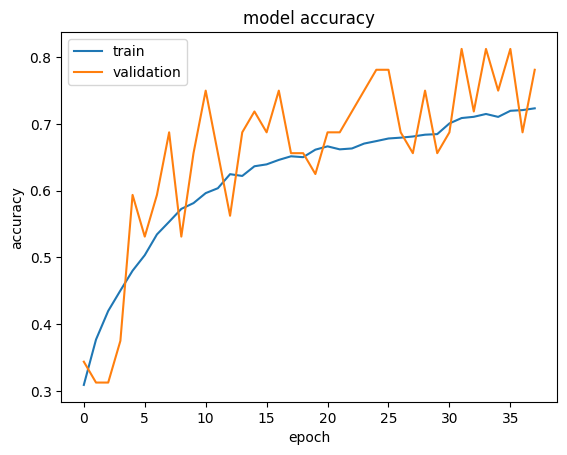

In [23]:
plt.plot(history_1.history["accuracy"])
plt.plot(history_1.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the Model on the Test Set**


In [24]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = model_1.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 0s - loss: 0.4776 - accuracy: 0.8125

4/4 [==============================] - 0s 5ms/step - loss: 0.6424 - accuracy: 0.7344


Loss: 0.6423855423927307, Accuracy: 0.734375


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


              precision    recall  f1-score   support

       happy       0.90      0.81      0.85        32
     neutral       0.59      0.69      0.64        32
         sad       0.54      0.59      0.57        32
    surprise       1.00      0.84      0.92        32

    accuracy                           0.73       128
   macro avg       0.76      0.73      0.74       128
weighted avg       0.76      0.73      0.74       128



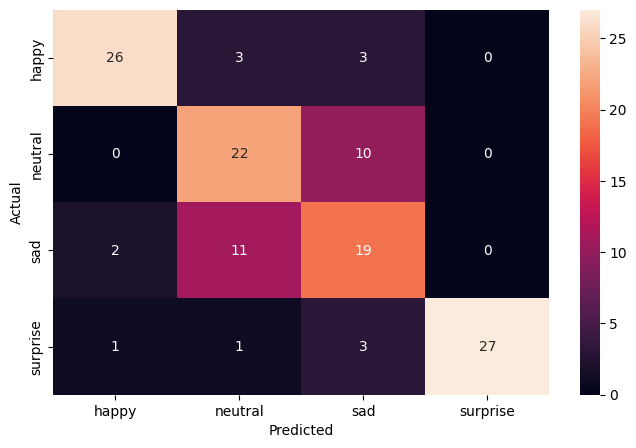

In [25]:
pred_probabilities = model_1.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:**

- As we can see from the above summary, this CNN model has been trained and learned with **144,056 parameters (weights and biases).**
- The model's training accuracy shows a progressive increase, reaching about **71.34%**, suggesting the model is learning effectively. The validation accuracy fluctuates but also generally trends upward, peaking at approximately **78.12%**. This divergence might indicate that the model is still learning generalizable features, despite the higher accuracy on the validation set, which can sometimes be attributed to the validation set being slightly 'easier' or containing fewer augmentations.
- Upon evaluating the model on the test dataset, it achieved a loss of 0.6081 and an **accuracy of 72.66%**.
- From the confusion matrix, the model performs best in identifying 'happy' and 'surprise' emotions. It faces more challenges with 'sad' and 'neutral', in which we have the lowest f1-score, 56% and 63% respectively.


### **Creating the second Convolutional Neural Network**


### **Model 2 Architecture:**

- We plan on having 4 convolutional blocks in this Architecture, each having a Conv2D, MaxPooling2D, and a Dropout layer.
- Adding first Conv2D layer with **256 filters** and a **kernel size of 5x5**. Using the **'same' padding** and provide the **input shape = (48, 48, 1)**. Using **'relu' activation**.
- Adding MaxPooling2D layer with **kernel size 5x5** and **stride size 2x2**.
- Adding a Dropout layer with a dropout ratio of **0.2**.
- Adding a second Conv2D layer with **128 filters** and a **kernel size of 5x5**. Using the **'same' padding** and **'relu' activation**.
- Following this up with a similar Maxpooling2D layer like above and a Dropout layer with 0.3 dropout ratio.
- Adding a third Conv2D layer with **64 filters** and a **kernel size of 5x5**. Using the **'same' padding** and **'relu' activation**.
- Following this up with a similar Maxpooling2D layer and a Dropout layer with dropout ratio of 0.3.
- Adding a fourth Conv2D layer with **32 filters** and a **kernel size of 3x3**. Using the **'same' padding** and **'relu' activation**.
- Following this up with a similar Maxpooling2D layer and a Dropout layer with dropout ratio of 0.3.
- Once the convolutional blocks are added, we add the Flatten layer.
- Adding first fully connected dense layer with 64 neurons and using **'relu' activation**.
- Adding a second fully connected dense layer with 32 neurons and using **'relu' activation**.
- Adding a final dense layer with 4 neurons and using **'softmax' activation function**.
- Initializing an **Adam optimizer** with a learning rate of 0.0005.
- Compiling your model with the optimizer initialized and using **categorical_crossentropy** as the loss function and the 'accuracy' as the metric.
- Finally, printing your model summary and writing down the observations.


In [26]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [27]:
# Initializing a sequential model
model_2 = Sequential()

# Adding first conv layer
model_2.add(
    Conv2D(
        filters=256,
        kernel_size=(5, 5),
        padding="Same",
        input_shape=(img_width, img_height, color_layers),
        activation="relu",
    )
)
model_2.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_2.add(Dropout(0.2))

# Adding second conv layer
model_2.add(Conv2D(filters=128, kernel_size=(5, 5), padding="Same", activation="relu"))
model_2.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_2.add(Dropout(0.3))

# Adding third conv layer
model_2.add(Conv2D(filters=64, kernel_size=(3, 3), padding="Same", activation="relu"))
model_2.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_2.add(Dropout(0.3))

# Adding fourth conv layer
model_2.add(Conv2D(filters=32, kernel_size=(3, 3), padding="Same", activation="relu"))
model_2.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_2.add(Dropout(0.3))

# Flattening
model_2.add(Flatten())
model_2.add(Dense(64, activation="relu"))
model_2.add(Dense(32, activation="relu"))

# Adding the output layer with 4 neurons and activation functions as softmax since this is a multi-class classification problem
model_2.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the Model**


In [28]:
# Compile the model
model_2.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])

model_2.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 conv2d (Conv2D)             (None, 48, 48, 256)       6656      


 max_pooling2d (MaxPooling2  (None, 24, 24, 256)       0         


 D)                                                              


 dropout (Dropout)           (None, 24, 24, 256)       0         


 conv2d_1 (Conv2D)           (None, 24, 24, 128)       819328    


 max_pooling2d_1 (MaxPoolin  (None, 12, 12, 128)       0         


 g2D)                                                            


 dropout_1 (Dropout)         (None, 12, 12, 128)       0         


 conv2d_2 (Conv2D)           (None, 12, 12, 64)        73792     


 max_pooling2d_2 (MaxPoolin  (None, 6, 6, 64)          0         


 g2D)                                                            


 dropout_2 (Dropout)         (None, 6, 6, 64)          0         


 conv2d_3 (Conv2D)           (None, 6, 6, 32)          18464     


 max_pooling2d_3 (MaxPoolin  (None, 3, 3, 32)          0         


 g2D)                                                            


 dropout_3 (Dropout)         (None, 3, 3, 32)          0         


 flatten (Flatten)           (None, 288)               0         


 dense (Dense)               (None, 64)                18496     


 dense_1 (Dense)             (None, 32)                2080      


 dense_2 (Dense)             (None, 4)                 132       


Total params: 938948 (3.58 MB)


Trainable params: 938948 (3.58 MB)


Non-trainable params: 0 (0.00 Byte)


_________________________________________________________________


In [29]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 30 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=30
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_2_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_2 = model_2.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[delayed_early_stopping, mc, reduce_lr],
)

Epoch 1/40


2024-03-19 08:10:40.492523: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


2024-03-19 08:10:41.166024: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.


  1/473 [..............................] - ETA: 22:06 - loss: 1.3940 - accuracy: 0.1875

  7/473 [..............................] - ETA: 4s - loss: 1.3989 - accuracy: 0.2411   

 13/473 [..............................] - ETA: 4s - loss: 1.3947 - accuracy: 0.2644

 19/473 [>.............................] - ETA: 4s - loss: 1.3937 - accuracy: 0.2615

 25/473 [>.............................] - ETA: 4s - loss: 1.3937 - accuracy: 0.2637

 30/473 [>.............................] - ETA: 4s - loss: 1.3926 - accuracy: 0.2604

 36/473 [=>............................] - ETA: 4s - loss: 1.3911 - accuracy: 0.2665

 42/473 [=>............................] - ETA: 4s - loss: 1.3907 - accuracy: 0.2723

 48/473 [==>...........................] - ETA: 4s - loss: 1.3905 - accuracy: 0.2682

 54/473 [==>...........................] - ETA: 4s - loss: 1.3902 - accuracy: 0.2622

 60/473 [==>...........................] - ETA: 4s - loss: 1.3894 - accuracy: 0.2661

 66/473 [===>..........................] - ETA: 3s - loss: 1.3892 - accuracy: 0.2694

 72/473 [===>..........................] - ETA: 3s - loss: 1.3890 - accuracy: 0.2682

 78/473 [===>..........................] - ETA: 3s - loss: 1.3884 - accuracy: 0.2700

 84/473 [====>.........................] - ETA: 3s - loss: 1.3883 - accuracy: 0.2656

 90/473 [====>.........................] - ETA: 3s - loss: 1.3884 - accuracy: 0.2639

 96/473 [=====>........................] - ETA: 3s - loss: 1.3879 - accuracy: 0.2660

102/473 [=====>........................] - ETA: 3s - loss: 1.3876 - accuracy: 0.2665

108/473 [=====>........................] - ETA: 3s - loss: 1.3874 - accuracy: 0.2677

114/473 [======>.......................] - ETA: 3s - loss: 1.3873 - accuracy: 0.2664

120/473 [======>.......................] - ETA: 3s - loss: 1.3872 - accuracy: 0.2651

126/473 [======>.......................] - ETA: 3s - loss: 1.3871 - accuracy: 0.2624

132/473 [=======>......................] - ETA: 3s - loss: 1.3867 - accuracy: 0.2637

138/473 [=======>......................] - ETA: 3s - loss: 1.3866 - accuracy: 0.2638

144/473 [========>.....................] - ETA: 3s - loss: 1.3861 - accuracy: 0.2654

149/473 [========>.....................] - ETA: 3s - loss: 1.3859 - accuracy: 0.2666

154/473 [========>.....................] - ETA: 3s - loss: 1.3862 - accuracy: 0.2646

159/473 [=========>....................] - ETA: 3s - loss: 1.3862 - accuracy: 0.2653

165/473 [=========>....................] - ETA: 3s - loss: 1.3862 - accuracy: 0.2631

171/473 [=========>....................] - ETA: 2s - loss: 1.3861 - accuracy: 0.2617

177/473 [==========>...................] - ETA: 2s - loss: 1.3858 - accuracy: 0.2624

182/473 [==========>...................] - ETA: 2s - loss: 1.3858 - accuracy: 0.2615

188/473 [==========>...................] - ETA: 2s - loss: 1.3858 - accuracy: 0.2601

194/473 [===========>..................] - ETA: 2s - loss: 1.3856 - accuracy: 0.2597

200/473 [===========>..................] - ETA: 2s - loss: 1.3856 - accuracy: 0.2589

206/473 [============>.................] - ETA: 2s - loss: 1.3855 - accuracy: 0.2585

212/473 [============>.................] - ETA: 2s - loss: 1.3854 - accuracy: 0.2587

218/473 [============>.................] - ETA: 2s - loss: 1.3853 - accuracy: 0.2590

224/473 [=============>................] - ETA: 2s - loss: 1.3850 - accuracy: 0.2593

230/473 [=============>................] - ETA: 2s - loss: 1.3852 - accuracy: 0.2587

236/473 [=============>................] - ETA: 2s - loss: 1.3853 - accuracy: 0.2578

242/473 [==============>...............] - ETA: 2s - loss: 1.3853 - accuracy: 0.2589

248/473 [==============>...............] - ETA: 2s - loss: 1.3851 - accuracy: 0.2606

254/473 [===============>..............] - ETA: 2s - loss: 1.3849 - accuracy: 0.2609

260/473 [===============>..............] - ETA: 2s - loss: 1.3846 - accuracy: 0.2609

265/473 [===============>..............] - ETA: 2s - loss: 1.3847 - accuracy: 0.2616

270/473 [================>.............] - ETA: 1s - loss: 1.3846 - accuracy: 0.2612

276/473 [================>.............] - ETA: 1s - loss: 1.3844 - accuracy: 0.2606

282/473 [================>.............] - ETA: 1s - loss: 1.3844 - accuracy: 0.2612

287/473 [=================>............] - ETA: 1s - loss: 1.3843 - accuracy: 0.2617

293/473 [=================>............] - ETA: 1s - loss: 1.3843 - accuracy: 0.2610

298/473 [=================>............] - ETA: 1s - loss: 1.3840 - accuracy: 0.2624

303/473 [==================>...........] - ETA: 1s - loss: 1.3838 - accuracy: 0.2625

309/473 [==================>...........] - ETA: 1s - loss: 1.3837 - accuracy: 0.2630

315/473 [==================>...........] - ETA: 1s - loss: 1.3835 - accuracy: 0.2634

321/473 [===================>..........] - ETA: 1s - loss: 1.3831 - accuracy: 0.2648

326/473 [===================>..........] - ETA: 1s - loss: 1.3830 - accuracy: 0.2659

332/473 [====================>.........] - ETA: 1s - loss: 1.3833 - accuracy: 0.2649

337/473 [====================>.........] - ETA: 1s - loss: 1.3833 - accuracy: 0.2655

343/473 [====================>.........] - ETA: 1s - loss: 1.3831 - accuracy: 0.2654

349/473 [=====================>........] - ETA: 1s - loss: 1.3830 - accuracy: 0.2658

355/473 [=====================>........] - ETA: 1s - loss: 1.3827 - accuracy: 0.2667

361/473 [=====================>........] - ETA: 1s - loss: 1.3827 - accuracy: 0.2672

367/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2677

373/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2685

379/473 [=======================>......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2698

385/473 [=======================>......] - ETA: 0s - loss: 1.3817 - accuracy: 0.2700

391/473 [=======================>......] - ETA: 0s - loss: 1.3817 - accuracy: 0.2702

397/473 [========================>.....] - ETA: 0s - loss: 1.3814 - accuracy: 0.2702

403/473 [========================>.....] - ETA: 0s - loss: 1.3813 - accuracy: 0.2712

409/473 [========================>.....] - ETA: 0s - loss: 1.3810 - accuracy: 0.2725

414/473 [=========================>....] - ETA: 0s - loss: 1.3805 - accuracy: 0.2732

420/473 [=========================>....] - ETA: 0s - loss: 1.3805 - accuracy: 0.2731

425/473 [=========================>....] - ETA: 0s - loss: 1.3801 - accuracy: 0.2733

430/473 [==========================>...] - ETA: 0s - loss: 1.3801 - accuracy: 0.2733

436/473 [==========================>...] - ETA: 0s - loss: 1.3801 - accuracy: 0.2735

442/473 [===========================>..] - ETA: 0s - loss: 1.3794 - accuracy: 0.2746

448/473 [===========================>..] - ETA: 0s - loss: 1.3790 - accuracy: 0.2753

454/473 [===========================>..] - ETA: 0s - loss: 1.3787 - accuracy: 0.2765

460/473 [============================>.] - ETA: 0s - loss: 1.3782 - accuracy: 0.2775

466/473 [============================>.] - ETA: 0s - loss: 1.3778 - accuracy: 0.2785

472/473 [============================>.] - ETA: 0s - loss: 1.3775 - accuracy: 0.2794


Epoch 1: val_accuracy improved from -inf to 0.31250, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240319-081040.keras


473/473 [==============================] - 8s 11ms/step - loss: 1.3774 - accuracy: 0.2793 - val_loss: 1.3656 - val_accuracy: 0.3125 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 11s - loss: 1.3537 - accuracy: 0.4062

  6/473 [..............................] - ETA: 5s - loss: 1.3590 - accuracy: 0.3229 

 11/473 [..............................] - ETA: 4s - loss: 1.3568 - accuracy: 0.3182

 17/473 [>.............................] - ETA: 4s - loss: 1.3607 - accuracy: 0.3143

 23/473 [>.............................] - ETA: 4s - loss: 1.3590 - accuracy: 0.3152

 29/473 [>.............................] - ETA: 4s - loss: 1.3586 - accuracy: 0.3114

 35/473 [=>............................] - ETA: 4s - loss: 1.3559 - accuracy: 0.3161

 41/473 [=>............................] - ETA: 4s - loss: 1.3521 - accuracy: 0.3140

 47/473 [=>............................] - ETA: 4s - loss: 1.3465 - accuracy: 0.3205

 53/473 [==>...........................] - ETA: 4s - loss: 1.3484 - accuracy: 0.3237

 59/473 [==>...........................] - ETA: 4s - loss: 1.3465 - accuracy: 0.3268

 65/473 [===>..........................] - ETA: 4s - loss: 1.3470 - accuracy: 0.3255

 71/473 [===>..........................] - ETA: 3s - loss: 1.3454 - accuracy: 0.3305

 77/473 [===>..........................] - ETA: 3s - loss: 1.3452 - accuracy: 0.3328

 83/473 [====>.........................] - ETA: 3s - loss: 1.3448 - accuracy: 0.3313

 89/473 [====>.........................] - ETA: 3s - loss: 1.3435 - accuracy: 0.3301

 95/473 [=====>........................] - ETA: 3s - loss: 1.3444 - accuracy: 0.3299

101/473 [=====>........................] - ETA: 3s - loss: 1.3432 - accuracy: 0.3351

106/473 [=====>........................] - ETA: 3s - loss: 1.3427 - accuracy: 0.3349

112/473 [======>.......................] - ETA: 3s - loss: 1.3414 - accuracy: 0.3354

118/473 [======>.......................] - ETA: 3s - loss: 1.3409 - accuracy: 0.3334

124/473 [======>.......................] - ETA: 3s - loss: 1.3412 - accuracy: 0.3332

130/473 [=======>......................] - ETA: 3s - loss: 1.3377 - accuracy: 0.3358

136/473 [=======>......................] - ETA: 3s - loss: 1.3349 - accuracy: 0.3392

142/473 [========>.....................] - ETA: 3s - loss: 1.3326 - accuracy: 0.3404

148/473 [========>.....................] - ETA: 3s - loss: 1.3324 - accuracy: 0.3410

154/473 [========>.....................] - ETA: 3s - loss: 1.3314 - accuracy: 0.3444

159/473 [=========>....................] - ETA: 3s - loss: 1.3305 - accuracy: 0.3455

165/473 [=========>....................] - ETA: 3s - loss: 1.3325 - accuracy: 0.3445

170/473 [=========>....................] - ETA: 2s - loss: 1.3313 - accuracy: 0.3458

176/473 [==========>...................] - ETA: 2s - loss: 1.3295 - accuracy: 0.3477

182/473 [==========>...................] - ETA: 2s - loss: 1.3285 - accuracy: 0.3472

188/473 [==========>...................] - ETA: 2s - loss: 1.3273 - accuracy: 0.3466

193/473 [===========>..................] - ETA: 2s - loss: 1.3266 - accuracy: 0.3483

198/473 [===========>..................] - ETA: 2s - loss: 1.3265 - accuracy: 0.3488

204/473 [===========>..................] - ETA: 2s - loss: 1.3243 - accuracy: 0.3505

210/473 [============>.................] - ETA: 2s - loss: 1.3238 - accuracy: 0.3503

216/473 [============>.................] - ETA: 2s - loss: 1.3230 - accuracy: 0.3514

222/473 [=============>................] - ETA: 2s - loss: 1.3231 - accuracy: 0.3502

227/473 [=============>................] - ETA: 2s - loss: 1.3214 - accuracy: 0.3526

232/473 [=============>................] - ETA: 2s - loss: 1.3204 - accuracy: 0.3536

238/473 [==============>...............] - ETA: 2s - loss: 1.3181 - accuracy: 0.3558

244/473 [==============>...............] - ETA: 2s - loss: 1.3173 - accuracy: 0.3558

249/473 [==============>...............] - ETA: 2s - loss: 1.3161 - accuracy: 0.3562

254/473 [===============>..............] - ETA: 2s - loss: 1.3147 - accuracy: 0.3567

259/473 [===============>..............] - ETA: 2s - loss: 1.3139 - accuracy: 0.3564

265/473 [===============>..............] - ETA: 2s - loss: 1.3126 - accuracy: 0.3570

270/473 [================>.............] - ETA: 2s - loss: 1.3119 - accuracy: 0.3575

276/473 [================>.............] - ETA: 1s - loss: 1.3109 - accuracy: 0.3575

282/473 [================>.............] - ETA: 1s - loss: 1.3093 - accuracy: 0.3590

288/473 [=================>............] - ETA: 1s - loss: 1.3087 - accuracy: 0.3586

294/473 [=================>............] - ETA: 1s - loss: 1.3079 - accuracy: 0.3590

300/473 [==================>...........] - ETA: 1s - loss: 1.3063 - accuracy: 0.3602

306/473 [==================>...........] - ETA: 1s - loss: 1.3052 - accuracy: 0.3612

312/473 [==================>...........] - ETA: 1s - loss: 1.3044 - accuracy: 0.3610

318/473 [===================>..........] - ETA: 1s - loss: 1.3034 - accuracy: 0.3619

324/473 [===================>..........] - ETA: 1s - loss: 1.3022 - accuracy: 0.3626

330/473 [===================>..........] - ETA: 1s - loss: 1.3025 - accuracy: 0.3630

336/473 [====================>.........] - ETA: 1s - loss: 1.3013 - accuracy: 0.3640

342/473 [====================>.........] - ETA: 1s - loss: 1.3011 - accuracy: 0.3631

348/473 [=====================>........] - ETA: 1s - loss: 1.2998 - accuracy: 0.3638

354/473 [=====================>........] - ETA: 1s - loss: 1.2995 - accuracy: 0.3635

360/473 [=====================>........] - ETA: 1s - loss: 1.2993 - accuracy: 0.3628

366/473 [======================>.......] - ETA: 1s - loss: 1.2990 - accuracy: 0.3633

372/473 [======================>.......] - ETA: 0s - loss: 1.2989 - accuracy: 0.3634

378/473 [======================>.......] - ETA: 0s - loss: 1.2984 - accuracy: 0.3640

383/473 [=======================>......] - ETA: 0s - loss: 1.2984 - accuracy: 0.3640

389/473 [=======================>......] - ETA: 0s - loss: 1.2979 - accuracy: 0.3649

395/473 [========================>.....] - ETA: 0s - loss: 1.2978 - accuracy: 0.3649

401/473 [========================>.....] - ETA: 0s - loss: 1.2974 - accuracy: 0.3652

407/473 [========================>.....] - ETA: 0s - loss: 1.2962 - accuracy: 0.3664

413/473 [=========================>....] - ETA: 0s - loss: 1.2960 - accuracy: 0.3664

419/473 [=========================>....] - ETA: 0s - loss: 1.2963 - accuracy: 0.3668

425/473 [=========================>....] - ETA: 0s - loss: 1.2964 - accuracy: 0.3668

431/473 [==========================>...] - ETA: 0s - loss: 1.2964 - accuracy: 0.3665

437/473 [==========================>...] - ETA: 0s - loss: 1.2958 - accuracy: 0.3673

443/473 [===========================>..] - ETA: 0s - loss: 1.2959 - accuracy: 0.3665

449/473 [===========================>..] - ETA: 0s - loss: 1.2942 - accuracy: 0.3677

455/473 [===========================>..] - ETA: 0s - loss: 1.2936 - accuracy: 0.3685

460/473 [============================>.] - ETA: 0s - loss: 1.2928 - accuracy: 0.3694

465/473 [============================>.] - ETA: 0s - loss: 1.2928 - accuracy: 0.3698

471/473 [============================>.] - ETA: 0s - loss: 1.2924 - accuracy: 0.3698


Epoch 2: val_accuracy improved from 0.31250 to 0.37500, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240319-081040.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.2921 - accuracy: 0.3702 - val_loss: 1.1843 - val_accuracy: 0.3750 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 11s - loss: 1.2054 - accuracy: 0.4375

  6/473 [..............................] - ETA: 4s - loss: 1.2362 - accuracy: 0.3698 

 12/473 [..............................] - ETA: 4s - loss: 1.2453 - accuracy: 0.3932

 18/473 [>.............................] - ETA: 4s - loss: 1.2423 - accuracy: 0.3924

 23/473 [>.............................] - ETA: 4s - loss: 1.2485 - accuracy: 0.3832

 29/473 [>.............................] - ETA: 4s - loss: 1.2528 - accuracy: 0.3879

 34/473 [=>............................] - ETA: 4s - loss: 1.2506 - accuracy: 0.3989

 39/473 [=>............................] - ETA: 4s - loss: 1.2579 - accuracy: 0.3942

 44/473 [=>............................] - ETA: 4s - loss: 1.2551 - accuracy: 0.3878

 49/473 [==>...........................] - ETA: 4s - loss: 1.2522 - accuracy: 0.3871

 55/473 [==>...........................] - ETA: 4s - loss: 1.2533 - accuracy: 0.3875

 61/473 [==>...........................] - ETA: 4s - loss: 1.2510 - accuracy: 0.3970

 67/473 [===>..........................] - ETA: 4s - loss: 1.2461 - accuracy: 0.3979

 73/473 [===>..........................] - ETA: 3s - loss: 1.2467 - accuracy: 0.4007

 79/473 [====>.........................] - ETA: 3s - loss: 1.2519 - accuracy: 0.3979

 85/473 [====>.........................] - ETA: 3s - loss: 1.2465 - accuracy: 0.4029

 91/473 [====>.........................] - ETA: 3s - loss: 1.2475 - accuracy: 0.4035

 96/473 [=====>........................] - ETA: 3s - loss: 1.2446 - accuracy: 0.4030

102/473 [=====>........................] - ETA: 3s - loss: 1.2432 - accuracy: 0.4029

108/473 [=====>........................] - ETA: 3s - loss: 1.2392 - accuracy: 0.4028

114/473 [======>.......................] - ETA: 3s - loss: 1.2349 - accuracy: 0.4043

119/473 [======>.......................] - ETA: 3s - loss: 1.2369 - accuracy: 0.4039

124/473 [======>.......................] - ETA: 3s - loss: 1.2341 - accuracy: 0.4055

130/473 [=======>......................] - ETA: 3s - loss: 1.2369 - accuracy: 0.4017

135/473 [=======>......................] - ETA: 3s - loss: 1.2343 - accuracy: 0.4032

141/473 [=======>......................] - ETA: 3s - loss: 1.2323 - accuracy: 0.4054

146/473 [========>.....................] - ETA: 3s - loss: 1.2321 - accuracy: 0.4056

152/473 [========>.....................] - ETA: 3s - loss: 1.2347 - accuracy: 0.4021

157/473 [========>.....................] - ETA: 3s - loss: 1.2361 - accuracy: 0.4011

163/473 [=========>....................] - ETA: 3s - loss: 1.2372 - accuracy: 0.4005

169/473 [=========>....................] - ETA: 3s - loss: 1.2369 - accuracy: 0.4009

174/473 [==========>...................] - ETA: 2s - loss: 1.2366 - accuracy: 0.4007

179/473 [==========>...................] - ETA: 2s - loss: 1.2363 - accuracy: 0.4022

185/473 [==========>...................] - ETA: 2s - loss: 1.2345 - accuracy: 0.4044

191/473 [===========>..................] - ETA: 2s - loss: 1.2351 - accuracy: 0.4043

197/473 [===========>..................] - ETA: 2s - loss: 1.2348 - accuracy: 0.4039

202/473 [===========>..................] - ETA: 2s - loss: 1.2334 - accuracy: 0.4059

208/473 [============>.................] - ETA: 2s - loss: 1.2309 - accuracy: 0.4078

214/473 [============>.................] - ETA: 2s - loss: 1.2312 - accuracy: 0.4083

220/473 [============>.................] - ETA: 2s - loss: 1.2316 - accuracy: 0.4097

226/473 [=============>................] - ETA: 2s - loss: 1.2327 - accuracy: 0.4097

232/473 [=============>................] - ETA: 2s - loss: 1.2323 - accuracy: 0.4104

236/473 [=============>................] - ETA: 2s - loss: 1.2318 - accuracy: 0.4097

240/473 [==============>...............] - ETA: 2s - loss: 1.2324 - accuracy: 0.4087

246/473 [==============>...............] - ETA: 2s - loss: 1.2312 - accuracy: 0.4080

252/473 [==============>...............] - ETA: 2s - loss: 1.2293 - accuracy: 0.4087

257/473 [===============>..............] - ETA: 2s - loss: 1.2288 - accuracy: 0.4100

262/473 [===============>..............] - ETA: 2s - loss: 1.2291 - accuracy: 0.4105

267/473 [===============>..............] - ETA: 2s - loss: 1.2303 - accuracy: 0.4089

273/473 [================>.............] - ETA: 2s - loss: 1.2299 - accuracy: 0.4093

279/473 [================>.............] - ETA: 1s - loss: 1.2294 - accuracy: 0.4104

285/473 [=================>............] - ETA: 1s - loss: 1.2303 - accuracy: 0.4111

291/473 [=================>............] - ETA: 1s - loss: 1.2296 - accuracy: 0.4122

297/473 [=================>............] - ETA: 1s - loss: 1.2318 - accuracy: 0.4110

303/473 [==================>...........] - ETA: 1s - loss: 1.2307 - accuracy: 0.4122

309/473 [==================>...........] - ETA: 1s - loss: 1.2303 - accuracy: 0.4129

314/473 [==================>...........] - ETA: 1s - loss: 1.2315 - accuracy: 0.4113

320/473 [===================>..........] - ETA: 1s - loss: 1.2306 - accuracy: 0.4121

326/473 [===================>..........] - ETA: 1s - loss: 1.2309 - accuracy: 0.4116

332/473 [====================>.........] - ETA: 1s - loss: 1.2311 - accuracy: 0.4115

338/473 [====================>.........] - ETA: 1s - loss: 1.2302 - accuracy: 0.4123

344/473 [====================>.........] - ETA: 1s - loss: 1.2304 - accuracy: 0.4105

350/473 [=====================>........] - ETA: 1s - loss: 1.2293 - accuracy: 0.4108

356/473 [=====================>........] - ETA: 1s - loss: 1.2298 - accuracy: 0.4106

362/473 [=====================>........] - ETA: 1s - loss: 1.2306 - accuracy: 0.4098

368/473 [======================>.......] - ETA: 1s - loss: 1.2307 - accuracy: 0.4093

374/473 [======================>.......] - ETA: 0s - loss: 1.2309 - accuracy: 0.4098

380/473 [=======================>......] - ETA: 0s - loss: 1.2303 - accuracy: 0.4105

385/473 [=======================>......] - ETA: 0s - loss: 1.2294 - accuracy: 0.4110

391/473 [=======================>......] - ETA: 0s - loss: 1.2283 - accuracy: 0.4122

397/473 [========================>.....] - ETA: 0s - loss: 1.2279 - accuracy: 0.4119

402/473 [========================>.....] - ETA: 0s - loss: 1.2270 - accuracy: 0.4122

408/473 [========================>.....] - ETA: 0s - loss: 1.2265 - accuracy: 0.4125

414/473 [=========================>....] - ETA: 0s - loss: 1.2254 - accuracy: 0.4138

420/473 [=========================>....] - ETA: 0s - loss: 1.2248 - accuracy: 0.4135

426/473 [==========================>...] - ETA: 0s - loss: 1.2242 - accuracy: 0.4140

432/473 [==========================>...] - ETA: 0s - loss: 1.2233 - accuracy: 0.4146

438/473 [==========================>...] - ETA: 0s - loss: 1.2232 - accuracy: 0.4139

444/473 [===========================>..] - ETA: 0s - loss: 1.2234 - accuracy: 0.4141

450/473 [===========================>..] - ETA: 0s - loss: 1.2245 - accuracy: 0.4135

456/473 [===========================>..] - ETA: 0s - loss: 1.2247 - accuracy: 0.4131

461/473 [============================>.] - ETA: 0s - loss: 1.2245 - accuracy: 0.4136

467/473 [============================>.] - ETA: 0s - loss: 1.2242 - accuracy: 0.4135

473/473 [==============================] - ETA: 0s - loss: 1.2243 - accuracy: 0.4137


Epoch 3: val_accuracy improved from 0.37500 to 0.46875, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240319-081040.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.2243 - accuracy: 0.4137 - val_loss: 1.1176 - val_accuracy: 0.4688 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 11s - loss: 1.1649 - accuracy: 0.4688

  7/473 [..............................] - ETA: 4s - loss: 1.1642 - accuracy: 0.4821 

 13/473 [..............................] - ETA: 4s - loss: 1.2016 - accuracy: 0.4495

 18/473 [>.............................] - ETA: 4s - loss: 1.2211 - accuracy: 0.4358

 22/473 [>.............................] - ETA: 4s - loss: 1.2132 - accuracy: 0.4403

 26/473 [>.............................] - ETA: 4s - loss: 1.2158 - accuracy: 0.4351

 32/473 [=>............................] - ETA: 4s - loss: 1.2021 - accuracy: 0.4375

 38/473 [=>............................] - ETA: 4s - loss: 1.2050 - accuracy: 0.4326

 43/473 [=>............................] - ETA: 4s - loss: 1.2110 - accuracy: 0.4251

 48/473 [==>...........................] - ETA: 4s - loss: 1.2103 - accuracy: 0.4264

 54/473 [==>...........................] - ETA: 4s - loss: 1.2103 - accuracy: 0.4230

 59/473 [==>...........................] - ETA: 4s - loss: 1.2096 - accuracy: 0.4237

 64/473 [===>..........................] - ETA: 4s - loss: 1.2134 - accuracy: 0.4189

 70/473 [===>..........................] - ETA: 4s - loss: 1.2125 - accuracy: 0.4192

 76/473 [===>..........................] - ETA: 4s - loss: 1.2129 - accuracy: 0.4202

 82/473 [====>.........................] - ETA: 4s - loss: 1.2126 - accuracy: 0.4223

 87/473 [====>.........................] - ETA: 4s - loss: 1.2102 - accuracy: 0.4264

 92/473 [====>.........................] - ETA: 3s - loss: 1.2093 - accuracy: 0.4300

 98/473 [=====>........................] - ETA: 3s - loss: 1.2068 - accuracy: 0.4317

104/473 [=====>........................] - ETA: 3s - loss: 1.2063 - accuracy: 0.4323

110/473 [=====>........................] - ETA: 3s - loss: 1.2061 - accuracy: 0.4332

115/473 [======>.......................] - ETA: 3s - loss: 1.2068 - accuracy: 0.4333

121/473 [======>.......................] - ETA: 3s - loss: 1.2077 - accuracy: 0.4299

127/473 [=======>......................] - ETA: 3s - loss: 1.2068 - accuracy: 0.4318

133/473 [=======>......................] - ETA: 3s - loss: 1.2076 - accuracy: 0.4311

139/473 [=======>......................] - ETA: 3s - loss: 1.2083 - accuracy: 0.4334

145/473 [========>.....................] - ETA: 3s - loss: 1.2076 - accuracy: 0.4342

151/473 [========>.....................] - ETA: 3s - loss: 1.2074 - accuracy: 0.4350

157/473 [========>.....................] - ETA: 3s - loss: 1.2092 - accuracy: 0.4337

163/473 [=========>....................] - ETA: 3s - loss: 1.2088 - accuracy: 0.4334

169/473 [=========>....................] - ETA: 3s - loss: 1.2074 - accuracy: 0.4345

174/473 [==========>...................] - ETA: 3s - loss: 1.2090 - accuracy: 0.4333

179/473 [==========>...................] - ETA: 2s - loss: 1.2090 - accuracy: 0.4336

184/473 [==========>...................] - ETA: 2s - loss: 1.2088 - accuracy: 0.4332

189/473 [==========>...................] - ETA: 2s - loss: 1.2078 - accuracy: 0.4350

195/473 [===========>..................] - ETA: 2s - loss: 1.2075 - accuracy: 0.4343

201/473 [===========>..................] - ETA: 2s - loss: 1.2086 - accuracy: 0.4342

207/473 [============>.................] - ETA: 2s - loss: 1.2084 - accuracy: 0.4338

213/473 [============>.................] - ETA: 2s - loss: 1.2066 - accuracy: 0.4341

219/473 [============>.................] - ETA: 2s - loss: 1.2052 - accuracy: 0.4343

225/473 [=============>................] - ETA: 2s - loss: 1.2033 - accuracy: 0.4372

231/473 [=============>................] - ETA: 2s - loss: 1.2038 - accuracy: 0.4373

236/473 [=============>................] - ETA: 2s - loss: 1.2033 - accuracy: 0.4371

242/473 [==============>...............] - ETA: 2s - loss: 1.2035 - accuracy: 0.4368

248/473 [==============>...............] - ETA: 2s - loss: 1.2023 - accuracy: 0.4373

254/473 [===============>..............] - ETA: 2s - loss: 1.2014 - accuracy: 0.4374

260/473 [===============>..............] - ETA: 2s - loss: 1.2014 - accuracy: 0.4382

266/473 [===============>..............] - ETA: 2s - loss: 1.2009 - accuracy: 0.4384

271/473 [================>.............] - ETA: 2s - loss: 1.2014 - accuracy: 0.4385

277/473 [================>.............] - ETA: 1s - loss: 1.2013 - accuracy: 0.4388

283/473 [================>.............] - ETA: 1s - loss: 1.2016 - accuracy: 0.4380

289/473 [=================>............] - ETA: 1s - loss: 1.2010 - accuracy: 0.4383

295/473 [=================>............] - ETA: 1s - loss: 1.2012 - accuracy: 0.4383

301/473 [==================>...........] - ETA: 1s - loss: 1.2008 - accuracy: 0.4385

307/473 [==================>...........] - ETA: 1s - loss: 1.2008 - accuracy: 0.4389

313/473 [==================>...........] - ETA: 1s - loss: 1.1997 - accuracy: 0.4391

319/473 [===================>..........] - ETA: 1s - loss: 1.1989 - accuracy: 0.4394

325/473 [===================>..........] - ETA: 1s - loss: 1.1994 - accuracy: 0.4393

331/473 [===================>..........] - ETA: 1s - loss: 1.1992 - accuracy: 0.4393

337/473 [====================>.........] - ETA: 1s - loss: 1.1998 - accuracy: 0.4388

343/473 [====================>.........] - ETA: 1s - loss: 1.1999 - accuracy: 0.4386

348/473 [=====================>........] - ETA: 1s - loss: 1.1995 - accuracy: 0.4390

354/473 [=====================>........] - ETA: 1s - loss: 1.2005 - accuracy: 0.4377

360/473 [=====================>........] - ETA: 1s - loss: 1.2007 - accuracy: 0.4377

366/473 [======================>.......] - ETA: 1s - loss: 1.2008 - accuracy: 0.4375

372/473 [======================>.......] - ETA: 1s - loss: 1.2006 - accuracy: 0.4372

378/473 [======================>.......] - ETA: 0s - loss: 1.2003 - accuracy: 0.4373

384/473 [=======================>......] - ETA: 0s - loss: 1.2004 - accuracy: 0.4374

390/473 [=======================>......] - ETA: 0s - loss: 1.1996 - accuracy: 0.4377

396/473 [========================>.....] - ETA: 0s - loss: 1.1994 - accuracy: 0.4374

402/473 [========================>.....] - ETA: 0s - loss: 1.1990 - accuracy: 0.4376

408/473 [========================>.....] - ETA: 0s - loss: 1.1985 - accuracy: 0.4373

414/473 [=========================>....] - ETA: 0s - loss: 1.1981 - accuracy: 0.4382

420/473 [=========================>....] - ETA: 0s - loss: 1.1974 - accuracy: 0.4381

426/473 [==========================>...] - ETA: 0s - loss: 1.1981 - accuracy: 0.4381

432/473 [==========================>...] - ETA: 0s - loss: 1.1975 - accuracy: 0.4381

438/473 [==========================>...] - ETA: 0s - loss: 1.1970 - accuracy: 0.4388

444/473 [===========================>..] - ETA: 0s - loss: 1.1964 - accuracy: 0.4392

450/473 [===========================>..] - ETA: 0s - loss: 1.1955 - accuracy: 0.4401

456/473 [===========================>..] - ETA: 0s - loss: 1.1948 - accuracy: 0.4403

461/473 [============================>.] - ETA: 0s - loss: 1.1942 - accuracy: 0.4413

467/473 [============================>.] - ETA: 0s - loss: 1.1940 - accuracy: 0.4412

473/473 [==============================] - ETA: 0s - loss: 1.1938 - accuracy: 0.4411


Epoch 4: val_accuracy improved from 0.46875 to 0.56250, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240319-081040.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.1938 - accuracy: 0.4411 - val_loss: 1.0361 - val_accuracy: 0.5625 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 11s - loss: 1.1303 - accuracy: 0.5312

  6/473 [..............................] - ETA: 4s - loss: 1.2541 - accuracy: 0.4635 

 12/473 [..............................] - ETA: 4s - loss: 1.2339 - accuracy: 0.4792

 18/473 [>.............................] - ETA: 4s - loss: 1.2098 - accuracy: 0.4809

 23/473 [>.............................] - ETA: 4s - loss: 1.1917 - accuracy: 0.4837

 29/473 [>.............................] - ETA: 4s - loss: 1.1898 - accuracy: 0.4774

 35/473 [=>............................] - ETA: 4s - loss: 1.1774 - accuracy: 0.4821

 41/473 [=>............................] - ETA: 4s - loss: 1.1882 - accuracy: 0.4688

 47/473 [=>............................] - ETA: 4s - loss: 1.1805 - accuracy: 0.4714

 53/473 [==>...........................] - ETA: 4s - loss: 1.1748 - accuracy: 0.4711

 59/473 [==>...........................] - ETA: 4s - loss: 1.1669 - accuracy: 0.4735

 65/473 [===>..........................] - ETA: 3s - loss: 1.1685 - accuracy: 0.4750

 71/473 [===>..........................] - ETA: 3s - loss: 1.1618 - accuracy: 0.4745

 77/473 [===>..........................] - ETA: 3s - loss: 1.1626 - accuracy: 0.4736

 83/473 [====>.........................] - ETA: 3s - loss: 1.1611 - accuracy: 0.4725

 89/473 [====>.........................] - ETA: 3s - loss: 1.1603 - accuracy: 0.4730

 95/473 [=====>........................] - ETA: 3s - loss: 1.1582 - accuracy: 0.4760

101/473 [=====>........................] - ETA: 3s - loss: 1.1524 - accuracy: 0.4780

107/473 [=====>........................] - ETA: 3s - loss: 1.1575 - accuracy: 0.4749

113/473 [======>.......................] - ETA: 3s - loss: 1.1585 - accuracy: 0.4751

118/473 [======>.......................] - ETA: 3s - loss: 1.1612 - accuracy: 0.4714

123/473 [======>.......................] - ETA: 3s - loss: 1.1614 - accuracy: 0.4705

129/473 [=======>......................] - ETA: 3s - loss: 1.1616 - accuracy: 0.4726

135/473 [=======>......................] - ETA: 3s - loss: 1.1608 - accuracy: 0.4729

141/473 [=======>......................] - ETA: 3s - loss: 1.1633 - accuracy: 0.4701

147/473 [========>.....................] - ETA: 3s - loss: 1.1676 - accuracy: 0.4670

153/473 [========>.....................] - ETA: 3s - loss: 1.1683 - accuracy: 0.4655

158/473 [=========>....................] - ETA: 3s - loss: 1.1691 - accuracy: 0.4634

164/473 [=========>....................] - ETA: 3s - loss: 1.1688 - accuracy: 0.4634

170/473 [=========>....................] - ETA: 2s - loss: 1.1678 - accuracy: 0.4653

176/473 [==========>...................] - ETA: 2s - loss: 1.1676 - accuracy: 0.4664

182/473 [==========>...................] - ETA: 2s - loss: 1.1663 - accuracy: 0.4663

188/473 [==========>...................] - ETA: 2s - loss: 1.1657 - accuracy: 0.4661

194/473 [===========>..................] - ETA: 2s - loss: 1.1649 - accuracy: 0.4671

200/473 [===========>..................] - ETA: 2s - loss: 1.1639 - accuracy: 0.4678

206/473 [============>.................] - ETA: 2s - loss: 1.1637 - accuracy: 0.4683

212/473 [============>.................] - ETA: 2s - loss: 1.1647 - accuracy: 0.4671

218/473 [============>.................] - ETA: 2s - loss: 1.1646 - accuracy: 0.4677

224/473 [=============>................] - ETA: 2s - loss: 1.1619 - accuracy: 0.4696

229/473 [=============>................] - ETA: 2s - loss: 1.1611 - accuracy: 0.4716

235/473 [=============>................] - ETA: 2s - loss: 1.1603 - accuracy: 0.4725

241/473 [==============>...............] - ETA: 2s - loss: 1.1610 - accuracy: 0.4704

247/473 [==============>...............] - ETA: 2s - loss: 1.1610 - accuracy: 0.4701

253/473 [===============>..............] - ETA: 2s - loss: 1.1602 - accuracy: 0.4708

259/473 [===============>..............] - ETA: 2s - loss: 1.1596 - accuracy: 0.4714

265/473 [===============>..............] - ETA: 2s - loss: 1.1606 - accuracy: 0.4710

271/473 [================>.............] - ETA: 1s - loss: 1.1604 - accuracy: 0.4699

277/473 [================>.............] - ETA: 1s - loss: 1.1605 - accuracy: 0.4701

283/473 [================>.............] - ETA: 1s - loss: 1.1601 - accuracy: 0.4708

288/473 [=================>............] - ETA: 1s - loss: 1.1585 - accuracy: 0.4714

294/473 [=================>............] - ETA: 1s - loss: 1.1581 - accuracy: 0.4717

299/473 [=================>............] - ETA: 1s - loss: 1.1574 - accuracy: 0.4715

305/473 [==================>...........] - ETA: 1s - loss: 1.1559 - accuracy: 0.4709

310/473 [==================>...........] - ETA: 1s - loss: 1.1552 - accuracy: 0.4716

315/473 [==================>...........] - ETA: 1s - loss: 1.1565 - accuracy: 0.4711

321/473 [===================>..........] - ETA: 1s - loss: 1.1555 - accuracy: 0.4720

327/473 [===================>..........] - ETA: 1s - loss: 1.1558 - accuracy: 0.4725

333/473 [====================>.........] - ETA: 1s - loss: 1.1577 - accuracy: 0.4709

339/473 [====================>.........] - ETA: 1s - loss: 1.1573 - accuracy: 0.4713

345/473 [====================>.........] - ETA: 1s - loss: 1.1578 - accuracy: 0.4703

351/473 [=====================>........] - ETA: 1s - loss: 1.1575 - accuracy: 0.4705

357/473 [=====================>........] - ETA: 1s - loss: 1.1572 - accuracy: 0.4708

363/473 [======================>.......] - ETA: 1s - loss: 1.1567 - accuracy: 0.4707

369/473 [======================>.......] - ETA: 1s - loss: 1.1567 - accuracy: 0.4708

375/473 [======================>.......] - ETA: 0s - loss: 1.1564 - accuracy: 0.4713

381/473 [=======================>......] - ETA: 0s - loss: 1.1569 - accuracy: 0.4709

387/473 [=======================>......] - ETA: 0s - loss: 1.1564 - accuracy: 0.4705

393/473 [=======================>......] - ETA: 0s - loss: 1.1558 - accuracy: 0.4702

399/473 [========================>.....] - ETA: 0s - loss: 1.1557 - accuracy: 0.4705

405/473 [========================>.....] - ETA: 0s - loss: 1.1553 - accuracy: 0.4708

411/473 [=========================>....] - ETA: 0s - loss: 1.1551 - accuracy: 0.4711

417/473 [=========================>....] - ETA: 0s - loss: 1.1548 - accuracy: 0.4720

423/473 [=========================>....] - ETA: 0s - loss: 1.1541 - accuracy: 0.4724

428/473 [==========================>...] - ETA: 0s - loss: 1.1541 - accuracy: 0.4725

433/473 [==========================>...] - ETA: 0s - loss: 1.1540 - accuracy: 0.4727

439/473 [==========================>...] - ETA: 0s - loss: 1.1529 - accuracy: 0.4734

445/473 [===========================>..] - ETA: 0s - loss: 1.1519 - accuracy: 0.4740

451/473 [===========================>..] - ETA: 0s - loss: 1.1516 - accuracy: 0.4741

457/473 [===========================>..] - ETA: 0s - loss: 1.1519 - accuracy: 0.4742

463/473 [============================>.] - ETA: 0s - loss: 1.1527 - accuracy: 0.4740

469/473 [============================>.] - ETA: 0s - loss: 1.1520 - accuracy: 0.4740


Epoch 5: val_accuracy improved from 0.56250 to 0.62500, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240319-081040.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.1512 - accuracy: 0.4746 - val_loss: 0.8912 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 10s - loss: 1.0105 - accuracy: 0.5625

  7/473 [..............................] - ETA: 4s - loss: 1.1118 - accuracy: 0.4911 

 13/473 [..............................] - ETA: 4s - loss: 1.1301 - accuracy: 0.4784

 18/473 [>.............................] - ETA: 4s - loss: 1.1290 - accuracy: 0.4861

 23/473 [>.............................] - ETA: 4s - loss: 1.1273 - accuracy: 0.4918

 28/473 [>.............................] - ETA: 4s - loss: 1.1414 - accuracy: 0.4888

 34/473 [=>............................] - ETA: 4s - loss: 1.1417 - accuracy: 0.4871

 40/473 [=>............................] - ETA: 4s - loss: 1.1382 - accuracy: 0.4867

 46/473 [=>............................] - ETA: 4s - loss: 1.1354 - accuracy: 0.4959

 52/473 [==>...........................] - ETA: 4s - loss: 1.1358 - accuracy: 0.4910

 58/473 [==>...........................] - ETA: 4s - loss: 1.1325 - accuracy: 0.4914

 64/473 [===>..........................] - ETA: 4s - loss: 1.1266 - accuracy: 0.4932

 70/473 [===>..........................] - ETA: 3s - loss: 1.1262 - accuracy: 0.4902

 76/473 [===>..........................] - ETA: 3s - loss: 1.1262 - accuracy: 0.4930

 82/473 [====>.........................] - ETA: 3s - loss: 1.1226 - accuracy: 0.4928

 88/473 [====>.........................] - ETA: 3s - loss: 1.1176 - accuracy: 0.4954

 94/473 [====>.........................] - ETA: 3s - loss: 1.1177 - accuracy: 0.4957

100/473 [=====>........................] - ETA: 3s - loss: 1.1200 - accuracy: 0.4916

106/473 [=====>........................] - ETA: 3s - loss: 1.1211 - accuracy: 0.4909

112/473 [======>.......................] - ETA: 3s - loss: 1.1177 - accuracy: 0.4939

118/473 [======>.......................] - ETA: 3s - loss: 1.1179 - accuracy: 0.4963

124/473 [======>.......................] - ETA: 3s - loss: 1.1151 - accuracy: 0.4992

129/473 [=======>......................] - ETA: 3s - loss: 1.1182 - accuracy: 0.4971

135/473 [=======>......................] - ETA: 3s - loss: 1.1216 - accuracy: 0.4956

141/473 [=======>......................] - ETA: 3s - loss: 1.1212 - accuracy: 0.4951

146/473 [========>.....................] - ETA: 3s - loss: 1.1213 - accuracy: 0.4964

151/473 [========>.....................] - ETA: 3s - loss: 1.1210 - accuracy: 0.4961

157/473 [========>.....................] - ETA: 3s - loss: 1.1204 - accuracy: 0.4970

163/473 [=========>....................] - ETA: 3s - loss: 1.1208 - accuracy: 0.4962

169/473 [=========>....................] - ETA: 2s - loss: 1.1199 - accuracy: 0.4969

174/473 [==========>...................] - ETA: 2s - loss: 1.1199 - accuracy: 0.4964

180/473 [==========>...................] - ETA: 2s - loss: 1.1143 - accuracy: 0.5005

186/473 [==========>...................] - ETA: 2s - loss: 1.1123 - accuracy: 0.5017

192/473 [===========>..................] - ETA: 2s - loss: 1.1131 - accuracy: 0.5007

198/473 [===========>..................] - ETA: 2s - loss: 1.1123 - accuracy: 0.5017

204/473 [===========>..................] - ETA: 2s - loss: 1.1100 - accuracy: 0.5040

210/473 [============>.................] - ETA: 2s - loss: 1.1096 - accuracy: 0.5051

216/473 [============>.................] - ETA: 2s - loss: 1.1089 - accuracy: 0.5041

222/473 [=============>................] - ETA: 2s - loss: 1.1080 - accuracy: 0.5051

228/473 [=============>................] - ETA: 2s - loss: 1.1092 - accuracy: 0.5058

233/473 [=============>................] - ETA: 2s - loss: 1.1112 - accuracy: 0.5046

239/473 [==============>...............] - ETA: 2s - loss: 1.1117 - accuracy: 0.5041

245/473 [==============>...............] - ETA: 2s - loss: 1.1117 - accuracy: 0.5031

251/473 [==============>...............] - ETA: 2s - loss: 1.1089 - accuracy: 0.5045

256/473 [===============>..............] - ETA: 2s - loss: 1.1092 - accuracy: 0.5045

262/473 [===============>..............] - ETA: 2s - loss: 1.1074 - accuracy: 0.5056

267/473 [===============>..............] - ETA: 2s - loss: 1.1072 - accuracy: 0.5055

272/473 [================>.............] - ETA: 1s - loss: 1.1081 - accuracy: 0.5053

277/473 [================>.............] - ETA: 1s - loss: 1.1091 - accuracy: 0.5051

282/473 [================>.............] - ETA: 1s - loss: 1.1085 - accuracy: 0.5057

287/473 [=================>............] - ETA: 1s - loss: 1.1065 - accuracy: 0.5066

292/473 [=================>............] - ETA: 1s - loss: 1.1068 - accuracy: 0.5060

298/473 [=================>............] - ETA: 1s - loss: 1.1055 - accuracy: 0.5072

304/473 [==================>...........] - ETA: 1s - loss: 1.1064 - accuracy: 0.5065

310/473 [==================>...........] - ETA: 1s - loss: 1.1056 - accuracy: 0.5070

316/473 [===================>..........] - ETA: 1s - loss: 1.1052 - accuracy: 0.5061

322/473 [===================>..........] - ETA: 1s - loss: 1.1056 - accuracy: 0.5061

328/473 [===================>..........] - ETA: 1s - loss: 1.1054 - accuracy: 0.5052

334/473 [====================>.........] - ETA: 1s - loss: 1.1057 - accuracy: 0.5052

340/473 [====================>.........] - ETA: 1s - loss: 1.1052 - accuracy: 0.5051

346/473 [====================>.........] - ETA: 1s - loss: 1.1042 - accuracy: 0.5051

352/473 [=====================>........] - ETA: 1s - loss: 1.1050 - accuracy: 0.5054

358/473 [=====================>........] - ETA: 1s - loss: 1.1048 - accuracy: 0.5052

364/473 [======================>.......] - ETA: 1s - loss: 1.1038 - accuracy: 0.5060

370/473 [======================>.......] - ETA: 1s - loss: 1.1043 - accuracy: 0.5044

376/473 [======================>.......] - ETA: 0s - loss: 1.1036 - accuracy: 0.5054

382/473 [=======================>......] - ETA: 0s - loss: 1.1028 - accuracy: 0.5056

388/473 [=======================>......] - ETA: 0s - loss: 1.1021 - accuracy: 0.5057

394/473 [=======================>......] - ETA: 0s - loss: 1.1013 - accuracy: 0.5061

400/473 [========================>.....] - ETA: 0s - loss: 1.1019 - accuracy: 0.5057

406/473 [========================>.....] - ETA: 0s - loss: 1.1025 - accuracy: 0.5055

412/473 [=========================>....] - ETA: 0s - loss: 1.1020 - accuracy: 0.5052

418/473 [=========================>....] - ETA: 0s - loss: 1.1018 - accuracy: 0.5055

424/473 [=========================>....] - ETA: 0s - loss: 1.1015 - accuracy: 0.5056

430/473 [==========================>...] - ETA: 0s - loss: 1.1002 - accuracy: 0.5059

436/473 [==========================>...] - ETA: 0s - loss: 1.1007 - accuracy: 0.5059

442/473 [===========================>..] - ETA: 0s - loss: 1.1009 - accuracy: 0.5062

448/473 [===========================>..] - ETA: 0s - loss: 1.1008 - accuracy: 0.5063

454/473 [===========================>..] - ETA: 0s - loss: 1.1001 - accuracy: 0.5064

460/473 [============================>.] - ETA: 0s - loss: 1.1011 - accuracy: 0.5060

466/473 [============================>.] - ETA: 0s - loss: 1.1014 - accuracy: 0.5056

471/473 [============================>.] - ETA: 0s - loss: 1.1016 - accuracy: 0.5055


Epoch 6: val_accuracy did not improve from 0.62500


473/473 [==============================] - 5s 10ms/step - loss: 1.1015 - accuracy: 0.5053 - val_loss: 0.8557 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 10s - loss: 1.0588 - accuracy: 0.5312

  6/473 [..............................] - ETA: 4s - loss: 1.0993 - accuracy: 0.4792 

 11/473 [..............................] - ETA: 4s - loss: 1.0709 - accuracy: 0.5142

 17/473 [>.............................] - ETA: 4s - loss: 1.0761 - accuracy: 0.5110

 23/473 [>.............................] - ETA: 4s - loss: 1.0549 - accuracy: 0.5353

 29/473 [>.............................] - ETA: 4s - loss: 1.0770 - accuracy: 0.5216

 35/473 [=>............................] - ETA: 4s - loss: 1.0833 - accuracy: 0.5241

 41/473 [=>............................] - ETA: 4s - loss: 1.0842 - accuracy: 0.5183

 47/473 [=>............................] - ETA: 4s - loss: 1.0862 - accuracy: 0.5180

 53/473 [==>...........................] - ETA: 4s - loss: 1.0731 - accuracy: 0.5248

 58/473 [==>...........................] - ETA: 4s - loss: 1.0720 - accuracy: 0.5264

 64/473 [===>..........................] - ETA: 4s - loss: 1.0767 - accuracy: 0.5229

 70/473 [===>..........................] - ETA: 3s - loss: 1.0752 - accuracy: 0.5278

 76/473 [===>..........................] - ETA: 3s - loss: 1.0767 - accuracy: 0.5247

 81/473 [====>.........................] - ETA: 3s - loss: 1.0758 - accuracy: 0.5240

 86/473 [====>.........................] - ETA: 3s - loss: 1.0762 - accuracy: 0.5233

 92/473 [====>.........................] - ETA: 3s - loss: 1.0723 - accuracy: 0.5255

 98/473 [=====>........................] - ETA: 3s - loss: 1.0703 - accuracy: 0.5281

104/473 [=====>........................] - ETA: 3s - loss: 1.0703 - accuracy: 0.5289

110/473 [=====>........................] - ETA: 3s - loss: 1.0668 - accuracy: 0.5311

116/473 [======>.......................] - ETA: 3s - loss: 1.0685 - accuracy: 0.5294

122/473 [======>.......................] - ETA: 3s - loss: 1.0712 - accuracy: 0.5267

127/473 [=======>......................] - ETA: 3s - loss: 1.0681 - accuracy: 0.5271

133/473 [=======>......................] - ETA: 3s - loss: 1.0712 - accuracy: 0.5252

139/473 [=======>......................] - ETA: 3s - loss: 1.0719 - accuracy: 0.5245

145/473 [========>.....................] - ETA: 3s - loss: 1.0734 - accuracy: 0.5248

151/473 [========>.....................] - ETA: 3s - loss: 1.0760 - accuracy: 0.5228

157/473 [========>.....................] - ETA: 3s - loss: 1.0796 - accuracy: 0.5221

163/473 [=========>....................] - ETA: 3s - loss: 1.0799 - accuracy: 0.5207

169/473 [=========>....................] - ETA: 2s - loss: 1.0794 - accuracy: 0.5226

175/473 [==========>...................] - ETA: 2s - loss: 1.0776 - accuracy: 0.5231

181/473 [==========>...................] - ETA: 2s - loss: 1.0755 - accuracy: 0.5245

187/473 [==========>...................] - ETA: 2s - loss: 1.0771 - accuracy: 0.5246

193/473 [===========>..................] - ETA: 2s - loss: 1.0743 - accuracy: 0.5259

198/473 [===========>..................] - ETA: 2s - loss: 1.0739 - accuracy: 0.5262

204/473 [===========>..................] - ETA: 2s - loss: 1.0752 - accuracy: 0.5242

210/473 [============>.................] - ETA: 2s - loss: 1.0750 - accuracy: 0.5237

215/473 [============>.................] - ETA: 2s - loss: 1.0748 - accuracy: 0.5240

220/473 [============>.................] - ETA: 2s - loss: 1.0740 - accuracy: 0.5242

226/473 [=============>................] - ETA: 2s - loss: 1.0734 - accuracy: 0.5235

232/473 [=============>................] - ETA: 2s - loss: 1.0766 - accuracy: 0.5212

238/473 [==============>...............] - ETA: 2s - loss: 1.0761 - accuracy: 0.5205

244/473 [==============>...............] - ETA: 2s - loss: 1.0757 - accuracy: 0.5215

250/473 [==============>...............] - ETA: 2s - loss: 1.0730 - accuracy: 0.5229

256/473 [===============>..............] - ETA: 2s - loss: 1.0725 - accuracy: 0.5233

262/473 [===============>..............] - ETA: 2s - loss: 1.0706 - accuracy: 0.5253

268/473 [===============>..............] - ETA: 2s - loss: 1.0714 - accuracy: 0.5244

274/473 [================>.............] - ETA: 1s - loss: 1.0720 - accuracy: 0.5243

280/473 [================>.............] - ETA: 1s - loss: 1.0706 - accuracy: 0.5257

286/473 [=================>............] - ETA: 1s - loss: 1.0697 - accuracy: 0.5266

292/473 [=================>............] - ETA: 1s - loss: 1.0700 - accuracy: 0.5266

298/473 [=================>............] - ETA: 1s - loss: 1.0675 - accuracy: 0.5275

303/473 [==================>...........] - ETA: 1s - loss: 1.0670 - accuracy: 0.5274

308/473 [==================>...........] - ETA: 1s - loss: 1.0669 - accuracy: 0.5273

314/473 [==================>...........] - ETA: 1s - loss: 1.0646 - accuracy: 0.5297

320/473 [===================>..........] - ETA: 1s - loss: 1.0630 - accuracy: 0.5300

325/473 [===================>..........] - ETA: 1s - loss: 1.0630 - accuracy: 0.5309

331/473 [===================>..........] - ETA: 1s - loss: 1.0640 - accuracy: 0.5300

337/473 [====================>.........] - ETA: 1s - loss: 1.0627 - accuracy: 0.5307

343/473 [====================>.........] - ETA: 1s - loss: 1.0624 - accuracy: 0.5301

349/473 [=====================>........] - ETA: 1s - loss: 1.0612 - accuracy: 0.5310

354/473 [=====================>........] - ETA: 1s - loss: 1.0617 - accuracy: 0.5307

360/473 [=====================>........] - ETA: 1s - loss: 1.0630 - accuracy: 0.5296

366/473 [======================>.......] - ETA: 1s - loss: 1.0621 - accuracy: 0.5300

372/473 [======================>.......] - ETA: 0s - loss: 1.0630 - accuracy: 0.5302

377/473 [======================>.......] - ETA: 0s - loss: 1.0620 - accuracy: 0.5304

382/473 [=======================>......] - ETA: 0s - loss: 1.0617 - accuracy: 0.5300

387/473 [=======================>......] - ETA: 0s - loss: 1.0609 - accuracy: 0.5305

393/473 [=======================>......] - ETA: 0s - loss: 1.0605 - accuracy: 0.5307

399/473 [========================>.....] - ETA: 0s - loss: 1.0601 - accuracy: 0.5309

405/473 [========================>.....] - ETA: 0s - loss: 1.0589 - accuracy: 0.5313

411/473 [=========================>....] - ETA: 0s - loss: 1.0594 - accuracy: 0.5303

417/473 [=========================>....] - ETA: 0s - loss: 1.0589 - accuracy: 0.5306

423/473 [=========================>....] - ETA: 0s - loss: 1.0580 - accuracy: 0.5314

429/473 [==========================>...] - ETA: 0s - loss: 1.0574 - accuracy: 0.5315

435/473 [==========================>...] - ETA: 0s - loss: 1.0563 - accuracy: 0.5312

441/473 [==========================>...] - ETA: 0s - loss: 1.0556 - accuracy: 0.5317

447/473 [===========================>..] - ETA: 0s - loss: 1.0564 - accuracy: 0.5313

453/473 [===========================>..] - ETA: 0s - loss: 1.0551 - accuracy: 0.5313

459/473 [============================>.] - ETA: 0s - loss: 1.0545 - accuracy: 0.5313

465/473 [============================>.] - ETA: 0s - loss: 1.0538 - accuracy: 0.5311

471/473 [============================>.] - ETA: 0s - loss: 1.0535 - accuracy: 0.5309


Epoch 7: val_accuracy did not improve from 0.62500


473/473 [==============================] - 5s 10ms/step - loss: 1.0530 - accuracy: 0.5311 - val_loss: 0.8054 - val_accuracy: 0.5625 - lr: 5.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 10s - loss: 1.0259 - accuracy: 0.5625

  7/473 [..............................] - ETA: 4s - loss: 1.0405 - accuracy: 0.5357 

 13/473 [..............................] - ETA: 4s - loss: 1.0106 - accuracy: 0.5577

 19/473 [>.............................] - ETA: 4s - loss: 1.0396 - accuracy: 0.5559

 25/473 [>.............................] - ETA: 4s - loss: 1.0243 - accuracy: 0.5575

 31/473 [>.............................] - ETA: 4s - loss: 1.0277 - accuracy: 0.5565

 37/473 [=>............................] - ETA: 4s - loss: 1.0304 - accuracy: 0.5583

 43/473 [=>............................] - ETA: 4s - loss: 1.0451 - accuracy: 0.5451

 49/473 [==>...........................] - ETA: 4s - loss: 1.0487 - accuracy: 0.5478

 55/473 [==>...........................] - ETA: 4s - loss: 1.0450 - accuracy: 0.5432

 61/473 [==>...........................] - ETA: 3s - loss: 1.0480 - accuracy: 0.5410

 67/473 [===>..........................] - ETA: 3s - loss: 1.0450 - accuracy: 0.5409

 73/473 [===>..........................] - ETA: 3s - loss: 1.0449 - accuracy: 0.5427

 79/473 [====>.........................] - ETA: 3s - loss: 1.0413 - accuracy: 0.5422

 85/473 [====>.........................] - ETA: 3s - loss: 1.0413 - accuracy: 0.5414

 91/473 [====>.........................] - ETA: 3s - loss: 1.0459 - accuracy: 0.5373

 97/473 [=====>........................] - ETA: 3s - loss: 1.0417 - accuracy: 0.5411

103/473 [=====>........................] - ETA: 3s - loss: 1.0364 - accuracy: 0.5427

109/473 [=====>........................] - ETA: 3s - loss: 1.0404 - accuracy: 0.5415

114/473 [======>.......................] - ETA: 3s - loss: 1.0360 - accuracy: 0.5432

120/473 [======>.......................] - ETA: 3s - loss: 1.0388 - accuracy: 0.5426

126/473 [======>.......................] - ETA: 3s - loss: 1.0386 - accuracy: 0.5431

132/473 [=======>......................] - ETA: 3s - loss: 1.0397 - accuracy: 0.5428

138/473 [=======>......................] - ETA: 3s - loss: 1.0366 - accuracy: 0.5443

143/473 [========>.....................] - ETA: 3s - loss: 1.0359 - accuracy: 0.5436

149/473 [========>.....................] - ETA: 3s - loss: 1.0365 - accuracy: 0.5438

155/473 [========>.....................] - ETA: 3s - loss: 1.0353 - accuracy: 0.5437

161/473 [=========>....................] - ETA: 3s - loss: 1.0370 - accuracy: 0.5424

167/473 [=========>....................] - ETA: 2s - loss: 1.0374 - accuracy: 0.5424

173/473 [=========>....................] - ETA: 2s - loss: 1.0384 - accuracy: 0.5418

178/473 [==========>...................] - ETA: 2s - loss: 1.0397 - accuracy: 0.5419

183/473 [==========>...................] - ETA: 2s - loss: 1.0388 - accuracy: 0.5411

189/473 [==========>...................] - ETA: 2s - loss: 1.0392 - accuracy: 0.5381

195/473 [===========>..................] - ETA: 2s - loss: 1.0400 - accuracy: 0.5374

200/473 [===========>..................] - ETA: 2s - loss: 1.0395 - accuracy: 0.5393

206/473 [============>.................] - ETA: 2s - loss: 1.0386 - accuracy: 0.5395

212/473 [============>.................] - ETA: 2s - loss: 1.0373 - accuracy: 0.5400

218/473 [============>.................] - ETA: 2s - loss: 1.0380 - accuracy: 0.5396

224/473 [=============>................] - ETA: 2s - loss: 1.0377 - accuracy: 0.5384

230/473 [=============>................] - ETA: 2s - loss: 1.0371 - accuracy: 0.5404

236/473 [=============>................] - ETA: 2s - loss: 1.0377 - accuracy: 0.5407

242/473 [==============>...............] - ETA: 2s - loss: 1.0395 - accuracy: 0.5400

248/473 [==============>...............] - ETA: 2s - loss: 1.0385 - accuracy: 0.5406

254/473 [===============>..............] - ETA: 2s - loss: 1.0394 - accuracy: 0.5408

260/473 [===============>..............] - ETA: 2s - loss: 1.0374 - accuracy: 0.5409

266/473 [===============>..............] - ETA: 2s - loss: 1.0359 - accuracy: 0.5407

272/473 [================>.............] - ETA: 1s - loss: 1.0376 - accuracy: 0.5396

278/473 [================>.............] - ETA: 1s - loss: 1.0386 - accuracy: 0.5397

284/473 [=================>............] - ETA: 1s - loss: 1.0373 - accuracy: 0.5404

290/473 [=================>............] - ETA: 1s - loss: 1.0360 - accuracy: 0.5407

296/473 [=================>............] - ETA: 1s - loss: 1.0367 - accuracy: 0.5403

302/473 [==================>...........] - ETA: 1s - loss: 1.0371 - accuracy: 0.5397

308/473 [==================>...........] - ETA: 1s - loss: 1.0360 - accuracy: 0.5399

314/473 [==================>...........] - ETA: 1s - loss: 1.0367 - accuracy: 0.5398

320/473 [===================>..........] - ETA: 1s - loss: 1.0365 - accuracy: 0.5410

326/473 [===================>..........] - ETA: 1s - loss: 1.0355 - accuracy: 0.5418

332/473 [====================>.........] - ETA: 1s - loss: 1.0359 - accuracy: 0.5414

338/473 [====================>.........] - ETA: 1s - loss: 1.0336 - accuracy: 0.5431

344/473 [====================>.........] - ETA: 1s - loss: 1.0329 - accuracy: 0.5438

350/473 [=====================>........] - ETA: 1s - loss: 1.0320 - accuracy: 0.5444

356/473 [=====================>........] - ETA: 1s - loss: 1.0321 - accuracy: 0.5452

362/473 [=====================>........] - ETA: 1s - loss: 1.0309 - accuracy: 0.5453

367/473 [======================>.......] - ETA: 1s - loss: 1.0309 - accuracy: 0.5452

373/473 [======================>.......] - ETA: 0s - loss: 1.0298 - accuracy: 0.5457

378/473 [======================>.......] - ETA: 0s - loss: 1.0301 - accuracy: 0.5457

383/473 [=======================>......] - ETA: 0s - loss: 1.0298 - accuracy: 0.5452

389/473 [=======================>......] - ETA: 0s - loss: 1.0293 - accuracy: 0.5458

394/473 [=======================>......] - ETA: 0s - loss: 1.0277 - accuracy: 0.5470

399/473 [========================>.....] - ETA: 0s - loss: 1.0273 - accuracy: 0.5472

404/473 [========================>.....] - ETA: 0s - loss: 1.0273 - accuracy: 0.5473

409/473 [========================>.....] - ETA: 0s - loss: 1.0274 - accuracy: 0.5474

415/473 [=========================>....] - ETA: 0s - loss: 1.0266 - accuracy: 0.5476

421/473 [=========================>....] - ETA: 0s - loss: 1.0273 - accuracy: 0.5477

427/473 [==========================>...] - ETA: 0s - loss: 1.0275 - accuracy: 0.5475

433/473 [==========================>...] - ETA: 0s - loss: 1.0264 - accuracy: 0.5483

439/473 [==========================>...] - ETA: 0s - loss: 1.0260 - accuracy: 0.5488

444/473 [===========================>..] - ETA: 0s - loss: 1.0259 - accuracy: 0.5484

450/473 [===========================>..] - ETA: 0s - loss: 1.0262 - accuracy: 0.5485

456/473 [===========================>..] - ETA: 0s - loss: 1.0264 - accuracy: 0.5482

462/473 [============================>.] - ETA: 0s - loss: 1.0259 - accuracy: 0.5486

468/473 [============================>.] - ETA: 0s - loss: 1.0252 - accuracy: 0.5486


Epoch 8: val_accuracy did not improve from 0.62500


473/473 [==============================] - 5s 10ms/step - loss: 1.0248 - accuracy: 0.5492 - val_loss: 0.8080 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 11s - loss: 0.8221 - accuracy: 0.6562

  7/473 [..............................] - ETA: 4s - loss: 1.0361 - accuracy: 0.5670 

 12/473 [..............................] - ETA: 4s - loss: 1.0802 - accuracy: 0.5339

 18/473 [>.............................] - ETA: 4s - loss: 1.0679 - accuracy: 0.5382

 24/473 [>.............................] - ETA: 4s - loss: 1.0452 - accuracy: 0.5573

 30/473 [>.............................] - ETA: 4s - loss: 1.0501 - accuracy: 0.5417

 35/473 [=>............................] - ETA: 4s - loss: 1.0494 - accuracy: 0.5357

 40/473 [=>............................] - ETA: 4s - loss: 1.0621 - accuracy: 0.5289

 46/473 [=>............................] - ETA: 4s - loss: 1.0520 - accuracy: 0.5340

 51/473 [==>...........................] - ETA: 4s - loss: 1.0356 - accuracy: 0.5423

 56/473 [==>...........................] - ETA: 4s - loss: 1.0347 - accuracy: 0.5407

 62/473 [==>...........................] - ETA: 4s - loss: 1.0327 - accuracy: 0.5388

 68/473 [===>..........................] - ETA: 4s - loss: 1.0284 - accuracy: 0.5404

 74/473 [===>..........................] - ETA: 3s - loss: 1.0306 - accuracy: 0.5414

 80/473 [====>.........................] - ETA: 3s - loss: 1.0282 - accuracy: 0.5422

 86/473 [====>.........................] - ETA: 3s - loss: 1.0314 - accuracy: 0.5400

 91/473 [====>.........................] - ETA: 3s - loss: 1.0271 - accuracy: 0.5409

 96/473 [=====>........................] - ETA: 3s - loss: 1.0280 - accuracy: 0.5391

102/473 [=====>........................] - ETA: 3s - loss: 1.0281 - accuracy: 0.5386

108/473 [=====>........................] - ETA: 3s - loss: 1.0249 - accuracy: 0.5402

114/473 [======>.......................] - ETA: 3s - loss: 1.0229 - accuracy: 0.5422

119/473 [======>.......................] - ETA: 3s - loss: 1.0218 - accuracy: 0.5425

124/473 [======>.......................] - ETA: 3s - loss: 1.0204 - accuracy: 0.5444

130/473 [=======>......................] - ETA: 3s - loss: 1.0181 - accuracy: 0.5452

135/473 [=======>......................] - ETA: 3s - loss: 1.0121 - accuracy: 0.5488

140/473 [=======>......................] - ETA: 3s - loss: 1.0087 - accuracy: 0.5500

146/473 [========>.....................] - ETA: 3s - loss: 1.0095 - accuracy: 0.5497

152/473 [========>.....................] - ETA: 3s - loss: 1.0145 - accuracy: 0.5456

158/473 [=========>....................] - ETA: 3s - loss: 1.0142 - accuracy: 0.5447

164/473 [=========>....................] - ETA: 3s - loss: 1.0122 - accuracy: 0.5450

169/473 [=========>....................] - ETA: 3s - loss: 1.0107 - accuracy: 0.5466

175/473 [==========>...................] - ETA: 2s - loss: 1.0156 - accuracy: 0.5448

179/473 [==========>...................] - ETA: 2s - loss: 1.0157 - accuracy: 0.5445

183/473 [==========>...................] - ETA: 2s - loss: 1.0148 - accuracy: 0.5441

188/473 [==========>...................] - ETA: 2s - loss: 1.0136 - accuracy: 0.5450

194/473 [===========>..................] - ETA: 2s - loss: 1.0133 - accuracy: 0.5446

200/473 [===========>..................] - ETA: 2s - loss: 1.0170 - accuracy: 0.5420

206/473 [============>.................] - ETA: 2s - loss: 1.0151 - accuracy: 0.5435

212/473 [============>.................] - ETA: 2s - loss: 1.0126 - accuracy: 0.5445

218/473 [============>.................] - ETA: 2s - loss: 1.0122 - accuracy: 0.5460

224/473 [=============>................] - ETA: 2s - loss: 1.0141 - accuracy: 0.5448

230/473 [=============>................] - ETA: 2s - loss: 1.0124 - accuracy: 0.5459

236/473 [=============>................] - ETA: 2s - loss: 1.0110 - accuracy: 0.5469

242/473 [==============>...............] - ETA: 2s - loss: 1.0095 - accuracy: 0.5491

248/473 [==============>...............] - ETA: 2s - loss: 1.0075 - accuracy: 0.5505

254/473 [===============>..............] - ETA: 2s - loss: 1.0062 - accuracy: 0.5525

260/473 [===============>..............] - ETA: 2s - loss: 1.0050 - accuracy: 0.5530

266/473 [===============>..............] - ETA: 2s - loss: 1.0042 - accuracy: 0.5542

272/473 [================>.............] - ETA: 2s - loss: 1.0059 - accuracy: 0.5518

278/473 [================>.............] - ETA: 1s - loss: 1.0056 - accuracy: 0.5511

284/473 [=================>............] - ETA: 1s - loss: 1.0045 - accuracy: 0.5523

290/473 [=================>............] - ETA: 1s - loss: 1.0038 - accuracy: 0.5533

296/473 [=================>............] - ETA: 1s - loss: 1.0055 - accuracy: 0.5528

302/473 [==================>...........] - ETA: 1s - loss: 1.0056 - accuracy: 0.5528

307/473 [==================>...........] - ETA: 1s - loss: 1.0054 - accuracy: 0.5542

313/473 [==================>...........] - ETA: 1s - loss: 1.0036 - accuracy: 0.5544

319/473 [===================>..........] - ETA: 1s - loss: 1.0043 - accuracy: 0.5542

324/473 [===================>..........] - ETA: 1s - loss: 1.0075 - accuracy: 0.5533

329/473 [===================>..........] - ETA: 1s - loss: 1.0070 - accuracy: 0.5537

334/473 [====================>.........] - ETA: 1s - loss: 1.0079 - accuracy: 0.5536

339/473 [====================>.........] - ETA: 1s - loss: 1.0080 - accuracy: 0.5536

344/473 [====================>.........] - ETA: 1s - loss: 1.0067 - accuracy: 0.5549

349/473 [=====================>........] - ETA: 1s - loss: 1.0057 - accuracy: 0.5547

354/473 [=====================>........] - ETA: 1s - loss: 1.0056 - accuracy: 0.5545

359/473 [=====================>........] - ETA: 1s - loss: 1.0057 - accuracy: 0.5547

365/473 [======================>.......] - ETA: 1s - loss: 1.0053 - accuracy: 0.5549

370/473 [======================>.......] - ETA: 1s - loss: 1.0048 - accuracy: 0.5557

376/473 [======================>.......] - ETA: 0s - loss: 1.0058 - accuracy: 0.5551

381/473 [=======================>......] - ETA: 0s - loss: 1.0050 - accuracy: 0.5553

387/473 [=======================>......] - ETA: 0s - loss: 1.0051 - accuracy: 0.5553

392/473 [=======================>......] - ETA: 0s - loss: 1.0042 - accuracy: 0.5559

397/473 [========================>.....] - ETA: 0s - loss: 1.0044 - accuracy: 0.5563

403/473 [========================>.....] - ETA: 0s - loss: 1.0036 - accuracy: 0.5567

408/473 [========================>.....] - ETA: 0s - loss: 1.0038 - accuracy: 0.5565

414/473 [=========================>....] - ETA: 0s - loss: 1.0045 - accuracy: 0.5565

420/473 [=========================>....] - ETA: 0s - loss: 1.0039 - accuracy: 0.5567

426/473 [==========================>...] - ETA: 0s - loss: 1.0031 - accuracy: 0.5561

431/473 [==========================>...] - ETA: 0s - loss: 1.0021 - accuracy: 0.5570

436/473 [==========================>...] - ETA: 0s - loss: 1.0007 - accuracy: 0.5575

442/473 [===========================>..] - ETA: 0s - loss: 0.9998 - accuracy: 0.5580

447/473 [===========================>..] - ETA: 0s - loss: 1.0002 - accuracy: 0.5577

452/473 [===========================>..] - ETA: 0s - loss: 0.9995 - accuracy: 0.5581

456/473 [===========================>..] - ETA: 0s - loss: 0.9999 - accuracy: 0.5581

461/473 [============================>.] - ETA: 0s - loss: 1.0005 - accuracy: 0.5576

467/473 [============================>.] - ETA: 0s - loss: 1.0009 - accuracy: 0.5574

473/473 [==============================] - ETA: 0s - loss: 1.0012 - accuracy: 0.5566


Epoch 9: val_accuracy improved from 0.62500 to 0.71875, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240319-081040.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.0012 - accuracy: 0.5566 - val_loss: 0.7605 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 11s - loss: 1.2607 - accuracy: 0.3750

  7/473 [..............................] - ETA: 4s - loss: 0.9856 - accuracy: 0.5491 

 13/473 [..............................] - ETA: 4s - loss: 0.9261 - accuracy: 0.5986

 19/473 [>.............................] - ETA: 4s - loss: 0.9337 - accuracy: 0.5888

 25/473 [>.............................] - ETA: 4s - loss: 0.9647 - accuracy: 0.5750

 31/473 [>.............................] - ETA: 4s - loss: 0.9431 - accuracy: 0.5887

 37/473 [=>............................] - ETA: 4s - loss: 0.9590 - accuracy: 0.5726

 43/473 [=>............................] - ETA: 4s - loss: 0.9569 - accuracy: 0.5756

 49/473 [==>...........................] - ETA: 4s - loss: 0.9509 - accuracy: 0.5778

 55/473 [==>...........................] - ETA: 4s - loss: 0.9535 - accuracy: 0.5824

 61/473 [==>...........................] - ETA: 3s - loss: 0.9606 - accuracy: 0.5830

 67/473 [===>..........................] - ETA: 3s - loss: 0.9573 - accuracy: 0.5844

 73/473 [===>..........................] - ETA: 3s - loss: 0.9579 - accuracy: 0.5873

 79/473 [====>.........................] - ETA: 3s - loss: 0.9520 - accuracy: 0.5890

 85/473 [====>.........................] - ETA: 3s - loss: 0.9583 - accuracy: 0.5837

 90/473 [====>.........................] - ETA: 3s - loss: 0.9607 - accuracy: 0.5773

 96/473 [=====>........................] - ETA: 3s - loss: 0.9665 - accuracy: 0.5770

101/473 [=====>........................] - ETA: 3s - loss: 0.9645 - accuracy: 0.5782

107/473 [=====>........................] - ETA: 3s - loss: 0.9581 - accuracy: 0.5805

113/473 [======>.......................] - ETA: 3s - loss: 0.9611 - accuracy: 0.5787

118/473 [======>.......................] - ETA: 3s - loss: 0.9651 - accuracy: 0.5764

124/473 [======>.......................] - ETA: 3s - loss: 0.9660 - accuracy: 0.5770

130/473 [=======>......................] - ETA: 3s - loss: 0.9656 - accuracy: 0.5797

136/473 [=======>......................] - ETA: 3s - loss: 0.9668 - accuracy: 0.5773

142/473 [========>.....................] - ETA: 3s - loss: 0.9642 - accuracy: 0.5785

148/473 [========>.....................] - ETA: 3s - loss: 0.9674 - accuracy: 0.5751

153/473 [========>.....................] - ETA: 3s - loss: 0.9660 - accuracy: 0.5767

159/473 [=========>....................] - ETA: 3s - loss: 0.9672 - accuracy: 0.5770

165/473 [=========>....................] - ETA: 2s - loss: 0.9705 - accuracy: 0.5759

171/473 [=========>....................] - ETA: 2s - loss: 0.9677 - accuracy: 0.5778

177/473 [==========>...................] - ETA: 2s - loss: 0.9673 - accuracy: 0.5787

183/473 [==========>...................] - ETA: 2s - loss: 0.9671 - accuracy: 0.5793

189/473 [==========>...................] - ETA: 2s - loss: 0.9639 - accuracy: 0.5811

195/473 [===========>..................] - ETA: 2s - loss: 0.9647 - accuracy: 0.5802

201/473 [===========>..................] - ETA: 2s - loss: 0.9671 - accuracy: 0.5794

207/473 [============>.................] - ETA: 2s - loss: 0.9695 - accuracy: 0.5781

213/473 [============>.................] - ETA: 2s - loss: 0.9699 - accuracy: 0.5778

219/473 [============>.................] - ETA: 2s - loss: 0.9687 - accuracy: 0.5776

225/473 [=============>................] - ETA: 2s - loss: 0.9678 - accuracy: 0.5790

231/473 [=============>................] - ETA: 2s - loss: 0.9663 - accuracy: 0.5794

237/473 [==============>...............] - ETA: 2s - loss: 0.9664 - accuracy: 0.5792

243/473 [==============>...............] - ETA: 2s - loss: 0.9652 - accuracy: 0.5796

249/473 [==============>...............] - ETA: 2s - loss: 0.9649 - accuracy: 0.5798

255/473 [===============>..............] - ETA: 2s - loss: 0.9658 - accuracy: 0.5790

260/473 [===============>..............] - ETA: 2s - loss: 0.9655 - accuracy: 0.5790

266/473 [===============>..............] - ETA: 2s - loss: 0.9655 - accuracy: 0.5788

272/473 [================>.............] - ETA: 1s - loss: 0.9649 - accuracy: 0.5778

278/473 [================>.............] - ETA: 1s - loss: 0.9645 - accuracy: 0.5777

283/473 [================>.............] - ETA: 1s - loss: 0.9667 - accuracy: 0.5764

289/473 [=================>............] - ETA: 1s - loss: 0.9666 - accuracy: 0.5758

295/473 [=================>............] - ETA: 1s - loss: 0.9670 - accuracy: 0.5757

301/473 [==================>...........] - ETA: 1s - loss: 0.9677 - accuracy: 0.5754

307/473 [==================>...........] - ETA: 1s - loss: 0.9681 - accuracy: 0.5760

313/473 [==================>...........] - ETA: 1s - loss: 0.9707 - accuracy: 0.5742

319/473 [===================>..........] - ETA: 1s - loss: 0.9718 - accuracy: 0.5742

325/473 [===================>..........] - ETA: 1s - loss: 0.9734 - accuracy: 0.5729

330/473 [===================>..........] - ETA: 1s - loss: 0.9732 - accuracy: 0.5737

336/473 [====================>.........] - ETA: 1s - loss: 0.9732 - accuracy: 0.5740

342/473 [====================>.........] - ETA: 1s - loss: 0.9745 - accuracy: 0.5737

348/473 [=====================>........] - ETA: 1s - loss: 0.9762 - accuracy: 0.5726

354/473 [=====================>........] - ETA: 1s - loss: 0.9767 - accuracy: 0.5721

360/473 [=====================>........] - ETA: 1s - loss: 0.9756 - accuracy: 0.5724

365/473 [======================>.......] - ETA: 1s - loss: 0.9759 - accuracy: 0.5717

370/473 [======================>.......] - ETA: 1s - loss: 0.9767 - accuracy: 0.5712

376/473 [======================>.......] - ETA: 0s - loss: 0.9764 - accuracy: 0.5712

382/473 [=======================>......] - ETA: 0s - loss: 0.9758 - accuracy: 0.5716

387/473 [=======================>......] - ETA: 0s - loss: 0.9762 - accuracy: 0.5713

390/473 [=======================>......] - ETA: 0s - loss: 0.9763 - accuracy: 0.5707

396/473 [========================>.....] - ETA: 0s - loss: 0.9776 - accuracy: 0.5707

402/473 [========================>.....] - ETA: 0s - loss: 0.9773 - accuracy: 0.5707

408/473 [========================>.....] - ETA: 0s - loss: 0.9767 - accuracy: 0.5711

413/473 [=========================>....] - ETA: 0s - loss: 0.9759 - accuracy: 0.5714

418/473 [=========================>....] - ETA: 0s - loss: 0.9756 - accuracy: 0.5713

423/473 [=========================>....] - ETA: 0s - loss: 0.9756 - accuracy: 0.5709

428/473 [==========================>...] - ETA: 0s - loss: 0.9757 - accuracy: 0.5698

434/473 [==========================>...] - ETA: 0s - loss: 0.9751 - accuracy: 0.5704

440/473 [==========================>...] - ETA: 0s - loss: 0.9741 - accuracy: 0.5706

446/473 [===========================>..] - ETA: 0s - loss: 0.9747 - accuracy: 0.5704

452/473 [===========================>..] - ETA: 0s - loss: 0.9754 - accuracy: 0.5703

457/473 [===========================>..] - ETA: 0s - loss: 0.9775 - accuracy: 0.5690

462/473 [============================>.] - ETA: 0s - loss: 0.9774 - accuracy: 0.5694

467/473 [============================>.] - ETA: 0s - loss: 0.9786 - accuracy: 0.5685

473/473 [==============================] - ETA: 0s - loss: 0.9784 - accuracy: 0.5685


Epoch 10: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.9784 - accuracy: 0.5685 - val_loss: 0.7298 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 11s - loss: 1.2175 - accuracy: 0.5000

  6/473 [..............................] - ETA: 4s - loss: 0.9731 - accuracy: 0.5677 

 12/473 [..............................] - ETA: 4s - loss: 0.9801 - accuracy: 0.5729

 18/473 [>.............................] - ETA: 4s - loss: 0.9875 - accuracy: 0.5573

 24/473 [>.............................] - ETA: 4s - loss: 1.0049 - accuracy: 0.5482

 30/473 [>.............................] - ETA: 4s - loss: 0.9718 - accuracy: 0.5604

 35/473 [=>............................] - ETA: 4s - loss: 0.9643 - accuracy: 0.5643

 41/473 [=>............................] - ETA: 4s - loss: 0.9702 - accuracy: 0.5617

 47/473 [=>............................] - ETA: 4s - loss: 0.9704 - accuracy: 0.5638

 53/473 [==>...........................] - ETA: 4s - loss: 0.9771 - accuracy: 0.5590

 59/473 [==>...........................] - ETA: 4s - loss: 0.9778 - accuracy: 0.5609

 65/473 [===>..........................] - ETA: 3s - loss: 0.9764 - accuracy: 0.5635

 71/473 [===>..........................] - ETA: 3s - loss: 0.9787 - accuracy: 0.5612

 77/473 [===>..........................] - ETA: 3s - loss: 0.9765 - accuracy: 0.5629

 83/473 [====>.........................] - ETA: 3s - loss: 0.9798 - accuracy: 0.5636

 89/473 [====>.........................] - ETA: 3s - loss: 0.9753 - accuracy: 0.5657

 95/473 [=====>........................] - ETA: 3s - loss: 0.9721 - accuracy: 0.5668

101/473 [=====>........................] - ETA: 3s - loss: 0.9721 - accuracy: 0.5650

107/473 [=====>........................] - ETA: 3s - loss: 0.9758 - accuracy: 0.5643

113/473 [======>.......................] - ETA: 3s - loss: 0.9808 - accuracy: 0.5619

119/473 [======>.......................] - ETA: 3s - loss: 0.9803 - accuracy: 0.5654

125/473 [======>.......................] - ETA: 3s - loss: 0.9779 - accuracy: 0.5652

131/473 [=======>......................] - ETA: 3s - loss: 0.9754 - accuracy: 0.5670

136/473 [=======>......................] - ETA: 3s - loss: 0.9751 - accuracy: 0.5682

142/473 [========>.....................] - ETA: 3s - loss: 0.9734 - accuracy: 0.5684

148/473 [========>.....................] - ETA: 3s - loss: 0.9719 - accuracy: 0.5712

154/473 [========>.....................] - ETA: 3s - loss: 0.9720 - accuracy: 0.5726

160/473 [=========>....................] - ETA: 3s - loss: 0.9731 - accuracy: 0.5725

166/473 [=========>....................] - ETA: 2s - loss: 0.9713 - accuracy: 0.5747

171/473 [=========>....................] - ETA: 2s - loss: 0.9703 - accuracy: 0.5768

177/473 [==========>...................] - ETA: 2s - loss: 0.9693 - accuracy: 0.5768

183/473 [==========>...................] - ETA: 2s - loss: 0.9682 - accuracy: 0.5770

188/473 [==========>...................] - ETA: 2s - loss: 0.9691 - accuracy: 0.5771

194/473 [===========>..................] - ETA: 2s - loss: 0.9668 - accuracy: 0.5770

200/473 [===========>..................] - ETA: 2s - loss: 0.9647 - accuracy: 0.5792

206/473 [============>.................] - ETA: 2s - loss: 0.9657 - accuracy: 0.5798

212/473 [============>.................] - ETA: 2s - loss: 0.9633 - accuracy: 0.5812

217/473 [============>.................] - ETA: 2s - loss: 0.9640 - accuracy: 0.5811

223/473 [=============>................] - ETA: 2s - loss: 0.9651 - accuracy: 0.5806

229/473 [=============>................] - ETA: 2s - loss: 0.9670 - accuracy: 0.5796

234/473 [=============>................] - ETA: 2s - loss: 0.9648 - accuracy: 0.5804

240/473 [==============>...............] - ETA: 2s - loss: 0.9629 - accuracy: 0.5813

246/473 [==============>...............] - ETA: 2s - loss: 0.9606 - accuracy: 0.5823

251/473 [==============>...............] - ETA: 2s - loss: 0.9606 - accuracy: 0.5825

256/473 [===============>..............] - ETA: 2s - loss: 0.9595 - accuracy: 0.5826

262/473 [===============>..............] - ETA: 2s - loss: 0.9595 - accuracy: 0.5830

267/473 [===============>..............] - ETA: 2s - loss: 0.9579 - accuracy: 0.5831

273/473 [================>.............] - ETA: 1s - loss: 0.9566 - accuracy: 0.5835

279/473 [================>.............] - ETA: 1s - loss: 0.9547 - accuracy: 0.5851

285/473 [=================>............] - ETA: 1s - loss: 0.9538 - accuracy: 0.5847

291/473 [=================>............] - ETA: 1s - loss: 0.9533 - accuracy: 0.5858

296/473 [=================>............] - ETA: 1s - loss: 0.9552 - accuracy: 0.5853

301/473 [==================>...........] - ETA: 1s - loss: 0.9554 - accuracy: 0.5855

306/473 [==================>...........] - ETA: 1s - loss: 0.9556 - accuracy: 0.5852

311/473 [==================>...........] - ETA: 1s - loss: 0.9562 - accuracy: 0.5849

317/473 [===================>..........] - ETA: 1s - loss: 0.9555 - accuracy: 0.5845

323/473 [===================>..........] - ETA: 1s - loss: 0.9553 - accuracy: 0.5839

328/473 [===================>..........] - ETA: 1s - loss: 0.9543 - accuracy: 0.5836

334/473 [====================>.........] - ETA: 1s - loss: 0.9552 - accuracy: 0.5837

339/473 [====================>.........] - ETA: 1s - loss: 0.9550 - accuracy: 0.5840

345/473 [====================>.........] - ETA: 1s - loss: 0.9545 - accuracy: 0.5847

351/473 [=====================>........] - ETA: 1s - loss: 0.9543 - accuracy: 0.5852

356/473 [=====================>........] - ETA: 1s - loss: 0.9552 - accuracy: 0.5846

362/473 [=====================>........] - ETA: 1s - loss: 0.9553 - accuracy: 0.5848

368/473 [======================>.......] - ETA: 1s - loss: 0.9557 - accuracy: 0.5854

373/473 [======================>.......] - ETA: 0s - loss: 0.9559 - accuracy: 0.5854

379/473 [=======================>......] - ETA: 0s - loss: 0.9570 - accuracy: 0.5851

384/473 [=======================>......] - ETA: 0s - loss: 0.9559 - accuracy: 0.5859

390/473 [=======================>......] - ETA: 0s - loss: 0.9566 - accuracy: 0.5855

395/473 [========================>.....] - ETA: 0s - loss: 0.9566 - accuracy: 0.5852

401/473 [========================>.....] - ETA: 0s - loss: 0.9559 - accuracy: 0.5852

407/473 [========================>.....] - ETA: 0s - loss: 0.9564 - accuracy: 0.5849

413/473 [=========================>....] - ETA: 0s - loss: 0.9555 - accuracy: 0.5853

419/473 [=========================>....] - ETA: 0s - loss: 0.9543 - accuracy: 0.5860

424/473 [=========================>....] - ETA: 0s - loss: 0.9532 - accuracy: 0.5867

430/473 [==========================>...] - ETA: 0s - loss: 0.9528 - accuracy: 0.5873

436/473 [==========================>...] - ETA: 0s - loss: 0.9537 - accuracy: 0.5861

442/473 [===========================>..] - ETA: 0s - loss: 0.9528 - accuracy: 0.5866

448/473 [===========================>..] - ETA: 0s - loss: 0.9532 - accuracy: 0.5864

454/473 [===========================>..] - ETA: 0s - loss: 0.9526 - accuracy: 0.5866

460/473 [============================>.] - ETA: 0s - loss: 0.9523 - accuracy: 0.5865

466/473 [============================>.] - ETA: 0s - loss: 0.9523 - accuracy: 0.5866

472/473 [============================>.] - ETA: 0s - loss: 0.9508 - accuracy: 0.5873


Epoch 11: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.9510 - accuracy: 0.5873 - val_loss: 0.8288 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 14s - loss: 1.0729 - accuracy: 0.5312

  5/473 [..............................] - ETA: 7s - loss: 0.9678 - accuracy: 0.5750 

 10/473 [..............................] - ETA: 5s - loss: 0.9812 - accuracy: 0.5562

 15/473 [..............................] - ETA: 5s - loss: 0.9698 - accuracy: 0.5688

 21/473 [>.............................] - ETA: 5s - loss: 0.9754 - accuracy: 0.5744

 27/473 [>.............................] - ETA: 4s - loss: 0.9551 - accuracy: 0.5799

 32/473 [=>............................] - ETA: 4s - loss: 0.9487 - accuracy: 0.5859

 38/473 [=>............................] - ETA: 4s - loss: 0.9470 - accuracy: 0.5896

 43/473 [=>............................] - ETA: 4s - loss: 0.9436 - accuracy: 0.5908

 48/473 [==>...........................] - ETA: 4s - loss: 0.9431 - accuracy: 0.5924

 54/473 [==>...........................] - ETA: 4s - loss: 0.9440 - accuracy: 0.5920

 60/473 [==>...........................] - ETA: 4s - loss: 0.9479 - accuracy: 0.5901

 66/473 [===>..........................] - ETA: 4s - loss: 0.9449 - accuracy: 0.5876

 72/473 [===>..........................] - ETA: 4s - loss: 0.9348 - accuracy: 0.5907

 78/473 [===>..........................] - ETA: 4s - loss: 0.9368 - accuracy: 0.5909

 84/473 [====>.........................] - ETA: 3s - loss: 0.9347 - accuracy: 0.5908

 90/473 [====>.........................] - ETA: 3s - loss: 0.9360 - accuracy: 0.5924

 96/473 [=====>........................] - ETA: 3s - loss: 0.9348 - accuracy: 0.5918

102/473 [=====>........................] - ETA: 3s - loss: 0.9364 - accuracy: 0.5928

108/473 [=====>........................] - ETA: 3s - loss: 0.9316 - accuracy: 0.5955

114/473 [======>.......................] - ETA: 3s - loss: 0.9363 - accuracy: 0.5948

120/473 [======>.......................] - ETA: 3s - loss: 0.9358 - accuracy: 0.5964

126/473 [======>.......................] - ETA: 3s - loss: 0.9419 - accuracy: 0.5933

131/473 [=======>......................] - ETA: 3s - loss: 0.9401 - accuracy: 0.5945

137/473 [=======>......................] - ETA: 3s - loss: 0.9406 - accuracy: 0.5976

143/473 [========>.....................] - ETA: 3s - loss: 0.9379 - accuracy: 0.5951

149/473 [========>.....................] - ETA: 3s - loss: 0.9385 - accuracy: 0.5931

155/473 [========>.....................] - ETA: 3s - loss: 0.9371 - accuracy: 0.5940

161/473 [=========>....................] - ETA: 3s - loss: 0.9380 - accuracy: 0.5934

167/473 [=========>....................] - ETA: 3s - loss: 0.9369 - accuracy: 0.5947

173/473 [=========>....................] - ETA: 2s - loss: 0.9387 - accuracy: 0.5947

179/473 [==========>...................] - ETA: 2s - loss: 0.9373 - accuracy: 0.5964

185/473 [==========>...................] - ETA: 2s - loss: 0.9391 - accuracy: 0.5961

191/473 [===========>..................] - ETA: 2s - loss: 0.9388 - accuracy: 0.5967

196/473 [===========>..................] - ETA: 2s - loss: 0.9389 - accuracy: 0.5976

202/473 [===========>..................] - ETA: 2s - loss: 0.9373 - accuracy: 0.5990

208/473 [============>.................] - ETA: 2s - loss: 0.9372 - accuracy: 0.5993

214/473 [============>.................] - ETA: 2s - loss: 0.9356 - accuracy: 0.6000

220/473 [============>.................] - ETA: 2s - loss: 0.9354 - accuracy: 0.6003

226/473 [=============>................] - ETA: 2s - loss: 0.9358 - accuracy: 0.6000

232/473 [=============>................] - ETA: 2s - loss: 0.9373 - accuracy: 0.5989

238/473 [==============>...............] - ETA: 2s - loss: 0.9356 - accuracy: 0.5986

244/473 [==============>...............] - ETA: 2s - loss: 0.9357 - accuracy: 0.5985

250/473 [==============>...............] - ETA: 2s - loss: 0.9341 - accuracy: 0.5995

256/473 [===============>..............] - ETA: 2s - loss: 0.9348 - accuracy: 0.5986

262/473 [===============>..............] - ETA: 2s - loss: 0.9365 - accuracy: 0.5982

268/473 [===============>..............] - ETA: 2s - loss: 0.9362 - accuracy: 0.5992

274/473 [================>.............] - ETA: 1s - loss: 0.9383 - accuracy: 0.5985

280/473 [================>.............] - ETA: 1s - loss: 0.9402 - accuracy: 0.5971

286/473 [=================>............] - ETA: 1s - loss: 0.9386 - accuracy: 0.5974

292/473 [=================>............] - ETA: 1s - loss: 0.9372 - accuracy: 0.5988

298/473 [=================>............] - ETA: 1s - loss: 0.9374 - accuracy: 0.5985

304/473 [==================>...........] - ETA: 1s - loss: 0.9372 - accuracy: 0.5987

310/473 [==================>...........] - ETA: 1s - loss: 0.9362 - accuracy: 0.5989

316/473 [===================>..........] - ETA: 1s - loss: 0.9366 - accuracy: 0.5988

322/473 [===================>..........] - ETA: 1s - loss: 0.9367 - accuracy: 0.5982

328/473 [===================>..........] - ETA: 1s - loss: 0.9362 - accuracy: 0.5986

334/473 [====================>.........] - ETA: 1s - loss: 0.9361 - accuracy: 0.5985

340/473 [====================>.........] - ETA: 1s - loss: 0.9362 - accuracy: 0.5986

346/473 [====================>.........] - ETA: 1s - loss: 0.9352 - accuracy: 0.5991

352/473 [=====================>........] - ETA: 1s - loss: 0.9339 - accuracy: 0.5997

358/473 [=====================>........] - ETA: 1s - loss: 0.9355 - accuracy: 0.5989

364/473 [======================>.......] - ETA: 1s - loss: 0.9373 - accuracy: 0.5982

370/473 [======================>.......] - ETA: 1s - loss: 0.9391 - accuracy: 0.5977

376/473 [======================>.......] - ETA: 0s - loss: 0.9394 - accuracy: 0.5971

382/473 [=======================>......] - ETA: 0s - loss: 0.9382 - accuracy: 0.5980

388/473 [=======================>......] - ETA: 0s - loss: 0.9378 - accuracy: 0.5978

394/473 [=======================>......] - ETA: 0s - loss: 0.9366 - accuracy: 0.5981

400/473 [========================>.....] - ETA: 0s - loss: 0.9379 - accuracy: 0.5977

406/473 [========================>.....] - ETA: 0s - loss: 0.9385 - accuracy: 0.5972

412/473 [=========================>....] - ETA: 0s - loss: 0.9392 - accuracy: 0.5967

418/473 [=========================>....] - ETA: 0s - loss: 0.9388 - accuracy: 0.5963

424/473 [=========================>....] - ETA: 0s - loss: 0.9376 - accuracy: 0.5973

430/473 [==========================>...] - ETA: 0s - loss: 0.9378 - accuracy: 0.5970

436/473 [==========================>...] - ETA: 0s - loss: 0.9393 - accuracy: 0.5960

442/473 [===========================>..] - ETA: 0s - loss: 0.9396 - accuracy: 0.5950

448/473 [===========================>..] - ETA: 0s - loss: 0.9397 - accuracy: 0.5950

454/473 [===========================>..] - ETA: 0s - loss: 0.9389 - accuracy: 0.5954

460/473 [============================>.] - ETA: 0s - loss: 0.9384 - accuracy: 0.5958

466/473 [============================>.] - ETA: 0s - loss: 0.9399 - accuracy: 0.5955

472/473 [============================>.] - ETA: 0s - loss: 0.9401 - accuracy: 0.5953


Epoch 12: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.9404 - accuracy: 0.5951 - val_loss: 0.7596 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 13/40


  1/473 [..............................] - ETA: 13s - loss: 1.2523 - accuracy: 0.5000

  6/473 [..............................] - ETA: 4s - loss: 0.8860 - accuracy: 0.6302 

 12/473 [..............................] - ETA: 4s - loss: 0.9161 - accuracy: 0.6120

 18/473 [>.............................] - ETA: 4s - loss: 0.9040 - accuracy: 0.6181

 24/473 [>.............................] - ETA: 4s - loss: 0.9081 - accuracy: 0.6094

 30/473 [>.............................] - ETA: 4s - loss: 0.9115 - accuracy: 0.6083

 36/473 [=>............................] - ETA: 4s - loss: 0.9194 - accuracy: 0.6016

 42/473 [=>............................] - ETA: 4s - loss: 0.9219 - accuracy: 0.5990

 48/473 [==>...........................] - ETA: 4s - loss: 0.9275 - accuracy: 0.6022

 54/473 [==>...........................] - ETA: 4s - loss: 0.9276 - accuracy: 0.6030

 60/473 [==>...........................] - ETA: 4s - loss: 0.9251 - accuracy: 0.6073

 66/473 [===>..........................] - ETA: 3s - loss: 0.9285 - accuracy: 0.6027

 72/473 [===>..........................] - ETA: 3s - loss: 0.9261 - accuracy: 0.6037

 78/473 [===>..........................] - ETA: 3s - loss: 0.9267 - accuracy: 0.6030

 83/473 [====>.........................] - ETA: 3s - loss: 0.9337 - accuracy: 0.5986

 89/473 [====>.........................] - ETA: 3s - loss: 0.9258 - accuracy: 0.5997

 95/473 [=====>........................] - ETA: 3s - loss: 0.9324 - accuracy: 0.5951

101/473 [=====>........................] - ETA: 3s - loss: 0.9350 - accuracy: 0.5938

107/473 [=====>........................] - ETA: 3s - loss: 0.9340 - accuracy: 0.5964

113/473 [======>.......................] - ETA: 3s - loss: 0.9353 - accuracy: 0.5943

119/473 [======>.......................] - ETA: 3s - loss: 0.9344 - accuracy: 0.5948

125/473 [======>.......................] - ETA: 3s - loss: 0.9334 - accuracy: 0.5962

131/473 [=======>......................] - ETA: 3s - loss: 0.9353 - accuracy: 0.5971

137/473 [=======>......................] - ETA: 3s - loss: 0.9336 - accuracy: 0.5979

143/473 [========>.....................] - ETA: 3s - loss: 0.9334 - accuracy: 0.5975

148/473 [========>.....................] - ETA: 3s - loss: 0.9375 - accuracy: 0.5959

154/473 [========>.....................] - ETA: 3s - loss: 0.9352 - accuracy: 0.5960

159/473 [=========>....................] - ETA: 3s - loss: 0.9365 - accuracy: 0.5965

164/473 [=========>....................] - ETA: 3s - loss: 0.9335 - accuracy: 0.5976

169/473 [=========>....................] - ETA: 2s - loss: 0.9355 - accuracy: 0.5962

175/473 [==========>...................] - ETA: 2s - loss: 0.9358 - accuracy: 0.5941

181/473 [==========>...................] - ETA: 2s - loss: 0.9361 - accuracy: 0.5934

186/473 [==========>...................] - ETA: 2s - loss: 0.9363 - accuracy: 0.5941

191/473 [===========>..................] - ETA: 2s - loss: 0.9358 - accuracy: 0.5954

197/473 [===========>..................] - ETA: 2s - loss: 0.9332 - accuracy: 0.5979

203/473 [===========>..................] - ETA: 2s - loss: 0.9312 - accuracy: 0.5985

209/473 [============>.................] - ETA: 2s - loss: 0.9297 - accuracy: 0.5987

215/473 [============>.................] - ETA: 2s - loss: 0.9287 - accuracy: 0.5991

221/473 [=============>................] - ETA: 2s - loss: 0.9244 - accuracy: 0.6008

227/473 [=============>................] - ETA: 2s - loss: 0.9246 - accuracy: 0.6008

233/473 [=============>................] - ETA: 2s - loss: 0.9251 - accuracy: 0.6005

239/473 [==============>...............] - ETA: 2s - loss: 0.9255 - accuracy: 0.5995

244/473 [==============>...............] - ETA: 2s - loss: 0.9250 - accuracy: 0.5997

249/473 [==============>...............] - ETA: 2s - loss: 0.9252 - accuracy: 0.6007

255/473 [===============>..............] - ETA: 2s - loss: 0.9245 - accuracy: 0.6004

260/473 [===============>..............] - ETA: 2s - loss: 0.9241 - accuracy: 0.6001

265/473 [===============>..............] - ETA: 2s - loss: 0.9252 - accuracy: 0.5998

271/473 [================>.............] - ETA: 1s - loss: 0.9257 - accuracy: 0.5999

277/473 [================>.............] - ETA: 1s - loss: 0.9252 - accuracy: 0.5996

283/473 [================>.............] - ETA: 1s - loss: 0.9252 - accuracy: 0.5992

289/473 [=================>............] - ETA: 1s - loss: 0.9261 - accuracy: 0.5987

295/473 [=================>............] - ETA: 1s - loss: 0.9251 - accuracy: 0.5990

301/473 [==================>...........] - ETA: 1s - loss: 0.9251 - accuracy: 0.5989

307/473 [==================>...........] - ETA: 1s - loss: 0.9250 - accuracy: 0.5998

313/473 [==================>...........] - ETA: 1s - loss: 0.9247 - accuracy: 0.5989

319/473 [===================>..........] - ETA: 1s - loss: 0.9223 - accuracy: 0.6000

324/473 [===================>..........] - ETA: 1s - loss: 0.9225 - accuracy: 0.5998

329/473 [===================>..........] - ETA: 1s - loss: 0.9222 - accuracy: 0.6006

335/473 [====================>.........] - ETA: 1s - loss: 0.9255 - accuracy: 0.5989

340/473 [====================>.........] - ETA: 1s - loss: 0.9260 - accuracy: 0.5982

346/473 [====================>.........] - ETA: 1s - loss: 0.9273 - accuracy: 0.5978

352/473 [=====================>........] - ETA: 1s - loss: 0.9269 - accuracy: 0.5981

358/473 [=====================>........] - ETA: 1s - loss: 0.9267 - accuracy: 0.5974

364/473 [======================>.......] - ETA: 1s - loss: 0.9279 - accuracy: 0.5974

370/473 [======================>.......] - ETA: 1s - loss: 0.9280 - accuracy: 0.5974

376/473 [======================>.......] - ETA: 0s - loss: 0.9274 - accuracy: 0.5974

381/473 [=======================>......] - ETA: 0s - loss: 0.9287 - accuracy: 0.5963

387/473 [=======================>......] - ETA: 0s - loss: 0.9297 - accuracy: 0.5957

393/473 [=======================>......] - ETA: 0s - loss: 0.9293 - accuracy: 0.5961

399/473 [========================>.....] - ETA: 0s - loss: 0.9282 - accuracy: 0.5962

404/473 [========================>.....] - ETA: 0s - loss: 0.9283 - accuracy: 0.5969

410/473 [=========================>....] - ETA: 0s - loss: 0.9280 - accuracy: 0.5967

416/473 [=========================>....] - ETA: 0s - loss: 0.9277 - accuracy: 0.5972

422/473 [=========================>....] - ETA: 0s - loss: 0.9284 - accuracy: 0.5968

428/473 [==========================>...] - ETA: 0s - loss: 0.9277 - accuracy: 0.5971

434/473 [==========================>...] - ETA: 0s - loss: 0.9278 - accuracy: 0.5970

440/473 [==========================>...] - ETA: 0s - loss: 0.9271 - accuracy: 0.5972

446/473 [===========================>..] - ETA: 0s - loss: 0.9274 - accuracy: 0.5971

452/473 [===========================>..] - ETA: 0s - loss: 0.9281 - accuracy: 0.5966

458/473 [============================>.] - ETA: 0s - loss: 0.9274 - accuracy: 0.5972

464/473 [============================>.] - ETA: 0s - loss: 0.9265 - accuracy: 0.5976

469/473 [============================>.] - ETA: 0s - loss: 0.9265 - accuracy: 0.5977


Epoch 13: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.9263 - accuracy: 0.5978 - val_loss: 0.6963 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 14/40


  1/473 [..............................] - ETA: 10s - loss: 0.8456 - accuracy: 0.6562

  7/473 [..............................] - ETA: 4s - loss: 0.9181 - accuracy: 0.6071 

 13/473 [..............................] - ETA: 4s - loss: 0.9425 - accuracy: 0.6010

 19/473 [>.............................] - ETA: 4s - loss: 0.9255 - accuracy: 0.6053

 25/473 [>.............................] - ETA: 4s - loss: 0.8959 - accuracy: 0.6237

 31/473 [>.............................] - ETA: 4s - loss: 0.8938 - accuracy: 0.6290

 37/473 [=>............................] - ETA: 4s - loss: 0.8834 - accuracy: 0.6267

 41/473 [=>............................] - ETA: 4s - loss: 0.8955 - accuracy: 0.6280

 46/473 [=>............................] - ETA: 4s - loss: 0.8989 - accuracy: 0.6264

 52/473 [==>...........................] - ETA: 4s - loss: 0.8901 - accuracy: 0.6268

 58/473 [==>...........................] - ETA: 4s - loss: 0.9064 - accuracy: 0.6180

 64/473 [===>..........................] - ETA: 4s - loss: 0.9106 - accuracy: 0.6147

 70/473 [===>..........................] - ETA: 3s - loss: 0.9069 - accuracy: 0.6156

 76/473 [===>..........................] - ETA: 3s - loss: 0.9072 - accuracy: 0.6135

 82/473 [====>.........................] - ETA: 3s - loss: 0.9017 - accuracy: 0.6151

 88/473 [====>.........................] - ETA: 3s - loss: 0.9034 - accuracy: 0.6129

 94/473 [====>.........................] - ETA: 3s - loss: 0.9048 - accuracy: 0.6117

100/473 [=====>........................] - ETA: 3s - loss: 0.9043 - accuracy: 0.6141

106/473 [=====>........................] - ETA: 3s - loss: 0.9033 - accuracy: 0.6135

112/473 [======>.......................] - ETA: 3s - loss: 0.9024 - accuracy: 0.6152

117/473 [======>.......................] - ETA: 3s - loss: 0.9029 - accuracy: 0.6127

122/473 [======>.......................] - ETA: 3s - loss: 0.9015 - accuracy: 0.6132

126/473 [======>.......................] - ETA: 3s - loss: 0.9065 - accuracy: 0.6116

130/473 [=======>......................] - ETA: 3s - loss: 0.9072 - accuracy: 0.6094

136/473 [=======>......................] - ETA: 3s - loss: 0.9070 - accuracy: 0.6103

142/473 [========>.....................] - ETA: 3s - loss: 0.9075 - accuracy: 0.6116

148/473 [========>.....................] - ETA: 3s - loss: 0.9068 - accuracy: 0.6115

154/473 [========>.....................] - ETA: 3s - loss: 0.9060 - accuracy: 0.6120

160/473 [=========>....................] - ETA: 3s - loss: 0.9031 - accuracy: 0.6145

166/473 [=========>....................] - ETA: 3s - loss: 0.9051 - accuracy: 0.6141

171/473 [=========>....................] - ETA: 3s - loss: 0.9074 - accuracy: 0.6124

177/473 [==========>...................] - ETA: 2s - loss: 0.9059 - accuracy: 0.6133

182/473 [==========>...................] - ETA: 2s - loss: 0.9056 - accuracy: 0.6133

188/473 [==========>...................] - ETA: 2s - loss: 0.9042 - accuracy: 0.6147

193/473 [===========>..................] - ETA: 2s - loss: 0.9044 - accuracy: 0.6140

199/473 [===========>..................] - ETA: 2s - loss: 0.9048 - accuracy: 0.6126

205/473 [============>.................] - ETA: 2s - loss: 0.9063 - accuracy: 0.6110

211/473 [============>.................] - ETA: 2s - loss: 0.9083 - accuracy: 0.6105

217/473 [============>.................] - ETA: 2s - loss: 0.9051 - accuracy: 0.6119

223/473 [=============>................] - ETA: 2s - loss: 0.9057 - accuracy: 0.6111

228/473 [=============>................] - ETA: 2s - loss: 0.9054 - accuracy: 0.6110

231/473 [=============>................] - ETA: 2s - loss: 0.9066 - accuracy: 0.6108

236/473 [=============>................] - ETA: 2s - loss: 0.9088 - accuracy: 0.6090

242/473 [==============>...............] - ETA: 2s - loss: 0.9090 - accuracy: 0.6100

248/473 [==============>...............] - ETA: 2s - loss: 0.9099 - accuracy: 0.6091

254/473 [===============>..............] - ETA: 2s - loss: 0.9079 - accuracy: 0.6095

260/473 [===============>..............] - ETA: 2s - loss: 0.9079 - accuracy: 0.6091

266/473 [===============>..............] - ETA: 2s - loss: 0.9077 - accuracy: 0.6096

272/473 [================>.............] - ETA: 2s - loss: 0.9083 - accuracy: 0.6094

278/473 [================>.............] - ETA: 1s - loss: 0.9087 - accuracy: 0.6095

283/473 [================>.............] - ETA: 1s - loss: 0.9083 - accuracy: 0.6091

289/473 [=================>............] - ETA: 1s - loss: 0.9094 - accuracy: 0.6078

295/473 [=================>............] - ETA: 1s - loss: 0.9097 - accuracy: 0.6073

301/473 [==================>...........] - ETA: 1s - loss: 0.9106 - accuracy: 0.6068

307/473 [==================>...........] - ETA: 1s - loss: 0.9106 - accuracy: 0.6062

313/473 [==================>...........] - ETA: 1s - loss: 0.9116 - accuracy: 0.6060

319/473 [===================>..........] - ETA: 1s - loss: 0.9109 - accuracy: 0.6068

325/473 [===================>..........] - ETA: 1s - loss: 0.9118 - accuracy: 0.6053

331/473 [===================>..........] - ETA: 1s - loss: 0.9128 - accuracy: 0.6058

337/473 [====================>.........] - ETA: 1s - loss: 0.9116 - accuracy: 0.6059

343/473 [====================>.........] - ETA: 1s - loss: 0.9121 - accuracy: 0.6054

349/473 [=====================>........] - ETA: 1s - loss: 0.9119 - accuracy: 0.6057

355/473 [=====================>........] - ETA: 1s - loss: 0.9122 - accuracy: 0.6061

361/473 [=====================>........] - ETA: 1s - loss: 0.9126 - accuracy: 0.6059

367/473 [======================>.......] - ETA: 1s - loss: 0.9121 - accuracy: 0.6060

373/473 [======================>.......] - ETA: 1s - loss: 0.9122 - accuracy: 0.6064

379/473 [=======================>......] - ETA: 0s - loss: 0.9143 - accuracy: 0.6057

385/473 [=======================>......] - ETA: 0s - loss: 0.9154 - accuracy: 0.6051

389/473 [=======================>......] - ETA: 0s - loss: 0.9159 - accuracy: 0.6050

394/473 [=======================>......] - ETA: 0s - loss: 0.9160 - accuracy: 0.6052

400/473 [========================>.....] - ETA: 0s - loss: 0.9161 - accuracy: 0.6054

406/473 [========================>.....] - ETA: 0s - loss: 0.9157 - accuracy: 0.6056

412/473 [=========================>....] - ETA: 0s - loss: 0.9152 - accuracy: 0.6057

418/473 [=========================>....] - ETA: 0s - loss: 0.9155 - accuracy: 0.6055

424/473 [=========================>....] - ETA: 0s - loss: 0.9143 - accuracy: 0.6059

430/473 [==========================>...] - ETA: 0s - loss: 0.9129 - accuracy: 0.6064

436/473 [==========================>...] - ETA: 0s - loss: 0.9133 - accuracy: 0.6067

442/473 [===========================>..] - ETA: 0s - loss: 0.9132 - accuracy: 0.6071

448/473 [===========================>..] - ETA: 0s - loss: 0.9125 - accuracy: 0.6077

454/473 [===========================>..] - ETA: 0s - loss: 0.9127 - accuracy: 0.6076

460/473 [============================>.] - ETA: 0s - loss: 0.9125 - accuracy: 0.6082

466/473 [============================>.] - ETA: 0s - loss: 0.9119 - accuracy: 0.6080

472/473 [============================>.] - ETA: 0s - loss: 0.9119 - accuracy: 0.6084


Epoch 14: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.9118 - accuracy: 0.6082 - val_loss: 0.6680 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 15/40


  1/473 [..............................] - ETA: 10s - loss: 0.6596 - accuracy: 0.7500

  7/473 [..............................] - ETA: 4s - loss: 0.9167 - accuracy: 0.6250 

 13/473 [..............................] - ETA: 4s - loss: 0.9341 - accuracy: 0.6298

 19/473 [>.............................] - ETA: 4s - loss: 0.9341 - accuracy: 0.6168

 25/473 [>.............................] - ETA: 4s - loss: 0.9222 - accuracy: 0.6187

 31/473 [>.............................] - ETA: 4s - loss: 0.9229 - accuracy: 0.6169

 37/473 [=>............................] - ETA: 4s - loss: 0.9181 - accuracy: 0.6132

 42/473 [=>............................] - ETA: 4s - loss: 0.9077 - accuracy: 0.6168

 48/473 [==>...........................] - ETA: 4s - loss: 0.8955 - accuracy: 0.6230

 53/473 [==>...........................] - ETA: 4s - loss: 0.8989 - accuracy: 0.6167

 59/473 [==>...........................] - ETA: 4s - loss: 0.8972 - accuracy: 0.6197

 64/473 [===>..........................] - ETA: 4s - loss: 0.8993 - accuracy: 0.6206

 70/473 [===>..........................] - ETA: 3s - loss: 0.9033 - accuracy: 0.6179

 76/473 [===>..........................] - ETA: 3s - loss: 0.9013 - accuracy: 0.6168

 82/473 [====>.........................] - ETA: 3s - loss: 0.8983 - accuracy: 0.6173

 88/473 [====>.........................] - ETA: 3s - loss: 0.8994 - accuracy: 0.6160

 94/473 [====>.........................] - ETA: 3s - loss: 0.8961 - accuracy: 0.6159

100/473 [=====>........................] - ETA: 3s - loss: 0.9000 - accuracy: 0.6139

106/473 [=====>........................] - ETA: 3s - loss: 0.9011 - accuracy: 0.6122

111/473 [======>.......................] - ETA: 3s - loss: 0.9000 - accuracy: 0.6139

117/473 [======>.......................] - ETA: 3s - loss: 0.8975 - accuracy: 0.6134

123/473 [======>.......................] - ETA: 3s - loss: 0.9013 - accuracy: 0.6124

129/473 [=======>......................] - ETA: 3s - loss: 0.9022 - accuracy: 0.6111

134/473 [=======>......................] - ETA: 3s - loss: 0.9000 - accuracy: 0.6116

139/473 [=======>......................] - ETA: 3s - loss: 0.8984 - accuracy: 0.6134

145/473 [========>.....................] - ETA: 3s - loss: 0.9022 - accuracy: 0.6124

151/473 [========>.....................] - ETA: 3s - loss: 0.9030 - accuracy: 0.6131

157/473 [========>.....................] - ETA: 3s - loss: 0.9043 - accuracy: 0.6130

163/473 [=========>....................] - ETA: 3s - loss: 0.9043 - accuracy: 0.6132

169/473 [=========>....................] - ETA: 2s - loss: 0.9066 - accuracy: 0.6109

175/473 [==========>...................] - ETA: 2s - loss: 0.9063 - accuracy: 0.6097

181/473 [==========>...................] - ETA: 2s - loss: 0.9055 - accuracy: 0.6102

187/473 [==========>...................] - ETA: 2s - loss: 0.9047 - accuracy: 0.6107

193/473 [===========>..................] - ETA: 2s - loss: 0.9035 - accuracy: 0.6116

199/473 [===========>..................] - ETA: 2s - loss: 0.9029 - accuracy: 0.6133

205/473 [============>.................] - ETA: 2s - loss: 0.9018 - accuracy: 0.6140

211/473 [============>.................] - ETA: 2s - loss: 0.9039 - accuracy: 0.6132

217/473 [============>.................] - ETA: 2s - loss: 0.9038 - accuracy: 0.6107

223/473 [=============>................] - ETA: 2s - loss: 0.9013 - accuracy: 0.6129

229/473 [=============>................] - ETA: 2s - loss: 0.9022 - accuracy: 0.6118

235/473 [=============>................] - ETA: 2s - loss: 0.9008 - accuracy: 0.6131

241/473 [==============>...............] - ETA: 2s - loss: 0.8994 - accuracy: 0.6139

247/473 [==============>...............] - ETA: 2s - loss: 0.9018 - accuracy: 0.6127

253/473 [===============>..............] - ETA: 2s - loss: 0.9034 - accuracy: 0.6121

259/473 [===============>..............] - ETA: 2s - loss: 0.9023 - accuracy: 0.6129

265/473 [===============>..............] - ETA: 2s - loss: 0.9013 - accuracy: 0.6124

271/473 [================>.............] - ETA: 1s - loss: 0.9010 - accuracy: 0.6130

277/473 [================>.............] - ETA: 1s - loss: 0.8998 - accuracy: 0.6134

283/473 [================>.............] - ETA: 1s - loss: 0.8967 - accuracy: 0.6149

289/473 [=================>............] - ETA: 1s - loss: 0.8961 - accuracy: 0.6147

295/473 [=================>............] - ETA: 1s - loss: 0.8965 - accuracy: 0.6147

301/473 [==================>...........] - ETA: 1s - loss: 0.8970 - accuracy: 0.6140

306/473 [==================>...........] - ETA: 1s - loss: 0.8963 - accuracy: 0.6146

311/473 [==================>...........] - ETA: 1s - loss: 0.8955 - accuracy: 0.6146

316/473 [===================>..........] - ETA: 1s - loss: 0.8953 - accuracy: 0.6141

321/473 [===================>..........] - ETA: 1s - loss: 0.8950 - accuracy: 0.6142

327/473 [===================>..........] - ETA: 1s - loss: 0.8950 - accuracy: 0.6140

333/473 [====================>.........] - ETA: 1s - loss: 0.8957 - accuracy: 0.6136

338/473 [====================>.........] - ETA: 1s - loss: 0.8933 - accuracy: 0.6144

342/473 [====================>.........] - ETA: 1s - loss: 0.8940 - accuracy: 0.6144

348/473 [=====================>........] - ETA: 1s - loss: 0.8941 - accuracy: 0.6146

353/473 [=====================>........] - ETA: 1s - loss: 0.8931 - accuracy: 0.6151

359/473 [=====================>........] - ETA: 1s - loss: 0.8929 - accuracy: 0.6158

365/473 [======================>.......] - ETA: 1s - loss: 0.8931 - accuracy: 0.6160

371/473 [======================>.......] - ETA: 1s - loss: 0.8946 - accuracy: 0.6158

377/473 [======================>.......] - ETA: 0s - loss: 0.8945 - accuracy: 0.6161

383/473 [=======================>......] - ETA: 0s - loss: 0.8953 - accuracy: 0.6159

388/473 [=======================>......] - ETA: 0s - loss: 0.8950 - accuracy: 0.6164

394/473 [=======================>......] - ETA: 0s - loss: 0.8961 - accuracy: 0.6156

399/473 [========================>.....] - ETA: 0s - loss: 0.8960 - accuracy: 0.6156

404/473 [========================>.....] - ETA: 0s - loss: 0.8966 - accuracy: 0.6154

410/473 [=========================>....] - ETA: 0s - loss: 0.8985 - accuracy: 0.6141

416/473 [=========================>....] - ETA: 0s - loss: 0.8978 - accuracy: 0.6145

422/473 [=========================>....] - ETA: 0s - loss: 0.8973 - accuracy: 0.6151

428/473 [==========================>...] - ETA: 0s - loss: 0.8983 - accuracy: 0.6146

434/473 [==========================>...] - ETA: 0s - loss: 0.8991 - accuracy: 0.6146

440/473 [==========================>...] - ETA: 0s - loss: 0.8993 - accuracy: 0.6145

446/473 [===========================>..] - ETA: 0s - loss: 0.8993 - accuracy: 0.6146

452/473 [===========================>..] - ETA: 0s - loss: 0.8993 - accuracy: 0.6147

458/473 [============================>.] - ETA: 0s - loss: 0.8999 - accuracy: 0.6147

464/473 [============================>.] - ETA: 0s - loss: 0.8997 - accuracy: 0.6151

470/473 [============================>.] - ETA: 0s - loss: 0.8995 - accuracy: 0.6153


Epoch 15: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.8999 - accuracy: 0.6146 - val_loss: 0.7959 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 16/40


  1/473 [..............................] - ETA: 10s - loss: 0.7950 - accuracy: 0.7188

  7/473 [..............................] - ETA: 4s - loss: 0.9088 - accuracy: 0.6250 

 12/473 [..............................] - ETA: 4s - loss: 0.9283 - accuracy: 0.5859

 18/473 [>.............................] - ETA: 4s - loss: 0.9423 - accuracy: 0.5764

 23/473 [>.............................] - ETA: 4s - loss: 0.9440 - accuracy: 0.5856

 29/473 [>.............................] - ETA: 4s - loss: 0.9087 - accuracy: 0.5991

 35/473 [=>............................] - ETA: 4s - loss: 0.8954 - accuracy: 0.6080

 41/473 [=>............................] - ETA: 4s - loss: 0.9053 - accuracy: 0.6105

 47/473 [=>............................] - ETA: 4s - loss: 0.8790 - accuracy: 0.6290

 53/473 [==>...........................] - ETA: 4s - loss: 0.8744 - accuracy: 0.6279

 59/473 [==>...........................] - ETA: 4s - loss: 0.8873 - accuracy: 0.6213

 65/473 [===>..........................] - ETA: 4s - loss: 0.8812 - accuracy: 0.6240

 70/473 [===>..........................] - ETA: 3s - loss: 0.8837 - accuracy: 0.6201

 75/473 [===>..........................] - ETA: 3s - loss: 0.8864 - accuracy: 0.6229

 81/473 [====>.........................] - ETA: 3s - loss: 0.8849 - accuracy: 0.6219

 87/473 [====>.........................] - ETA: 3s - loss: 0.8832 - accuracy: 0.6228

 93/473 [====>.........................] - ETA: 3s - loss: 0.8807 - accuracy: 0.6243

 99/473 [=====>........................] - ETA: 3s - loss: 0.8812 - accuracy: 0.6241

104/473 [=====>........................] - ETA: 3s - loss: 0.8757 - accuracy: 0.6271

109/473 [=====>........................] - ETA: 3s - loss: 0.8773 - accuracy: 0.6282

115/473 [======>.......................] - ETA: 3s - loss: 0.8757 - accuracy: 0.6283

121/473 [======>.......................] - ETA: 3s - loss: 0.8747 - accuracy: 0.6286

127/473 [=======>......................] - ETA: 3s - loss: 0.8753 - accuracy: 0.6275

133/473 [=======>......................] - ETA: 3s - loss: 0.8706 - accuracy: 0.6292

138/473 [=======>......................] - ETA: 3s - loss: 0.8681 - accuracy: 0.6300

144/473 [========>.....................] - ETA: 3s - loss: 0.8678 - accuracy: 0.6302

149/473 [========>.....................] - ETA: 3s - loss: 0.8694 - accuracy: 0.6292

154/473 [========>.....................] - ETA: 3s - loss: 0.8684 - accuracy: 0.6289

160/473 [=========>....................] - ETA: 3s - loss: 0.8708 - accuracy: 0.6262

166/473 [=========>....................] - ETA: 3s - loss: 0.8728 - accuracy: 0.6258

172/473 [=========>....................] - ETA: 2s - loss: 0.8733 - accuracy: 0.6250

178/473 [==========>...................] - ETA: 2s - loss: 0.8757 - accuracy: 0.6250

184/473 [==========>...................] - ETA: 2s - loss: 0.8780 - accuracy: 0.6242

190/473 [===========>..................] - ETA: 2s - loss: 0.8776 - accuracy: 0.6253

195/473 [===========>..................] - ETA: 2s - loss: 0.8775 - accuracy: 0.6256

201/473 [===========>..................] - ETA: 2s - loss: 0.8759 - accuracy: 0.6275

207/473 [============>.................] - ETA: 2s - loss: 0.8777 - accuracy: 0.6268

212/473 [============>.................] - ETA: 2s - loss: 0.8750 - accuracy: 0.6274

218/473 [============>.................] - ETA: 2s - loss: 0.8741 - accuracy: 0.6269

223/473 [=============>................] - ETA: 2s - loss: 0.8743 - accuracy: 0.6267

229/473 [=============>................] - ETA: 2s - loss: 0.8734 - accuracy: 0.6268

234/473 [=============>................] - ETA: 2s - loss: 0.8732 - accuracy: 0.6271

239/473 [==============>...............] - ETA: 2s - loss: 0.8737 - accuracy: 0.6272

244/473 [==============>...............] - ETA: 2s - loss: 0.8746 - accuracy: 0.6264

250/473 [==============>...............] - ETA: 2s - loss: 0.8753 - accuracy: 0.6271

255/473 [===============>..............] - ETA: 2s - loss: 0.8746 - accuracy: 0.6273

261/473 [===============>..............] - ETA: 2s - loss: 0.8763 - accuracy: 0.6266

267/473 [===============>..............] - ETA: 2s - loss: 0.8763 - accuracy: 0.6266

273/473 [================>.............] - ETA: 1s - loss: 0.8784 - accuracy: 0.6253

279/473 [================>.............] - ETA: 1s - loss: 0.8760 - accuracy: 0.6272

284/473 [=================>............] - ETA: 1s - loss: 0.8766 - accuracy: 0.6274

290/473 [=================>............] - ETA: 1s - loss: 0.8762 - accuracy: 0.6276

295/473 [=================>............] - ETA: 1s - loss: 0.8762 - accuracy: 0.6278

301/473 [==================>...........] - ETA: 1s - loss: 0.8763 - accuracy: 0.6284

307/473 [==================>...........] - ETA: 1s - loss: 0.8764 - accuracy: 0.6284

312/473 [==================>...........] - ETA: 1s - loss: 0.8768 - accuracy: 0.6285

317/473 [===================>..........] - ETA: 1s - loss: 0.8778 - accuracy: 0.6285

323/473 [===================>..........] - ETA: 1s - loss: 0.8784 - accuracy: 0.6282

329/473 [===================>..........] - ETA: 1s - loss: 0.8781 - accuracy: 0.6281

335/473 [====================>.........] - ETA: 1s - loss: 0.8773 - accuracy: 0.6285

341/473 [====================>.........] - ETA: 1s - loss: 0.8781 - accuracy: 0.6284

347/473 [=====================>........] - ETA: 1s - loss: 0.8769 - accuracy: 0.6283

353/473 [=====================>........] - ETA: 1s - loss: 0.8773 - accuracy: 0.6279

359/473 [=====================>........] - ETA: 1s - loss: 0.8759 - accuracy: 0.6284

365/473 [======================>.......] - ETA: 1s - loss: 0.8757 - accuracy: 0.6278

371/473 [======================>.......] - ETA: 1s - loss: 0.8762 - accuracy: 0.6270

377/473 [======================>.......] - ETA: 0s - loss: 0.8759 - accuracy: 0.6273

383/473 [=======================>......] - ETA: 0s - loss: 0.8771 - accuracy: 0.6268

389/473 [=======================>......] - ETA: 0s - loss: 0.8780 - accuracy: 0.6268

395/473 [========================>.....] - ETA: 0s - loss: 0.8764 - accuracy: 0.6273

401/473 [========================>.....] - ETA: 0s - loss: 0.8768 - accuracy: 0.6271

407/473 [========================>.....] - ETA: 0s - loss: 0.8777 - accuracy: 0.6262

413/473 [=========================>....] - ETA: 0s - loss: 0.8786 - accuracy: 0.6258

419/473 [=========================>....] - ETA: 0s - loss: 0.8784 - accuracy: 0.6260

425/473 [=========================>....] - ETA: 0s - loss: 0.8785 - accuracy: 0.6262

431/473 [==========================>...] - ETA: 0s - loss: 0.8786 - accuracy: 0.6255

437/473 [==========================>...] - ETA: 0s - loss: 0.8794 - accuracy: 0.6250

443/473 [===========================>..] - ETA: 0s - loss: 0.8780 - accuracy: 0.6257

449/473 [===========================>..] - ETA: 0s - loss: 0.8785 - accuracy: 0.6256

455/473 [===========================>..] - ETA: 0s - loss: 0.8796 - accuracy: 0.6250

461/473 [============================>.] - ETA: 0s - loss: 0.8796 - accuracy: 0.6252

467/473 [============================>.] - ETA: 0s - loss: 0.8813 - accuracy: 0.6243

473/473 [==============================] - ETA: 0s - loss: 0.8818 - accuracy: 0.6245


Epoch 16: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.8818 - accuracy: 0.6245 - val_loss: 0.7995 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 17/40


  1/473 [..............................] - ETA: 10s - loss: 0.8733 - accuracy: 0.6250

  7/473 [..............................] - ETA: 4s - loss: 0.8622 - accuracy: 0.6473 

 13/473 [..............................] - ETA: 4s - loss: 0.8680 - accuracy: 0.6154

 19/473 [>.............................] - ETA: 4s - loss: 0.8690 - accuracy: 0.6266

 25/473 [>.............................] - ETA: 4s - loss: 0.8270 - accuracy: 0.6488

 31/473 [>.............................] - ETA: 4s - loss: 0.8410 - accuracy: 0.6442

 37/473 [=>............................] - ETA: 4s - loss: 0.8482 - accuracy: 0.6410

 43/473 [=>............................] - ETA: 4s - loss: 0.8578 - accuracy: 0.6417

 48/473 [==>...........................] - ETA: 4s - loss: 0.8552 - accuracy: 0.6426

 54/473 [==>...........................] - ETA: 4s - loss: 0.8544 - accuracy: 0.6435

 60/473 [==>...........................] - ETA: 4s - loss: 0.8585 - accuracy: 0.6385

 66/473 [===>..........................] - ETA: 3s - loss: 0.8587 - accuracy: 0.6387

 72/473 [===>..........................] - ETA: 3s - loss: 0.8712 - accuracy: 0.6337

 78/473 [===>..........................] - ETA: 3s - loss: 0.8688 - accuracy: 0.6362

 83/473 [====>.........................] - ETA: 3s - loss: 0.8711 - accuracy: 0.6355

 88/473 [====>.........................] - ETA: 3s - loss: 0.8702 - accuracy: 0.6374

 94/473 [====>.........................] - ETA: 3s - loss: 0.8662 - accuracy: 0.6376

100/473 [=====>........................] - ETA: 3s - loss: 0.8633 - accuracy: 0.6400

105/473 [=====>........................] - ETA: 3s - loss: 0.8620 - accuracy: 0.6420

110/473 [=====>........................] - ETA: 3s - loss: 0.8604 - accuracy: 0.6418

114/473 [======>.......................] - ETA: 3s - loss: 0.8611 - accuracy: 0.6412

120/473 [======>.......................] - ETA: 3s - loss: 0.8647 - accuracy: 0.6396

125/473 [======>.......................] - ETA: 3s - loss: 0.8655 - accuracy: 0.6395

131/473 [=======>......................] - ETA: 3s - loss: 0.8659 - accuracy: 0.6365

137/473 [=======>......................] - ETA: 3s - loss: 0.8668 - accuracy: 0.6357

142/473 [========>.....................] - ETA: 3s - loss: 0.8688 - accuracy: 0.6351

148/473 [========>.....................] - ETA: 3s - loss: 0.8656 - accuracy: 0.6353

153/473 [========>.....................] - ETA: 3s - loss: 0.8662 - accuracy: 0.6354

159/473 [=========>....................] - ETA: 3s - loss: 0.8659 - accuracy: 0.6342

165/473 [=========>....................] - ETA: 3s - loss: 0.8680 - accuracy: 0.6330

171/473 [=========>....................] - ETA: 3s - loss: 0.8683 - accuracy: 0.6316

177/473 [==========>...................] - ETA: 2s - loss: 0.8700 - accuracy: 0.6315

183/473 [==========>...................] - ETA: 2s - loss: 0.8696 - accuracy: 0.6315

189/473 [==========>...................] - ETA: 2s - loss: 0.8684 - accuracy: 0.6321

195/473 [===========>..................] - ETA: 2s - loss: 0.8666 - accuracy: 0.6340

201/473 [===========>..................] - ETA: 2s - loss: 0.8669 - accuracy: 0.6333

207/473 [============>.................] - ETA: 2s - loss: 0.8658 - accuracy: 0.6359

213/473 [============>.................] - ETA: 2s - loss: 0.8665 - accuracy: 0.6357

219/473 [============>.................] - ETA: 2s - loss: 0.8667 - accuracy: 0.6364

223/473 [=============>................] - ETA: 2s - loss: 0.8655 - accuracy: 0.6365

226/473 [=============>................] - ETA: 2s - loss: 0.8673 - accuracy: 0.6366

231/473 [=============>................] - ETA: 2s - loss: 0.8650 - accuracy: 0.6377

236/473 [=============>................] - ETA: 2s - loss: 0.8648 - accuracy: 0.6367

242/473 [==============>...............] - ETA: 2s - loss: 0.8662 - accuracy: 0.6356

248/473 [==============>...............] - ETA: 2s - loss: 0.8656 - accuracy: 0.6365

254/473 [===============>..............] - ETA: 2s - loss: 0.8644 - accuracy: 0.6371

259/473 [===============>..............] - ETA: 2s - loss: 0.8613 - accuracy: 0.6376

265/473 [===============>..............] - ETA: 2s - loss: 0.8593 - accuracy: 0.6375

270/473 [================>.............] - ETA: 2s - loss: 0.8593 - accuracy: 0.6374

276/473 [================>.............] - ETA: 1s - loss: 0.8595 - accuracy: 0.6375

282/473 [================>.............] - ETA: 1s - loss: 0.8611 - accuracy: 0.6368

288/473 [=================>............] - ETA: 1s - loss: 0.8623 - accuracy: 0.6365

294/473 [=================>............] - ETA: 1s - loss: 0.8628 - accuracy: 0.6364

300/473 [==================>...........] - ETA: 1s - loss: 0.8648 - accuracy: 0.6359

306/473 [==================>...........] - ETA: 1s - loss: 0.8663 - accuracy: 0.6353

312/473 [==================>...........] - ETA: 1s - loss: 0.8663 - accuracy: 0.6347

318/473 [===================>..........] - ETA: 1s - loss: 0.8655 - accuracy: 0.6347

324/473 [===================>..........] - ETA: 1s - loss: 0.8655 - accuracy: 0.6351

329/473 [===================>..........] - ETA: 1s - loss: 0.8654 - accuracy: 0.6351

335/473 [====================>.........] - ETA: 1s - loss: 0.8666 - accuracy: 0.6353

340/473 [====================>.........] - ETA: 1s - loss: 0.8658 - accuracy: 0.6357

346/473 [====================>.........] - ETA: 1s - loss: 0.8671 - accuracy: 0.6354

352/473 [=====================>........] - ETA: 1s - loss: 0.8678 - accuracy: 0.6346

357/473 [=====================>........] - ETA: 1s - loss: 0.8676 - accuracy: 0.6351

363/473 [======================>.......] - ETA: 1s - loss: 0.8675 - accuracy: 0.6350

368/473 [======================>.......] - ETA: 1s - loss: 0.8691 - accuracy: 0.6348

374/473 [======================>.......] - ETA: 0s - loss: 0.8705 - accuracy: 0.6341

380/473 [=======================>......] - ETA: 0s - loss: 0.8686 - accuracy: 0.6346

386/473 [=======================>......] - ETA: 0s - loss: 0.8703 - accuracy: 0.6334

391/473 [=======================>......] - ETA: 0s - loss: 0.8692 - accuracy: 0.6341

397/473 [========================>.....] - ETA: 0s - loss: 0.8705 - accuracy: 0.6330

403/473 [========================>.....] - ETA: 0s - loss: 0.8712 - accuracy: 0.6322

409/473 [========================>.....] - ETA: 0s - loss: 0.8728 - accuracy: 0.6317

415/473 [=========================>....] - ETA: 0s - loss: 0.8716 - accuracy: 0.6319

421/473 [=========================>....] - ETA: 0s - loss: 0.8713 - accuracy: 0.6323

427/473 [==========================>...] - ETA: 0s - loss: 0.8700 - accuracy: 0.6325

433/473 [==========================>...] - ETA: 0s - loss: 0.8712 - accuracy: 0.6314

439/473 [==========================>...] - ETA: 0s - loss: 0.8697 - accuracy: 0.6319

445/473 [===========================>..] - ETA: 0s - loss: 0.8697 - accuracy: 0.6320

451/473 [===========================>..] - ETA: 0s - loss: 0.8693 - accuracy: 0.6324

457/473 [===========================>..] - ETA: 0s - loss: 0.8686 - accuracy: 0.6329

463/473 [============================>.] - ETA: 0s - loss: 0.8677 - accuracy: 0.6331

469/473 [============================>.] - ETA: 0s - loss: 0.8677 - accuracy: 0.6333


Epoch 17: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.8675 - accuracy: 0.6336 - val_loss: 0.6101 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 18/40


  1/473 [..............................] - ETA: 11s - loss: 0.9887 - accuracy: 0.5938

  6/473 [..............................] - ETA: 4s - loss: 0.8393 - accuracy: 0.6146 

 12/473 [..............................] - ETA: 4s - loss: 0.8461 - accuracy: 0.6484

 18/473 [>.............................] - ETA: 4s - loss: 0.8206 - accuracy: 0.6562

 24/473 [>.............................] - ETA: 4s - loss: 0.8172 - accuracy: 0.6559

 30/473 [>.............................] - ETA: 4s - loss: 0.8365 - accuracy: 0.6506

 35/473 [=>............................] - ETA: 4s - loss: 0.8201 - accuracy: 0.6505

 40/473 [=>............................] - ETA: 4s - loss: 0.8083 - accuracy: 0.6600

 46/473 [=>............................] - ETA: 4s - loss: 0.8141 - accuracy: 0.6630

 52/473 [==>...........................] - ETA: 4s - loss: 0.8199 - accuracy: 0.6597

 57/473 [==>...........................] - ETA: 4s - loss: 0.8241 - accuracy: 0.6572

 63/473 [==>...........................] - ETA: 4s - loss: 0.8271 - accuracy: 0.6566

 69/473 [===>..........................] - ETA: 3s - loss: 0.8257 - accuracy: 0.6566

 75/473 [===>..........................] - ETA: 3s - loss: 0.8248 - accuracy: 0.6570

 80/473 [====>.........................] - ETA: 3s - loss: 0.8286 - accuracy: 0.6573

 86/473 [====>.........................] - ETA: 3s - loss: 0.8384 - accuracy: 0.6517

 92/473 [====>.........................] - ETA: 3s - loss: 0.8443 - accuracy: 0.6496

 98/473 [=====>........................] - ETA: 3s - loss: 0.8468 - accuracy: 0.6488

104/473 [=====>........................] - ETA: 3s - loss: 0.8478 - accuracy: 0.6498

110/473 [=====>........................] - ETA: 3s - loss: 0.8536 - accuracy: 0.6479

115/473 [======>.......................] - ETA: 3s - loss: 0.8545 - accuracy: 0.6460

121/473 [======>.......................] - ETA: 3s - loss: 0.8538 - accuracy: 0.6453

127/473 [=======>......................] - ETA: 3s - loss: 0.8525 - accuracy: 0.6458

132/473 [=======>......................] - ETA: 3s - loss: 0.8516 - accuracy: 0.6455

136/473 [=======>......................] - ETA: 3s - loss: 0.8515 - accuracy: 0.6453

142/473 [========>.....................] - ETA: 3s - loss: 0.8513 - accuracy: 0.6436

148/473 [========>.....................] - ETA: 3s - loss: 0.8467 - accuracy: 0.6445

154/473 [========>.....................] - ETA: 3s - loss: 0.8478 - accuracy: 0.6429

160/473 [=========>....................] - ETA: 3s - loss: 0.8464 - accuracy: 0.6444

166/473 [=========>....................] - ETA: 3s - loss: 0.8452 - accuracy: 0.6460

172/473 [=========>....................] - ETA: 3s - loss: 0.8451 - accuracy: 0.6463

178/473 [==========>...................] - ETA: 2s - loss: 0.8451 - accuracy: 0.6474

184/473 [==========>...................] - ETA: 2s - loss: 0.8467 - accuracy: 0.6461

190/473 [===========>..................] - ETA: 2s - loss: 0.8480 - accuracy: 0.6458

196/473 [===========>..................] - ETA: 2s - loss: 0.8511 - accuracy: 0.6434

202/473 [===========>..................] - ETA: 2s - loss: 0.8523 - accuracy: 0.6435

208/473 [============>.................] - ETA: 2s - loss: 0.8530 - accuracy: 0.6423

214/473 [============>.................] - ETA: 2s - loss: 0.8535 - accuracy: 0.6417

220/473 [============>.................] - ETA: 2s - loss: 0.8535 - accuracy: 0.6414

226/473 [=============>................] - ETA: 2s - loss: 0.8543 - accuracy: 0.6421

232/473 [=============>................] - ETA: 2s - loss: 0.8569 - accuracy: 0.6411

237/473 [==============>...............] - ETA: 2s - loss: 0.8547 - accuracy: 0.6421

243/473 [==============>...............] - ETA: 2s - loss: 0.8547 - accuracy: 0.6431

249/473 [==============>...............] - ETA: 2s - loss: 0.8551 - accuracy: 0.6422

255/473 [===============>..............] - ETA: 2s - loss: 0.8547 - accuracy: 0.6416

261/473 [===============>..............] - ETA: 2s - loss: 0.8563 - accuracy: 0.6404

267/473 [===============>..............] - ETA: 2s - loss: 0.8578 - accuracy: 0.6386

273/473 [================>.............] - ETA: 1s - loss: 0.8577 - accuracy: 0.6383

279/473 [================>.............] - ETA: 1s - loss: 0.8574 - accuracy: 0.6387

285/473 [=================>............] - ETA: 1s - loss: 0.8576 - accuracy: 0.6381

291/473 [=================>............] - ETA: 1s - loss: 0.8575 - accuracy: 0.6378

297/473 [=================>............] - ETA: 1s - loss: 0.8611 - accuracy: 0.6359

302/473 [==================>...........] - ETA: 1s - loss: 0.8609 - accuracy: 0.6362

308/473 [==================>...........] - ETA: 1s - loss: 0.8611 - accuracy: 0.6361

314/473 [==================>...........] - ETA: 1s - loss: 0.8615 - accuracy: 0.6355

320/473 [===================>..........] - ETA: 1s - loss: 0.8605 - accuracy: 0.6362

325/473 [===================>..........] - ETA: 1s - loss: 0.8607 - accuracy: 0.6367

331/473 [===================>..........] - ETA: 1s - loss: 0.8604 - accuracy: 0.6364

337/473 [====================>.........] - ETA: 1s - loss: 0.8598 - accuracy: 0.6364

342/473 [====================>.........] - ETA: 1s - loss: 0.8599 - accuracy: 0.6354

348/473 [=====================>........] - ETA: 1s - loss: 0.8583 - accuracy: 0.6362

353/473 [=====================>........] - ETA: 1s - loss: 0.8595 - accuracy: 0.6366

359/473 [=====================>........] - ETA: 1s - loss: 0.8586 - accuracy: 0.6374

365/473 [======================>.......] - ETA: 1s - loss: 0.8594 - accuracy: 0.6369

370/473 [======================>.......] - ETA: 1s - loss: 0.8601 - accuracy: 0.6363

376/473 [======================>.......] - ETA: 0s - loss: 0.8615 - accuracy: 0.6358

382/473 [=======================>......] - ETA: 0s - loss: 0.8620 - accuracy: 0.6355

388/473 [=======================>......] - ETA: 0s - loss: 0.8614 - accuracy: 0.6363

394/473 [=======================>......] - ETA: 0s - loss: 0.8611 - accuracy: 0.6364

399/473 [========================>.....] - ETA: 0s - loss: 0.8613 - accuracy: 0.6366

405/473 [========================>.....] - ETA: 0s - loss: 0.8610 - accuracy: 0.6370

411/473 [=========================>....] - ETA: 0s - loss: 0.8616 - accuracy: 0.6363

417/473 [=========================>....] - ETA: 0s - loss: 0.8619 - accuracy: 0.6361

423/473 [=========================>....] - ETA: 0s - loss: 0.8631 - accuracy: 0.6355

429/473 [==========================>...] - ETA: 0s - loss: 0.8632 - accuracy: 0.6348

435/473 [==========================>...] - ETA: 0s - loss: 0.8636 - accuracy: 0.6346

441/473 [==========================>...] - ETA: 0s - loss: 0.8623 - accuracy: 0.6345

447/473 [===========================>..] - ETA: 0s - loss: 0.8627 - accuracy: 0.6345

452/473 [===========================>..] - ETA: 0s - loss: 0.8621 - accuracy: 0.6344

457/473 [===========================>..] - ETA: 0s - loss: 0.8620 - accuracy: 0.6344

463/473 [============================>.] - ETA: 0s - loss: 0.8618 - accuracy: 0.6346

469/473 [============================>.] - ETA: 0s - loss: 0.8603 - accuracy: 0.6351


Epoch 18: val_accuracy improved from 0.71875 to 0.75000, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240319-081040.keras


473/473 [==============================] - 5s 10ms/step - loss: 0.8598 - accuracy: 0.6354 - val_loss: 0.6248 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 19/40


  1/473 [..............................] - ETA: 10s - loss: 0.6473 - accuracy: 0.7812

  7/473 [..............................] - ETA: 4s - loss: 0.7484 - accuracy: 0.6786 

 12/473 [..............................] - ETA: 4s - loss: 0.8047 - accuracy: 0.6536

 18/473 [>.............................] - ETA: 4s - loss: 0.8439 - accuracy: 0.6406

 24/473 [>.............................] - ETA: 4s - loss: 0.8559 - accuracy: 0.6302

 30/473 [>.............................] - ETA: 4s - loss: 0.8596 - accuracy: 0.6354

 35/473 [=>............................] - ETA: 4s - loss: 0.8405 - accuracy: 0.6455

 41/473 [=>............................] - ETA: 4s - loss: 0.8362 - accuracy: 0.6479

 46/473 [=>............................] - ETA: 4s - loss: 0.8229 - accuracy: 0.6529

 51/473 [==>...........................] - ETA: 4s - loss: 0.8300 - accuracy: 0.6520

 56/473 [==>...........................] - ETA: 4s - loss: 0.8259 - accuracy: 0.6512

 61/473 [==>...........................] - ETA: 4s - loss: 0.8248 - accuracy: 0.6491

 66/473 [===>..........................] - ETA: 4s - loss: 0.8406 - accuracy: 0.6449

 72/473 [===>..........................] - ETA: 4s - loss: 0.8420 - accuracy: 0.6415

 78/473 [===>..........................] - ETA: 4s - loss: 0.8457 - accuracy: 0.6378

 84/473 [====>.........................] - ETA: 3s - loss: 0.8466 - accuracy: 0.6391

 90/473 [====>.........................] - ETA: 3s - loss: 0.8487 - accuracy: 0.6375

 96/473 [=====>........................] - ETA: 3s - loss: 0.8553 - accuracy: 0.6367

102/473 [=====>........................] - ETA: 3s - loss: 0.8560 - accuracy: 0.6339

108/473 [=====>........................] - ETA: 3s - loss: 0.8571 - accuracy: 0.6354

113/473 [======>.......................] - ETA: 3s - loss: 0.8576 - accuracy: 0.6344

119/473 [======>.......................] - ETA: 3s - loss: 0.8572 - accuracy: 0.6355

125/473 [======>.......................] - ETA: 3s - loss: 0.8591 - accuracy: 0.6332

131/473 [=======>......................] - ETA: 3s - loss: 0.8635 - accuracy: 0.6314

137/473 [=======>......................] - ETA: 3s - loss: 0.8632 - accuracy: 0.6321

143/473 [========>.....................] - ETA: 3s - loss: 0.8642 - accuracy: 0.6331

148/473 [========>.....................] - ETA: 3s - loss: 0.8686 - accuracy: 0.6299

154/473 [========>.....................] - ETA: 3s - loss: 0.8696 - accuracy: 0.6301

160/473 [=========>....................] - ETA: 3s - loss: 0.8710 - accuracy: 0.6289

166/473 [=========>....................] - ETA: 3s - loss: 0.8730 - accuracy: 0.6288

172/473 [=========>....................] - ETA: 2s - loss: 0.8691 - accuracy: 0.6312

178/473 [==========>...................] - ETA: 2s - loss: 0.8686 - accuracy: 0.6322

184/473 [==========>...................] - ETA: 2s - loss: 0.8706 - accuracy: 0.6313

190/473 [===========>..................] - ETA: 2s - loss: 0.8699 - accuracy: 0.6309

196/473 [===========>..................] - ETA: 2s - loss: 0.8709 - accuracy: 0.6298

202/473 [===========>..................] - ETA: 2s - loss: 0.8727 - accuracy: 0.6289

208/473 [============>.................] - ETA: 2s - loss: 0.8758 - accuracy: 0.6279

214/473 [============>.................] - ETA: 2s - loss: 0.8777 - accuracy: 0.6262

219/473 [============>.................] - ETA: 2s - loss: 0.8779 - accuracy: 0.6260

224/473 [=============>................] - ETA: 2s - loss: 0.8738 - accuracy: 0.6283

229/473 [=============>................] - ETA: 2s - loss: 0.8722 - accuracy: 0.6290

234/473 [=============>................] - ETA: 2s - loss: 0.8724 - accuracy: 0.6287

239/473 [==============>...............] - ETA: 2s - loss: 0.8730 - accuracy: 0.6287

245/473 [==============>...............] - ETA: 2s - loss: 0.8752 - accuracy: 0.6277

251/473 [==============>...............] - ETA: 2s - loss: 0.8748 - accuracy: 0.6275

257/473 [===============>..............] - ETA: 2s - loss: 0.8739 - accuracy: 0.6289

262/473 [===============>..............] - ETA: 2s - loss: 0.8738 - accuracy: 0.6295

268/473 [===============>..............] - ETA: 2s - loss: 0.8714 - accuracy: 0.6314

274/473 [================>.............] - ETA: 1s - loss: 0.8705 - accuracy: 0.6318

280/473 [================>.............] - ETA: 1s - loss: 0.8698 - accuracy: 0.6333

286/473 [=================>............] - ETA: 1s - loss: 0.8713 - accuracy: 0.6329

292/473 [=================>............] - ETA: 1s - loss: 0.8712 - accuracy: 0.6325

298/473 [=================>............] - ETA: 1s - loss: 0.8706 - accuracy: 0.6336

304/473 [==================>...........] - ETA: 1s - loss: 0.8710 - accuracy: 0.6335

310/473 [==================>...........] - ETA: 1s - loss: 0.8711 - accuracy: 0.6337

316/473 [===================>..........] - ETA: 1s - loss: 0.8713 - accuracy: 0.6337

322/473 [===================>..........] - ETA: 1s - loss: 0.8718 - accuracy: 0.6328

328/473 [===================>..........] - ETA: 1s - loss: 0.8720 - accuracy: 0.6330

334/473 [====================>.........] - ETA: 1s - loss: 0.8724 - accuracy: 0.6332

340/473 [====================>.........] - ETA: 1s - loss: 0.8712 - accuracy: 0.6335

346/473 [====================>.........] - ETA: 1s - loss: 0.8711 - accuracy: 0.6332

352/473 [=====================>........] - ETA: 1s - loss: 0.8702 - accuracy: 0.6334

358/473 [=====================>........] - ETA: 1s - loss: 0.8696 - accuracy: 0.6333

364/473 [======================>.......] - ETA: 1s - loss: 0.8689 - accuracy: 0.6332

370/473 [======================>.......] - ETA: 1s - loss: 0.8658 - accuracy: 0.6345

376/473 [======================>.......] - ETA: 0s - loss: 0.8658 - accuracy: 0.6336

382/473 [=======================>......] - ETA: 0s - loss: 0.8667 - accuracy: 0.6329

388/473 [=======================>......] - ETA: 0s - loss: 0.8653 - accuracy: 0.6339

394/473 [=======================>......] - ETA: 0s - loss: 0.8655 - accuracy: 0.6336

400/473 [========================>.....] - ETA: 0s - loss: 0.8670 - accuracy: 0.6332

406/473 [========================>.....] - ETA: 0s - loss: 0.8666 - accuracy: 0.6332

412/473 [=========================>....] - ETA: 0s - loss: 0.8679 - accuracy: 0.6326

418/473 [=========================>....] - ETA: 0s - loss: 0.8657 - accuracy: 0.6335

424/473 [=========================>....] - ETA: 0s - loss: 0.8652 - accuracy: 0.6341

430/473 [==========================>...] - ETA: 0s - loss: 0.8654 - accuracy: 0.6340

436/473 [==========================>...] - ETA: 0s - loss: 0.8653 - accuracy: 0.6340

442/473 [===========================>..] - ETA: 0s - loss: 0.8650 - accuracy: 0.6340

448/473 [===========================>..] - ETA: 0s - loss: 0.8652 - accuracy: 0.6343

454/473 [===========================>..] - ETA: 0s - loss: 0.8663 - accuracy: 0.6339

460/473 [============================>.] - ETA: 0s - loss: 0.8665 - accuracy: 0.6338

466/473 [============================>.] - ETA: 0s - loss: 0.8669 - accuracy: 0.6336

472/473 [============================>.] - ETA: 0s - loss: 0.8677 - accuracy: 0.6335


Epoch 19: val_accuracy did not improve from 0.75000


473/473 [==============================] - 5s 10ms/step - loss: 0.8680 - accuracy: 0.6333 - val_loss: 0.6503 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 20/40


  1/473 [..............................] - ETA: 11s - loss: 0.6320 - accuracy: 0.7188

  7/473 [..............................] - ETA: 4s - loss: 0.7681 - accuracy: 0.6830 

 13/473 [..............................] - ETA: 4s - loss: 0.7758 - accuracy: 0.6731

 19/473 [>.............................] - ETA: 4s - loss: 0.7866 - accuracy: 0.6645

 25/473 [>.............................] - ETA: 4s - loss: 0.7961 - accuracy: 0.6575

 31/473 [>.............................] - ETA: 4s - loss: 0.8031 - accuracy: 0.6562

 37/473 [=>............................] - ETA: 4s - loss: 0.8141 - accuracy: 0.6537

 42/473 [=>............................] - ETA: 4s - loss: 0.8172 - accuracy: 0.6548

 48/473 [==>...........................] - ETA: 4s - loss: 0.8196 - accuracy: 0.6576

 54/473 [==>...........................] - ETA: 4s - loss: 0.8245 - accuracy: 0.6557

 60/473 [==>...........................] - ETA: 4s - loss: 0.8232 - accuracy: 0.6557

 66/473 [===>..........................] - ETA: 3s - loss: 0.8301 - accuracy: 0.6529

 72/473 [===>..........................] - ETA: 3s - loss: 0.8327 - accuracy: 0.6484

 78/473 [===>..........................] - ETA: 3s - loss: 0.8306 - accuracy: 0.6470

 84/473 [====>.........................] - ETA: 3s - loss: 0.8312 - accuracy: 0.6462

 90/473 [====>.........................] - ETA: 3s - loss: 0.8272 - accuracy: 0.6497

 95/473 [=====>........................] - ETA: 3s - loss: 0.8316 - accuracy: 0.6470

100/473 [=====>........................] - ETA: 3s - loss: 0.8331 - accuracy: 0.6466

106/473 [=====>........................] - ETA: 3s - loss: 0.8366 - accuracy: 0.6448

112/473 [======>.......................] - ETA: 3s - loss: 0.8392 - accuracy: 0.6423

118/473 [======>.......................] - ETA: 3s - loss: 0.8416 - accuracy: 0.6412

123/473 [======>.......................] - ETA: 3s - loss: 0.8445 - accuracy: 0.6390

128/473 [=======>......................] - ETA: 3s - loss: 0.8444 - accuracy: 0.6389

134/473 [=======>......................] - ETA: 3s - loss: 0.8410 - accuracy: 0.6404

140/473 [=======>......................] - ETA: 3s - loss: 0.8412 - accuracy: 0.6429

146/473 [========>.....................] - ETA: 3s - loss: 0.8396 - accuracy: 0.6430

152/473 [========>.....................] - ETA: 3s - loss: 0.8376 - accuracy: 0.6427

157/473 [========>.....................] - ETA: 3s - loss: 0.8383 - accuracy: 0.6437

163/473 [=========>....................] - ETA: 3s - loss: 0.8381 - accuracy: 0.6429

169/473 [=========>....................] - ETA: 2s - loss: 0.8438 - accuracy: 0.6398

175/473 [==========>...................] - ETA: 2s - loss: 0.8432 - accuracy: 0.6404

180/473 [==========>...................] - ETA: 2s - loss: 0.8424 - accuracy: 0.6414

186/473 [==========>...................] - ETA: 2s - loss: 0.8445 - accuracy: 0.6398

192/473 [===========>..................] - ETA: 2s - loss: 0.8408 - accuracy: 0.6403

197/473 [===========>..................] - ETA: 2s - loss: 0.8414 - accuracy: 0.6393

203/473 [===========>..................] - ETA: 2s - loss: 0.8403 - accuracy: 0.6397

209/473 [============>.................] - ETA: 2s - loss: 0.8394 - accuracy: 0.6406

214/473 [============>.................] - ETA: 2s - loss: 0.8430 - accuracy: 0.6395

220/473 [============>.................] - ETA: 2s - loss: 0.8433 - accuracy: 0.6391

226/473 [=============>................] - ETA: 2s - loss: 0.8425 - accuracy: 0.6387

232/473 [=============>................] - ETA: 2s - loss: 0.8405 - accuracy: 0.6400

238/473 [==============>...............] - ETA: 2s - loss: 0.8422 - accuracy: 0.6397

244/473 [==============>...............] - ETA: 2s - loss: 0.8415 - accuracy: 0.6409

250/473 [==============>...............] - ETA: 2s - loss: 0.8415 - accuracy: 0.6404

255/473 [===============>..............] - ETA: 2s - loss: 0.8428 - accuracy: 0.6401

260/473 [===============>..............] - ETA: 2s - loss: 0.8444 - accuracy: 0.6398

265/473 [===============>..............] - ETA: 2s - loss: 0.8439 - accuracy: 0.6393

271/473 [================>.............] - ETA: 1s - loss: 0.8451 - accuracy: 0.6388

277/473 [================>.............] - ETA: 1s - loss: 0.8474 - accuracy: 0.6382

283/473 [================>.............] - ETA: 1s - loss: 0.8468 - accuracy: 0.6387

288/473 [=================>............] - ETA: 1s - loss: 0.8473 - accuracy: 0.6386

294/473 [=================>............] - ETA: 1s - loss: 0.8480 - accuracy: 0.6383

300/473 [==================>...........] - ETA: 1s - loss: 0.8462 - accuracy: 0.6391

306/473 [==================>...........] - ETA: 1s - loss: 0.8468 - accuracy: 0.6388

311/473 [==================>...........] - ETA: 1s - loss: 0.8466 - accuracy: 0.6385

317/473 [===================>..........] - ETA: 1s - loss: 0.8455 - accuracy: 0.6395

322/473 [===================>..........] - ETA: 1s - loss: 0.8462 - accuracy: 0.6389

328/473 [===================>..........] - ETA: 1s - loss: 0.8457 - accuracy: 0.6392

334/473 [====================>.........] - ETA: 1s - loss: 0.8444 - accuracy: 0.6398

340/473 [====================>.........] - ETA: 1s - loss: 0.8452 - accuracy: 0.6395

346/473 [====================>.........] - ETA: 1s - loss: 0.8452 - accuracy: 0.6399

352/473 [=====================>........] - ETA: 1s - loss: 0.8440 - accuracy: 0.6412

358/473 [=====================>........] - ETA: 1s - loss: 0.8451 - accuracy: 0.6412

364/473 [======================>.......] - ETA: 1s - loss: 0.8469 - accuracy: 0.6407

370/473 [======================>.......] - ETA: 1s - loss: 0.8464 - accuracy: 0.6409

376/473 [======================>.......] - ETA: 0s - loss: 0.8466 - accuracy: 0.6404

382/473 [=======================>......] - ETA: 0s - loss: 0.8462 - accuracy: 0.6406

388/473 [=======================>......] - ETA: 0s - loss: 0.8460 - accuracy: 0.6405

394/473 [=======================>......] - ETA: 0s - loss: 0.8458 - accuracy: 0.6403

400/473 [========================>.....] - ETA: 0s - loss: 0.8469 - accuracy: 0.6402

406/473 [========================>.....] - ETA: 0s - loss: 0.8482 - accuracy: 0.6403

412/473 [=========================>....] - ETA: 0s - loss: 0.8487 - accuracy: 0.6402

418/473 [=========================>....] - ETA: 0s - loss: 0.8485 - accuracy: 0.6403

424/473 [=========================>....] - ETA: 0s - loss: 0.8479 - accuracy: 0.6405

430/473 [==========================>...] - ETA: 0s - loss: 0.8474 - accuracy: 0.6407

436/473 [==========================>...] - ETA: 0s - loss: 0.8455 - accuracy: 0.6420

442/473 [===========================>..] - ETA: 0s - loss: 0.8455 - accuracy: 0.6420

447/473 [===========================>..] - ETA: 0s - loss: 0.8448 - accuracy: 0.6422

452/473 [===========================>..] - ETA: 0s - loss: 0.8445 - accuracy: 0.6423

457/473 [===========================>..] - ETA: 0s - loss: 0.8455 - accuracy: 0.6425

462/473 [============================>.] - ETA: 0s - loss: 0.8446 - accuracy: 0.6429

468/473 [============================>.] - ETA: 0s - loss: 0.8457 - accuracy: 0.6426


Epoch 20: val_accuracy improved from 0.75000 to 0.78125, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240319-081040.keras


473/473 [==============================] - 5s 10ms/step - loss: 0.8442 - accuracy: 0.6434 - val_loss: 0.5943 - val_accuracy: 0.7812 - lr: 5.0000e-04


Epoch 21/40


  1/473 [..............................] - ETA: 11s - loss: 0.5989 - accuracy: 0.6875

  6/473 [..............................] - ETA: 4s - loss: 0.8425 - accuracy: 0.5990 

 11/473 [..............................] - ETA: 4s - loss: 0.8973 - accuracy: 0.5938

 17/473 [>.............................] - ETA: 4s - loss: 0.8835 - accuracy: 0.5919

 23/473 [>.............................] - ETA: 4s - loss: 0.8783 - accuracy: 0.5992

 28/473 [>.............................] - ETA: 4s - loss: 0.8768 - accuracy: 0.6038

 34/473 [=>............................] - ETA: 4s - loss: 0.8634 - accuracy: 0.6066

 40/473 [=>............................] - ETA: 4s - loss: 0.8441 - accuracy: 0.6211

 46/473 [=>............................] - ETA: 4s - loss: 0.8540 - accuracy: 0.6257

 52/473 [==>...........................] - ETA: 4s - loss: 0.8454 - accuracy: 0.6256

 58/473 [==>...........................] - ETA: 4s - loss: 0.8374 - accuracy: 0.6320

 64/473 [===>..........................] - ETA: 4s - loss: 0.8424 - accuracy: 0.6318

 70/473 [===>..........................] - ETA: 3s - loss: 0.8462 - accuracy: 0.6281

 76/473 [===>..........................] - ETA: 3s - loss: 0.8386 - accuracy: 0.6361

 82/473 [====>.........................] - ETA: 3s - loss: 0.8424 - accuracy: 0.6364

 88/473 [====>.........................] - ETA: 3s - loss: 0.8465 - accuracy: 0.6346

 94/473 [====>.........................] - ETA: 3s - loss: 0.8442 - accuracy: 0.6373

100/473 [=====>........................] - ETA: 3s - loss: 0.8413 - accuracy: 0.6397

105/473 [=====>........................] - ETA: 3s - loss: 0.8366 - accuracy: 0.6423

111/473 [======>.......................] - ETA: 3s - loss: 0.8392 - accuracy: 0.6433

117/473 [======>.......................] - ETA: 3s - loss: 0.8399 - accuracy: 0.6426

123/473 [======>.......................] - ETA: 3s - loss: 0.8376 - accuracy: 0.6430

129/473 [=======>......................] - ETA: 3s - loss: 0.8400 - accuracy: 0.6422

135/473 [=======>......................] - ETA: 3s - loss: 0.8378 - accuracy: 0.6438

141/473 [=======>......................] - ETA: 3s - loss: 0.8431 - accuracy: 0.6407

146/473 [========>.....................] - ETA: 3s - loss: 0.8462 - accuracy: 0.6387

152/473 [========>.....................] - ETA: 3s - loss: 0.8462 - accuracy: 0.6386

158/473 [=========>....................] - ETA: 3s - loss: 0.8500 - accuracy: 0.6377

164/473 [=========>....................] - ETA: 3s - loss: 0.8510 - accuracy: 0.6370

169/473 [=========>....................] - ETA: 2s - loss: 0.8515 - accuracy: 0.6374

175/473 [==========>...................] - ETA: 2s - loss: 0.8520 - accuracy: 0.6373

181/473 [==========>...................] - ETA: 2s - loss: 0.8506 - accuracy: 0.6385

187/473 [==========>...................] - ETA: 2s - loss: 0.8502 - accuracy: 0.6384

193/473 [===========>..................] - ETA: 2s - loss: 0.8548 - accuracy: 0.6365

199/473 [===========>..................] - ETA: 2s - loss: 0.8554 - accuracy: 0.6363

205/473 [============>.................] - ETA: 2s - loss: 0.8527 - accuracy: 0.6380

211/473 [============>.................] - ETA: 2s - loss: 0.8529 - accuracy: 0.6377

217/473 [============>.................] - ETA: 2s - loss: 0.8511 - accuracy: 0.6387

223/473 [=============>................] - ETA: 2s - loss: 0.8460 - accuracy: 0.6421

229/473 [=============>................] - ETA: 2s - loss: 0.8460 - accuracy: 0.6423

235/473 [=============>................] - ETA: 2s - loss: 0.8450 - accuracy: 0.6420

241/473 [==============>...............] - ETA: 2s - loss: 0.8451 - accuracy: 0.6416

246/473 [==============>...............] - ETA: 2s - loss: 0.8460 - accuracy: 0.6415

252/473 [==============>...............] - ETA: 2s - loss: 0.8480 - accuracy: 0.6401

258/473 [===============>..............] - ETA: 2s - loss: 0.8476 - accuracy: 0.6414

264/473 [===============>..............] - ETA: 2s - loss: 0.8473 - accuracy: 0.6415

269/473 [================>.............] - ETA: 2s - loss: 0.8466 - accuracy: 0.6420

275/473 [================>.............] - ETA: 1s - loss: 0.8460 - accuracy: 0.6428

281/473 [================>.............] - ETA: 1s - loss: 0.8431 - accuracy: 0.6441

287/473 [=================>............] - ETA: 1s - loss: 0.8424 - accuracy: 0.6456

293/473 [=================>............] - ETA: 1s - loss: 0.8439 - accuracy: 0.6446

299/473 [=================>............] - ETA: 1s - loss: 0.8463 - accuracy: 0.6430

305/473 [==================>...........] - ETA: 1s - loss: 0.8468 - accuracy: 0.6422

311/473 [==================>...........] - ETA: 1s - loss: 0.8461 - accuracy: 0.6426

317/473 [===================>..........] - ETA: 1s - loss: 0.8460 - accuracy: 0.6419

323/473 [===================>..........] - ETA: 1s - loss: 0.8459 - accuracy: 0.6418

329/473 [===================>..........] - ETA: 1s - loss: 0.8468 - accuracy: 0.6414

335/473 [====================>.........] - ETA: 1s - loss: 0.8467 - accuracy: 0.6415

341/473 [====================>.........] - ETA: 1s - loss: 0.8474 - accuracy: 0.6409

347/473 [=====================>........] - ETA: 1s - loss: 0.8476 - accuracy: 0.6406

353/473 [=====================>........] - ETA: 1s - loss: 0.8477 - accuracy: 0.6400

359/473 [=====================>........] - ETA: 1s - loss: 0.8471 - accuracy: 0.6402

365/473 [======================>.......] - ETA: 1s - loss: 0.8458 - accuracy: 0.6416

371/473 [======================>.......] - ETA: 1s - loss: 0.8452 - accuracy: 0.6419

377/473 [======================>.......] - ETA: 0s - loss: 0.8463 - accuracy: 0.6419

383/473 [=======================>......] - ETA: 0s - loss: 0.8456 - accuracy: 0.6429

389/473 [=======================>......] - ETA: 0s - loss: 0.8453 - accuracy: 0.6425

395/473 [========================>.....] - ETA: 0s - loss: 0.8447 - accuracy: 0.6430

401/473 [========================>.....] - ETA: 0s - loss: 0.8444 - accuracy: 0.6433

407/473 [========================>.....] - ETA: 0s - loss: 0.8450 - accuracy: 0.6431

413/473 [=========================>....] - ETA: 0s - loss: 0.8441 - accuracy: 0.6435

419/473 [=========================>....] - ETA: 0s - loss: 0.8435 - accuracy: 0.6438

425/473 [=========================>....] - ETA: 0s - loss: 0.8435 - accuracy: 0.6435

431/473 [==========================>...] - ETA: 0s - loss: 0.8436 - accuracy: 0.6440

437/473 [==========================>...] - ETA: 0s - loss: 0.8434 - accuracy: 0.6440

443/473 [===========================>..] - ETA: 0s - loss: 0.8434 - accuracy: 0.6442

449/473 [===========================>..] - ETA: 0s - loss: 0.8440 - accuracy: 0.6444

455/473 [===========================>..] - ETA: 0s - loss: 0.8448 - accuracy: 0.6438

461/473 [============================>.] - ETA: 0s - loss: 0.8445 - accuracy: 0.6441

467/473 [============================>.] - ETA: 0s - loss: 0.8437 - accuracy: 0.6446

473/473 [==============================] - ETA: 0s - loss: 0.8425 - accuracy: 0.6453


Epoch 21: val_accuracy did not improve from 0.78125


473/473 [==============================] - 5s 10ms/step - loss: 0.8425 - accuracy: 0.6453 - val_loss: 0.6256 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 22/40


  1/473 [..............................] - ETA: 11s - loss: 1.0306 - accuracy: 0.5938

  7/473 [..............................] - ETA: 4s - loss: 0.8830 - accuracy: 0.6295 

 12/473 [..............................] - ETA: 4s - loss: 0.8741 - accuracy: 0.6328

 17/473 [>.............................] - ETA: 4s - loss: 0.8864 - accuracy: 0.6232

 22/473 [>.............................] - ETA: 4s - loss: 0.8933 - accuracy: 0.6108

 28/473 [>.............................] - ETA: 4s - loss: 0.8713 - accuracy: 0.6183

 34/473 [=>............................] - ETA: 4s - loss: 0.8761 - accuracy: 0.6222

 40/473 [=>............................] - ETA: 4s - loss: 0.8681 - accuracy: 0.6250

 46/473 [=>............................] - ETA: 4s - loss: 0.8752 - accuracy: 0.6216

 52/473 [==>...........................] - ETA: 4s - loss: 0.8684 - accuracy: 0.6292

 58/473 [==>...........................] - ETA: 4s - loss: 0.8708 - accuracy: 0.6309

 63/473 [==>...........................] - ETA: 4s - loss: 0.8639 - accuracy: 0.6364

 68/473 [===>..........................] - ETA: 4s - loss: 0.8667 - accuracy: 0.6328

 74/473 [===>..........................] - ETA: 3s - loss: 0.8644 - accuracy: 0.6326

 80/473 [====>.........................] - ETA: 3s - loss: 0.8665 - accuracy: 0.6309

 86/473 [====>.........................] - ETA: 3s - loss: 0.8591 - accuracy: 0.6326

 92/473 [====>.........................] - ETA: 3s - loss: 0.8564 - accuracy: 0.6342

 98/473 [=====>........................] - ETA: 3s - loss: 0.8508 - accuracy: 0.6368

103/473 [=====>........................] - ETA: 3s - loss: 0.8495 - accuracy: 0.6371

109/473 [=====>........................] - ETA: 3s - loss: 0.8542 - accuracy: 0.6362

113/473 [======>.......................] - ETA: 3s - loss: 0.8561 - accuracy: 0.6361

117/473 [======>.......................] - ETA: 3s - loss: 0.8502 - accuracy: 0.6384

120/473 [======>.......................] - ETA: 3s - loss: 0.8474 - accuracy: 0.6404

123/473 [======>.......................] - ETA: 3s - loss: 0.8514 - accuracy: 0.6380

129/473 [=======>......................] - ETA: 3s - loss: 0.8535 - accuracy: 0.6372

135/473 [=======>......................] - ETA: 3s - loss: 0.8546 - accuracy: 0.6380

141/473 [=======>......................] - ETA: 3s - loss: 0.8556 - accuracy: 0.6368

147/473 [========>.....................] - ETA: 3s - loss: 0.8530 - accuracy: 0.6372

153/473 [========>.....................] - ETA: 3s - loss: 0.8524 - accuracy: 0.6375

159/473 [=========>....................] - ETA: 3s - loss: 0.8483 - accuracy: 0.6392

165/473 [=========>....................] - ETA: 3s - loss: 0.8477 - accuracy: 0.6404

171/473 [=========>....................] - ETA: 3s - loss: 0.8512 - accuracy: 0.6384

177/473 [==========>...................] - ETA: 3s - loss: 0.8479 - accuracy: 0.6393

183/473 [==========>...................] - ETA: 2s - loss: 0.8502 - accuracy: 0.6397

189/473 [==========>...................] - ETA: 2s - loss: 0.8490 - accuracy: 0.6404

195/473 [===========>..................] - ETA: 2s - loss: 0.8491 - accuracy: 0.6417

201/473 [===========>..................] - ETA: 2s - loss: 0.8493 - accuracy: 0.6411

207/473 [============>.................] - ETA: 2s - loss: 0.8473 - accuracy: 0.6415

213/473 [============>.................] - ETA: 2s - loss: 0.8465 - accuracy: 0.6422

219/473 [============>.................] - ETA: 2s - loss: 0.8476 - accuracy: 0.6412

225/473 [=============>................] - ETA: 2s - loss: 0.8432 - accuracy: 0.6435

231/473 [=============>................] - ETA: 2s - loss: 0.8421 - accuracy: 0.6432

237/473 [==============>...............] - ETA: 2s - loss: 0.8398 - accuracy: 0.6439

243/473 [==============>...............] - ETA: 2s - loss: 0.8382 - accuracy: 0.6445

249/473 [==============>...............] - ETA: 2s - loss: 0.8386 - accuracy: 0.6445

255/473 [===============>..............] - ETA: 2s - loss: 0.8382 - accuracy: 0.6450

261/473 [===============>..............] - ETA: 2s - loss: 0.8370 - accuracy: 0.6454

267/473 [===============>..............] - ETA: 2s - loss: 0.8367 - accuracy: 0.6461

273/473 [================>.............] - ETA: 2s - loss: 0.8356 - accuracy: 0.6469

279/473 [================>.............] - ETA: 1s - loss: 0.8343 - accuracy: 0.6473

285/473 [=================>............] - ETA: 1s - loss: 0.8326 - accuracy: 0.6485

291/473 [=================>............] - ETA: 1s - loss: 0.8310 - accuracy: 0.6500

297/473 [=================>............] - ETA: 1s - loss: 0.8321 - accuracy: 0.6496

303/473 [==================>...........] - ETA: 1s - loss: 0.8311 - accuracy: 0.6496

309/473 [==================>...........] - ETA: 1s - loss: 0.8304 - accuracy: 0.6497

315/473 [==================>...........] - ETA: 1s - loss: 0.8317 - accuracy: 0.6497

320/473 [===================>..........] - ETA: 1s - loss: 0.8317 - accuracy: 0.6501

326/473 [===================>..........] - ETA: 1s - loss: 0.8290 - accuracy: 0.6511

332/473 [====================>.........] - ETA: 1s - loss: 0.8284 - accuracy: 0.6515

338/473 [====================>.........] - ETA: 1s - loss: 0.8254 - accuracy: 0.6528

344/473 [====================>.........] - ETA: 1s - loss: 0.8247 - accuracy: 0.6534

350/473 [=====================>........] - ETA: 1s - loss: 0.8245 - accuracy: 0.6538

355/473 [=====================>........] - ETA: 1s - loss: 0.8243 - accuracy: 0.6543

361/473 [=====================>........] - ETA: 1s - loss: 0.8231 - accuracy: 0.6547

366/473 [======================>.......] - ETA: 1s - loss: 0.8230 - accuracy: 0.6546

372/473 [======================>.......] - ETA: 1s - loss: 0.8219 - accuracy: 0.6549

378/473 [======================>.......] - ETA: 0s - loss: 0.8232 - accuracy: 0.6543

384/473 [=======================>......] - ETA: 0s - loss: 0.8230 - accuracy: 0.6544

390/473 [=======================>......] - ETA: 0s - loss: 0.8227 - accuracy: 0.6541

396/473 [========================>.....] - ETA: 0s - loss: 0.8237 - accuracy: 0.6533

402/473 [========================>.....] - ETA: 0s - loss: 0.8243 - accuracy: 0.6533

408/473 [========================>.....] - ETA: 0s - loss: 0.8249 - accuracy: 0.6533

414/473 [=========================>....] - ETA: 0s - loss: 0.8255 - accuracy: 0.6530

420/473 [=========================>....] - ETA: 0s - loss: 0.8252 - accuracy: 0.6532

426/473 [==========================>...] - ETA: 0s - loss: 0.8252 - accuracy: 0.6528

432/473 [==========================>...] - ETA: 0s - loss: 0.8253 - accuracy: 0.6529

438/473 [==========================>...] - ETA: 0s - loss: 0.8263 - accuracy: 0.6523

444/473 [===========================>..] - ETA: 0s - loss: 0.8267 - accuracy: 0.6519

450/473 [===========================>..] - ETA: 0s - loss: 0.8281 - accuracy: 0.6514

456/473 [===========================>..] - ETA: 0s - loss: 0.8290 - accuracy: 0.6504

462/473 [============================>.] - ETA: 0s - loss: 0.8288 - accuracy: 0.6504

468/473 [============================>.] - ETA: 0s - loss: 0.8282 - accuracy: 0.6508


Epoch 22: val_accuracy did not improve from 0.78125


473/473 [==============================] - 5s 10ms/step - loss: 0.8289 - accuracy: 0.6505 - val_loss: 0.6378 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 23/40


  1/473 [..............................] - ETA: 11s - loss: 1.2108 - accuracy: 0.5000

  7/473 [..............................] - ETA: 4s - loss: 0.8648 - accuracy: 0.6250 

 13/473 [..............................] - ETA: 4s - loss: 0.8837 - accuracy: 0.6250

 19/473 [>.............................] - ETA: 4s - loss: 0.8692 - accuracy: 0.6168

 25/473 [>.............................] - ETA: 4s - loss: 0.8576 - accuracy: 0.6350

 31/473 [>.............................] - ETA: 4s - loss: 0.8732 - accuracy: 0.6300

 37/473 [=>............................] - ETA: 4s - loss: 0.8751 - accuracy: 0.6267

 43/473 [=>............................] - ETA: 4s - loss: 0.8741 - accuracy: 0.6308

 49/473 [==>...........................] - ETA: 4s - loss: 0.8620 - accuracy: 0.6365

 55/473 [==>...........................] - ETA: 4s - loss: 0.8519 - accuracy: 0.6392

 61/473 [==>...........................] - ETA: 3s - loss: 0.8441 - accuracy: 0.6409

 67/473 [===>..........................] - ETA: 3s - loss: 0.8350 - accuracy: 0.6446

 73/473 [===>..........................] - ETA: 3s - loss: 0.8287 - accuracy: 0.6494

 79/473 [====>.........................] - ETA: 3s - loss: 0.8219 - accuracy: 0.6511

 85/473 [====>.........................] - ETA: 3s - loss: 0.8171 - accuracy: 0.6533

 91/473 [====>.........................] - ETA: 3s - loss: 0.8300 - accuracy: 0.6487

 97/473 [=====>........................] - ETA: 3s - loss: 0.8276 - accuracy: 0.6501

102/473 [=====>........................] - ETA: 3s - loss: 0.8273 - accuracy: 0.6513

108/473 [=====>........................] - ETA: 3s - loss: 0.8236 - accuracy: 0.6534

114/473 [======>.......................] - ETA: 3s - loss: 0.8228 - accuracy: 0.6519

120/473 [======>.......................] - ETA: 3s - loss: 0.8269 - accuracy: 0.6500

125/473 [======>.......................] - ETA: 3s - loss: 0.8278 - accuracy: 0.6485

131/473 [=======>......................] - ETA: 3s - loss: 0.8274 - accuracy: 0.6484

137/473 [=======>......................] - ETA: 3s - loss: 0.8248 - accuracy: 0.6496

142/473 [========>.....................] - ETA: 3s - loss: 0.8229 - accuracy: 0.6499

147/473 [========>.....................] - ETA: 3s - loss: 0.8210 - accuracy: 0.6516

152/473 [========>.....................] - ETA: 3s - loss: 0.8215 - accuracy: 0.6505

157/473 [========>.....................] - ETA: 3s - loss: 0.8199 - accuracy: 0.6515

162/473 [=========>....................] - ETA: 3s - loss: 0.8215 - accuracy: 0.6512

167/473 [=========>....................] - ETA: 2s - loss: 0.8220 - accuracy: 0.6512

172/473 [=========>....................] - ETA: 2s - loss: 0.8202 - accuracy: 0.6517

177/473 [==========>...................] - ETA: 2s - loss: 0.8220 - accuracy: 0.6517

182/473 [==========>...................] - ETA: 2s - loss: 0.8233 - accuracy: 0.6521

187/473 [==========>...................] - ETA: 2s - loss: 0.8247 - accuracy: 0.6512

192/473 [===========>..................] - ETA: 2s - loss: 0.8254 - accuracy: 0.6519

198/473 [===========>..................] - ETA: 2s - loss: 0.8271 - accuracy: 0.6512

203/473 [===========>..................] - ETA: 2s - loss: 0.8269 - accuracy: 0.6516

209/473 [============>.................] - ETA: 2s - loss: 0.8239 - accuracy: 0.6528

215/473 [============>.................] - ETA: 2s - loss: 0.8219 - accuracy: 0.6535

221/473 [=============>................] - ETA: 2s - loss: 0.8232 - accuracy: 0.6537

227/473 [=============>................] - ETA: 2s - loss: 0.8246 - accuracy: 0.6532

233/473 [=============>................] - ETA: 2s - loss: 0.8264 - accuracy: 0.6524

239/473 [==============>...............] - ETA: 2s - loss: 0.8258 - accuracy: 0.6522

245/473 [==============>...............] - ETA: 2s - loss: 0.8244 - accuracy: 0.6529

251/473 [==============>...............] - ETA: 2s - loss: 0.8250 - accuracy: 0.6530

257/473 [===============>..............] - ETA: 2s - loss: 0.8243 - accuracy: 0.6530

262/473 [===============>..............] - ETA: 2s - loss: 0.8266 - accuracy: 0.6520

268/473 [===============>..............] - ETA: 2s - loss: 0.8288 - accuracy: 0.6505

274/473 [================>.............] - ETA: 1s - loss: 0.8290 - accuracy: 0.6500

280/473 [================>.............] - ETA: 1s - loss: 0.8286 - accuracy: 0.6505

286/473 [=================>............] - ETA: 1s - loss: 0.8283 - accuracy: 0.6507

292/473 [=================>............] - ETA: 1s - loss: 0.8268 - accuracy: 0.6516

298/473 [=================>............] - ETA: 1s - loss: 0.8257 - accuracy: 0.6526

304/473 [==================>...........] - ETA: 1s - loss: 0.8259 - accuracy: 0.6523

310/473 [==================>...........] - ETA: 1s - loss: 0.8273 - accuracy: 0.6519

316/473 [===================>..........] - ETA: 1s - loss: 0.8284 - accuracy: 0.6513

322/473 [===================>..........] - ETA: 1s - loss: 0.8266 - accuracy: 0.6519

328/473 [===================>..........] - ETA: 1s - loss: 0.8260 - accuracy: 0.6521

334/473 [====================>.........] - ETA: 1s - loss: 0.8251 - accuracy: 0.6530

340/473 [====================>.........] - ETA: 1s - loss: 0.8255 - accuracy: 0.6534

345/473 [====================>.........] - ETA: 1s - loss: 0.8255 - accuracy: 0.6535

351/473 [=====================>........] - ETA: 1s - loss: 0.8256 - accuracy: 0.6527

357/473 [=====================>........] - ETA: 1s - loss: 0.8258 - accuracy: 0.6532

363/473 [======================>.......] - ETA: 1s - loss: 0.8265 - accuracy: 0.6533

368/473 [======================>.......] - ETA: 1s - loss: 0.8276 - accuracy: 0.6524

373/473 [======================>.......] - ETA: 0s - loss: 0.8271 - accuracy: 0.6522

378/473 [======================>.......] - ETA: 0s - loss: 0.8273 - accuracy: 0.6517

384/473 [=======================>......] - ETA: 0s - loss: 0.8275 - accuracy: 0.6513

390/473 [=======================>......] - ETA: 0s - loss: 0.8282 - accuracy: 0.6507

396/473 [========================>.....] - ETA: 0s - loss: 0.8284 - accuracy: 0.6502

402/473 [========================>.....] - ETA: 0s - loss: 0.8277 - accuracy: 0.6503

408/473 [========================>.....] - ETA: 0s - loss: 0.8292 - accuracy: 0.6492

414/473 [=========================>....] - ETA: 0s - loss: 0.8286 - accuracy: 0.6491

420/473 [=========================>....] - ETA: 0s - loss: 0.8295 - accuracy: 0.6488

426/473 [==========================>...] - ETA: 0s - loss: 0.8299 - accuracy: 0.6494

432/473 [==========================>...] - ETA: 0s - loss: 0.8286 - accuracy: 0.6503

438/473 [==========================>...] - ETA: 0s - loss: 0.8290 - accuracy: 0.6497

444/473 [===========================>..] - ETA: 0s - loss: 0.8288 - accuracy: 0.6493

450/473 [===========================>..] - ETA: 0s - loss: 0.8298 - accuracy: 0.6487

456/473 [===========================>..] - ETA: 0s - loss: 0.8288 - accuracy: 0.6488

462/473 [============================>.] - ETA: 0s - loss: 0.8288 - accuracy: 0.6484

468/473 [============================>.] - ETA: 0s - loss: 0.8278 - accuracy: 0.6486


Epoch 23: val_accuracy did not improve from 0.78125


473/473 [==============================] - 5s 10ms/step - loss: 0.8296 - accuracy: 0.6484 - val_loss: 0.6726 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 24/40


  1/473 [..............................] - ETA: 11s - loss: 0.9668 - accuracy: 0.6562

  6/473 [..............................] - ETA: 4s - loss: 0.8903 - accuracy: 0.6198 

 12/473 [..............................] - ETA: 4s - loss: 0.8442 - accuracy: 0.6432

 17/473 [>.............................] - ETA: 4s - loss: 0.8306 - accuracy: 0.6526

 22/473 [>.............................] - ETA: 4s - loss: 0.8394 - accuracy: 0.6491

 28/473 [>.............................] - ETA: 4s - loss: 0.8291 - accuracy: 0.6496

 33/473 [=>............................] - ETA: 4s - loss: 0.8312 - accuracy: 0.6534

 39/473 [=>............................] - ETA: 4s - loss: 0.8293 - accuracy: 0.6530

 44/473 [=>............................] - ETA: 4s - loss: 0.8333 - accuracy: 0.6520

 50/473 [==>...........................] - ETA: 4s - loss: 0.8400 - accuracy: 0.6544

 56/473 [==>...........................] - ETA: 4s - loss: 0.8394 - accuracy: 0.6535

 62/473 [==>...........................] - ETA: 4s - loss: 0.8542 - accuracy: 0.6457

 67/473 [===>..........................] - ETA: 4s - loss: 0.8584 - accuracy: 0.6451

 73/473 [===>..........................] - ETA: 3s - loss: 0.8574 - accuracy: 0.6430

 79/473 [====>.........................] - ETA: 3s - loss: 0.8581 - accuracy: 0.6412

 84/473 [====>.........................] - ETA: 3s - loss: 0.8506 - accuracy: 0.6436

 89/473 [====>.........................] - ETA: 3s - loss: 0.8428 - accuracy: 0.6471

 95/473 [=====>........................] - ETA: 3s - loss: 0.8424 - accuracy: 0.6464

101/473 [=====>........................] - ETA: 3s - loss: 0.8400 - accuracy: 0.6491

107/473 [=====>........................] - ETA: 3s - loss: 0.8451 - accuracy: 0.6463

113/473 [======>.......................] - ETA: 3s - loss: 0.8486 - accuracy: 0.6455

117/473 [======>.......................] - ETA: 3s - loss: 0.8493 - accuracy: 0.6453

121/473 [======>.......................] - ETA: 3s - loss: 0.8468 - accuracy: 0.6475

124/473 [======>.......................] - ETA: 3s - loss: 0.8474 - accuracy: 0.6479

128/473 [=======>......................] - ETA: 3s - loss: 0.8456 - accuracy: 0.6494

134/473 [=======>......................] - ETA: 3s - loss: 0.8418 - accuracy: 0.6507

140/473 [=======>......................] - ETA: 3s - loss: 0.8407 - accuracy: 0.6509

146/473 [========>.....................] - ETA: 3s - loss: 0.8418 - accuracy: 0.6496

152/473 [========>.....................] - ETA: 3s - loss: 0.8435 - accuracy: 0.6488

158/473 [=========>....................] - ETA: 3s - loss: 0.8366 - accuracy: 0.6521

164/473 [=========>....................] - ETA: 3s - loss: 0.8365 - accuracy: 0.6522

170/473 [=========>....................] - ETA: 3s - loss: 0.8398 - accuracy: 0.6517

176/473 [==========>...................] - ETA: 3s - loss: 0.8381 - accuracy: 0.6522

182/473 [==========>...................] - ETA: 2s - loss: 0.8380 - accuracy: 0.6516

188/473 [==========>...................] - ETA: 2s - loss: 0.8383 - accuracy: 0.6506

194/473 [===========>..................] - ETA: 2s - loss: 0.8394 - accuracy: 0.6498

200/473 [===========>..................] - ETA: 2s - loss: 0.8395 - accuracy: 0.6495

206/473 [============>.................] - ETA: 2s - loss: 0.8403 - accuracy: 0.6493

211/473 [============>.................] - ETA: 2s - loss: 0.8379 - accuracy: 0.6499

217/473 [============>.................] - ETA: 2s - loss: 0.8342 - accuracy: 0.6514

223/473 [=============>................] - ETA: 2s - loss: 0.8327 - accuracy: 0.6523

229/473 [=============>................] - ETA: 2s - loss: 0.8354 - accuracy: 0.6505

234/473 [=============>................] - ETA: 2s - loss: 0.8348 - accuracy: 0.6514

240/473 [==============>...............] - ETA: 2s - loss: 0.8342 - accuracy: 0.6512

246/473 [==============>...............] - ETA: 2s - loss: 0.8335 - accuracy: 0.6517

252/473 [==============>...............] - ETA: 2s - loss: 0.8324 - accuracy: 0.6520

258/473 [===============>..............] - ETA: 2s - loss: 0.8335 - accuracy: 0.6521

264/473 [===============>..............] - ETA: 2s - loss: 0.8316 - accuracy: 0.6534

270/473 [================>.............] - ETA: 2s - loss: 0.8334 - accuracy: 0.6522

276/473 [================>.............] - ETA: 1s - loss: 0.8319 - accuracy: 0.6522

282/473 [================>.............] - ETA: 1s - loss: 0.8306 - accuracy: 0.6536

288/473 [=================>............] - ETA: 1s - loss: 0.8288 - accuracy: 0.6541

294/473 [=================>............] - ETA: 1s - loss: 0.8305 - accuracy: 0.6535

300/473 [==================>...........] - ETA: 1s - loss: 0.8321 - accuracy: 0.6528

306/473 [==================>...........] - ETA: 1s - loss: 0.8316 - accuracy: 0.6533

312/473 [==================>...........] - ETA: 1s - loss: 0.8310 - accuracy: 0.6531

318/473 [===================>..........] - ETA: 1s - loss: 0.8302 - accuracy: 0.6530

324/473 [===================>..........] - ETA: 1s - loss: 0.8298 - accuracy: 0.6528

329/473 [===================>..........] - ETA: 1s - loss: 0.8292 - accuracy: 0.6530

335/473 [====================>.........] - ETA: 1s - loss: 0.8291 - accuracy: 0.6533

341/473 [====================>.........] - ETA: 1s - loss: 0.8297 - accuracy: 0.6523

347/473 [=====================>........] - ETA: 1s - loss: 0.8297 - accuracy: 0.6523

353/473 [=====================>........] - ETA: 1s - loss: 0.8295 - accuracy: 0.6528

358/473 [=====================>........] - ETA: 1s - loss: 0.8296 - accuracy: 0.6531

364/473 [======================>.......] - ETA: 1s - loss: 0.8299 - accuracy: 0.6524

369/473 [======================>.......] - ETA: 1s - loss: 0.8303 - accuracy: 0.6514

375/473 [======================>.......] - ETA: 0s - loss: 0.8312 - accuracy: 0.6510

381/473 [=======================>......] - ETA: 0s - loss: 0.8302 - accuracy: 0.6520

386/473 [=======================>......] - ETA: 0s - loss: 0.8299 - accuracy: 0.6519

392/473 [=======================>......] - ETA: 0s - loss: 0.8294 - accuracy: 0.6524

398/473 [========================>.....] - ETA: 0s - loss: 0.8292 - accuracy: 0.6528

404/473 [========================>.....] - ETA: 0s - loss: 0.8291 - accuracy: 0.6524

410/473 [=========================>....] - ETA: 0s - loss: 0.8281 - accuracy: 0.6528

416/473 [=========================>....] - ETA: 0s - loss: 0.8268 - accuracy: 0.6537

422/473 [=========================>....] - ETA: 0s - loss: 0.8268 - accuracy: 0.6537

428/473 [==========================>...] - ETA: 0s - loss: 0.8272 - accuracy: 0.6530

434/473 [==========================>...] - ETA: 0s - loss: 0.8265 - accuracy: 0.6531

440/473 [==========================>...] - ETA: 0s - loss: 0.8257 - accuracy: 0.6530

446/473 [===========================>..] - ETA: 0s - loss: 0.8254 - accuracy: 0.6534

452/473 [===========================>..] - ETA: 0s - loss: 0.8254 - accuracy: 0.6531

457/473 [===========================>..] - ETA: 0s - loss: 0.8256 - accuracy: 0.6532

462/473 [============================>.] - ETA: 0s - loss: 0.8261 - accuracy: 0.6534

468/473 [============================>.] - ETA: 0s - loss: 0.8270 - accuracy: 0.6529


Epoch 24: val_accuracy did not improve from 0.78125


473/473 [==============================] - 5s 10ms/step - loss: 0.8269 - accuracy: 0.6530 - val_loss: 0.6364 - val_accuracy: 0.7812 - lr: 5.0000e-04


Epoch 25/40


  1/473 [..............................] - ETA: 10s - loss: 1.0212 - accuracy: 0.5000

  7/473 [..............................] - ETA: 4s - loss: 0.8023 - accuracy: 0.6518 

 12/473 [..............................] - ETA: 4s - loss: 0.8313 - accuracy: 0.6458

 18/473 [>.............................] - ETA: 4s - loss: 0.8304 - accuracy: 0.6580

 24/473 [>.............................] - ETA: 4s - loss: 0.8358 - accuracy: 0.6628

 30/473 [>.............................] - ETA: 4s - loss: 0.8209 - accuracy: 0.6615

 36/473 [=>............................] - ETA: 4s - loss: 0.8139 - accuracy: 0.6606

 42/473 [=>............................] - ETA: 4s - loss: 0.8095 - accuracy: 0.6607

 48/473 [==>...........................] - ETA: 4s - loss: 0.8047 - accuracy: 0.6634

 54/473 [==>...........................] - ETA: 4s - loss: 0.8028 - accuracy: 0.6620

 60/473 [==>...........................] - ETA: 4s - loss: 0.8026 - accuracy: 0.6651

 66/473 [===>..........................] - ETA: 4s - loss: 0.8040 - accuracy: 0.6681

 72/473 [===>..........................] - ETA: 3s - loss: 0.8079 - accuracy: 0.6675

 78/473 [===>..........................] - ETA: 3s - loss: 0.8057 - accuracy: 0.6667

 84/473 [====>.........................] - ETA: 3s - loss: 0.8111 - accuracy: 0.6615

 90/473 [====>.........................] - ETA: 3s - loss: 0.8162 - accuracy: 0.6594

 96/473 [=====>........................] - ETA: 3s - loss: 0.8121 - accuracy: 0.6585

102/473 [=====>........................] - ETA: 3s - loss: 0.8111 - accuracy: 0.6621

108/473 [=====>........................] - ETA: 3s - loss: 0.8217 - accuracy: 0.6568

114/473 [======>.......................] - ETA: 3s - loss: 0.8193 - accuracy: 0.6587

120/473 [======>.......................] - ETA: 3s - loss: 0.8149 - accuracy: 0.6625

126/473 [======>.......................] - ETA: 3s - loss: 0.8126 - accuracy: 0.6629

131/473 [=======>......................] - ETA: 3s - loss: 0.8175 - accuracy: 0.6596

137/473 [=======>......................] - ETA: 3s - loss: 0.8153 - accuracy: 0.6608

143/473 [========>.....................] - ETA: 3s - loss: 0.8159 - accuracy: 0.6617

149/473 [========>.....................] - ETA: 3s - loss: 0.8163 - accuracy: 0.6604

154/473 [========>.....................] - ETA: 3s - loss: 0.8157 - accuracy: 0.6607

160/473 [=========>....................] - ETA: 3s - loss: 0.8140 - accuracy: 0.6607

166/473 [=========>....................] - ETA: 3s - loss: 0.8183 - accuracy: 0.6602

171/473 [=========>....................] - ETA: 2s - loss: 0.8198 - accuracy: 0.6599

176/473 [==========>...................] - ETA: 2s - loss: 0.8194 - accuracy: 0.6587

182/473 [==========>...................] - ETA: 2s - loss: 0.8179 - accuracy: 0.6595

188/473 [==========>...................] - ETA: 2s - loss: 0.8176 - accuracy: 0.6591

194/473 [===========>..................] - ETA: 2s - loss: 0.8183 - accuracy: 0.6582

200/473 [===========>..................] - ETA: 2s - loss: 0.8155 - accuracy: 0.6594

206/473 [============>.................] - ETA: 2s - loss: 0.8149 - accuracy: 0.6596

211/473 [============>.................] - ETA: 2s - loss: 0.8140 - accuracy: 0.6597

216/473 [============>.................] - ETA: 2s - loss: 0.8137 - accuracy: 0.6594

221/473 [=============>................] - ETA: 2s - loss: 0.8145 - accuracy: 0.6591

227/473 [=============>................] - ETA: 2s - loss: 0.8157 - accuracy: 0.6586

233/473 [=============>................] - ETA: 2s - loss: 0.8154 - accuracy: 0.6592

239/473 [==============>...............] - ETA: 2s - loss: 0.8173 - accuracy: 0.6586

244/473 [==============>...............] - ETA: 2s - loss: 0.8168 - accuracy: 0.6594

250/473 [==============>...............] - ETA: 2s - loss: 0.8170 - accuracy: 0.6600

256/473 [===============>..............] - ETA: 2s - loss: 0.8148 - accuracy: 0.6609

262/473 [===============>..............] - ETA: 2s - loss: 0.8143 - accuracy: 0.6600

268/473 [===============>..............] - ETA: 2s - loss: 0.8163 - accuracy: 0.6583

274/473 [================>.............] - ETA: 1s - loss: 0.8168 - accuracy: 0.6579

280/473 [================>.............] - ETA: 1s - loss: 0.8184 - accuracy: 0.6574

286/473 [=================>............] - ETA: 1s - loss: 0.8194 - accuracy: 0.6567

292/473 [=================>............] - ETA: 1s - loss: 0.8178 - accuracy: 0.6578

298/473 [=================>............] - ETA: 1s - loss: 0.8190 - accuracy: 0.6576

304/473 [==================>...........] - ETA: 1s - loss: 0.8191 - accuracy: 0.6575

310/473 [==================>...........] - ETA: 1s - loss: 0.8178 - accuracy: 0.6576

316/473 [===================>..........] - ETA: 1s - loss: 0.8179 - accuracy: 0.6582

322/473 [===================>..........] - ETA: 1s - loss: 0.8171 - accuracy: 0.6588

328/473 [===================>..........] - ETA: 1s - loss: 0.8182 - accuracy: 0.6582

334/473 [====================>.........] - ETA: 1s - loss: 0.8189 - accuracy: 0.6574

340/473 [====================>.........] - ETA: 1s - loss: 0.8173 - accuracy: 0.6585

346/473 [====================>.........] - ETA: 1s - loss: 0.8186 - accuracy: 0.6576

352/473 [=====================>........] - ETA: 1s - loss: 0.8183 - accuracy: 0.6580

358/473 [=====================>........] - ETA: 1s - loss: 0.8182 - accuracy: 0.6569

364/473 [======================>.......] - ETA: 1s - loss: 0.8197 - accuracy: 0.6564

370/473 [======================>.......] - ETA: 1s - loss: 0.8194 - accuracy: 0.6563

375/473 [======================>.......] - ETA: 0s - loss: 0.8194 - accuracy: 0.6567

380/473 [=======================>......] - ETA: 0s - loss: 0.8183 - accuracy: 0.6568

386/473 [=======================>......] - ETA: 0s - loss: 0.8199 - accuracy: 0.6559

392/473 [=======================>......] - ETA: 0s - loss: 0.8197 - accuracy: 0.6559

398/473 [========================>.....] - ETA: 0s - loss: 0.8210 - accuracy: 0.6556

403/473 [========================>.....] - ETA: 0s - loss: 0.8222 - accuracy: 0.6545

409/473 [========================>.....] - ETA: 0s - loss: 0.8225 - accuracy: 0.6545

415/473 [=========================>....] - ETA: 0s - loss: 0.8217 - accuracy: 0.6552

421/473 [=========================>....] - ETA: 0s - loss: 0.8197 - accuracy: 0.6565

427/473 [==========================>...] - ETA: 0s - loss: 0.8198 - accuracy: 0.6562

433/473 [==========================>...] - ETA: 0s - loss: 0.8199 - accuracy: 0.6563

439/473 [==========================>...] - ETA: 0s - loss: 0.8207 - accuracy: 0.6555

445/473 [===========================>..] - ETA: 0s - loss: 0.8197 - accuracy: 0.6565

451/473 [===========================>..] - ETA: 0s - loss: 0.8192 - accuracy: 0.6566

457/473 [===========================>..] - ETA: 0s - loss: 0.8179 - accuracy: 0.6574

463/473 [============================>.] - ETA: 0s - loss: 0.8182 - accuracy: 0.6574

469/473 [============================>.] - ETA: 0s - loss: 0.8178 - accuracy: 0.6575


Epoch 25: val_accuracy did not improve from 0.78125



Epoch 25: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


473/473 [==============================] - 5s 10ms/step - loss: 0.8176 - accuracy: 0.6575 - val_loss: 0.6105 - val_accuracy: 0.7812 - lr: 5.0000e-04


Epoch 26/40


  1/473 [..............................] - ETA: 10s - loss: 0.8108 - accuracy: 0.6875

  7/473 [..............................] - ETA: 4s - loss: 0.8056 - accuracy: 0.6339 

 13/473 [..............................] - ETA: 4s - loss: 0.7637 - accuracy: 0.6635

 19/473 [>.............................] - ETA: 4s - loss: 0.7861 - accuracy: 0.6612

 24/473 [>.............................] - ETA: 4s - loss: 0.7908 - accuracy: 0.6602

 30/473 [>.............................] - ETA: 4s - loss: 0.7717 - accuracy: 0.6677

 36/473 [=>............................] - ETA: 4s - loss: 0.7699 - accuracy: 0.6720

 42/473 [=>............................] - ETA: 4s - loss: 0.7759 - accuracy: 0.6705

 48/473 [==>...........................] - ETA: 4s - loss: 0.8022 - accuracy: 0.6607

 54/473 [==>...........................] - ETA: 4s - loss: 0.7977 - accuracy: 0.6631

 60/473 [==>...........................] - ETA: 4s - loss: 0.7957 - accuracy: 0.6635

 66/473 [===>..........................] - ETA: 3s - loss: 0.7911 - accuracy: 0.6671

 72/473 [===>..........................] - ETA: 3s - loss: 0.7973 - accuracy: 0.6610

 78/473 [===>..........................] - ETA: 3s - loss: 0.7973 - accuracy: 0.6626

 84/473 [====>.........................] - ETA: 3s - loss: 0.8005 - accuracy: 0.6599

 90/473 [====>.........................] - ETA: 3s - loss: 0.7968 - accuracy: 0.6642

 96/473 [=====>........................] - ETA: 3s - loss: 0.7982 - accuracy: 0.6660

102/473 [=====>........................] - ETA: 3s - loss: 0.8050 - accuracy: 0.6645

108/473 [=====>........................] - ETA: 3s - loss: 0.8009 - accuracy: 0.6658

114/473 [======>.......................] - ETA: 3s - loss: 0.8023 - accuracy: 0.6628

120/473 [======>.......................] - ETA: 3s - loss: 0.8056 - accuracy: 0.6612

126/473 [======>.......................] - ETA: 3s - loss: 0.8036 - accuracy: 0.6614

132/473 [=======>......................] - ETA: 3s - loss: 0.8054 - accuracy: 0.6612

138/473 [=======>......................] - ETA: 3s - loss: 0.8034 - accuracy: 0.6612

144/473 [========>.....................] - ETA: 3s - loss: 0.8051 - accuracy: 0.6577

150/473 [========>.....................] - ETA: 3s - loss: 0.8032 - accuracy: 0.6591

156/473 [========>.....................] - ETA: 3s - loss: 0.8038 - accuracy: 0.6588

162/473 [=========>....................] - ETA: 2s - loss: 0.8016 - accuracy: 0.6608

168/473 [=========>....................] - ETA: 2s - loss: 0.8026 - accuracy: 0.6594

174/473 [==========>...................] - ETA: 2s - loss: 0.8035 - accuracy: 0.6585

180/473 [==========>...................] - ETA: 2s - loss: 0.8049 - accuracy: 0.6586

186/473 [==========>...................] - ETA: 2s - loss: 0.8018 - accuracy: 0.6603

192/473 [===========>..................] - ETA: 2s - loss: 0.8005 - accuracy: 0.6624

198/473 [===========>..................] - ETA: 2s - loss: 0.8000 - accuracy: 0.6644

204/473 [===========>..................] - ETA: 2s - loss: 0.7994 - accuracy: 0.6633

210/473 [============>.................] - ETA: 2s - loss: 0.7980 - accuracy: 0.6646

216/473 [============>.................] - ETA: 2s - loss: 0.7968 - accuracy: 0.6641

222/473 [=============>................] - ETA: 2s - loss: 0.7977 - accuracy: 0.6641

227/473 [=============>................] - ETA: 2s - loss: 0.7979 - accuracy: 0.6639

233/473 [=============>................] - ETA: 2s - loss: 0.7958 - accuracy: 0.6638

239/473 [==============>...............] - ETA: 2s - loss: 0.7934 - accuracy: 0.6642

244/473 [==============>...............] - ETA: 2s - loss: 0.7929 - accuracy: 0.6646

250/473 [==============>...............] - ETA: 2s - loss: 0.7946 - accuracy: 0.6639

256/473 [===============>..............] - ETA: 2s - loss: 0.7938 - accuracy: 0.6639

262/473 [===============>..............] - ETA: 2s - loss: 0.7937 - accuracy: 0.6635

268/473 [===============>..............] - ETA: 1s - loss: 0.7968 - accuracy: 0.6614

274/473 [================>.............] - ETA: 1s - loss: 0.7952 - accuracy: 0.6618

280/473 [================>.............] - ETA: 1s - loss: 0.7937 - accuracy: 0.6619

286/473 [=================>............] - ETA: 1s - loss: 0.7963 - accuracy: 0.6614

292/473 [=================>............] - ETA: 1s - loss: 0.7948 - accuracy: 0.6626

298/473 [=================>............] - ETA: 1s - loss: 0.7956 - accuracy: 0.6623

304/473 [==================>...........] - ETA: 1s - loss: 0.7959 - accuracy: 0.6628

310/473 [==================>...........] - ETA: 1s - loss: 0.7970 - accuracy: 0.6612

316/473 [===================>..........] - ETA: 1s - loss: 0.7975 - accuracy: 0.6613

322/473 [===================>..........] - ETA: 1s - loss: 0.7953 - accuracy: 0.6621

328/473 [===================>..........] - ETA: 1s - loss: 0.7961 - accuracy: 0.6619

334/473 [====================>.........] - ETA: 1s - loss: 0.7944 - accuracy: 0.6627

340/473 [====================>.........] - ETA: 1s - loss: 0.7958 - accuracy: 0.6627

346/473 [====================>.........] - ETA: 1s - loss: 0.7949 - accuracy: 0.6633

352/473 [=====================>........] - ETA: 1s - loss: 0.7943 - accuracy: 0.6634

357/473 [=====================>........] - ETA: 1s - loss: 0.7926 - accuracy: 0.6644

362/473 [=====================>........] - ETA: 1s - loss: 0.7938 - accuracy: 0.6642

368/473 [======================>.......] - ETA: 1s - loss: 0.7925 - accuracy: 0.6648

374/473 [======================>.......] - ETA: 0s - loss: 0.7916 - accuracy: 0.6659

380/473 [=======================>......] - ETA: 0s - loss: 0.7919 - accuracy: 0.6658

386/473 [=======================>......] - ETA: 0s - loss: 0.7920 - accuracy: 0.6656

392/473 [=======================>......] - ETA: 0s - loss: 0.7914 - accuracy: 0.6659

397/473 [========================>.....] - ETA: 0s - loss: 0.7906 - accuracy: 0.6662

403/473 [========================>.....] - ETA: 0s - loss: 0.7905 - accuracy: 0.6670

409/473 [========================>.....] - ETA: 0s - loss: 0.7899 - accuracy: 0.6673

415/473 [=========================>....] - ETA: 0s - loss: 0.7906 - accuracy: 0.6672

421/473 [=========================>....] - ETA: 0s - loss: 0.7906 - accuracy: 0.6672

427/473 [==========================>...] - ETA: 0s - loss: 0.7904 - accuracy: 0.6678

432/473 [==========================>...] - ETA: 0s - loss: 0.7892 - accuracy: 0.6686

438/473 [==========================>...] - ETA: 0s - loss: 0.7888 - accuracy: 0.6690

444/473 [===========================>..] - ETA: 0s - loss: 0.7896 - accuracy: 0.6684

450/473 [===========================>..] - ETA: 0s - loss: 0.7900 - accuracy: 0.6681

456/473 [===========================>..] - ETA: 0s - loss: 0.7904 - accuracy: 0.6680

461/473 [============================>.] - ETA: 0s - loss: 0.7904 - accuracy: 0.6678

467/473 [============================>.] - ETA: 0s - loss: 0.7904 - accuracy: 0.6679

473/473 [==============================] - ETA: 0s - loss: 0.7895 - accuracy: 0.6683


Epoch 26: val_accuracy improved from 0.78125 to 0.81250, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240319-081040.keras


473/473 [==============================] - 5s 10ms/step - loss: 0.7895 - accuracy: 0.6683 - val_loss: 0.6137 - val_accuracy: 0.8125 - lr: 1.0000e-04


Epoch 27/40


  1/473 [..............................] - ETA: 11s - loss: 0.8306 - accuracy: 0.5625

  7/473 [..............................] - ETA: 4s - loss: 0.8054 - accuracy: 0.6473 

 13/473 [..............................] - ETA: 4s - loss: 0.8118 - accuracy: 0.6562

 18/473 [>.............................] - ETA: 4s - loss: 0.8043 - accuracy: 0.6649

 24/473 [>.............................] - ETA: 4s - loss: 0.7770 - accuracy: 0.6797

 29/473 [>.............................] - ETA: 4s - loss: 0.7798 - accuracy: 0.6703

 35/473 [=>............................] - ETA: 4s - loss: 0.7734 - accuracy: 0.6705

 41/473 [=>............................] - ETA: 4s - loss: 0.7762 - accuracy: 0.6753

 47/473 [=>............................] - ETA: 4s - loss: 0.7695 - accuracy: 0.6782

 53/473 [==>...........................] - ETA: 4s - loss: 0.7697 - accuracy: 0.6810

 59/473 [==>...........................] - ETA: 4s - loss: 0.7689 - accuracy: 0.6796

 65/473 [===>..........................] - ETA: 3s - loss: 0.7678 - accuracy: 0.6846

 71/473 [===>..........................] - ETA: 3s - loss: 0.7736 - accuracy: 0.6813

 77/473 [===>..........................] - ETA: 3s - loss: 0.7771 - accuracy: 0.6802

 83/473 [====>.........................] - ETA: 3s - loss: 0.7761 - accuracy: 0.6788

 89/473 [====>.........................] - ETA: 3s - loss: 0.7789 - accuracy: 0.6749

 95/473 [=====>........................] - ETA: 3s - loss: 0.7759 - accuracy: 0.6766

101/473 [=====>........................] - ETA: 3s - loss: 0.7776 - accuracy: 0.6767

107/473 [=====>........................] - ETA: 3s - loss: 0.7774 - accuracy: 0.6755

113/473 [======>.......................] - ETA: 3s - loss: 0.7755 - accuracy: 0.6773

119/473 [======>.......................] - ETA: 3s - loss: 0.7811 - accuracy: 0.6752

125/473 [======>.......................] - ETA: 3s - loss: 0.7794 - accuracy: 0.6752

131/473 [=======>......................] - ETA: 3s - loss: 0.7799 - accuracy: 0.6739

137/473 [=======>......................] - ETA: 3s - loss: 0.7802 - accuracy: 0.6734

143/473 [========>.....................] - ETA: 3s - loss: 0.7757 - accuracy: 0.6755

149/473 [========>.....................] - ETA: 3s - loss: 0.7742 - accuracy: 0.6749

155/473 [========>.....................] - ETA: 3s - loss: 0.7718 - accuracy: 0.6756

161/473 [=========>....................] - ETA: 3s - loss: 0.7712 - accuracy: 0.6753

167/473 [=========>....................] - ETA: 2s - loss: 0.7737 - accuracy: 0.6740

173/473 [=========>....................] - ETA: 2s - loss: 0.7748 - accuracy: 0.6740

178/473 [==========>...................] - ETA: 2s - loss: 0.7745 - accuracy: 0.6740

183/473 [==========>...................] - ETA: 2s - loss: 0.7726 - accuracy: 0.6754

189/473 [==========>...................] - ETA: 2s - loss: 0.7735 - accuracy: 0.6746

195/473 [===========>..................] - ETA: 2s - loss: 0.7703 - accuracy: 0.6747

201/473 [===========>..................] - ETA: 2s - loss: 0.7730 - accuracy: 0.6734

206/473 [============>.................] - ETA: 2s - loss: 0.7746 - accuracy: 0.6722

212/473 [============>.................] - ETA: 2s - loss: 0.7735 - accuracy: 0.6731

217/473 [============>.................] - ETA: 2s - loss: 0.7730 - accuracy: 0.6734

222/473 [=============>................] - ETA: 2s - loss: 0.7725 - accuracy: 0.6736

228/473 [=============>................] - ETA: 2s - loss: 0.7742 - accuracy: 0.6730

234/473 [=============>................] - ETA: 2s - loss: 0.7723 - accuracy: 0.6735

240/473 [==============>...............] - ETA: 2s - loss: 0.7723 - accuracy: 0.6740

246/473 [==============>...............] - ETA: 2s - loss: 0.7734 - accuracy: 0.6735

252/473 [==============>...............] - ETA: 2s - loss: 0.7712 - accuracy: 0.6737

258/473 [===============>..............] - ETA: 2s - loss: 0.7734 - accuracy: 0.6734

264/473 [===============>..............] - ETA: 2s - loss: 0.7738 - accuracy: 0.6733

270/473 [================>.............] - ETA: 1s - loss: 0.7720 - accuracy: 0.6744

276/473 [================>.............] - ETA: 1s - loss: 0.7711 - accuracy: 0.6756

282/473 [================>.............] - ETA: 1s - loss: 0.7725 - accuracy: 0.6752

288/473 [=================>............] - ETA: 1s - loss: 0.7733 - accuracy: 0.6752

294/473 [=================>............] - ETA: 1s - loss: 0.7726 - accuracy: 0.6756

300/473 [==================>...........] - ETA: 1s - loss: 0.7731 - accuracy: 0.6754

306/473 [==================>...........] - ETA: 1s - loss: 0.7745 - accuracy: 0.6736

312/473 [==================>...........] - ETA: 1s - loss: 0.7736 - accuracy: 0.6739

318/473 [===================>..........] - ETA: 1s - loss: 0.7738 - accuracy: 0.6738

324/473 [===================>..........] - ETA: 1s - loss: 0.7742 - accuracy: 0.6735

330/473 [===================>..........] - ETA: 1s - loss: 0.7751 - accuracy: 0.6731

336/473 [====================>.........] - ETA: 1s - loss: 0.7743 - accuracy: 0.6735

341/473 [====================>.........] - ETA: 1s - loss: 0.7741 - accuracy: 0.6734

347/473 [=====================>........] - ETA: 1s - loss: 0.7750 - accuracy: 0.6730

353/473 [=====================>........] - ETA: 1s - loss: 0.7747 - accuracy: 0.6730

359/473 [=====================>........] - ETA: 1s - loss: 0.7747 - accuracy: 0.6732

365/473 [======================>.......] - ETA: 1s - loss: 0.7752 - accuracy: 0.6733

371/473 [======================>.......] - ETA: 0s - loss: 0.7755 - accuracy: 0.6732

377/473 [======================>.......] - ETA: 0s - loss: 0.7758 - accuracy: 0.6734

383/473 [=======================>......] - ETA: 0s - loss: 0.7761 - accuracy: 0.6728

389/473 [=======================>......] - ETA: 0s - loss: 0.7755 - accuracy: 0.6733

395/473 [========================>.....] - ETA: 0s - loss: 0.7753 - accuracy: 0.6731

401/473 [========================>.....] - ETA: 0s - loss: 0.7757 - accuracy: 0.6731

407/473 [========================>.....] - ETA: 0s - loss: 0.7752 - accuracy: 0.6734

413/473 [=========================>....] - ETA: 0s - loss: 0.7748 - accuracy: 0.6743

419/473 [=========================>....] - ETA: 0s - loss: 0.7750 - accuracy: 0.6746

425/473 [=========================>....] - ETA: 0s - loss: 0.7744 - accuracy: 0.6751

431/473 [==========================>...] - ETA: 0s - loss: 0.7745 - accuracy: 0.6748

437/473 [==========================>...] - ETA: 0s - loss: 0.7739 - accuracy: 0.6751

443/473 [===========================>..] - ETA: 0s - loss: 0.7732 - accuracy: 0.6757

448/473 [===========================>..] - ETA: 0s - loss: 0.7735 - accuracy: 0.6759

454/473 [===========================>..] - ETA: 0s - loss: 0.7756 - accuracy: 0.6753

460/473 [============================>.] - ETA: 0s - loss: 0.7766 - accuracy: 0.6752

466/473 [============================>.] - ETA: 0s - loss: 0.7770 - accuracy: 0.6750

472/473 [============================>.] - ETA: 0s - loss: 0.7781 - accuracy: 0.6751


Epoch 27: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.7782 - accuracy: 0.6752 - val_loss: 0.6210 - val_accuracy: 0.6875 - lr: 1.0000e-04


Epoch 28/40


  1/473 [..............................] - ETA: 10s - loss: 0.9776 - accuracy: 0.5938

  7/473 [..............................] - ETA: 4s - loss: 0.8354 - accuracy: 0.6518 

 13/473 [..............................] - ETA: 4s - loss: 0.7670 - accuracy: 0.6875

 19/473 [>.............................] - ETA: 4s - loss: 0.7711 - accuracy: 0.6760

 25/473 [>.............................] - ETA: 4s - loss: 0.8086 - accuracy: 0.6562

 31/473 [>.............................] - ETA: 4s - loss: 0.8069 - accuracy: 0.6683

 37/473 [=>............................] - ETA: 4s - loss: 0.8019 - accuracy: 0.6681

 43/473 [=>............................] - ETA: 4s - loss: 0.7933 - accuracy: 0.6672

 49/473 [==>...........................] - ETA: 4s - loss: 0.7887 - accuracy: 0.6716

 55/473 [==>...........................] - ETA: 4s - loss: 0.7936 - accuracy: 0.6710

 60/473 [==>...........................] - ETA: 4s - loss: 0.7883 - accuracy: 0.6729

 66/473 [===>..........................] - ETA: 3s - loss: 0.7910 - accuracy: 0.6700

 72/473 [===>..........................] - ETA: 3s - loss: 0.7859 - accuracy: 0.6727

 78/473 [===>..........................] - ETA: 3s - loss: 0.7915 - accuracy: 0.6695

 84/473 [====>.........................] - ETA: 3s - loss: 0.7933 - accuracy: 0.6685

 90/473 [====>.........................] - ETA: 3s - loss: 0.7877 - accuracy: 0.6708

 96/473 [=====>........................] - ETA: 3s - loss: 0.7892 - accuracy: 0.6693

102/473 [=====>........................] - ETA: 3s - loss: 0.7867 - accuracy: 0.6700

108/473 [=====>........................] - ETA: 3s - loss: 0.7877 - accuracy: 0.6710

114/473 [======>.......................] - ETA: 3s - loss: 0.7829 - accuracy: 0.6732

120/473 [======>.......................] - ETA: 3s - loss: 0.7835 - accuracy: 0.6716

126/473 [======>.......................] - ETA: 3s - loss: 0.7767 - accuracy: 0.6744

132/473 [=======>......................] - ETA: 3s - loss: 0.7734 - accuracy: 0.6761

138/473 [=======>......................] - ETA: 3s - loss: 0.7760 - accuracy: 0.6762

144/473 [========>.....................] - ETA: 3s - loss: 0.7788 - accuracy: 0.6756

150/473 [========>.....................] - ETA: 3s - loss: 0.7763 - accuracy: 0.6777

156/473 [========>.....................] - ETA: 3s - loss: 0.7730 - accuracy: 0.6795

162/473 [=========>....................] - ETA: 3s - loss: 0.7733 - accuracy: 0.6798

168/473 [=========>....................] - ETA: 2s - loss: 0.7708 - accuracy: 0.6823

174/473 [==========>...................] - ETA: 2s - loss: 0.7728 - accuracy: 0.6801

180/473 [==========>...................] - ETA: 2s - loss: 0.7724 - accuracy: 0.6826

186/473 [==========>...................] - ETA: 2s - loss: 0.7749 - accuracy: 0.6818

192/473 [===========>..................] - ETA: 2s - loss: 0.7758 - accuracy: 0.6820

198/473 [===========>..................] - ETA: 2s - loss: 0.7771 - accuracy: 0.6810

204/473 [===========>..................] - ETA: 2s - loss: 0.7783 - accuracy: 0.6812

210/473 [============>.................] - ETA: 2s - loss: 0.7800 - accuracy: 0.6808

215/473 [============>.................] - ETA: 2s - loss: 0.7839 - accuracy: 0.6795

221/473 [=============>................] - ETA: 2s - loss: 0.7839 - accuracy: 0.6790

226/473 [=============>................] - ETA: 2s - loss: 0.7834 - accuracy: 0.6784

232/473 [=============>................] - ETA: 2s - loss: 0.7838 - accuracy: 0.6777

238/473 [==============>...............] - ETA: 2s - loss: 0.7850 - accuracy: 0.6772

244/473 [==============>...............] - ETA: 2s - loss: 0.7842 - accuracy: 0.6774

249/473 [==============>...............] - ETA: 2s - loss: 0.7871 - accuracy: 0.6755

255/473 [===============>..............] - ETA: 2s - loss: 0.7868 - accuracy: 0.6745

261/473 [===============>..............] - ETA: 2s - loss: 0.7861 - accuracy: 0.6747

267/473 [===============>..............] - ETA: 1s - loss: 0.7863 - accuracy: 0.6743

273/473 [================>.............] - ETA: 1s - loss: 0.7861 - accuracy: 0.6750

279/473 [================>.............] - ETA: 1s - loss: 0.7855 - accuracy: 0.6758

285/473 [=================>............] - ETA: 1s - loss: 0.7866 - accuracy: 0.6744

291/473 [=================>............] - ETA: 1s - loss: 0.7851 - accuracy: 0.6755

297/473 [=================>............] - ETA: 1s - loss: 0.7852 - accuracy: 0.6760

303/473 [==================>...........] - ETA: 1s - loss: 0.7844 - accuracy: 0.6764

309/473 [==================>...........] - ETA: 1s - loss: 0.7852 - accuracy: 0.6756

315/473 [==================>...........] - ETA: 1s - loss: 0.7831 - accuracy: 0.6762

320/473 [===================>..........] - ETA: 1s - loss: 0.7832 - accuracy: 0.6761

326/473 [===================>..........] - ETA: 1s - loss: 0.7835 - accuracy: 0.6752

332/473 [====================>.........] - ETA: 1s - loss: 0.7822 - accuracy: 0.6752

338/473 [====================>.........] - ETA: 1s - loss: 0.7818 - accuracy: 0.6749

343/473 [====================>.........] - ETA: 1s - loss: 0.7809 - accuracy: 0.6750

349/473 [=====================>........] - ETA: 1s - loss: 0.7799 - accuracy: 0.6755

355/473 [=====================>........] - ETA: 1s - loss: 0.7791 - accuracy: 0.6751

361/473 [=====================>........] - ETA: 1s - loss: 0.7802 - accuracy: 0.6752

367/473 [======================>.......] - ETA: 1s - loss: 0.7809 - accuracy: 0.6745

373/473 [======================>.......] - ETA: 0s - loss: 0.7808 - accuracy: 0.6745

378/473 [======================>.......] - ETA: 0s - loss: 0.7814 - accuracy: 0.6749

383/473 [=======================>......] - ETA: 0s - loss: 0.7810 - accuracy: 0.6751

389/473 [=======================>......] - ETA: 0s - loss: 0.7810 - accuracy: 0.6757

395/473 [========================>.....] - ETA: 0s - loss: 0.7818 - accuracy: 0.6751

401/473 [========================>.....] - ETA: 0s - loss: 0.7829 - accuracy: 0.6743

407/473 [========================>.....] - ETA: 0s - loss: 0.7831 - accuracy: 0.6742

413/473 [=========================>....] - ETA: 0s - loss: 0.7830 - accuracy: 0.6742

419/473 [=========================>....] - ETA: 0s - loss: 0.7824 - accuracy: 0.6747

424/473 [=========================>....] - ETA: 0s - loss: 0.7819 - accuracy: 0.6748

430/473 [==========================>...] - ETA: 0s - loss: 0.7818 - accuracy: 0.6744

436/473 [==========================>...] - ETA: 0s - loss: 0.7822 - accuracy: 0.6748

442/473 [===========================>..] - ETA: 0s - loss: 0.7815 - accuracy: 0.6754

448/473 [===========================>..] - ETA: 0s - loss: 0.7829 - accuracy: 0.6752

454/473 [===========================>..] - ETA: 0s - loss: 0.7833 - accuracy: 0.6749

460/473 [============================>.] - ETA: 0s - loss: 0.7820 - accuracy: 0.6751

466/473 [============================>.] - ETA: 0s - loss: 0.7822 - accuracy: 0.6745

472/473 [============================>.] - ETA: 0s - loss: 0.7824 - accuracy: 0.6743


Epoch 28: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.7822 - accuracy: 0.6745 - val_loss: 0.6155 - val_accuracy: 0.7812 - lr: 1.0000e-04


Epoch 29/40


  1/473 [..............................] - ETA: 10s - loss: 0.7938 - accuracy: 0.5938

  6/473 [..............................] - ETA: 5s - loss: 0.7627 - accuracy: 0.6667 

 12/473 [..............................] - ETA: 4s - loss: 0.7488 - accuracy: 0.6745

 18/473 [>.............................] - ETA: 4s - loss: 0.7576 - accuracy: 0.6615

 24/473 [>.............................] - ETA: 4s - loss: 0.7504 - accuracy: 0.6732

 30/473 [>.............................] - ETA: 4s - loss: 0.7631 - accuracy: 0.6708

 36/473 [=>............................] - ETA: 4s - loss: 0.7649 - accuracy: 0.6719

 42/473 [=>............................] - ETA: 4s - loss: 0.7715 - accuracy: 0.6674

 48/473 [==>...........................] - ETA: 4s - loss: 0.7724 - accuracy: 0.6667

 54/473 [==>...........................] - ETA: 4s - loss: 0.7817 - accuracy: 0.6644

 59/473 [==>...........................] - ETA: 4s - loss: 0.7741 - accuracy: 0.6737

 65/473 [===>..........................] - ETA: 3s - loss: 0.7725 - accuracy: 0.6731

 71/473 [===>..........................] - ETA: 3s - loss: 0.7763 - accuracy: 0.6730

 77/473 [===>..........................] - ETA: 3s - loss: 0.7786 - accuracy: 0.6729

 83/473 [====>.........................] - ETA: 3s - loss: 0.7812 - accuracy: 0.6713

 89/473 [====>.........................] - ETA: 3s - loss: 0.7824 - accuracy: 0.6703

 95/473 [=====>........................] - ETA: 3s - loss: 0.7773 - accuracy: 0.6724

101/473 [=====>........................] - ETA: 3s - loss: 0.7775 - accuracy: 0.6726

107/473 [=====>........................] - ETA: 3s - loss: 0.7823 - accuracy: 0.6688

113/473 [======>.......................] - ETA: 3s - loss: 0.7887 - accuracy: 0.6662

118/473 [======>.......................] - ETA: 3s - loss: 0.7838 - accuracy: 0.6682

123/473 [======>.......................] - ETA: 3s - loss: 0.7845 - accuracy: 0.6672

129/473 [=======>......................] - ETA: 3s - loss: 0.7821 - accuracy: 0.6703

135/473 [=======>......................] - ETA: 3s - loss: 0.7766 - accuracy: 0.6731

141/473 [=======>......................] - ETA: 3s - loss: 0.7768 - accuracy: 0.6747

147/473 [========>.....................] - ETA: 3s - loss: 0.7733 - accuracy: 0.6769

153/473 [========>.....................] - ETA: 3s - loss: 0.7748 - accuracy: 0.6771

158/473 [=========>....................] - ETA: 3s - loss: 0.7764 - accuracy: 0.6759

164/473 [=========>....................] - ETA: 3s - loss: 0.7735 - accuracy: 0.6759

169/473 [=========>....................] - ETA: 2s - loss: 0.7727 - accuracy: 0.6766

175/473 [==========>...................] - ETA: 2s - loss: 0.7750 - accuracy: 0.6750

181/473 [==========>...................] - ETA: 2s - loss: 0.7718 - accuracy: 0.6765

187/473 [==========>...................] - ETA: 2s - loss: 0.7730 - accuracy: 0.6765

193/473 [===========>..................] - ETA: 2s - loss: 0.7729 - accuracy: 0.6756

199/473 [===========>..................] - ETA: 2s - loss: 0.7716 - accuracy: 0.6764

205/473 [============>.................] - ETA: 2s - loss: 0.7710 - accuracy: 0.6767

211/473 [============>.................] - ETA: 2s - loss: 0.7724 - accuracy: 0.6758

216/473 [============>.................] - ETA: 2s - loss: 0.7733 - accuracy: 0.6747

222/473 [=============>................] - ETA: 2s - loss: 0.7751 - accuracy: 0.6754

228/473 [=============>................] - ETA: 2s - loss: 0.7713 - accuracy: 0.6778

234/473 [=============>................] - ETA: 2s - loss: 0.7700 - accuracy: 0.6789

240/473 [==============>...............] - ETA: 2s - loss: 0.7703 - accuracy: 0.6782

246/473 [==============>...............] - ETA: 2s - loss: 0.7708 - accuracy: 0.6786

251/473 [==============>...............] - ETA: 2s - loss: 0.7706 - accuracy: 0.6790

256/473 [===============>..............] - ETA: 2s - loss: 0.7712 - accuracy: 0.6783

262/473 [===============>..............] - ETA: 2s - loss: 0.7689 - accuracy: 0.6791

268/473 [===============>..............] - ETA: 2s - loss: 0.7685 - accuracy: 0.6786

273/473 [================>.............] - ETA: 1s - loss: 0.7695 - accuracy: 0.6785

278/473 [================>.............] - ETA: 1s - loss: 0.7699 - accuracy: 0.6780

284/473 [=================>............] - ETA: 1s - loss: 0.7714 - accuracy: 0.6767

290/473 [=================>............] - ETA: 1s - loss: 0.7715 - accuracy: 0.6764

296/473 [=================>............] - ETA: 1s - loss: 0.7713 - accuracy: 0.6768

302/473 [==================>...........] - ETA: 1s - loss: 0.7712 - accuracy: 0.6778

308/473 [==================>...........] - ETA: 1s - loss: 0.7698 - accuracy: 0.6784

314/473 [==================>...........] - ETA: 1s - loss: 0.7705 - accuracy: 0.6782

320/473 [===================>..........] - ETA: 1s - loss: 0.7697 - accuracy: 0.6784

326/473 [===================>..........] - ETA: 1s - loss: 0.7693 - accuracy: 0.6790

332/473 [====================>.........] - ETA: 1s - loss: 0.7692 - accuracy: 0.6791

338/473 [====================>.........] - ETA: 1s - loss: 0.7695 - accuracy: 0.6793

344/473 [====================>.........] - ETA: 1s - loss: 0.7704 - accuracy: 0.6791

349/473 [=====================>........] - ETA: 1s - loss: 0.7705 - accuracy: 0.6790

355/473 [=====================>........] - ETA: 1s - loss: 0.7698 - accuracy: 0.6791

361/473 [=====================>........] - ETA: 1s - loss: 0.7690 - accuracy: 0.6795

367/473 [======================>.......] - ETA: 1s - loss: 0.7688 - accuracy: 0.6794

373/473 [======================>.......] - ETA: 0s - loss: 0.7693 - accuracy: 0.6795

379/473 [=======================>......] - ETA: 0s - loss: 0.7683 - accuracy: 0.6796

385/473 [=======================>......] - ETA: 0s - loss: 0.7691 - accuracy: 0.6793

391/473 [=======================>......] - ETA: 0s - loss: 0.7697 - accuracy: 0.6791

397/473 [========================>.....] - ETA: 0s - loss: 0.7706 - accuracy: 0.6788

403/473 [========================>.....] - ETA: 0s - loss: 0.7721 - accuracy: 0.6783

409/473 [========================>.....] - ETA: 0s - loss: 0.7721 - accuracy: 0.6781

414/473 [=========================>....] - ETA: 0s - loss: 0.7720 - accuracy: 0.6776

420/473 [=========================>....] - ETA: 0s - loss: 0.7725 - accuracy: 0.6774

426/473 [==========================>...] - ETA: 0s - loss: 0.7715 - accuracy: 0.6776

432/473 [==========================>...] - ETA: 0s - loss: 0.7708 - accuracy: 0.6777

438/473 [==========================>...] - ETA: 0s - loss: 0.7720 - accuracy: 0.6771

444/473 [===========================>..] - ETA: 0s - loss: 0.7730 - accuracy: 0.6767

449/473 [===========================>..] - ETA: 0s - loss: 0.7725 - accuracy: 0.6769

455/473 [===========================>..] - ETA: 0s - loss: 0.7721 - accuracy: 0.6771

460/473 [============================>.] - ETA: 0s - loss: 0.7711 - accuracy: 0.6775

465/473 [============================>.] - ETA: 0s - loss: 0.7710 - accuracy: 0.6778

471/473 [============================>.] - ETA: 0s - loss: 0.7702 - accuracy: 0.6783


Epoch 29: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.7703 - accuracy: 0.6785 - val_loss: 0.6058 - val_accuracy: 0.8125 - lr: 1.0000e-04


Epoch 30/40


  1/473 [..............................] - ETA: 10s - loss: 0.8412 - accuracy: 0.7500

  7/473 [..............................] - ETA: 4s - loss: 0.7198 - accuracy: 0.7054 

 12/473 [..............................] - ETA: 5s - loss: 0.6990 - accuracy: 0.7240

 16/473 [>.............................] - ETA: 5s - loss: 0.6979 - accuracy: 0.7246

 22/473 [>.............................] - ETA: 5s - loss: 0.7127 - accuracy: 0.7159

 28/473 [>.............................] - ETA: 4s - loss: 0.7463 - accuracy: 0.7065

 34/473 [=>............................] - ETA: 4s - loss: 0.7511 - accuracy: 0.7004

 40/473 [=>............................] - ETA: 4s - loss: 0.7539 - accuracy: 0.6967

 46/473 [=>............................] - ETA: 4s - loss: 0.7568 - accuracy: 0.6948

 52/473 [==>...........................] - ETA: 4s - loss: 0.7587 - accuracy: 0.6952

 58/473 [==>...........................] - ETA: 4s - loss: 0.7734 - accuracy: 0.6911

 64/473 [===>..........................] - ETA: 4s - loss: 0.7737 - accuracy: 0.6888

 69/473 [===>..........................] - ETA: 4s - loss: 0.7810 - accuracy: 0.6813

 75/473 [===>..........................] - ETA: 4s - loss: 0.7766 - accuracy: 0.6818

 80/473 [====>.........................] - ETA: 3s - loss: 0.7765 - accuracy: 0.6838

 86/473 [====>.........................] - ETA: 3s - loss: 0.7763 - accuracy: 0.6837

 92/473 [====>.........................] - ETA: 3s - loss: 0.7792 - accuracy: 0.6829

 98/473 [=====>........................] - ETA: 3s - loss: 0.7715 - accuracy: 0.6867

104/473 [=====>........................] - ETA: 3s - loss: 0.7701 - accuracy: 0.6871

110/473 [=====>........................] - ETA: 3s - loss: 0.7752 - accuracy: 0.6837

116/473 [======>.......................] - ETA: 3s - loss: 0.7754 - accuracy: 0.6820

122/473 [======>.......................] - ETA: 3s - loss: 0.7740 - accuracy: 0.6804

128/473 [=======>......................] - ETA: 3s - loss: 0.7763 - accuracy: 0.6778

134/473 [=======>......................] - ETA: 3s - loss: 0.7754 - accuracy: 0.6775

140/473 [=======>......................] - ETA: 3s - loss: 0.7743 - accuracy: 0.6780

146/473 [========>.....................] - ETA: 3s - loss: 0.7725 - accuracy: 0.6801

152/473 [========>.....................] - ETA: 3s - loss: 0.7718 - accuracy: 0.6816

157/473 [========>.....................] - ETA: 3s - loss: 0.7709 - accuracy: 0.6818

162/473 [=========>....................] - ETA: 3s - loss: 0.7697 - accuracy: 0.6831

168/473 [=========>....................] - ETA: 3s - loss: 0.7695 - accuracy: 0.6831

174/473 [==========>...................] - ETA: 2s - loss: 0.7691 - accuracy: 0.6840

180/473 [==========>...................] - ETA: 2s - loss: 0.7664 - accuracy: 0.6852

186/473 [==========>...................] - ETA: 2s - loss: 0.7653 - accuracy: 0.6854

192/473 [===========>..................] - ETA: 2s - loss: 0.7645 - accuracy: 0.6868

198/473 [===========>..................] - ETA: 2s - loss: 0.7643 - accuracy: 0.6881

204/473 [===========>..................] - ETA: 2s - loss: 0.7637 - accuracy: 0.6882

210/473 [============>.................] - ETA: 2s - loss: 0.7634 - accuracy: 0.6879

216/473 [============>.................] - ETA: 2s - loss: 0.7651 - accuracy: 0.6877

222/473 [=============>................] - ETA: 2s - loss: 0.7670 - accuracy: 0.6863

228/473 [=============>................] - ETA: 2s - loss: 0.7670 - accuracy: 0.6859

234/473 [=============>................] - ETA: 2s - loss: 0.7650 - accuracy: 0.6866

240/473 [==============>...............] - ETA: 2s - loss: 0.7631 - accuracy: 0.6877

246/473 [==============>...............] - ETA: 2s - loss: 0.7614 - accuracy: 0.6878

252/473 [==============>...............] - ETA: 2s - loss: 0.7625 - accuracy: 0.6882

258/473 [===============>..............] - ETA: 2s - loss: 0.7598 - accuracy: 0.6902

264/473 [===============>..............] - ETA: 2s - loss: 0.7584 - accuracy: 0.6905

270/473 [================>.............] - ETA: 1s - loss: 0.7592 - accuracy: 0.6904

276/473 [================>.............] - ETA: 1s - loss: 0.7591 - accuracy: 0.6894

282/473 [================>.............] - ETA: 1s - loss: 0.7606 - accuracy: 0.6886

287/473 [=================>............] - ETA: 1s - loss: 0.7630 - accuracy: 0.6875

293/473 [=================>............] - ETA: 1s - loss: 0.7632 - accuracy: 0.6867

299/473 [=================>............] - ETA: 1s - loss: 0.7627 - accuracy: 0.6868

305/473 [==================>...........] - ETA: 1s - loss: 0.7628 - accuracy: 0.6869

311/473 [==================>...........] - ETA: 1s - loss: 0.7615 - accuracy: 0.6879

317/473 [===================>..........] - ETA: 1s - loss: 0.7620 - accuracy: 0.6863

323/473 [===================>..........] - ETA: 1s - loss: 0.7616 - accuracy: 0.6865

329/473 [===================>..........] - ETA: 1s - loss: 0.7626 - accuracy: 0.6865

335/473 [====================>.........] - ETA: 1s - loss: 0.7638 - accuracy: 0.6858

341/473 [====================>.........] - ETA: 1s - loss: 0.7629 - accuracy: 0.6864

346/473 [====================>.........] - ETA: 1s - loss: 0.7630 - accuracy: 0.6857

352/473 [=====================>........] - ETA: 1s - loss: 0.7644 - accuracy: 0.6847

358/473 [=====================>........] - ETA: 1s - loss: 0.7656 - accuracy: 0.6838

364/473 [======================>.......] - ETA: 1s - loss: 0.7664 - accuracy: 0.6835

370/473 [======================>.......] - ETA: 1s - loss: 0.7668 - accuracy: 0.6827

375/473 [======================>.......] - ETA: 0s - loss: 0.7667 - accuracy: 0.6826

381/473 [=======================>......] - ETA: 0s - loss: 0.7666 - accuracy: 0.6828

387/473 [=======================>......] - ETA: 0s - loss: 0.7663 - accuracy: 0.6822

392/473 [=======================>......] - ETA: 0s - loss: 0.7657 - accuracy: 0.6826

398/473 [========================>.....] - ETA: 0s - loss: 0.7656 - accuracy: 0.6824

404/473 [========================>.....] - ETA: 0s - loss: 0.7650 - accuracy: 0.6830

409/473 [========================>.....] - ETA: 0s - loss: 0.7662 - accuracy: 0.6823

412/473 [=========================>....] - ETA: 0s - loss: 0.7652 - accuracy: 0.6827

417/473 [=========================>....] - ETA: 0s - loss: 0.7654 - accuracy: 0.6826

423/473 [=========================>....] - ETA: 0s - loss: 0.7665 - accuracy: 0.6820

429/473 [==========================>...] - ETA: 0s - loss: 0.7678 - accuracy: 0.6817

435/473 [==========================>...] - ETA: 0s - loss: 0.7683 - accuracy: 0.6812

440/473 [==========================>...] - ETA: 0s - loss: 0.7682 - accuracy: 0.6815

446/473 [===========================>..] - ETA: 0s - loss: 0.7673 - accuracy: 0.6816

452/473 [===========================>..] - ETA: 0s - loss: 0.7682 - accuracy: 0.6817

458/473 [============================>.] - ETA: 0s - loss: 0.7682 - accuracy: 0.6815

464/473 [============================>.] - ETA: 0s - loss: 0.7668 - accuracy: 0.6818

470/473 [============================>.] - ETA: 0s - loss: 0.7679 - accuracy: 0.6810


Epoch 30: val_accuracy did not improve from 0.81250



Epoch 30: ReduceLROnPlateau reducing learning rate to 2.0000000949949027e-05.


473/473 [==============================] - 5s 10ms/step - loss: 0.7682 - accuracy: 0.6814 - val_loss: 0.5968 - val_accuracy: 0.7812 - lr: 1.0000e-04


Epoch 31/40


  1/473 [..............................] - ETA: 13s - loss: 0.6997 - accuracy: 0.6875

  6/473 [..............................] - ETA: 4s - loss: 0.7699 - accuracy: 0.7135 

 11/473 [..............................] - ETA: 4s - loss: 0.7801 - accuracy: 0.6989

 17/473 [>.............................] - ETA: 4s - loss: 0.7860 - accuracy: 0.6728

 23/473 [>.............................] - ETA: 4s - loss: 0.7521 - accuracy: 0.6889

 28/473 [>.............................] - ETA: 4s - loss: 0.7482 - accuracy: 0.6864

 33/473 [=>............................] - ETA: 4s - loss: 0.7734 - accuracy: 0.6866

 39/473 [=>............................] - ETA: 4s - loss: 0.7746 - accuracy: 0.6803

 44/473 [=>............................] - ETA: 4s - loss: 0.7767 - accuracy: 0.6768

 50/473 [==>...........................] - ETA: 4s - loss: 0.7758 - accuracy: 0.6781

 55/473 [==>...........................] - ETA: 4s - loss: 0.7718 - accuracy: 0.6824

 61/473 [==>...........................] - ETA: 4s - loss: 0.7649 - accuracy: 0.6839

 66/473 [===>..........................] - ETA: 4s - loss: 0.7636 - accuracy: 0.6832

 72/473 [===>..........................] - ETA: 4s - loss: 0.7602 - accuracy: 0.6827

 77/473 [===>..........................] - ETA: 3s - loss: 0.7607 - accuracy: 0.6814

 83/473 [====>.........................] - ETA: 3s - loss: 0.7613 - accuracy: 0.6773

 89/473 [====>.........................] - ETA: 3s - loss: 0.7603 - accuracy: 0.6784

 94/473 [====>.........................] - ETA: 3s - loss: 0.7601 - accuracy: 0.6782

100/473 [=====>........................] - ETA: 3s - loss: 0.7634 - accuracy: 0.6775

106/473 [=====>........................] - ETA: 3s - loss: 0.7606 - accuracy: 0.6790

112/473 [======>.......................] - ETA: 3s - loss: 0.7569 - accuracy: 0.6805

117/473 [======>.......................] - ETA: 3s - loss: 0.7566 - accuracy: 0.6806

123/473 [======>.......................] - ETA: 3s - loss: 0.7569 - accuracy: 0.6796

129/473 [=======>......................] - ETA: 3s - loss: 0.7557 - accuracy: 0.6788

134/473 [=======>......................] - ETA: 3s - loss: 0.7545 - accuracy: 0.6791

140/473 [=======>......................] - ETA: 3s - loss: 0.7527 - accuracy: 0.6797

146/473 [========>.....................] - ETA: 3s - loss: 0.7551 - accuracy: 0.6787

152/473 [========>.....................] - ETA: 3s - loss: 0.7580 - accuracy: 0.6766

158/473 [=========>....................] - ETA: 3s - loss: 0.7573 - accuracy: 0.6766

164/473 [=========>....................] - ETA: 3s - loss: 0.7597 - accuracy: 0.6753

170/473 [=========>....................] - ETA: 2s - loss: 0.7606 - accuracy: 0.6757

176/473 [==========>...................] - ETA: 2s - loss: 0.7574 - accuracy: 0.6776

182/473 [==========>...................] - ETA: 2s - loss: 0.7564 - accuracy: 0.6787

188/473 [==========>...................] - ETA: 2s - loss: 0.7583 - accuracy: 0.6765

193/473 [===========>..................] - ETA: 2s - loss: 0.7574 - accuracy: 0.6757

199/473 [===========>..................] - ETA: 2s - loss: 0.7530 - accuracy: 0.6771

205/473 [============>.................] - ETA: 2s - loss: 0.7535 - accuracy: 0.6787

211/473 [============>.................] - ETA: 2s - loss: 0.7530 - accuracy: 0.6798

217/473 [============>.................] - ETA: 2s - loss: 0.7541 - accuracy: 0.6789

223/473 [=============>................] - ETA: 2s - loss: 0.7533 - accuracy: 0.6788

228/473 [=============>................] - ETA: 2s - loss: 0.7518 - accuracy: 0.6804

234/473 [=============>................] - ETA: 2s - loss: 0.7511 - accuracy: 0.6802

240/473 [==============>...............] - ETA: 2s - loss: 0.7503 - accuracy: 0.6805

246/473 [==============>...............] - ETA: 2s - loss: 0.7489 - accuracy: 0.6825

252/473 [==============>...............] - ETA: 2s - loss: 0.7491 - accuracy: 0.6822

258/473 [===============>..............] - ETA: 2s - loss: 0.7470 - accuracy: 0.6834

264/473 [===============>..............] - ETA: 2s - loss: 0.7470 - accuracy: 0.6838

270/473 [================>.............] - ETA: 1s - loss: 0.7468 - accuracy: 0.6841

276/473 [================>.............] - ETA: 1s - loss: 0.7447 - accuracy: 0.6842

282/473 [================>.............] - ETA: 1s - loss: 0.7440 - accuracy: 0.6857

288/473 [=================>............] - ETA: 1s - loss: 0.7463 - accuracy: 0.6846

294/473 [=================>............] - ETA: 1s - loss: 0.7466 - accuracy: 0.6840

298/473 [=================>............] - ETA: 1s - loss: 0.7477 - accuracy: 0.6828

302/473 [==================>...........] - ETA: 1s - loss: 0.7472 - accuracy: 0.6834

308/473 [==================>...........] - ETA: 1s - loss: 0.7468 - accuracy: 0.6836

314/473 [==================>...........] - ETA: 1s - loss: 0.7474 - accuracy: 0.6824

320/473 [===================>..........] - ETA: 1s - loss: 0.7491 - accuracy: 0.6809

326/473 [===================>..........] - ETA: 1s - loss: 0.7491 - accuracy: 0.6812

332/473 [====================>.........] - ETA: 1s - loss: 0.7496 - accuracy: 0.6811

336/473 [====================>.........] - ETA: 1s - loss: 0.7501 - accuracy: 0.6810

339/473 [====================>.........] - ETA: 1s - loss: 0.7507 - accuracy: 0.6809

345/473 [====================>.........] - ETA: 1s - loss: 0.7494 - accuracy: 0.6816

351/473 [=====================>........] - ETA: 1s - loss: 0.7513 - accuracy: 0.6809

357/473 [=====================>........] - ETA: 1s - loss: 0.7521 - accuracy: 0.6806

362/473 [=====================>........] - ETA: 1s - loss: 0.7518 - accuracy: 0.6805

368/473 [======================>.......] - ETA: 1s - loss: 0.7526 - accuracy: 0.6801

374/473 [======================>.......] - ETA: 0s - loss: 0.7556 - accuracy: 0.6787

379/473 [=======================>......] - ETA: 0s - loss: 0.7568 - accuracy: 0.6781

384/473 [=======================>......] - ETA: 0s - loss: 0.7567 - accuracy: 0.6785

389/473 [=======================>......] - ETA: 0s - loss: 0.7567 - accuracy: 0.6784

395/473 [========================>.....] - ETA: 0s - loss: 0.7565 - accuracy: 0.6789

401/473 [========================>.....] - ETA: 0s - loss: 0.7576 - accuracy: 0.6786

407/473 [========================>.....] - ETA: 0s - loss: 0.7587 - accuracy: 0.6781

412/473 [=========================>....] - ETA: 0s - loss: 0.7594 - accuracy: 0.6777

417/473 [=========================>....] - ETA: 0s - loss: 0.7587 - accuracy: 0.6786

423/473 [=========================>....] - ETA: 0s - loss: 0.7591 - accuracy: 0.6781

429/473 [==========================>...] - ETA: 0s - loss: 0.7603 - accuracy: 0.6773

434/473 [==========================>...] - ETA: 0s - loss: 0.7598 - accuracy: 0.6773

439/473 [==========================>...] - ETA: 0s - loss: 0.7601 - accuracy: 0.6770

445/473 [===========================>..] - ETA: 0s - loss: 0.7609 - accuracy: 0.6773

450/473 [===========================>..] - ETA: 0s - loss: 0.7619 - accuracy: 0.6769

455/473 [===========================>..] - ETA: 0s - loss: 0.7599 - accuracy: 0.6781

461/473 [============================>.] - ETA: 0s - loss: 0.7597 - accuracy: 0.6782

467/473 [============================>.] - ETA: 0s - loss: 0.7606 - accuracy: 0.6775

473/473 [==============================] - ETA: 0s - loss: 0.7600 - accuracy: 0.6778


Epoch 31: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.7600 - accuracy: 0.6778 - val_loss: 0.5946 - val_accuracy: 0.7812 - lr: 2.0000e-05


Epoch 32/40


  1/473 [..............................] - ETA: 10s - loss: 0.6679 - accuracy: 0.7188

  7/473 [..............................] - ETA: 4s - loss: 0.6899 - accuracy: 0.7098 

 13/473 [..............................] - ETA: 4s - loss: 0.6750 - accuracy: 0.7163

 19/473 [>.............................] - ETA: 4s - loss: 0.6885 - accuracy: 0.7089

 25/473 [>.............................] - ETA: 4s - loss: 0.7082 - accuracy: 0.7075

 30/473 [>.............................] - ETA: 4s - loss: 0.7187 - accuracy: 0.7063

 35/473 [=>............................] - ETA: 4s - loss: 0.7206 - accuracy: 0.7054

 41/473 [=>............................] - ETA: 4s - loss: 0.7307 - accuracy: 0.6989

 47/473 [=>............................] - ETA: 4s - loss: 0.7305 - accuracy: 0.7015

 53/473 [==>...........................] - ETA: 4s - loss: 0.7316 - accuracy: 0.6958

 59/473 [==>...........................] - ETA: 4s - loss: 0.7396 - accuracy: 0.6923

 65/473 [===>..........................] - ETA: 4s - loss: 0.7488 - accuracy: 0.6889

 70/473 [===>..........................] - ETA: 4s - loss: 0.7497 - accuracy: 0.6875

 76/473 [===>..........................] - ETA: 4s - loss: 0.7420 - accuracy: 0.6896

 82/473 [====>.........................] - ETA: 3s - loss: 0.7359 - accuracy: 0.6944

 88/473 [====>.........................] - ETA: 3s - loss: 0.7389 - accuracy: 0.6946

 93/473 [====>.........................] - ETA: 3s - loss: 0.7420 - accuracy: 0.6942

 99/473 [=====>........................] - ETA: 3s - loss: 0.7446 - accuracy: 0.6932

105/473 [=====>........................] - ETA: 3s - loss: 0.7428 - accuracy: 0.6949

110/473 [=====>........................] - ETA: 3s - loss: 0.7426 - accuracy: 0.6938

116/473 [======>.......................] - ETA: 3s - loss: 0.7353 - accuracy: 0.6980

122/473 [======>.......................] - ETA: 3s - loss: 0.7324 - accuracy: 0.6993

128/473 [=======>......................] - ETA: 3s - loss: 0.7365 - accuracy: 0.6973

134/473 [=======>......................] - ETA: 3s - loss: 0.7383 - accuracy: 0.6961

140/473 [=======>......................] - ETA: 3s - loss: 0.7396 - accuracy: 0.6946

145/473 [========>.....................] - ETA: 3s - loss: 0.7441 - accuracy: 0.6916

151/473 [========>.....................] - ETA: 3s - loss: 0.7461 - accuracy: 0.6902

157/473 [========>.....................] - ETA: 3s - loss: 0.7468 - accuracy: 0.6883

162/473 [=========>....................] - ETA: 3s - loss: 0.7463 - accuracy: 0.6883

168/473 [=========>....................] - ETA: 3s - loss: 0.7480 - accuracy: 0.6862

174/473 [==========>...................] - ETA: 2s - loss: 0.7510 - accuracy: 0.6862

180/473 [==========>...................] - ETA: 2s - loss: 0.7526 - accuracy: 0.6844

186/473 [==========>...................] - ETA: 2s - loss: 0.7538 - accuracy: 0.6848

192/473 [===========>..................] - ETA: 2s - loss: 0.7546 - accuracy: 0.6854

198/473 [===========>..................] - ETA: 2s - loss: 0.7555 - accuracy: 0.6836

203/473 [===========>..................] - ETA: 2s - loss: 0.7577 - accuracy: 0.6824

208/473 [============>.................] - ETA: 2s - loss: 0.7581 - accuracy: 0.6819

214/473 [============>.................] - ETA: 2s - loss: 0.7573 - accuracy: 0.6827

219/473 [============>.................] - ETA: 2s - loss: 0.7566 - accuracy: 0.6825

224/473 [=============>................] - ETA: 2s - loss: 0.7575 - accuracy: 0.6829

230/473 [=============>................] - ETA: 2s - loss: 0.7576 - accuracy: 0.6836

236/473 [=============>................] - ETA: 2s - loss: 0.7568 - accuracy: 0.6834

241/473 [==============>...............] - ETA: 2s - loss: 0.7562 - accuracy: 0.6845

246/473 [==============>...............] - ETA: 2s - loss: 0.7536 - accuracy: 0.6858

251/473 [==============>...............] - ETA: 2s - loss: 0.7552 - accuracy: 0.6854

256/473 [===============>..............] - ETA: 2s - loss: 0.7556 - accuracy: 0.6854

261/473 [===============>..............] - ETA: 2s - loss: 0.7573 - accuracy: 0.6849

265/473 [===============>..............] - ETA: 2s - loss: 0.7586 - accuracy: 0.6842

271/473 [================>.............] - ETA: 2s - loss: 0.7575 - accuracy: 0.6847

277/473 [================>.............] - ETA: 1s - loss: 0.7577 - accuracy: 0.6843

283/473 [================>.............] - ETA: 1s - loss: 0.7570 - accuracy: 0.6858

289/473 [=================>............] - ETA: 1s - loss: 0.7577 - accuracy: 0.6857

295/473 [=================>............] - ETA: 1s - loss: 0.7566 - accuracy: 0.6860

301/473 [==================>...........] - ETA: 1s - loss: 0.7579 - accuracy: 0.6847

307/473 [==================>...........] - ETA: 1s - loss: 0.7600 - accuracy: 0.6835

313/473 [==================>...........] - ETA: 1s - loss: 0.7599 - accuracy: 0.6842

319/473 [===================>..........] - ETA: 1s - loss: 0.7599 - accuracy: 0.6841

325/473 [===================>..........] - ETA: 1s - loss: 0.7596 - accuracy: 0.6849

331/473 [===================>..........] - ETA: 1s - loss: 0.7601 - accuracy: 0.6850

337/473 [====================>.........] - ETA: 1s - loss: 0.7589 - accuracy: 0.6854

342/473 [====================>.........] - ETA: 1s - loss: 0.7581 - accuracy: 0.6851

348/473 [=====================>........] - ETA: 1s - loss: 0.7577 - accuracy: 0.6857

353/473 [=====================>........] - ETA: 1s - loss: 0.7572 - accuracy: 0.6863

359/473 [=====================>........] - ETA: 1s - loss: 0.7587 - accuracy: 0.6855

365/473 [======================>.......] - ETA: 1s - loss: 0.7595 - accuracy: 0.6848

371/473 [======================>.......] - ETA: 1s - loss: 0.7595 - accuracy: 0.6848

377/473 [======================>.......] - ETA: 0s - loss: 0.7588 - accuracy: 0.6851

383/473 [=======================>......] - ETA: 0s - loss: 0.7592 - accuracy: 0.6848

389/473 [=======================>......] - ETA: 0s - loss: 0.7588 - accuracy: 0.6853

395/473 [========================>.....] - ETA: 0s - loss: 0.7596 - accuracy: 0.6848

401/473 [========================>.....] - ETA: 0s - loss: 0.7592 - accuracy: 0.6850

406/473 [========================>.....] - ETA: 0s - loss: 0.7596 - accuracy: 0.6850

412/473 [=========================>....] - ETA: 0s - loss: 0.7593 - accuracy: 0.6845

417/473 [=========================>....] - ETA: 0s - loss: 0.7582 - accuracy: 0.6852

422/473 [=========================>....] - ETA: 0s - loss: 0.7585 - accuracy: 0.6843

428/473 [==========================>...] - ETA: 0s - loss: 0.7589 - accuracy: 0.6841

434/473 [==========================>...] - ETA: 0s - loss: 0.7587 - accuracy: 0.6841

440/473 [==========================>...] - ETA: 0s - loss: 0.7607 - accuracy: 0.6835

445/473 [===========================>..] - ETA: 0s - loss: 0.7608 - accuracy: 0.6834

450/473 [===========================>..] - ETA: 0s - loss: 0.7607 - accuracy: 0.6834

456/473 [===========================>..] - ETA: 0s - loss: 0.7613 - accuracy: 0.6827

462/473 [============================>.] - ETA: 0s - loss: 0.7619 - accuracy: 0.6823

468/473 [============================>.] - ETA: 0s - loss: 0.7630 - accuracy: 0.6821


Epoch 32: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.7632 - accuracy: 0.6818 - val_loss: 0.5962 - val_accuracy: 0.7500 - lr: 2.0000e-05


Epoch 33/40


  1/473 [..............................] - ETA: 11s - loss: 0.5798 - accuracy: 0.7188

  7/473 [..............................] - ETA: 4s - loss: 0.7788 - accuracy: 0.6518 

 13/473 [..............................] - ETA: 4s - loss: 0.7380 - accuracy: 0.6899

 18/473 [>.............................] - ETA: 4s - loss: 0.7499 - accuracy: 0.6910

 24/473 [>.............................] - ETA: 4s - loss: 0.7582 - accuracy: 0.6862

 30/473 [>.............................] - ETA: 4s - loss: 0.7639 - accuracy: 0.6781

 36/473 [=>............................] - ETA: 4s - loss: 0.7638 - accuracy: 0.6753

 42/473 [=>............................] - ETA: 4s - loss: 0.7774 - accuracy: 0.6749

 48/473 [==>...........................] - ETA: 4s - loss: 0.7774 - accuracy: 0.6745

 53/473 [==>...........................] - ETA: 4s - loss: 0.7750 - accuracy: 0.6775

 59/473 [==>...........................] - ETA: 4s - loss: 0.7725 - accuracy: 0.6785

 65/473 [===>..........................] - ETA: 3s - loss: 0.7638 - accuracy: 0.6827

 71/473 [===>..........................] - ETA: 3s - loss: 0.7588 - accuracy: 0.6835

 77/473 [===>..........................] - ETA: 3s - loss: 0.7622 - accuracy: 0.6794

 83/473 [====>.........................] - ETA: 3s - loss: 0.7606 - accuracy: 0.6815

 89/473 [====>.........................] - ETA: 3s - loss: 0.7611 - accuracy: 0.6780

 94/473 [====>.........................] - ETA: 3s - loss: 0.7609 - accuracy: 0.6802

 99/473 [=====>........................] - ETA: 3s - loss: 0.7570 - accuracy: 0.6815

105/473 [=====>........................] - ETA: 3s - loss: 0.7604 - accuracy: 0.6801

110/473 [=====>........................] - ETA: 3s - loss: 0.7607 - accuracy: 0.6821

116/473 [======>.......................] - ETA: 3s - loss: 0.7579 - accuracy: 0.6832

121/473 [======>.......................] - ETA: 3s - loss: 0.7553 - accuracy: 0.6836

127/473 [=======>......................] - ETA: 3s - loss: 0.7537 - accuracy: 0.6841

133/473 [=======>......................] - ETA: 3s - loss: 0.7559 - accuracy: 0.6837

139/473 [=======>......................] - ETA: 3s - loss: 0.7538 - accuracy: 0.6853

145/473 [========>.....................] - ETA: 3s - loss: 0.7547 - accuracy: 0.6851

150/473 [========>.....................] - ETA: 3s - loss: 0.7537 - accuracy: 0.6862

156/473 [========>.....................] - ETA: 3s - loss: 0.7524 - accuracy: 0.6863

161/473 [=========>....................] - ETA: 3s - loss: 0.7505 - accuracy: 0.6865

166/473 [=========>....................] - ETA: 3s - loss: 0.7544 - accuracy: 0.6852

172/473 [=========>....................] - ETA: 2s - loss: 0.7542 - accuracy: 0.6846

178/473 [==========>...................] - ETA: 2s - loss: 0.7526 - accuracy: 0.6843

184/473 [==========>...................] - ETA: 2s - loss: 0.7548 - accuracy: 0.6837

190/473 [===========>..................] - ETA: 2s - loss: 0.7554 - accuracy: 0.6843

196/473 [===========>..................] - ETA: 2s - loss: 0.7548 - accuracy: 0.6842

202/473 [===========>..................] - ETA: 2s - loss: 0.7551 - accuracy: 0.6832

207/473 [============>.................] - ETA: 2s - loss: 0.7541 - accuracy: 0.6838

213/473 [============>.................] - ETA: 2s - loss: 0.7546 - accuracy: 0.6835

219/473 [============>.................] - ETA: 2s - loss: 0.7556 - accuracy: 0.6840

225/473 [=============>................] - ETA: 2s - loss: 0.7586 - accuracy: 0.6828

230/473 [=============>................] - ETA: 2s - loss: 0.7610 - accuracy: 0.6816

235/473 [=============>................] - ETA: 2s - loss: 0.7604 - accuracy: 0.6810

240/473 [==============>...............] - ETA: 2s - loss: 0.7593 - accuracy: 0.6820

244/473 [==============>...............] - ETA: 2s - loss: 0.7604 - accuracy: 0.6813

249/473 [==============>...............] - ETA: 2s - loss: 0.7605 - accuracy: 0.6810

255/473 [===============>..............] - ETA: 2s - loss: 0.7588 - accuracy: 0.6824

261/473 [===============>..............] - ETA: 2s - loss: 0.7579 - accuracy: 0.6841

267/473 [===============>..............] - ETA: 2s - loss: 0.7579 - accuracy: 0.6839

273/473 [================>.............] - ETA: 1s - loss: 0.7585 - accuracy: 0.6834

279/473 [================>.............] - ETA: 1s - loss: 0.7598 - accuracy: 0.6834

285/473 [=================>............] - ETA: 1s - loss: 0.7601 - accuracy: 0.6826

291/473 [=================>............] - ETA: 1s - loss: 0.7589 - accuracy: 0.6837

297/473 [=================>............] - ETA: 1s - loss: 0.7610 - accuracy: 0.6826

303/473 [==================>...........] - ETA: 1s - loss: 0.7600 - accuracy: 0.6830

309/473 [==================>...........] - ETA: 1s - loss: 0.7594 - accuracy: 0.6829

314/473 [==================>...........] - ETA: 1s - loss: 0.7589 - accuracy: 0.6835

320/473 [===================>..........] - ETA: 1s - loss: 0.7588 - accuracy: 0.6834

326/473 [===================>..........] - ETA: 1s - loss: 0.7576 - accuracy: 0.6841

332/473 [====================>.........] - ETA: 1s - loss: 0.7576 - accuracy: 0.6843

338/473 [====================>.........] - ETA: 1s - loss: 0.7581 - accuracy: 0.6840

344/473 [====================>.........] - ETA: 1s - loss: 0.7583 - accuracy: 0.6838

350/473 [=====================>........] - ETA: 1s - loss: 0.7578 - accuracy: 0.6841

356/473 [=====================>........] - ETA: 1s - loss: 0.7583 - accuracy: 0.6839

362/473 [=====================>........] - ETA: 1s - loss: 0.7566 - accuracy: 0.6847

368/473 [======================>.......] - ETA: 1s - loss: 0.7572 - accuracy: 0.6847

374/473 [======================>.......] - ETA: 0s - loss: 0.7560 - accuracy: 0.6852

380/473 [=======================>......] - ETA: 0s - loss: 0.7568 - accuracy: 0.6848

386/473 [=======================>......] - ETA: 0s - loss: 0.7562 - accuracy: 0.6858

392/473 [=======================>......] - ETA: 0s - loss: 0.7568 - accuracy: 0.6855

398/473 [========================>.....] - ETA: 0s - loss: 0.7575 - accuracy: 0.6852

404/473 [========================>.....] - ETA: 0s - loss: 0.7590 - accuracy: 0.6841

410/473 [=========================>....] - ETA: 0s - loss: 0.7593 - accuracy: 0.6840

416/473 [=========================>....] - ETA: 0s - loss: 0.7593 - accuracy: 0.6836

422/473 [=========================>....] - ETA: 0s - loss: 0.7590 - accuracy: 0.6835

428/473 [==========================>...] - ETA: 0s - loss: 0.7603 - accuracy: 0.6834

434/473 [==========================>...] - ETA: 0s - loss: 0.7600 - accuracy: 0.6840

440/473 [==========================>...] - ETA: 0s - loss: 0.7604 - accuracy: 0.6841

446/473 [===========================>..] - ETA: 0s - loss: 0.7598 - accuracy: 0.6843

452/473 [===========================>..] - ETA: 0s - loss: 0.7602 - accuracy: 0.6839

458/473 [============================>.] - ETA: 0s - loss: 0.7602 - accuracy: 0.6840

464/473 [============================>.] - ETA: 0s - loss: 0.7596 - accuracy: 0.6836

469/473 [============================>.] - ETA: 0s - loss: 0.7600 - accuracy: 0.6833


Epoch 33: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.7609 - accuracy: 0.6826 - val_loss: 0.5950 - val_accuracy: 0.7500 - lr: 2.0000e-05


Epoch 34/40


  1/473 [..............................] - ETA: 11s - loss: 0.8187 - accuracy: 0.6562

  6/473 [..............................] - ETA: 4s - loss: 0.6983 - accuracy: 0.7135 

 11/473 [..............................] - ETA: 4s - loss: 0.7369 - accuracy: 0.6875

 16/473 [>.............................] - ETA: 4s - loss: 0.7470 - accuracy: 0.6816

 21/473 [>.............................] - ETA: 4s - loss: 0.7518 - accuracy: 0.6741

 27/473 [>.............................] - ETA: 4s - loss: 0.7490 - accuracy: 0.6690

 33/473 [=>............................] - ETA: 4s - loss: 0.7395 - accuracy: 0.6790

 38/473 [=>............................] - ETA: 4s - loss: 0.7364 - accuracy: 0.6834

 44/473 [=>............................] - ETA: 4s - loss: 0.7422 - accuracy: 0.6854

 50/473 [==>...........................] - ETA: 4s - loss: 0.7479 - accuracy: 0.6840

 55/473 [==>...........................] - ETA: 4s - loss: 0.7423 - accuracy: 0.6849

 61/473 [==>...........................] - ETA: 4s - loss: 0.7432 - accuracy: 0.6816

 67/473 [===>..........................] - ETA: 3s - loss: 0.7389 - accuracy: 0.6854

 73/473 [===>..........................] - ETA: 3s - loss: 0.7383 - accuracy: 0.6856

 79/473 [====>.........................] - ETA: 3s - loss: 0.7393 - accuracy: 0.6833

 84/473 [====>.........................] - ETA: 3s - loss: 0.7452 - accuracy: 0.6825

 90/473 [====>.........................] - ETA: 3s - loss: 0.7435 - accuracy: 0.6835

 96/473 [=====>........................] - ETA: 3s - loss: 0.7453 - accuracy: 0.6870

102/473 [=====>........................] - ETA: 3s - loss: 0.7514 - accuracy: 0.6830

108/473 [=====>........................] - ETA: 3s - loss: 0.7505 - accuracy: 0.6845

114/473 [======>.......................] - ETA: 3s - loss: 0.7478 - accuracy: 0.6838

119/473 [======>.......................] - ETA: 3s - loss: 0.7425 - accuracy: 0.6876

125/473 [======>.......................] - ETA: 3s - loss: 0.7439 - accuracy: 0.6864

131/473 [=======>......................] - ETA: 3s - loss: 0.7400 - accuracy: 0.6884

137/473 [=======>......................] - ETA: 3s - loss: 0.7393 - accuracy: 0.6874

143/473 [========>.....................] - ETA: 3s - loss: 0.7396 - accuracy: 0.6867

148/473 [========>.....................] - ETA: 3s - loss: 0.7369 - accuracy: 0.6876

154/473 [========>.....................] - ETA: 3s - loss: 0.7369 - accuracy: 0.6868

159/473 [=========>....................] - ETA: 3s - loss: 0.7391 - accuracy: 0.6860

164/473 [=========>....................] - ETA: 3s - loss: 0.7418 - accuracy: 0.6844

169/473 [=========>....................] - ETA: 2s - loss: 0.7449 - accuracy: 0.6833

174/473 [==========>...................] - ETA: 2s - loss: 0.7478 - accuracy: 0.6838

179/473 [==========>...................] - ETA: 2s - loss: 0.7480 - accuracy: 0.6830

184/473 [==========>...................] - ETA: 2s - loss: 0.7492 - accuracy: 0.6830

190/473 [===========>..................] - ETA: 2s - loss: 0.7515 - accuracy: 0.6813

196/473 [===========>..................] - ETA: 2s - loss: 0.7506 - accuracy: 0.6821

202/473 [===========>..................] - ETA: 2s - loss: 0.7499 - accuracy: 0.6825

207/473 [============>.................] - ETA: 2s - loss: 0.7478 - accuracy: 0.6838

213/473 [============>.................] - ETA: 2s - loss: 0.7473 - accuracy: 0.6833

219/473 [============>.................] - ETA: 2s - loss: 0.7471 - accuracy: 0.6841

225/473 [=============>................] - ETA: 2s - loss: 0.7461 - accuracy: 0.6851

231/473 [=============>................] - ETA: 2s - loss: 0.7438 - accuracy: 0.6857

237/473 [==============>...............] - ETA: 2s - loss: 0.7443 - accuracy: 0.6855

243/473 [==============>...............] - ETA: 2s - loss: 0.7425 - accuracy: 0.6858

249/473 [==============>...............] - ETA: 2s - loss: 0.7414 - accuracy: 0.6856

255/473 [===============>..............] - ETA: 2s - loss: 0.7423 - accuracy: 0.6857

261/473 [===============>..............] - ETA: 2s - loss: 0.7434 - accuracy: 0.6864

267/473 [===============>..............] - ETA: 2s - loss: 0.7445 - accuracy: 0.6859

272/473 [================>.............] - ETA: 1s - loss: 0.7444 - accuracy: 0.6861

278/473 [================>.............] - ETA: 1s - loss: 0.7445 - accuracy: 0.6867

284/473 [=================>............] - ETA: 1s - loss: 0.7473 - accuracy: 0.6851

289/473 [=================>............] - ETA: 1s - loss: 0.7454 - accuracy: 0.6856

295/473 [=================>............] - ETA: 1s - loss: 0.7451 - accuracy: 0.6852

301/473 [==================>...........] - ETA: 1s - loss: 0.7438 - accuracy: 0.6857

307/473 [==================>...........] - ETA: 1s - loss: 0.7445 - accuracy: 0.6861

312/473 [==================>...........] - ETA: 1s - loss: 0.7465 - accuracy: 0.6865

317/473 [===================>..........] - ETA: 1s - loss: 0.7463 - accuracy: 0.6868

322/473 [===================>..........] - ETA: 1s - loss: 0.7468 - accuracy: 0.6860

328/473 [===================>..........] - ETA: 1s - loss: 0.7467 - accuracy: 0.6863

333/473 [====================>.........] - ETA: 1s - loss: 0.7470 - accuracy: 0.6860

338/473 [====================>.........] - ETA: 1s - loss: 0.7480 - accuracy: 0.6855

343/473 [====================>.........] - ETA: 1s - loss: 0.7488 - accuracy: 0.6853

349/473 [=====================>........] - ETA: 1s - loss: 0.7479 - accuracy: 0.6858

355/473 [=====================>........] - ETA: 1s - loss: 0.7496 - accuracy: 0.6847

361/473 [=====================>........] - ETA: 1s - loss: 0.7494 - accuracy: 0.6846

367/473 [======================>.......] - ETA: 1s - loss: 0.7497 - accuracy: 0.6846

373/473 [======================>.......] - ETA: 0s - loss: 0.7510 - accuracy: 0.6843

379/473 [=======================>......] - ETA: 0s - loss: 0.7513 - accuracy: 0.6847

385/473 [=======================>......] - ETA: 0s - loss: 0.7507 - accuracy: 0.6853

391/473 [=======================>......] - ETA: 0s - loss: 0.7511 - accuracy: 0.6851

397/473 [========================>.....] - ETA: 0s - loss: 0.7515 - accuracy: 0.6840

402/473 [========================>.....] - ETA: 0s - loss: 0.7508 - accuracy: 0.6843

408/473 [========================>.....] - ETA: 0s - loss: 0.7506 - accuracy: 0.6839

414/473 [=========================>....] - ETA: 0s - loss: 0.7498 - accuracy: 0.6848

420/473 [=========================>....] - ETA: 0s - loss: 0.7508 - accuracy: 0.6846

426/473 [==========================>...] - ETA: 0s - loss: 0.7500 - accuracy: 0.6854

432/473 [==========================>...] - ETA: 0s - loss: 0.7501 - accuracy: 0.6854

438/473 [==========================>...] - ETA: 0s - loss: 0.7506 - accuracy: 0.6850

444/473 [===========================>..] - ETA: 0s - loss: 0.7508 - accuracy: 0.6851

450/473 [===========================>..] - ETA: 0s - loss: 0.7518 - accuracy: 0.6846

456/473 [===========================>..] - ETA: 0s - loss: 0.7536 - accuracy: 0.6837

462/473 [============================>.] - ETA: 0s - loss: 0.7525 - accuracy: 0.6839

468/473 [============================>.] - ETA: 0s - loss: 0.7523 - accuracy: 0.6847


Epoch 34: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.7514 - accuracy: 0.6856 - val_loss: 0.5989 - val_accuracy: 0.7500 - lr: 2.0000e-05


Epoch 35/40


  1/473 [..............................] - ETA: 13s - loss: 0.8766 - accuracy: 0.7500

  7/473 [..............................] - ETA: 4s - loss: 0.8002 - accuracy: 0.6830 

 13/473 [..............................] - ETA: 4s - loss: 0.8310 - accuracy: 0.6707

 19/473 [>.............................] - ETA: 4s - loss: 0.8276 - accuracy: 0.6645

 25/473 [>.............................] - ETA: 4s - loss: 0.8186 - accuracy: 0.6675

 30/473 [>.............................] - ETA: 4s - loss: 0.8145 - accuracy: 0.6646

 36/473 [=>............................] - ETA: 4s - loss: 0.8106 - accuracy: 0.6701

 42/473 [=>............................] - ETA: 4s - loss: 0.8026 - accuracy: 0.6763

 48/473 [==>...........................] - ETA: 4s - loss: 0.7980 - accuracy: 0.6758

 54/473 [==>...........................] - ETA: 4s - loss: 0.7921 - accuracy: 0.6765

 60/473 [==>...........................] - ETA: 4s - loss: 0.7983 - accuracy: 0.6745

 66/473 [===>..........................] - ETA: 3s - loss: 0.7945 - accuracy: 0.6747

 72/473 [===>..........................] - ETA: 3s - loss: 0.7909 - accuracy: 0.6758

 78/473 [===>..........................] - ETA: 3s - loss: 0.7806 - accuracy: 0.6819

 83/473 [====>.........................] - ETA: 3s - loss: 0.7768 - accuracy: 0.6822

 89/473 [====>.........................] - ETA: 3s - loss: 0.7760 - accuracy: 0.6850

 95/473 [=====>........................] - ETA: 3s - loss: 0.7714 - accuracy: 0.6872

101/473 [=====>........................] - ETA: 3s - loss: 0.7754 - accuracy: 0.6835

107/473 [=====>........................] - ETA: 3s - loss: 0.7723 - accuracy: 0.6860

113/473 [======>.......................] - ETA: 3s - loss: 0.7708 - accuracy: 0.6867

119/473 [======>.......................] - ETA: 3s - loss: 0.7679 - accuracy: 0.6862

124/473 [======>.......................] - ETA: 3s - loss: 0.7630 - accuracy: 0.6870

130/473 [=======>......................] - ETA: 3s - loss: 0.7671 - accuracy: 0.6853

136/473 [=======>......................] - ETA: 3s - loss: 0.7668 - accuracy: 0.6850

142/473 [========>.....................] - ETA: 3s - loss: 0.7694 - accuracy: 0.6818

147/473 [========>.....................] - ETA: 3s - loss: 0.7719 - accuracy: 0.6818

153/473 [========>.....................] - ETA: 3s - loss: 0.7697 - accuracy: 0.6844

159/473 [=========>....................] - ETA: 3s - loss: 0.7724 - accuracy: 0.6832

165/473 [=========>....................] - ETA: 3s - loss: 0.7713 - accuracy: 0.6835

171/473 [=========>....................] - ETA: 2s - loss: 0.7730 - accuracy: 0.6835

177/473 [==========>...................] - ETA: 2s - loss: 0.7717 - accuracy: 0.6836

182/473 [==========>...................] - ETA: 2s - loss: 0.7704 - accuracy: 0.6836

188/473 [==========>...................] - ETA: 2s - loss: 0.7716 - accuracy: 0.6833

193/473 [===========>..................] - ETA: 2s - loss: 0.7710 - accuracy: 0.6838

199/473 [===========>..................] - ETA: 2s - loss: 0.7706 - accuracy: 0.6842

205/473 [============>.................] - ETA: 2s - loss: 0.7682 - accuracy: 0.6855

210/473 [============>.................] - ETA: 2s - loss: 0.7656 - accuracy: 0.6869

216/473 [============>.................] - ETA: 2s - loss: 0.7663 - accuracy: 0.6863

222/473 [=============>................] - ETA: 2s - loss: 0.7651 - accuracy: 0.6876

227/473 [=============>................] - ETA: 2s - loss: 0.7637 - accuracy: 0.6875

233/473 [=============>................] - ETA: 2s - loss: 0.7642 - accuracy: 0.6871

238/473 [==============>...............] - ETA: 2s - loss: 0.7663 - accuracy: 0.6864

243/473 [==============>...............] - ETA: 2s - loss: 0.7657 - accuracy: 0.6870

249/473 [==============>...............] - ETA: 2s - loss: 0.7641 - accuracy: 0.6874

255/473 [===============>..............] - ETA: 2s - loss: 0.7640 - accuracy: 0.6871

261/473 [===============>..............] - ETA: 2s - loss: 0.7639 - accuracy: 0.6874

267/473 [===============>..............] - ETA: 2s - loss: 0.7644 - accuracy: 0.6874

272/473 [================>.............] - ETA: 1s - loss: 0.7672 - accuracy: 0.6855

277/473 [================>.............] - ETA: 1s - loss: 0.7654 - accuracy: 0.6863

280/473 [================>.............] - ETA: 1s - loss: 0.7649 - accuracy: 0.6868

283/473 [================>.............] - ETA: 1s - loss: 0.7657 - accuracy: 0.6858

287/473 [=================>............] - ETA: 1s - loss: 0.7655 - accuracy: 0.6860

291/473 [=================>............] - ETA: 1s - loss: 0.7649 - accuracy: 0.6866

297/473 [=================>............] - ETA: 1s - loss: 0.7630 - accuracy: 0.6875

303/473 [==================>...........] - ETA: 1s - loss: 0.7645 - accuracy: 0.6869

309/473 [==================>...........] - ETA: 1s - loss: 0.7640 - accuracy: 0.6873

314/473 [==================>...........] - ETA: 1s - loss: 0.7633 - accuracy: 0.6875

320/473 [===================>..........] - ETA: 1s - loss: 0.7622 - accuracy: 0.6879

325/473 [===================>..........] - ETA: 1s - loss: 0.7630 - accuracy: 0.6871

331/473 [===================>..........] - ETA: 1s - loss: 0.7623 - accuracy: 0.6875

337/473 [====================>.........] - ETA: 1s - loss: 0.7624 - accuracy: 0.6876

343/473 [====================>.........] - ETA: 1s - loss: 0.7647 - accuracy: 0.6878

349/473 [=====================>........] - ETA: 1s - loss: 0.7639 - accuracy: 0.6878

355/473 [=====================>........] - ETA: 1s - loss: 0.7642 - accuracy: 0.6874

361/473 [=====================>........] - ETA: 1s - loss: 0.7647 - accuracy: 0.6866

367/473 [======================>.......] - ETA: 1s - loss: 0.7650 - accuracy: 0.6863

373/473 [======================>.......] - ETA: 1s - loss: 0.7658 - accuracy: 0.6861

379/473 [=======================>......] - ETA: 0s - loss: 0.7647 - accuracy: 0.6860

385/473 [=======================>......] - ETA: 0s - loss: 0.7632 - accuracy: 0.6866

391/473 [=======================>......] - ETA: 0s - loss: 0.7645 - accuracy: 0.6865

397/473 [========================>.....] - ETA: 0s - loss: 0.7638 - accuracy: 0.6861

403/473 [========================>.....] - ETA: 0s - loss: 0.7634 - accuracy: 0.6866

409/473 [========================>.....] - ETA: 0s - loss: 0.7632 - accuracy: 0.6862

415/473 [=========================>....] - ETA: 0s - loss: 0.7637 - accuracy: 0.6858

421/473 [=========================>....] - ETA: 0s - loss: 0.7644 - accuracy: 0.6857

427/473 [==========================>...] - ETA: 0s - loss: 0.7642 - accuracy: 0.6857

433/473 [==========================>...] - ETA: 0s - loss: 0.7637 - accuracy: 0.6857

439/473 [==========================>...] - ETA: 0s - loss: 0.7638 - accuracy: 0.6861

445/473 [===========================>..] - ETA: 0s - loss: 0.7638 - accuracy: 0.6862

451/473 [===========================>..] - ETA: 0s - loss: 0.7634 - accuracy: 0.6863

457/473 [===========================>..] - ETA: 0s - loss: 0.7634 - accuracy: 0.6858

463/473 [============================>.] - ETA: 0s - loss: 0.7625 - accuracy: 0.6863

469/473 [============================>.] - ETA: 0s - loss: 0.7608 - accuracy: 0.6871


Epoch 35: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.7600 - accuracy: 0.6876 - val_loss: 0.5860 - val_accuracy: 0.7812 - lr: 2.0000e-05


Epoch 36/40


  1/473 [..............................] - ETA: 11s - loss: 0.6406 - accuracy: 0.6875

  7/473 [..............................] - ETA: 4s - loss: 0.7268 - accuracy: 0.6964 

 13/473 [..............................] - ETA: 4s - loss: 0.7138 - accuracy: 0.7091

 19/473 [>.............................] - ETA: 4s - loss: 0.7135 - accuracy: 0.7023

 25/473 [>.............................] - ETA: 4s - loss: 0.7157 - accuracy: 0.7050

 31/473 [>.............................] - ETA: 4s - loss: 0.7299 - accuracy: 0.6966

 37/473 [=>............................] - ETA: 4s - loss: 0.7266 - accuracy: 0.6968

 43/473 [=>............................] - ETA: 4s - loss: 0.7539 - accuracy: 0.6882

 49/473 [==>...........................] - ETA: 4s - loss: 0.7569 - accuracy: 0.6856

 54/473 [==>...........................] - ETA: 4s - loss: 0.7592 - accuracy: 0.6846

 60/473 [==>...........................] - ETA: 3s - loss: 0.7537 - accuracy: 0.6862

 66/473 [===>..........................] - ETA: 3s - loss: 0.7485 - accuracy: 0.6854

 72/473 [===>..........................] - ETA: 3s - loss: 0.7524 - accuracy: 0.6873

 78/473 [===>..........................] - ETA: 3s - loss: 0.7565 - accuracy: 0.6841

 84/473 [====>.........................] - ETA: 3s - loss: 0.7585 - accuracy: 0.6836

 90/473 [====>.........................] - ETA: 3s - loss: 0.7583 - accuracy: 0.6828

 96/473 [=====>........................] - ETA: 3s - loss: 0.7612 - accuracy: 0.6818

101/473 [=====>........................] - ETA: 3s - loss: 0.7622 - accuracy: 0.6799

107/473 [=====>........................] - ETA: 3s - loss: 0.7574 - accuracy: 0.6838

113/473 [======>.......................] - ETA: 3s - loss: 0.7594 - accuracy: 0.6840

119/473 [======>.......................] - ETA: 3s - loss: 0.7615 - accuracy: 0.6837

125/473 [======>.......................] - ETA: 3s - loss: 0.7628 - accuracy: 0.6844

131/473 [=======>......................] - ETA: 3s - loss: 0.7616 - accuracy: 0.6840

137/473 [=======>......................] - ETA: 3s - loss: 0.7615 - accuracy: 0.6828

143/473 [========>.....................] - ETA: 3s - loss: 0.7595 - accuracy: 0.6839

149/473 [========>.....................] - ETA: 3s - loss: 0.7643 - accuracy: 0.6819

155/473 [========>.....................] - ETA: 3s - loss: 0.7646 - accuracy: 0.6809

161/473 [=========>....................] - ETA: 3s - loss: 0.7628 - accuracy: 0.6831

167/473 [=========>....................] - ETA: 2s - loss: 0.7672 - accuracy: 0.6801

173/473 [=========>....................] - ETA: 2s - loss: 0.7639 - accuracy: 0.6829

178/473 [==========>...................] - ETA: 2s - loss: 0.7593 - accuracy: 0.6853

184/473 [==========>...................] - ETA: 2s - loss: 0.7602 - accuracy: 0.6854

190/473 [===========>..................] - ETA: 2s - loss: 0.7583 - accuracy: 0.6868

196/473 [===========>..................] - ETA: 2s - loss: 0.7563 - accuracy: 0.6871

202/473 [===========>..................] - ETA: 2s - loss: 0.7561 - accuracy: 0.6874

208/473 [============>.................] - ETA: 2s - loss: 0.7563 - accuracy: 0.6873

214/473 [============>.................] - ETA: 2s - loss: 0.7569 - accuracy: 0.6863

220/473 [============>.................] - ETA: 2s - loss: 0.7561 - accuracy: 0.6863

226/473 [=============>................] - ETA: 2s - loss: 0.7573 - accuracy: 0.6859

232/473 [=============>................] - ETA: 2s - loss: 0.7575 - accuracy: 0.6854

238/473 [==============>...............] - ETA: 2s - loss: 0.7588 - accuracy: 0.6847

244/473 [==============>...............] - ETA: 2s - loss: 0.7565 - accuracy: 0.6859

250/473 [==============>...............] - ETA: 2s - loss: 0.7564 - accuracy: 0.6858

255/473 [===============>..............] - ETA: 2s - loss: 0.7552 - accuracy: 0.6861

260/473 [===============>..............] - ETA: 2s - loss: 0.7559 - accuracy: 0.6858

266/473 [===============>..............] - ETA: 2s - loss: 0.7565 - accuracy: 0.6860

271/473 [================>.............] - ETA: 1s - loss: 0.7570 - accuracy: 0.6861

277/473 [================>.............] - ETA: 1s - loss: 0.7536 - accuracy: 0.6884

283/473 [================>.............] - ETA: 1s - loss: 0.7544 - accuracy: 0.6877

289/473 [=================>............] - ETA: 1s - loss: 0.7539 - accuracy: 0.6882

295/473 [=================>............] - ETA: 1s - loss: 0.7529 - accuracy: 0.6895

301/473 [==================>...........] - ETA: 1s - loss: 0.7537 - accuracy: 0.6891

307/473 [==================>...........] - ETA: 1s - loss: 0.7538 - accuracy: 0.6896

313/473 [==================>...........] - ETA: 1s - loss: 0.7537 - accuracy: 0.6896

319/473 [===================>..........] - ETA: 1s - loss: 0.7534 - accuracy: 0.6895

325/473 [===================>..........] - ETA: 1s - loss: 0.7525 - accuracy: 0.6900

331/473 [===================>..........] - ETA: 1s - loss: 0.7517 - accuracy: 0.6904

337/473 [====================>.........] - ETA: 1s - loss: 0.7524 - accuracy: 0.6899

343/473 [====================>.........] - ETA: 1s - loss: 0.7508 - accuracy: 0.6907

348/473 [=====================>........] - ETA: 1s - loss: 0.7510 - accuracy: 0.6903

354/473 [=====================>........] - ETA: 1s - loss: 0.7519 - accuracy: 0.6895

360/473 [=====================>........] - ETA: 1s - loss: 0.7511 - accuracy: 0.6900

366/473 [======================>.......] - ETA: 1s - loss: 0.7501 - accuracy: 0.6905

372/473 [======================>.......] - ETA: 0s - loss: 0.7508 - accuracy: 0.6904

378/473 [======================>.......] - ETA: 0s - loss: 0.7509 - accuracy: 0.6902

384/473 [=======================>......] - ETA: 0s - loss: 0.7515 - accuracy: 0.6901

390/473 [=======================>......] - ETA: 0s - loss: 0.7526 - accuracy: 0.6893

396/473 [========================>.....] - ETA: 0s - loss: 0.7536 - accuracy: 0.6889

402/473 [========================>.....] - ETA: 0s - loss: 0.7526 - accuracy: 0.6892

408/473 [========================>.....] - ETA: 0s - loss: 0.7537 - accuracy: 0.6891

414/473 [=========================>....] - ETA: 0s - loss: 0.7524 - accuracy: 0.6893

420/473 [=========================>....] - ETA: 0s - loss: 0.7524 - accuracy: 0.6893

426/473 [==========================>...] - ETA: 0s - loss: 0.7545 - accuracy: 0.6886

432/473 [==========================>...] - ETA: 0s - loss: 0.7559 - accuracy: 0.6878

438/473 [==========================>...] - ETA: 0s - loss: 0.7556 - accuracy: 0.6877

444/473 [===========================>..] - ETA: 0s - loss: 0.7546 - accuracy: 0.6876

449/473 [===========================>..] - ETA: 0s - loss: 0.7546 - accuracy: 0.6873

455/473 [===========================>..] - ETA: 0s - loss: 0.7546 - accuracy: 0.6873

461/473 [============================>.] - ETA: 0s - loss: 0.7554 - accuracy: 0.6870

466/473 [============================>.] - ETA: 0s - loss: 0.7551 - accuracy: 0.6874

472/473 [============================>.] - ETA: 0s - loss: 0.7540 - accuracy: 0.6877


Epoch 36: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.7535 - accuracy: 0.6877 - val_loss: 0.5842 - val_accuracy: 0.8125 - lr: 2.0000e-05


Epoch 37/40


  1/473 [..............................] - ETA: 10s - loss: 0.6184 - accuracy: 0.7188

  7/473 [..............................] - ETA: 4s - loss: 0.7597 - accuracy: 0.6920 

 12/473 [..............................] - ETA: 4s - loss: 0.7458 - accuracy: 0.7005

 18/473 [>.............................] - ETA: 4s - loss: 0.7594 - accuracy: 0.6892

 24/473 [>.............................] - ETA: 4s - loss: 0.7868 - accuracy: 0.6745

 29/473 [>.............................] - ETA: 4s - loss: 0.7813 - accuracy: 0.6724

 35/473 [=>............................] - ETA: 4s - loss: 0.7809 - accuracy: 0.6743

 40/473 [=>............................] - ETA: 4s - loss: 0.7839 - accuracy: 0.6736

 46/473 [=>............................] - ETA: 4s - loss: 0.7767 - accuracy: 0.6727

 52/473 [==>...........................] - ETA: 4s - loss: 0.7889 - accuracy: 0.6683

 58/473 [==>...........................] - ETA: 4s - loss: 0.7945 - accuracy: 0.6665

 64/473 [===>..........................] - ETA: 3s - loss: 0.7798 - accuracy: 0.6729

 70/473 [===>..........................] - ETA: 3s - loss: 0.7773 - accuracy: 0.6697

 76/473 [===>..........................] - ETA: 3s - loss: 0.7755 - accuracy: 0.6707

 82/473 [====>.........................] - ETA: 3s - loss: 0.7811 - accuracy: 0.6688

 87/473 [====>.........................] - ETA: 3s - loss: 0.7818 - accuracy: 0.6681

 93/473 [====>.........................] - ETA: 3s - loss: 0.7788 - accuracy: 0.6690

 99/473 [=====>........................] - ETA: 3s - loss: 0.7728 - accuracy: 0.6724

105/473 [=====>........................] - ETA: 3s - loss: 0.7741 - accuracy: 0.6742

111/473 [======>.......................] - ETA: 3s - loss: 0.7659 - accuracy: 0.6786

117/473 [======>.......................] - ETA: 3s - loss: 0.7690 - accuracy: 0.6780

123/473 [======>.......................] - ETA: 3s - loss: 0.7693 - accuracy: 0.6766

128/473 [=======>......................] - ETA: 3s - loss: 0.7708 - accuracy: 0.6763

134/473 [=======>......................] - ETA: 3s - loss: 0.7712 - accuracy: 0.6759

140/473 [=======>......................] - ETA: 3s - loss: 0.7657 - accuracy: 0.6800

146/473 [========>.....................] - ETA: 3s - loss: 0.7680 - accuracy: 0.6773

152/473 [========>.....................] - ETA: 3s - loss: 0.7673 - accuracy: 0.6783

158/473 [=========>....................] - ETA: 3s - loss: 0.7693 - accuracy: 0.6775

164/473 [=========>....................] - ETA: 3s - loss: 0.7694 - accuracy: 0.6767

170/473 [=========>....................] - ETA: 2s - loss: 0.7667 - accuracy: 0.6776

176/473 [==========>...................] - ETA: 2s - loss: 0.7646 - accuracy: 0.6796

182/473 [==========>...................] - ETA: 2s - loss: 0.7656 - accuracy: 0.6802

188/473 [==========>...................] - ETA: 2s - loss: 0.7692 - accuracy: 0.6794

193/473 [===========>..................] - ETA: 2s - loss: 0.7726 - accuracy: 0.6786

199/473 [===========>..................] - ETA: 2s - loss: 0.7749 - accuracy: 0.6775

205/473 [============>.................] - ETA: 2s - loss: 0.7736 - accuracy: 0.6779

211/473 [============>.................] - ETA: 2s - loss: 0.7719 - accuracy: 0.6790

217/473 [============>.................] - ETA: 2s - loss: 0.7695 - accuracy: 0.6814

222/473 [=============>................] - ETA: 2s - loss: 0.7693 - accuracy: 0.6818

228/473 [=============>................] - ETA: 2s - loss: 0.7689 - accuracy: 0.6817

234/473 [=============>................] - ETA: 2s - loss: 0.7686 - accuracy: 0.6822

240/473 [==============>...............] - ETA: 2s - loss: 0.7697 - accuracy: 0.6820

246/473 [==============>...............] - ETA: 2s - loss: 0.7672 - accuracy: 0.6831

252/473 [==============>...............] - ETA: 2s - loss: 0.7671 - accuracy: 0.6836

258/473 [===============>..............] - ETA: 2s - loss: 0.7651 - accuracy: 0.6847

264/473 [===============>..............] - ETA: 2s - loss: 0.7644 - accuracy: 0.6854

270/473 [================>.............] - ETA: 1s - loss: 0.7642 - accuracy: 0.6848

276/473 [================>.............] - ETA: 1s - loss: 0.7638 - accuracy: 0.6851

282/473 [================>.............] - ETA: 1s - loss: 0.7633 - accuracy: 0.6845

287/473 [=================>............] - ETA: 1s - loss: 0.7641 - accuracy: 0.6844

292/473 [=================>............] - ETA: 1s - loss: 0.7639 - accuracy: 0.6850

298/473 [=================>............] - ETA: 1s - loss: 0.7640 - accuracy: 0.6850

304/473 [==================>...........] - ETA: 1s - loss: 0.7640 - accuracy: 0.6853

310/473 [==================>...........] - ETA: 1s - loss: 0.7644 - accuracy: 0.6855

316/473 [===================>..........] - ETA: 1s - loss: 0.7626 - accuracy: 0.6869

322/473 [===================>..........] - ETA: 1s - loss: 0.7635 - accuracy: 0.6859

328/473 [===================>..........] - ETA: 1s - loss: 0.7638 - accuracy: 0.6850

334/473 [====================>.........] - ETA: 1s - loss: 0.7643 - accuracy: 0.6844

340/473 [====================>.........] - ETA: 1s - loss: 0.7630 - accuracy: 0.6850

345/473 [====================>.........] - ETA: 1s - loss: 0.7642 - accuracy: 0.6837

351/473 [=====================>........] - ETA: 1s - loss: 0.7646 - accuracy: 0.6836

357/473 [=====================>........] - ETA: 1s - loss: 0.7647 - accuracy: 0.6830

363/473 [======================>.......] - ETA: 1s - loss: 0.7644 - accuracy: 0.6833

369/473 [======================>.......] - ETA: 1s - loss: 0.7637 - accuracy: 0.6831

375/473 [======================>.......] - ETA: 0s - loss: 0.7618 - accuracy: 0.6840

381/473 [=======================>......] - ETA: 0s - loss: 0.7616 - accuracy: 0.6843

387/473 [=======================>......] - ETA: 0s - loss: 0.7621 - accuracy: 0.6842

393/473 [=======================>......] - ETA: 0s - loss: 0.7620 - accuracy: 0.6839

399/473 [========================>.....] - ETA: 0s - loss: 0.7628 - accuracy: 0.6834

404/473 [========================>.....] - ETA: 0s - loss: 0.7638 - accuracy: 0.6829

410/473 [=========================>....] - ETA: 0s - loss: 0.7639 - accuracy: 0.6825

415/473 [=========================>....] - ETA: 0s - loss: 0.7641 - accuracy: 0.6823

421/473 [=========================>....] - ETA: 0s - loss: 0.7650 - accuracy: 0.6820

427/473 [==========================>...] - ETA: 0s - loss: 0.7655 - accuracy: 0.6816

433/473 [==========================>...] - ETA: 0s - loss: 0.7643 - accuracy: 0.6822

439/473 [==========================>...] - ETA: 0s - loss: 0.7636 - accuracy: 0.6822

444/473 [===========================>..] - ETA: 0s - loss: 0.7626 - accuracy: 0.6830

450/473 [===========================>..] - ETA: 0s - loss: 0.7624 - accuracy: 0.6839

456/473 [===========================>..] - ETA: 0s - loss: 0.7626 - accuracy: 0.6835

462/473 [============================>.] - ETA: 0s - loss: 0.7618 - accuracy: 0.6839

468/473 [============================>.] - ETA: 0s - loss: 0.7604 - accuracy: 0.6839


Epoch 37: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.7599 - accuracy: 0.6842 - val_loss: 0.5803 - val_accuracy: 0.8125 - lr: 2.0000e-05


Epoch 38/40


  1/473 [..............................] - ETA: 10s - loss: 0.6887 - accuracy: 0.6562

  6/473 [..............................] - ETA: 4s - loss: 0.8152 - accuracy: 0.6302 

 12/473 [..............................] - ETA: 4s - loss: 0.7627 - accuracy: 0.6823

 17/473 [>.............................] - ETA: 4s - loss: 0.7297 - accuracy: 0.7004

 23/473 [>.............................] - ETA: 4s - loss: 0.7421 - accuracy: 0.6997

 29/473 [>.............................] - ETA: 4s - loss: 0.7538 - accuracy: 0.6950

 34/473 [=>............................] - ETA: 4s - loss: 0.7458 - accuracy: 0.7013

 40/473 [=>............................] - ETA: 4s - loss: 0.7497 - accuracy: 0.6953

 46/473 [=>............................] - ETA: 4s - loss: 0.7344 - accuracy: 0.7031

 52/473 [==>...........................] - ETA: 4s - loss: 0.7447 - accuracy: 0.6983

 58/473 [==>...........................] - ETA: 4s - loss: 0.7427 - accuracy: 0.6972

 64/473 [===>..........................] - ETA: 4s - loss: 0.7471 - accuracy: 0.6978

 70/473 [===>..........................] - ETA: 4s - loss: 0.7470 - accuracy: 0.6973

 76/473 [===>..........................] - ETA: 3s - loss: 0.7462 - accuracy: 0.6974

 82/473 [====>.........................] - ETA: 3s - loss: 0.7413 - accuracy: 0.6989

 88/473 [====>.........................] - ETA: 3s - loss: 0.7348 - accuracy: 0.7021

 94/473 [====>.........................] - ETA: 3s - loss: 0.7320 - accuracy: 0.7041

100/473 [=====>........................] - ETA: 3s - loss: 0.7349 - accuracy: 0.7038

106/473 [=====>........................] - ETA: 3s - loss: 0.7378 - accuracy: 0.7025

112/473 [======>.......................] - ETA: 3s - loss: 0.7429 - accuracy: 0.7003

118/473 [======>.......................] - ETA: 3s - loss: 0.7389 - accuracy: 0.7023

124/473 [======>.......................] - ETA: 3s - loss: 0.7397 - accuracy: 0.7009

130/473 [=======>......................] - ETA: 3s - loss: 0.7392 - accuracy: 0.7038

136/473 [=======>......................] - ETA: 3s - loss: 0.7382 - accuracy: 0.7034

142/473 [========>.....................] - ETA: 3s - loss: 0.7396 - accuracy: 0.7009

148/473 [========>.....................] - ETA: 3s - loss: 0.7378 - accuracy: 0.7012

154/473 [========>.....................] - ETA: 3s - loss: 0.7367 - accuracy: 0.7019

160/473 [=========>....................] - ETA: 3s - loss: 0.7384 - accuracy: 0.7014

166/473 [=========>....................] - ETA: 3s - loss: 0.7351 - accuracy: 0.7018

171/473 [=========>....................] - ETA: 2s - loss: 0.7358 - accuracy: 0.7008

176/473 [==========>...................] - ETA: 2s - loss: 0.7368 - accuracy: 0.7003

182/473 [==========>...................] - ETA: 2s - loss: 0.7362 - accuracy: 0.7011

188/473 [==========>...................] - ETA: 2s - loss: 0.7372 - accuracy: 0.6993

194/473 [===========>..................] - ETA: 2s - loss: 0.7368 - accuracy: 0.6991

200/473 [===========>..................] - ETA: 2s - loss: 0.7370 - accuracy: 0.6992

206/473 [============>.................] - ETA: 2s - loss: 0.7361 - accuracy: 0.7005

212/473 [============>.................] - ETA: 2s - loss: 0.7374 - accuracy: 0.6994

218/473 [============>.................] - ETA: 2s - loss: 0.7398 - accuracy: 0.6981

224/473 [=============>................] - ETA: 2s - loss: 0.7424 - accuracy: 0.6959

230/473 [=============>................] - ETA: 2s - loss: 0.7437 - accuracy: 0.6957

236/473 [=============>................] - ETA: 2s - loss: 0.7435 - accuracy: 0.6954

242/473 [==============>...............] - ETA: 2s - loss: 0.7415 - accuracy: 0.6958

248/473 [==============>...............] - ETA: 2s - loss: 0.7427 - accuracy: 0.6953

254/473 [===============>..............] - ETA: 2s - loss: 0.7414 - accuracy: 0.6960

260/473 [===============>..............] - ETA: 2s - loss: 0.7415 - accuracy: 0.6962

266/473 [===============>..............] - ETA: 2s - loss: 0.7424 - accuracy: 0.6958

272/473 [================>.............] - ETA: 1s - loss: 0.7391 - accuracy: 0.6966

277/473 [================>.............] - ETA: 1s - loss: 0.7379 - accuracy: 0.6966

283/473 [================>.............] - ETA: 1s - loss: 0.7366 - accuracy: 0.6971

289/473 [=================>............] - ETA: 1s - loss: 0.7368 - accuracy: 0.6971

295/473 [=================>............] - ETA: 1s - loss: 0.7378 - accuracy: 0.6963

301/473 [==================>...........] - ETA: 1s - loss: 0.7389 - accuracy: 0.6951

307/473 [==================>...........] - ETA: 1s - loss: 0.7399 - accuracy: 0.6934

313/473 [==================>...........] - ETA: 1s - loss: 0.7412 - accuracy: 0.6932

319/473 [===================>..........] - ETA: 1s - loss: 0.7412 - accuracy: 0.6928

325/473 [===================>..........] - ETA: 1s - loss: 0.7427 - accuracy: 0.6921

330/473 [===================>..........] - ETA: 1s - loss: 0.7421 - accuracy: 0.6920

336/473 [====================>.........] - ETA: 1s - loss: 0.7412 - accuracy: 0.6927

342/473 [====================>.........] - ETA: 1s - loss: 0.7424 - accuracy: 0.6918

348/473 [=====================>........] - ETA: 1s - loss: 0.7426 - accuracy: 0.6924

354/473 [=====================>........] - ETA: 1s - loss: 0.7417 - accuracy: 0.6928

360/473 [=====================>........] - ETA: 1s - loss: 0.7408 - accuracy: 0.6927

366/473 [======================>.......] - ETA: 1s - loss: 0.7424 - accuracy: 0.6916

372/473 [======================>.......] - ETA: 0s - loss: 0.7437 - accuracy: 0.6910

378/473 [======================>.......] - ETA: 0s - loss: 0.7435 - accuracy: 0.6906

384/473 [=======================>......] - ETA: 0s - loss: 0.7448 - accuracy: 0.6899

389/473 [=======================>......] - ETA: 0s - loss: 0.7441 - accuracy: 0.6900

395/473 [========================>.....] - ETA: 0s - loss: 0.7457 - accuracy: 0.6894

401/473 [========================>.....] - ETA: 0s - loss: 0.7463 - accuracy: 0.6891

406/473 [========================>.....] - ETA: 0s - loss: 0.7476 - accuracy: 0.6889

412/473 [=========================>....] - ETA: 0s - loss: 0.7485 - accuracy: 0.6892

418/473 [=========================>....] - ETA: 0s - loss: 0.7489 - accuracy: 0.6894

424/473 [=========================>....] - ETA: 0s - loss: 0.7482 - accuracy: 0.6895

430/473 [==========================>...] - ETA: 0s - loss: 0.7475 - accuracy: 0.6898

436/473 [==========================>...] - ETA: 0s - loss: 0.7482 - accuracy: 0.6899

441/473 [==========================>...] - ETA: 0s - loss: 0.7480 - accuracy: 0.6900

447/473 [===========================>..] - ETA: 0s - loss: 0.7486 - accuracy: 0.6900

453/473 [===========================>..] - ETA: 0s - loss: 0.7479 - accuracy: 0.6902

459/473 [============================>.] - ETA: 0s - loss: 0.7478 - accuracy: 0.6903

465/473 [============================>.] - ETA: 0s - loss: 0.7486 - accuracy: 0.6898

471/473 [============================>.] - ETA: 0s - loss: 0.7494 - accuracy: 0.6892


Epoch 38: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.7492 - accuracy: 0.6891 - val_loss: 0.5888 - val_accuracy: 0.7812 - lr: 2.0000e-05


Epoch 39/40


  1/473 [..............................] - ETA: 10s - loss: 0.5833 - accuracy: 0.7812

  7/473 [..............................] - ETA: 4s - loss: 0.7590 - accuracy: 0.6696 

 13/473 [..............................] - ETA: 4s - loss: 0.7333 - accuracy: 0.6851

 19/473 [>.............................] - ETA: 4s - loss: 0.7314 - accuracy: 0.6875

 25/473 [>.............................] - ETA: 4s - loss: 0.7590 - accuracy: 0.6737

 31/473 [>.............................] - ETA: 4s - loss: 0.7587 - accuracy: 0.6804

 37/473 [=>............................] - ETA: 4s - loss: 0.7555 - accuracy: 0.6850

 43/473 [=>............................] - ETA: 4s - loss: 0.7549 - accuracy: 0.6846

 49/473 [==>...........................] - ETA: 4s - loss: 0.7633 - accuracy: 0.6773

 55/473 [==>...........................] - ETA: 4s - loss: 0.7558 - accuracy: 0.6830

 61/473 [==>...........................] - ETA: 4s - loss: 0.7612 - accuracy: 0.6798

 67/473 [===>..........................] - ETA: 3s - loss: 0.7634 - accuracy: 0.6772

 73/473 [===>..........................] - ETA: 3s - loss: 0.7639 - accuracy: 0.6772

 79/473 [====>.........................] - ETA: 3s - loss: 0.7645 - accuracy: 0.6780

 85/473 [====>.........................] - ETA: 3s - loss: 0.7623 - accuracy: 0.6787

 91/473 [====>.........................] - ETA: 3s - loss: 0.7629 - accuracy: 0.6803

 96/473 [=====>........................] - ETA: 3s - loss: 0.7638 - accuracy: 0.6800

101/473 [=====>........................] - ETA: 3s - loss: 0.7578 - accuracy: 0.6832

107/473 [=====>........................] - ETA: 3s - loss: 0.7545 - accuracy: 0.6831

113/473 [======>.......................] - ETA: 3s - loss: 0.7532 - accuracy: 0.6834

119/473 [======>.......................] - ETA: 3s - loss: 0.7524 - accuracy: 0.6828

125/473 [======>.......................] - ETA: 3s - loss: 0.7528 - accuracy: 0.6840

131/473 [=======>......................] - ETA: 3s - loss: 0.7561 - accuracy: 0.6825

137/473 [=======>......................] - ETA: 3s - loss: 0.7609 - accuracy: 0.6811

143/473 [========>.....................] - ETA: 3s - loss: 0.7598 - accuracy: 0.6829

149/473 [========>.....................] - ETA: 3s - loss: 0.7618 - accuracy: 0.6827

155/473 [========>.....................] - ETA: 3s - loss: 0.7559 - accuracy: 0.6867

160/473 [=========>....................] - ETA: 3s - loss: 0.7573 - accuracy: 0.6855

165/473 [=========>....................] - ETA: 3s - loss: 0.7563 - accuracy: 0.6852

171/473 [=========>....................] - ETA: 2s - loss: 0.7571 - accuracy: 0.6851

177/473 [==========>...................] - ETA: 2s - loss: 0.7591 - accuracy: 0.6831

183/473 [==========>...................] - ETA: 2s - loss: 0.7568 - accuracy: 0.6829

188/473 [==========>...................] - ETA: 2s - loss: 0.7554 - accuracy: 0.6837

193/473 [===========>..................] - ETA: 2s - loss: 0.7589 - accuracy: 0.6815

199/473 [===========>..................] - ETA: 2s - loss: 0.7585 - accuracy: 0.6817

205/473 [============>.................] - ETA: 2s - loss: 0.7592 - accuracy: 0.6825

211/473 [============>.................] - ETA: 2s - loss: 0.7583 - accuracy: 0.6828

217/473 [============>.................] - ETA: 2s - loss: 0.7568 - accuracy: 0.6839

223/473 [=============>................] - ETA: 2s - loss: 0.7580 - accuracy: 0.6839

228/473 [=============>................] - ETA: 2s - loss: 0.7574 - accuracy: 0.6852

234/473 [=============>................] - ETA: 2s - loss: 0.7559 - accuracy: 0.6854

239/473 [==============>...............] - ETA: 2s - loss: 0.7533 - accuracy: 0.6866

245/473 [==============>...............] - ETA: 2s - loss: 0.7533 - accuracy: 0.6867

251/473 [==============>...............] - ETA: 2s - loss: 0.7560 - accuracy: 0.6848

256/473 [===============>..............] - ETA: 2s - loss: 0.7552 - accuracy: 0.6849

261/473 [===============>..............] - ETA: 2s - loss: 0.7571 - accuracy: 0.6838

266/473 [===============>..............] - ETA: 2s - loss: 0.7568 - accuracy: 0.6841

272/473 [================>.............] - ETA: 1s - loss: 0.7574 - accuracy: 0.6831

278/473 [================>.............] - ETA: 1s - loss: 0.7564 - accuracy: 0.6830

284/473 [=================>............] - ETA: 1s - loss: 0.7556 - accuracy: 0.6829

290/473 [=================>............] - ETA: 1s - loss: 0.7557 - accuracy: 0.6829

296/473 [=================>............] - ETA: 1s - loss: 0.7558 - accuracy: 0.6821

302/473 [==================>...........] - ETA: 1s - loss: 0.7570 - accuracy: 0.6812

308/473 [==================>...........] - ETA: 1s - loss: 0.7590 - accuracy: 0.6811

314/473 [==================>...........] - ETA: 1s - loss: 0.7591 - accuracy: 0.6812

320/473 [===================>..........] - ETA: 1s - loss: 0.7606 - accuracy: 0.6809

326/473 [===================>..........] - ETA: 1s - loss: 0.7595 - accuracy: 0.6819

332/473 [====================>.........] - ETA: 1s - loss: 0.7603 - accuracy: 0.6818

338/473 [====================>.........] - ETA: 1s - loss: 0.7609 - accuracy: 0.6813

344/473 [====================>.........] - ETA: 1s - loss: 0.7615 - accuracy: 0.6804

350/473 [=====================>........] - ETA: 1s - loss: 0.7620 - accuracy: 0.6809

355/473 [=====================>........] - ETA: 1s - loss: 0.7596 - accuracy: 0.6821

360/473 [=====================>........] - ETA: 1s - loss: 0.7593 - accuracy: 0.6821

364/473 [======================>.......] - ETA: 1s - loss: 0.7593 - accuracy: 0.6816

368/473 [======================>.......] - ETA: 1s - loss: 0.7594 - accuracy: 0.6815

372/473 [======================>.......] - ETA: 1s - loss: 0.7596 - accuracy: 0.6814

375/473 [======================>.......] - ETA: 0s - loss: 0.7597 - accuracy: 0.6812

380/473 [=======================>......] - ETA: 0s - loss: 0.7590 - accuracy: 0.6811

386/473 [=======================>......] - ETA: 0s - loss: 0.7599 - accuracy: 0.6809

392/473 [=======================>......] - ETA: 0s - loss: 0.7601 - accuracy: 0.6812

398/473 [========================>.....] - ETA: 0s - loss: 0.7593 - accuracy: 0.6812

404/473 [========================>.....] - ETA: 0s - loss: 0.7589 - accuracy: 0.6818

410/473 [=========================>....] - ETA: 0s - loss: 0.7585 - accuracy: 0.6819

416/473 [=========================>....] - ETA: 0s - loss: 0.7591 - accuracy: 0.6820

422/473 [=========================>....] - ETA: 0s - loss: 0.7584 - accuracy: 0.6823

427/473 [==========================>...] - ETA: 0s - loss: 0.7579 - accuracy: 0.6823

433/473 [==========================>...] - ETA: 0s - loss: 0.7568 - accuracy: 0.6827

439/473 [==========================>...] - ETA: 0s - loss: 0.7561 - accuracy: 0.6830

445/473 [===========================>..] - ETA: 0s - loss: 0.7578 - accuracy: 0.6829

451/473 [===========================>..] - ETA: 0s - loss: 0.7586 - accuracy: 0.6825

457/473 [===========================>..] - ETA: 0s - loss: 0.7576 - accuracy: 0.6830

463/473 [============================>.] - ETA: 0s - loss: 0.7572 - accuracy: 0.6833

469/473 [============================>.] - ETA: 0s - loss: 0.7558 - accuracy: 0.6841


Epoch 39: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.7558 - accuracy: 0.6839 - val_loss: 0.5821 - val_accuracy: 0.8125 - lr: 2.0000e-05


Epoch 40/40


  1/473 [..............................] - ETA: 11s - loss: 0.5808 - accuracy: 0.7812

  7/473 [..............................] - ETA: 4s - loss: 0.7577 - accuracy: 0.6607 

 13/473 [..............................] - ETA: 4s - loss: 0.7774 - accuracy: 0.6659

 19/473 [>.............................] - ETA: 4s - loss: 0.7648 - accuracy: 0.6694

 25/473 [>.............................] - ETA: 4s - loss: 0.7606 - accuracy: 0.6637

 31/473 [>.............................] - ETA: 4s - loss: 0.7597 - accuracy: 0.6744

 37/473 [=>............................] - ETA: 4s - loss: 0.7508 - accuracy: 0.6715

 43/473 [=>............................] - ETA: 4s - loss: 0.7648 - accuracy: 0.6664

 49/473 [==>...........................] - ETA: 4s - loss: 0.7615 - accuracy: 0.6709

 55/473 [==>...........................] - ETA: 4s - loss: 0.7653 - accuracy: 0.6750

 61/473 [==>...........................] - ETA: 3s - loss: 0.7636 - accuracy: 0.6788

 67/473 [===>..........................] - ETA: 3s - loss: 0.7543 - accuracy: 0.6863

 73/473 [===>..........................] - ETA: 3s - loss: 0.7507 - accuracy: 0.6873

 78/473 [===>..........................] - ETA: 3s - loss: 0.7546 - accuracy: 0.6873

 82/473 [====>.........................] - ETA: 3s - loss: 0.7508 - accuracy: 0.6889

 86/473 [====>.........................] - ETA: 3s - loss: 0.7563 - accuracy: 0.6859

 92/473 [====>.........................] - ETA: 3s - loss: 0.7554 - accuracy: 0.6856

 98/473 [=====>........................] - ETA: 3s - loss: 0.7548 - accuracy: 0.6835

104/473 [=====>........................] - ETA: 3s - loss: 0.7517 - accuracy: 0.6862

110/473 [=====>........................] - ETA: 3s - loss: 0.7559 - accuracy: 0.6839

116/473 [======>.......................] - ETA: 3s - loss: 0.7558 - accuracy: 0.6844

122/473 [======>.......................] - ETA: 3s - loss: 0.7575 - accuracy: 0.6856

128/473 [=======>......................] - ETA: 3s - loss: 0.7564 - accuracy: 0.6859

134/473 [=======>......................] - ETA: 3s - loss: 0.7537 - accuracy: 0.6867

140/473 [=======>......................] - ETA: 3s - loss: 0.7512 - accuracy: 0.6876

146/473 [========>.....................] - ETA: 3s - loss: 0.7546 - accuracy: 0.6887

152/473 [========>.....................] - ETA: 3s - loss: 0.7551 - accuracy: 0.6878

158/473 [=========>....................] - ETA: 3s - loss: 0.7543 - accuracy: 0.6870

164/473 [=========>....................] - ETA: 3s - loss: 0.7504 - accuracy: 0.6882

170/473 [=========>....................] - ETA: 2s - loss: 0.7501 - accuracy: 0.6876

176/473 [==========>...................] - ETA: 2s - loss: 0.7494 - accuracy: 0.6892

182/473 [==========>...................] - ETA: 2s - loss: 0.7541 - accuracy: 0.6873

188/473 [==========>...................] - ETA: 2s - loss: 0.7527 - accuracy: 0.6896

194/473 [===========>..................] - ETA: 2s - loss: 0.7513 - accuracy: 0.6900

200/473 [===========>..................] - ETA: 2s - loss: 0.7549 - accuracy: 0.6890

206/473 [============>.................] - ETA: 2s - loss: 0.7537 - accuracy: 0.6896

212/473 [============>.................] - ETA: 2s - loss: 0.7527 - accuracy: 0.6900

218/473 [============>.................] - ETA: 2s - loss: 0.7538 - accuracy: 0.6897

224/473 [=============>................] - ETA: 2s - loss: 0.7544 - accuracy: 0.6884

230/473 [=============>................] - ETA: 2s - loss: 0.7527 - accuracy: 0.6891

236/473 [=============>................] - ETA: 2s - loss: 0.7515 - accuracy: 0.6894

242/473 [==============>...............] - ETA: 2s - loss: 0.7515 - accuracy: 0.6891

248/473 [==============>...............] - ETA: 2s - loss: 0.7524 - accuracy: 0.6888

254/473 [===============>..............] - ETA: 2s - loss: 0.7551 - accuracy: 0.6873

260/473 [===============>..............] - ETA: 2s - loss: 0.7552 - accuracy: 0.6873

266/473 [===============>..............] - ETA: 2s - loss: 0.7560 - accuracy: 0.6873

272/473 [================>.............] - ETA: 1s - loss: 0.7564 - accuracy: 0.6860

278/473 [================>.............] - ETA: 1s - loss: 0.7547 - accuracy: 0.6863

284/473 [=================>............] - ETA: 1s - loss: 0.7537 - accuracy: 0.6865

290/473 [=================>............] - ETA: 1s - loss: 0.7538 - accuracy: 0.6863

295/473 [=================>............] - ETA: 1s - loss: 0.7537 - accuracy: 0.6865

301/473 [==================>...........] - ETA: 1s - loss: 0.7541 - accuracy: 0.6860

307/473 [==================>...........] - ETA: 1s - loss: 0.7548 - accuracy: 0.6855

313/473 [==================>...........] - ETA: 1s - loss: 0.7529 - accuracy: 0.6864

319/473 [===================>..........] - ETA: 1s - loss: 0.7524 - accuracy: 0.6865

325/473 [===================>..........] - ETA: 1s - loss: 0.7526 - accuracy: 0.6866

330/473 [===================>..........] - ETA: 1s - loss: 0.7527 - accuracy: 0.6870

336/473 [====================>.........] - ETA: 1s - loss: 0.7528 - accuracy: 0.6865

342/473 [====================>.........] - ETA: 1s - loss: 0.7519 - accuracy: 0.6869

348/473 [=====================>........] - ETA: 1s - loss: 0.7520 - accuracy: 0.6871

354/473 [=====================>........] - ETA: 1s - loss: 0.7531 - accuracy: 0.6864

360/473 [=====================>........] - ETA: 1s - loss: 0.7538 - accuracy: 0.6862

366/473 [======================>.......] - ETA: 1s - loss: 0.7538 - accuracy: 0.6864

372/473 [======================>.......] - ETA: 0s - loss: 0.7539 - accuracy: 0.6865

378/473 [======================>.......] - ETA: 0s - loss: 0.7541 - accuracy: 0.6860

384/473 [=======================>......] - ETA: 0s - loss: 0.7540 - accuracy: 0.6857

390/473 [=======================>......] - ETA: 0s - loss: 0.7537 - accuracy: 0.6856

396/473 [========================>.....] - ETA: 0s - loss: 0.7541 - accuracy: 0.6851

401/473 [========================>.....] - ETA: 0s - loss: 0.7542 - accuracy: 0.6852

406/473 [========================>.....] - ETA: 0s - loss: 0.7541 - accuracy: 0.6854

412/473 [=========================>....] - ETA: 0s - loss: 0.7547 - accuracy: 0.6853

418/473 [=========================>....] - ETA: 0s - loss: 0.7544 - accuracy: 0.6847

424/473 [=========================>....] - ETA: 0s - loss: 0.7543 - accuracy: 0.6844

430/473 [==========================>...] - ETA: 0s - loss: 0.7559 - accuracy: 0.6837

435/473 [==========================>...] - ETA: 0s - loss: 0.7558 - accuracy: 0.6834

440/473 [==========================>...] - ETA: 0s - loss: 0.7557 - accuracy: 0.6833

446/473 [===========================>..] - ETA: 0s - loss: 0.7555 - accuracy: 0.6838

452/473 [===========================>..] - ETA: 0s - loss: 0.7553 - accuracy: 0.6839

458/473 [============================>.] - ETA: 0s - loss: 0.7574 - accuracy: 0.6830

464/473 [============================>.] - ETA: 0s - loss: 0.7566 - accuracy: 0.6832

470/473 [============================>.] - ETA: 0s - loss: 0.7569 - accuracy: 0.6825


Epoch 40: val_accuracy improved from 0.81250 to 0.84375, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240319-081040.keras


473/473 [==============================] - 5s 10ms/step - loss: 0.7567 - accuracy: 0.6823 - val_loss: 0.5845 - val_accuracy: 0.8438 - lr: 2.0000e-05


### **Plotting the Training and Validation Accuracies**


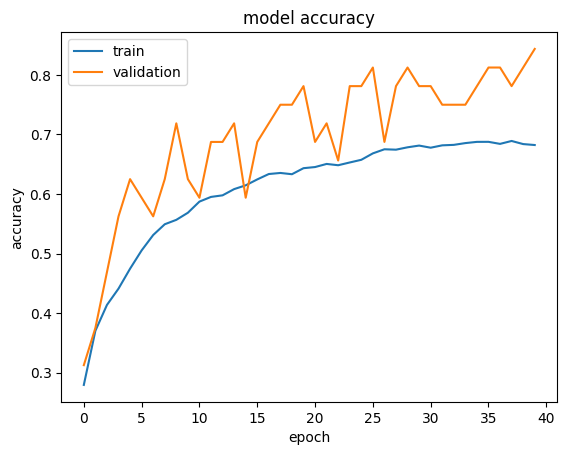

In [30]:
plt.plot(history_2.history["accuracy"])
plt.plot(history_2.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the Model on the Test Set**


In [31]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = model_2.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 0s - loss: 0.4748 - accuracy: 0.7500

4/4 [==============================] - 0s 5ms/step - loss: 0.6463 - accuracy: 0.7109


Loss: 0.6462613344192505, Accuracy: 0.7109375


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


              precision    recall  f1-score   support

       happy       0.89      0.75      0.81        32
     neutral       0.53      0.78      0.63        32
         sad       0.60      0.47      0.53        32
    surprise       0.93      0.84      0.89        32

    accuracy                           0.71       128
   macro avg       0.74      0.71      0.71       128
weighted avg       0.74      0.71      0.71       128



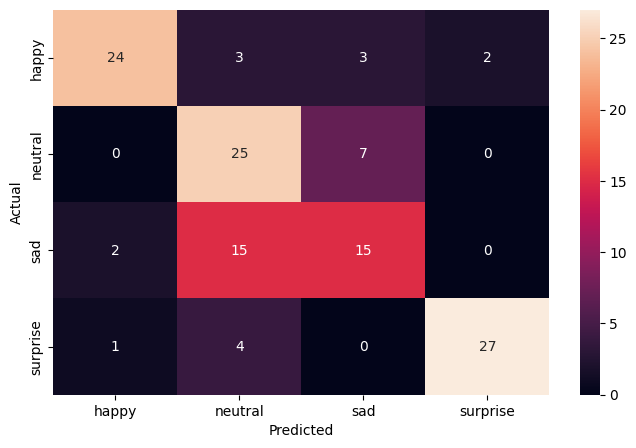

In [32]:
pred_probabilities = model_2.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:**

- The second CNN model, equipped with a more complex architecture of **938,948 parameters**, demonstrates a steady learning curve, indicating effective feature learning with a final training accuracy of approximately 69.08%. The **validation accuracy on training** experiences fluctuations but shows an upward trend, with a peak at around **84.37%**.
- On testing, the model secured a **loss of 0.5975 and an accuracy of 75%**, which confirms its capability to generalize the learned features to new data reasonably well, aligning closely with the observed validation accuracy.
- The confusion matrix reveals the model's proficiency in correctly identifying 'happy' with a high precision of 0.96 and 'surprise' emotions with impressive precision and recall of 0.93 and 0.84, respectively.
- In contrast, the model has room for improvement when predicting 'neutral' and 'sad' emotions, as indicated by lower precision and recall scores. 'Neutral' faces have the lowest precision at 0.56, suggesting the model sometimes confuses this emotion with others, while 'sad' faces have a recall of 0.56, indicating that the model fails to detect a significant portion of this emotion.


## **Think About It:**

- Did the models have a satisfactory performance? If not, then what are the possible reasons?
- Which Color mode showed better overall performance? What are the possible reasons? Do you think having 'rgb' color mode is needed because the images are already black and white?


## **Transfer Learning Architectures**

In this section, we will create several Transfer Learning architectures. For the pre-trained models, we will select three popular architectures namely, VGG16, ResNet v2, and Efficient Net. The difference between these architectures and the previous architectures is that these will require 3 input channels while the earlier ones worked on 'grayscale' images. Therefore, we need to create new DataLoaders.


### **Creating our Data Loaders for Transfer Learning Architectures**

In this section, we are creating data loaders that we will use as inputs to our Neural Network. We will have to go with color_mode = 'rgb' as this is the required format for the transfer learning architectures.


In [33]:
# Set this to 'rgb' as this is the required format for the transfer learning architectures
color_mode = "rgb"
color_layers = 3
# Resize our images to the same size expected by the transfer learning architectures
# img_width, img_height = 224, 224
img_width, img_height = 48, 48
# A batch size of 32 is appropriate for this dataset provide to provide a good balance
# between the model's ability to generalize (avoid overfitting) and computational efficiency.
batch_size = 32

# Training Data Augmentation
train_datagen = ImageDataGenerator(
    # preprocessing_function=preprocess_input,  # Use the appropriate preprocessing function
    rescale=1.0 / 255,  # Normalize pixel values to [0,1]
    rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    shear_range=0.1,  # Small shear transformations for slight perspective changes
    zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
    horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    fill_mode="nearest",  # 'nearest' interpolation for filling in new pixels after a transformation
)

# Validation and Testing Data should not be augmented!
validation_datagen = ImageDataGenerator(rescale=1.0 / 255)
test_datagen = ImageDataGenerator(rescale=1.0 / 255)

# Assuming train_dir, validation_dir, and test_dir should follow the structure in DATADIR and SUBDIRS
train_dir = os.path.join(DATADIR, SUBDIRS_DICT["train"])
validation_dir = os.path.join(DATADIR, SUBDIRS_DICT["validation"])
test_dir = os.path.join(DATADIR, SUBDIRS_DICT["test"])

# Train Generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
)

# Validation Generator
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
)

# Testing Generator
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for testing
)

Found 15109 images belonging to 4 classes.


Found 4977 images belonging to 4 classes.


Found 128 images belonging to 4 classes.


## **VGG16 Model**


### **Importing the VGG16 Architecture**


In [34]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [35]:
vgg_model = VGG16(weights="imagenet", include_top=False, input_shape=(img_width, img_height, color_layers))
# Making all the layers of the VGG model non-trainable. i.e. freezing them
for layer in vgg_model.layers:
    layer.trainable = False

vgg_model.summary()

Model: "vgg16"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 input_1 (InputLayer)        [(None, 48, 48, 3)]       0         


 block1_conv1 (Conv2D)       (None, 48, 48, 64)        1792      


 block1_conv2 (Conv2D)       (None, 48, 48, 64)        36928     


 block1_pool (MaxPooling2D)  (None, 24, 24, 64)        0         


 block2_conv1 (Conv2D)       (None, 24, 24, 128)       73856     


 block2_conv2 (Conv2D)       (None, 24, 24, 128)       147584    


 block2_pool (MaxPooling2D)  (None, 12, 12, 128)       0         


 block3_conv1 (Conv2D)       (None, 12, 12, 256)       295168    


 block3_conv2 (Conv2D)       (None, 12, 12, 256)       590080    


 block3_conv3 (Conv2D)       (None, 12, 12, 256)       590080    


 block3_pool (MaxPooling2D)  (None, 6, 6, 256)         0         


 block4_conv1 (Conv2D)       (None, 6, 6, 512)         1180160   


 block4_conv2 (Conv2D)       (None, 6, 6, 512)         2359808   


 block4_conv3 (Conv2D)       (None, 6, 6, 512)         2359808   


 block4_pool (MaxPooling2D)  (None, 3, 3, 512)         0         


 block5_conv1 (Conv2D)       (None, 3, 3, 512)         2359808   


 block5_conv2 (Conv2D)       (None, 3, 3, 512)         2359808   


 block5_conv3 (Conv2D)       (None, 3, 3, 512)         2359808   


 block5_pool (MaxPooling2D)  (None, 1, 1, 512)         0         


Total params: 14714688 (56.13 MB)


Trainable params: 0 (0.00 Byte)


Non-trainable params: 14714688 (56.13 MB)


_________________________________________________________________


### **Model Building**

- Import VGG16 upto the layer of your choice and add Fully Connected layers on top of it.


In [36]:
new_vgg16_model = Sequential()

# Adding the convolutional part of the VGG16 model from above
new_vgg16_model.add(vgg_model)

# Reduces each feature map to a single value by averaging all elements
new_vgg16_model.add(GlobalAveragePooling2D())

# Adding a dense output layer
new_vgg16_model.add(Dense(512, activation="relu"))
new_vgg16_model.add(Dropout(0.5))
new_vgg16_model.add(Dense(128, activation="relu"))
new_vgg16_model.add(Dropout(0.5))
new_vgg16_model.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the VGG16 Model**


In [37]:
new_vgg16_model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
new_vgg16_model.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 vgg16 (Functional)          (None, 1, 1, 512)         14714688  


 global_average_pooling2d (  (None, 512)               0         


 GlobalAveragePooling2D)                                         


 dense (Dense)               (None, 512)               262656    


 dropout (Dropout)           (None, 512)               0         


 dense_1 (Dense)             (None, 128)               65664     


 dropout_1 (Dropout)         (None, 128)               0         


 dense_2 (Dense)             (None, 4)                 516       


Total params: 15043524 (57.39 MB)


Trainable params: 328836 (1.25 MB)


Non-trainable params: 14714688 (56.13 MB)


_________________________________________________________________


In [38]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 20 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=20
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_vgg16_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_vgg = new_vgg16_model.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[delayed_early_stopping, mc, reduce_lr],
)

Epoch 1/40


  1/473 [..............................] - ETA: 8:41 - loss: 1.6389 - accuracy: 0.2500

  6/473 [..............................] - ETA: 5s - loss: 1.6102 - accuracy: 0.2812  

  9/473 [..............................] - ETA: 6s - loss: 1.6023 - accuracy: 0.2639

 13/473 [..............................] - ETA: 7s - loss: 1.5758 - accuracy: 0.2837

 17/473 [>.............................] - ETA: 7s - loss: 1.5513 - accuracy: 0.2776

 21/473 [>.............................] - ETA: 7s - loss: 1.5475 - accuracy: 0.2783

 25/473 [>.............................] - ETA: 7s - loss: 1.5335 - accuracy: 0.2725

 29/473 [>.............................] - ETA: 7s - loss: 1.5170 - accuracy: 0.2866

 32/473 [=>............................] - ETA: 7s - loss: 1.5175 - accuracy: 0.2822

 36/473 [=>............................] - ETA: 7s - loss: 1.5082 - accuracy: 0.2804

 40/473 [=>............................] - ETA: 6s - loss: 1.4948 - accuracy: 0.2844

 44/473 [=>............................] - ETA: 6s - loss: 1.4916 - accuracy: 0.2855

 48/473 [==>...........................] - ETA: 6s - loss: 1.4799 - accuracy: 0.2865

 52/473 [==>...........................] - ETA: 6s - loss: 1.4705 - accuracy: 0.2891

 56/473 [==>...........................] - ETA: 6s - loss: 1.4606 - accuracy: 0.2907

 60/473 [==>...........................] - ETA: 6s - loss: 1.4552 - accuracy: 0.2917

 64/473 [===>..........................] - ETA: 6s - loss: 1.4489 - accuracy: 0.2959

 68/473 [===>..........................] - ETA: 6s - loss: 1.4464 - accuracy: 0.2964

 72/473 [===>..........................] - ETA: 6s - loss: 1.4423 - accuracy: 0.2977

 76/473 [===>..........................] - ETA: 6s - loss: 1.4369 - accuracy: 0.3010

 80/473 [====>.........................] - ETA: 6s - loss: 1.4320 - accuracy: 0.3027

 84/473 [====>.........................] - ETA: 6s - loss: 1.4324 - accuracy: 0.3017

 88/473 [====>.........................] - ETA: 6s - loss: 1.4280 - accuracy: 0.3047

 92/473 [====>.........................] - ETA: 6s - loss: 1.4216 - accuracy: 0.3098

 96/473 [=====>........................] - ETA: 6s - loss: 1.4155 - accuracy: 0.3115

100/473 [=====>........................] - ETA: 6s - loss: 1.4097 - accuracy: 0.3150

103/473 [=====>........................] - ETA: 6s - loss: 1.4090 - accuracy: 0.3149

106/473 [=====>........................] - ETA: 6s - loss: 1.4079 - accuracy: 0.3146

110/473 [=====>........................] - ETA: 5s - loss: 1.4067 - accuracy: 0.3139

114/473 [======>.......................] - ETA: 5s - loss: 1.4051 - accuracy: 0.3155

118/473 [======>.......................] - ETA: 5s - loss: 1.4005 - accuracy: 0.3165

122/473 [======>.......................] - ETA: 5s - loss: 1.3973 - accuracy: 0.3186

126/473 [======>.......................] - ETA: 5s - loss: 1.3937 - accuracy: 0.3214

130/473 [=======>......................] - ETA: 5s - loss: 1.3906 - accuracy: 0.3224

134/473 [=======>......................] - ETA: 5s - loss: 1.3885 - accuracy: 0.3251

138/473 [=======>......................] - ETA: 5s - loss: 1.3853 - accuracy: 0.3281

142/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.3294

146/473 [========>.....................] - ETA: 5s - loss: 1.3778 - accuracy: 0.3318

150/473 [========>.....................] - ETA: 5s - loss: 1.3754 - accuracy: 0.3346

154/473 [========>.....................] - ETA: 5s - loss: 1.3723 - accuracy: 0.3364

158/473 [=========>....................] - ETA: 5s - loss: 1.3688 - accuracy: 0.3388

162/473 [=========>....................] - ETA: 5s - loss: 1.3678 - accuracy: 0.3389

166/473 [=========>....................] - ETA: 5s - loss: 1.3669 - accuracy: 0.3390

170/473 [=========>....................] - ETA: 4s - loss: 1.3659 - accuracy: 0.3395

174/473 [==========>...................] - ETA: 4s - loss: 1.3644 - accuracy: 0.3407

178/473 [==========>...................] - ETA: 4s - loss: 1.3625 - accuracy: 0.3415

182/473 [==========>...................] - ETA: 4s - loss: 1.3611 - accuracy: 0.3429

186/473 [==========>...................] - ETA: 4s - loss: 1.3602 - accuracy: 0.3434

190/473 [===========>..................] - ETA: 4s - loss: 1.3568 - accuracy: 0.3461

194/473 [===========>..................] - ETA: 4s - loss: 1.3544 - accuracy: 0.3483

198/473 [===========>..................] - ETA: 4s - loss: 1.3539 - accuracy: 0.3475

202/473 [===========>..................] - ETA: 4s - loss: 1.3522 - accuracy: 0.3482

206/473 [============>.................] - ETA: 4s - loss: 1.3509 - accuracy: 0.3492

210/473 [============>.................] - ETA: 4s - loss: 1.3498 - accuracy: 0.3497

214/473 [============>.................] - ETA: 4s - loss: 1.3488 - accuracy: 0.3508

218/473 [============>.................] - ETA: 4s - loss: 1.3476 - accuracy: 0.3503

222/473 [=============>................] - ETA: 4s - loss: 1.3460 - accuracy: 0.3514

226/473 [=============>................] - ETA: 4s - loss: 1.3432 - accuracy: 0.3529

230/473 [=============>................] - ETA: 3s - loss: 1.3408 - accuracy: 0.3548

234/473 [=============>................] - ETA: 3s - loss: 1.3391 - accuracy: 0.3552

238/473 [==============>...............] - ETA: 3s - loss: 1.3391 - accuracy: 0.3562

242/473 [==============>...............] - ETA: 3s - loss: 1.3382 - accuracy: 0.3571

246/473 [==============>...............] - ETA: 3s - loss: 1.3366 - accuracy: 0.3580

250/473 [==============>...............] - ETA: 3s - loss: 1.3353 - accuracy: 0.3591

254/473 [===============>..............] - ETA: 3s - loss: 1.3344 - accuracy: 0.3593

258/473 [===============>..............] - ETA: 3s - loss: 1.3333 - accuracy: 0.3595

262/473 [===============>..............] - ETA: 3s - loss: 1.3316 - accuracy: 0.3612

265/473 [===============>..............] - ETA: 3s - loss: 1.3299 - accuracy: 0.3617

268/473 [===============>..............] - ETA: 3s - loss: 1.3287 - accuracy: 0.3625

272/473 [================>.............] - ETA: 3s - loss: 1.3284 - accuracy: 0.3627

276/473 [================>.............] - ETA: 3s - loss: 1.3277 - accuracy: 0.3635

280/473 [================>.............] - ETA: 3s - loss: 1.3262 - accuracy: 0.3641

284/473 [=================>............] - ETA: 3s - loss: 1.3260 - accuracy: 0.3642

288/473 [=================>............] - ETA: 3s - loss: 1.3253 - accuracy: 0.3648

292/473 [=================>............] - ETA: 2s - loss: 1.3254 - accuracy: 0.3645

296/473 [=================>............] - ETA: 2s - loss: 1.3245 - accuracy: 0.3642

300/473 [==================>...........] - ETA: 2s - loss: 1.3246 - accuracy: 0.3638

304/473 [==================>...........] - ETA: 2s - loss: 1.3241 - accuracy: 0.3641

308/473 [==================>...........] - ETA: 2s - loss: 1.3230 - accuracy: 0.3652

312/473 [==================>...........] - ETA: 2s - loss: 1.3225 - accuracy: 0.3659

316/473 [===================>..........] - ETA: 2s - loss: 1.3222 - accuracy: 0.3670

320/473 [===================>..........] - ETA: 2s - loss: 1.3214 - accuracy: 0.3676

323/473 [===================>..........] - ETA: 2s - loss: 1.3205 - accuracy: 0.3681

327/473 [===================>..........] - ETA: 2s - loss: 1.3193 - accuracy: 0.3687

331/473 [===================>..........] - ETA: 2s - loss: 1.3183 - accuracy: 0.3690

335/473 [====================>.........] - ETA: 2s - loss: 1.3171 - accuracy: 0.3698

339/473 [====================>.........] - ETA: 2s - loss: 1.3158 - accuracy: 0.3704

343/473 [====================>.........] - ETA: 2s - loss: 1.3145 - accuracy: 0.3719

347/473 [=====================>........] - ETA: 2s - loss: 1.3141 - accuracy: 0.3723

350/473 [=====================>........] - ETA: 2s - loss: 1.3143 - accuracy: 0.3723

354/473 [=====================>........] - ETA: 1s - loss: 1.3150 - accuracy: 0.3720

358/473 [=====================>........] - ETA: 1s - loss: 1.3140 - accuracy: 0.3724

362/473 [=====================>........] - ETA: 1s - loss: 1.3140 - accuracy: 0.3728

366/473 [======================>.......] - ETA: 1s - loss: 1.3122 - accuracy: 0.3745

370/473 [======================>.......] - ETA: 1s - loss: 1.3108 - accuracy: 0.3755

374/473 [======================>.......] - ETA: 1s - loss: 1.3097 - accuracy: 0.3764

378/473 [======================>.......] - ETA: 1s - loss: 1.3099 - accuracy: 0.3763

382/473 [=======================>......] - ETA: 1s - loss: 1.3082 - accuracy: 0.3774

386/473 [=======================>......] - ETA: 1s - loss: 1.3081 - accuracy: 0.3775

389/473 [=======================>......] - ETA: 1s - loss: 1.3080 - accuracy: 0.3776

393/473 [=======================>......] - ETA: 1s - loss: 1.3077 - accuracy: 0.3777

397/473 [========================>.....] - ETA: 1s - loss: 1.3076 - accuracy: 0.3785

401/473 [========================>.....] - ETA: 1s - loss: 1.3075 - accuracy: 0.3791

405/473 [========================>.....] - ETA: 1s - loss: 1.3077 - accuracy: 0.3796

409/473 [========================>.....] - ETA: 1s - loss: 1.3066 - accuracy: 0.3806

413/473 [=========================>....] - ETA: 0s - loss: 1.3064 - accuracy: 0.3808

417/473 [=========================>....] - ETA: 0s - loss: 1.3050 - accuracy: 0.3815

421/473 [=========================>....] - ETA: 0s - loss: 1.3042 - accuracy: 0.3818

425/473 [=========================>....] - ETA: 0s - loss: 1.3035 - accuracy: 0.3826

429/473 [==========================>...] - ETA: 0s - loss: 1.3023 - accuracy: 0.3835

433/473 [==========================>...] - ETA: 0s - loss: 1.3016 - accuracy: 0.3840

437/473 [==========================>...] - ETA: 0s - loss: 1.3017 - accuracy: 0.3838

441/473 [==========================>...] - ETA: 0s - loss: 1.3015 - accuracy: 0.3840

445/473 [===========================>..] - ETA: 0s - loss: 1.3014 - accuracy: 0.3843

446/473 [===========================>..] - ETA: 0s - loss: 1.3013 - accuracy: 0.3843

451/473 [===========================>..] - ETA: 0s - loss: 1.3009 - accuracy: 0.3843

454/473 [===========================>..] - ETA: 0s - loss: 1.3004 - accuracy: 0.3846

458/473 [============================>.] - ETA: 0s - loss: 1.3004 - accuracy: 0.3844

462/473 [============================>.] - ETA: 0s - loss: 1.3001 - accuracy: 0.3850

465/473 [============================>.] - ETA: 0s - loss: 1.2993 - accuracy: 0.3856

469/473 [============================>.] - ETA: 0s - loss: 1.2994 - accuracy: 0.3855

473/473 [==============================] - ETA: 0s - loss: 1.2987 - accuracy: 0.3858


Epoch 1: val_accuracy improved from -inf to 0.53125, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_vgg16_20240319-081359.keras


473/473 [==============================] - 9s 17ms/step - loss: 1.2987 - accuracy: 0.3858 - val_loss: 1.0969 - val_accuracy: 0.5312 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 18s - loss: 1.3659 - accuracy: 0.3125

  4/473 [..............................] - ETA: 9s - loss: 1.2316 - accuracy: 0.4062 

  8/473 [..............................] - ETA: 8s - loss: 1.2414 - accuracy: 0.3984

 12/473 [..............................] - ETA: 7s - loss: 1.2343 - accuracy: 0.4089

 16/473 [>.............................] - ETA: 7s - loss: 1.2250 - accuracy: 0.4160

 20/473 [>.............................] - ETA: 7s - loss: 1.2221 - accuracy: 0.4203

 24/473 [>.............................] - ETA: 7s - loss: 1.2337 - accuracy: 0.4154

 27/473 [>.............................] - ETA: 7s - loss: 1.2337 - accuracy: 0.4167

 31/473 [>.............................] - ETA: 7s - loss: 1.2248 - accuracy: 0.4234

 35/473 [=>............................] - ETA: 7s - loss: 1.2286 - accuracy: 0.4223

 39/473 [=>............................] - ETA: 7s - loss: 1.2327 - accuracy: 0.4199

 43/473 [=>............................] - ETA: 7s - loss: 1.2265 - accuracy: 0.4244

 47/473 [=>............................] - ETA: 7s - loss: 1.2233 - accuracy: 0.4275

 51/473 [==>...........................] - ETA: 6s - loss: 1.2305 - accuracy: 0.4185

 55/473 [==>...........................] - ETA: 6s - loss: 1.2323 - accuracy: 0.4193

 59/473 [==>...........................] - ETA: 6s - loss: 1.2345 - accuracy: 0.4195

 63/473 [==>...........................] - ETA: 6s - loss: 1.2328 - accuracy: 0.4226

 67/473 [===>..........................] - ETA: 6s - loss: 1.2352 - accuracy: 0.4216

 71/473 [===>..........................] - ETA: 6s - loss: 1.2355 - accuracy: 0.4225

 75/473 [===>..........................] - ETA: 6s - loss: 1.2330 - accuracy: 0.4246

 79/473 [====>.........................] - ETA: 6s - loss: 1.2347 - accuracy: 0.4229

 83/473 [====>.........................] - ETA: 6s - loss: 1.2391 - accuracy: 0.4202

 87/473 [====>.........................] - ETA: 6s - loss: 1.2344 - accuracy: 0.4253

 90/473 [====>.........................] - ETA: 6s - loss: 1.2352 - accuracy: 0.4233

 93/473 [====>.........................] - ETA: 6s - loss: 1.2363 - accuracy: 0.4217

 96/473 [=====>........................] - ETA: 6s - loss: 1.2336 - accuracy: 0.4245

 98/473 [=====>........................] - ETA: 6s - loss: 1.2317 - accuracy: 0.4267

100/473 [=====>........................] - ETA: 6s - loss: 1.2329 - accuracy: 0.4263

104/473 [=====>........................] - ETA: 6s - loss: 1.2345 - accuracy: 0.4255

108/473 [=====>........................] - ETA: 6s - loss: 1.2319 - accuracy: 0.4262

112/473 [======>.......................] - ETA: 6s - loss: 1.2330 - accuracy: 0.4244

116/473 [======>.......................] - ETA: 5s - loss: 1.2313 - accuracy: 0.4230

120/473 [======>.......................] - ETA: 5s - loss: 1.2309 - accuracy: 0.4227

124/473 [======>.......................] - ETA: 5s - loss: 1.2339 - accuracy: 0.4219

127/473 [=======>......................] - ETA: 5s - loss: 1.2357 - accuracy: 0.4200

130/473 [=======>......................] - ETA: 5s - loss: 1.2355 - accuracy: 0.4192

134/473 [=======>......................] - ETA: 5s - loss: 1.2367 - accuracy: 0.4202

138/473 [=======>......................] - ETA: 5s - loss: 1.2373 - accuracy: 0.4183

142/473 [========>.....................] - ETA: 5s - loss: 1.2375 - accuracy: 0.4184

146/473 [========>.....................] - ETA: 5s - loss: 1.2353 - accuracy: 0.4210

150/473 [========>.....................] - ETA: 5s - loss: 1.2357 - accuracy: 0.4217

154/473 [========>.....................] - ETA: 5s - loss: 1.2352 - accuracy: 0.4229

158/473 [=========>....................] - ETA: 5s - loss: 1.2349 - accuracy: 0.4215

162/473 [=========>....................] - ETA: 5s - loss: 1.2344 - accuracy: 0.4234

166/473 [=========>....................] - ETA: 5s - loss: 1.2348 - accuracy: 0.4241

170/473 [=========>....................] - ETA: 5s - loss: 1.2364 - accuracy: 0.4226

174/473 [==========>...................] - ETA: 4s - loss: 1.2363 - accuracy: 0.4244

178/473 [==========>...................] - ETA: 4s - loss: 1.2361 - accuracy: 0.4263

182/473 [==========>...................] - ETA: 4s - loss: 1.2343 - accuracy: 0.4272

186/473 [==========>...................] - ETA: 4s - loss: 1.2330 - accuracy: 0.4293

190/473 [===========>..................] - ETA: 4s - loss: 1.2341 - accuracy: 0.4286

194/473 [===========>..................] - ETA: 4s - loss: 1.2327 - accuracy: 0.4293

197/473 [===========>..................] - ETA: 4s - loss: 1.2325 - accuracy: 0.4289

201/473 [===========>..................] - ETA: 4s - loss: 1.2310 - accuracy: 0.4297

204/473 [===========>..................] - ETA: 4s - loss: 1.2287 - accuracy: 0.4309

208/473 [============>.................] - ETA: 4s - loss: 1.2283 - accuracy: 0.4306

212/473 [============>.................] - ETA: 4s - loss: 1.2280 - accuracy: 0.4303

216/473 [============>.................] - ETA: 4s - loss: 1.2287 - accuracy: 0.4303

219/473 [============>.................] - ETA: 4s - loss: 1.2284 - accuracy: 0.4301

223/473 [=============>................] - ETA: 4s - loss: 1.2288 - accuracy: 0.4302

227/473 [=============>................] - ETA: 4s - loss: 1.2287 - accuracy: 0.4299

231/473 [=============>................] - ETA: 4s - loss: 1.2280 - accuracy: 0.4305

235/473 [=============>................] - ETA: 3s - loss: 1.2272 - accuracy: 0.4316

238/473 [==============>...............] - ETA: 3s - loss: 1.2264 - accuracy: 0.4324

241/473 [==============>...............] - ETA: 3s - loss: 1.2263 - accuracy: 0.4336

245/473 [==============>...............] - ETA: 3s - loss: 1.2254 - accuracy: 0.4337

249/473 [==============>...............] - ETA: 3s - loss: 1.2258 - accuracy: 0.4336

253/473 [===============>..............] - ETA: 3s - loss: 1.2251 - accuracy: 0.4344

257/473 [===============>..............] - ETA: 3s - loss: 1.2242 - accuracy: 0.4347

261/473 [===============>..............] - ETA: 3s - loss: 1.2254 - accuracy: 0.4337

265/473 [===============>..............] - ETA: 3s - loss: 1.2232 - accuracy: 0.4351

269/473 [================>.............] - ETA: 3s - loss: 1.2234 - accuracy: 0.4348

273/473 [================>.............] - ETA: 3s - loss: 1.2230 - accuracy: 0.4355

277/473 [================>.............] - ETA: 3s - loss: 1.2240 - accuracy: 0.4358

281/473 [================>.............] - ETA: 3s - loss: 1.2253 - accuracy: 0.4350

285/473 [=================>............] - ETA: 3s - loss: 1.2244 - accuracy: 0.4346

289/473 [=================>............] - ETA: 3s - loss: 1.2251 - accuracy: 0.4343

293/473 [=================>............] - ETA: 2s - loss: 1.2250 - accuracy: 0.4346

297/473 [=================>............] - ETA: 2s - loss: 1.2256 - accuracy: 0.4344

301/473 [==================>...........] - ETA: 2s - loss: 1.2256 - accuracy: 0.4343

305/473 [==================>...........] - ETA: 2s - loss: 1.2244 - accuracy: 0.4355

309/473 [==================>...........] - ETA: 2s - loss: 1.2249 - accuracy: 0.4352

313/473 [==================>...........] - ETA: 2s - loss: 1.2254 - accuracy: 0.4357

317/473 [===================>..........] - ETA: 2s - loss: 1.2244 - accuracy: 0.4370

321/473 [===================>..........] - ETA: 2s - loss: 1.2246 - accuracy: 0.4374

325/473 [===================>..........] - ETA: 2s - loss: 1.2237 - accuracy: 0.4381

329/473 [===================>..........] - ETA: 2s - loss: 1.2241 - accuracy: 0.4377

333/473 [====================>.........] - ETA: 2s - loss: 1.2242 - accuracy: 0.4378

337/473 [====================>.........] - ETA: 2s - loss: 1.2243 - accuracy: 0.4379

341/473 [====================>.........] - ETA: 2s - loss: 1.2237 - accuracy: 0.4385

345/473 [====================>.........] - ETA: 2s - loss: 1.2234 - accuracy: 0.4390

349/473 [=====================>........] - ETA: 2s - loss: 1.2232 - accuracy: 0.4394

353/473 [=====================>........] - ETA: 1s - loss: 1.2234 - accuracy: 0.4385

357/473 [=====================>........] - ETA: 1s - loss: 1.2221 - accuracy: 0.4391

361/473 [=====================>........] - ETA: 1s - loss: 1.2219 - accuracy: 0.4390

365/473 [======================>.......] - ETA: 1s - loss: 1.2214 - accuracy: 0.4391

369/473 [======================>.......] - ETA: 1s - loss: 1.2218 - accuracy: 0.4385

373/473 [======================>.......] - ETA: 1s - loss: 1.2216 - accuracy: 0.4388

377/473 [======================>.......] - ETA: 1s - loss: 1.2213 - accuracy: 0.4391

381/473 [=======================>......] - ETA: 1s - loss: 1.2221 - accuracy: 0.4379

385/473 [=======================>......] - ETA: 1s - loss: 1.2217 - accuracy: 0.4379

389/473 [=======================>......] - ETA: 1s - loss: 1.2216 - accuracy: 0.4373

393/473 [=======================>......] - ETA: 1s - loss: 1.2218 - accuracy: 0.4371

397/473 [========================>.....] - ETA: 1s - loss: 1.2210 - accuracy: 0.4372

401/473 [========================>.....] - ETA: 1s - loss: 1.2216 - accuracy: 0.4366

405/473 [========================>.....] - ETA: 1s - loss: 1.2210 - accuracy: 0.4370

409/473 [========================>.....] - ETA: 1s - loss: 1.2203 - accuracy: 0.4373

413/473 [=========================>....] - ETA: 0s - loss: 1.2194 - accuracy: 0.4381

417/473 [=========================>....] - ETA: 0s - loss: 1.2188 - accuracy: 0.4382

421/473 [=========================>....] - ETA: 0s - loss: 1.2189 - accuracy: 0.4381

425/473 [=========================>....] - ETA: 0s - loss: 1.2189 - accuracy: 0.4381

429/473 [==========================>...] - ETA: 0s - loss: 1.2190 - accuracy: 0.4386

433/473 [==========================>...] - ETA: 0s - loss: 1.2193 - accuracy: 0.4381

437/473 [==========================>...] - ETA: 0s - loss: 1.2187 - accuracy: 0.4385

441/473 [==========================>...] - ETA: 0s - loss: 1.2193 - accuracy: 0.4383

445/473 [===========================>..] - ETA: 0s - loss: 1.2193 - accuracy: 0.4385

449/473 [===========================>..] - ETA: 0s - loss: 1.2195 - accuracy: 0.4389

453/473 [===========================>..] - ETA: 0s - loss: 1.2194 - accuracy: 0.4388

457/473 [===========================>..] - ETA: 0s - loss: 1.2195 - accuracy: 0.4386

461/473 [============================>.] - ETA: 0s - loss: 1.2195 - accuracy: 0.4382

465/473 [============================>.] - ETA: 0s - loss: 1.2194 - accuracy: 0.4384

469/473 [============================>.] - ETA: 0s - loss: 1.2191 - accuracy: 0.4390

473/473 [==============================] - ETA: 0s - loss: 1.2191 - accuracy: 0.4395


Epoch 2: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 16ms/step - loss: 1.2191 - accuracy: 0.4395 - val_loss: 1.1261 - val_accuracy: 0.4688 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 12s - loss: 1.0364 - accuracy: 0.5000

  5/473 [..............................] - ETA: 7s - loss: 1.1460 - accuracy: 0.4688 

  9/473 [..............................] - ETA: 7s - loss: 1.1416 - accuracy: 0.5069

 13/473 [..............................] - ETA: 7s - loss: 1.1736 - accuracy: 0.4904

 17/473 [>.............................] - ETA: 7s - loss: 1.1664 - accuracy: 0.4853

 21/473 [>.............................] - ETA: 7s - loss: 1.1691 - accuracy: 0.4732

 25/473 [>.............................] - ETA: 7s - loss: 1.1714 - accuracy: 0.4688

 29/473 [>.............................] - ETA: 7s - loss: 1.1820 - accuracy: 0.4601

 32/473 [=>............................] - ETA: 7s - loss: 1.1768 - accuracy: 0.4639

 36/473 [=>............................] - ETA: 7s - loss: 1.1891 - accuracy: 0.4523

 40/473 [=>............................] - ETA: 7s - loss: 1.1886 - accuracy: 0.4484

 44/473 [=>............................] - ETA: 7s - loss: 1.1906 - accuracy: 0.4510

 48/473 [==>...........................] - ETA: 6s - loss: 1.1964 - accuracy: 0.4479

 52/473 [==>...........................] - ETA: 6s - loss: 1.1943 - accuracy: 0.4495

 56/473 [==>...........................] - ETA: 6s - loss: 1.1943 - accuracy: 0.4537

 60/473 [==>...........................] - ETA: 6s - loss: 1.1943 - accuracy: 0.4589

 64/473 [===>..........................] - ETA: 6s - loss: 1.1982 - accuracy: 0.4570

 68/473 [===>..........................] - ETA: 6s - loss: 1.2009 - accuracy: 0.4568

 72/473 [===>..........................] - ETA: 6s - loss: 1.1962 - accuracy: 0.4605

 76/473 [===>..........................] - ETA: 6s - loss: 1.1976 - accuracy: 0.4585

 79/473 [====>.........................] - ETA: 6s - loss: 1.1942 - accuracy: 0.4612

 83/473 [====>.........................] - ETA: 6s - loss: 1.1925 - accuracy: 0.4627

 87/473 [====>.........................] - ETA: 6s - loss: 1.1900 - accuracy: 0.4623

 91/473 [====>.........................] - ETA: 6s - loss: 1.1925 - accuracy: 0.4605

 95/473 [=====>........................] - ETA: 6s - loss: 1.1967 - accuracy: 0.4569

 99/473 [=====>........................] - ETA: 6s - loss: 1.2013 - accuracy: 0.4549

103/473 [=====>........................] - ETA: 6s - loss: 1.2005 - accuracy: 0.4557

107/473 [=====>........................] - ETA: 5s - loss: 1.1981 - accuracy: 0.4562

111/473 [======>.......................] - ETA: 5s - loss: 1.2007 - accuracy: 0.4552

115/473 [======>.......................] - ETA: 5s - loss: 1.1991 - accuracy: 0.4568

119/473 [======>.......................] - ETA: 5s - loss: 1.1974 - accuracy: 0.4588

123/473 [======>.......................] - ETA: 5s - loss: 1.1960 - accuracy: 0.4588

127/473 [=======>......................] - ETA: 5s - loss: 1.1999 - accuracy: 0.4582

131/473 [=======>......................] - ETA: 5s - loss: 1.2010 - accuracy: 0.4563

135/473 [=======>......................] - ETA: 5s - loss: 1.2033 - accuracy: 0.4558

139/473 [=======>......................] - ETA: 5s - loss: 1.2018 - accuracy: 0.4571

143/473 [========>.....................] - ETA: 5s - loss: 1.2025 - accuracy: 0.4569

147/473 [========>.....................] - ETA: 5s - loss: 1.2034 - accuracy: 0.4566

151/473 [========>.....................] - ETA: 5s - loss: 1.2035 - accuracy: 0.4572

155/473 [========>.....................] - ETA: 5s - loss: 1.2036 - accuracy: 0.4567

159/473 [=========>....................] - ETA: 5s - loss: 1.2052 - accuracy: 0.4560

163/473 [=========>....................] - ETA: 5s - loss: 1.2050 - accuracy: 0.4555

167/473 [=========>....................] - ETA: 4s - loss: 1.2036 - accuracy: 0.4566

171/473 [=========>....................] - ETA: 4s - loss: 1.2023 - accuracy: 0.4582

175/473 [==========>...................] - ETA: 4s - loss: 1.2034 - accuracy: 0.4573

179/473 [==========>...................] - ETA: 4s - loss: 1.2040 - accuracy: 0.4578

183/473 [==========>...................] - ETA: 4s - loss: 1.2019 - accuracy: 0.4583

187/473 [==========>...................] - ETA: 4s - loss: 1.2013 - accuracy: 0.4587

191/473 [===========>..................] - ETA: 4s - loss: 1.2018 - accuracy: 0.4584

195/473 [===========>..................] - ETA: 4s - loss: 1.1994 - accuracy: 0.4596

199/473 [===========>..................] - ETA: 4s - loss: 1.1996 - accuracy: 0.4601

203/473 [===========>..................] - ETA: 4s - loss: 1.2000 - accuracy: 0.4597

207/473 [============>.................] - ETA: 4s - loss: 1.2004 - accuracy: 0.4595

211/473 [============>.................] - ETA: 4s - loss: 1.2008 - accuracy: 0.4600

215/473 [============>.................] - ETA: 4s - loss: 1.2010 - accuracy: 0.4597

219/473 [============>.................] - ETA: 4s - loss: 1.2008 - accuracy: 0.4605

223/473 [=============>................] - ETA: 4s - loss: 1.2022 - accuracy: 0.4601

227/473 [=============>................] - ETA: 3s - loss: 1.2029 - accuracy: 0.4588

231/473 [=============>................] - ETA: 3s - loss: 1.2040 - accuracy: 0.4577

235/473 [=============>................] - ETA: 3s - loss: 1.2048 - accuracy: 0.4578

239/473 [==============>...............] - ETA: 3s - loss: 1.2037 - accuracy: 0.4580

243/473 [==============>...............] - ETA: 3s - loss: 1.2041 - accuracy: 0.4577

247/473 [==============>...............] - ETA: 3s - loss: 1.2041 - accuracy: 0.4571

251/473 [==============>...............] - ETA: 3s - loss: 1.2036 - accuracy: 0.4583

255/473 [===============>..............] - ETA: 3s - loss: 1.2033 - accuracy: 0.4589

259/473 [===============>..............] - ETA: 3s - loss: 1.2030 - accuracy: 0.4589

263/473 [===============>..............] - ETA: 3s - loss: 1.2038 - accuracy: 0.4588

267/473 [===============>..............] - ETA: 3s - loss: 1.2022 - accuracy: 0.4601

271/473 [================>.............] - ETA: 3s - loss: 1.2019 - accuracy: 0.4595

275/473 [================>.............] - ETA: 3s - loss: 1.2009 - accuracy: 0.4605

279/473 [================>.............] - ETA: 3s - loss: 1.1996 - accuracy: 0.4616

283/473 [================>.............] - ETA: 3s - loss: 1.1997 - accuracy: 0.4616

287/473 [=================>............] - ETA: 3s - loss: 1.1996 - accuracy: 0.4608

291/473 [=================>............] - ETA: 2s - loss: 1.2001 - accuracy: 0.4601

295/473 [=================>............] - ETA: 2s - loss: 1.2005 - accuracy: 0.4590

299/473 [=================>............] - ETA: 2s - loss: 1.2005 - accuracy: 0.4590

303/473 [==================>...........] - ETA: 2s - loss: 1.2000 - accuracy: 0.4596

307/473 [==================>...........] - ETA: 2s - loss: 1.2004 - accuracy: 0.4591

311/473 [==================>...........] - ETA: 2s - loss: 1.1998 - accuracy: 0.4593

315/473 [==================>...........] - ETA: 2s - loss: 1.1994 - accuracy: 0.4595

319/473 [===================>..........] - ETA: 2s - loss: 1.1998 - accuracy: 0.4592

323/473 [===================>..........] - ETA: 2s - loss: 1.2001 - accuracy: 0.4593

327/473 [===================>..........] - ETA: 2s - loss: 1.1993 - accuracy: 0.4597

331/473 [===================>..........] - ETA: 2s - loss: 1.2002 - accuracy: 0.4586

334/473 [====================>.........] - ETA: 2s - loss: 1.1997 - accuracy: 0.4591

337/473 [====================>.........] - ETA: 2s - loss: 1.2003 - accuracy: 0.4589

341/473 [====================>.........] - ETA: 2s - loss: 1.1999 - accuracy: 0.4578

345/473 [====================>.........] - ETA: 2s - loss: 1.1999 - accuracy: 0.4580

349/473 [=====================>........] - ETA: 2s - loss: 1.2005 - accuracy: 0.4579

353/473 [=====================>........] - ETA: 1s - loss: 1.2019 - accuracy: 0.4567

357/473 [=====================>........] - ETA: 1s - loss: 1.2021 - accuracy: 0.4565

361/473 [=====================>........] - ETA: 1s - loss: 1.2020 - accuracy: 0.4569

365/473 [======================>.......] - ETA: 1s - loss: 1.2011 - accuracy: 0.4574

369/473 [======================>.......] - ETA: 1s - loss: 1.2016 - accuracy: 0.4569

373/473 [======================>.......] - ETA: 1s - loss: 1.2025 - accuracy: 0.4565

377/473 [======================>.......] - ETA: 1s - loss: 1.2028 - accuracy: 0.4568

381/473 [=======================>......] - ETA: 1s - loss: 1.2027 - accuracy: 0.4569

385/473 [=======================>......] - ETA: 1s - loss: 1.2029 - accuracy: 0.4570

389/473 [=======================>......] - ETA: 1s - loss: 1.2032 - accuracy: 0.4568

393/473 [=======================>......] - ETA: 1s - loss: 1.2040 - accuracy: 0.4563

397/473 [========================>.....] - ETA: 1s - loss: 1.2036 - accuracy: 0.4559

401/473 [========================>.....] - ETA: 1s - loss: 1.2036 - accuracy: 0.4557

405/473 [========================>.....] - ETA: 1s - loss: 1.2037 - accuracy: 0.4563

408/473 [========================>.....] - ETA: 1s - loss: 1.2039 - accuracy: 0.4558

412/473 [=========================>....] - ETA: 0s - loss: 1.2033 - accuracy: 0.4561

416/473 [=========================>....] - ETA: 0s - loss: 1.2029 - accuracy: 0.4558

420/473 [=========================>....] - ETA: 0s - loss: 1.2025 - accuracy: 0.4557

424/473 [=========================>....] - ETA: 0s - loss: 1.2035 - accuracy: 0.4555

427/473 [==========================>...] - ETA: 0s - loss: 1.2032 - accuracy: 0.4559

431/473 [==========================>...] - ETA: 0s - loss: 1.2022 - accuracy: 0.4567

435/473 [==========================>...] - ETA: 0s - loss: 1.2022 - accuracy: 0.4567

439/473 [==========================>...] - ETA: 0s - loss: 1.2021 - accuracy: 0.4564

443/473 [===========================>..] - ETA: 0s - loss: 1.2019 - accuracy: 0.4569

447/473 [===========================>..] - ETA: 0s - loss: 1.2012 - accuracy: 0.4573

451/473 [===========================>..] - ETA: 0s - loss: 1.2014 - accuracy: 0.4572

455/473 [===========================>..] - ETA: 0s - loss: 1.2014 - accuracy: 0.4571

459/473 [============================>.] - ETA: 0s - loss: 1.2008 - accuracy: 0.4574

462/473 [============================>.] - ETA: 0s - loss: 1.2000 - accuracy: 0.4579

466/473 [============================>.] - ETA: 0s - loss: 1.2002 - accuracy: 0.4576

470/473 [============================>.] - ETA: 0s - loss: 1.1989 - accuracy: 0.4585

473/473 [==============================] - ETA: 0s - loss: 1.1985 - accuracy: 0.4585


Epoch 3: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 16ms/step - loss: 1.1985 - accuracy: 0.4585 - val_loss: 1.0898 - val_accuracy: 0.5000 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 12s - loss: 1.1633 - accuracy: 0.4375

  4/473 [..............................] - ETA: 7s - loss: 1.1719 - accuracy: 0.4844 

  8/473 [..............................] - ETA: 7s - loss: 1.1536 - accuracy: 0.4766

 12/473 [..............................] - ETA: 7s - loss: 1.1383 - accuracy: 0.4948

 16/473 [>.............................] - ETA: 7s - loss: 1.1509 - accuracy: 0.4941

 20/473 [>.............................] - ETA: 7s - loss: 1.1667 - accuracy: 0.4781

 24/473 [>.............................] - ETA: 7s - loss: 1.1674 - accuracy: 0.4753

 28/473 [>.............................] - ETA: 7s - loss: 1.1647 - accuracy: 0.4732

 32/473 [=>............................] - ETA: 7s - loss: 1.1692 - accuracy: 0.4707

 36/473 [=>............................] - ETA: 7s - loss: 1.1694 - accuracy: 0.4644

 39/473 [=>............................] - ETA: 7s - loss: 1.1756 - accuracy: 0.4639

 43/473 [=>............................] - ETA: 7s - loss: 1.1719 - accuracy: 0.4688

 46/473 [=>............................] - ETA: 7s - loss: 1.1724 - accuracy: 0.4681

 50/473 [==>...........................] - ETA: 6s - loss: 1.1774 - accuracy: 0.4719

 54/473 [==>...........................] - ETA: 6s - loss: 1.1781 - accuracy: 0.4705

 58/473 [==>...........................] - ETA: 6s - loss: 1.1771 - accuracy: 0.4763

 61/473 [==>...........................] - ETA: 6s - loss: 1.1753 - accuracy: 0.4790

 64/473 [===>..........................] - ETA: 6s - loss: 1.1773 - accuracy: 0.4766

 68/473 [===>..........................] - ETA: 6s - loss: 1.1738 - accuracy: 0.4779

 72/473 [===>..........................] - ETA: 6s - loss: 1.1729 - accuracy: 0.4783

 76/473 [===>..........................] - ETA: 6s - loss: 1.1762 - accuracy: 0.4762

 79/473 [====>.........................] - ETA: 6s - loss: 1.1775 - accuracy: 0.4735

 83/473 [====>.........................] - ETA: 6s - loss: 1.1757 - accuracy: 0.4748

 86/473 [====>.........................] - ETA: 6s - loss: 1.1773 - accuracy: 0.4738

 90/473 [====>.........................] - ETA: 6s - loss: 1.1786 - accuracy: 0.4726

 94/473 [====>.........................] - ETA: 6s - loss: 1.1781 - accuracy: 0.4747

 98/473 [=====>........................] - ETA: 6s - loss: 1.1825 - accuracy: 0.4702

101/473 [=====>........................] - ETA: 6s - loss: 1.1836 - accuracy: 0.4680

104/473 [=====>........................] - ETA: 6s - loss: 1.1853 - accuracy: 0.4656

107/473 [=====>........................] - ETA: 5s - loss: 1.1860 - accuracy: 0.4642

110/473 [=====>........................] - ETA: 5s - loss: 1.1845 - accuracy: 0.4649

114/473 [======>.......................] - ETA: 5s - loss: 1.1860 - accuracy: 0.4629

118/473 [======>.......................] - ETA: 5s - loss: 1.1839 - accuracy: 0.4644

122/473 [======>.......................] - ETA: 5s - loss: 1.1836 - accuracy: 0.4645

126/473 [======>.......................] - ETA: 5s - loss: 1.1799 - accuracy: 0.4659

129/473 [=======>......................] - ETA: 5s - loss: 1.1807 - accuracy: 0.4653

133/473 [=======>......................] - ETA: 5s - loss: 1.1806 - accuracy: 0.4646

136/473 [=======>......................] - ETA: 5s - loss: 1.1824 - accuracy: 0.4650

140/473 [=======>......................] - ETA: 5s - loss: 1.1839 - accuracy: 0.4651

144/473 [========>.....................] - ETA: 5s - loss: 1.1841 - accuracy: 0.4654

148/473 [========>.....................] - ETA: 5s - loss: 1.1816 - accuracy: 0.4655

152/473 [========>.....................] - ETA: 5s - loss: 1.1810 - accuracy: 0.4658

156/473 [========>.....................] - ETA: 5s - loss: 1.1805 - accuracy: 0.4655

160/473 [=========>....................] - ETA: 5s - loss: 1.1796 - accuracy: 0.4673

164/473 [=========>....................] - ETA: 5s - loss: 1.1777 - accuracy: 0.4673

168/473 [=========>....................] - ETA: 5s - loss: 1.1775 - accuracy: 0.4674

172/473 [=========>....................] - ETA: 4s - loss: 1.1781 - accuracy: 0.4669

176/473 [==========>...................] - ETA: 4s - loss: 1.1783 - accuracy: 0.4676

180/473 [==========>...................] - ETA: 4s - loss: 1.1775 - accuracy: 0.4690

184/473 [==========>...................] - ETA: 4s - loss: 1.1782 - accuracy: 0.4687

188/473 [==========>...................] - ETA: 4s - loss: 1.1774 - accuracy: 0.4699

192/473 [===========>..................] - ETA: 4s - loss: 1.1775 - accuracy: 0.4685

196/473 [===========>..................] - ETA: 4s - loss: 1.1766 - accuracy: 0.4698

200/473 [===========>..................] - ETA: 4s - loss: 1.1774 - accuracy: 0.4701

204/473 [===========>..................] - ETA: 4s - loss: 1.1777 - accuracy: 0.4712

208/473 [============>.................] - ETA: 4s - loss: 1.1787 - accuracy: 0.4701

212/473 [============>.................] - ETA: 4s - loss: 1.1777 - accuracy: 0.4705

216/473 [============>.................] - ETA: 4s - loss: 1.1775 - accuracy: 0.4703

220/473 [============>.................] - ETA: 4s - loss: 1.1781 - accuracy: 0.4703

224/473 [=============>................] - ETA: 4s - loss: 1.1794 - accuracy: 0.4690

228/473 [=============>................] - ETA: 4s - loss: 1.1794 - accuracy: 0.4693

232/473 [=============>................] - ETA: 3s - loss: 1.1795 - accuracy: 0.4684

236/473 [=============>................] - ETA: 3s - loss: 1.1787 - accuracy: 0.4690

240/473 [==============>...............] - ETA: 3s - loss: 1.1783 - accuracy: 0.4695

244/473 [==============>...............] - ETA: 3s - loss: 1.1768 - accuracy: 0.4699

248/473 [==============>...............] - ETA: 3s - loss: 1.1782 - accuracy: 0.4686

252/473 [==============>...............] - ETA: 3s - loss: 1.1794 - accuracy: 0.4681

255/473 [===============>..............] - ETA: 3s - loss: 1.1790 - accuracy: 0.4685

259/473 [===============>..............] - ETA: 3s - loss: 1.1780 - accuracy: 0.4688

263/473 [===============>..............] - ETA: 3s - loss: 1.1778 - accuracy: 0.4697

267/473 [===============>..............] - ETA: 3s - loss: 1.1774 - accuracy: 0.4694

271/473 [================>.............] - ETA: 3s - loss: 1.1771 - accuracy: 0.4694

275/473 [================>.............] - ETA: 3s - loss: 1.1761 - accuracy: 0.4708

279/473 [================>.............] - ETA: 3s - loss: 1.1765 - accuracy: 0.4711

283/473 [================>.............] - ETA: 3s - loss: 1.1750 - accuracy: 0.4730

287/473 [=================>............] - ETA: 3s - loss: 1.1741 - accuracy: 0.4732

290/473 [=================>............] - ETA: 2s - loss: 1.1731 - accuracy: 0.4734

294/473 [=================>............] - ETA: 2s - loss: 1.1736 - accuracy: 0.4738

298/473 [=================>............] - ETA: 2s - loss: 1.1739 - accuracy: 0.4740

302/473 [==================>...........] - ETA: 2s - loss: 1.1754 - accuracy: 0.4738

306/473 [==================>...........] - ETA: 2s - loss: 1.1757 - accuracy: 0.4734

310/473 [==================>...........] - ETA: 2s - loss: 1.1761 - accuracy: 0.4728

314/473 [==================>...........] - ETA: 2s - loss: 1.1761 - accuracy: 0.4728

317/473 [===================>..........] - ETA: 2s - loss: 1.1761 - accuracy: 0.4726

320/473 [===================>..........] - ETA: 2s - loss: 1.1762 - accuracy: 0.4728

324/473 [===================>..........] - ETA: 2s - loss: 1.1750 - accuracy: 0.4734

328/473 [===================>..........] - ETA: 2s - loss: 1.1747 - accuracy: 0.4732

332/473 [====================>.........] - ETA: 2s - loss: 1.1746 - accuracy: 0.4731

336/473 [====================>.........] - ETA: 2s - loss: 1.1738 - accuracy: 0.4738

340/473 [====================>.........] - ETA: 2s - loss: 1.1728 - accuracy: 0.4740

344/473 [====================>.........] - ETA: 2s - loss: 1.1726 - accuracy: 0.4739

348/473 [=====================>........] - ETA: 2s - loss: 1.1721 - accuracy: 0.4740

352/473 [=====================>........] - ETA: 1s - loss: 1.1729 - accuracy: 0.4736

356/473 [=====================>........] - ETA: 1s - loss: 1.1725 - accuracy: 0.4740

360/473 [=====================>........] - ETA: 1s - loss: 1.1719 - accuracy: 0.4744

364/473 [======================>.......] - ETA: 1s - loss: 1.1720 - accuracy: 0.4742

368/473 [======================>.......] - ETA: 1s - loss: 1.1715 - accuracy: 0.4751

372/473 [======================>.......] - ETA: 1s - loss: 1.1727 - accuracy: 0.4749

376/473 [======================>.......] - ETA: 1s - loss: 1.1731 - accuracy: 0.4751

380/473 [=======================>......] - ETA: 1s - loss: 1.1725 - accuracy: 0.4752

384/473 [=======================>......] - ETA: 1s - loss: 1.1727 - accuracy: 0.4752

387/473 [=======================>......] - ETA: 1s - loss: 1.1732 - accuracy: 0.4749

391/473 [=======================>......] - ETA: 1s - loss: 1.1727 - accuracy: 0.4756

394/473 [=======================>......] - ETA: 1s - loss: 1.1725 - accuracy: 0.4756

398/473 [========================>.....] - ETA: 1s - loss: 1.1721 - accuracy: 0.4760

402/473 [========================>.....] - ETA: 1s - loss: 1.1728 - accuracy: 0.4755

406/473 [========================>.....] - ETA: 1s - loss: 1.1726 - accuracy: 0.4750

409/473 [========================>.....] - ETA: 1s - loss: 1.1721 - accuracy: 0.4757

412/473 [=========================>....] - ETA: 1s - loss: 1.1725 - accuracy: 0.4753

416/473 [=========================>....] - ETA: 0s - loss: 1.1722 - accuracy: 0.4754

419/473 [=========================>....] - ETA: 0s - loss: 1.1724 - accuracy: 0.4752

423/473 [=========================>....] - ETA: 0s - loss: 1.1729 - accuracy: 0.4746

427/473 [==========================>...] - ETA: 0s - loss: 1.1737 - accuracy: 0.4742

431/473 [==========================>...] - ETA: 0s - loss: 1.1738 - accuracy: 0.4743

434/473 [==========================>...] - ETA: 0s - loss: 1.1733 - accuracy: 0.4744

437/473 [==========================>...] - ETA: 0s - loss: 1.1731 - accuracy: 0.4747

441/473 [==========================>...] - ETA: 0s - loss: 1.1726 - accuracy: 0.4750

445/473 [===========================>..] - ETA: 0s - loss: 1.1733 - accuracy: 0.4746

449/473 [===========================>..] - ETA: 0s - loss: 1.1731 - accuracy: 0.4747

453/473 [===========================>..] - ETA: 0s - loss: 1.1733 - accuracy: 0.4747

457/473 [===========================>..] - ETA: 0s - loss: 1.1729 - accuracy: 0.4753

460/473 [============================>.] - ETA: 0s - loss: 1.1732 - accuracy: 0.4752

463/473 [============================>.] - ETA: 0s - loss: 1.1725 - accuracy: 0.4758

467/473 [============================>.] - ETA: 0s - loss: 1.1723 - accuracy: 0.4761

470/473 [============================>.] - ETA: 0s - loss: 1.1720 - accuracy: 0.4763


Epoch 4: val_accuracy improved from 0.53125 to 0.56250, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_vgg16_20240319-081359.keras


473/473 [==============================] - 8s 18ms/step - loss: 1.1716 - accuracy: 0.4767 - val_loss: 1.0846 - val_accuracy: 0.5625 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 14s - loss: 1.2425 - accuracy: 0.4062

  3/473 [..............................] - ETA: 14s - loss: 1.1964 - accuracy: 0.4583

  6/473 [..............................] - ETA: 10s - loss: 1.2422 - accuracy: 0.4271

  9/473 [..............................] - ETA: 9s - loss: 1.2312 - accuracy: 0.4375 

 12/473 [..............................] - ETA: 8s - loss: 1.2302 - accuracy: 0.4297

 15/473 [..............................] - ETA: 8s - loss: 1.2102 - accuracy: 0.4354

 18/473 [>.............................] - ETA: 8s - loss: 1.2023 - accuracy: 0.4392

 21/473 [>.............................] - ETA: 8s - loss: 1.1942 - accuracy: 0.4509

 24/473 [>.............................] - ETA: 8s - loss: 1.1938 - accuracy: 0.4557

 28/473 [>.............................] - ETA: 7s - loss: 1.1735 - accuracy: 0.4676

 32/473 [=>............................] - ETA: 7s - loss: 1.1842 - accuracy: 0.4648

 35/473 [=>............................] - ETA: 7s - loss: 1.1838 - accuracy: 0.4705

 39/473 [=>............................] - ETA: 7s - loss: 1.1821 - accuracy: 0.4688

 42/473 [=>............................] - ETA: 7s - loss: 1.1835 - accuracy: 0.4695

 46/473 [=>............................] - ETA: 7s - loss: 1.1820 - accuracy: 0.4708

 50/473 [==>...........................] - ETA: 7s - loss: 1.1884 - accuracy: 0.4694

 53/473 [==>...........................] - ETA: 7s - loss: 1.1877 - accuracy: 0.4711

 56/473 [==>...........................] - ETA: 7s - loss: 1.1931 - accuracy: 0.4693

 59/473 [==>...........................] - ETA: 7s - loss: 1.1914 - accuracy: 0.4709

 63/473 [==>...........................] - ETA: 7s - loss: 1.1875 - accuracy: 0.4752

 66/473 [===>..........................] - ETA: 7s - loss: 1.1855 - accuracy: 0.4777

 69/473 [===>..........................] - ETA: 7s - loss: 1.1827 - accuracy: 0.4796

 73/473 [===>..........................] - ETA: 6s - loss: 1.1814 - accuracy: 0.4790

 77/473 [===>..........................] - ETA: 6s - loss: 1.1823 - accuracy: 0.4797

 81/473 [====>.........................] - ETA: 6s - loss: 1.1824 - accuracy: 0.4788

 85/473 [====>.........................] - ETA: 6s - loss: 1.1846 - accuracy: 0.4757

 89/473 [====>.........................] - ETA: 6s - loss: 1.1851 - accuracy: 0.4730

 93/473 [====>.........................] - ETA: 6s - loss: 1.1848 - accuracy: 0.4731

 97/473 [=====>........................] - ETA: 6s - loss: 1.1858 - accuracy: 0.4742

101/473 [=====>........................] - ETA: 6s - loss: 1.1854 - accuracy: 0.4740

105/473 [=====>........................] - ETA: 6s - loss: 1.1885 - accuracy: 0.4699

109/473 [=====>........................] - ETA: 6s - loss: 1.1908 - accuracy: 0.4690

113/473 [======>.......................] - ETA: 6s - loss: 1.1891 - accuracy: 0.4715

117/473 [======>.......................] - ETA: 6s - loss: 1.1894 - accuracy: 0.4712

121/473 [======>.......................] - ETA: 5s - loss: 1.1876 - accuracy: 0.4703

125/473 [======>.......................] - ETA: 5s - loss: 1.1896 - accuracy: 0.4700

128/473 [=======>......................] - ETA: 5s - loss: 1.1894 - accuracy: 0.4690

131/473 [=======>......................] - ETA: 5s - loss: 1.1875 - accuracy: 0.4709

135/473 [=======>......................] - ETA: 5s - loss: 1.1878 - accuracy: 0.4715

138/473 [=======>......................] - ETA: 5s - loss: 1.1877 - accuracy: 0.4715

142/473 [========>.....................] - ETA: 5s - loss: 1.1868 - accuracy: 0.4710

146/473 [========>.....................] - ETA: 5s - loss: 1.1875 - accuracy: 0.4711

150/473 [========>.....................] - ETA: 5s - loss: 1.1857 - accuracy: 0.4723

154/473 [========>.....................] - ETA: 5s - loss: 1.1839 - accuracy: 0.4738

158/473 [=========>....................] - ETA: 5s - loss: 1.1818 - accuracy: 0.4757

162/473 [=========>....................] - ETA: 5s - loss: 1.1799 - accuracy: 0.4786

166/473 [=========>....................] - ETA: 5s - loss: 1.1783 - accuracy: 0.4778

170/473 [=========>....................] - ETA: 5s - loss: 1.1772 - accuracy: 0.4783

174/473 [==========>...................] - ETA: 5s - loss: 1.1752 - accuracy: 0.4797

178/473 [==========>...................] - ETA: 4s - loss: 1.1765 - accuracy: 0.4791

182/473 [==========>...................] - ETA: 4s - loss: 1.1760 - accuracy: 0.4789

186/473 [==========>...................] - ETA: 4s - loss: 1.1752 - accuracy: 0.4793

190/473 [===========>..................] - ETA: 4s - loss: 1.1761 - accuracy: 0.4789

194/473 [===========>..................] - ETA: 4s - loss: 1.1754 - accuracy: 0.4800

198/473 [===========>..................] - ETA: 4s - loss: 1.1763 - accuracy: 0.4792

202/473 [===========>..................] - ETA: 4s - loss: 1.1742 - accuracy: 0.4808

206/473 [============>.................] - ETA: 4s - loss: 1.1754 - accuracy: 0.4797

210/473 [============>.................] - ETA: 4s - loss: 1.1749 - accuracy: 0.4792

214/473 [============>.................] - ETA: 4s - loss: 1.1728 - accuracy: 0.4798

218/473 [============>.................] - ETA: 4s - loss: 1.1723 - accuracy: 0.4802

222/473 [=============>................] - ETA: 4s - loss: 1.1719 - accuracy: 0.4804

226/473 [=============>................] - ETA: 4s - loss: 1.1720 - accuracy: 0.4813

230/473 [=============>................] - ETA: 4s - loss: 1.1734 - accuracy: 0.4808

234/473 [=============>................] - ETA: 3s - loss: 1.1745 - accuracy: 0.4801

238/473 [==============>...............] - ETA: 3s - loss: 1.1733 - accuracy: 0.4810

242/473 [==============>...............] - ETA: 3s - loss: 1.1744 - accuracy: 0.4802

246/473 [==============>...............] - ETA: 3s - loss: 1.1749 - accuracy: 0.4801

250/473 [==============>...............] - ETA: 3s - loss: 1.1744 - accuracy: 0.4803

254/473 [===============>..............] - ETA: 3s - loss: 1.1733 - accuracy: 0.4802

258/473 [===============>..............] - ETA: 3s - loss: 1.1739 - accuracy: 0.4800

262/473 [===============>..............] - ETA: 3s - loss: 1.1739 - accuracy: 0.4807

266/473 [===============>..............] - ETA: 3s - loss: 1.1751 - accuracy: 0.4796

270/473 [================>.............] - ETA: 3s - loss: 1.1748 - accuracy: 0.4792

274/473 [================>.............] - ETA: 3s - loss: 1.1750 - accuracy: 0.4791

278/473 [================>.............] - ETA: 3s - loss: 1.1751 - accuracy: 0.4786

282/473 [================>.............] - ETA: 3s - loss: 1.1755 - accuracy: 0.4791

286/473 [=================>............] - ETA: 3s - loss: 1.1738 - accuracy: 0.4799

290/473 [=================>............] - ETA: 3s - loss: 1.1737 - accuracy: 0.4800

294/473 [=================>............] - ETA: 2s - loss: 1.1744 - accuracy: 0.4800

298/473 [=================>............] - ETA: 2s - loss: 1.1739 - accuracy: 0.4800

302/473 [==================>...........] - ETA: 2s - loss: 1.1729 - accuracy: 0.4805

306/473 [==================>...........] - ETA: 2s - loss: 1.1731 - accuracy: 0.4807

310/473 [==================>...........] - ETA: 2s - loss: 1.1731 - accuracy: 0.4808

314/473 [==================>...........] - ETA: 2s - loss: 1.1727 - accuracy: 0.4806

318/473 [===================>..........] - ETA: 2s - loss: 1.1720 - accuracy: 0.4805

322/473 [===================>..........] - ETA: 2s - loss: 1.1706 - accuracy: 0.4819

326/473 [===================>..........] - ETA: 2s - loss: 1.1700 - accuracy: 0.4826

330/473 [===================>..........] - ETA: 2s - loss: 1.1700 - accuracy: 0.4828

333/473 [====================>.........] - ETA: 2s - loss: 1.1698 - accuracy: 0.4831

337/473 [====================>.........] - ETA: 2s - loss: 1.1695 - accuracy: 0.4839

341/473 [====================>.........] - ETA: 2s - loss: 1.1695 - accuracy: 0.4843

345/473 [====================>.........] - ETA: 2s - loss: 1.1688 - accuracy: 0.4846

349/473 [=====================>........] - ETA: 2s - loss: 1.1695 - accuracy: 0.4842

353/473 [=====================>........] - ETA: 1s - loss: 1.1689 - accuracy: 0.4843

357/473 [=====================>........] - ETA: 1s - loss: 1.1686 - accuracy: 0.4843

360/473 [=====================>........] - ETA: 1s - loss: 1.1689 - accuracy: 0.4845

363/473 [======================>.......] - ETA: 1s - loss: 1.1680 - accuracy: 0.4849

366/473 [======================>.......] - ETA: 1s - loss: 1.1679 - accuracy: 0.4850

369/473 [======================>.......] - ETA: 1s - loss: 1.1679 - accuracy: 0.4850

373/473 [======================>.......] - ETA: 1s - loss: 1.1674 - accuracy: 0.4848

377/473 [======================>.......] - ETA: 1s - loss: 1.1674 - accuracy: 0.4845

381/473 [=======================>......] - ETA: 1s - loss: 1.1667 - accuracy: 0.4848

384/473 [=======================>......] - ETA: 1s - loss: 1.1663 - accuracy: 0.4854

387/473 [=======================>......] - ETA: 1s - loss: 1.1656 - accuracy: 0.4859

391/473 [=======================>......] - ETA: 1s - loss: 1.1654 - accuracy: 0.4858

394/473 [=======================>......] - ETA: 1s - loss: 1.1651 - accuracy: 0.4862

398/473 [========================>.....] - ETA: 1s - loss: 1.1653 - accuracy: 0.4860

402/473 [========================>.....] - ETA: 1s - loss: 1.1658 - accuracy: 0.4860

406/473 [========================>.....] - ETA: 1s - loss: 1.1650 - accuracy: 0.4859

409/473 [========================>.....] - ETA: 1s - loss: 1.1652 - accuracy: 0.4857

413/473 [=========================>....] - ETA: 0s - loss: 1.1651 - accuracy: 0.4857

417/473 [=========================>....] - ETA: 0s - loss: 1.1661 - accuracy: 0.4850

421/473 [=========================>....] - ETA: 0s - loss: 1.1661 - accuracy: 0.4850

425/473 [=========================>....] - ETA: 0s - loss: 1.1660 - accuracy: 0.4849

429/473 [==========================>...] - ETA: 0s - loss: 1.1653 - accuracy: 0.4850

433/473 [==========================>...] - ETA: 0s - loss: 1.1649 - accuracy: 0.4851

437/473 [==========================>...] - ETA: 0s - loss: 1.1647 - accuracy: 0.4855

441/473 [==========================>...] - ETA: 0s - loss: 1.1640 - accuracy: 0.4853

445/473 [===========================>..] - ETA: 0s - loss: 1.1645 - accuracy: 0.4850

449/473 [===========================>..] - ETA: 0s - loss: 1.1646 - accuracy: 0.4849

453/473 [===========================>..] - ETA: 0s - loss: 1.1648 - accuracy: 0.4848

457/473 [===========================>..] - ETA: 0s - loss: 1.1645 - accuracy: 0.4846

461/473 [============================>.] - ETA: 0s - loss: 1.1655 - accuracy: 0.4843

465/473 [============================>.] - ETA: 0s - loss: 1.1649 - accuracy: 0.4848

469/473 [============================>.] - ETA: 0s - loss: 1.1651 - accuracy: 0.4845

473/473 [==============================] - ETA: 0s - loss: 1.1651 - accuracy: 0.4838


Epoch 5: val_accuracy improved from 0.56250 to 0.59375, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_vgg16_20240319-081359.keras


473/473 [==============================] - 8s 17ms/step - loss: 1.1651 - accuracy: 0.4838 - val_loss: 0.9990 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 13s - loss: 1.1257 - accuracy: 0.6562

  3/473 [..............................] - ETA: 12s - loss: 1.2160 - accuracy: 0.4896

  6/473 [..............................] - ETA: 10s - loss: 1.2149 - accuracy: 0.4583

  9/473 [..............................] - ETA: 9s - loss: 1.1781 - accuracy: 0.4861 

 13/473 [..............................] - ETA: 8s - loss: 1.1715 - accuracy: 0.4928

 17/473 [>.............................] - ETA: 8s - loss: 1.1622 - accuracy: 0.4798

 20/473 [>.............................] - ETA: 8s - loss: 1.1421 - accuracy: 0.4953

 24/473 [>.............................] - ETA: 8s - loss: 1.1353 - accuracy: 0.4987

 28/473 [>.............................] - ETA: 7s - loss: 1.1530 - accuracy: 0.4866

 32/473 [=>............................] - ETA: 7s - loss: 1.1488 - accuracy: 0.4912

 36/473 [=>............................] - ETA: 7s - loss: 1.1554 - accuracy: 0.4870

 40/473 [=>............................] - ETA: 7s - loss: 1.1538 - accuracy: 0.4852

 44/473 [=>............................] - ETA: 7s - loss: 1.1547 - accuracy: 0.4844

 48/473 [==>...........................] - ETA: 7s - loss: 1.1499 - accuracy: 0.4863

 52/473 [==>...........................] - ETA: 7s - loss: 1.1498 - accuracy: 0.4874

 56/473 [==>...........................] - ETA: 7s - loss: 1.1525 - accuracy: 0.4860

 59/473 [==>...........................] - ETA: 7s - loss: 1.1489 - accuracy: 0.4878

 63/473 [==>...........................] - ETA: 6s - loss: 1.1495 - accuracy: 0.4891

 67/473 [===>..........................] - ETA: 6s - loss: 1.1482 - accuracy: 0.4916

 71/473 [===>..........................] - ETA: 6s - loss: 1.1421 - accuracy: 0.4938

 74/473 [===>..........................] - ETA: 6s - loss: 1.1449 - accuracy: 0.4928

 78/473 [===>..........................] - ETA: 6s - loss: 1.1462 - accuracy: 0.4924

 82/473 [====>.........................] - ETA: 6s - loss: 1.1472 - accuracy: 0.4924

 86/473 [====>.........................] - ETA: 6s - loss: 1.1499 - accuracy: 0.4891

 89/473 [====>.........................] - ETA: 6s - loss: 1.1472 - accuracy: 0.4895

 91/473 [====>.........................] - ETA: 6s - loss: 1.1461 - accuracy: 0.4907

 95/473 [=====>........................] - ETA: 6s - loss: 1.1453 - accuracy: 0.4901

 99/473 [=====>........................] - ETA: 6s - loss: 1.1436 - accuracy: 0.4893

102/473 [=====>........................] - ETA: 6s - loss: 1.1440 - accuracy: 0.4887

105/473 [=====>........................] - ETA: 6s - loss: 1.1470 - accuracy: 0.4878

109/473 [=====>........................] - ETA: 6s - loss: 1.1446 - accuracy: 0.4894

112/473 [======>.......................] - ETA: 6s - loss: 1.1400 - accuracy: 0.4908

115/473 [======>.......................] - ETA: 6s - loss: 1.1395 - accuracy: 0.4910

119/473 [======>.......................] - ETA: 6s - loss: 1.1406 - accuracy: 0.4903

123/473 [======>.......................] - ETA: 5s - loss: 1.1393 - accuracy: 0.4911

127/473 [=======>......................] - ETA: 5s - loss: 1.1400 - accuracy: 0.4899

131/473 [=======>......................] - ETA: 5s - loss: 1.1412 - accuracy: 0.4895

135/473 [=======>......................] - ETA: 5s - loss: 1.1433 - accuracy: 0.4898

138/473 [=======>......................] - ETA: 5s - loss: 1.1427 - accuracy: 0.4896

142/473 [========>.....................] - ETA: 5s - loss: 1.1421 - accuracy: 0.4892

146/473 [========>.....................] - ETA: 5s - loss: 1.1427 - accuracy: 0.4899

150/473 [========>.....................] - ETA: 5s - loss: 1.1425 - accuracy: 0.4902

153/473 [========>.....................] - ETA: 5s - loss: 1.1459 - accuracy: 0.4890

157/473 [========>.....................] - ETA: 5s - loss: 1.1439 - accuracy: 0.4910

161/473 [=========>....................] - ETA: 5s - loss: 1.1437 - accuracy: 0.4913

165/473 [=========>....................] - ETA: 5s - loss: 1.1433 - accuracy: 0.4924

169/473 [=========>....................] - ETA: 5s - loss: 1.1436 - accuracy: 0.4920

173/473 [=========>....................] - ETA: 5s - loss: 1.1422 - accuracy: 0.4937

177/473 [==========>...................] - ETA: 4s - loss: 1.1454 - accuracy: 0.4928

181/473 [==========>...................] - ETA: 4s - loss: 1.1460 - accuracy: 0.4921

185/473 [==========>...................] - ETA: 4s - loss: 1.1450 - accuracy: 0.4927

189/473 [==========>...................] - ETA: 4s - loss: 1.1460 - accuracy: 0.4924

193/473 [===========>..................] - ETA: 4s - loss: 1.1444 - accuracy: 0.4930

197/473 [===========>..................] - ETA: 4s - loss: 1.1441 - accuracy: 0.4924

201/473 [===========>..................] - ETA: 4s - loss: 1.1447 - accuracy: 0.4918

205/473 [============>.................] - ETA: 4s - loss: 1.1439 - accuracy: 0.4919

209/473 [============>.................] - ETA: 4s - loss: 1.1440 - accuracy: 0.4909

213/473 [============>.................] - ETA: 4s - loss: 1.1447 - accuracy: 0.4897

217/473 [============>.................] - ETA: 4s - loss: 1.1459 - accuracy: 0.4902

221/473 [=============>................] - ETA: 4s - loss: 1.1460 - accuracy: 0.4901

225/473 [=============>................] - ETA: 4s - loss: 1.1465 - accuracy: 0.4901

229/473 [=============>................] - ETA: 4s - loss: 1.1455 - accuracy: 0.4910

233/473 [=============>................] - ETA: 4s - loss: 1.1462 - accuracy: 0.4899

237/473 [==============>...............] - ETA: 3s - loss: 1.1467 - accuracy: 0.4901

241/473 [==============>...............] - ETA: 3s - loss: 1.1471 - accuracy: 0.4891

245/473 [==============>...............] - ETA: 3s - loss: 1.1457 - accuracy: 0.4895

248/473 [==============>...............] - ETA: 3s - loss: 1.1468 - accuracy: 0.4889

252/473 [==============>...............] - ETA: 3s - loss: 1.1489 - accuracy: 0.4885

256/473 [===============>..............] - ETA: 3s - loss: 1.1486 - accuracy: 0.4886

260/473 [===============>..............] - ETA: 3s - loss: 1.1476 - accuracy: 0.4893

264/473 [===============>..............] - ETA: 3s - loss: 1.1478 - accuracy: 0.4895

268/473 [===============>..............] - ETA: 3s - loss: 1.1483 - accuracy: 0.4889

272/473 [================>.............] - ETA: 3s - loss: 1.1480 - accuracy: 0.4891

276/473 [================>.............] - ETA: 3s - loss: 1.1474 - accuracy: 0.4894

280/473 [================>.............] - ETA: 3s - loss: 1.1478 - accuracy: 0.4894

284/473 [=================>............] - ETA: 3s - loss: 1.1471 - accuracy: 0.4897

288/473 [=================>............] - ETA: 3s - loss: 1.1475 - accuracy: 0.4896

291/473 [=================>............] - ETA: 3s - loss: 1.1477 - accuracy: 0.4893

295/473 [=================>............] - ETA: 2s - loss: 1.1475 - accuracy: 0.4897

299/473 [=================>............] - ETA: 2s - loss: 1.1482 - accuracy: 0.4899

303/473 [==================>...........] - ETA: 2s - loss: 1.1501 - accuracy: 0.4883

307/473 [==================>...........] - ETA: 2s - loss: 1.1501 - accuracy: 0.4881

311/473 [==================>...........] - ETA: 2s - loss: 1.1496 - accuracy: 0.4876

315/473 [==================>...........] - ETA: 2s - loss: 1.1485 - accuracy: 0.4886

319/473 [===================>..........] - ETA: 2s - loss: 1.1479 - accuracy: 0.4894

322/473 [===================>..........] - ETA: 2s - loss: 1.1480 - accuracy: 0.4896

325/473 [===================>..........] - ETA: 2s - loss: 1.1481 - accuracy: 0.4896

328/473 [===================>..........] - ETA: 2s - loss: 1.1486 - accuracy: 0.4895

332/473 [====================>.........] - ETA: 2s - loss: 1.1487 - accuracy: 0.4894

336/473 [====================>.........] - ETA: 2s - loss: 1.1485 - accuracy: 0.4896

340/473 [====================>.........] - ETA: 2s - loss: 1.1492 - accuracy: 0.4895

344/473 [====================>.........] - ETA: 2s - loss: 1.1502 - accuracy: 0.4886

347/473 [=====================>........] - ETA: 2s - loss: 1.1497 - accuracy: 0.4890

350/473 [=====================>........] - ETA: 2s - loss: 1.1507 - accuracy: 0.4885

354/473 [=====================>........] - ETA: 1s - loss: 1.1512 - accuracy: 0.4885

358/473 [=====================>........] - ETA: 1s - loss: 1.1519 - accuracy: 0.4882

362/473 [=====================>........] - ETA: 1s - loss: 1.1512 - accuracy: 0.4893

366/473 [======================>.......] - ETA: 1s - loss: 1.1517 - accuracy: 0.4890

370/473 [======================>.......] - ETA: 1s - loss: 1.1520 - accuracy: 0.4894

374/473 [======================>.......] - ETA: 1s - loss: 1.1512 - accuracy: 0.4897

378/473 [======================>.......] - ETA: 1s - loss: 1.1508 - accuracy: 0.4901

382/473 [=======================>......] - ETA: 1s - loss: 1.1507 - accuracy: 0.4905

386/473 [=======================>......] - ETA: 1s - loss: 1.1509 - accuracy: 0.4913

390/473 [=======================>......] - ETA: 1s - loss: 1.1515 - accuracy: 0.4910

394/473 [=======================>......] - ETA: 1s - loss: 1.1515 - accuracy: 0.4906

398/473 [========================>.....] - ETA: 1s - loss: 1.1513 - accuracy: 0.4907

402/473 [========================>.....] - ETA: 1s - loss: 1.1514 - accuracy: 0.4904

406/473 [========================>.....] - ETA: 1s - loss: 1.1517 - accuracy: 0.4905

410/473 [=========================>....] - ETA: 1s - loss: 1.1506 - accuracy: 0.4915

414/473 [=========================>....] - ETA: 0s - loss: 1.1511 - accuracy: 0.4911

418/473 [=========================>....] - ETA: 0s - loss: 1.1517 - accuracy: 0.4906

422/473 [=========================>....] - ETA: 0s - loss: 1.1513 - accuracy: 0.4904

426/473 [==========================>...] - ETA: 0s - loss: 1.1515 - accuracy: 0.4904

430/473 [==========================>...] - ETA: 0s - loss: 1.1517 - accuracy: 0.4900

434/473 [==========================>...] - ETA: 0s - loss: 1.1515 - accuracy: 0.4904

438/473 [==========================>...] - ETA: 0s - loss: 1.1512 - accuracy: 0.4906

442/473 [===========================>..] - ETA: 0s - loss: 1.1517 - accuracy: 0.4903

446/473 [===========================>..] - ETA: 0s - loss: 1.1517 - accuracy: 0.4905

450/473 [===========================>..] - ETA: 0s - loss: 1.1521 - accuracy: 0.4902

454/473 [===========================>..] - ETA: 0s - loss: 1.1521 - accuracy: 0.4900

458/473 [============================>.] - ETA: 0s - loss: 1.1526 - accuracy: 0.4896

462/473 [============================>.] - ETA: 0s - loss: 1.1521 - accuracy: 0.4901

464/473 [============================>.] - ETA: 0s - loss: 1.1516 - accuracy: 0.4905

468/473 [============================>.] - ETA: 0s - loss: 1.1512 - accuracy: 0.4907

472/473 [============================>.] - ETA: 0s - loss: 1.1501 - accuracy: 0.4915


Epoch 6: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.1502 - accuracy: 0.4915 - val_loss: 1.0507 - val_accuracy: 0.5312 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 13s - loss: 1.1119 - accuracy: 0.5938

  5/473 [..............................] - ETA: 7s - loss: 1.1714 - accuracy: 0.5312 

  9/473 [..............................] - ETA: 7s - loss: 1.1532 - accuracy: 0.5243

 13/473 [..............................] - ETA: 7s - loss: 1.1420 - accuracy: 0.5264

 17/473 [>.............................] - ETA: 7s - loss: 1.1454 - accuracy: 0.5202

 21/473 [>.............................] - ETA: 7s - loss: 1.1304 - accuracy: 0.5283

 25/473 [>.............................] - ETA: 7s - loss: 1.1303 - accuracy: 0.5213

 29/473 [>.............................] - ETA: 7s - loss: 1.1323 - accuracy: 0.5205

 33/473 [=>............................] - ETA: 7s - loss: 1.1362 - accuracy: 0.5161

 37/473 [=>............................] - ETA: 7s - loss: 1.1385 - accuracy: 0.5127

 41/473 [=>............................] - ETA: 7s - loss: 1.1367 - accuracy: 0.5130

 44/473 [=>............................] - ETA: 7s - loss: 1.1429 - accuracy: 0.5121

 48/473 [==>...........................] - ETA: 7s - loss: 1.1431 - accuracy: 0.5130

 52/473 [==>...........................] - ETA: 6s - loss: 1.1428 - accuracy: 0.5132

 56/473 [==>...........................] - ETA: 6s - loss: 1.1461 - accuracy: 0.5123

 60/473 [==>...........................] - ETA: 6s - loss: 1.1498 - accuracy: 0.5089

 64/473 [===>..........................] - ETA: 6s - loss: 1.1498 - accuracy: 0.5054

 68/473 [===>..........................] - ETA: 6s - loss: 1.1477 - accuracy: 0.5026

 72/473 [===>..........................] - ETA: 6s - loss: 1.1433 - accuracy: 0.5042

 76/473 [===>..........................] - ETA: 6s - loss: 1.1478 - accuracy: 0.5015

 80/473 [====>.........................] - ETA: 6s - loss: 1.1472 - accuracy: 0.5006

 84/473 [====>.........................] - ETA: 6s - loss: 1.1472 - accuracy: 0.4998

 88/473 [====>.........................] - ETA: 6s - loss: 1.1504 - accuracy: 0.5002

 92/473 [====>.........................] - ETA: 6s - loss: 1.1506 - accuracy: 0.4985

 96/473 [=====>........................] - ETA: 6s - loss: 1.1474 - accuracy: 0.5018

100/473 [=====>........................] - ETA: 6s - loss: 1.1474 - accuracy: 0.5036

103/473 [=====>........................] - ETA: 6s - loss: 1.1470 - accuracy: 0.5032

107/473 [=====>........................] - ETA: 5s - loss: 1.1493 - accuracy: 0.5004

111/473 [======>.......................] - ETA: 5s - loss: 1.1507 - accuracy: 0.4993

115/473 [======>.......................] - ETA: 5s - loss: 1.1504 - accuracy: 0.4990

119/473 [======>.......................] - ETA: 5s - loss: 1.1483 - accuracy: 0.4996

123/473 [======>.......................] - ETA: 5s - loss: 1.1488 - accuracy: 0.4981

127/473 [=======>......................] - ETA: 5s - loss: 1.1497 - accuracy: 0.4976

131/473 [=======>......................] - ETA: 5s - loss: 1.1469 - accuracy: 0.4994

135/473 [=======>......................] - ETA: 5s - loss: 1.1470 - accuracy: 0.4994

139/473 [=======>......................] - ETA: 5s - loss: 1.1491 - accuracy: 0.4965

143/473 [========>.....................] - ETA: 5s - loss: 1.1475 - accuracy: 0.4973

147/473 [========>.....................] - ETA: 5s - loss: 1.1488 - accuracy: 0.4965

150/473 [========>.....................] - ETA: 5s - loss: 1.1491 - accuracy: 0.4965

153/473 [========>.....................] - ETA: 5s - loss: 1.1493 - accuracy: 0.4962

157/473 [========>.....................] - ETA: 5s - loss: 1.1463 - accuracy: 0.4981

161/473 [=========>....................] - ETA: 5s - loss: 1.1455 - accuracy: 0.4985

165/473 [=========>....................] - ETA: 5s - loss: 1.1460 - accuracy: 0.4984

169/473 [=========>....................] - ETA: 4s - loss: 1.1447 - accuracy: 0.4982

173/473 [=========>....................] - ETA: 4s - loss: 1.1443 - accuracy: 0.4988

177/473 [==========>...................] - ETA: 4s - loss: 1.1450 - accuracy: 0.4976

181/473 [==========>...................] - ETA: 4s - loss: 1.1472 - accuracy: 0.4971

185/473 [==========>...................] - ETA: 4s - loss: 1.1473 - accuracy: 0.4965

189/473 [==========>...................] - ETA: 4s - loss: 1.1490 - accuracy: 0.4954

193/473 [===========>..................] - ETA: 4s - loss: 1.1497 - accuracy: 0.4952

196/473 [===========>..................] - ETA: 4s - loss: 1.1510 - accuracy: 0.4950

200/473 [===========>..................] - ETA: 4s - loss: 1.1506 - accuracy: 0.4954

203/473 [===========>..................] - ETA: 4s - loss: 1.1489 - accuracy: 0.4965

207/473 [============>.................] - ETA: 4s - loss: 1.1467 - accuracy: 0.4981

210/473 [============>.................] - ETA: 4s - loss: 1.1453 - accuracy: 0.4983

213/473 [============>.................] - ETA: 4s - loss: 1.1450 - accuracy: 0.4985

217/473 [============>.................] - ETA: 4s - loss: 1.1455 - accuracy: 0.4978

221/473 [=============>................] - ETA: 4s - loss: 1.1442 - accuracy: 0.4984

225/473 [=============>................] - ETA: 4s - loss: 1.1446 - accuracy: 0.4980

229/473 [=============>................] - ETA: 3s - loss: 1.1451 - accuracy: 0.4976

233/473 [=============>................] - ETA: 3s - loss: 1.1451 - accuracy: 0.4970

236/473 [=============>................] - ETA: 3s - loss: 1.1451 - accuracy: 0.4970

240/473 [==============>...............] - ETA: 3s - loss: 1.1448 - accuracy: 0.4968

244/473 [==============>...............] - ETA: 3s - loss: 1.1447 - accuracy: 0.4969

248/473 [==============>...............] - ETA: 3s - loss: 1.1458 - accuracy: 0.4966

252/473 [==============>...............] - ETA: 3s - loss: 1.1433 - accuracy: 0.4989

256/473 [===============>..............] - ETA: 3s - loss: 1.1435 - accuracy: 0.4991

260/473 [===============>..............] - ETA: 3s - loss: 1.1440 - accuracy: 0.4986

264/473 [===============>..............] - ETA: 3s - loss: 1.1440 - accuracy: 0.4984

268/473 [===============>..............] - ETA: 3s - loss: 1.1451 - accuracy: 0.4975

272/473 [================>.............] - ETA: 3s - loss: 1.1460 - accuracy: 0.4972

276/473 [================>.............] - ETA: 3s - loss: 1.1465 - accuracy: 0.4973

280/473 [================>.............] - ETA: 3s - loss: 1.1465 - accuracy: 0.4979

284/473 [=================>............] - ETA: 3s - loss: 1.1446 - accuracy: 0.4999

288/473 [=================>............] - ETA: 3s - loss: 1.1460 - accuracy: 0.4989

292/473 [=================>............] - ETA: 2s - loss: 1.1453 - accuracy: 0.4995

296/473 [=================>............] - ETA: 2s - loss: 1.1449 - accuracy: 0.4997

300/473 [==================>...........] - ETA: 2s - loss: 1.1461 - accuracy: 0.4990

304/473 [==================>...........] - ETA: 2s - loss: 1.1455 - accuracy: 0.4994

308/473 [==================>...........] - ETA: 2s - loss: 1.1461 - accuracy: 0.4996

312/473 [==================>...........] - ETA: 2s - loss: 1.1455 - accuracy: 0.4998

316/473 [===================>..........] - ETA: 2s - loss: 1.1472 - accuracy: 0.4986

320/473 [===================>..........] - ETA: 2s - loss: 1.1469 - accuracy: 0.4980

324/473 [===================>..........] - ETA: 2s - loss: 1.1471 - accuracy: 0.4978

328/473 [===================>..........] - ETA: 2s - loss: 1.1473 - accuracy: 0.4973

332/473 [====================>.........] - ETA: 2s - loss: 1.1477 - accuracy: 0.4968

336/473 [====================>.........] - ETA: 2s - loss: 1.1491 - accuracy: 0.4959

340/473 [====================>.........] - ETA: 2s - loss: 1.1484 - accuracy: 0.4965

344/473 [====================>.........] - ETA: 2s - loss: 1.1486 - accuracy: 0.4961

348/473 [=====================>........] - ETA: 2s - loss: 1.1502 - accuracy: 0.4951

352/473 [=====================>........] - ETA: 1s - loss: 1.1498 - accuracy: 0.4958

356/473 [=====================>........] - ETA: 1s - loss: 1.1489 - accuracy: 0.4966

360/473 [=====================>........] - ETA: 1s - loss: 1.1496 - accuracy: 0.4959

364/473 [======================>.......] - ETA: 1s - loss: 1.1497 - accuracy: 0.4960

368/473 [======================>.......] - ETA: 1s - loss: 1.1500 - accuracy: 0.4962

372/473 [======================>.......] - ETA: 1s - loss: 1.1497 - accuracy: 0.4964

376/473 [======================>.......] - ETA: 1s - loss: 1.1489 - accuracy: 0.4967

380/473 [=======================>......] - ETA: 1s - loss: 1.1495 - accuracy: 0.4965

383/473 [=======================>......] - ETA: 1s - loss: 1.1497 - accuracy: 0.4964

387/473 [=======================>......] - ETA: 1s - loss: 1.1491 - accuracy: 0.4972

391/473 [=======================>......] - ETA: 1s - loss: 1.1490 - accuracy: 0.4976

395/473 [========================>.....] - ETA: 1s - loss: 1.1499 - accuracy: 0.4972

399/473 [========================>.....] - ETA: 1s - loss: 1.1504 - accuracy: 0.4967

403/473 [========================>.....] - ETA: 1s - loss: 1.1499 - accuracy: 0.4972

407/473 [========================>.....] - ETA: 1s - loss: 1.1501 - accuracy: 0.4968

411/473 [=========================>....] - ETA: 1s - loss: 1.1506 - accuracy: 0.4963

415/473 [=========================>....] - ETA: 0s - loss: 1.1505 - accuracy: 0.4963

419/473 [=========================>....] - ETA: 0s - loss: 1.1506 - accuracy: 0.4961

423/473 [=========================>....] - ETA: 0s - loss: 1.1495 - accuracy: 0.4965

427/473 [==========================>...] - ETA: 0s - loss: 1.1506 - accuracy: 0.4958

431/473 [==========================>...] - ETA: 0s - loss: 1.1502 - accuracy: 0.4953

435/473 [==========================>...] - ETA: 0s - loss: 1.1502 - accuracy: 0.4954

439/473 [==========================>...] - ETA: 0s - loss: 1.1503 - accuracy: 0.4955

443/473 [===========================>..] - ETA: 0s - loss: 1.1496 - accuracy: 0.4964

447/473 [===========================>..] - ETA: 0s - loss: 1.1498 - accuracy: 0.4963

451/473 [===========================>..] - ETA: 0s - loss: 1.1498 - accuracy: 0.4963

455/473 [===========================>..] - ETA: 0s - loss: 1.1488 - accuracy: 0.4970

459/473 [============================>.] - ETA: 0s - loss: 1.1490 - accuracy: 0.4971

463/473 [============================>.] - ETA: 0s - loss: 1.1494 - accuracy: 0.4964

467/473 [============================>.] - ETA: 0s - loss: 1.1496 - accuracy: 0.4965

471/473 [============================>.] - ETA: 0s - loss: 1.1488 - accuracy: 0.4973


Epoch 7: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 16ms/step - loss: 1.1484 - accuracy: 0.4975 - val_loss: 1.0338 - val_accuracy: 0.5312 - lr: 5.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 13s - loss: 1.2672 - accuracy: 0.4688

  5/473 [..............................] - ETA: 7s - loss: 1.1462 - accuracy: 0.5125 

  9/473 [..............................] - ETA: 7s - loss: 1.1308 - accuracy: 0.5139

 13/473 [..............................] - ETA: 7s - loss: 1.1439 - accuracy: 0.5144

 17/473 [>.............................] - ETA: 7s - loss: 1.1385 - accuracy: 0.5074

 21/473 [>.............................] - ETA: 7s - loss: 1.1436 - accuracy: 0.4955

 25/473 [>.............................] - ETA: 7s - loss: 1.1323 - accuracy: 0.5013

 28/473 [>.............................] - ETA: 7s - loss: 1.1266 - accuracy: 0.5022

 30/473 [>.............................] - ETA: 7s - loss: 1.1304 - accuracy: 0.4979

 33/473 [=>............................] - ETA: 7s - loss: 1.1335 - accuracy: 0.4924

 36/473 [=>............................] - ETA: 7s - loss: 1.1218 - accuracy: 0.4983

 40/473 [=>............................] - ETA: 7s - loss: 1.1217 - accuracy: 0.4984

 44/473 [=>............................] - ETA: 7s - loss: 1.1192 - accuracy: 0.4993

 47/473 [=>............................] - ETA: 7s - loss: 1.1233 - accuracy: 0.4967

 50/473 [==>...........................] - ETA: 7s - loss: 1.1181 - accuracy: 0.5000

 54/473 [==>...........................] - ETA: 7s - loss: 1.1150 - accuracy: 0.5012

 58/473 [==>...........................] - ETA: 7s - loss: 1.1252 - accuracy: 0.4962

 61/473 [==>...........................] - ETA: 6s - loss: 1.1282 - accuracy: 0.4959

 65/473 [===>..........................] - ETA: 6s - loss: 1.1378 - accuracy: 0.4899

 69/473 [===>..........................] - ETA: 6s - loss: 1.1309 - accuracy: 0.4961

 73/473 [===>..........................] - ETA: 6s - loss: 1.1303 - accuracy: 0.4981

 77/473 [===>..........................] - ETA: 6s - loss: 1.1330 - accuracy: 0.4969

 80/473 [====>.........................] - ETA: 6s - loss: 1.1352 - accuracy: 0.4943

 84/473 [====>.........................] - ETA: 6s - loss: 1.1345 - accuracy: 0.4946

 87/473 [====>.........................] - ETA: 6s - loss: 1.1325 - accuracy: 0.4955

 90/473 [====>.........................] - ETA: 6s - loss: 1.1323 - accuracy: 0.4942

 94/473 [====>.........................] - ETA: 6s - loss: 1.1290 - accuracy: 0.4968

 98/473 [=====>........................] - ETA: 6s - loss: 1.1266 - accuracy: 0.5002

102/473 [=====>........................] - ETA: 6s - loss: 1.1271 - accuracy: 0.4995

106/473 [=====>........................] - ETA: 6s - loss: 1.1298 - accuracy: 0.4975

110/473 [=====>........................] - ETA: 6s - loss: 1.1327 - accuracy: 0.4964

114/473 [======>.......................] - ETA: 5s - loss: 1.1311 - accuracy: 0.4985

118/473 [======>.......................] - ETA: 5s - loss: 1.1340 - accuracy: 0.4967

121/473 [======>.......................] - ETA: 5s - loss: 1.1377 - accuracy: 0.4949

125/473 [======>.......................] - ETA: 5s - loss: 1.1382 - accuracy: 0.4933

129/473 [=======>......................] - ETA: 5s - loss: 1.1365 - accuracy: 0.4933

133/473 [=======>......................] - ETA: 5s - loss: 1.1346 - accuracy: 0.4956

137/473 [=======>......................] - ETA: 5s - loss: 1.1327 - accuracy: 0.4962

141/473 [=======>......................] - ETA: 5s - loss: 1.1319 - accuracy: 0.4972

144/473 [========>.....................] - ETA: 5s - loss: 1.1315 - accuracy: 0.4977

148/473 [========>.....................] - ETA: 5s - loss: 1.1305 - accuracy: 0.4982

151/473 [========>.....................] - ETA: 5s - loss: 1.1295 - accuracy: 0.4978

155/473 [========>.....................] - ETA: 5s - loss: 1.1297 - accuracy: 0.4987

159/473 [=========>....................] - ETA: 5s - loss: 1.1295 - accuracy: 0.4979

162/473 [=========>....................] - ETA: 5s - loss: 1.1306 - accuracy: 0.4968

165/473 [=========>....................] - ETA: 5s - loss: 1.1334 - accuracy: 0.4951

169/473 [=========>....................] - ETA: 5s - loss: 1.1346 - accuracy: 0.4943

173/473 [=========>....................] - ETA: 4s - loss: 1.1333 - accuracy: 0.4959

177/473 [==========>...................] - ETA: 4s - loss: 1.1333 - accuracy: 0.4951

181/473 [==========>...................] - ETA: 4s - loss: 1.1320 - accuracy: 0.4958

184/473 [==========>...................] - ETA: 4s - loss: 1.1331 - accuracy: 0.4956

187/473 [==========>...................] - ETA: 4s - loss: 1.1343 - accuracy: 0.4947

191/473 [===========>..................] - ETA: 4s - loss: 1.1352 - accuracy: 0.4940

195/473 [===========>..................] - ETA: 4s - loss: 1.1370 - accuracy: 0.4928

199/473 [===========>..................] - ETA: 4s - loss: 1.1376 - accuracy: 0.4930

203/473 [===========>..................] - ETA: 4s - loss: 1.1376 - accuracy: 0.4928

207/473 [============>.................] - ETA: 4s - loss: 1.1368 - accuracy: 0.4931

211/473 [============>.................] - ETA: 4s - loss: 1.1364 - accuracy: 0.4928

214/473 [============>.................] - ETA: 4s - loss: 1.1362 - accuracy: 0.4929

217/473 [============>.................] - ETA: 4s - loss: 1.1374 - accuracy: 0.4921

221/473 [=============>................] - ETA: 4s - loss: 1.1367 - accuracy: 0.4934

225/473 [=============>................] - ETA: 4s - loss: 1.1363 - accuracy: 0.4937

229/473 [=============>................] - ETA: 4s - loss: 1.1353 - accuracy: 0.4940

233/473 [=============>................] - ETA: 3s - loss: 1.1345 - accuracy: 0.4945

237/473 [==============>...............] - ETA: 3s - loss: 1.1351 - accuracy: 0.4954

241/473 [==============>...............] - ETA: 3s - loss: 1.1346 - accuracy: 0.4951

245/473 [==============>...............] - ETA: 3s - loss: 1.1351 - accuracy: 0.4943

249/473 [==============>...............] - ETA: 3s - loss: 1.1344 - accuracy: 0.4945

253/473 [===============>..............] - ETA: 3s - loss: 1.1337 - accuracy: 0.4954

257/473 [===============>..............] - ETA: 3s - loss: 1.1329 - accuracy: 0.4953

261/473 [===============>..............] - ETA: 3s - loss: 1.1319 - accuracy: 0.4959

265/473 [===============>..............] - ETA: 3s - loss: 1.1319 - accuracy: 0.4962

269/473 [================>.............] - ETA: 3s - loss: 1.1316 - accuracy: 0.4976

273/473 [================>.............] - ETA: 3s - loss: 1.1301 - accuracy: 0.4984

277/473 [================>.............] - ETA: 3s - loss: 1.1283 - accuracy: 0.4993

281/473 [================>.............] - ETA: 3s - loss: 1.1286 - accuracy: 0.4986

285/473 [=================>............] - ETA: 3s - loss: 1.1286 - accuracy: 0.4996

289/473 [=================>............] - ETA: 3s - loss: 1.1282 - accuracy: 0.5006

293/473 [=================>............] - ETA: 2s - loss: 1.1284 - accuracy: 0.5006

297/473 [=================>............] - ETA: 2s - loss: 1.1284 - accuracy: 0.5006

301/473 [==================>...........] - ETA: 2s - loss: 1.1291 - accuracy: 0.5009

305/473 [==================>...........] - ETA: 2s - loss: 1.1289 - accuracy: 0.5010

309/473 [==================>...........] - ETA: 2s - loss: 1.1311 - accuracy: 0.5001

313/473 [==================>...........] - ETA: 2s - loss: 1.1317 - accuracy: 0.5001

317/473 [===================>..........] - ETA: 2s - loss: 1.1319 - accuracy: 0.4997

321/473 [===================>..........] - ETA: 2s - loss: 1.1318 - accuracy: 0.4998

325/473 [===================>..........] - ETA: 2s - loss: 1.1322 - accuracy: 0.4992

329/473 [===================>..........] - ETA: 2s - loss: 1.1314 - accuracy: 0.5001

333/473 [====================>.........] - ETA: 2s - loss: 1.1309 - accuracy: 0.5010

337/473 [====================>.........] - ETA: 2s - loss: 1.1321 - accuracy: 0.5011

341/473 [====================>.........] - ETA: 2s - loss: 1.1327 - accuracy: 0.5013

345/473 [====================>.........] - ETA: 2s - loss: 1.1331 - accuracy: 0.5010

349/473 [=====================>........] - ETA: 2s - loss: 1.1325 - accuracy: 0.5016

353/473 [=====================>........] - ETA: 1s - loss: 1.1322 - accuracy: 0.5018

357/473 [=====================>........] - ETA: 1s - loss: 1.1325 - accuracy: 0.5020

361/473 [=====================>........] - ETA: 1s - loss: 1.1331 - accuracy: 0.5013

365/473 [======================>.......] - ETA: 1s - loss: 1.1332 - accuracy: 0.5016

369/473 [======================>.......] - ETA: 1s - loss: 1.1329 - accuracy: 0.5015

373/473 [======================>.......] - ETA: 1s - loss: 1.1328 - accuracy: 0.5011

377/473 [======================>.......] - ETA: 1s - loss: 1.1324 - accuracy: 0.5013

380/473 [=======================>......] - ETA: 1s - loss: 1.1323 - accuracy: 0.5014

384/473 [=======================>......] - ETA: 1s - loss: 1.1325 - accuracy: 0.5018

388/473 [=======================>......] - ETA: 1s - loss: 1.1325 - accuracy: 0.5019

391/473 [=======================>......] - ETA: 1s - loss: 1.1323 - accuracy: 0.5020

395/473 [========================>.....] - ETA: 1s - loss: 1.1325 - accuracy: 0.5019

399/473 [========================>.....] - ETA: 1s - loss: 1.1319 - accuracy: 0.5020

403/473 [========================>.....] - ETA: 1s - loss: 1.1317 - accuracy: 0.5022

407/473 [========================>.....] - ETA: 1s - loss: 1.1323 - accuracy: 0.5020

411/473 [=========================>....] - ETA: 1s - loss: 1.1321 - accuracy: 0.5021

415/473 [=========================>....] - ETA: 0s - loss: 1.1325 - accuracy: 0.5023

419/473 [=========================>....] - ETA: 0s - loss: 1.1326 - accuracy: 0.5017

423/473 [=========================>....] - ETA: 0s - loss: 1.1324 - accuracy: 0.5019

427/473 [==========================>...] - ETA: 0s - loss: 1.1327 - accuracy: 0.5013

431/473 [==========================>...] - ETA: 0s - loss: 1.1335 - accuracy: 0.5009

435/473 [==========================>...] - ETA: 0s - loss: 1.1341 - accuracy: 0.5006

438/473 [==========================>...] - ETA: 0s - loss: 1.1331 - accuracy: 0.5015

442/473 [===========================>..] - ETA: 0s - loss: 1.1337 - accuracy: 0.5014

446/473 [===========================>..] - ETA: 0s - loss: 1.1338 - accuracy: 0.5009

450/473 [===========================>..] - ETA: 0s - loss: 1.1338 - accuracy: 0.5009

454/473 [===========================>..] - ETA: 0s - loss: 1.1348 - accuracy: 0.5000

458/473 [============================>.] - ETA: 0s - loss: 1.1347 - accuracy: 0.4997

462/473 [============================>.] - ETA: 0s - loss: 1.1352 - accuracy: 0.4993

466/473 [============================>.] - ETA: 0s - loss: 1.1353 - accuracy: 0.4990

470/473 [============================>.] - ETA: 0s - loss: 1.1352 - accuracy: 0.4991


Epoch 8: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.1352 - accuracy: 0.4989 - val_loss: 1.0162 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 13s - loss: 1.0624 - accuracy: 0.5000

  4/473 [..............................] - ETA: 10s - loss: 1.0494 - accuracy: 0.5469

  8/473 [..............................] - ETA: 8s - loss: 1.0909 - accuracy: 0.5078 

 12/473 [..............................] - ETA: 8s - loss: 1.1085 - accuracy: 0.5078

 16/473 [>.............................] - ETA: 8s - loss: 1.1206 - accuracy: 0.5137

 20/473 [>.............................] - ETA: 7s - loss: 1.1252 - accuracy: 0.5188

 24/473 [>.............................] - ETA: 7s - loss: 1.1208 - accuracy: 0.5182

 28/473 [>.............................] - ETA: 7s - loss: 1.1261 - accuracy: 0.5145

 32/473 [=>............................] - ETA: 7s - loss: 1.1312 - accuracy: 0.5137

 36/473 [=>............................] - ETA: 7s - loss: 1.1279 - accuracy: 0.5122

 40/473 [=>............................] - ETA: 7s - loss: 1.1262 - accuracy: 0.5109

 44/473 [=>............................] - ETA: 7s - loss: 1.1231 - accuracy: 0.5128

 48/473 [==>...........................] - ETA: 7s - loss: 1.1249 - accuracy: 0.5098

 51/473 [==>...........................] - ETA: 7s - loss: 1.1254 - accuracy: 0.5049

 55/473 [==>...........................] - ETA: 6s - loss: 1.1167 - accuracy: 0.5085

 59/473 [==>...........................] - ETA: 6s - loss: 1.1175 - accuracy: 0.5069

 63/473 [==>...........................] - ETA: 6s - loss: 1.1100 - accuracy: 0.5119

 67/473 [===>..........................] - ETA: 6s - loss: 1.1154 - accuracy: 0.5121

 71/473 [===>..........................] - ETA: 6s - loss: 1.1140 - accuracy: 0.5132

 74/473 [===>..........................] - ETA: 6s - loss: 1.1178 - accuracy: 0.5093

 78/473 [===>..........................] - ETA: 6s - loss: 1.1144 - accuracy: 0.5116

 82/473 [====>.........................] - ETA: 6s - loss: 1.1193 - accuracy: 0.5072

 86/473 [====>.........................] - ETA: 6s - loss: 1.1263 - accuracy: 0.5047

 90/473 [====>.........................] - ETA: 6s - loss: 1.1229 - accuracy: 0.5063

 94/473 [====>.........................] - ETA: 6s - loss: 1.1242 - accuracy: 0.5063

 98/473 [=====>........................] - ETA: 6s - loss: 1.1264 - accuracy: 0.5077

102/473 [=====>........................] - ETA: 6s - loss: 1.1289 - accuracy: 0.5064

106/473 [=====>........................] - ETA: 6s - loss: 1.1308 - accuracy: 0.5041

110/473 [=====>........................] - ETA: 5s - loss: 1.1338 - accuracy: 0.5011

114/473 [======>.......................] - ETA: 5s - loss: 1.1314 - accuracy: 0.5014

118/473 [======>.......................] - ETA: 5s - loss: 1.1305 - accuracy: 0.5011

122/473 [======>.......................] - ETA: 5s - loss: 1.1289 - accuracy: 0.5028

126/473 [======>.......................] - ETA: 5s - loss: 1.1278 - accuracy: 0.5022

130/473 [=======>......................] - ETA: 5s - loss: 1.1273 - accuracy: 0.5022

134/473 [=======>......................] - ETA: 5s - loss: 1.1318 - accuracy: 0.5002

138/473 [=======>......................] - ETA: 5s - loss: 1.1357 - accuracy: 0.4968

142/473 [========>.....................] - ETA: 5s - loss: 1.1359 - accuracy: 0.4963

146/473 [========>.....................] - ETA: 5s - loss: 1.1393 - accuracy: 0.4949

150/473 [========>.....................] - ETA: 5s - loss: 1.1393 - accuracy: 0.4948

154/473 [========>.....................] - ETA: 5s - loss: 1.1374 - accuracy: 0.4966

158/473 [=========>....................] - ETA: 5s - loss: 1.1398 - accuracy: 0.4956

162/473 [=========>....................] - ETA: 5s - loss: 1.1415 - accuracy: 0.4946

166/473 [=========>....................] - ETA: 5s - loss: 1.1421 - accuracy: 0.4942

170/473 [=========>....................] - ETA: 4s - loss: 1.1420 - accuracy: 0.4949

174/473 [==========>...................] - ETA: 4s - loss: 1.1407 - accuracy: 0.4962

177/473 [==========>...................] - ETA: 4s - loss: 1.1413 - accuracy: 0.4966

181/473 [==========>...................] - ETA: 4s - loss: 1.1424 - accuracy: 0.4965

185/473 [==========>...................] - ETA: 4s - loss: 1.1422 - accuracy: 0.4958

188/473 [==========>...................] - ETA: 4s - loss: 1.1410 - accuracy: 0.4963

192/473 [===========>..................] - ETA: 4s - loss: 1.1405 - accuracy: 0.4974

196/473 [===========>..................] - ETA: 4s - loss: 1.1407 - accuracy: 0.4971

200/473 [===========>..................] - ETA: 4s - loss: 1.1401 - accuracy: 0.4967

204/473 [===========>..................] - ETA: 4s - loss: 1.1379 - accuracy: 0.4979

207/473 [============>.................] - ETA: 4s - loss: 1.1387 - accuracy: 0.4964

211/473 [============>.................] - ETA: 4s - loss: 1.1387 - accuracy: 0.4959

214/473 [============>.................] - ETA: 4s - loss: 1.1385 - accuracy: 0.4968

217/473 [============>.................] - ETA: 4s - loss: 1.1369 - accuracy: 0.4980

220/473 [============>.................] - ETA: 4s - loss: 1.1364 - accuracy: 0.4986

223/473 [=============>................] - ETA: 4s - loss: 1.1373 - accuracy: 0.4980

226/473 [=============>................] - ETA: 4s - loss: 1.1375 - accuracy: 0.4983

229/473 [=============>................] - ETA: 4s - loss: 1.1372 - accuracy: 0.4980

232/473 [=============>................] - ETA: 3s - loss: 1.1373 - accuracy: 0.4984

235/473 [=============>................] - ETA: 3s - loss: 1.1365 - accuracy: 0.4981

238/473 [==============>...............] - ETA: 3s - loss: 1.1351 - accuracy: 0.4996

242/473 [==============>...............] - ETA: 3s - loss: 1.1346 - accuracy: 0.4999

246/473 [==============>...............] - ETA: 3s - loss: 1.1345 - accuracy: 0.5000

250/473 [==============>...............] - ETA: 3s - loss: 1.1352 - accuracy: 0.4990

254/473 [===============>..............] - ETA: 3s - loss: 1.1360 - accuracy: 0.4991

258/473 [===============>..............] - ETA: 3s - loss: 1.1359 - accuracy: 0.4994

262/473 [===============>..............] - ETA: 3s - loss: 1.1374 - accuracy: 0.4993

266/473 [===============>..............] - ETA: 3s - loss: 1.1378 - accuracy: 0.4988

270/473 [================>.............] - ETA: 3s - loss: 1.1369 - accuracy: 0.4990

274/473 [================>.............] - ETA: 3s - loss: 1.1358 - accuracy: 0.5000

278/473 [================>.............] - ETA: 3s - loss: 1.1356 - accuracy: 0.5003

281/473 [================>.............] - ETA: 3s - loss: 1.1358 - accuracy: 0.5000

284/473 [=================>............] - ETA: 3s - loss: 1.1354 - accuracy: 0.4998

287/473 [=================>............] - ETA: 3s - loss: 1.1354 - accuracy: 0.4997

291/473 [=================>............] - ETA: 3s - loss: 1.1359 - accuracy: 0.4996

294/473 [=================>............] - ETA: 2s - loss: 1.1362 - accuracy: 0.4993

298/473 [=================>............] - ETA: 2s - loss: 1.1357 - accuracy: 0.5001

301/473 [==================>...........] - ETA: 2s - loss: 1.1359 - accuracy: 0.5001

305/473 [==================>...........] - ETA: 2s - loss: 1.1360 - accuracy: 0.5002

308/473 [==================>...........] - ETA: 2s - loss: 1.1362 - accuracy: 0.4998

312/473 [==================>...........] - ETA: 2s - loss: 1.1369 - accuracy: 0.4998

315/473 [==================>...........] - ETA: 2s - loss: 1.1362 - accuracy: 0.5007

318/473 [===================>..........] - ETA: 2s - loss: 1.1362 - accuracy: 0.5005

321/473 [===================>..........] - ETA: 2s - loss: 1.1363 - accuracy: 0.5004

325/473 [===================>..........] - ETA: 2s - loss: 1.1354 - accuracy: 0.5009

329/473 [===================>..........] - ETA: 2s - loss: 1.1355 - accuracy: 0.5009

333/473 [====================>.........] - ETA: 2s - loss: 1.1358 - accuracy: 0.5008

337/473 [====================>.........] - ETA: 2s - loss: 1.1358 - accuracy: 0.5012

340/473 [====================>.........] - ETA: 2s - loss: 1.1356 - accuracy: 0.5015

344/473 [====================>.........] - ETA: 2s - loss: 1.1352 - accuracy: 0.5014

347/473 [=====================>........] - ETA: 2s - loss: 1.1350 - accuracy: 0.5012

350/473 [=====================>........] - ETA: 2s - loss: 1.1347 - accuracy: 0.5018

354/473 [=====================>........] - ETA: 1s - loss: 1.1344 - accuracy: 0.5017

358/473 [=====================>........] - ETA: 1s - loss: 1.1350 - accuracy: 0.5008

362/473 [=====================>........] - ETA: 1s - loss: 1.1349 - accuracy: 0.5008

366/473 [======================>.......] - ETA: 1s - loss: 1.1345 - accuracy: 0.5008

370/473 [======================>.......] - ETA: 1s - loss: 1.1336 - accuracy: 0.5014

374/473 [======================>.......] - ETA: 1s - loss: 1.1336 - accuracy: 0.5019

378/473 [======================>.......] - ETA: 1s - loss: 1.1341 - accuracy: 0.5015

382/473 [=======================>......] - ETA: 1s - loss: 1.1341 - accuracy: 0.5015

386/473 [=======================>......] - ETA: 1s - loss: 1.1333 - accuracy: 0.5019

390/473 [=======================>......] - ETA: 1s - loss: 1.1330 - accuracy: 0.5021

394/473 [=======================>......] - ETA: 1s - loss: 1.1324 - accuracy: 0.5025

398/473 [========================>.....] - ETA: 1s - loss: 1.1319 - accuracy: 0.5026

402/473 [========================>.....] - ETA: 1s - loss: 1.1332 - accuracy: 0.5017

406/473 [========================>.....] - ETA: 1s - loss: 1.1340 - accuracy: 0.5010

410/473 [=========================>....] - ETA: 1s - loss: 1.1336 - accuracy: 0.5014

414/473 [=========================>....] - ETA: 0s - loss: 1.1339 - accuracy: 0.5012

418/473 [=========================>....] - ETA: 0s - loss: 1.1326 - accuracy: 0.5020

422/473 [=========================>....] - ETA: 0s - loss: 1.1324 - accuracy: 0.5022

426/473 [==========================>...] - ETA: 0s - loss: 1.1321 - accuracy: 0.5025

429/473 [==========================>...] - ETA: 0s - loss: 1.1319 - accuracy: 0.5025

433/473 [==========================>...] - ETA: 0s - loss: 1.1319 - accuracy: 0.5024

437/473 [==========================>...] - ETA: 0s - loss: 1.1314 - accuracy: 0.5030

441/473 [==========================>...] - ETA: 0s - loss: 1.1318 - accuracy: 0.5026

445/473 [===========================>..] - ETA: 0s - loss: 1.1326 - accuracy: 0.5020

449/473 [===========================>..] - ETA: 0s - loss: 1.1327 - accuracy: 0.5018

453/473 [===========================>..] - ETA: 0s - loss: 1.1327 - accuracy: 0.5018

457/473 [===========================>..] - ETA: 0s - loss: 1.1325 - accuracy: 0.5016

461/473 [============================>.] - ETA: 0s - loss: 1.1320 - accuracy: 0.5019

465/473 [============================>.] - ETA: 0s - loss: 1.1319 - accuracy: 0.5022

469/473 [============================>.] - ETA: 0s - loss: 1.1323 - accuracy: 0.5018

473/473 [==============================] - ETA: 0s - loss: 1.1327 - accuracy: 0.5020


Epoch 9: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.1327 - accuracy: 0.5020 - val_loss: 1.0866 - val_accuracy: 0.4688 - lr: 5.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 12s - loss: 1.3185 - accuracy: 0.4375

  5/473 [..............................] - ETA: 7s - loss: 1.1549 - accuracy: 0.5250 

  9/473 [..............................] - ETA: 7s - loss: 1.1583 - accuracy: 0.5139

 13/473 [..............................] - ETA: 7s - loss: 1.1317 - accuracy: 0.5312

 17/473 [>.............................] - ETA: 7s - loss: 1.1443 - accuracy: 0.5165

 21/473 [>.............................] - ETA: 7s - loss: 1.1611 - accuracy: 0.4985

 25/473 [>.............................] - ETA: 7s - loss: 1.1499 - accuracy: 0.5075

 29/473 [>.............................] - ETA: 7s - loss: 1.1556 - accuracy: 0.5086

 33/473 [=>............................] - ETA: 7s - loss: 1.1501 - accuracy: 0.5104

 37/473 [=>............................] - ETA: 7s - loss: 1.1506 - accuracy: 0.5135

 41/473 [=>............................] - ETA: 6s - loss: 1.1427 - accuracy: 0.5183

 45/473 [=>............................] - ETA: 6s - loss: 1.1414 - accuracy: 0.5146

 48/473 [==>...........................] - ETA: 6s - loss: 1.1347 - accuracy: 0.5117

 52/473 [==>...........................] - ETA: 6s - loss: 1.1328 - accuracy: 0.5120

 56/473 [==>...........................] - ETA: 6s - loss: 1.1304 - accuracy: 0.5140

 60/473 [==>...........................] - ETA: 6s - loss: 1.1297 - accuracy: 0.5146

 64/473 [===>..........................] - ETA: 6s - loss: 1.1308 - accuracy: 0.5171

 68/473 [===>..........................] - ETA: 6s - loss: 1.1286 - accuracy: 0.5198

 72/473 [===>..........................] - ETA: 6s - loss: 1.1383 - accuracy: 0.5135

 76/473 [===>..........................] - ETA: 6s - loss: 1.1449 - accuracy: 0.5074

 79/473 [====>.........................] - ETA: 6s - loss: 1.1438 - accuracy: 0.5058

 81/473 [====>.........................] - ETA: 6s - loss: 1.1475 - accuracy: 0.5053

 85/473 [====>.........................] - ETA: 6s - loss: 1.1459 - accuracy: 0.5054

 89/473 [====>.........................] - ETA: 6s - loss: 1.1449 - accuracy: 0.5069

 93/473 [====>.........................] - ETA: 6s - loss: 1.1421 - accuracy: 0.5086

 97/473 [=====>........................] - ETA: 6s - loss: 1.1417 - accuracy: 0.5096

101/473 [=====>........................] - ETA: 6s - loss: 1.1378 - accuracy: 0.5105

105/473 [=====>........................] - ETA: 6s - loss: 1.1356 - accuracy: 0.5122

109/473 [=====>........................] - ETA: 6s - loss: 1.1359 - accuracy: 0.5117

113/473 [======>.......................] - ETA: 5s - loss: 1.1340 - accuracy: 0.5132

117/473 [======>.......................] - ETA: 5s - loss: 1.1310 - accuracy: 0.5133

121/473 [======>.......................] - ETA: 5s - loss: 1.1298 - accuracy: 0.5131

125/473 [======>.......................] - ETA: 5s - loss: 1.1293 - accuracy: 0.5127

129/473 [=======>......................] - ETA: 5s - loss: 1.1294 - accuracy: 0.5138

132/473 [=======>......................] - ETA: 5s - loss: 1.1286 - accuracy: 0.5127

136/473 [=======>......................] - ETA: 5s - loss: 1.1259 - accuracy: 0.5135

140/473 [=======>......................] - ETA: 5s - loss: 1.1246 - accuracy: 0.5134

144/473 [========>.....................] - ETA: 5s - loss: 1.1263 - accuracy: 0.5117

148/473 [========>.....................] - ETA: 5s - loss: 1.1241 - accuracy: 0.5128

152/473 [========>.....................] - ETA: 5s - loss: 1.1214 - accuracy: 0.5129

156/473 [========>.....................] - ETA: 5s - loss: 1.1216 - accuracy: 0.5122

160/473 [=========>....................] - ETA: 5s - loss: 1.1230 - accuracy: 0.5125

164/473 [=========>....................] - ETA: 5s - loss: 1.1225 - accuracy: 0.5118

168/473 [=========>....................] - ETA: 5s - loss: 1.1252 - accuracy: 0.5107

171/473 [=========>....................] - ETA: 4s - loss: 1.1247 - accuracy: 0.5115

174/473 [==========>...................] - ETA: 4s - loss: 1.1230 - accuracy: 0.5124

178/473 [==========>...................] - ETA: 4s - loss: 1.1224 - accuracy: 0.5116

182/473 [==========>...................] - ETA: 4s - loss: 1.1213 - accuracy: 0.5132

186/473 [==========>...................] - ETA: 4s - loss: 1.1193 - accuracy: 0.5148

190/473 [===========>..................] - ETA: 4s - loss: 1.1211 - accuracy: 0.5135

194/473 [===========>..................] - ETA: 4s - loss: 1.1200 - accuracy: 0.5135

198/473 [===========>..................] - ETA: 4s - loss: 1.1203 - accuracy: 0.5134

202/473 [===========>..................] - ETA: 4s - loss: 1.1209 - accuracy: 0.5128

206/473 [============>.................] - ETA: 4s - loss: 1.1218 - accuracy: 0.5123

210/473 [============>.................] - ETA: 4s - loss: 1.1222 - accuracy: 0.5119

214/473 [============>.................] - ETA: 4s - loss: 1.1224 - accuracy: 0.5115

218/473 [============>.................] - ETA: 4s - loss: 1.1224 - accuracy: 0.5110

222/473 [=============>................] - ETA: 4s - loss: 1.1219 - accuracy: 0.5122

226/473 [=============>................] - ETA: 4s - loss: 1.1220 - accuracy: 0.5115

230/473 [=============>................] - ETA: 3s - loss: 1.1214 - accuracy: 0.5118

234/473 [=============>................] - ETA: 3s - loss: 1.1202 - accuracy: 0.5119

238/473 [==============>...............] - ETA: 3s - loss: 1.1198 - accuracy: 0.5114

242/473 [==============>...............] - ETA: 3s - loss: 1.1205 - accuracy: 0.5115

246/473 [==============>...............] - ETA: 3s - loss: 1.1210 - accuracy: 0.5109

250/473 [==============>...............] - ETA: 3s - loss: 1.1201 - accuracy: 0.5121

254/473 [===============>..............] - ETA: 3s - loss: 1.1207 - accuracy: 0.5115

258/473 [===============>..............] - ETA: 3s - loss: 1.1214 - accuracy: 0.5110

262/473 [===============>..............] - ETA: 3s - loss: 1.1201 - accuracy: 0.5114

266/473 [===============>..............] - ETA: 3s - loss: 1.1197 - accuracy: 0.5115

270/473 [================>.............] - ETA: 3s - loss: 1.1201 - accuracy: 0.5107

274/473 [================>.............] - ETA: 3s - loss: 1.1201 - accuracy: 0.5110

278/473 [================>.............] - ETA: 3s - loss: 1.1194 - accuracy: 0.5118

282/473 [================>.............] - ETA: 3s - loss: 1.1189 - accuracy: 0.5125

286/473 [=================>............] - ETA: 3s - loss: 1.1188 - accuracy: 0.5131

290/473 [=================>............] - ETA: 3s - loss: 1.1201 - accuracy: 0.5126

293/473 [=================>............] - ETA: 2s - loss: 1.1214 - accuracy: 0.5116

297/473 [=================>............] - ETA: 2s - loss: 1.1208 - accuracy: 0.5122

301/473 [==================>...........] - ETA: 2s - loss: 1.1222 - accuracy: 0.5119

305/473 [==================>...........] - ETA: 2s - loss: 1.1220 - accuracy: 0.5123

309/473 [==================>...........] - ETA: 2s - loss: 1.1210 - accuracy: 0.5123

313/473 [==================>...........] - ETA: 2s - loss: 1.1213 - accuracy: 0.5119

317/473 [===================>..........] - ETA: 2s - loss: 1.1205 - accuracy: 0.5121

320/473 [===================>..........] - ETA: 2s - loss: 1.1204 - accuracy: 0.5118

323/473 [===================>..........] - ETA: 2s - loss: 1.1208 - accuracy: 0.5117

327/473 [===================>..........] - ETA: 2s - loss: 1.1213 - accuracy: 0.5114

330/473 [===================>..........] - ETA: 2s - loss: 1.1213 - accuracy: 0.5116

334/473 [====================>.........] - ETA: 2s - loss: 1.1216 - accuracy: 0.5115

338/473 [====================>.........] - ETA: 2s - loss: 1.1224 - accuracy: 0.5109

342/473 [====================>.........] - ETA: 2s - loss: 1.1225 - accuracy: 0.5112

346/473 [====================>.........] - ETA: 2s - loss: 1.1244 - accuracy: 0.5100

350/473 [=====================>........] - ETA: 2s - loss: 1.1244 - accuracy: 0.5102

354/473 [=====================>........] - ETA: 1s - loss: 1.1253 - accuracy: 0.5098

358/473 [=====================>........] - ETA: 1s - loss: 1.1257 - accuracy: 0.5094

362/473 [=====================>........] - ETA: 1s - loss: 1.1268 - accuracy: 0.5084

366/473 [======================>.......] - ETA: 1s - loss: 1.1264 - accuracy: 0.5088

370/473 [======================>.......] - ETA: 1s - loss: 1.1259 - accuracy: 0.5092

374/473 [======================>.......] - ETA: 1s - loss: 1.1258 - accuracy: 0.5087

378/473 [======================>.......] - ETA: 1s - loss: 1.1257 - accuracy: 0.5089

381/473 [=======================>......] - ETA: 1s - loss: 1.1265 - accuracy: 0.5088

384/473 [=======================>......] - ETA: 1s - loss: 1.1262 - accuracy: 0.5088

387/473 [=======================>......] - ETA: 1s - loss: 1.1254 - accuracy: 0.5092

391/473 [=======================>......] - ETA: 1s - loss: 1.1250 - accuracy: 0.5093

394/473 [=======================>......] - ETA: 1s - loss: 1.1250 - accuracy: 0.5088

397/473 [========================>.....] - ETA: 1s - loss: 1.1253 - accuracy: 0.5087

400/473 [========================>.....] - ETA: 1s - loss: 1.1254 - accuracy: 0.5082

403/473 [========================>.....] - ETA: 1s - loss: 1.1265 - accuracy: 0.5078

406/473 [========================>.....] - ETA: 1s - loss: 1.1268 - accuracy: 0.5081

409/473 [========================>.....] - ETA: 1s - loss: 1.1266 - accuracy: 0.5085

413/473 [=========================>....] - ETA: 0s - loss: 1.1274 - accuracy: 0.5082

417/473 [=========================>....] - ETA: 0s - loss: 1.1266 - accuracy: 0.5085

420/473 [=========================>....] - ETA: 0s - loss: 1.1270 - accuracy: 0.5085

424/473 [=========================>....] - ETA: 0s - loss: 1.1267 - accuracy: 0.5089

427/473 [==========================>...] - ETA: 0s - loss: 1.1268 - accuracy: 0.5088

431/473 [==========================>...] - ETA: 0s - loss: 1.1270 - accuracy: 0.5088

434/473 [==========================>...] - ETA: 0s - loss: 1.1261 - accuracy: 0.5091

438/473 [==========================>...] - ETA: 0s - loss: 1.1260 - accuracy: 0.5095

442/473 [===========================>..] - ETA: 0s - loss: 1.1254 - accuracy: 0.5099

446/473 [===========================>..] - ETA: 0s - loss: 1.1254 - accuracy: 0.5097

449/473 [===========================>..] - ETA: 0s - loss: 1.1250 - accuracy: 0.5096

453/473 [===========================>..] - ETA: 0s - loss: 1.1253 - accuracy: 0.5090

457/473 [===========================>..] - ETA: 0s - loss: 1.1259 - accuracy: 0.5086

461/473 [============================>.] - ETA: 0s - loss: 1.1261 - accuracy: 0.5083

465/473 [============================>.] - ETA: 0s - loss: 1.1260 - accuracy: 0.5081

469/473 [============================>.] - ETA: 0s - loss: 1.1265 - accuracy: 0.5078

473/473 [==============================] - ETA: 0s - loss: 1.1268 - accuracy: 0.5074


Epoch 10: val_accuracy did not improve from 0.59375



Epoch 10: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


473/473 [==============================] - 8s 17ms/step - loss: 1.1268 - accuracy: 0.5074 - val_loss: 1.0205 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 13s - loss: 0.8331 - accuracy: 0.6875

  5/473 [..............................] - ETA: 7s - loss: 1.1236 - accuracy: 0.5125 

  8/473 [..............................] - ETA: 7s - loss: 1.1199 - accuracy: 0.5352

 12/473 [..............................] - ETA: 7s - loss: 1.1166 - accuracy: 0.5182

 16/473 [>.............................] - ETA: 7s - loss: 1.0915 - accuracy: 0.5371

 20/473 [>.............................] - ETA: 7s - loss: 1.0849 - accuracy: 0.5437

 23/473 [>.............................] - ETA: 7s - loss: 1.1037 - accuracy: 0.5326

 27/473 [>.............................] - ETA: 7s - loss: 1.1117 - accuracy: 0.5150

 31/473 [>.............................] - ETA: 7s - loss: 1.1049 - accuracy: 0.5232

 35/473 [=>............................] - ETA: 7s - loss: 1.0949 - accuracy: 0.5339

 39/473 [=>............................] - ETA: 7s - loss: 1.1041 - accuracy: 0.5272

 43/473 [=>............................] - ETA: 7s - loss: 1.0987 - accuracy: 0.5283

 47/473 [=>............................] - ETA: 7s - loss: 1.1091 - accuracy: 0.5213

 51/473 [==>...........................] - ETA: 6s - loss: 1.1075 - accuracy: 0.5257

 55/473 [==>...........................] - ETA: 6s - loss: 1.1158 - accuracy: 0.5193

 59/473 [==>...........................] - ETA: 6s - loss: 1.1135 - accuracy: 0.5222

 63/473 [==>...........................] - ETA: 6s - loss: 1.1233 - accuracy: 0.5169

 66/473 [===>..........................] - ETA: 6s - loss: 1.1236 - accuracy: 0.5166

 68/473 [===>..........................] - ETA: 6s - loss: 1.1221 - accuracy: 0.5161

 72/473 [===>..........................] - ETA: 6s - loss: 1.1219 - accuracy: 0.5156

 76/473 [===>..........................] - ETA: 6s - loss: 1.1241 - accuracy: 0.5152

 80/473 [====>.........................] - ETA: 6s - loss: 1.1253 - accuracy: 0.5137

 84/473 [====>.........................] - ETA: 6s - loss: 1.1347 - accuracy: 0.5093

 88/473 [====>.........................] - ETA: 6s - loss: 1.1353 - accuracy: 0.5089

 92/473 [====>.........................] - ETA: 6s - loss: 1.1368 - accuracy: 0.5102

 96/473 [=====>........................] - ETA: 6s - loss: 1.1363 - accuracy: 0.5120

100/473 [=====>........................] - ETA: 6s - loss: 1.1359 - accuracy: 0.5125

104/473 [=====>........................] - ETA: 6s - loss: 1.1346 - accuracy: 0.5138

108/473 [=====>........................] - ETA: 6s - loss: 1.1345 - accuracy: 0.5124

112/473 [======>.......................] - ETA: 6s - loss: 1.1324 - accuracy: 0.5120

115/473 [======>.......................] - ETA: 6s - loss: 1.1346 - accuracy: 0.5103

118/473 [======>.......................] - ETA: 5s - loss: 1.1366 - accuracy: 0.5087

122/473 [======>.......................] - ETA: 5s - loss: 1.1366 - accuracy: 0.5082

126/473 [======>.......................] - ETA: 5s - loss: 1.1353 - accuracy: 0.5082

130/473 [=======>......................] - ETA: 5s - loss: 1.1367 - accuracy: 0.5065

133/473 [=======>......................] - ETA: 5s - loss: 1.1351 - accuracy: 0.5070

137/473 [=======>......................] - ETA: 5s - loss: 1.1334 - accuracy: 0.5091

141/473 [=======>......................] - ETA: 5s - loss: 1.1337 - accuracy: 0.5084

145/473 [========>.....................] - ETA: 5s - loss: 1.1316 - accuracy: 0.5084

149/473 [========>.....................] - ETA: 5s - loss: 1.1317 - accuracy: 0.5082

153/473 [========>.....................] - ETA: 5s - loss: 1.1303 - accuracy: 0.5082

157/473 [========>.....................] - ETA: 5s - loss: 1.1316 - accuracy: 0.5056

161/473 [=========>....................] - ETA: 5s - loss: 1.1316 - accuracy: 0.5050

165/473 [=========>....................] - ETA: 5s - loss: 1.1300 - accuracy: 0.5074

169/473 [=========>....................] - ETA: 5s - loss: 1.1282 - accuracy: 0.5089

173/473 [=========>....................] - ETA: 4s - loss: 1.1263 - accuracy: 0.5098

177/473 [==========>...................] - ETA: 4s - loss: 1.1254 - accuracy: 0.5104

180/473 [==========>...................] - ETA: 4s - loss: 1.1259 - accuracy: 0.5111

184/473 [==========>...................] - ETA: 4s - loss: 1.1238 - accuracy: 0.5126

188/473 [==========>...................] - ETA: 4s - loss: 1.1239 - accuracy: 0.5126

192/473 [===========>..................] - ETA: 4s - loss: 1.1227 - accuracy: 0.5135

196/473 [===========>..................] - ETA: 4s - loss: 1.1231 - accuracy: 0.5121

200/473 [===========>..................] - ETA: 4s - loss: 1.1232 - accuracy: 0.5122

204/473 [===========>..................] - ETA: 4s - loss: 1.1222 - accuracy: 0.5109

208/473 [============>.................] - ETA: 4s - loss: 1.1221 - accuracy: 0.5116

212/473 [============>.................] - ETA: 4s - loss: 1.1205 - accuracy: 0.5122

216/473 [============>.................] - ETA: 4s - loss: 1.1196 - accuracy: 0.5119

220/473 [============>.................] - ETA: 4s - loss: 1.1186 - accuracy: 0.5134

224/473 [=============>................] - ETA: 4s - loss: 1.1176 - accuracy: 0.5131

227/473 [=============>................] - ETA: 4s - loss: 1.1180 - accuracy: 0.5125

231/473 [=============>................] - ETA: 4s - loss: 1.1169 - accuracy: 0.5137

234/473 [=============>................] - ETA: 3s - loss: 1.1145 - accuracy: 0.5152

238/473 [==============>...............] - ETA: 3s - loss: 1.1151 - accuracy: 0.5150

241/473 [==============>...............] - ETA: 3s - loss: 1.1144 - accuracy: 0.5158

245/473 [==============>...............] - ETA: 3s - loss: 1.1141 - accuracy: 0.5159

249/473 [==============>...............] - ETA: 3s - loss: 1.1142 - accuracy: 0.5159

252/473 [==============>...............] - ETA: 3s - loss: 1.1144 - accuracy: 0.5159

255/473 [===============>..............] - ETA: 3s - loss: 1.1136 - accuracy: 0.5168

258/473 [===============>..............] - ETA: 3s - loss: 1.1145 - accuracy: 0.5161

261/473 [===============>..............] - ETA: 3s - loss: 1.1146 - accuracy: 0.5158

264/473 [===============>..............] - ETA: 3s - loss: 1.1157 - accuracy: 0.5156

267/473 [===============>..............] - ETA: 3s - loss: 1.1162 - accuracy: 0.5152

270/473 [================>.............] - ETA: 3s - loss: 1.1164 - accuracy: 0.5152

274/473 [================>.............] - ETA: 3s - loss: 1.1153 - accuracy: 0.5155

278/473 [================>.............] - ETA: 3s - loss: 1.1145 - accuracy: 0.5162

282/473 [================>.............] - ETA: 3s - loss: 1.1148 - accuracy: 0.5165

286/473 [=================>............] - ETA: 3s - loss: 1.1140 - accuracy: 0.5168

290/473 [=================>............] - ETA: 3s - loss: 1.1135 - accuracy: 0.5176

294/473 [=================>............] - ETA: 2s - loss: 1.1149 - accuracy: 0.5171

298/473 [=================>............] - ETA: 2s - loss: 1.1129 - accuracy: 0.5186

301/473 [==================>...........] - ETA: 2s - loss: 1.1120 - accuracy: 0.5187

305/473 [==================>...........] - ETA: 2s - loss: 1.1109 - accuracy: 0.5194

309/473 [==================>...........] - ETA: 2s - loss: 1.1104 - accuracy: 0.5195

312/473 [==================>...........] - ETA: 2s - loss: 1.1100 - accuracy: 0.5197

316/473 [===================>..........] - ETA: 2s - loss: 1.1094 - accuracy: 0.5193

320/473 [===================>..........] - ETA: 2s - loss: 1.1088 - accuracy: 0.5192

324/473 [===================>..........] - ETA: 2s - loss: 1.1086 - accuracy: 0.5189

328/473 [===================>..........] - ETA: 2s - loss: 1.1091 - accuracy: 0.5182

332/473 [====================>.........] - ETA: 2s - loss: 1.1095 - accuracy: 0.5180

335/473 [====================>.........] - ETA: 2s - loss: 1.1097 - accuracy: 0.5173

338/473 [====================>.........] - ETA: 2s - loss: 1.1098 - accuracy: 0.5170

342/473 [====================>.........] - ETA: 2s - loss: 1.1097 - accuracy: 0.5172

346/473 [====================>.........] - ETA: 2s - loss: 1.1098 - accuracy: 0.5163

350/473 [=====================>........] - ETA: 2s - loss: 1.1100 - accuracy: 0.5161

354/473 [=====================>........] - ETA: 1s - loss: 1.1103 - accuracy: 0.5161

358/473 [=====================>........] - ETA: 1s - loss: 1.1113 - accuracy: 0.5155

362/473 [=====================>........] - ETA: 1s - loss: 1.1111 - accuracy: 0.5154

366/473 [======================>.......] - ETA: 1s - loss: 1.1121 - accuracy: 0.5149

370/473 [======================>.......] - ETA: 1s - loss: 1.1105 - accuracy: 0.5156

374/473 [======================>.......] - ETA: 1s - loss: 1.1099 - accuracy: 0.5162

378/473 [======================>.......] - ETA: 1s - loss: 1.1104 - accuracy: 0.5161

382/473 [=======================>......] - ETA: 1s - loss: 1.1104 - accuracy: 0.5161

386/473 [=======================>......] - ETA: 1s - loss: 1.1106 - accuracy: 0.5153

390/473 [=======================>......] - ETA: 1s - loss: 1.1110 - accuracy: 0.5156

393/473 [=======================>......] - ETA: 1s - loss: 1.1106 - accuracy: 0.5158

397/473 [========================>.....] - ETA: 1s - loss: 1.1105 - accuracy: 0.5158

401/473 [========================>.....] - ETA: 1s - loss: 1.1100 - accuracy: 0.5155

405/473 [========================>.....] - ETA: 1s - loss: 1.1107 - accuracy: 0.5151

409/473 [========================>.....] - ETA: 1s - loss: 1.1108 - accuracy: 0.5154

413/473 [=========================>....] - ETA: 0s - loss: 1.1101 - accuracy: 0.5159

417/473 [=========================>....] - ETA: 0s - loss: 1.1093 - accuracy: 0.5165

421/473 [=========================>....] - ETA: 0s - loss: 1.1094 - accuracy: 0.5163

425/473 [=========================>....] - ETA: 0s - loss: 1.1086 - accuracy: 0.5170

428/473 [==========================>...] - ETA: 0s - loss: 1.1078 - accuracy: 0.5173

431/473 [==========================>...] - ETA: 0s - loss: 1.1084 - accuracy: 0.5169

434/473 [==========================>...] - ETA: 0s - loss: 1.1086 - accuracy: 0.5170

437/473 [==========================>...] - ETA: 0s - loss: 1.1082 - accuracy: 0.5175

440/473 [==========================>...] - ETA: 0s - loss: 1.1075 - accuracy: 0.5178

444/473 [===========================>..] - ETA: 0s - loss: 1.1075 - accuracy: 0.5175

448/473 [===========================>..] - ETA: 0s - loss: 1.1069 - accuracy: 0.5179

452/473 [===========================>..] - ETA: 0s - loss: 1.1079 - accuracy: 0.5176

456/473 [===========================>..] - ETA: 0s - loss: 1.1078 - accuracy: 0.5176

460/473 [============================>.] - ETA: 0s - loss: 1.1079 - accuracy: 0.5176

464/473 [============================>.] - ETA: 0s - loss: 1.1080 - accuracy: 0.5177

468/473 [============================>.] - ETA: 0s - loss: 1.1082 - accuracy: 0.5174

471/473 [============================>.] - ETA: 0s - loss: 1.1081 - accuracy: 0.5176


Epoch 11: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.1087 - accuracy: 0.5172 - val_loss: 0.9810 - val_accuracy: 0.5625 - lr: 1.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 13s - loss: 1.0412 - accuracy: 0.5625

  5/473 [..............................] - ETA: 7s - loss: 1.1042 - accuracy: 0.4750 

  9/473 [..............................] - ETA: 7s - loss: 1.0668 - accuracy: 0.5243

 12/473 [..............................] - ETA: 7s - loss: 1.0564 - accuracy: 0.5365

 16/473 [>.............................] - ETA: 7s - loss: 1.0560 - accuracy: 0.5371

 20/473 [>.............................] - ETA: 7s - loss: 1.0709 - accuracy: 0.5375

 24/473 [>.............................] - ETA: 7s - loss: 1.0666 - accuracy: 0.5417

 28/473 [>.............................] - ETA: 7s - loss: 1.0795 - accuracy: 0.5346

 32/473 [=>............................] - ETA: 7s - loss: 1.0781 - accuracy: 0.5371

 36/473 [=>............................] - ETA: 7s - loss: 1.0906 - accuracy: 0.5278

 40/473 [=>............................] - ETA: 7s - loss: 1.1014 - accuracy: 0.5203

 44/473 [=>............................] - ETA: 7s - loss: 1.1016 - accuracy: 0.5199

 48/473 [==>...........................] - ETA: 7s - loss: 1.1001 - accuracy: 0.5189

 52/473 [==>...........................] - ETA: 6s - loss: 1.0977 - accuracy: 0.5204

 56/473 [==>...........................] - ETA: 6s - loss: 1.0920 - accuracy: 0.5240

 60/473 [==>...........................] - ETA: 6s - loss: 1.0906 - accuracy: 0.5240

 64/473 [===>..........................] - ETA: 6s - loss: 1.0933 - accuracy: 0.5249

 67/473 [===>..........................] - ETA: 6s - loss: 1.0923 - accuracy: 0.5252

 71/473 [===>..........................] - ETA: 6s - loss: 1.0931 - accuracy: 0.5233

 75/473 [===>..........................] - ETA: 6s - loss: 1.0894 - accuracy: 0.5271

 79/473 [====>.........................] - ETA: 6s - loss: 1.0907 - accuracy: 0.5261

 83/473 [====>.........................] - ETA: 6s - loss: 1.0878 - accuracy: 0.5264

 87/473 [====>.........................] - ETA: 6s - loss: 1.0839 - accuracy: 0.5280

 91/473 [====>.........................] - ETA: 6s - loss: 1.0876 - accuracy: 0.5234

 95/473 [=====>........................] - ETA: 6s - loss: 1.0897 - accuracy: 0.5227

 99/473 [=====>........................] - ETA: 6s - loss: 1.0889 - accuracy: 0.5253

102/473 [=====>........................] - ETA: 6s - loss: 1.0909 - accuracy: 0.5227

105/473 [=====>........................] - ETA: 6s - loss: 1.0912 - accuracy: 0.5232

109/473 [=====>........................] - ETA: 5s - loss: 1.0920 - accuracy: 0.5218

113/473 [======>.......................] - ETA: 5s - loss: 1.0960 - accuracy: 0.5202

117/473 [======>.......................] - ETA: 5s - loss: 1.0941 - accuracy: 0.5224

121/473 [======>.......................] - ETA: 5s - loss: 1.0936 - accuracy: 0.5227

125/473 [======>.......................] - ETA: 5s - loss: 1.0951 - accuracy: 0.5213

129/473 [=======>......................] - ETA: 5s - loss: 1.0944 - accuracy: 0.5206

133/473 [=======>......................] - ETA: 5s - loss: 1.0959 - accuracy: 0.5186

137/473 [=======>......................] - ETA: 5s - loss: 1.0931 - accuracy: 0.5196

141/473 [=======>......................] - ETA: 5s - loss: 1.0947 - accuracy: 0.5204

145/473 [========>.....................] - ETA: 5s - loss: 1.0977 - accuracy: 0.5177

148/473 [========>.....................] - ETA: 5s - loss: 1.0969 - accuracy: 0.5188

151/473 [========>.....................] - ETA: 5s - loss: 1.0989 - accuracy: 0.5155

155/473 [========>.....................] - ETA: 5s - loss: 1.0984 - accuracy: 0.5137

159/473 [=========>....................] - ETA: 5s - loss: 1.0976 - accuracy: 0.5153

163/473 [=========>....................] - ETA: 5s - loss: 1.0971 - accuracy: 0.5161

167/473 [=========>....................] - ETA: 5s - loss: 1.0952 - accuracy: 0.5176

171/473 [=========>....................] - ETA: 4s - loss: 1.0965 - accuracy: 0.5175

175/473 [==========>...................] - ETA: 4s - loss: 1.0974 - accuracy: 0.5179

179/473 [==========>...................] - ETA: 4s - loss: 1.0967 - accuracy: 0.5178

183/473 [==========>...................] - ETA: 4s - loss: 1.1000 - accuracy: 0.5161

187/473 [==========>...................] - ETA: 4s - loss: 1.0993 - accuracy: 0.5172

191/473 [===========>..................] - ETA: 4s - loss: 1.0998 - accuracy: 0.5172

195/473 [===========>..................] - ETA: 4s - loss: 1.0996 - accuracy: 0.5176

199/473 [===========>..................] - ETA: 4s - loss: 1.0988 - accuracy: 0.5174

203/473 [===========>..................] - ETA: 4s - loss: 1.0990 - accuracy: 0.5177

207/473 [============>.................] - ETA: 4s - loss: 1.0986 - accuracy: 0.5184

210/473 [============>.................] - ETA: 4s - loss: 1.0969 - accuracy: 0.5202

214/473 [============>.................] - ETA: 4s - loss: 1.0979 - accuracy: 0.5199

218/473 [============>.................] - ETA: 4s - loss: 1.0969 - accuracy: 0.5204

222/473 [=============>................] - ETA: 4s - loss: 1.0969 - accuracy: 0.5215

225/473 [=============>................] - ETA: 4s - loss: 1.0963 - accuracy: 0.5224

228/473 [=============>................] - ETA: 4s - loss: 1.0965 - accuracy: 0.5214

232/473 [=============>................] - ETA: 3s - loss: 1.0967 - accuracy: 0.5207

236/473 [=============>................] - ETA: 3s - loss: 1.0986 - accuracy: 0.5199

240/473 [==============>...............] - ETA: 3s - loss: 1.0982 - accuracy: 0.5202

244/473 [==============>...............] - ETA: 3s - loss: 1.0983 - accuracy: 0.5197

248/473 [==============>...............] - ETA: 3s - loss: 1.0976 - accuracy: 0.5205

252/473 [==============>...............] - ETA: 3s - loss: 1.0972 - accuracy: 0.5206

256/473 [===============>..............] - ETA: 3s - loss: 1.0965 - accuracy: 0.5208

260/473 [===============>..............] - ETA: 3s - loss: 1.0974 - accuracy: 0.5196

263/473 [===============>..............] - ETA: 3s - loss: 1.0979 - accuracy: 0.5191

267/473 [===============>..............] - ETA: 3s - loss: 1.0992 - accuracy: 0.5187

270/473 [================>.............] - ETA: 3s - loss: 1.0993 - accuracy: 0.5188

274/473 [================>.............] - ETA: 3s - loss: 1.0997 - accuracy: 0.5185

278/473 [================>.............] - ETA: 3s - loss: 1.0999 - accuracy: 0.5192

281/473 [================>.............] - ETA: 3s - loss: 1.1002 - accuracy: 0.5185

285/473 [=================>............] - ETA: 3s - loss: 1.1000 - accuracy: 0.5191

289/473 [=================>............] - ETA: 3s - loss: 1.1007 - accuracy: 0.5194

293/473 [=================>............] - ETA: 2s - loss: 1.0997 - accuracy: 0.5202

297/473 [=================>............] - ETA: 2s - loss: 1.1012 - accuracy: 0.5183

301/473 [==================>...........] - ETA: 2s - loss: 1.1009 - accuracy: 0.5173

305/473 [==================>...........] - ETA: 2s - loss: 1.1003 - accuracy: 0.5182

309/473 [==================>...........] - ETA: 2s - loss: 1.0997 - accuracy: 0.5194

313/473 [==================>...........] - ETA: 2s - loss: 1.1005 - accuracy: 0.5189

317/473 [===================>..........] - ETA: 2s - loss: 1.1006 - accuracy: 0.5196

321/473 [===================>..........] - ETA: 2s - loss: 1.0996 - accuracy: 0.5206

325/473 [===================>..........] - ETA: 2s - loss: 1.0993 - accuracy: 0.5209

329/473 [===================>..........] - ETA: 2s - loss: 1.0987 - accuracy: 0.5215

333/473 [====================>.........] - ETA: 2s - loss: 1.0986 - accuracy: 0.5213

337/473 [====================>.........] - ETA: 2s - loss: 1.0998 - accuracy: 0.5207

341/473 [====================>.........] - ETA: 2s - loss: 1.1008 - accuracy: 0.5204

345/473 [====================>.........] - ETA: 2s - loss: 1.1008 - accuracy: 0.5207

349/473 [=====================>........] - ETA: 2s - loss: 1.1007 - accuracy: 0.5210

353/473 [=====================>........] - ETA: 1s - loss: 1.1006 - accuracy: 0.5205

357/473 [=====================>........] - ETA: 1s - loss: 1.1006 - accuracy: 0.5207

361/473 [=====================>........] - ETA: 1s - loss: 1.1008 - accuracy: 0.5204

365/473 [======================>.......] - ETA: 1s - loss: 1.1013 - accuracy: 0.5202

369/473 [======================>.......] - ETA: 1s - loss: 1.1014 - accuracy: 0.5207

373/473 [======================>.......] - ETA: 1s - loss: 1.1007 - accuracy: 0.5212

377/473 [======================>.......] - ETA: 1s - loss: 1.1015 - accuracy: 0.5208

381/473 [=======================>......] - ETA: 1s - loss: 1.1016 - accuracy: 0.5207

385/473 [=======================>......] - ETA: 1s - loss: 1.1021 - accuracy: 0.5203

389/473 [=======================>......] - ETA: 1s - loss: 1.1028 - accuracy: 0.5199

393/473 [=======================>......] - ETA: 1s - loss: 1.1032 - accuracy: 0.5196

397/473 [========================>.....] - ETA: 1s - loss: 1.1032 - accuracy: 0.5196

401/473 [========================>.....] - ETA: 1s - loss: 1.1041 - accuracy: 0.5196

405/473 [========================>.....] - ETA: 1s - loss: 1.1039 - accuracy: 0.5201

409/473 [========================>.....] - ETA: 1s - loss: 1.1035 - accuracy: 0.5203

412/473 [=========================>....] - ETA: 0s - loss: 1.1046 - accuracy: 0.5201

416/473 [=========================>....] - ETA: 0s - loss: 1.1039 - accuracy: 0.5209

420/473 [=========================>....] - ETA: 0s - loss: 1.1037 - accuracy: 0.5211

424/473 [=========================>....] - ETA: 0s - loss: 1.1038 - accuracy: 0.5215

428/473 [==========================>...] - ETA: 0s - loss: 1.1038 - accuracy: 0.5214

432/473 [==========================>...] - ETA: 0s - loss: 1.1042 - accuracy: 0.5211

435/473 [==========================>...] - ETA: 0s - loss: 1.1044 - accuracy: 0.5211

438/473 [==========================>...] - ETA: 0s - loss: 1.1036 - accuracy: 0.5213

441/473 [==========================>...] - ETA: 0s - loss: 1.1040 - accuracy: 0.5204

445/473 [===========================>..] - ETA: 0s - loss: 1.1037 - accuracy: 0.5206

449/473 [===========================>..] - ETA: 0s - loss: 1.1026 - accuracy: 0.5210

453/473 [===========================>..] - ETA: 0s - loss: 1.1029 - accuracy: 0.5206

457/473 [===========================>..] - ETA: 0s - loss: 1.1035 - accuracy: 0.5202

461/473 [============================>.] - ETA: 0s - loss: 1.1029 - accuracy: 0.5207

465/473 [============================>.] - ETA: 0s - loss: 1.1025 - accuracy: 0.5207

469/473 [============================>.] - ETA: 0s - loss: 1.1038 - accuracy: 0.5201

473/473 [==============================] - ETA: 0s - loss: 1.1041 - accuracy: 0.5198


Epoch 12: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 16ms/step - loss: 1.1041 - accuracy: 0.5198 - val_loss: 1.0006 - val_accuracy: 0.5625 - lr: 1.0000e-04


Epoch 13/40


  1/473 [..............................] - ETA: 13s - loss: 1.2716 - accuracy: 0.5000

  5/473 [..............................] - ETA: 7s - loss: 1.0709 - accuracy: 0.5375 

  9/473 [..............................] - ETA: 7s - loss: 1.0745 - accuracy: 0.5278

 13/473 [..............................] - ETA: 7s - loss: 1.0704 - accuracy: 0.5481

 17/473 [>.............................] - ETA: 7s - loss: 1.0760 - accuracy: 0.5478

 21/473 [>.............................] - ETA: 7s - loss: 1.1068 - accuracy: 0.5253

 25/473 [>.............................] - ETA: 7s - loss: 1.1152 - accuracy: 0.5138

 29/473 [>.............................] - ETA: 7s - loss: 1.1082 - accuracy: 0.5226

 33/473 [=>............................] - ETA: 7s - loss: 1.1143 - accuracy: 0.5152

 37/473 [=>............................] - ETA: 7s - loss: 1.1111 - accuracy: 0.5194

 41/473 [=>............................] - ETA: 7s - loss: 1.1047 - accuracy: 0.5213

 45/473 [=>............................] - ETA: 6s - loss: 1.1055 - accuracy: 0.5208

 49/473 [==>...........................] - ETA: 6s - loss: 1.1036 - accuracy: 0.5217

 53/473 [==>...........................] - ETA: 6s - loss: 1.1043 - accuracy: 0.5183

 56/473 [==>...........................] - ETA: 6s - loss: 1.1080 - accuracy: 0.5179

 60/473 [==>...........................] - ETA: 6s - loss: 1.1114 - accuracy: 0.5141

 64/473 [===>..........................] - ETA: 6s - loss: 1.1161 - accuracy: 0.5103

 68/473 [===>..........................] - ETA: 6s - loss: 1.1136 - accuracy: 0.5124

 72/473 [===>..........................] - ETA: 6s - loss: 1.1095 - accuracy: 0.5130

 76/473 [===>..........................] - ETA: 6s - loss: 1.1077 - accuracy: 0.5140

 80/473 [====>.........................] - ETA: 6s - loss: 1.1083 - accuracy: 0.5133

 84/473 [====>.........................] - ETA: 6s - loss: 1.1109 - accuracy: 0.5123

 88/473 [====>.........................] - ETA: 6s - loss: 1.1097 - accuracy: 0.5107

 92/473 [====>.........................] - ETA: 6s - loss: 1.1073 - accuracy: 0.5105

 96/473 [=====>........................] - ETA: 6s - loss: 1.1082 - accuracy: 0.5114

100/473 [=====>........................] - ETA: 6s - loss: 1.1045 - accuracy: 0.5156

104/473 [=====>........................] - ETA: 6s - loss: 1.1083 - accuracy: 0.5171

108/473 [=====>........................] - ETA: 5s - loss: 1.1118 - accuracy: 0.5153

111/473 [======>.......................] - ETA: 5s - loss: 1.1115 - accuracy: 0.5155

115/473 [======>.......................] - ETA: 5s - loss: 1.1098 - accuracy: 0.5166

119/473 [======>.......................] - ETA: 5s - loss: 1.1114 - accuracy: 0.5168

122/473 [======>.......................] - ETA: 5s - loss: 1.1099 - accuracy: 0.5177

126/473 [======>.......................] - ETA: 5s - loss: 1.1123 - accuracy: 0.5154

130/473 [=======>......................] - ETA: 5s - loss: 1.1146 - accuracy: 0.5127

134/473 [=======>......................] - ETA: 5s - loss: 1.1186 - accuracy: 0.5110

138/473 [=======>......................] - ETA: 5s - loss: 1.1178 - accuracy: 0.5109

141/473 [=======>......................] - ETA: 5s - loss: 1.1182 - accuracy: 0.5115

145/473 [========>.....................] - ETA: 5s - loss: 1.1190 - accuracy: 0.5110

149/473 [========>.....................] - ETA: 5s - loss: 1.1192 - accuracy: 0.5086

153/473 [========>.....................] - ETA: 5s - loss: 1.1185 - accuracy: 0.5084

157/473 [========>.....................] - ETA: 5s - loss: 1.1191 - accuracy: 0.5074

160/473 [=========>....................] - ETA: 5s - loss: 1.1213 - accuracy: 0.5063

164/473 [=========>....................] - ETA: 5s - loss: 1.1225 - accuracy: 0.5061

168/473 [=========>....................] - ETA: 5s - loss: 1.1224 - accuracy: 0.5073

172/473 [=========>....................] - ETA: 4s - loss: 1.1226 - accuracy: 0.5073

175/473 [==========>...................] - ETA: 4s - loss: 1.1234 - accuracy: 0.5068

179/473 [==========>...................] - ETA: 4s - loss: 1.1226 - accuracy: 0.5087

182/473 [==========>...................] - ETA: 4s - loss: 1.1225 - accuracy: 0.5088

186/473 [==========>...................] - ETA: 4s - loss: 1.1208 - accuracy: 0.5087

190/473 [===========>..................] - ETA: 4s - loss: 1.1183 - accuracy: 0.5102

194/473 [===========>..................] - ETA: 4s - loss: 1.1179 - accuracy: 0.5106

198/473 [===========>..................] - ETA: 4s - loss: 1.1174 - accuracy: 0.5115

202/473 [===========>..................] - ETA: 4s - loss: 1.1169 - accuracy: 0.5119

205/473 [============>.................] - ETA: 4s - loss: 1.1172 - accuracy: 0.5120

209/473 [============>.................] - ETA: 4s - loss: 1.1164 - accuracy: 0.5130

212/473 [============>.................] - ETA: 4s - loss: 1.1162 - accuracy: 0.5136

216/473 [============>.................] - ETA: 4s - loss: 1.1159 - accuracy: 0.5140

220/473 [============>.................] - ETA: 4s - loss: 1.1154 - accuracy: 0.5143

224/473 [=============>................] - ETA: 4s - loss: 1.1151 - accuracy: 0.5144

228/473 [=============>................] - ETA: 4s - loss: 1.1169 - accuracy: 0.5122

232/473 [=============>................] - ETA: 3s - loss: 1.1176 - accuracy: 0.5121

235/473 [=============>................] - ETA: 3s - loss: 1.1158 - accuracy: 0.5128

239/473 [==============>...............] - ETA: 3s - loss: 1.1155 - accuracy: 0.5131

243/473 [==============>...............] - ETA: 3s - loss: 1.1145 - accuracy: 0.5132

247/473 [==============>...............] - ETA: 3s - loss: 1.1150 - accuracy: 0.5129

251/473 [==============>...............] - ETA: 3s - loss: 1.1151 - accuracy: 0.5128

255/473 [===============>..............] - ETA: 3s - loss: 1.1142 - accuracy: 0.5131

259/473 [===============>..............] - ETA: 3s - loss: 1.1143 - accuracy: 0.5120

263/473 [===============>..............] - ETA: 3s - loss: 1.1131 - accuracy: 0.5135

267/473 [===============>..............] - ETA: 3s - loss: 1.1126 - accuracy: 0.5146

271/473 [================>.............] - ETA: 3s - loss: 1.1106 - accuracy: 0.5160

275/473 [================>.............] - ETA: 3s - loss: 1.1121 - accuracy: 0.5152

279/473 [================>.............] - ETA: 3s - loss: 1.1113 - accuracy: 0.5157

282/473 [================>.............] - ETA: 3s - loss: 1.1115 - accuracy: 0.5157

285/473 [=================>............] - ETA: 3s - loss: 1.1105 - accuracy: 0.5158

289/473 [=================>............] - ETA: 3s - loss: 1.1105 - accuracy: 0.5165

293/473 [=================>............] - ETA: 2s - loss: 1.1111 - accuracy: 0.5162

296/473 [=================>............] - ETA: 2s - loss: 1.1104 - accuracy: 0.5155

300/473 [==================>...........] - ETA: 2s - loss: 1.1097 - accuracy: 0.5154

304/473 [==================>...........] - ETA: 2s - loss: 1.1091 - accuracy: 0.5161

308/473 [==================>...........] - ETA: 2s - loss: 1.1097 - accuracy: 0.5157

312/473 [==================>...........] - ETA: 2s - loss: 1.1094 - accuracy: 0.5164

315/473 [==================>...........] - ETA: 2s - loss: 1.1095 - accuracy: 0.5163

318/473 [===================>..........] - ETA: 2s - loss: 1.1102 - accuracy: 0.5159

321/473 [===================>..........] - ETA: 2s - loss: 1.1093 - accuracy: 0.5164

325/473 [===================>..........] - ETA: 2s - loss: 1.1092 - accuracy: 0.5162

329/473 [===================>..........] - ETA: 2s - loss: 1.1087 - accuracy: 0.5162

333/473 [====================>.........] - ETA: 2s - loss: 1.1085 - accuracy: 0.5165

337/473 [====================>.........] - ETA: 2s - loss: 1.1083 - accuracy: 0.5163

340/473 [====================>.........] - ETA: 2s - loss: 1.1078 - accuracy: 0.5168

344/473 [====================>.........] - ETA: 2s - loss: 1.1067 - accuracy: 0.5172

348/473 [=====================>........] - ETA: 2s - loss: 1.1068 - accuracy: 0.5171

352/473 [=====================>........] - ETA: 1s - loss: 1.1070 - accuracy: 0.5174

356/473 [=====================>........] - ETA: 1s - loss: 1.1070 - accuracy: 0.5169

360/473 [=====================>........] - ETA: 1s - loss: 1.1057 - accuracy: 0.5174

364/473 [======================>.......] - ETA: 1s - loss: 1.1055 - accuracy: 0.5169

368/473 [======================>.......] - ETA: 1s - loss: 1.1050 - accuracy: 0.5166

372/473 [======================>.......] - ETA: 1s - loss: 1.1047 - accuracy: 0.5169

375/473 [======================>.......] - ETA: 1s - loss: 1.1055 - accuracy: 0.5168

379/473 [=======================>......] - ETA: 1s - loss: 1.1053 - accuracy: 0.5166

383/473 [=======================>......] - ETA: 1s - loss: 1.1054 - accuracy: 0.5165

387/473 [=======================>......] - ETA: 1s - loss: 1.1066 - accuracy: 0.5165

391/473 [=======================>......] - ETA: 1s - loss: 1.1063 - accuracy: 0.5165

395/473 [========================>.....] - ETA: 1s - loss: 1.1065 - accuracy: 0.5161

398/473 [========================>.....] - ETA: 1s - loss: 1.1071 - accuracy: 0.5162

400/473 [========================>.....] - ETA: 1s - loss: 1.1068 - accuracy: 0.5160

403/473 [========================>.....] - ETA: 1s - loss: 1.1070 - accuracy: 0.5160

406/473 [========================>.....] - ETA: 1s - loss: 1.1066 - accuracy: 0.5162

409/473 [========================>.....] - ETA: 1s - loss: 1.1071 - accuracy: 0.5154

413/473 [=========================>....] - ETA: 0s - loss: 1.1075 - accuracy: 0.5154

417/473 [=========================>....] - ETA: 0s - loss: 1.1087 - accuracy: 0.5150

421/473 [=========================>....] - ETA: 0s - loss: 1.1085 - accuracy: 0.5152

425/473 [=========================>....] - ETA: 0s - loss: 1.1083 - accuracy: 0.5149

429/473 [==========================>...] - ETA: 0s - loss: 1.1082 - accuracy: 0.5151

433/473 [==========================>...] - ETA: 0s - loss: 1.1083 - accuracy: 0.5150

437/473 [==========================>...] - ETA: 0s - loss: 1.1078 - accuracy: 0.5159

441/473 [==========================>...] - ETA: 0s - loss: 1.1077 - accuracy: 0.5158

445/473 [===========================>..] - ETA: 0s - loss: 1.1075 - accuracy: 0.5161

449/473 [===========================>..] - ETA: 0s - loss: 1.1070 - accuracy: 0.5163

453/473 [===========================>..] - ETA: 0s - loss: 1.1061 - accuracy: 0.5167

457/473 [===========================>..] - ETA: 0s - loss: 1.1055 - accuracy: 0.5167

461/473 [============================>.] - ETA: 0s - loss: 1.1057 - accuracy: 0.5168

465/473 [============================>.] - ETA: 0s - loss: 1.1050 - accuracy: 0.5175

469/473 [============================>.] - ETA: 0s - loss: 1.1047 - accuracy: 0.5179

473/473 [==============================] - ETA: 0s - loss: 1.1044 - accuracy: 0.5184


Epoch 13: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.1044 - accuracy: 0.5184 - val_loss: 0.9940 - val_accuracy: 0.5312 - lr: 1.0000e-04


Epoch 14/40


  1/473 [..............................] - ETA: 13s - loss: 1.1484 - accuracy: 0.4375

  4/473 [..............................] - ETA: 8s - loss: 1.0375 - accuracy: 0.5703 

  7/473 [..............................] - ETA: 8s - loss: 1.0349 - accuracy: 0.5759

 11/473 [..............................] - ETA: 7s - loss: 1.0646 - accuracy: 0.5455

 15/473 [..............................] - ETA: 7s - loss: 1.0797 - accuracy: 0.5417

 19/473 [>.............................] - ETA: 7s - loss: 1.0780 - accuracy: 0.5411

 23/473 [>.............................] - ETA: 7s - loss: 1.0852 - accuracy: 0.5448

 27/473 [>.............................] - ETA: 7s - loss: 1.1006 - accuracy: 0.5370

 31/473 [>.............................] - ETA: 7s - loss: 1.1021 - accuracy: 0.5373

 35/473 [=>............................] - ETA: 7s - loss: 1.0907 - accuracy: 0.5420

 39/473 [=>............................] - ETA: 7s - loss: 1.0787 - accuracy: 0.5473

 43/473 [=>............................] - ETA: 7s - loss: 1.0801 - accuracy: 0.5443

 47/473 [=>............................] - ETA: 7s - loss: 1.0823 - accuracy: 0.5399

 51/473 [==>...........................] - ETA: 6s - loss: 1.0884 - accuracy: 0.5355

 55/473 [==>...........................] - ETA: 6s - loss: 1.0920 - accuracy: 0.5330

 58/473 [==>...........................] - ETA: 6s - loss: 1.0957 - accuracy: 0.5275

 62/473 [==>...........................] - ETA: 6s - loss: 1.0930 - accuracy: 0.5237

 65/473 [===>..........................] - ETA: 6s - loss: 1.0879 - accuracy: 0.5274

 68/473 [===>..........................] - ETA: 6s - loss: 1.0832 - accuracy: 0.5299

 72/473 [===>..........................] - ETA: 6s - loss: 1.0785 - accuracy: 0.5343

 76/473 [===>..........................] - ETA: 6s - loss: 1.0795 - accuracy: 0.5329

 79/473 [====>.........................] - ETA: 6s - loss: 1.0790 - accuracy: 0.5340

 83/473 [====>.........................] - ETA: 6s - loss: 1.0790 - accuracy: 0.5331

 87/473 [====>.........................] - ETA: 6s - loss: 1.0769 - accuracy: 0.5334

 90/473 [====>.........................] - ETA: 6s - loss: 1.0791 - accuracy: 0.5344

 93/473 [====>.........................] - ETA: 6s - loss: 1.0784 - accuracy: 0.5363

 97/473 [=====>........................] - ETA: 6s - loss: 1.0804 - accuracy: 0.5348

101/473 [=====>........................] - ETA: 6s - loss: 1.0831 - accuracy: 0.5312

104/473 [=====>........................] - ETA: 6s - loss: 1.0827 - accuracy: 0.5312

107/473 [=====>........................] - ETA: 6s - loss: 1.0823 - accuracy: 0.5310

110/473 [=====>........................] - ETA: 6s - loss: 1.0838 - accuracy: 0.5312

114/473 [======>.......................] - ETA: 5s - loss: 1.0899 - accuracy: 0.5288

117/473 [======>.......................] - ETA: 5s - loss: 1.0921 - accuracy: 0.5267

121/473 [======>.......................] - ETA: 5s - loss: 1.0927 - accuracy: 0.5269

125/473 [======>.......................] - ETA: 5s - loss: 1.0915 - accuracy: 0.5275

129/473 [=======>......................] - ETA: 5s - loss: 1.0922 - accuracy: 0.5286

132/473 [=======>......................] - ETA: 5s - loss: 1.0917 - accuracy: 0.5286

136/473 [=======>......................] - ETA: 5s - loss: 1.0946 - accuracy: 0.5273

140/473 [=======>......................] - ETA: 5s - loss: 1.0961 - accuracy: 0.5259

144/473 [========>.....................] - ETA: 5s - loss: 1.0983 - accuracy: 0.5245

148/473 [========>.....................] - ETA: 5s - loss: 1.1005 - accuracy: 0.5234

152/473 [========>.....................] - ETA: 5s - loss: 1.0997 - accuracy: 0.5245

156/473 [========>.....................] - ETA: 5s - loss: 1.1030 - accuracy: 0.5224

160/473 [=========>....................] - ETA: 5s - loss: 1.1023 - accuracy: 0.5232

164/473 [=========>....................] - ETA: 5s - loss: 1.1021 - accuracy: 0.5229

168/473 [=========>....................] - ETA: 5s - loss: 1.1023 - accuracy: 0.5227

172/473 [=========>....................] - ETA: 4s - loss: 1.1015 - accuracy: 0.5223

176/473 [==========>...................] - ETA: 4s - loss: 1.1019 - accuracy: 0.5220

180/473 [==========>...................] - ETA: 4s - loss: 1.1029 - accuracy: 0.5212

184/473 [==========>...................] - ETA: 4s - loss: 1.1028 - accuracy: 0.5195

188/473 [==========>...................] - ETA: 4s - loss: 1.1026 - accuracy: 0.5191

191/473 [===========>..................] - ETA: 4s - loss: 1.1024 - accuracy: 0.5190

195/473 [===========>..................] - ETA: 4s - loss: 1.1049 - accuracy: 0.5179

199/473 [===========>..................] - ETA: 4s - loss: 1.1033 - accuracy: 0.5196

203/473 [===========>..................] - ETA: 4s - loss: 1.1020 - accuracy: 0.5214

207/473 [============>.................] - ETA: 4s - loss: 1.1006 - accuracy: 0.5229

211/473 [============>.................] - ETA: 4s - loss: 1.0987 - accuracy: 0.5240

215/473 [============>.................] - ETA: 4s - loss: 1.1006 - accuracy: 0.5230

219/473 [============>.................] - ETA: 4s - loss: 1.0995 - accuracy: 0.5227

223/473 [=============>................] - ETA: 4s - loss: 1.0974 - accuracy: 0.5235

227/473 [=============>................] - ETA: 4s - loss: 1.0981 - accuracy: 0.5219

231/473 [=============>................] - ETA: 3s - loss: 1.0979 - accuracy: 0.5219

235/473 [=============>................] - ETA: 3s - loss: 1.0989 - accuracy: 0.5211

239/473 [==============>...............] - ETA: 3s - loss: 1.0970 - accuracy: 0.5221

242/473 [==============>...............] - ETA: 3s - loss: 1.0968 - accuracy: 0.5221

245/473 [==============>...............] - ETA: 3s - loss: 1.0972 - accuracy: 0.5217

248/473 [==============>...............] - ETA: 3s - loss: 1.0971 - accuracy: 0.5218

252/473 [==============>...............] - ETA: 3s - loss: 1.0961 - accuracy: 0.5226

254/473 [===============>..............] - ETA: 3s - loss: 1.0971 - accuracy: 0.5217

257/473 [===============>..............] - ETA: 3s - loss: 1.0965 - accuracy: 0.5220

261/473 [===============>..............] - ETA: 3s - loss: 1.0962 - accuracy: 0.5220

265/473 [===============>..............] - ETA: 3s - loss: 1.0963 - accuracy: 0.5218

269/473 [================>.............] - ETA: 3s - loss: 1.0946 - accuracy: 0.5230

273/473 [================>.............] - ETA: 3s - loss: 1.0942 - accuracy: 0.5234

277/473 [================>.............] - ETA: 3s - loss: 1.0927 - accuracy: 0.5246

281/473 [================>.............] - ETA: 3s - loss: 1.0925 - accuracy: 0.5244

285/473 [=================>............] - ETA: 3s - loss: 1.0919 - accuracy: 0.5249

289/473 [=================>............] - ETA: 3s - loss: 1.0924 - accuracy: 0.5248

293/473 [=================>............] - ETA: 2s - loss: 1.0913 - accuracy: 0.5246

297/473 [=================>............] - ETA: 2s - loss: 1.0909 - accuracy: 0.5250

301/473 [==================>...........] - ETA: 2s - loss: 1.0911 - accuracy: 0.5252

304/473 [==================>...........] - ETA: 2s - loss: 1.0904 - accuracy: 0.5254

307/473 [==================>...........] - ETA: 2s - loss: 1.0910 - accuracy: 0.5254

311/473 [==================>...........] - ETA: 2s - loss: 1.0907 - accuracy: 0.5249

314/473 [==================>...........] - ETA: 2s - loss: 1.0912 - accuracy: 0.5245

318/473 [===================>..........] - ETA: 2s - loss: 1.0922 - accuracy: 0.5240

322/473 [===================>..........] - ETA: 2s - loss: 1.0921 - accuracy: 0.5241

325/473 [===================>..........] - ETA: 2s - loss: 1.0924 - accuracy: 0.5240

329/473 [===================>..........] - ETA: 2s - loss: 1.0927 - accuracy: 0.5237

333/473 [====================>.........] - ETA: 2s - loss: 1.0931 - accuracy: 0.5236

336/473 [====================>.........] - ETA: 2s - loss: 1.0933 - accuracy: 0.5239

340/473 [====================>.........] - ETA: 2s - loss: 1.0935 - accuracy: 0.5234

344/473 [====================>.........] - ETA: 2s - loss: 1.0925 - accuracy: 0.5231

348/473 [=====================>........] - ETA: 2s - loss: 1.0930 - accuracy: 0.5232

352/473 [=====================>........] - ETA: 2s - loss: 1.0930 - accuracy: 0.5230

356/473 [=====================>........] - ETA: 1s - loss: 1.0935 - accuracy: 0.5228

360/473 [=====================>........] - ETA: 1s - loss: 1.0931 - accuracy: 0.5234

364/473 [======================>.......] - ETA: 1s - loss: 1.0937 - accuracy: 0.5232

368/473 [======================>.......] - ETA: 1s - loss: 1.0935 - accuracy: 0.5238

372/473 [======================>.......] - ETA: 1s - loss: 1.0935 - accuracy: 0.5238

376/473 [======================>.......] - ETA: 1s - loss: 1.0937 - accuracy: 0.5235

380/473 [=======================>......] - ETA: 1s - loss: 1.0936 - accuracy: 0.5230

384/473 [=======================>......] - ETA: 1s - loss: 1.0942 - accuracy: 0.5230

387/473 [=======================>......] - ETA: 1s - loss: 1.0936 - accuracy: 0.5229

391/473 [=======================>......] - ETA: 1s - loss: 1.0933 - accuracy: 0.5234

395/473 [========================>.....] - ETA: 1s - loss: 1.0937 - accuracy: 0.5231

399/473 [========================>.....] - ETA: 1s - loss: 1.0931 - accuracy: 0.5240

403/473 [========================>.....] - ETA: 1s - loss: 1.0928 - accuracy: 0.5239

407/473 [========================>.....] - ETA: 1s - loss: 1.0932 - accuracy: 0.5240

411/473 [=========================>....] - ETA: 1s - loss: 1.0938 - accuracy: 0.5243

414/473 [=========================>....] - ETA: 0s - loss: 1.0945 - accuracy: 0.5241

418/473 [=========================>....] - ETA: 0s - loss: 1.0941 - accuracy: 0.5242

422/473 [=========================>....] - ETA: 0s - loss: 1.0942 - accuracy: 0.5244

425/473 [=========================>....] - ETA: 0s - loss: 1.0937 - accuracy: 0.5243

429/473 [==========================>...] - ETA: 0s - loss: 1.0933 - accuracy: 0.5244

433/473 [==========================>...] - ETA: 0s - loss: 1.0940 - accuracy: 0.5242

435/473 [==========================>...] - ETA: 0s - loss: 1.0936 - accuracy: 0.5246

437/473 [==========================>...] - ETA: 0s - loss: 1.0935 - accuracy: 0.5248

440/473 [==========================>...] - ETA: 0s - loss: 1.0929 - accuracy: 0.5252

444/473 [===========================>..] - ETA: 0s - loss: 1.0932 - accuracy: 0.5258

448/473 [===========================>..] - ETA: 0s - loss: 1.0930 - accuracy: 0.5256

452/473 [===========================>..] - ETA: 0s - loss: 1.0938 - accuracy: 0.5248

456/473 [===========================>..] - ETA: 0s - loss: 1.0937 - accuracy: 0.5249

460/473 [============================>.] - ETA: 0s - loss: 1.0936 - accuracy: 0.5251

464/473 [============================>.] - ETA: 0s - loss: 1.0930 - accuracy: 0.5251

468/473 [============================>.] - ETA: 0s - loss: 1.0939 - accuracy: 0.5241

472/473 [============================>.] - ETA: 0s - loss: 1.0934 - accuracy: 0.5242


Epoch 14: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.0934 - accuracy: 0.5241 - val_loss: 0.9768 - val_accuracy: 0.5312 - lr: 1.0000e-04


Epoch 15/40


  1/473 [..............................] - ETA: 12s - loss: 1.1344 - accuracy: 0.4062

  4/473 [..............................] - ETA: 7s - loss: 1.1077 - accuracy: 0.4766 

  8/473 [..............................] - ETA: 7s - loss: 1.0496 - accuracy: 0.5234

 12/473 [..............................] - ETA: 7s - loss: 1.0482 - accuracy: 0.5156

 15/473 [..............................] - ETA: 7s - loss: 1.0437 - accuracy: 0.5333

 18/473 [>.............................] - ETA: 7s - loss: 1.0513 - accuracy: 0.5191

 22/473 [>.............................] - ETA: 7s - loss: 1.0325 - accuracy: 0.5256

 26/473 [>.............................] - ETA: 7s - loss: 1.0550 - accuracy: 0.5180

 30/473 [>.............................] - ETA: 7s - loss: 1.0655 - accuracy: 0.5125

 34/473 [=>............................] - ETA: 7s - loss: 1.0815 - accuracy: 0.5037

 38/473 [=>............................] - ETA: 7s - loss: 1.0968 - accuracy: 0.5016

 42/473 [=>............................] - ETA: 7s - loss: 1.0882 - accuracy: 0.5089

 46/473 [=>............................] - ETA: 7s - loss: 1.0886 - accuracy: 0.5122

 49/473 [==>...........................] - ETA: 6s - loss: 1.0890 - accuracy: 0.5134

 52/473 [==>...........................] - ETA: 6s - loss: 1.0928 - accuracy: 0.5102

 55/473 [==>...........................] - ETA: 6s - loss: 1.0952 - accuracy: 0.5085

 59/473 [==>...........................] - ETA: 6s - loss: 1.0956 - accuracy: 0.5079

 63/473 [==>...........................] - ETA: 6s - loss: 1.0939 - accuracy: 0.5099

 66/473 [===>..........................] - ETA: 6s - loss: 1.0900 - accuracy: 0.5137

 70/473 [===>..........................] - ETA: 6s - loss: 1.0949 - accuracy: 0.5089

 74/473 [===>..........................] - ETA: 6s - loss: 1.0962 - accuracy: 0.5089

 78/473 [===>..........................] - ETA: 6s - loss: 1.0908 - accuracy: 0.5128

 82/473 [====>.........................] - ETA: 6s - loss: 1.0959 - accuracy: 0.5106

 86/473 [====>.........................] - ETA: 6s - loss: 1.0898 - accuracy: 0.5174

 89/473 [====>.........................] - ETA: 6s - loss: 1.0927 - accuracy: 0.5186

 92/473 [====>.........................] - ETA: 6s - loss: 1.0942 - accuracy: 0.5204

 96/473 [=====>........................] - ETA: 6s - loss: 1.0886 - accuracy: 0.5241

 99/473 [=====>........................] - ETA: 6s - loss: 1.0857 - accuracy: 0.5266

102/473 [=====>........................] - ETA: 6s - loss: 1.0847 - accuracy: 0.5258

106/473 [=====>........................] - ETA: 6s - loss: 1.0847 - accuracy: 0.5239

109/473 [=====>........................] - ETA: 5s - loss: 1.0865 - accuracy: 0.5250

113/473 [======>.......................] - ETA: 5s - loss: 1.0851 - accuracy: 0.5269

117/473 [======>.......................] - ETA: 5s - loss: 1.0872 - accuracy: 0.5273

121/473 [======>.......................] - ETA: 5s - loss: 1.0889 - accuracy: 0.5254

124/473 [======>.......................] - ETA: 5s - loss: 1.0899 - accuracy: 0.5258

128/473 [=======>......................] - ETA: 5s - loss: 1.0882 - accuracy: 0.5267

131/473 [=======>......................] - ETA: 5s - loss: 1.0882 - accuracy: 0.5268

135/473 [=======>......................] - ETA: 5s - loss: 1.0882 - accuracy: 0.5262

138/473 [=======>......................] - ETA: 5s - loss: 1.0880 - accuracy: 0.5268

141/473 [=======>......................] - ETA: 5s - loss: 1.0864 - accuracy: 0.5271

144/473 [========>.....................] - ETA: 5s - loss: 1.0865 - accuracy: 0.5261

148/473 [========>.....................] - ETA: 5s - loss: 1.0829 - accuracy: 0.5275

151/473 [========>.....................] - ETA: 5s - loss: 1.0852 - accuracy: 0.5270

155/473 [========>.....................] - ETA: 5s - loss: 1.0879 - accuracy: 0.5250

158/473 [=========>....................] - ETA: 5s - loss: 1.0868 - accuracy: 0.5248

162/473 [=========>....................] - ETA: 5s - loss: 1.0874 - accuracy: 0.5241

165/473 [=========>....................] - ETA: 5s - loss: 1.0897 - accuracy: 0.5226

168/473 [=========>....................] - ETA: 5s - loss: 1.0897 - accuracy: 0.5227

172/473 [=========>....................] - ETA: 4s - loss: 1.0895 - accuracy: 0.5224

176/473 [==========>...................] - ETA: 4s - loss: 1.0886 - accuracy: 0.5229

180/473 [==========>...................] - ETA: 4s - loss: 1.0898 - accuracy: 0.5224

183/473 [==========>...................] - ETA: 4s - loss: 1.0909 - accuracy: 0.5222

187/473 [==========>...................] - ETA: 4s - loss: 1.0898 - accuracy: 0.5236

190/473 [===========>..................] - ETA: 4s - loss: 1.0899 - accuracy: 0.5242

194/473 [===========>..................] - ETA: 4s - loss: 1.0883 - accuracy: 0.5253

198/473 [===========>..................] - ETA: 4s - loss: 1.0879 - accuracy: 0.5262

202/473 [===========>..................] - ETA: 4s - loss: 1.0895 - accuracy: 0.5246

206/473 [============>.................] - ETA: 4s - loss: 1.0907 - accuracy: 0.5238

210/473 [============>.................] - ETA: 4s - loss: 1.0906 - accuracy: 0.5244

214/473 [============>.................] - ETA: 4s - loss: 1.0931 - accuracy: 0.5228

217/473 [============>.................] - ETA: 4s - loss: 1.0937 - accuracy: 0.5231

221/473 [=============>................] - ETA: 4s - loss: 1.0928 - accuracy: 0.5232

225/473 [=============>................] - ETA: 4s - loss: 1.0935 - accuracy: 0.5224

229/473 [=============>................] - ETA: 4s - loss: 1.0947 - accuracy: 0.5235

232/473 [=============>................] - ETA: 3s - loss: 1.0961 - accuracy: 0.5225

236/473 [=============>................] - ETA: 3s - loss: 1.0956 - accuracy: 0.5227

240/473 [==============>...............] - ETA: 3s - loss: 1.0978 - accuracy: 0.5208

244/473 [==============>...............] - ETA: 3s - loss: 1.0982 - accuracy: 0.5213

248/473 [==============>...............] - ETA: 3s - loss: 1.0986 - accuracy: 0.5207

252/473 [==============>...............] - ETA: 3s - loss: 1.0992 - accuracy: 0.5201

256/473 [===============>..............] - ETA: 3s - loss: 1.0987 - accuracy: 0.5197

260/473 [===============>..............] - ETA: 3s - loss: 1.0982 - accuracy: 0.5201

264/473 [===============>..............] - ETA: 3s - loss: 1.0986 - accuracy: 0.5199

268/473 [===============>..............] - ETA: 3s - loss: 1.0981 - accuracy: 0.5198

272/473 [================>.............] - ETA: 3s - loss: 1.0996 - accuracy: 0.5195

275/473 [================>.............] - ETA: 3s - loss: 1.0996 - accuracy: 0.5189

279/473 [================>.............] - ETA: 3s - loss: 1.0995 - accuracy: 0.5185

283/473 [================>.............] - ETA: 3s - loss: 1.1005 - accuracy: 0.5181

287/473 [=================>............] - ETA: 3s - loss: 1.0999 - accuracy: 0.5187

291/473 [=================>............] - ETA: 3s - loss: 1.0985 - accuracy: 0.5197

295/473 [=================>............] - ETA: 2s - loss: 1.0989 - accuracy: 0.5201

299/473 [=================>............] - ETA: 2s - loss: 1.0983 - accuracy: 0.5195

303/473 [==================>...........] - ETA: 2s - loss: 1.0974 - accuracy: 0.5196

307/473 [==================>...........] - ETA: 2s - loss: 1.0986 - accuracy: 0.5188

310/473 [==================>...........] - ETA: 2s - loss: 1.0989 - accuracy: 0.5184

314/473 [==================>...........] - ETA: 2s - loss: 1.0996 - accuracy: 0.5183

317/473 [===================>..........] - ETA: 2s - loss: 1.0985 - accuracy: 0.5192

320/473 [===================>..........] - ETA: 2s - loss: 1.0974 - accuracy: 0.5196

323/473 [===================>..........] - ETA: 2s - loss: 1.0963 - accuracy: 0.5203

326/473 [===================>..........] - ETA: 2s - loss: 1.0968 - accuracy: 0.5205

329/473 [===================>..........] - ETA: 2s - loss: 1.0973 - accuracy: 0.5203

332/473 [====================>.........] - ETA: 2s - loss: 1.0966 - accuracy: 0.5214

335/473 [====================>.........] - ETA: 2s - loss: 1.0969 - accuracy: 0.5211

339/473 [====================>.........] - ETA: 2s - loss: 1.0958 - accuracy: 0.5217

343/473 [====================>.........] - ETA: 2s - loss: 1.0954 - accuracy: 0.5216

347/473 [=====================>........] - ETA: 2s - loss: 1.0957 - accuracy: 0.5210

351/473 [=====================>........] - ETA: 2s - loss: 1.0957 - accuracy: 0.5216

355/473 [=====================>........] - ETA: 1s - loss: 1.0963 - accuracy: 0.5210

359/473 [=====================>........] - ETA: 1s - loss: 1.0973 - accuracy: 0.5210

363/473 [======================>.......] - ETA: 1s - loss: 1.0970 - accuracy: 0.5209

367/473 [======================>.......] - ETA: 1s - loss: 1.0969 - accuracy: 0.5209

371/473 [======================>.......] - ETA: 1s - loss: 1.0963 - accuracy: 0.5214

375/473 [======================>.......] - ETA: 1s - loss: 1.0967 - accuracy: 0.5213

379/473 [=======================>......] - ETA: 1s - loss: 1.0966 - accuracy: 0.5219

383/473 [=======================>......] - ETA: 1s - loss: 1.0964 - accuracy: 0.5222

387/473 [=======================>......] - ETA: 1s - loss: 1.0967 - accuracy: 0.5218

391/473 [=======================>......] - ETA: 1s - loss: 1.0974 - accuracy: 0.5206

395/473 [========================>.....] - ETA: 1s - loss: 1.0961 - accuracy: 0.5219

399/473 [========================>.....] - ETA: 1s - loss: 1.0963 - accuracy: 0.5223

403/473 [========================>.....] - ETA: 1s - loss: 1.0961 - accuracy: 0.5220

407/473 [========================>.....] - ETA: 1s - loss: 1.0967 - accuracy: 0.5212

411/473 [=========================>....] - ETA: 1s - loss: 1.0966 - accuracy: 0.5213

415/473 [=========================>....] - ETA: 0s - loss: 1.0972 - accuracy: 0.5209

419/473 [=========================>....] - ETA: 0s - loss: 1.0963 - accuracy: 0.5216

423/473 [=========================>....] - ETA: 0s - loss: 1.0962 - accuracy: 0.5220

427/473 [==========================>...] - ETA: 0s - loss: 1.0969 - accuracy: 0.5214

431/473 [==========================>...] - ETA: 0s - loss: 1.0968 - accuracy: 0.5215

435/473 [==========================>...] - ETA: 0s - loss: 1.0968 - accuracy: 0.5209

439/473 [==========================>...] - ETA: 0s - loss: 1.0970 - accuracy: 0.5208

443/473 [===========================>..] - ETA: 0s - loss: 1.0974 - accuracy: 0.5210

447/473 [===========================>..] - ETA: 0s - loss: 1.0973 - accuracy: 0.5210

451/473 [===========================>..] - ETA: 0s - loss: 1.0981 - accuracy: 0.5204

455/473 [===========================>..] - ETA: 0s - loss: 1.0985 - accuracy: 0.5203

459/473 [============================>.] - ETA: 0s - loss: 1.0991 - accuracy: 0.5200

463/473 [============================>.] - ETA: 0s - loss: 1.0995 - accuracy: 0.5196

466/473 [============================>.] - ETA: 0s - loss: 1.0988 - accuracy: 0.5198

469/473 [============================>.] - ETA: 0s - loss: 1.0988 - accuracy: 0.5193

473/473 [==============================] - ETA: 0s - loss: 1.0978 - accuracy: 0.5197


Epoch 15: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.0978 - accuracy: 0.5197 - val_loss: 0.9780 - val_accuracy: 0.5625 - lr: 1.0000e-04


Epoch 16/40


  1/473 [..............................] - ETA: 13s - loss: 1.1920 - accuracy: 0.4062

  5/473 [..............................] - ETA: 7s - loss: 1.1252 - accuracy: 0.4938 

  9/473 [..............................] - ETA: 7s - loss: 1.1241 - accuracy: 0.5035

 13/473 [..............................] - ETA: 7s - loss: 1.1047 - accuracy: 0.5144

 17/473 [>.............................] - ETA: 7s - loss: 1.0996 - accuracy: 0.5129

 20/473 [>.............................] - ETA: 7s - loss: 1.0960 - accuracy: 0.5172

 24/473 [>.............................] - ETA: 7s - loss: 1.0824 - accuracy: 0.5208

 28/473 [>.............................] - ETA: 7s - loss: 1.0812 - accuracy: 0.5234

 32/473 [=>............................] - ETA: 7s - loss: 1.0841 - accuracy: 0.5273

 36/473 [=>............................] - ETA: 7s - loss: 1.0787 - accuracy: 0.5269

 40/473 [=>............................] - ETA: 7s - loss: 1.0825 - accuracy: 0.5266

 44/473 [=>............................] - ETA: 6s - loss: 1.0882 - accuracy: 0.5234

 48/473 [==>...........................] - ETA: 6s - loss: 1.0846 - accuracy: 0.5228

 52/473 [==>...........................] - ETA: 6s - loss: 1.0863 - accuracy: 0.5270

 56/473 [==>...........................] - ETA: 6s - loss: 1.0860 - accuracy: 0.5273

 60/473 [==>...........................] - ETA: 6s - loss: 1.0867 - accuracy: 0.5286

 64/473 [===>..........................] - ETA: 6s - loss: 1.0887 - accuracy: 0.5269

 67/473 [===>..........................] - ETA: 6s - loss: 1.0838 - accuracy: 0.5322

 71/473 [===>..........................] - ETA: 6s - loss: 1.0851 - accuracy: 0.5317

 75/473 [===>..........................] - ETA: 6s - loss: 1.0880 - accuracy: 0.5346

 79/473 [====>.........................] - ETA: 6s - loss: 1.0872 - accuracy: 0.5364

 82/473 [====>.........................] - ETA: 6s - loss: 1.0873 - accuracy: 0.5351

 85/473 [====>.........................] - ETA: 6s - loss: 1.0866 - accuracy: 0.5349

 89/473 [====>.........................] - ETA: 6s - loss: 1.0868 - accuracy: 0.5351

 93/473 [====>.........................] - ETA: 6s - loss: 1.0833 - accuracy: 0.5376

 97/473 [=====>........................] - ETA: 6s - loss: 1.0842 - accuracy: 0.5370

101/473 [=====>........................] - ETA: 6s - loss: 1.0864 - accuracy: 0.5362

105/473 [=====>........................] - ETA: 6s - loss: 1.0860 - accuracy: 0.5369

109/473 [=====>........................] - ETA: 5s - loss: 1.0862 - accuracy: 0.5367

113/473 [======>.......................] - ETA: 5s - loss: 1.0868 - accuracy: 0.5365

117/473 [======>.......................] - ETA: 5s - loss: 1.0858 - accuracy: 0.5366

121/473 [======>.......................] - ETA: 5s - loss: 1.0830 - accuracy: 0.5395

125/473 [======>.......................] - ETA: 5s - loss: 1.0857 - accuracy: 0.5387

129/473 [=======>......................] - ETA: 5s - loss: 1.0845 - accuracy: 0.5383

133/473 [=======>......................] - ETA: 5s - loss: 1.0813 - accuracy: 0.5385

137/473 [=======>......................] - ETA: 5s - loss: 1.0800 - accuracy: 0.5392

141/473 [=======>......................] - ETA: 5s - loss: 1.0862 - accuracy: 0.5357

144/473 [========>.....................] - ETA: 5s - loss: 1.0881 - accuracy: 0.5362

147/473 [========>.....................] - ETA: 5s - loss: 1.0871 - accuracy: 0.5370

150/473 [========>.....................] - ETA: 5s - loss: 1.0877 - accuracy: 0.5362

153/473 [========>.....................] - ETA: 5s - loss: 1.0884 - accuracy: 0.5351

157/473 [========>.....................] - ETA: 5s - loss: 1.0901 - accuracy: 0.5336

161/473 [=========>....................] - ETA: 5s - loss: 1.0895 - accuracy: 0.5353

165/473 [=========>....................] - ETA: 5s - loss: 1.0916 - accuracy: 0.5326

168/473 [=========>....................] - ETA: 5s - loss: 1.0946 - accuracy: 0.5312

172/473 [=========>....................] - ETA: 4s - loss: 1.0953 - accuracy: 0.5305

175/473 [==========>...................] - ETA: 4s - loss: 1.0951 - accuracy: 0.5302

178/473 [==========>...................] - ETA: 4s - loss: 1.0944 - accuracy: 0.5311

182/473 [==========>...................] - ETA: 4s - loss: 1.0945 - accuracy: 0.5311

186/473 [==========>...................] - ETA: 4s - loss: 1.0954 - accuracy: 0.5311

190/473 [===========>..................] - ETA: 4s - loss: 1.0928 - accuracy: 0.5317

194/473 [===========>..................] - ETA: 4s - loss: 1.0938 - accuracy: 0.5314

198/473 [===========>..................] - ETA: 4s - loss: 1.0927 - accuracy: 0.5317

202/473 [===========>..................] - ETA: 4s - loss: 1.0938 - accuracy: 0.5308

206/473 [============>.................] - ETA: 4s - loss: 1.0934 - accuracy: 0.5309

210/473 [============>.................] - ETA: 4s - loss: 1.0946 - accuracy: 0.5308

214/473 [============>.................] - ETA: 4s - loss: 1.0960 - accuracy: 0.5302

218/473 [============>.................] - ETA: 4s - loss: 1.0969 - accuracy: 0.5304

222/473 [=============>................] - ETA: 4s - loss: 1.0991 - accuracy: 0.5297

226/473 [=============>................] - ETA: 4s - loss: 1.0994 - accuracy: 0.5295

229/473 [=============>................] - ETA: 4s - loss: 1.0997 - accuracy: 0.5297

233/473 [=============>................] - ETA: 3s - loss: 1.0972 - accuracy: 0.5310

237/473 [==============>...............] - ETA: 3s - loss: 1.0971 - accuracy: 0.5315

241/473 [==============>...............] - ETA: 3s - loss: 1.0965 - accuracy: 0.5314

245/473 [==============>...............] - ETA: 3s - loss: 1.0962 - accuracy: 0.5305

249/473 [==============>...............] - ETA: 3s - loss: 1.0967 - accuracy: 0.5299

253/473 [===============>..............] - ETA: 3s - loss: 1.0972 - accuracy: 0.5293

257/473 [===============>..............] - ETA: 3s - loss: 1.0974 - accuracy: 0.5291

261/473 [===============>..............] - ETA: 3s - loss: 1.0973 - accuracy: 0.5292

265/473 [===============>..............] - ETA: 3s - loss: 1.0984 - accuracy: 0.5285

269/473 [================>.............] - ETA: 3s - loss: 1.0993 - accuracy: 0.5275

273/473 [================>.............] - ETA: 3s - loss: 1.0974 - accuracy: 0.5283

277/473 [================>.............] - ETA: 3s - loss: 1.0971 - accuracy: 0.5279

280/473 [================>.............] - ETA: 3s - loss: 1.0951 - accuracy: 0.5294

282/473 [================>.............] - ETA: 3s - loss: 1.0942 - accuracy: 0.5297

285/473 [=================>............] - ETA: 3s - loss: 1.0941 - accuracy: 0.5297

288/473 [=================>............] - ETA: 3s - loss: 1.0946 - accuracy: 0.5301

291/473 [=================>............] - ETA: 3s - loss: 1.0956 - accuracy: 0.5292

294/473 [=================>............] - ETA: 2s - loss: 1.0953 - accuracy: 0.5295

297/473 [=================>............] - ETA: 2s - loss: 1.0955 - accuracy: 0.5295

300/473 [==================>...........] - ETA: 2s - loss: 1.0953 - accuracy: 0.5292

303/473 [==================>...........] - ETA: 2s - loss: 1.0957 - accuracy: 0.5292

307/473 [==================>...........] - ETA: 2s - loss: 1.0955 - accuracy: 0.5295

311/473 [==================>...........] - ETA: 2s - loss: 1.0952 - accuracy: 0.5288

315/473 [==================>...........] - ETA: 2s - loss: 1.0948 - accuracy: 0.5295

319/473 [===================>..........] - ETA: 2s - loss: 1.0934 - accuracy: 0.5305

323/473 [===================>..........] - ETA: 2s - loss: 1.0938 - accuracy: 0.5305

327/473 [===================>..........] - ETA: 2s - loss: 1.0929 - accuracy: 0.5306

331/473 [===================>..........] - ETA: 2s - loss: 1.0935 - accuracy: 0.5300

335/473 [====================>.........] - ETA: 2s - loss: 1.0932 - accuracy: 0.5295

339/473 [====================>.........] - ETA: 2s - loss: 1.0924 - accuracy: 0.5303

343/473 [====================>.........] - ETA: 2s - loss: 1.0935 - accuracy: 0.5299

346/473 [====================>.........] - ETA: 2s - loss: 1.0933 - accuracy: 0.5296

350/473 [=====================>........] - ETA: 2s - loss: 1.0940 - accuracy: 0.5294

354/473 [=====================>........] - ETA: 1s - loss: 1.0934 - accuracy: 0.5291

358/473 [=====================>........] - ETA: 1s - loss: 1.0928 - accuracy: 0.5293

362/473 [=====================>........] - ETA: 1s - loss: 1.0924 - accuracy: 0.5295

366/473 [======================>.......] - ETA: 1s - loss: 1.0917 - accuracy: 0.5295

369/473 [======================>.......] - ETA: 1s - loss: 1.0916 - accuracy: 0.5297

373/473 [======================>.......] - ETA: 1s - loss: 1.0920 - accuracy: 0.5296

377/473 [======================>.......] - ETA: 1s - loss: 1.0910 - accuracy: 0.5299

381/473 [=======================>......] - ETA: 1s - loss: 1.0911 - accuracy: 0.5299

385/473 [=======================>......] - ETA: 1s - loss: 1.0904 - accuracy: 0.5299

389/473 [=======================>......] - ETA: 1s - loss: 1.0908 - accuracy: 0.5291

393/473 [=======================>......] - ETA: 1s - loss: 1.0913 - accuracy: 0.5292

397/473 [========================>.....] - ETA: 1s - loss: 1.0908 - accuracy: 0.5288

401/473 [========================>.....] - ETA: 1s - loss: 1.0918 - accuracy: 0.5285

405/473 [========================>.....] - ETA: 1s - loss: 1.0913 - accuracy: 0.5285

409/473 [========================>.....] - ETA: 1s - loss: 1.0919 - accuracy: 0.5287

413/473 [=========================>....] - ETA: 0s - loss: 1.0918 - accuracy: 0.5288

417/473 [=========================>....] - ETA: 0s - loss: 1.0919 - accuracy: 0.5284

421/473 [=========================>....] - ETA: 0s - loss: 1.0917 - accuracy: 0.5286

425/473 [=========================>....] - ETA: 0s - loss: 1.0913 - accuracy: 0.5289

428/473 [==========================>...] - ETA: 0s - loss: 1.0910 - accuracy: 0.5289

432/473 [==========================>...] - ETA: 0s - loss: 1.0904 - accuracy: 0.5292

436/473 [==========================>...] - ETA: 0s - loss: 1.0903 - accuracy: 0.5293

439/473 [==========================>...] - ETA: 0s - loss: 1.0906 - accuracy: 0.5297

442/473 [===========================>..] - ETA: 0s - loss: 1.0907 - accuracy: 0.5296

446/473 [===========================>..] - ETA: 0s - loss: 1.0912 - accuracy: 0.5292

450/473 [===========================>..] - ETA: 0s - loss: 1.0915 - accuracy: 0.5293

454/473 [===========================>..] - ETA: 0s - loss: 1.0909 - accuracy: 0.5293

458/473 [============================>.] - ETA: 0s - loss: 1.0906 - accuracy: 0.5292

462/473 [============================>.] - ETA: 0s - loss: 1.0907 - accuracy: 0.5291

466/473 [============================>.] - ETA: 0s - loss: 1.0915 - accuracy: 0.5290

470/473 [============================>.] - ETA: 0s - loss: 1.0912 - accuracy: 0.5292


Epoch 16: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.0916 - accuracy: 0.5291 - val_loss: 0.9820 - val_accuracy: 0.5625 - lr: 1.0000e-04


Epoch 17/40


  1/473 [..............................] - ETA: 12s - loss: 1.0353 - accuracy: 0.6562

  4/473 [..............................] - ETA: 9s - loss: 1.0798 - accuracy: 0.5312 

  7/473 [..............................] - ETA: 8s - loss: 1.0751 - accuracy: 0.5179

 11/473 [..............................] - ETA: 8s - loss: 1.0594 - accuracy: 0.5483

 15/473 [..............................] - ETA: 7s - loss: 1.0335 - accuracy: 0.5646

 18/473 [>.............................] - ETA: 7s - loss: 1.0413 - accuracy: 0.5712

 21/473 [>.............................] - ETA: 7s - loss: 1.0619 - accuracy: 0.5491

 23/473 [>.............................] - ETA: 8s - loss: 1.0674 - accuracy: 0.5503

 26/473 [>.............................] - ETA: 8s - loss: 1.0594 - accuracy: 0.5565

 30/473 [>.............................] - ETA: 8s - loss: 1.0625 - accuracy: 0.5531

 34/473 [=>............................] - ETA: 7s - loss: 1.0656 - accuracy: 0.5450

 38/473 [=>............................] - ETA: 7s - loss: 1.0647 - accuracy: 0.5419

 42/473 [=>............................] - ETA: 7s - loss: 1.0549 - accuracy: 0.5476

 46/473 [=>............................] - ETA: 7s - loss: 1.0510 - accuracy: 0.5489

 50/473 [==>...........................] - ETA: 7s - loss: 1.0520 - accuracy: 0.5506

 54/473 [==>...........................] - ETA: 7s - loss: 1.0512 - accuracy: 0.5463

 58/473 [==>...........................] - ETA: 7s - loss: 1.0486 - accuracy: 0.5458

 62/473 [==>...........................] - ETA: 7s - loss: 1.0585 - accuracy: 0.5403

 66/473 [===>..........................] - ETA: 6s - loss: 1.0593 - accuracy: 0.5407

 70/473 [===>..........................] - ETA: 6s - loss: 1.0639 - accuracy: 0.5429

 74/473 [===>..........................] - ETA: 6s - loss: 1.0639 - accuracy: 0.5397

 78/473 [===>..........................] - ETA: 6s - loss: 1.0664 - accuracy: 0.5385

 82/473 [====>.........................] - ETA: 6s - loss: 1.0676 - accuracy: 0.5385

 86/473 [====>.........................] - ETA: 6s - loss: 1.0716 - accuracy: 0.5360

 90/473 [====>.........................] - ETA: 6s - loss: 1.0694 - accuracy: 0.5354

 93/473 [====>.........................] - ETA: 6s - loss: 1.0693 - accuracy: 0.5366

 96/473 [=====>........................] - ETA: 6s - loss: 1.0720 - accuracy: 0.5355

100/473 [=====>........................] - ETA: 6s - loss: 1.0741 - accuracy: 0.5337

103/473 [=====>........................] - ETA: 6s - loss: 1.0719 - accuracy: 0.5340

107/473 [=====>........................] - ETA: 6s - loss: 1.0727 - accuracy: 0.5348

111/473 [======>.......................] - ETA: 6s - loss: 1.0729 - accuracy: 0.5343

115/473 [======>.......................] - ETA: 6s - loss: 1.0726 - accuracy: 0.5345

119/473 [======>.......................] - ETA: 5s - loss: 1.0746 - accuracy: 0.5336

123/473 [======>.......................] - ETA: 5s - loss: 1.0733 - accuracy: 0.5348

127/473 [=======>......................] - ETA: 5s - loss: 1.0742 - accuracy: 0.5340

131/473 [=======>......................] - ETA: 5s - loss: 1.0742 - accuracy: 0.5346

135/473 [=======>......................] - ETA: 5s - loss: 1.0734 - accuracy: 0.5359

139/473 [=======>......................] - ETA: 5s - loss: 1.0725 - accuracy: 0.5360

142/473 [========>.....................] - ETA: 5s - loss: 1.0708 - accuracy: 0.5381

145/473 [========>.....................] - ETA: 5s - loss: 1.0707 - accuracy: 0.5379

149/473 [========>.....................] - ETA: 5s - loss: 1.0715 - accuracy: 0.5369

153/473 [========>.....................] - ETA: 5s - loss: 1.0706 - accuracy: 0.5376

157/473 [========>.....................] - ETA: 5s - loss: 1.0733 - accuracy: 0.5366

161/473 [=========>....................] - ETA: 5s - loss: 1.0755 - accuracy: 0.5340

165/473 [=========>....................] - ETA: 5s - loss: 1.0740 - accuracy: 0.5339

169/473 [=========>....................] - ETA: 5s - loss: 1.0758 - accuracy: 0.5329

173/473 [=========>....................] - ETA: 4s - loss: 1.0775 - accuracy: 0.5332

177/473 [==========>...................] - ETA: 4s - loss: 1.0777 - accuracy: 0.5325

181/473 [==========>...................] - ETA: 4s - loss: 1.0798 - accuracy: 0.5311

185/473 [==========>...................] - ETA: 4s - loss: 1.0797 - accuracy: 0.5306

189/473 [==========>...................] - ETA: 4s - loss: 1.0778 - accuracy: 0.5324

192/473 [===========>..................] - ETA: 4s - loss: 1.0773 - accuracy: 0.5321

196/473 [===========>..................] - ETA: 4s - loss: 1.0780 - accuracy: 0.5316

200/473 [===========>..................] - ETA: 4s - loss: 1.0780 - accuracy: 0.5307

204/473 [===========>..................] - ETA: 4s - loss: 1.0769 - accuracy: 0.5318

208/473 [============>.................] - ETA: 4s - loss: 1.0768 - accuracy: 0.5316

212/473 [============>.................] - ETA: 4s - loss: 1.0779 - accuracy: 0.5303

216/473 [============>.................] - ETA: 4s - loss: 1.0796 - accuracy: 0.5294

220/473 [============>.................] - ETA: 4s - loss: 1.0796 - accuracy: 0.5287

224/473 [=============>................] - ETA: 4s - loss: 1.0797 - accuracy: 0.5282

228/473 [=============>................] - ETA: 4s - loss: 1.0799 - accuracy: 0.5274

232/473 [=============>................] - ETA: 3s - loss: 1.0803 - accuracy: 0.5271

236/473 [=============>................] - ETA: 3s - loss: 1.0797 - accuracy: 0.5272

240/473 [==============>...............] - ETA: 3s - loss: 1.0805 - accuracy: 0.5270

244/473 [==============>...............] - ETA: 3s - loss: 1.0799 - accuracy: 0.5280

248/473 [==============>...............] - ETA: 3s - loss: 1.0788 - accuracy: 0.5298

252/473 [==============>...............] - ETA: 3s - loss: 1.0792 - accuracy: 0.5296

256/473 [===============>..............] - ETA: 3s - loss: 1.0793 - accuracy: 0.5293

260/473 [===============>..............] - ETA: 3s - loss: 1.0791 - accuracy: 0.5288

264/473 [===============>..............] - ETA: 3s - loss: 1.0796 - accuracy: 0.5290

268/473 [===============>..............] - ETA: 3s - loss: 1.0798 - accuracy: 0.5291

272/473 [================>.............] - ETA: 3s - loss: 1.0801 - accuracy: 0.5292

276/473 [================>.............] - ETA: 3s - loss: 1.0800 - accuracy: 0.5289

280/473 [================>.............] - ETA: 3s - loss: 1.0807 - accuracy: 0.5282

284/473 [=================>............] - ETA: 3s - loss: 1.0807 - accuracy: 0.5282

288/473 [=================>............] - ETA: 3s - loss: 1.0815 - accuracy: 0.5279

292/473 [=================>............] - ETA: 2s - loss: 1.0823 - accuracy: 0.5271

296/473 [=================>............] - ETA: 2s - loss: 1.0820 - accuracy: 0.5278

300/473 [==================>...........] - ETA: 2s - loss: 1.0814 - accuracy: 0.5277

304/473 [==================>...........] - ETA: 2s - loss: 1.0819 - accuracy: 0.5283

308/473 [==================>...........] - ETA: 2s - loss: 1.0833 - accuracy: 0.5272

311/473 [==================>...........] - ETA: 2s - loss: 1.0838 - accuracy: 0.5277

314/473 [==================>...........] - ETA: 2s - loss: 1.0850 - accuracy: 0.5263

317/473 [===================>..........] - ETA: 2s - loss: 1.0841 - accuracy: 0.5267

320/473 [===================>..........] - ETA: 2s - loss: 1.0833 - accuracy: 0.5268

324/473 [===================>..........] - ETA: 2s - loss: 1.0827 - accuracy: 0.5270

327/473 [===================>..........] - ETA: 2s - loss: 1.0824 - accuracy: 0.5275

331/473 [===================>..........] - ETA: 2s - loss: 1.0817 - accuracy: 0.5282

335/473 [====================>.........] - ETA: 2s - loss: 1.0825 - accuracy: 0.5276

339/473 [====================>.........] - ETA: 2s - loss: 1.0820 - accuracy: 0.5277

342/473 [====================>.........] - ETA: 2s - loss: 1.0815 - accuracy: 0.5281

346/473 [====================>.........] - ETA: 2s - loss: 1.0811 - accuracy: 0.5287

350/473 [=====================>........] - ETA: 2s - loss: 1.0802 - accuracy: 0.5292

353/473 [=====================>........] - ETA: 1s - loss: 1.0801 - accuracy: 0.5294

357/473 [=====================>........] - ETA: 1s - loss: 1.0797 - accuracy: 0.5289

361/473 [=====================>........] - ETA: 1s - loss: 1.0807 - accuracy: 0.5285

364/473 [======================>.......] - ETA: 1s - loss: 1.0808 - accuracy: 0.5286

368/473 [======================>.......] - ETA: 1s - loss: 1.0813 - accuracy: 0.5285

372/473 [======================>.......] - ETA: 1s - loss: 1.0816 - accuracy: 0.5283

376/473 [======================>.......] - ETA: 1s - loss: 1.0828 - accuracy: 0.5275

379/473 [=======================>......] - ETA: 1s - loss: 1.0841 - accuracy: 0.5267

383/473 [=======================>......] - ETA: 1s - loss: 1.0839 - accuracy: 0.5269

386/473 [=======================>......] - ETA: 1s - loss: 1.0841 - accuracy: 0.5271

389/473 [=======================>......] - ETA: 1s - loss: 1.0844 - accuracy: 0.5273

393/473 [=======================>......] - ETA: 1s - loss: 1.0844 - accuracy: 0.5276

397/473 [========================>.....] - ETA: 1s - loss: 1.0846 - accuracy: 0.5278

400/473 [========================>.....] - ETA: 1s - loss: 1.0844 - accuracy: 0.5280

403/473 [========================>.....] - ETA: 1s - loss: 1.0845 - accuracy: 0.5286

406/473 [========================>.....] - ETA: 1s - loss: 1.0854 - accuracy: 0.5286

410/473 [=========================>....] - ETA: 1s - loss: 1.0856 - accuracy: 0.5283

414/473 [=========================>....] - ETA: 0s - loss: 1.0859 - accuracy: 0.5283

418/473 [=========================>....] - ETA: 0s - loss: 1.0858 - accuracy: 0.5283

422/473 [=========================>....] - ETA: 0s - loss: 1.0868 - accuracy: 0.5274

426/473 [==========================>...] - ETA: 0s - loss: 1.0868 - accuracy: 0.5273

430/473 [==========================>...] - ETA: 0s - loss: 1.0868 - accuracy: 0.5277

434/473 [==========================>...] - ETA: 0s - loss: 1.0873 - accuracy: 0.5278

438/473 [==========================>...] - ETA: 0s - loss: 1.0869 - accuracy: 0.5283

442/473 [===========================>..] - ETA: 0s - loss: 1.0872 - accuracy: 0.5284

446/473 [===========================>..] - ETA: 0s - loss: 1.0880 - accuracy: 0.5281

450/473 [===========================>..] - ETA: 0s - loss: 1.0878 - accuracy: 0.5280

454/473 [===========================>..] - ETA: 0s - loss: 1.0878 - accuracy: 0.5280

457/473 [===========================>..] - ETA: 0s - loss: 1.0869 - accuracy: 0.5285

461/473 [============================>.] - ETA: 0s - loss: 1.0867 - accuracy: 0.5289

465/473 [============================>.] - ETA: 0s - loss: 1.0869 - accuracy: 0.5286

469/473 [============================>.] - ETA: 0s - loss: 1.0873 - accuracy: 0.5284

473/473 [==============================] - ETA: 0s - loss: 1.0876 - accuracy: 0.5284


Epoch 17: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.0876 - accuracy: 0.5284 - val_loss: 1.0005 - val_accuracy: 0.5312 - lr: 1.0000e-04


Epoch 18/40


  1/473 [..............................] - ETA: 13s - loss: 1.0729 - accuracy: 0.5000

  5/473 [..............................] - ETA: 7s - loss: 1.0681 - accuracy: 0.5562 

  8/473 [..............................] - ETA: 7s - loss: 1.0499 - accuracy: 0.5469

 12/473 [..............................] - ETA: 7s - loss: 1.0407 - accuracy: 0.5573

 16/473 [>.............................] - ETA: 7s - loss: 1.0674 - accuracy: 0.5410

 20/473 [>.............................] - ETA: 7s - loss: 1.0767 - accuracy: 0.5375

 24/473 [>.............................] - ETA: 7s - loss: 1.0641 - accuracy: 0.5520

 28/473 [>.............................] - ETA: 6s - loss: 1.0665 - accuracy: 0.5547

 32/473 [=>............................] - ETA: 6s - loss: 1.0611 - accuracy: 0.5627

 36/473 [=>............................] - ETA: 6s - loss: 1.0561 - accuracy: 0.5636

 40/473 [=>............................] - ETA: 6s - loss: 1.0606 - accuracy: 0.5555

 44/473 [=>............................] - ETA: 6s - loss: 1.0699 - accuracy: 0.5539

 48/473 [==>...........................] - ETA: 6s - loss: 1.0725 - accuracy: 0.5514

 52/473 [==>...........................] - ETA: 6s - loss: 1.0703 - accuracy: 0.5516

 56/473 [==>...........................] - ETA: 6s - loss: 1.0707 - accuracy: 0.5513

 60/473 [==>...........................] - ETA: 6s - loss: 1.0712 - accuracy: 0.5520

 64/473 [===>..........................] - ETA: 6s - loss: 1.0737 - accuracy: 0.5497

 68/473 [===>..........................] - ETA: 6s - loss: 1.0716 - accuracy: 0.5477

 72/473 [===>..........................] - ETA: 6s - loss: 1.0741 - accuracy: 0.5455

 76/473 [===>..........................] - ETA: 6s - loss: 1.0762 - accuracy: 0.5439

 80/473 [====>.........................] - ETA: 6s - loss: 1.0787 - accuracy: 0.5460

 84/473 [====>.........................] - ETA: 6s - loss: 1.0805 - accuracy: 0.5468

 88/473 [====>.........................] - ETA: 6s - loss: 1.0800 - accuracy: 0.5475

 92/473 [====>.........................] - ETA: 6s - loss: 1.0826 - accuracy: 0.5461

 96/473 [=====>........................] - ETA: 6s - loss: 1.0817 - accuracy: 0.5448

100/473 [=====>........................] - ETA: 5s - loss: 1.0830 - accuracy: 0.5436

104/473 [=====>........................] - ETA: 5s - loss: 1.0815 - accuracy: 0.5441

108/473 [=====>........................] - ETA: 5s - loss: 1.0823 - accuracy: 0.5445

111/473 [======>.......................] - ETA: 5s - loss: 1.0809 - accuracy: 0.5450

115/473 [======>.......................] - ETA: 5s - loss: 1.0796 - accuracy: 0.5461

119/473 [======>.......................] - ETA: 5s - loss: 1.0814 - accuracy: 0.5454

122/473 [======>.......................] - ETA: 5s - loss: 1.0842 - accuracy: 0.5437

126/473 [======>.......................] - ETA: 5s - loss: 1.0869 - accuracy: 0.5413

130/473 [=======>......................] - ETA: 5s - loss: 1.0890 - accuracy: 0.5383

134/473 [=======>......................] - ETA: 5s - loss: 1.0904 - accuracy: 0.5372

137/473 [=======>......................] - ETA: 5s - loss: 1.0888 - accuracy: 0.5378

141/473 [=======>......................] - ETA: 5s - loss: 1.0898 - accuracy: 0.5365

145/473 [========>.....................] - ETA: 5s - loss: 1.0875 - accuracy: 0.5359

148/473 [========>.....................] - ETA: 5s - loss: 1.0879 - accuracy: 0.5358

152/473 [========>.....................] - ETA: 5s - loss: 1.0894 - accuracy: 0.5342

156/473 [========>.....................] - ETA: 5s - loss: 1.0913 - accuracy: 0.5321

159/473 [=========>....................] - ETA: 5s - loss: 1.0889 - accuracy: 0.5335

162/473 [=========>....................] - ETA: 5s - loss: 1.0872 - accuracy: 0.5334

166/473 [=========>....................] - ETA: 4s - loss: 1.0869 - accuracy: 0.5334

170/473 [=========>....................] - ETA: 4s - loss: 1.0861 - accuracy: 0.5332

174/473 [==========>...................] - ETA: 4s - loss: 1.0870 - accuracy: 0.5322

178/473 [==========>...................] - ETA: 4s - loss: 1.0867 - accuracy: 0.5329

182/473 [==========>...................] - ETA: 4s - loss: 1.0858 - accuracy: 0.5330

186/473 [==========>...................] - ETA: 4s - loss: 1.0857 - accuracy: 0.5318

190/473 [===========>..................] - ETA: 4s - loss: 1.0866 - accuracy: 0.5306

194/473 [===========>..................] - ETA: 4s - loss: 1.0852 - accuracy: 0.5308

198/473 [===========>..................] - ETA: 4s - loss: 1.0859 - accuracy: 0.5302

202/473 [===========>..................] - ETA: 4s - loss: 1.0865 - accuracy: 0.5294

206/473 [============>.................] - ETA: 4s - loss: 1.0860 - accuracy: 0.5302

209/473 [============>.................] - ETA: 4s - loss: 1.0880 - accuracy: 0.5287

213/473 [============>.................] - ETA: 4s - loss: 1.0880 - accuracy: 0.5297

217/473 [============>.................] - ETA: 4s - loss: 1.0883 - accuracy: 0.5297

221/473 [=============>................] - ETA: 4s - loss: 1.0888 - accuracy: 0.5286

225/473 [=============>................] - ETA: 4s - loss: 1.0873 - accuracy: 0.5295

229/473 [=============>................] - ETA: 3s - loss: 1.0882 - accuracy: 0.5284

233/473 [=============>................] - ETA: 3s - loss: 1.0870 - accuracy: 0.5294

237/473 [==============>...............] - ETA: 3s - loss: 1.0860 - accuracy: 0.5289

241/473 [==============>...............] - ETA: 3s - loss: 1.0878 - accuracy: 0.5280

245/473 [==============>...............] - ETA: 3s - loss: 1.0870 - accuracy: 0.5287

249/473 [==============>...............] - ETA: 3s - loss: 1.0876 - accuracy: 0.5285

253/473 [===============>..............] - ETA: 3s - loss: 1.0872 - accuracy: 0.5286

257/473 [===============>..............] - ETA: 3s - loss: 1.0883 - accuracy: 0.5281

261/473 [===============>..............] - ETA: 3s - loss: 1.0883 - accuracy: 0.5278

265/473 [===============>..............] - ETA: 3s - loss: 1.0895 - accuracy: 0.5269

269/473 [================>.............] - ETA: 3s - loss: 1.0895 - accuracy: 0.5263

273/473 [================>.............] - ETA: 3s - loss: 1.0910 - accuracy: 0.5260

277/473 [================>.............] - ETA: 3s - loss: 1.0902 - accuracy: 0.5259

280/473 [================>.............] - ETA: 3s - loss: 1.0915 - accuracy: 0.5243

283/473 [================>.............] - ETA: 3s - loss: 1.0927 - accuracy: 0.5239

287/473 [=================>............] - ETA: 3s - loss: 1.0917 - accuracy: 0.5250

291/473 [=================>............] - ETA: 2s - loss: 1.0911 - accuracy: 0.5253

295/473 [=================>............] - ETA: 2s - loss: 1.0915 - accuracy: 0.5247

299/473 [=================>............] - ETA: 2s - loss: 1.0931 - accuracy: 0.5243

302/473 [==================>...........] - ETA: 2s - loss: 1.0932 - accuracy: 0.5237

306/473 [==================>...........] - ETA: 2s - loss: 1.0929 - accuracy: 0.5236

310/473 [==================>...........] - ETA: 2s - loss: 1.0924 - accuracy: 0.5234

314/473 [==================>...........] - ETA: 2s - loss: 1.0919 - accuracy: 0.5238

318/473 [===================>..........] - ETA: 2s - loss: 1.0913 - accuracy: 0.5242

322/473 [===================>..........] - ETA: 2s - loss: 1.0927 - accuracy: 0.5233

325/473 [===================>..........] - ETA: 2s - loss: 1.0928 - accuracy: 0.5230

329/473 [===================>..........] - ETA: 2s - loss: 1.0931 - accuracy: 0.5225

333/473 [====================>.........] - ETA: 2s - loss: 1.0938 - accuracy: 0.5223

337/473 [====================>.........] - ETA: 2s - loss: 1.0927 - accuracy: 0.5229

341/473 [====================>.........] - ETA: 2s - loss: 1.0922 - accuracy: 0.5226

345/473 [====================>.........] - ETA: 2s - loss: 1.0921 - accuracy: 0.5227

349/473 [=====================>........] - ETA: 2s - loss: 1.0913 - accuracy: 0.5242

353/473 [=====================>........] - ETA: 1s - loss: 1.0918 - accuracy: 0.5239

356/473 [=====================>........] - ETA: 1s - loss: 1.0921 - accuracy: 0.5242

360/473 [=====================>........] - ETA: 1s - loss: 1.0922 - accuracy: 0.5238

364/473 [======================>.......] - ETA: 1s - loss: 1.0923 - accuracy: 0.5239

368/473 [======================>.......] - ETA: 1s - loss: 1.0906 - accuracy: 0.5250

372/473 [======================>.......] - ETA: 1s - loss: 1.0901 - accuracy: 0.5252

376/473 [======================>.......] - ETA: 1s - loss: 1.0908 - accuracy: 0.5247

380/473 [=======================>......] - ETA: 1s - loss: 1.0919 - accuracy: 0.5234

383/473 [=======================>......] - ETA: 1s - loss: 1.0913 - accuracy: 0.5235

387/473 [=======================>......] - ETA: 1s - loss: 1.0915 - accuracy: 0.5233

391/473 [=======================>......] - ETA: 1s - loss: 1.0903 - accuracy: 0.5240

393/473 [=======================>......] - ETA: 1s - loss: 1.0895 - accuracy: 0.5245

396/473 [========================>.....] - ETA: 1s - loss: 1.0898 - accuracy: 0.5243

400/473 [========================>.....] - ETA: 1s - loss: 1.0888 - accuracy: 0.5249

404/473 [========================>.....] - ETA: 1s - loss: 1.0889 - accuracy: 0.5245

408/473 [========================>.....] - ETA: 1s - loss: 1.0888 - accuracy: 0.5244

411/473 [=========================>....] - ETA: 1s - loss: 1.0893 - accuracy: 0.5242

414/473 [=========================>....] - ETA: 0s - loss: 1.0897 - accuracy: 0.5236

417/473 [=========================>....] - ETA: 0s - loss: 1.0899 - accuracy: 0.5237

421/473 [=========================>....] - ETA: 0s - loss: 1.0904 - accuracy: 0.5235

424/473 [=========================>....] - ETA: 0s - loss: 1.0900 - accuracy: 0.5234

427/473 [==========================>...] - ETA: 0s - loss: 1.0899 - accuracy: 0.5237

431/473 [==========================>...] - ETA: 0s - loss: 1.0894 - accuracy: 0.5239

434/473 [==========================>...] - ETA: 0s - loss: 1.0889 - accuracy: 0.5243

438/473 [==========================>...] - ETA: 0s - loss: 1.0887 - accuracy: 0.5240

442/473 [===========================>..] - ETA: 0s - loss: 1.0889 - accuracy: 0.5246

445/473 [===========================>..] - ETA: 0s - loss: 1.0884 - accuracy: 0.5248

449/473 [===========================>..] - ETA: 0s - loss: 1.0882 - accuracy: 0.5246

453/473 [===========================>..] - ETA: 0s - loss: 1.0877 - accuracy: 0.5251

457/473 [===========================>..] - ETA: 0s - loss: 1.0871 - accuracy: 0.5257

461/473 [============================>.] - ETA: 0s - loss: 1.0864 - accuracy: 0.5262

465/473 [============================>.] - ETA: 0s - loss: 1.0865 - accuracy: 0.5263

469/473 [============================>.] - ETA: 0s - loss: 1.0868 - accuracy: 0.5261

473/473 [==============================] - ETA: 0s - loss: 1.0858 - accuracy: 0.5268


Epoch 18: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 16ms/step - loss: 1.0858 - accuracy: 0.5268 - val_loss: 0.9764 - val_accuracy: 0.5625 - lr: 1.0000e-04


Epoch 19/40


  1/473 [..............................] - ETA: 12s - loss: 1.2271 - accuracy: 0.4688

  5/473 [..............................] - ETA: 7s - loss: 1.0984 - accuracy: 0.5500 

  9/473 [..............................] - ETA: 7s - loss: 1.0740 - accuracy: 0.5590

 13/473 [..............................] - ETA: 7s - loss: 1.0712 - accuracy: 0.5553

 17/473 [>.............................] - ETA: 7s - loss: 1.0500 - accuracy: 0.5643

 21/473 [>.............................] - ETA: 7s - loss: 1.0624 - accuracy: 0.5595

 25/473 [>.............................] - ETA: 7s - loss: 1.0565 - accuracy: 0.5612

 29/473 [>.............................] - ETA: 7s - loss: 1.0571 - accuracy: 0.5517

 33/473 [=>............................] - ETA: 7s - loss: 1.0693 - accuracy: 0.5483

 37/473 [=>............................] - ETA: 7s - loss: 1.0841 - accuracy: 0.5380

 41/473 [=>............................] - ETA: 7s - loss: 1.0930 - accuracy: 0.5320

 44/473 [=>............................] - ETA: 7s - loss: 1.0900 - accuracy: 0.5327

 47/473 [=>............................] - ETA: 7s - loss: 1.0967 - accuracy: 0.5312

 51/473 [==>...........................] - ETA: 6s - loss: 1.0970 - accuracy: 0.5300

 55/473 [==>...........................] - ETA: 6s - loss: 1.0945 - accuracy: 0.5318

 59/473 [==>...........................] - ETA: 6s - loss: 1.0988 - accuracy: 0.5297

 63/473 [==>...........................] - ETA: 6s - loss: 1.1033 - accuracy: 0.5248

 67/473 [===>..........................] - ETA: 6s - loss: 1.0995 - accuracy: 0.5294

 71/473 [===>..........................] - ETA: 6s - loss: 1.0973 - accuracy: 0.5317

 75/473 [===>..........................] - ETA: 6s - loss: 1.0929 - accuracy: 0.5329

 79/473 [====>.........................] - ETA: 6s - loss: 1.0947 - accuracy: 0.5301

 83/473 [====>.........................] - ETA: 6s - loss: 1.0961 - accuracy: 0.5279

 87/473 [====>.........................] - ETA: 6s - loss: 1.0980 - accuracy: 0.5273

 90/473 [====>.........................] - ETA: 6s - loss: 1.0979 - accuracy: 0.5253

 94/473 [====>.........................] - ETA: 6s - loss: 1.0949 - accuracy: 0.5263

 98/473 [=====>........................] - ETA: 6s - loss: 1.0922 - accuracy: 0.5274

102/473 [=====>........................] - ETA: 6s - loss: 1.0895 - accuracy: 0.5303

106/473 [=====>........................] - ETA: 6s - loss: 1.0897 - accuracy: 0.5321

110/473 [=====>........................] - ETA: 6s - loss: 1.0913 - accuracy: 0.5321

114/473 [======>.......................] - ETA: 5s - loss: 1.0931 - accuracy: 0.5318

118/473 [======>.......................] - ETA: 5s - loss: 1.0943 - accuracy: 0.5299

121/473 [======>.......................] - ETA: 5s - loss: 1.0949 - accuracy: 0.5318

125/473 [======>.......................] - ETA: 5s - loss: 1.0942 - accuracy: 0.5332

129/473 [=======>......................] - ETA: 5s - loss: 1.0978 - accuracy: 0.5320

132/473 [=======>......................] - ETA: 5s - loss: 1.0984 - accuracy: 0.5315

135/473 [=======>......................] - ETA: 5s - loss: 1.0977 - accuracy: 0.5319

139/473 [=======>......................] - ETA: 5s - loss: 1.0964 - accuracy: 0.5317

143/473 [========>.....................] - ETA: 5s - loss: 1.0970 - accuracy: 0.5315

147/473 [========>.....................] - ETA: 5s - loss: 1.0937 - accuracy: 0.5325

151/473 [========>.....................] - ETA: 5s - loss: 1.0955 - accuracy: 0.5304

155/473 [========>.....................] - ETA: 5s - loss: 1.0938 - accuracy: 0.5310

159/473 [=========>....................] - ETA: 5s - loss: 1.0932 - accuracy: 0.5312

163/473 [=========>....................] - ETA: 5s - loss: 1.0953 - accuracy: 0.5311

167/473 [=========>....................] - ETA: 5s - loss: 1.0950 - accuracy: 0.5312

171/473 [=========>....................] - ETA: 5s - loss: 1.0942 - accuracy: 0.5312

175/473 [==========>...................] - ETA: 4s - loss: 1.0948 - accuracy: 0.5304

179/473 [==========>...................] - ETA: 4s - loss: 1.0944 - accuracy: 0.5306

183/473 [==========>...................] - ETA: 4s - loss: 1.0957 - accuracy: 0.5294

187/473 [==========>...................] - ETA: 4s - loss: 1.0959 - accuracy: 0.5294

190/473 [===========>..................] - ETA: 4s - loss: 1.0953 - accuracy: 0.5278

194/473 [===========>..................] - ETA: 4s - loss: 1.0955 - accuracy: 0.5287

198/473 [===========>..................] - ETA: 4s - loss: 1.0948 - accuracy: 0.5287

202/473 [===========>..................] - ETA: 4s - loss: 1.0942 - accuracy: 0.5289

206/473 [============>.................] - ETA: 4s - loss: 1.0956 - accuracy: 0.5281

210/473 [============>.................] - ETA: 4s - loss: 1.0944 - accuracy: 0.5289

214/473 [============>.................] - ETA: 4s - loss: 1.0929 - accuracy: 0.5298

218/473 [============>.................] - ETA: 4s - loss: 1.0934 - accuracy: 0.5287

222/473 [=============>................] - ETA: 4s - loss: 1.0936 - accuracy: 0.5284

226/473 [=============>................] - ETA: 4s - loss: 1.0927 - accuracy: 0.5296

230/473 [=============>................] - ETA: 4s - loss: 1.0923 - accuracy: 0.5303

234/473 [=============>................] - ETA: 3s - loss: 1.0922 - accuracy: 0.5300

238/473 [==============>...............] - ETA: 3s - loss: 1.0900 - accuracy: 0.5312

242/473 [==============>...............] - ETA: 3s - loss: 1.0885 - accuracy: 0.5328

246/473 [==============>...............] - ETA: 3s - loss: 1.0895 - accuracy: 0.5321

250/473 [==============>...............] - ETA: 3s - loss: 1.0895 - accuracy: 0.5326

254/473 [===============>..............] - ETA: 3s - loss: 1.0913 - accuracy: 0.5315

258/473 [===============>..............] - ETA: 3s - loss: 1.0910 - accuracy: 0.5311

262/473 [===============>..............] - ETA: 3s - loss: 1.0920 - accuracy: 0.5309

266/473 [===============>..............] - ETA: 3s - loss: 1.0920 - accuracy: 0.5304

270/473 [================>.............] - ETA: 3s - loss: 1.0930 - accuracy: 0.5293

274/473 [================>.............] - ETA: 3s - loss: 1.0936 - accuracy: 0.5292

278/473 [================>.............] - ETA: 3s - loss: 1.0931 - accuracy: 0.5293

282/473 [================>.............] - ETA: 3s - loss: 1.0923 - accuracy: 0.5295

286/473 [=================>............] - ETA: 3s - loss: 1.0907 - accuracy: 0.5302

290/473 [=================>............] - ETA: 3s - loss: 1.0920 - accuracy: 0.5290

294/473 [=================>............] - ETA: 2s - loss: 1.0902 - accuracy: 0.5290

298/473 [=================>............] - ETA: 2s - loss: 1.0915 - accuracy: 0.5285

302/473 [==================>...........] - ETA: 2s - loss: 1.0907 - accuracy: 0.5288

306/473 [==================>...........] - ETA: 2s - loss: 1.0921 - accuracy: 0.5280

309/473 [==================>...........] - ETA: 2s - loss: 1.0917 - accuracy: 0.5284

313/473 [==================>...........] - ETA: 2s - loss: 1.0921 - accuracy: 0.5282

317/473 [===================>..........] - ETA: 2s - loss: 1.0918 - accuracy: 0.5285

321/473 [===================>..........] - ETA: 2s - loss: 1.0922 - accuracy: 0.5279

325/473 [===================>..........] - ETA: 2s - loss: 1.0908 - accuracy: 0.5290

329/473 [===================>..........] - ETA: 2s - loss: 1.0896 - accuracy: 0.5298

333/473 [====================>.........] - ETA: 2s - loss: 1.0904 - accuracy: 0.5292

337/473 [====================>.........] - ETA: 2s - loss: 1.0902 - accuracy: 0.5289

341/473 [====================>.........] - ETA: 2s - loss: 1.0912 - accuracy: 0.5279

345/473 [====================>.........] - ETA: 2s - loss: 1.0914 - accuracy: 0.5274

349/473 [=====================>........] - ETA: 2s - loss: 1.0912 - accuracy: 0.5271

353/473 [=====================>........] - ETA: 1s - loss: 1.0894 - accuracy: 0.5281

357/473 [=====================>........] - ETA: 1s - loss: 1.0891 - accuracy: 0.5282

360/473 [=====================>........] - ETA: 1s - loss: 1.0887 - accuracy: 0.5284

364/473 [======================>.......] - ETA: 1s - loss: 1.0893 - accuracy: 0.5277

367/473 [======================>.......] - ETA: 1s - loss: 1.0892 - accuracy: 0.5274

371/473 [======================>.......] - ETA: 1s - loss: 1.0893 - accuracy: 0.5275

375/473 [======================>.......] - ETA: 1s - loss: 1.0888 - accuracy: 0.5279

379/473 [=======================>......] - ETA: 1s - loss: 1.0886 - accuracy: 0.5277

383/473 [=======================>......] - ETA: 1s - loss: 1.0885 - accuracy: 0.5273

387/473 [=======================>......] - ETA: 1s - loss: 1.0889 - accuracy: 0.5272

391/473 [=======================>......] - ETA: 1s - loss: 1.0897 - accuracy: 0.5266

395/473 [========================>.....] - ETA: 1s - loss: 1.0888 - accuracy: 0.5272

399/473 [========================>.....] - ETA: 1s - loss: 1.0891 - accuracy: 0.5266

403/473 [========================>.....] - ETA: 1s - loss: 1.0891 - accuracy: 0.5263

407/473 [========================>.....] - ETA: 1s - loss: 1.0884 - accuracy: 0.5265

410/473 [=========================>....] - ETA: 1s - loss: 1.0890 - accuracy: 0.5258

414/473 [=========================>....] - ETA: 0s - loss: 1.0896 - accuracy: 0.5257

417/473 [=========================>....] - ETA: 0s - loss: 1.0897 - accuracy: 0.5262

421/473 [=========================>....] - ETA: 0s - loss: 1.0904 - accuracy: 0.5258

425/473 [=========================>....] - ETA: 0s - loss: 1.0903 - accuracy: 0.5260

429/473 [==========================>...] - ETA: 0s - loss: 1.0903 - accuracy: 0.5263

433/473 [==========================>...] - ETA: 0s - loss: 1.0904 - accuracy: 0.5268

437/473 [==========================>...] - ETA: 0s - loss: 1.0902 - accuracy: 0.5271

441/473 [==========================>...] - ETA: 0s - loss: 1.0906 - accuracy: 0.5269

445/473 [===========================>..] - ETA: 0s - loss: 1.0903 - accuracy: 0.5270

449/473 [===========================>..] - ETA: 0s - loss: 1.0908 - accuracy: 0.5265

453/473 [===========================>..] - ETA: 0s - loss: 1.0902 - accuracy: 0.5266

457/473 [===========================>..] - ETA: 0s - loss: 1.0906 - accuracy: 0.5268

461/473 [============================>.] - ETA: 0s - loss: 1.0906 - accuracy: 0.5265

465/473 [============================>.] - ETA: 0s - loss: 1.0903 - accuracy: 0.5265

469/473 [============================>.] - ETA: 0s - loss: 1.0905 - accuracy: 0.5262

473/473 [==============================] - ETA: 0s - loss: 1.0916 - accuracy: 0.5254


Epoch 19: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.0916 - accuracy: 0.5254 - val_loss: 0.9938 - val_accuracy: 0.5625 - lr: 1.0000e-04


Epoch 20/40


  1/473 [..............................] - ETA: 12s - loss: 1.1625 - accuracy: 0.4375

  5/473 [..............................] - ETA: 7s - loss: 1.1954 - accuracy: 0.4812 

  9/473 [..............................] - ETA: 7s - loss: 1.1639 - accuracy: 0.4861

 12/473 [..............................] - ETA: 7s - loss: 1.1443 - accuracy: 0.5026

 16/473 [>.............................] - ETA: 7s - loss: 1.1229 - accuracy: 0.5195

 20/473 [>.............................] - ETA: 7s - loss: 1.1114 - accuracy: 0.5219

 24/473 [>.............................] - ETA: 7s - loss: 1.1003 - accuracy: 0.5182

 28/473 [>.............................] - ETA: 7s - loss: 1.0944 - accuracy: 0.5167

 32/473 [=>............................] - ETA: 7s - loss: 1.0854 - accuracy: 0.5254

 36/473 [=>............................] - ETA: 7s - loss: 1.0933 - accuracy: 0.5208

 40/473 [=>............................] - ETA: 7s - loss: 1.0891 - accuracy: 0.5234

 44/473 [=>............................] - ETA: 7s - loss: 1.0932 - accuracy: 0.5241

 48/473 [==>...........................] - ETA: 6s - loss: 1.0855 - accuracy: 0.5254

 52/473 [==>...........................] - ETA: 6s - loss: 1.0873 - accuracy: 0.5264

 55/473 [==>...........................] - ETA: 6s - loss: 1.0856 - accuracy: 0.5278

 59/473 [==>...........................] - ETA: 6s - loss: 1.0842 - accuracy: 0.5275

 63/473 [==>...........................] - ETA: 6s - loss: 1.0848 - accuracy: 0.5273

 67/473 [===>..........................] - ETA: 6s - loss: 1.0811 - accuracy: 0.5317

 71/473 [===>..........................] - ETA: 6s - loss: 1.0815 - accuracy: 0.5290

 75/473 [===>..........................] - ETA: 6s - loss: 1.0810 - accuracy: 0.5283

 79/473 [====>.........................] - ETA: 6s - loss: 1.0795 - accuracy: 0.5277

 83/473 [====>.........................] - ETA: 6s - loss: 1.0788 - accuracy: 0.5305

 86/473 [====>.........................] - ETA: 6s - loss: 1.0835 - accuracy: 0.5265

 90/473 [====>.........................] - ETA: 6s - loss: 1.0826 - accuracy: 0.5260

 94/473 [====>.........................] - ETA: 6s - loss: 1.0884 - accuracy: 0.5229

 96/473 [=====>........................] - ETA: 6s - loss: 1.0878 - accuracy: 0.5247

 99/473 [=====>........................] - ETA: 6s - loss: 1.0896 - accuracy: 0.5230

103/473 [=====>........................] - ETA: 6s - loss: 1.0887 - accuracy: 0.5228

106/473 [=====>........................] - ETA: 6s - loss: 1.0894 - accuracy: 0.5227

109/473 [=====>........................] - ETA: 6s - loss: 1.0891 - accuracy: 0.5235

113/473 [======>.......................] - ETA: 6s - loss: 1.0891 - accuracy: 0.5243

117/473 [======>.......................] - ETA: 5s - loss: 1.0884 - accuracy: 0.5243

120/473 [======>.......................] - ETA: 5s - loss: 1.0879 - accuracy: 0.5245

123/473 [======>.......................] - ETA: 5s - loss: 1.0905 - accuracy: 0.5231

127/473 [=======>......................] - ETA: 5s - loss: 1.0905 - accuracy: 0.5226

131/473 [=======>......................] - ETA: 5s - loss: 1.0900 - accuracy: 0.5239

135/473 [=======>......................] - ETA: 5s - loss: 1.0892 - accuracy: 0.5241

139/473 [=======>......................] - ETA: 5s - loss: 1.0895 - accuracy: 0.5243

143/473 [========>.....................] - ETA: 5s - loss: 1.0871 - accuracy: 0.5258

146/473 [========>.....................] - ETA: 5s - loss: 1.0868 - accuracy: 0.5246

149/473 [========>.....................] - ETA: 5s - loss: 1.0854 - accuracy: 0.5260

153/473 [========>.....................] - ETA: 5s - loss: 1.0855 - accuracy: 0.5268

157/473 [========>.....................] - ETA: 5s - loss: 1.0882 - accuracy: 0.5249

161/473 [=========>....................] - ETA: 5s - loss: 1.0878 - accuracy: 0.5251

165/473 [=========>....................] - ETA: 5s - loss: 1.0879 - accuracy: 0.5247

169/473 [=========>....................] - ETA: 5s - loss: 1.0858 - accuracy: 0.5252

172/473 [=========>....................] - ETA: 5s - loss: 1.0847 - accuracy: 0.5264

176/473 [==========>...................] - ETA: 4s - loss: 1.0843 - accuracy: 0.5276

180/473 [==========>...................] - ETA: 4s - loss: 1.0844 - accuracy: 0.5278

184/473 [==========>...................] - ETA: 4s - loss: 1.0845 - accuracy: 0.5284

187/473 [==========>...................] - ETA: 4s - loss: 1.0826 - accuracy: 0.5298

191/473 [===========>..................] - ETA: 4s - loss: 1.0815 - accuracy: 0.5302

195/473 [===========>..................] - ETA: 4s - loss: 1.0810 - accuracy: 0.5303

198/473 [===========>..................] - ETA: 4s - loss: 1.0810 - accuracy: 0.5307

201/473 [===========>..................] - ETA: 4s - loss: 1.0807 - accuracy: 0.5307

205/473 [============>.................] - ETA: 4s - loss: 1.0823 - accuracy: 0.5295

209/473 [============>.................] - ETA: 4s - loss: 1.0836 - accuracy: 0.5286

213/473 [============>.................] - ETA: 4s - loss: 1.0847 - accuracy: 0.5281

217/473 [============>.................] - ETA: 4s - loss: 1.0848 - accuracy: 0.5283

221/473 [=============>................] - ETA: 4s - loss: 1.0864 - accuracy: 0.5269

225/473 [=============>................] - ETA: 4s - loss: 1.0855 - accuracy: 0.5274

229/473 [=============>................] - ETA: 4s - loss: 1.0856 - accuracy: 0.5279

233/473 [=============>................] - ETA: 3s - loss: 1.0846 - accuracy: 0.5283

237/473 [==============>...............] - ETA: 3s - loss: 1.0849 - accuracy: 0.5288

240/473 [==============>...............] - ETA: 3s - loss: 1.0842 - accuracy: 0.5293

243/473 [==============>...............] - ETA: 3s - loss: 1.0845 - accuracy: 0.5286

247/473 [==============>...............] - ETA: 3s - loss: 1.0853 - accuracy: 0.5285

251/473 [==============>...............] - ETA: 3s - loss: 1.0853 - accuracy: 0.5294

255/473 [===============>..............] - ETA: 3s - loss: 1.0855 - accuracy: 0.5297

259/473 [===============>..............] - ETA: 3s - loss: 1.0853 - accuracy: 0.5302

262/473 [===============>..............] - ETA: 3s - loss: 1.0840 - accuracy: 0.5314

265/473 [===============>..............] - ETA: 3s - loss: 1.0839 - accuracy: 0.5312

269/473 [================>.............] - ETA: 3s - loss: 1.0841 - accuracy: 0.5311

273/473 [================>.............] - ETA: 3s - loss: 1.0841 - accuracy: 0.5316

277/473 [================>.............] - ETA: 3s - loss: 1.0851 - accuracy: 0.5305

281/473 [================>.............] - ETA: 3s - loss: 1.0838 - accuracy: 0.5312

285/473 [=================>............] - ETA: 3s - loss: 1.0855 - accuracy: 0.5295

289/473 [=================>............] - ETA: 3s - loss: 1.0867 - accuracy: 0.5287

293/473 [=================>............] - ETA: 2s - loss: 1.0874 - accuracy: 0.5283

297/473 [=================>............] - ETA: 2s - loss: 1.0887 - accuracy: 0.5270

301/473 [==================>...........] - ETA: 2s - loss: 1.0901 - accuracy: 0.5269

305/473 [==================>...........] - ETA: 2s - loss: 1.0897 - accuracy: 0.5271

309/473 [==================>...........] - ETA: 2s - loss: 1.0895 - accuracy: 0.5274

313/473 [==================>...........] - ETA: 2s - loss: 1.0894 - accuracy: 0.5269

316/473 [===================>..........] - ETA: 2s - loss: 1.0904 - accuracy: 0.5256

318/473 [===================>..........] - ETA: 2s - loss: 1.0897 - accuracy: 0.5259

321/473 [===================>..........] - ETA: 2s - loss: 1.0894 - accuracy: 0.5258

325/473 [===================>..........] - ETA: 2s - loss: 1.0908 - accuracy: 0.5248

329/473 [===================>..........] - ETA: 2s - loss: 1.0921 - accuracy: 0.5246

333/473 [====================>.........] - ETA: 2s - loss: 1.0919 - accuracy: 0.5244

337/473 [====================>.........] - ETA: 2s - loss: 1.0916 - accuracy: 0.5244

341/473 [====================>.........] - ETA: 2s - loss: 1.0908 - accuracy: 0.5250

345/473 [====================>.........] - ETA: 2s - loss: 1.0905 - accuracy: 0.5252

349/473 [=====================>........] - ETA: 2s - loss: 1.0910 - accuracy: 0.5246

353/473 [=====================>........] - ETA: 2s - loss: 1.0917 - accuracy: 0.5243

357/473 [=====================>........] - ETA: 1s - loss: 1.0926 - accuracy: 0.5238

361/473 [=====================>........] - ETA: 1s - loss: 1.0927 - accuracy: 0.5237

365/473 [======================>.......] - ETA: 1s - loss: 1.0920 - accuracy: 0.5242

369/473 [======================>.......] - ETA: 1s - loss: 1.0930 - accuracy: 0.5234

373/473 [======================>.......] - ETA: 1s - loss: 1.0929 - accuracy: 0.5234

377/473 [======================>.......] - ETA: 1s - loss: 1.0934 - accuracy: 0.5230

381/473 [=======================>......] - ETA: 1s - loss: 1.0929 - accuracy: 0.5231

385/473 [=======================>......] - ETA: 1s - loss: 1.0919 - accuracy: 0.5233

389/473 [=======================>......] - ETA: 1s - loss: 1.0923 - accuracy: 0.5231

392/473 [=======================>......] - ETA: 1s - loss: 1.0920 - accuracy: 0.5233

395/473 [========================>.....] - ETA: 1s - loss: 1.0923 - accuracy: 0.5230

398/473 [========================>.....] - ETA: 1s - loss: 1.0917 - accuracy: 0.5239

401/473 [========================>.....] - ETA: 1s - loss: 1.0916 - accuracy: 0.5238

404/473 [========================>.....] - ETA: 1s - loss: 1.0909 - accuracy: 0.5247

408/473 [========================>.....] - ETA: 1s - loss: 1.0901 - accuracy: 0.5248

412/473 [=========================>....] - ETA: 1s - loss: 1.0908 - accuracy: 0.5240

416/473 [=========================>....] - ETA: 0s - loss: 1.0906 - accuracy: 0.5243

420/473 [=========================>....] - ETA: 0s - loss: 1.0891 - accuracy: 0.5248

424/473 [=========================>....] - ETA: 0s - loss: 1.0892 - accuracy: 0.5244

428/473 [==========================>...] - ETA: 0s - loss: 1.0900 - accuracy: 0.5235

432/473 [==========================>...] - ETA: 0s - loss: 1.0910 - accuracy: 0.5232

436/473 [==========================>...] - ETA: 0s - loss: 1.0906 - accuracy: 0.5237

440/473 [==========================>...] - ETA: 0s - loss: 1.0899 - accuracy: 0.5239

444/473 [===========================>..] - ETA: 0s - loss: 1.0909 - accuracy: 0.5234

448/473 [===========================>..] - ETA: 0s - loss: 1.0915 - accuracy: 0.5229

452/473 [===========================>..] - ETA: 0s - loss: 1.0922 - accuracy: 0.5225

456/473 [===========================>..] - ETA: 0s - loss: 1.0922 - accuracy: 0.5228

460/473 [============================>.] - ETA: 0s - loss: 1.0918 - accuracy: 0.5234

464/473 [============================>.] - ETA: 0s - loss: 1.0922 - accuracy: 0.5232

468/473 [============================>.] - ETA: 0s - loss: 1.0916 - accuracy: 0.5238

472/473 [============================>.] - ETA: 0s - loss: 1.0911 - accuracy: 0.5239


Epoch 20: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.0912 - accuracy: 0.5239 - val_loss: 1.0078 - val_accuracy: 0.5625 - lr: 1.0000e-04


Epoch 21/40


  1/473 [..............................] - ETA: 12s - loss: 1.0484 - accuracy: 0.5625

  5/473 [..............................] - ETA: 7s - loss: 1.0745 - accuracy: 0.5500 

  9/473 [..............................] - ETA: 7s - loss: 1.0762 - accuracy: 0.5417

 13/473 [..............................] - ETA: 7s - loss: 1.1098 - accuracy: 0.5072

 17/473 [>.............................] - ETA: 7s - loss: 1.1010 - accuracy: 0.5257

 21/473 [>.............................] - ETA: 7s - loss: 1.0952 - accuracy: 0.5164

 25/473 [>.............................] - ETA: 7s - loss: 1.1004 - accuracy: 0.5175

 28/473 [>.............................] - ETA: 7s - loss: 1.1013 - accuracy: 0.5234

 31/473 [>.............................] - ETA: 7s - loss: 1.1063 - accuracy: 0.5272

 35/473 [=>............................] - ETA: 7s - loss: 1.1049 - accuracy: 0.5304

 39/473 [=>............................] - ETA: 7s - loss: 1.1076 - accuracy: 0.5256

 43/473 [=>............................] - ETA: 7s - loss: 1.1070 - accuracy: 0.5225

 47/473 [=>............................] - ETA: 7s - loss: 1.1058 - accuracy: 0.5253

 51/473 [==>...........................] - ETA: 6s - loss: 1.0948 - accuracy: 0.5312

 55/473 [==>...........................] - ETA: 6s - loss: 1.0884 - accuracy: 0.5352

 59/473 [==>...........................] - ETA: 6s - loss: 1.0924 - accuracy: 0.5344

 63/473 [==>...........................] - ETA: 6s - loss: 1.0970 - accuracy: 0.5317

 67/473 [===>..........................] - ETA: 6s - loss: 1.0913 - accuracy: 0.5322

 71/473 [===>..........................] - ETA: 6s - loss: 1.0906 - accuracy: 0.5317

 75/473 [===>..........................] - ETA: 6s - loss: 1.0896 - accuracy: 0.5304

 79/473 [====>.........................] - ETA: 6s - loss: 1.0919 - accuracy: 0.5289

 83/473 [====>.........................] - ETA: 6s - loss: 1.0862 - accuracy: 0.5335

 87/473 [====>.........................] - ETA: 6s - loss: 1.0846 - accuracy: 0.5320

 91/473 [====>.........................] - ETA: 6s - loss: 1.0847 - accuracy: 0.5326

 95/473 [=====>........................] - ETA: 6s - loss: 1.0850 - accuracy: 0.5345

 99/473 [=====>........................] - ETA: 6s - loss: 1.0864 - accuracy: 0.5335

103/473 [=====>........................] - ETA: 6s - loss: 1.0842 - accuracy: 0.5355

107/473 [=====>........................] - ETA: 5s - loss: 1.0829 - accuracy: 0.5365

111/473 [======>.......................] - ETA: 5s - loss: 1.0853 - accuracy: 0.5338

115/473 [======>.......................] - ETA: 5s - loss: 1.0847 - accuracy: 0.5342

119/473 [======>.......................] - ETA: 5s - loss: 1.0820 - accuracy: 0.5357

123/473 [======>.......................] - ETA: 5s - loss: 1.0832 - accuracy: 0.5353

127/473 [=======>......................] - ETA: 5s - loss: 1.0828 - accuracy: 0.5352

131/473 [=======>......................] - ETA: 5s - loss: 1.0816 - accuracy: 0.5367

135/473 [=======>......................] - ETA: 5s - loss: 1.0834 - accuracy: 0.5336

139/473 [=======>......................] - ETA: 5s - loss: 1.0852 - accuracy: 0.5337

143/473 [========>.....................] - ETA: 5s - loss: 1.0839 - accuracy: 0.5326

147/473 [========>.....................] - ETA: 5s - loss: 1.0855 - accuracy: 0.5319

151/473 [========>.....................] - ETA: 5s - loss: 1.0840 - accuracy: 0.5312

155/473 [========>.....................] - ETA: 5s - loss: 1.0836 - accuracy: 0.5315

159/473 [=========>....................] - ETA: 5s - loss: 1.0854 - accuracy: 0.5297

163/473 [=========>....................] - ETA: 5s - loss: 1.0847 - accuracy: 0.5307

167/473 [=========>....................] - ETA: 4s - loss: 1.0849 - accuracy: 0.5309

171/473 [=========>....................] - ETA: 4s - loss: 1.0854 - accuracy: 0.5303

175/473 [==========>...................] - ETA: 4s - loss: 1.0861 - accuracy: 0.5291

179/473 [==========>...................] - ETA: 4s - loss: 1.0882 - accuracy: 0.5281

183/473 [==========>...................] - ETA: 4s - loss: 1.0891 - accuracy: 0.5289

187/473 [==========>...................] - ETA: 4s - loss: 1.0878 - accuracy: 0.5299

191/473 [===========>..................] - ETA: 4s - loss: 1.0884 - accuracy: 0.5296

195/473 [===========>..................] - ETA: 4s - loss: 1.0883 - accuracy: 0.5292

199/473 [===========>..................] - ETA: 4s - loss: 1.0880 - accuracy: 0.5291

203/473 [===========>..................] - ETA: 4s - loss: 1.0895 - accuracy: 0.5283

207/473 [============>.................] - ETA: 4s - loss: 1.0885 - accuracy: 0.5293

211/473 [============>.................] - ETA: 4s - loss: 1.0894 - accuracy: 0.5277

215/473 [============>.................] - ETA: 4s - loss: 1.0891 - accuracy: 0.5272

219/473 [============>.................] - ETA: 4s - loss: 1.0917 - accuracy: 0.5261

223/473 [=============>................] - ETA: 4s - loss: 1.0892 - accuracy: 0.5276

227/473 [=============>................] - ETA: 3s - loss: 1.0894 - accuracy: 0.5271

231/473 [=============>................] - ETA: 3s - loss: 1.0887 - accuracy: 0.5279

234/473 [=============>................] - ETA: 3s - loss: 1.0903 - accuracy: 0.5272

238/473 [==============>...............] - ETA: 3s - loss: 1.0907 - accuracy: 0.5269

242/473 [==============>...............] - ETA: 3s - loss: 1.0894 - accuracy: 0.5276

246/473 [==============>...............] - ETA: 3s - loss: 1.0881 - accuracy: 0.5287

250/473 [==============>...............] - ETA: 3s - loss: 1.0866 - accuracy: 0.5297

254/473 [===============>..............] - ETA: 3s - loss: 1.0866 - accuracy: 0.5308

258/473 [===============>..............] - ETA: 3s - loss: 1.0879 - accuracy: 0.5299

262/473 [===============>..............] - ETA: 3s - loss: 1.0871 - accuracy: 0.5298

266/473 [===============>..............] - ETA: 3s - loss: 1.0866 - accuracy: 0.5305

270/473 [================>.............] - ETA: 3s - loss: 1.0865 - accuracy: 0.5304

274/473 [================>.............] - ETA: 3s - loss: 1.0857 - accuracy: 0.5302

278/473 [================>.............] - ETA: 3s - loss: 1.0860 - accuracy: 0.5310

282/473 [================>.............] - ETA: 3s - loss: 1.0872 - accuracy: 0.5300

286/473 [=================>............] - ETA: 3s - loss: 1.0864 - accuracy: 0.5307

290/473 [=================>............] - ETA: 2s - loss: 1.0864 - accuracy: 0.5307

294/473 [=================>............] - ETA: 2s - loss: 1.0860 - accuracy: 0.5301

298/473 [=================>............] - ETA: 2s - loss: 1.0850 - accuracy: 0.5307

302/473 [==================>...........] - ETA: 2s - loss: 1.0843 - accuracy: 0.5307

306/473 [==================>...........] - ETA: 2s - loss: 1.0843 - accuracy: 0.5306

310/473 [==================>...........] - ETA: 2s - loss: 1.0846 - accuracy: 0.5303

314/473 [==================>...........] - ETA: 2s - loss: 1.0842 - accuracy: 0.5310

318/473 [===================>..........] - ETA: 2s - loss: 1.0841 - accuracy: 0.5305

322/473 [===================>..........] - ETA: 2s - loss: 1.0836 - accuracy: 0.5303

326/473 [===================>..........] - ETA: 2s - loss: 1.0835 - accuracy: 0.5299

330/473 [===================>..........] - ETA: 2s - loss: 1.0839 - accuracy: 0.5300

334/473 [====================>.........] - ETA: 2s - loss: 1.0848 - accuracy: 0.5306

338/473 [====================>.........] - ETA: 2s - loss: 1.0844 - accuracy: 0.5302

341/473 [====================>.........] - ETA: 2s - loss: 1.0838 - accuracy: 0.5298

344/473 [====================>.........] - ETA: 2s - loss: 1.0832 - accuracy: 0.5294

348/473 [=====================>........] - ETA: 2s - loss: 1.0837 - accuracy: 0.5294

352/473 [=====================>........] - ETA: 1s - loss: 1.0836 - accuracy: 0.5290

356/473 [=====================>........] - ETA: 1s - loss: 1.0838 - accuracy: 0.5291

360/473 [=====================>........] - ETA: 1s - loss: 1.0839 - accuracy: 0.5293

364/473 [======================>.......] - ETA: 1s - loss: 1.0840 - accuracy: 0.5292

368/473 [======================>.......] - ETA: 1s - loss: 1.0824 - accuracy: 0.5302

372/473 [======================>.......] - ETA: 1s - loss: 1.0821 - accuracy: 0.5300

376/473 [======================>.......] - ETA: 1s - loss: 1.0815 - accuracy: 0.5307

380/473 [=======================>......] - ETA: 1s - loss: 1.0812 - accuracy: 0.5316

384/473 [=======================>......] - ETA: 1s - loss: 1.0812 - accuracy: 0.5321

388/473 [=======================>......] - ETA: 1s - loss: 1.0807 - accuracy: 0.5322

392/473 [=======================>......] - ETA: 1s - loss: 1.0810 - accuracy: 0.5323

396/473 [========================>.....] - ETA: 1s - loss: 1.0811 - accuracy: 0.5321

399/473 [========================>.....] - ETA: 1s - loss: 1.0804 - accuracy: 0.5327

403/473 [========================>.....] - ETA: 1s - loss: 1.0802 - accuracy: 0.5328

407/473 [========================>.....] - ETA: 1s - loss: 1.0813 - accuracy: 0.5320

411/473 [=========================>....] - ETA: 1s - loss: 1.0810 - accuracy: 0.5320

415/473 [=========================>....] - ETA: 0s - loss: 1.0812 - accuracy: 0.5314

419/473 [=========================>....] - ETA: 0s - loss: 1.0821 - accuracy: 0.5312

423/473 [=========================>....] - ETA: 0s - loss: 1.0828 - accuracy: 0.5308

427/473 [==========================>...] - ETA: 0s - loss: 1.0832 - accuracy: 0.5307

431/473 [==========================>...] - ETA: 0s - loss: 1.0822 - accuracy: 0.5308

435/473 [==========================>...] - ETA: 0s - loss: 1.0817 - accuracy: 0.5308

439/473 [==========================>...] - ETA: 0s - loss: 1.0812 - accuracy: 0.5312

443/473 [===========================>..] - ETA: 0s - loss: 1.0811 - accuracy: 0.5317

447/473 [===========================>..] - ETA: 0s - loss: 1.0821 - accuracy: 0.5308

451/473 [===========================>..] - ETA: 0s - loss: 1.0823 - accuracy: 0.5303

455/473 [===========================>..] - ETA: 0s - loss: 1.0823 - accuracy: 0.5301

459/473 [============================>.] - ETA: 0s - loss: 1.0819 - accuracy: 0.5307

463/473 [============================>.] - ETA: 0s - loss: 1.0821 - accuracy: 0.5307

467/473 [============================>.] - ETA: 0s - loss: 1.0815 - accuracy: 0.5313

471/473 [============================>.] - ETA: 0s - loss: 1.0817 - accuracy: 0.5315


Epoch 21: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 16ms/step - loss: 1.0813 - accuracy: 0.5319 - val_loss: 1.0143 - val_accuracy: 0.5938 - lr: 1.0000e-04


Epoch 22/40


  1/473 [..............................] - ETA: 13s - loss: 1.1117 - accuracy: 0.4688

  5/473 [..............................] - ETA: 7s - loss: 1.0408 - accuracy: 0.5188 

  8/473 [..............................] - ETA: 7s - loss: 1.0159 - accuracy: 0.5469

 12/473 [..............................] - ETA: 7s - loss: 1.0655 - accuracy: 0.5182

 16/473 [>.............................] - ETA: 7s - loss: 1.0557 - accuracy: 0.5137

 20/473 [>.............................] - ETA: 7s - loss: 1.0643 - accuracy: 0.5094

 24/473 [>.............................] - ETA: 7s - loss: 1.0561 - accuracy: 0.5208

 28/473 [>.............................] - ETA: 7s - loss: 1.0515 - accuracy: 0.5324

 32/473 [=>............................] - ETA: 7s - loss: 1.0548 - accuracy: 0.5322

 36/473 [=>............................] - ETA: 7s - loss: 1.0722 - accuracy: 0.5269

 40/473 [=>............................] - ETA: 7s - loss: 1.0725 - accuracy: 0.5305

 43/473 [=>............................] - ETA: 7s - loss: 1.0766 - accuracy: 0.5240

 47/473 [=>............................] - ETA: 7s - loss: 1.0817 - accuracy: 0.5226

 51/473 [==>...........................] - ETA: 6s - loss: 1.0863 - accuracy: 0.5190

 55/473 [==>...........................] - ETA: 6s - loss: 1.0843 - accuracy: 0.5199

 59/473 [==>...........................] - ETA: 6s - loss: 1.0771 - accuracy: 0.5249

 63/473 [==>...........................] - ETA: 6s - loss: 1.0747 - accuracy: 0.5263

 67/473 [===>..........................] - ETA: 6s - loss: 1.0700 - accuracy: 0.5280

 71/473 [===>..........................] - ETA: 6s - loss: 1.0717 - accuracy: 0.5268

 75/473 [===>..........................] - ETA: 6s - loss: 1.0677 - accuracy: 0.5288

 79/473 [====>.........................] - ETA: 6s - loss: 1.0695 - accuracy: 0.5293

 83/473 [====>.........................] - ETA: 6s - loss: 1.0688 - accuracy: 0.5301

 87/473 [====>.........................] - ETA: 6s - loss: 1.0670 - accuracy: 0.5309

 91/473 [====>.........................] - ETA: 6s - loss: 1.0668 - accuracy: 0.5309

 95/473 [=====>........................] - ETA: 6s - loss: 1.0668 - accuracy: 0.5303

 99/473 [=====>........................] - ETA: 6s - loss: 1.0691 - accuracy: 0.5281

103/473 [=====>........................] - ETA: 6s - loss: 1.0684 - accuracy: 0.5294

107/473 [=====>........................] - ETA: 6s - loss: 1.0715 - accuracy: 0.5289

111/473 [======>.......................] - ETA: 5s - loss: 1.0723 - accuracy: 0.5285

114/473 [======>.......................] - ETA: 5s - loss: 1.0721 - accuracy: 0.5294

118/473 [======>.......................] - ETA: 5s - loss: 1.0711 - accuracy: 0.5300

122/473 [======>.......................] - ETA: 5s - loss: 1.0725 - accuracy: 0.5300

126/473 [======>.......................] - ETA: 5s - loss: 1.0726 - accuracy: 0.5286

130/473 [=======>......................] - ETA: 5s - loss: 1.0738 - accuracy: 0.5270

134/473 [=======>......................] - ETA: 5s - loss: 1.0727 - accuracy: 0.5264

138/473 [=======>......................] - ETA: 5s - loss: 1.0758 - accuracy: 0.5234

142/473 [========>.....................] - ETA: 5s - loss: 1.0738 - accuracy: 0.5262

146/473 [========>.....................] - ETA: 5s - loss: 1.0713 - accuracy: 0.5292

150/473 [========>.....................] - ETA: 5s - loss: 1.0706 - accuracy: 0.5294

154/473 [========>.....................] - ETA: 5s - loss: 1.0743 - accuracy: 0.5274

158/473 [=========>....................] - ETA: 5s - loss: 1.0754 - accuracy: 0.5269

162/473 [=========>....................] - ETA: 5s - loss: 1.0765 - accuracy: 0.5272

166/473 [=========>....................] - ETA: 5s - loss: 1.0785 - accuracy: 0.5253

170/473 [=========>....................] - ETA: 4s - loss: 1.0771 - accuracy: 0.5267

174/473 [==========>...................] - ETA: 4s - loss: 1.0785 - accuracy: 0.5255

178/473 [==========>...................] - ETA: 4s - loss: 1.0786 - accuracy: 0.5251

182/473 [==========>...................] - ETA: 4s - loss: 1.0764 - accuracy: 0.5260

186/473 [==========>...................] - ETA: 4s - loss: 1.0765 - accuracy: 0.5269

190/473 [===========>..................] - ETA: 4s - loss: 1.0756 - accuracy: 0.5270

194/473 [===========>..................] - ETA: 4s - loss: 1.0746 - accuracy: 0.5289

198/473 [===========>..................] - ETA: 4s - loss: 1.0741 - accuracy: 0.5289

201/473 [===========>..................] - ETA: 4s - loss: 1.0766 - accuracy: 0.5282

205/473 [============>.................] - ETA: 4s - loss: 1.0755 - accuracy: 0.5282

208/473 [============>.................] - ETA: 4s - loss: 1.0775 - accuracy: 0.5289

211/473 [============>.................] - ETA: 4s - loss: 1.0783 - accuracy: 0.5291

215/473 [============>.................] - ETA: 4s - loss: 1.0769 - accuracy: 0.5301

218/473 [============>.................] - ETA: 4s - loss: 1.0782 - accuracy: 0.5293

222/473 [=============>................] - ETA: 4s - loss: 1.0765 - accuracy: 0.5309

226/473 [=============>................] - ETA: 4s - loss: 1.0776 - accuracy: 0.5303

230/473 [=============>................] - ETA: 4s - loss: 1.0789 - accuracy: 0.5297

234/473 [=============>................] - ETA: 3s - loss: 1.0786 - accuracy: 0.5301

238/473 [==============>...............] - ETA: 3s - loss: 1.0787 - accuracy: 0.5297

242/473 [==============>...............] - ETA: 3s - loss: 1.0813 - accuracy: 0.5284

246/473 [==============>...............] - ETA: 3s - loss: 1.0826 - accuracy: 0.5286

250/473 [==============>...............] - ETA: 3s - loss: 1.0837 - accuracy: 0.5270

254/473 [===============>..............] - ETA: 3s - loss: 1.0835 - accuracy: 0.5281

258/473 [===============>..............] - ETA: 3s - loss: 1.0829 - accuracy: 0.5285

262/473 [===============>..............] - ETA: 3s - loss: 1.0831 - accuracy: 0.5282

266/473 [===============>..............] - ETA: 3s - loss: 1.0841 - accuracy: 0.5281

269/473 [================>.............] - ETA: 3s - loss: 1.0841 - accuracy: 0.5276

273/473 [================>.............] - ETA: 3s - loss: 1.0828 - accuracy: 0.5282

276/473 [================>.............] - ETA: 3s - loss: 1.0830 - accuracy: 0.5277

280/473 [================>.............] - ETA: 3s - loss: 1.0819 - accuracy: 0.5277

284/473 [=================>............] - ETA: 3s - loss: 1.0815 - accuracy: 0.5279

288/473 [=================>............] - ETA: 3s - loss: 1.0815 - accuracy: 0.5280

292/473 [=================>............] - ETA: 2s - loss: 1.0805 - accuracy: 0.5292

296/473 [=================>............] - ETA: 2s - loss: 1.0801 - accuracy: 0.5292

299/473 [=================>............] - ETA: 2s - loss: 1.0810 - accuracy: 0.5282

303/473 [==================>...........] - ETA: 2s - loss: 1.0807 - accuracy: 0.5290

306/473 [==================>...........] - ETA: 2s - loss: 1.0801 - accuracy: 0.5300

310/473 [==================>...........] - ETA: 2s - loss: 1.0799 - accuracy: 0.5302

314/473 [==================>...........] - ETA: 2s - loss: 1.0797 - accuracy: 0.5297

318/473 [===================>..........] - ETA: 2s - loss: 1.0799 - accuracy: 0.5296

322/473 [===================>..........] - ETA: 2s - loss: 1.0792 - accuracy: 0.5306

326/473 [===================>..........] - ETA: 2s - loss: 1.0803 - accuracy: 0.5306

330/473 [===================>..........] - ETA: 2s - loss: 1.0801 - accuracy: 0.5312

334/473 [====================>.........] - ETA: 2s - loss: 1.0801 - accuracy: 0.5317

338/473 [====================>.........] - ETA: 2s - loss: 1.0812 - accuracy: 0.5317

342/473 [====================>.........] - ETA: 2s - loss: 1.0818 - accuracy: 0.5313

346/473 [====================>.........] - ETA: 2s - loss: 1.0819 - accuracy: 0.5307

350/473 [=====================>........] - ETA: 2s - loss: 1.0826 - accuracy: 0.5299

354/473 [=====================>........] - ETA: 1s - loss: 1.0832 - accuracy: 0.5293

357/473 [=====================>........] - ETA: 1s - loss: 1.0834 - accuracy: 0.5293

360/473 [=====================>........] - ETA: 1s - loss: 1.0827 - accuracy: 0.5296

363/473 [======================>.......] - ETA: 1s - loss: 1.0826 - accuracy: 0.5294

366/473 [======================>.......] - ETA: 1s - loss: 1.0824 - accuracy: 0.5300

370/473 [======================>.......] - ETA: 1s - loss: 1.0827 - accuracy: 0.5301

373/473 [======================>.......] - ETA: 1s - loss: 1.0827 - accuracy: 0.5298

376/473 [======================>.......] - ETA: 1s - loss: 1.0820 - accuracy: 0.5303

380/473 [=======================>......] - ETA: 1s - loss: 1.0826 - accuracy: 0.5301

383/473 [=======================>......] - ETA: 1s - loss: 1.0828 - accuracy: 0.5296

387/473 [=======================>......] - ETA: 1s - loss: 1.0825 - accuracy: 0.5297

391/473 [=======================>......] - ETA: 1s - loss: 1.0820 - accuracy: 0.5298

395/473 [========================>.....] - ETA: 1s - loss: 1.0817 - accuracy: 0.5302

399/473 [========================>.....] - ETA: 1s - loss: 1.0816 - accuracy: 0.5305

403/473 [========================>.....] - ETA: 1s - loss: 1.0816 - accuracy: 0.5303

407/473 [========================>.....] - ETA: 1s - loss: 1.0809 - accuracy: 0.5303

411/473 [=========================>....] - ETA: 1s - loss: 1.0808 - accuracy: 0.5303

415/473 [=========================>....] - ETA: 0s - loss: 1.0806 - accuracy: 0.5304

419/473 [=========================>....] - ETA: 0s - loss: 1.0807 - accuracy: 0.5303

423/473 [=========================>....] - ETA: 0s - loss: 1.0815 - accuracy: 0.5305

427/473 [==========================>...] - ETA: 0s - loss: 1.0819 - accuracy: 0.5301

431/473 [==========================>...] - ETA: 0s - loss: 1.0817 - accuracy: 0.5297

435/473 [==========================>...] - ETA: 0s - loss: 1.0811 - accuracy: 0.5293

439/473 [==========================>...] - ETA: 0s - loss: 1.0819 - accuracy: 0.5292

443/473 [===========================>..] - ETA: 0s - loss: 1.0821 - accuracy: 0.5288

447/473 [===========================>..] - ETA: 0s - loss: 1.0817 - accuracy: 0.5291

451/473 [===========================>..] - ETA: 0s - loss: 1.0818 - accuracy: 0.5295

455/473 [===========================>..] - ETA: 0s - loss: 1.0825 - accuracy: 0.5299

458/473 [============================>.] - ETA: 0s - loss: 1.0819 - accuracy: 0.5298

462/473 [============================>.] - ETA: 0s - loss: 1.0825 - accuracy: 0.5300

466/473 [============================>.] - ETA: 0s - loss: 1.0817 - accuracy: 0.5307

470/473 [============================>.] - ETA: 0s - loss: 1.0823 - accuracy: 0.5303


Epoch 22: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.0816 - accuracy: 0.5305 - val_loss: 1.0039 - val_accuracy: 0.5625 - lr: 1.0000e-04


Epoch 23/40


  1/473 [..............................] - ETA: 13s - loss: 1.1504 - accuracy: 0.4062

  4/473 [..............................] - ETA: 9s - loss: 1.1423 - accuracy: 0.4453 

  8/473 [..............................] - ETA: 8s - loss: 1.1476 - accuracy: 0.4844

 12/473 [..............................] - ETA: 8s - loss: 1.1593 - accuracy: 0.4844

 16/473 [>.............................] - ETA: 7s - loss: 1.1261 - accuracy: 0.5078

 20/473 [>.............................] - ETA: 7s - loss: 1.0935 - accuracy: 0.5156

 24/473 [>.............................] - ETA: 7s - loss: 1.0863 - accuracy: 0.5286

 28/473 [>.............................] - ETA: 7s - loss: 1.0918 - accuracy: 0.5246

 32/473 [=>............................] - ETA: 7s - loss: 1.0964 - accuracy: 0.5264

 36/473 [=>............................] - ETA: 7s - loss: 1.0893 - accuracy: 0.5234

 40/473 [=>............................] - ETA: 7s - loss: 1.0857 - accuracy: 0.5227

 44/473 [=>............................] - ETA: 6s - loss: 1.0866 - accuracy: 0.5220

 48/473 [==>...........................] - ETA: 6s - loss: 1.0902 - accuracy: 0.5221

 52/473 [==>...........................] - ETA: 6s - loss: 1.0969 - accuracy: 0.5174

 56/473 [==>...........................] - ETA: 6s - loss: 1.0997 - accuracy: 0.5140

 60/473 [==>...........................] - ETA: 6s - loss: 1.0997 - accuracy: 0.5115

 64/473 [===>..........................] - ETA: 6s - loss: 1.0929 - accuracy: 0.5132

 68/473 [===>..........................] - ETA: 6s - loss: 1.0881 - accuracy: 0.5207

 72/473 [===>..........................] - ETA: 6s - loss: 1.0859 - accuracy: 0.5226

 76/473 [===>..........................] - ETA: 6s - loss: 1.0910 - accuracy: 0.5210

 80/473 [====>.........................] - ETA: 6s - loss: 1.0901 - accuracy: 0.5227

 84/473 [====>.........................] - ETA: 6s - loss: 1.0903 - accuracy: 0.5223

 88/473 [====>.........................] - ETA: 6s - loss: 1.0872 - accuracy: 0.5227

 92/473 [====>.........................] - ETA: 6s - loss: 1.0867 - accuracy: 0.5241

 96/473 [=====>........................] - ETA: 6s - loss: 1.0836 - accuracy: 0.5270

100/473 [=====>........................] - ETA: 6s - loss: 1.0845 - accuracy: 0.5253

104/473 [=====>........................] - ETA: 5s - loss: 1.0860 - accuracy: 0.5252

108/473 [=====>........................] - ETA: 5s - loss: 1.0894 - accuracy: 0.5229

112/473 [======>.......................] - ETA: 5s - loss: 1.0875 - accuracy: 0.5223

116/473 [======>.......................] - ETA: 5s - loss: 1.0842 - accuracy: 0.5232

120/473 [======>.......................] - ETA: 5s - loss: 1.0830 - accuracy: 0.5242

124/473 [======>.......................] - ETA: 5s - loss: 1.0856 - accuracy: 0.5237

128/473 [=======>......................] - ETA: 5s - loss: 1.0894 - accuracy: 0.5210

132/473 [=======>......................] - ETA: 5s - loss: 1.0877 - accuracy: 0.5227

136/473 [=======>......................] - ETA: 5s - loss: 1.0883 - accuracy: 0.5225

140/473 [=======>......................] - ETA: 5s - loss: 1.0916 - accuracy: 0.5210

144/473 [========>.....................] - ETA: 5s - loss: 1.0889 - accuracy: 0.5234

148/473 [========>.....................] - ETA: 5s - loss: 1.0906 - accuracy: 0.5232

151/473 [========>.....................] - ETA: 5s - loss: 1.0911 - accuracy: 0.5238

155/473 [========>.....................] - ETA: 5s - loss: 1.0901 - accuracy: 0.5254

159/473 [=========>....................] - ETA: 5s - loss: 1.0871 - accuracy: 0.5277

162/473 [=========>....................] - ETA: 5s - loss: 1.0862 - accuracy: 0.5270

166/473 [=========>....................] - ETA: 4s - loss: 1.0889 - accuracy: 0.5254

170/473 [=========>....................] - ETA: 4s - loss: 1.0903 - accuracy: 0.5248

174/473 [==========>...................] - ETA: 4s - loss: 1.0899 - accuracy: 0.5242

178/473 [==========>...................] - ETA: 4s - loss: 1.0892 - accuracy: 0.5263

182/473 [==========>...................] - ETA: 4s - loss: 1.0901 - accuracy: 0.5249

186/473 [==========>...................] - ETA: 4s - loss: 1.0890 - accuracy: 0.5265

190/473 [===========>..................] - ETA: 4s - loss: 1.0893 - accuracy: 0.5260

194/473 [===========>..................] - ETA: 4s - loss: 1.0876 - accuracy: 0.5267

198/473 [===========>..................] - ETA: 4s - loss: 1.0876 - accuracy: 0.5267

202/473 [===========>..................] - ETA: 4s - loss: 1.0881 - accuracy: 0.5274

206/473 [============>.................] - ETA: 4s - loss: 1.0865 - accuracy: 0.5276

210/473 [============>.................] - ETA: 4s - loss: 1.0865 - accuracy: 0.5280

213/473 [============>.................] - ETA: 4s - loss: 1.0855 - accuracy: 0.5280

216/473 [============>.................] - ETA: 4s - loss: 1.0843 - accuracy: 0.5289

220/473 [============>.................] - ETA: 4s - loss: 1.0833 - accuracy: 0.5290

224/473 [=============>................] - ETA: 4s - loss: 1.0830 - accuracy: 0.5296

228/473 [=============>................] - ETA: 3s - loss: 1.0825 - accuracy: 0.5302

232/473 [=============>................] - ETA: 3s - loss: 1.0819 - accuracy: 0.5307

235/473 [=============>................] - ETA: 3s - loss: 1.0825 - accuracy: 0.5307

238/473 [==============>...............] - ETA: 3s - loss: 1.0818 - accuracy: 0.5314

241/473 [==============>...............] - ETA: 3s - loss: 1.0815 - accuracy: 0.5312

244/473 [==============>...............] - ETA: 3s - loss: 1.0811 - accuracy: 0.5321

248/473 [==============>...............] - ETA: 3s - loss: 1.0820 - accuracy: 0.5314

252/473 [==============>...............] - ETA: 3s - loss: 1.0822 - accuracy: 0.5314

256/473 [===============>..............] - ETA: 3s - loss: 1.0830 - accuracy: 0.5309

260/473 [===============>..............] - ETA: 3s - loss: 1.0808 - accuracy: 0.5321

264/473 [===============>..............] - ETA: 3s - loss: 1.0804 - accuracy: 0.5328

268/473 [===============>..............] - ETA: 3s - loss: 1.0795 - accuracy: 0.5335

272/473 [================>.............] - ETA: 3s - loss: 1.0805 - accuracy: 0.5321

276/473 [================>.............] - ETA: 3s - loss: 1.0799 - accuracy: 0.5324

280/473 [================>.............] - ETA: 3s - loss: 1.0799 - accuracy: 0.5324

284/473 [=================>............] - ETA: 3s - loss: 1.0798 - accuracy: 0.5328

288/473 [=================>............] - ETA: 3s - loss: 1.0804 - accuracy: 0.5323

292/473 [=================>............] - ETA: 2s - loss: 1.0809 - accuracy: 0.5320

296/473 [=================>............] - ETA: 2s - loss: 1.0811 - accuracy: 0.5321

300/473 [==================>...........] - ETA: 2s - loss: 1.0808 - accuracy: 0.5329

304/473 [==================>...........] - ETA: 2s - loss: 1.0802 - accuracy: 0.5332

308/473 [==================>...........] - ETA: 2s - loss: 1.0803 - accuracy: 0.5335

312/473 [==================>...........] - ETA: 2s - loss: 1.0806 - accuracy: 0.5329

316/473 [===================>..........] - ETA: 2s - loss: 1.0817 - accuracy: 0.5323

320/473 [===================>..........] - ETA: 2s - loss: 1.0816 - accuracy: 0.5316

324/473 [===================>..........] - ETA: 2s - loss: 1.0807 - accuracy: 0.5320

328/473 [===================>..........] - ETA: 2s - loss: 1.0800 - accuracy: 0.5324

332/473 [====================>.........] - ETA: 2s - loss: 1.0800 - accuracy: 0.5323

335/473 [====================>.........] - ETA: 2s - loss: 1.0796 - accuracy: 0.5329

339/473 [====================>.........] - ETA: 2s - loss: 1.0802 - accuracy: 0.5321

343/473 [====================>.........] - ETA: 2s - loss: 1.0799 - accuracy: 0.5325

347/473 [=====================>........] - ETA: 2s - loss: 1.0804 - accuracy: 0.5321

351/473 [=====================>........] - ETA: 1s - loss: 1.0797 - accuracy: 0.5322

355/473 [=====================>........] - ETA: 1s - loss: 1.0802 - accuracy: 0.5320

359/473 [=====================>........] - ETA: 1s - loss: 1.0804 - accuracy: 0.5316

363/473 [======================>.......] - ETA: 1s - loss: 1.0803 - accuracy: 0.5313

367/473 [======================>.......] - ETA: 1s - loss: 1.0803 - accuracy: 0.5312

371/473 [======================>.......] - ETA: 1s - loss: 1.0799 - accuracy: 0.5315

375/473 [======================>.......] - ETA: 1s - loss: 1.0790 - accuracy: 0.5320

379/473 [=======================>......] - ETA: 1s - loss: 1.0788 - accuracy: 0.5321

383/473 [=======================>......] - ETA: 1s - loss: 1.0788 - accuracy: 0.5317

387/473 [=======================>......] - ETA: 1s - loss: 1.0785 - accuracy: 0.5320

391/473 [=======================>......] - ETA: 1s - loss: 1.0784 - accuracy: 0.5320

395/473 [========================>.....] - ETA: 1s - loss: 1.0791 - accuracy: 0.5319

399/473 [========================>.....] - ETA: 1s - loss: 1.0793 - accuracy: 0.5319

403/473 [========================>.....] - ETA: 1s - loss: 1.0798 - accuracy: 0.5318

407/473 [========================>.....] - ETA: 1s - loss: 1.0796 - accuracy: 0.5325

411/473 [=========================>....] - ETA: 1s - loss: 1.0801 - accuracy: 0.5319

415/473 [=========================>....] - ETA: 0s - loss: 1.0806 - accuracy: 0.5310

419/473 [=========================>....] - ETA: 0s - loss: 1.0798 - accuracy: 0.5311

423/473 [=========================>....] - ETA: 0s - loss: 1.0804 - accuracy: 0.5311

427/473 [==========================>...] - ETA: 0s - loss: 1.0808 - accuracy: 0.5311

431/473 [==========================>...] - ETA: 0s - loss: 1.0809 - accuracy: 0.5313

435/473 [==========================>...] - ETA: 0s - loss: 1.0802 - accuracy: 0.5319

439/473 [==========================>...] - ETA: 0s - loss: 1.0816 - accuracy: 0.5313

443/473 [===========================>..] - ETA: 0s - loss: 1.0808 - accuracy: 0.5317

447/473 [===========================>..] - ETA: 0s - loss: 1.0808 - accuracy: 0.5318

451/473 [===========================>..] - ETA: 0s - loss: 1.0809 - accuracy: 0.5312

455/473 [===========================>..] - ETA: 0s - loss: 1.0805 - accuracy: 0.5312

459/473 [============================>.] - ETA: 0s - loss: 1.0807 - accuracy: 0.5311

463/473 [============================>.] - ETA: 0s - loss: 1.0815 - accuracy: 0.5307

467/473 [============================>.] - ETA: 0s - loss: 1.0813 - accuracy: 0.5311

471/473 [============================>.] - ETA: 0s - loss: 1.0822 - accuracy: 0.5303


Epoch 23: val_accuracy did not improve from 0.59375



Epoch 23: ReduceLROnPlateau reducing learning rate to 2.0000000949949027e-05.


473/473 [==============================] - 8s 16ms/step - loss: 1.0826 - accuracy: 0.5299 - val_loss: 1.0032 - val_accuracy: 0.5938 - lr: 1.0000e-04


Epoch 24/40


  1/473 [..............................] - ETA: 12s - loss: 1.0914 - accuracy: 0.5625

  5/473 [..............................] - ETA: 7s - loss: 1.1018 - accuracy: 0.5250 

  9/473 [..............................] - ETA: 7s - loss: 1.1376 - accuracy: 0.5243

 13/473 [..............................] - ETA: 7s - loss: 1.1251 - accuracy: 0.5457

 17/473 [>.............................] - ETA: 7s - loss: 1.1070 - accuracy: 0.5496

 21/473 [>.............................] - ETA: 7s - loss: 1.0889 - accuracy: 0.5655

 25/473 [>.............................] - ETA: 7s - loss: 1.0713 - accuracy: 0.5625

 29/473 [>.............................] - ETA: 7s - loss: 1.0575 - accuracy: 0.5668

 33/473 [=>............................] - ETA: 7s - loss: 1.0632 - accuracy: 0.5559

 36/473 [=>............................] - ETA: 7s - loss: 1.0687 - accuracy: 0.5512

 40/473 [=>............................] - ETA: 7s - loss: 1.0797 - accuracy: 0.5453

 44/473 [=>............................] - ETA: 6s - loss: 1.0720 - accuracy: 0.5511

 48/473 [==>...........................] - ETA: 6s - loss: 1.0737 - accuracy: 0.5501

 52/473 [==>...........................] - ETA: 6s - loss: 1.0739 - accuracy: 0.5457

 56/473 [==>...........................] - ETA: 6s - loss: 1.0734 - accuracy: 0.5435

 60/473 [==>...........................] - ETA: 6s - loss: 1.0664 - accuracy: 0.5469

 64/473 [===>..........................] - ETA: 6s - loss: 1.0600 - accuracy: 0.5518

 68/473 [===>..........................] - ETA: 6s - loss: 1.0586 - accuracy: 0.5492

 72/473 [===>..........................] - ETA: 6s - loss: 1.0583 - accuracy: 0.5512

 76/473 [===>..........................] - ETA: 6s - loss: 1.0579 - accuracy: 0.5526

 80/473 [====>.........................] - ETA: 6s - loss: 1.0585 - accuracy: 0.5531

 84/473 [====>.........................] - ETA: 6s - loss: 1.0577 - accuracy: 0.5506

 88/473 [====>.........................] - ETA: 6s - loss: 1.0575 - accuracy: 0.5504

 92/473 [====>.........................] - ETA: 6s - loss: 1.0591 - accuracy: 0.5486

 96/473 [=====>........................] - ETA: 6s - loss: 1.0611 - accuracy: 0.5488

100/473 [=====>........................] - ETA: 6s - loss: 1.0604 - accuracy: 0.5481

104/473 [=====>........................] - ETA: 5s - loss: 1.0584 - accuracy: 0.5475

108/473 [=====>........................] - ETA: 5s - loss: 1.0593 - accuracy: 0.5448

112/473 [======>.......................] - ETA: 5s - loss: 1.0595 - accuracy: 0.5449

116/473 [======>.......................] - ETA: 5s - loss: 1.0600 - accuracy: 0.5466

120/473 [======>.......................] - ETA: 5s - loss: 1.0619 - accuracy: 0.5453

124/473 [======>.......................] - ETA: 5s - loss: 1.0631 - accuracy: 0.5433

128/473 [=======>......................] - ETA: 5s - loss: 1.0610 - accuracy: 0.5437

132/473 [=======>......................] - ETA: 5s - loss: 1.0663 - accuracy: 0.5400

136/473 [=======>......................] - ETA: 5s - loss: 1.0683 - accuracy: 0.5381

140/473 [=======>......................] - ETA: 5s - loss: 1.0680 - accuracy: 0.5364

144/473 [========>.....................] - ETA: 5s - loss: 1.0670 - accuracy: 0.5371

148/473 [========>.....................] - ETA: 5s - loss: 1.0670 - accuracy: 0.5376

152/473 [========>.....................] - ETA: 5s - loss: 1.0661 - accuracy: 0.5376

156/473 [========>.....................] - ETA: 5s - loss: 1.0659 - accuracy: 0.5379

160/473 [=========>....................] - ETA: 5s - loss: 1.0688 - accuracy: 0.5369

164/473 [=========>....................] - ETA: 4s - loss: 1.0660 - accuracy: 0.5379

168/473 [=========>....................] - ETA: 4s - loss: 1.0670 - accuracy: 0.5381

172/473 [=========>....................] - ETA: 4s - loss: 1.0670 - accuracy: 0.5402

176/473 [==========>...................] - ETA: 4s - loss: 1.0671 - accuracy: 0.5394

180/473 [==========>...................] - ETA: 4s - loss: 1.0695 - accuracy: 0.5385

184/473 [==========>...................] - ETA: 4s - loss: 1.0693 - accuracy: 0.5392

188/473 [==========>...................] - ETA: 4s - loss: 1.0712 - accuracy: 0.5394

192/473 [===========>..................] - ETA: 4s - loss: 1.0704 - accuracy: 0.5396

196/473 [===========>..................] - ETA: 4s - loss: 1.0696 - accuracy: 0.5403

199/473 [===========>..................] - ETA: 4s - loss: 1.0704 - accuracy: 0.5405

203/473 [===========>..................] - ETA: 4s - loss: 1.0694 - accuracy: 0.5403

207/473 [============>.................] - ETA: 4s - loss: 1.0712 - accuracy: 0.5393

211/473 [============>.................] - ETA: 4s - loss: 1.0707 - accuracy: 0.5397

215/473 [============>.................] - ETA: 4s - loss: 1.0709 - accuracy: 0.5398

219/473 [============>.................] - ETA: 4s - loss: 1.0707 - accuracy: 0.5408

223/473 [=============>................] - ETA: 4s - loss: 1.0718 - accuracy: 0.5395

227/473 [=============>................] - ETA: 3s - loss: 1.0721 - accuracy: 0.5392

231/473 [=============>................] - ETA: 3s - loss: 1.0734 - accuracy: 0.5387

235/473 [=============>................] - ETA: 3s - loss: 1.0732 - accuracy: 0.5380

239/473 [==============>...............] - ETA: 3s - loss: 1.0724 - accuracy: 0.5386

243/473 [==============>...............] - ETA: 3s - loss: 1.0712 - accuracy: 0.5392

247/473 [==============>...............] - ETA: 3s - loss: 1.0720 - accuracy: 0.5382

251/473 [==============>...............] - ETA: 3s - loss: 1.0723 - accuracy: 0.5381

255/473 [===============>..............] - ETA: 3s - loss: 1.0727 - accuracy: 0.5376

259/473 [===============>..............] - ETA: 3s - loss: 1.0704 - accuracy: 0.5390

263/473 [===============>..............] - ETA: 3s - loss: 1.0692 - accuracy: 0.5400

267/473 [===============>..............] - ETA: 3s - loss: 1.0693 - accuracy: 0.5399

271/473 [================>.............] - ETA: 3s - loss: 1.0695 - accuracy: 0.5399

274/473 [================>.............] - ETA: 3s - loss: 1.0689 - accuracy: 0.5403

278/473 [================>.............] - ETA: 3s - loss: 1.0689 - accuracy: 0.5399

281/473 [================>.............] - ETA: 3s - loss: 1.0675 - accuracy: 0.5405

285/473 [=================>............] - ETA: 3s - loss: 1.0683 - accuracy: 0.5399

289/473 [=================>............] - ETA: 2s - loss: 1.0675 - accuracy: 0.5404

293/473 [=================>............] - ETA: 2s - loss: 1.0672 - accuracy: 0.5403

297/473 [=================>............] - ETA: 2s - loss: 1.0678 - accuracy: 0.5403

301/473 [==================>...........] - ETA: 2s - loss: 1.0684 - accuracy: 0.5390

305/473 [==================>...........] - ETA: 2s - loss: 1.0686 - accuracy: 0.5383

309/473 [==================>...........] - ETA: 2s - loss: 1.0675 - accuracy: 0.5385

313/473 [==================>...........] - ETA: 2s - loss: 1.0676 - accuracy: 0.5381

317/473 [===================>..........] - ETA: 2s - loss: 1.0684 - accuracy: 0.5379

320/473 [===================>..........] - ETA: 2s - loss: 1.0678 - accuracy: 0.5383

323/473 [===================>..........] - ETA: 2s - loss: 1.0674 - accuracy: 0.5391

327/473 [===================>..........] - ETA: 2s - loss: 1.0672 - accuracy: 0.5390

331/473 [===================>..........] - ETA: 2s - loss: 1.0686 - accuracy: 0.5386

335/473 [====================>.........] - ETA: 2s - loss: 1.0696 - accuracy: 0.5385

339/473 [====================>.........] - ETA: 2s - loss: 1.0705 - accuracy: 0.5378

343/473 [====================>.........] - ETA: 2s - loss: 1.0714 - accuracy: 0.5375

347/473 [=====================>........] - ETA: 2s - loss: 1.0717 - accuracy: 0.5374

351/473 [=====================>........] - ETA: 1s - loss: 1.0716 - accuracy: 0.5372

355/473 [=====================>........] - ETA: 1s - loss: 1.0718 - accuracy: 0.5368

359/473 [=====================>........] - ETA: 1s - loss: 1.0722 - accuracy: 0.5366

362/473 [=====================>........] - ETA: 1s - loss: 1.0723 - accuracy: 0.5367

366/473 [======================>.......] - ETA: 1s - loss: 1.0727 - accuracy: 0.5366

370/473 [======================>.......] - ETA: 1s - loss: 1.0719 - accuracy: 0.5373

374/473 [======================>.......] - ETA: 1s - loss: 1.0721 - accuracy: 0.5370

378/473 [======================>.......] - ETA: 1s - loss: 1.0725 - accuracy: 0.5370

382/473 [=======================>......] - ETA: 1s - loss: 1.0724 - accuracy: 0.5369

386/473 [=======================>......] - ETA: 1s - loss: 1.0733 - accuracy: 0.5364

390/473 [=======================>......] - ETA: 1s - loss: 1.0738 - accuracy: 0.5362

394/473 [=======================>......] - ETA: 1s - loss: 1.0726 - accuracy: 0.5370

398/473 [========================>.....] - ETA: 1s - loss: 1.0724 - accuracy: 0.5373

402/473 [========================>.....] - ETA: 1s - loss: 1.0729 - accuracy: 0.5374

406/473 [========================>.....] - ETA: 1s - loss: 1.0730 - accuracy: 0.5364

410/473 [=========================>....] - ETA: 1s - loss: 1.0729 - accuracy: 0.5365

414/473 [=========================>....] - ETA: 0s - loss: 1.0730 - accuracy: 0.5360

418/473 [=========================>....] - ETA: 0s - loss: 1.0739 - accuracy: 0.5354

422/473 [=========================>....] - ETA: 0s - loss: 1.0736 - accuracy: 0.5359

426/473 [==========================>...] - ETA: 0s - loss: 1.0733 - accuracy: 0.5361

430/473 [==========================>...] - ETA: 0s - loss: 1.0739 - accuracy: 0.5358

434/473 [==========================>...] - ETA: 0s - loss: 1.0736 - accuracy: 0.5359

438/473 [==========================>...] - ETA: 0s - loss: 1.0738 - accuracy: 0.5354

442/473 [===========================>..] - ETA: 0s - loss: 1.0738 - accuracy: 0.5353

446/473 [===========================>..] - ETA: 0s - loss: 1.0741 - accuracy: 0.5353

450/473 [===========================>..] - ETA: 0s - loss: 1.0735 - accuracy: 0.5354

453/473 [===========================>..] - ETA: 0s - loss: 1.0733 - accuracy: 0.5356

456/473 [===========================>..] - ETA: 0s - loss: 1.0737 - accuracy: 0.5359

460/473 [============================>.] - ETA: 0s - loss: 1.0731 - accuracy: 0.5366

464/473 [============================>.] - ETA: 0s - loss: 1.0734 - accuracy: 0.5361

468/473 [============================>.] - ETA: 0s - loss: 1.0730 - accuracy: 0.5364

472/473 [============================>.] - ETA: 0s - loss: 1.0724 - accuracy: 0.5366


Epoch 24: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 16ms/step - loss: 1.0727 - accuracy: 0.5362 - val_loss: 0.9858 - val_accuracy: 0.5625 - lr: 2.0000e-05


Epoch 25/40


  1/473 [..............................] - ETA: 13s - loss: 1.0881 - accuracy: 0.4688

  4/473 [..............................] - ETA: 8s - loss: 1.0470 - accuracy: 0.5391 

  8/473 [..............................] - ETA: 7s - loss: 1.0843 - accuracy: 0.5234

 12/473 [..............................] - ETA: 7s - loss: 1.0855 - accuracy: 0.5339

 16/473 [>.............................] - ETA: 7s - loss: 1.0667 - accuracy: 0.5430

 20/473 [>.............................] - ETA: 7s - loss: 1.0904 - accuracy: 0.5297

 24/473 [>.............................] - ETA: 7s - loss: 1.0895 - accuracy: 0.5326

 28/473 [>.............................] - ETA: 7s - loss: 1.0821 - accuracy: 0.5346

 32/473 [=>............................] - ETA: 7s - loss: 1.0750 - accuracy: 0.5400

 36/473 [=>............................] - ETA: 7s - loss: 1.0858 - accuracy: 0.5347

 40/473 [=>............................] - ETA: 7s - loss: 1.0871 - accuracy: 0.5375

 44/473 [=>............................] - ETA: 7s - loss: 1.0818 - accuracy: 0.5412

 48/473 [==>...........................] - ETA: 6s - loss: 1.0896 - accuracy: 0.5306

 52/473 [==>...........................] - ETA: 6s - loss: 1.0977 - accuracy: 0.5282

 56/473 [==>...........................] - ETA: 6s - loss: 1.0994 - accuracy: 0.5262

 60/473 [==>...........................] - ETA: 6s - loss: 1.0944 - accuracy: 0.5271

 64/473 [===>..........................] - ETA: 6s - loss: 1.0933 - accuracy: 0.5249

 68/473 [===>..........................] - ETA: 6s - loss: 1.0908 - accuracy: 0.5280

 72/473 [===>..........................] - ETA: 6s - loss: 1.0938 - accuracy: 0.5273

 76/473 [===>..........................] - ETA: 6s - loss: 1.0898 - accuracy: 0.5280

 80/473 [====>.........................] - ETA: 6s - loss: 1.0884 - accuracy: 0.5289

 84/473 [====>.........................] - ETA: 6s - loss: 1.0857 - accuracy: 0.5298

 88/473 [====>.........................] - ETA: 6s - loss: 1.0818 - accuracy: 0.5320

 92/473 [====>.........................] - ETA: 6s - loss: 1.0831 - accuracy: 0.5326

 96/473 [=====>........................] - ETA: 6s - loss: 1.0843 - accuracy: 0.5309

100/473 [=====>........................] - ETA: 6s - loss: 1.0829 - accuracy: 0.5334

104/473 [=====>........................] - ETA: 5s - loss: 1.0845 - accuracy: 0.5312

108/473 [=====>........................] - ETA: 5s - loss: 1.0838 - accuracy: 0.5312

112/473 [======>.......................] - ETA: 5s - loss: 1.0806 - accuracy: 0.5343

116/473 [======>.......................] - ETA: 5s - loss: 1.0802 - accuracy: 0.5339

120/473 [======>.......................] - ETA: 5s - loss: 1.0785 - accuracy: 0.5341

124/473 [======>.......................] - ETA: 5s - loss: 1.0778 - accuracy: 0.5355

128/473 [=======>......................] - ETA: 5s - loss: 1.0779 - accuracy: 0.5347

132/473 [=======>......................] - ETA: 5s - loss: 1.0774 - accuracy: 0.5355

136/473 [=======>......................] - ETA: 5s - loss: 1.0778 - accuracy: 0.5356

140/473 [=======>......................] - ETA: 5s - loss: 1.0765 - accuracy: 0.5364

144/473 [========>.....................] - ETA: 5s - loss: 1.0766 - accuracy: 0.5362

148/473 [========>.....................] - ETA: 5s - loss: 1.0777 - accuracy: 0.5355

152/473 [========>.....................] - ETA: 5s - loss: 1.0786 - accuracy: 0.5333

156/473 [========>.....................] - ETA: 5s - loss: 1.0791 - accuracy: 0.5323

159/473 [=========>....................] - ETA: 5s - loss: 1.0766 - accuracy: 0.5340

163/473 [=========>....................] - ETA: 5s - loss: 1.0785 - accuracy: 0.5332

167/473 [=========>....................] - ETA: 4s - loss: 1.0795 - accuracy: 0.5337

171/473 [=========>....................] - ETA: 4s - loss: 1.0811 - accuracy: 0.5320

174/473 [==========>...................] - ETA: 4s - loss: 1.0813 - accuracy: 0.5316

178/473 [==========>...................] - ETA: 4s - loss: 1.0814 - accuracy: 0.5328

182/473 [==========>...................] - ETA: 4s - loss: 1.0804 - accuracy: 0.5337

186/473 [==========>...................] - ETA: 4s - loss: 1.0785 - accuracy: 0.5348

190/473 [===========>..................] - ETA: 4s - loss: 1.0789 - accuracy: 0.5352

194/473 [===========>..................] - ETA: 4s - loss: 1.0790 - accuracy: 0.5341

198/473 [===========>..................] - ETA: 4s - loss: 1.0813 - accuracy: 0.5331

202/473 [===========>..................] - ETA: 4s - loss: 1.0813 - accuracy: 0.5330

206/473 [============>.................] - ETA: 4s - loss: 1.0790 - accuracy: 0.5346

210/473 [============>.................] - ETA: 4s - loss: 1.0796 - accuracy: 0.5341

214/473 [============>.................] - ETA: 4s - loss: 1.0797 - accuracy: 0.5336

218/473 [============>.................] - ETA: 4s - loss: 1.0778 - accuracy: 0.5350

222/473 [=============>................] - ETA: 4s - loss: 1.0767 - accuracy: 0.5358

226/473 [=============>................] - ETA: 3s - loss: 1.0772 - accuracy: 0.5356

230/473 [=============>................] - ETA: 3s - loss: 1.0778 - accuracy: 0.5357

234/473 [=============>................] - ETA: 3s - loss: 1.0777 - accuracy: 0.5363

238/473 [==============>...............] - ETA: 3s - loss: 1.0784 - accuracy: 0.5358

242/473 [==============>...............] - ETA: 3s - loss: 1.0776 - accuracy: 0.5367

246/473 [==============>...............] - ETA: 3s - loss: 1.0766 - accuracy: 0.5378

250/473 [==============>...............] - ETA: 3s - loss: 1.0741 - accuracy: 0.5387

254/473 [===============>..............] - ETA: 3s - loss: 1.0720 - accuracy: 0.5397

258/473 [===============>..............] - ETA: 3s - loss: 1.0726 - accuracy: 0.5398

262/473 [===============>..............] - ETA: 3s - loss: 1.0731 - accuracy: 0.5389

266/473 [===============>..............] - ETA: 3s - loss: 1.0750 - accuracy: 0.5379

270/473 [================>.............] - ETA: 3s - loss: 1.0742 - accuracy: 0.5381

274/473 [================>.............] - ETA: 3s - loss: 1.0740 - accuracy: 0.5383

278/473 [================>.............] - ETA: 3s - loss: 1.0743 - accuracy: 0.5381

282/473 [================>.............] - ETA: 3s - loss: 1.0719 - accuracy: 0.5395

286/473 [=================>............] - ETA: 3s - loss: 1.0730 - accuracy: 0.5391

290/473 [=================>............] - ETA: 2s - loss: 1.0725 - accuracy: 0.5394

294/473 [=================>............] - ETA: 2s - loss: 1.0721 - accuracy: 0.5396

298/473 [=================>............] - ETA: 2s - loss: 1.0713 - accuracy: 0.5401

302/473 [==================>...........] - ETA: 2s - loss: 1.0720 - accuracy: 0.5391

306/473 [==================>...........] - ETA: 2s - loss: 1.0723 - accuracy: 0.5390

310/473 [==================>...........] - ETA: 2s - loss: 1.0715 - accuracy: 0.5393

314/473 [==================>...........] - ETA: 2s - loss: 1.0717 - accuracy: 0.5390

318/473 [===================>..........] - ETA: 2s - loss: 1.0714 - accuracy: 0.5400

322/473 [===================>..........] - ETA: 2s - loss: 1.0717 - accuracy: 0.5392

326/473 [===================>..........] - ETA: 2s - loss: 1.0727 - accuracy: 0.5382

330/473 [===================>..........] - ETA: 2s - loss: 1.0723 - accuracy: 0.5378

334/473 [====================>.........] - ETA: 2s - loss: 1.0722 - accuracy: 0.5382

338/473 [====================>.........] - ETA: 2s - loss: 1.0719 - accuracy: 0.5391

341/473 [====================>.........] - ETA: 2s - loss: 1.0727 - accuracy: 0.5388

345/473 [====================>.........] - ETA: 2s - loss: 1.0722 - accuracy: 0.5389

349/473 [=====================>........] - ETA: 2s - loss: 1.0728 - accuracy: 0.5386

353/473 [=====================>........] - ETA: 1s - loss: 1.0724 - accuracy: 0.5390

357/473 [=====================>........] - ETA: 1s - loss: 1.0737 - accuracy: 0.5379

361/473 [=====================>........] - ETA: 1s - loss: 1.0733 - accuracy: 0.5385

365/473 [======================>.......] - ETA: 1s - loss: 1.0742 - accuracy: 0.5381

369/473 [======================>.......] - ETA: 1s - loss: 1.0739 - accuracy: 0.5379

373/473 [======================>.......] - ETA: 1s - loss: 1.0731 - accuracy: 0.5385

377/473 [======================>.......] - ETA: 1s - loss: 1.0730 - accuracy: 0.5388

381/473 [=======================>......] - ETA: 1s - loss: 1.0737 - accuracy: 0.5379

385/473 [=======================>......] - ETA: 1s - loss: 1.0741 - accuracy: 0.5382

389/473 [=======================>......] - ETA: 1s - loss: 1.0744 - accuracy: 0.5378

393/473 [=======================>......] - ETA: 1s - loss: 1.0753 - accuracy: 0.5373

397/473 [========================>.....] - ETA: 1s - loss: 1.0761 - accuracy: 0.5367

401/473 [========================>.....] - ETA: 1s - loss: 1.0755 - accuracy: 0.5369

405/473 [========================>.....] - ETA: 1s - loss: 1.0757 - accuracy: 0.5371

409/473 [========================>.....] - ETA: 1s - loss: 1.0757 - accuracy: 0.5376

413/473 [=========================>....] - ETA: 0s - loss: 1.0759 - accuracy: 0.5370

417/473 [=========================>....] - ETA: 0s - loss: 1.0766 - accuracy: 0.5365

421/473 [=========================>....] - ETA: 0s - loss: 1.0770 - accuracy: 0.5361

425/473 [=========================>....] - ETA: 0s - loss: 1.0778 - accuracy: 0.5355

429/473 [==========================>...] - ETA: 0s - loss: 1.0779 - accuracy: 0.5355

433/473 [==========================>...] - ETA: 0s - loss: 1.0771 - accuracy: 0.5355

437/473 [==========================>...] - ETA: 0s - loss: 1.0775 - accuracy: 0.5349

441/473 [==========================>...] - ETA: 0s - loss: 1.0774 - accuracy: 0.5348

445/473 [===========================>..] - ETA: 0s - loss: 1.0771 - accuracy: 0.5351

449/473 [===========================>..] - ETA: 0s - loss: 1.0775 - accuracy: 0.5350

453/473 [===========================>..] - ETA: 0s - loss: 1.0784 - accuracy: 0.5349

457/473 [===========================>..] - ETA: 0s - loss: 1.0789 - accuracy: 0.5345

461/473 [============================>.] - ETA: 0s - loss: 1.0792 - accuracy: 0.5345

465/473 [============================>.] - ETA: 0s - loss: 1.0791 - accuracy: 0.5347

469/473 [============================>.] - ETA: 0s - loss: 1.0789 - accuracy: 0.5347

473/473 [==============================] - ETA: 0s - loss: 1.0785 - accuracy: 0.5351


Epoch 25: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 16ms/step - loss: 1.0785 - accuracy: 0.5351 - val_loss: 0.9853 - val_accuracy: 0.5312 - lr: 2.0000e-05


Epoch 26/40


  1/473 [..............................] - ETA: 12s - loss: 0.9164 - accuracy: 0.7812

  5/473 [..............................] - ETA: 7s - loss: 1.0163 - accuracy: 0.5938 

  9/473 [..............................] - ETA: 7s - loss: 1.0103 - accuracy: 0.5903

 12/473 [..............................] - ETA: 7s - loss: 1.0048 - accuracy: 0.5990

 15/473 [..............................] - ETA: 8s - loss: 1.0167 - accuracy: 0.5958

 19/473 [>.............................] - ETA: 7s - loss: 1.0295 - accuracy: 0.5806

 23/473 [>.............................] - ETA: 7s - loss: 1.0611 - accuracy: 0.5693

 27/473 [>.............................] - ETA: 7s - loss: 1.0545 - accuracy: 0.5648

 31/473 [>.............................] - ETA: 7s - loss: 1.0616 - accuracy: 0.5544

 35/473 [=>............................] - ETA: 7s - loss: 1.0689 - accuracy: 0.5462

 39/473 [=>............................] - ETA: 7s - loss: 1.0658 - accuracy: 0.5495

 43/473 [=>............................] - ETA: 7s - loss: 1.0611 - accuracy: 0.5493

 47/473 [=>............................] - ETA: 7s - loss: 1.0589 - accuracy: 0.5504

 51/473 [==>...........................] - ETA: 6s - loss: 1.0656 - accuracy: 0.5489

 54/473 [==>...........................] - ETA: 6s - loss: 1.0611 - accuracy: 0.5520

 58/473 [==>...........................] - ETA: 6s - loss: 1.0617 - accuracy: 0.5511

 62/473 [==>...........................] - ETA: 6s - loss: 1.0609 - accuracy: 0.5483

 66/473 [===>..........................] - ETA: 6s - loss: 1.0674 - accuracy: 0.5434

 69/473 [===>..........................] - ETA: 6s - loss: 1.0696 - accuracy: 0.5433

 73/473 [===>..........................] - ETA: 6s - loss: 1.0686 - accuracy: 0.5440

 77/473 [===>..........................] - ETA: 6s - loss: 1.0670 - accuracy: 0.5425

 81/473 [====>.........................] - ETA: 6s - loss: 1.0641 - accuracy: 0.5435

 85/473 [====>.........................] - ETA: 6s - loss: 1.0707 - accuracy: 0.5384

 89/473 [====>.........................] - ETA: 6s - loss: 1.0716 - accuracy: 0.5370

 93/473 [====>.........................] - ETA: 6s - loss: 1.0720 - accuracy: 0.5344

 97/473 [=====>........................] - ETA: 6s - loss: 1.0689 - accuracy: 0.5372

101/473 [=====>........................] - ETA: 6s - loss: 1.0681 - accuracy: 0.5379

105/473 [=====>........................] - ETA: 6s - loss: 1.0694 - accuracy: 0.5359

109/473 [=====>........................] - ETA: 6s - loss: 1.0687 - accuracy: 0.5380

113/473 [======>.......................] - ETA: 5s - loss: 1.0669 - accuracy: 0.5380

117/473 [======>.......................] - ETA: 5s - loss: 1.0727 - accuracy: 0.5370

121/473 [======>.......................] - ETA: 5s - loss: 1.0715 - accuracy: 0.5389

125/473 [======>.......................] - ETA: 5s - loss: 1.0737 - accuracy: 0.5376

129/473 [=======>......................] - ETA: 5s - loss: 1.0738 - accuracy: 0.5384

133/473 [=======>......................] - ETA: 5s - loss: 1.0723 - accuracy: 0.5391

136/473 [=======>......................] - ETA: 5s - loss: 1.0720 - accuracy: 0.5387

140/473 [=======>......................] - ETA: 5s - loss: 1.0738 - accuracy: 0.5376

143/473 [========>.....................] - ETA: 5s - loss: 1.0736 - accuracy: 0.5375

147/473 [========>.....................] - ETA: 5s - loss: 1.0733 - accuracy: 0.5390

151/473 [========>.....................] - ETA: 5s - loss: 1.0754 - accuracy: 0.5371

154/473 [========>.....................] - ETA: 5s - loss: 1.0758 - accuracy: 0.5378

157/473 [========>.....................] - ETA: 5s - loss: 1.0766 - accuracy: 0.5369

160/473 [=========>....................] - ETA: 5s - loss: 1.0754 - accuracy: 0.5374

163/473 [=========>....................] - ETA: 5s - loss: 1.0757 - accuracy: 0.5367

167/473 [=========>....................] - ETA: 5s - loss: 1.0789 - accuracy: 0.5356

170/473 [=========>....................] - ETA: 5s - loss: 1.0778 - accuracy: 0.5363

173/473 [=========>....................] - ETA: 4s - loss: 1.0769 - accuracy: 0.5378

176/473 [==========>...................] - ETA: 4s - loss: 1.0774 - accuracy: 0.5367

179/473 [==========>...................] - ETA: 4s - loss: 1.0772 - accuracy: 0.5357

182/473 [==========>...................] - ETA: 4s - loss: 1.0785 - accuracy: 0.5346

186/473 [==========>...................] - ETA: 4s - loss: 1.0779 - accuracy: 0.5343

189/473 [==========>...................] - ETA: 4s - loss: 1.0777 - accuracy: 0.5346

192/473 [===========>..................] - ETA: 4s - loss: 1.0760 - accuracy: 0.5359

195/473 [===========>..................] - ETA: 4s - loss: 1.0765 - accuracy: 0.5355

198/473 [===========>..................] - ETA: 4s - loss: 1.0764 - accuracy: 0.5364

202/473 [===========>..................] - ETA: 4s - loss: 1.0761 - accuracy: 0.5367

206/473 [============>.................] - ETA: 4s - loss: 1.0761 - accuracy: 0.5368

210/473 [============>.................] - ETA: 4s - loss: 1.0760 - accuracy: 0.5361

214/473 [============>.................] - ETA: 4s - loss: 1.0777 - accuracy: 0.5345

218/473 [============>.................] - ETA: 4s - loss: 1.0771 - accuracy: 0.5349

222/473 [=============>................] - ETA: 4s - loss: 1.0781 - accuracy: 0.5337

226/473 [=============>................] - ETA: 4s - loss: 1.0780 - accuracy: 0.5334

230/473 [=============>................] - ETA: 4s - loss: 1.0766 - accuracy: 0.5338

233/473 [=============>................] - ETA: 3s - loss: 1.0767 - accuracy: 0.5341

237/473 [==============>...............] - ETA: 3s - loss: 1.0775 - accuracy: 0.5341

241/473 [==============>...............] - ETA: 3s - loss: 1.0764 - accuracy: 0.5343

245/473 [==============>...............] - ETA: 3s - loss: 1.0747 - accuracy: 0.5355

249/473 [==============>...............] - ETA: 3s - loss: 1.0744 - accuracy: 0.5363

253/473 [===============>..............] - ETA: 3s - loss: 1.0748 - accuracy: 0.5366

257/473 [===============>..............] - ETA: 3s - loss: 1.0736 - accuracy: 0.5376

261/473 [===============>..............] - ETA: 3s - loss: 1.0725 - accuracy: 0.5379

265/473 [===============>..............] - ETA: 3s - loss: 1.0718 - accuracy: 0.5380

268/473 [===============>..............] - ETA: 3s - loss: 1.0718 - accuracy: 0.5381

272/473 [================>.............] - ETA: 3s - loss: 1.0707 - accuracy: 0.5392

276/473 [================>.............] - ETA: 3s - loss: 1.0702 - accuracy: 0.5391

280/473 [================>.............] - ETA: 3s - loss: 1.0709 - accuracy: 0.5387

284/473 [=================>............] - ETA: 3s - loss: 1.0712 - accuracy: 0.5384

288/473 [=================>............] - ETA: 3s - loss: 1.0722 - accuracy: 0.5375

292/473 [=================>............] - ETA: 3s - loss: 1.0715 - accuracy: 0.5382

296/473 [=================>............] - ETA: 2s - loss: 1.0724 - accuracy: 0.5382

300/473 [==================>...........] - ETA: 2s - loss: 1.0723 - accuracy: 0.5379

304/473 [==================>...........] - ETA: 2s - loss: 1.0719 - accuracy: 0.5383

308/473 [==================>...........] - ETA: 2s - loss: 1.0716 - accuracy: 0.5382

311/473 [==================>...........] - ETA: 2s - loss: 1.0725 - accuracy: 0.5379

315/473 [==================>...........] - ETA: 2s - loss: 1.0725 - accuracy: 0.5379

319/473 [===================>..........] - ETA: 2s - loss: 1.0724 - accuracy: 0.5383

323/473 [===================>..........] - ETA: 2s - loss: 1.0721 - accuracy: 0.5383

327/473 [===================>..........] - ETA: 2s - loss: 1.0717 - accuracy: 0.5385

331/473 [===================>..........] - ETA: 2s - loss: 1.0705 - accuracy: 0.5392

335/473 [====================>.........] - ETA: 2s - loss: 1.0713 - accuracy: 0.5386

338/473 [====================>.........] - ETA: 2s - loss: 1.0712 - accuracy: 0.5393

342/473 [====================>.........] - ETA: 2s - loss: 1.0710 - accuracy: 0.5393

346/473 [====================>.........] - ETA: 2s - loss: 1.0715 - accuracy: 0.5385

350/473 [=====================>........] - ETA: 2s - loss: 1.0707 - accuracy: 0.5387

354/473 [=====================>........] - ETA: 1s - loss: 1.0705 - accuracy: 0.5380

357/473 [=====================>........] - ETA: 1s - loss: 1.0705 - accuracy: 0.5382

361/473 [=====================>........] - ETA: 1s - loss: 1.0705 - accuracy: 0.5381

364/473 [======================>.......] - ETA: 1s - loss: 1.0711 - accuracy: 0.5383

367/473 [======================>.......] - ETA: 1s - loss: 1.0707 - accuracy: 0.5386

371/473 [======================>.......] - ETA: 1s - loss: 1.0701 - accuracy: 0.5393

375/473 [======================>.......] - ETA: 1s - loss: 1.0708 - accuracy: 0.5391

378/473 [======================>.......] - ETA: 1s - loss: 1.0709 - accuracy: 0.5393

381/473 [=======================>......] - ETA: 1s - loss: 1.0717 - accuracy: 0.5389

384/473 [=======================>......] - ETA: 1s - loss: 1.0717 - accuracy: 0.5385

387/473 [=======================>......] - ETA: 1s - loss: 1.0718 - accuracy: 0.5386

391/473 [=======================>......] - ETA: 1s - loss: 1.0717 - accuracy: 0.5389

395/473 [========================>.....] - ETA: 1s - loss: 1.0713 - accuracy: 0.5389

399/473 [========================>.....] - ETA: 1s - loss: 1.0717 - accuracy: 0.5383

403/473 [========================>.....] - ETA: 1s - loss: 1.0704 - accuracy: 0.5395

407/473 [========================>.....] - ETA: 1s - loss: 1.0707 - accuracy: 0.5397

411/473 [=========================>....] - ETA: 1s - loss: 1.0708 - accuracy: 0.5394

415/473 [=========================>....] - ETA: 0s - loss: 1.0710 - accuracy: 0.5397

419/473 [=========================>....] - ETA: 0s - loss: 1.0715 - accuracy: 0.5391

422/473 [=========================>....] - ETA: 0s - loss: 1.0715 - accuracy: 0.5389

426/473 [==========================>...] - ETA: 0s - loss: 1.0705 - accuracy: 0.5390

430/473 [==========================>...] - ETA: 0s - loss: 1.0713 - accuracy: 0.5393

433/473 [==========================>...] - ETA: 0s - loss: 1.0722 - accuracy: 0.5390

437/473 [==========================>...] - ETA: 0s - loss: 1.0721 - accuracy: 0.5390

440/473 [==========================>...] - ETA: 0s - loss: 1.0724 - accuracy: 0.5389

444/473 [===========================>..] - ETA: 0s - loss: 1.0716 - accuracy: 0.5392

447/473 [===========================>..] - ETA: 0s - loss: 1.0716 - accuracy: 0.5393

451/473 [===========================>..] - ETA: 0s - loss: 1.0711 - accuracy: 0.5393

455/473 [===========================>..] - ETA: 0s - loss: 1.0712 - accuracy: 0.5390

458/473 [============================>.] - ETA: 0s - loss: 1.0709 - accuracy: 0.5389

461/473 [============================>.] - ETA: 0s - loss: 1.0706 - accuracy: 0.5389

464/473 [============================>.] - ETA: 0s - loss: 1.0704 - accuracy: 0.5391

468/473 [============================>.] - ETA: 0s - loss: 1.0700 - accuracy: 0.5392

471/473 [============================>.] - ETA: 0s - loss: 1.0702 - accuracy: 0.5392


Epoch 26: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.0703 - accuracy: 0.5393 - val_loss: 0.9886 - val_accuracy: 0.5312 - lr: 2.0000e-05


Epoch 27/40


  1/473 [..............................] - ETA: 12s - loss: 1.1774 - accuracy: 0.5000

  4/473 [..............................] - ETA: 8s - loss: 1.1517 - accuracy: 0.4922 

  8/473 [..............................] - ETA: 8s - loss: 1.0680 - accuracy: 0.5352

 12/473 [..............................] - ETA: 7s - loss: 1.0821 - accuracy: 0.5495

 16/473 [>.............................] - ETA: 7s - loss: 1.0753 - accuracy: 0.5410

 20/473 [>.............................] - ETA: 7s - loss: 1.0797 - accuracy: 0.5469

 24/473 [>.............................] - ETA: 7s - loss: 1.0817 - accuracy: 0.5456

 28/473 [>.............................] - ETA: 7s - loss: 1.0798 - accuracy: 0.5513

 32/473 [=>............................] - ETA: 7s - loss: 1.0813 - accuracy: 0.5488

 36/473 [=>............................] - ETA: 7s - loss: 1.0733 - accuracy: 0.5486

 40/473 [=>............................] - ETA: 7s - loss: 1.0738 - accuracy: 0.5523

 44/473 [=>............................] - ETA: 7s - loss: 1.0851 - accuracy: 0.5476

 48/473 [==>...........................] - ETA: 7s - loss: 1.0905 - accuracy: 0.5469

 51/473 [==>...........................] - ETA: 6s - loss: 1.0955 - accuracy: 0.5386

 55/473 [==>...........................] - ETA: 6s - loss: 1.0914 - accuracy: 0.5386

 59/473 [==>...........................] - ETA: 6s - loss: 1.0871 - accuracy: 0.5376

 62/473 [==>...........................] - ETA: 6s - loss: 1.0845 - accuracy: 0.5383

 66/473 [===>..........................] - ETA: 6s - loss: 1.0758 - accuracy: 0.5436

 70/473 [===>..........................] - ETA: 6s - loss: 1.0725 - accuracy: 0.5460

 74/473 [===>..........................] - ETA: 6s - loss: 1.0748 - accuracy: 0.5443

 78/473 [===>..........................] - ETA: 6s - loss: 1.0718 - accuracy: 0.5461

 82/473 [====>.........................] - ETA: 6s - loss: 1.0751 - accuracy: 0.5442

 86/473 [====>.........................] - ETA: 6s - loss: 1.0760 - accuracy: 0.5440

 90/473 [====>.........................] - ETA: 6s - loss: 1.0738 - accuracy: 0.5455

 94/473 [====>.........................] - ETA: 6s - loss: 1.0706 - accuracy: 0.5482

 98/473 [=====>........................] - ETA: 6s - loss: 1.0713 - accuracy: 0.5450

101/473 [=====>........................] - ETA: 6s - loss: 1.0724 - accuracy: 0.5442

105/473 [=====>........................] - ETA: 6s - loss: 1.0724 - accuracy: 0.5440

109/473 [=====>........................] - ETA: 6s - loss: 1.0744 - accuracy: 0.5410

113/473 [======>.......................] - ETA: 5s - loss: 1.0748 - accuracy: 0.5418

116/473 [======>.......................] - ETA: 5s - loss: 1.0760 - accuracy: 0.5412

120/473 [======>.......................] - ETA: 5s - loss: 1.0718 - accuracy: 0.5424

124/473 [======>.......................] - ETA: 5s - loss: 1.0701 - accuracy: 0.5436

127/473 [=======>......................] - ETA: 5s - loss: 1.0702 - accuracy: 0.5418

131/473 [=======>......................] - ETA: 5s - loss: 1.0696 - accuracy: 0.5420

135/473 [=======>......................] - ETA: 5s - loss: 1.0709 - accuracy: 0.5405

139/473 [=======>......................] - ETA: 5s - loss: 1.0671 - accuracy: 0.5436

143/473 [========>.....................] - ETA: 5s - loss: 1.0695 - accuracy: 0.5413

147/473 [========>.....................] - ETA: 5s - loss: 1.0710 - accuracy: 0.5398

151/473 [========>.....................] - ETA: 5s - loss: 1.0713 - accuracy: 0.5393

155/473 [========>.....................] - ETA: 5s - loss: 1.0698 - accuracy: 0.5403

159/473 [=========>....................] - ETA: 5s - loss: 1.0688 - accuracy: 0.5403

163/473 [=========>....................] - ETA: 5s - loss: 1.0677 - accuracy: 0.5393

167/473 [=========>....................] - ETA: 5s - loss: 1.0671 - accuracy: 0.5395

171/473 [=========>....................] - ETA: 4s - loss: 1.0672 - accuracy: 0.5406

175/473 [==========>...................] - ETA: 4s - loss: 1.0675 - accuracy: 0.5398

179/473 [==========>...................] - ETA: 4s - loss: 1.0696 - accuracy: 0.5379

183/473 [==========>...................] - ETA: 4s - loss: 1.0716 - accuracy: 0.5374

187/473 [==========>...................] - ETA: 4s - loss: 1.0703 - accuracy: 0.5384

191/473 [===========>..................] - ETA: 4s - loss: 1.0716 - accuracy: 0.5371

195/473 [===========>..................] - ETA: 4s - loss: 1.0724 - accuracy: 0.5370

198/473 [===========>..................] - ETA: 4s - loss: 1.0717 - accuracy: 0.5377

201/473 [===========>..................] - ETA: 4s - loss: 1.0718 - accuracy: 0.5384

204/473 [===========>..................] - ETA: 4s - loss: 1.0734 - accuracy: 0.5378

207/473 [============>.................] - ETA: 4s - loss: 1.0738 - accuracy: 0.5370

211/473 [============>.................] - ETA: 4s - loss: 1.0725 - accuracy: 0.5375

215/473 [============>.................] - ETA: 4s - loss: 1.0721 - accuracy: 0.5372

219/473 [============>.................] - ETA: 4s - loss: 1.0708 - accuracy: 0.5377

223/473 [=============>................] - ETA: 4s - loss: 1.0719 - accuracy: 0.5363

227/473 [=============>................] - ETA: 4s - loss: 1.0719 - accuracy: 0.5366

231/473 [=============>................] - ETA: 3s - loss: 1.0702 - accuracy: 0.5371

235/473 [=============>................] - ETA: 3s - loss: 1.0709 - accuracy: 0.5370

238/473 [==============>...............] - ETA: 3s - loss: 1.0709 - accuracy: 0.5369

241/473 [==============>...............] - ETA: 3s - loss: 1.0700 - accuracy: 0.5377

244/473 [==============>...............] - ETA: 3s - loss: 1.0703 - accuracy: 0.5365

247/473 [==============>...............] - ETA: 3s - loss: 1.0705 - accuracy: 0.5367

251/473 [==============>...............] - ETA: 3s - loss: 1.0720 - accuracy: 0.5356

255/473 [===============>..............] - ETA: 3s - loss: 1.0737 - accuracy: 0.5346

259/473 [===============>..............] - ETA: 3s - loss: 1.0738 - accuracy: 0.5346

263/473 [===============>..............] - ETA: 3s - loss: 1.0733 - accuracy: 0.5351

267/473 [===============>..............] - ETA: 3s - loss: 1.0738 - accuracy: 0.5344

270/473 [================>.............] - ETA: 3s - loss: 1.0747 - accuracy: 0.5339

273/473 [================>.............] - ETA: 3s - loss: 1.0739 - accuracy: 0.5347

277/473 [================>.............] - ETA: 3s - loss: 1.0742 - accuracy: 0.5336

281/473 [================>.............] - ETA: 3s - loss: 1.0749 - accuracy: 0.5337

285/473 [=================>............] - ETA: 3s - loss: 1.0729 - accuracy: 0.5350

289/473 [=================>............] - ETA: 3s - loss: 1.0726 - accuracy: 0.5351

293/473 [=================>............] - ETA: 2s - loss: 1.0733 - accuracy: 0.5348

297/473 [=================>............] - ETA: 2s - loss: 1.0728 - accuracy: 0.5349

301/473 [==================>...........] - ETA: 2s - loss: 1.0723 - accuracy: 0.5352

305/473 [==================>...........] - ETA: 2s - loss: 1.0721 - accuracy: 0.5352

309/473 [==================>...........] - ETA: 2s - loss: 1.0714 - accuracy: 0.5357

313/473 [==================>...........] - ETA: 2s - loss: 1.0725 - accuracy: 0.5356

317/473 [===================>..........] - ETA: 2s - loss: 1.0719 - accuracy: 0.5363

321/473 [===================>..........] - ETA: 2s - loss: 1.0729 - accuracy: 0.5357

325/473 [===================>..........] - ETA: 2s - loss: 1.0726 - accuracy: 0.5357

328/473 [===================>..........] - ETA: 2s - loss: 1.0726 - accuracy: 0.5363

332/473 [====================>.........] - ETA: 2s - loss: 1.0732 - accuracy: 0.5363

336/473 [====================>.........] - ETA: 2s - loss: 1.0734 - accuracy: 0.5358

340/473 [====================>.........] - ETA: 2s - loss: 1.0719 - accuracy: 0.5368

344/473 [====================>.........] - ETA: 2s - loss: 1.0721 - accuracy: 0.5369

348/473 [=====================>........] - ETA: 2s - loss: 1.0711 - accuracy: 0.5374

352/473 [=====================>........] - ETA: 2s - loss: 1.0708 - accuracy: 0.5372

356/473 [=====================>........] - ETA: 1s - loss: 1.0706 - accuracy: 0.5374

360/473 [=====================>........] - ETA: 1s - loss: 1.0702 - accuracy: 0.5372

364/473 [======================>.......] - ETA: 1s - loss: 1.0704 - accuracy: 0.5374

368/473 [======================>.......] - ETA: 1s - loss: 1.0696 - accuracy: 0.5380

371/473 [======================>.......] - ETA: 1s - loss: 1.0693 - accuracy: 0.5382

375/473 [======================>.......] - ETA: 1s - loss: 1.0691 - accuracy: 0.5386

379/473 [=======================>......] - ETA: 1s - loss: 1.0701 - accuracy: 0.5385

383/473 [=======================>......] - ETA: 1s - loss: 1.0696 - accuracy: 0.5387

387/473 [=======================>......] - ETA: 1s - loss: 1.0706 - accuracy: 0.5378

390/473 [=======================>......] - ETA: 1s - loss: 1.0698 - accuracy: 0.5380

393/473 [=======================>......] - ETA: 1s - loss: 1.0699 - accuracy: 0.5376

397/473 [========================>.....] - ETA: 1s - loss: 1.0697 - accuracy: 0.5375

401/473 [========================>.....] - ETA: 1s - loss: 1.0695 - accuracy: 0.5381

405/473 [========================>.....] - ETA: 1s - loss: 1.0691 - accuracy: 0.5387

409/473 [========================>.....] - ETA: 1s - loss: 1.0696 - accuracy: 0.5386

413/473 [=========================>....] - ETA: 0s - loss: 1.0703 - accuracy: 0.5390

417/473 [=========================>....] - ETA: 0s - loss: 1.0702 - accuracy: 0.5382

421/473 [=========================>....] - ETA: 0s - loss: 1.0704 - accuracy: 0.5384

425/473 [=========================>....] - ETA: 0s - loss: 1.0715 - accuracy: 0.5381

429/473 [==========================>...] - ETA: 0s - loss: 1.0720 - accuracy: 0.5379

432/473 [==========================>...] - ETA: 0s - loss: 1.0725 - accuracy: 0.5378

436/473 [==========================>...] - ETA: 0s - loss: 1.0720 - accuracy: 0.5380

440/473 [==========================>...] - ETA: 0s - loss: 1.0717 - accuracy: 0.5381

444/473 [===========================>..] - ETA: 0s - loss: 1.0731 - accuracy: 0.5373

448/473 [===========================>..] - ETA: 0s - loss: 1.0738 - accuracy: 0.5366

452/473 [===========================>..] - ETA: 0s - loss: 1.0740 - accuracy: 0.5366

456/473 [===========================>..] - ETA: 0s - loss: 1.0740 - accuracy: 0.5367

460/473 [============================>.] - ETA: 0s - loss: 1.0735 - accuracy: 0.5371

464/473 [============================>.] - ETA: 0s - loss: 1.0734 - accuracy: 0.5375

468/473 [============================>.] - ETA: 0s - loss: 1.0738 - accuracy: 0.5370

472/473 [============================>.] - ETA: 0s - loss: 1.0734 - accuracy: 0.5372


Epoch 27: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.0731 - accuracy: 0.5376 - val_loss: 0.9848 - val_accuracy: 0.5312 - lr: 2.0000e-05


Epoch 28/40


  1/473 [..............................] - ETA: 13s - loss: 1.0461 - accuracy: 0.5312

  5/473 [..............................] - ETA: 7s - loss: 1.1421 - accuracy: 0.4625 

  9/473 [..............................] - ETA: 7s - loss: 1.1213 - accuracy: 0.5139

 13/473 [..............................] - ETA: 7s - loss: 1.0722 - accuracy: 0.5385

 17/473 [>.............................] - ETA: 7s - loss: 1.0629 - accuracy: 0.5404

 21/473 [>.............................] - ETA: 7s - loss: 1.0611 - accuracy: 0.5446

 25/473 [>.............................] - ETA: 7s - loss: 1.0855 - accuracy: 0.5337

 29/473 [>.............................] - ETA: 7s - loss: 1.0651 - accuracy: 0.5453

 33/473 [=>............................] - ETA: 7s - loss: 1.0683 - accuracy: 0.5417

 37/473 [=>............................] - ETA: 7s - loss: 1.0708 - accuracy: 0.5389

 41/473 [=>............................] - ETA: 6s - loss: 1.0649 - accuracy: 0.5419

 45/473 [=>............................] - ETA: 6s - loss: 1.0768 - accuracy: 0.5375

 49/473 [==>...........................] - ETA: 6s - loss: 1.0799 - accuracy: 0.5338

 53/473 [==>...........................] - ETA: 6s - loss: 1.0813 - accuracy: 0.5324

 57/473 [==>...........................] - ETA: 6s - loss: 1.0787 - accuracy: 0.5307

 61/473 [==>...........................] - ETA: 6s - loss: 1.0751 - accuracy: 0.5323

 65/473 [===>..........................] - ETA: 6s - loss: 1.0745 - accuracy: 0.5346

 69/473 [===>..........................] - ETA: 6s - loss: 1.0735 - accuracy: 0.5340

 73/473 [===>..........................] - ETA: 6s - loss: 1.0677 - accuracy: 0.5415

 77/473 [===>..........................] - ETA: 6s - loss: 1.0711 - accuracy: 0.5377

 81/473 [====>.........................] - ETA: 6s - loss: 1.0700 - accuracy: 0.5382

 85/473 [====>.........................] - ETA: 6s - loss: 1.0683 - accuracy: 0.5404

 89/473 [====>.........................] - ETA: 6s - loss: 1.0648 - accuracy: 0.5435

 93/473 [====>.........................] - ETA: 6s - loss: 1.0660 - accuracy: 0.5444

 97/473 [=====>........................] - ETA: 6s - loss: 1.0648 - accuracy: 0.5432

101/473 [=====>........................] - ETA: 6s - loss: 1.0671 - accuracy: 0.5405

105/473 [=====>........................] - ETA: 5s - loss: 1.0720 - accuracy: 0.5402

109/473 [=====>........................] - ETA: 5s - loss: 1.0700 - accuracy: 0.5410

113/473 [======>.......................] - ETA: 5s - loss: 1.0726 - accuracy: 0.5384

117/473 [======>.......................] - ETA: 5s - loss: 1.0698 - accuracy: 0.5406

121/473 [======>.......................] - ETA: 5s - loss: 1.0683 - accuracy: 0.5405

125/473 [======>.......................] - ETA: 5s - loss: 1.0645 - accuracy: 0.5422

128/473 [=======>......................] - ETA: 5s - loss: 1.0649 - accuracy: 0.5435

132/473 [=======>......................] - ETA: 5s - loss: 1.0666 - accuracy: 0.5417

136/473 [=======>......................] - ETA: 5s - loss: 1.0624 - accuracy: 0.5437

140/473 [=======>......................] - ETA: 5s - loss: 1.0623 - accuracy: 0.5446

144/473 [========>.....................] - ETA: 5s - loss: 1.0634 - accuracy: 0.5441

148/473 [========>.....................] - ETA: 5s - loss: 1.0630 - accuracy: 0.5443

152/473 [========>.....................] - ETA: 5s - loss: 1.0644 - accuracy: 0.5430

156/473 [========>.....................] - ETA: 5s - loss: 1.0643 - accuracy: 0.5429

160/473 [=========>....................] - ETA: 5s - loss: 1.0643 - accuracy: 0.5428

164/473 [=========>....................] - ETA: 5s - loss: 1.0620 - accuracy: 0.5440

168/473 [=========>....................] - ETA: 4s - loss: 1.0624 - accuracy: 0.5435

172/473 [=========>....................] - ETA: 4s - loss: 1.0625 - accuracy: 0.5436

176/473 [==========>...................] - ETA: 4s - loss: 1.0639 - accuracy: 0.5431

180/473 [==========>...................] - ETA: 4s - loss: 1.0638 - accuracy: 0.5429

184/473 [==========>...................] - ETA: 4s - loss: 1.0621 - accuracy: 0.5445

188/473 [==========>...................] - ETA: 4s - loss: 1.0614 - accuracy: 0.5449

192/473 [===========>..................] - ETA: 4s - loss: 1.0634 - accuracy: 0.5439

196/473 [===========>..................] - ETA: 4s - loss: 1.0609 - accuracy: 0.5448

200/473 [===========>..................] - ETA: 4s - loss: 1.0623 - accuracy: 0.5444

204/473 [===========>..................] - ETA: 4s - loss: 1.0644 - accuracy: 0.5434

208/473 [============>.................] - ETA: 4s - loss: 1.0643 - accuracy: 0.5437

212/473 [============>.................] - ETA: 4s - loss: 1.0640 - accuracy: 0.5439

215/473 [============>.................] - ETA: 4s - loss: 1.0635 - accuracy: 0.5442

218/473 [============>.................] - ETA: 4s - loss: 1.0625 - accuracy: 0.5454

221/473 [=============>................] - ETA: 4s - loss: 1.0637 - accuracy: 0.5444

224/473 [=============>................] - ETA: 4s - loss: 1.0636 - accuracy: 0.5451

227/473 [=============>................] - ETA: 4s - loss: 1.0660 - accuracy: 0.5439

231/473 [=============>................] - ETA: 3s - loss: 1.0655 - accuracy: 0.5449

235/473 [=============>................] - ETA: 3s - loss: 1.0651 - accuracy: 0.5452

239/473 [==============>...............] - ETA: 3s - loss: 1.0656 - accuracy: 0.5444

243/473 [==============>...............] - ETA: 3s - loss: 1.0664 - accuracy: 0.5443

247/473 [==============>...............] - ETA: 3s - loss: 1.0677 - accuracy: 0.5439

251/473 [==============>...............] - ETA: 3s - loss: 1.0657 - accuracy: 0.5457

255/473 [===============>..............] - ETA: 3s - loss: 1.0650 - accuracy: 0.5465

259/473 [===============>..............] - ETA: 3s - loss: 1.0659 - accuracy: 0.5459

263/473 [===============>..............] - ETA: 3s - loss: 1.0656 - accuracy: 0.5463

267/473 [===============>..............] - ETA: 3s - loss: 1.0654 - accuracy: 0.5464

271/473 [================>.............] - ETA: 3s - loss: 1.0652 - accuracy: 0.5460

275/473 [================>.............] - ETA: 3s - loss: 1.0646 - accuracy: 0.5466

279/473 [================>.............] - ETA: 3s - loss: 1.0646 - accuracy: 0.5463

282/473 [================>.............] - ETA: 3s - loss: 1.0655 - accuracy: 0.5456

285/473 [=================>............] - ETA: 3s - loss: 1.0646 - accuracy: 0.5459

288/473 [=================>............] - ETA: 3s - loss: 1.0648 - accuracy: 0.5454

292/473 [=================>............] - ETA: 2s - loss: 1.0639 - accuracy: 0.5459

296/473 [=================>............] - ETA: 2s - loss: 1.0635 - accuracy: 0.5460

299/473 [=================>............] - ETA: 2s - loss: 1.0629 - accuracy: 0.5462

302/473 [==================>...........] - ETA: 2s - loss: 1.0633 - accuracy: 0.5455

305/473 [==================>...........] - ETA: 2s - loss: 1.0632 - accuracy: 0.5457

308/473 [==================>...........] - ETA: 2s - loss: 1.0635 - accuracy: 0.5458

311/473 [==================>...........] - ETA: 2s - loss: 1.0635 - accuracy: 0.5461

315/473 [==================>...........] - ETA: 2s - loss: 1.0644 - accuracy: 0.5455

318/473 [===================>..........] - ETA: 2s - loss: 1.0643 - accuracy: 0.5451

321/473 [===================>..........] - ETA: 2s - loss: 1.0656 - accuracy: 0.5440

324/473 [===================>..........] - ETA: 2s - loss: 1.0664 - accuracy: 0.5431

327/473 [===================>..........] - ETA: 2s - loss: 1.0666 - accuracy: 0.5432

330/473 [===================>..........] - ETA: 2s - loss: 1.0653 - accuracy: 0.5439

333/473 [====================>.........] - ETA: 2s - loss: 1.0649 - accuracy: 0.5445

336/473 [====================>.........] - ETA: 2s - loss: 1.0651 - accuracy: 0.5446

339/473 [====================>.........] - ETA: 2s - loss: 1.0651 - accuracy: 0.5441

342/473 [====================>.........] - ETA: 2s - loss: 1.0651 - accuracy: 0.5446

345/473 [====================>.........] - ETA: 2s - loss: 1.0661 - accuracy: 0.5442

348/473 [=====================>........] - ETA: 2s - loss: 1.0665 - accuracy: 0.5433

351/473 [=====================>........] - ETA: 1s - loss: 1.0668 - accuracy: 0.5431

354/473 [=====================>........] - ETA: 1s - loss: 1.0670 - accuracy: 0.5429

357/473 [=====================>........] - ETA: 1s - loss: 1.0669 - accuracy: 0.5429

360/473 [=====================>........] - ETA: 1s - loss: 1.0665 - accuracy: 0.5432

363/473 [======================>.......] - ETA: 1s - loss: 1.0668 - accuracy: 0.5428

366/473 [======================>.......] - ETA: 1s - loss: 1.0661 - accuracy: 0.5431

370/473 [======================>.......] - ETA: 1s - loss: 1.0665 - accuracy: 0.5429

373/473 [======================>.......] - ETA: 1s - loss: 1.0663 - accuracy: 0.5429

376/473 [======================>.......] - ETA: 1s - loss: 1.0656 - accuracy: 0.5433

380/473 [=======================>......] - ETA: 1s - loss: 1.0651 - accuracy: 0.5434

383/473 [=======================>......] - ETA: 1s - loss: 1.0649 - accuracy: 0.5435

386/473 [=======================>......] - ETA: 1s - loss: 1.0664 - accuracy: 0.5426

389/473 [=======================>......] - ETA: 1s - loss: 1.0667 - accuracy: 0.5420

392/473 [=======================>......] - ETA: 1s - loss: 1.0678 - accuracy: 0.5409

395/473 [========================>.....] - ETA: 1s - loss: 1.0674 - accuracy: 0.5411

398/473 [========================>.....] - ETA: 1s - loss: 1.0674 - accuracy: 0.5411

401/473 [========================>.....] - ETA: 1s - loss: 1.0682 - accuracy: 0.5406

404/473 [========================>.....] - ETA: 1s - loss: 1.0683 - accuracy: 0.5406

408/473 [========================>.....] - ETA: 1s - loss: 1.0677 - accuracy: 0.5413

412/473 [=========================>....] - ETA: 1s - loss: 1.0679 - accuracy: 0.5418

416/473 [=========================>....] - ETA: 0s - loss: 1.0681 - accuracy: 0.5415

420/473 [=========================>....] - ETA: 0s - loss: 1.0679 - accuracy: 0.5416

424/473 [=========================>....] - ETA: 0s - loss: 1.0674 - accuracy: 0.5418

428/473 [==========================>...] - ETA: 0s - loss: 1.0675 - accuracy: 0.5421

432/473 [==========================>...] - ETA: 0s - loss: 1.0679 - accuracy: 0.5417

436/473 [==========================>...] - ETA: 0s - loss: 1.0675 - accuracy: 0.5415

440/473 [==========================>...] - ETA: 0s - loss: 1.0672 - accuracy: 0.5415

444/473 [===========================>..] - ETA: 0s - loss: 1.0666 - accuracy: 0.5416

448/473 [===========================>..] - ETA: 0s - loss: 1.0666 - accuracy: 0.5411

452/473 [===========================>..] - ETA: 0s - loss: 1.0671 - accuracy: 0.5408

456/473 [===========================>..] - ETA: 0s - loss: 1.0677 - accuracy: 0.5407

460/473 [============================>.] - ETA: 0s - loss: 1.0678 - accuracy: 0.5411

464/473 [============================>.] - ETA: 0s - loss: 1.0675 - accuracy: 0.5412

468/473 [============================>.] - ETA: 0s - loss: 1.0682 - accuracy: 0.5411

472/473 [============================>.] - ETA: 0s - loss: 1.0685 - accuracy: 0.5414


Epoch 28: val_accuracy did not improve from 0.59375



Epoch 28: ReduceLROnPlateau reducing learning rate to 1e-05.


473/473 [==============================] - 8s 16ms/step - loss: 1.0683 - accuracy: 0.5415 - val_loss: 0.9983 - val_accuracy: 0.5625 - lr: 2.0000e-05


Epoch 29/40


  1/473 [..............................] - ETA: 13s - loss: 0.9125 - accuracy: 0.5938

  5/473 [..............................] - ETA: 7s - loss: 1.0738 - accuracy: 0.5500 

  9/473 [..............................] - ETA: 7s - loss: 1.0744 - accuracy: 0.5243

 13/473 [..............................] - ETA: 7s - loss: 1.0771 - accuracy: 0.5288

 17/473 [>.............................] - ETA: 7s - loss: 1.0573 - accuracy: 0.5551

 21/473 [>.............................] - ETA: 7s - loss: 1.0633 - accuracy: 0.5536

 25/473 [>.............................] - ETA: 7s - loss: 1.0492 - accuracy: 0.5663

 29/473 [>.............................] - ETA: 7s - loss: 1.0625 - accuracy: 0.5528

 33/473 [=>............................] - ETA: 7s - loss: 1.0611 - accuracy: 0.5511

 37/473 [=>............................] - ETA: 7s - loss: 1.0579 - accuracy: 0.5481

 41/473 [=>............................] - ETA: 6s - loss: 1.0478 - accuracy: 0.5534

 45/473 [=>............................] - ETA: 6s - loss: 1.0437 - accuracy: 0.5556

 49/473 [==>...........................] - ETA: 6s - loss: 1.0485 - accuracy: 0.5497

 53/473 [==>...........................] - ETA: 6s - loss: 1.0567 - accuracy: 0.5413

 57/473 [==>...........................] - ETA: 6s - loss: 1.0576 - accuracy: 0.5384

 61/473 [==>...........................] - ETA: 6s - loss: 1.0592 - accuracy: 0.5415

 65/473 [===>..........................] - ETA: 6s - loss: 1.0542 - accuracy: 0.5457

 69/473 [===>..........................] - ETA: 6s - loss: 1.0524 - accuracy: 0.5507

 73/473 [===>..........................] - ETA: 6s - loss: 1.0559 - accuracy: 0.5509

 77/473 [===>..........................] - ETA: 6s - loss: 1.0577 - accuracy: 0.5503

 81/473 [====>.........................] - ETA: 6s - loss: 1.0583 - accuracy: 0.5505

 85/473 [====>.........................] - ETA: 6s - loss: 1.0592 - accuracy: 0.5460

 89/473 [====>.........................] - ETA: 6s - loss: 1.0597 - accuracy: 0.5428

 93/473 [====>.........................] - ETA: 6s - loss: 1.0608 - accuracy: 0.5427

 97/473 [=====>........................] - ETA: 6s - loss: 1.0609 - accuracy: 0.5419

101/473 [=====>........................] - ETA: 5s - loss: 1.0623 - accuracy: 0.5427

105/473 [=====>........................] - ETA: 5s - loss: 1.0654 - accuracy: 0.5414

109/473 [=====>........................] - ETA: 5s - loss: 1.0653 - accuracy: 0.5421

113/473 [======>.......................] - ETA: 5s - loss: 1.0635 - accuracy: 0.5437

117/473 [======>.......................] - ETA: 5s - loss: 1.0646 - accuracy: 0.5411

121/473 [======>.......................] - ETA: 5s - loss: 1.0615 - accuracy: 0.5439

125/473 [======>.......................] - ETA: 5s - loss: 1.0616 - accuracy: 0.5430

129/473 [=======>......................] - ETA: 5s - loss: 1.0612 - accuracy: 0.5422

133/473 [=======>......................] - ETA: 5s - loss: 1.0609 - accuracy: 0.5409

137/473 [=======>......................] - ETA: 5s - loss: 1.0658 - accuracy: 0.5379

141/473 [=======>......................] - ETA: 5s - loss: 1.0636 - accuracy: 0.5400

144/473 [========>.....................] - ETA: 5s - loss: 1.0655 - accuracy: 0.5394

147/473 [========>.....................] - ETA: 5s - loss: 1.0629 - accuracy: 0.5409

151/473 [========>.....................] - ETA: 5s - loss: 1.0639 - accuracy: 0.5394

154/473 [========>.....................] - ETA: 5s - loss: 1.0651 - accuracy: 0.5381

157/473 [========>.....................] - ETA: 5s - loss: 1.0667 - accuracy: 0.5375

160/473 [=========>....................] - ETA: 5s - loss: 1.0658 - accuracy: 0.5380

163/473 [=========>....................] - ETA: 5s - loss: 1.0660 - accuracy: 0.5377

166/473 [=========>....................] - ETA: 4s - loss: 1.0660 - accuracy: 0.5376

169/473 [=========>....................] - ETA: 4s - loss: 1.0706 - accuracy: 0.5350

172/473 [=========>....................] - ETA: 4s - loss: 1.0736 - accuracy: 0.5337

176/473 [==========>...................] - ETA: 4s - loss: 1.0729 - accuracy: 0.5335

180/473 [==========>...................] - ETA: 4s - loss: 1.0749 - accuracy: 0.5325

184/473 [==========>...................] - ETA: 4s - loss: 1.0739 - accuracy: 0.5325

188/473 [==========>...................] - ETA: 4s - loss: 1.0718 - accuracy: 0.5328

192/473 [===========>..................] - ETA: 4s - loss: 1.0709 - accuracy: 0.5338

196/473 [===========>..................] - ETA: 4s - loss: 1.0679 - accuracy: 0.5348

200/473 [===========>..................] - ETA: 4s - loss: 1.0652 - accuracy: 0.5366

203/473 [===========>..................] - ETA: 4s - loss: 1.0666 - accuracy: 0.5361

207/473 [============>.................] - ETA: 4s - loss: 1.0670 - accuracy: 0.5366

211/473 [============>.................] - ETA: 4s - loss: 1.0658 - accuracy: 0.5372

214/473 [============>.................] - ETA: 4s - loss: 1.0656 - accuracy: 0.5380

217/473 [============>.................] - ETA: 4s - loss: 1.0654 - accuracy: 0.5378

221/473 [=============>................] - ETA: 4s - loss: 1.0644 - accuracy: 0.5388

224/473 [=============>................] - ETA: 4s - loss: 1.0642 - accuracy: 0.5391

227/473 [=============>................] - ETA: 4s - loss: 1.0659 - accuracy: 0.5378

230/473 [=============>................] - ETA: 3s - loss: 1.0650 - accuracy: 0.5389

233/473 [=============>................] - ETA: 3s - loss: 1.0643 - accuracy: 0.5388

237/473 [==============>...............] - ETA: 3s - loss: 1.0644 - accuracy: 0.5379

239/473 [==============>...............] - ETA: 3s - loss: 1.0654 - accuracy: 0.5377

243/473 [==============>...............] - ETA: 3s - loss: 1.0645 - accuracy: 0.5383

247/473 [==============>...............] - ETA: 3s - loss: 1.0651 - accuracy: 0.5381

251/473 [==============>...............] - ETA: 3s - loss: 1.0651 - accuracy: 0.5378

255/473 [===============>..............] - ETA: 3s - loss: 1.0640 - accuracy: 0.5392

258/473 [===============>..............] - ETA: 3s - loss: 1.0637 - accuracy: 0.5396

262/473 [===============>..............] - ETA: 3s - loss: 1.0644 - accuracy: 0.5387

266/473 [===============>..............] - ETA: 3s - loss: 1.0650 - accuracy: 0.5380

270/473 [================>.............] - ETA: 3s - loss: 1.0662 - accuracy: 0.5374

274/473 [================>.............] - ETA: 3s - loss: 1.0660 - accuracy: 0.5369

278/473 [================>.............] - ETA: 3s - loss: 1.0673 - accuracy: 0.5361

282/473 [================>.............] - ETA: 3s - loss: 1.0677 - accuracy: 0.5362

285/473 [=================>............] - ETA: 3s - loss: 1.0672 - accuracy: 0.5365

289/473 [=================>............] - ETA: 3s - loss: 1.0673 - accuracy: 0.5365

293/473 [=================>............] - ETA: 2s - loss: 1.0673 - accuracy: 0.5368

297/473 [=================>............] - ETA: 2s - loss: 1.0679 - accuracy: 0.5364

300/473 [==================>...........] - ETA: 2s - loss: 1.0679 - accuracy: 0.5363

303/473 [==================>...........] - ETA: 2s - loss: 1.0681 - accuracy: 0.5361

307/473 [==================>...........] - ETA: 2s - loss: 1.0673 - accuracy: 0.5362

311/473 [==================>...........] - ETA: 2s - loss: 1.0666 - accuracy: 0.5369

315/473 [==================>...........] - ETA: 2s - loss: 1.0678 - accuracy: 0.5363

319/473 [===================>..........] - ETA: 2s - loss: 1.0679 - accuracy: 0.5364

323/473 [===================>..........] - ETA: 2s - loss: 1.0674 - accuracy: 0.5356

327/473 [===================>..........] - ETA: 2s - loss: 1.0674 - accuracy: 0.5358

331/473 [===================>..........] - ETA: 2s - loss: 1.0675 - accuracy: 0.5354

335/473 [====================>.........] - ETA: 2s - loss: 1.0674 - accuracy: 0.5357

339/473 [====================>.........] - ETA: 2s - loss: 1.0678 - accuracy: 0.5354

343/473 [====================>.........] - ETA: 2s - loss: 1.0686 - accuracy: 0.5352

347/473 [=====================>........] - ETA: 2s - loss: 1.0677 - accuracy: 0.5354

351/473 [=====================>........] - ETA: 2s - loss: 1.0672 - accuracy: 0.5354

354/473 [=====================>........] - ETA: 1s - loss: 1.0677 - accuracy: 0.5349

358/473 [=====================>........] - ETA: 1s - loss: 1.0679 - accuracy: 0.5350

362/473 [=====================>........] - ETA: 1s - loss: 1.0679 - accuracy: 0.5353

366/473 [======================>.......] - ETA: 1s - loss: 1.0694 - accuracy: 0.5347

370/473 [======================>.......] - ETA: 1s - loss: 1.0693 - accuracy: 0.5352

374/473 [======================>.......] - ETA: 1s - loss: 1.0695 - accuracy: 0.5353

378/473 [======================>.......] - ETA: 1s - loss: 1.0708 - accuracy: 0.5348

382/473 [=======================>......] - ETA: 1s - loss: 1.0706 - accuracy: 0.5346

386/473 [=======================>......] - ETA: 1s - loss: 1.0707 - accuracy: 0.5344

390/473 [=======================>......] - ETA: 1s - loss: 1.0715 - accuracy: 0.5342

394/473 [=======================>......] - ETA: 1s - loss: 1.0720 - accuracy: 0.5333

398/473 [========================>.....] - ETA: 1s - loss: 1.0715 - accuracy: 0.5333

402/473 [========================>.....] - ETA: 1s - loss: 1.0717 - accuracy: 0.5336

406/473 [========================>.....] - ETA: 1s - loss: 1.0717 - accuracy: 0.5341

410/473 [=========================>....] - ETA: 1s - loss: 1.0723 - accuracy: 0.5341

414/473 [=========================>....] - ETA: 0s - loss: 1.0722 - accuracy: 0.5339

418/473 [=========================>....] - ETA: 0s - loss: 1.0717 - accuracy: 0.5340

422/473 [=========================>....] - ETA: 0s - loss: 1.0734 - accuracy: 0.5333

426/473 [==========================>...] - ETA: 0s - loss: 1.0745 - accuracy: 0.5325

430/473 [==========================>...] - ETA: 0s - loss: 1.0742 - accuracy: 0.5328

434/473 [==========================>...] - ETA: 0s - loss: 1.0731 - accuracy: 0.5332

437/473 [==========================>...] - ETA: 0s - loss: 1.0736 - accuracy: 0.5329

439/473 [==========================>...] - ETA: 0s - loss: 1.0733 - accuracy: 0.5332

442/473 [===========================>..] - ETA: 0s - loss: 1.0725 - accuracy: 0.5339

446/473 [===========================>..] - ETA: 0s - loss: 1.0732 - accuracy: 0.5339

450/473 [===========================>..] - ETA: 0s - loss: 1.0739 - accuracy: 0.5339

454/473 [===========================>..] - ETA: 0s - loss: 1.0730 - accuracy: 0.5349

458/473 [============================>.] - ETA: 0s - loss: 1.0725 - accuracy: 0.5354

462/473 [============================>.] - ETA: 0s - loss: 1.0726 - accuracy: 0.5354

466/473 [============================>.] - ETA: 0s - loss: 1.0719 - accuracy: 0.5358

470/473 [============================>.] - ETA: 0s - loss: 1.0713 - accuracy: 0.5356

473/473 [==============================] - ETA: 0s - loss: 1.0717 - accuracy: 0.5352


Epoch 29: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.0717 - accuracy: 0.5352 - val_loss: 0.9895 - val_accuracy: 0.5625 - lr: 1.0000e-05


Epoch 30/40


  1/473 [..............................] - ETA: 12s - loss: 1.0730 - accuracy: 0.5625

  5/473 [..............................] - ETA: 7s - loss: 1.0164 - accuracy: 0.5938 

  9/473 [..............................] - ETA: 7s - loss: 1.0256 - accuracy: 0.5660

 13/473 [..............................] - ETA: 7s - loss: 1.0104 - accuracy: 0.5625

 17/473 [>.............................] - ETA: 7s - loss: 1.0105 - accuracy: 0.5680

 21/473 [>.............................] - ETA: 7s - loss: 1.0420 - accuracy: 0.5551

 25/473 [>.............................] - ETA: 7s - loss: 1.0549 - accuracy: 0.5462

 29/473 [>.............................] - ETA: 7s - loss: 1.0426 - accuracy: 0.5582

 33/473 [=>............................] - ETA: 7s - loss: 1.0499 - accuracy: 0.5540

 37/473 [=>............................] - ETA: 6s - loss: 1.0372 - accuracy: 0.5635

 41/473 [=>............................] - ETA: 6s - loss: 1.0345 - accuracy: 0.5673

 45/473 [=>............................] - ETA: 6s - loss: 1.0320 - accuracy: 0.5676

 49/473 [==>...........................] - ETA: 6s - loss: 1.0386 - accuracy: 0.5678

 53/473 [==>...........................] - ETA: 6s - loss: 1.0481 - accuracy: 0.5620

 57/473 [==>...........................] - ETA: 6s - loss: 1.0554 - accuracy: 0.5570

 60/473 [==>...........................] - ETA: 6s - loss: 1.0493 - accuracy: 0.5584

 63/473 [==>...........................] - ETA: 6s - loss: 1.0470 - accuracy: 0.5596

 67/473 [===>..........................] - ETA: 6s - loss: 1.0458 - accuracy: 0.5607

 71/473 [===>..........................] - ETA: 6s - loss: 1.0447 - accuracy: 0.5626

 75/473 [===>..........................] - ETA: 6s - loss: 1.0459 - accuracy: 0.5596

 79/473 [====>.........................] - ETA: 6s - loss: 1.0479 - accuracy: 0.5582

 83/473 [====>.........................] - ETA: 6s - loss: 1.0468 - accuracy: 0.5595

 87/473 [====>.........................] - ETA: 6s - loss: 1.0470 - accuracy: 0.5593

 91/473 [====>.........................] - ETA: 6s - loss: 1.0515 - accuracy: 0.5553

 95/473 [=====>........................] - ETA: 6s - loss: 1.0532 - accuracy: 0.5559

 99/473 [=====>........................] - ETA: 6s - loss: 1.0511 - accuracy: 0.5587

103/473 [=====>........................] - ETA: 5s - loss: 1.0518 - accuracy: 0.5558

107/473 [=====>........................] - ETA: 5s - loss: 1.0529 - accuracy: 0.5552

111/473 [======>.......................] - ETA: 5s - loss: 1.0544 - accuracy: 0.5546

115/473 [======>.......................] - ETA: 5s - loss: 1.0567 - accuracy: 0.5538

119/473 [======>.......................] - ETA: 5s - loss: 1.0558 - accuracy: 0.5551

123/473 [======>.......................] - ETA: 5s - loss: 1.0556 - accuracy: 0.5546

127/473 [=======>......................] - ETA: 5s - loss: 1.0588 - accuracy: 0.5526

131/473 [=======>......................] - ETA: 5s - loss: 1.0608 - accuracy: 0.5525

135/473 [=======>......................] - ETA: 5s - loss: 1.0578 - accuracy: 0.5532

139/473 [=======>......................] - ETA: 5s - loss: 1.0532 - accuracy: 0.5555

143/473 [========>.....................] - ETA: 5s - loss: 1.0532 - accuracy: 0.5559

147/473 [========>.....................] - ETA: 5s - loss: 1.0537 - accuracy: 0.5555

151/473 [========>.....................] - ETA: 5s - loss: 1.0524 - accuracy: 0.5553

155/473 [========>.....................] - ETA: 5s - loss: 1.0523 - accuracy: 0.5544

159/473 [=========>....................] - ETA: 5s - loss: 1.0541 - accuracy: 0.5529

163/473 [=========>....................] - ETA: 5s - loss: 1.0558 - accuracy: 0.5519

167/473 [=========>....................] - ETA: 4s - loss: 1.0571 - accuracy: 0.5499

171/473 [=========>....................] - ETA: 4s - loss: 1.0598 - accuracy: 0.5493

175/473 [==========>...................] - ETA: 4s - loss: 1.0604 - accuracy: 0.5485

179/473 [==========>...................] - ETA: 4s - loss: 1.0595 - accuracy: 0.5494

182/473 [==========>...................] - ETA: 4s - loss: 1.0618 - accuracy: 0.5480

186/473 [==========>...................] - ETA: 4s - loss: 1.0626 - accuracy: 0.5484

190/473 [===========>..................] - ETA: 4s - loss: 1.0623 - accuracy: 0.5485

194/473 [===========>..................] - ETA: 4s - loss: 1.0616 - accuracy: 0.5488

198/473 [===========>..................] - ETA: 4s - loss: 1.0637 - accuracy: 0.5478

201/473 [===========>..................] - ETA: 4s - loss: 1.0642 - accuracy: 0.5474

205/473 [============>.................] - ETA: 4s - loss: 1.0656 - accuracy: 0.5472

209/473 [============>.................] - ETA: 4s - loss: 1.0658 - accuracy: 0.5475

213/473 [============>.................] - ETA: 4s - loss: 1.0626 - accuracy: 0.5491

217/473 [============>.................] - ETA: 4s - loss: 1.0623 - accuracy: 0.5486

221/473 [=============>................] - ETA: 4s - loss: 1.0605 - accuracy: 0.5490

225/473 [=============>................] - ETA: 4s - loss: 1.0622 - accuracy: 0.5480

229/473 [=============>................] - ETA: 3s - loss: 1.0611 - accuracy: 0.5477

233/473 [=============>................] - ETA: 3s - loss: 1.0608 - accuracy: 0.5484

237/473 [==============>...............] - ETA: 3s - loss: 1.0598 - accuracy: 0.5484

241/473 [==============>...............] - ETA: 3s - loss: 1.0587 - accuracy: 0.5490

245/473 [==============>...............] - ETA: 3s - loss: 1.0592 - accuracy: 0.5487

249/473 [==============>...............] - ETA: 3s - loss: 1.0595 - accuracy: 0.5487

253/473 [===============>..............] - ETA: 3s - loss: 1.0580 - accuracy: 0.5489

257/473 [===============>..............] - ETA: 3s - loss: 1.0571 - accuracy: 0.5497

261/473 [===============>..............] - ETA: 3s - loss: 1.0573 - accuracy: 0.5489

265/473 [===============>..............] - ETA: 3s - loss: 1.0571 - accuracy: 0.5493

269/473 [================>.............] - ETA: 3s - loss: 1.0564 - accuracy: 0.5491

273/473 [================>.............] - ETA: 3s - loss: 1.0570 - accuracy: 0.5483

277/473 [================>.............] - ETA: 3s - loss: 1.0568 - accuracy: 0.5481

281/473 [================>.............] - ETA: 3s - loss: 1.0566 - accuracy: 0.5477

285/473 [=================>............] - ETA: 3s - loss: 1.0571 - accuracy: 0.5478

289/473 [=================>............] - ETA: 2s - loss: 1.0576 - accuracy: 0.5477

293/473 [=================>............] - ETA: 2s - loss: 1.0582 - accuracy: 0.5479

297/473 [=================>............] - ETA: 2s - loss: 1.0580 - accuracy: 0.5480

301/473 [==================>...........] - ETA: 2s - loss: 1.0593 - accuracy: 0.5476

305/473 [==================>...........] - ETA: 2s - loss: 1.0590 - accuracy: 0.5479

309/473 [==================>...........] - ETA: 2s - loss: 1.0585 - accuracy: 0.5485

313/473 [==================>...........] - ETA: 2s - loss: 1.0571 - accuracy: 0.5493

317/473 [===================>..........] - ETA: 2s - loss: 1.0576 - accuracy: 0.5485

321/473 [===================>..........] - ETA: 2s - loss: 1.0575 - accuracy: 0.5488

325/473 [===================>..........] - ETA: 2s - loss: 1.0588 - accuracy: 0.5484

329/473 [===================>..........] - ETA: 2s - loss: 1.0587 - accuracy: 0.5486

333/473 [====================>.........] - ETA: 2s - loss: 1.0585 - accuracy: 0.5482

337/473 [====================>.........] - ETA: 2s - loss: 1.0582 - accuracy: 0.5488

341/473 [====================>.........] - ETA: 2s - loss: 1.0587 - accuracy: 0.5485

345/473 [====================>.........] - ETA: 2s - loss: 1.0584 - accuracy: 0.5490

349/473 [=====================>........] - ETA: 2s - loss: 1.0587 - accuracy: 0.5487

353/473 [=====================>........] - ETA: 1s - loss: 1.0593 - accuracy: 0.5488

357/473 [=====================>........] - ETA: 1s - loss: 1.0596 - accuracy: 0.5484

361/473 [=====================>........] - ETA: 1s - loss: 1.0590 - accuracy: 0.5485

365/473 [======================>.......] - ETA: 1s - loss: 1.0590 - accuracy: 0.5491

369/473 [======================>.......] - ETA: 1s - loss: 1.0600 - accuracy: 0.5486

373/473 [======================>.......] - ETA: 1s - loss: 1.0613 - accuracy: 0.5472

377/473 [======================>.......] - ETA: 1s - loss: 1.0620 - accuracy: 0.5466

381/473 [=======================>......] - ETA: 1s - loss: 1.0628 - accuracy: 0.5458

385/473 [=======================>......] - ETA: 1s - loss: 1.0647 - accuracy: 0.5449

389/473 [=======================>......] - ETA: 1s - loss: 1.0647 - accuracy: 0.5446

393/473 [=======================>......] - ETA: 1s - loss: 1.0637 - accuracy: 0.5448

397/473 [========================>.....] - ETA: 1s - loss: 1.0646 - accuracy: 0.5441

400/473 [========================>.....] - ETA: 1s - loss: 1.0650 - accuracy: 0.5437

404/473 [========================>.....] - ETA: 1s - loss: 1.0645 - accuracy: 0.5435

407/473 [========================>.....] - ETA: 1s - loss: 1.0642 - accuracy: 0.5438

411/473 [=========================>....] - ETA: 1s - loss: 1.0641 - accuracy: 0.5435

414/473 [=========================>....] - ETA: 0s - loss: 1.0636 - accuracy: 0.5437

418/473 [=========================>....] - ETA: 0s - loss: 1.0644 - accuracy: 0.5436

422/473 [=========================>....] - ETA: 0s - loss: 1.0655 - accuracy: 0.5434

426/473 [==========================>...] - ETA: 0s - loss: 1.0659 - accuracy: 0.5432

430/473 [==========================>...] - ETA: 0s - loss: 1.0661 - accuracy: 0.5422

434/473 [==========================>...] - ETA: 0s - loss: 1.0666 - accuracy: 0.5419

437/473 [==========================>...] - ETA: 0s - loss: 1.0669 - accuracy: 0.5419

441/473 [==========================>...] - ETA: 0s - loss: 1.0665 - accuracy: 0.5421

445/473 [===========================>..] - ETA: 0s - loss: 1.0656 - accuracy: 0.5427

449/473 [===========================>..] - ETA: 0s - loss: 1.0653 - accuracy: 0.5427

453/473 [===========================>..] - ETA: 0s - loss: 1.0656 - accuracy: 0.5422

457/473 [===========================>..] - ETA: 0s - loss: 1.0654 - accuracy: 0.5420

461/473 [============================>.] - ETA: 0s - loss: 1.0654 - accuracy: 0.5416

465/473 [============================>.] - ETA: 0s - loss: 1.0656 - accuracy: 0.5413

469/473 [============================>.] - ETA: 0s - loss: 1.0665 - accuracy: 0.5406

473/473 [==============================] - ETA: 0s - loss: 1.0669 - accuracy: 0.5407


Epoch 30: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 16ms/step - loss: 1.0669 - accuracy: 0.5407 - val_loss: 0.9912 - val_accuracy: 0.5625 - lr: 1.0000e-05


Epoch 31/40


  1/473 [..............................] - ETA: 13s - loss: 1.1623 - accuracy: 0.5000

  5/473 [..............................] - ETA: 7s - loss: 1.0540 - accuracy: 0.5562 

  9/473 [..............................] - ETA: 7s - loss: 1.0681 - accuracy: 0.5556

 13/473 [..............................] - ETA: 7s - loss: 1.1051 - accuracy: 0.5361

 16/473 [>.............................] - ETA: 7s - loss: 1.1010 - accuracy: 0.5391

 19/473 [>.............................] - ETA: 7s - loss: 1.1054 - accuracy: 0.5312

 22/473 [>.............................] - ETA: 7s - loss: 1.1020 - accuracy: 0.5312

 26/473 [>.............................] - ETA: 7s - loss: 1.1068 - accuracy: 0.5325

 30/473 [>.............................] - ETA: 7s - loss: 1.0986 - accuracy: 0.5365

 34/473 [=>............................] - ETA: 7s - loss: 1.1022 - accuracy: 0.5303

 37/473 [=>............................] - ETA: 7s - loss: 1.0976 - accuracy: 0.5329

 40/473 [=>............................] - ETA: 7s - loss: 1.0980 - accuracy: 0.5305

 43/473 [=>............................] - ETA: 7s - loss: 1.0903 - accuracy: 0.5334

 47/473 [=>............................] - ETA: 7s - loss: 1.0936 - accuracy: 0.5326

 51/473 [==>...........................] - ETA: 7s - loss: 1.0889 - accuracy: 0.5355

 55/473 [==>...........................] - ETA: 6s - loss: 1.0820 - accuracy: 0.5403

 59/473 [==>...........................] - ETA: 6s - loss: 1.0794 - accuracy: 0.5403

 63/473 [==>...........................] - ETA: 6s - loss: 1.0757 - accuracy: 0.5382

 67/473 [===>..........................] - ETA: 6s - loss: 1.0735 - accuracy: 0.5373

 71/473 [===>..........................] - ETA: 6s - loss: 1.0687 - accuracy: 0.5365

 75/473 [===>..........................] - ETA: 6s - loss: 1.0653 - accuracy: 0.5404

 79/473 [====>.........................] - ETA: 6s - loss: 1.0631 - accuracy: 0.5451

 83/473 [====>.........................] - ETA: 6s - loss: 1.0589 - accuracy: 0.5478

 87/473 [====>.........................] - ETA: 6s - loss: 1.0615 - accuracy: 0.5467

 91/473 [====>.........................] - ETA: 6s - loss: 1.0599 - accuracy: 0.5477

 95/473 [=====>........................] - ETA: 6s - loss: 1.0594 - accuracy: 0.5500

 99/473 [=====>........................] - ETA: 6s - loss: 1.0572 - accuracy: 0.5508

103/473 [=====>........................] - ETA: 6s - loss: 1.0568 - accuracy: 0.5522

107/473 [=====>........................] - ETA: 5s - loss: 1.0552 - accuracy: 0.5555

111/473 [======>.......................] - ETA: 5s - loss: 1.0551 - accuracy: 0.5557

115/473 [======>.......................] - ETA: 5s - loss: 1.0566 - accuracy: 0.5546

119/473 [======>.......................] - ETA: 5s - loss: 1.0587 - accuracy: 0.5525

123/473 [======>.......................] - ETA: 5s - loss: 1.0577 - accuracy: 0.5541

127/473 [=======>......................] - ETA: 5s - loss: 1.0625 - accuracy: 0.5502

131/473 [=======>......................] - ETA: 5s - loss: 1.0622 - accuracy: 0.5501

135/473 [=======>......................] - ETA: 5s - loss: 1.0618 - accuracy: 0.5512

138/473 [=======>......................] - ETA: 5s - loss: 1.0614 - accuracy: 0.5503

140/473 [=======>......................] - ETA: 5s - loss: 1.0609 - accuracy: 0.5504

144/473 [========>.....................] - ETA: 5s - loss: 1.0605 - accuracy: 0.5519

148/473 [========>.....................] - ETA: 5s - loss: 1.0628 - accuracy: 0.5509

152/473 [========>.....................] - ETA: 5s - loss: 1.0637 - accuracy: 0.5495

156/473 [========>.....................] - ETA: 5s - loss: 1.0668 - accuracy: 0.5467

160/473 [=========>....................] - ETA: 5s - loss: 1.0680 - accuracy: 0.5455

164/473 [=========>....................] - ETA: 5s - loss: 1.0692 - accuracy: 0.5452

168/473 [=========>....................] - ETA: 5s - loss: 1.0720 - accuracy: 0.5448

172/473 [=========>....................] - ETA: 4s - loss: 1.0709 - accuracy: 0.5454

176/473 [==========>...................] - ETA: 4s - loss: 1.0684 - accuracy: 0.5463

179/473 [==========>...................] - ETA: 4s - loss: 1.0707 - accuracy: 0.5463

181/473 [==========>...................] - ETA: 4s - loss: 1.0709 - accuracy: 0.5463

184/473 [==========>...................] - ETA: 4s - loss: 1.0718 - accuracy: 0.5459

188/473 [==========>...................] - ETA: 4s - loss: 1.0718 - accuracy: 0.5460

192/473 [===========>..................] - ETA: 4s - loss: 1.0697 - accuracy: 0.5467

196/473 [===========>..................] - ETA: 4s - loss: 1.0688 - accuracy: 0.5478

199/473 [===========>..................] - ETA: 4s - loss: 1.0686 - accuracy: 0.5476

203/473 [===========>..................] - ETA: 4s - loss: 1.0687 - accuracy: 0.5474

206/473 [============>.................] - ETA: 4s - loss: 1.0667 - accuracy: 0.5490

210/473 [============>.................] - ETA: 4s - loss: 1.0661 - accuracy: 0.5488

214/473 [============>.................] - ETA: 4s - loss: 1.0658 - accuracy: 0.5494

218/473 [============>.................] - ETA: 4s - loss: 1.0682 - accuracy: 0.5485

222/473 [=============>................] - ETA: 4s - loss: 1.0688 - accuracy: 0.5480

226/473 [=============>................] - ETA: 4s - loss: 1.0705 - accuracy: 0.5462

230/473 [=============>................] - ETA: 4s - loss: 1.0687 - accuracy: 0.5480

234/473 [=============>................] - ETA: 3s - loss: 1.0685 - accuracy: 0.5473

238/473 [==============>...............] - ETA: 3s - loss: 1.0682 - accuracy: 0.5470

242/473 [==============>...............] - ETA: 3s - loss: 1.0677 - accuracy: 0.5466

246/473 [==============>...............] - ETA: 3s - loss: 1.0661 - accuracy: 0.5475

250/473 [==============>...............] - ETA: 3s - loss: 1.0665 - accuracy: 0.5479

254/473 [===============>..............] - ETA: 3s - loss: 1.0670 - accuracy: 0.5477

258/473 [===============>..............] - ETA: 3s - loss: 1.0660 - accuracy: 0.5480

262/473 [===============>..............] - ETA: 3s - loss: 1.0670 - accuracy: 0.5475

266/473 [===============>..............] - ETA: 3s - loss: 1.0680 - accuracy: 0.5472

270/473 [================>.............] - ETA: 3s - loss: 1.0668 - accuracy: 0.5475

274/473 [================>.............] - ETA: 3s - loss: 1.0677 - accuracy: 0.5472

277/473 [================>.............] - ETA: 3s - loss: 1.0687 - accuracy: 0.5472

281/473 [================>.............] - ETA: 3s - loss: 1.0694 - accuracy: 0.5472

285/473 [=================>............] - ETA: 3s - loss: 1.0696 - accuracy: 0.5469

289/473 [=================>............] - ETA: 3s - loss: 1.0700 - accuracy: 0.5462

293/473 [=================>............] - ETA: 2s - loss: 1.0697 - accuracy: 0.5460

297/473 [=================>............] - ETA: 2s - loss: 1.0693 - accuracy: 0.5462

301/473 [==================>...........] - ETA: 2s - loss: 1.0700 - accuracy: 0.5457

305/473 [==================>...........] - ETA: 2s - loss: 1.0699 - accuracy: 0.5467

308/473 [==================>...........] - ETA: 2s - loss: 1.0700 - accuracy: 0.5470

312/473 [==================>...........] - ETA: 2s - loss: 1.0692 - accuracy: 0.5467

316/473 [===================>..........] - ETA: 2s - loss: 1.0689 - accuracy: 0.5469

320/473 [===================>..........] - ETA: 2s - loss: 1.0682 - accuracy: 0.5465

324/473 [===================>..........] - ETA: 2s - loss: 1.0682 - accuracy: 0.5465

328/473 [===================>..........] - ETA: 2s - loss: 1.0683 - accuracy: 0.5464

332/473 [====================>.........] - ETA: 2s - loss: 1.0678 - accuracy: 0.5464

336/473 [====================>.........] - ETA: 2s - loss: 1.0675 - accuracy: 0.5462

339/473 [====================>.........] - ETA: 2s - loss: 1.0668 - accuracy: 0.5465

343/473 [====================>.........] - ETA: 2s - loss: 1.0672 - accuracy: 0.5459

347/473 [=====================>........] - ETA: 2s - loss: 1.0677 - accuracy: 0.5456

351/473 [=====================>........] - ETA: 2s - loss: 1.0678 - accuracy: 0.5453

355/473 [=====================>........] - ETA: 1s - loss: 1.0679 - accuracy: 0.5450

359/473 [=====================>........] - ETA: 1s - loss: 1.0682 - accuracy: 0.5448

363/473 [======================>.......] - ETA: 1s - loss: 1.0671 - accuracy: 0.5454

367/473 [======================>.......] - ETA: 1s - loss: 1.0666 - accuracy: 0.5456

371/473 [======================>.......] - ETA: 1s - loss: 1.0676 - accuracy: 0.5448

375/473 [======================>.......] - ETA: 1s - loss: 1.0680 - accuracy: 0.5446

379/473 [=======================>......] - ETA: 1s - loss: 1.0680 - accuracy: 0.5443

383/473 [=======================>......] - ETA: 1s - loss: 1.0673 - accuracy: 0.5449

387/473 [=======================>......] - ETA: 1s - loss: 1.0673 - accuracy: 0.5445

391/473 [=======================>......] - ETA: 1s - loss: 1.0681 - accuracy: 0.5445

394/473 [=======================>......] - ETA: 1s - loss: 1.0685 - accuracy: 0.5443

398/473 [========================>.....] - ETA: 1s - loss: 1.0688 - accuracy: 0.5439

402/473 [========================>.....] - ETA: 1s - loss: 1.0688 - accuracy: 0.5437

406/473 [========================>.....] - ETA: 1s - loss: 1.0677 - accuracy: 0.5441

410/473 [=========================>....] - ETA: 1s - loss: 1.0680 - accuracy: 0.5438

413/473 [=========================>....] - ETA: 0s - loss: 1.0679 - accuracy: 0.5441

417/473 [=========================>....] - ETA: 0s - loss: 1.0675 - accuracy: 0.5443

421/473 [=========================>....] - ETA: 0s - loss: 1.0678 - accuracy: 0.5440

425/473 [=========================>....] - ETA: 0s - loss: 1.0672 - accuracy: 0.5442

429/473 [==========================>...] - ETA: 0s - loss: 1.0661 - accuracy: 0.5445

433/473 [==========================>...] - ETA: 0s - loss: 1.0652 - accuracy: 0.5450

437/473 [==========================>...] - ETA: 0s - loss: 1.0660 - accuracy: 0.5445

441/473 [==========================>...] - ETA: 0s - loss: 1.0663 - accuracy: 0.5438

445/473 [===========================>..] - ETA: 0s - loss: 1.0675 - accuracy: 0.5438

449/473 [===========================>..] - ETA: 0s - loss: 1.0677 - accuracy: 0.5431

453/473 [===========================>..] - ETA: 0s - loss: 1.0680 - accuracy: 0.5431

457/473 [===========================>..] - ETA: 0s - loss: 1.0680 - accuracy: 0.5433

461/473 [============================>.] - ETA: 0s - loss: 1.0681 - accuracy: 0.5433

465/473 [============================>.] - ETA: 0s - loss: 1.0682 - accuracy: 0.5432

469/473 [============================>.] - ETA: 0s - loss: 1.0695 - accuracy: 0.5427

473/473 [==============================] - ETA: 0s - loss: 1.0696 - accuracy: 0.5430


Epoch 31: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 16ms/step - loss: 1.0696 - accuracy: 0.5430 - val_loss: 0.9951 - val_accuracy: 0.5625 - lr: 1.0000e-05


Epoch 32/40


  1/473 [..............................] - ETA: 13s - loss: 1.3032 - accuracy: 0.3438

  5/473 [..............................] - ETA: 7s - loss: 1.1074 - accuracy: 0.4812 

  9/473 [..............................] - ETA: 7s - loss: 1.0573 - accuracy: 0.5278

 13/473 [..............................] - ETA: 7s - loss: 1.0505 - accuracy: 0.5577

 17/473 [>.............................] - ETA: 7s - loss: 1.0227 - accuracy: 0.5588

 21/473 [>.............................] - ETA: 7s - loss: 1.0339 - accuracy: 0.5521

 25/473 [>.............................] - ETA: 7s - loss: 1.0280 - accuracy: 0.5550

 29/473 [>.............................] - ETA: 7s - loss: 1.0343 - accuracy: 0.5463

 33/473 [=>............................] - ETA: 7s - loss: 1.0353 - accuracy: 0.5483

 37/473 [=>............................] - ETA: 7s - loss: 1.0433 - accuracy: 0.5481

 41/473 [=>............................] - ETA: 7s - loss: 1.0541 - accuracy: 0.5373

 45/473 [=>............................] - ETA: 7s - loss: 1.0567 - accuracy: 0.5333

 49/473 [==>...........................] - ETA: 6s - loss: 1.0637 - accuracy: 0.5338

 53/473 [==>...........................] - ETA: 6s - loss: 1.0623 - accuracy: 0.5354

 56/473 [==>...........................] - ETA: 6s - loss: 1.0667 - accuracy: 0.5340

 59/473 [==>...........................] - ETA: 6s - loss: 1.0730 - accuracy: 0.5328

 62/473 [==>...........................] - ETA: 6s - loss: 1.0703 - accuracy: 0.5353

 65/473 [===>..........................] - ETA: 6s - loss: 1.0693 - accuracy: 0.5337

 68/473 [===>..........................] - ETA: 6s - loss: 1.0666 - accuracy: 0.5354

 72/473 [===>..........................] - ETA: 6s - loss: 1.0750 - accuracy: 0.5295

 76/473 [===>..........................] - ETA: 6s - loss: 1.0796 - accuracy: 0.5251

 79/473 [====>.........................] - ETA: 6s - loss: 1.0762 - accuracy: 0.5269

 83/473 [====>.........................] - ETA: 6s - loss: 1.0707 - accuracy: 0.5297

 87/473 [====>.........................] - ETA: 6s - loss: 1.0693 - accuracy: 0.5363

 91/473 [====>.........................] - ETA: 6s - loss: 1.0740 - accuracy: 0.5333

 95/473 [=====>........................] - ETA: 6s - loss: 1.0735 - accuracy: 0.5355

 99/473 [=====>........................] - ETA: 6s - loss: 1.0751 - accuracy: 0.5354

103/473 [=====>........................] - ETA: 6s - loss: 1.0704 - accuracy: 0.5394

107/473 [=====>........................] - ETA: 6s - loss: 1.0683 - accuracy: 0.5409

111/473 [======>.......................] - ETA: 5s - loss: 1.0698 - accuracy: 0.5400

115/473 [======>.......................] - ETA: 5s - loss: 1.0687 - accuracy: 0.5424

119/473 [======>.......................] - ETA: 5s - loss: 1.0696 - accuracy: 0.5410

123/473 [======>.......................] - ETA: 5s - loss: 1.0717 - accuracy: 0.5391

127/473 [=======>......................] - ETA: 5s - loss: 1.0710 - accuracy: 0.5384

131/473 [=======>......................] - ETA: 5s - loss: 1.0713 - accuracy: 0.5382

135/473 [=======>......................] - ETA: 5s - loss: 1.0745 - accuracy: 0.5368

139/473 [=======>......................] - ETA: 5s - loss: 1.0735 - accuracy: 0.5369

143/473 [========>.....................] - ETA: 5s - loss: 1.0741 - accuracy: 0.5372

147/473 [========>.....................] - ETA: 5s - loss: 1.0724 - accuracy: 0.5385

151/473 [========>.....................] - ETA: 5s - loss: 1.0734 - accuracy: 0.5381

155/473 [========>.....................] - ETA: 5s - loss: 1.0728 - accuracy: 0.5389

158/473 [=========>....................] - ETA: 5s - loss: 1.0714 - accuracy: 0.5407

162/473 [=========>....................] - ETA: 5s - loss: 1.0702 - accuracy: 0.5428

166/473 [=========>....................] - ETA: 5s - loss: 1.0698 - accuracy: 0.5414

170/473 [=========>....................] - ETA: 4s - loss: 1.0701 - accuracy: 0.5408

174/473 [==========>...................] - ETA: 4s - loss: 1.0703 - accuracy: 0.5397

178/473 [==========>...................] - ETA: 4s - loss: 1.0680 - accuracy: 0.5399

181/473 [==========>...................] - ETA: 4s - loss: 1.0696 - accuracy: 0.5392

185/473 [==========>...................] - ETA: 4s - loss: 1.0705 - accuracy: 0.5382

189/473 [==========>...................] - ETA: 4s - loss: 1.0700 - accuracy: 0.5389

193/473 [===========>..................] - ETA: 4s - loss: 1.0698 - accuracy: 0.5402

196/473 [===========>..................] - ETA: 4s - loss: 1.0687 - accuracy: 0.5403

199/473 [===========>..................] - ETA: 4s - loss: 1.0690 - accuracy: 0.5400

202/473 [===========>..................] - ETA: 4s - loss: 1.0694 - accuracy: 0.5391

205/473 [============>.................] - ETA: 4s - loss: 1.0705 - accuracy: 0.5383

209/473 [============>.................] - ETA: 4s - loss: 1.0718 - accuracy: 0.5368

213/473 [============>.................] - ETA: 4s - loss: 1.0712 - accuracy: 0.5365

217/473 [============>.................] - ETA: 4s - loss: 1.0717 - accuracy: 0.5366

219/473 [============>.................] - ETA: 4s - loss: 1.0717 - accuracy: 0.5365

222/473 [=============>................] - ETA: 4s - loss: 1.0731 - accuracy: 0.5358

226/473 [=============>................] - ETA: 4s - loss: 1.0732 - accuracy: 0.5353

230/473 [=============>................] - ETA: 4s - loss: 1.0722 - accuracy: 0.5351

234/473 [=============>................] - ETA: 3s - loss: 1.0726 - accuracy: 0.5347

238/473 [==============>...............] - ETA: 3s - loss: 1.0731 - accuracy: 0.5343

242/473 [==============>...............] - ETA: 3s - loss: 1.0741 - accuracy: 0.5338

246/473 [==============>...............] - ETA: 3s - loss: 1.0749 - accuracy: 0.5342

250/473 [==============>...............] - ETA: 3s - loss: 1.0747 - accuracy: 0.5340

254/473 [===============>..............] - ETA: 3s - loss: 1.0751 - accuracy: 0.5340

258/473 [===============>..............] - ETA: 3s - loss: 1.0760 - accuracy: 0.5325

262/473 [===============>..............] - ETA: 3s - loss: 1.0748 - accuracy: 0.5332

266/473 [===============>..............] - ETA: 3s - loss: 1.0765 - accuracy: 0.5330

270/473 [================>.............] - ETA: 3s - loss: 1.0762 - accuracy: 0.5332

274/473 [================>.............] - ETA: 3s - loss: 1.0773 - accuracy: 0.5322

278/473 [================>.............] - ETA: 3s - loss: 1.0753 - accuracy: 0.5326

281/473 [================>.............] - ETA: 3s - loss: 1.0753 - accuracy: 0.5328

285/473 [=================>............] - ETA: 3s - loss: 1.0756 - accuracy: 0.5334

289/473 [=================>............] - ETA: 3s - loss: 1.0762 - accuracy: 0.5332

293/473 [=================>............] - ETA: 2s - loss: 1.0759 - accuracy: 0.5336

297/473 [=================>............] - ETA: 2s - loss: 1.0759 - accuracy: 0.5339

301/473 [==================>...........] - ETA: 2s - loss: 1.0756 - accuracy: 0.5345

305/473 [==================>...........] - ETA: 2s - loss: 1.0747 - accuracy: 0.5350

309/473 [==================>...........] - ETA: 2s - loss: 1.0738 - accuracy: 0.5357

313/473 [==================>...........] - ETA: 2s - loss: 1.0732 - accuracy: 0.5370

317/473 [===================>..........] - ETA: 2s - loss: 1.0733 - accuracy: 0.5373

321/473 [===================>..........] - ETA: 2s - loss: 1.0743 - accuracy: 0.5367

325/473 [===================>..........] - ETA: 2s - loss: 1.0748 - accuracy: 0.5366

329/473 [===================>..........] - ETA: 2s - loss: 1.0739 - accuracy: 0.5375

332/473 [====================>.........] - ETA: 2s - loss: 1.0731 - accuracy: 0.5384

336/473 [====================>.........] - ETA: 2s - loss: 1.0734 - accuracy: 0.5384

340/473 [====================>.........] - ETA: 2s - loss: 1.0744 - accuracy: 0.5381

344/473 [====================>.........] - ETA: 2s - loss: 1.0742 - accuracy: 0.5382

347/473 [=====================>........] - ETA: 2s - loss: 1.0743 - accuracy: 0.5383

351/473 [=====================>........] - ETA: 2s - loss: 1.0736 - accuracy: 0.5386

355/473 [=====================>........] - ETA: 1s - loss: 1.0746 - accuracy: 0.5384

359/473 [=====================>........] - ETA: 1s - loss: 1.0749 - accuracy: 0.5385

363/473 [======================>.......] - ETA: 1s - loss: 1.0752 - accuracy: 0.5382

366/473 [======================>.......] - ETA: 1s - loss: 1.0753 - accuracy: 0.5380

369/473 [======================>.......] - ETA: 1s - loss: 1.0756 - accuracy: 0.5383

373/473 [======================>.......] - ETA: 1s - loss: 1.0747 - accuracy: 0.5390

376/473 [======================>.......] - ETA: 1s - loss: 1.0744 - accuracy: 0.5396

380/473 [=======================>......] - ETA: 1s - loss: 1.0743 - accuracy: 0.5396

384/473 [=======================>......] - ETA: 1s - loss: 1.0757 - accuracy: 0.5390

388/473 [=======================>......] - ETA: 1s - loss: 1.0757 - accuracy: 0.5388

392/473 [=======================>......] - ETA: 1s - loss: 1.0766 - accuracy: 0.5373

396/473 [========================>.....] - ETA: 1s - loss: 1.0774 - accuracy: 0.5369

400/473 [========================>.....] - ETA: 1s - loss: 1.0774 - accuracy: 0.5373

404/473 [========================>.....] - ETA: 1s - loss: 1.0771 - accuracy: 0.5377

408/473 [========================>.....] - ETA: 1s - loss: 1.0772 - accuracy: 0.5375

412/473 [=========================>....] - ETA: 1s - loss: 1.0785 - accuracy: 0.5366

416/473 [=========================>....] - ETA: 0s - loss: 1.0781 - accuracy: 0.5374

420/473 [=========================>....] - ETA: 0s - loss: 1.0786 - accuracy: 0.5375

424/473 [=========================>....] - ETA: 0s - loss: 1.0789 - accuracy: 0.5370

428/473 [==========================>...] - ETA: 0s - loss: 1.0783 - accuracy: 0.5369

432/473 [==========================>...] - ETA: 0s - loss: 1.0779 - accuracy: 0.5369

436/473 [==========================>...] - ETA: 0s - loss: 1.0782 - accuracy: 0.5363

440/473 [==========================>...] - ETA: 0s - loss: 1.0786 - accuracy: 0.5366

444/473 [===========================>..] - ETA: 0s - loss: 1.0779 - accuracy: 0.5370

448/473 [===========================>..] - ETA: 0s - loss: 1.0776 - accuracy: 0.5370

452/473 [===========================>..] - ETA: 0s - loss: 1.0767 - accuracy: 0.5374

456/473 [===========================>..] - ETA: 0s - loss: 1.0759 - accuracy: 0.5375

460/473 [============================>.] - ETA: 0s - loss: 1.0764 - accuracy: 0.5371

464/473 [============================>.] - ETA: 0s - loss: 1.0761 - accuracy: 0.5369

468/473 [============================>.] - ETA: 0s - loss: 1.0753 - accuracy: 0.5374

472/473 [============================>.] - ETA: 0s - loss: 1.0762 - accuracy: 0.5370


Epoch 32: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.0764 - accuracy: 0.5369 - val_loss: 0.9942 - val_accuracy: 0.5625 - lr: 1.0000e-05


Epoch 33/40


  1/473 [..............................] - ETA: 12s - loss: 1.1824 - accuracy: 0.2812

  5/473 [..............................] - ETA: 7s - loss: 1.0852 - accuracy: 0.4750 

  9/473 [..............................] - ETA: 7s - loss: 1.0617 - accuracy: 0.4931

 13/473 [..............................] - ETA: 7s - loss: 1.0707 - accuracy: 0.5024

 17/473 [>.............................] - ETA: 7s - loss: 1.0703 - accuracy: 0.5129

 21/473 [>.............................] - ETA: 7s - loss: 1.0608 - accuracy: 0.5223

 25/473 [>.............................] - ETA: 7s - loss: 1.0657 - accuracy: 0.5213

 29/473 [>.............................] - ETA: 7s - loss: 1.0763 - accuracy: 0.5172

 33/473 [=>............................] - ETA: 7s - loss: 1.0815 - accuracy: 0.5152

 36/473 [=>............................] - ETA: 7s - loss: 1.0833 - accuracy: 0.5148

 40/473 [=>............................] - ETA: 7s - loss: 1.0921 - accuracy: 0.5125

 44/473 [=>............................] - ETA: 7s - loss: 1.0830 - accuracy: 0.5192

 48/473 [==>...........................] - ETA: 6s - loss: 1.0833 - accuracy: 0.5208

 52/473 [==>...........................] - ETA: 6s - loss: 1.0789 - accuracy: 0.5288

 56/473 [==>...........................] - ETA: 6s - loss: 1.0779 - accuracy: 0.5318

 60/473 [==>...........................] - ETA: 6s - loss: 1.0802 - accuracy: 0.5281

 64/473 [===>..........................] - ETA: 6s - loss: 1.0755 - accuracy: 0.5298

 68/473 [===>..........................] - ETA: 6s - loss: 1.0704 - accuracy: 0.5363

 72/473 [===>..........................] - ETA: 6s - loss: 1.0713 - accuracy: 0.5347

 76/473 [===>..........................] - ETA: 6s - loss: 1.0734 - accuracy: 0.5337

 80/473 [====>.........................] - ETA: 6s - loss: 1.0735 - accuracy: 0.5340

 84/473 [====>.........................] - ETA: 6s - loss: 1.0727 - accuracy: 0.5346

 88/473 [====>.........................] - ETA: 6s - loss: 1.0725 - accuracy: 0.5330

 91/473 [====>.........................] - ETA: 6s - loss: 1.0717 - accuracy: 0.5347

 95/473 [=====>........................] - ETA: 6s - loss: 1.0715 - accuracy: 0.5355

 99/473 [=====>........................] - ETA: 6s - loss: 1.0747 - accuracy: 0.5338

103/473 [=====>........................] - ETA: 6s - loss: 1.0727 - accuracy: 0.5346

107/473 [=====>........................] - ETA: 5s - loss: 1.0712 - accuracy: 0.5350

111/473 [======>.......................] - ETA: 5s - loss: 1.0735 - accuracy: 0.5324

115/473 [======>.......................] - ETA: 5s - loss: 1.0754 - accuracy: 0.5318

119/473 [======>.......................] - ETA: 5s - loss: 1.0748 - accuracy: 0.5320

123/473 [======>.......................] - ETA: 5s - loss: 1.0782 - accuracy: 0.5315

127/473 [=======>......................] - ETA: 5s - loss: 1.0786 - accuracy: 0.5312

131/473 [=======>......................] - ETA: 5s - loss: 1.0819 - accuracy: 0.5293

135/473 [=======>......................] - ETA: 5s - loss: 1.0822 - accuracy: 0.5275

139/473 [=======>......................] - ETA: 5s - loss: 1.0801 - accuracy: 0.5290

143/473 [========>.....................] - ETA: 5s - loss: 1.0785 - accuracy: 0.5308

147/473 [========>.....................] - ETA: 5s - loss: 1.0747 - accuracy: 0.5338

151/473 [========>.....................] - ETA: 5s - loss: 1.0739 - accuracy: 0.5327

155/473 [========>.....................] - ETA: 5s - loss: 1.0724 - accuracy: 0.5321

159/473 [=========>....................] - ETA: 5s - loss: 1.0732 - accuracy: 0.5322

163/473 [=========>....................] - ETA: 5s - loss: 1.0735 - accuracy: 0.5324

167/473 [=========>....................] - ETA: 4s - loss: 1.0719 - accuracy: 0.5329

171/473 [=========>....................] - ETA: 4s - loss: 1.0721 - accuracy: 0.5325

175/473 [==========>...................] - ETA: 4s - loss: 1.0717 - accuracy: 0.5314

179/473 [==========>...................] - ETA: 4s - loss: 1.0708 - accuracy: 0.5325

183/473 [==========>...................] - ETA: 4s - loss: 1.0698 - accuracy: 0.5331

187/473 [==========>...................] - ETA: 4s - loss: 1.0684 - accuracy: 0.5340

190/473 [===========>..................] - ETA: 4s - loss: 1.0679 - accuracy: 0.5335

194/473 [===========>..................] - ETA: 4s - loss: 1.0664 - accuracy: 0.5341

198/473 [===========>..................] - ETA: 4s - loss: 1.0664 - accuracy: 0.5354

202/473 [===========>..................] - ETA: 4s - loss: 1.0671 - accuracy: 0.5349

206/473 [============>.................] - ETA: 4s - loss: 1.0671 - accuracy: 0.5356

210/473 [============>.................] - ETA: 4s - loss: 1.0678 - accuracy: 0.5344

214/473 [============>.................] - ETA: 4s - loss: 1.0688 - accuracy: 0.5344

218/473 [============>.................] - ETA: 4s - loss: 1.0701 - accuracy: 0.5335

222/473 [=============>................] - ETA: 4s - loss: 1.0700 - accuracy: 0.5347

226/473 [=============>................] - ETA: 3s - loss: 1.0677 - accuracy: 0.5371

230/473 [=============>................] - ETA: 3s - loss: 1.0674 - accuracy: 0.5365

234/473 [=============>................] - ETA: 3s - loss: 1.0681 - accuracy: 0.5361

238/473 [==============>...............] - ETA: 3s - loss: 1.0681 - accuracy: 0.5352

242/473 [==============>...............] - ETA: 3s - loss: 1.0670 - accuracy: 0.5366

246/473 [==============>...............] - ETA: 3s - loss: 1.0673 - accuracy: 0.5360

250/473 [==============>...............] - ETA: 3s - loss: 1.0669 - accuracy: 0.5361

254/473 [===============>..............] - ETA: 3s - loss: 1.0684 - accuracy: 0.5352

258/473 [===============>..............] - ETA: 3s - loss: 1.0692 - accuracy: 0.5351

262/473 [===============>..............] - ETA: 3s - loss: 1.0700 - accuracy: 0.5355

266/473 [===============>..............] - ETA: 3s - loss: 1.0691 - accuracy: 0.5361

270/473 [================>.............] - ETA: 3s - loss: 1.0677 - accuracy: 0.5361

274/473 [================>.............] - ETA: 3s - loss: 1.0667 - accuracy: 0.5364

278/473 [================>.............] - ETA: 3s - loss: 1.0677 - accuracy: 0.5366

282/473 [================>.............] - ETA: 3s - loss: 1.0677 - accuracy: 0.5364

286/473 [=================>............] - ETA: 3s - loss: 1.0689 - accuracy: 0.5363

290/473 [=================>............] - ETA: 2s - loss: 1.0698 - accuracy: 0.5365

294/473 [=================>............] - ETA: 2s - loss: 1.0695 - accuracy: 0.5367

298/473 [=================>............] - ETA: 2s - loss: 1.0691 - accuracy: 0.5365

302/473 [==================>...........] - ETA: 2s - loss: 1.0692 - accuracy: 0.5362

306/473 [==================>...........] - ETA: 2s - loss: 1.0684 - accuracy: 0.5361

310/473 [==================>...........] - ETA: 2s - loss: 1.0681 - accuracy: 0.5364

314/473 [==================>...........] - ETA: 2s - loss: 1.0674 - accuracy: 0.5370

318/473 [===================>..........] - ETA: 2s - loss: 1.0679 - accuracy: 0.5372

322/473 [===================>..........] - ETA: 2s - loss: 1.0682 - accuracy: 0.5367

326/473 [===================>..........] - ETA: 2s - loss: 1.0688 - accuracy: 0.5366

330/473 [===================>..........] - ETA: 2s - loss: 1.0688 - accuracy: 0.5366

334/473 [====================>.........] - ETA: 2s - loss: 1.0691 - accuracy: 0.5365

338/473 [====================>.........] - ETA: 2s - loss: 1.0680 - accuracy: 0.5375

342/473 [====================>.........] - ETA: 2s - loss: 1.0678 - accuracy: 0.5377

346/473 [====================>.........] - ETA: 2s - loss: 1.0675 - accuracy: 0.5377

350/473 [=====================>........] - ETA: 1s - loss: 1.0682 - accuracy: 0.5377

354/473 [=====================>........] - ETA: 1s - loss: 1.0684 - accuracy: 0.5379

358/473 [=====================>........] - ETA: 1s - loss: 1.0674 - accuracy: 0.5383

362/473 [=====================>........] - ETA: 1s - loss: 1.0677 - accuracy: 0.5382

366/473 [======================>.......] - ETA: 1s - loss: 1.0680 - accuracy: 0.5377

370/473 [======================>.......] - ETA: 1s - loss: 1.0678 - accuracy: 0.5376

373/473 [======================>.......] - ETA: 1s - loss: 1.0678 - accuracy: 0.5382

377/473 [======================>.......] - ETA: 1s - loss: 1.0684 - accuracy: 0.5375

381/473 [=======================>......] - ETA: 1s - loss: 1.0684 - accuracy: 0.5380

385/473 [=======================>......] - ETA: 1s - loss: 1.0682 - accuracy: 0.5384

389/473 [=======================>......] - ETA: 1s - loss: 1.0674 - accuracy: 0.5389

393/473 [=======================>......] - ETA: 1s - loss: 1.0674 - accuracy: 0.5392

397/473 [========================>.....] - ETA: 1s - loss: 1.0668 - accuracy: 0.5403

401/473 [========================>.....] - ETA: 1s - loss: 1.0670 - accuracy: 0.5399

405/473 [========================>.....] - ETA: 1s - loss: 1.0688 - accuracy: 0.5390

409/473 [========================>.....] - ETA: 1s - loss: 1.0689 - accuracy: 0.5395

413/473 [=========================>....] - ETA: 0s - loss: 1.0685 - accuracy: 0.5400

417/473 [=========================>....] - ETA: 0s - loss: 1.0691 - accuracy: 0.5398

421/473 [=========================>....] - ETA: 0s - loss: 1.0690 - accuracy: 0.5398

425/473 [=========================>....] - ETA: 0s - loss: 1.0688 - accuracy: 0.5400

429/473 [==========================>...] - ETA: 0s - loss: 1.0685 - accuracy: 0.5394

433/473 [==========================>...] - ETA: 0s - loss: 1.0688 - accuracy: 0.5389

437/473 [==========================>...] - ETA: 0s - loss: 1.0693 - accuracy: 0.5392

441/473 [==========================>...] - ETA: 0s - loss: 1.0680 - accuracy: 0.5397

445/473 [===========================>..] - ETA: 0s - loss: 1.0685 - accuracy: 0.5395

449/473 [===========================>..] - ETA: 0s - loss: 1.0682 - accuracy: 0.5399

453/473 [===========================>..] - ETA: 0s - loss: 1.0672 - accuracy: 0.5404

457/473 [===========================>..] - ETA: 0s - loss: 1.0661 - accuracy: 0.5411

461/473 [============================>.] - ETA: 0s - loss: 1.0659 - accuracy: 0.5410

465/473 [============================>.] - ETA: 0s - loss: 1.0655 - accuracy: 0.5413

469/473 [============================>.] - ETA: 0s - loss: 1.0652 - accuracy: 0.5412

473/473 [==============================] - ETA: 0s - loss: 1.0658 - accuracy: 0.5407


Epoch 33: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 16ms/step - loss: 1.0658 - accuracy: 0.5407 - val_loss: 0.9937 - val_accuracy: 0.5625 - lr: 1.0000e-05


Epoch 34/40


  1/473 [..............................] - ETA: 13s - loss: 1.0120 - accuracy: 0.6250

  4/473 [..............................] - ETA: 7s - loss: 1.0695 - accuracy: 0.5781 

  8/473 [..............................] - ETA: 7s - loss: 1.0753 - accuracy: 0.5469

 12/473 [..............................] - ETA: 7s - loss: 1.0785 - accuracy: 0.5417

 16/473 [>.............................] - ETA: 7s - loss: 1.0792 - accuracy: 0.5488

 19/473 [>.............................] - ETA: 7s - loss: 1.0614 - accuracy: 0.5592

 23/473 [>.............................] - ETA: 7s - loss: 1.0679 - accuracy: 0.5489

 27/473 [>.............................] - ETA: 7s - loss: 1.0665 - accuracy: 0.5428

 31/473 [>.............................] - ETA: 7s - loss: 1.0603 - accuracy: 0.5444

 35/473 [=>............................] - ETA: 7s - loss: 1.0688 - accuracy: 0.5464

 39/473 [=>............................] - ETA: 7s - loss: 1.0703 - accuracy: 0.5441

 42/473 [=>............................] - ETA: 7s - loss: 1.0650 - accuracy: 0.5432

 46/473 [=>............................] - ETA: 7s - loss: 1.0746 - accuracy: 0.5356

 50/473 [==>...........................] - ETA: 6s - loss: 1.0821 - accuracy: 0.5334

 53/473 [==>...........................] - ETA: 6s - loss: 1.0811 - accuracy: 0.5291

 57/473 [==>...........................] - ETA: 6s - loss: 1.0815 - accuracy: 0.5281

 61/473 [==>...........................] - ETA: 6s - loss: 1.0806 - accuracy: 0.5345

 65/473 [===>..........................] - ETA: 6s - loss: 1.0733 - accuracy: 0.5387

 69/473 [===>..........................] - ETA: 6s - loss: 1.0711 - accuracy: 0.5387

 73/473 [===>..........................] - ETA: 6s - loss: 1.0721 - accuracy: 0.5392

 77/473 [===>..........................] - ETA: 6s - loss: 1.0712 - accuracy: 0.5408

 81/473 [====>.........................] - ETA: 6s - loss: 1.0708 - accuracy: 0.5400

 85/473 [====>.........................] - ETA: 6s - loss: 1.0715 - accuracy: 0.5388

 88/473 [====>.........................] - ETA: 6s - loss: 1.0710 - accuracy: 0.5368

 92/473 [====>.........................] - ETA: 6s - loss: 1.0745 - accuracy: 0.5348

 96/473 [=====>........................] - ETA: 6s - loss: 1.0786 - accuracy: 0.5333

 99/473 [=====>........................] - ETA: 6s - loss: 1.0788 - accuracy: 0.5326

103/473 [=====>........................] - ETA: 6s - loss: 1.0769 - accuracy: 0.5341

107/473 [=====>........................] - ETA: 6s - loss: 1.0780 - accuracy: 0.5328

111/473 [======>.......................] - ETA: 6s - loss: 1.0774 - accuracy: 0.5311

115/473 [======>.......................] - ETA: 5s - loss: 1.0733 - accuracy: 0.5338

118/473 [======>.......................] - ETA: 5s - loss: 1.0712 - accuracy: 0.5356

122/473 [======>.......................] - ETA: 5s - loss: 1.0729 - accuracy: 0.5344

126/473 [======>.......................] - ETA: 5s - loss: 1.0783 - accuracy: 0.5333

130/473 [=======>......................] - ETA: 5s - loss: 1.0803 - accuracy: 0.5323

134/473 [=======>......................] - ETA: 5s - loss: 1.0805 - accuracy: 0.5316

138/473 [=======>......................] - ETA: 5s - loss: 1.0830 - accuracy: 0.5300

141/473 [=======>......................] - ETA: 5s - loss: 1.0827 - accuracy: 0.5309

145/473 [========>.....................] - ETA: 5s - loss: 1.0810 - accuracy: 0.5331

149/473 [========>.....................] - ETA: 5s - loss: 1.0813 - accuracy: 0.5330

153/473 [========>.....................] - ETA: 5s - loss: 1.0799 - accuracy: 0.5340

157/473 [========>.....................] - ETA: 5s - loss: 1.0782 - accuracy: 0.5353

161/473 [=========>....................] - ETA: 5s - loss: 1.0794 - accuracy: 0.5346

165/473 [=========>....................] - ETA: 5s - loss: 1.0788 - accuracy: 0.5342

169/473 [=========>....................] - ETA: 5s - loss: 1.0787 - accuracy: 0.5337

173/473 [=========>....................] - ETA: 5s - loss: 1.0789 - accuracy: 0.5333

177/473 [==========>...................] - ETA: 4s - loss: 1.0788 - accuracy: 0.5331

181/473 [==========>...................] - ETA: 4s - loss: 1.0763 - accuracy: 0.5346

185/473 [==========>...................] - ETA: 4s - loss: 1.0745 - accuracy: 0.5359

189/473 [==========>...................] - ETA: 4s - loss: 1.0730 - accuracy: 0.5360

193/473 [===========>..................] - ETA: 4s - loss: 1.0748 - accuracy: 0.5346

197/473 [===========>..................] - ETA: 4s - loss: 1.0748 - accuracy: 0.5343

201/473 [===========>..................] - ETA: 4s - loss: 1.0738 - accuracy: 0.5351

205/473 [============>.................] - ETA: 4s - loss: 1.0750 - accuracy: 0.5344

209/473 [============>.................] - ETA: 4s - loss: 1.0759 - accuracy: 0.5342

213/473 [============>.................] - ETA: 4s - loss: 1.0774 - accuracy: 0.5325

217/473 [============>.................] - ETA: 4s - loss: 1.0787 - accuracy: 0.5325

221/473 [=============>................] - ETA: 4s - loss: 1.0779 - accuracy: 0.5336

225/473 [=============>................] - ETA: 4s - loss: 1.0795 - accuracy: 0.5320

229/473 [=============>................] - ETA: 4s - loss: 1.0800 - accuracy: 0.5314

233/473 [=============>................] - ETA: 3s - loss: 1.0795 - accuracy: 0.5326

237/473 [==============>...............] - ETA: 3s - loss: 1.0781 - accuracy: 0.5330

241/473 [==============>...............] - ETA: 3s - loss: 1.0767 - accuracy: 0.5335

245/473 [==============>...............] - ETA: 3s - loss: 1.0770 - accuracy: 0.5332

249/473 [==============>...............] - ETA: 3s - loss: 1.0773 - accuracy: 0.5339

253/473 [===============>..............] - ETA: 3s - loss: 1.0776 - accuracy: 0.5336

257/473 [===============>..............] - ETA: 3s - loss: 1.0770 - accuracy: 0.5337

261/473 [===============>..............] - ETA: 3s - loss: 1.0767 - accuracy: 0.5336

265/473 [===============>..............] - ETA: 3s - loss: 1.0752 - accuracy: 0.5346

269/473 [================>.............] - ETA: 3s - loss: 1.0765 - accuracy: 0.5335

273/473 [================>.............] - ETA: 3s - loss: 1.0761 - accuracy: 0.5343

277/473 [================>.............] - ETA: 3s - loss: 1.0748 - accuracy: 0.5348

281/473 [================>.............] - ETA: 3s - loss: 1.0755 - accuracy: 0.5347

285/473 [=================>............] - ETA: 3s - loss: 1.0740 - accuracy: 0.5355

289/473 [=================>............] - ETA: 3s - loss: 1.0735 - accuracy: 0.5350

293/473 [=================>............] - ETA: 2s - loss: 1.0726 - accuracy: 0.5355

297/473 [=================>............] - ETA: 2s - loss: 1.0734 - accuracy: 0.5351

301/473 [==================>...........] - ETA: 2s - loss: 1.0743 - accuracy: 0.5345

305/473 [==================>...........] - ETA: 2s - loss: 1.0736 - accuracy: 0.5349

309/473 [==================>...........] - ETA: 2s - loss: 1.0753 - accuracy: 0.5340

313/473 [==================>...........] - ETA: 2s - loss: 1.0758 - accuracy: 0.5338

317/473 [===================>..........] - ETA: 2s - loss: 1.0760 - accuracy: 0.5338

321/473 [===================>..........] - ETA: 2s - loss: 1.0753 - accuracy: 0.5339

325/473 [===================>..........] - ETA: 2s - loss: 1.0772 - accuracy: 0.5337

329/473 [===================>..........] - ETA: 2s - loss: 1.0781 - accuracy: 0.5330

333/473 [====================>.........] - ETA: 2s - loss: 1.0775 - accuracy: 0.5337

337/473 [====================>.........] - ETA: 2s - loss: 1.0784 - accuracy: 0.5330

341/473 [====================>.........] - ETA: 2s - loss: 1.0783 - accuracy: 0.5329

345/473 [====================>.........] - ETA: 2s - loss: 1.0787 - accuracy: 0.5332

349/473 [=====================>........] - ETA: 2s - loss: 1.0786 - accuracy: 0.5333

353/473 [=====================>........] - ETA: 1s - loss: 1.0770 - accuracy: 0.5339

357/473 [=====================>........] - ETA: 1s - loss: 1.0771 - accuracy: 0.5338

361/473 [=====================>........] - ETA: 1s - loss: 1.0771 - accuracy: 0.5336

365/473 [======================>.......] - ETA: 1s - loss: 1.0768 - accuracy: 0.5344

369/473 [======================>.......] - ETA: 1s - loss: 1.0761 - accuracy: 0.5350

373/473 [======================>.......] - ETA: 1s - loss: 1.0758 - accuracy: 0.5351

377/473 [======================>.......] - ETA: 1s - loss: 1.0757 - accuracy: 0.5353

381/473 [=======================>......] - ETA: 1s - loss: 1.0764 - accuracy: 0.5358

385/473 [=======================>......] - ETA: 1s - loss: 1.0765 - accuracy: 0.5358

389/473 [=======================>......] - ETA: 1s - loss: 1.0762 - accuracy: 0.5357

392/473 [=======================>......] - ETA: 1s - loss: 1.0774 - accuracy: 0.5354

394/473 [=======================>......] - ETA: 1s - loss: 1.0776 - accuracy: 0.5353

398/473 [========================>.....] - ETA: 1s - loss: 1.0770 - accuracy: 0.5358

401/473 [========================>.....] - ETA: 1s - loss: 1.0761 - accuracy: 0.5359

404/473 [========================>.....] - ETA: 1s - loss: 1.0752 - accuracy: 0.5365

407/473 [========================>.....] - ETA: 1s - loss: 1.0749 - accuracy: 0.5365

410/473 [=========================>....] - ETA: 1s - loss: 1.0745 - accuracy: 0.5367

414/473 [=========================>....] - ETA: 0s - loss: 1.0748 - accuracy: 0.5361

417/473 [=========================>....] - ETA: 0s - loss: 1.0750 - accuracy: 0.5361

421/473 [=========================>....] - ETA: 0s - loss: 1.0749 - accuracy: 0.5354

425/473 [=========================>....] - ETA: 0s - loss: 1.0751 - accuracy: 0.5357

429/473 [==========================>...] - ETA: 0s - loss: 1.0753 - accuracy: 0.5355

432/473 [==========================>...] - ETA: 0s - loss: 1.0756 - accuracy: 0.5356

436/473 [==========================>...] - ETA: 0s - loss: 1.0765 - accuracy: 0.5350

440/473 [==========================>...] - ETA: 0s - loss: 1.0757 - accuracy: 0.5357

444/473 [===========================>..] - ETA: 0s - loss: 1.0757 - accuracy: 0.5357

447/473 [===========================>..] - ETA: 0s - loss: 1.0757 - accuracy: 0.5357

450/473 [===========================>..] - ETA: 0s - loss: 1.0745 - accuracy: 0.5364

454/473 [===========================>..] - ETA: 0s - loss: 1.0739 - accuracy: 0.5363

458/473 [============================>.] - ETA: 0s - loss: 1.0740 - accuracy: 0.5363

462/473 [============================>.] - ETA: 0s - loss: 1.0740 - accuracy: 0.5363

466/473 [============================>.] - ETA: 0s - loss: 1.0742 - accuracy: 0.5356

469/473 [============================>.] - ETA: 0s - loss: 1.0737 - accuracy: 0.5359

473/473 [==============================] - ETA: 0s - loss: 1.0728 - accuracy: 0.5364

Restoring model weights from the end of the best epoch: 27.



Epoch 34: val_accuracy did not improve from 0.59375


473/473 [==============================] - 8s 17ms/step - loss: 1.0728 - accuracy: 0.5364 - val_loss: 0.9936 - val_accuracy: 0.5625 - lr: 1.0000e-05


Epoch 34: early stopping


### **Plotting the Training and Validation Accuracies**


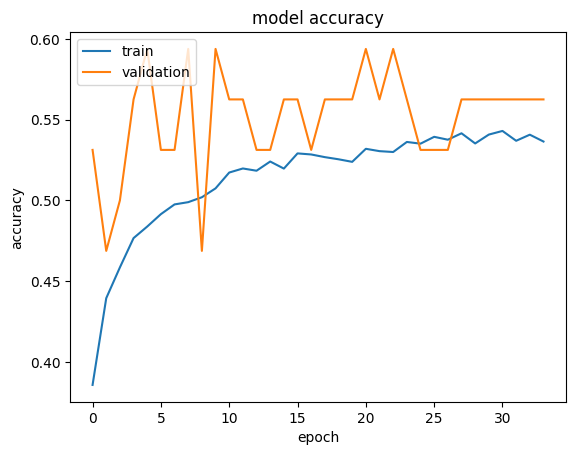

In [39]:
plt.plot(history_vgg.history["accuracy"])
plt.plot(history_vgg.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the VGG16 model**


In [40]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = new_vgg16_model.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 0s - loss: 1.0744 - accuracy: 0.5000

4/4 [==============================] - 0s 7ms/step - loss: 1.0485 - accuracy: 0.5234


Loss: 1.0484886169433594, Accuracy: 0.5234375


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


              precision    recall  f1-score   support

       happy       0.50      0.50      0.50        32
     neutral       0.32      0.44      0.37        32
         sad       0.61      0.44      0.51        32
    surprise       0.79      0.72      0.75        32

    accuracy                           0.52       128
   macro avg       0.55      0.52      0.53       128
weighted avg       0.55      0.52      0.53       128



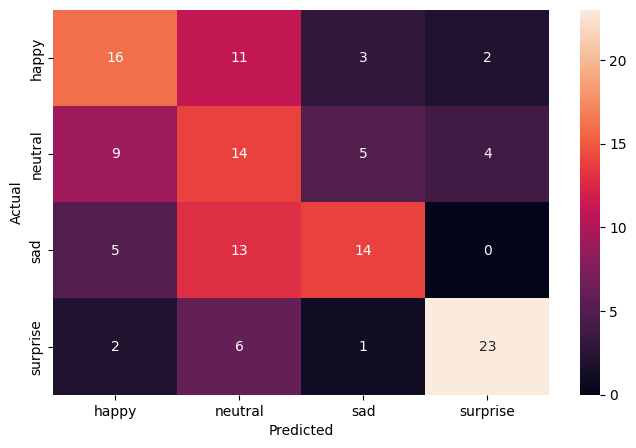

In [41]:
pred_probabilities = new_vgg16_model.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Think About It:**

- What do you infer from the general trend in the training performance?
- Is the training accuracy consistently improving?
- Is the validation accuracy also improving similarly?


**Observations and Insights:\_\_**


**Note: You can even go back and build your own architecture on top of the VGG16 Transfer layer and see if you can improve the performance**


## **ResNet V2 Model**


In [42]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [43]:
resnet_model = ResNet50V2(weights="imagenet", include_top=False, input_shape=(img_width, img_height, color_layers))
# Making all the layers of the VGG model non-trainable. i.e. freezing them
for layer in resnet_model.layers:
    layer.trainable = False

resnet_model.summary()

Model: "resnet50v2"


__________________________________________________________________________________________________


 Layer (type)                Output Shape                 Param #   Connected to                  


 input_1 (InputLayer)        [(None, 48, 48, 3)]          0         []                            


 conv1_pad (ZeroPadding2D)   (None, 54, 54, 3)            0         ['input_1[0][0]']             


 conv1_conv (Conv2D)         (None, 24, 24, 64)           9472      ['conv1_pad[0][0]']           


 pool1_pad (ZeroPadding2D)   (None, 26, 26, 64)           0         ['conv1_conv[0][0]']          


 pool1_pool (MaxPooling2D)   (None, 12, 12, 64)           0         ['pool1_pad[0][0]']           


 conv2_block1_preact_bn (Ba  (None, 12, 12, 64)           256       ['pool1_pool[0][0]']          


 tchNormalization)                                                                                


 conv2_block1_preact_relu (  (None, 12, 12, 64)           0         ['conv2_block1_preact_bn[0][0]


 Activation)                                                        ']                            


 conv2_block1_1_conv (Conv2  (None, 12, 12, 64)           4096      ['conv2_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv2_block1_1_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block1_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block1_1_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block1_1_bn[0][0]']   


 ation)                                                                                           


 conv2_block1_2_pad (ZeroPa  (None, 14, 14, 64)           0         ['conv2_block1_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv2_block1_2_conv (Conv2  (None, 12, 12, 64)           36864     ['conv2_block1_2_pad[0][0]']  


 D)                                                                                               


 conv2_block1_2_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block1_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block1_2_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block1_2_bn[0][0]']   


 ation)                                                                                           


 conv2_block1_0_conv (Conv2  (None, 12, 12, 256)          16640     ['conv2_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv2_block1_3_conv (Conv2  (None, 12, 12, 256)          16640     ['conv2_block1_2_relu[0][0]'] 


 D)                                                                                               


 conv2_block1_out (Add)      (None, 12, 12, 256)          0         ['conv2_block1_0_conv[0][0]', 


                                                                     'conv2_block1_3_conv[0][0]'] 


 conv2_block2_preact_bn (Ba  (None, 12, 12, 256)          1024      ['conv2_block1_out[0][0]']    


 tchNormalization)                                                                                


 conv2_block2_preact_relu (  (None, 12, 12, 256)          0         ['conv2_block2_preact_bn[0][0]


 Activation)                                                        ']                            


 conv2_block2_1_conv (Conv2  (None, 12, 12, 64)           16384     ['conv2_block2_preact_relu[0][


 D)                                                                 0]']                          


 conv2_block2_1_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block2_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block2_1_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block2_1_bn[0][0]']   


 ation)                                                                                           


 conv2_block2_2_pad (ZeroPa  (None, 14, 14, 64)           0         ['conv2_block2_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv2_block2_2_conv (Conv2  (None, 12, 12, 64)           36864     ['conv2_block2_2_pad[0][0]']  


 D)                                                                                               


 conv2_block2_2_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block2_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block2_2_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block2_2_bn[0][0]']   


 ation)                                                                                           


 conv2_block2_3_conv (Conv2  (None, 12, 12, 256)          16640     ['conv2_block2_2_relu[0][0]'] 


 D)                                                                                               


 conv2_block2_out (Add)      (None, 12, 12, 256)          0         ['conv2_block1_out[0][0]',    


                                                                     'conv2_block2_3_conv[0][0]'] 


 conv2_block3_preact_bn (Ba  (None, 12, 12, 256)          1024      ['conv2_block2_out[0][0]']    


 tchNormalization)                                                                                


 conv2_block3_preact_relu (  (None, 12, 12, 256)          0         ['conv2_block3_preact_bn[0][0]


 Activation)                                                        ']                            


 conv2_block3_1_conv (Conv2  (None, 12, 12, 64)           16384     ['conv2_block3_preact_relu[0][


 D)                                                                 0]']                          


 conv2_block3_1_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block3_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block3_1_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block3_1_bn[0][0]']   


 ation)                                                                                           


 conv2_block3_2_pad (ZeroPa  (None, 14, 14, 64)           0         ['conv2_block3_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv2_block3_2_conv (Conv2  (None, 6, 6, 64)             36864     ['conv2_block3_2_pad[0][0]']  


 D)                                                                                               


 conv2_block3_2_bn (BatchNo  (None, 6, 6, 64)             256       ['conv2_block3_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block3_2_relu (Activ  (None, 6, 6, 64)             0         ['conv2_block3_2_bn[0][0]']   


 ation)                                                                                           


 max_pooling2d (MaxPooling2  (None, 6, 6, 256)            0         ['conv2_block2_out[0][0]']    


 D)                                                                                               


 conv2_block3_3_conv (Conv2  (None, 6, 6, 256)            16640     ['conv2_block3_2_relu[0][0]'] 


 D)                                                                                               


 conv2_block3_out (Add)      (None, 6, 6, 256)            0         ['max_pooling2d[0][0]',       


                                                                     'conv2_block3_3_conv[0][0]'] 


 conv3_block1_preact_bn (Ba  (None, 6, 6, 256)            1024      ['conv2_block3_out[0][0]']    


 tchNormalization)                                                                                


 conv3_block1_preact_relu (  (None, 6, 6, 256)            0         ['conv3_block1_preact_bn[0][0]


 Activation)                                                        ']                            


 conv3_block1_1_conv (Conv2  (None, 6, 6, 128)            32768     ['conv3_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv3_block1_1_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block1_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block1_1_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block1_1_bn[0][0]']   


 ation)                                                                                           


 conv3_block1_2_pad (ZeroPa  (None, 8, 8, 128)            0         ['conv3_block1_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv3_block1_2_conv (Conv2  (None, 6, 6, 128)            147456    ['conv3_block1_2_pad[0][0]']  


 D)                                                                                               


 conv3_block1_2_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block1_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block1_2_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block1_2_bn[0][0]']   


 ation)                                                                                           


 conv3_block1_0_conv (Conv2  (None, 6, 6, 512)            131584    ['conv3_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv3_block1_3_conv (Conv2  (None, 6, 6, 512)            66048     ['conv3_block1_2_relu[0][0]'] 


 D)                                                                                               


 conv3_block1_out (Add)      (None, 6, 6, 512)            0         ['conv3_block1_0_conv[0][0]', 


                                                                     'conv3_block1_3_conv[0][0]'] 


 conv3_block2_preact_bn (Ba  (None, 6, 6, 512)            2048      ['conv3_block1_out[0][0]']    


 tchNormalization)                                                                                


 conv3_block2_preact_relu (  (None, 6, 6, 512)            0         ['conv3_block2_preact_bn[0][0]


 Activation)                                                        ']                            


 conv3_block2_1_conv (Conv2  (None, 6, 6, 128)            65536     ['conv3_block2_preact_relu[0][


 D)                                                                 0]']                          


 conv3_block2_1_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block2_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block2_1_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block2_1_bn[0][0]']   


 ation)                                                                                           


 conv3_block2_2_pad (ZeroPa  (None, 8, 8, 128)            0         ['conv3_block2_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv3_block2_2_conv (Conv2  (None, 6, 6, 128)            147456    ['conv3_block2_2_pad[0][0]']  


 D)                                                                                               


 conv3_block2_2_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block2_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block2_2_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block2_2_bn[0][0]']   


 ation)                                                                                           


 conv3_block2_3_conv (Conv2  (None, 6, 6, 512)            66048     ['conv3_block2_2_relu[0][0]'] 


 D)                                                                                               


 conv3_block2_out (Add)      (None, 6, 6, 512)            0         ['conv3_block1_out[0][0]',    


                                                                     'conv3_block2_3_conv[0][0]'] 


 conv3_block3_preact_bn (Ba  (None, 6, 6, 512)            2048      ['conv3_block2_out[0][0]']    


 tchNormalization)                                                                                


 conv3_block3_preact_relu (  (None, 6, 6, 512)            0         ['conv3_block3_preact_bn[0][0]


 Activation)                                                        ']                            


 conv3_block3_1_conv (Conv2  (None, 6, 6, 128)            65536     ['conv3_block3_preact_relu[0][


 D)                                                                 0]']                          


 conv3_block3_1_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block3_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block3_1_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block3_1_bn[0][0]']   


 ation)                                                                                           


 conv3_block3_2_pad (ZeroPa  (None, 8, 8, 128)            0         ['conv3_block3_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv3_block3_2_conv (Conv2  (None, 6, 6, 128)            147456    ['conv3_block3_2_pad[0][0]']  


 D)                                                                                               


 conv3_block3_2_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block3_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block3_2_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block3_2_bn[0][0]']   


 ation)                                                                                           


 conv3_block3_3_conv (Conv2  (None, 6, 6, 512)            66048     ['conv3_block3_2_relu[0][0]'] 


 D)                                                                                               


 conv3_block3_out (Add)      (None, 6, 6, 512)            0         ['conv3_block2_out[0][0]',    


                                                                     'conv3_block3_3_conv[0][0]'] 


 conv3_block4_preact_bn (Ba  (None, 6, 6, 512)            2048      ['conv3_block3_out[0][0]']    


 tchNormalization)                                                                                


 conv3_block4_preact_relu (  (None, 6, 6, 512)            0         ['conv3_block4_preact_bn[0][0]


 Activation)                                                        ']                            


 conv3_block4_1_conv (Conv2  (None, 6, 6, 128)            65536     ['conv3_block4_preact_relu[0][


 D)                                                                 0]']                          


 conv3_block4_1_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block4_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block4_1_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block4_1_bn[0][0]']   


 ation)                                                                                           


 conv3_block4_2_pad (ZeroPa  (None, 8, 8, 128)            0         ['conv3_block4_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv3_block4_2_conv (Conv2  (None, 3, 3, 128)            147456    ['conv3_block4_2_pad[0][0]']  


 D)                                                                                               


 conv3_block4_2_bn (BatchNo  (None, 3, 3, 128)            512       ['conv3_block4_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block4_2_relu (Activ  (None, 3, 3, 128)            0         ['conv3_block4_2_bn[0][0]']   


 ation)                                                                                           


 max_pooling2d_1 (MaxPoolin  (None, 3, 3, 512)            0         ['conv3_block3_out[0][0]']    


 g2D)                                                                                             


 conv3_block4_3_conv (Conv2  (None, 3, 3, 512)            66048     ['conv3_block4_2_relu[0][0]'] 


 D)                                                                                               


 conv3_block4_out (Add)      (None, 3, 3, 512)            0         ['max_pooling2d_1[0][0]',     


                                                                     'conv3_block4_3_conv[0][0]'] 


 conv4_block1_preact_bn (Ba  (None, 3, 3, 512)            2048      ['conv3_block4_out[0][0]']    


 tchNormalization)                                                                                


 conv4_block1_preact_relu (  (None, 3, 3, 512)            0         ['conv4_block1_preact_bn[0][0]


 Activation)                                                        ']                            


 conv4_block1_1_conv (Conv2  (None, 3, 3, 256)            131072    ['conv4_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv4_block1_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block1_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block1_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block1_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block1_2_pad (ZeroPa  (None, 5, 5, 256)            0         ['conv4_block1_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv4_block1_2_conv (Conv2  (None, 3, 3, 256)            589824    ['conv4_block1_2_pad[0][0]']  


 D)                                                                                               


 conv4_block1_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block1_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block1_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block1_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block1_0_conv (Conv2  (None, 3, 3, 1024)           525312    ['conv4_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv4_block1_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block1_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block1_out (Add)      (None, 3, 3, 1024)           0         ['conv4_block1_0_conv[0][0]', 


                                                                     'conv4_block1_3_conv[0][0]'] 


 conv4_block2_preact_bn (Ba  (None, 3, 3, 1024)           4096      ['conv4_block1_out[0][0]']    


 tchNormalization)                                                                                


 conv4_block2_preact_relu (  (None, 3, 3, 1024)           0         ['conv4_block2_preact_bn[0][0]


 Activation)                                                        ']                            


 conv4_block2_1_conv (Conv2  (None, 3, 3, 256)            262144    ['conv4_block2_preact_relu[0][


 D)                                                                 0]']                          


 conv4_block2_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block2_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block2_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block2_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block2_2_pad (ZeroPa  (None, 5, 5, 256)            0         ['conv4_block2_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv4_block2_2_conv (Conv2  (None, 3, 3, 256)            589824    ['conv4_block2_2_pad[0][0]']  


 D)                                                                                               


 conv4_block2_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block2_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block2_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block2_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block2_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block2_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block2_out (Add)      (None, 3, 3, 1024)           0         ['conv4_block1_out[0][0]',    


                                                                     'conv4_block2_3_conv[0][0]'] 


 conv4_block3_preact_bn (Ba  (None, 3, 3, 1024)           4096      ['conv4_block2_out[0][0]']    


 tchNormalization)                                                                                


 conv4_block3_preact_relu (  (None, 3, 3, 1024)           0         ['conv4_block3_preact_bn[0][0]


 Activation)                                                        ']                            


 conv4_block3_1_conv (Conv2  (None, 3, 3, 256)            262144    ['conv4_block3_preact_relu[0][


 D)                                                                 0]']                          


 conv4_block3_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block3_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block3_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block3_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block3_2_pad (ZeroPa  (None, 5, 5, 256)            0         ['conv4_block3_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv4_block3_2_conv (Conv2  (None, 3, 3, 256)            589824    ['conv4_block3_2_pad[0][0]']  


 D)                                                                                               


 conv4_block3_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block3_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block3_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block3_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block3_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block3_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block3_out (Add)      (None, 3, 3, 1024)           0         ['conv4_block2_out[0][0]',    


                                                                     'conv4_block3_3_conv[0][0]'] 


 conv4_block4_preact_bn (Ba  (None, 3, 3, 1024)           4096      ['conv4_block3_out[0][0]']    


 tchNormalization)                                                                                


 conv4_block4_preact_relu (  (None, 3, 3, 1024)           0         ['conv4_block4_preact_bn[0][0]


 Activation)                                                        ']                            


 conv4_block4_1_conv (Conv2  (None, 3, 3, 256)            262144    ['conv4_block4_preact_relu[0][


 D)                                                                 0]']                          


 conv4_block4_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block4_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block4_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block4_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block4_2_pad (ZeroPa  (None, 5, 5, 256)            0         ['conv4_block4_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv4_block4_2_conv (Conv2  (None, 3, 3, 256)            589824    ['conv4_block4_2_pad[0][0]']  


 D)                                                                                               


 conv4_block4_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block4_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block4_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block4_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block4_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block4_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block4_out (Add)      (None, 3, 3, 1024)           0         ['conv4_block3_out[0][0]',    


                                                                     'conv4_block4_3_conv[0][0]'] 


 conv4_block5_preact_bn (Ba  (None, 3, 3, 1024)           4096      ['conv4_block4_out[0][0]']    


 tchNormalization)                                                                                


 conv4_block5_preact_relu (  (None, 3, 3, 1024)           0         ['conv4_block5_preact_bn[0][0]


 Activation)                                                        ']                            


 conv4_block5_1_conv (Conv2  (None, 3, 3, 256)            262144    ['conv4_block5_preact_relu[0][


 D)                                                                 0]']                          


 conv4_block5_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block5_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block5_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block5_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block5_2_pad (ZeroPa  (None, 5, 5, 256)            0         ['conv4_block5_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv4_block5_2_conv (Conv2  (None, 3, 3, 256)            589824    ['conv4_block5_2_pad[0][0]']  


 D)                                                                                               


 conv4_block5_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block5_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block5_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block5_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block5_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block5_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block5_out (Add)      (None, 3, 3, 1024)           0         ['conv4_block4_out[0][0]',    


                                                                     'conv4_block5_3_conv[0][0]'] 


 conv4_block6_preact_bn (Ba  (None, 3, 3, 1024)           4096      ['conv4_block5_out[0][0]']    


 tchNormalization)                                                                                


 conv4_block6_preact_relu (  (None, 3, 3, 1024)           0         ['conv4_block6_preact_bn[0][0]


 Activation)                                                        ']                            


 conv4_block6_1_conv (Conv2  (None, 3, 3, 256)            262144    ['conv4_block6_preact_relu[0][


 D)                                                                 0]']                          


 conv4_block6_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block6_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block6_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block6_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block6_2_pad (ZeroPa  (None, 5, 5, 256)            0         ['conv4_block6_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv4_block6_2_conv (Conv2  (None, 2, 2, 256)            589824    ['conv4_block6_2_pad[0][0]']  


 D)                                                                                               


 conv4_block6_2_bn (BatchNo  (None, 2, 2, 256)            1024      ['conv4_block6_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block6_2_relu (Activ  (None, 2, 2, 256)            0         ['conv4_block6_2_bn[0][0]']   


 ation)                                                                                           


 max_pooling2d_2 (MaxPoolin  (None, 2, 2, 1024)           0         ['conv4_block5_out[0][0]']    


 g2D)                                                                                             


 conv4_block6_3_conv (Conv2  (None, 2, 2, 1024)           263168    ['conv4_block6_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block6_out (Add)      (None, 2, 2, 1024)           0         ['max_pooling2d_2[0][0]',     


                                                                     'conv4_block6_3_conv[0][0]'] 


 conv5_block1_preact_bn (Ba  (None, 2, 2, 1024)           4096      ['conv4_block6_out[0][0]']    


 tchNormalization)                                                                                


 conv5_block1_preact_relu (  (None, 2, 2, 1024)           0         ['conv5_block1_preact_bn[0][0]


 Activation)                                                        ']                            


 conv5_block1_1_conv (Conv2  (None, 2, 2, 512)            524288    ['conv5_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv5_block1_1_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block1_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block1_1_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block1_1_bn[0][0]']   


 ation)                                                                                           


 conv5_block1_2_pad (ZeroPa  (None, 4, 4, 512)            0         ['conv5_block1_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv5_block1_2_conv (Conv2  (None, 2, 2, 512)            2359296   ['conv5_block1_2_pad[0][0]']  


 D)                                                                                               


 conv5_block1_2_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block1_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block1_2_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block1_2_bn[0][0]']   


 ation)                                                                                           


 conv5_block1_0_conv (Conv2  (None, 2, 2, 2048)           2099200   ['conv5_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv5_block1_3_conv (Conv2  (None, 2, 2, 2048)           1050624   ['conv5_block1_2_relu[0][0]'] 


 D)                                                                                               


 conv5_block1_out (Add)      (None, 2, 2, 2048)           0         ['conv5_block1_0_conv[0][0]', 


                                                                     'conv5_block1_3_conv[0][0]'] 


 conv5_block2_preact_bn (Ba  (None, 2, 2, 2048)           8192      ['conv5_block1_out[0][0]']    


 tchNormalization)                                                                                


 conv5_block2_preact_relu (  (None, 2, 2, 2048)           0         ['conv5_block2_preact_bn[0][0]


 Activation)                                                        ']                            


 conv5_block2_1_conv (Conv2  (None, 2, 2, 512)            1048576   ['conv5_block2_preact_relu[0][


 D)                                                                 0]']                          


 conv5_block2_1_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block2_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block2_1_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block2_1_bn[0][0]']   


 ation)                                                                                           


 conv5_block2_2_pad (ZeroPa  (None, 4, 4, 512)            0         ['conv5_block2_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv5_block2_2_conv (Conv2  (None, 2, 2, 512)            2359296   ['conv5_block2_2_pad[0][0]']  


 D)                                                                                               


 conv5_block2_2_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block2_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block2_2_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block2_2_bn[0][0]']   


 ation)                                                                                           


 conv5_block2_3_conv (Conv2  (None, 2, 2, 2048)           1050624   ['conv5_block2_2_relu[0][0]'] 


 D)                                                                                               


 conv5_block2_out (Add)      (None, 2, 2, 2048)           0         ['conv5_block1_out[0][0]',    


                                                                     'conv5_block2_3_conv[0][0]'] 


 conv5_block3_preact_bn (Ba  (None, 2, 2, 2048)           8192      ['conv5_block2_out[0][0]']    


 tchNormalization)                                                                                


 conv5_block3_preact_relu (  (None, 2, 2, 2048)           0         ['conv5_block3_preact_bn[0][0]


 Activation)                                                        ']                            


 conv5_block3_1_conv (Conv2  (None, 2, 2, 512)            1048576   ['conv5_block3_preact_relu[0][


 D)                                                                 0]']                          


 conv5_block3_1_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block3_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block3_1_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block3_1_bn[0][0]']   


 ation)                                                                                           


 conv5_block3_2_pad (ZeroPa  (None, 4, 4, 512)            0         ['conv5_block3_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv5_block3_2_conv (Conv2  (None, 2, 2, 512)            2359296   ['conv5_block3_2_pad[0][0]']  


 D)                                                                                               


 conv5_block3_2_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block3_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block3_2_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block3_2_bn[0][0]']   


 ation)                                                                                           


 conv5_block3_3_conv (Conv2  (None, 2, 2, 2048)           1050624   ['conv5_block3_2_relu[0][0]'] 


 D)                                                                                               


 conv5_block3_out (Add)      (None, 2, 2, 2048)           0         ['conv5_block2_out[0][0]',    


                                                                     'conv5_block3_3_conv[0][0]'] 


 post_bn (BatchNormalizatio  (None, 2, 2, 2048)           8192      ['conv5_block3_out[0][0]']    


 n)                                                                                               


 post_relu (Activation)      (None, 2, 2, 2048)           0         ['post_bn[0][0]']             


Total params: 23564800 (89.89 MB)


Trainable params: 0 (0.00 Byte)


Non-trainable params: 23564800 (89.89 MB)


__________________________________________________________________________________________________


### **Model Building**

- Import Resnet v2 upto the layer of your choice and add Fully Connected layers on top of it.


In [44]:
new_resnet_model = Sequential()
new_resnet_model.add(resnet_model)

# Reduces each feature map to a single value by averaging all elements
new_resnet_model.add(GlobalAveragePooling2D())

# Adding a dense output layer
new_resnet_model.add(Dense(512, activation="relu"))
new_resnet_model.add(Dropout(0.5))
new_resnet_model.add(Dense(128, activation="relu"))
new_resnet_model.add(Dropout(0.5))
new_resnet_model.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the Model**


In [45]:
new_resnet_model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
new_resnet_model.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 resnet50v2 (Functional)     (None, 2, 2, 2048)        23564800  


 global_average_pooling2d (  (None, 2048)              0         


 GlobalAveragePooling2D)                                         


 dense (Dense)               (None, 512)               1049088   


 dropout (Dropout)           (None, 512)               0         


 dense_1 (Dense)             (None, 128)               65664     


 dropout_1 (Dropout)         (None, 128)               0         


 dense_2 (Dense)             (None, 4)                 516       


Total params: 24680068 (94.15 MB)


Trainable params: 1115268 (4.25 MB)


Non-trainable params: 23564800 (89.89 MB)


_________________________________________________________________


In [46]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 20 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=20
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_resnet_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_resnet = new_resnet_model.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[delayed_early_stopping, mc, reduce_lr],
)

Epoch 1/40


  1/473 [..............................] - ETA: 16:03 - loss: 3.7451 - accuracy: 0.2812

  5/473 [..............................] - ETA: 6s - loss: 3.4923 - accuracy: 0.2438   

  7/473 [..............................] - ETA: 8s - loss: 3.3115 - accuracy: 0.2366

 10/473 [..............................] - ETA: 8s - loss: 3.1628 - accuracy: 0.2250

 13/473 [..............................] - ETA: 7s - loss: 3.0177 - accuracy: 0.2452

 16/473 [>.............................] - ETA: 7s - loss: 2.9160 - accuracy: 0.2383

 19/473 [>.............................] - ETA: 7s - loss: 2.8793 - accuracy: 0.2401

 22/473 [>.............................] - ETA: 7s - loss: 2.7848 - accuracy: 0.2429

 25/473 [>.............................] - ETA: 7s - loss: 2.7287 - accuracy: 0.2400

 28/473 [>.............................] - ETA: 7s - loss: 2.6715 - accuracy: 0.2455

 31/473 [>.............................] - ETA: 7s - loss: 2.6006 - accuracy: 0.2429

 34/473 [=>............................] - ETA: 7s - loss: 2.5120 - accuracy: 0.2546

 38/473 [=>............................] - ETA: 7s - loss: 2.4325 - accuracy: 0.2689

 42/473 [=>............................] - ETA: 7s - loss: 2.3797 - accuracy: 0.2664

 46/473 [=>............................] - ETA: 7s - loss: 2.3222 - accuracy: 0.2724

 50/473 [==>...........................] - ETA: 7s - loss: 2.2550 - accuracy: 0.2850

 53/473 [==>...........................] - ETA: 7s - loss: 2.2208 - accuracy: 0.2901

 57/473 [==>...........................] - ETA: 7s - loss: 2.1746 - accuracy: 0.2950

 60/473 [==>...........................] - ETA: 6s - loss: 2.1546 - accuracy: 0.2927

 63/473 [==>...........................] - ETA: 6s - loss: 2.1289 - accuracy: 0.2917

 67/473 [===>..........................] - ETA: 6s - loss: 2.0969 - accuracy: 0.2929

 71/473 [===>..........................] - ETA: 6s - loss: 2.0722 - accuracy: 0.2927

 75/473 [===>..........................] - ETA: 6s - loss: 2.0450 - accuracy: 0.2925

 79/473 [====>.........................] - ETA: 6s - loss: 2.0212 - accuracy: 0.2939

 83/473 [====>.........................] - ETA: 6s - loss: 1.9952 - accuracy: 0.2982

 87/473 [====>.........................] - ETA: 6s - loss: 1.9698 - accuracy: 0.2999

 90/473 [====>.........................] - ETA: 6s - loss: 1.9527 - accuracy: 0.3010

 94/473 [====>.........................] - ETA: 6s - loss: 1.9290 - accuracy: 0.3025

 98/473 [=====>........................] - ETA: 6s - loss: 1.9170 - accuracy: 0.3029

101/473 [=====>........................] - ETA: 6s - loss: 1.9049 - accuracy: 0.3041

105/473 [=====>........................] - ETA: 6s - loss: 1.8923 - accuracy: 0.3033

109/473 [=====>........................] - ETA: 6s - loss: 1.8733 - accuracy: 0.3082

113/473 [======>.......................] - ETA: 6s - loss: 1.8559 - accuracy: 0.3081

117/473 [======>.......................] - ETA: 5s - loss: 1.8445 - accuracy: 0.3085

121/473 [======>.......................] - ETA: 5s - loss: 1.8341 - accuracy: 0.3094

124/473 [======>.......................] - ETA: 5s - loss: 1.8256 - accuracy: 0.3100

127/473 [=======>......................] - ETA: 5s - loss: 1.8206 - accuracy: 0.3083

131/473 [=======>......................] - ETA: 5s - loss: 1.8038 - accuracy: 0.3108

135/473 [=======>......................] - ETA: 5s - loss: 1.7909 - accuracy: 0.3118

138/473 [=======>......................] - ETA: 5s - loss: 1.7842 - accuracy: 0.3109

141/473 [=======>......................] - ETA: 5s - loss: 1.7769 - accuracy: 0.3094

145/473 [========>.....................] - ETA: 5s - loss: 1.7649 - accuracy: 0.3112

149/473 [========>.....................] - ETA: 5s - loss: 1.7560 - accuracy: 0.3115

152/473 [========>.....................] - ETA: 5s - loss: 1.7483 - accuracy: 0.3123

155/473 [========>.....................] - ETA: 5s - loss: 1.7407 - accuracy: 0.3129

158/473 [=========>....................] - ETA: 5s - loss: 1.7374 - accuracy: 0.3115

161/473 [=========>....................] - ETA: 5s - loss: 1.7324 - accuracy: 0.3096

163/473 [=========>....................] - ETA: 5s - loss: 1.7300 - accuracy: 0.3099

169/473 [=========>....................] - ETA: 5s - loss: 1.7201 - accuracy: 0.3098

173/473 [=========>....................] - ETA: 5s - loss: 1.7141 - accuracy: 0.3111

176/473 [==========>...................] - ETA: 5s - loss: 1.7094 - accuracy: 0.3095

180/473 [==========>...................] - ETA: 5s - loss: 1.7022 - accuracy: 0.3105

184/473 [==========>...................] - ETA: 5s - loss: 1.6950 - accuracy: 0.3127

188/473 [==========>...................] - ETA: 5s - loss: 1.6888 - accuracy: 0.3131

192/473 [===========>..................] - ETA: 5s - loss: 1.6825 - accuracy: 0.3157

196/473 [===========>..................] - ETA: 5s - loss: 1.6753 - accuracy: 0.3171

200/473 [===========>..................] - ETA: 5s - loss: 1.6719 - accuracy: 0.3160

204/473 [===========>..................] - ETA: 4s - loss: 1.6666 - accuracy: 0.3163

208/473 [============>.................] - ETA: 4s - loss: 1.6624 - accuracy: 0.3171

212/473 [============>.................] - ETA: 4s - loss: 1.6572 - accuracy: 0.3174

216/473 [============>.................] - ETA: 4s - loss: 1.6517 - accuracy: 0.3168

220/473 [============>.................] - ETA: 4s - loss: 1.6463 - accuracy: 0.3173

224/473 [=============>................] - ETA: 4s - loss: 1.6411 - accuracy: 0.3170

228/473 [=============>................] - ETA: 4s - loss: 1.6367 - accuracy: 0.3172

232/473 [=============>................] - ETA: 4s - loss: 1.6299 - accuracy: 0.3189

236/473 [=============>................] - ETA: 4s - loss: 1.6245 - accuracy: 0.3188

240/473 [==============>...............] - ETA: 4s - loss: 1.6214 - accuracy: 0.3186

244/473 [==============>...............] - ETA: 4s - loss: 1.6169 - accuracy: 0.3194

248/473 [==============>...............] - ETA: 4s - loss: 1.6138 - accuracy: 0.3208

251/473 [==============>...............] - ETA: 3s - loss: 1.6108 - accuracy: 0.3205

255/473 [===============>..............] - ETA: 3s - loss: 1.6061 - accuracy: 0.3214

259/473 [===============>..............] - ETA: 3s - loss: 1.6030 - accuracy: 0.3214

263/473 [===============>..............] - ETA: 3s - loss: 1.5997 - accuracy: 0.3221

266/473 [===============>..............] - ETA: 3s - loss: 1.5973 - accuracy: 0.3214

269/473 [================>.............] - ETA: 3s - loss: 1.5945 - accuracy: 0.3216

272/473 [================>.............] - ETA: 3s - loss: 1.5909 - accuracy: 0.3228

276/473 [================>.............] - ETA: 3s - loss: 1.5865 - accuracy: 0.3238

279/473 [================>.............] - ETA: 3s - loss: 1.5841 - accuracy: 0.3232

282/473 [================>.............] - ETA: 3s - loss: 1.5822 - accuracy: 0.3234

286/473 [=================>............] - ETA: 3s - loss: 1.5790 - accuracy: 0.3239

290/473 [=================>............] - ETA: 3s - loss: 1.5751 - accuracy: 0.3247

294/473 [=================>............] - ETA: 3s - loss: 1.5727 - accuracy: 0.3241

297/473 [=================>............] - ETA: 3s - loss: 1.5694 - accuracy: 0.3247

300/473 [==================>...........] - ETA: 3s - loss: 1.5670 - accuracy: 0.3250

304/473 [==================>...........] - ETA: 2s - loss: 1.5649 - accuracy: 0.3259

308/473 [==================>...........] - ETA: 2s - loss: 1.5610 - accuracy: 0.3270

311/473 [==================>...........] - ETA: 2s - loss: 1.5593 - accuracy: 0.3270

314/473 [==================>...........] - ETA: 2s - loss: 1.5571 - accuracy: 0.3269

317/473 [===================>..........] - ETA: 2s - loss: 1.5546 - accuracy: 0.3280

321/473 [===================>..........] - ETA: 2s - loss: 1.5514 - accuracy: 0.3286

324/473 [===================>..........] - ETA: 2s - loss: 1.5499 - accuracy: 0.3284

327/473 [===================>..........] - ETA: 2s - loss: 1.5472 - accuracy: 0.3294

331/473 [===================>..........] - ETA: 2s - loss: 1.5448 - accuracy: 0.3296

334/473 [====================>.........] - ETA: 2s - loss: 1.5425 - accuracy: 0.3304

337/473 [====================>.........] - ETA: 2s - loss: 1.5403 - accuracy: 0.3309

341/473 [====================>.........] - ETA: 2s - loss: 1.5378 - accuracy: 0.3313

344/473 [====================>.........] - ETA: 2s - loss: 1.5364 - accuracy: 0.3316

348/473 [=====================>........] - ETA: 2s - loss: 1.5336 - accuracy: 0.3318

352/473 [=====================>........] - ETA: 2s - loss: 1.5315 - accuracy: 0.3319

355/473 [=====================>........] - ETA: 2s - loss: 1.5298 - accuracy: 0.3320

358/473 [=====================>........] - ETA: 2s - loss: 1.5283 - accuracy: 0.3321

361/473 [=====================>........] - ETA: 1s - loss: 1.5266 - accuracy: 0.3325

364/473 [======================>.......] - ETA: 1s - loss: 1.5249 - accuracy: 0.3330

367/473 [======================>.......] - ETA: 1s - loss: 1.5231 - accuracy: 0.3332

370/473 [======================>.......] - ETA: 1s - loss: 1.5215 - accuracy: 0.3333

373/473 [======================>.......] - ETA: 1s - loss: 1.5210 - accuracy: 0.3325

376/473 [======================>.......] - ETA: 1s - loss: 1.5195 - accuracy: 0.3324

379/473 [=======================>......] - ETA: 1s - loss: 1.5185 - accuracy: 0.3325

382/473 [=======================>......] - ETA: 1s - loss: 1.5176 - accuracy: 0.3324

385/473 [=======================>......] - ETA: 1s - loss: 1.5163 - accuracy: 0.3325

388/473 [=======================>......] - ETA: 1s - loss: 1.5150 - accuracy: 0.3330

391/473 [=======================>......] - ETA: 1s - loss: 1.5136 - accuracy: 0.3332

394/473 [=======================>......] - ETA: 1s - loss: 1.5127 - accuracy: 0.3332

397/473 [========================>.....] - ETA: 1s - loss: 1.5118 - accuracy: 0.3326

400/473 [========================>.....] - ETA: 1s - loss: 1.5099 - accuracy: 0.3334

403/473 [========================>.....] - ETA: 1s - loss: 1.5074 - accuracy: 0.3342

406/473 [========================>.....] - ETA: 1s - loss: 1.5063 - accuracy: 0.3347

409/473 [========================>.....] - ETA: 1s - loss: 1.5051 - accuracy: 0.3345

412/473 [=========================>....] - ETA: 1s - loss: 1.5034 - accuracy: 0.3353

415/473 [=========================>....] - ETA: 1s - loss: 1.5028 - accuracy: 0.3352

418/473 [=========================>....] - ETA: 0s - loss: 1.5009 - accuracy: 0.3360

421/473 [=========================>....] - ETA: 0s - loss: 1.5006 - accuracy: 0.3357

424/473 [=========================>....] - ETA: 0s - loss: 1.4994 - accuracy: 0.3359

427/473 [==========================>...] - ETA: 0s - loss: 1.4981 - accuracy: 0.3359

430/473 [==========================>...] - ETA: 0s - loss: 1.4967 - accuracy: 0.3365

433/473 [==========================>...] - ETA: 0s - loss: 1.4955 - accuracy: 0.3372

436/473 [==========================>...] - ETA: 0s - loss: 1.4942 - accuracy: 0.3377

439/473 [==========================>...] - ETA: 0s - loss: 1.4927 - accuracy: 0.3382

442/473 [===========================>..] - ETA: 0s - loss: 1.4920 - accuracy: 0.3379

445/473 [===========================>..] - ETA: 0s - loss: 1.4912 - accuracy: 0.3379

448/473 [===========================>..] - ETA: 0s - loss: 1.4900 - accuracy: 0.3386

451/473 [===========================>..] - ETA: 0s - loss: 1.4889 - accuracy: 0.3386

454/473 [===========================>..] - ETA: 0s - loss: 1.4884 - accuracy: 0.3381

457/473 [===========================>..] - ETA: 0s - loss: 1.4869 - accuracy: 0.3390

460/473 [============================>.] - ETA: 0s - loss: 1.4856 - accuracy: 0.3395

463/473 [============================>.] - ETA: 0s - loss: 1.4846 - accuracy: 0.3399

466/473 [============================>.] - ETA: 0s - loss: 1.4833 - accuracy: 0.3402

470/473 [============================>.] - ETA: 0s - loss: 1.4814 - accuracy: 0.3406


Epoch 1: val_accuracy improved from -inf to 0.28125, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240319-081840.keras


473/473 [==============================] - 11s 19ms/step - loss: 1.4809 - accuracy: 0.3410 - val_loss: 1.3270 - val_accuracy: 0.2812 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 17s - loss: 1.4740 - accuracy: 0.2188

  3/473 [..............................] - ETA: 11s - loss: 1.3385 - accuracy: 0.3750

  7/473 [..............................] - ETA: 9s - loss: 1.3367 - accuracy: 0.3795 

 10/473 [..............................] - ETA: 8s - loss: 1.3141 - accuracy: 0.4031

 13/473 [..............................] - ETA: 8s - loss: 1.2936 - accuracy: 0.4135

 17/473 [>.............................] - ETA: 8s - loss: 1.2835 - accuracy: 0.4210

 20/473 [>.............................] - ETA: 8s - loss: 1.2817 - accuracy: 0.4094

 24/473 [>.............................] - ETA: 7s - loss: 1.2900 - accuracy: 0.4010

 28/473 [>.............................] - ETA: 7s - loss: 1.2989 - accuracy: 0.3973

 32/473 [=>............................] - ETA: 7s - loss: 1.3136 - accuracy: 0.3945

 36/473 [=>............................] - ETA: 7s - loss: 1.3169 - accuracy: 0.3941

 39/473 [=>............................] - ETA: 7s - loss: 1.3163 - accuracy: 0.3926

 42/473 [=>............................] - ETA: 7s - loss: 1.3178 - accuracy: 0.3862

 45/473 [=>............................] - ETA: 7s - loss: 1.3173 - accuracy: 0.3896

 48/473 [==>...........................] - ETA: 7s - loss: 1.3163 - accuracy: 0.3880

 52/473 [==>...........................] - ETA: 7s - loss: 1.3141 - accuracy: 0.3876

 56/473 [==>...........................] - ETA: 7s - loss: 1.3139 - accuracy: 0.3906

 59/473 [==>...........................] - ETA: 7s - loss: 1.3107 - accuracy: 0.3914

 62/473 [==>...........................] - ETA: 6s - loss: 1.3115 - accuracy: 0.3896

 65/473 [===>..........................] - ETA: 6s - loss: 1.3139 - accuracy: 0.3880

 68/473 [===>..........................] - ETA: 6s - loss: 1.3167 - accuracy: 0.3874

 71/473 [===>..........................] - ETA: 6s - loss: 1.3180 - accuracy: 0.3882

 74/473 [===>..........................] - ETA: 6s - loss: 1.3193 - accuracy: 0.3872

 78/473 [===>..........................] - ETA: 6s - loss: 1.3183 - accuracy: 0.3846

 81/473 [====>.........................] - ETA: 6s - loss: 1.3205 - accuracy: 0.3839

 84/473 [====>.........................] - ETA: 6s - loss: 1.3193 - accuracy: 0.3847

 88/473 [====>.........................] - ETA: 6s - loss: 1.3180 - accuracy: 0.3832

 91/473 [====>.........................] - ETA: 6s - loss: 1.3128 - accuracy: 0.3856

 94/473 [====>.........................] - ETA: 6s - loss: 1.3130 - accuracy: 0.3873

 98/473 [=====>........................] - ETA: 6s - loss: 1.3114 - accuracy: 0.3871

102/473 [=====>........................] - ETA: 6s - loss: 1.3100 - accuracy: 0.3897

105/473 [=====>........................] - ETA: 6s - loss: 1.3094 - accuracy: 0.3908

109/473 [=====>........................] - ETA: 6s - loss: 1.3068 - accuracy: 0.3948

112/473 [======>.......................] - ETA: 6s - loss: 1.3081 - accuracy: 0.3948

115/473 [======>.......................] - ETA: 6s - loss: 1.3104 - accuracy: 0.3943

119/473 [======>.......................] - ETA: 5s - loss: 1.3104 - accuracy: 0.3934

123/473 [======>.......................] - ETA: 5s - loss: 1.3088 - accuracy: 0.3941

127/473 [=======>......................] - ETA: 5s - loss: 1.3095 - accuracy: 0.3920

131/473 [=======>......................] - ETA: 5s - loss: 1.3110 - accuracy: 0.3924

135/473 [=======>......................] - ETA: 5s - loss: 1.3101 - accuracy: 0.3914

138/473 [=======>......................] - ETA: 5s - loss: 1.3106 - accuracy: 0.3906

142/473 [========>.....................] - ETA: 5s - loss: 1.3109 - accuracy: 0.3889

146/473 [========>.....................] - ETA: 5s - loss: 1.3107 - accuracy: 0.3891

150/473 [========>.....................] - ETA: 5s - loss: 1.3096 - accuracy: 0.3883

154/473 [========>.....................] - ETA: 5s - loss: 1.3114 - accuracy: 0.3872

158/473 [=========>....................] - ETA: 5s - loss: 1.3126 - accuracy: 0.3862

162/473 [=========>....................] - ETA: 5s - loss: 1.3121 - accuracy: 0.3865

166/473 [=========>....................] - ETA: 5s - loss: 1.3110 - accuracy: 0.3877

170/473 [=========>....................] - ETA: 5s - loss: 1.3096 - accuracy: 0.3891

174/473 [==========>...................] - ETA: 4s - loss: 1.3098 - accuracy: 0.3880

178/473 [==========>...................] - ETA: 4s - loss: 1.3098 - accuracy: 0.3877

182/473 [==========>...................] - ETA: 4s - loss: 1.3085 - accuracy: 0.3895

186/473 [==========>...................] - ETA: 4s - loss: 1.3086 - accuracy: 0.3902

190/473 [===========>..................] - ETA: 4s - loss: 1.3098 - accuracy: 0.3896

194/473 [===========>..................] - ETA: 4s - loss: 1.3109 - accuracy: 0.3899

198/473 [===========>..................] - ETA: 4s - loss: 1.3115 - accuracy: 0.3904

202/473 [===========>..................] - ETA: 4s - loss: 1.3105 - accuracy: 0.3915

206/473 [============>.................] - ETA: 4s - loss: 1.3097 - accuracy: 0.3924

210/473 [============>.................] - ETA: 4s - loss: 1.3094 - accuracy: 0.3926

214/473 [============>.................] - ETA: 4s - loss: 1.3119 - accuracy: 0.3925

218/473 [============>.................] - ETA: 4s - loss: 1.3109 - accuracy: 0.3926

222/473 [=============>................] - ETA: 4s - loss: 1.3104 - accuracy: 0.3937

226/473 [=============>................] - ETA: 4s - loss: 1.3106 - accuracy: 0.3932

229/473 [=============>................] - ETA: 4s - loss: 1.3132 - accuracy: 0.3931

233/473 [=============>................] - ETA: 3s - loss: 1.3121 - accuracy: 0.3943

236/473 [=============>................] - ETA: 3s - loss: 1.3112 - accuracy: 0.3940

240/473 [==============>...............] - ETA: 3s - loss: 1.3109 - accuracy: 0.3944

244/473 [==============>...............] - ETA: 3s - loss: 1.3116 - accuracy: 0.3938

248/473 [==============>...............] - ETA: 3s - loss: 1.3117 - accuracy: 0.3940

252/473 [==============>...............] - ETA: 3s - loss: 1.3107 - accuracy: 0.3950

256/473 [===============>..............] - ETA: 3s - loss: 1.3093 - accuracy: 0.3955

260/473 [===============>..............] - ETA: 3s - loss: 1.3108 - accuracy: 0.3958

264/473 [===============>..............] - ETA: 3s - loss: 1.3109 - accuracy: 0.3957

268/473 [===============>..............] - ETA: 3s - loss: 1.3108 - accuracy: 0.3960

272/473 [================>.............] - ETA: 3s - loss: 1.3105 - accuracy: 0.3963

276/473 [================>.............] - ETA: 3s - loss: 1.3106 - accuracy: 0.3957

280/473 [================>.............] - ETA: 3s - loss: 1.3100 - accuracy: 0.3959

284/473 [=================>............] - ETA: 3s - loss: 1.3099 - accuracy: 0.3965

288/473 [=================>............] - ETA: 3s - loss: 1.3093 - accuracy: 0.3966

292/473 [=================>............] - ETA: 2s - loss: 1.3088 - accuracy: 0.3957

296/473 [=================>............] - ETA: 2s - loss: 1.3089 - accuracy: 0.3950

300/473 [==================>...........] - ETA: 2s - loss: 1.3087 - accuracy: 0.3956

304/473 [==================>...........] - ETA: 2s - loss: 1.3085 - accuracy: 0.3954

308/473 [==================>...........] - ETA: 2s - loss: 1.3085 - accuracy: 0.3954

312/473 [==================>...........] - ETA: 2s - loss: 1.3089 - accuracy: 0.3952

316/473 [===================>..........] - ETA: 2s - loss: 1.3088 - accuracy: 0.3946

320/473 [===================>..........] - ETA: 2s - loss: 1.3084 - accuracy: 0.3952

324/473 [===================>..........] - ETA: 2s - loss: 1.3085 - accuracy: 0.3948

328/473 [===================>..........] - ETA: 2s - loss: 1.3075 - accuracy: 0.3951

332/473 [====================>.........] - ETA: 2s - loss: 1.3071 - accuracy: 0.3945

336/473 [====================>.........] - ETA: 2s - loss: 1.3065 - accuracy: 0.3947

340/473 [====================>.........] - ETA: 2s - loss: 1.3058 - accuracy: 0.3948

344/473 [====================>.........] - ETA: 2s - loss: 1.3050 - accuracy: 0.3944

348/473 [=====================>........] - ETA: 2s - loss: 1.3046 - accuracy: 0.3946

351/473 [=====================>........] - ETA: 2s - loss: 1.3037 - accuracy: 0.3957

355/473 [=====================>........] - ETA: 1s - loss: 1.3032 - accuracy: 0.3961

359/473 [=====================>........] - ETA: 1s - loss: 1.3023 - accuracy: 0.3961

363/473 [======================>.......] - ETA: 1s - loss: 1.3013 - accuracy: 0.3967

367/473 [======================>.......] - ETA: 1s - loss: 1.3018 - accuracy: 0.3969

371/473 [======================>.......] - ETA: 1s - loss: 1.3021 - accuracy: 0.3972

375/473 [======================>.......] - ETA: 1s - loss: 1.3027 - accuracy: 0.3970

379/473 [=======================>......] - ETA: 1s - loss: 1.3019 - accuracy: 0.3977

383/473 [=======================>......] - ETA: 1s - loss: 1.3031 - accuracy: 0.3970

387/473 [=======================>......] - ETA: 1s - loss: 1.3031 - accuracy: 0.3974

390/473 [=======================>......] - ETA: 1s - loss: 1.3022 - accuracy: 0.3979

394/473 [=======================>......] - ETA: 1s - loss: 1.3021 - accuracy: 0.3980

398/473 [========================>.....] - ETA: 1s - loss: 1.3023 - accuracy: 0.3979

401/473 [========================>.....] - ETA: 1s - loss: 1.3026 - accuracy: 0.3978

404/473 [========================>.....] - ETA: 1s - loss: 1.3031 - accuracy: 0.3970

407/473 [========================>.....] - ETA: 1s - loss: 1.3026 - accuracy: 0.3973

410/473 [=========================>....] - ETA: 1s - loss: 1.3019 - accuracy: 0.3978

414/473 [=========================>....] - ETA: 0s - loss: 1.3010 - accuracy: 0.3980

417/473 [=========================>....] - ETA: 0s - loss: 1.3010 - accuracy: 0.3981

420/473 [=========================>....] - ETA: 0s - loss: 1.3003 - accuracy: 0.3983

424/473 [=========================>....] - ETA: 0s - loss: 1.3003 - accuracy: 0.3981

428/473 [==========================>...] - ETA: 0s - loss: 1.3003 - accuracy: 0.3984

432/473 [==========================>...] - ETA: 0s - loss: 1.2997 - accuracy: 0.3987

435/473 [==========================>...] - ETA: 0s - loss: 1.2995 - accuracy: 0.3989

438/473 [==========================>...] - ETA: 0s - loss: 1.2996 - accuracy: 0.3988

442/473 [===========================>..] - ETA: 0s - loss: 1.2991 - accuracy: 0.3995

446/473 [===========================>..] - ETA: 0s - loss: 1.2991 - accuracy: 0.3993

449/473 [===========================>..] - ETA: 0s - loss: 1.2995 - accuracy: 0.3988

452/473 [===========================>..] - ETA: 0s - loss: 1.2998 - accuracy: 0.3989

456/473 [===========================>..] - ETA: 0s - loss: 1.2998 - accuracy: 0.3990

459/473 [============================>.] - ETA: 0s - loss: 1.3000 - accuracy: 0.3983

462/473 [============================>.] - ETA: 0s - loss: 1.2995 - accuracy: 0.3981

465/473 [============================>.] - ETA: 0s - loss: 1.2988 - accuracy: 0.3988

468/473 [============================>.] - ETA: 0s - loss: 1.2988 - accuracy: 0.3990

471/473 [============================>.] - ETA: 0s - loss: 1.2992 - accuracy: 0.3985


Epoch 2: val_accuracy improved from 0.28125 to 0.46875, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240319-081840.keras


473/473 [==============================] - 9s 18ms/step - loss: 1.2986 - accuracy: 0.3990 - val_loss: 1.2862 - val_accuracy: 0.4688 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 19s - loss: 1.3390 - accuracy: 0.3750

  4/473 [..............................] - ETA: 8s - loss: 1.2606 - accuracy: 0.4531 

  7/473 [..............................] - ETA: 8s - loss: 1.3046 - accuracy: 0.4152

 10/473 [..............................] - ETA: 8s - loss: 1.3061 - accuracy: 0.4094

 13/473 [..............................] - ETA: 7s - loss: 1.3276 - accuracy: 0.3918

 17/473 [>.............................] - ETA: 7s - loss: 1.3242 - accuracy: 0.3915

 21/473 [>.............................] - ETA: 7s - loss: 1.3121 - accuracy: 0.3854

 24/473 [>.............................] - ETA: 7s - loss: 1.3016 - accuracy: 0.3880

 27/473 [>.............................] - ETA: 7s - loss: 1.3008 - accuracy: 0.3819

 30/473 [>.............................] - ETA: 7s - loss: 1.2994 - accuracy: 0.3885

 33/473 [=>............................] - ETA: 7s - loss: 1.3044 - accuracy: 0.3797

 36/473 [=>............................] - ETA: 7s - loss: 1.3013 - accuracy: 0.3880

 39/473 [=>............................] - ETA: 7s - loss: 1.2980 - accuracy: 0.3918

 42/473 [=>............................] - ETA: 7s - loss: 1.2979 - accuracy: 0.3936

 45/473 [=>............................] - ETA: 7s - loss: 1.2966 - accuracy: 0.3986

 48/473 [==>...........................] - ETA: 7s - loss: 1.2969 - accuracy: 0.3965

 51/473 [==>...........................] - ETA: 7s - loss: 1.2981 - accuracy: 0.3971

 54/473 [==>...........................] - ETA: 7s - loss: 1.2937 - accuracy: 0.3987

 57/473 [==>...........................] - ETA: 7s - loss: 1.2942 - accuracy: 0.3980

 60/473 [==>...........................] - ETA: 7s - loss: 1.2936 - accuracy: 0.3995

 63/473 [==>...........................] - ETA: 7s - loss: 1.2921 - accuracy: 0.4003

 66/473 [===>..........................] - ETA: 6s - loss: 1.2877 - accuracy: 0.4015

 69/473 [===>..........................] - ETA: 6s - loss: 1.2831 - accuracy: 0.4031

 72/473 [===>..........................] - ETA: 6s - loss: 1.2783 - accuracy: 0.4036

 75/473 [===>..........................] - ETA: 6s - loss: 1.2768 - accuracy: 0.4025

 78/473 [===>..........................] - ETA: 6s - loss: 1.2744 - accuracy: 0.4050

 81/473 [====>.........................] - ETA: 6s - loss: 1.2714 - accuracy: 0.4074

 84/473 [====>.........................] - ETA: 6s - loss: 1.2704 - accuracy: 0.4077

 87/473 [====>.........................] - ETA: 6s - loss: 1.2723 - accuracy: 0.4070

 90/473 [====>.........................] - ETA: 6s - loss: 1.2735 - accuracy: 0.4059

 92/473 [====>.........................] - ETA: 6s - loss: 1.2751 - accuracy: 0.4056

 94/473 [====>.........................] - ETA: 6s - loss: 1.2784 - accuracy: 0.4056

 98/473 [=====>........................] - ETA: 6s - loss: 1.2778 - accuracy: 0.4066

102/473 [=====>........................] - ETA: 6s - loss: 1.2769 - accuracy: 0.4069

106/473 [=====>........................] - ETA: 6s - loss: 1.2758 - accuracy: 0.4092

110/473 [=====>........................] - ETA: 6s - loss: 1.2770 - accuracy: 0.4077

114/473 [======>.......................] - ETA: 6s - loss: 1.2786 - accuracy: 0.4068

118/473 [======>.......................] - ETA: 6s - loss: 1.2804 - accuracy: 0.4068

122/473 [======>.......................] - ETA: 6s - loss: 1.2830 - accuracy: 0.4065

126/473 [======>.......................] - ETA: 5s - loss: 1.2831 - accuracy: 0.4072

130/473 [=======>......................] - ETA: 5s - loss: 1.2859 - accuracy: 0.4070

134/473 [=======>......................] - ETA: 5s - loss: 1.2838 - accuracy: 0.4090

138/473 [=======>......................] - ETA: 5s - loss: 1.2836 - accuracy: 0.4078

142/473 [========>.....................] - ETA: 5s - loss: 1.2828 - accuracy: 0.4076

146/473 [========>.....................] - ETA: 5s - loss: 1.2819 - accuracy: 0.4090

150/473 [========>.....................] - ETA: 5s - loss: 1.2837 - accuracy: 0.4075

154/473 [========>.....................] - ETA: 5s - loss: 1.2838 - accuracy: 0.4087

157/473 [========>.....................] - ETA: 5s - loss: 1.2835 - accuracy: 0.4088

160/473 [=========>....................] - ETA: 5s - loss: 1.2836 - accuracy: 0.4102

164/473 [=========>....................] - ETA: 5s - loss: 1.2838 - accuracy: 0.4095

168/473 [=========>....................] - ETA: 5s - loss: 1.2831 - accuracy: 0.4102

172/473 [=========>....................] - ETA: 5s - loss: 1.2830 - accuracy: 0.4106

175/473 [==========>...................] - ETA: 5s - loss: 1.2824 - accuracy: 0.4096

179/473 [==========>...................] - ETA: 4s - loss: 1.2826 - accuracy: 0.4104

183/473 [==========>...................] - ETA: 4s - loss: 1.2822 - accuracy: 0.4097

186/473 [==========>...................] - ETA: 4s - loss: 1.2831 - accuracy: 0.4099

190/473 [===========>..................] - ETA: 4s - loss: 1.2828 - accuracy: 0.4095

193/473 [===========>..................] - ETA: 4s - loss: 1.2818 - accuracy: 0.4097

196/473 [===========>..................] - ETA: 4s - loss: 1.2808 - accuracy: 0.4099

200/473 [===========>..................] - ETA: 4s - loss: 1.2821 - accuracy: 0.4103

204/473 [===========>..................] - ETA: 4s - loss: 1.2815 - accuracy: 0.4101

207/473 [============>.................] - ETA: 4s - loss: 1.2817 - accuracy: 0.4102

210/473 [============>.................] - ETA: 4s - loss: 1.2816 - accuracy: 0.4095

214/473 [============>.................] - ETA: 4s - loss: 1.2817 - accuracy: 0.4102

217/473 [============>.................] - ETA: 4s - loss: 1.2802 - accuracy: 0.4109

221/473 [=============>................] - ETA: 4s - loss: 1.2786 - accuracy: 0.4118

224/473 [=============>................] - ETA: 4s - loss: 1.2783 - accuracy: 0.4125

227/473 [=============>................] - ETA: 4s - loss: 1.2776 - accuracy: 0.4126

230/473 [=============>................] - ETA: 4s - loss: 1.2772 - accuracy: 0.4126

233/473 [=============>................] - ETA: 4s - loss: 1.2759 - accuracy: 0.4132

237/473 [==============>...............] - ETA: 3s - loss: 1.2750 - accuracy: 0.4142

241/473 [==============>...............] - ETA: 3s - loss: 1.2739 - accuracy: 0.4143

245/473 [==============>...............] - ETA: 3s - loss: 1.2730 - accuracy: 0.4154

249/473 [==============>...............] - ETA: 3s - loss: 1.2746 - accuracy: 0.4150

252/473 [==============>...............] - ETA: 3s - loss: 1.2743 - accuracy: 0.4149

255/473 [===============>..............] - ETA: 3s - loss: 1.2732 - accuracy: 0.4165

259/473 [===============>..............] - ETA: 3s - loss: 1.2724 - accuracy: 0.4169

263/473 [===============>..............] - ETA: 3s - loss: 1.2706 - accuracy: 0.4177

267/473 [===============>..............] - ETA: 3s - loss: 1.2700 - accuracy: 0.4180

271/473 [================>.............] - ETA: 3s - loss: 1.2695 - accuracy: 0.4189

274/473 [================>.............] - ETA: 3s - loss: 1.2686 - accuracy: 0.4193

277/473 [================>.............] - ETA: 3s - loss: 1.2681 - accuracy: 0.4193

281/473 [================>.............] - ETA: 3s - loss: 1.2661 - accuracy: 0.4205

284/473 [=================>............] - ETA: 3s - loss: 1.2655 - accuracy: 0.4207

288/473 [=================>............] - ETA: 3s - loss: 1.2656 - accuracy: 0.4209

292/473 [=================>............] - ETA: 3s - loss: 1.2657 - accuracy: 0.4216

296/473 [=================>............] - ETA: 2s - loss: 1.2671 - accuracy: 0.4212

299/473 [=================>............] - ETA: 2s - loss: 1.2674 - accuracy: 0.4207

303/473 [==================>...........] - ETA: 2s - loss: 1.2664 - accuracy: 0.4217

307/473 [==================>...........] - ETA: 2s - loss: 1.2663 - accuracy: 0.4215

311/473 [==================>...........] - ETA: 2s - loss: 1.2674 - accuracy: 0.4210

315/473 [==================>...........] - ETA: 2s - loss: 1.2667 - accuracy: 0.4218

319/473 [===================>..........] - ETA: 2s - loss: 1.2666 - accuracy: 0.4220

323/473 [===================>..........] - ETA: 2s - loss: 1.2667 - accuracy: 0.4224

327/473 [===================>..........] - ETA: 2s - loss: 1.2669 - accuracy: 0.4221

331/473 [===================>..........] - ETA: 2s - loss: 1.2664 - accuracy: 0.4220

335/473 [====================>.........] - ETA: 2s - loss: 1.2658 - accuracy: 0.4219

339/473 [====================>.........] - ETA: 2s - loss: 1.2661 - accuracy: 0.4228

343/473 [====================>.........] - ETA: 2s - loss: 1.2664 - accuracy: 0.4224

347/473 [=====================>........] - ETA: 2s - loss: 1.2658 - accuracy: 0.4222

351/473 [=====================>........] - ETA: 2s - loss: 1.2661 - accuracy: 0.4218

355/473 [=====================>........] - ETA: 1s - loss: 1.2649 - accuracy: 0.4220

359/473 [=====================>........] - ETA: 1s - loss: 1.2647 - accuracy: 0.4214

363/473 [======================>.......] - ETA: 1s - loss: 1.2646 - accuracy: 0.4219

367/473 [======================>.......] - ETA: 1s - loss: 1.2641 - accuracy: 0.4220

371/473 [======================>.......] - ETA: 1s - loss: 1.2645 - accuracy: 0.4214

375/473 [======================>.......] - ETA: 1s - loss: 1.2639 - accuracy: 0.4220

379/473 [=======================>......] - ETA: 1s - loss: 1.2634 - accuracy: 0.4220

383/473 [=======================>......] - ETA: 1s - loss: 1.2629 - accuracy: 0.4221

386/473 [=======================>......] - ETA: 1s - loss: 1.2632 - accuracy: 0.4217

390/473 [=======================>......] - ETA: 1s - loss: 1.2633 - accuracy: 0.4214

394/473 [=======================>......] - ETA: 1s - loss: 1.2636 - accuracy: 0.4209

398/473 [========================>.....] - ETA: 1s - loss: 1.2639 - accuracy: 0.4208

402/473 [========================>.....] - ETA: 1s - loss: 1.2642 - accuracy: 0.4210

406/473 [========================>.....] - ETA: 1s - loss: 1.2637 - accuracy: 0.4208

410/473 [=========================>....] - ETA: 1s - loss: 1.2629 - accuracy: 0.4208

414/473 [=========================>....] - ETA: 0s - loss: 1.2625 - accuracy: 0.4211

418/473 [=========================>....] - ETA: 0s - loss: 1.2624 - accuracy: 0.4206

421/473 [=========================>....] - ETA: 0s - loss: 1.2623 - accuracy: 0.4208

424/473 [=========================>....] - ETA: 0s - loss: 1.2617 - accuracy: 0.4212

428/473 [==========================>...] - ETA: 0s - loss: 1.2620 - accuracy: 0.4210

432/473 [==========================>...] - ETA: 0s - loss: 1.2610 - accuracy: 0.4214

435/473 [==========================>...] - ETA: 0s - loss: 1.2606 - accuracy: 0.4214

438/473 [==========================>...] - ETA: 0s - loss: 1.2607 - accuracy: 0.4215

442/473 [===========================>..] - ETA: 0s - loss: 1.2604 - accuracy: 0.4218

446/473 [===========================>..] - ETA: 0s - loss: 1.2608 - accuracy: 0.4216

450/473 [===========================>..] - ETA: 0s - loss: 1.2604 - accuracy: 0.4220

454/473 [===========================>..] - ETA: 0s - loss: 1.2602 - accuracy: 0.4220

458/473 [============================>.] - ETA: 0s - loss: 1.2603 - accuracy: 0.4216

461/473 [============================>.] - ETA: 0s - loss: 1.2604 - accuracy: 0.4216

464/473 [============================>.] - ETA: 0s - loss: 1.2609 - accuracy: 0.4212

468/473 [============================>.] - ETA: 0s - loss: 1.2609 - accuracy: 0.4217

472/473 [============================>.] - ETA: 0s - loss: 1.2609 - accuracy: 0.4215


Epoch 3: val_accuracy did not improve from 0.46875


473/473 [==============================] - 8s 17ms/step - loss: 1.2609 - accuracy: 0.4213 - val_loss: 1.2049 - val_accuracy: 0.4062 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 12s - loss: 1.3094 - accuracy: 0.5312

  5/473 [..............................] - ETA: 7s - loss: 1.3052 - accuracy: 0.4250 

  8/473 [..............................] - ETA: 7s - loss: 1.2853 - accuracy: 0.4414

 12/473 [..............................] - ETA: 7s - loss: 1.2721 - accuracy: 0.4193

 15/473 [..............................] - ETA: 7s - loss: 1.2770 - accuracy: 0.4208

 18/473 [>.............................] - ETA: 7s - loss: 1.2617 - accuracy: 0.4288

 21/473 [>.............................] - ETA: 7s - loss: 1.2721 - accuracy: 0.4137

 24/473 [>.............................] - ETA: 7s - loss: 1.2748 - accuracy: 0.4141

 27/473 [>.............................] - ETA: 7s - loss: 1.2795 - accuracy: 0.4167

 30/473 [>.............................] - ETA: 7s - loss: 1.2798 - accuracy: 0.4167

 33/473 [=>............................] - ETA: 7s - loss: 1.2726 - accuracy: 0.4205

 37/473 [=>............................] - ETA: 7s - loss: 1.2658 - accuracy: 0.4223

 41/473 [=>............................] - ETA: 7s - loss: 1.2664 - accuracy: 0.4245

 44/473 [=>............................] - ETA: 7s - loss: 1.2611 - accuracy: 0.4283

 47/473 [=>............................] - ETA: 7s - loss: 1.2597 - accuracy: 0.4282

 50/473 [==>...........................] - ETA: 7s - loss: 1.2599 - accuracy: 0.4288

 53/473 [==>...........................] - ETA: 7s - loss: 1.2579 - accuracy: 0.4298

 56/473 [==>...........................] - ETA: 7s - loss: 1.2527 - accuracy: 0.4302

 60/473 [==>...........................] - ETA: 6s - loss: 1.2507 - accuracy: 0.4250

 64/473 [===>..........................] - ETA: 6s - loss: 1.2500 - accuracy: 0.4224

 68/473 [===>..........................] - ETA: 6s - loss: 1.2497 - accuracy: 0.4251

 71/473 [===>..........................] - ETA: 6s - loss: 1.2513 - accuracy: 0.4252

 75/473 [===>..........................] - ETA: 6s - loss: 1.2504 - accuracy: 0.4242

 79/473 [====>.........................] - ETA: 6s - loss: 1.2495 - accuracy: 0.4264

 82/473 [====>.........................] - ETA: 6s - loss: 1.2496 - accuracy: 0.4249

 86/473 [====>.........................] - ETA: 6s - loss: 1.2442 - accuracy: 0.4273

 90/473 [====>.........................] - ETA: 6s - loss: 1.2457 - accuracy: 0.4271

 94/473 [====>.........................] - ETA: 6s - loss: 1.2445 - accuracy: 0.4282

 97/473 [=====>........................] - ETA: 6s - loss: 1.2426 - accuracy: 0.4278

100/473 [=====>........................] - ETA: 6s - loss: 1.2452 - accuracy: 0.4284

103/473 [=====>........................] - ETA: 6s - loss: 1.2417 - accuracy: 0.4296

107/473 [=====>........................] - ETA: 6s - loss: 1.2397 - accuracy: 0.4305

111/473 [======>.......................] - ETA: 6s - loss: 1.2399 - accuracy: 0.4296

115/473 [======>.......................] - ETA: 5s - loss: 1.2410 - accuracy: 0.4279

119/473 [======>.......................] - ETA: 5s - loss: 1.2431 - accuracy: 0.4261

123/473 [======>.......................] - ETA: 5s - loss: 1.2384 - accuracy: 0.4303

126/473 [======>.......................] - ETA: 5s - loss: 1.2406 - accuracy: 0.4320

130/473 [=======>......................] - ETA: 5s - loss: 1.2430 - accuracy: 0.4295

133/473 [=======>......................] - ETA: 5s - loss: 1.2453 - accuracy: 0.4292

136/473 [=======>......................] - ETA: 5s - loss: 1.2462 - accuracy: 0.4275

139/473 [=======>......................] - ETA: 5s - loss: 1.2454 - accuracy: 0.4293

142/473 [========>.....................] - ETA: 5s - loss: 1.2453 - accuracy: 0.4293

145/473 [========>.....................] - ETA: 5s - loss: 1.2436 - accuracy: 0.4299

148/473 [========>.....................] - ETA: 5s - loss: 1.2445 - accuracy: 0.4309

151/473 [========>.....................] - ETA: 5s - loss: 1.2455 - accuracy: 0.4312

154/473 [========>.....................] - ETA: 5s - loss: 1.2450 - accuracy: 0.4317

157/473 [========>.....................] - ETA: 5s - loss: 1.2452 - accuracy: 0.4321

160/473 [=========>....................] - ETA: 5s - loss: 1.2437 - accuracy: 0.4316

163/473 [=========>....................] - ETA: 5s - loss: 1.2442 - accuracy: 0.4336

166/473 [=========>....................] - ETA: 5s - loss: 1.2445 - accuracy: 0.4331

169/473 [=========>....................] - ETA: 5s - loss: 1.2456 - accuracy: 0.4326

172/473 [=========>....................] - ETA: 5s - loss: 1.2469 - accuracy: 0.4325

175/473 [==========>...................] - ETA: 4s - loss: 1.2478 - accuracy: 0.4317

178/473 [==========>...................] - ETA: 4s - loss: 1.2462 - accuracy: 0.4327

181/473 [==========>...................] - ETA: 4s - loss: 1.2468 - accuracy: 0.4321

184/473 [==========>...................] - ETA: 4s - loss: 1.2463 - accuracy: 0.4329

188/473 [==========>...................] - ETA: 4s - loss: 1.2457 - accuracy: 0.4330

192/473 [===========>..................] - ETA: 4s - loss: 1.2447 - accuracy: 0.4324

196/473 [===========>..................] - ETA: 4s - loss: 1.2452 - accuracy: 0.4325

199/473 [===========>..................] - ETA: 4s - loss: 1.2446 - accuracy: 0.4329

202/473 [===========>..................] - ETA: 4s - loss: 1.2442 - accuracy: 0.4327

206/473 [============>.................] - ETA: 4s - loss: 1.2442 - accuracy: 0.4314

210/473 [============>.................] - ETA: 4s - loss: 1.2428 - accuracy: 0.4319

214/473 [============>.................] - ETA: 4s - loss: 1.2446 - accuracy: 0.4318

218/473 [============>.................] - ETA: 4s - loss: 1.2467 - accuracy: 0.4296

222/473 [=============>................] - ETA: 4s - loss: 1.2461 - accuracy: 0.4300

225/473 [=============>................] - ETA: 4s - loss: 1.2471 - accuracy: 0.4299

229/473 [=============>................] - ETA: 4s - loss: 1.2470 - accuracy: 0.4305

233/473 [=============>................] - ETA: 4s - loss: 1.2488 - accuracy: 0.4289

237/473 [==============>...............] - ETA: 3s - loss: 1.2489 - accuracy: 0.4281

241/473 [==============>...............] - ETA: 3s - loss: 1.2478 - accuracy: 0.4280

245/473 [==============>...............] - ETA: 3s - loss: 1.2475 - accuracy: 0.4286

248/473 [==============>...............] - ETA: 3s - loss: 1.2478 - accuracy: 0.4281

252/473 [==============>...............] - ETA: 3s - loss: 1.2480 - accuracy: 0.4279

255/473 [===============>..............] - ETA: 3s - loss: 1.2478 - accuracy: 0.4287

259/473 [===============>..............] - ETA: 3s - loss: 1.2483 - accuracy: 0.4288

263/473 [===============>..............] - ETA: 3s - loss: 1.2495 - accuracy: 0.4284

267/473 [===============>..............] - ETA: 3s - loss: 1.2491 - accuracy: 0.4282

271/473 [================>.............] - ETA: 3s - loss: 1.2490 - accuracy: 0.4288

274/473 [================>.............] - ETA: 3s - loss: 1.2490 - accuracy: 0.4288

278/473 [================>.............] - ETA: 3s - loss: 1.2499 - accuracy: 0.4287

281/473 [================>.............] - ETA: 3s - loss: 1.2490 - accuracy: 0.4292

285/473 [=================>............] - ETA: 3s - loss: 1.2491 - accuracy: 0.4295

288/473 [=================>............] - ETA: 3s - loss: 1.2483 - accuracy: 0.4298

291/473 [=================>............] - ETA: 3s - loss: 1.2479 - accuracy: 0.4299

295/473 [=================>............] - ETA: 2s - loss: 1.2474 - accuracy: 0.4300

298/473 [=================>............] - ETA: 2s - loss: 1.2465 - accuracy: 0.4299

302/473 [==================>...........] - ETA: 2s - loss: 1.2449 - accuracy: 0.4314

305/473 [==================>...........] - ETA: 2s - loss: 1.2460 - accuracy: 0.4306

308/473 [==================>...........] - ETA: 2s - loss: 1.2464 - accuracy: 0.4302

311/473 [==================>...........] - ETA: 2s - loss: 1.2465 - accuracy: 0.4304

314/473 [==================>...........] - ETA: 2s - loss: 1.2473 - accuracy: 0.4301

317/473 [===================>..........] - ETA: 2s - loss: 1.2472 - accuracy: 0.4308

320/473 [===================>..........] - ETA: 2s - loss: 1.2462 - accuracy: 0.4314

323/473 [===================>..........] - ETA: 2s - loss: 1.2462 - accuracy: 0.4316

326/473 [===================>..........] - ETA: 2s - loss: 1.2460 - accuracy: 0.4321

329/473 [===================>..........] - ETA: 2s - loss: 1.2473 - accuracy: 0.4326

332/473 [====================>.........] - ETA: 2s - loss: 1.2473 - accuracy: 0.4322

335/473 [====================>.........] - ETA: 2s - loss: 1.2467 - accuracy: 0.4329

339/473 [====================>.........] - ETA: 2s - loss: 1.2470 - accuracy: 0.4325

343/473 [====================>.........] - ETA: 2s - loss: 1.2465 - accuracy: 0.4338

347/473 [=====================>........] - ETA: 2s - loss: 1.2460 - accuracy: 0.4342

351/473 [=====================>........] - ETA: 2s - loss: 1.2467 - accuracy: 0.4336

355/473 [=====================>........] - ETA: 1s - loss: 1.2474 - accuracy: 0.4333

359/473 [=====================>........] - ETA: 1s - loss: 1.2476 - accuracy: 0.4332

363/473 [======================>.......] - ETA: 1s - loss: 1.2483 - accuracy: 0.4320

367/473 [======================>.......] - ETA: 1s - loss: 1.2479 - accuracy: 0.4323

371/473 [======================>.......] - ETA: 1s - loss: 1.2481 - accuracy: 0.4322

375/473 [======================>.......] - ETA: 1s - loss: 1.2471 - accuracy: 0.4331

379/473 [=======================>......] - ETA: 1s - loss: 1.2462 - accuracy: 0.4333

383/473 [=======================>......] - ETA: 1s - loss: 1.2458 - accuracy: 0.4335

387/473 [=======================>......] - ETA: 1s - loss: 1.2459 - accuracy: 0.4333

391/473 [=======================>......] - ETA: 1s - loss: 1.2452 - accuracy: 0.4335

395/473 [========================>.....] - ETA: 1s - loss: 1.2449 - accuracy: 0.4340

399/473 [========================>.....] - ETA: 1s - loss: 1.2444 - accuracy: 0.4346

403/473 [========================>.....] - ETA: 1s - loss: 1.2446 - accuracy: 0.4344

406/473 [========================>.....] - ETA: 1s - loss: 1.2443 - accuracy: 0.4342

410/473 [=========================>....] - ETA: 1s - loss: 1.2436 - accuracy: 0.4346

413/473 [=========================>....] - ETA: 1s - loss: 1.2441 - accuracy: 0.4343

416/473 [=========================>....] - ETA: 0s - loss: 1.2436 - accuracy: 0.4351

420/473 [=========================>....] - ETA: 0s - loss: 1.2437 - accuracy: 0.4350

423/473 [=========================>....] - ETA: 0s - loss: 1.2434 - accuracy: 0.4356

426/473 [==========================>...] - ETA: 0s - loss: 1.2432 - accuracy: 0.4361

429/473 [==========================>...] - ETA: 0s - loss: 1.2431 - accuracy: 0.4360

432/473 [==========================>...] - ETA: 0s - loss: 1.2432 - accuracy: 0.4358

436/473 [==========================>...] - ETA: 0s - loss: 1.2426 - accuracy: 0.4358

440/473 [==========================>...] - ETA: 0s - loss: 1.2424 - accuracy: 0.4356

444/473 [===========================>..] - ETA: 0s - loss: 1.2427 - accuracy: 0.4354

447/473 [===========================>..] - ETA: 0s - loss: 1.2429 - accuracy: 0.4348

450/473 [===========================>..] - ETA: 0s - loss: 1.2427 - accuracy: 0.4350

454/473 [===========================>..] - ETA: 0s - loss: 1.2423 - accuracy: 0.4352

457/473 [===========================>..] - ETA: 0s - loss: 1.2423 - accuracy: 0.4354

460/473 [============================>.] - ETA: 0s - loss: 1.2426 - accuracy: 0.4349

463/473 [============================>.] - ETA: 0s - loss: 1.2423 - accuracy: 0.4353

466/473 [============================>.] - ETA: 0s - loss: 1.2419 - accuracy: 0.4356

470/473 [============================>.] - ETA: 0s - loss: 1.2420 - accuracy: 0.4354

473/473 [==============================] - ETA: 0s - loss: 1.2413 - accuracy: 0.4358


Epoch 4: val_accuracy improved from 0.46875 to 0.50000, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240319-081840.keras


473/473 [==============================] - 9s 18ms/step - loss: 1.2413 - accuracy: 0.4358 - val_loss: 1.2050 - val_accuracy: 0.5000 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 17s - loss: 1.2680 - accuracy: 0.3750

  3/473 [..............................] - ETA: 13s - loss: 1.2176 - accuracy: 0.3750

  6/473 [..............................] - ETA: 10s - loss: 1.2137 - accuracy: 0.3750

  9/473 [..............................] - ETA: 9s - loss: 1.2137 - accuracy: 0.4097 

 12/473 [..............................] - ETA: 8s - loss: 1.2166 - accuracy: 0.4167

 15/473 [..............................] - ETA: 8s - loss: 1.2306 - accuracy: 0.4229

 18/473 [>.............................] - ETA: 8s - loss: 1.2298 - accuracy: 0.4201

 21/473 [>.............................] - ETA: 8s - loss: 1.2162 - accuracy: 0.4360

 24/473 [>.............................] - ETA: 8s - loss: 1.2068 - accuracy: 0.4427

 27/473 [>.............................] - ETA: 8s - loss: 1.2050 - accuracy: 0.4479

 30/473 [>.............................] - ETA: 7s - loss: 1.1992 - accuracy: 0.4521

 33/473 [=>............................] - ETA: 7s - loss: 1.1957 - accuracy: 0.4536

 36/473 [=>............................] - ETA: 7s - loss: 1.1962 - accuracy: 0.4497

 39/473 [=>............................] - ETA: 7s - loss: 1.1905 - accuracy: 0.4559

 42/473 [=>............................] - ETA: 7s - loss: 1.1929 - accuracy: 0.4561

 45/473 [=>............................] - ETA: 7s - loss: 1.1997 - accuracy: 0.4583

 48/473 [==>...........................] - ETA: 7s - loss: 1.2093 - accuracy: 0.4531

 51/473 [==>...........................] - ETA: 7s - loss: 1.2117 - accuracy: 0.4504

 54/473 [==>...........................] - ETA: 7s - loss: 1.2053 - accuracy: 0.4554

 57/473 [==>...........................] - ETA: 7s - loss: 1.2089 - accuracy: 0.4518

 60/473 [==>...........................] - ETA: 7s - loss: 1.2108 - accuracy: 0.4495

 63/473 [==>...........................] - ETA: 7s - loss: 1.2145 - accuracy: 0.4479

 66/473 [===>..........................] - ETA: 7s - loss: 1.2161 - accuracy: 0.4470

 69/473 [===>..........................] - ETA: 6s - loss: 1.2164 - accuracy: 0.4447

 72/473 [===>..........................] - ETA: 6s - loss: 1.2202 - accuracy: 0.4392

 75/473 [===>..........................] - ETA: 6s - loss: 1.2173 - accuracy: 0.4412

 78/473 [===>..........................] - ETA: 6s - loss: 1.2203 - accuracy: 0.4419

 81/473 [====>.........................] - ETA: 6s - loss: 1.2197 - accuracy: 0.4429

 84/473 [====>.........................] - ETA: 6s - loss: 1.2222 - accuracy: 0.4397

 87/473 [====>.........................] - ETA: 6s - loss: 1.2216 - accuracy: 0.4411

 90/473 [====>.........................] - ETA: 6s - loss: 1.2220 - accuracy: 0.4403

 93/473 [====>.........................] - ETA: 6s - loss: 1.2264 - accuracy: 0.4409

 96/473 [=====>........................] - ETA: 6s - loss: 1.2266 - accuracy: 0.4417

 99/473 [=====>........................] - ETA: 6s - loss: 1.2268 - accuracy: 0.4416

103/473 [=====>........................] - ETA: 6s - loss: 1.2272 - accuracy: 0.4427

107/473 [=====>........................] - ETA: 6s - loss: 1.2261 - accuracy: 0.4442

110/473 [=====>........................] - ETA: 6s - loss: 1.2274 - accuracy: 0.4449

113/473 [======>.......................] - ETA: 6s - loss: 1.2281 - accuracy: 0.4430

117/473 [======>.......................] - ETA: 6s - loss: 1.2302 - accuracy: 0.4410

121/473 [======>.......................] - ETA: 6s - loss: 1.2331 - accuracy: 0.4414

125/473 [======>.......................] - ETA: 5s - loss: 1.2331 - accuracy: 0.4417

129/473 [=======>......................] - ETA: 5s - loss: 1.2318 - accuracy: 0.4423

133/473 [=======>......................] - ETA: 5s - loss: 1.2337 - accuracy: 0.4408

137/473 [=======>......................] - ETA: 5s - loss: 1.2300 - accuracy: 0.4432

140/473 [=======>......................] - ETA: 5s - loss: 1.2331 - accuracy: 0.4428

143/473 [========>.....................] - ETA: 5s - loss: 1.2328 - accuracy: 0.4427

146/473 [========>.....................] - ETA: 5s - loss: 1.2309 - accuracy: 0.4433

149/473 [========>.....................] - ETA: 5s - loss: 1.2303 - accuracy: 0.4434

152/473 [========>.....................] - ETA: 5s - loss: 1.2296 - accuracy: 0.4466

155/473 [========>.....................] - ETA: 5s - loss: 1.2294 - accuracy: 0.4460

158/473 [=========>....................] - ETA: 5s - loss: 1.2289 - accuracy: 0.4468

162/473 [=========>....................] - ETA: 5s - loss: 1.2292 - accuracy: 0.4456

165/473 [=========>....................] - ETA: 5s - loss: 1.2273 - accuracy: 0.4464

168/473 [=========>....................] - ETA: 5s - loss: 1.2292 - accuracy: 0.4461

171/473 [=========>....................] - ETA: 5s - loss: 1.2291 - accuracy: 0.4468

174/473 [==========>...................] - ETA: 5s - loss: 1.2288 - accuracy: 0.4467

177/473 [==========>...................] - ETA: 5s - loss: 1.2290 - accuracy: 0.4470

180/473 [==========>...................] - ETA: 4s - loss: 1.2296 - accuracy: 0.4467

183/473 [==========>...................] - ETA: 4s - loss: 1.2290 - accuracy: 0.4452

186/473 [==========>...................] - ETA: 4s - loss: 1.2294 - accuracy: 0.4457

189/473 [==========>...................] - ETA: 4s - loss: 1.2298 - accuracy: 0.4451

192/473 [===========>..................] - ETA: 4s - loss: 1.2297 - accuracy: 0.4455

195/473 [===========>..................] - ETA: 4s - loss: 1.2282 - accuracy: 0.4465

198/473 [===========>..................] - ETA: 4s - loss: 1.2284 - accuracy: 0.4454

201/473 [===========>..................] - ETA: 4s - loss: 1.2284 - accuracy: 0.4453

204/473 [===========>..................] - ETA: 4s - loss: 1.2291 - accuracy: 0.4458

207/473 [============>.................] - ETA: 4s - loss: 1.2299 - accuracy: 0.4435

210/473 [============>.................] - ETA: 4s - loss: 1.2300 - accuracy: 0.4436

213/473 [============>.................] - ETA: 4s - loss: 1.2287 - accuracy: 0.4447

216/473 [============>.................] - ETA: 4s - loss: 1.2289 - accuracy: 0.4443

219/473 [============>.................] - ETA: 4s - loss: 1.2288 - accuracy: 0.4446

222/473 [=============>................] - ETA: 4s - loss: 1.2283 - accuracy: 0.4452

225/473 [=============>................] - ETA: 4s - loss: 1.2272 - accuracy: 0.4456

227/473 [=============>................] - ETA: 4s - loss: 1.2271 - accuracy: 0.4452

229/473 [=============>................] - ETA: 4s - loss: 1.2271 - accuracy: 0.4456

232/473 [=============>................] - ETA: 4s - loss: 1.2273 - accuracy: 0.4453

235/473 [=============>................] - ETA: 4s - loss: 1.2266 - accuracy: 0.4459

238/473 [==============>...............] - ETA: 4s - loss: 1.2248 - accuracy: 0.4475

241/473 [==============>...............] - ETA: 3s - loss: 1.2244 - accuracy: 0.4488

244/473 [==============>...............] - ETA: 3s - loss: 1.2261 - accuracy: 0.4481

247/473 [==============>...............] - ETA: 3s - loss: 1.2275 - accuracy: 0.4488

250/473 [==============>...............] - ETA: 3s - loss: 1.2278 - accuracy: 0.4489

253/473 [===============>..............] - ETA: 3s - loss: 1.2268 - accuracy: 0.4495

256/473 [===============>..............] - ETA: 3s - loss: 1.2262 - accuracy: 0.4495

258/473 [===============>..............] - ETA: 3s - loss: 1.2270 - accuracy: 0.4490

261/473 [===============>..............] - ETA: 3s - loss: 1.2279 - accuracy: 0.4497

264/473 [===============>..............] - ETA: 3s - loss: 1.2276 - accuracy: 0.4489

267/473 [===============>..............] - ETA: 3s - loss: 1.2283 - accuracy: 0.4483

270/473 [================>.............] - ETA: 3s - loss: 1.2277 - accuracy: 0.4487

273/473 [================>.............] - ETA: 3s - loss: 1.2288 - accuracy: 0.4476

276/473 [================>.............] - ETA: 3s - loss: 1.2294 - accuracy: 0.4480

279/473 [================>.............] - ETA: 3s - loss: 1.2308 - accuracy: 0.4466

282/473 [================>.............] - ETA: 3s - loss: 1.2313 - accuracy: 0.4459

285/473 [=================>............] - ETA: 3s - loss: 1.2317 - accuracy: 0.4461

288/473 [=================>............] - ETA: 3s - loss: 1.2321 - accuracy: 0.4462

291/473 [=================>............] - ETA: 3s - loss: 1.2317 - accuracy: 0.4461

294/473 [=================>............] - ETA: 3s - loss: 1.2310 - accuracy: 0.4464

297/473 [=================>............] - ETA: 3s - loss: 1.2297 - accuracy: 0.4475

300/473 [==================>...........] - ETA: 2s - loss: 1.2299 - accuracy: 0.4470

303/473 [==================>...........] - ETA: 2s - loss: 1.2298 - accuracy: 0.4474

306/473 [==================>...........] - ETA: 2s - loss: 1.2293 - accuracy: 0.4474

309/473 [==================>...........] - ETA: 2s - loss: 1.2300 - accuracy: 0.4464

312/473 [==================>...........] - ETA: 2s - loss: 1.2295 - accuracy: 0.4472

315/473 [==================>...........] - ETA: 2s - loss: 1.2292 - accuracy: 0.4471

318/473 [===================>..........] - ETA: 2s - loss: 1.2284 - accuracy: 0.4480

321/473 [===================>..........] - ETA: 2s - loss: 1.2285 - accuracy: 0.4477

324/473 [===================>..........] - ETA: 2s - loss: 1.2300 - accuracy: 0.4469

327/473 [===================>..........] - ETA: 2s - loss: 1.2313 - accuracy: 0.4466

330/473 [===================>..........] - ETA: 2s - loss: 1.2309 - accuracy: 0.4467

333/473 [====================>.........] - ETA: 2s - loss: 1.2310 - accuracy: 0.4473

336/473 [====================>.........] - ETA: 2s - loss: 1.2302 - accuracy: 0.4481

340/473 [====================>.........] - ETA: 2s - loss: 1.2307 - accuracy: 0.4480

343/473 [====================>.........] - ETA: 2s - loss: 1.2310 - accuracy: 0.4480

346/473 [====================>.........] - ETA: 2s - loss: 1.2309 - accuracy: 0.4482

349/473 [=====================>........] - ETA: 2s - loss: 1.2309 - accuracy: 0.4475

352/473 [=====================>........] - ETA: 2s - loss: 1.2309 - accuracy: 0.4473

355/473 [=====================>........] - ETA: 2s - loss: 1.2315 - accuracy: 0.4464

359/473 [=====================>........] - ETA: 1s - loss: 1.2309 - accuracy: 0.4466

362/473 [=====================>........] - ETA: 1s - loss: 1.2312 - accuracy: 0.4466

365/473 [======================>.......] - ETA: 1s - loss: 1.2310 - accuracy: 0.4466

368/473 [======================>.......] - ETA: 1s - loss: 1.2305 - accuracy: 0.4471

371/473 [======================>.......] - ETA: 1s - loss: 1.2301 - accuracy: 0.4470

374/473 [======================>.......] - ETA: 1s - loss: 1.2304 - accuracy: 0.4466

378/473 [======================>.......] - ETA: 1s - loss: 1.2303 - accuracy: 0.4475

382/473 [=======================>......] - ETA: 1s - loss: 1.2301 - accuracy: 0.4473

385/473 [=======================>......] - ETA: 1s - loss: 1.2300 - accuracy: 0.4474

388/473 [=======================>......] - ETA: 1s - loss: 1.2302 - accuracy: 0.4470

391/473 [=======================>......] - ETA: 1s - loss: 1.2306 - accuracy: 0.4469

394/473 [=======================>......] - ETA: 1s - loss: 1.2303 - accuracy: 0.4466

397/473 [========================>.....] - ETA: 1s - loss: 1.2293 - accuracy: 0.4473

400/473 [========================>.....] - ETA: 1s - loss: 1.2291 - accuracy: 0.4477

403/473 [========================>.....] - ETA: 1s - loss: 1.2294 - accuracy: 0.4473

406/473 [========================>.....] - ETA: 1s - loss: 1.2305 - accuracy: 0.4464

409/473 [========================>.....] - ETA: 1s - loss: 1.2303 - accuracy: 0.4466

412/473 [=========================>....] - ETA: 1s - loss: 1.2300 - accuracy: 0.4462

415/473 [=========================>....] - ETA: 0s - loss: 1.2291 - accuracy: 0.4468

418/473 [=========================>....] - ETA: 0s - loss: 1.2299 - accuracy: 0.4461

421/473 [=========================>....] - ETA: 0s - loss: 1.2296 - accuracy: 0.4463

424/473 [=========================>....] - ETA: 0s - loss: 1.2295 - accuracy: 0.4461

427/473 [==========================>...] - ETA: 0s - loss: 1.2297 - accuracy: 0.4456

430/473 [==========================>...] - ETA: 0s - loss: 1.2283 - accuracy: 0.4461

433/473 [==========================>...] - ETA: 0s - loss: 1.2282 - accuracy: 0.4462

436/473 [==========================>...] - ETA: 0s - loss: 1.2278 - accuracy: 0.4465

439/473 [==========================>...] - ETA: 0s - loss: 1.2277 - accuracy: 0.4461

442/473 [===========================>..] - ETA: 0s - loss: 1.2275 - accuracy: 0.4462

445/473 [===========================>..] - ETA: 0s - loss: 1.2275 - accuracy: 0.4464

448/473 [===========================>..] - ETA: 0s - loss: 1.2286 - accuracy: 0.4459

451/473 [===========================>..] - ETA: 0s - loss: 1.2285 - accuracy: 0.4460

454/473 [===========================>..] - ETA: 0s - loss: 1.2279 - accuracy: 0.4466

457/473 [===========================>..] - ETA: 0s - loss: 1.2282 - accuracy: 0.4465

460/473 [============================>.] - ETA: 0s - loss: 1.2282 - accuracy: 0.4465

463/473 [============================>.] - ETA: 0s - loss: 1.2283 - accuracy: 0.4459

466/473 [============================>.] - ETA: 0s - loss: 1.2281 - accuracy: 0.4465

469/473 [============================>.] - ETA: 0s - loss: 1.2277 - accuracy: 0.4466

472/473 [============================>.] - ETA: 0s - loss: 1.2278 - accuracy: 0.4466


Epoch 5: val_accuracy improved from 0.50000 to 0.53125, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240319-081840.keras


473/473 [==============================] - 9s 19ms/step - loss: 1.2277 - accuracy: 0.4467 - val_loss: 1.1863 - val_accuracy: 0.5312 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 18s - loss: 1.1557 - accuracy: 0.5625

  4/473 [..............................] - ETA: 7s - loss: 1.1364 - accuracy: 0.5000 

  8/473 [..............................] - ETA: 7s - loss: 1.1473 - accuracy: 0.4883

 11/473 [..............................] - ETA: 8s - loss: 1.1595 - accuracy: 0.4744

 14/473 [..............................] - ETA: 7s - loss: 1.1648 - accuracy: 0.4621

 17/473 [>.............................] - ETA: 7s - loss: 1.1730 - accuracy: 0.4540

 20/473 [>.............................] - ETA: 8s - loss: 1.1822 - accuracy: 0.4531

 23/473 [>.............................] - ETA: 7s - loss: 1.1805 - accuracy: 0.4579

 27/473 [>.............................] - ETA: 7s - loss: 1.1749 - accuracy: 0.4676

 30/473 [>.............................] - ETA: 7s - loss: 1.1733 - accuracy: 0.4698

 33/473 [=>............................] - ETA: 7s - loss: 1.1885 - accuracy: 0.4631

 37/473 [=>............................] - ETA: 7s - loss: 1.1938 - accuracy: 0.4578

 40/473 [=>............................] - ETA: 7s - loss: 1.1899 - accuracy: 0.4578

 43/473 [=>............................] - ETA: 7s - loss: 1.1891 - accuracy: 0.4578

 47/473 [=>............................] - ETA: 7s - loss: 1.1888 - accuracy: 0.4581

 50/473 [==>...........................] - ETA: 7s - loss: 1.1903 - accuracy: 0.4594

 54/473 [==>...........................] - ETA: 7s - loss: 1.1869 - accuracy: 0.4612

 58/473 [==>...........................] - ETA: 7s - loss: 1.1863 - accuracy: 0.4623

 61/473 [==>...........................] - ETA: 7s - loss: 1.1857 - accuracy: 0.4636

 65/473 [===>..........................] - ETA: 6s - loss: 1.1915 - accuracy: 0.4630

 69/473 [===>..........................] - ETA: 6s - loss: 1.1859 - accuracy: 0.4674

 73/473 [===>..........................] - ETA: 6s - loss: 1.1917 - accuracy: 0.4645

 77/473 [===>..........................] - ETA: 6s - loss: 1.1947 - accuracy: 0.4627

 81/473 [====>.........................] - ETA: 6s - loss: 1.1982 - accuracy: 0.4606

 85/473 [====>.........................] - ETA: 6s - loss: 1.1981 - accuracy: 0.4603

 88/473 [====>.........................] - ETA: 6s - loss: 1.2022 - accuracy: 0.4592

 91/473 [====>.........................] - ETA: 6s - loss: 1.2063 - accuracy: 0.4588

 94/473 [====>.........................] - ETA: 6s - loss: 1.2041 - accuracy: 0.4594

 98/473 [=====>........................] - ETA: 6s - loss: 1.2056 - accuracy: 0.4579

102/473 [=====>........................] - ETA: 6s - loss: 1.2068 - accuracy: 0.4571

105/473 [=====>........................] - ETA: 6s - loss: 1.2095 - accuracy: 0.4586

108/473 [=====>........................] - ETA: 6s - loss: 1.2085 - accuracy: 0.4592

111/473 [======>.......................] - ETA: 6s - loss: 1.2097 - accuracy: 0.4566

114/473 [======>.......................] - ETA: 6s - loss: 1.2092 - accuracy: 0.4581

117/473 [======>.......................] - ETA: 6s - loss: 1.2079 - accuracy: 0.4589

120/473 [======>.......................] - ETA: 5s - loss: 1.2083 - accuracy: 0.4570

123/473 [======>.......................] - ETA: 5s - loss: 1.2087 - accuracy: 0.4571

126/473 [======>.......................] - ETA: 5s - loss: 1.2079 - accuracy: 0.4556

129/473 [=======>......................] - ETA: 5s - loss: 1.2065 - accuracy: 0.4549

132/473 [=======>......................] - ETA: 5s - loss: 1.2058 - accuracy: 0.4555

135/473 [=======>......................] - ETA: 5s - loss: 1.2048 - accuracy: 0.4560

138/473 [=======>......................] - ETA: 5s - loss: 1.2039 - accuracy: 0.4579

142/473 [========>.....................] - ETA: 5s - loss: 1.2011 - accuracy: 0.4588

146/473 [========>.....................] - ETA: 5s - loss: 1.2023 - accuracy: 0.4585

150/473 [========>.....................] - ETA: 5s - loss: 1.2049 - accuracy: 0.4567

153/473 [========>.....................] - ETA: 5s - loss: 1.2055 - accuracy: 0.4565

156/473 [========>.....................] - ETA: 5s - loss: 1.2055 - accuracy: 0.4571

159/473 [=========>....................] - ETA: 5s - loss: 1.2094 - accuracy: 0.4564

163/473 [=========>....................] - ETA: 5s - loss: 1.2121 - accuracy: 0.4554

166/473 [=========>....................] - ETA: 5s - loss: 1.2105 - accuracy: 0.4566

170/473 [=========>....................] - ETA: 5s - loss: 1.2092 - accuracy: 0.4576

173/473 [=========>....................] - ETA: 5s - loss: 1.2110 - accuracy: 0.4554

176/473 [==========>...................] - ETA: 5s - loss: 1.2115 - accuracy: 0.4548

179/473 [==========>...................] - ETA: 4s - loss: 1.2123 - accuracy: 0.4547

183/473 [==========>...................] - ETA: 4s - loss: 1.2129 - accuracy: 0.4538

187/473 [==========>...................] - ETA: 4s - loss: 1.2140 - accuracy: 0.4529

191/473 [===========>..................] - ETA: 4s - loss: 1.2125 - accuracy: 0.4539

195/473 [===========>..................] - ETA: 4s - loss: 1.2119 - accuracy: 0.4531

198/473 [===========>..................] - ETA: 4s - loss: 1.2117 - accuracy: 0.4540

201/473 [===========>..................] - ETA: 4s - loss: 1.2107 - accuracy: 0.4548

205/473 [============>.................] - ETA: 4s - loss: 1.2111 - accuracy: 0.4551

208/473 [============>.................] - ETA: 4s - loss: 1.2109 - accuracy: 0.4550

212/473 [============>.................] - ETA: 4s - loss: 1.2103 - accuracy: 0.4546

215/473 [============>.................] - ETA: 4s - loss: 1.2115 - accuracy: 0.4541

218/473 [============>.................] - ETA: 4s - loss: 1.2124 - accuracy: 0.4532

222/473 [=============>................] - ETA: 4s - loss: 1.2110 - accuracy: 0.4537

226/473 [=============>................] - ETA: 4s - loss: 1.2099 - accuracy: 0.4541

229/473 [=============>................] - ETA: 4s - loss: 1.2094 - accuracy: 0.4556

232/473 [=============>................] - ETA: 4s - loss: 1.2097 - accuracy: 0.4550

236/473 [=============>................] - ETA: 3s - loss: 1.2085 - accuracy: 0.4557

239/473 [==============>...............] - ETA: 3s - loss: 1.2078 - accuracy: 0.4561

242/473 [==============>...............] - ETA: 3s - loss: 1.2080 - accuracy: 0.4557

245/473 [==============>...............] - ETA: 3s - loss: 1.2079 - accuracy: 0.4564

248/473 [==============>...............] - ETA: 3s - loss: 1.2080 - accuracy: 0.4562

251/473 [==============>...............] - ETA: 3s - loss: 1.2092 - accuracy: 0.4555

254/473 [===============>..............] - ETA: 3s - loss: 1.2104 - accuracy: 0.4561

258/473 [===============>..............] - ETA: 3s - loss: 1.2097 - accuracy: 0.4570

262/473 [===============>..............] - ETA: 3s - loss: 1.2095 - accuracy: 0.4583

266/473 [===============>..............] - ETA: 3s - loss: 1.2094 - accuracy: 0.4589

269/473 [================>.............] - ETA: 3s - loss: 1.2085 - accuracy: 0.4592

271/473 [================>.............] - ETA: 3s - loss: 1.2079 - accuracy: 0.4596

274/473 [================>.............] - ETA: 3s - loss: 1.2078 - accuracy: 0.4591

278/473 [================>.............] - ETA: 3s - loss: 1.2081 - accuracy: 0.4592

281/473 [================>.............] - ETA: 3s - loss: 1.2094 - accuracy: 0.4587

284/473 [=================>............] - ETA: 3s - loss: 1.2093 - accuracy: 0.4580

287/473 [=================>............] - ETA: 3s - loss: 1.2092 - accuracy: 0.4581

291/473 [=================>............] - ETA: 3s - loss: 1.2092 - accuracy: 0.4574

294/473 [=================>............] - ETA: 3s - loss: 1.2096 - accuracy: 0.4573

297/473 [=================>............] - ETA: 2s - loss: 1.2088 - accuracy: 0.4573

301/473 [==================>...........] - ETA: 2s - loss: 1.2094 - accuracy: 0.4567

304/473 [==================>...........] - ETA: 2s - loss: 1.2090 - accuracy: 0.4574

307/473 [==================>...........] - ETA: 2s - loss: 1.2096 - accuracy: 0.4562

311/473 [==================>...........] - ETA: 2s - loss: 1.2100 - accuracy: 0.4556

315/473 [==================>...........] - ETA: 2s - loss: 1.2103 - accuracy: 0.4552

319/473 [===================>..........] - ETA: 2s - loss: 1.2100 - accuracy: 0.4554

323/473 [===================>..........] - ETA: 2s - loss: 1.2091 - accuracy: 0.4560

326/473 [===================>..........] - ETA: 2s - loss: 1.2086 - accuracy: 0.4566

329/473 [===================>..........] - ETA: 2s - loss: 1.2084 - accuracy: 0.4568

332/473 [====================>.........] - ETA: 2s - loss: 1.2089 - accuracy: 0.4565

335/473 [====================>.........] - ETA: 2s - loss: 1.2088 - accuracy: 0.4572

338/473 [====================>.........] - ETA: 2s - loss: 1.2084 - accuracy: 0.4571

341/473 [====================>.........] - ETA: 2s - loss: 1.2084 - accuracy: 0.4573

344/473 [====================>.........] - ETA: 2s - loss: 1.2084 - accuracy: 0.4572

347/473 [=====================>........] - ETA: 2s - loss: 1.2085 - accuracy: 0.4573

351/473 [=====================>........] - ETA: 2s - loss: 1.2078 - accuracy: 0.4577

355/473 [=====================>........] - ETA: 1s - loss: 1.2081 - accuracy: 0.4572

359/473 [=====================>........] - ETA: 1s - loss: 1.2084 - accuracy: 0.4572

363/473 [======================>.......] - ETA: 1s - loss: 1.2084 - accuracy: 0.4567

367/473 [======================>.......] - ETA: 1s - loss: 1.2085 - accuracy: 0.4568

370/473 [======================>.......] - ETA: 1s - loss: 1.2097 - accuracy: 0.4563

374/473 [======================>.......] - ETA: 1s - loss: 1.2097 - accuracy: 0.4572

378/473 [======================>.......] - ETA: 1s - loss: 1.2098 - accuracy: 0.4569

382/473 [=======================>......] - ETA: 1s - loss: 1.2094 - accuracy: 0.4573

385/473 [=======================>......] - ETA: 1s - loss: 1.2093 - accuracy: 0.4577

388/473 [=======================>......] - ETA: 1s - loss: 1.2096 - accuracy: 0.4573

392/473 [=======================>......] - ETA: 1s - loss: 1.2099 - accuracy: 0.4572

396/473 [========================>.....] - ETA: 1s - loss: 1.2099 - accuracy: 0.4576

400/473 [========================>.....] - ETA: 1s - loss: 1.2094 - accuracy: 0.4574

404/473 [========================>.....] - ETA: 1s - loss: 1.2092 - accuracy: 0.4574

408/473 [========================>.....] - ETA: 1s - loss: 1.2096 - accuracy: 0.4571

411/473 [=========================>....] - ETA: 1s - loss: 1.2095 - accuracy: 0.4573

415/473 [=========================>....] - ETA: 0s - loss: 1.2093 - accuracy: 0.4579

419/473 [=========================>....] - ETA: 0s - loss: 1.2099 - accuracy: 0.4576

423/473 [=========================>....] - ETA: 0s - loss: 1.2100 - accuracy: 0.4576

427/473 [==========================>...] - ETA: 0s - loss: 1.2100 - accuracy: 0.4577

430/473 [==========================>...] - ETA: 0s - loss: 1.2107 - accuracy: 0.4573

434/473 [==========================>...] - ETA: 0s - loss: 1.2108 - accuracy: 0.4572

438/473 [==========================>...] - ETA: 0s - loss: 1.2104 - accuracy: 0.4579

442/473 [===========================>..] - ETA: 0s - loss: 1.2103 - accuracy: 0.4579

446/473 [===========================>..] - ETA: 0s - loss: 1.2098 - accuracy: 0.4579

450/473 [===========================>..] - ETA: 0s - loss: 1.2095 - accuracy: 0.4584

454/473 [===========================>..] - ETA: 0s - loss: 1.2093 - accuracy: 0.4582

458/473 [============================>.] - ETA: 0s - loss: 1.2089 - accuracy: 0.4588

462/473 [============================>.] - ETA: 0s - loss: 1.2082 - accuracy: 0.4592

465/473 [============================>.] - ETA: 0s - loss: 1.2088 - accuracy: 0.4590

469/473 [============================>.] - ETA: 0s - loss: 1.2085 - accuracy: 0.4592

472/473 [============================>.] - ETA: 0s - loss: 1.2089 - accuracy: 0.4591


Epoch 6: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.2090 - accuracy: 0.4591 - val_loss: 1.1534 - val_accuracy: 0.4375 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 13s - loss: 1.1068 - accuracy: 0.4375

  4/473 [..............................] - ETA: 7s - loss: 1.1843 - accuracy: 0.4609 

  7/473 [..............................] - ETA: 7s - loss: 1.1655 - accuracy: 0.4777

 10/473 [..............................] - ETA: 7s - loss: 1.1698 - accuracy: 0.4781

 13/473 [..............................] - ETA: 7s - loss: 1.1822 - accuracy: 0.4736

 16/473 [>.............................] - ETA: 7s - loss: 1.1868 - accuracy: 0.4707

 19/473 [>.............................] - ETA: 7s - loss: 1.1921 - accuracy: 0.4671

 22/473 [>.............................] - ETA: 7s - loss: 1.2020 - accuracy: 0.4645

 25/473 [>.............................] - ETA: 7s - loss: 1.2046 - accuracy: 0.4613

 28/473 [>.............................] - ETA: 7s - loss: 1.1858 - accuracy: 0.4688

 31/473 [>.............................] - ETA: 7s - loss: 1.1882 - accuracy: 0.4718

 34/473 [=>............................] - ETA: 7s - loss: 1.1851 - accuracy: 0.4743

 37/473 [=>............................] - ETA: 7s - loss: 1.1781 - accuracy: 0.4730

 40/473 [=>............................] - ETA: 7s - loss: 1.1763 - accuracy: 0.4781

 43/473 [=>............................] - ETA: 7s - loss: 1.1771 - accuracy: 0.4804

 46/473 [=>............................] - ETA: 7s - loss: 1.1810 - accuracy: 0.4830

 49/473 [==>...........................] - ETA: 7s - loss: 1.1784 - accuracy: 0.4860

 52/473 [==>...........................] - ETA: 7s - loss: 1.1793 - accuracy: 0.4862

 55/473 [==>...........................] - ETA: 7s - loss: 1.1783 - accuracy: 0.4830

 58/473 [==>...........................] - ETA: 7s - loss: 1.1740 - accuracy: 0.4833

 61/473 [==>...........................] - ETA: 7s - loss: 1.1774 - accuracy: 0.4816

 64/473 [===>..........................] - ETA: 7s - loss: 1.1825 - accuracy: 0.4814

 67/473 [===>..........................] - ETA: 7s - loss: 1.1843 - accuracy: 0.4832

 70/473 [===>..........................] - ETA: 6s - loss: 1.1817 - accuracy: 0.4862

 73/473 [===>..........................] - ETA: 6s - loss: 1.1837 - accuracy: 0.4824

 76/473 [===>..........................] - ETA: 6s - loss: 1.1851 - accuracy: 0.4807

 79/473 [====>.........................] - ETA: 6s - loss: 1.1859 - accuracy: 0.4778

 82/473 [====>.........................] - ETA: 6s - loss: 1.1869 - accuracy: 0.4779

 85/473 [====>.........................] - ETA: 6s - loss: 1.1877 - accuracy: 0.4765

 88/473 [====>.........................] - ETA: 6s - loss: 1.1879 - accuracy: 0.4751

 91/473 [====>.........................] - ETA: 6s - loss: 1.1862 - accuracy: 0.4756

 94/473 [====>.........................] - ETA: 6s - loss: 1.1890 - accuracy: 0.4751

 97/473 [=====>........................] - ETA: 6s - loss: 1.1899 - accuracy: 0.4755

100/473 [=====>........................] - ETA: 6s - loss: 1.1885 - accuracy: 0.4753

103/473 [=====>........................] - ETA: 6s - loss: 1.1871 - accuracy: 0.4772

106/473 [=====>........................] - ETA: 6s - loss: 1.1857 - accuracy: 0.4761

109/473 [=====>........................] - ETA: 6s - loss: 1.1867 - accuracy: 0.4751

112/473 [======>.......................] - ETA: 6s - loss: 1.1894 - accuracy: 0.4732

115/473 [======>.......................] - ETA: 6s - loss: 1.1891 - accuracy: 0.4745

117/473 [======>.......................] - ETA: 6s - loss: 1.1901 - accuracy: 0.4733

120/473 [======>.......................] - ETA: 6s - loss: 1.1913 - accuracy: 0.4732

123/473 [======>.......................] - ETA: 6s - loss: 1.1917 - accuracy: 0.4728

126/473 [======>.......................] - ETA: 6s - loss: 1.1938 - accuracy: 0.4717

129/473 [=======>......................] - ETA: 5s - loss: 1.1936 - accuracy: 0.4712

132/473 [=======>......................] - ETA: 5s - loss: 1.1959 - accuracy: 0.4711

135/473 [=======>......................] - ETA: 5s - loss: 1.1951 - accuracy: 0.4729

138/473 [=======>......................] - ETA: 5s - loss: 1.1947 - accuracy: 0.4737

141/473 [=======>......................] - ETA: 5s - loss: 1.1925 - accuracy: 0.4738

144/473 [========>.....................] - ETA: 5s - loss: 1.1950 - accuracy: 0.4709

148/473 [========>.....................] - ETA: 5s - loss: 1.1969 - accuracy: 0.4700

151/473 [========>.....................] - ETA: 5s - loss: 1.1975 - accuracy: 0.4688

154/473 [========>.....................] - ETA: 5s - loss: 1.1962 - accuracy: 0.4700

157/473 [========>.....................] - ETA: 5s - loss: 1.1963 - accuracy: 0.4695

160/473 [=========>....................] - ETA: 5s - loss: 1.1962 - accuracy: 0.4701

163/473 [=========>....................] - ETA: 5s - loss: 1.1968 - accuracy: 0.4684

166/473 [=========>....................] - ETA: 5s - loss: 1.1972 - accuracy: 0.4678

169/473 [=========>....................] - ETA: 5s - loss: 1.1981 - accuracy: 0.4678

173/473 [=========>....................] - ETA: 5s - loss: 1.1988 - accuracy: 0.4673

176/473 [==========>...................] - ETA: 5s - loss: 1.1998 - accuracy: 0.4675

179/473 [==========>...................] - ETA: 5s - loss: 1.2017 - accuracy: 0.4674

182/473 [==========>...................] - ETA: 5s - loss: 1.2010 - accuracy: 0.4677

185/473 [==========>...................] - ETA: 4s - loss: 1.2019 - accuracy: 0.4671

188/473 [==========>...................] - ETA: 4s - loss: 1.2012 - accuracy: 0.4669

191/473 [===========>..................] - ETA: 4s - loss: 1.2007 - accuracy: 0.4676

194/473 [===========>..................] - ETA: 4s - loss: 1.1997 - accuracy: 0.4681

197/473 [===========>..................] - ETA: 4s - loss: 1.2009 - accuracy: 0.4675

200/473 [===========>..................] - ETA: 4s - loss: 1.2019 - accuracy: 0.4672

203/473 [===========>..................] - ETA: 4s - loss: 1.2014 - accuracy: 0.4661

206/473 [============>.................] - ETA: 4s - loss: 1.2013 - accuracy: 0.4662

209/473 [============>.................] - ETA: 4s - loss: 1.2019 - accuracy: 0.4664

212/473 [============>.................] - ETA: 4s - loss: 1.2023 - accuracy: 0.4649

215/473 [============>.................] - ETA: 4s - loss: 1.2010 - accuracy: 0.4666

218/473 [============>.................] - ETA: 4s - loss: 1.2004 - accuracy: 0.4667

221/473 [=============>................] - ETA: 4s - loss: 1.2023 - accuracy: 0.4661

224/473 [=============>................] - ETA: 4s - loss: 1.2021 - accuracy: 0.4667

227/473 [=============>................] - ETA: 4s - loss: 1.2014 - accuracy: 0.4672

230/473 [=============>................] - ETA: 4s - loss: 1.2004 - accuracy: 0.4681

233/473 [=============>................] - ETA: 4s - loss: 1.2004 - accuracy: 0.4690

236/473 [=============>................] - ETA: 4s - loss: 1.2005 - accuracy: 0.4691

239/473 [==============>...............] - ETA: 4s - loss: 1.2007 - accuracy: 0.4689

242/473 [==============>...............] - ETA: 3s - loss: 1.2004 - accuracy: 0.4685

245/473 [==============>...............] - ETA: 3s - loss: 1.2003 - accuracy: 0.4689

248/473 [==============>...............] - ETA: 3s - loss: 1.1991 - accuracy: 0.4698

251/473 [==============>...............] - ETA: 3s - loss: 1.1998 - accuracy: 0.4694

254/473 [===============>..............] - ETA: 3s - loss: 1.1997 - accuracy: 0.4692

257/473 [===============>..............] - ETA: 3s - loss: 1.2009 - accuracy: 0.4690

260/473 [===============>..............] - ETA: 3s - loss: 1.2011 - accuracy: 0.4685

263/473 [===============>..............] - ETA: 3s - loss: 1.2009 - accuracy: 0.4678

266/473 [===============>..............] - ETA: 3s - loss: 1.2025 - accuracy: 0.4669

269/473 [================>.............] - ETA: 3s - loss: 1.2026 - accuracy: 0.4671

272/473 [================>.............] - ETA: 3s - loss: 1.2029 - accuracy: 0.4682

275/473 [================>.............] - ETA: 3s - loss: 1.2039 - accuracy: 0.4682

278/473 [================>.............] - ETA: 3s - loss: 1.2039 - accuracy: 0.4686

281/473 [================>.............] - ETA: 3s - loss: 1.2041 - accuracy: 0.4686

284/473 [=================>............] - ETA: 3s - loss: 1.2042 - accuracy: 0.4686

287/473 [=================>............] - ETA: 3s - loss: 1.2040 - accuracy: 0.4684

290/473 [=================>............] - ETA: 3s - loss: 1.2043 - accuracy: 0.4684

293/473 [=================>............] - ETA: 3s - loss: 1.2046 - accuracy: 0.4678

296/473 [=================>............] - ETA: 3s - loss: 1.2037 - accuracy: 0.4685

299/473 [=================>............] - ETA: 2s - loss: 1.2056 - accuracy: 0.4676

302/473 [==================>...........] - ETA: 2s - loss: 1.2058 - accuracy: 0.4679

305/473 [==================>...........] - ETA: 2s - loss: 1.2058 - accuracy: 0.4674

308/473 [==================>...........] - ETA: 2s - loss: 1.2057 - accuracy: 0.4672

311/473 [==================>...........] - ETA: 2s - loss: 1.2048 - accuracy: 0.4673

314/473 [==================>...........] - ETA: 2s - loss: 1.2041 - accuracy: 0.4676

317/473 [===================>..........] - ETA: 2s - loss: 1.2038 - accuracy: 0.4678

320/473 [===================>..........] - ETA: 2s - loss: 1.2041 - accuracy: 0.4675

323/473 [===================>..........] - ETA: 2s - loss: 1.2051 - accuracy: 0.4662

326/473 [===================>..........] - ETA: 2s - loss: 1.2043 - accuracy: 0.4669

329/473 [===================>..........] - ETA: 2s - loss: 1.2042 - accuracy: 0.4666

333/473 [====================>.........] - ETA: 2s - loss: 1.2037 - accuracy: 0.4667

336/473 [====================>.........] - ETA: 2s - loss: 1.2042 - accuracy: 0.4659

339/473 [====================>.........] - ETA: 2s - loss: 1.2040 - accuracy: 0.4659

342/473 [====================>.........] - ETA: 2s - loss: 1.2045 - accuracy: 0.4650

345/473 [====================>.........] - ETA: 2s - loss: 1.2049 - accuracy: 0.4647

348/473 [=====================>........] - ETA: 2s - loss: 1.2049 - accuracy: 0.4647

351/473 [=====================>........] - ETA: 2s - loss: 1.2053 - accuracy: 0.4646

354/473 [=====================>........] - ETA: 2s - loss: 1.2047 - accuracy: 0.4654

357/473 [=====================>........] - ETA: 1s - loss: 1.2051 - accuracy: 0.4649

360/473 [=====================>........] - ETA: 1s - loss: 1.2048 - accuracy: 0.4649

363/473 [======================>.......] - ETA: 1s - loss: 1.2056 - accuracy: 0.4645

366/473 [======================>.......] - ETA: 1s - loss: 1.2053 - accuracy: 0.4645

369/473 [======================>.......] - ETA: 1s - loss: 1.2062 - accuracy: 0.4646

372/473 [======================>.......] - ETA: 1s - loss: 1.2061 - accuracy: 0.4644

375/473 [======================>.......] - ETA: 1s - loss: 1.2055 - accuracy: 0.4648

378/473 [======================>.......] - ETA: 1s - loss: 1.2063 - accuracy: 0.4642

381/473 [=======================>......] - ETA: 1s - loss: 1.2055 - accuracy: 0.4645

384/473 [=======================>......] - ETA: 1s - loss: 1.2051 - accuracy: 0.4647

387/473 [=======================>......] - ETA: 1s - loss: 1.2044 - accuracy: 0.4648

390/473 [=======================>......] - ETA: 1s - loss: 1.2040 - accuracy: 0.4656

393/473 [=======================>......] - ETA: 1s - loss: 1.2043 - accuracy: 0.4651

396/473 [========================>.....] - ETA: 1s - loss: 1.2040 - accuracy: 0.4649

399/473 [========================>.....] - ETA: 1s - loss: 1.2049 - accuracy: 0.4644

402/473 [========================>.....] - ETA: 1s - loss: 1.2049 - accuracy: 0.4642

405/473 [========================>.....] - ETA: 1s - loss: 1.2047 - accuracy: 0.4649

408/473 [========================>.....] - ETA: 1s - loss: 1.2044 - accuracy: 0.4653

411/473 [=========================>....] - ETA: 1s - loss: 1.2044 - accuracy: 0.4652

414/473 [=========================>....] - ETA: 1s - loss: 1.2045 - accuracy: 0.4652

417/473 [=========================>....] - ETA: 0s - loss: 1.2045 - accuracy: 0.4650

420/473 [=========================>....] - ETA: 0s - loss: 1.2046 - accuracy: 0.4650

423/473 [=========================>....] - ETA: 0s - loss: 1.2033 - accuracy: 0.4662

426/473 [==========================>...] - ETA: 0s - loss: 1.2030 - accuracy: 0.4664

429/473 [==========================>...] - ETA: 0s - loss: 1.2025 - accuracy: 0.4668

432/473 [==========================>...] - ETA: 0s - loss: 1.2032 - accuracy: 0.4666

435/473 [==========================>...] - ETA: 0s - loss: 1.2037 - accuracy: 0.4663

438/473 [==========================>...] - ETA: 0s - loss: 1.2034 - accuracy: 0.4663

441/473 [==========================>...] - ETA: 0s - loss: 1.2028 - accuracy: 0.4663

444/473 [===========================>..] - ETA: 0s - loss: 1.2019 - accuracy: 0.4665

447/473 [===========================>..] - ETA: 0s - loss: 1.2012 - accuracy: 0.4666

450/473 [===========================>..] - ETA: 0s - loss: 1.2010 - accuracy: 0.4669

453/473 [===========================>..] - ETA: 0s - loss: 1.2009 - accuracy: 0.4666

456/473 [===========================>..] - ETA: 0s - loss: 1.2009 - accuracy: 0.4667

459/473 [============================>.] - ETA: 0s - loss: 1.2010 - accuracy: 0.4665

462/473 [============================>.] - ETA: 0s - loss: 1.2018 - accuracy: 0.4656

465/473 [============================>.] - ETA: 0s - loss: 1.2021 - accuracy: 0.4657

468/473 [============================>.] - ETA: 0s - loss: 1.2029 - accuracy: 0.4652

471/473 [============================>.] - ETA: 0s - loss: 1.2032 - accuracy: 0.4647


Epoch 7: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.2035 - accuracy: 0.4643 - val_loss: 1.1662 - val_accuracy: 0.4062 - lr: 5.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 18s - loss: 1.2750 - accuracy: 0.4375

  4/473 [..............................] - ETA: 7s - loss: 1.1960 - accuracy: 0.4688 

  7/473 [..............................] - ETA: 7s - loss: 1.1585 - accuracy: 0.5000

 10/473 [..............................] - ETA: 7s - loss: 1.1785 - accuracy: 0.4812

 13/473 [..............................] - ETA: 7s - loss: 1.1731 - accuracy: 0.4808

 16/473 [>.............................] - ETA: 7s - loss: 1.1701 - accuracy: 0.4844

 19/473 [>.............................] - ETA: 7s - loss: 1.1794 - accuracy: 0.4753

 22/473 [>.............................] - ETA: 7s - loss: 1.1855 - accuracy: 0.4716

 25/473 [>.............................] - ETA: 7s - loss: 1.1846 - accuracy: 0.4725

 28/473 [>.............................] - ETA: 7s - loss: 1.1870 - accuracy: 0.4766

 31/473 [>.............................] - ETA: 7s - loss: 1.1840 - accuracy: 0.4808

 35/473 [=>............................] - ETA: 7s - loss: 1.1880 - accuracy: 0.4812

 39/473 [=>............................] - ETA: 7s - loss: 1.1855 - accuracy: 0.4792

 43/473 [=>............................] - ETA: 7s - loss: 1.1881 - accuracy: 0.4775

 46/473 [=>............................] - ETA: 7s - loss: 1.1818 - accuracy: 0.4803

 50/473 [==>...........................] - ETA: 7s - loss: 1.1815 - accuracy: 0.4850

 54/473 [==>...........................] - ETA: 7s - loss: 1.1856 - accuracy: 0.4878

 58/473 [==>...........................] - ETA: 6s - loss: 1.1859 - accuracy: 0.4892

 62/473 [==>...........................] - ETA: 6s - loss: 1.1925 - accuracy: 0.4854

 66/473 [===>..........................] - ETA: 6s - loss: 1.1924 - accuracy: 0.4858

 69/473 [===>..........................] - ETA: 6s - loss: 1.1905 - accuracy: 0.4873

 72/473 [===>..........................] - ETA: 6s - loss: 1.1848 - accuracy: 0.4909

 75/473 [===>..........................] - ETA: 6s - loss: 1.1852 - accuracy: 0.4908

 78/473 [===>..........................] - ETA: 6s - loss: 1.1861 - accuracy: 0.4916

 81/473 [====>.........................] - ETA: 6s - loss: 1.1861 - accuracy: 0.4927

 85/473 [====>.........................] - ETA: 6s - loss: 1.1842 - accuracy: 0.4909

 89/473 [====>.........................] - ETA: 6s - loss: 1.1846 - accuracy: 0.4888

 92/473 [====>.........................] - ETA: 6s - loss: 1.1866 - accuracy: 0.4875

 96/473 [=====>........................] - ETA: 6s - loss: 1.1927 - accuracy: 0.4854

 99/473 [=====>........................] - ETA: 6s - loss: 1.1935 - accuracy: 0.4823

102/473 [=====>........................] - ETA: 6s - loss: 1.1967 - accuracy: 0.4813

105/473 [=====>........................] - ETA: 6s - loss: 1.1975 - accuracy: 0.4800

108/473 [=====>........................] - ETA: 6s - loss: 1.1945 - accuracy: 0.4812

111/473 [======>.......................] - ETA: 6s - loss: 1.1971 - accuracy: 0.4789

114/473 [======>.......................] - ETA: 6s - loss: 1.1997 - accuracy: 0.4772

117/473 [======>.......................] - ETA: 5s - loss: 1.1990 - accuracy: 0.4775

121/473 [======>.......................] - ETA: 5s - loss: 1.2001 - accuracy: 0.4762

125/473 [======>.......................] - ETA: 5s - loss: 1.2008 - accuracy: 0.4755

128/473 [=======>......................] - ETA: 5s - loss: 1.1984 - accuracy: 0.4768

132/473 [=======>......................] - ETA: 5s - loss: 1.1986 - accuracy: 0.4758

136/473 [=======>......................] - ETA: 5s - loss: 1.1996 - accuracy: 0.4749

140/473 [=======>......................] - ETA: 5s - loss: 1.1994 - accuracy: 0.4754

143/473 [========>.....................] - ETA: 5s - loss: 1.1992 - accuracy: 0.4755

146/473 [========>.....................] - ETA: 5s - loss: 1.1986 - accuracy: 0.4749

149/473 [========>.....................] - ETA: 5s - loss: 1.2006 - accuracy: 0.4748

152/473 [========>.....................] - ETA: 5s - loss: 1.2016 - accuracy: 0.4743

155/473 [========>.....................] - ETA: 5s - loss: 1.2017 - accuracy: 0.4735

158/473 [=========>....................] - ETA: 5s - loss: 1.2009 - accuracy: 0.4737

161/473 [=========>....................] - ETA: 5s - loss: 1.2027 - accuracy: 0.4720

164/473 [=========>....................] - ETA: 5s - loss: 1.2012 - accuracy: 0.4737

167/473 [=========>....................] - ETA: 5s - loss: 1.2004 - accuracy: 0.4730

170/473 [=========>....................] - ETA: 5s - loss: 1.1993 - accuracy: 0.4735

173/473 [=========>....................] - ETA: 5s - loss: 1.1993 - accuracy: 0.4752

176/473 [==========>...................] - ETA: 4s - loss: 1.1978 - accuracy: 0.4742

179/473 [==========>...................] - ETA: 4s - loss: 1.1993 - accuracy: 0.4736

182/473 [==========>...................] - ETA: 4s - loss: 1.2002 - accuracy: 0.4735

185/473 [==========>...................] - ETA: 4s - loss: 1.2022 - accuracy: 0.4723

188/473 [==========>...................] - ETA: 4s - loss: 1.2005 - accuracy: 0.4727

191/473 [===========>..................] - ETA: 4s - loss: 1.1999 - accuracy: 0.4720

194/473 [===========>..................] - ETA: 4s - loss: 1.1975 - accuracy: 0.4731

197/473 [===========>..................] - ETA: 4s - loss: 1.1978 - accuracy: 0.4727

200/473 [===========>..................] - ETA: 4s - loss: 1.1968 - accuracy: 0.4731

203/473 [===========>..................] - ETA: 4s - loss: 1.1952 - accuracy: 0.4730

206/473 [============>.................] - ETA: 4s - loss: 1.1954 - accuracy: 0.4737

210/473 [============>.................] - ETA: 4s - loss: 1.1936 - accuracy: 0.4742

213/473 [============>.................] - ETA: 4s - loss: 1.1935 - accuracy: 0.4741

216/473 [============>.................] - ETA: 4s - loss: 1.1923 - accuracy: 0.4751

219/473 [============>.................] - ETA: 4s - loss: 1.1932 - accuracy: 0.4746

222/473 [=============>................] - ETA: 4s - loss: 1.1935 - accuracy: 0.4744

225/473 [=============>................] - ETA: 4s - loss: 1.1928 - accuracy: 0.4746

229/473 [=============>................] - ETA: 4s - loss: 1.1950 - accuracy: 0.4732

233/473 [=============>................] - ETA: 4s - loss: 1.1933 - accuracy: 0.4735

236/473 [=============>................] - ETA: 3s - loss: 1.1945 - accuracy: 0.4732

240/473 [==============>...............] - ETA: 3s - loss: 1.1951 - accuracy: 0.4720

244/473 [==============>...............] - ETA: 3s - loss: 1.1958 - accuracy: 0.4727

248/473 [==============>...............] - ETA: 3s - loss: 1.1963 - accuracy: 0.4721

252/473 [==============>...............] - ETA: 3s - loss: 1.1979 - accuracy: 0.4702

256/473 [===============>..............] - ETA: 3s - loss: 1.1995 - accuracy: 0.4680

259/473 [===============>..............] - ETA: 3s - loss: 1.1999 - accuracy: 0.4673

262/473 [===============>..............] - ETA: 3s - loss: 1.1995 - accuracy: 0.4673

266/473 [===============>..............] - ETA: 3s - loss: 1.1984 - accuracy: 0.4688

270/473 [================>.............] - ETA: 3s - loss: 1.1979 - accuracy: 0.4689

274/473 [================>.............] - ETA: 3s - loss: 1.1980 - accuracy: 0.4686

278/473 [================>.............] - ETA: 3s - loss: 1.1985 - accuracy: 0.4680

282/473 [================>.............] - ETA: 3s - loss: 1.1991 - accuracy: 0.4674

286/473 [=================>............] - ETA: 3s - loss: 1.1988 - accuracy: 0.4674

290/473 [=================>............] - ETA: 3s - loss: 1.1979 - accuracy: 0.4684

294/473 [=================>............] - ETA: 2s - loss: 1.2002 - accuracy: 0.4675

298/473 [=================>............] - ETA: 2s - loss: 1.1999 - accuracy: 0.4670

302/473 [==================>...........] - ETA: 2s - loss: 1.1984 - accuracy: 0.4678

306/473 [==================>...........] - ETA: 2s - loss: 1.1985 - accuracy: 0.4673

310/473 [==================>...........] - ETA: 2s - loss: 1.1980 - accuracy: 0.4671

314/473 [==================>...........] - ETA: 2s - loss: 1.1987 - accuracy: 0.4678

317/473 [===================>..........] - ETA: 2s - loss: 1.1987 - accuracy: 0.4679

321/473 [===================>..........] - ETA: 2s - loss: 1.1985 - accuracy: 0.4682

325/473 [===================>..........] - ETA: 2s - loss: 1.1988 - accuracy: 0.4679

329/473 [===================>..........] - ETA: 2s - loss: 1.1982 - accuracy: 0.4673

333/473 [====================>.........] - ETA: 2s - loss: 1.1971 - accuracy: 0.4676

337/473 [====================>.........] - ETA: 2s - loss: 1.1962 - accuracy: 0.4685

341/473 [====================>.........] - ETA: 2s - loss: 1.1969 - accuracy: 0.4680

344/473 [====================>.........] - ETA: 2s - loss: 1.1962 - accuracy: 0.4683

348/473 [=====================>........] - ETA: 2s - loss: 1.1964 - accuracy: 0.4684

352/473 [=====================>........] - ETA: 2s - loss: 1.1963 - accuracy: 0.4690

356/473 [=====================>........] - ETA: 1s - loss: 1.1958 - accuracy: 0.4697

360/473 [=====================>........] - ETA: 1s - loss: 1.1964 - accuracy: 0.4692

364/473 [======================>.......] - ETA: 1s - loss: 1.1957 - accuracy: 0.4694

367/473 [======================>.......] - ETA: 1s - loss: 1.1960 - accuracy: 0.4697

371/473 [======================>.......] - ETA: 1s - loss: 1.1965 - accuracy: 0.4686

375/473 [======================>.......] - ETA: 1s - loss: 1.1967 - accuracy: 0.4677

379/473 [=======================>......] - ETA: 1s - loss: 1.1970 - accuracy: 0.4673

383/473 [=======================>......] - ETA: 1s - loss: 1.1973 - accuracy: 0.4672

387/473 [=======================>......] - ETA: 1s - loss: 1.1971 - accuracy: 0.4675

391/473 [=======================>......] - ETA: 1s - loss: 1.1971 - accuracy: 0.4677

395/473 [========================>.....] - ETA: 1s - loss: 1.1960 - accuracy: 0.4681

399/473 [========================>.....] - ETA: 1s - loss: 1.1958 - accuracy: 0.4679

403/473 [========================>.....] - ETA: 1s - loss: 1.1962 - accuracy: 0.4680

406/473 [========================>.....] - ETA: 1s - loss: 1.1960 - accuracy: 0.4684

409/473 [========================>.....] - ETA: 1s - loss: 1.1970 - accuracy: 0.4683

412/473 [=========================>....] - ETA: 1s - loss: 1.1968 - accuracy: 0.4687

415/473 [=========================>....] - ETA: 0s - loss: 1.1978 - accuracy: 0.4686

418/473 [=========================>....] - ETA: 0s - loss: 1.1983 - accuracy: 0.4684

421/473 [=========================>....] - ETA: 0s - loss: 1.1987 - accuracy: 0.4683

424/473 [=========================>....] - ETA: 0s - loss: 1.1983 - accuracy: 0.4684

427/473 [==========================>...] - ETA: 0s - loss: 1.1986 - accuracy: 0.4681

430/473 [==========================>...] - ETA: 0s - loss: 1.1986 - accuracy: 0.4681

433/473 [==========================>...] - ETA: 0s - loss: 1.1991 - accuracy: 0.4675

436/473 [==========================>...] - ETA: 0s - loss: 1.1993 - accuracy: 0.4670

440/473 [==========================>...] - ETA: 0s - loss: 1.1994 - accuracy: 0.4672

443/473 [===========================>..] - ETA: 0s - loss: 1.2002 - accuracy: 0.4672

446/473 [===========================>..] - ETA: 0s - loss: 1.1999 - accuracy: 0.4673

450/473 [===========================>..] - ETA: 0s - loss: 1.2000 - accuracy: 0.4671

453/473 [===========================>..] - ETA: 0s - loss: 1.2004 - accuracy: 0.4669

456/473 [===========================>..] - ETA: 0s - loss: 1.2003 - accuracy: 0.4669

460/473 [============================>.] - ETA: 0s - loss: 1.2002 - accuracy: 0.4666

463/473 [============================>.] - ETA: 0s - loss: 1.2000 - accuracy: 0.4668

466/473 [============================>.] - ETA: 0s - loss: 1.2001 - accuracy: 0.4667

469/473 [============================>.] - ETA: 0s - loss: 1.2003 - accuracy: 0.4671

472/473 [============================>.] - ETA: 0s - loss: 1.2002 - accuracy: 0.4673


Epoch 8: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1997 - accuracy: 0.4675 - val_loss: 1.1867 - val_accuracy: 0.4688 - lr: 5.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 12s - loss: 1.0979 - accuracy: 0.5312

  4/473 [..............................] - ETA: 8s - loss: 1.1472 - accuracy: 0.4844 

  7/473 [..............................] - ETA: 8s - loss: 1.1428 - accuracy: 0.4777

 10/473 [..............................] - ETA: 8s - loss: 1.2027 - accuracy: 0.4125

 13/473 [..............................] - ETA: 7s - loss: 1.2020 - accuracy: 0.4399

 16/473 [>.............................] - ETA: 7s - loss: 1.1805 - accuracy: 0.4512

 19/473 [>.............................] - ETA: 7s - loss: 1.1793 - accuracy: 0.4457

 22/473 [>.............................] - ETA: 7s - loss: 1.1844 - accuracy: 0.4517

 25/473 [>.............................] - ETA: 7s - loss: 1.1739 - accuracy: 0.4613

 29/473 [>.............................] - ETA: 7s - loss: 1.1569 - accuracy: 0.4731

 32/473 [=>............................] - ETA: 7s - loss: 1.1576 - accuracy: 0.4766

 35/473 [=>............................] - ETA: 7s - loss: 1.1601 - accuracy: 0.4741

 39/473 [=>............................] - ETA: 7s - loss: 1.1761 - accuracy: 0.4679

 43/473 [=>............................] - ETA: 7s - loss: 1.1755 - accuracy: 0.4760

 47/473 [=>............................] - ETA: 7s - loss: 1.1724 - accuracy: 0.4767

 51/473 [==>...........................] - ETA: 7s - loss: 1.1773 - accuracy: 0.4737

 55/473 [==>...........................] - ETA: 7s - loss: 1.1780 - accuracy: 0.4756

 59/473 [==>...........................] - ETA: 6s - loss: 1.1816 - accuracy: 0.4756

 63/473 [==>...........................] - ETA: 6s - loss: 1.1835 - accuracy: 0.4757

 67/473 [===>..........................] - ETA: 6s - loss: 1.1758 - accuracy: 0.4804

 71/473 [===>..........................] - ETA: 6s - loss: 1.1759 - accuracy: 0.4811

 75/473 [===>..........................] - ETA: 6s - loss: 1.1802 - accuracy: 0.4783

 79/473 [====>.........................] - ETA: 6s - loss: 1.1800 - accuracy: 0.4798

 83/473 [====>.........................] - ETA: 6s - loss: 1.1850 - accuracy: 0.4785

 87/473 [====>.........................] - ETA: 6s - loss: 1.1878 - accuracy: 0.4774

 91/473 [====>.........................] - ETA: 6s - loss: 1.1892 - accuracy: 0.4770

 95/473 [=====>........................] - ETA: 6s - loss: 1.1895 - accuracy: 0.4770

 99/473 [=====>........................] - ETA: 6s - loss: 1.1899 - accuracy: 0.4747

103/473 [=====>........................] - ETA: 6s - loss: 1.1885 - accuracy: 0.4733

107/473 [=====>........................] - ETA: 6s - loss: 1.1874 - accuracy: 0.4752

110/473 [=====>........................] - ETA: 6s - loss: 1.1876 - accuracy: 0.4750

114/473 [======>.......................] - ETA: 5s - loss: 1.1892 - accuracy: 0.4742

117/473 [======>.......................] - ETA: 5s - loss: 1.1904 - accuracy: 0.4736

121/473 [======>.......................] - ETA: 5s - loss: 1.1904 - accuracy: 0.4739

125/473 [======>.......................] - ETA: 5s - loss: 1.1903 - accuracy: 0.4735

129/473 [=======>......................] - ETA: 5s - loss: 1.1906 - accuracy: 0.4736

133/473 [=======>......................] - ETA: 5s - loss: 1.1922 - accuracy: 0.4727

136/473 [=======>......................] - ETA: 5s - loss: 1.1927 - accuracy: 0.4724

140/473 [=======>......................] - ETA: 5s - loss: 1.1922 - accuracy: 0.4752

143/473 [========>.....................] - ETA: 5s - loss: 1.1923 - accuracy: 0.4766

146/473 [========>.....................] - ETA: 5s - loss: 1.1906 - accuracy: 0.4771

150/473 [========>.....................] - ETA: 5s - loss: 1.1911 - accuracy: 0.4746

153/473 [========>.....................] - ETA: 5s - loss: 1.1913 - accuracy: 0.4751

156/473 [========>.....................] - ETA: 5s - loss: 1.1913 - accuracy: 0.4746

160/473 [=========>....................] - ETA: 5s - loss: 1.1908 - accuracy: 0.4754

164/473 [=========>....................] - ETA: 5s - loss: 1.1909 - accuracy: 0.4769

167/473 [=========>....................] - ETA: 5s - loss: 1.1899 - accuracy: 0.4768

171/473 [=========>....................] - ETA: 5s - loss: 1.1907 - accuracy: 0.4766

174/473 [==========>...................] - ETA: 5s - loss: 1.1903 - accuracy: 0.4759

177/473 [==========>...................] - ETA: 5s - loss: 1.1915 - accuracy: 0.4746

181/473 [==========>...................] - ETA: 4s - loss: 1.1911 - accuracy: 0.4757

185/473 [==========>...................] - ETA: 4s - loss: 1.1904 - accuracy: 0.4762

188/473 [==========>...................] - ETA: 4s - loss: 1.1899 - accuracy: 0.4772

191/473 [===========>..................] - ETA: 4s - loss: 1.1913 - accuracy: 0.4764

194/473 [===========>..................] - ETA: 4s - loss: 1.1911 - accuracy: 0.4763

197/473 [===========>..................] - ETA: 4s - loss: 1.1912 - accuracy: 0.4764

200/473 [===========>..................] - ETA: 4s - loss: 1.1929 - accuracy: 0.4748

203/473 [===========>..................] - ETA: 4s - loss: 1.1916 - accuracy: 0.4748

206/473 [============>.................] - ETA: 4s - loss: 1.1917 - accuracy: 0.4741

209/473 [============>.................] - ETA: 4s - loss: 1.1921 - accuracy: 0.4744

212/473 [============>.................] - ETA: 4s - loss: 1.1910 - accuracy: 0.4760

215/473 [============>.................] - ETA: 4s - loss: 1.1894 - accuracy: 0.4765

218/473 [============>.................] - ETA: 4s - loss: 1.1878 - accuracy: 0.4771

221/473 [=============>................] - ETA: 4s - loss: 1.1870 - accuracy: 0.4779

224/473 [=============>................] - ETA: 4s - loss: 1.1892 - accuracy: 0.4757

227/473 [=============>................] - ETA: 4s - loss: 1.1910 - accuracy: 0.4756

230/473 [=============>................] - ETA: 4s - loss: 1.1909 - accuracy: 0.4758

233/473 [=============>................] - ETA: 4s - loss: 1.1912 - accuracy: 0.4760

237/473 [==============>...............] - ETA: 3s - loss: 1.1903 - accuracy: 0.4768

241/473 [==============>...............] - ETA: 3s - loss: 1.1904 - accuracy: 0.4776

245/473 [==============>...............] - ETA: 3s - loss: 1.1914 - accuracy: 0.4786

249/473 [==============>...............] - ETA: 3s - loss: 1.1906 - accuracy: 0.4789

253/473 [===============>..............] - ETA: 3s - loss: 1.1895 - accuracy: 0.4794

257/473 [===============>..............] - ETA: 3s - loss: 1.1879 - accuracy: 0.4803

261/473 [===============>..............] - ETA: 3s - loss: 1.1863 - accuracy: 0.4807

265/473 [===============>..............] - ETA: 3s - loss: 1.1875 - accuracy: 0.4809

269/473 [================>.............] - ETA: 3s - loss: 1.1880 - accuracy: 0.4807

273/473 [================>.............] - ETA: 3s - loss: 1.1883 - accuracy: 0.4810

277/473 [================>.............] - ETA: 3s - loss: 1.1884 - accuracy: 0.4812

281/473 [================>.............] - ETA: 3s - loss: 1.1890 - accuracy: 0.4809

285/473 [=================>............] - ETA: 3s - loss: 1.1898 - accuracy: 0.4800

289/473 [=================>............] - ETA: 3s - loss: 1.1894 - accuracy: 0.4802

293/473 [=================>............] - ETA: 3s - loss: 1.1908 - accuracy: 0.4803

297/473 [=================>............] - ETA: 2s - loss: 1.1914 - accuracy: 0.4800

301/473 [==================>...........] - ETA: 2s - loss: 1.1920 - accuracy: 0.4801

304/473 [==================>...........] - ETA: 2s - loss: 1.1919 - accuracy: 0.4801

308/473 [==================>...........] - ETA: 2s - loss: 1.1926 - accuracy: 0.4800

312/473 [==================>...........] - ETA: 2s - loss: 1.1921 - accuracy: 0.4803

315/473 [==================>...........] - ETA: 2s - loss: 1.1923 - accuracy: 0.4800

318/473 [===================>..........] - ETA: 2s - loss: 1.1917 - accuracy: 0.4801

321/473 [===================>..........] - ETA: 2s - loss: 1.1905 - accuracy: 0.4804

325/473 [===================>..........] - ETA: 2s - loss: 1.1903 - accuracy: 0.4812

329/473 [===================>..........] - ETA: 2s - loss: 1.1911 - accuracy: 0.4809

333/473 [====================>.........] - ETA: 2s - loss: 1.1903 - accuracy: 0.4815

337/473 [====================>.........] - ETA: 2s - loss: 1.1912 - accuracy: 0.4806

341/473 [====================>.........] - ETA: 2s - loss: 1.1910 - accuracy: 0.4798

345/473 [====================>.........] - ETA: 2s - loss: 1.1901 - accuracy: 0.4804

349/473 [=====================>........] - ETA: 2s - loss: 1.1890 - accuracy: 0.4809

352/473 [=====================>........] - ETA: 2s - loss: 1.1884 - accuracy: 0.4816

356/473 [=====================>........] - ETA: 1s - loss: 1.1888 - accuracy: 0.4816

360/473 [=====================>........] - ETA: 1s - loss: 1.1896 - accuracy: 0.4816

362/473 [=====================>........] - ETA: 1s - loss: 1.1890 - accuracy: 0.4820

364/473 [======================>.......] - ETA: 1s - loss: 1.1884 - accuracy: 0.4823

368/473 [======================>.......] - ETA: 1s - loss: 1.1885 - accuracy: 0.4823

371/473 [======================>.......] - ETA: 1s - loss: 1.1879 - accuracy: 0.4823

375/473 [======================>.......] - ETA: 1s - loss: 1.1873 - accuracy: 0.4823

377/473 [======================>.......] - ETA: 1s - loss: 1.1868 - accuracy: 0.4822

380/473 [=======================>......] - ETA: 1s - loss: 1.1872 - accuracy: 0.4819

384/473 [=======================>......] - ETA: 1s - loss: 1.1875 - accuracy: 0.4816

388/473 [=======================>......] - ETA: 1s - loss: 1.1871 - accuracy: 0.4818

392/473 [=======================>......] - ETA: 1s - loss: 1.1859 - accuracy: 0.4826

395/473 [========================>.....] - ETA: 1s - loss: 1.1850 - accuracy: 0.4828

398/473 [========================>.....] - ETA: 1s - loss: 1.1851 - accuracy: 0.4826

401/473 [========================>.....] - ETA: 1s - loss: 1.1851 - accuracy: 0.4823

404/473 [========================>.....] - ETA: 1s - loss: 1.1853 - accuracy: 0.4821

408/473 [========================>.....] - ETA: 1s - loss: 1.1849 - accuracy: 0.4822

412/473 [=========================>....] - ETA: 1s - loss: 1.1844 - accuracy: 0.4828

416/473 [=========================>....] - ETA: 0s - loss: 1.1846 - accuracy: 0.4821

420/473 [=========================>....] - ETA: 0s - loss: 1.1837 - accuracy: 0.4824

424/473 [=========================>....] - ETA: 0s - loss: 1.1838 - accuracy: 0.4827

428/473 [==========================>...] - ETA: 0s - loss: 1.1833 - accuracy: 0.4833

431/473 [==========================>...] - ETA: 0s - loss: 1.1840 - accuracy: 0.4827

434/473 [==========================>...] - ETA: 0s - loss: 1.1843 - accuracy: 0.4828

438/473 [==========================>...] - ETA: 0s - loss: 1.1843 - accuracy: 0.4831

442/473 [===========================>..] - ETA: 0s - loss: 1.1838 - accuracy: 0.4830

445/473 [===========================>..] - ETA: 0s - loss: 1.1842 - accuracy: 0.4830

449/473 [===========================>..] - ETA: 0s - loss: 1.1842 - accuracy: 0.4828

453/473 [===========================>..] - ETA: 0s - loss: 1.1850 - accuracy: 0.4823

457/473 [===========================>..] - ETA: 0s - loss: 1.1848 - accuracy: 0.4819

460/473 [============================>.] - ETA: 0s - loss: 1.1839 - accuracy: 0.4823

464/473 [============================>.] - ETA: 0s - loss: 1.1841 - accuracy: 0.4822

468/473 [============================>.] - ETA: 0s - loss: 1.1844 - accuracy: 0.4816

472/473 [============================>.] - ETA: 0s - loss: 1.1847 - accuracy: 0.4809


Epoch 9: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1848 - accuracy: 0.4810 - val_loss: 1.1573 - val_accuracy: 0.4688 - lr: 5.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 13s - loss: 1.0295 - accuracy: 0.5625

  4/473 [..............................] - ETA: 8s - loss: 1.1611 - accuracy: 0.5234 

  7/473 [..............................] - ETA: 8s - loss: 1.2002 - accuracy: 0.4911

 10/473 [..............................] - ETA: 8s - loss: 1.1766 - accuracy: 0.4969

 13/473 [..............................] - ETA: 8s - loss: 1.1663 - accuracy: 0.4904

 16/473 [>.............................] - ETA: 7s - loss: 1.1685 - accuracy: 0.4922

 19/473 [>.............................] - ETA: 7s - loss: 1.1698 - accuracy: 0.4951

 22/473 [>.............................] - ETA: 7s - loss: 1.1702 - accuracy: 0.4901

 25/473 [>.............................] - ETA: 7s - loss: 1.1718 - accuracy: 0.4875

 29/473 [>.............................] - ETA: 7s - loss: 1.1695 - accuracy: 0.4817

 32/473 [=>............................] - ETA: 7s - loss: 1.1704 - accuracy: 0.4785

 35/473 [=>............................] - ETA: 7s - loss: 1.1772 - accuracy: 0.4750

 38/473 [=>............................] - ETA: 7s - loss: 1.1754 - accuracy: 0.4794

 41/473 [=>............................] - ETA: 7s - loss: 1.1793 - accuracy: 0.4794

 44/473 [=>............................] - ETA: 7s - loss: 1.1789 - accuracy: 0.4815

 47/473 [=>............................] - ETA: 7s - loss: 1.1770 - accuracy: 0.4827

 50/473 [==>...........................] - ETA: 7s - loss: 1.1717 - accuracy: 0.4875

 53/473 [==>...........................] - ETA: 7s - loss: 1.1757 - accuracy: 0.4823

 57/473 [==>...........................] - ETA: 7s - loss: 1.1764 - accuracy: 0.4803

 60/473 [==>...........................] - ETA: 7s - loss: 1.1799 - accuracy: 0.4786

 63/473 [==>...........................] - ETA: 6s - loss: 1.1778 - accuracy: 0.4812

 66/473 [===>..........................] - ETA: 6s - loss: 1.1765 - accuracy: 0.4815

 69/473 [===>..........................] - ETA: 6s - loss: 1.1719 - accuracy: 0.4837

 72/473 [===>..........................] - ETA: 6s - loss: 1.1711 - accuracy: 0.4839

 75/473 [===>..........................] - ETA: 6s - loss: 1.1704 - accuracy: 0.4846

 78/473 [===>..........................] - ETA: 6s - loss: 1.1706 - accuracy: 0.4824

 81/473 [====>.........................] - ETA: 6s - loss: 1.1695 - accuracy: 0.4834

 84/473 [====>.........................] - ETA: 6s - loss: 1.1694 - accuracy: 0.4833

 88/473 [====>.........................] - ETA: 6s - loss: 1.1683 - accuracy: 0.4840

 91/473 [====>.........................] - ETA: 6s - loss: 1.1704 - accuracy: 0.4811

 94/473 [====>.........................] - ETA: 6s - loss: 1.1700 - accuracy: 0.4817

 97/473 [=====>........................] - ETA: 6s - loss: 1.1748 - accuracy: 0.4787

100/473 [=====>........................] - ETA: 6s - loss: 1.1770 - accuracy: 0.4759

104/473 [=====>........................] - ETA: 6s - loss: 1.1821 - accuracy: 0.4747

107/473 [=====>........................] - ETA: 6s - loss: 1.1824 - accuracy: 0.4760

110/473 [=====>........................] - ETA: 6s - loss: 1.1798 - accuracy: 0.4772

113/473 [======>.......................] - ETA: 6s - loss: 1.1809 - accuracy: 0.4765

116/473 [======>.......................] - ETA: 6s - loss: 1.1818 - accuracy: 0.4746

119/473 [======>.......................] - ETA: 5s - loss: 1.1803 - accuracy: 0.4769

122/473 [======>.......................] - ETA: 5s - loss: 1.1787 - accuracy: 0.4772

125/473 [======>.......................] - ETA: 5s - loss: 1.1772 - accuracy: 0.4782

128/473 [=======>......................] - ETA: 5s - loss: 1.1778 - accuracy: 0.4778

131/473 [=======>......................] - ETA: 5s - loss: 1.1776 - accuracy: 0.4783

134/473 [=======>......................] - ETA: 5s - loss: 1.1761 - accuracy: 0.4795

137/473 [=======>......................] - ETA: 5s - loss: 1.1758 - accuracy: 0.4795

140/473 [=======>......................] - ETA: 5s - loss: 1.1795 - accuracy: 0.4797

143/473 [========>.....................] - ETA: 5s - loss: 1.1795 - accuracy: 0.4794

146/473 [========>.....................] - ETA: 5s - loss: 1.1781 - accuracy: 0.4799

149/473 [========>.....................] - ETA: 5s - loss: 1.1811 - accuracy: 0.4775

152/473 [========>.....................] - ETA: 5s - loss: 1.1795 - accuracy: 0.4790

155/473 [========>.....................] - ETA: 5s - loss: 1.1796 - accuracy: 0.4790

158/473 [=========>....................] - ETA: 5s - loss: 1.1779 - accuracy: 0.4800

161/473 [=========>....................] - ETA: 5s - loss: 1.1776 - accuracy: 0.4804

164/473 [=========>....................] - ETA: 5s - loss: 1.1750 - accuracy: 0.4809

167/473 [=========>....................] - ETA: 5s - loss: 1.1749 - accuracy: 0.4803

170/473 [=========>....................] - ETA: 5s - loss: 1.1740 - accuracy: 0.4816

173/473 [=========>....................] - ETA: 5s - loss: 1.1737 - accuracy: 0.4812

176/473 [==========>...................] - ETA: 5s - loss: 1.1759 - accuracy: 0.4805

179/473 [==========>...................] - ETA: 4s - loss: 1.1767 - accuracy: 0.4813

182/473 [==========>...................] - ETA: 4s - loss: 1.1744 - accuracy: 0.4825

185/473 [==========>...................] - ETA: 4s - loss: 1.1754 - accuracy: 0.4823

188/473 [==========>...................] - ETA: 4s - loss: 1.1752 - accuracy: 0.4826

191/473 [===========>..................] - ETA: 4s - loss: 1.1753 - accuracy: 0.4818

194/473 [===========>..................] - ETA: 4s - loss: 1.1747 - accuracy: 0.4823

197/473 [===========>..................] - ETA: 4s - loss: 1.1735 - accuracy: 0.4826

200/473 [===========>..................] - ETA: 4s - loss: 1.1726 - accuracy: 0.4839

203/473 [===========>..................] - ETA: 4s - loss: 1.1748 - accuracy: 0.4835

206/473 [============>.................] - ETA: 4s - loss: 1.1757 - accuracy: 0.4829

209/473 [============>.................] - ETA: 4s - loss: 1.1761 - accuracy: 0.4828

212/473 [============>.................] - ETA: 4s - loss: 1.1768 - accuracy: 0.4832

215/473 [============>.................] - ETA: 4s - loss: 1.1773 - accuracy: 0.4837

218/473 [============>.................] - ETA: 4s - loss: 1.1767 - accuracy: 0.4842

221/473 [=============>................] - ETA: 4s - loss: 1.1768 - accuracy: 0.4845

224/473 [=============>................] - ETA: 4s - loss: 1.1754 - accuracy: 0.4840

227/473 [=============>................] - ETA: 4s - loss: 1.1760 - accuracy: 0.4831

230/473 [=============>................] - ETA: 4s - loss: 1.1748 - accuracy: 0.4833

233/473 [=============>................] - ETA: 4s - loss: 1.1747 - accuracy: 0.4836

236/473 [=============>................] - ETA: 4s - loss: 1.1740 - accuracy: 0.4835

239/473 [==============>...............] - ETA: 3s - loss: 1.1735 - accuracy: 0.4837

242/473 [==============>...............] - ETA: 3s - loss: 1.1729 - accuracy: 0.4845

245/473 [==============>...............] - ETA: 3s - loss: 1.1731 - accuracy: 0.4842

248/473 [==============>...............] - ETA: 3s - loss: 1.1728 - accuracy: 0.4845

252/473 [==============>...............] - ETA: 3s - loss: 1.1713 - accuracy: 0.4854

255/473 [===============>..............] - ETA: 3s - loss: 1.1716 - accuracy: 0.4851

258/473 [===============>..............] - ETA: 3s - loss: 1.1712 - accuracy: 0.4854

262/473 [===============>..............] - ETA: 3s - loss: 1.1710 - accuracy: 0.4841

265/473 [===============>..............] - ETA: 3s - loss: 1.1697 - accuracy: 0.4848

268/473 [===============>..............] - ETA: 3s - loss: 1.1689 - accuracy: 0.4851

271/473 [================>.............] - ETA: 3s - loss: 1.1688 - accuracy: 0.4855

274/473 [================>.............] - ETA: 3s - loss: 1.1705 - accuracy: 0.4844

277/473 [================>.............] - ETA: 3s - loss: 1.1701 - accuracy: 0.4836

280/473 [================>.............] - ETA: 3s - loss: 1.1683 - accuracy: 0.4843

283/473 [================>.............] - ETA: 3s - loss: 1.1679 - accuracy: 0.4853

286/473 [=================>............] - ETA: 3s - loss: 1.1683 - accuracy: 0.4853

289/473 [=================>............] - ETA: 3s - loss: 1.1680 - accuracy: 0.4858

292/473 [=================>............] - ETA: 3s - loss: 1.1687 - accuracy: 0.4859

296/473 [=================>............] - ETA: 2s - loss: 1.1684 - accuracy: 0.4853

300/473 [==================>...........] - ETA: 2s - loss: 1.1692 - accuracy: 0.4858

304/473 [==================>...........] - ETA: 2s - loss: 1.1692 - accuracy: 0.4858

308/473 [==================>...........] - ETA: 2s - loss: 1.1703 - accuracy: 0.4851

311/473 [==================>...........] - ETA: 2s - loss: 1.1703 - accuracy: 0.4852

314/473 [==================>...........] - ETA: 2s - loss: 1.1711 - accuracy: 0.4845

318/473 [===================>..........] - ETA: 2s - loss: 1.1710 - accuracy: 0.4843

322/473 [===================>..........] - ETA: 2s - loss: 1.1712 - accuracy: 0.4843

325/473 [===================>..........] - ETA: 2s - loss: 1.1715 - accuracy: 0.4843

328/473 [===================>..........] - ETA: 2s - loss: 1.1726 - accuracy: 0.4836

332/473 [====================>.........] - ETA: 2s - loss: 1.1730 - accuracy: 0.4827

335/473 [====================>.........] - ETA: 2s - loss: 1.1721 - accuracy: 0.4835

338/473 [====================>.........] - ETA: 2s - loss: 1.1712 - accuracy: 0.4841

341/473 [====================>.........] - ETA: 2s - loss: 1.1721 - accuracy: 0.4840

345/473 [====================>.........] - ETA: 2s - loss: 1.1727 - accuracy: 0.4839

348/473 [=====================>........] - ETA: 2s - loss: 1.1730 - accuracy: 0.4837

351/473 [=====================>........] - ETA: 2s - loss: 1.1730 - accuracy: 0.4835

354/473 [=====================>........] - ETA: 2s - loss: 1.1727 - accuracy: 0.4835

358/473 [=====================>........] - ETA: 1s - loss: 1.1724 - accuracy: 0.4834

361/473 [=====================>........] - ETA: 1s - loss: 1.1723 - accuracy: 0.4833

364/473 [======================>.......] - ETA: 1s - loss: 1.1728 - accuracy: 0.4827

367/473 [======================>.......] - ETA: 1s - loss: 1.1719 - accuracy: 0.4836

371/473 [======================>.......] - ETA: 1s - loss: 1.1712 - accuracy: 0.4847

374/473 [======================>.......] - ETA: 1s - loss: 1.1712 - accuracy: 0.4846

377/473 [======================>.......] - ETA: 1s - loss: 1.1713 - accuracy: 0.4843

381/473 [=======================>......] - ETA: 1s - loss: 1.1716 - accuracy: 0.4842

384/473 [=======================>......] - ETA: 1s - loss: 1.1717 - accuracy: 0.4839

388/473 [=======================>......] - ETA: 1s - loss: 1.1723 - accuracy: 0.4835

391/473 [=======================>......] - ETA: 1s - loss: 1.1728 - accuracy: 0.4829

394/473 [=======================>......] - ETA: 1s - loss: 1.1729 - accuracy: 0.4829

398/473 [========================>.....] - ETA: 1s - loss: 1.1726 - accuracy: 0.4836

401/473 [========================>.....] - ETA: 1s - loss: 1.1721 - accuracy: 0.4839

404/473 [========================>.....] - ETA: 1s - loss: 1.1717 - accuracy: 0.4838

407/473 [========================>.....] - ETA: 1s - loss: 1.1710 - accuracy: 0.4845

410/473 [=========================>....] - ETA: 1s - loss: 1.1700 - accuracy: 0.4847

414/473 [=========================>....] - ETA: 0s - loss: 1.1706 - accuracy: 0.4848

417/473 [=========================>....] - ETA: 0s - loss: 1.1701 - accuracy: 0.4849

420/473 [=========================>....] - ETA: 0s - loss: 1.1709 - accuracy: 0.4851

424/473 [=========================>....] - ETA: 0s - loss: 1.1705 - accuracy: 0.4855

427/473 [==========================>...] - ETA: 0s - loss: 1.1707 - accuracy: 0.4854

430/473 [==========================>...] - ETA: 0s - loss: 1.1713 - accuracy: 0.4850

433/473 [==========================>...] - ETA: 0s - loss: 1.1714 - accuracy: 0.4846

436/473 [==========================>...] - ETA: 0s - loss: 1.1714 - accuracy: 0.4847

440/473 [==========================>...] - ETA: 0s - loss: 1.1717 - accuracy: 0.4840

444/473 [===========================>..] - ETA: 0s - loss: 1.1716 - accuracy: 0.4842

447/473 [===========================>..] - ETA: 0s - loss: 1.1714 - accuracy: 0.4842

451/473 [===========================>..] - ETA: 0s - loss: 1.1712 - accuracy: 0.4846

454/473 [===========================>..] - ETA: 0s - loss: 1.1712 - accuracy: 0.4840

458/473 [============================>.] - ETA: 0s - loss: 1.1716 - accuracy: 0.4839

462/473 [============================>.] - ETA: 0s - loss: 1.1717 - accuracy: 0.4838

466/473 [============================>.] - ETA: 0s - loss: 1.1716 - accuracy: 0.4836

469/473 [============================>.] - ETA: 0s - loss: 1.1715 - accuracy: 0.4834

473/473 [==============================] - ETA: 0s - loss: 1.1720 - accuracy: 0.4833


Epoch 10: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1720 - accuracy: 0.4833 - val_loss: 1.1421 - val_accuracy: 0.4688 - lr: 5.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 12s - loss: 1.0831 - accuracy: 0.5000

  4/473 [..............................] - ETA: 7s - loss: 1.2088 - accuracy: 0.4219 

  7/473 [..............................] - ETA: 7s - loss: 1.2029 - accuracy: 0.4509

 10/473 [..............................] - ETA: 7s - loss: 1.2191 - accuracy: 0.4250

 13/473 [..............................] - ETA: 7s - loss: 1.2002 - accuracy: 0.4351

 16/473 [>.............................] - ETA: 7s - loss: 1.1971 - accuracy: 0.4492

 19/473 [>.............................] - ETA: 7s - loss: 1.1687 - accuracy: 0.4704

 22/473 [>.............................] - ETA: 7s - loss: 1.1752 - accuracy: 0.4716

 25/473 [>.............................] - ETA: 7s - loss: 1.1802 - accuracy: 0.4663

 28/473 [>.............................] - ETA: 7s - loss: 1.1671 - accuracy: 0.4754

 31/473 [>.............................] - ETA: 7s - loss: 1.1754 - accuracy: 0.4748

 34/473 [=>............................] - ETA: 7s - loss: 1.1829 - accuracy: 0.4770

 37/473 [=>............................] - ETA: 7s - loss: 1.1803 - accuracy: 0.4814

 40/473 [=>............................] - ETA: 7s - loss: 1.1854 - accuracy: 0.4805

 43/473 [=>............................] - ETA: 7s - loss: 1.1905 - accuracy: 0.4811

 46/473 [=>............................] - ETA: 7s - loss: 1.1902 - accuracy: 0.4742

 49/473 [==>...........................] - ETA: 7s - loss: 1.1943 - accuracy: 0.4745

 52/473 [==>...........................] - ETA: 7s - loss: 1.1927 - accuracy: 0.4766

 55/473 [==>...........................] - ETA: 7s - loss: 1.1947 - accuracy: 0.4795

 58/473 [==>...........................] - ETA: 7s - loss: 1.1911 - accuracy: 0.4806

 61/473 [==>...........................] - ETA: 7s - loss: 1.1910 - accuracy: 0.4816

 64/473 [===>..........................] - ETA: 6s - loss: 1.1911 - accuracy: 0.4810

 67/473 [===>..........................] - ETA: 6s - loss: 1.1884 - accuracy: 0.4781

 70/473 [===>..........................] - ETA: 6s - loss: 1.1899 - accuracy: 0.4795

 73/473 [===>..........................] - ETA: 6s - loss: 1.1883 - accuracy: 0.4795

 76/473 [===>..........................] - ETA: 6s - loss: 1.1874 - accuracy: 0.4811

 79/473 [====>.........................] - ETA: 6s - loss: 1.1845 - accuracy: 0.4834

 82/473 [====>.........................] - ETA: 6s - loss: 1.1822 - accuracy: 0.4844

 85/473 [====>.........................] - ETA: 6s - loss: 1.1832 - accuracy: 0.4835

 88/473 [====>.........................] - ETA: 6s - loss: 1.1823 - accuracy: 0.4854

 91/473 [====>.........................] - ETA: 6s - loss: 1.1820 - accuracy: 0.4832

 94/473 [====>.........................] - ETA: 6s - loss: 1.1809 - accuracy: 0.4801

 97/473 [=====>........................] - ETA: 6s - loss: 1.1786 - accuracy: 0.4810

100/473 [=====>........................] - ETA: 6s - loss: 1.1800 - accuracy: 0.4812

103/473 [=====>........................] - ETA: 6s - loss: 1.1809 - accuracy: 0.4806

106/473 [=====>........................] - ETA: 6s - loss: 1.1816 - accuracy: 0.4800

109/473 [=====>........................] - ETA: 6s - loss: 1.1800 - accuracy: 0.4794

112/473 [======>.......................] - ETA: 6s - loss: 1.1803 - accuracy: 0.4791

115/473 [======>.......................] - ETA: 6s - loss: 1.1831 - accuracy: 0.4783

118/473 [======>.......................] - ETA: 6s - loss: 1.1842 - accuracy: 0.4780

121/473 [======>.......................] - ETA: 6s - loss: 1.1845 - accuracy: 0.4778

124/473 [======>.......................] - ETA: 5s - loss: 1.1844 - accuracy: 0.4773

127/473 [=======>......................] - ETA: 5s - loss: 1.1811 - accuracy: 0.4796

130/473 [=======>......................] - ETA: 5s - loss: 1.1817 - accuracy: 0.4784

133/473 [=======>......................] - ETA: 5s - loss: 1.1833 - accuracy: 0.4772

136/473 [=======>......................] - ETA: 5s - loss: 1.1816 - accuracy: 0.4777

139/473 [=======>......................] - ETA: 5s - loss: 1.1849 - accuracy: 0.4771

142/473 [========>.....................] - ETA: 5s - loss: 1.1851 - accuracy: 0.4771

145/473 [========>.....................] - ETA: 5s - loss: 1.1872 - accuracy: 0.4754

148/473 [========>.....................] - ETA: 5s - loss: 1.1871 - accuracy: 0.4761

151/473 [========>.....................] - ETA: 5s - loss: 1.1870 - accuracy: 0.4764

154/473 [========>.....................] - ETA: 5s - loss: 1.1874 - accuracy: 0.4771

157/473 [========>.....................] - ETA: 5s - loss: 1.1883 - accuracy: 0.4763

160/473 [=========>....................] - ETA: 5s - loss: 1.1870 - accuracy: 0.4770

163/473 [=========>....................] - ETA: 5s - loss: 1.1857 - accuracy: 0.4772

166/473 [=========>....................] - ETA: 5s - loss: 1.1859 - accuracy: 0.4770

169/473 [=========>....................] - ETA: 5s - loss: 1.1852 - accuracy: 0.4767

172/473 [=========>....................] - ETA: 5s - loss: 1.1847 - accuracy: 0.4773

175/473 [==========>...................] - ETA: 5s - loss: 1.1847 - accuracy: 0.4771

178/473 [==========>...................] - ETA: 5s - loss: 1.1852 - accuracy: 0.4779

181/473 [==========>...................] - ETA: 4s - loss: 1.1834 - accuracy: 0.4789

184/473 [==========>...................] - ETA: 4s - loss: 1.1841 - accuracy: 0.4796

187/473 [==========>...................] - ETA: 4s - loss: 1.1837 - accuracy: 0.4798

190/473 [===========>..................] - ETA: 4s - loss: 1.1835 - accuracy: 0.4798

193/473 [===========>..................] - ETA: 4s - loss: 1.1835 - accuracy: 0.4802

196/473 [===========>..................] - ETA: 4s - loss: 1.1829 - accuracy: 0.4817

199/473 [===========>..................] - ETA: 4s - loss: 1.1823 - accuracy: 0.4823

202/473 [===========>..................] - ETA: 4s - loss: 1.1821 - accuracy: 0.4828

205/473 [============>.................] - ETA: 4s - loss: 1.1822 - accuracy: 0.4822

208/473 [============>.................] - ETA: 4s - loss: 1.1824 - accuracy: 0.4811

211/473 [============>.................] - ETA: 4s - loss: 1.1810 - accuracy: 0.4824

214/473 [============>.................] - ETA: 4s - loss: 1.1813 - accuracy: 0.4820

217/473 [============>.................] - ETA: 4s - loss: 1.1815 - accuracy: 0.4824

220/473 [============>.................] - ETA: 4s - loss: 1.1811 - accuracy: 0.4831

223/473 [=============>................] - ETA: 4s - loss: 1.1816 - accuracy: 0.4826

226/473 [=============>................] - ETA: 4s - loss: 1.1819 - accuracy: 0.4824

229/473 [=============>................] - ETA: 4s - loss: 1.1840 - accuracy: 0.4819

232/473 [=============>................] - ETA: 4s - loss: 1.1837 - accuracy: 0.4817

235/473 [=============>................] - ETA: 4s - loss: 1.1839 - accuracy: 0.4822

239/473 [==============>...............] - ETA: 3s - loss: 1.1861 - accuracy: 0.4812

242/473 [==============>...............] - ETA: 3s - loss: 1.1859 - accuracy: 0.4809

245/473 [==============>...............] - ETA: 3s - loss: 1.1860 - accuracy: 0.4804

248/473 [==============>...............] - ETA: 3s - loss: 1.1853 - accuracy: 0.4807

250/473 [==============>...............] - ETA: 3s - loss: 1.1847 - accuracy: 0.4811

253/473 [===============>..............] - ETA: 3s - loss: 1.1853 - accuracy: 0.4813

256/473 [===============>..............] - ETA: 3s - loss: 1.1846 - accuracy: 0.4814

259/473 [===============>..............] - ETA: 3s - loss: 1.1844 - accuracy: 0.4817

262/473 [===============>..............] - ETA: 3s - loss: 1.1841 - accuracy: 0.4818

265/473 [===============>..............] - ETA: 3s - loss: 1.1836 - accuracy: 0.4811

268/473 [===============>..............] - ETA: 3s - loss: 1.1835 - accuracy: 0.4806

271/473 [================>.............] - ETA: 3s - loss: 1.1837 - accuracy: 0.4809

274/473 [================>.............] - ETA: 3s - loss: 1.1835 - accuracy: 0.4797

277/473 [================>.............] - ETA: 3s - loss: 1.1829 - accuracy: 0.4800

280/473 [================>.............] - ETA: 3s - loss: 1.1825 - accuracy: 0.4805

283/473 [================>.............] - ETA: 3s - loss: 1.1816 - accuracy: 0.4814

286/473 [=================>............] - ETA: 3s - loss: 1.1807 - accuracy: 0.4821

289/473 [=================>............] - ETA: 3s - loss: 1.1813 - accuracy: 0.4814

292/473 [=================>............] - ETA: 3s - loss: 1.1818 - accuracy: 0.4813

295/473 [=================>............] - ETA: 3s - loss: 1.1813 - accuracy: 0.4820

299/473 [=================>............] - ETA: 3s - loss: 1.1817 - accuracy: 0.4814

303/473 [==================>...........] - ETA: 2s - loss: 1.1822 - accuracy: 0.4809

307/473 [==================>...........] - ETA: 2s - loss: 1.1824 - accuracy: 0.4812

310/473 [==================>...........] - ETA: 2s - loss: 1.1820 - accuracy: 0.4811

313/473 [==================>...........] - ETA: 2s - loss: 1.1823 - accuracy: 0.4815

316/473 [===================>..........] - ETA: 2s - loss: 1.1815 - accuracy: 0.4815

319/473 [===================>..........] - ETA: 2s - loss: 1.1820 - accuracy: 0.4815

322/473 [===================>..........] - ETA: 2s - loss: 1.1817 - accuracy: 0.4812

325/473 [===================>..........] - ETA: 2s - loss: 1.1822 - accuracy: 0.4809

328/473 [===================>..........] - ETA: 2s - loss: 1.1819 - accuracy: 0.4813

331/473 [===================>..........] - ETA: 2s - loss: 1.1821 - accuracy: 0.4814

334/473 [====================>.........] - ETA: 2s - loss: 1.1815 - accuracy: 0.4815

337/473 [====================>.........] - ETA: 2s - loss: 1.1812 - accuracy: 0.4819

341/473 [====================>.........] - ETA: 2s - loss: 1.1807 - accuracy: 0.4824

344/473 [====================>.........] - ETA: 2s - loss: 1.1799 - accuracy: 0.4832

347/473 [=====================>........] - ETA: 2s - loss: 1.1785 - accuracy: 0.4839

350/473 [=====================>........] - ETA: 2s - loss: 1.1778 - accuracy: 0.4844

353/473 [=====================>........] - ETA: 2s - loss: 1.1779 - accuracy: 0.4846

356/473 [=====================>........] - ETA: 2s - loss: 1.1789 - accuracy: 0.4847

359/473 [=====================>........] - ETA: 1s - loss: 1.1783 - accuracy: 0.4851

362/473 [=====================>........] - ETA: 1s - loss: 1.1786 - accuracy: 0.4849

365/473 [======================>.......] - ETA: 1s - loss: 1.1786 - accuracy: 0.4852

368/473 [======================>.......] - ETA: 1s - loss: 1.1783 - accuracy: 0.4851

371/473 [======================>.......] - ETA: 1s - loss: 1.1779 - accuracy: 0.4848

374/473 [======================>.......] - ETA: 1s - loss: 1.1780 - accuracy: 0.4845

377/473 [======================>.......] - ETA: 1s - loss: 1.1783 - accuracy: 0.4843

380/473 [=======================>......] - ETA: 1s - loss: 1.1782 - accuracy: 0.4850

383/473 [=======================>......] - ETA: 1s - loss: 1.1778 - accuracy: 0.4855

386/473 [=======================>......] - ETA: 1s - loss: 1.1786 - accuracy: 0.4850

389/473 [=======================>......] - ETA: 1s - loss: 1.1781 - accuracy: 0.4860

393/473 [=======================>......] - ETA: 1s - loss: 1.1784 - accuracy: 0.4857

396/473 [========================>.....] - ETA: 1s - loss: 1.1781 - accuracy: 0.4860

399/473 [========================>.....] - ETA: 1s - loss: 1.1794 - accuracy: 0.4850

403/473 [========================>.....] - ETA: 1s - loss: 1.1784 - accuracy: 0.4854

407/473 [========================>.....] - ETA: 1s - loss: 1.1788 - accuracy: 0.4852

411/473 [=========================>....] - ETA: 1s - loss: 1.1793 - accuracy: 0.4849

415/473 [=========================>....] - ETA: 0s - loss: 1.1789 - accuracy: 0.4846

419/473 [=========================>....] - ETA: 0s - loss: 1.1780 - accuracy: 0.4852

423/473 [=========================>....] - ETA: 0s - loss: 1.1780 - accuracy: 0.4857

426/473 [==========================>...] - ETA: 0s - loss: 1.1780 - accuracy: 0.4859

429/473 [==========================>...] - ETA: 0s - loss: 1.1770 - accuracy: 0.4864

433/473 [==========================>...] - ETA: 0s - loss: 1.1768 - accuracy: 0.4864

437/473 [==========================>...] - ETA: 0s - loss: 1.1770 - accuracy: 0.4861

440/473 [==========================>...] - ETA: 0s - loss: 1.1769 - accuracy: 0.4864

443/473 [===========================>..] - ETA: 0s - loss: 1.1765 - accuracy: 0.4865

446/473 [===========================>..] - ETA: 0s - loss: 1.1762 - accuracy: 0.4871

449/473 [===========================>..] - ETA: 0s - loss: 1.1758 - accuracy: 0.4875

453/473 [===========================>..] - ETA: 0s - loss: 1.1759 - accuracy: 0.4877

456/473 [===========================>..] - ETA: 0s - loss: 1.1764 - accuracy: 0.4872

459/473 [============================>.] - ETA: 0s - loss: 1.1755 - accuracy: 0.4876

462/473 [============================>.] - ETA: 0s - loss: 1.1751 - accuracy: 0.4880

465/473 [============================>.] - ETA: 0s - loss: 1.1753 - accuracy: 0.4880

468/473 [============================>.] - ETA: 0s - loss: 1.1757 - accuracy: 0.4878

471/473 [============================>.] - ETA: 0s - loss: 1.1761 - accuracy: 0.4873


Epoch 11: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1756 - accuracy: 0.4873 - val_loss: 1.1946 - val_accuracy: 0.4688 - lr: 5.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 12s - loss: 1.1413 - accuracy: 0.4375

  4/473 [..............................] - ETA: 8s - loss: 1.0988 - accuracy: 0.5000 

  7/473 [..............................] - ETA: 7s - loss: 1.1051 - accuracy: 0.5223

 11/473 [..............................] - ETA: 7s - loss: 1.1293 - accuracy: 0.5085

 14/473 [..............................] - ETA: 7s - loss: 1.1566 - accuracy: 0.4933

 17/473 [>.............................] - ETA: 7s - loss: 1.1598 - accuracy: 0.4871

 20/473 [>.............................] - ETA: 7s - loss: 1.1739 - accuracy: 0.4812

 24/473 [>.............................] - ETA: 7s - loss: 1.1647 - accuracy: 0.4935

 27/473 [>.............................] - ETA: 7s - loss: 1.1734 - accuracy: 0.4884

 30/473 [>.............................] - ETA: 7s - loss: 1.1652 - accuracy: 0.4958

 33/473 [=>............................] - ETA: 7s - loss: 1.1705 - accuracy: 0.4924

 37/473 [=>............................] - ETA: 7s - loss: 1.1683 - accuracy: 0.4932

 41/473 [=>............................] - ETA: 7s - loss: 1.1816 - accuracy: 0.4817

 44/473 [=>............................] - ETA: 7s - loss: 1.1823 - accuracy: 0.4815

 47/473 [=>............................] - ETA: 7s - loss: 1.1787 - accuracy: 0.4840

 50/473 [==>...........................] - ETA: 7s - loss: 1.1736 - accuracy: 0.4837

 54/473 [==>...........................] - ETA: 7s - loss: 1.1703 - accuracy: 0.4838

 57/473 [==>...........................] - ETA: 6s - loss: 1.1681 - accuracy: 0.4852

 60/473 [==>...........................] - ETA: 6s - loss: 1.1783 - accuracy: 0.4849

 64/473 [===>..........................] - ETA: 6s - loss: 1.1782 - accuracy: 0.4868

 67/473 [===>..........................] - ETA: 6s - loss: 1.1747 - accuracy: 0.4902

 70/473 [===>..........................] - ETA: 6s - loss: 1.1743 - accuracy: 0.4888

 74/473 [===>..........................] - ETA: 6s - loss: 1.1709 - accuracy: 0.4903

 78/473 [===>..........................] - ETA: 6s - loss: 1.1702 - accuracy: 0.4904

 82/473 [====>.........................] - ETA: 6s - loss: 1.1723 - accuracy: 0.4889

 86/473 [====>.........................] - ETA: 6s - loss: 1.1755 - accuracy: 0.4876

 90/473 [====>.........................] - ETA: 6s - loss: 1.1750 - accuracy: 0.4875

 94/473 [====>.........................] - ETA: 6s - loss: 1.1734 - accuracy: 0.4890

 97/473 [=====>........................] - ETA: 6s - loss: 1.1741 - accuracy: 0.4894

100/473 [=====>........................] - ETA: 6s - loss: 1.1741 - accuracy: 0.4878

104/473 [=====>........................] - ETA: 6s - loss: 1.1763 - accuracy: 0.4889

107/473 [=====>........................] - ETA: 6s - loss: 1.1751 - accuracy: 0.4912

110/473 [=====>........................] - ETA: 6s - loss: 1.1725 - accuracy: 0.4923

113/473 [======>.......................] - ETA: 6s - loss: 1.1745 - accuracy: 0.4909

116/473 [======>.......................] - ETA: 6s - loss: 1.1771 - accuracy: 0.4895

119/473 [======>.......................] - ETA: 5s - loss: 1.1739 - accuracy: 0.4919

123/473 [======>.......................] - ETA: 5s - loss: 1.1711 - accuracy: 0.4919

126/473 [======>.......................] - ETA: 5s - loss: 1.1727 - accuracy: 0.4893

129/473 [=======>......................] - ETA: 5s - loss: 1.1735 - accuracy: 0.4886

133/473 [=======>......................] - ETA: 5s - loss: 1.1742 - accuracy: 0.4880

137/473 [=======>......................] - ETA: 5s - loss: 1.1719 - accuracy: 0.4888

141/473 [=======>......................] - ETA: 5s - loss: 1.1728 - accuracy: 0.4898

145/473 [========>.....................] - ETA: 5s - loss: 1.1713 - accuracy: 0.4903

149/473 [========>.....................] - ETA: 5s - loss: 1.1730 - accuracy: 0.4897

153/473 [========>.....................] - ETA: 5s - loss: 1.1744 - accuracy: 0.4900

156/473 [========>.....................] - ETA: 5s - loss: 1.1766 - accuracy: 0.4890

159/473 [=========>....................] - ETA: 5s - loss: 1.1778 - accuracy: 0.4882

162/473 [=========>....................] - ETA: 5s - loss: 1.1766 - accuracy: 0.4894

165/473 [=========>....................] - ETA: 5s - loss: 1.1775 - accuracy: 0.4890

168/473 [=========>....................] - ETA: 5s - loss: 1.1752 - accuracy: 0.4909

171/473 [=========>....................] - ETA: 5s - loss: 1.1750 - accuracy: 0.4918

174/473 [==========>...................] - ETA: 5s - loss: 1.1761 - accuracy: 0.4905

178/473 [==========>...................] - ETA: 4s - loss: 1.1745 - accuracy: 0.4909

181/473 [==========>...................] - ETA: 4s - loss: 1.1741 - accuracy: 0.4910

184/473 [==========>...................] - ETA: 4s - loss: 1.1761 - accuracy: 0.4890

187/473 [==========>...................] - ETA: 4s - loss: 1.1753 - accuracy: 0.4888

190/473 [===========>..................] - ETA: 4s - loss: 1.1750 - accuracy: 0.4883

193/473 [===========>..................] - ETA: 4s - loss: 1.1754 - accuracy: 0.4872

196/473 [===========>..................] - ETA: 4s - loss: 1.1739 - accuracy: 0.4887

200/473 [===========>..................] - ETA: 4s - loss: 1.1732 - accuracy: 0.4881

203/473 [===========>..................] - ETA: 4s - loss: 1.1738 - accuracy: 0.4880

206/473 [============>.................] - ETA: 4s - loss: 1.1739 - accuracy: 0.4882

209/473 [============>.................] - ETA: 4s - loss: 1.1715 - accuracy: 0.4897

212/473 [============>.................] - ETA: 4s - loss: 1.1720 - accuracy: 0.4897

215/473 [============>.................] - ETA: 4s - loss: 1.1721 - accuracy: 0.4895

218/473 [============>.................] - ETA: 4s - loss: 1.1732 - accuracy: 0.4884

221/473 [=============>................] - ETA: 4s - loss: 1.1732 - accuracy: 0.4881

224/473 [=============>................] - ETA: 4s - loss: 1.1725 - accuracy: 0.4880

227/473 [=============>................] - ETA: 4s - loss: 1.1717 - accuracy: 0.4879

230/473 [=============>................] - ETA: 4s - loss: 1.1729 - accuracy: 0.4885

233/473 [=============>................] - ETA: 4s - loss: 1.1723 - accuracy: 0.4890

236/473 [=============>................] - ETA: 4s - loss: 1.1713 - accuracy: 0.4902

239/473 [==============>...............] - ETA: 3s - loss: 1.1719 - accuracy: 0.4893

243/473 [==============>...............] - ETA: 3s - loss: 1.1725 - accuracy: 0.4888

246/473 [==============>...............] - ETA: 3s - loss: 1.1743 - accuracy: 0.4878

249/473 [==============>...............] - ETA: 3s - loss: 1.1743 - accuracy: 0.4873

252/473 [==============>...............] - ETA: 3s - loss: 1.1741 - accuracy: 0.4872

255/473 [===============>..............] - ETA: 3s - loss: 1.1739 - accuracy: 0.4871

258/473 [===============>..............] - ETA: 3s - loss: 1.1728 - accuracy: 0.4873

261/473 [===============>..............] - ETA: 3s - loss: 1.1743 - accuracy: 0.4869

265/473 [===============>..............] - ETA: 3s - loss: 1.1767 - accuracy: 0.4871

268/473 [===============>..............] - ETA: 3s - loss: 1.1763 - accuracy: 0.4874

272/473 [================>.............] - ETA: 3s - loss: 1.1758 - accuracy: 0.4876

276/473 [================>.............] - ETA: 3s - loss: 1.1748 - accuracy: 0.4887

280/473 [================>.............] - ETA: 3s - loss: 1.1756 - accuracy: 0.4883

283/473 [================>.............] - ETA: 3s - loss: 1.1750 - accuracy: 0.4887

286/473 [=================>............] - ETA: 3s - loss: 1.1739 - accuracy: 0.4893

290/473 [=================>............] - ETA: 3s - loss: 1.1731 - accuracy: 0.4898

294/473 [=================>............] - ETA: 3s - loss: 1.1731 - accuracy: 0.4895

298/473 [=================>............] - ETA: 2s - loss: 1.1726 - accuracy: 0.4892

302/473 [==================>...........] - ETA: 2s - loss: 1.1731 - accuracy: 0.4886

306/473 [==================>...........] - ETA: 2s - loss: 1.1725 - accuracy: 0.4892

310/473 [==================>...........] - ETA: 2s - loss: 1.1719 - accuracy: 0.4897

313/473 [==================>...........] - ETA: 2s - loss: 1.1717 - accuracy: 0.4894

316/473 [===================>..........] - ETA: 2s - loss: 1.1717 - accuracy: 0.4895

320/473 [===================>..........] - ETA: 2s - loss: 1.1705 - accuracy: 0.4904

323/473 [===================>..........] - ETA: 2s - loss: 1.1702 - accuracy: 0.4903

326/473 [===================>..........] - ETA: 2s - loss: 1.1710 - accuracy: 0.4900

329/473 [===================>..........] - ETA: 2s - loss: 1.1711 - accuracy: 0.4902

332/473 [====================>.........] - ETA: 2s - loss: 1.1706 - accuracy: 0.4897

335/473 [====================>.........] - ETA: 2s - loss: 1.1712 - accuracy: 0.4891

338/473 [====================>.........] - ETA: 2s - loss: 1.1714 - accuracy: 0.4888

341/473 [====================>.........] - ETA: 2s - loss: 1.1705 - accuracy: 0.4896

344/473 [====================>.........] - ETA: 2s - loss: 1.1704 - accuracy: 0.4892

347/473 [=====================>........] - ETA: 2s - loss: 1.1700 - accuracy: 0.4892

350/473 [=====================>........] - ETA: 2s - loss: 1.1701 - accuracy: 0.4895

353/473 [=====================>........] - ETA: 2s - loss: 1.1694 - accuracy: 0.4897

356/473 [=====================>........] - ETA: 1s - loss: 1.1689 - accuracy: 0.4900

359/473 [=====================>........] - ETA: 1s - loss: 1.1696 - accuracy: 0.4898

362/473 [=====================>........] - ETA: 1s - loss: 1.1703 - accuracy: 0.4892

366/473 [======================>.......] - ETA: 1s - loss: 1.1707 - accuracy: 0.4893

369/473 [======================>.......] - ETA: 1s - loss: 1.1710 - accuracy: 0.4895

372/473 [======================>.......] - ETA: 1s - loss: 1.1708 - accuracy: 0.4898

374/473 [======================>.......] - ETA: 1s - loss: 1.1707 - accuracy: 0.4897

377/473 [======================>.......] - ETA: 1s - loss: 1.1702 - accuracy: 0.4901

380/473 [=======================>......] - ETA: 1s - loss: 1.1704 - accuracy: 0.4903

383/473 [=======================>......] - ETA: 1s - loss: 1.1709 - accuracy: 0.4899

386/473 [=======================>......] - ETA: 1s - loss: 1.1706 - accuracy: 0.4901

389/473 [=======================>......] - ETA: 1s - loss: 1.1702 - accuracy: 0.4901

392/473 [=======================>......] - ETA: 1s - loss: 1.1704 - accuracy: 0.4898

395/473 [========================>.....] - ETA: 1s - loss: 1.1705 - accuracy: 0.4893

398/473 [========================>.....] - ETA: 1s - loss: 1.1703 - accuracy: 0.4894

401/473 [========================>.....] - ETA: 1s - loss: 1.1708 - accuracy: 0.4893

404/473 [========================>.....] - ETA: 1s - loss: 1.1708 - accuracy: 0.4896

407/473 [========================>.....] - ETA: 1s - loss: 1.1707 - accuracy: 0.4897

410/473 [=========================>....] - ETA: 1s - loss: 1.1707 - accuracy: 0.4895

413/473 [=========================>....] - ETA: 1s - loss: 1.1712 - accuracy: 0.4894

416/473 [=========================>....] - ETA: 0s - loss: 1.1716 - accuracy: 0.4890

419/473 [=========================>....] - ETA: 0s - loss: 1.1712 - accuracy: 0.4890

422/473 [=========================>....] - ETA: 0s - loss: 1.1710 - accuracy: 0.4889

425/473 [=========================>....] - ETA: 0s - loss: 1.1705 - accuracy: 0.4894

428/473 [==========================>...] - ETA: 0s - loss: 1.1711 - accuracy: 0.4888

431/473 [==========================>...] - ETA: 0s - loss: 1.1707 - accuracy: 0.4887

434/473 [==========================>...] - ETA: 0s - loss: 1.1703 - accuracy: 0.4887

437/473 [==========================>...] - ETA: 0s - loss: 1.1705 - accuracy: 0.4887

440/473 [==========================>...] - ETA: 0s - loss: 1.1709 - accuracy: 0.4886

443/473 [===========================>..] - ETA: 0s - loss: 1.1706 - accuracy: 0.4887

446/473 [===========================>..] - ETA: 0s - loss: 1.1708 - accuracy: 0.4889

449/473 [===========================>..] - ETA: 0s - loss: 1.1712 - accuracy: 0.4886

452/473 [===========================>..] - ETA: 0s - loss: 1.1702 - accuracy: 0.4890

455/473 [===========================>..] - ETA: 0s - loss: 1.1703 - accuracy: 0.4889

458/473 [============================>.] - ETA: 0s - loss: 1.1694 - accuracy: 0.4894

461/473 [============================>.] - ETA: 0s - loss: 1.1695 - accuracy: 0.4894

464/473 [============================>.] - ETA: 0s - loss: 1.1698 - accuracy: 0.4894

467/473 [============================>.] - ETA: 0s - loss: 1.1697 - accuracy: 0.4890

470/473 [============================>.] - ETA: 0s - loss: 1.1698 - accuracy: 0.4890

473/473 [==============================] - ETA: 0s - loss: 1.1694 - accuracy: 0.4892


Epoch 12: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1694 - accuracy: 0.4892 - val_loss: 1.1566 - val_accuracy: 0.4375 - lr: 5.0000e-04


Epoch 13/40


  1/473 [..............................] - ETA: 13s - loss: 1.1655 - accuracy: 0.5000

  5/473 [..............................] - ETA: 7s - loss: 1.1227 - accuracy: 0.5500 

  8/473 [..............................] - ETA: 7s - loss: 1.1574 - accuracy: 0.5273

 11/473 [..............................] - ETA: 7s - loss: 1.1447 - accuracy: 0.5284

 14/473 [..............................] - ETA: 7s - loss: 1.1268 - accuracy: 0.5335

 17/473 [>.............................] - ETA: 7s - loss: 1.1353 - accuracy: 0.5331

 20/473 [>.............................] - ETA: 7s - loss: 1.1346 - accuracy: 0.5328

 23/473 [>.............................] - ETA: 7s - loss: 1.1376 - accuracy: 0.5258

 26/473 [>.............................] - ETA: 7s - loss: 1.1325 - accuracy: 0.5312

 30/473 [>.............................] - ETA: 7s - loss: 1.1478 - accuracy: 0.5219

 33/473 [=>............................] - ETA: 7s - loss: 1.1537 - accuracy: 0.5189

 36/473 [=>............................] - ETA: 7s - loss: 1.1564 - accuracy: 0.5174

 39/473 [=>............................] - ETA: 7s - loss: 1.1552 - accuracy: 0.5120

 42/473 [=>............................] - ETA: 7s - loss: 1.1593 - accuracy: 0.5089

 45/473 [=>............................] - ETA: 7s - loss: 1.1603 - accuracy: 0.5118

 48/473 [==>...........................] - ETA: 7s - loss: 1.1591 - accuracy: 0.5091

 51/473 [==>...........................] - ETA: 7s - loss: 1.1541 - accuracy: 0.5123

 54/473 [==>...........................] - ETA: 7s - loss: 1.1551 - accuracy: 0.5087

 57/473 [==>...........................] - ETA: 7s - loss: 1.1542 - accuracy: 0.5093

 60/473 [==>...........................] - ETA: 6s - loss: 1.1511 - accuracy: 0.5073

 63/473 [==>...........................] - ETA: 6s - loss: 1.1511 - accuracy: 0.5074

 66/473 [===>..........................] - ETA: 6s - loss: 1.1475 - accuracy: 0.5109

 69/473 [===>..........................] - ETA: 6s - loss: 1.1430 - accuracy: 0.5113

 72/473 [===>..........................] - ETA: 6s - loss: 1.1479 - accuracy: 0.5104

 75/473 [===>..........................] - ETA: 6s - loss: 1.1493 - accuracy: 0.5092

 78/473 [===>..........................] - ETA: 6s - loss: 1.1483 - accuracy: 0.5080

 81/473 [====>.........................] - ETA: 6s - loss: 1.1520 - accuracy: 0.5050

 84/473 [====>.........................] - ETA: 6s - loss: 1.1516 - accuracy: 0.5067

 87/473 [====>.........................] - ETA: 6s - loss: 1.1509 - accuracy: 0.5065

 90/473 [====>.........................] - ETA: 6s - loss: 1.1502 - accuracy: 0.5059

 93/473 [====>.........................] - ETA: 6s - loss: 1.1514 - accuracy: 0.5013

 96/473 [=====>........................] - ETA: 6s - loss: 1.1531 - accuracy: 0.5013

 99/473 [=====>........................] - ETA: 6s - loss: 1.1536 - accuracy: 0.5019

102/473 [=====>........................] - ETA: 6s - loss: 1.1522 - accuracy: 0.5034

105/473 [=====>........................] - ETA: 6s - loss: 1.1528 - accuracy: 0.5036

108/473 [=====>........................] - ETA: 6s - loss: 1.1550 - accuracy: 0.5026

111/473 [======>.......................] - ETA: 6s - loss: 1.1555 - accuracy: 0.5037

114/473 [======>.......................] - ETA: 6s - loss: 1.1549 - accuracy: 0.5030

117/473 [======>.......................] - ETA: 6s - loss: 1.1551 - accuracy: 0.5051

121/473 [======>.......................] - ETA: 5s - loss: 1.1554 - accuracy: 0.5041

125/473 [======>.......................] - ETA: 5s - loss: 1.1563 - accuracy: 0.5035

128/473 [=======>......................] - ETA: 5s - loss: 1.1593 - accuracy: 0.5012

132/473 [=======>......................] - ETA: 5s - loss: 1.1586 - accuracy: 0.5007

136/473 [=======>......................] - ETA: 5s - loss: 1.1581 - accuracy: 0.5023

139/473 [=======>......................] - ETA: 5s - loss: 1.1604 - accuracy: 0.5002

142/473 [========>.....................] - ETA: 5s - loss: 1.1607 - accuracy: 0.5002

146/473 [========>.....................] - ETA: 5s - loss: 1.1607 - accuracy: 0.5002

150/473 [========>.....................] - ETA: 5s - loss: 1.1634 - accuracy: 0.4985

153/473 [========>.....................] - ETA: 5s - loss: 1.1623 - accuracy: 0.4996

156/473 [========>.....................] - ETA: 5s - loss: 1.1640 - accuracy: 0.4988

159/473 [=========>....................] - ETA: 5s - loss: 1.1653 - accuracy: 0.4976

162/473 [=========>....................] - ETA: 5s - loss: 1.1642 - accuracy: 0.4969

165/473 [=========>....................] - ETA: 5s - loss: 1.1657 - accuracy: 0.4962

168/473 [=========>....................] - ETA: 5s - loss: 1.1657 - accuracy: 0.4965

171/473 [=========>....................] - ETA: 5s - loss: 1.1663 - accuracy: 0.4958

174/473 [==========>...................] - ETA: 5s - loss: 1.1666 - accuracy: 0.4944

177/473 [==========>...................] - ETA: 4s - loss: 1.1670 - accuracy: 0.4945

180/473 [==========>...................] - ETA: 4s - loss: 1.1664 - accuracy: 0.4941

183/473 [==========>...................] - ETA: 4s - loss: 1.1659 - accuracy: 0.4944

186/473 [==========>...................] - ETA: 4s - loss: 1.1670 - accuracy: 0.4931

189/473 [==========>...................] - ETA: 4s - loss: 1.1660 - accuracy: 0.4934

192/473 [===========>..................] - ETA: 4s - loss: 1.1675 - accuracy: 0.4925

195/473 [===========>..................] - ETA: 4s - loss: 1.1670 - accuracy: 0.4921

198/473 [===========>..................] - ETA: 4s - loss: 1.1658 - accuracy: 0.4931

201/473 [===========>..................] - ETA: 4s - loss: 1.1665 - accuracy: 0.4916

204/473 [===========>..................] - ETA: 4s - loss: 1.1662 - accuracy: 0.4922

208/473 [============>.................] - ETA: 4s - loss: 1.1655 - accuracy: 0.4913

211/473 [============>.................] - ETA: 4s - loss: 1.1655 - accuracy: 0.4917

214/473 [============>.................] - ETA: 4s - loss: 1.1647 - accuracy: 0.4923

217/473 [============>.................] - ETA: 4s - loss: 1.1646 - accuracy: 0.4921

220/473 [============>.................] - ETA: 4s - loss: 1.1632 - accuracy: 0.4929

224/473 [=============>................] - ETA: 4s - loss: 1.1640 - accuracy: 0.4934

227/473 [=============>................] - ETA: 4s - loss: 1.1643 - accuracy: 0.4937

231/473 [=============>................] - ETA: 4s - loss: 1.1645 - accuracy: 0.4931

235/473 [=============>................] - ETA: 4s - loss: 1.1661 - accuracy: 0.4920

239/473 [==============>...............] - ETA: 3s - loss: 1.1654 - accuracy: 0.4930

243/473 [==============>...............] - ETA: 3s - loss: 1.1660 - accuracy: 0.4921

247/473 [==============>...............] - ETA: 3s - loss: 1.1642 - accuracy: 0.4932

251/473 [==============>...............] - ETA: 3s - loss: 1.1644 - accuracy: 0.4933

255/473 [===============>..............] - ETA: 3s - loss: 1.1643 - accuracy: 0.4928

259/473 [===============>..............] - ETA: 3s - loss: 1.1651 - accuracy: 0.4927

263/473 [===============>..............] - ETA: 3s - loss: 1.1649 - accuracy: 0.4927

267/473 [===============>..............] - ETA: 3s - loss: 1.1652 - accuracy: 0.4924

271/473 [================>.............] - ETA: 3s - loss: 1.1654 - accuracy: 0.4924

275/473 [================>.............] - ETA: 3s - loss: 1.1652 - accuracy: 0.4922

279/473 [================>.............] - ETA: 3s - loss: 1.1650 - accuracy: 0.4924

283/473 [================>.............] - ETA: 3s - loss: 1.1662 - accuracy: 0.4913

287/473 [=================>............] - ETA: 3s - loss: 1.1674 - accuracy: 0.4908

291/473 [=================>............] - ETA: 3s - loss: 1.1661 - accuracy: 0.4921

295/473 [=================>............] - ETA: 2s - loss: 1.1662 - accuracy: 0.4920

298/473 [=================>............] - ETA: 2s - loss: 1.1645 - accuracy: 0.4932

302/473 [==================>...........] - ETA: 2s - loss: 1.1646 - accuracy: 0.4931

306/473 [==================>...........] - ETA: 2s - loss: 1.1638 - accuracy: 0.4936

310/473 [==================>...........] - ETA: 2s - loss: 1.1638 - accuracy: 0.4938

314/473 [==================>...........] - ETA: 2s - loss: 1.1638 - accuracy: 0.4932

318/473 [===================>..........] - ETA: 2s - loss: 1.1629 - accuracy: 0.4935

322/473 [===================>..........] - ETA: 2s - loss: 1.1630 - accuracy: 0.4936

326/473 [===================>..........] - ETA: 2s - loss: 1.1632 - accuracy: 0.4936

330/473 [===================>..........] - ETA: 2s - loss: 1.1638 - accuracy: 0.4936

334/473 [====================>.........] - ETA: 2s - loss: 1.1633 - accuracy: 0.4937

338/473 [====================>.........] - ETA: 2s - loss: 1.1642 - accuracy: 0.4930

341/473 [====================>.........] - ETA: 2s - loss: 1.1644 - accuracy: 0.4928

345/473 [====================>.........] - ETA: 2s - loss: 1.1639 - accuracy: 0.4927

349/473 [=====================>........] - ETA: 2s - loss: 1.1639 - accuracy: 0.4928

353/473 [=====================>........] - ETA: 2s - loss: 1.1639 - accuracy: 0.4926

356/473 [=====================>........] - ETA: 1s - loss: 1.1639 - accuracy: 0.4926

360/473 [=====================>........] - ETA: 1s - loss: 1.1633 - accuracy: 0.4930

363/473 [======================>.......] - ETA: 1s - loss: 1.1633 - accuracy: 0.4933

366/473 [======================>.......] - ETA: 1s - loss: 1.1632 - accuracy: 0.4935

369/473 [======================>.......] - ETA: 1s - loss: 1.1632 - accuracy: 0.4940

373/473 [======================>.......] - ETA: 1s - loss: 1.1628 - accuracy: 0.4940

377/473 [======================>.......] - ETA: 1s - loss: 1.1622 - accuracy: 0.4943

381/473 [=======================>......] - ETA: 1s - loss: 1.1626 - accuracy: 0.4945

384/473 [=======================>......] - ETA: 1s - loss: 1.1638 - accuracy: 0.4943

387/473 [=======================>......] - ETA: 1s - loss: 1.1641 - accuracy: 0.4941

391/473 [=======================>......] - ETA: 1s - loss: 1.1635 - accuracy: 0.4949

394/473 [=======================>......] - ETA: 1s - loss: 1.1629 - accuracy: 0.4954

397/473 [========================>.....] - ETA: 1s - loss: 1.1627 - accuracy: 0.4952

400/473 [========================>.....] - ETA: 1s - loss: 1.1623 - accuracy: 0.4953

403/473 [========================>.....] - ETA: 1s - loss: 1.1619 - accuracy: 0.4957

406/473 [========================>.....] - ETA: 1s - loss: 1.1618 - accuracy: 0.4953

409/473 [========================>.....] - ETA: 1s - loss: 1.1614 - accuracy: 0.4951

413/473 [=========================>....] - ETA: 1s - loss: 1.1614 - accuracy: 0.4957

417/473 [=========================>....] - ETA: 0s - loss: 1.1618 - accuracy: 0.4952

420/473 [=========================>....] - ETA: 0s - loss: 1.1619 - accuracy: 0.4956

423/473 [=========================>....] - ETA: 0s - loss: 1.1621 - accuracy: 0.4958

426/473 [==========================>...] - ETA: 0s - loss: 1.1627 - accuracy: 0.4954

429/473 [==========================>...] - ETA: 0s - loss: 1.1625 - accuracy: 0.4954

432/473 [==========================>...] - ETA: 0s - loss: 1.1625 - accuracy: 0.4951

435/473 [==========================>...] - ETA: 0s - loss: 1.1624 - accuracy: 0.4953

438/473 [==========================>...] - ETA: 0s - loss: 1.1614 - accuracy: 0.4960

442/473 [===========================>..] - ETA: 0s - loss: 1.1610 - accuracy: 0.4960

445/473 [===========================>..] - ETA: 0s - loss: 1.1614 - accuracy: 0.4961

448/473 [===========================>..] - ETA: 0s - loss: 1.1612 - accuracy: 0.4960

451/473 [===========================>..] - ETA: 0s - loss: 1.1614 - accuracy: 0.4953

454/473 [===========================>..] - ETA: 0s - loss: 1.1612 - accuracy: 0.4953

457/473 [===========================>..] - ETA: 0s - loss: 1.1606 - accuracy: 0.4957

460/473 [============================>.] - ETA: 0s - loss: 1.1612 - accuracy: 0.4953

464/473 [============================>.] - ETA: 0s - loss: 1.1609 - accuracy: 0.4957

468/473 [============================>.] - ETA: 0s - loss: 1.1608 - accuracy: 0.4956

472/473 [============================>.] - ETA: 0s - loss: 1.1612 - accuracy: 0.4957


Epoch 13: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1614 - accuracy: 0.4953 - val_loss: 1.1494 - val_accuracy: 0.5312 - lr: 5.0000e-04


Epoch 14/40


  1/473 [..............................] - ETA: 12s - loss: 1.1332 - accuracy: 0.4688

  4/473 [..............................] - ETA: 7s - loss: 1.1488 - accuracy: 0.4922 

  7/473 [..............................] - ETA: 7s - loss: 1.1493 - accuracy: 0.5134

 10/473 [..............................] - ETA: 7s - loss: 1.1769 - accuracy: 0.4969

 14/473 [..............................] - ETA: 7s - loss: 1.1591 - accuracy: 0.5045

 18/473 [>.............................] - ETA: 7s - loss: 1.1392 - accuracy: 0.5191

 22/473 [>.............................] - ETA: 7s - loss: 1.1209 - accuracy: 0.5185

 25/473 [>.............................] - ETA: 7s - loss: 1.1277 - accuracy: 0.5188

 28/473 [>.............................] - ETA: 7s - loss: 1.1370 - accuracy: 0.5033

 31/473 [>.............................] - ETA: 7s - loss: 1.1356 - accuracy: 0.5081

 34/473 [=>............................] - ETA: 7s - loss: 1.1422 - accuracy: 0.5046

 38/473 [=>............................] - ETA: 7s - loss: 1.1551 - accuracy: 0.4967

 41/473 [=>............................] - ETA: 7s - loss: 1.1589 - accuracy: 0.4970

 45/473 [=>............................] - ETA: 7s - loss: 1.1533 - accuracy: 0.4965

 48/473 [==>...........................] - ETA: 7s - loss: 1.1494 - accuracy: 0.5000

 51/473 [==>...........................] - ETA: 7s - loss: 1.1438 - accuracy: 0.5055

 54/473 [==>...........................] - ETA: 7s - loss: 1.1431 - accuracy: 0.5069

 57/473 [==>...........................] - ETA: 7s - loss: 1.1499 - accuracy: 0.5011

 61/473 [==>...........................] - ETA: 7s - loss: 1.1484 - accuracy: 0.5015

 65/473 [===>..........................] - ETA: 7s - loss: 1.1541 - accuracy: 0.4995

 69/473 [===>..........................] - ETA: 6s - loss: 1.1529 - accuracy: 0.5041

 73/473 [===>..........................] - ETA: 6s - loss: 1.1526 - accuracy: 0.5009

 77/473 [===>..........................] - ETA: 6s - loss: 1.1532 - accuracy: 0.4996

 81/473 [====>.........................] - ETA: 6s - loss: 1.1540 - accuracy: 0.5004

 85/473 [====>.........................] - ETA: 6s - loss: 1.1559 - accuracy: 0.4978

 89/473 [====>.........................] - ETA: 6s - loss: 1.1547 - accuracy: 0.4961

 93/473 [====>.........................] - ETA: 6s - loss: 1.1572 - accuracy: 0.4953

 97/473 [=====>........................] - ETA: 6s - loss: 1.1585 - accuracy: 0.4955

101/473 [=====>........................] - ETA: 6s - loss: 1.1612 - accuracy: 0.4966

105/473 [=====>........................] - ETA: 6s - loss: 1.1602 - accuracy: 0.4973

109/473 [=====>........................] - ETA: 6s - loss: 1.1598 - accuracy: 0.4986

111/473 [======>.......................] - ETA: 6s - loss: 1.1611 - accuracy: 0.4969

114/473 [======>.......................] - ETA: 6s - loss: 1.1679 - accuracy: 0.4926

118/473 [======>.......................] - ETA: 6s - loss: 1.1688 - accuracy: 0.4910

122/473 [======>.......................] - ETA: 6s - loss: 1.1683 - accuracy: 0.4908

126/473 [======>.......................] - ETA: 5s - loss: 1.1670 - accuracy: 0.4893

130/473 [=======>......................] - ETA: 5s - loss: 1.1653 - accuracy: 0.4918

134/473 [=======>......................] - ETA: 5s - loss: 1.1632 - accuracy: 0.4925

138/473 [=======>......................] - ETA: 5s - loss: 1.1619 - accuracy: 0.4941

141/473 [=======>......................] - ETA: 5s - loss: 1.1639 - accuracy: 0.4936

145/473 [========>.....................] - ETA: 5s - loss: 1.1619 - accuracy: 0.4953

148/473 [========>.....................] - ETA: 5s - loss: 1.1614 - accuracy: 0.4956

151/473 [========>.....................] - ETA: 5s - loss: 1.1584 - accuracy: 0.4961

154/473 [========>.....................] - ETA: 5s - loss: 1.1616 - accuracy: 0.4951

158/473 [=========>....................] - ETA: 5s - loss: 1.1598 - accuracy: 0.4962

162/473 [=========>....................] - ETA: 5s - loss: 1.1589 - accuracy: 0.4973

165/473 [=========>....................] - ETA: 5s - loss: 1.1592 - accuracy: 0.4962

169/473 [=========>....................] - ETA: 5s - loss: 1.1603 - accuracy: 0.4954

173/473 [=========>....................] - ETA: 5s - loss: 1.1580 - accuracy: 0.4967

177/473 [==========>...................] - ETA: 5s - loss: 1.1595 - accuracy: 0.4949

181/473 [==========>...................] - ETA: 4s - loss: 1.1591 - accuracy: 0.4938

184/473 [==========>...................] - ETA: 4s - loss: 1.1581 - accuracy: 0.4952

187/473 [==========>...................] - ETA: 4s - loss: 1.1562 - accuracy: 0.4967

190/473 [===========>..................] - ETA: 4s - loss: 1.1561 - accuracy: 0.4975

193/473 [===========>..................] - ETA: 4s - loss: 1.1566 - accuracy: 0.4981

197/473 [===========>..................] - ETA: 4s - loss: 1.1575 - accuracy: 0.4979

200/473 [===========>..................] - ETA: 4s - loss: 1.1583 - accuracy: 0.4986

203/473 [===========>..................] - ETA: 4s - loss: 1.1608 - accuracy: 0.4974

206/473 [============>.................] - ETA: 4s - loss: 1.1598 - accuracy: 0.4965

209/473 [============>.................] - ETA: 4s - loss: 1.1612 - accuracy: 0.4955

213/473 [============>.................] - ETA: 4s - loss: 1.1605 - accuracy: 0.4950

216/473 [============>.................] - ETA: 4s - loss: 1.1607 - accuracy: 0.4942

219/473 [============>.................] - ETA: 4s - loss: 1.1600 - accuracy: 0.4946

222/473 [=============>................] - ETA: 4s - loss: 1.1611 - accuracy: 0.4944

225/473 [=============>................] - ETA: 4s - loss: 1.1614 - accuracy: 0.4938

228/473 [=============>................] - ETA: 4s - loss: 1.1612 - accuracy: 0.4944

231/473 [=============>................] - ETA: 4s - loss: 1.1620 - accuracy: 0.4936

235/473 [=============>................] - ETA: 4s - loss: 1.1616 - accuracy: 0.4944

239/473 [==============>...............] - ETA: 3s - loss: 1.1613 - accuracy: 0.4946

243/473 [==============>...............] - ETA: 3s - loss: 1.1611 - accuracy: 0.4947

247/473 [==============>...............] - ETA: 3s - loss: 1.1609 - accuracy: 0.4949

251/473 [==============>...............] - ETA: 3s - loss: 1.1607 - accuracy: 0.4946

255/473 [===============>..............] - ETA: 3s - loss: 1.1597 - accuracy: 0.4941

258/473 [===============>..............] - ETA: 3s - loss: 1.1602 - accuracy: 0.4942

262/473 [===============>..............] - ETA: 3s - loss: 1.1619 - accuracy: 0.4931

266/473 [===============>..............] - ETA: 3s - loss: 1.1634 - accuracy: 0.4922

270/473 [================>.............] - ETA: 3s - loss: 1.1630 - accuracy: 0.4917

274/473 [================>.............] - ETA: 3s - loss: 1.1605 - accuracy: 0.4918

278/473 [================>.............] - ETA: 3s - loss: 1.1613 - accuracy: 0.4916

282/473 [================>.............] - ETA: 3s - loss: 1.1628 - accuracy: 0.4914

286/473 [=================>............] - ETA: 3s - loss: 1.1629 - accuracy: 0.4906

289/473 [=================>............] - ETA: 3s - loss: 1.1634 - accuracy: 0.4903

292/473 [=================>............] - ETA: 3s - loss: 1.1637 - accuracy: 0.4898

295/473 [=================>............] - ETA: 3s - loss: 1.1618 - accuracy: 0.4909

298/473 [=================>............] - ETA: 2s - loss: 1.1613 - accuracy: 0.4910

302/473 [==================>...........] - ETA: 2s - loss: 1.1611 - accuracy: 0.4910

305/473 [==================>...........] - ETA: 2s - loss: 1.1614 - accuracy: 0.4902

308/473 [==================>...........] - ETA: 2s - loss: 1.1625 - accuracy: 0.4898

312/473 [==================>...........] - ETA: 2s - loss: 1.1626 - accuracy: 0.4897

316/473 [===================>..........] - ETA: 2s - loss: 1.1625 - accuracy: 0.4904

319/473 [===================>..........] - ETA: 2s - loss: 1.1615 - accuracy: 0.4909

323/473 [===================>..........] - ETA: 2s - loss: 1.1630 - accuracy: 0.4899

326/473 [===================>..........] - ETA: 2s - loss: 1.1637 - accuracy: 0.4900

329/473 [===================>..........] - ETA: 2s - loss: 1.1647 - accuracy: 0.4898

333/473 [====================>.........] - ETA: 2s - loss: 1.1648 - accuracy: 0.4898

337/473 [====================>.........] - ETA: 2s - loss: 1.1655 - accuracy: 0.4900

341/473 [====================>.........] - ETA: 2s - loss: 1.1648 - accuracy: 0.4906

344/473 [====================>.........] - ETA: 2s - loss: 1.1656 - accuracy: 0.4902

348/473 [=====================>........] - ETA: 2s - loss: 1.1666 - accuracy: 0.4897

352/473 [=====================>........] - ETA: 2s - loss: 1.1666 - accuracy: 0.4895

355/473 [=====================>........] - ETA: 1s - loss: 1.1665 - accuracy: 0.4904

358/473 [=====================>........] - ETA: 1s - loss: 1.1658 - accuracy: 0.4903

362/473 [=====================>........] - ETA: 1s - loss: 1.1667 - accuracy: 0.4897

366/473 [======================>.......] - ETA: 1s - loss: 1.1664 - accuracy: 0.4900

369/473 [======================>.......] - ETA: 1s - loss: 1.1663 - accuracy: 0.4901

372/473 [======================>.......] - ETA: 1s - loss: 1.1670 - accuracy: 0.4893

376/473 [======================>.......] - ETA: 1s - loss: 1.1673 - accuracy: 0.4889

379/473 [=======================>......] - ETA: 1s - loss: 1.1668 - accuracy: 0.4893

383/473 [=======================>......] - ETA: 1s - loss: 1.1673 - accuracy: 0.4887

387/473 [=======================>......] - ETA: 1s - loss: 1.1667 - accuracy: 0.4887

391/473 [=======================>......] - ETA: 1s - loss: 1.1663 - accuracy: 0.4892

394/473 [=======================>......] - ETA: 1s - loss: 1.1675 - accuracy: 0.4884

398/473 [========================>.....] - ETA: 1s - loss: 1.1674 - accuracy: 0.4887

402/473 [========================>.....] - ETA: 1s - loss: 1.1675 - accuracy: 0.4884

405/473 [========================>.....] - ETA: 1s - loss: 1.1671 - accuracy: 0.4882

408/473 [========================>.....] - ETA: 1s - loss: 1.1665 - accuracy: 0.4891

412/473 [=========================>....] - ETA: 1s - loss: 1.1674 - accuracy: 0.4889

415/473 [=========================>....] - ETA: 0s - loss: 1.1680 - accuracy: 0.4885

418/473 [=========================>....] - ETA: 0s - loss: 1.1679 - accuracy: 0.4886

421/473 [=========================>....] - ETA: 0s - loss: 1.1673 - accuracy: 0.4886

425/473 [=========================>....] - ETA: 0s - loss: 1.1666 - accuracy: 0.4890

429/473 [==========================>...] - ETA: 0s - loss: 1.1661 - accuracy: 0.4892

432/473 [==========================>...] - ETA: 0s - loss: 1.1664 - accuracy: 0.4889

435/473 [==========================>...] - ETA: 0s - loss: 1.1666 - accuracy: 0.4890

439/473 [==========================>...] - ETA: 0s - loss: 1.1662 - accuracy: 0.4888

442/473 [===========================>..] - ETA: 0s - loss: 1.1669 - accuracy: 0.4886

446/473 [===========================>..] - ETA: 0s - loss: 1.1668 - accuracy: 0.4885

450/473 [===========================>..] - ETA: 0s - loss: 1.1666 - accuracy: 0.4885

454/473 [===========================>..] - ETA: 0s - loss: 1.1658 - accuracy: 0.4884

458/473 [============================>.] - ETA: 0s - loss: 1.1659 - accuracy: 0.4886

462/473 [============================>.] - ETA: 0s - loss: 1.1660 - accuracy: 0.4891

465/473 [============================>.] - ETA: 0s - loss: 1.1658 - accuracy: 0.4891

469/473 [============================>.] - ETA: 0s - loss: 1.1654 - accuracy: 0.4892

473/473 [==============================] - ETA: 0s - loss: 1.1658 - accuracy: 0.4888


Epoch 14: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1658 - accuracy: 0.4888 - val_loss: 1.2136 - val_accuracy: 0.3750 - lr: 5.0000e-04


Epoch 15/40


  1/473 [..............................] - ETA: 13s - loss: 1.0687 - accuracy: 0.5000

  4/473 [..............................] - ETA: 7s - loss: 1.1452 - accuracy: 0.4844 

  8/473 [..............................] - ETA: 7s - loss: 1.1914 - accuracy: 0.4766

 11/473 [..............................] - ETA: 7s - loss: 1.1822 - accuracy: 0.4830

 14/473 [..............................] - ETA: 7s - loss: 1.1809 - accuracy: 0.4754

 18/473 [>.............................] - ETA: 7s - loss: 1.1705 - accuracy: 0.4809

 22/473 [>.............................] - ETA: 7s - loss: 1.1613 - accuracy: 0.4872

 26/473 [>.............................] - ETA: 7s - loss: 1.1536 - accuracy: 0.4904

 30/473 [>.............................] - ETA: 7s - loss: 1.1556 - accuracy: 0.4906

 34/473 [=>............................] - ETA: 7s - loss: 1.1504 - accuracy: 0.4890

 38/473 [=>............................] - ETA: 7s - loss: 1.1462 - accuracy: 0.4918

 41/473 [=>............................] - ETA: 7s - loss: 1.1418 - accuracy: 0.4977

 44/473 [=>............................] - ETA: 7s - loss: 1.1456 - accuracy: 0.4950

 47/473 [=>............................] - ETA: 7s - loss: 1.1353 - accuracy: 0.5013

 50/473 [==>...........................] - ETA: 7s - loss: 1.1389 - accuracy: 0.4975

 54/473 [==>...........................] - ETA: 7s - loss: 1.1473 - accuracy: 0.4942

 57/473 [==>...........................] - ETA: 6s - loss: 1.1514 - accuracy: 0.4912

 60/473 [==>...........................] - ETA: 6s - loss: 1.1511 - accuracy: 0.4917

 64/473 [===>..........................] - ETA: 6s - loss: 1.1519 - accuracy: 0.4937

 68/473 [===>..........................] - ETA: 6s - loss: 1.1480 - accuracy: 0.4963

 72/473 [===>..........................] - ETA: 6s - loss: 1.1539 - accuracy: 0.4931

 75/473 [===>..........................] - ETA: 6s - loss: 1.1473 - accuracy: 0.4963

 78/473 [===>..........................] - ETA: 6s - loss: 1.1453 - accuracy: 0.4968

 82/473 [====>.........................] - ETA: 6s - loss: 1.1485 - accuracy: 0.4967

 85/473 [====>.........................] - ETA: 6s - loss: 1.1521 - accuracy: 0.4957

 88/473 [====>.........................] - ETA: 6s - loss: 1.1575 - accuracy: 0.4926

 91/473 [====>.........................] - ETA: 6s - loss: 1.1528 - accuracy: 0.4943

 94/473 [====>.........................] - ETA: 6s - loss: 1.1529 - accuracy: 0.4941

 97/473 [=====>........................] - ETA: 6s - loss: 1.1553 - accuracy: 0.4924

100/473 [=====>........................] - ETA: 6s - loss: 1.1525 - accuracy: 0.4939

103/473 [=====>........................] - ETA: 6s - loss: 1.1515 - accuracy: 0.4959

106/473 [=====>........................] - ETA: 6s - loss: 1.1501 - accuracy: 0.4969

109/473 [=====>........................] - ETA: 6s - loss: 1.1495 - accuracy: 0.4984

113/473 [======>.......................] - ETA: 6s - loss: 1.1516 - accuracy: 0.4990

117/473 [======>.......................] - ETA: 5s - loss: 1.1496 - accuracy: 0.5001

120/473 [======>.......................] - ETA: 5s - loss: 1.1510 - accuracy: 0.4996

124/473 [======>.......................] - ETA: 5s - loss: 1.1522 - accuracy: 0.4986

128/473 [=======>......................] - ETA: 5s - loss: 1.1523 - accuracy: 0.4986

132/473 [=======>......................] - ETA: 5s - loss: 1.1523 - accuracy: 0.4992

136/473 [=======>......................] - ETA: 5s - loss: 1.1547 - accuracy: 0.4976

140/473 [=======>......................] - ETA: 5s - loss: 1.1553 - accuracy: 0.4970

144/473 [========>.....................] - ETA: 5s - loss: 1.1568 - accuracy: 0.4962

148/473 [========>.....................] - ETA: 5s - loss: 1.1563 - accuracy: 0.4961

152/473 [========>.....................] - ETA: 5s - loss: 1.1567 - accuracy: 0.4951

156/473 [========>.....................] - ETA: 5s - loss: 1.1571 - accuracy: 0.4955

160/473 [=========>....................] - ETA: 5s - loss: 1.1589 - accuracy: 0.4950

164/473 [=========>....................] - ETA: 5s - loss: 1.1586 - accuracy: 0.4957

168/473 [=========>....................] - ETA: 5s - loss: 1.1617 - accuracy: 0.4928

172/473 [=========>....................] - ETA: 5s - loss: 1.1638 - accuracy: 0.4919

176/473 [==========>...................] - ETA: 4s - loss: 1.1652 - accuracy: 0.4912

180/473 [==========>...................] - ETA: 4s - loss: 1.1663 - accuracy: 0.4908

184/473 [==========>...................] - ETA: 4s - loss: 1.1648 - accuracy: 0.4922

188/473 [==========>...................] - ETA: 4s - loss: 1.1640 - accuracy: 0.4931

192/473 [===========>..................] - ETA: 4s - loss: 1.1627 - accuracy: 0.4932

196/473 [===========>..................] - ETA: 4s - loss: 1.1599 - accuracy: 0.4954

200/473 [===========>..................] - ETA: 4s - loss: 1.1600 - accuracy: 0.4955

204/473 [===========>..................] - ETA: 4s - loss: 1.1613 - accuracy: 0.4952

208/473 [============>.................] - ETA: 4s - loss: 1.1636 - accuracy: 0.4940

212/473 [============>.................] - ETA: 4s - loss: 1.1650 - accuracy: 0.4925

216/473 [============>.................] - ETA: 4s - loss: 1.1644 - accuracy: 0.4931

219/473 [============>.................] - ETA: 4s - loss: 1.1624 - accuracy: 0.4945

222/473 [=============>................] - ETA: 4s - loss: 1.1624 - accuracy: 0.4944

226/473 [=============>................] - ETA: 4s - loss: 1.1625 - accuracy: 0.4945

229/473 [=============>................] - ETA: 4s - loss: 1.1616 - accuracy: 0.4955

233/473 [=============>................] - ETA: 4s - loss: 1.1614 - accuracy: 0.4952

236/473 [=============>................] - ETA: 3s - loss: 1.1599 - accuracy: 0.4958

240/473 [==============>...............] - ETA: 3s - loss: 1.1587 - accuracy: 0.4969

244/473 [==============>...............] - ETA: 3s - loss: 1.1597 - accuracy: 0.4961

247/473 [==============>...............] - ETA: 3s - loss: 1.1609 - accuracy: 0.4952

251/473 [==============>...............] - ETA: 3s - loss: 1.1618 - accuracy: 0.4953

255/473 [===============>..............] - ETA: 3s - loss: 1.1632 - accuracy: 0.4950

259/473 [===============>..............] - ETA: 3s - loss: 1.1626 - accuracy: 0.4951

262/473 [===============>..............] - ETA: 3s - loss: 1.1622 - accuracy: 0.4959

266/473 [===============>..............] - ETA: 3s - loss: 1.1611 - accuracy: 0.4965

270/473 [================>.............] - ETA: 3s - loss: 1.1619 - accuracy: 0.4956

274/473 [================>.............] - ETA: 3s - loss: 1.1623 - accuracy: 0.4959

277/473 [================>.............] - ETA: 3s - loss: 1.1625 - accuracy: 0.4962

281/473 [================>.............] - ETA: 3s - loss: 1.1625 - accuracy: 0.4956

285/473 [=================>............] - ETA: 3s - loss: 1.1609 - accuracy: 0.4970

289/473 [=================>............] - ETA: 3s - loss: 1.1612 - accuracy: 0.4975

293/473 [=================>............] - ETA: 2s - loss: 1.1616 - accuracy: 0.4972

297/473 [=================>............] - ETA: 2s - loss: 1.1615 - accuracy: 0.4972

301/473 [==================>...........] - ETA: 2s - loss: 1.1605 - accuracy: 0.4986

305/473 [==================>...........] - ETA: 2s - loss: 1.1620 - accuracy: 0.4979

309/473 [==================>...........] - ETA: 2s - loss: 1.1611 - accuracy: 0.4987

313/473 [==================>...........] - ETA: 2s - loss: 1.1609 - accuracy: 0.4985

317/473 [===================>..........] - ETA: 2s - loss: 1.1599 - accuracy: 0.4993

321/473 [===================>..........] - ETA: 2s - loss: 1.1602 - accuracy: 0.4992

324/473 [===================>..........] - ETA: 2s - loss: 1.1606 - accuracy: 0.4989

328/473 [===================>..........] - ETA: 2s - loss: 1.1599 - accuracy: 0.4996

332/473 [====================>.........] - ETA: 2s - loss: 1.1600 - accuracy: 0.4987

335/473 [====================>.........] - ETA: 2s - loss: 1.1602 - accuracy: 0.4986

339/473 [====================>.........] - ETA: 2s - loss: 1.1593 - accuracy: 0.4992

342/473 [====================>.........] - ETA: 2s - loss: 1.1600 - accuracy: 0.4987

345/473 [====================>.........] - ETA: 2s - loss: 1.1602 - accuracy: 0.4986

349/473 [=====================>........] - ETA: 2s - loss: 1.1595 - accuracy: 0.4986

353/473 [=====================>........] - ETA: 2s - loss: 1.1588 - accuracy: 0.4992

357/473 [=====================>........] - ETA: 1s - loss: 1.1590 - accuracy: 0.4993

361/473 [=====================>........] - ETA: 1s - loss: 1.1600 - accuracy: 0.4987

365/473 [======================>.......] - ETA: 1s - loss: 1.1590 - accuracy: 0.4988

369/473 [======================>.......] - ETA: 1s - loss: 1.1594 - accuracy: 0.4990

372/473 [======================>.......] - ETA: 1s - loss: 1.1593 - accuracy: 0.4989

375/473 [======================>.......] - ETA: 1s - loss: 1.1586 - accuracy: 0.4994

379/473 [=======================>......] - ETA: 1s - loss: 1.1581 - accuracy: 0.4996

382/473 [=======================>......] - ETA: 1s - loss: 1.1582 - accuracy: 0.4993

386/473 [=======================>......] - ETA: 1s - loss: 1.1572 - accuracy: 0.4996

390/473 [=======================>......] - ETA: 1s - loss: 1.1570 - accuracy: 0.5000

393/473 [=======================>......] - ETA: 1s - loss: 1.1572 - accuracy: 0.4993

397/473 [========================>.....] - ETA: 1s - loss: 1.1577 - accuracy: 0.4995

401/473 [========================>.....] - ETA: 1s - loss: 1.1578 - accuracy: 0.4993

405/473 [========================>.....] - ETA: 1s - loss: 1.1576 - accuracy: 0.4994

409/473 [========================>.....] - ETA: 1s - loss: 1.1591 - accuracy: 0.4987

413/473 [=========================>....] - ETA: 1s - loss: 1.1592 - accuracy: 0.4986

417/473 [=========================>....] - ETA: 0s - loss: 1.1587 - accuracy: 0.4989

420/473 [=========================>....] - ETA: 0s - loss: 1.1577 - accuracy: 0.4994

423/473 [=========================>....] - ETA: 0s - loss: 1.1579 - accuracy: 0.4997

426/473 [==========================>...] - ETA: 0s - loss: 1.1583 - accuracy: 0.4997

430/473 [==========================>...] - ETA: 0s - loss: 1.1585 - accuracy: 0.4990

433/473 [==========================>...] - ETA: 0s - loss: 1.1594 - accuracy: 0.4984

437/473 [==========================>...] - ETA: 0s - loss: 1.1585 - accuracy: 0.4989

440/473 [==========================>...] - ETA: 0s - loss: 1.1585 - accuracy: 0.4987

443/473 [===========================>..] - ETA: 0s - loss: 1.1591 - accuracy: 0.4992

446/473 [===========================>..] - ETA: 0s - loss: 1.1597 - accuracy: 0.4990

449/473 [===========================>..] - ETA: 0s - loss: 1.1601 - accuracy: 0.4985

452/473 [===========================>..] - ETA: 0s - loss: 1.1601 - accuracy: 0.4984

455/473 [===========================>..] - ETA: 0s - loss: 1.1593 - accuracy: 0.4986

458/473 [============================>.] - ETA: 0s - loss: 1.1590 - accuracy: 0.4991

462/473 [============================>.] - ETA: 0s - loss: 1.1585 - accuracy: 0.4996

465/473 [============================>.] - ETA: 0s - loss: 1.1583 - accuracy: 0.4999

468/473 [============================>.] - ETA: 0s - loss: 1.1581 - accuracy: 0.4994

471/473 [============================>.] - ETA: 0s - loss: 1.1579 - accuracy: 0.4994


Epoch 15: val_accuracy did not improve from 0.53125



Epoch 15: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


473/473 [==============================] - 8s 17ms/step - loss: 1.1577 - accuracy: 0.4995 - val_loss: 1.1759 - val_accuracy: 0.4062 - lr: 5.0000e-04


Epoch 16/40


  1/473 [..............................] - ETA: 13s - loss: 1.1932 - accuracy: 0.4062

  4/473 [..............................] - ETA: 7s - loss: 1.1989 - accuracy: 0.4453 

  7/473 [..............................] - ETA: 7s - loss: 1.1166 - accuracy: 0.5134

 10/473 [..............................] - ETA: 7s - loss: 1.1509 - accuracy: 0.4938

 13/473 [..............................] - ETA: 7s - loss: 1.1672 - accuracy: 0.4760

 17/473 [>.............................] - ETA: 7s - loss: 1.1786 - accuracy: 0.4798

 21/473 [>.............................] - ETA: 7s - loss: 1.1792 - accuracy: 0.4836

 25/473 [>.............................] - ETA: 7s - loss: 1.1706 - accuracy: 0.4975

 29/473 [>.............................] - ETA: 7s - loss: 1.1704 - accuracy: 0.4946

 33/473 [=>............................] - ETA: 7s - loss: 1.1555 - accuracy: 0.5123

 37/473 [=>............................] - ETA: 7s - loss: 1.1672 - accuracy: 0.5042

 41/473 [=>............................] - ETA: 7s - loss: 1.1588 - accuracy: 0.5137

 45/473 [=>............................] - ETA: 7s - loss: 1.1577 - accuracy: 0.5125

 48/473 [==>...........................] - ETA: 7s - loss: 1.1510 - accuracy: 0.5176

 51/473 [==>...........................] - ETA: 7s - loss: 1.1501 - accuracy: 0.5159

 54/473 [==>...........................] - ETA: 6s - loss: 1.1541 - accuracy: 0.5116

 57/473 [==>...........................] - ETA: 6s - loss: 1.1500 - accuracy: 0.5115

 60/473 [==>...........................] - ETA: 6s - loss: 1.1483 - accuracy: 0.5109

 63/473 [==>...........................] - ETA: 6s - loss: 1.1465 - accuracy: 0.5084

 66/473 [===>..........................] - ETA: 6s - loss: 1.1463 - accuracy: 0.5066

 69/473 [===>..........................] - ETA: 6s - loss: 1.1426 - accuracy: 0.5063

 73/473 [===>..........................] - ETA: 6s - loss: 1.1469 - accuracy: 0.5051

 77/473 [===>..........................] - ETA: 6s - loss: 1.1490 - accuracy: 0.5049

 80/473 [====>.........................] - ETA: 6s - loss: 1.1477 - accuracy: 0.5043

 84/473 [====>.........................] - ETA: 6s - loss: 1.1524 - accuracy: 0.5015

 87/473 [====>.........................] - ETA: 6s - loss: 1.1521 - accuracy: 0.5014

 90/473 [====>.........................] - ETA: 6s - loss: 1.1531 - accuracy: 0.5021

 94/473 [====>.........................] - ETA: 6s - loss: 1.1534 - accuracy: 0.5030

 98/473 [=====>........................] - ETA: 6s - loss: 1.1581 - accuracy: 0.5003

102/473 [=====>........................] - ETA: 6s - loss: 1.1556 - accuracy: 0.5028

105/473 [=====>........................] - ETA: 6s - loss: 1.1546 - accuracy: 0.5039

108/473 [=====>........................] - ETA: 6s - loss: 1.1557 - accuracy: 0.5032

111/473 [======>.......................] - ETA: 6s - loss: 1.1545 - accuracy: 0.5020

114/473 [======>.......................] - ETA: 6s - loss: 1.1525 - accuracy: 0.5027

117/473 [======>.......................] - ETA: 5s - loss: 1.1524 - accuracy: 0.5029

121/473 [======>.......................] - ETA: 5s - loss: 1.1538 - accuracy: 0.5015

125/473 [======>.......................] - ETA: 5s - loss: 1.1548 - accuracy: 0.5002

129/473 [=======>......................] - ETA: 5s - loss: 1.1547 - accuracy: 0.4995

133/473 [=======>......................] - ETA: 5s - loss: 1.1537 - accuracy: 0.5000

136/473 [=======>......................] - ETA: 5s - loss: 1.1519 - accuracy: 0.5021

139/473 [=======>......................] - ETA: 5s - loss: 1.1499 - accuracy: 0.5029

143/473 [========>.....................] - ETA: 5s - loss: 1.1458 - accuracy: 0.5063

147/473 [========>.....................] - ETA: 5s - loss: 1.1455 - accuracy: 0.5064

151/473 [========>.....................] - ETA: 5s - loss: 1.1448 - accuracy: 0.5052

155/473 [========>.....................] - ETA: 5s - loss: 1.1440 - accuracy: 0.5069

158/473 [=========>....................] - ETA: 5s - loss: 1.1438 - accuracy: 0.5071

161/473 [=========>....................] - ETA: 5s - loss: 1.1451 - accuracy: 0.5066

165/473 [=========>....................] - ETA: 5s - loss: 1.1476 - accuracy: 0.5047

169/473 [=========>....................] - ETA: 5s - loss: 1.1472 - accuracy: 0.5037

173/473 [=========>....................] - ETA: 5s - loss: 1.1467 - accuracy: 0.5034

176/473 [==========>...................] - ETA: 4s - loss: 1.1469 - accuracy: 0.5023

179/473 [==========>...................] - ETA: 4s - loss: 1.1473 - accuracy: 0.5012

182/473 [==========>...................] - ETA: 4s - loss: 1.1493 - accuracy: 0.4993

185/473 [==========>...................] - ETA: 4s - loss: 1.1478 - accuracy: 0.4997

189/473 [==========>...................] - ETA: 4s - loss: 1.1463 - accuracy: 0.5008

193/473 [===========>..................] - ETA: 4s - loss: 1.1448 - accuracy: 0.5021

196/473 [===========>..................] - ETA: 4s - loss: 1.1459 - accuracy: 0.5026

199/473 [===========>..................] - ETA: 4s - loss: 1.1458 - accuracy: 0.5028

203/473 [===========>..................] - ETA: 4s - loss: 1.1449 - accuracy: 0.5032

206/473 [============>.................] - ETA: 4s - loss: 1.1452 - accuracy: 0.5029

209/473 [============>.................] - ETA: 4s - loss: 1.1452 - accuracy: 0.5037

212/473 [============>.................] - ETA: 4s - loss: 1.1446 - accuracy: 0.5037

215/473 [============>.................] - ETA: 4s - loss: 1.1437 - accuracy: 0.5033

218/473 [============>.................] - ETA: 4s - loss: 1.1419 - accuracy: 0.5044

221/473 [=============>................] - ETA: 4s - loss: 1.1413 - accuracy: 0.5045

225/473 [=============>................] - ETA: 4s - loss: 1.1409 - accuracy: 0.5033

229/473 [=============>................] - ETA: 4s - loss: 1.1417 - accuracy: 0.5027

232/473 [=============>................] - ETA: 4s - loss: 1.1409 - accuracy: 0.5032

236/473 [=============>................] - ETA: 3s - loss: 1.1405 - accuracy: 0.5028

239/473 [==============>...............] - ETA: 3s - loss: 1.1405 - accuracy: 0.5027

242/473 [==============>...............] - ETA: 3s - loss: 1.1406 - accuracy: 0.5026

246/473 [==============>...............] - ETA: 3s - loss: 1.1420 - accuracy: 0.5023

249/473 [==============>...............] - ETA: 3s - loss: 1.1431 - accuracy: 0.5013

252/473 [==============>...............] - ETA: 3s - loss: 1.1424 - accuracy: 0.5015

255/473 [===============>..............] - ETA: 3s - loss: 1.1424 - accuracy: 0.5010

258/473 [===============>..............] - ETA: 3s - loss: 1.1429 - accuracy: 0.5006

262/473 [===============>..............] - ETA: 3s - loss: 1.1439 - accuracy: 0.5000

265/473 [===============>..............] - ETA: 3s - loss: 1.1435 - accuracy: 0.5005

268/473 [===============>..............] - ETA: 3s - loss: 1.1434 - accuracy: 0.5006

272/473 [================>.............] - ETA: 3s - loss: 1.1431 - accuracy: 0.5008

275/473 [================>.............] - ETA: 3s - loss: 1.1427 - accuracy: 0.5010

278/473 [================>.............] - ETA: 3s - loss: 1.1422 - accuracy: 0.5013

281/473 [================>.............] - ETA: 3s - loss: 1.1415 - accuracy: 0.5023

284/473 [=================>............] - ETA: 3s - loss: 1.1412 - accuracy: 0.5018

288/473 [=================>............] - ETA: 3s - loss: 1.1418 - accuracy: 0.5014

291/473 [=================>............] - ETA: 3s - loss: 1.1419 - accuracy: 0.5015

295/473 [=================>............] - ETA: 2s - loss: 1.1414 - accuracy: 0.5013

299/473 [=================>............] - ETA: 2s - loss: 1.1403 - accuracy: 0.5016

302/473 [==================>...........] - ETA: 2s - loss: 1.1402 - accuracy: 0.5020

305/473 [==================>...........] - ETA: 2s - loss: 1.1402 - accuracy: 0.5016

308/473 [==================>...........] - ETA: 2s - loss: 1.1408 - accuracy: 0.5013

312/473 [==================>...........] - ETA: 2s - loss: 1.1416 - accuracy: 0.5007

316/473 [===================>..........] - ETA: 2s - loss: 1.1421 - accuracy: 0.5001

319/473 [===================>..........] - ETA: 2s - loss: 1.1418 - accuracy: 0.5006

323/473 [===================>..........] - ETA: 2s - loss: 1.1416 - accuracy: 0.5003

327/473 [===================>..........] - ETA: 2s - loss: 1.1413 - accuracy: 0.4999

330/473 [===================>..........] - ETA: 2s - loss: 1.1411 - accuracy: 0.5003

333/473 [====================>.........] - ETA: 2s - loss: 1.1407 - accuracy: 0.5008

336/473 [====================>.........] - ETA: 2s - loss: 1.1413 - accuracy: 0.5000

339/473 [====================>.........] - ETA: 2s - loss: 1.1420 - accuracy: 0.4994

343/473 [====================>.........] - ETA: 2s - loss: 1.1425 - accuracy: 0.4990

346/473 [====================>.........] - ETA: 2s - loss: 1.1427 - accuracy: 0.4992

349/473 [=====================>........] - ETA: 2s - loss: 1.1436 - accuracy: 0.4981

352/473 [=====================>........] - ETA: 2s - loss: 1.1443 - accuracy: 0.4984

356/473 [=====================>........] - ETA: 1s - loss: 1.1435 - accuracy: 0.4989

359/473 [=====================>........] - ETA: 1s - loss: 1.1427 - accuracy: 0.4996

362/473 [=====================>........] - ETA: 1s - loss: 1.1418 - accuracy: 0.4997

365/473 [======================>.......] - ETA: 1s - loss: 1.1413 - accuracy: 0.5001

368/473 [======================>.......] - ETA: 1s - loss: 1.1407 - accuracy: 0.5006

371/473 [======================>.......] - ETA: 1s - loss: 1.1412 - accuracy: 0.5002

374/473 [======================>.......] - ETA: 1s - loss: 1.1410 - accuracy: 0.5002

377/473 [======================>.......] - ETA: 1s - loss: 1.1410 - accuracy: 0.5003

380/473 [=======================>......] - ETA: 1s - loss: 1.1407 - accuracy: 0.5007

383/473 [=======================>......] - ETA: 1s - loss: 1.1403 - accuracy: 0.5009

386/473 [=======================>......] - ETA: 1s - loss: 1.1408 - accuracy: 0.5001

389/473 [=======================>......] - ETA: 1s - loss: 1.1408 - accuracy: 0.4998

392/473 [=======================>......] - ETA: 1s - loss: 1.1404 - accuracy: 0.5002

395/473 [========================>.....] - ETA: 1s - loss: 1.1402 - accuracy: 0.5004

398/473 [========================>.....] - ETA: 1s - loss: 1.1403 - accuracy: 0.5004

401/473 [========================>.....] - ETA: 1s - loss: 1.1406 - accuracy: 0.5006

404/473 [========================>.....] - ETA: 1s - loss: 1.1413 - accuracy: 0.4995

407/473 [========================>.....] - ETA: 1s - loss: 1.1415 - accuracy: 0.4995

410/473 [=========================>....] - ETA: 1s - loss: 1.1418 - accuracy: 0.4992

413/473 [=========================>....] - ETA: 1s - loss: 1.1418 - accuracy: 0.4997

416/473 [=========================>....] - ETA: 0s - loss: 1.1422 - accuracy: 0.4998

420/473 [=========================>....] - ETA: 0s - loss: 1.1420 - accuracy: 0.4999

423/473 [=========================>....] - ETA: 0s - loss: 1.1423 - accuracy: 0.5000

426/473 [==========================>...] - ETA: 0s - loss: 1.1422 - accuracy: 0.5002

429/473 [==========================>...] - ETA: 0s - loss: 1.1416 - accuracy: 0.5008

432/473 [==========================>...] - ETA: 0s - loss: 1.1419 - accuracy: 0.5006

435/473 [==========================>...] - ETA: 0s - loss: 1.1414 - accuracy: 0.5008

438/473 [==========================>...] - ETA: 0s - loss: 1.1414 - accuracy: 0.5007

441/473 [==========================>...] - ETA: 0s - loss: 1.1407 - accuracy: 0.5010

444/473 [===========================>..] - ETA: 0s - loss: 1.1406 - accuracy: 0.5014

447/473 [===========================>..] - ETA: 0s - loss: 1.1405 - accuracy: 0.5016

450/473 [===========================>..] - ETA: 0s - loss: 1.1408 - accuracy: 0.5016

453/473 [===========================>..] - ETA: 0s - loss: 1.1412 - accuracy: 0.5012

456/473 [===========================>..] - ETA: 0s - loss: 1.1409 - accuracy: 0.5019

459/473 [============================>.] - ETA: 0s - loss: 1.1406 - accuracy: 0.5022

462/473 [============================>.] - ETA: 0s - loss: 1.1406 - accuracy: 0.5020

465/473 [============================>.] - ETA: 0s - loss: 1.1411 - accuracy: 0.5016

468/473 [============================>.] - ETA: 0s - loss: 1.1411 - accuracy: 0.5017

471/473 [============================>.] - ETA: 0s - loss: 1.1412 - accuracy: 0.5016


Epoch 16: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1415 - accuracy: 0.5016 - val_loss: 1.1497 - val_accuracy: 0.4688 - lr: 1.0000e-04


Epoch 17/40


  1/473 [..............................] - ETA: 13s - loss: 1.1312 - accuracy: 0.5312

  5/473 [..............................] - ETA: 7s - loss: 1.1576 - accuracy: 0.5437 

  8/473 [..............................] - ETA: 7s - loss: 1.1589 - accuracy: 0.5117

 12/473 [..............................] - ETA: 7s - loss: 1.1522 - accuracy: 0.5130

 16/473 [>.............................] - ETA: 7s - loss: 1.1350 - accuracy: 0.5078

 20/473 [>.............................] - ETA: 7s - loss: 1.1186 - accuracy: 0.5219

 24/473 [>.............................] - ETA: 7s - loss: 1.1020 - accuracy: 0.5299

 28/473 [>.............................] - ETA: 7s - loss: 1.1040 - accuracy: 0.5335

 32/473 [=>............................] - ETA: 7s - loss: 1.0997 - accuracy: 0.5352

 36/473 [=>............................] - ETA: 7s - loss: 1.1128 - accuracy: 0.5295

 40/473 [=>............................] - ETA: 7s - loss: 1.1136 - accuracy: 0.5258

 44/473 [=>............................] - ETA: 7s - loss: 1.1147 - accuracy: 0.5312

 48/473 [==>...........................] - ETA: 6s - loss: 1.1152 - accuracy: 0.5299

 52/473 [==>...........................] - ETA: 6s - loss: 1.1194 - accuracy: 0.5276

 56/473 [==>...........................] - ETA: 6s - loss: 1.1165 - accuracy: 0.5307

 60/473 [==>...........................] - ETA: 6s - loss: 1.1170 - accuracy: 0.5286

 64/473 [===>..........................] - ETA: 6s - loss: 1.1204 - accuracy: 0.5249

 67/473 [===>..........................] - ETA: 6s - loss: 1.1198 - accuracy: 0.5247

 70/473 [===>..........................] - ETA: 6s - loss: 1.1242 - accuracy: 0.5219

 73/473 [===>..........................] - ETA: 6s - loss: 1.1282 - accuracy: 0.5218

 76/473 [===>..........................] - ETA: 6s - loss: 1.1309 - accuracy: 0.5210

 79/473 [====>.........................] - ETA: 6s - loss: 1.1364 - accuracy: 0.5198

 82/473 [====>.........................] - ETA: 6s - loss: 1.1337 - accuracy: 0.5206

 85/473 [====>.........................] - ETA: 6s - loss: 1.1347 - accuracy: 0.5199

 88/473 [====>.........................] - ETA: 6s - loss: 1.1347 - accuracy: 0.5149

 91/473 [====>.........................] - ETA: 6s - loss: 1.1324 - accuracy: 0.5155

 94/473 [====>.........................] - ETA: 6s - loss: 1.1339 - accuracy: 0.5150

 97/473 [=====>........................] - ETA: 6s - loss: 1.1355 - accuracy: 0.5145

100/473 [=====>........................] - ETA: 6s - loss: 1.1361 - accuracy: 0.5134

103/473 [=====>........................] - ETA: 6s - loss: 1.1389 - accuracy: 0.5130

106/473 [=====>........................] - ETA: 6s - loss: 1.1376 - accuracy: 0.5124

109/473 [=====>........................] - ETA: 6s - loss: 1.1378 - accuracy: 0.5126

112/473 [======>.......................] - ETA: 5s - loss: 1.1369 - accuracy: 0.5131

115/473 [======>.......................] - ETA: 5s - loss: 1.1360 - accuracy: 0.5139

118/473 [======>.......................] - ETA: 5s - loss: 1.1344 - accuracy: 0.5148

121/473 [======>.......................] - ETA: 5s - loss: 1.1355 - accuracy: 0.5158

124/473 [======>.......................] - ETA: 5s - loss: 1.1340 - accuracy: 0.5154

127/473 [=======>......................] - ETA: 5s - loss: 1.1338 - accuracy: 0.5143

130/473 [=======>......................] - ETA: 5s - loss: 1.1316 - accuracy: 0.5159

133/473 [=======>......................] - ETA: 5s - loss: 1.1319 - accuracy: 0.5136

136/473 [=======>......................] - ETA: 5s - loss: 1.1302 - accuracy: 0.5145

139/473 [=======>......................] - ETA: 5s - loss: 1.1282 - accuracy: 0.5151

142/473 [========>.....................] - ETA: 5s - loss: 1.1316 - accuracy: 0.5123

145/473 [========>.....................] - ETA: 5s - loss: 1.1311 - accuracy: 0.5121

148/473 [========>.....................] - ETA: 5s - loss: 1.1308 - accuracy: 0.5120

151/473 [========>.....................] - ETA: 5s - loss: 1.1297 - accuracy: 0.5120

154/473 [========>.....................] - ETA: 5s - loss: 1.1303 - accuracy: 0.5120

157/473 [========>.....................] - ETA: 5s - loss: 1.1308 - accuracy: 0.5125

160/473 [=========>....................] - ETA: 5s - loss: 1.1313 - accuracy: 0.5111

164/473 [=========>....................] - ETA: 5s - loss: 1.1311 - accuracy: 0.5112

168/473 [=========>....................] - ETA: 5s - loss: 1.1293 - accuracy: 0.5113

172/473 [=========>....................] - ETA: 5s - loss: 1.1279 - accuracy: 0.5125

176/473 [==========>...................] - ETA: 4s - loss: 1.1293 - accuracy: 0.5112

180/473 [==========>...................] - ETA: 4s - loss: 1.1306 - accuracy: 0.5108

184/473 [==========>...................] - ETA: 4s - loss: 1.1302 - accuracy: 0.5093

187/473 [==========>...................] - ETA: 4s - loss: 1.1317 - accuracy: 0.5082

190/473 [===========>..................] - ETA: 4s - loss: 1.1338 - accuracy: 0.5066

194/473 [===========>..................] - ETA: 4s - loss: 1.1334 - accuracy: 0.5072

198/473 [===========>..................] - ETA: 4s - loss: 1.1336 - accuracy: 0.5078

201/473 [===========>..................] - ETA: 4s - loss: 1.1360 - accuracy: 0.5063

204/473 [===========>..................] - ETA: 4s - loss: 1.1345 - accuracy: 0.5075

207/473 [============>.................] - ETA: 4s - loss: 1.1338 - accuracy: 0.5078

210/473 [============>.................] - ETA: 4s - loss: 1.1357 - accuracy: 0.5078

214/473 [============>.................] - ETA: 4s - loss: 1.1342 - accuracy: 0.5084

217/473 [============>.................] - ETA: 4s - loss: 1.1326 - accuracy: 0.5095

221/473 [=============>................] - ETA: 4s - loss: 1.1316 - accuracy: 0.5103

224/473 [=============>................] - ETA: 4s - loss: 1.1326 - accuracy: 0.5096

227/473 [=============>................] - ETA: 4s - loss: 1.1319 - accuracy: 0.5097

230/473 [=============>................] - ETA: 4s - loss: 1.1324 - accuracy: 0.5104

233/473 [=============>................] - ETA: 4s - loss: 1.1323 - accuracy: 0.5104

236/473 [=============>................] - ETA: 3s - loss: 1.1324 - accuracy: 0.5103

239/473 [==============>...............] - ETA: 3s - loss: 1.1314 - accuracy: 0.5110

242/473 [==============>...............] - ETA: 3s - loss: 1.1318 - accuracy: 0.5093

245/473 [==============>...............] - ETA: 3s - loss: 1.1316 - accuracy: 0.5099

248/473 [==============>...............] - ETA: 3s - loss: 1.1321 - accuracy: 0.5102

251/473 [==============>...............] - ETA: 3s - loss: 1.1316 - accuracy: 0.5103

254/473 [===============>..............] - ETA: 3s - loss: 1.1324 - accuracy: 0.5094

257/473 [===============>..............] - ETA: 3s - loss: 1.1309 - accuracy: 0.5104

260/473 [===============>..............] - ETA: 3s - loss: 1.1296 - accuracy: 0.5115

263/473 [===============>..............] - ETA: 3s - loss: 1.1295 - accuracy: 0.5114

266/473 [===============>..............] - ETA: 3s - loss: 1.1288 - accuracy: 0.5116

269/473 [================>.............] - ETA: 3s - loss: 1.1287 - accuracy: 0.5116

272/473 [================>.............] - ETA: 3s - loss: 1.1284 - accuracy: 0.5115

275/473 [================>.............] - ETA: 3s - loss: 1.1294 - accuracy: 0.5100

278/473 [================>.............] - ETA: 3s - loss: 1.1292 - accuracy: 0.5099

281/473 [================>.............] - ETA: 3s - loss: 1.1290 - accuracy: 0.5093

284/473 [=================>............] - ETA: 3s - loss: 1.1295 - accuracy: 0.5086

287/473 [=================>............] - ETA: 3s - loss: 1.1302 - accuracy: 0.5078

290/473 [=================>............] - ETA: 3s - loss: 1.1306 - accuracy: 0.5077

293/473 [=================>............] - ETA: 3s - loss: 1.1310 - accuracy: 0.5072

296/473 [=================>............] - ETA: 2s - loss: 1.1317 - accuracy: 0.5070

299/473 [=================>............] - ETA: 2s - loss: 1.1316 - accuracy: 0.5074

302/473 [==================>...........] - ETA: 2s - loss: 1.1319 - accuracy: 0.5067

305/473 [==================>...........] - ETA: 2s - loss: 1.1323 - accuracy: 0.5059

308/473 [==================>...........] - ETA: 2s - loss: 1.1316 - accuracy: 0.5065

311/473 [==================>...........] - ETA: 2s - loss: 1.1326 - accuracy: 0.5058

314/473 [==================>...........] - ETA: 2s - loss: 1.1315 - accuracy: 0.5066

317/473 [===================>..........] - ETA: 2s - loss: 1.1306 - accuracy: 0.5067

320/473 [===================>..........] - ETA: 2s - loss: 1.1311 - accuracy: 0.5061

323/473 [===================>..........] - ETA: 2s - loss: 1.1307 - accuracy: 0.5068

326/473 [===================>..........] - ETA: 2s - loss: 1.1308 - accuracy: 0.5071

329/473 [===================>..........] - ETA: 2s - loss: 1.1304 - accuracy: 0.5072

332/473 [====================>.........] - ETA: 2s - loss: 1.1315 - accuracy: 0.5068

335/473 [====================>.........] - ETA: 2s - loss: 1.1322 - accuracy: 0.5069

338/473 [====================>.........] - ETA: 2s - loss: 1.1331 - accuracy: 0.5070

341/473 [====================>.........] - ETA: 2s - loss: 1.1334 - accuracy: 0.5072

344/473 [====================>.........] - ETA: 2s - loss: 1.1327 - accuracy: 0.5073

347/473 [=====================>........] - ETA: 2s - loss: 1.1334 - accuracy: 0.5066

350/473 [=====================>........] - ETA: 2s - loss: 1.1341 - accuracy: 0.5061

353/473 [=====================>........] - ETA: 2s - loss: 1.1329 - accuracy: 0.5070

356/473 [=====================>........] - ETA: 1s - loss: 1.1329 - accuracy: 0.5066

359/473 [=====================>........] - ETA: 1s - loss: 1.1327 - accuracy: 0.5068

363/473 [======================>.......] - ETA: 1s - loss: 1.1332 - accuracy: 0.5060

367/473 [======================>.......] - ETA: 1s - loss: 1.1329 - accuracy: 0.5064

371/473 [======================>.......] - ETA: 1s - loss: 1.1345 - accuracy: 0.5056

375/473 [======================>.......] - ETA: 1s - loss: 1.1343 - accuracy: 0.5058

379/473 [=======================>......] - ETA: 1s - loss: 1.1333 - accuracy: 0.5067

383/473 [=======================>......] - ETA: 1s - loss: 1.1343 - accuracy: 0.5063

387/473 [=======================>......] - ETA: 1s - loss: 1.1347 - accuracy: 0.5059

391/473 [=======================>......] - ETA: 1s - loss: 1.1339 - accuracy: 0.5064

395/473 [========================>.....] - ETA: 1s - loss: 1.1340 - accuracy: 0.5061

399/473 [========================>.....] - ETA: 1s - loss: 1.1342 - accuracy: 0.5060

403/473 [========================>.....] - ETA: 1s - loss: 1.1347 - accuracy: 0.5057

407/473 [========================>.....] - ETA: 1s - loss: 1.1338 - accuracy: 0.5060

411/473 [=========================>....] - ETA: 1s - loss: 1.1333 - accuracy: 0.5061

415/473 [=========================>....] - ETA: 0s - loss: 1.1331 - accuracy: 0.5061

419/473 [=========================>....] - ETA: 0s - loss: 1.1329 - accuracy: 0.5063

423/473 [=========================>....] - ETA: 0s - loss: 1.1325 - accuracy: 0.5064

427/473 [==========================>...] - ETA: 0s - loss: 1.1330 - accuracy: 0.5069

431/473 [==========================>...] - ETA: 0s - loss: 1.1332 - accuracy: 0.5064

435/473 [==========================>...] - ETA: 0s - loss: 1.1331 - accuracy: 0.5069

439/473 [==========================>...] - ETA: 0s - loss: 1.1321 - accuracy: 0.5075

443/473 [===========================>..] - ETA: 0s - loss: 1.1317 - accuracy: 0.5079

447/473 [===========================>..] - ETA: 0s - loss: 1.1309 - accuracy: 0.5079

451/473 [===========================>..] - ETA: 0s - loss: 1.1307 - accuracy: 0.5079

453/473 [===========================>..] - ETA: 0s - loss: 1.1311 - accuracy: 0.5076

456/473 [===========================>..] - ETA: 0s - loss: 1.1318 - accuracy: 0.5070

460/473 [============================>.] - ETA: 0s - loss: 1.1319 - accuracy: 0.5071

464/473 [============================>.] - ETA: 0s - loss: 1.1321 - accuracy: 0.5072

468/473 [============================>.] - ETA: 0s - loss: 1.1321 - accuracy: 0.5069

472/473 [============================>.] - ETA: 0s - loss: 1.1321 - accuracy: 0.5067


Epoch 17: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1320 - accuracy: 0.5069 - val_loss: 1.1326 - val_accuracy: 0.5312 - lr: 1.0000e-04


Epoch 18/40


  1/473 [..............................] - ETA: 13s - loss: 1.1903 - accuracy: 0.3750

  4/473 [..............................] - ETA: 7s - loss: 1.0976 - accuracy: 0.5312 

  7/473 [..............................] - ETA: 7s - loss: 1.1342 - accuracy: 0.4955

 10/473 [..............................] - ETA: 7s - loss: 1.1319 - accuracy: 0.5063

 13/473 [..............................] - ETA: 7s - loss: 1.1239 - accuracy: 0.5096

 16/473 [>.............................] - ETA: 7s - loss: 1.0999 - accuracy: 0.5156

 19/473 [>.............................] - ETA: 7s - loss: 1.0828 - accuracy: 0.5378

 22/473 [>.............................] - ETA: 7s - loss: 1.0808 - accuracy: 0.5298

 26/473 [>.............................] - ETA: 7s - loss: 1.0954 - accuracy: 0.5255

 30/473 [>.............................] - ETA: 7s - loss: 1.0948 - accuracy: 0.5230

 33/473 [=>............................] - ETA: 7s - loss: 1.0949 - accuracy: 0.5248

 36/473 [=>............................] - ETA: 7s - loss: 1.1002 - accuracy: 0.5200

 39/473 [=>............................] - ETA: 7s - loss: 1.1032 - accuracy: 0.5168

 41/473 [=>............................] - ETA: 7s - loss: 1.1012 - accuracy: 0.5160

 44/473 [=>............................] - ETA: 7s - loss: 1.1008 - accuracy: 0.5221

 47/473 [=>............................] - ETA: 7s - loss: 1.1017 - accuracy: 0.5227

 50/473 [==>...........................] - ETA: 7s - loss: 1.1034 - accuracy: 0.5219

 53/473 [==>...........................] - ETA: 7s - loss: 1.0999 - accuracy: 0.5201

 56/473 [==>...........................] - ETA: 7s - loss: 1.0977 - accuracy: 0.5229

 59/473 [==>...........................] - ETA: 7s - loss: 1.1057 - accuracy: 0.5218

 63/473 [==>...........................] - ETA: 7s - loss: 1.1046 - accuracy: 0.5173

 67/473 [===>..........................] - ETA: 6s - loss: 1.0994 - accuracy: 0.5187

 71/473 [===>..........................] - ETA: 6s - loss: 1.1001 - accuracy: 0.5225

 74/473 [===>..........................] - ETA: 6s - loss: 1.1014 - accuracy: 0.5237

 78/473 [===>..........................] - ETA: 6s - loss: 1.1051 - accuracy: 0.5200

 81/473 [====>.........................] - ETA: 6s - loss: 1.1040 - accuracy: 0.5212

 84/473 [====>.........................] - ETA: 6s - loss: 1.1032 - accuracy: 0.5212

 87/473 [====>.........................] - ETA: 6s - loss: 1.1073 - accuracy: 0.5205

 90/473 [====>.........................] - ETA: 6s - loss: 1.1095 - accuracy: 0.5209

 93/473 [====>.........................] - ETA: 6s - loss: 1.1089 - accuracy: 0.5219

 96/473 [=====>........................] - ETA: 6s - loss: 1.1099 - accuracy: 0.5209

 99/473 [=====>........................] - ETA: 6s - loss: 1.1098 - accuracy: 0.5209

102/473 [=====>........................] - ETA: 6s - loss: 1.1085 - accuracy: 0.5218

105/473 [=====>........................] - ETA: 6s - loss: 1.1090 - accuracy: 0.5221

108/473 [=====>........................] - ETA: 6s - loss: 1.1122 - accuracy: 0.5214

111/473 [======>.......................] - ETA: 6s - loss: 1.1138 - accuracy: 0.5200

114/473 [======>.......................] - ETA: 6s - loss: 1.1156 - accuracy: 0.5178

117/473 [======>.......................] - ETA: 6s - loss: 1.1150 - accuracy: 0.5174

120/473 [======>.......................] - ETA: 6s - loss: 1.1142 - accuracy: 0.5180

123/473 [======>.......................] - ETA: 6s - loss: 1.1146 - accuracy: 0.5180

126/473 [======>.......................] - ETA: 5s - loss: 1.1140 - accuracy: 0.5176

129/473 [=======>......................] - ETA: 5s - loss: 1.1130 - accuracy: 0.5174

132/473 [=======>......................] - ETA: 5s - loss: 1.1127 - accuracy: 0.5173

135/473 [=======>......................] - ETA: 5s - loss: 1.1155 - accuracy: 0.5157

138/473 [=======>......................] - ETA: 5s - loss: 1.1175 - accuracy: 0.5131

141/473 [=======>......................] - ETA: 5s - loss: 1.1190 - accuracy: 0.5128

144/473 [========>.....................] - ETA: 5s - loss: 1.1176 - accuracy: 0.5136

147/473 [========>.....................] - ETA: 5s - loss: 1.1170 - accuracy: 0.5142

150/473 [========>.....................] - ETA: 5s - loss: 1.1158 - accuracy: 0.5150

153/473 [========>.....................] - ETA: 5s - loss: 1.1181 - accuracy: 0.5130

156/473 [========>.....................] - ETA: 5s - loss: 1.1183 - accuracy: 0.5128

159/473 [=========>....................] - ETA: 5s - loss: 1.1167 - accuracy: 0.5141

162/473 [=========>....................] - ETA: 5s - loss: 1.1177 - accuracy: 0.5133

165/473 [=========>....................] - ETA: 5s - loss: 1.1161 - accuracy: 0.5146

168/473 [=========>....................] - ETA: 5s - loss: 1.1180 - accuracy: 0.5136

171/473 [=========>....................] - ETA: 5s - loss: 1.1182 - accuracy: 0.5133

174/473 [==========>...................] - ETA: 5s - loss: 1.1177 - accuracy: 0.5134

177/473 [==========>...................] - ETA: 5s - loss: 1.1183 - accuracy: 0.5125

180/473 [==========>...................] - ETA: 5s - loss: 1.1175 - accuracy: 0.5132

183/473 [==========>...................] - ETA: 4s - loss: 1.1182 - accuracy: 0.5124

186/473 [==========>...................] - ETA: 4s - loss: 1.1176 - accuracy: 0.5131

190/473 [===========>..................] - ETA: 4s - loss: 1.1202 - accuracy: 0.5115

193/473 [===========>..................] - ETA: 4s - loss: 1.1215 - accuracy: 0.5108

197/473 [===========>..................] - ETA: 4s - loss: 1.1245 - accuracy: 0.5092

201/473 [===========>..................] - ETA: 4s - loss: 1.1271 - accuracy: 0.5084

204/473 [===========>..................] - ETA: 4s - loss: 1.1283 - accuracy: 0.5085

208/473 [============>.................] - ETA: 4s - loss: 1.1276 - accuracy: 0.5093

212/473 [============>.................] - ETA: 4s - loss: 1.1262 - accuracy: 0.5100

216/473 [============>.................] - ETA: 4s - loss: 1.1272 - accuracy: 0.5094

220/473 [============>.................] - ETA: 4s - loss: 1.1256 - accuracy: 0.5112

223/473 [=============>................] - ETA: 4s - loss: 1.1255 - accuracy: 0.5112

226/473 [=============>................] - ETA: 4s - loss: 1.1250 - accuracy: 0.5115

229/473 [=============>................] - ETA: 4s - loss: 1.1255 - accuracy: 0.5117

233/473 [=============>................] - ETA: 4s - loss: 1.1251 - accuracy: 0.5108

236/473 [=============>................] - ETA: 4s - loss: 1.1253 - accuracy: 0.5106

240/473 [==============>...............] - ETA: 3s - loss: 1.1235 - accuracy: 0.5113

244/473 [==============>...............] - ETA: 3s - loss: 1.1237 - accuracy: 0.5109

247/473 [==============>...............] - ETA: 3s - loss: 1.1224 - accuracy: 0.5117

250/473 [==============>...............] - ETA: 3s - loss: 1.1218 - accuracy: 0.5121

253/473 [===============>..............] - ETA: 3s - loss: 1.1208 - accuracy: 0.5128

256/473 [===============>..............] - ETA: 3s - loss: 1.1214 - accuracy: 0.5130

259/473 [===============>..............] - ETA: 3s - loss: 1.1215 - accuracy: 0.5137

262/473 [===============>..............] - ETA: 3s - loss: 1.1228 - accuracy: 0.5135

265/473 [===============>..............] - ETA: 3s - loss: 1.1241 - accuracy: 0.5127

268/473 [===============>..............] - ETA: 3s - loss: 1.1234 - accuracy: 0.5133

271/473 [================>.............] - ETA: 3s - loss: 1.1235 - accuracy: 0.5129

274/473 [================>.............] - ETA: 3s - loss: 1.1249 - accuracy: 0.5123

277/473 [================>.............] - ETA: 3s - loss: 1.1246 - accuracy: 0.5130

280/473 [================>.............] - ETA: 3s - loss: 1.1253 - accuracy: 0.5128

283/473 [================>.............] - ETA: 3s - loss: 1.1257 - accuracy: 0.5130

286/473 [=================>............] - ETA: 3s - loss: 1.1255 - accuracy: 0.5134

289/473 [=================>............] - ETA: 3s - loss: 1.1259 - accuracy: 0.5139

293/473 [=================>............] - ETA: 3s - loss: 1.1270 - accuracy: 0.5131

296/473 [=================>............] - ETA: 3s - loss: 1.1282 - accuracy: 0.5125

299/473 [=================>............] - ETA: 2s - loss: 1.1283 - accuracy: 0.5124

302/473 [==================>...........] - ETA: 2s - loss: 1.1274 - accuracy: 0.5125

306/473 [==================>...........] - ETA: 2s - loss: 1.1273 - accuracy: 0.5125

309/473 [==================>...........] - ETA: 2s - loss: 1.1279 - accuracy: 0.5120

312/473 [==================>...........] - ETA: 2s - loss: 1.1293 - accuracy: 0.5114

315/473 [==================>...........] - ETA: 2s - loss: 1.1292 - accuracy: 0.5112

318/473 [===================>..........] - ETA: 2s - loss: 1.1302 - accuracy: 0.5112

322/473 [===================>..........] - ETA: 2s - loss: 1.1289 - accuracy: 0.5120

326/473 [===================>..........] - ETA: 2s - loss: 1.1305 - accuracy: 0.5118

329/473 [===================>..........] - ETA: 2s - loss: 1.1299 - accuracy: 0.5119

331/473 [===================>..........] - ETA: 2s - loss: 1.1292 - accuracy: 0.5123

333/473 [====================>.........] - ETA: 2s - loss: 1.1299 - accuracy: 0.5123

336/473 [====================>.........] - ETA: 2s - loss: 1.1292 - accuracy: 0.5132

339/473 [====================>.........] - ETA: 2s - loss: 1.1288 - accuracy: 0.5134

342/473 [====================>.........] - ETA: 2s - loss: 1.1291 - accuracy: 0.5135

345/473 [====================>.........] - ETA: 2s - loss: 1.1289 - accuracy: 0.5133

348/473 [=====================>........] - ETA: 2s - loss: 1.1280 - accuracy: 0.5140

351/473 [=====================>........] - ETA: 2s - loss: 1.1271 - accuracy: 0.5151

354/473 [=====================>........] - ETA: 2s - loss: 1.1264 - accuracy: 0.5161

358/473 [=====================>........] - ETA: 1s - loss: 1.1271 - accuracy: 0.5158

362/473 [=====================>........] - ETA: 1s - loss: 1.1273 - accuracy: 0.5161

366/473 [======================>.......] - ETA: 1s - loss: 1.1282 - accuracy: 0.5161

369/473 [======================>.......] - ETA: 1s - loss: 1.1278 - accuracy: 0.5164

372/473 [======================>.......] - ETA: 1s - loss: 1.1285 - accuracy: 0.5161

375/473 [======================>.......] - ETA: 1s - loss: 1.1289 - accuracy: 0.5155

379/473 [=======================>......] - ETA: 1s - loss: 1.1302 - accuracy: 0.5153

383/473 [=======================>......] - ETA: 1s - loss: 1.1291 - accuracy: 0.5159

386/473 [=======================>......] - ETA: 1s - loss: 1.1290 - accuracy: 0.5157

389/473 [=======================>......] - ETA: 1s - loss: 1.1278 - accuracy: 0.5165

392/473 [=======================>......] - ETA: 1s - loss: 1.1277 - accuracy: 0.5162

395/473 [========================>.....] - ETA: 1s - loss: 1.1279 - accuracy: 0.5162

398/473 [========================>.....] - ETA: 1s - loss: 1.1286 - accuracy: 0.5155

401/473 [========================>.....] - ETA: 1s - loss: 1.1280 - accuracy: 0.5157

405/473 [========================>.....] - ETA: 1s - loss: 1.1285 - accuracy: 0.5154

408/473 [========================>.....] - ETA: 1s - loss: 1.1281 - accuracy: 0.5156

411/473 [=========================>....] - ETA: 1s - loss: 1.1288 - accuracy: 0.5158

414/473 [=========================>....] - ETA: 1s - loss: 1.1287 - accuracy: 0.5158

417/473 [=========================>....] - ETA: 0s - loss: 1.1288 - accuracy: 0.5159

420/473 [=========================>....] - ETA: 0s - loss: 1.1292 - accuracy: 0.5153

423/473 [=========================>....] - ETA: 0s - loss: 1.1297 - accuracy: 0.5154

427/473 [==========================>...] - ETA: 0s - loss: 1.1289 - accuracy: 0.5159

430/473 [==========================>...] - ETA: 0s - loss: 1.1289 - accuracy: 0.5163

433/473 [==========================>...] - ETA: 0s - loss: 1.1294 - accuracy: 0.5162

436/473 [==========================>...] - ETA: 0s - loss: 1.1295 - accuracy: 0.5164

439/473 [==========================>...] - ETA: 0s - loss: 1.1290 - accuracy: 0.5169

442/473 [===========================>..] - ETA: 0s - loss: 1.1282 - accuracy: 0.5172

446/473 [===========================>..] - ETA: 0s - loss: 1.1283 - accuracy: 0.5168

449/473 [===========================>..] - ETA: 0s - loss: 1.1278 - accuracy: 0.5169

452/473 [===========================>..] - ETA: 0s - loss: 1.1270 - accuracy: 0.5175

456/473 [===========================>..] - ETA: 0s - loss: 1.1266 - accuracy: 0.5177

459/473 [============================>.] - ETA: 0s - loss: 1.1265 - accuracy: 0.5174

463/473 [============================>.] - ETA: 0s - loss: 1.1258 - accuracy: 0.5180

467/473 [============================>.] - ETA: 0s - loss: 1.1250 - accuracy: 0.5184

470/473 [============================>.] - ETA: 0s - loss: 1.1245 - accuracy: 0.5186

473/473 [==============================] - ETA: 0s - loss: 1.1242 - accuracy: 0.5187


Epoch 18: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1242 - accuracy: 0.5187 - val_loss: 1.1196 - val_accuracy: 0.5312 - lr: 1.0000e-04


Epoch 19/40


  1/473 [..............................] - ETA: 12s - loss: 1.0592 - accuracy: 0.6250

  4/473 [..............................] - ETA: 7s - loss: 1.0609 - accuracy: 0.6016 

  8/473 [..............................] - ETA: 7s - loss: 1.0751 - accuracy: 0.5469

 12/473 [..............................] - ETA: 7s - loss: 1.0544 - accuracy: 0.5547

 16/473 [>.............................] - ETA: 7s - loss: 1.0649 - accuracy: 0.5547

 20/473 [>.............................] - ETA: 7s - loss: 1.0614 - accuracy: 0.5656

 24/473 [>.............................] - ETA: 7s - loss: 1.0633 - accuracy: 0.5638

 28/473 [>.............................] - ETA: 7s - loss: 1.0709 - accuracy: 0.5513

 32/473 [=>............................] - ETA: 7s - loss: 1.0753 - accuracy: 0.5400

 36/473 [=>............................] - ETA: 7s - loss: 1.0908 - accuracy: 0.5321

 40/473 [=>............................] - ETA: 7s - loss: 1.0920 - accuracy: 0.5359

 44/473 [=>............................] - ETA: 7s - loss: 1.0943 - accuracy: 0.5355

 48/473 [==>...........................] - ETA: 7s - loss: 1.0879 - accuracy: 0.5423

 51/473 [==>...........................] - ETA: 6s - loss: 1.0923 - accuracy: 0.5386

 54/473 [==>...........................] - ETA: 6s - loss: 1.0913 - accuracy: 0.5382

 58/473 [==>...........................] - ETA: 6s - loss: 1.0818 - accuracy: 0.5404

 62/473 [==>...........................] - ETA: 6s - loss: 1.0887 - accuracy: 0.5338

 65/473 [===>..........................] - ETA: 6s - loss: 1.0927 - accuracy: 0.5332

 69/473 [===>..........................] - ETA: 6s - loss: 1.0901 - accuracy: 0.5335

 73/473 [===>..........................] - ETA: 6s - loss: 1.0958 - accuracy: 0.5317

 77/473 [===>..........................] - ETA: 6s - loss: 1.0944 - accuracy: 0.5345

 81/473 [====>.........................] - ETA: 6s - loss: 1.1011 - accuracy: 0.5293

 85/473 [====>.........................] - ETA: 6s - loss: 1.0997 - accuracy: 0.5276

 89/473 [====>.........................] - ETA: 6s - loss: 1.1041 - accuracy: 0.5274

 93/473 [====>.........................] - ETA: 6s - loss: 1.1056 - accuracy: 0.5262

 97/473 [=====>........................] - ETA: 6s - loss: 1.1019 - accuracy: 0.5258

101/473 [=====>........................] - ETA: 6s - loss: 1.1037 - accuracy: 0.5244

105/473 [=====>........................] - ETA: 6s - loss: 1.1084 - accuracy: 0.5220

109/473 [=====>........................] - ETA: 6s - loss: 1.1090 - accuracy: 0.5215

112/473 [======>.......................] - ETA: 5s - loss: 1.1092 - accuracy: 0.5190

115/473 [======>.......................] - ETA: 5s - loss: 1.1059 - accuracy: 0.5196

118/473 [======>.......................] - ETA: 5s - loss: 1.1048 - accuracy: 0.5207

121/473 [======>.......................] - ETA: 5s - loss: 1.1070 - accuracy: 0.5204

124/473 [======>.......................] - ETA: 5s - loss: 1.1086 - accuracy: 0.5189

127/473 [=======>......................] - ETA: 5s - loss: 1.1084 - accuracy: 0.5197

130/473 [=======>......................] - ETA: 5s - loss: 1.1099 - accuracy: 0.5185

134/473 [=======>......................] - ETA: 5s - loss: 1.1111 - accuracy: 0.5177

137/473 [=======>......................] - ETA: 5s - loss: 1.1098 - accuracy: 0.5185

141/473 [=======>......................] - ETA: 5s - loss: 1.1111 - accuracy: 0.5164

144/473 [========>.....................] - ETA: 5s - loss: 1.1106 - accuracy: 0.5167

148/473 [========>.....................] - ETA: 5s - loss: 1.1121 - accuracy: 0.5182

151/473 [========>.....................] - ETA: 5s - loss: 1.1121 - accuracy: 0.5178

154/473 [========>.....................] - ETA: 5s - loss: 1.1130 - accuracy: 0.5166

158/473 [=========>....................] - ETA: 5s - loss: 1.1121 - accuracy: 0.5176

161/473 [=========>....................] - ETA: 5s - loss: 1.1109 - accuracy: 0.5177

164/473 [=========>....................] - ETA: 5s - loss: 1.1110 - accuracy: 0.5181

167/473 [=========>....................] - ETA: 5s - loss: 1.1108 - accuracy: 0.5187

170/473 [=========>....................] - ETA: 5s - loss: 1.1116 - accuracy: 0.5184

173/473 [=========>....................] - ETA: 5s - loss: 1.1129 - accuracy: 0.5175

176/473 [==========>...................] - ETA: 5s - loss: 1.1146 - accuracy: 0.5169

180/473 [==========>...................] - ETA: 4s - loss: 1.1166 - accuracy: 0.5168

184/473 [==========>...................] - ETA: 4s - loss: 1.1179 - accuracy: 0.5153

188/473 [==========>...................] - ETA: 4s - loss: 1.1189 - accuracy: 0.5148

192/473 [===========>..................] - ETA: 4s - loss: 1.1195 - accuracy: 0.5146

196/473 [===========>..................] - ETA: 4s - loss: 1.1184 - accuracy: 0.5150

199/473 [===========>..................] - ETA: 4s - loss: 1.1191 - accuracy: 0.5146

202/473 [===========>..................] - ETA: 4s - loss: 1.1188 - accuracy: 0.5142

205/473 [============>.................] - ETA: 4s - loss: 1.1206 - accuracy: 0.5133

209/473 [============>.................] - ETA: 4s - loss: 1.1223 - accuracy: 0.5133

213/473 [============>.................] - ETA: 4s - loss: 1.1238 - accuracy: 0.5126

217/473 [============>.................] - ETA: 4s - loss: 1.1224 - accuracy: 0.5135

221/473 [=============>................] - ETA: 4s - loss: 1.1219 - accuracy: 0.5139

224/473 [=============>................] - ETA: 4s - loss: 1.1208 - accuracy: 0.5141

227/473 [=============>................] - ETA: 4s - loss: 1.1220 - accuracy: 0.5139

230/473 [=============>................] - ETA: 4s - loss: 1.1217 - accuracy: 0.5139

233/473 [=============>................] - ETA: 4s - loss: 1.1219 - accuracy: 0.5129

237/473 [==============>...............] - ETA: 3s - loss: 1.1212 - accuracy: 0.5141

240/473 [==============>...............] - ETA: 3s - loss: 1.1213 - accuracy: 0.5139

243/473 [==============>...............] - ETA: 3s - loss: 1.1220 - accuracy: 0.5145

246/473 [==============>...............] - ETA: 3s - loss: 1.1218 - accuracy: 0.5144

250/473 [==============>...............] - ETA: 3s - loss: 1.1224 - accuracy: 0.5139

253/473 [===============>..............] - ETA: 3s - loss: 1.1222 - accuracy: 0.5141

256/473 [===============>..............] - ETA: 3s - loss: 1.1218 - accuracy: 0.5148

259/473 [===============>..............] - ETA: 3s - loss: 1.1219 - accuracy: 0.5135

263/473 [===============>..............] - ETA: 3s - loss: 1.1216 - accuracy: 0.5138

266/473 [===============>..............] - ETA: 3s - loss: 1.1211 - accuracy: 0.5146

270/473 [================>.............] - ETA: 3s - loss: 1.1204 - accuracy: 0.5153

273/473 [================>.............] - ETA: 3s - loss: 1.1191 - accuracy: 0.5165

276/473 [================>.............] - ETA: 3s - loss: 1.1192 - accuracy: 0.5166

280/473 [================>.............] - ETA: 3s - loss: 1.1187 - accuracy: 0.5165

284/473 [=================>............] - ETA: 3s - loss: 1.1201 - accuracy: 0.5158

287/473 [=================>............] - ETA: 3s - loss: 1.1186 - accuracy: 0.5168

290/473 [=================>............] - ETA: 3s - loss: 1.1201 - accuracy: 0.5163

294/473 [=================>............] - ETA: 3s - loss: 1.1202 - accuracy: 0.5167

297/473 [=================>............] - ETA: 2s - loss: 1.1200 - accuracy: 0.5166

300/473 [==================>...........] - ETA: 2s - loss: 1.1190 - accuracy: 0.5169

303/473 [==================>...........] - ETA: 2s - loss: 1.1185 - accuracy: 0.5167

306/473 [==================>...........] - ETA: 2s - loss: 1.1186 - accuracy: 0.5172

309/473 [==================>...........] - ETA: 2s - loss: 1.1185 - accuracy: 0.5169

312/473 [==================>...........] - ETA: 2s - loss: 1.1189 - accuracy: 0.5172

315/473 [==================>...........] - ETA: 2s - loss: 1.1191 - accuracy: 0.5175

318/473 [===================>..........] - ETA: 2s - loss: 1.1194 - accuracy: 0.5173

321/473 [===================>..........] - ETA: 2s - loss: 1.1188 - accuracy: 0.5180

324/473 [===================>..........] - ETA: 2s - loss: 1.1191 - accuracy: 0.5177

327/473 [===================>..........] - ETA: 2s - loss: 1.1192 - accuracy: 0.5176

331/473 [===================>..........] - ETA: 2s - loss: 1.1190 - accuracy: 0.5177

334/473 [====================>.........] - ETA: 2s - loss: 1.1189 - accuracy: 0.5175

338/473 [====================>.........] - ETA: 2s - loss: 1.1174 - accuracy: 0.5184

342/473 [====================>.........] - ETA: 2s - loss: 1.1182 - accuracy: 0.5175

345/473 [====================>.........] - ETA: 2s - loss: 1.1179 - accuracy: 0.5179

348/473 [=====================>........] - ETA: 2s - loss: 1.1190 - accuracy: 0.5174

351/473 [=====================>........] - ETA: 2s - loss: 1.1185 - accuracy: 0.5175

354/473 [=====================>........] - ETA: 2s - loss: 1.1186 - accuracy: 0.5172

358/473 [=====================>........] - ETA: 1s - loss: 1.1178 - accuracy: 0.5175

362/473 [=====================>........] - ETA: 1s - loss: 1.1171 - accuracy: 0.5179

365/473 [======================>.......] - ETA: 1s - loss: 1.1173 - accuracy: 0.5177

368/473 [======================>.......] - ETA: 1s - loss: 1.1163 - accuracy: 0.5181

371/473 [======================>.......] - ETA: 1s - loss: 1.1155 - accuracy: 0.5187

375/473 [======================>.......] - ETA: 1s - loss: 1.1153 - accuracy: 0.5191

378/473 [======================>.......] - ETA: 1s - loss: 1.1157 - accuracy: 0.5183

381/473 [=======================>......] - ETA: 1s - loss: 1.1150 - accuracy: 0.5188

384/473 [=======================>......] - ETA: 1s - loss: 1.1157 - accuracy: 0.5186

387/473 [=======================>......] - ETA: 1s - loss: 1.1159 - accuracy: 0.5187

390/473 [=======================>......] - ETA: 1s - loss: 1.1168 - accuracy: 0.5182

393/473 [=======================>......] - ETA: 1s - loss: 1.1172 - accuracy: 0.5180

396/473 [========================>.....] - ETA: 1s - loss: 1.1179 - accuracy: 0.5178

400/473 [========================>.....] - ETA: 1s - loss: 1.1187 - accuracy: 0.5177

404/473 [========================>.....] - ETA: 1s - loss: 1.1189 - accuracy: 0.5172

407/473 [========================>.....] - ETA: 1s - loss: 1.1184 - accuracy: 0.5174

410/473 [=========================>....] - ETA: 1s - loss: 1.1187 - accuracy: 0.5172

413/473 [=========================>....] - ETA: 1s - loss: 1.1190 - accuracy: 0.5174

416/473 [=========================>....] - ETA: 0s - loss: 1.1192 - accuracy: 0.5171

420/473 [=========================>....] - ETA: 0s - loss: 1.1191 - accuracy: 0.5174

424/473 [=========================>....] - ETA: 0s - loss: 1.1191 - accuracy: 0.5172

428/473 [==========================>...] - ETA: 0s - loss: 1.1191 - accuracy: 0.5169

432/473 [==========================>...] - ETA: 0s - loss: 1.1191 - accuracy: 0.5171

436/473 [==========================>...] - ETA: 0s - loss: 1.1200 - accuracy: 0.5169

440/473 [==========================>...] - ETA: 0s - loss: 1.1210 - accuracy: 0.5161

443/473 [===========================>..] - ETA: 0s - loss: 1.1211 - accuracy: 0.5158

446/473 [===========================>..] - ETA: 0s - loss: 1.1218 - accuracy: 0.5153

450/473 [===========================>..] - ETA: 0s - loss: 1.1228 - accuracy: 0.5148

453/473 [===========================>..] - ETA: 0s - loss: 1.1227 - accuracy: 0.5148

456/473 [===========================>..] - ETA: 0s - loss: 1.1229 - accuracy: 0.5142

459/473 [============================>.] - ETA: 0s - loss: 1.1234 - accuracy: 0.5140

462/473 [============================>.] - ETA: 0s - loss: 1.1235 - accuracy: 0.5140

466/473 [============================>.] - ETA: 0s - loss: 1.1234 - accuracy: 0.5137

470/473 [============================>.] - ETA: 0s - loss: 1.1237 - accuracy: 0.5134

473/473 [==============================] - ETA: 0s - loss: 1.1244 - accuracy: 0.5131


Epoch 19: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1244 - accuracy: 0.5131 - val_loss: 1.1391 - val_accuracy: 0.4375 - lr: 1.0000e-04


Epoch 20/40


  1/473 [..............................] - ETA: 12s - loss: 0.9690 - accuracy: 0.5625

  5/473 [..............................] - ETA: 7s - loss: 1.0430 - accuracy: 0.5813 

  9/473 [..............................] - ETA: 7s - loss: 1.0673 - accuracy: 0.5521

 13/473 [..............................] - ETA: 7s - loss: 1.0356 - accuracy: 0.5793

 17/473 [>.............................] - ETA: 7s - loss: 1.0315 - accuracy: 0.5699

 20/473 [>.............................] - ETA: 7s - loss: 1.0391 - accuracy: 0.5625

 23/473 [>.............................] - ETA: 7s - loss: 1.0414 - accuracy: 0.5625

 26/473 [>.............................] - ETA: 7s - loss: 1.0516 - accuracy: 0.5541

 30/473 [>.............................] - ETA: 7s - loss: 1.0525 - accuracy: 0.5458

 33/473 [=>............................] - ETA: 7s - loss: 1.0533 - accuracy: 0.5492

 37/473 [=>............................] - ETA: 7s - loss: 1.0671 - accuracy: 0.5431

 41/473 [=>............................] - ETA: 7s - loss: 1.0711 - accuracy: 0.5389

 45/473 [=>............................] - ETA: 7s - loss: 1.0670 - accuracy: 0.5417

 49/473 [==>...........................] - ETA: 7s - loss: 1.0707 - accuracy: 0.5383

 53/473 [==>...........................] - ETA: 6s - loss: 1.0719 - accuracy: 0.5389

 57/473 [==>...........................] - ETA: 6s - loss: 1.0750 - accuracy: 0.5400

 60/473 [==>...........................] - ETA: 6s - loss: 1.0743 - accuracy: 0.5401

 63/473 [==>...........................] - ETA: 6s - loss: 1.0720 - accuracy: 0.5402

 67/473 [===>..........................] - ETA: 6s - loss: 1.0738 - accuracy: 0.5401

 70/473 [===>..........................] - ETA: 6s - loss: 1.0768 - accuracy: 0.5411

 73/473 [===>..........................] - ETA: 6s - loss: 1.0777 - accuracy: 0.5411

 76/473 [===>..........................] - ETA: 6s - loss: 1.0786 - accuracy: 0.5387

 79/473 [====>.........................] - ETA: 6s - loss: 1.0837 - accuracy: 0.5336

 82/473 [====>.........................] - ETA: 6s - loss: 1.0850 - accuracy: 0.5324

 85/473 [====>.........................] - ETA: 6s - loss: 1.0863 - accuracy: 0.5338

 89/473 [====>.........................] - ETA: 6s - loss: 1.0840 - accuracy: 0.5334

 92/473 [====>.........................] - ETA: 6s - loss: 1.0895 - accuracy: 0.5329

 96/473 [=====>........................] - ETA: 6s - loss: 1.0897 - accuracy: 0.5322

 99/473 [=====>........................] - ETA: 6s - loss: 1.0899 - accuracy: 0.5319

103/473 [=====>........................] - ETA: 6s - loss: 1.0895 - accuracy: 0.5331

107/473 [=====>........................] - ETA: 6s - loss: 1.0957 - accuracy: 0.5310

111/473 [======>.......................] - ETA: 6s - loss: 1.0970 - accuracy: 0.5301

115/473 [======>.......................] - ETA: 6s - loss: 1.0998 - accuracy: 0.5293

119/473 [======>.......................] - ETA: 5s - loss: 1.1015 - accuracy: 0.5284

123/473 [======>.......................] - ETA: 5s - loss: 1.1037 - accuracy: 0.5277

127/473 [=======>......................] - ETA: 5s - loss: 1.1014 - accuracy: 0.5276

131/473 [=======>......................] - ETA: 5s - loss: 1.0999 - accuracy: 0.5270

135/473 [=======>......................] - ETA: 5s - loss: 1.1007 - accuracy: 0.5278

139/473 [=======>......................] - ETA: 5s - loss: 1.1040 - accuracy: 0.5277

143/473 [========>.....................] - ETA: 5s - loss: 1.1061 - accuracy: 0.5267

147/473 [========>.....................] - ETA: 5s - loss: 1.1052 - accuracy: 0.5268

151/473 [========>.....................] - ETA: 5s - loss: 1.1043 - accuracy: 0.5265

155/473 [========>.....................] - ETA: 5s - loss: 1.1063 - accuracy: 0.5256

159/473 [=========>....................] - ETA: 5s - loss: 1.1083 - accuracy: 0.5228

163/473 [=========>....................] - ETA: 5s - loss: 1.1075 - accuracy: 0.5234

167/473 [=========>....................] - ETA: 5s - loss: 1.1082 - accuracy: 0.5251

171/473 [=========>....................] - ETA: 5s - loss: 1.1099 - accuracy: 0.5251

175/473 [==========>...................] - ETA: 4s - loss: 1.1091 - accuracy: 0.5259

179/473 [==========>...................] - ETA: 4s - loss: 1.1097 - accuracy: 0.5262

183/473 [==========>...................] - ETA: 4s - loss: 1.1121 - accuracy: 0.5260

187/473 [==========>...................] - ETA: 4s - loss: 1.1136 - accuracy: 0.5264

191/473 [===========>..................] - ETA: 4s - loss: 1.1137 - accuracy: 0.5260

195/473 [===========>..................] - ETA: 4s - loss: 1.1126 - accuracy: 0.5271

198/473 [===========>..................] - ETA: 4s - loss: 1.1123 - accuracy: 0.5281

202/473 [===========>..................] - ETA: 4s - loss: 1.1129 - accuracy: 0.5277

206/473 [============>.................] - ETA: 4s - loss: 1.1133 - accuracy: 0.5272

210/473 [============>.................] - ETA: 4s - loss: 1.1134 - accuracy: 0.5270

214/473 [============>.................] - ETA: 4s - loss: 1.1143 - accuracy: 0.5263

218/473 [============>.................] - ETA: 4s - loss: 1.1144 - accuracy: 0.5255

221/473 [=============>................] - ETA: 4s - loss: 1.1138 - accuracy: 0.5266

225/473 [=============>................] - ETA: 4s - loss: 1.1137 - accuracy: 0.5261

229/473 [=============>................] - ETA: 4s - loss: 1.1149 - accuracy: 0.5257

232/473 [=============>................] - ETA: 4s - loss: 1.1140 - accuracy: 0.5262

235/473 [=============>................] - ETA: 3s - loss: 1.1146 - accuracy: 0.5250

238/473 [==============>...............] - ETA: 3s - loss: 1.1137 - accuracy: 0.5254

242/473 [==============>...............] - ETA: 3s - loss: 1.1165 - accuracy: 0.5238

246/473 [==============>...............] - ETA: 3s - loss: 1.1152 - accuracy: 0.5240

249/473 [==============>...............] - ETA: 3s - loss: 1.1143 - accuracy: 0.5245

253/473 [===============>..............] - ETA: 3s - loss: 1.1144 - accuracy: 0.5244

257/473 [===============>..............] - ETA: 3s - loss: 1.1142 - accuracy: 0.5241

261/473 [===============>..............] - ETA: 3s - loss: 1.1149 - accuracy: 0.5234

265/473 [===============>..............] - ETA: 3s - loss: 1.1144 - accuracy: 0.5236

268/473 [===============>..............] - ETA: 3s - loss: 1.1147 - accuracy: 0.5239

272/473 [================>.............] - ETA: 3s - loss: 1.1159 - accuracy: 0.5236

275/473 [================>.............] - ETA: 3s - loss: 1.1161 - accuracy: 0.5231

278/473 [================>.............] - ETA: 3s - loss: 1.1166 - accuracy: 0.5224

281/473 [================>.............] - ETA: 3s - loss: 1.1154 - accuracy: 0.5237

285/473 [=================>............] - ETA: 3s - loss: 1.1139 - accuracy: 0.5250

288/473 [=================>............] - ETA: 3s - loss: 1.1131 - accuracy: 0.5248

291/473 [=================>............] - ETA: 3s - loss: 1.1126 - accuracy: 0.5247

294/473 [=================>............] - ETA: 2s - loss: 1.1147 - accuracy: 0.5239

297/473 [=================>............] - ETA: 2s - loss: 1.1153 - accuracy: 0.5234

300/473 [==================>...........] - ETA: 2s - loss: 1.1134 - accuracy: 0.5247

304/473 [==================>...........] - ETA: 2s - loss: 1.1135 - accuracy: 0.5248

307/473 [==================>...........] - ETA: 2s - loss: 1.1130 - accuracy: 0.5249

310/473 [==================>...........] - ETA: 2s - loss: 1.1131 - accuracy: 0.5242

314/473 [==================>...........] - ETA: 2s - loss: 1.1142 - accuracy: 0.5241

317/473 [===================>..........] - ETA: 2s - loss: 1.1139 - accuracy: 0.5242

320/473 [===================>..........] - ETA: 2s - loss: 1.1130 - accuracy: 0.5238

323/473 [===================>..........] - ETA: 2s - loss: 1.1149 - accuracy: 0.5229

326/473 [===================>..........] - ETA: 2s - loss: 1.1151 - accuracy: 0.5231

329/473 [===================>..........] - ETA: 2s - loss: 1.1150 - accuracy: 0.5223

331/473 [===================>..........] - ETA: 2s - loss: 1.1143 - accuracy: 0.5229

335/473 [====================>.........] - ETA: 2s - loss: 1.1152 - accuracy: 0.5231

338/473 [====================>.........] - ETA: 2s - loss: 1.1151 - accuracy: 0.5229

342/473 [====================>.........] - ETA: 2s - loss: 1.1151 - accuracy: 0.5230

346/473 [====================>.........] - ETA: 2s - loss: 1.1155 - accuracy: 0.5227

349/473 [=====================>........] - ETA: 2s - loss: 1.1159 - accuracy: 0.5224

352/473 [=====================>........] - ETA: 2s - loss: 1.1149 - accuracy: 0.5238

355/473 [=====================>........] - ETA: 1s - loss: 1.1147 - accuracy: 0.5240

358/473 [=====================>........] - ETA: 1s - loss: 1.1155 - accuracy: 0.5233

361/473 [=====================>........] - ETA: 1s - loss: 1.1149 - accuracy: 0.5236

364/473 [======================>.......] - ETA: 1s - loss: 1.1162 - accuracy: 0.5225

367/473 [======================>.......] - ETA: 1s - loss: 1.1171 - accuracy: 0.5215

371/473 [======================>.......] - ETA: 1s - loss: 1.1171 - accuracy: 0.5213

374/473 [======================>.......] - ETA: 1s - loss: 1.1171 - accuracy: 0.5212

377/473 [======================>.......] - ETA: 1s - loss: 1.1177 - accuracy: 0.5206

380/473 [=======================>......] - ETA: 1s - loss: 1.1169 - accuracy: 0.5206

384/473 [=======================>......] - ETA: 1s - loss: 1.1165 - accuracy: 0.5203

388/473 [=======================>......] - ETA: 1s - loss: 1.1160 - accuracy: 0.5208

391/473 [=======================>......] - ETA: 1s - loss: 1.1147 - accuracy: 0.5214

394/473 [=======================>......] - ETA: 1s - loss: 1.1151 - accuracy: 0.5210

397/473 [========================>.....] - ETA: 1s - loss: 1.1152 - accuracy: 0.5210

400/473 [========================>.....] - ETA: 1s - loss: 1.1158 - accuracy: 0.5206

404/473 [========================>.....] - ETA: 1s - loss: 1.1167 - accuracy: 0.5198

408/473 [========================>.....] - ETA: 1s - loss: 1.1163 - accuracy: 0.5204

411/473 [=========================>....] - ETA: 1s - loss: 1.1161 - accuracy: 0.5205

414/473 [=========================>....] - ETA: 0s - loss: 1.1154 - accuracy: 0.5208

417/473 [=========================>....] - ETA: 0s - loss: 1.1157 - accuracy: 0.5205

420/473 [=========================>....] - ETA: 0s - loss: 1.1166 - accuracy: 0.5200

423/473 [=========================>....] - ETA: 0s - loss: 1.1171 - accuracy: 0.5199

426/473 [==========================>...] - ETA: 0s - loss: 1.1178 - accuracy: 0.5196

429/473 [==========================>...] - ETA: 0s - loss: 1.1168 - accuracy: 0.5203

432/473 [==========================>...] - ETA: 0s - loss: 1.1161 - accuracy: 0.5205

435/473 [==========================>...] - ETA: 0s - loss: 1.1159 - accuracy: 0.5206

438/473 [==========================>...] - ETA: 0s - loss: 1.1162 - accuracy: 0.5204

441/473 [==========================>...] - ETA: 0s - loss: 1.1166 - accuracy: 0.5203

444/473 [===========================>..] - ETA: 0s - loss: 1.1159 - accuracy: 0.5206

447/473 [===========================>..] - ETA: 0s - loss: 1.1157 - accuracy: 0.5205

451/473 [===========================>..] - ETA: 0s - loss: 1.1158 - accuracy: 0.5204

454/473 [===========================>..] - ETA: 0s - loss: 1.1165 - accuracy: 0.5202

457/473 [===========================>..] - ETA: 0s - loss: 1.1165 - accuracy: 0.5207

460/473 [============================>.] - ETA: 0s - loss: 1.1165 - accuracy: 0.5205

463/473 [============================>.] - ETA: 0s - loss: 1.1163 - accuracy: 0.5206

466/473 [============================>.] - ETA: 0s - loss: 1.1163 - accuracy: 0.5203

469/473 [============================>.] - ETA: 0s - loss: 1.1168 - accuracy: 0.5198

472/473 [============================>.] - ETA: 0s - loss: 1.1164 - accuracy: 0.5203


Epoch 20: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1161 - accuracy: 0.5204 - val_loss: 1.1319 - val_accuracy: 0.4688 - lr: 1.0000e-04


Epoch 21/40


  1/473 [..............................] - ETA: 13s - loss: 0.9435 - accuracy: 0.5938

  4/473 [..............................] - ETA: 7s - loss: 1.0211 - accuracy: 0.5781 

  7/473 [..............................] - ETA: 7s - loss: 1.1053 - accuracy: 0.5491

 10/473 [..............................] - ETA: 7s - loss: 1.1221 - accuracy: 0.5344

 13/473 [..............................] - ETA: 7s - loss: 1.0849 - accuracy: 0.5385

 16/473 [>.............................] - ETA: 7s - loss: 1.1068 - accuracy: 0.5293

 19/473 [>.............................] - ETA: 7s - loss: 1.1206 - accuracy: 0.5214

 22/473 [>.............................] - ETA: 7s - loss: 1.1221 - accuracy: 0.5199

 25/473 [>.............................] - ETA: 7s - loss: 1.1321 - accuracy: 0.5075

 28/473 [>.............................] - ETA: 7s - loss: 1.1350 - accuracy: 0.5033

 31/473 [>.............................] - ETA: 7s - loss: 1.1273 - accuracy: 0.5030

 34/473 [=>............................] - ETA: 7s - loss: 1.1217 - accuracy: 0.5083

 37/473 [=>............................] - ETA: 7s - loss: 1.1105 - accuracy: 0.5160

 40/473 [=>............................] - ETA: 7s - loss: 1.1133 - accuracy: 0.5172

 43/473 [=>............................] - ETA: 7s - loss: 1.1104 - accuracy: 0.5174

 47/473 [=>............................] - ETA: 7s - loss: 1.1040 - accuracy: 0.5199

 51/473 [==>...........................] - ETA: 7s - loss: 1.1083 - accuracy: 0.5190

 54/473 [==>...........................] - ETA: 7s - loss: 1.1091 - accuracy: 0.5185

 57/473 [==>...........................] - ETA: 7s - loss: 1.1070 - accuracy: 0.5203

 60/473 [==>...........................] - ETA: 6s - loss: 1.1078 - accuracy: 0.5188

 64/473 [===>..........................] - ETA: 6s - loss: 1.1101 - accuracy: 0.5171

 67/473 [===>..........................] - ETA: 6s - loss: 1.1091 - accuracy: 0.5163

 71/473 [===>..........................] - ETA: 6s - loss: 1.1100 - accuracy: 0.5172

 74/473 [===>..........................] - ETA: 6s - loss: 1.1048 - accuracy: 0.5190

 77/473 [===>..........................] - ETA: 6s - loss: 1.1086 - accuracy: 0.5175

 80/473 [====>.........................] - ETA: 6s - loss: 1.1057 - accuracy: 0.5199

 84/473 [====>.........................] - ETA: 6s - loss: 1.1082 - accuracy: 0.5201

 88/473 [====>.........................] - ETA: 6s - loss: 1.1091 - accuracy: 0.5192

 92/473 [====>.........................] - ETA: 6s - loss: 1.1059 - accuracy: 0.5197

 95/473 [=====>........................] - ETA: 6s - loss: 1.1016 - accuracy: 0.5240

 99/473 [=====>........................] - ETA: 6s - loss: 1.1054 - accuracy: 0.5218

103/473 [=====>........................] - ETA: 6s - loss: 1.1047 - accuracy: 0.5225

106/473 [=====>........................] - ETA: 6s - loss: 1.1058 - accuracy: 0.5215

110/473 [=====>........................] - ETA: 6s - loss: 1.1087 - accuracy: 0.5199

114/473 [======>.......................] - ETA: 6s - loss: 1.1114 - accuracy: 0.5197

117/473 [======>.......................] - ETA: 5s - loss: 1.1138 - accuracy: 0.5174

120/473 [======>.......................] - ETA: 5s - loss: 1.1137 - accuracy: 0.5177

124/473 [======>.......................] - ETA: 5s - loss: 1.1178 - accuracy: 0.5164

127/473 [=======>......................] - ETA: 5s - loss: 1.1187 - accuracy: 0.5155

130/473 [=======>......................] - ETA: 5s - loss: 1.1203 - accuracy: 0.5168

133/473 [=======>......................] - ETA: 5s - loss: 1.1204 - accuracy: 0.5162

136/473 [=======>......................] - ETA: 5s - loss: 1.1218 - accuracy: 0.5149

139/473 [=======>......................] - ETA: 5s - loss: 1.1230 - accuracy: 0.5133

142/473 [========>.....................] - ETA: 5s - loss: 1.1238 - accuracy: 0.5139

145/473 [========>.....................] - ETA: 5s - loss: 1.1246 - accuracy: 0.5140

149/473 [========>.....................] - ETA: 5s - loss: 1.1243 - accuracy: 0.5132

152/473 [========>.....................] - ETA: 5s - loss: 1.1212 - accuracy: 0.5148

155/473 [========>.....................] - ETA: 5s - loss: 1.1209 - accuracy: 0.5153

158/473 [=========>....................] - ETA: 5s - loss: 1.1227 - accuracy: 0.5140

161/473 [=========>....................] - ETA: 5s - loss: 1.1234 - accuracy: 0.5144

164/473 [=========>....................] - ETA: 5s - loss: 1.1234 - accuracy: 0.5145

167/473 [=========>....................] - ETA: 5s - loss: 1.1224 - accuracy: 0.5142

171/473 [=========>....................] - ETA: 5s - loss: 1.1237 - accuracy: 0.5137

175/473 [==========>...................] - ETA: 4s - loss: 1.1245 - accuracy: 0.5127

178/473 [==========>...................] - ETA: 4s - loss: 1.1246 - accuracy: 0.5118

181/473 [==========>...................] - ETA: 4s - loss: 1.1226 - accuracy: 0.5131

184/473 [==========>...................] - ETA: 4s - loss: 1.1229 - accuracy: 0.5138

188/473 [==========>...................] - ETA: 4s - loss: 1.1237 - accuracy: 0.5135

192/473 [===========>..................] - ETA: 4s - loss: 1.1268 - accuracy: 0.5125

196/473 [===========>..................] - ETA: 4s - loss: 1.1248 - accuracy: 0.5142

200/473 [===========>..................] - ETA: 4s - loss: 1.1257 - accuracy: 0.5131

204/473 [===========>..................] - ETA: 4s - loss: 1.1257 - accuracy: 0.5136

207/473 [============>.................] - ETA: 4s - loss: 1.1252 - accuracy: 0.5139

210/473 [============>.................] - ETA: 4s - loss: 1.1248 - accuracy: 0.5141

213/473 [============>.................] - ETA: 4s - loss: 1.1255 - accuracy: 0.5134

217/473 [============>.................] - ETA: 4s - loss: 1.1255 - accuracy: 0.5130

221/473 [=============>................] - ETA: 4s - loss: 1.1236 - accuracy: 0.5143

225/473 [=============>................] - ETA: 4s - loss: 1.1242 - accuracy: 0.5139

229/473 [=============>................] - ETA: 4s - loss: 1.1230 - accuracy: 0.5143

232/473 [=============>................] - ETA: 4s - loss: 1.1230 - accuracy: 0.5136

236/473 [=============>................] - ETA: 3s - loss: 1.1228 - accuracy: 0.5138

239/473 [==============>...............] - ETA: 3s - loss: 1.1220 - accuracy: 0.5135

242/473 [==============>...............] - ETA: 3s - loss: 1.1228 - accuracy: 0.5130

245/473 [==============>...............] - ETA: 3s - loss: 1.1226 - accuracy: 0.5134

248/473 [==============>...............] - ETA: 3s - loss: 1.1231 - accuracy: 0.5132

251/473 [==============>...............] - ETA: 3s - loss: 1.1230 - accuracy: 0.5134

254/473 [===============>..............] - ETA: 3s - loss: 1.1226 - accuracy: 0.5130

257/473 [===============>..............] - ETA: 3s - loss: 1.1233 - accuracy: 0.5119

260/473 [===============>..............] - ETA: 3s - loss: 1.1230 - accuracy: 0.5118

263/473 [===============>..............] - ETA: 3s - loss: 1.1223 - accuracy: 0.5121

267/473 [===============>..............] - ETA: 3s - loss: 1.1219 - accuracy: 0.5123

271/473 [================>.............] - ETA: 3s - loss: 1.1212 - accuracy: 0.5133

275/473 [================>.............] - ETA: 3s - loss: 1.1203 - accuracy: 0.5135

278/473 [================>.............] - ETA: 3s - loss: 1.1201 - accuracy: 0.5135

282/473 [================>.............] - ETA: 3s - loss: 1.1182 - accuracy: 0.5155

286/473 [=================>............] - ETA: 3s - loss: 1.1183 - accuracy: 0.5163

290/473 [=================>............] - ETA: 3s - loss: 1.1183 - accuracy: 0.5158

294/473 [=================>............] - ETA: 3s - loss: 1.1182 - accuracy: 0.5162

298/473 [=================>............] - ETA: 2s - loss: 1.1181 - accuracy: 0.5157

302/473 [==================>...........] - ETA: 2s - loss: 1.1181 - accuracy: 0.5161

306/473 [==================>...........] - ETA: 2s - loss: 1.1181 - accuracy: 0.5170

310/473 [==================>...........] - ETA: 2s - loss: 1.1181 - accuracy: 0.5166

314/473 [==================>...........] - ETA: 2s - loss: 1.1188 - accuracy: 0.5165

318/473 [===================>..........] - ETA: 2s - loss: 1.1195 - accuracy: 0.5156

321/473 [===================>..........] - ETA: 2s - loss: 1.1196 - accuracy: 0.5155

324/473 [===================>..........] - ETA: 2s - loss: 1.1198 - accuracy: 0.5153

328/473 [===================>..........] - ETA: 2s - loss: 1.1182 - accuracy: 0.5163

332/473 [====================>.........] - ETA: 2s - loss: 1.1170 - accuracy: 0.5172

336/473 [====================>.........] - ETA: 2s - loss: 1.1174 - accuracy: 0.5174

340/473 [====================>.........] - ETA: 2s - loss: 1.1176 - accuracy: 0.5170

344/473 [====================>.........] - ETA: 2s - loss: 1.1182 - accuracy: 0.5167

347/473 [=====================>........] - ETA: 2s - loss: 1.1183 - accuracy: 0.5166

350/473 [=====================>........] - ETA: 2s - loss: 1.1178 - accuracy: 0.5170

353/473 [=====================>........] - ETA: 2s - loss: 1.1177 - accuracy: 0.5162

356/473 [=====================>........] - ETA: 1s - loss: 1.1171 - accuracy: 0.5164

359/473 [=====================>........] - ETA: 1s - loss: 1.1170 - accuracy: 0.5168

362/473 [=====================>........] - ETA: 1s - loss: 1.1174 - accuracy: 0.5168

365/473 [======================>.......] - ETA: 1s - loss: 1.1170 - accuracy: 0.5176

369/473 [======================>.......] - ETA: 1s - loss: 1.1167 - accuracy: 0.5184

372/473 [======================>.......] - ETA: 1s - loss: 1.1172 - accuracy: 0.5181

375/473 [======================>.......] - ETA: 1s - loss: 1.1179 - accuracy: 0.5176

378/473 [======================>.......] - ETA: 1s - loss: 1.1170 - accuracy: 0.5182

381/473 [=======================>......] - ETA: 1s - loss: 1.1170 - accuracy: 0.5177

384/473 [=======================>......] - ETA: 1s - loss: 1.1176 - accuracy: 0.5171

387/473 [=======================>......] - ETA: 1s - loss: 1.1180 - accuracy: 0.5173

390/473 [=======================>......] - ETA: 1s - loss: 1.1182 - accuracy: 0.5169

393/473 [=======================>......] - ETA: 1s - loss: 1.1178 - accuracy: 0.5170

396/473 [========================>.....] - ETA: 1s - loss: 1.1170 - accuracy: 0.5174

399/473 [========================>.....] - ETA: 1s - loss: 1.1176 - accuracy: 0.5170

402/473 [========================>.....] - ETA: 1s - loss: 1.1184 - accuracy: 0.5162

405/473 [========================>.....] - ETA: 1s - loss: 1.1194 - accuracy: 0.5158

408/473 [========================>.....] - ETA: 1s - loss: 1.1201 - accuracy: 0.5158

411/473 [=========================>....] - ETA: 1s - loss: 1.1208 - accuracy: 0.5154

414/473 [=========================>....] - ETA: 0s - loss: 1.1202 - accuracy: 0.5155

417/473 [=========================>....] - ETA: 0s - loss: 1.1193 - accuracy: 0.5160

420/473 [=========================>....] - ETA: 0s - loss: 1.1193 - accuracy: 0.5156

424/473 [=========================>....] - ETA: 0s - loss: 1.1193 - accuracy: 0.5153

428/473 [==========================>...] - ETA: 0s - loss: 1.1200 - accuracy: 0.5149

431/473 [==========================>...] - ETA: 0s - loss: 1.1197 - accuracy: 0.5153

434/473 [==========================>...] - ETA: 0s - loss: 1.1199 - accuracy: 0.5151

437/473 [==========================>...] - ETA: 0s - loss: 1.1200 - accuracy: 0.5150

440/473 [==========================>...] - ETA: 0s - loss: 1.1190 - accuracy: 0.5157

443/473 [===========================>..] - ETA: 0s - loss: 1.1185 - accuracy: 0.5157

446/473 [===========================>..] - ETA: 0s - loss: 1.1177 - accuracy: 0.5160

449/473 [===========================>..] - ETA: 0s - loss: 1.1184 - accuracy: 0.5154

452/473 [===========================>..] - ETA: 0s - loss: 1.1183 - accuracy: 0.5154

455/473 [===========================>..] - ETA: 0s - loss: 1.1182 - accuracy: 0.5156

458/473 [============================>.] - ETA: 0s - loss: 1.1178 - accuracy: 0.5163

461/473 [============================>.] - ETA: 0s - loss: 1.1178 - accuracy: 0.5163

464/473 [============================>.] - ETA: 0s - loss: 1.1174 - accuracy: 0.5168

467/473 [============================>.] - ETA: 0s - loss: 1.1169 - accuracy: 0.5171

470/473 [============================>.] - ETA: 0s - loss: 1.1164 - accuracy: 0.5172

473/473 [==============================] - ETA: 0s - loss: 1.1158 - accuracy: 0.5176


Epoch 21: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1158 - accuracy: 0.5176 - val_loss: 1.1127 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 22/40


  1/473 [..............................] - ETA: 16s - loss: 1.3052 - accuracy: 0.4375

  3/473 [..............................] - ETA: 12s - loss: 1.1323 - accuracy: 0.4479

  6/473 [..............................] - ETA: 10s - loss: 1.1450 - accuracy: 0.4479

  9/473 [..............................] - ETA: 10s - loss: 1.1560 - accuracy: 0.4549

 12/473 [..............................] - ETA: 9s - loss: 1.1951 - accuracy: 0.4453 

 15/473 [..............................] - ETA: 9s - loss: 1.1644 - accuracy: 0.4771

 18/473 [>.............................] - ETA: 8s - loss: 1.1448 - accuracy: 0.4878

 20/473 [>.............................] - ETA: 9s - loss: 1.1436 - accuracy: 0.4844

 23/473 [>.............................] - ETA: 9s - loss: 1.1355 - accuracy: 0.4946

 26/473 [>.............................] - ETA: 8s - loss: 1.1433 - accuracy: 0.4964

 29/473 [>.............................] - ETA: 8s - loss: 1.1396 - accuracy: 0.4989

 32/473 [=>............................] - ETA: 8s - loss: 1.1367 - accuracy: 0.5049

 36/473 [=>............................] - ETA: 8s - loss: 1.1385 - accuracy: 0.5052

 40/473 [=>............................] - ETA: 8s - loss: 1.1325 - accuracy: 0.5086

 44/473 [=>............................] - ETA: 7s - loss: 1.1322 - accuracy: 0.5036

 47/473 [=>............................] - ETA: 7s - loss: 1.1410 - accuracy: 0.5007

 50/473 [==>...........................] - ETA: 7s - loss: 1.1429 - accuracy: 0.5000

 54/473 [==>...........................] - ETA: 7s - loss: 1.1428 - accuracy: 0.5012

 58/473 [==>...........................] - ETA: 7s - loss: 1.1438 - accuracy: 0.5048

 62/473 [==>...........................] - ETA: 7s - loss: 1.1409 - accuracy: 0.5101

 65/473 [===>..........................] - ETA: 7s - loss: 1.1366 - accuracy: 0.5077

 69/473 [===>..........................] - ETA: 7s - loss: 1.1381 - accuracy: 0.5086

 73/473 [===>..........................] - ETA: 7s - loss: 1.1411 - accuracy: 0.5051

 76/473 [===>..........................] - ETA: 7s - loss: 1.1377 - accuracy: 0.5070

 80/473 [====>.........................] - ETA: 7s - loss: 1.1371 - accuracy: 0.5047

 84/473 [====>.........................] - ETA: 6s - loss: 1.1357 - accuracy: 0.5067

 88/473 [====>.........................] - ETA: 6s - loss: 1.1330 - accuracy: 0.5075

 92/473 [====>.........................] - ETA: 6s - loss: 1.1314 - accuracy: 0.5068

 96/473 [=====>........................] - ETA: 6s - loss: 1.1335 - accuracy: 0.5065

100/473 [=====>........................] - ETA: 6s - loss: 1.1338 - accuracy: 0.5072

104/473 [=====>........................] - ETA: 6s - loss: 1.1360 - accuracy: 0.5081

108/473 [=====>........................] - ETA: 6s - loss: 1.1351 - accuracy: 0.5092

112/473 [======>.......................] - ETA: 6s - loss: 1.1382 - accuracy: 0.5058

115/473 [======>.......................] - ETA: 6s - loss: 1.1378 - accuracy: 0.5059

118/473 [======>.......................] - ETA: 6s - loss: 1.1355 - accuracy: 0.5071

122/473 [======>.......................] - ETA: 6s - loss: 1.1353 - accuracy: 0.5084

126/473 [======>.......................] - ETA: 6s - loss: 1.1333 - accuracy: 0.5081

130/473 [=======>......................] - ETA: 5s - loss: 1.1340 - accuracy: 0.5062

134/473 [=======>......................] - ETA: 5s - loss: 1.1341 - accuracy: 0.5060

138/473 [=======>......................] - ETA: 5s - loss: 1.1356 - accuracy: 0.5058

142/473 [========>.....................] - ETA: 5s - loss: 1.1343 - accuracy: 0.5061

146/473 [========>.....................] - ETA: 5s - loss: 1.1328 - accuracy: 0.5059

150/473 [========>.....................] - ETA: 5s - loss: 1.1340 - accuracy: 0.5062

154/473 [========>.....................] - ETA: 5s - loss: 1.1345 - accuracy: 0.5064

158/473 [=========>....................] - ETA: 5s - loss: 1.1320 - accuracy: 0.5077

162/473 [=========>....................] - ETA: 5s - loss: 1.1324 - accuracy: 0.5082

165/473 [=========>....................] - ETA: 5s - loss: 1.1319 - accuracy: 0.5081

168/473 [=========>....................] - ETA: 5s - loss: 1.1338 - accuracy: 0.5063

172/473 [=========>....................] - ETA: 5s - loss: 1.1347 - accuracy: 0.5063

175/473 [==========>...................] - ETA: 5s - loss: 1.1337 - accuracy: 0.5074

179/473 [==========>...................] - ETA: 5s - loss: 1.1336 - accuracy: 0.5066

182/473 [==========>...................] - ETA: 4s - loss: 1.1344 - accuracy: 0.5065

186/473 [==========>...................] - ETA: 4s - loss: 1.1312 - accuracy: 0.5072

189/473 [==========>...................] - ETA: 4s - loss: 1.1304 - accuracy: 0.5084

193/473 [===========>..................] - ETA: 4s - loss: 1.1307 - accuracy: 0.5085

196/473 [===========>..................] - ETA: 4s - loss: 1.1311 - accuracy: 0.5079

199/473 [===========>..................] - ETA: 4s - loss: 1.1299 - accuracy: 0.5083

203/473 [===========>..................] - ETA: 4s - loss: 1.1280 - accuracy: 0.5095

207/473 [============>.................] - ETA: 4s - loss: 1.1243 - accuracy: 0.5116

211/473 [============>.................] - ETA: 4s - loss: 1.1240 - accuracy: 0.5127

215/473 [============>.................] - ETA: 4s - loss: 1.1223 - accuracy: 0.5136

219/473 [============>.................] - ETA: 4s - loss: 1.1222 - accuracy: 0.5134

223/473 [=============>................] - ETA: 4s - loss: 1.1208 - accuracy: 0.5150

227/473 [=============>................] - ETA: 4s - loss: 1.1203 - accuracy: 0.5149

231/473 [=============>................] - ETA: 4s - loss: 1.1198 - accuracy: 0.5145

234/473 [=============>................] - ETA: 4s - loss: 1.1194 - accuracy: 0.5147

237/473 [==============>...............] - ETA: 4s - loss: 1.1183 - accuracy: 0.5158

241/473 [==============>...............] - ETA: 3s - loss: 1.1181 - accuracy: 0.5158

245/473 [==============>...............] - ETA: 3s - loss: 1.1183 - accuracy: 0.5156

249/473 [==============>...............] - ETA: 3s - loss: 1.1182 - accuracy: 0.5158

252/473 [==============>...............] - ETA: 3s - loss: 1.1192 - accuracy: 0.5147

256/473 [===============>..............] - ETA: 3s - loss: 1.1201 - accuracy: 0.5149

259/473 [===============>..............] - ETA: 3s - loss: 1.1189 - accuracy: 0.5159

262/473 [===============>..............] - ETA: 3s - loss: 1.1196 - accuracy: 0.5163

266/473 [===============>..............] - ETA: 3s - loss: 1.1204 - accuracy: 0.5144

270/473 [================>.............] - ETA: 3s - loss: 1.1199 - accuracy: 0.5153

273/473 [================>.............] - ETA: 3s - loss: 1.1196 - accuracy: 0.5151

276/473 [================>.............] - ETA: 3s - loss: 1.1187 - accuracy: 0.5156

279/473 [================>.............] - ETA: 3s - loss: 1.1193 - accuracy: 0.5152

282/473 [================>.............] - ETA: 3s - loss: 1.1177 - accuracy: 0.5156

285/473 [=================>............] - ETA: 3s - loss: 1.1177 - accuracy: 0.5147

288/473 [=================>............] - ETA: 3s - loss: 1.1182 - accuracy: 0.5142

291/473 [=================>............] - ETA: 3s - loss: 1.1182 - accuracy: 0.5139

294/473 [=================>............] - ETA: 3s - loss: 1.1200 - accuracy: 0.5134

297/473 [=================>............] - ETA: 2s - loss: 1.1188 - accuracy: 0.5137

301/473 [==================>...........] - ETA: 2s - loss: 1.1182 - accuracy: 0.5140

305/473 [==================>...........] - ETA: 2s - loss: 1.1189 - accuracy: 0.5138

309/473 [==================>...........] - ETA: 2s - loss: 1.1180 - accuracy: 0.5143

313/473 [==================>...........] - ETA: 2s - loss: 1.1182 - accuracy: 0.5144

317/473 [===================>..........] - ETA: 2s - loss: 1.1184 - accuracy: 0.5146

320/473 [===================>..........] - ETA: 2s - loss: 1.1173 - accuracy: 0.5152

324/473 [===================>..........] - ETA: 2s - loss: 1.1169 - accuracy: 0.5157

328/473 [===================>..........] - ETA: 2s - loss: 1.1168 - accuracy: 0.5158

332/473 [====================>.........] - ETA: 2s - loss: 1.1164 - accuracy: 0.5166

336/473 [====================>.........] - ETA: 2s - loss: 1.1156 - accuracy: 0.5172

340/473 [====================>.........] - ETA: 2s - loss: 1.1141 - accuracy: 0.5179

344/473 [====================>.........] - ETA: 2s - loss: 1.1145 - accuracy: 0.5172

348/473 [=====================>........] - ETA: 2s - loss: 1.1142 - accuracy: 0.5171

352/473 [=====================>........] - ETA: 2s - loss: 1.1141 - accuracy: 0.5171

356/473 [=====================>........] - ETA: 1s - loss: 1.1143 - accuracy: 0.5168

360/473 [=====================>........] - ETA: 1s - loss: 1.1143 - accuracy: 0.5167

364/473 [======================>.......] - ETA: 1s - loss: 1.1148 - accuracy: 0.5165

368/473 [======================>.......] - ETA: 1s - loss: 1.1148 - accuracy: 0.5168

372/473 [======================>.......] - ETA: 1s - loss: 1.1150 - accuracy: 0.5170

376/473 [======================>.......] - ETA: 1s - loss: 1.1153 - accuracy: 0.5175

380/473 [=======================>......] - ETA: 1s - loss: 1.1151 - accuracy: 0.5173

384/473 [=======================>......] - ETA: 1s - loss: 1.1159 - accuracy: 0.5164

388/473 [=======================>......] - ETA: 1s - loss: 1.1150 - accuracy: 0.5168

392/473 [=======================>......] - ETA: 1s - loss: 1.1148 - accuracy: 0.5178

396/473 [========================>.....] - ETA: 1s - loss: 1.1158 - accuracy: 0.5173

400/473 [========================>.....] - ETA: 1s - loss: 1.1158 - accuracy: 0.5169

404/473 [========================>.....] - ETA: 1s - loss: 1.1174 - accuracy: 0.5160

408/473 [========================>.....] - ETA: 1s - loss: 1.1186 - accuracy: 0.5149

412/473 [=========================>....] - ETA: 1s - loss: 1.1185 - accuracy: 0.5150

416/473 [=========================>....] - ETA: 0s - loss: 1.1174 - accuracy: 0.5158

420/473 [=========================>....] - ETA: 0s - loss: 1.1173 - accuracy: 0.5158

424/473 [=========================>....] - ETA: 0s - loss: 1.1170 - accuracy: 0.5159

428/473 [==========================>...] - ETA: 0s - loss: 1.1164 - accuracy: 0.5164

431/473 [==========================>...] - ETA: 0s - loss: 1.1167 - accuracy: 0.5162

434/473 [==========================>...] - ETA: 0s - loss: 1.1161 - accuracy: 0.5166

438/473 [==========================>...] - ETA: 0s - loss: 1.1155 - accuracy: 0.5169

441/473 [==========================>...] - ETA: 0s - loss: 1.1159 - accuracy: 0.5162

444/473 [===========================>..] - ETA: 0s - loss: 1.1162 - accuracy: 0.5158

448/473 [===========================>..] - ETA: 0s - loss: 1.1164 - accuracy: 0.5162

452/473 [===========================>..] - ETA: 0s - loss: 1.1173 - accuracy: 0.5159

456/473 [===========================>..] - ETA: 0s - loss: 1.1175 - accuracy: 0.5158

460/473 [============================>.] - ETA: 0s - loss: 1.1177 - accuracy: 0.5153

463/473 [============================>.] - ETA: 0s - loss: 1.1172 - accuracy: 0.5160

467/473 [============================>.] - ETA: 0s - loss: 1.1167 - accuracy: 0.5166

470/473 [============================>.] - ETA: 0s - loss: 1.1173 - accuracy: 0.5164

473/473 [==============================] - ETA: 0s - loss: 1.1176 - accuracy: 0.5165


Epoch 22: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1176 - accuracy: 0.5165 - val_loss: 1.1372 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 23/40


  1/473 [..............................] - ETA: 12s - loss: 1.1128 - accuracy: 0.5625

  4/473 [..............................] - ETA: 8s - loss: 1.0517 - accuracy: 0.5938 

  7/473 [..............................] - ETA: 7s - loss: 1.1014 - accuracy: 0.5491

 10/473 [..............................] - ETA: 7s - loss: 1.1389 - accuracy: 0.5125

 13/473 [..............................] - ETA: 7s - loss: 1.1306 - accuracy: 0.5120

 16/473 [>.............................] - ETA: 7s - loss: 1.1398 - accuracy: 0.5098

 19/473 [>.............................] - ETA: 7s - loss: 1.1399 - accuracy: 0.5049

 22/473 [>.............................] - ETA: 7s - loss: 1.1444 - accuracy: 0.5043

 25/473 [>.............................] - ETA: 7s - loss: 1.1345 - accuracy: 0.5025

 28/473 [>.............................] - ETA: 7s - loss: 1.1325 - accuracy: 0.5033

 31/473 [>.............................] - ETA: 7s - loss: 1.1385 - accuracy: 0.5071

 34/473 [=>............................] - ETA: 7s - loss: 1.1414 - accuracy: 0.5092

 37/473 [=>............................] - ETA: 7s - loss: 1.1466 - accuracy: 0.5034

 40/473 [=>............................] - ETA: 7s - loss: 1.1461 - accuracy: 0.5016

 43/473 [=>............................] - ETA: 7s - loss: 1.1386 - accuracy: 0.5087

 47/473 [=>............................] - ETA: 7s - loss: 1.1337 - accuracy: 0.5120

 51/473 [==>...........................] - ETA: 7s - loss: 1.1264 - accuracy: 0.5178

 54/473 [==>...........................] - ETA: 7s - loss: 1.1228 - accuracy: 0.5214

 58/473 [==>...........................] - ETA: 7s - loss: 1.1155 - accuracy: 0.5253

 62/473 [==>...........................] - ETA: 6s - loss: 1.1169 - accuracy: 0.5252

 66/473 [===>..........................] - ETA: 6s - loss: 1.1164 - accuracy: 0.5237

 70/473 [===>..........................] - ETA: 6s - loss: 1.1131 - accuracy: 0.5254

 74/473 [===>..........................] - ETA: 6s - loss: 1.1096 - accuracy: 0.5274

 77/473 [===>..........................] - ETA: 6s - loss: 1.1066 - accuracy: 0.5304

 80/473 [====>.........................] - ETA: 6s - loss: 1.1096 - accuracy: 0.5289

 83/473 [====>.........................] - ETA: 6s - loss: 1.1086 - accuracy: 0.5301

 86/473 [====>.........................] - ETA: 6s - loss: 1.1127 - accuracy: 0.5273

 89/473 [====>.........................] - ETA: 6s - loss: 1.1164 - accuracy: 0.5253

 92/473 [====>.........................] - ETA: 6s - loss: 1.1156 - accuracy: 0.5238

 95/473 [=====>........................] - ETA: 6s - loss: 1.1134 - accuracy: 0.5270

 98/473 [=====>........................] - ETA: 6s - loss: 1.1137 - accuracy: 0.5246

101/473 [=====>........................] - ETA: 6s - loss: 1.1169 - accuracy: 0.5210

104/473 [=====>........................] - ETA: 6s - loss: 1.1193 - accuracy: 0.5177

107/473 [=====>........................] - ETA: 6s - loss: 1.1224 - accuracy: 0.5158

110/473 [=====>........................] - ETA: 6s - loss: 1.1239 - accuracy: 0.5159

114/473 [======>.......................] - ETA: 6s - loss: 1.1253 - accuracy: 0.5151

117/473 [======>.......................] - ETA: 6s - loss: 1.1236 - accuracy: 0.5160

120/473 [======>.......................] - ETA: 5s - loss: 1.1239 - accuracy: 0.5146

123/473 [======>.......................] - ETA: 5s - loss: 1.1257 - accuracy: 0.5137

126/473 [======>.......................] - ETA: 5s - loss: 1.1278 - accuracy: 0.5126

129/473 [=======>......................] - ETA: 5s - loss: 1.1268 - accuracy: 0.5136

132/473 [=======>......................] - ETA: 5s - loss: 1.1246 - accuracy: 0.5149

135/473 [=======>......................] - ETA: 5s - loss: 1.1253 - accuracy: 0.5141

138/473 [=======>......................] - ETA: 5s - loss: 1.1257 - accuracy: 0.5136

140/473 [=======>......................] - ETA: 5s - loss: 1.1254 - accuracy: 0.5150

144/473 [========>.....................] - ETA: 5s - loss: 1.1252 - accuracy: 0.5163

148/473 [========>.....................] - ETA: 5s - loss: 1.1237 - accuracy: 0.5175

152/473 [========>.....................] - ETA: 5s - loss: 1.1234 - accuracy: 0.5171

156/473 [========>.....................] - ETA: 5s - loss: 1.1230 - accuracy: 0.5172

160/473 [=========>....................] - ETA: 5s - loss: 1.1220 - accuracy: 0.5184

163/473 [=========>....................] - ETA: 5s - loss: 1.1228 - accuracy: 0.5182

166/473 [=========>....................] - ETA: 5s - loss: 1.1217 - accuracy: 0.5179

169/473 [=========>....................] - ETA: 5s - loss: 1.1228 - accuracy: 0.5183

172/473 [=========>....................] - ETA: 5s - loss: 1.1201 - accuracy: 0.5211

175/473 [==========>...................] - ETA: 5s - loss: 1.1212 - accuracy: 0.5200

178/473 [==========>...................] - ETA: 5s - loss: 1.1210 - accuracy: 0.5191

181/473 [==========>...................] - ETA: 5s - loss: 1.1204 - accuracy: 0.5199

184/473 [==========>...................] - ETA: 4s - loss: 1.1210 - accuracy: 0.5199

187/473 [==========>...................] - ETA: 4s - loss: 1.1215 - accuracy: 0.5197

190/473 [===========>..................] - ETA: 4s - loss: 1.1225 - accuracy: 0.5196

193/473 [===========>..................] - ETA: 4s - loss: 1.1219 - accuracy: 0.5199

196/473 [===========>..................] - ETA: 4s - loss: 1.1207 - accuracy: 0.5207

199/473 [===========>..................] - ETA: 4s - loss: 1.1199 - accuracy: 0.5209

202/473 [===========>..................] - ETA: 4s - loss: 1.1200 - accuracy: 0.5203

205/473 [============>.................] - ETA: 4s - loss: 1.1190 - accuracy: 0.5209

208/473 [============>.................] - ETA: 4s - loss: 1.1180 - accuracy: 0.5206

211/473 [============>.................] - ETA: 4s - loss: 1.1169 - accuracy: 0.5209

214/473 [============>.................] - ETA: 4s - loss: 1.1166 - accuracy: 0.5209

217/473 [============>.................] - ETA: 4s - loss: 1.1159 - accuracy: 0.5212

220/473 [============>.................] - ETA: 4s - loss: 1.1165 - accuracy: 0.5216

223/473 [=============>................] - ETA: 4s - loss: 1.1167 - accuracy: 0.5212

226/473 [=============>................] - ETA: 4s - loss: 1.1162 - accuracy: 0.5218

229/473 [=============>................] - ETA: 4s - loss: 1.1195 - accuracy: 0.5209

232/473 [=============>................] - ETA: 4s - loss: 1.1214 - accuracy: 0.5197

235/473 [=============>................] - ETA: 4s - loss: 1.1205 - accuracy: 0.5195

238/473 [==============>...............] - ETA: 4s - loss: 1.1199 - accuracy: 0.5194

241/473 [==============>...............] - ETA: 3s - loss: 1.1184 - accuracy: 0.5192

244/473 [==============>...............] - ETA: 3s - loss: 1.1184 - accuracy: 0.5186

247/473 [==============>...............] - ETA: 3s - loss: 1.1179 - accuracy: 0.5195

251/473 [==============>...............] - ETA: 3s - loss: 1.1180 - accuracy: 0.5188

254/473 [===============>..............] - ETA: 3s - loss: 1.1173 - accuracy: 0.5192

257/473 [===============>..............] - ETA: 3s - loss: 1.1171 - accuracy: 0.5192

260/473 [===============>..............] - ETA: 3s - loss: 1.1180 - accuracy: 0.5185

263/473 [===============>..............] - ETA: 3s - loss: 1.1179 - accuracy: 0.5190

266/473 [===============>..............] - ETA: 3s - loss: 1.1173 - accuracy: 0.5199

269/473 [================>.............] - ETA: 3s - loss: 1.1184 - accuracy: 0.5199

272/473 [================>.............] - ETA: 3s - loss: 1.1181 - accuracy: 0.5198

275/473 [================>.............] - ETA: 3s - loss: 1.1179 - accuracy: 0.5194

278/473 [================>.............] - ETA: 3s - loss: 1.1179 - accuracy: 0.5196

281/473 [================>.............] - ETA: 3s - loss: 1.1164 - accuracy: 0.5200

283/473 [================>.............] - ETA: 3s - loss: 1.1161 - accuracy: 0.5202

286/473 [=================>............] - ETA: 3s - loss: 1.1153 - accuracy: 0.5210

289/473 [=================>............] - ETA: 3s - loss: 1.1154 - accuracy: 0.5208

291/473 [=================>............] - ETA: 3s - loss: 1.1153 - accuracy: 0.5211

294/473 [=================>............] - ETA: 3s - loss: 1.1151 - accuracy: 0.5208

297/473 [=================>............] - ETA: 3s - loss: 1.1141 - accuracy: 0.5216

300/473 [==================>...........] - ETA: 2s - loss: 1.1143 - accuracy: 0.5216

303/473 [==================>...........] - ETA: 2s - loss: 1.1129 - accuracy: 0.5223

306/473 [==================>...........] - ETA: 2s - loss: 1.1127 - accuracy: 0.5227

309/473 [==================>...........] - ETA: 2s - loss: 1.1132 - accuracy: 0.5227

312/473 [==================>...........] - ETA: 2s - loss: 1.1124 - accuracy: 0.5238

315/473 [==================>...........] - ETA: 2s - loss: 1.1128 - accuracy: 0.5239

318/473 [===================>..........] - ETA: 2s - loss: 1.1133 - accuracy: 0.5238

321/473 [===================>..........] - ETA: 2s - loss: 1.1124 - accuracy: 0.5246

324/473 [===================>..........] - ETA: 2s - loss: 1.1111 - accuracy: 0.5252

327/473 [===================>..........] - ETA: 2s - loss: 1.1105 - accuracy: 0.5252

330/473 [===================>..........] - ETA: 2s - loss: 1.1102 - accuracy: 0.5248

333/473 [====================>.........] - ETA: 2s - loss: 1.1103 - accuracy: 0.5251

336/473 [====================>.........] - ETA: 2s - loss: 1.1109 - accuracy: 0.5248

339/473 [====================>.........] - ETA: 2s - loss: 1.1108 - accuracy: 0.5244

342/473 [====================>.........] - ETA: 2s - loss: 1.1109 - accuracy: 0.5250

345/473 [====================>.........] - ETA: 2s - loss: 1.1108 - accuracy: 0.5247

348/473 [=====================>........] - ETA: 2s - loss: 1.1112 - accuracy: 0.5251

351/473 [=====================>........] - ETA: 2s - loss: 1.1108 - accuracy: 0.5251

354/473 [=====================>........] - ETA: 2s - loss: 1.1097 - accuracy: 0.5250

357/473 [=====================>........] - ETA: 1s - loss: 1.1097 - accuracy: 0.5250

360/473 [=====================>........] - ETA: 1s - loss: 1.1100 - accuracy: 0.5247

363/473 [======================>.......] - ETA: 1s - loss: 1.1099 - accuracy: 0.5247

366/473 [======================>.......] - ETA: 1s - loss: 1.1098 - accuracy: 0.5245

369/473 [======================>.......] - ETA: 1s - loss: 1.1102 - accuracy: 0.5238

372/473 [======================>.......] - ETA: 1s - loss: 1.1101 - accuracy: 0.5237

375/473 [======================>.......] - ETA: 1s - loss: 1.1102 - accuracy: 0.5237

378/473 [======================>.......] - ETA: 1s - loss: 1.1103 - accuracy: 0.5234

381/473 [=======================>......] - ETA: 1s - loss: 1.1106 - accuracy: 0.5233

384/473 [=======================>......] - ETA: 1s - loss: 1.1113 - accuracy: 0.5226

387/473 [=======================>......] - ETA: 1s - loss: 1.1113 - accuracy: 0.5225

390/473 [=======================>......] - ETA: 1s - loss: 1.1125 - accuracy: 0.5222

393/473 [=======================>......] - ETA: 1s - loss: 1.1123 - accuracy: 0.5224

396/473 [========================>.....] - ETA: 1s - loss: 1.1125 - accuracy: 0.5225

400/473 [========================>.....] - ETA: 1s - loss: 1.1129 - accuracy: 0.5220

403/473 [========================>.....] - ETA: 1s - loss: 1.1128 - accuracy: 0.5219

406/473 [========================>.....] - ETA: 1s - loss: 1.1129 - accuracy: 0.5218

409/473 [========================>.....] - ETA: 1s - loss: 1.1127 - accuracy: 0.5217

411/473 [=========================>....] - ETA: 1s - loss: 1.1130 - accuracy: 0.5218

414/473 [=========================>....] - ETA: 1s - loss: 1.1131 - accuracy: 0.5218

417/473 [=========================>....] - ETA: 0s - loss: 1.1126 - accuracy: 0.5223

420/473 [=========================>....] - ETA: 0s - loss: 1.1128 - accuracy: 0.5226

423/473 [=========================>....] - ETA: 0s - loss: 1.1125 - accuracy: 0.5228

426/473 [==========================>...] - ETA: 0s - loss: 1.1120 - accuracy: 0.5236

429/473 [==========================>...] - ETA: 0s - loss: 1.1115 - accuracy: 0.5240

432/473 [==========================>...] - ETA: 0s - loss: 1.1112 - accuracy: 0.5239

435/473 [==========================>...] - ETA: 0s - loss: 1.1112 - accuracy: 0.5236

438/473 [==========================>...] - ETA: 0s - loss: 1.1112 - accuracy: 0.5238

441/473 [==========================>...] - ETA: 0s - loss: 1.1112 - accuracy: 0.5235

444/473 [===========================>..] - ETA: 0s - loss: 1.1116 - accuracy: 0.5230

447/473 [===========================>..] - ETA: 0s - loss: 1.1122 - accuracy: 0.5227

451/473 [===========================>..] - ETA: 0s - loss: 1.1127 - accuracy: 0.5224

454/473 [===========================>..] - ETA: 0s - loss: 1.1121 - accuracy: 0.5227

457/473 [===========================>..] - ETA: 0s - loss: 1.1126 - accuracy: 0.5225

460/473 [============================>.] - ETA: 0s - loss: 1.1129 - accuracy: 0.5222

463/473 [============================>.] - ETA: 0s - loss: 1.1123 - accuracy: 0.5223

466/473 [============================>.] - ETA: 0s - loss: 1.1123 - accuracy: 0.5219

469/473 [============================>.] - ETA: 0s - loss: 1.1131 - accuracy: 0.5213

473/473 [==============================] - ETA: 0s - loss: 1.1130 - accuracy: 0.5215


Epoch 23: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1130 - accuracy: 0.5215 - val_loss: 1.1154 - val_accuracy: 0.4688 - lr: 1.0000e-04


Epoch 24/40


  1/473 [..............................] - ETA: 13s - loss: 1.2513 - accuracy: 0.4375

  4/473 [..............................] - ETA: 8s - loss: 1.1439 - accuracy: 0.5078 

  7/473 [..............................] - ETA: 7s - loss: 1.1810 - accuracy: 0.4821

 10/473 [..............................] - ETA: 7s - loss: 1.1447 - accuracy: 0.4969

 13/473 [..............................] - ETA: 7s - loss: 1.1626 - accuracy: 0.4880

 16/473 [>.............................] - ETA: 7s - loss: 1.1559 - accuracy: 0.4980

 19/473 [>.............................] - ETA: 7s - loss: 1.1579 - accuracy: 0.4984

 22/473 [>.............................] - ETA: 7s - loss: 1.1660 - accuracy: 0.4943

 25/473 [>.............................] - ETA: 7s - loss: 1.1572 - accuracy: 0.4925

 28/473 [>.............................] - ETA: 7s - loss: 1.1481 - accuracy: 0.4911

 31/473 [>.............................] - ETA: 7s - loss: 1.1436 - accuracy: 0.4909

 34/473 [=>............................] - ETA: 7s - loss: 1.1392 - accuracy: 0.4917

 37/473 [=>............................] - ETA: 7s - loss: 1.1302 - accuracy: 0.4932

 40/473 [=>............................] - ETA: 7s - loss: 1.1263 - accuracy: 0.5000

 43/473 [=>............................] - ETA: 7s - loss: 1.1242 - accuracy: 0.5022

 46/473 [=>............................] - ETA: 7s - loss: 1.1239 - accuracy: 0.5020

 49/473 [==>...........................] - ETA: 7s - loss: 1.1267 - accuracy: 0.5045

 52/473 [==>...........................] - ETA: 7s - loss: 1.1255 - accuracy: 0.5072

 55/473 [==>...........................] - ETA: 7s - loss: 1.1221 - accuracy: 0.5063

 58/473 [==>...........................] - ETA: 7s - loss: 1.1219 - accuracy: 0.5043

 61/473 [==>...........................] - ETA: 7s - loss: 1.1272 - accuracy: 0.5026

 64/473 [===>..........................] - ETA: 7s - loss: 1.1293 - accuracy: 0.5020

 67/473 [===>..........................] - ETA: 6s - loss: 1.1328 - accuracy: 0.5009

 70/473 [===>..........................] - ETA: 6s - loss: 1.1296 - accuracy: 0.5058

 73/473 [===>..........................] - ETA: 6s - loss: 1.1280 - accuracy: 0.5073

 76/473 [===>..........................] - ETA: 6s - loss: 1.1251 - accuracy: 0.5078

 79/473 [====>.........................] - ETA: 6s - loss: 1.1268 - accuracy: 0.5103

 82/473 [====>.........................] - ETA: 6s - loss: 1.1301 - accuracy: 0.5088

 85/473 [====>.........................] - ETA: 6s - loss: 1.1297 - accuracy: 0.5074

 88/473 [====>.........................] - ETA: 6s - loss: 1.1258 - accuracy: 0.5099

 92/473 [====>.........................] - ETA: 6s - loss: 1.1236 - accuracy: 0.5112

 95/473 [=====>........................] - ETA: 6s - loss: 1.1228 - accuracy: 0.5115

 98/473 [=====>........................] - ETA: 6s - loss: 1.1250 - accuracy: 0.5115

101/473 [=====>........................] - ETA: 6s - loss: 1.1212 - accuracy: 0.5133

104/473 [=====>........................] - ETA: 6s - loss: 1.1231 - accuracy: 0.5114

107/473 [=====>........................] - ETA: 6s - loss: 1.1270 - accuracy: 0.5102

110/473 [=====>........................] - ETA: 6s - loss: 1.1255 - accuracy: 0.5094

113/473 [======>.......................] - ETA: 6s - loss: 1.1260 - accuracy: 0.5113

116/473 [======>.......................] - ETA: 6s - loss: 1.1238 - accuracy: 0.5119

119/473 [======>.......................] - ETA: 6s - loss: 1.1253 - accuracy: 0.5100

122/473 [======>.......................] - ETA: 6s - loss: 1.1234 - accuracy: 0.5102

125/473 [======>.......................] - ETA: 5s - loss: 1.1242 - accuracy: 0.5102

128/473 [=======>......................] - ETA: 5s - loss: 1.1267 - accuracy: 0.5083

131/473 [=======>......................] - ETA: 5s - loss: 1.1283 - accuracy: 0.5074

134/473 [=======>......................] - ETA: 5s - loss: 1.1253 - accuracy: 0.5084

137/473 [=======>......................] - ETA: 5s - loss: 1.1268 - accuracy: 0.5084

140/473 [=======>......................] - ETA: 5s - loss: 1.1256 - accuracy: 0.5094

143/473 [========>.....................] - ETA: 5s - loss: 1.1251 - accuracy: 0.5083

147/473 [========>.....................] - ETA: 5s - loss: 1.1239 - accuracy: 0.5094

150/473 [========>.....................] - ETA: 5s - loss: 1.1254 - accuracy: 0.5092

154/473 [========>.....................] - ETA: 5s - loss: 1.1253 - accuracy: 0.5110

157/473 [========>.....................] - ETA: 5s - loss: 1.1227 - accuracy: 0.5123

161/473 [=========>....................] - ETA: 5s - loss: 1.1216 - accuracy: 0.5134

164/473 [=========>....................] - ETA: 5s - loss: 1.1239 - accuracy: 0.5118

168/473 [=========>....................] - ETA: 5s - loss: 1.1234 - accuracy: 0.5119

172/473 [=========>....................] - ETA: 5s - loss: 1.1241 - accuracy: 0.5118

175/473 [==========>...................] - ETA: 5s - loss: 1.1228 - accuracy: 0.5121

179/473 [==========>...................] - ETA: 5s - loss: 1.1214 - accuracy: 0.5133

182/473 [==========>...................] - ETA: 4s - loss: 1.1211 - accuracy: 0.5130

185/473 [==========>...................] - ETA: 4s - loss: 1.1192 - accuracy: 0.5140

188/473 [==========>...................] - ETA: 4s - loss: 1.1185 - accuracy: 0.5135

191/473 [===========>..................] - ETA: 4s - loss: 1.1180 - accuracy: 0.5134

195/473 [===========>..................] - ETA: 4s - loss: 1.1177 - accuracy: 0.5127

198/473 [===========>..................] - ETA: 4s - loss: 1.1164 - accuracy: 0.5137

201/473 [===========>..................] - ETA: 4s - loss: 1.1175 - accuracy: 0.5132

204/473 [===========>..................] - ETA: 4s - loss: 1.1184 - accuracy: 0.5124

207/473 [============>.................] - ETA: 4s - loss: 1.1194 - accuracy: 0.5131

211/473 [============>.................] - ETA: 4s - loss: 1.1187 - accuracy: 0.5142

214/473 [============>.................] - ETA: 4s - loss: 1.1194 - accuracy: 0.5142

217/473 [============>.................] - ETA: 4s - loss: 1.1191 - accuracy: 0.5144

221/473 [=============>................] - ETA: 4s - loss: 1.1199 - accuracy: 0.5129

224/473 [=============>................] - ETA: 4s - loss: 1.1178 - accuracy: 0.5146

227/473 [=============>................] - ETA: 4s - loss: 1.1166 - accuracy: 0.5157

230/473 [=============>................] - ETA: 4s - loss: 1.1172 - accuracy: 0.5156

233/473 [=============>................] - ETA: 4s - loss: 1.1175 - accuracy: 0.5149

236/473 [=============>................] - ETA: 4s - loss: 1.1172 - accuracy: 0.5154

239/473 [==============>...............] - ETA: 3s - loss: 1.1160 - accuracy: 0.5169

241/473 [==============>...............] - ETA: 3s - loss: 1.1162 - accuracy: 0.5167

244/473 [==============>...............] - ETA: 3s - loss: 1.1165 - accuracy: 0.5178

247/473 [==============>...............] - ETA: 3s - loss: 1.1154 - accuracy: 0.5181

250/473 [==============>...............] - ETA: 3s - loss: 1.1146 - accuracy: 0.5196

253/473 [===============>..............] - ETA: 3s - loss: 1.1135 - accuracy: 0.5201

256/473 [===============>..............] - ETA: 3s - loss: 1.1134 - accuracy: 0.5205

259/473 [===============>..............] - ETA: 3s - loss: 1.1138 - accuracy: 0.5201

262/473 [===============>..............] - ETA: 3s - loss: 1.1141 - accuracy: 0.5204

266/473 [===============>..............] - ETA: 3s - loss: 1.1140 - accuracy: 0.5201

269/473 [================>.............] - ETA: 3s - loss: 1.1131 - accuracy: 0.5209

272/473 [================>.............] - ETA: 3s - loss: 1.1129 - accuracy: 0.5210

275/473 [================>.............] - ETA: 3s - loss: 1.1147 - accuracy: 0.5198

278/473 [================>.............] - ETA: 3s - loss: 1.1154 - accuracy: 0.5194

282/473 [================>.............] - ETA: 3s - loss: 1.1147 - accuracy: 0.5191

286/473 [=================>............] - ETA: 3s - loss: 1.1141 - accuracy: 0.5198

289/473 [=================>............] - ETA: 3s - loss: 1.1138 - accuracy: 0.5200

292/473 [=================>............] - ETA: 3s - loss: 1.1149 - accuracy: 0.5201

295/473 [=================>............] - ETA: 3s - loss: 1.1150 - accuracy: 0.5207

298/473 [=================>............] - ETA: 2s - loss: 1.1161 - accuracy: 0.5202

301/473 [==================>...........] - ETA: 2s - loss: 1.1167 - accuracy: 0.5198

304/473 [==================>...........] - ETA: 2s - loss: 1.1165 - accuracy: 0.5193

307/473 [==================>...........] - ETA: 2s - loss: 1.1157 - accuracy: 0.5206

310/473 [==================>...........] - ETA: 2s - loss: 1.1153 - accuracy: 0.5205

313/473 [==================>...........] - ETA: 2s - loss: 1.1157 - accuracy: 0.5198

316/473 [===================>..........] - ETA: 2s - loss: 1.1153 - accuracy: 0.5206

319/473 [===================>..........] - ETA: 2s - loss: 1.1159 - accuracy: 0.5206

322/473 [===================>..........] - ETA: 2s - loss: 1.1171 - accuracy: 0.5202

325/473 [===================>..........] - ETA: 2s - loss: 1.1171 - accuracy: 0.5198

328/473 [===================>..........] - ETA: 2s - loss: 1.1170 - accuracy: 0.5197

332/473 [====================>.........] - ETA: 2s - loss: 1.1165 - accuracy: 0.5201

335/473 [====================>.........] - ETA: 2s - loss: 1.1169 - accuracy: 0.5202

338/473 [====================>.........] - ETA: 2s - loss: 1.1159 - accuracy: 0.5204

341/473 [====================>.........] - ETA: 2s - loss: 1.1161 - accuracy: 0.5204

344/473 [====================>.........] - ETA: 2s - loss: 1.1162 - accuracy: 0.5199

347/473 [=====================>........] - ETA: 2s - loss: 1.1158 - accuracy: 0.5201

350/473 [=====================>........] - ETA: 2s - loss: 1.1163 - accuracy: 0.5201

353/473 [=====================>........] - ETA: 2s - loss: 1.1157 - accuracy: 0.5203

356/473 [=====================>........] - ETA: 1s - loss: 1.1155 - accuracy: 0.5206

359/473 [=====================>........] - ETA: 1s - loss: 1.1148 - accuracy: 0.5215

362/473 [=====================>........] - ETA: 1s - loss: 1.1138 - accuracy: 0.5222

365/473 [======================>.......] - ETA: 1s - loss: 1.1135 - accuracy: 0.5222

368/473 [======================>.......] - ETA: 1s - loss: 1.1131 - accuracy: 0.5222

371/473 [======================>.......] - ETA: 1s - loss: 1.1135 - accuracy: 0.5216

374/473 [======================>.......] - ETA: 1s - loss: 1.1141 - accuracy: 0.5214

377/473 [======================>.......] - ETA: 1s - loss: 1.1136 - accuracy: 0.5222

380/473 [=======================>......] - ETA: 1s - loss: 1.1126 - accuracy: 0.5228

383/473 [=======================>......] - ETA: 1s - loss: 1.1130 - accuracy: 0.5228

387/473 [=======================>......] - ETA: 1s - loss: 1.1130 - accuracy: 0.5225

390/473 [=======================>......] - ETA: 1s - loss: 1.1126 - accuracy: 0.5228

393/473 [=======================>......] - ETA: 1s - loss: 1.1127 - accuracy: 0.5231

396/473 [========================>.....] - ETA: 1s - loss: 1.1125 - accuracy: 0.5230

399/473 [========================>.....] - ETA: 1s - loss: 1.1121 - accuracy: 0.5233

402/473 [========================>.....] - ETA: 1s - loss: 1.1124 - accuracy: 0.5233

405/473 [========================>.....] - ETA: 1s - loss: 1.1129 - accuracy: 0.5229

409/473 [========================>.....] - ETA: 1s - loss: 1.1116 - accuracy: 0.5238

412/473 [=========================>....] - ETA: 1s - loss: 1.1124 - accuracy: 0.5238

415/473 [=========================>....] - ETA: 0s - loss: 1.1114 - accuracy: 0.5243

418/473 [=========================>....] - ETA: 0s - loss: 1.1108 - accuracy: 0.5244

421/473 [=========================>....] - ETA: 0s - loss: 1.1112 - accuracy: 0.5247

424/473 [=========================>....] - ETA: 0s - loss: 1.1110 - accuracy: 0.5249

427/473 [==========================>...] - ETA: 0s - loss: 1.1125 - accuracy: 0.5237

430/473 [==========================>...] - ETA: 0s - loss: 1.1119 - accuracy: 0.5241

433/473 [==========================>...] - ETA: 0s - loss: 1.1120 - accuracy: 0.5240

436/473 [==========================>...] - ETA: 0s - loss: 1.1119 - accuracy: 0.5241

439/473 [==========================>...] - ETA: 0s - loss: 1.1119 - accuracy: 0.5239

442/473 [===========================>..] - ETA: 0s - loss: 1.1118 - accuracy: 0.5239

445/473 [===========================>..] - ETA: 0s - loss: 1.1123 - accuracy: 0.5238

448/473 [===========================>..] - ETA: 0s - loss: 1.1123 - accuracy: 0.5238

451/473 [===========================>..] - ETA: 0s - loss: 1.1116 - accuracy: 0.5238

454/473 [===========================>..] - ETA: 0s - loss: 1.1112 - accuracy: 0.5241

457/473 [===========================>..] - ETA: 0s - loss: 1.1123 - accuracy: 0.5235

460/473 [============================>.] - ETA: 0s - loss: 1.1117 - accuracy: 0.5240

463/473 [============================>.] - ETA: 0s - loss: 1.1116 - accuracy: 0.5238

466/473 [============================>.] - ETA: 0s - loss: 1.1118 - accuracy: 0.5235

469/473 [============================>.] - ETA: 0s - loss: 1.1117 - accuracy: 0.5236

472/473 [============================>.] - ETA: 0s - loss: 1.1116 - accuracy: 0.5238


Epoch 24: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1113 - accuracy: 0.5241 - val_loss: 1.1384 - val_accuracy: 0.4375 - lr: 1.0000e-04


Epoch 25/40


  1/473 [..............................] - ETA: 12s - loss: 1.1095 - accuracy: 0.5312

  4/473 [..............................] - ETA: 8s - loss: 1.1368 - accuracy: 0.5078 

  7/473 [..............................] - ETA: 8s - loss: 1.1386 - accuracy: 0.5134

 11/473 [..............................] - ETA: 7s - loss: 1.1088 - accuracy: 0.5256

 15/473 [..............................] - ETA: 7s - loss: 1.1269 - accuracy: 0.5250

 19/473 [>.............................] - ETA: 7s - loss: 1.1310 - accuracy: 0.5164

 22/473 [>.............................] - ETA: 7s - loss: 1.1191 - accuracy: 0.5270

 25/473 [>.............................] - ETA: 7s - loss: 1.1377 - accuracy: 0.5200

 29/473 [>.............................] - ETA: 7s - loss: 1.1369 - accuracy: 0.5151

 33/473 [=>............................] - ETA: 7s - loss: 1.1368 - accuracy: 0.5199

 36/473 [=>............................] - ETA: 7s - loss: 1.1359 - accuracy: 0.5200

 39/473 [=>............................] - ETA: 7s - loss: 1.1317 - accuracy: 0.5208

 42/473 [=>............................] - ETA: 7s - loss: 1.1339 - accuracy: 0.5201

 45/473 [=>............................] - ETA: 7s - loss: 1.1390 - accuracy: 0.5153

 48/473 [==>...........................] - ETA: 7s - loss: 1.1324 - accuracy: 0.5215

 51/473 [==>...........................] - ETA: 7s - loss: 1.1263 - accuracy: 0.5245

 54/473 [==>...........................] - ETA: 7s - loss: 1.1247 - accuracy: 0.5272

 57/473 [==>...........................] - ETA: 7s - loss: 1.1285 - accuracy: 0.5230

 60/473 [==>...........................] - ETA: 6s - loss: 1.1249 - accuracy: 0.5255

 63/473 [==>...........................] - ETA: 6s - loss: 1.1238 - accuracy: 0.5258

 66/473 [===>..........................] - ETA: 6s - loss: 1.1249 - accuracy: 0.5241

 69/473 [===>..........................] - ETA: 6s - loss: 1.1231 - accuracy: 0.5249

 72/473 [===>..........................] - ETA: 6s - loss: 1.1205 - accuracy: 0.5278

 76/473 [===>..........................] - ETA: 6s - loss: 1.1162 - accuracy: 0.5280

 79/473 [====>.........................] - ETA: 6s - loss: 1.1127 - accuracy: 0.5285

 82/473 [====>.........................] - ETA: 6s - loss: 1.1161 - accuracy: 0.5259

 85/473 [====>.........................] - ETA: 6s - loss: 1.1184 - accuracy: 0.5250

 88/473 [====>.........................] - ETA: 6s - loss: 1.1196 - accuracy: 0.5238

 92/473 [====>.........................] - ETA: 6s - loss: 1.1238 - accuracy: 0.5204

 96/473 [=====>........................] - ETA: 6s - loss: 1.1227 - accuracy: 0.5202

 98/473 [=====>........................] - ETA: 6s - loss: 1.1228 - accuracy: 0.5204

101/473 [=====>........................] - ETA: 6s - loss: 1.1214 - accuracy: 0.5204

104/473 [=====>........................] - ETA: 6s - loss: 1.1251 - accuracy: 0.5192

107/473 [=====>........................] - ETA: 6s - loss: 1.1298 - accuracy: 0.5149

110/473 [=====>........................] - ETA: 6s - loss: 1.1338 - accuracy: 0.5145

113/473 [======>.......................] - ETA: 6s - loss: 1.1357 - accuracy: 0.5127

117/473 [======>.......................] - ETA: 6s - loss: 1.1329 - accuracy: 0.5171

121/473 [======>.......................] - ETA: 6s - loss: 1.1328 - accuracy: 0.5183

124/473 [======>.......................] - ETA: 5s - loss: 1.1323 - accuracy: 0.5189

127/473 [=======>......................] - ETA: 5s - loss: 1.1312 - accuracy: 0.5192

130/473 [=======>......................] - ETA: 5s - loss: 1.1320 - accuracy: 0.5190

134/473 [=======>......................] - ETA: 5s - loss: 1.1313 - accuracy: 0.5182

138/473 [=======>......................] - ETA: 5s - loss: 1.1288 - accuracy: 0.5188

142/473 [========>.....................] - ETA: 5s - loss: 1.1272 - accuracy: 0.5200

146/473 [========>.....................] - ETA: 5s - loss: 1.1258 - accuracy: 0.5216

149/473 [========>.....................] - ETA: 5s - loss: 1.1253 - accuracy: 0.5212

152/473 [========>.....................] - ETA: 5s - loss: 1.1234 - accuracy: 0.5234

155/473 [========>.....................] - ETA: 5s - loss: 1.1227 - accuracy: 0.5234

158/473 [=========>....................] - ETA: 5s - loss: 1.1226 - accuracy: 0.5227

162/473 [=========>....................] - ETA: 5s - loss: 1.1235 - accuracy: 0.5216

166/473 [=========>....................] - ETA: 5s - loss: 1.1231 - accuracy: 0.5218

169/473 [=========>....................] - ETA: 5s - loss: 1.1241 - accuracy: 0.5205

172/473 [=========>....................] - ETA: 5s - loss: 1.1224 - accuracy: 0.5213

176/473 [==========>...................] - ETA: 5s - loss: 1.1240 - accuracy: 0.5215

179/473 [==========>...................] - ETA: 5s - loss: 1.1232 - accuracy: 0.5216

182/473 [==========>...................] - ETA: 4s - loss: 1.1218 - accuracy: 0.5221

186/473 [==========>...................] - ETA: 4s - loss: 1.1210 - accuracy: 0.5217

189/473 [==========>...................] - ETA: 4s - loss: 1.1212 - accuracy: 0.5207

193/473 [===========>..................] - ETA: 4s - loss: 1.1231 - accuracy: 0.5186

196/473 [===========>..................] - ETA: 4s - loss: 1.1227 - accuracy: 0.5183

199/473 [===========>..................] - ETA: 4s - loss: 1.1228 - accuracy: 0.5181

202/473 [===========>..................] - ETA: 4s - loss: 1.1223 - accuracy: 0.5186

205/473 [============>.................] - ETA: 4s - loss: 1.1220 - accuracy: 0.5192

208/473 [============>.................] - ETA: 4s - loss: 1.1213 - accuracy: 0.5198

211/473 [============>.................] - ETA: 4s - loss: 1.1211 - accuracy: 0.5200

214/473 [============>.................] - ETA: 4s - loss: 1.1215 - accuracy: 0.5206

217/473 [============>.................] - ETA: 4s - loss: 1.1222 - accuracy: 0.5202

220/473 [============>.................] - ETA: 4s - loss: 1.1224 - accuracy: 0.5196

224/473 [=============>................] - ETA: 4s - loss: 1.1223 - accuracy: 0.5190

227/473 [=============>................] - ETA: 4s - loss: 1.1218 - accuracy: 0.5201

230/473 [=============>................] - ETA: 4s - loss: 1.1216 - accuracy: 0.5205

233/473 [=============>................] - ETA: 4s - loss: 1.1203 - accuracy: 0.5209

237/473 [==============>...............] - ETA: 4s - loss: 1.1206 - accuracy: 0.5207

240/473 [==============>...............] - ETA: 3s - loss: 1.1205 - accuracy: 0.5197

243/473 [==============>...............] - ETA: 3s - loss: 1.1203 - accuracy: 0.5194

246/473 [==============>...............] - ETA: 3s - loss: 1.1194 - accuracy: 0.5198

249/473 [==============>...............] - ETA: 3s - loss: 1.1195 - accuracy: 0.5195

252/473 [==============>...............] - ETA: 3s - loss: 1.1191 - accuracy: 0.5202

255/473 [===============>..............] - ETA: 3s - loss: 1.1186 - accuracy: 0.5205

258/473 [===============>..............] - ETA: 3s - loss: 1.1166 - accuracy: 0.5214

261/473 [===============>..............] - ETA: 3s - loss: 1.1185 - accuracy: 0.5208

264/473 [===============>..............] - ETA: 3s - loss: 1.1190 - accuracy: 0.5207

267/473 [===============>..............] - ETA: 3s - loss: 1.1187 - accuracy: 0.5210

271/473 [================>.............] - ETA: 3s - loss: 1.1187 - accuracy: 0.5208

274/473 [================>.............] - ETA: 3s - loss: 1.1195 - accuracy: 0.5205

277/473 [================>.............] - ETA: 3s - loss: 1.1207 - accuracy: 0.5199

280/473 [================>.............] - ETA: 3s - loss: 1.1205 - accuracy: 0.5199

283/473 [================>.............] - ETA: 3s - loss: 1.1210 - accuracy: 0.5195

286/473 [=================>............] - ETA: 3s - loss: 1.1206 - accuracy: 0.5193

289/473 [=================>............] - ETA: 3s - loss: 1.1198 - accuracy: 0.5199

292/473 [=================>............] - ETA: 3s - loss: 1.1198 - accuracy: 0.5198

295/473 [=================>............] - ETA: 3s - loss: 1.1209 - accuracy: 0.5193

298/473 [=================>............] - ETA: 2s - loss: 1.1224 - accuracy: 0.5187

301/473 [==================>...........] - ETA: 2s - loss: 1.1212 - accuracy: 0.5188

304/473 [==================>...........] - ETA: 2s - loss: 1.1215 - accuracy: 0.5191

307/473 [==================>...........] - ETA: 2s - loss: 1.1218 - accuracy: 0.5190

311/473 [==================>...........] - ETA: 2s - loss: 1.1202 - accuracy: 0.5190

314/473 [==================>...........] - ETA: 2s - loss: 1.1201 - accuracy: 0.5193

317/473 [===================>..........] - ETA: 2s - loss: 1.1194 - accuracy: 0.5199

320/473 [===================>..........] - ETA: 2s - loss: 1.1188 - accuracy: 0.5208

323/473 [===================>..........] - ETA: 2s - loss: 1.1189 - accuracy: 0.5205

326/473 [===================>..........] - ETA: 2s - loss: 1.1191 - accuracy: 0.5200

329/473 [===================>..........] - ETA: 2s - loss: 1.1192 - accuracy: 0.5202

332/473 [====================>.........] - ETA: 2s - loss: 1.1181 - accuracy: 0.5206

335/473 [====================>.........] - ETA: 2s - loss: 1.1173 - accuracy: 0.5209

338/473 [====================>.........] - ETA: 2s - loss: 1.1167 - accuracy: 0.5212

341/473 [====================>.........] - ETA: 2s - loss: 1.1168 - accuracy: 0.5211

344/473 [====================>.........] - ETA: 2s - loss: 1.1177 - accuracy: 0.5207

347/473 [=====================>........] - ETA: 2s - loss: 1.1186 - accuracy: 0.5203

350/473 [=====================>........] - ETA: 2s - loss: 1.1184 - accuracy: 0.5206

353/473 [=====================>........] - ETA: 2s - loss: 1.1184 - accuracy: 0.5208

356/473 [=====================>........] - ETA: 1s - loss: 1.1183 - accuracy: 0.5209

359/473 [=====================>........] - ETA: 1s - loss: 1.1177 - accuracy: 0.5219

363/473 [======================>.......] - ETA: 1s - loss: 1.1186 - accuracy: 0.5213

366/473 [======================>.......] - ETA: 1s - loss: 1.1189 - accuracy: 0.5211

369/473 [======================>.......] - ETA: 1s - loss: 1.1194 - accuracy: 0.5209

372/473 [======================>.......] - ETA: 1s - loss: 1.1196 - accuracy: 0.5205

375/473 [======================>.......] - ETA: 1s - loss: 1.1193 - accuracy: 0.5206

378/473 [======================>.......] - ETA: 1s - loss: 1.1188 - accuracy: 0.5205

381/473 [=======================>......] - ETA: 1s - loss: 1.1185 - accuracy: 0.5203

384/473 [=======================>......] - ETA: 1s - loss: 1.1181 - accuracy: 0.5203

387/473 [=======================>......] - ETA: 1s - loss: 1.1175 - accuracy: 0.5208

391/473 [=======================>......] - ETA: 1s - loss: 1.1167 - accuracy: 0.5209

395/473 [========================>.....] - ETA: 1s - loss: 1.1173 - accuracy: 0.5208

399/473 [========================>.....] - ETA: 1s - loss: 1.1167 - accuracy: 0.5214

403/473 [========================>.....] - ETA: 1s - loss: 1.1173 - accuracy: 0.5213

407/473 [========================>.....] - ETA: 1s - loss: 1.1173 - accuracy: 0.5207

411/473 [=========================>....] - ETA: 1s - loss: 1.1174 - accuracy: 0.5209

414/473 [=========================>....] - ETA: 1s - loss: 1.1177 - accuracy: 0.5205

417/473 [=========================>....] - ETA: 0s - loss: 1.1165 - accuracy: 0.5214

421/473 [=========================>....] - ETA: 0s - loss: 1.1157 - accuracy: 0.5220

425/473 [=========================>....] - ETA: 0s - loss: 1.1155 - accuracy: 0.5223

429/473 [==========================>...] - ETA: 0s - loss: 1.1164 - accuracy: 0.5217

433/473 [==========================>...] - ETA: 0s - loss: 1.1161 - accuracy: 0.5218

437/473 [==========================>...] - ETA: 0s - loss: 1.1164 - accuracy: 0.5212

441/473 [==========================>...] - ETA: 0s - loss: 1.1158 - accuracy: 0.5213

445/473 [===========================>..] - ETA: 0s - loss: 1.1148 - accuracy: 0.5219

449/473 [===========================>..] - ETA: 0s - loss: 1.1153 - accuracy: 0.5220

453/473 [===========================>..] - ETA: 0s - loss: 1.1153 - accuracy: 0.5222

457/473 [===========================>..] - ETA: 0s - loss: 1.1150 - accuracy: 0.5224

460/473 [============================>.] - ETA: 0s - loss: 1.1150 - accuracy: 0.5224

463/473 [============================>.] - ETA: 0s - loss: 1.1149 - accuracy: 0.5224

467/473 [============================>.] - ETA: 0s - loss: 1.1145 - accuracy: 0.5226

471/473 [============================>.] - ETA: 0s - loss: 1.1137 - accuracy: 0.5229


Epoch 25: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1137 - accuracy: 0.5229 - val_loss: 1.1279 - val_accuracy: 0.4375 - lr: 1.0000e-04


Epoch 26/40


  1/473 [..............................] - ETA: 12s - loss: 1.2176 - accuracy: 0.4688

  4/473 [..............................] - ETA: 8s - loss: 1.0927 - accuracy: 0.5547 

  8/473 [..............................] - ETA: 7s - loss: 1.1053 - accuracy: 0.5273

 11/473 [..............................] - ETA: 7s - loss: 1.1224 - accuracy: 0.5170

 14/473 [..............................] - ETA: 7s - loss: 1.1124 - accuracy: 0.5179

 17/473 [>.............................] - ETA: 7s - loss: 1.1066 - accuracy: 0.5147

 21/473 [>.............................] - ETA: 7s - loss: 1.1085 - accuracy: 0.5134

 25/473 [>.............................] - ETA: 7s - loss: 1.0978 - accuracy: 0.5175

 28/473 [>.............................] - ETA: 7s - loss: 1.0927 - accuracy: 0.5201

 32/473 [=>............................] - ETA: 7s - loss: 1.0868 - accuracy: 0.5273

 36/473 [=>............................] - ETA: 7s - loss: 1.0797 - accuracy: 0.5316

 39/473 [=>............................] - ETA: 7s - loss: 1.0900 - accuracy: 0.5217

 42/473 [=>............................] - ETA: 7s - loss: 1.0922 - accuracy: 0.5186

 45/473 [=>............................] - ETA: 7s - loss: 1.0955 - accuracy: 0.5195

 49/473 [==>...........................] - ETA: 6s - loss: 1.1006 - accuracy: 0.5172

 52/473 [==>...........................] - ETA: 6s - loss: 1.0978 - accuracy: 0.5186

 56/473 [==>...........................] - ETA: 6s - loss: 1.0980 - accuracy: 0.5167

 60/473 [==>...........................] - ETA: 6s - loss: 1.1017 - accuracy: 0.5156

 63/473 [==>...........................] - ETA: 6s - loss: 1.0994 - accuracy: 0.5173

 67/473 [===>..........................] - ETA: 6s - loss: 1.0905 - accuracy: 0.5229

 71/473 [===>..........................] - ETA: 6s - loss: 1.0876 - accuracy: 0.5238

 75/473 [===>..........................] - ETA: 6s - loss: 1.0866 - accuracy: 0.5242

 78/473 [===>..........................] - ETA: 6s - loss: 1.0843 - accuracy: 0.5241

 82/473 [====>.........................] - ETA: 6s - loss: 1.0897 - accuracy: 0.5183

 86/473 [====>.........................] - ETA: 6s - loss: 1.0918 - accuracy: 0.5160

 90/473 [====>.........................] - ETA: 6s - loss: 1.0930 - accuracy: 0.5166

 93/473 [====>.........................] - ETA: 6s - loss: 1.0946 - accuracy: 0.5171

 96/473 [=====>........................] - ETA: 6s - loss: 1.0955 - accuracy: 0.5156

100/473 [=====>........................] - ETA: 6s - loss: 1.0977 - accuracy: 0.5153

104/473 [=====>........................] - ETA: 6s - loss: 1.0925 - accuracy: 0.5189

107/473 [=====>........................] - ETA: 6s - loss: 1.0945 - accuracy: 0.5157

110/473 [=====>........................] - ETA: 6s - loss: 1.0973 - accuracy: 0.5133

114/473 [======>.......................] - ETA: 6s - loss: 1.0948 - accuracy: 0.5137

118/473 [======>.......................] - ETA: 5s - loss: 1.0937 - accuracy: 0.5145

121/473 [======>.......................] - ETA: 5s - loss: 1.0944 - accuracy: 0.5147

124/473 [======>.......................] - ETA: 5s - loss: 1.0954 - accuracy: 0.5143

128/473 [=======>......................] - ETA: 5s - loss: 1.0972 - accuracy: 0.5131

131/473 [=======>......................] - ETA: 5s - loss: 1.1002 - accuracy: 0.5128

135/473 [=======>......................] - ETA: 5s - loss: 1.1007 - accuracy: 0.5134

138/473 [=======>......................] - ETA: 5s - loss: 1.0992 - accuracy: 0.5140

142/473 [========>.....................] - ETA: 5s - loss: 1.0980 - accuracy: 0.5145

145/473 [========>.....................] - ETA: 5s - loss: 1.0995 - accuracy: 0.5153

149/473 [========>.....................] - ETA: 5s - loss: 1.0987 - accuracy: 0.5159

152/473 [========>.....................] - ETA: 5s - loss: 1.0990 - accuracy: 0.5160

156/473 [========>.....................] - ETA: 5s - loss: 1.1018 - accuracy: 0.5142

160/473 [=========>....................] - ETA: 5s - loss: 1.1026 - accuracy: 0.5142

164/473 [=========>....................] - ETA: 5s - loss: 1.1003 - accuracy: 0.5156

168/473 [=========>....................] - ETA: 5s - loss: 1.1047 - accuracy: 0.5145

171/473 [=========>....................] - ETA: 5s - loss: 1.1060 - accuracy: 0.5139

174/473 [==========>...................] - ETA: 5s - loss: 1.1049 - accuracy: 0.5156

177/473 [==========>...................] - ETA: 4s - loss: 1.1052 - accuracy: 0.5157

180/473 [==========>...................] - ETA: 4s - loss: 1.1049 - accuracy: 0.5161

183/473 [==========>...................] - ETA: 4s - loss: 1.1039 - accuracy: 0.5164

186/473 [==========>...................] - ETA: 4s - loss: 1.1042 - accuracy: 0.5173

189/473 [==========>...................] - ETA: 4s - loss: 1.1036 - accuracy: 0.5177

192/473 [===========>..................] - ETA: 4s - loss: 1.1018 - accuracy: 0.5187

195/473 [===========>..................] - ETA: 4s - loss: 1.1015 - accuracy: 0.5183

198/473 [===========>..................] - ETA: 4s - loss: 1.1021 - accuracy: 0.5177

202/473 [===========>..................] - ETA: 4s - loss: 1.1040 - accuracy: 0.5172

205/473 [============>.................] - ETA: 4s - loss: 1.1055 - accuracy: 0.5166

209/473 [============>.................] - ETA: 4s - loss: 1.1046 - accuracy: 0.5167

213/473 [============>.................] - ETA: 4s - loss: 1.1057 - accuracy: 0.5163

217/473 [============>.................] - ETA: 4s - loss: 1.1049 - accuracy: 0.5164

221/473 [=============>................] - ETA: 4s - loss: 1.1044 - accuracy: 0.5171

224/473 [=============>................] - ETA: 4s - loss: 1.1053 - accuracy: 0.5160

228/473 [=============>................] - ETA: 4s - loss: 1.1069 - accuracy: 0.5164

231/473 [=============>................] - ETA: 4s - loss: 1.1067 - accuracy: 0.5169

234/473 [=============>................] - ETA: 4s - loss: 1.1059 - accuracy: 0.5176

238/473 [==============>...............] - ETA: 3s - loss: 1.1069 - accuracy: 0.5165

242/473 [==============>...............] - ETA: 3s - loss: 1.1075 - accuracy: 0.5169

246/473 [==============>...............] - ETA: 3s - loss: 1.1085 - accuracy: 0.5163

250/473 [==============>...............] - ETA: 3s - loss: 1.1074 - accuracy: 0.5170

253/473 [===============>..............] - ETA: 3s - loss: 1.1075 - accuracy: 0.5169

256/473 [===============>..............] - ETA: 3s - loss: 1.1073 - accuracy: 0.5168

259/473 [===============>..............] - ETA: 3s - loss: 1.1068 - accuracy: 0.5169

262/473 [===============>..............] - ETA: 3s - loss: 1.1074 - accuracy: 0.5165

266/473 [===============>..............] - ETA: 3s - loss: 1.1088 - accuracy: 0.5155

270/473 [================>.............] - ETA: 3s - loss: 1.1090 - accuracy: 0.5153

274/473 [================>.............] - ETA: 3s - loss: 1.1085 - accuracy: 0.5156

278/473 [================>.............] - ETA: 3s - loss: 1.1093 - accuracy: 0.5157

281/473 [================>.............] - ETA: 3s - loss: 1.1084 - accuracy: 0.5163

284/473 [=================>............] - ETA: 3s - loss: 1.1093 - accuracy: 0.5159

288/473 [=================>............] - ETA: 3s - loss: 1.1090 - accuracy: 0.5163

291/473 [=================>............] - ETA: 3s - loss: 1.1083 - accuracy: 0.5173

294/473 [=================>............] - ETA: 3s - loss: 1.1088 - accuracy: 0.5171

297/473 [=================>............] - ETA: 2s - loss: 1.1084 - accuracy: 0.5171

300/473 [==================>...........] - ETA: 2s - loss: 1.1086 - accuracy: 0.5172

303/473 [==================>...........] - ETA: 2s - loss: 1.1090 - accuracy: 0.5174

307/473 [==================>...........] - ETA: 2s - loss: 1.1090 - accuracy: 0.5178

311/473 [==================>...........] - ETA: 2s - loss: 1.1078 - accuracy: 0.5178

315/473 [==================>...........] - ETA: 2s - loss: 1.1078 - accuracy: 0.5182

319/473 [===================>..........] - ETA: 2s - loss: 1.1082 - accuracy: 0.5182

323/473 [===================>..........] - ETA: 2s - loss: 1.1089 - accuracy: 0.5187

327/473 [===================>..........] - ETA: 2s - loss: 1.1082 - accuracy: 0.5192

331/473 [===================>..........] - ETA: 2s - loss: 1.1085 - accuracy: 0.5189

335/473 [====================>.........] - ETA: 2s - loss: 1.1100 - accuracy: 0.5184

339/473 [====================>.........] - ETA: 2s - loss: 1.1103 - accuracy: 0.5190

343/473 [====================>.........] - ETA: 2s - loss: 1.1111 - accuracy: 0.5189

347/473 [=====================>........] - ETA: 2s - loss: 1.1099 - accuracy: 0.5200

351/473 [=====================>........] - ETA: 2s - loss: 1.1089 - accuracy: 0.5205

355/473 [=====================>........] - ETA: 1s - loss: 1.1077 - accuracy: 0.5215

359/473 [=====================>........] - ETA: 1s - loss: 1.1076 - accuracy: 0.5216

363/473 [======================>.......] - ETA: 1s - loss: 1.1075 - accuracy: 0.5213

366/473 [======================>.......] - ETA: 1s - loss: 1.1065 - accuracy: 0.5212

369/473 [======================>.......] - ETA: 1s - loss: 1.1066 - accuracy: 0.5213

372/473 [======================>.......] - ETA: 1s - loss: 1.1057 - accuracy: 0.5220

375/473 [======================>.......] - ETA: 1s - loss: 1.1052 - accuracy: 0.5225

378/473 [======================>.......] - ETA: 1s - loss: 1.1052 - accuracy: 0.5227

381/473 [=======================>......] - ETA: 1s - loss: 1.1052 - accuracy: 0.5227

384/473 [=======================>......] - ETA: 1s - loss: 1.1047 - accuracy: 0.5232

387/473 [=======================>......] - ETA: 1s - loss: 1.1045 - accuracy: 0.5233

391/473 [=======================>......] - ETA: 1s - loss: 1.1039 - accuracy: 0.5243

395/473 [========================>.....] - ETA: 1s - loss: 1.1045 - accuracy: 0.5236

399/473 [========================>.....] - ETA: 1s - loss: 1.1045 - accuracy: 0.5237

403/473 [========================>.....] - ETA: 1s - loss: 1.1048 - accuracy: 0.5232

407/473 [========================>.....] - ETA: 1s - loss: 1.1037 - accuracy: 0.5240

411/473 [=========================>....] - ETA: 1s - loss: 1.1041 - accuracy: 0.5236

414/473 [=========================>....] - ETA: 0s - loss: 1.1038 - accuracy: 0.5240

417/473 [=========================>....] - ETA: 0s - loss: 1.1042 - accuracy: 0.5240

421/473 [=========================>....] - ETA: 0s - loss: 1.1040 - accuracy: 0.5246

424/473 [=========================>....] - ETA: 0s - loss: 1.1045 - accuracy: 0.5243

428/473 [==========================>...] - ETA: 0s - loss: 1.1044 - accuracy: 0.5247

432/473 [==========================>...] - ETA: 0s - loss: 1.1047 - accuracy: 0.5245

436/473 [==========================>...] - ETA: 0s - loss: 1.1046 - accuracy: 0.5244

440/473 [==========================>...] - ETA: 0s - loss: 1.1046 - accuracy: 0.5248

444/473 [===========================>..] - ETA: 0s - loss: 1.1046 - accuracy: 0.5248

448/473 [===========================>..] - ETA: 0s - loss: 1.1050 - accuracy: 0.5249

452/473 [===========================>..] - ETA: 0s - loss: 1.1059 - accuracy: 0.5248

456/473 [===========================>..] - ETA: 0s - loss: 1.1057 - accuracy: 0.5243

460/473 [============================>.] - ETA: 0s - loss: 1.1053 - accuracy: 0.5245

464/473 [============================>.] - ETA: 0s - loss: 1.1043 - accuracy: 0.5249

467/473 [============================>.] - ETA: 0s - loss: 1.1041 - accuracy: 0.5254

471/473 [============================>.] - ETA: 0s - loss: 1.1042 - accuracy: 0.5252


Epoch 26: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1041 - accuracy: 0.5248 - val_loss: 1.1068 - val_accuracy: 0.4688 - lr: 1.0000e-04


Epoch 27/40


  1/473 [..............................] - ETA: 17s - loss: 1.4761 - accuracy: 0.3438

  4/473 [..............................] - ETA: 8s - loss: 1.2117 - accuracy: 0.4922 

  7/473 [..............................] - ETA: 8s - loss: 1.1665 - accuracy: 0.4866

 10/473 [..............................] - ETA: 7s - loss: 1.1167 - accuracy: 0.5156

 14/473 [..............................] - ETA: 7s - loss: 1.0964 - accuracy: 0.5112

 17/473 [>.............................] - ETA: 7s - loss: 1.1083 - accuracy: 0.4982

 20/473 [>.............................] - ETA: 7s - loss: 1.1076 - accuracy: 0.5047

 23/473 [>.............................] - ETA: 7s - loss: 1.1050 - accuracy: 0.5082

 26/473 [>.............................] - ETA: 7s - loss: 1.1044 - accuracy: 0.5108

 29/473 [>.............................] - ETA: 7s - loss: 1.0988 - accuracy: 0.5151

 32/473 [=>............................] - ETA: 7s - loss: 1.0966 - accuracy: 0.5156

 35/473 [=>............................] - ETA: 7s - loss: 1.1041 - accuracy: 0.5179

 38/473 [=>............................] - ETA: 7s - loss: 1.1032 - accuracy: 0.5214

 41/473 [=>............................] - ETA: 7s - loss: 1.1092 - accuracy: 0.5168

 44/473 [=>............................] - ETA: 7s - loss: 1.1059 - accuracy: 0.5178

 47/473 [=>............................] - ETA: 7s - loss: 1.0993 - accuracy: 0.5206

 50/473 [==>...........................] - ETA: 7s - loss: 1.0973 - accuracy: 0.5256

 53/473 [==>...........................] - ETA: 7s - loss: 1.0970 - accuracy: 0.5254

 56/473 [==>...........................] - ETA: 7s - loss: 1.0996 - accuracy: 0.5251

 59/473 [==>...........................] - ETA: 7s - loss: 1.1056 - accuracy: 0.5228

 62/473 [==>...........................] - ETA: 7s - loss: 1.1010 - accuracy: 0.5267

 65/473 [===>..........................] - ETA: 7s - loss: 1.1035 - accuracy: 0.5255

 69/473 [===>..........................] - ETA: 6s - loss: 1.1010 - accuracy: 0.5290

 73/473 [===>..........................] - ETA: 6s - loss: 1.0994 - accuracy: 0.5312

 77/473 [===>..........................] - ETA: 6s - loss: 1.1061 - accuracy: 0.5264

 81/473 [====>.........................] - ETA: 6s - loss: 1.1041 - accuracy: 0.5293

 85/473 [====>.........................] - ETA: 6s - loss: 1.1069 - accuracy: 0.5294

 89/473 [====>.........................] - ETA: 6s - loss: 1.1093 - accuracy: 0.5291

 93/473 [====>.........................] - ETA: 6s - loss: 1.1047 - accuracy: 0.5346

 97/473 [=====>........................] - ETA: 6s - loss: 1.1060 - accuracy: 0.5345

101/473 [=====>........................] - ETA: 6s - loss: 1.1048 - accuracy: 0.5356

105/473 [=====>........................] - ETA: 6s - loss: 1.1064 - accuracy: 0.5372

108/473 [=====>........................] - ETA: 6s - loss: 1.1073 - accuracy: 0.5356

111/473 [======>.......................] - ETA: 6s - loss: 1.1059 - accuracy: 0.5369

114/473 [======>.......................] - ETA: 6s - loss: 1.1052 - accuracy: 0.5362

117/473 [======>.......................] - ETA: 6s - loss: 1.1084 - accuracy: 0.5353

120/473 [======>.......................] - ETA: 5s - loss: 1.1112 - accuracy: 0.5339

123/473 [======>.......................] - ETA: 5s - loss: 1.1100 - accuracy: 0.5340

126/473 [======>.......................] - ETA: 5s - loss: 1.1068 - accuracy: 0.5372

129/473 [=======>......................] - ETA: 5s - loss: 1.1070 - accuracy: 0.5366

132/473 [=======>......................] - ETA: 5s - loss: 1.1078 - accuracy: 0.5357

135/473 [=======>......................] - ETA: 5s - loss: 1.1092 - accuracy: 0.5333

138/473 [=======>......................] - ETA: 5s - loss: 1.1112 - accuracy: 0.5312

141/473 [=======>......................] - ETA: 5s - loss: 1.1102 - accuracy: 0.5308

144/473 [========>.....................] - ETA: 5s - loss: 1.1124 - accuracy: 0.5297

147/473 [========>.....................] - ETA: 5s - loss: 1.1110 - accuracy: 0.5300

150/473 [========>.....................] - ETA: 5s - loss: 1.1101 - accuracy: 0.5308

153/473 [========>.....................] - ETA: 5s - loss: 1.1088 - accuracy: 0.5321

156/473 [========>.....................] - ETA: 5s - loss: 1.1075 - accuracy: 0.5315

159/473 [=========>....................] - ETA: 5s - loss: 1.1085 - accuracy: 0.5307

162/473 [=========>....................] - ETA: 5s - loss: 1.1075 - accuracy: 0.5309

165/473 [=========>....................] - ETA: 5s - loss: 1.1071 - accuracy: 0.5299

168/473 [=========>....................] - ETA: 5s - loss: 1.1068 - accuracy: 0.5292

172/473 [=========>....................] - ETA: 5s - loss: 1.1069 - accuracy: 0.5291

176/473 [==========>...................] - ETA: 5s - loss: 1.1064 - accuracy: 0.5275

180/473 [==========>...................] - ETA: 4s - loss: 1.1058 - accuracy: 0.5276

184/473 [==========>...................] - ETA: 4s - loss: 1.1036 - accuracy: 0.5287

188/473 [==========>...................] - ETA: 4s - loss: 1.1050 - accuracy: 0.5276

192/473 [===========>..................] - ETA: 4s - loss: 1.1044 - accuracy: 0.5269

196/473 [===========>..................] - ETA: 4s - loss: 1.1035 - accuracy: 0.5265

199/473 [===========>..................] - ETA: 4s - loss: 1.1057 - accuracy: 0.5242

203/473 [===========>..................] - ETA: 4s - loss: 1.1064 - accuracy: 0.5249

207/473 [============>.................] - ETA: 4s - loss: 1.1073 - accuracy: 0.5257

211/473 [============>.................] - ETA: 4s - loss: 1.1062 - accuracy: 0.5264

214/473 [============>.................] - ETA: 4s - loss: 1.1060 - accuracy: 0.5273

218/473 [============>.................] - ETA: 4s - loss: 1.1033 - accuracy: 0.5285

221/473 [=============>................] - ETA: 4s - loss: 1.1045 - accuracy: 0.5276

224/473 [=============>................] - ETA: 4s - loss: 1.1045 - accuracy: 0.5278

227/473 [=============>................] - ETA: 4s - loss: 1.1038 - accuracy: 0.5281

230/473 [=============>................] - ETA: 4s - loss: 1.1036 - accuracy: 0.5287

233/473 [=============>................] - ETA: 4s - loss: 1.1024 - accuracy: 0.5295

236/473 [=============>................] - ETA: 4s - loss: 1.1024 - accuracy: 0.5298

239/473 [==============>...............] - ETA: 3s - loss: 1.1028 - accuracy: 0.5293

242/473 [==============>...............] - ETA: 3s - loss: 1.1047 - accuracy: 0.5287

245/473 [==============>...............] - ETA: 3s - loss: 1.1037 - accuracy: 0.5291

249/473 [==============>...............] - ETA: 3s - loss: 1.1034 - accuracy: 0.5289

251/473 [==============>...............] - ETA: 3s - loss: 1.1025 - accuracy: 0.5293

253/473 [===============>..............] - ETA: 3s - loss: 1.1029 - accuracy: 0.5285

256/473 [===============>..............] - ETA: 3s - loss: 1.1028 - accuracy: 0.5280

259/473 [===============>..............] - ETA: 3s - loss: 1.1023 - accuracy: 0.5287

263/473 [===============>..............] - ETA: 3s - loss: 1.1022 - accuracy: 0.5286

266/473 [===============>..............] - ETA: 3s - loss: 1.1018 - accuracy: 0.5288

270/473 [================>.............] - ETA: 3s - loss: 1.1006 - accuracy: 0.5294

273/473 [================>.............] - ETA: 3s - loss: 1.1009 - accuracy: 0.5293

276/473 [================>.............] - ETA: 3s - loss: 1.1000 - accuracy: 0.5301

280/473 [================>.............] - ETA: 3s - loss: 1.1006 - accuracy: 0.5292

283/473 [================>.............] - ETA: 3s - loss: 1.1007 - accuracy: 0.5290

286/473 [=================>............] - ETA: 3s - loss: 1.0992 - accuracy: 0.5303

289/473 [=================>............] - ETA: 3s - loss: 1.0989 - accuracy: 0.5303

292/473 [=================>............] - ETA: 3s - loss: 1.0988 - accuracy: 0.5300

295/473 [=================>............] - ETA: 3s - loss: 1.1004 - accuracy: 0.5289

299/473 [=================>............] - ETA: 2s - loss: 1.1011 - accuracy: 0.5283

303/473 [==================>...........] - ETA: 2s - loss: 1.1007 - accuracy: 0.5289

307/473 [==================>...........] - ETA: 2s - loss: 1.1009 - accuracy: 0.5288

311/473 [==================>...........] - ETA: 2s - loss: 1.1014 - accuracy: 0.5279

314/473 [==================>...........] - ETA: 2s - loss: 1.1015 - accuracy: 0.5280

318/473 [===================>..........] - ETA: 2s - loss: 1.1019 - accuracy: 0.5280

322/473 [===================>..........] - ETA: 2s - loss: 1.1017 - accuracy: 0.5284

325/473 [===================>..........] - ETA: 2s - loss: 1.1003 - accuracy: 0.5288

328/473 [===================>..........] - ETA: 2s - loss: 1.1011 - accuracy: 0.5286

331/473 [===================>..........] - ETA: 2s - loss: 1.1012 - accuracy: 0.5289

334/473 [====================>.........] - ETA: 2s - loss: 1.1024 - accuracy: 0.5282

338/473 [====================>.........] - ETA: 2s - loss: 1.1022 - accuracy: 0.5286

341/473 [====================>.........] - ETA: 2s - loss: 1.1023 - accuracy: 0.5285

345/473 [====================>.........] - ETA: 2s - loss: 1.1028 - accuracy: 0.5281

349/473 [=====================>........] - ETA: 2s - loss: 1.1041 - accuracy: 0.5272

353/473 [=====================>........] - ETA: 2s - loss: 1.1041 - accuracy: 0.5267

357/473 [=====================>........] - ETA: 1s - loss: 1.1039 - accuracy: 0.5276

361/473 [=====================>........] - ETA: 1s - loss: 1.1037 - accuracy: 0.5280

365/473 [======================>.......] - ETA: 1s - loss: 1.1022 - accuracy: 0.5284

369/473 [======================>.......] - ETA: 1s - loss: 1.1018 - accuracy: 0.5284

372/473 [======================>.......] - ETA: 1s - loss: 1.1029 - accuracy: 0.5278

375/473 [======================>.......] - ETA: 1s - loss: 1.1021 - accuracy: 0.5284

378/473 [======================>.......] - ETA: 1s - loss: 1.1031 - accuracy: 0.5282

382/473 [=======================>......] - ETA: 1s - loss: 1.1033 - accuracy: 0.5285

386/473 [=======================>......] - ETA: 1s - loss: 1.1040 - accuracy: 0.5280

390/473 [=======================>......] - ETA: 1s - loss: 1.1031 - accuracy: 0.5284

393/473 [=======================>......] - ETA: 1s - loss: 1.1032 - accuracy: 0.5285

397/473 [========================>.....] - ETA: 1s - loss: 1.1029 - accuracy: 0.5283

401/473 [========================>.....] - ETA: 1s - loss: 1.1045 - accuracy: 0.5281

404/473 [========================>.....] - ETA: 1s - loss: 1.1043 - accuracy: 0.5276

408/473 [========================>.....] - ETA: 1s - loss: 1.1050 - accuracy: 0.5271

411/473 [=========================>....] - ETA: 1s - loss: 1.1048 - accuracy: 0.5271

415/473 [=========================>....] - ETA: 0s - loss: 1.1044 - accuracy: 0.5275

419/473 [=========================>....] - ETA: 0s - loss: 1.1040 - accuracy: 0.5275

423/473 [=========================>....] - ETA: 0s - loss: 1.1044 - accuracy: 0.5277

427/473 [==========================>...] - ETA: 0s - loss: 1.1041 - accuracy: 0.5275

430/473 [==========================>...] - ETA: 0s - loss: 1.1040 - accuracy: 0.5276

434/473 [==========================>...] - ETA: 0s - loss: 1.1038 - accuracy: 0.5277

438/473 [==========================>...] - ETA: 0s - loss: 1.1040 - accuracy: 0.5270

441/473 [==========================>...] - ETA: 0s - loss: 1.1034 - accuracy: 0.5272

444/473 [===========================>..] - ETA: 0s - loss: 1.1023 - accuracy: 0.5275

447/473 [===========================>..] - ETA: 0s - loss: 1.1021 - accuracy: 0.5278

451/473 [===========================>..] - ETA: 0s - loss: 1.1021 - accuracy: 0.5277

455/473 [===========================>..] - ETA: 0s - loss: 1.1023 - accuracy: 0.5275

459/473 [============================>.] - ETA: 0s - loss: 1.1021 - accuracy: 0.5268

462/473 [============================>.] - ETA: 0s - loss: 1.1030 - accuracy: 0.5265

465/473 [============================>.] - ETA: 0s - loss: 1.1034 - accuracy: 0.5262

469/473 [============================>.] - ETA: 0s - loss: 1.1046 - accuracy: 0.5258

473/473 [==============================] - ETA: 0s - loss: 1.1049 - accuracy: 0.5255


Epoch 27: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1049 - accuracy: 0.5255 - val_loss: 1.1220 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 28/40


  1/473 [..............................] - ETA: 12s - loss: 1.0200 - accuracy: 0.5312

  4/473 [..............................] - ETA: 8s - loss: 1.1417 - accuracy: 0.4688 

  7/473 [..............................] - ETA: 7s - loss: 1.1264 - accuracy: 0.4911

 10/473 [..............................] - ETA: 7s - loss: 1.1246 - accuracy: 0.5156

 14/473 [..............................] - ETA: 7s - loss: 1.1151 - accuracy: 0.5134

 18/473 [>.............................] - ETA: 7s - loss: 1.1183 - accuracy: 0.5122

 21/473 [>.............................] - ETA: 7s - loss: 1.1075 - accuracy: 0.5268

 23/473 [>.............................] - ETA: 8s - loss: 1.0980 - accuracy: 0.5408

 26/473 [>.............................] - ETA: 8s - loss: 1.0988 - accuracy: 0.5385

 29/473 [>.............................] - ETA: 8s - loss: 1.0852 - accuracy: 0.5420

 32/473 [=>............................] - ETA: 7s - loss: 1.0836 - accuracy: 0.5410

 35/473 [=>............................] - ETA: 7s - loss: 1.0867 - accuracy: 0.5357

 38/473 [=>............................] - ETA: 7s - loss: 1.0933 - accuracy: 0.5263

 41/473 [=>............................] - ETA: 7s - loss: 1.0945 - accuracy: 0.5236

 44/473 [=>............................] - ETA: 7s - loss: 1.0986 - accuracy: 0.5192

 47/473 [=>............................] - ETA: 7s - loss: 1.0973 - accuracy: 0.5233

 50/473 [==>...........................] - ETA: 7s - loss: 1.0992 - accuracy: 0.5231

 53/473 [==>...........................] - ETA: 7s - loss: 1.1065 - accuracy: 0.5195

 56/473 [==>...........................] - ETA: 7s - loss: 1.1067 - accuracy: 0.5195

 59/473 [==>...........................] - ETA: 7s - loss: 1.0995 - accuracy: 0.5249

 62/473 [==>...........................] - ETA: 7s - loss: 1.1025 - accuracy: 0.5262

 65/473 [===>..........................] - ETA: 7s - loss: 1.1055 - accuracy: 0.5274

 69/473 [===>..........................] - ETA: 7s - loss: 1.1047 - accuracy: 0.5317

 72/473 [===>..........................] - ETA: 7s - loss: 1.1054 - accuracy: 0.5321

 76/473 [===>..........................] - ETA: 6s - loss: 1.1016 - accuracy: 0.5350

 79/473 [====>.........................] - ETA: 6s - loss: 1.1050 - accuracy: 0.5332

 82/473 [====>.........................] - ETA: 6s - loss: 1.1046 - accuracy: 0.5309

 85/473 [====>.........................] - ETA: 6s - loss: 1.1055 - accuracy: 0.5312

 88/473 [====>.........................] - ETA: 6s - loss: 1.1078 - accuracy: 0.5305

 91/473 [====>.........................] - ETA: 6s - loss: 1.1110 - accuracy: 0.5292

 94/473 [====>.........................] - ETA: 6s - loss: 1.1073 - accuracy: 0.5316

 97/473 [=====>........................] - ETA: 6s - loss: 1.1087 - accuracy: 0.5312

100/473 [=====>........................] - ETA: 6s - loss: 1.1068 - accuracy: 0.5309

103/473 [=====>........................] - ETA: 6s - loss: 1.1083 - accuracy: 0.5322

106/473 [=====>........................] - ETA: 6s - loss: 1.1065 - accuracy: 0.5339

109/473 [=====>........................] - ETA: 6s - loss: 1.1063 - accuracy: 0.5338

112/473 [======>.......................] - ETA: 6s - loss: 1.1082 - accuracy: 0.5310

116/473 [======>.......................] - ETA: 6s - loss: 1.1077 - accuracy: 0.5331

120/473 [======>.......................] - ETA: 6s - loss: 1.1068 - accuracy: 0.5326

123/473 [======>.......................] - ETA: 6s - loss: 1.1047 - accuracy: 0.5312

126/473 [======>.......................] - ETA: 6s - loss: 1.1006 - accuracy: 0.5337

130/473 [=======>......................] - ETA: 5s - loss: 1.1006 - accuracy: 0.5332

134/473 [=======>......................] - ETA: 5s - loss: 1.1005 - accuracy: 0.5329

137/473 [=======>......................] - ETA: 5s - loss: 1.1027 - accuracy: 0.5310

140/473 [=======>......................] - ETA: 5s - loss: 1.1045 - accuracy: 0.5304

144/473 [========>.....................] - ETA: 5s - loss: 1.1050 - accuracy: 0.5299

148/473 [========>.....................] - ETA: 5s - loss: 1.1048 - accuracy: 0.5293

152/473 [========>.....................] - ETA: 5s - loss: 1.1043 - accuracy: 0.5292

156/473 [========>.....................] - ETA: 5s - loss: 1.1037 - accuracy: 0.5286

159/473 [=========>....................] - ETA: 5s - loss: 1.1029 - accuracy: 0.5283

162/473 [=========>....................] - ETA: 5s - loss: 1.1008 - accuracy: 0.5293

165/473 [=========>....................] - ETA: 5s - loss: 1.0988 - accuracy: 0.5295

168/473 [=========>....................] - ETA: 5s - loss: 1.0985 - accuracy: 0.5299

171/473 [=========>....................] - ETA: 5s - loss: 1.1011 - accuracy: 0.5283

174/473 [==========>...................] - ETA: 5s - loss: 1.1005 - accuracy: 0.5287

177/473 [==========>...................] - ETA: 5s - loss: 1.1015 - accuracy: 0.5288

180/473 [==========>...................] - ETA: 5s - loss: 1.1013 - accuracy: 0.5297

183/473 [==========>...................] - ETA: 5s - loss: 1.1006 - accuracy: 0.5306

186/473 [==========>...................] - ETA: 4s - loss: 1.1016 - accuracy: 0.5292

190/473 [===========>..................] - ETA: 4s - loss: 1.1000 - accuracy: 0.5303

194/473 [===========>..................] - ETA: 4s - loss: 1.0991 - accuracy: 0.5309

198/473 [===========>..................] - ETA: 4s - loss: 1.0995 - accuracy: 0.5305

202/473 [===========>..................] - ETA: 4s - loss: 1.1004 - accuracy: 0.5306

205/473 [============>.................] - ETA: 4s - loss: 1.1002 - accuracy: 0.5306

207/473 [============>.................] - ETA: 4s - loss: 1.1001 - accuracy: 0.5308

209/473 [============>.................] - ETA: 4s - loss: 1.0996 - accuracy: 0.5315

211/473 [============>.................] - ETA: 4s - loss: 1.1002 - accuracy: 0.5317

215/473 [============>.................] - ETA: 4s - loss: 1.0997 - accuracy: 0.5320

218/473 [============>.................] - ETA: 4s - loss: 1.0990 - accuracy: 0.5315

221/473 [=============>................] - ETA: 4s - loss: 1.0995 - accuracy: 0.5312

224/473 [=============>................] - ETA: 4s - loss: 1.0987 - accuracy: 0.5319

227/473 [=============>................] - ETA: 4s - loss: 1.0996 - accuracy: 0.5319

231/473 [=============>................] - ETA: 4s - loss: 1.0993 - accuracy: 0.5321

235/473 [=============>................] - ETA: 4s - loss: 1.0992 - accuracy: 0.5316

238/473 [==============>...............] - ETA: 4s - loss: 1.0989 - accuracy: 0.5320

242/473 [==============>...............] - ETA: 4s - loss: 1.0986 - accuracy: 0.5318

246/473 [==============>...............] - ETA: 3s - loss: 1.0982 - accuracy: 0.5317

250/473 [==============>...............] - ETA: 3s - loss: 1.1006 - accuracy: 0.5305

253/473 [===============>..............] - ETA: 3s - loss: 1.1001 - accuracy: 0.5301

256/473 [===============>..............] - ETA: 3s - loss: 1.0996 - accuracy: 0.5299

259/473 [===============>..............] - ETA: 3s - loss: 1.1001 - accuracy: 0.5291

263/473 [===============>..............] - ETA: 3s - loss: 1.1017 - accuracy: 0.5283

267/473 [===============>..............] - ETA: 3s - loss: 1.1017 - accuracy: 0.5285

271/473 [================>.............] - ETA: 3s - loss: 1.1024 - accuracy: 0.5287

274/473 [================>.............] - ETA: 3s - loss: 1.1026 - accuracy: 0.5284

276/473 [================>.............] - ETA: 3s - loss: 1.1033 - accuracy: 0.5278

279/473 [================>.............] - ETA: 3s - loss: 1.1030 - accuracy: 0.5279

282/473 [================>.............] - ETA: 3s - loss: 1.1040 - accuracy: 0.5275

285/473 [=================>............] - ETA: 3s - loss: 1.1059 - accuracy: 0.5263

288/473 [=================>............] - ETA: 3s - loss: 1.1059 - accuracy: 0.5265

291/473 [=================>............] - ETA: 3s - loss: 1.1041 - accuracy: 0.5275

294/473 [=================>............] - ETA: 3s - loss: 1.1044 - accuracy: 0.5271

297/473 [=================>............] - ETA: 3s - loss: 1.1045 - accuracy: 0.5274

300/473 [==================>...........] - ETA: 3s - loss: 1.1044 - accuracy: 0.5273

303/473 [==================>...........] - ETA: 2s - loss: 1.1038 - accuracy: 0.5281

306/473 [==================>...........] - ETA: 2s - loss: 1.1040 - accuracy: 0.5284

310/473 [==================>...........] - ETA: 2s - loss: 1.1028 - accuracy: 0.5290

314/473 [==================>...........] - ETA: 2s - loss: 1.1020 - accuracy: 0.5298

318/473 [===================>..........] - ETA: 2s - loss: 1.1019 - accuracy: 0.5299

322/473 [===================>..........] - ETA: 2s - loss: 1.1022 - accuracy: 0.5296

325/473 [===================>..........] - ETA: 2s - loss: 1.1023 - accuracy: 0.5292

328/473 [===================>..........] - ETA: 2s - loss: 1.1023 - accuracy: 0.5289

332/473 [====================>.........] - ETA: 2s - loss: 1.1026 - accuracy: 0.5290

335/473 [====================>.........] - ETA: 2s - loss: 1.1029 - accuracy: 0.5281

338/473 [====================>.........] - ETA: 2s - loss: 1.1025 - accuracy: 0.5285

341/473 [====================>.........] - ETA: 2s - loss: 1.1029 - accuracy: 0.5284

344/473 [====================>.........] - ETA: 2s - loss: 1.1018 - accuracy: 0.5292

347/473 [=====================>........] - ETA: 2s - loss: 1.1013 - accuracy: 0.5297

350/473 [=====================>........] - ETA: 2s - loss: 1.1016 - accuracy: 0.5297

353/473 [=====================>........] - ETA: 2s - loss: 1.1013 - accuracy: 0.5299

356/473 [=====================>........] - ETA: 2s - loss: 1.1008 - accuracy: 0.5300

359/473 [=====================>........] - ETA: 1s - loss: 1.1009 - accuracy: 0.5295

362/473 [=====================>........] - ETA: 1s - loss: 1.1007 - accuracy: 0.5296

366/473 [======================>.......] - ETA: 1s - loss: 1.1013 - accuracy: 0.5296

369/473 [======================>.......] - ETA: 1s - loss: 1.1016 - accuracy: 0.5297

372/473 [======================>.......] - ETA: 1s - loss: 1.1010 - accuracy: 0.5300

375/473 [======================>.......] - ETA: 1s - loss: 1.1015 - accuracy: 0.5300

378/473 [======================>.......] - ETA: 1s - loss: 1.1012 - accuracy: 0.5300

381/473 [=======================>......] - ETA: 1s - loss: 1.1008 - accuracy: 0.5299

384/473 [=======================>......] - ETA: 1s - loss: 1.1009 - accuracy: 0.5299

387/473 [=======================>......] - ETA: 1s - loss: 1.1017 - accuracy: 0.5294

390/473 [=======================>......] - ETA: 1s - loss: 1.1023 - accuracy: 0.5294

393/473 [=======================>......] - ETA: 1s - loss: 1.1020 - accuracy: 0.5290

396/473 [========================>.....] - ETA: 1s - loss: 1.1012 - accuracy: 0.5292

399/473 [========================>.....] - ETA: 1s - loss: 1.1009 - accuracy: 0.5294

402/473 [========================>.....] - ETA: 1s - loss: 1.1009 - accuracy: 0.5298

405/473 [========================>.....] - ETA: 1s - loss: 1.1005 - accuracy: 0.5300

408/473 [========================>.....] - ETA: 1s - loss: 1.0997 - accuracy: 0.5307

411/473 [=========================>....] - ETA: 1s - loss: 1.0998 - accuracy: 0.5312

414/473 [=========================>....] - ETA: 1s - loss: 1.1004 - accuracy: 0.5303

417/473 [=========================>....] - ETA: 0s - loss: 1.1014 - accuracy: 0.5295

420/473 [=========================>....] - ETA: 0s - loss: 1.1022 - accuracy: 0.5291

423/473 [=========================>....] - ETA: 0s - loss: 1.1025 - accuracy: 0.5290

426/473 [==========================>...] - ETA: 0s - loss: 1.1032 - accuracy: 0.5288

429/473 [==========================>...] - ETA: 0s - loss: 1.1035 - accuracy: 0.5284

432/473 [==========================>...] - ETA: 0s - loss: 1.1030 - accuracy: 0.5289

435/473 [==========================>...] - ETA: 0s - loss: 1.1029 - accuracy: 0.5283

438/473 [==========================>...] - ETA: 0s - loss: 1.1019 - accuracy: 0.5290

441/473 [==========================>...] - ETA: 0s - loss: 1.1025 - accuracy: 0.5289

444/473 [===========================>..] - ETA: 0s - loss: 1.1026 - accuracy: 0.5287

448/473 [===========================>..] - ETA: 0s - loss: 1.1024 - accuracy: 0.5285

451/473 [===========================>..] - ETA: 0s - loss: 1.1023 - accuracy: 0.5286

454/473 [===========================>..] - ETA: 0s - loss: 1.1028 - accuracy: 0.5280

457/473 [===========================>..] - ETA: 0s - loss: 1.1022 - accuracy: 0.5283

460/473 [============================>.] - ETA: 0s - loss: 1.1018 - accuracy: 0.5284

463/473 [============================>.] - ETA: 0s - loss: 1.1020 - accuracy: 0.5278

466/473 [============================>.] - ETA: 0s - loss: 1.1027 - accuracy: 0.5278

469/473 [============================>.] - ETA: 0s - loss: 1.1023 - accuracy: 0.5282

472/473 [============================>.] - ETA: 0s - loss: 1.1019 - accuracy: 0.5283


Epoch 28: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1016 - accuracy: 0.5283 - val_loss: 1.0963 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 29/40


  1/473 [..............................] - ETA: 13s - loss: 1.0623 - accuracy: 0.5625

  3/473 [..............................] - ETA: 12s - loss: 1.0728 - accuracy: 0.5521

  6/473 [..............................] - ETA: 10s - loss: 1.0854 - accuracy: 0.5365

 10/473 [..............................] - ETA: 8s - loss: 1.1023 - accuracy: 0.5375 

 14/473 [..............................] - ETA: 8s - loss: 1.0750 - accuracy: 0.5536

 18/473 [>.............................] - ETA: 8s - loss: 1.0907 - accuracy: 0.5469

 21/473 [>.............................] - ETA: 8s - loss: 1.1040 - accuracy: 0.5312

 24/473 [>.............................] - ETA: 7s - loss: 1.0919 - accuracy: 0.5391

 27/473 [>.............................] - ETA: 7s - loss: 1.0989 - accuracy: 0.5405

 30/473 [>.............................] - ETA: 7s - loss: 1.0998 - accuracy: 0.5375

 33/473 [=>............................] - ETA: 7s - loss: 1.0973 - accuracy: 0.5388

 36/473 [=>............................] - ETA: 7s - loss: 1.0897 - accuracy: 0.5391

 39/473 [=>............................] - ETA: 7s - loss: 1.0890 - accuracy: 0.5393

 42/473 [=>............................] - ETA: 7s - loss: 1.0969 - accuracy: 0.5394

 45/473 [=>............................] - ETA: 7s - loss: 1.0964 - accuracy: 0.5375

 48/473 [==>...........................] - ETA: 7s - loss: 1.0954 - accuracy: 0.5384

 52/473 [==>...........................] - ETA: 7s - loss: 1.1022 - accuracy: 0.5367

 55/473 [==>...........................] - ETA: 7s - loss: 1.1040 - accuracy: 0.5330

 59/473 [==>...........................] - ETA: 7s - loss: 1.1091 - accuracy: 0.5286

 62/473 [==>...........................] - ETA: 7s - loss: 1.1095 - accuracy: 0.5267

 66/473 [===>..........................] - ETA: 7s - loss: 1.1153 - accuracy: 0.5223

 69/473 [===>..........................] - ETA: 6s - loss: 1.1114 - accuracy: 0.5236

 72/473 [===>..........................] - ETA: 6s - loss: 1.1083 - accuracy: 0.5247

 75/473 [===>..........................] - ETA: 6s - loss: 1.1082 - accuracy: 0.5271

 78/473 [===>..........................] - ETA: 6s - loss: 1.1079 - accuracy: 0.5288

 81/473 [====>.........................] - ETA: 6s - loss: 1.1085 - accuracy: 0.5270

 84/473 [====>.........................] - ETA: 6s - loss: 1.1086 - accuracy: 0.5253

 87/473 [====>.........................] - ETA: 6s - loss: 1.1093 - accuracy: 0.5248

 90/473 [====>.........................] - ETA: 6s - loss: 1.1079 - accuracy: 0.5264

 93/473 [====>.........................] - ETA: 6s - loss: 1.1072 - accuracy: 0.5272

 96/473 [=====>........................] - ETA: 6s - loss: 1.1043 - accuracy: 0.5286

100/473 [=====>........................] - ETA: 6s - loss: 1.1017 - accuracy: 0.5294

104/473 [=====>........................] - ETA: 6s - loss: 1.1044 - accuracy: 0.5270

107/473 [=====>........................] - ETA: 6s - loss: 1.1044 - accuracy: 0.5248

111/473 [======>.......................] - ETA: 6s - loss: 1.1051 - accuracy: 0.5256

115/473 [======>.......................] - ETA: 6s - loss: 1.1049 - accuracy: 0.5247

119/473 [======>.......................] - ETA: 6s - loss: 1.1053 - accuracy: 0.5260

123/473 [======>.......................] - ETA: 5s - loss: 1.1066 - accuracy: 0.5246

127/473 [=======>......................] - ETA: 5s - loss: 1.1109 - accuracy: 0.5224

131/473 [=======>......................] - ETA: 5s - loss: 1.1076 - accuracy: 0.5241

134/473 [=======>......................] - ETA: 5s - loss: 1.1050 - accuracy: 0.5243

137/473 [=======>......................] - ETA: 5s - loss: 1.1042 - accuracy: 0.5244

141/473 [=======>......................] - ETA: 5s - loss: 1.1037 - accuracy: 0.5264

144/473 [========>.....................] - ETA: 5s - loss: 1.1048 - accuracy: 0.5254

147/473 [========>.....................] - ETA: 5s - loss: 1.1067 - accuracy: 0.5247

151/473 [========>.....................] - ETA: 5s - loss: 1.1071 - accuracy: 0.5240

155/473 [========>.....................] - ETA: 5s - loss: 1.1064 - accuracy: 0.5250

158/473 [=========>....................] - ETA: 5s - loss: 1.1066 - accuracy: 0.5259

161/473 [=========>....................] - ETA: 5s - loss: 1.1060 - accuracy: 0.5247

164/473 [=========>....................] - ETA: 5s - loss: 1.1052 - accuracy: 0.5256

167/473 [=========>....................] - ETA: 5s - loss: 1.1044 - accuracy: 0.5253

170/473 [=========>....................] - ETA: 5s - loss: 1.1047 - accuracy: 0.5241

173/473 [=========>....................] - ETA: 5s - loss: 1.1068 - accuracy: 0.5219

176/473 [==========>...................] - ETA: 5s - loss: 1.1062 - accuracy: 0.5222

179/473 [==========>...................] - ETA: 4s - loss: 1.1067 - accuracy: 0.5211

182/473 [==========>...................] - ETA: 4s - loss: 1.1053 - accuracy: 0.5215

185/473 [==========>...................] - ETA: 4s - loss: 1.1055 - accuracy: 0.5223

188/473 [==========>...................] - ETA: 4s - loss: 1.1043 - accuracy: 0.5226

191/473 [===========>..................] - ETA: 4s - loss: 1.1044 - accuracy: 0.5236

194/473 [===========>..................] - ETA: 4s - loss: 1.1049 - accuracy: 0.5232

197/473 [===========>..................] - ETA: 4s - loss: 1.1057 - accuracy: 0.5222

201/473 [===========>..................] - ETA: 4s - loss: 1.1053 - accuracy: 0.5229

205/473 [============>.................] - ETA: 4s - loss: 1.1042 - accuracy: 0.5236

209/473 [============>.................] - ETA: 4s - loss: 1.1031 - accuracy: 0.5244

212/473 [============>.................] - ETA: 4s - loss: 1.1048 - accuracy: 0.5233

215/473 [============>.................] - ETA: 4s - loss: 1.1049 - accuracy: 0.5228

218/473 [============>.................] - ETA: 4s - loss: 1.1054 - accuracy: 0.5224

222/473 [=============>................] - ETA: 4s - loss: 1.1055 - accuracy: 0.5224

225/473 [=============>................] - ETA: 4s - loss: 1.1056 - accuracy: 0.5227

229/473 [=============>................] - ETA: 4s - loss: 1.1037 - accuracy: 0.5231

233/473 [=============>................] - ETA: 4s - loss: 1.1039 - accuracy: 0.5225

237/473 [==============>...............] - ETA: 3s - loss: 1.1033 - accuracy: 0.5228

240/473 [==============>...............] - ETA: 3s - loss: 1.1023 - accuracy: 0.5231

243/473 [==============>...............] - ETA: 3s - loss: 1.1044 - accuracy: 0.5225

246/473 [==============>...............] - ETA: 3s - loss: 1.1039 - accuracy: 0.5234

249/473 [==============>...............] - ETA: 3s - loss: 1.1024 - accuracy: 0.5245

253/473 [===============>..............] - ETA: 3s - loss: 1.1016 - accuracy: 0.5242

257/473 [===============>..............] - ETA: 3s - loss: 1.1015 - accuracy: 0.5247

261/473 [===============>..............] - ETA: 3s - loss: 1.1007 - accuracy: 0.5252

265/473 [===============>..............] - ETA: 3s - loss: 1.1003 - accuracy: 0.5258

268/473 [===============>..............] - ETA: 3s - loss: 1.1007 - accuracy: 0.5251

271/473 [================>.............] - ETA: 3s - loss: 1.0997 - accuracy: 0.5254

273/473 [================>.............] - ETA: 3s - loss: 1.0993 - accuracy: 0.5257

276/473 [================>.............] - ETA: 3s - loss: 1.0994 - accuracy: 0.5256

279/473 [================>.............] - ETA: 3s - loss: 1.1009 - accuracy: 0.5259

283/473 [================>.............] - ETA: 3s - loss: 1.1012 - accuracy: 0.5261

286/473 [=================>............] - ETA: 3s - loss: 1.1017 - accuracy: 0.5259

289/473 [=================>............] - ETA: 3s - loss: 1.1017 - accuracy: 0.5258

292/473 [=================>............] - ETA: 3s - loss: 1.1020 - accuracy: 0.5254

295/473 [=================>............] - ETA: 3s - loss: 1.1020 - accuracy: 0.5259

298/473 [=================>............] - ETA: 2s - loss: 1.1032 - accuracy: 0.5254

301/473 [==================>...........] - ETA: 2s - loss: 1.1033 - accuracy: 0.5254

304/473 [==================>...........] - ETA: 2s - loss: 1.1048 - accuracy: 0.5249

307/473 [==================>...........] - ETA: 2s - loss: 1.1048 - accuracy: 0.5248

311/473 [==================>...........] - ETA: 2s - loss: 1.1047 - accuracy: 0.5249

314/473 [==================>...........] - ETA: 2s - loss: 1.1047 - accuracy: 0.5251

317/473 [===================>..........] - ETA: 2s - loss: 1.1049 - accuracy: 0.5246

320/473 [===================>..........] - ETA: 2s - loss: 1.1053 - accuracy: 0.5243

323/473 [===================>..........] - ETA: 2s - loss: 1.1048 - accuracy: 0.5247

326/473 [===================>..........] - ETA: 2s - loss: 1.1048 - accuracy: 0.5245

329/473 [===================>..........] - ETA: 2s - loss: 1.1043 - accuracy: 0.5252

332/473 [====================>.........] - ETA: 2s - loss: 1.1042 - accuracy: 0.5257

335/473 [====================>.........] - ETA: 2s - loss: 1.1043 - accuracy: 0.5260

338/473 [====================>.........] - ETA: 2s - loss: 1.1044 - accuracy: 0.5260

341/473 [====================>.........] - ETA: 2s - loss: 1.1049 - accuracy: 0.5260

344/473 [====================>.........] - ETA: 2s - loss: 1.1065 - accuracy: 0.5254

347/473 [=====================>........] - ETA: 2s - loss: 1.1075 - accuracy: 0.5251

350/473 [=====================>........] - ETA: 2s - loss: 1.1077 - accuracy: 0.5249

353/473 [=====================>........] - ETA: 2s - loss: 1.1081 - accuracy: 0.5247

356/473 [=====================>........] - ETA: 1s - loss: 1.1076 - accuracy: 0.5247

359/473 [=====================>........] - ETA: 1s - loss: 1.1084 - accuracy: 0.5246

362/473 [=====================>........] - ETA: 1s - loss: 1.1082 - accuracy: 0.5244

365/473 [======================>.......] - ETA: 1s - loss: 1.1081 - accuracy: 0.5238

369/473 [======================>.......] - ETA: 1s - loss: 1.1075 - accuracy: 0.5241

373/473 [======================>.......] - ETA: 1s - loss: 1.1067 - accuracy: 0.5244

377/473 [======================>.......] - ETA: 1s - loss: 1.1069 - accuracy: 0.5244

381/473 [=======================>......] - ETA: 1s - loss: 1.1071 - accuracy: 0.5247

384/473 [=======================>......] - ETA: 1s - loss: 1.1073 - accuracy: 0.5244

388/473 [=======================>......] - ETA: 1s - loss: 1.1083 - accuracy: 0.5242

392/473 [=======================>......] - ETA: 1s - loss: 1.1069 - accuracy: 0.5253

396/473 [========================>.....] - ETA: 1s - loss: 1.1066 - accuracy: 0.5259

400/473 [========================>.....] - ETA: 1s - loss: 1.1069 - accuracy: 0.5258

404/473 [========================>.....] - ETA: 1s - loss: 1.1069 - accuracy: 0.5255

408/473 [========================>.....] - ETA: 1s - loss: 1.1063 - accuracy: 0.5259

412/473 [=========================>....] - ETA: 1s - loss: 1.1070 - accuracy: 0.5252

415/473 [=========================>....] - ETA: 0s - loss: 1.1077 - accuracy: 0.5245

418/473 [=========================>....] - ETA: 0s - loss: 1.1075 - accuracy: 0.5249

421/473 [=========================>....] - ETA: 0s - loss: 1.1078 - accuracy: 0.5247

424/473 [=========================>....] - ETA: 0s - loss: 1.1068 - accuracy: 0.5252

427/473 [==========================>...] - ETA: 0s - loss: 1.1075 - accuracy: 0.5247

430/473 [==========================>...] - ETA: 0s - loss: 1.1070 - accuracy: 0.5246

433/473 [==========================>...] - ETA: 0s - loss: 1.1070 - accuracy: 0.5249

436/473 [==========================>...] - ETA: 0s - loss: 1.1071 - accuracy: 0.5248

440/473 [==========================>...] - ETA: 0s - loss: 1.1075 - accuracy: 0.5244

443/473 [===========================>..] - ETA: 0s - loss: 1.1080 - accuracy: 0.5242

446/473 [===========================>..] - ETA: 0s - loss: 1.1080 - accuracy: 0.5237

449/473 [===========================>..] - ETA: 0s - loss: 1.1084 - accuracy: 0.5236

452/473 [===========================>..] - ETA: 0s - loss: 1.1074 - accuracy: 0.5245

455/473 [===========================>..] - ETA: 0s - loss: 1.1072 - accuracy: 0.5248

458/473 [============================>.] - ETA: 0s - loss: 1.1073 - accuracy: 0.5246

461/473 [============================>.] - ETA: 0s - loss: 1.1070 - accuracy: 0.5249

464/473 [============================>.] - ETA: 0s - loss: 1.1081 - accuracy: 0.5246

467/473 [============================>.] - ETA: 0s - loss: 1.1085 - accuracy: 0.5243

470/473 [============================>.] - ETA: 0s - loss: 1.1079 - accuracy: 0.5244

473/473 [==============================] - ETA: 0s - loss: 1.1078 - accuracy: 0.5248


Epoch 29: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1078 - accuracy: 0.5248 - val_loss: 1.1199 - val_accuracy: 0.4375 - lr: 1.0000e-04


Epoch 30/40


  1/473 [..............................] - ETA: 16s - loss: 1.1464 - accuracy: 0.5625

  3/473 [..............................] - ETA: 12s - loss: 1.1322 - accuracy: 0.5625

  6/473 [..............................] - ETA: 9s - loss: 1.1063 - accuracy: 0.5417 

  9/473 [..............................] - ETA: 9s - loss: 1.0999 - accuracy: 0.5486

 12/473 [..............................] - ETA: 8s - loss: 1.1055 - accuracy: 0.5391

 15/473 [..............................] - ETA: 8s - loss: 1.0888 - accuracy: 0.5375

 18/473 [>.............................] - ETA: 8s - loss: 1.0746 - accuracy: 0.5417

 21/473 [>.............................] - ETA: 8s - loss: 1.0797 - accuracy: 0.5417

 24/473 [>.............................] - ETA: 8s - loss: 1.0882 - accuracy: 0.5391

 27/473 [>.............................] - ETA: 8s - loss: 1.0782 - accuracy: 0.5498

 30/473 [>.............................] - ETA: 8s - loss: 1.0784 - accuracy: 0.5458

 33/473 [=>............................] - ETA: 8s - loss: 1.0790 - accuracy: 0.5436

 37/473 [=>............................] - ETA: 7s - loss: 1.0747 - accuracy: 0.5445

 40/473 [=>............................] - ETA: 7s - loss: 1.0757 - accuracy: 0.5427

 43/473 [=>............................] - ETA: 7s - loss: 1.0639 - accuracy: 0.5500

 47/473 [=>............................] - ETA: 7s - loss: 1.0741 - accuracy: 0.5443

 51/473 [==>...........................] - ETA: 7s - loss: 1.0794 - accuracy: 0.5389

 54/473 [==>...........................] - ETA: 7s - loss: 1.0719 - accuracy: 0.5414

 57/473 [==>...........................] - ETA: 7s - loss: 1.0736 - accuracy: 0.5370

 61/473 [==>...........................] - ETA: 7s - loss: 1.0790 - accuracy: 0.5314

 65/473 [===>..........................] - ETA: 7s - loss: 1.0868 - accuracy: 0.5251

 68/473 [===>..........................] - ETA: 7s - loss: 1.0895 - accuracy: 0.5230

 72/473 [===>..........................] - ETA: 6s - loss: 1.0942 - accuracy: 0.5213

 76/473 [===>..........................] - ETA: 6s - loss: 1.0928 - accuracy: 0.5235

 80/473 [====>.........................] - ETA: 6s - loss: 1.0908 - accuracy: 0.5251

 84/473 [====>.........................] - ETA: 6s - loss: 1.0930 - accuracy: 0.5235

 88/473 [====>.........................] - ETA: 6s - loss: 1.0927 - accuracy: 0.5246

 91/473 [====>.........................] - ETA: 6s - loss: 1.0943 - accuracy: 0.5255

 95/473 [=====>........................] - ETA: 6s - loss: 1.0948 - accuracy: 0.5261

 99/473 [=====>........................] - ETA: 6s - loss: 1.0934 - accuracy: 0.5272

103/473 [=====>........................] - ETA: 6s - loss: 1.0939 - accuracy: 0.5265

107/473 [=====>........................] - ETA: 6s - loss: 1.0922 - accuracy: 0.5287

111/473 [======>.......................] - ETA: 6s - loss: 1.0930 - accuracy: 0.5288

115/473 [======>.......................] - ETA: 6s - loss: 1.0947 - accuracy: 0.5281

119/473 [======>.......................] - ETA: 6s - loss: 1.0963 - accuracy: 0.5263

123/473 [======>.......................] - ETA: 5s - loss: 1.0985 - accuracy: 0.5244

127/473 [=======>......................] - ETA: 5s - loss: 1.0953 - accuracy: 0.5261

131/473 [=======>......................] - ETA: 5s - loss: 1.0918 - accuracy: 0.5289

135/473 [=======>......................] - ETA: 5s - loss: 1.0931 - accuracy: 0.5281

139/473 [=======>......................] - ETA: 5s - loss: 1.0908 - accuracy: 0.5302

143/473 [========>.....................] - ETA: 5s - loss: 1.0900 - accuracy: 0.5300

147/473 [========>.....................] - ETA: 5s - loss: 1.0911 - accuracy: 0.5303

151/473 [========>.....................] - ETA: 5s - loss: 1.0921 - accuracy: 0.5303

155/473 [========>.....................] - ETA: 5s - loss: 1.0896 - accuracy: 0.5331

159/473 [=========>....................] - ETA: 5s - loss: 1.0893 - accuracy: 0.5335

163/473 [=========>....................] - ETA: 5s - loss: 1.0882 - accuracy: 0.5334

166/473 [=========>....................] - ETA: 5s - loss: 1.0861 - accuracy: 0.5338

169/473 [=========>....................] - ETA: 5s - loss: 1.0850 - accuracy: 0.5347

172/473 [=========>....................] - ETA: 5s - loss: 1.0834 - accuracy: 0.5355

175/473 [==========>...................] - ETA: 5s - loss: 1.0829 - accuracy: 0.5351

178/473 [==========>...................] - ETA: 4s - loss: 1.0836 - accuracy: 0.5340

181/473 [==========>...................] - ETA: 4s - loss: 1.0858 - accuracy: 0.5332

184/473 [==========>...................] - ETA: 4s - loss: 1.0874 - accuracy: 0.5327

187/473 [==========>...................] - ETA: 4s - loss: 1.0853 - accuracy: 0.5333

190/473 [===========>..................] - ETA: 4s - loss: 1.0874 - accuracy: 0.5325

193/473 [===========>..................] - ETA: 4s - loss: 1.0895 - accuracy: 0.5311

196/473 [===========>..................] - ETA: 4s - loss: 1.0888 - accuracy: 0.5315

199/473 [===========>..................] - ETA: 4s - loss: 1.0905 - accuracy: 0.5311

202/473 [===========>..................] - ETA: 4s - loss: 1.0895 - accuracy: 0.5318

205/473 [============>.................] - ETA: 4s - loss: 1.0910 - accuracy: 0.5322

208/473 [============>.................] - ETA: 4s - loss: 1.0932 - accuracy: 0.5307

211/473 [============>.................] - ETA: 4s - loss: 1.0921 - accuracy: 0.5307

215/473 [============>.................] - ETA: 4s - loss: 1.0933 - accuracy: 0.5297

218/473 [============>.................] - ETA: 4s - loss: 1.0934 - accuracy: 0.5294

221/473 [=============>................] - ETA: 4s - loss: 1.0945 - accuracy: 0.5287

225/473 [=============>................] - ETA: 4s - loss: 1.0942 - accuracy: 0.5282

229/473 [=============>................] - ETA: 4s - loss: 1.0946 - accuracy: 0.5277

233/473 [=============>................] - ETA: 4s - loss: 1.0948 - accuracy: 0.5278

237/473 [==============>...............] - ETA: 3s - loss: 1.0966 - accuracy: 0.5271

241/473 [==============>...............] - ETA: 3s - loss: 1.0950 - accuracy: 0.5284

245/473 [==============>...............] - ETA: 3s - loss: 1.0949 - accuracy: 0.5277

249/473 [==============>...............] - ETA: 3s - loss: 1.0968 - accuracy: 0.5271

252/473 [==============>...............] - ETA: 3s - loss: 1.0968 - accuracy: 0.5267

255/473 [===============>..............] - ETA: 3s - loss: 1.0965 - accuracy: 0.5261

258/473 [===============>..............] - ETA: 3s - loss: 1.0951 - accuracy: 0.5268

261/473 [===============>..............] - ETA: 3s - loss: 1.0938 - accuracy: 0.5273

264/473 [===============>..............] - ETA: 3s - loss: 1.0931 - accuracy: 0.5275

267/473 [===============>..............] - ETA: 3s - loss: 1.0935 - accuracy: 0.5269

270/473 [================>.............] - ETA: 3s - loss: 1.0951 - accuracy: 0.5266

273/473 [================>.............] - ETA: 3s - loss: 1.0942 - accuracy: 0.5270

276/473 [================>.............] - ETA: 3s - loss: 1.0935 - accuracy: 0.5277

279/473 [================>.............] - ETA: 3s - loss: 1.0945 - accuracy: 0.5272

283/473 [================>.............] - ETA: 3s - loss: 1.0939 - accuracy: 0.5279

286/473 [=================>............] - ETA: 3s - loss: 1.0955 - accuracy: 0.5265

289/473 [=================>............] - ETA: 3s - loss: 1.0957 - accuracy: 0.5267

292/473 [=================>............] - ETA: 3s - loss: 1.0951 - accuracy: 0.5263

295/473 [=================>............] - ETA: 3s - loss: 1.0956 - accuracy: 0.5261

298/473 [=================>............] - ETA: 2s - loss: 1.0953 - accuracy: 0.5268

302/473 [==================>...........] - ETA: 2s - loss: 1.0949 - accuracy: 0.5270

306/473 [==================>...........] - ETA: 2s - loss: 1.0961 - accuracy: 0.5264

310/473 [==================>...........] - ETA: 2s - loss: 1.0958 - accuracy: 0.5264

314/473 [==================>...........] - ETA: 2s - loss: 1.0967 - accuracy: 0.5259

318/473 [===================>..........] - ETA: 2s - loss: 1.0972 - accuracy: 0.5256

322/473 [===================>..........] - ETA: 2s - loss: 1.0979 - accuracy: 0.5250

326/473 [===================>..........] - ETA: 2s - loss: 1.0971 - accuracy: 0.5253

330/473 [===================>..........] - ETA: 2s - loss: 1.0980 - accuracy: 0.5257

333/473 [====================>.........] - ETA: 2s - loss: 1.0982 - accuracy: 0.5254

337/473 [====================>.........] - ETA: 2s - loss: 1.0983 - accuracy: 0.5257

341/473 [====================>.........] - ETA: 2s - loss: 1.0979 - accuracy: 0.5258

344/473 [====================>.........] - ETA: 2s - loss: 1.0979 - accuracy: 0.5256

348/473 [=====================>........] - ETA: 2s - loss: 1.0992 - accuracy: 0.5250

352/473 [=====================>........] - ETA: 2s - loss: 1.1004 - accuracy: 0.5246

356/473 [=====================>........] - ETA: 1s - loss: 1.1019 - accuracy: 0.5238

359/473 [=====================>........] - ETA: 1s - loss: 1.1016 - accuracy: 0.5239

362/473 [=====================>........] - ETA: 1s - loss: 1.1022 - accuracy: 0.5236

365/473 [======================>.......] - ETA: 1s - loss: 1.1026 - accuracy: 0.5236

369/473 [======================>.......] - ETA: 1s - loss: 1.1023 - accuracy: 0.5237

373/473 [======================>.......] - ETA: 1s - loss: 1.1017 - accuracy: 0.5236

376/473 [======================>.......] - ETA: 1s - loss: 1.1014 - accuracy: 0.5236

380/473 [=======================>......] - ETA: 1s - loss: 1.1011 - accuracy: 0.5234

384/473 [=======================>......] - ETA: 1s - loss: 1.1009 - accuracy: 0.5233

387/473 [=======================>......] - ETA: 1s - loss: 1.1001 - accuracy: 0.5235

390/473 [=======================>......] - ETA: 1s - loss: 1.1004 - accuracy: 0.5233

393/473 [=======================>......] - ETA: 1s - loss: 1.0994 - accuracy: 0.5243

396/473 [========================>.....] - ETA: 1s - loss: 1.0991 - accuracy: 0.5250

399/473 [========================>.....] - ETA: 1s - loss: 1.0993 - accuracy: 0.5247

402/473 [========================>.....] - ETA: 1s - loss: 1.0990 - accuracy: 0.5247

405/473 [========================>.....] - ETA: 1s - loss: 1.0990 - accuracy: 0.5247

409/473 [========================>.....] - ETA: 1s - loss: 1.0988 - accuracy: 0.5250

412/473 [=========================>....] - ETA: 1s - loss: 1.0986 - accuracy: 0.5252

416/473 [=========================>....] - ETA: 0s - loss: 1.0978 - accuracy: 0.5256

420/473 [=========================>....] - ETA: 0s - loss: 1.0978 - accuracy: 0.5261

424/473 [=========================>....] - ETA: 0s - loss: 1.0974 - accuracy: 0.5262

428/473 [==========================>...] - ETA: 0s - loss: 1.0971 - accuracy: 0.5259

432/473 [==========================>...] - ETA: 0s - loss: 1.0982 - accuracy: 0.5256

436/473 [==========================>...] - ETA: 0s - loss: 1.0979 - accuracy: 0.5257

440/473 [==========================>...] - ETA: 0s - loss: 1.0974 - accuracy: 0.5261

444/473 [===========================>..] - ETA: 0s - loss: 1.0973 - accuracy: 0.5265

448/473 [===========================>..] - ETA: 0s - loss: 1.0970 - accuracy: 0.5273

452/473 [===========================>..] - ETA: 0s - loss: 1.0968 - accuracy: 0.5274

456/473 [===========================>..] - ETA: 0s - loss: 1.0972 - accuracy: 0.5269

460/473 [============================>.] - ETA: 0s - loss: 1.0967 - accuracy: 0.5277

464/473 [============================>.] - ETA: 0s - loss: 1.0966 - accuracy: 0.5279

468/473 [============================>.] - ETA: 0s - loss: 1.0977 - accuracy: 0.5278

471/473 [============================>.] - ETA: 0s - loss: 1.0987 - accuracy: 0.5269


Epoch 30: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.0990 - accuracy: 0.5265 - val_loss: 1.1048 - val_accuracy: 0.4688 - lr: 1.0000e-04


Epoch 31/40


  1/473 [..............................] - ETA: 15s - loss: 1.1676 - accuracy: 0.6250

  4/473 [..............................] - ETA: 9s - loss: 1.1441 - accuracy: 0.5625 

  7/473 [..............................] - ETA: 8s - loss: 1.1119 - accuracy: 0.5670

 10/473 [..............................] - ETA: 8s - loss: 1.1261 - accuracy: 0.5344

 13/473 [..............................] - ETA: 8s - loss: 1.1462 - accuracy: 0.5024

 16/473 [>.............................] - ETA: 8s - loss: 1.1500 - accuracy: 0.4980

 20/473 [>.............................] - ETA: 7s - loss: 1.1325 - accuracy: 0.5063

 24/473 [>.............................] - ETA: 7s - loss: 1.1143 - accuracy: 0.5130

 28/473 [>.............................] - ETA: 7s - loss: 1.0982 - accuracy: 0.5223

 32/473 [=>............................] - ETA: 7s - loss: 1.1101 - accuracy: 0.5215

 36/473 [=>............................] - ETA: 7s - loss: 1.1127 - accuracy: 0.5182

 40/473 [=>............................] - ETA: 7s - loss: 1.1103 - accuracy: 0.5172

 43/473 [=>............................] - ETA: 7s - loss: 1.1104 - accuracy: 0.5182

 46/473 [=>............................] - ETA: 7s - loss: 1.1081 - accuracy: 0.5190

 50/473 [==>...........................] - ETA: 7s - loss: 1.1005 - accuracy: 0.5300

 54/473 [==>...........................] - ETA: 7s - loss: 1.0944 - accuracy: 0.5324

 57/473 [==>...........................] - ETA: 7s - loss: 1.0948 - accuracy: 0.5345

 60/473 [==>...........................] - ETA: 6s - loss: 1.0972 - accuracy: 0.5344

 64/473 [===>..........................] - ETA: 6s - loss: 1.0989 - accuracy: 0.5327

 68/473 [===>..........................] - ETA: 6s - loss: 1.0986 - accuracy: 0.5308

 71/473 [===>..........................] - ETA: 6s - loss: 1.0936 - accuracy: 0.5352

 74/473 [===>..........................] - ETA: 6s - loss: 1.0926 - accuracy: 0.5359

 77/473 [===>..........................] - ETA: 6s - loss: 1.0925 - accuracy: 0.5349

 80/473 [====>.........................] - ETA: 6s - loss: 1.0860 - accuracy: 0.5371

 83/473 [====>.........................] - ETA: 6s - loss: 1.0862 - accuracy: 0.5369

 86/473 [====>.........................] - ETA: 6s - loss: 1.0875 - accuracy: 0.5356

 89/473 [====>.........................] - ETA: 6s - loss: 1.0847 - accuracy: 0.5383

 92/473 [====>.........................] - ETA: 6s - loss: 1.0851 - accuracy: 0.5370

 95/473 [=====>........................] - ETA: 6s - loss: 1.0860 - accuracy: 0.5359

 98/473 [=====>........................] - ETA: 6s - loss: 1.0860 - accuracy: 0.5360

101/473 [=====>........................] - ETA: 6s - loss: 1.0862 - accuracy: 0.5331

104/473 [=====>........................] - ETA: 6s - loss: 1.0851 - accuracy: 0.5340

107/473 [=====>........................] - ETA: 6s - loss: 1.0848 - accuracy: 0.5339

110/473 [=====>........................] - ETA: 6s - loss: 1.0827 - accuracy: 0.5358

113/473 [======>.......................] - ETA: 6s - loss: 1.0810 - accuracy: 0.5368

116/473 [======>.......................] - ETA: 6s - loss: 1.0832 - accuracy: 0.5372

119/473 [======>.......................] - ETA: 5s - loss: 1.0876 - accuracy: 0.5360

122/473 [======>.......................] - ETA: 5s - loss: 1.0850 - accuracy: 0.5366

125/473 [======>.......................] - ETA: 5s - loss: 1.0838 - accuracy: 0.5375

128/473 [=======>......................] - ETA: 5s - loss: 1.0832 - accuracy: 0.5369

131/473 [=======>......................] - ETA: 5s - loss: 1.0838 - accuracy: 0.5358

134/473 [=======>......................] - ETA: 5s - loss: 1.0818 - accuracy: 0.5354

136/473 [=======>......................] - ETA: 5s - loss: 1.0807 - accuracy: 0.5370

139/473 [=======>......................] - ETA: 5s - loss: 1.0807 - accuracy: 0.5371

143/473 [========>.....................] - ETA: 5s - loss: 1.0794 - accuracy: 0.5367

147/473 [========>.....................] - ETA: 5s - loss: 1.0777 - accuracy: 0.5387

150/473 [========>.....................] - ETA: 5s - loss: 1.0777 - accuracy: 0.5394

153/473 [========>.....................] - ETA: 5s - loss: 1.0793 - accuracy: 0.5382

157/473 [========>.....................] - ETA: 5s - loss: 1.0786 - accuracy: 0.5378

161/473 [=========>....................] - ETA: 5s - loss: 1.0812 - accuracy: 0.5365

164/473 [=========>....................] - ETA: 5s - loss: 1.0803 - accuracy: 0.5364

167/473 [=========>....................] - ETA: 5s - loss: 1.0796 - accuracy: 0.5369

169/473 [=========>....................] - ETA: 5s - loss: 1.0807 - accuracy: 0.5364

172/473 [=========>....................] - ETA: 5s - loss: 1.0826 - accuracy: 0.5349

175/473 [==========>...................] - ETA: 5s - loss: 1.0828 - accuracy: 0.5341

178/473 [==========>...................] - ETA: 5s - loss: 1.0840 - accuracy: 0.5344

181/473 [==========>...................] - ETA: 5s - loss: 1.0848 - accuracy: 0.5354

184/473 [==========>...................] - ETA: 4s - loss: 1.0841 - accuracy: 0.5346

187/473 [==========>...................] - ETA: 4s - loss: 1.0843 - accuracy: 0.5339

190/473 [===========>..................] - ETA: 4s - loss: 1.0848 - accuracy: 0.5339

192/473 [===========>..................] - ETA: 4s - loss: 1.0862 - accuracy: 0.5337

195/473 [===========>..................] - ETA: 4s - loss: 1.0865 - accuracy: 0.5330

198/473 [===========>..................] - ETA: 4s - loss: 1.0854 - accuracy: 0.5336

202/473 [===========>..................] - ETA: 4s - loss: 1.0850 - accuracy: 0.5337

205/473 [============>.................] - ETA: 4s - loss: 1.0845 - accuracy: 0.5345

208/473 [============>.................] - ETA: 4s - loss: 1.0848 - accuracy: 0.5346

211/473 [============>.................] - ETA: 4s - loss: 1.0843 - accuracy: 0.5348

214/473 [============>.................] - ETA: 4s - loss: 1.0853 - accuracy: 0.5340

217/473 [============>.................] - ETA: 4s - loss: 1.0859 - accuracy: 0.5338

219/473 [============>.................] - ETA: 4s - loss: 1.0865 - accuracy: 0.5335

222/473 [=============>................] - ETA: 4s - loss: 1.0867 - accuracy: 0.5329

225/473 [=============>................] - ETA: 4s - loss: 1.0854 - accuracy: 0.5336

228/473 [=============>................] - ETA: 4s - loss: 1.0853 - accuracy: 0.5344

231/473 [=============>................] - ETA: 4s - loss: 1.0854 - accuracy: 0.5340

235/473 [=============>................] - ETA: 4s - loss: 1.0850 - accuracy: 0.5335

238/473 [==============>...............] - ETA: 4s - loss: 1.0861 - accuracy: 0.5326

241/473 [==============>...............] - ETA: 4s - loss: 1.0858 - accuracy: 0.5335

245/473 [==============>...............] - ETA: 3s - loss: 1.0863 - accuracy: 0.5330

248/473 [==============>...............] - ETA: 3s - loss: 1.0860 - accuracy: 0.5329

251/473 [==============>...............] - ETA: 3s - loss: 1.0856 - accuracy: 0.5322

254/473 [===============>..............] - ETA: 3s - loss: 1.0857 - accuracy: 0.5327

256/473 [===============>..............] - ETA: 3s - loss: 1.0856 - accuracy: 0.5325

258/473 [===============>..............] - ETA: 3s - loss: 1.0856 - accuracy: 0.5328

261/473 [===============>..............] - ETA: 3s - loss: 1.0862 - accuracy: 0.5326

264/473 [===============>..............] - ETA: 3s - loss: 1.0845 - accuracy: 0.5329

267/473 [===============>..............] - ETA: 3s - loss: 1.0846 - accuracy: 0.5325

270/473 [================>.............] - ETA: 3s - loss: 1.0854 - accuracy: 0.5316

273/473 [================>.............] - ETA: 3s - loss: 1.0863 - accuracy: 0.5308

277/473 [================>.............] - ETA: 3s - loss: 1.0850 - accuracy: 0.5314

281/473 [================>.............] - ETA: 3s - loss: 1.0849 - accuracy: 0.5317

285/473 [=================>............] - ETA: 3s - loss: 1.0865 - accuracy: 0.5309

288/473 [=================>............] - ETA: 3s - loss: 1.0868 - accuracy: 0.5306

292/473 [=================>............] - ETA: 3s - loss: 1.0867 - accuracy: 0.5312

296/473 [=================>............] - ETA: 3s - loss: 1.0875 - accuracy: 0.5316

299/473 [=================>............] - ETA: 3s - loss: 1.0878 - accuracy: 0.5321

302/473 [==================>...........] - ETA: 2s - loss: 1.0873 - accuracy: 0.5321

305/473 [==================>...........] - ETA: 2s - loss: 1.0884 - accuracy: 0.5317

308/473 [==================>...........] - ETA: 2s - loss: 1.0880 - accuracy: 0.5313

311/473 [==================>...........] - ETA: 2s - loss: 1.0898 - accuracy: 0.5300

315/473 [==================>...........] - ETA: 2s - loss: 1.0892 - accuracy: 0.5306

318/473 [===================>..........] - ETA: 2s - loss: 1.0893 - accuracy: 0.5309

321/473 [===================>..........] - ETA: 2s - loss: 1.0888 - accuracy: 0.5314

324/473 [===================>..........] - ETA: 2s - loss: 1.0899 - accuracy: 0.5304

327/473 [===================>..........] - ETA: 2s - loss: 1.0887 - accuracy: 0.5307

330/473 [===================>..........] - ETA: 2s - loss: 1.0889 - accuracy: 0.5304

333/473 [====================>.........] - ETA: 2s - loss: 1.0890 - accuracy: 0.5302

336/473 [====================>.........] - ETA: 2s - loss: 1.0895 - accuracy: 0.5299

338/473 [====================>.........] - ETA: 2s - loss: 1.0896 - accuracy: 0.5297

340/473 [====================>.........] - ETA: 2s - loss: 1.0890 - accuracy: 0.5301

344/473 [====================>.........] - ETA: 2s - loss: 1.0884 - accuracy: 0.5306

348/473 [=====================>........] - ETA: 2s - loss: 1.0886 - accuracy: 0.5310

352/473 [=====================>........] - ETA: 2s - loss: 1.0900 - accuracy: 0.5304

356/473 [=====================>........] - ETA: 2s - loss: 1.0891 - accuracy: 0.5308

360/473 [=====================>........] - ETA: 1s - loss: 1.0894 - accuracy: 0.5306

364/473 [======================>.......] - ETA: 1s - loss: 1.0903 - accuracy: 0.5296

367/473 [======================>.......] - ETA: 1s - loss: 1.0911 - accuracy: 0.5289

371/473 [======================>.......] - ETA: 1s - loss: 1.0921 - accuracy: 0.5288

375/473 [======================>.......] - ETA: 1s - loss: 1.0931 - accuracy: 0.5278

378/473 [======================>.......] - ETA: 1s - loss: 1.0932 - accuracy: 0.5280

381/473 [=======================>......] - ETA: 1s - loss: 1.0944 - accuracy: 0.5277

384/473 [=======================>......] - ETA: 1s - loss: 1.0951 - accuracy: 0.5271

387/473 [=======================>......] - ETA: 1s - loss: 1.0954 - accuracy: 0.5272

391/473 [=======================>......] - ETA: 1s - loss: 1.0959 - accuracy: 0.5268

394/473 [=======================>......] - ETA: 1s - loss: 1.0966 - accuracy: 0.5263

397/473 [========================>.....] - ETA: 1s - loss: 1.0968 - accuracy: 0.5260

400/473 [========================>.....] - ETA: 1s - loss: 1.0958 - accuracy: 0.5267

403/473 [========================>.....] - ETA: 1s - loss: 1.0958 - accuracy: 0.5265

406/473 [========================>.....] - ETA: 1s - loss: 1.0966 - accuracy: 0.5257

409/473 [========================>.....] - ETA: 1s - loss: 1.0967 - accuracy: 0.5256

412/473 [=========================>....] - ETA: 1s - loss: 1.0968 - accuracy: 0.5253

415/473 [=========================>....] - ETA: 1s - loss: 1.0963 - accuracy: 0.5255

418/473 [=========================>....] - ETA: 0s - loss: 1.0966 - accuracy: 0.5254

421/473 [=========================>....] - ETA: 0s - loss: 1.0960 - accuracy: 0.5258

424/473 [=========================>....] - ETA: 0s - loss: 1.0960 - accuracy: 0.5257

427/473 [==========================>...] - ETA: 0s - loss: 1.0963 - accuracy: 0.5250

430/473 [==========================>...] - ETA: 0s - loss: 1.0967 - accuracy: 0.5243

433/473 [==========================>...] - ETA: 0s - loss: 1.0962 - accuracy: 0.5245

436/473 [==========================>...] - ETA: 0s - loss: 1.0959 - accuracy: 0.5245

440/473 [==========================>...] - ETA: 0s - loss: 1.0965 - accuracy: 0.5240

443/473 [===========================>..] - ETA: 0s - loss: 1.0973 - accuracy: 0.5239

446/473 [===========================>..] - ETA: 0s - loss: 1.0978 - accuracy: 0.5238

450/473 [===========================>..] - ETA: 0s - loss: 1.0983 - accuracy: 0.5237

453/473 [===========================>..] - ETA: 0s - loss: 1.0983 - accuracy: 0.5235

456/473 [===========================>..] - ETA: 0s - loss: 1.0982 - accuracy: 0.5235

459/473 [============================>.] - ETA: 0s - loss: 1.0985 - accuracy: 0.5235

462/473 [============================>.] - ETA: 0s - loss: 1.0984 - accuracy: 0.5230

465/473 [============================>.] - ETA: 0s - loss: 1.0987 - accuracy: 0.5228

468/473 [============================>.] - ETA: 0s - loss: 1.0989 - accuracy: 0.5229

471/473 [============================>.] - ETA: 0s - loss: 1.0992 - accuracy: 0.5230


Epoch 31: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.0988 - accuracy: 0.5233 - val_loss: 1.1260 - val_accuracy: 0.4688 - lr: 1.0000e-04


Epoch 32/40


  1/473 [..............................] - ETA: 12s - loss: 1.0537 - accuracy: 0.5938

  4/473 [..............................] - ETA: 9s - loss: 1.0565 - accuracy: 0.6250 

  7/473 [..............................] - ETA: 8s - loss: 1.0682 - accuracy: 0.5982

 10/473 [..............................] - ETA: 8s - loss: 1.0793 - accuracy: 0.5656

 13/473 [..............................] - ETA: 8s - loss: 1.0757 - accuracy: 0.5553

 16/473 [>.............................] - ETA: 8s - loss: 1.0927 - accuracy: 0.5410

 19/473 [>.............................] - ETA: 7s - loss: 1.0795 - accuracy: 0.5477

 22/473 [>.............................] - ETA: 7s - loss: 1.0833 - accuracy: 0.5426

 25/473 [>.............................] - ETA: 7s - loss: 1.0847 - accuracy: 0.5462

 29/473 [>.............................] - ETA: 7s - loss: 1.0739 - accuracy: 0.5442

 32/473 [=>............................] - ETA: 7s - loss: 1.0805 - accuracy: 0.5371

 35/473 [=>............................] - ETA: 7s - loss: 1.0767 - accuracy: 0.5411

 38/473 [=>............................] - ETA: 7s - loss: 1.0806 - accuracy: 0.5387

 41/473 [=>............................] - ETA: 7s - loss: 1.0720 - accuracy: 0.5457

 44/473 [=>............................] - ETA: 7s - loss: 1.0723 - accuracy: 0.5504

 47/473 [=>............................] - ETA: 7s - loss: 1.0754 - accuracy: 0.5485

 50/473 [==>...........................] - ETA: 7s - loss: 1.0738 - accuracy: 0.5475

 53/473 [==>...........................] - ETA: 7s - loss: 1.0752 - accuracy: 0.5454

 56/473 [==>...........................] - ETA: 7s - loss: 1.0737 - accuracy: 0.5463

 59/473 [==>...........................] - ETA: 7s - loss: 1.0723 - accuracy: 0.5503

 62/473 [==>...........................] - ETA: 7s - loss: 1.0736 - accuracy: 0.5489

 65/473 [===>..........................] - ETA: 6s - loss: 1.0747 - accuracy: 0.5476

 68/473 [===>..........................] - ETA: 6s - loss: 1.0714 - accuracy: 0.5510

 71/473 [===>..........................] - ETA: 6s - loss: 1.0748 - accuracy: 0.5506

 74/473 [===>..........................] - ETA: 6s - loss: 1.0735 - accuracy: 0.5507

 77/473 [===>..........................] - ETA: 6s - loss: 1.0746 - accuracy: 0.5487

 80/473 [====>.........................] - ETA: 6s - loss: 1.0721 - accuracy: 0.5496

 83/473 [====>.........................] - ETA: 6s - loss: 1.0752 - accuracy: 0.5497

 86/473 [====>.........................] - ETA: 6s - loss: 1.0783 - accuracy: 0.5461

 89/473 [====>.........................] - ETA: 6s - loss: 1.0813 - accuracy: 0.5435

 92/473 [====>.........................] - ETA: 6s - loss: 1.0845 - accuracy: 0.5411

 95/473 [=====>........................] - ETA: 6s - loss: 1.0858 - accuracy: 0.5401

 98/473 [=====>........................] - ETA: 6s - loss: 1.0845 - accuracy: 0.5395

101/473 [=====>........................] - ETA: 6s - loss: 1.0859 - accuracy: 0.5399

104/473 [=====>........................] - ETA: 6s - loss: 1.0873 - accuracy: 0.5373

107/473 [=====>........................] - ETA: 6s - loss: 1.0867 - accuracy: 0.5374

110/473 [=====>........................] - ETA: 6s - loss: 1.0863 - accuracy: 0.5386

113/473 [======>.......................] - ETA: 6s - loss: 1.0866 - accuracy: 0.5384

116/473 [======>.......................] - ETA: 6s - loss: 1.0830 - accuracy: 0.5409

119/473 [======>.......................] - ETA: 6s - loss: 1.0790 - accuracy: 0.5412

122/473 [======>.......................] - ETA: 6s - loss: 1.0810 - accuracy: 0.5412

125/473 [======>.......................] - ETA: 5s - loss: 1.0795 - accuracy: 0.5418

128/473 [=======>......................] - ETA: 5s - loss: 1.0818 - accuracy: 0.5403

131/473 [=======>......................] - ETA: 5s - loss: 1.0814 - accuracy: 0.5417

134/473 [=======>......................] - ETA: 5s - loss: 1.0796 - accuracy: 0.5415

137/473 [=======>......................] - ETA: 5s - loss: 1.0790 - accuracy: 0.5411

140/473 [=======>......................] - ETA: 5s - loss: 1.0811 - accuracy: 0.5395

143/473 [========>.....................] - ETA: 5s - loss: 1.0859 - accuracy: 0.5358

146/473 [========>.....................] - ETA: 5s - loss: 1.0890 - accuracy: 0.5355

149/473 [========>.....................] - ETA: 5s - loss: 1.0884 - accuracy: 0.5357

152/473 [========>.....................] - ETA: 5s - loss: 1.0887 - accuracy: 0.5345

155/473 [========>.....................] - ETA: 5s - loss: 1.0908 - accuracy: 0.5335

158/473 [=========>....................] - ETA: 5s - loss: 1.0909 - accuracy: 0.5338

161/473 [=========>....................] - ETA: 5s - loss: 1.0939 - accuracy: 0.5314

164/473 [=========>....................] - ETA: 5s - loss: 1.0947 - accuracy: 0.5316

167/473 [=========>....................] - ETA: 5s - loss: 1.0951 - accuracy: 0.5305

171/473 [=========>....................] - ETA: 5s - loss: 1.0931 - accuracy: 0.5307

175/473 [==========>...................] - ETA: 5s - loss: 1.0929 - accuracy: 0.5312

179/473 [==========>...................] - ETA: 5s - loss: 1.0940 - accuracy: 0.5306

182/473 [==========>...................] - ETA: 4s - loss: 1.0945 - accuracy: 0.5292

185/473 [==========>...................] - ETA: 4s - loss: 1.0940 - accuracy: 0.5306

188/473 [==========>...................] - ETA: 4s - loss: 1.0947 - accuracy: 0.5304

191/473 [===========>..................] - ETA: 4s - loss: 1.0950 - accuracy: 0.5296

194/473 [===========>..................] - ETA: 4s - loss: 1.0957 - accuracy: 0.5288

197/473 [===========>..................] - ETA: 4s - loss: 1.0961 - accuracy: 0.5295

200/473 [===========>..................] - ETA: 4s - loss: 1.0957 - accuracy: 0.5291

204/473 [===========>..................] - ETA: 4s - loss: 1.0965 - accuracy: 0.5283

207/473 [============>.................] - ETA: 4s - loss: 1.0965 - accuracy: 0.5290

210/473 [============>.................] - ETA: 4s - loss: 1.0973 - accuracy: 0.5292

213/473 [============>.................] - ETA: 4s - loss: 1.0975 - accuracy: 0.5292

216/473 [============>.................] - ETA: 4s - loss: 1.0983 - accuracy: 0.5299

219/473 [============>.................] - ETA: 4s - loss: 1.0980 - accuracy: 0.5290

223/473 [=============>................] - ETA: 4s - loss: 1.0962 - accuracy: 0.5297

226/473 [=============>................] - ETA: 4s - loss: 1.0970 - accuracy: 0.5289

229/473 [=============>................] - ETA: 4s - loss: 1.0971 - accuracy: 0.5291

232/473 [=============>................] - ETA: 4s - loss: 1.0969 - accuracy: 0.5298

235/473 [=============>................] - ETA: 4s - loss: 1.0975 - accuracy: 0.5301

238/473 [==============>...............] - ETA: 4s - loss: 1.0972 - accuracy: 0.5303

241/473 [==============>...............] - ETA: 3s - loss: 1.0966 - accuracy: 0.5302

244/473 [==============>...............] - ETA: 3s - loss: 1.0965 - accuracy: 0.5309

247/473 [==============>...............] - ETA: 3s - loss: 1.0970 - accuracy: 0.5309

250/473 [==============>...............] - ETA: 3s - loss: 1.0975 - accuracy: 0.5309

253/473 [===============>..............] - ETA: 3s - loss: 1.0984 - accuracy: 0.5310

256/473 [===============>..............] - ETA: 3s - loss: 1.0989 - accuracy: 0.5304

259/473 [===============>..............] - ETA: 3s - loss: 1.0984 - accuracy: 0.5309

262/473 [===============>..............] - ETA: 3s - loss: 1.0991 - accuracy: 0.5303

265/473 [===============>..............] - ETA: 3s - loss: 1.1010 - accuracy: 0.5292

268/473 [===============>..............] - ETA: 3s - loss: 1.0996 - accuracy: 0.5297

271/473 [================>.............] - ETA: 3s - loss: 1.0998 - accuracy: 0.5296

274/473 [================>.............] - ETA: 3s - loss: 1.1003 - accuracy: 0.5285

277/473 [================>.............] - ETA: 3s - loss: 1.1000 - accuracy: 0.5283

280/473 [================>.............] - ETA: 3s - loss: 1.1003 - accuracy: 0.5283

283/473 [================>.............] - ETA: 3s - loss: 1.0994 - accuracy: 0.5284

286/473 [=================>............] - ETA: 3s - loss: 1.1005 - accuracy: 0.5279

289/473 [=================>............] - ETA: 3s - loss: 1.1013 - accuracy: 0.5272

292/473 [=================>............] - ETA: 3s - loss: 1.1018 - accuracy: 0.5273

295/473 [=================>............] - ETA: 3s - loss: 1.1037 - accuracy: 0.5262

298/473 [=================>............] - ETA: 2s - loss: 1.1032 - accuracy: 0.5266

301/473 [==================>...........] - ETA: 2s - loss: 1.1030 - accuracy: 0.5261

304/473 [==================>...........] - ETA: 2s - loss: 1.1029 - accuracy: 0.5259

307/473 [==================>...........] - ETA: 2s - loss: 1.1035 - accuracy: 0.5255

311/473 [==================>...........] - ETA: 2s - loss: 1.1041 - accuracy: 0.5260

314/473 [==================>...........] - ETA: 2s - loss: 1.1046 - accuracy: 0.5254

317/473 [===================>..........] - ETA: 2s - loss: 1.1054 - accuracy: 0.5249

320/473 [===================>..........] - ETA: 2s - loss: 1.1046 - accuracy: 0.5255

323/473 [===================>..........] - ETA: 2s - loss: 1.1045 - accuracy: 0.5255

327/473 [===================>..........] - ETA: 2s - loss: 1.1038 - accuracy: 0.5265

330/473 [===================>..........] - ETA: 2s - loss: 1.1038 - accuracy: 0.5269

333/473 [====================>.........] - ETA: 2s - loss: 1.1045 - accuracy: 0.5265

336/473 [====================>.........] - ETA: 2s - loss: 1.1028 - accuracy: 0.5277

339/473 [====================>.........] - ETA: 2s - loss: 1.1029 - accuracy: 0.5274

342/473 [====================>.........] - ETA: 2s - loss: 1.1018 - accuracy: 0.5275

345/473 [====================>.........] - ETA: 2s - loss: 1.1017 - accuracy: 0.5280

348/473 [=====================>........] - ETA: 2s - loss: 1.1017 - accuracy: 0.5279

351/473 [=====================>........] - ETA: 2s - loss: 1.1016 - accuracy: 0.5274

354/473 [=====================>........] - ETA: 2s - loss: 1.1024 - accuracy: 0.5271

357/473 [=====================>........] - ETA: 1s - loss: 1.1029 - accuracy: 0.5269

360/473 [=====================>........] - ETA: 1s - loss: 1.1023 - accuracy: 0.5268

363/473 [======================>.......] - ETA: 1s - loss: 1.1023 - accuracy: 0.5269

366/473 [======================>.......] - ETA: 1s - loss: 1.1020 - accuracy: 0.5271

369/473 [======================>.......] - ETA: 1s - loss: 1.1025 - accuracy: 0.5260

372/473 [======================>.......] - ETA: 1s - loss: 1.1020 - accuracy: 0.5260

375/473 [======================>.......] - ETA: 1s - loss: 1.1023 - accuracy: 0.5255

378/473 [======================>.......] - ETA: 1s - loss: 1.1019 - accuracy: 0.5257

381/473 [=======================>......] - ETA: 1s - loss: 1.1014 - accuracy: 0.5259

384/473 [=======================>......] - ETA: 1s - loss: 1.1014 - accuracy: 0.5260

387/473 [=======================>......] - ETA: 1s - loss: 1.1008 - accuracy: 0.5267

390/473 [=======================>......] - ETA: 1s - loss: 1.1006 - accuracy: 0.5265

393/473 [=======================>......] - ETA: 1s - loss: 1.1008 - accuracy: 0.5265

396/473 [========================>.....] - ETA: 1s - loss: 1.0999 - accuracy: 0.5268

399/473 [========================>.....] - ETA: 1s - loss: 1.1001 - accuracy: 0.5269

402/473 [========================>.....] - ETA: 1s - loss: 1.0999 - accuracy: 0.5273

405/473 [========================>.....] - ETA: 1s - loss: 1.0996 - accuracy: 0.5277

408/473 [========================>.....] - ETA: 1s - loss: 1.0998 - accuracy: 0.5273

411/473 [=========================>....] - ETA: 1s - loss: 1.1001 - accuracy: 0.5274

414/473 [=========================>....] - ETA: 1s - loss: 1.0991 - accuracy: 0.5279

416/473 [=========================>....] - ETA: 0s - loss: 1.0996 - accuracy: 0.5274

418/473 [=========================>....] - ETA: 0s - loss: 1.0986 - accuracy: 0.5276

421/473 [=========================>....] - ETA: 0s - loss: 1.0987 - accuracy: 0.5271

424/473 [=========================>....] - ETA: 0s - loss: 1.0990 - accuracy: 0.5266

427/473 [==========================>...] - ETA: 0s - loss: 1.0996 - accuracy: 0.5263

430/473 [==========================>...] - ETA: 0s - loss: 1.1003 - accuracy: 0.5257

432/473 [==========================>...] - ETA: 0s - loss: 1.0991 - accuracy: 0.5265

435/473 [==========================>...] - ETA: 0s - loss: 1.0995 - accuracy: 0.5260

438/473 [==========================>...] - ETA: 0s - loss: 1.1007 - accuracy: 0.5257

441/473 [==========================>...] - ETA: 0s - loss: 1.1018 - accuracy: 0.5247

444/473 [===========================>..] - ETA: 0s - loss: 1.1018 - accuracy: 0.5248

447/473 [===========================>..] - ETA: 0s - loss: 1.1017 - accuracy: 0.5245

450/473 [===========================>..] - ETA: 0s - loss: 1.1016 - accuracy: 0.5244

454/473 [===========================>..] - ETA: 0s - loss: 1.1020 - accuracy: 0.5244

457/473 [===========================>..] - ETA: 0s - loss: 1.1019 - accuracy: 0.5244

460/473 [============================>.] - ETA: 0s - loss: 1.1025 - accuracy: 0.5243

463/473 [============================>.] - ETA: 0s - loss: 1.1025 - accuracy: 0.5246

466/473 [============================>.] - ETA: 0s - loss: 1.1020 - accuracy: 0.5250

469/473 [============================>.] - ETA: 0s - loss: 1.1014 - accuracy: 0.5251

472/473 [============================>.] - ETA: 0s - loss: 1.1015 - accuracy: 0.5251


Epoch 32: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.1014 - accuracy: 0.5250 - val_loss: 1.1266 - val_accuracy: 0.4688 - lr: 1.0000e-04


Epoch 33/40


  1/473 [..............................] - ETA: 17s - loss: 0.8620 - accuracy: 0.7188

  3/473 [..............................] - ETA: 12s - loss: 1.0942 - accuracy: 0.5938

  6/473 [..............................] - ETA: 10s - loss: 1.0674 - accuracy: 0.5729

  9/473 [..............................] - ETA: 9s - loss: 1.1028 - accuracy: 0.5382 

 12/473 [..............................] - ETA: 8s - loss: 1.1213 - accuracy: 0.5286

 15/473 [..............................] - ETA: 8s - loss: 1.1253 - accuracy: 0.5208

 19/473 [>.............................] - ETA: 8s - loss: 1.1201 - accuracy: 0.5247

 23/473 [>.............................] - ETA: 8s - loss: 1.1307 - accuracy: 0.5149

 26/473 [>.............................] - ETA: 7s - loss: 1.1339 - accuracy: 0.5120

 30/473 [>.............................] - ETA: 7s - loss: 1.1296 - accuracy: 0.5156

 34/473 [=>............................] - ETA: 7s - loss: 1.1238 - accuracy: 0.5101

 38/473 [=>............................] - ETA: 7s - loss: 1.1264 - accuracy: 0.5033

 42/473 [=>............................] - ETA: 7s - loss: 1.1362 - accuracy: 0.4978

 46/473 [=>............................] - ETA: 7s - loss: 1.1336 - accuracy: 0.5000

 50/473 [==>...........................] - ETA: 7s - loss: 1.1284 - accuracy: 0.5069

 54/473 [==>...........................] - ETA: 7s - loss: 1.1366 - accuracy: 0.5000

 58/473 [==>...........................] - ETA: 7s - loss: 1.1323 - accuracy: 0.5038

 62/473 [==>...........................] - ETA: 7s - loss: 1.1321 - accuracy: 0.5050

 66/473 [===>..........................] - ETA: 6s - loss: 1.1299 - accuracy: 0.5076

 69/473 [===>..........................] - ETA: 6s - loss: 1.1265 - accuracy: 0.5072

 72/473 [===>..........................] - ETA: 6s - loss: 1.1279 - accuracy: 0.5104

 75/473 [===>..........................] - ETA: 6s - loss: 1.1240 - accuracy: 0.5117

 78/473 [===>..........................] - ETA: 6s - loss: 1.1227 - accuracy: 0.5120

 81/473 [====>.........................] - ETA: 6s - loss: 1.1216 - accuracy: 0.5127

 84/473 [====>.........................] - ETA: 6s - loss: 1.1146 - accuracy: 0.5175

 87/473 [====>.........................] - ETA: 6s - loss: 1.1109 - accuracy: 0.5194

 91/473 [====>.........................] - ETA: 6s - loss: 1.1090 - accuracy: 0.5206

 94/473 [====>.........................] - ETA: 6s - loss: 1.1071 - accuracy: 0.5219

 97/473 [=====>........................] - ETA: 6s - loss: 1.1059 - accuracy: 0.5226

101/473 [=====>........................] - ETA: 6s - loss: 1.1018 - accuracy: 0.5244

105/473 [=====>........................] - ETA: 6s - loss: 1.1040 - accuracy: 0.5223

109/473 [=====>........................] - ETA: 6s - loss: 1.1030 - accuracy: 0.5232

113/473 [======>.......................] - ETA: 6s - loss: 1.1036 - accuracy: 0.5243

117/473 [======>.......................] - ETA: 6s - loss: 1.1015 - accuracy: 0.5238

121/473 [======>.......................] - ETA: 5s - loss: 1.1015 - accuracy: 0.5251

124/473 [======>.......................] - ETA: 5s - loss: 1.1006 - accuracy: 0.5249

128/473 [=======>......................] - ETA: 5s - loss: 1.1006 - accuracy: 0.5271

132/473 [=======>......................] - ETA: 5s - loss: 1.1025 - accuracy: 0.5272

136/473 [=======>......................] - ETA: 5s - loss: 1.1012 - accuracy: 0.5301

140/473 [=======>......................] - ETA: 5s - loss: 1.1003 - accuracy: 0.5301

143/473 [========>.....................] - ETA: 5s - loss: 1.1006 - accuracy: 0.5315

146/473 [========>.....................] - ETA: 5s - loss: 1.1008 - accuracy: 0.5315

150/473 [========>.....................] - ETA: 5s - loss: 1.0982 - accuracy: 0.5325

153/473 [========>.....................] - ETA: 5s - loss: 1.0978 - accuracy: 0.5335

156/473 [========>.....................] - ETA: 5s - loss: 1.0969 - accuracy: 0.5347

159/473 [=========>....................] - ETA: 5s - loss: 1.0954 - accuracy: 0.5344

163/473 [=========>....................] - ETA: 5s - loss: 1.0941 - accuracy: 0.5349

166/473 [=========>....................] - ETA: 5s - loss: 1.0971 - accuracy: 0.5322

169/473 [=========>....................] - ETA: 5s - loss: 1.0970 - accuracy: 0.5327

172/473 [=========>....................] - ETA: 5s - loss: 1.0969 - accuracy: 0.5322

175/473 [==========>...................] - ETA: 5s - loss: 1.0950 - accuracy: 0.5329

178/473 [==========>...................] - ETA: 5s - loss: 1.0945 - accuracy: 0.5330

182/473 [==========>...................] - ETA: 4s - loss: 1.0952 - accuracy: 0.5347

186/473 [==========>...................] - ETA: 4s - loss: 1.0952 - accuracy: 0.5340

189/473 [==========>...................] - ETA: 4s - loss: 1.0928 - accuracy: 0.5353

192/473 [===========>..................] - ETA: 4s - loss: 1.0906 - accuracy: 0.5360

195/473 [===========>..................] - ETA: 4s - loss: 1.0913 - accuracy: 0.5357

199/473 [===========>..................] - ETA: 4s - loss: 1.0898 - accuracy: 0.5359

203/473 [===========>..................] - ETA: 4s - loss: 1.0877 - accuracy: 0.5364

207/473 [============>.................] - ETA: 4s - loss: 1.0883 - accuracy: 0.5352

210/473 [============>.................] - ETA: 4s - loss: 1.0883 - accuracy: 0.5356

213/473 [============>.................] - ETA: 4s - loss: 1.0890 - accuracy: 0.5354

216/473 [============>.................] - ETA: 4s - loss: 1.0886 - accuracy: 0.5359

219/473 [============>.................] - ETA: 4s - loss: 1.0893 - accuracy: 0.5360

222/473 [=============>................] - ETA: 4s - loss: 1.0876 - accuracy: 0.5370

225/473 [=============>................] - ETA: 4s - loss: 1.0881 - accuracy: 0.5363

228/473 [=============>................] - ETA: 4s - loss: 1.0877 - accuracy: 0.5365

231/473 [=============>................] - ETA: 4s - loss: 1.0876 - accuracy: 0.5363

234/473 [=============>................] - ETA: 4s - loss: 1.0878 - accuracy: 0.5360

237/473 [==============>...............] - ETA: 3s - loss: 1.0884 - accuracy: 0.5357

240/473 [==============>...............] - ETA: 3s - loss: 1.0877 - accuracy: 0.5356

243/473 [==============>...............] - ETA: 3s - loss: 1.0878 - accuracy: 0.5358

246/473 [==============>...............] - ETA: 3s - loss: 1.0888 - accuracy: 0.5350

249/473 [==============>...............] - ETA: 3s - loss: 1.0898 - accuracy: 0.5343

252/473 [==============>...............] - ETA: 3s - loss: 1.0900 - accuracy: 0.5344

255/473 [===============>..............] - ETA: 3s - loss: 1.0888 - accuracy: 0.5345

258/473 [===============>..............] - ETA: 3s - loss: 1.0889 - accuracy: 0.5348

262/473 [===============>..............] - ETA: 3s - loss: 1.0888 - accuracy: 0.5349

265/473 [===============>..............] - ETA: 3s - loss: 1.0885 - accuracy: 0.5355

268/473 [===============>..............] - ETA: 3s - loss: 1.0883 - accuracy: 0.5362

271/473 [================>.............] - ETA: 3s - loss: 1.0881 - accuracy: 0.5360

275/473 [================>.............] - ETA: 3s - loss: 1.0881 - accuracy: 0.5357

279/473 [================>.............] - ETA: 3s - loss: 1.0876 - accuracy: 0.5359

282/473 [================>.............] - ETA: 3s - loss: 1.0884 - accuracy: 0.5355

285/473 [=================>............] - ETA: 3s - loss: 1.0879 - accuracy: 0.5352

289/473 [=================>............] - ETA: 3s - loss: 1.0890 - accuracy: 0.5354

292/473 [=================>............] - ETA: 3s - loss: 1.0885 - accuracy: 0.5358

295/473 [=================>............] - ETA: 3s - loss: 1.0884 - accuracy: 0.5356

299/473 [=================>............] - ETA: 2s - loss: 1.0894 - accuracy: 0.5352

302/473 [==================>...........] - ETA: 2s - loss: 1.0888 - accuracy: 0.5354

306/473 [==================>...........] - ETA: 2s - loss: 1.0882 - accuracy: 0.5356

309/473 [==================>...........] - ETA: 2s - loss: 1.0896 - accuracy: 0.5345

313/473 [==================>...........] - ETA: 2s - loss: 1.0892 - accuracy: 0.5344

316/473 [===================>..........] - ETA: 2s - loss: 1.0899 - accuracy: 0.5337

319/473 [===================>..........] - ETA: 2s - loss: 1.0900 - accuracy: 0.5336

322/473 [===================>..........] - ETA: 2s - loss: 1.0892 - accuracy: 0.5343

325/473 [===================>..........] - ETA: 2s - loss: 1.0890 - accuracy: 0.5339

328/473 [===================>..........] - ETA: 2s - loss: 1.0895 - accuracy: 0.5330

331/473 [===================>..........] - ETA: 2s - loss: 1.0898 - accuracy: 0.5326

334/473 [====================>.........] - ETA: 2s - loss: 1.0902 - accuracy: 0.5329

337/473 [====================>.........] - ETA: 2s - loss: 1.0893 - accuracy: 0.5335

341/473 [====================>.........] - ETA: 2s - loss: 1.0892 - accuracy: 0.5336

344/473 [====================>.........] - ETA: 2s - loss: 1.0901 - accuracy: 0.5332

347/473 [=====================>........] - ETA: 2s - loss: 1.0899 - accuracy: 0.5331

350/473 [=====================>........] - ETA: 2s - loss: 1.0901 - accuracy: 0.5328

353/473 [=====================>........] - ETA: 2s - loss: 1.0898 - accuracy: 0.5328

356/473 [=====================>........] - ETA: 1s - loss: 1.0903 - accuracy: 0.5327

359/473 [=====================>........] - ETA: 1s - loss: 1.0894 - accuracy: 0.5335

362/473 [=====================>........] - ETA: 1s - loss: 1.0894 - accuracy: 0.5334

365/473 [======================>.......] - ETA: 1s - loss: 1.0889 - accuracy: 0.5332

368/473 [======================>.......] - ETA: 1s - loss: 1.0894 - accuracy: 0.5330

371/473 [======================>.......] - ETA: 1s - loss: 1.0905 - accuracy: 0.5325

374/473 [======================>.......] - ETA: 1s - loss: 1.0908 - accuracy: 0.5326

377/473 [======================>.......] - ETA: 1s - loss: 1.0916 - accuracy: 0.5324

380/473 [=======================>......] - ETA: 1s - loss: 1.0911 - accuracy: 0.5323

383/473 [=======================>......] - ETA: 1s - loss: 1.0914 - accuracy: 0.5323

386/473 [=======================>......] - ETA: 1s - loss: 1.0903 - accuracy: 0.5327

389/473 [=======================>......] - ETA: 1s - loss: 1.0909 - accuracy: 0.5323

392/473 [=======================>......] - ETA: 1s - loss: 1.0920 - accuracy: 0.5318

395/473 [========================>.....] - ETA: 1s - loss: 1.0932 - accuracy: 0.5310

398/473 [========================>.....] - ETA: 1s - loss: 1.0936 - accuracy: 0.5311

401/473 [========================>.....] - ETA: 1s - loss: 1.0944 - accuracy: 0.5314

404/473 [========================>.....] - ETA: 1s - loss: 1.0941 - accuracy: 0.5315

407/473 [========================>.....] - ETA: 1s - loss: 1.0937 - accuracy: 0.5314

411/473 [=========================>....] - ETA: 1s - loss: 1.0931 - accuracy: 0.5320

414/473 [=========================>....] - ETA: 0s - loss: 1.0939 - accuracy: 0.5317

417/473 [=========================>....] - ETA: 0s - loss: 1.0930 - accuracy: 0.5321

420/473 [=========================>....] - ETA: 0s - loss: 1.0925 - accuracy: 0.5324

423/473 [=========================>....] - ETA: 0s - loss: 1.0919 - accuracy: 0.5325

426/473 [==========================>...] - ETA: 0s - loss: 1.0919 - accuracy: 0.5325

429/473 [==========================>...] - ETA: 0s - loss: 1.0921 - accuracy: 0.5324

432/473 [==========================>...] - ETA: 0s - loss: 1.0920 - accuracy: 0.5322

435/473 [==========================>...] - ETA: 0s - loss: 1.0920 - accuracy: 0.5321

438/473 [==========================>...] - ETA: 0s - loss: 1.0922 - accuracy: 0.5321

441/473 [==========================>...] - ETA: 0s - loss: 1.0928 - accuracy: 0.5320

445/473 [===========================>..] - ETA: 0s - loss: 1.0925 - accuracy: 0.5320

448/473 [===========================>..] - ETA: 0s - loss: 1.0921 - accuracy: 0.5323

451/473 [===========================>..] - ETA: 0s - loss: 1.0924 - accuracy: 0.5325

455/473 [===========================>..] - ETA: 0s - loss: 1.0926 - accuracy: 0.5326

459/473 [============================>.] - ETA: 0s - loss: 1.0929 - accuracy: 0.5322

462/473 [============================>.] - ETA: 0s - loss: 1.0931 - accuracy: 0.5320

466/473 [============================>.] - ETA: 0s - loss: 1.0934 - accuracy: 0.5323

469/473 [============================>.] - ETA: 0s - loss: 1.0934 - accuracy: 0.5321

472/473 [============================>.] - ETA: 0s - loss: 1.0934 - accuracy: 0.5320


Epoch 33: val_accuracy did not improve from 0.53125



Epoch 33: ReduceLROnPlateau reducing learning rate to 2.0000000949949027e-05.


473/473 [==============================] - 8s 17ms/step - loss: 1.0933 - accuracy: 0.5319 - val_loss: 1.1020 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 34/40


  1/473 [..............................] - ETA: 12s - loss: 0.9941 - accuracy: 0.6562

  4/473 [..............................] - ETA: 7s - loss: 1.1084 - accuracy: 0.5781 

  7/473 [..............................] - ETA: 8s - loss: 1.1415 - accuracy: 0.5223

  9/473 [..............................] - ETA: 10s - loss: 1.1563 - accuracy: 0.5035

 12/473 [..............................] - ETA: 9s - loss: 1.1507 - accuracy: 0.5130 

 15/473 [..............................] - ETA: 8s - loss: 1.1275 - accuracy: 0.5250

 18/473 [>.............................] - ETA: 8s - loss: 1.1392 - accuracy: 0.5156

 21/473 [>.............................] - ETA: 8s - loss: 1.1326 - accuracy: 0.5193

 24/473 [>.............................] - ETA: 8s - loss: 1.1305 - accuracy: 0.5169

 27/473 [>.............................] - ETA: 8s - loss: 1.1269 - accuracy: 0.5220

 30/473 [>.............................] - ETA: 8s - loss: 1.1147 - accuracy: 0.5271

 33/473 [=>............................] - ETA: 7s - loss: 1.1157 - accuracy: 0.5284

 36/473 [=>............................] - ETA: 7s - loss: 1.1097 - accuracy: 0.5304

 39/473 [=>............................] - ETA: 7s - loss: 1.1073 - accuracy: 0.5329

 42/473 [=>............................] - ETA: 7s - loss: 1.1000 - accuracy: 0.5365

 46/473 [=>............................] - ETA: 7s - loss: 1.0979 - accuracy: 0.5356

 49/473 [==>...........................] - ETA: 7s - loss: 1.0967 - accuracy: 0.5321

 53/473 [==>...........................] - ETA: 7s - loss: 1.0930 - accuracy: 0.5303

 56/473 [==>...........................] - ETA: 7s - loss: 1.0958 - accuracy: 0.5292

 59/473 [==>...........................] - ETA: 7s - loss: 1.0949 - accuracy: 0.5304

 62/473 [==>...........................] - ETA: 7s - loss: 1.0961 - accuracy: 0.5273

 65/473 [===>..........................] - ETA: 7s - loss: 1.0984 - accuracy: 0.5270

 68/473 [===>..........................] - ETA: 7s - loss: 1.0974 - accuracy: 0.5263

 71/473 [===>..........................] - ETA: 6s - loss: 1.0949 - accuracy: 0.5274

 74/473 [===>..........................] - ETA: 6s - loss: 1.0917 - accuracy: 0.5280

 77/473 [===>..........................] - ETA: 6s - loss: 1.0885 - accuracy: 0.5289

 81/473 [====>.........................] - ETA: 6s - loss: 1.0921 - accuracy: 0.5232

 85/473 [====>.........................] - ETA: 6s - loss: 1.0907 - accuracy: 0.5228

 89/473 [====>.........................] - ETA: 6s - loss: 1.0944 - accuracy: 0.5207

 93/473 [====>.........................] - ETA: 6s - loss: 1.0934 - accuracy: 0.5215

 97/473 [=====>........................] - ETA: 6s - loss: 1.0928 - accuracy: 0.5219

101/473 [=====>........................] - ETA: 6s - loss: 1.0949 - accuracy: 0.5223

105/473 [=====>........................] - ETA: 6s - loss: 1.0987 - accuracy: 0.5221

109/473 [=====>........................] - ETA: 6s - loss: 1.0965 - accuracy: 0.5241

113/473 [======>.......................] - ETA: 6s - loss: 1.0987 - accuracy: 0.5244

117/473 [======>.......................] - ETA: 6s - loss: 1.0970 - accuracy: 0.5254

121/473 [======>.......................] - ETA: 5s - loss: 1.0999 - accuracy: 0.5235

125/473 [======>.......................] - ETA: 5s - loss: 1.1013 - accuracy: 0.5215

129/473 [=======>......................] - ETA: 5s - loss: 1.1016 - accuracy: 0.5206

133/473 [=======>......................] - ETA: 5s - loss: 1.0996 - accuracy: 0.5228

137/473 [=======>......................] - ETA: 5s - loss: 1.0984 - accuracy: 0.5231

141/473 [=======>......................] - ETA: 5s - loss: 1.0981 - accuracy: 0.5244

144/473 [========>.....................] - ETA: 5s - loss: 1.0966 - accuracy: 0.5254

147/473 [========>.....................] - ETA: 5s - loss: 1.0974 - accuracy: 0.5251

150/473 [========>.....................] - ETA: 5s - loss: 1.0945 - accuracy: 0.5265

153/473 [========>.....................] - ETA: 5s - loss: 1.0927 - accuracy: 0.5274

156/473 [========>.....................] - ETA: 5s - loss: 1.0935 - accuracy: 0.5259

160/473 [=========>....................] - ETA: 5s - loss: 1.0949 - accuracy: 0.5252

164/473 [=========>....................] - ETA: 5s - loss: 1.0950 - accuracy: 0.5250

168/473 [=========>....................] - ETA: 5s - loss: 1.0952 - accuracy: 0.5236

172/473 [=========>....................] - ETA: 5s - loss: 1.0971 - accuracy: 0.5222

176/473 [==========>...................] - ETA: 5s - loss: 1.0963 - accuracy: 0.5240

180/473 [==========>...................] - ETA: 4s - loss: 1.0972 - accuracy: 0.5231

184/473 [==========>...................] - ETA: 4s - loss: 1.0967 - accuracy: 0.5247

188/473 [==========>...................] - ETA: 4s - loss: 1.0975 - accuracy: 0.5246

192/473 [===========>..................] - ETA: 4s - loss: 1.0971 - accuracy: 0.5259

196/473 [===========>..................] - ETA: 4s - loss: 1.0964 - accuracy: 0.5265

200/473 [===========>..................] - ETA: 4s - loss: 1.0942 - accuracy: 0.5268

204/473 [===========>..................] - ETA: 4s - loss: 1.0965 - accuracy: 0.5259

208/473 [============>.................] - ETA: 4s - loss: 1.0944 - accuracy: 0.5271

211/473 [============>.................] - ETA: 4s - loss: 1.0928 - accuracy: 0.5277

214/473 [============>.................] - ETA: 4s - loss: 1.0915 - accuracy: 0.5288

218/473 [============>.................] - ETA: 4s - loss: 1.0916 - accuracy: 0.5289

222/473 [=============>................] - ETA: 4s - loss: 1.0891 - accuracy: 0.5310

225/473 [=============>................] - ETA: 4s - loss: 1.0893 - accuracy: 0.5316

228/473 [=============>................] - ETA: 4s - loss: 1.0885 - accuracy: 0.5317

231/473 [=============>................] - ETA: 4s - loss: 1.0886 - accuracy: 0.5314

234/473 [=============>................] - ETA: 4s - loss: 1.0880 - accuracy: 0.5318

237/473 [==============>...............] - ETA: 3s - loss: 1.0870 - accuracy: 0.5329

240/473 [==============>...............] - ETA: 3s - loss: 1.0883 - accuracy: 0.5325

244/473 [==============>...............] - ETA: 3s - loss: 1.0895 - accuracy: 0.5318

248/473 [==============>...............] - ETA: 3s - loss: 1.0884 - accuracy: 0.5322

251/473 [==============>...............] - ETA: 3s - loss: 1.0880 - accuracy: 0.5325

255/473 [===============>..............] - ETA: 3s - loss: 1.0892 - accuracy: 0.5320

259/473 [===============>..............] - ETA: 3s - loss: 1.0901 - accuracy: 0.5312

263/473 [===============>..............] - ETA: 3s - loss: 1.0910 - accuracy: 0.5300

267/473 [===============>..............] - ETA: 3s - loss: 1.0903 - accuracy: 0.5304

270/473 [================>.............] - ETA: 3s - loss: 1.0896 - accuracy: 0.5309

273/473 [================>.............] - ETA: 3s - loss: 1.0895 - accuracy: 0.5307

277/473 [================>.............] - ETA: 3s - loss: 1.0888 - accuracy: 0.5308

280/473 [================>.............] - ETA: 3s - loss: 1.0895 - accuracy: 0.5310

284/473 [=================>............] - ETA: 3s - loss: 1.0903 - accuracy: 0.5304

288/473 [=================>............] - ETA: 3s - loss: 1.0889 - accuracy: 0.5309

292/473 [=================>............] - ETA: 3s - loss: 1.0901 - accuracy: 0.5310

296/473 [=================>............] - ETA: 2s - loss: 1.0898 - accuracy: 0.5315

300/473 [==================>...........] - ETA: 2s - loss: 1.0889 - accuracy: 0.5318

304/473 [==================>...........] - ETA: 2s - loss: 1.0895 - accuracy: 0.5320

308/473 [==================>...........] - ETA: 2s - loss: 1.0896 - accuracy: 0.5316

312/473 [==================>...........] - ETA: 2s - loss: 1.0900 - accuracy: 0.5319

316/473 [===================>..........] - ETA: 2s - loss: 1.0904 - accuracy: 0.5317

319/473 [===================>..........] - ETA: 2s - loss: 1.0898 - accuracy: 0.5323

322/473 [===================>..........] - ETA: 2s - loss: 1.0920 - accuracy: 0.5312

325/473 [===================>..........] - ETA: 2s - loss: 1.0919 - accuracy: 0.5309

329/473 [===================>..........] - ETA: 2s - loss: 1.0915 - accuracy: 0.5312

332/473 [====================>.........] - ETA: 2s - loss: 1.0920 - accuracy: 0.5304

335/473 [====================>.........] - ETA: 2s - loss: 1.0912 - accuracy: 0.5307

339/473 [====================>.........] - ETA: 2s - loss: 1.0904 - accuracy: 0.5308

343/473 [====================>.........] - ETA: 2s - loss: 1.0908 - accuracy: 0.5308

347/473 [=====================>........] - ETA: 2s - loss: 1.0915 - accuracy: 0.5309

351/473 [=====================>........] - ETA: 2s - loss: 1.0909 - accuracy: 0.5311

355/473 [=====================>........] - ETA: 1s - loss: 1.0908 - accuracy: 0.5310

359/473 [=====================>........] - ETA: 1s - loss: 1.0901 - accuracy: 0.5314

363/473 [======================>.......] - ETA: 1s - loss: 1.0908 - accuracy: 0.5312

367/473 [======================>.......] - ETA: 1s - loss: 1.0917 - accuracy: 0.5310

371/473 [======================>.......] - ETA: 1s - loss: 1.0919 - accuracy: 0.5306

375/473 [======================>.......] - ETA: 1s - loss: 1.0930 - accuracy: 0.5301

379/473 [=======================>......] - ETA: 1s - loss: 1.0934 - accuracy: 0.5304

383/473 [=======================>......] - ETA: 1s - loss: 1.0928 - accuracy: 0.5306

387/473 [=======================>......] - ETA: 1s - loss: 1.0929 - accuracy: 0.5303

390/473 [=======================>......] - ETA: 1s - loss: 1.0929 - accuracy: 0.5304

394/473 [=======================>......] - ETA: 1s - loss: 1.0926 - accuracy: 0.5313

398/473 [========================>.....] - ETA: 1s - loss: 1.0928 - accuracy: 0.5308

402/473 [========================>.....] - ETA: 1s - loss: 1.0928 - accuracy: 0.5313

406/473 [========================>.....] - ETA: 1s - loss: 1.0919 - accuracy: 0.5314

410/473 [=========================>....] - ETA: 1s - loss: 1.0910 - accuracy: 0.5320

414/473 [=========================>....] - ETA: 0s - loss: 1.0912 - accuracy: 0.5318

418/473 [=========================>....] - ETA: 0s - loss: 1.0908 - accuracy: 0.5322

422/473 [=========================>....] - ETA: 0s - loss: 1.0908 - accuracy: 0.5322

426/473 [==========================>...] - ETA: 0s - loss: 1.0898 - accuracy: 0.5325

430/473 [==========================>...] - ETA: 0s - loss: 1.0899 - accuracy: 0.5329

434/473 [==========================>...] - ETA: 0s - loss: 1.0905 - accuracy: 0.5327

438/473 [==========================>...] - ETA: 0s - loss: 1.0898 - accuracy: 0.5334

442/473 [===========================>..] - ETA: 0s - loss: 1.0898 - accuracy: 0.5333

446/473 [===========================>..] - ETA: 0s - loss: 1.0911 - accuracy: 0.5331

449/473 [===========================>..] - ETA: 0s - loss: 1.0915 - accuracy: 0.5326

452/473 [===========================>..] - ETA: 0s - loss: 1.0920 - accuracy: 0.5322

456/473 [===========================>..] - ETA: 0s - loss: 1.0926 - accuracy: 0.5318

459/473 [============================>.] - ETA: 0s - loss: 1.0918 - accuracy: 0.5327

463/473 [============================>.] - ETA: 0s - loss: 1.0921 - accuracy: 0.5323

467/473 [============================>.] - ETA: 0s - loss: 1.0923 - accuracy: 0.5320

471/473 [============================>.] - ETA: 0s - loss: 1.0919 - accuracy: 0.5321


Epoch 34: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.0921 - accuracy: 0.5319 - val_loss: 1.1012 - val_accuracy: 0.5000 - lr: 2.0000e-05


Epoch 35/40


  1/473 [..............................] - ETA: 13s - loss: 0.9893 - accuracy: 0.5625

  4/473 [..............................] - ETA: 8s - loss: 1.0552 - accuracy: 0.5156 

  7/473 [..............................] - ETA: 8s - loss: 1.0805 - accuracy: 0.5089

 10/473 [..............................] - ETA: 7s - loss: 1.1105 - accuracy: 0.5125

 13/473 [..............................] - ETA: 8s - loss: 1.1234 - accuracy: 0.5048

 16/473 [>.............................] - ETA: 8s - loss: 1.1364 - accuracy: 0.4941

 19/473 [>.............................] - ETA: 7s - loss: 1.1316 - accuracy: 0.5000

 23/473 [>.............................] - ETA: 7s - loss: 1.1124 - accuracy: 0.5190

 27/473 [>.............................] - ETA: 7s - loss: 1.1141 - accuracy: 0.5231

 31/473 [>.............................] - ETA: 7s - loss: 1.1025 - accuracy: 0.5323

 35/473 [=>............................] - ETA: 7s - loss: 1.1092 - accuracy: 0.5268

 39/473 [=>............................] - ETA: 7s - loss: 1.0981 - accuracy: 0.5337

 42/473 [=>............................] - ETA: 7s - loss: 1.1065 - accuracy: 0.5260

 46/473 [=>............................] - ETA: 7s - loss: 1.1069 - accuracy: 0.5265

 50/473 [==>...........................] - ETA: 7s - loss: 1.1101 - accuracy: 0.5188

 54/473 [==>...........................] - ETA: 7s - loss: 1.1060 - accuracy: 0.5237

 58/473 [==>...........................] - ETA: 7s - loss: 1.1083 - accuracy: 0.5232

 62/473 [==>...........................] - ETA: 6s - loss: 1.1004 - accuracy: 0.5287

 65/473 [===>..........................] - ETA: 6s - loss: 1.0990 - accuracy: 0.5264

 68/473 [===>..........................] - ETA: 6s - loss: 1.0947 - accuracy: 0.5290

 71/473 [===>..........................] - ETA: 6s - loss: 1.0980 - accuracy: 0.5282

 75/473 [===>..........................] - ETA: 6s - loss: 1.0938 - accuracy: 0.5283

 79/473 [====>.........................] - ETA: 6s - loss: 1.0934 - accuracy: 0.5289

 82/473 [====>.........................] - ETA: 6s - loss: 1.0945 - accuracy: 0.5267

 86/473 [====>.........................] - ETA: 6s - loss: 1.0947 - accuracy: 0.5254

 90/473 [====>.........................] - ETA: 6s - loss: 1.0937 - accuracy: 0.5274

 94/473 [====>.........................] - ETA: 6s - loss: 1.0957 - accuracy: 0.5259

 98/473 [=====>........................] - ETA: 6s - loss: 1.0957 - accuracy: 0.5265

102/473 [=====>........................] - ETA: 6s - loss: 1.0995 - accuracy: 0.5218

106/473 [=====>........................] - ETA: 6s - loss: 1.0988 - accuracy: 0.5221

110/473 [=====>........................] - ETA: 6s - loss: 1.0954 - accuracy: 0.5259

114/473 [======>.......................] - ETA: 6s - loss: 1.0956 - accuracy: 0.5255

118/473 [======>.......................] - ETA: 5s - loss: 1.0959 - accuracy: 0.5254

121/473 [======>.......................] - ETA: 5s - loss: 1.0948 - accuracy: 0.5266

125/473 [======>.......................] - ETA: 5s - loss: 1.0922 - accuracy: 0.5280

129/473 [=======>......................] - ETA: 5s - loss: 1.0904 - accuracy: 0.5286

133/473 [=======>......................] - ETA: 5s - loss: 1.0900 - accuracy: 0.5301

137/473 [=======>......................] - ETA: 5s - loss: 1.0938 - accuracy: 0.5301

141/473 [=======>......................] - ETA: 5s - loss: 1.0967 - accuracy: 0.5277

145/473 [========>.....................] - ETA: 5s - loss: 1.0958 - accuracy: 0.5289

149/473 [========>.....................] - ETA: 5s - loss: 1.0960 - accuracy: 0.5296

153/473 [========>.....................] - ETA: 5s - loss: 1.0967 - accuracy: 0.5286

157/473 [========>.....................] - ETA: 5s - loss: 1.0970 - accuracy: 0.5287

161/473 [=========>....................] - ETA: 5s - loss: 1.0973 - accuracy: 0.5283

165/473 [=========>....................] - ETA: 5s - loss: 1.0969 - accuracy: 0.5277

169/473 [=========>....................] - ETA: 5s - loss: 1.0987 - accuracy: 0.5261

173/473 [=========>....................] - ETA: 5s - loss: 1.1011 - accuracy: 0.5257

177/473 [==========>...................] - ETA: 4s - loss: 1.1013 - accuracy: 0.5252

181/473 [==========>...................] - ETA: 4s - loss: 1.0985 - accuracy: 0.5271

185/473 [==========>...................] - ETA: 4s - loss: 1.0979 - accuracy: 0.5280

189/473 [==========>...................] - ETA: 4s - loss: 1.0966 - accuracy: 0.5298

193/473 [===========>..................] - ETA: 4s - loss: 1.0966 - accuracy: 0.5304

197/473 [===========>..................] - ETA: 4s - loss: 1.0969 - accuracy: 0.5297

201/473 [===========>..................] - ETA: 4s - loss: 1.0970 - accuracy: 0.5292

205/473 [============>.................] - ETA: 4s - loss: 1.0956 - accuracy: 0.5297

209/473 [============>.................] - ETA: 4s - loss: 1.0959 - accuracy: 0.5305

211/473 [============>.................] - ETA: 4s - loss: 1.0949 - accuracy: 0.5314

214/473 [============>.................] - ETA: 4s - loss: 1.0931 - accuracy: 0.5329

218/473 [============>.................] - ETA: 4s - loss: 1.0921 - accuracy: 0.5340

222/473 [=============>................] - ETA: 4s - loss: 1.0936 - accuracy: 0.5332

225/473 [=============>................] - ETA: 4s - loss: 1.0946 - accuracy: 0.5326

228/473 [=============>................] - ETA: 4s - loss: 1.0949 - accuracy: 0.5317

232/473 [=============>................] - ETA: 4s - loss: 1.0966 - accuracy: 0.5299

236/473 [=============>................] - ETA: 3s - loss: 1.0957 - accuracy: 0.5301

239/473 [==============>...............] - ETA: 3s - loss: 1.0950 - accuracy: 0.5298

243/473 [==============>...............] - ETA: 3s - loss: 1.0955 - accuracy: 0.5291

247/473 [==============>...............] - ETA: 3s - loss: 1.0959 - accuracy: 0.5287

250/473 [==============>...............] - ETA: 3s - loss: 1.0964 - accuracy: 0.5285

254/473 [===============>..............] - ETA: 3s - loss: 1.0962 - accuracy: 0.5281

258/473 [===============>..............] - ETA: 3s - loss: 1.0967 - accuracy: 0.5282

262/473 [===============>..............] - ETA: 3s - loss: 1.0978 - accuracy: 0.5280

266/473 [===============>..............] - ETA: 3s - loss: 1.0986 - accuracy: 0.5276

270/473 [================>.............] - ETA: 3s - loss: 1.0999 - accuracy: 0.5265

273/473 [================>.............] - ETA: 3s - loss: 1.1000 - accuracy: 0.5259

276/473 [================>.............] - ETA: 3s - loss: 1.1000 - accuracy: 0.5262

279/473 [================>.............] - ETA: 3s - loss: 1.0996 - accuracy: 0.5267

282/473 [================>.............] - ETA: 3s - loss: 1.0984 - accuracy: 0.5271

286/473 [=================>............] - ETA: 3s - loss: 1.0996 - accuracy: 0.5273

290/473 [=================>............] - ETA: 3s - loss: 1.0983 - accuracy: 0.5286

293/473 [=================>............] - ETA: 3s - loss: 1.0980 - accuracy: 0.5285

297/473 [=================>............] - ETA: 2s - loss: 1.0979 - accuracy: 0.5293

300/473 [==================>...........] - ETA: 2s - loss: 1.0994 - accuracy: 0.5283

303/473 [==================>...........] - ETA: 2s - loss: 1.0993 - accuracy: 0.5279

307/473 [==================>...........] - ETA: 2s - loss: 1.0997 - accuracy: 0.5275

311/473 [==================>...........] - ETA: 2s - loss: 1.0988 - accuracy: 0.5272

315/473 [==================>...........] - ETA: 2s - loss: 1.0994 - accuracy: 0.5265

319/473 [===================>..........] - ETA: 2s - loss: 1.0996 - accuracy: 0.5263

323/473 [===================>..........] - ETA: 2s - loss: 1.0983 - accuracy: 0.5273

327/473 [===================>..........] - ETA: 2s - loss: 1.0982 - accuracy: 0.5275

331/473 [===================>..........] - ETA: 2s - loss: 1.0989 - accuracy: 0.5272

335/473 [====================>.........] - ETA: 2s - loss: 1.0987 - accuracy: 0.5276

338/473 [====================>.........] - ETA: 2s - loss: 1.0990 - accuracy: 0.5276

341/473 [====================>.........] - ETA: 2s - loss: 1.0987 - accuracy: 0.5275

345/473 [====================>.........] - ETA: 2s - loss: 1.0994 - accuracy: 0.5270

349/473 [=====================>........] - ETA: 2s - loss: 1.0991 - accuracy: 0.5271

353/473 [=====================>........] - ETA: 2s - loss: 1.0992 - accuracy: 0.5265

357/473 [=====================>........] - ETA: 1s - loss: 1.0985 - accuracy: 0.5266

361/473 [=====================>........] - ETA: 1s - loss: 1.0996 - accuracy: 0.5262

365/473 [======================>.......] - ETA: 1s - loss: 1.0992 - accuracy: 0.5265

369/473 [======================>.......] - ETA: 1s - loss: 1.0996 - accuracy: 0.5263

373/473 [======================>.......] - ETA: 1s - loss: 1.0985 - accuracy: 0.5268

377/473 [======================>.......] - ETA: 1s - loss: 1.0980 - accuracy: 0.5271

381/473 [=======================>......] - ETA: 1s - loss: 1.0981 - accuracy: 0.5272

385/473 [=======================>......] - ETA: 1s - loss: 1.0971 - accuracy: 0.5279

389/473 [=======================>......] - ETA: 1s - loss: 1.0982 - accuracy: 0.5272

393/473 [=======================>......] - ETA: 1s - loss: 1.0971 - accuracy: 0.5275

397/473 [========================>.....] - ETA: 1s - loss: 1.0974 - accuracy: 0.5273

401/473 [========================>.....] - ETA: 1s - loss: 1.0978 - accuracy: 0.5273

405/473 [========================>.....] - ETA: 1s - loss: 1.0988 - accuracy: 0.5261

409/473 [========================>.....] - ETA: 1s - loss: 1.0978 - accuracy: 0.5269

413/473 [=========================>....] - ETA: 0s - loss: 1.0975 - accuracy: 0.5270

417/473 [=========================>....] - ETA: 0s - loss: 1.0985 - accuracy: 0.5268

421/473 [=========================>....] - ETA: 0s - loss: 1.0989 - accuracy: 0.5261

425/473 [=========================>....] - ETA: 0s - loss: 1.0985 - accuracy: 0.5264

429/473 [==========================>...] - ETA: 0s - loss: 1.0980 - accuracy: 0.5270

433/473 [==========================>...] - ETA: 0s - loss: 1.0983 - accuracy: 0.5269

437/473 [==========================>...] - ETA: 0s - loss: 1.0990 - accuracy: 0.5273

441/473 [==========================>...] - ETA: 0s - loss: 1.0985 - accuracy: 0.5275

445/473 [===========================>..] - ETA: 0s - loss: 1.0987 - accuracy: 0.5270

449/473 [===========================>..] - ETA: 0s - loss: 1.0991 - accuracy: 0.5265

453/473 [===========================>..] - ETA: 0s - loss: 1.1000 - accuracy: 0.5264

457/473 [===========================>..] - ETA: 0s - loss: 1.1010 - accuracy: 0.5256

460/473 [============================>.] - ETA: 0s - loss: 1.1011 - accuracy: 0.5255

464/473 [============================>.] - ETA: 0s - loss: 1.1009 - accuracy: 0.5259

468/473 [============================>.] - ETA: 0s - loss: 1.1003 - accuracy: 0.5263

472/473 [============================>.] - ETA: 0s - loss: 1.1004 - accuracy: 0.5264

Restoring model weights from the end of the best epoch: 28.



Epoch 35: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.0998 - accuracy: 0.5267 - val_loss: 1.1014 - val_accuracy: 0.5000 - lr: 2.0000e-05


Epoch 35: early stopping


### **Plotting the Training and Validation Accuracies**


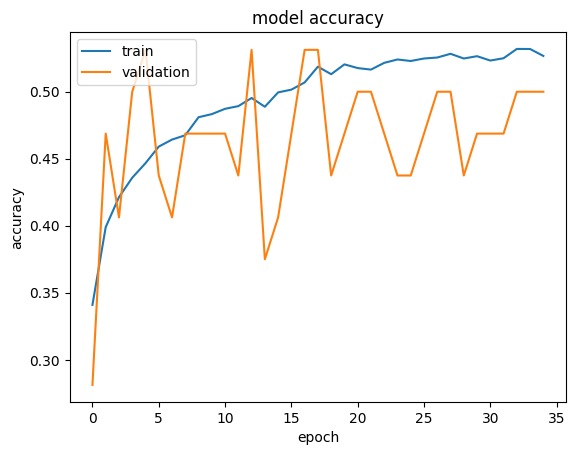

In [47]:
plt.plot(history_resnet.history["accuracy"])
plt.plot(history_resnet.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the ResNet Model**


In [48]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = new_resnet_model.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 1s - loss: 0.9343 - accuracy: 0.6875

4/4 [==============================] - 0s 6ms/step - loss: 0.9844 - accuracy: 0.5391


Loss: 0.9844411611557007, Accuracy: 0.5390625


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 1s

4/4 [==============================] - 0s 6ms/step


              precision    recall  f1-score   support

       happy       0.55      0.69      0.61        32
     neutral       0.32      0.34      0.33        32
         sad       0.60      0.47      0.53        32
    surprise       0.72      0.66      0.69        32

    accuracy                           0.54       128
   macro avg       0.55      0.54      0.54       128
weighted avg       0.55      0.54      0.54       128



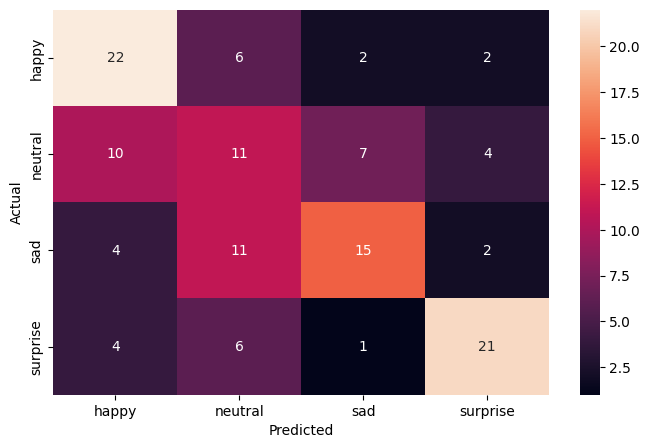

In [49]:
pred_probabilities = new_resnet_model.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:\_\_**

**Note: You can even go back and build your own architecture on top of the ResNet Transfer layer and see if you can improve the performance.**


## **EfficientNet Model**


In [50]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [51]:
efficient_model = EfficientNetB0(
    weights="imagenet", include_top=False, input_shape=(img_width, img_height, color_layers)
)
# Making all the layers of the efficient_model model non-trainable. i.e. freezing them
for layer in efficient_model.layers:
    layer.trainable = False

efficient_model.summary()

Model: "efficientnetb0"


__________________________________________________________________________________________________


 Layer (type)                Output Shape                 Param #   Connected to                  


 input_1 (InputLayer)        [(None, 48, 48, 3)]          0         []                            


 rescaling (Rescaling)       (None, 48, 48, 3)            0         ['input_1[0][0]']             


 normalization (Normalizati  (None, 48, 48, 3)            7         ['rescaling[0][0]']           


 on)                                                                                              


 rescaling_1 (Rescaling)     (None, 48, 48, 3)            0         ['normalization[0][0]']       


 stem_conv_pad (ZeroPadding  (None, 49, 49, 3)            0         ['rescaling_1[0][0]']         


 2D)                                                                                              


 stem_conv (Conv2D)          (None, 24, 24, 32)           864       ['stem_conv_pad[0][0]']       


 stem_bn (BatchNormalizatio  (None, 24, 24, 32)           128       ['stem_conv[0][0]']           


 n)                                                                                               


 stem_activation (Activatio  (None, 24, 24, 32)           0         ['stem_bn[0][0]']             


 n)                                                                                               


 block1a_dwconv (DepthwiseC  (None, 24, 24, 32)           288       ['stem_activation[0][0]']     


 onv2D)                                                                                           


 block1a_bn (BatchNormaliza  (None, 24, 24, 32)           128       ['block1a_dwconv[0][0]']      


 tion)                                                                                            


 block1a_activation (Activa  (None, 24, 24, 32)           0         ['block1a_bn[0][0]']          


 tion)                                                                                            


 block1a_se_squeeze (Global  (None, 32)                   0         ['block1a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block1a_se_reshape (Reshap  (None, 1, 1, 32)             0         ['block1a_se_squeeze[0][0]']  


 e)                                                                                               


 block1a_se_reduce (Conv2D)  (None, 1, 1, 8)              264       ['block1a_se_reshape[0][0]']  


 block1a_se_expand (Conv2D)  (None, 1, 1, 32)             288       ['block1a_se_reduce[0][0]']   


 block1a_se_excite (Multipl  (None, 24, 24, 32)           0         ['block1a_activation[0][0]',  


 y)                                                                  'block1a_se_expand[0][0]']   


 block1a_project_conv (Conv  (None, 24, 24, 16)           512       ['block1a_se_excite[0][0]']   


 2D)                                                                                              


 block1a_project_bn (BatchN  (None, 24, 24, 16)           64        ['block1a_project_conv[0][0]']


 ormalization)                                                                                    


 block2a_expand_conv (Conv2  (None, 24, 24, 96)           1536      ['block1a_project_bn[0][0]']  


 D)                                                                                               


 block2a_expand_bn (BatchNo  (None, 24, 24, 96)           384       ['block2a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block2a_expand_activation   (None, 24, 24, 96)           0         ['block2a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block2a_dwconv_pad (ZeroPa  (None, 25, 25, 96)           0         ['block2a_expand_activation[0]


 dding2D)                                                           [0]']                         


 block2a_dwconv (DepthwiseC  (None, 12, 12, 96)           864       ['block2a_dwconv_pad[0][0]']  


 onv2D)                                                                                           


 block2a_bn (BatchNormaliza  (None, 12, 12, 96)           384       ['block2a_dwconv[0][0]']      


 tion)                                                                                            


 block2a_activation (Activa  (None, 12, 12, 96)           0         ['block2a_bn[0][0]']          


 tion)                                                                                            


 block2a_se_squeeze (Global  (None, 96)                   0         ['block2a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block2a_se_reshape (Reshap  (None, 1, 1, 96)             0         ['block2a_se_squeeze[0][0]']  


 e)                                                                                               


 block2a_se_reduce (Conv2D)  (None, 1, 1, 4)              388       ['block2a_se_reshape[0][0]']  


 block2a_se_expand (Conv2D)  (None, 1, 1, 96)             480       ['block2a_se_reduce[0][0]']   


 block2a_se_excite (Multipl  (None, 12, 12, 96)           0         ['block2a_activation[0][0]',  


 y)                                                                  'block2a_se_expand[0][0]']   


 block2a_project_conv (Conv  (None, 12, 12, 24)           2304      ['block2a_se_excite[0][0]']   


 2D)                                                                                              


 block2a_project_bn (BatchN  (None, 12, 12, 24)           96        ['block2a_project_conv[0][0]']


 ormalization)                                                                                    


 block2b_expand_conv (Conv2  (None, 12, 12, 144)          3456      ['block2a_project_bn[0][0]']  


 D)                                                                                               


 block2b_expand_bn (BatchNo  (None, 12, 12, 144)          576       ['block2b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block2b_expand_activation   (None, 12, 12, 144)          0         ['block2b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block2b_dwconv (DepthwiseC  (None, 12, 12, 144)          1296      ['block2b_expand_activation[0]


 onv2D)                                                             [0]']                         


 block2b_bn (BatchNormaliza  (None, 12, 12, 144)          576       ['block2b_dwconv[0][0]']      


 tion)                                                                                            


 block2b_activation (Activa  (None, 12, 12, 144)          0         ['block2b_bn[0][0]']          


 tion)                                                                                            


 block2b_se_squeeze (Global  (None, 144)                  0         ['block2b_activation[0][0]']  


 AveragePooling2D)                                                                                


 block2b_se_reshape (Reshap  (None, 1, 1, 144)            0         ['block2b_se_squeeze[0][0]']  


 e)                                                                                               


 block2b_se_reduce (Conv2D)  (None, 1, 1, 6)              870       ['block2b_se_reshape[0][0]']  


 block2b_se_expand (Conv2D)  (None, 1, 1, 144)            1008      ['block2b_se_reduce[0][0]']   


 block2b_se_excite (Multipl  (None, 12, 12, 144)          0         ['block2b_activation[0][0]',  


 y)                                                                  'block2b_se_expand[0][0]']   


 block2b_project_conv (Conv  (None, 12, 12, 24)           3456      ['block2b_se_excite[0][0]']   


 2D)                                                                                              


 block2b_project_bn (BatchN  (None, 12, 12, 24)           96        ['block2b_project_conv[0][0]']


 ormalization)                                                                                    


 block2b_drop (Dropout)      (None, 12, 12, 24)           0         ['block2b_project_bn[0][0]']  


 block2b_add (Add)           (None, 12, 12, 24)           0         ['block2b_drop[0][0]',        


                                                                     'block2a_project_bn[0][0]']  


 block3a_expand_conv (Conv2  (None, 12, 12, 144)          3456      ['block2b_add[0][0]']         


 D)                                                                                               


 block3a_expand_bn (BatchNo  (None, 12, 12, 144)          576       ['block3a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block3a_expand_activation   (None, 12, 12, 144)          0         ['block3a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block3a_dwconv_pad (ZeroPa  (None, 15, 15, 144)          0         ['block3a_expand_activation[0]


 dding2D)                                                           [0]']                         


 block3a_dwconv (DepthwiseC  (None, 6, 6, 144)            3600      ['block3a_dwconv_pad[0][0]']  


 onv2D)                                                                                           


 block3a_bn (BatchNormaliza  (None, 6, 6, 144)            576       ['block3a_dwconv[0][0]']      


 tion)                                                                                            


 block3a_activation (Activa  (None, 6, 6, 144)            0         ['block3a_bn[0][0]']          


 tion)                                                                                            


 block3a_se_squeeze (Global  (None, 144)                  0         ['block3a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block3a_se_reshape (Reshap  (None, 1, 1, 144)            0         ['block3a_se_squeeze[0][0]']  


 e)                                                                                               


 block3a_se_reduce (Conv2D)  (None, 1, 1, 6)              870       ['block3a_se_reshape[0][0]']  


 block3a_se_expand (Conv2D)  (None, 1, 1, 144)            1008      ['block3a_se_reduce[0][0]']   


 block3a_se_excite (Multipl  (None, 6, 6, 144)            0         ['block3a_activation[0][0]',  


 y)                                                                  'block3a_se_expand[0][0]']   


 block3a_project_conv (Conv  (None, 6, 6, 40)             5760      ['block3a_se_excite[0][0]']   


 2D)                                                                                              


 block3a_project_bn (BatchN  (None, 6, 6, 40)             160       ['block3a_project_conv[0][0]']


 ormalization)                                                                                    


 block3b_expand_conv (Conv2  (None, 6, 6, 240)            9600      ['block3a_project_bn[0][0]']  


 D)                                                                                               


 block3b_expand_bn (BatchNo  (None, 6, 6, 240)            960       ['block3b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block3b_expand_activation   (None, 6, 6, 240)            0         ['block3b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block3b_dwconv (DepthwiseC  (None, 6, 6, 240)            6000      ['block3b_expand_activation[0]


 onv2D)                                                             [0]']                         


 block3b_bn (BatchNormaliza  (None, 6, 6, 240)            960       ['block3b_dwconv[0][0]']      


 tion)                                                                                            


 block3b_activation (Activa  (None, 6, 6, 240)            0         ['block3b_bn[0][0]']          


 tion)                                                                                            


 block3b_se_squeeze (Global  (None, 240)                  0         ['block3b_activation[0][0]']  


 AveragePooling2D)                                                                                


 block3b_se_reshape (Reshap  (None, 1, 1, 240)            0         ['block3b_se_squeeze[0][0]']  


 e)                                                                                               


 block3b_se_reduce (Conv2D)  (None, 1, 1, 10)             2410      ['block3b_se_reshape[0][0]']  


 block3b_se_expand (Conv2D)  (None, 1, 1, 240)            2640      ['block3b_se_reduce[0][0]']   


 block3b_se_excite (Multipl  (None, 6, 6, 240)            0         ['block3b_activation[0][0]',  


 y)                                                                  'block3b_se_expand[0][0]']   


 block3b_project_conv (Conv  (None, 6, 6, 40)             9600      ['block3b_se_excite[0][0]']   


 2D)                                                                                              


 block3b_project_bn (BatchN  (None, 6, 6, 40)             160       ['block3b_project_conv[0][0]']


 ormalization)                                                                                    


 block3b_drop (Dropout)      (None, 6, 6, 40)             0         ['block3b_project_bn[0][0]']  


 block3b_add (Add)           (None, 6, 6, 40)             0         ['block3b_drop[0][0]',        


                                                                     'block3a_project_bn[0][0]']  


 block4a_expand_conv (Conv2  (None, 6, 6, 240)            9600      ['block3b_add[0][0]']         


 D)                                                                                               


 block4a_expand_bn (BatchNo  (None, 6, 6, 240)            960       ['block4a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block4a_expand_activation   (None, 6, 6, 240)            0         ['block4a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block4a_dwconv_pad (ZeroPa  (None, 7, 7, 240)            0         ['block4a_expand_activation[0]


 dding2D)                                                           [0]']                         


 block4a_dwconv (DepthwiseC  (None, 3, 3, 240)            2160      ['block4a_dwconv_pad[0][0]']  


 onv2D)                                                                                           


 block4a_bn (BatchNormaliza  (None, 3, 3, 240)            960       ['block4a_dwconv[0][0]']      


 tion)                                                                                            


 block4a_activation (Activa  (None, 3, 3, 240)            0         ['block4a_bn[0][0]']          


 tion)                                                                                            


 block4a_se_squeeze (Global  (None, 240)                  0         ['block4a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block4a_se_reshape (Reshap  (None, 1, 1, 240)            0         ['block4a_se_squeeze[0][0]']  


 e)                                                                                               


 block4a_se_reduce (Conv2D)  (None, 1, 1, 10)             2410      ['block4a_se_reshape[0][0]']  


 block4a_se_expand (Conv2D)  (None, 1, 1, 240)            2640      ['block4a_se_reduce[0][0]']   


 block4a_se_excite (Multipl  (None, 3, 3, 240)            0         ['block4a_activation[0][0]',  


 y)                                                                  'block4a_se_expand[0][0]']   


 block4a_project_conv (Conv  (None, 3, 3, 80)             19200     ['block4a_se_excite[0][0]']   


 2D)                                                                                              


 block4a_project_bn (BatchN  (None, 3, 3, 80)             320       ['block4a_project_conv[0][0]']


 ormalization)                                                                                    


 block4b_expand_conv (Conv2  (None, 3, 3, 480)            38400     ['block4a_project_bn[0][0]']  


 D)                                                                                               


 block4b_expand_bn (BatchNo  (None, 3, 3, 480)            1920      ['block4b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block4b_expand_activation   (None, 3, 3, 480)            0         ['block4b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block4b_dwconv (DepthwiseC  (None, 3, 3, 480)            4320      ['block4b_expand_activation[0]


 onv2D)                                                             [0]']                         


 block4b_bn (BatchNormaliza  (None, 3, 3, 480)            1920      ['block4b_dwconv[0][0]']      


 tion)                                                                                            


 block4b_activation (Activa  (None, 3, 3, 480)            0         ['block4b_bn[0][0]']          


 tion)                                                                                            


 block4b_se_squeeze (Global  (None, 480)                  0         ['block4b_activation[0][0]']  


 AveragePooling2D)                                                                                


 block4b_se_reshape (Reshap  (None, 1, 1, 480)            0         ['block4b_se_squeeze[0][0]']  


 e)                                                                                               


 block4b_se_reduce (Conv2D)  (None, 1, 1, 20)             9620      ['block4b_se_reshape[0][0]']  


 block4b_se_expand (Conv2D)  (None, 1, 1, 480)            10080     ['block4b_se_reduce[0][0]']   


 block4b_se_excite (Multipl  (None, 3, 3, 480)            0         ['block4b_activation[0][0]',  


 y)                                                                  'block4b_se_expand[0][0]']   


 block4b_project_conv (Conv  (None, 3, 3, 80)             38400     ['block4b_se_excite[0][0]']   


 2D)                                                                                              


 block4b_project_bn (BatchN  (None, 3, 3, 80)             320       ['block4b_project_conv[0][0]']


 ormalization)                                                                                    


 block4b_drop (Dropout)      (None, 3, 3, 80)             0         ['block4b_project_bn[0][0]']  


 block4b_add (Add)           (None, 3, 3, 80)             0         ['block4b_drop[0][0]',        


                                                                     'block4a_project_bn[0][0]']  


 block4c_expand_conv (Conv2  (None, 3, 3, 480)            38400     ['block4b_add[0][0]']         


 D)                                                                                               


 block4c_expand_bn (BatchNo  (None, 3, 3, 480)            1920      ['block4c_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block4c_expand_activation   (None, 3, 3, 480)            0         ['block4c_expand_bn[0][0]']   


 (Activation)                                                                                     


 block4c_dwconv (DepthwiseC  (None, 3, 3, 480)            4320      ['block4c_expand_activation[0]


 onv2D)                                                             [0]']                         


 block4c_bn (BatchNormaliza  (None, 3, 3, 480)            1920      ['block4c_dwconv[0][0]']      


 tion)                                                                                            


 block4c_activation (Activa  (None, 3, 3, 480)            0         ['block4c_bn[0][0]']          


 tion)                                                                                            


 block4c_se_squeeze (Global  (None, 480)                  0         ['block4c_activation[0][0]']  


 AveragePooling2D)                                                                                


 block4c_se_reshape (Reshap  (None, 1, 1, 480)            0         ['block4c_se_squeeze[0][0]']  


 e)                                                                                               


 block4c_se_reduce (Conv2D)  (None, 1, 1, 20)             9620      ['block4c_se_reshape[0][0]']  


 block4c_se_expand (Conv2D)  (None, 1, 1, 480)            10080     ['block4c_se_reduce[0][0]']   


 block4c_se_excite (Multipl  (None, 3, 3, 480)            0         ['block4c_activation[0][0]',  


 y)                                                                  'block4c_se_expand[0][0]']   


 block4c_project_conv (Conv  (None, 3, 3, 80)             38400     ['block4c_se_excite[0][0]']   


 2D)                                                                                              


 block4c_project_bn (BatchN  (None, 3, 3, 80)             320       ['block4c_project_conv[0][0]']


 ormalization)                                                                                    


 block4c_drop (Dropout)      (None, 3, 3, 80)             0         ['block4c_project_bn[0][0]']  


 block4c_add (Add)           (None, 3, 3, 80)             0         ['block4c_drop[0][0]',        


                                                                     'block4b_add[0][0]']         


 block5a_expand_conv (Conv2  (None, 3, 3, 480)            38400     ['block4c_add[0][0]']         


 D)                                                                                               


 block5a_expand_bn (BatchNo  (None, 3, 3, 480)            1920      ['block5a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block5a_expand_activation   (None, 3, 3, 480)            0         ['block5a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block5a_dwconv (DepthwiseC  (None, 3, 3, 480)            12000     ['block5a_expand_activation[0]


 onv2D)                                                             [0]']                         


 block5a_bn (BatchNormaliza  (None, 3, 3, 480)            1920      ['block5a_dwconv[0][0]']      


 tion)                                                                                            


 block5a_activation (Activa  (None, 3, 3, 480)            0         ['block5a_bn[0][0]']          


 tion)                                                                                            


 block5a_se_squeeze (Global  (None, 480)                  0         ['block5a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block5a_se_reshape (Reshap  (None, 1, 1, 480)            0         ['block5a_se_squeeze[0][0]']  


 e)                                                                                               


 block5a_se_reduce (Conv2D)  (None, 1, 1, 20)             9620      ['block5a_se_reshape[0][0]']  


 block5a_se_expand (Conv2D)  (None, 1, 1, 480)            10080     ['block5a_se_reduce[0][0]']   


 block5a_se_excite (Multipl  (None, 3, 3, 480)            0         ['block5a_activation[0][0]',  


 y)                                                                  'block5a_se_expand[0][0]']   


 block5a_project_conv (Conv  (None, 3, 3, 112)            53760     ['block5a_se_excite[0][0]']   


 2D)                                                                                              


 block5a_project_bn (BatchN  (None, 3, 3, 112)            448       ['block5a_project_conv[0][0]']


 ormalization)                                                                                    


 block5b_expand_conv (Conv2  (None, 3, 3, 672)            75264     ['block5a_project_bn[0][0]']  


 D)                                                                                               


 block5b_expand_bn (BatchNo  (None, 3, 3, 672)            2688      ['block5b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block5b_expand_activation   (None, 3, 3, 672)            0         ['block5b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block5b_dwconv (DepthwiseC  (None, 3, 3, 672)            16800     ['block5b_expand_activation[0]


 onv2D)                                                             [0]']                         


 block5b_bn (BatchNormaliza  (None, 3, 3, 672)            2688      ['block5b_dwconv[0][0]']      


 tion)                                                                                            


 block5b_activation (Activa  (None, 3, 3, 672)            0         ['block5b_bn[0][0]']          


 tion)                                                                                            


 block5b_se_squeeze (Global  (None, 672)                  0         ['block5b_activation[0][0]']  


 AveragePooling2D)                                                                                


 block5b_se_reshape (Reshap  (None, 1, 1, 672)            0         ['block5b_se_squeeze[0][0]']  


 e)                                                                                               


 block5b_se_reduce (Conv2D)  (None, 1, 1, 28)             18844     ['block5b_se_reshape[0][0]']  


 block5b_se_expand (Conv2D)  (None, 1, 1, 672)            19488     ['block5b_se_reduce[0][0]']   


 block5b_se_excite (Multipl  (None, 3, 3, 672)            0         ['block5b_activation[0][0]',  


 y)                                                                  'block5b_se_expand[0][0]']   


 block5b_project_conv (Conv  (None, 3, 3, 112)            75264     ['block5b_se_excite[0][0]']   


 2D)                                                                                              


 block5b_project_bn (BatchN  (None, 3, 3, 112)            448       ['block5b_project_conv[0][0]']


 ormalization)                                                                                    


 block5b_drop (Dropout)      (None, 3, 3, 112)            0         ['block5b_project_bn[0][0]']  


 block5b_add (Add)           (None, 3, 3, 112)            0         ['block5b_drop[0][0]',        


                                                                     'block5a_project_bn[0][0]']  


 block5c_expand_conv (Conv2  (None, 3, 3, 672)            75264     ['block5b_add[0][0]']         


 D)                                                                                               


 block5c_expand_bn (BatchNo  (None, 3, 3, 672)            2688      ['block5c_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block5c_expand_activation   (None, 3, 3, 672)            0         ['block5c_expand_bn[0][0]']   


 (Activation)                                                                                     


 block5c_dwconv (DepthwiseC  (None, 3, 3, 672)            16800     ['block5c_expand_activation[0]


 onv2D)                                                             [0]']                         


 block5c_bn (BatchNormaliza  (None, 3, 3, 672)            2688      ['block5c_dwconv[0][0]']      


 tion)                                                                                            


 block5c_activation (Activa  (None, 3, 3, 672)            0         ['block5c_bn[0][0]']          


 tion)                                                                                            


 block5c_se_squeeze (Global  (None, 672)                  0         ['block5c_activation[0][0]']  


 AveragePooling2D)                                                                                


 block5c_se_reshape (Reshap  (None, 1, 1, 672)            0         ['block5c_se_squeeze[0][0]']  


 e)                                                                                               


 block5c_se_reduce (Conv2D)  (None, 1, 1, 28)             18844     ['block5c_se_reshape[0][0]']  


 block5c_se_expand (Conv2D)  (None, 1, 1, 672)            19488     ['block5c_se_reduce[0][0]']   


 block5c_se_excite (Multipl  (None, 3, 3, 672)            0         ['block5c_activation[0][0]',  


 y)                                                                  'block5c_se_expand[0][0]']   


 block5c_project_conv (Conv  (None, 3, 3, 112)            75264     ['block5c_se_excite[0][0]']   


 2D)                                                                                              


 block5c_project_bn (BatchN  (None, 3, 3, 112)            448       ['block5c_project_conv[0][0]']


 ormalization)                                                                                    


 block5c_drop (Dropout)      (None, 3, 3, 112)            0         ['block5c_project_bn[0][0]']  


 block5c_add (Add)           (None, 3, 3, 112)            0         ['block5c_drop[0][0]',        


                                                                     'block5b_add[0][0]']         


 block6a_expand_conv (Conv2  (None, 3, 3, 672)            75264     ['block5c_add[0][0]']         


 D)                                                                                               


 block6a_expand_bn (BatchNo  (None, 3, 3, 672)            2688      ['block6a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6a_expand_activation   (None, 3, 3, 672)            0         ['block6a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6a_dwconv_pad (ZeroPa  (None, 7, 7, 672)            0         ['block6a_expand_activation[0]


 dding2D)                                                           [0]']                         


 block6a_dwconv (DepthwiseC  (None, 2, 2, 672)            16800     ['block6a_dwconv_pad[0][0]']  


 onv2D)                                                                                           


 block6a_bn (BatchNormaliza  (None, 2, 2, 672)            2688      ['block6a_dwconv[0][0]']      


 tion)                                                                                            


 block6a_activation (Activa  (None, 2, 2, 672)            0         ['block6a_bn[0][0]']          


 tion)                                                                                            


 block6a_se_squeeze (Global  (None, 672)                  0         ['block6a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6a_se_reshape (Reshap  (None, 1, 1, 672)            0         ['block6a_se_squeeze[0][0]']  


 e)                                                                                               


 block6a_se_reduce (Conv2D)  (None, 1, 1, 28)             18844     ['block6a_se_reshape[0][0]']  


 block6a_se_expand (Conv2D)  (None, 1, 1, 672)            19488     ['block6a_se_reduce[0][0]']   


 block6a_se_excite (Multipl  (None, 2, 2, 672)            0         ['block6a_activation[0][0]',  


 y)                                                                  'block6a_se_expand[0][0]']   


 block6a_project_conv (Conv  (None, 2, 2, 192)            129024    ['block6a_se_excite[0][0]']   


 2D)                                                                                              


 block6a_project_bn (BatchN  (None, 2, 2, 192)            768       ['block6a_project_conv[0][0]']


 ormalization)                                                                                    


 block6b_expand_conv (Conv2  (None, 2, 2, 1152)           221184    ['block6a_project_bn[0][0]']  


 D)                                                                                               


 block6b_expand_bn (BatchNo  (None, 2, 2, 1152)           4608      ['block6b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6b_expand_activation   (None, 2, 2, 1152)           0         ['block6b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6b_dwconv (DepthwiseC  (None, 2, 2, 1152)           28800     ['block6b_expand_activation[0]


 onv2D)                                                             [0]']                         


 block6b_bn (BatchNormaliza  (None, 2, 2, 1152)           4608      ['block6b_dwconv[0][0]']      


 tion)                                                                                            


 block6b_activation (Activa  (None, 2, 2, 1152)           0         ['block6b_bn[0][0]']          


 tion)                                                                                            


 block6b_se_squeeze (Global  (None, 1152)                 0         ['block6b_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6b_se_reshape (Reshap  (None, 1, 1, 1152)           0         ['block6b_se_squeeze[0][0]']  


 e)                                                                                               


 block6b_se_reduce (Conv2D)  (None, 1, 1, 48)             55344     ['block6b_se_reshape[0][0]']  


 block6b_se_expand (Conv2D)  (None, 1, 1, 1152)           56448     ['block6b_se_reduce[0][0]']   


 block6b_se_excite (Multipl  (None, 2, 2, 1152)           0         ['block6b_activation[0][0]',  


 y)                                                                  'block6b_se_expand[0][0]']   


 block6b_project_conv (Conv  (None, 2, 2, 192)            221184    ['block6b_se_excite[0][0]']   


 2D)                                                                                              


 block6b_project_bn (BatchN  (None, 2, 2, 192)            768       ['block6b_project_conv[0][0]']


 ormalization)                                                                                    


 block6b_drop (Dropout)      (None, 2, 2, 192)            0         ['block6b_project_bn[0][0]']  


 block6b_add (Add)           (None, 2, 2, 192)            0         ['block6b_drop[0][0]',        


                                                                     'block6a_project_bn[0][0]']  


 block6c_expand_conv (Conv2  (None, 2, 2, 1152)           221184    ['block6b_add[0][0]']         


 D)                                                                                               


 block6c_expand_bn (BatchNo  (None, 2, 2, 1152)           4608      ['block6c_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6c_expand_activation   (None, 2, 2, 1152)           0         ['block6c_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6c_dwconv (DepthwiseC  (None, 2, 2, 1152)           28800     ['block6c_expand_activation[0]


 onv2D)                                                             [0]']                         


 block6c_bn (BatchNormaliza  (None, 2, 2, 1152)           4608      ['block6c_dwconv[0][0]']      


 tion)                                                                                            


 block6c_activation (Activa  (None, 2, 2, 1152)           0         ['block6c_bn[0][0]']          


 tion)                                                                                            


 block6c_se_squeeze (Global  (None, 1152)                 0         ['block6c_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6c_se_reshape (Reshap  (None, 1, 1, 1152)           0         ['block6c_se_squeeze[0][0]']  


 e)                                                                                               


 block6c_se_reduce (Conv2D)  (None, 1, 1, 48)             55344     ['block6c_se_reshape[0][0]']  


 block6c_se_expand (Conv2D)  (None, 1, 1, 1152)           56448     ['block6c_se_reduce[0][0]']   


 block6c_se_excite (Multipl  (None, 2, 2, 1152)           0         ['block6c_activation[0][0]',  


 y)                                                                  'block6c_se_expand[0][0]']   


 block6c_project_conv (Conv  (None, 2, 2, 192)            221184    ['block6c_se_excite[0][0]']   


 2D)                                                                                              


 block6c_project_bn (BatchN  (None, 2, 2, 192)            768       ['block6c_project_conv[0][0]']


 ormalization)                                                                                    


 block6c_drop (Dropout)      (None, 2, 2, 192)            0         ['block6c_project_bn[0][0]']  


 block6c_add (Add)           (None, 2, 2, 192)            0         ['block6c_drop[0][0]',        


                                                                     'block6b_add[0][0]']         


 block6d_expand_conv (Conv2  (None, 2, 2, 1152)           221184    ['block6c_add[0][0]']         


 D)                                                                                               


 block6d_expand_bn (BatchNo  (None, 2, 2, 1152)           4608      ['block6d_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6d_expand_activation   (None, 2, 2, 1152)           0         ['block6d_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6d_dwconv (DepthwiseC  (None, 2, 2, 1152)           28800     ['block6d_expand_activation[0]


 onv2D)                                                             [0]']                         


 block6d_bn (BatchNormaliza  (None, 2, 2, 1152)           4608      ['block6d_dwconv[0][0]']      


 tion)                                                                                            


 block6d_activation (Activa  (None, 2, 2, 1152)           0         ['block6d_bn[0][0]']          


 tion)                                                                                            


 block6d_se_squeeze (Global  (None, 1152)                 0         ['block6d_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6d_se_reshape (Reshap  (None, 1, 1, 1152)           0         ['block6d_se_squeeze[0][0]']  


 e)                                                                                               


 block6d_se_reduce (Conv2D)  (None, 1, 1, 48)             55344     ['block6d_se_reshape[0][0]']  


 block6d_se_expand (Conv2D)  (None, 1, 1, 1152)           56448     ['block6d_se_reduce[0][0]']   


 block6d_se_excite (Multipl  (None, 2, 2, 1152)           0         ['block6d_activation[0][0]',  


 y)                                                                  'block6d_se_expand[0][0]']   


 block6d_project_conv (Conv  (None, 2, 2, 192)            221184    ['block6d_se_excite[0][0]']   


 2D)                                                                                              


 block6d_project_bn (BatchN  (None, 2, 2, 192)            768       ['block6d_project_conv[0][0]']


 ormalization)                                                                                    


 block6d_drop (Dropout)      (None, 2, 2, 192)            0         ['block6d_project_bn[0][0]']  


 block6d_add (Add)           (None, 2, 2, 192)            0         ['block6d_drop[0][0]',        


                                                                     'block6c_add[0][0]']         


 block7a_expand_conv (Conv2  (None, 2, 2, 1152)           221184    ['block6d_add[0][0]']         


 D)                                                                                               


 block7a_expand_bn (BatchNo  (None, 2, 2, 1152)           4608      ['block7a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block7a_expand_activation   (None, 2, 2, 1152)           0         ['block7a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block7a_dwconv (DepthwiseC  (None, 2, 2, 1152)           10368     ['block7a_expand_activation[0]


 onv2D)                                                             [0]']                         


 block7a_bn (BatchNormaliza  (None, 2, 2, 1152)           4608      ['block7a_dwconv[0][0]']      


 tion)                                                                                            


 block7a_activation (Activa  (None, 2, 2, 1152)           0         ['block7a_bn[0][0]']          


 tion)                                                                                            


 block7a_se_squeeze (Global  (None, 1152)                 0         ['block7a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block7a_se_reshape (Reshap  (None, 1, 1, 1152)           0         ['block7a_se_squeeze[0][0]']  


 e)                                                                                               


 block7a_se_reduce (Conv2D)  (None, 1, 1, 48)             55344     ['block7a_se_reshape[0][0]']  


 block7a_se_expand (Conv2D)  (None, 1, 1, 1152)           56448     ['block7a_se_reduce[0][0]']   


 block7a_se_excite (Multipl  (None, 2, 2, 1152)           0         ['block7a_activation[0][0]',  


 y)                                                                  'block7a_se_expand[0][0]']   


 block7a_project_conv (Conv  (None, 2, 2, 320)            368640    ['block7a_se_excite[0][0]']   


 2D)                                                                                              


 block7a_project_bn (BatchN  (None, 2, 2, 320)            1280      ['block7a_project_conv[0][0]']


 ormalization)                                                                                    


 top_conv (Conv2D)           (None, 2, 2, 1280)           409600    ['block7a_project_bn[0][0]']  


 top_bn (BatchNormalization  (None, 2, 2, 1280)           5120      ['top_conv[0][0]']            


 )                                                                                                


 top_activation (Activation  (None, 2, 2, 1280)           0         ['top_bn[0][0]']              


 )                                                                                                


Total params: 4049571 (15.45 MB)


Trainable params: 0 (0.00 Byte)


Non-trainable params: 4049571 (15.45 MB)


__________________________________________________________________________________________________


### **Model Building**

- Import EfficientNet upto the layer of your choice and add Fully Connected layers on top of it.


In [52]:
new_efficient_model = Sequential()
new_efficient_model.add(efficient_model)

# Reduces each feature map to a single value by averaging all elements
new_efficient_model.add(GlobalAveragePooling2D())

# Adding a dense output layer
new_efficient_model.add(Dense(512, activation="relu"))
new_efficient_model.add(Dropout(0.5))
new_efficient_model.add(Dense(128, activation="relu"))
new_efficient_model.add(Dropout(0.5))
new_efficient_model.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the Model**


In [53]:
new_efficient_model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
new_efficient_model.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 efficientnetb0 (Functional  (None, 2, 2, 1280)        4049571   


 )                                                               


 global_average_pooling2d (  (None, 1280)              0         


 GlobalAveragePooling2D)                                         


 dense (Dense)               (None, 512)               655872    


 dropout (Dropout)           (None, 512)               0         


 dense_1 (Dense)             (None, 128)               65664     


 dropout_1 (Dropout)         (None, 128)               0         


 dense_2 (Dense)             (None, 4)                 516       


Total params: 4771623 (18.20 MB)


Trainable params: 722052 (2.75 MB)


Non-trainable params: 4049571 (15.45 MB)


_________________________________________________________________


In [54]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 20 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=20
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_efficient_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_efficient = new_efficient_model.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[delayed_early_stopping, mc, reduce_lr],
)

Epoch 1/40


  1/473 [..............................] - ETA: 27:24 - loss: 1.4923 - accuracy: 0.1562

  6/473 [..............................] - ETA: 5s - loss: 1.5317 - accuracy: 0.1875   

  9/473 [..............................] - ETA: 6s - loss: 1.4925 - accuracy: 0.2326

 12/473 [..............................] - ETA: 6s - loss: 1.5034 - accuracy: 0.2370

 15/473 [..............................] - ETA: 7s - loss: 1.5015 - accuracy: 0.2354

 18/473 [>.............................] - ETA: 7s - loss: 1.4913 - accuracy: 0.2309

 21/473 [>.............................] - ETA: 7s - loss: 1.4813 - accuracy: 0.2426

 24/473 [>.............................] - ETA: 7s - loss: 1.4748 - accuracy: 0.2539

 27/473 [>.............................] - ETA: 7s - loss: 1.4747 - accuracy: 0.2523

 30/473 [>.............................] - ETA: 7s - loss: 1.4767 - accuracy: 0.2490

 33/473 [=>............................] - ETA: 7s - loss: 1.4764 - accuracy: 0.2443

 36/473 [=>............................] - ETA: 7s - loss: 1.4732 - accuracy: 0.2457

 39/473 [=>............................] - ETA: 7s - loss: 1.4659 - accuracy: 0.2500

 42/473 [=>............................] - ETA: 7s - loss: 1.4608 - accuracy: 0.2530

 45/473 [=>............................] - ETA: 7s - loss: 1.4583 - accuracy: 0.2528

 48/473 [==>...........................] - ETA: 7s - loss: 1.4535 - accuracy: 0.2552

 51/473 [==>...........................] - ETA: 7s - loss: 1.4486 - accuracy: 0.2586

 54/473 [==>...........................] - ETA: 7s - loss: 1.4464 - accuracy: 0.2581

 57/473 [==>...........................] - ETA: 7s - loss: 1.4411 - accuracy: 0.2626

 60/473 [==>...........................] - ETA: 7s - loss: 1.4420 - accuracy: 0.2599

 63/473 [==>...........................] - ETA: 6s - loss: 1.4434 - accuracy: 0.2579

 66/473 [===>..........................] - ETA: 7s - loss: 1.4421 - accuracy: 0.2547

 69/473 [===>..........................] - ETA: 7s - loss: 1.4417 - accuracy: 0.2568

 72/473 [===>..........................] - ETA: 6s - loss: 1.4389 - accuracy: 0.2600

 76/473 [===>..........................] - ETA: 6s - loss: 1.4371 - accuracy: 0.2599

 79/473 [====>.........................] - ETA: 6s - loss: 1.4358 - accuracy: 0.2599

 83/473 [====>.........................] - ETA: 6s - loss: 1.4354 - accuracy: 0.2598

 86/473 [====>.........................] - ETA: 6s - loss: 1.4339 - accuracy: 0.2580

 89/473 [====>.........................] - ETA: 6s - loss: 1.4340 - accuracy: 0.2563

 92/473 [====>.........................] - ETA: 6s - loss: 1.4337 - accuracy: 0.2524

 95/473 [=====>........................] - ETA: 6s - loss: 1.4328 - accuracy: 0.2513

 98/473 [=====>........................] - ETA: 6s - loss: 1.4318 - accuracy: 0.2490

101/473 [=====>........................] - ETA: 6s - loss: 1.4299 - accuracy: 0.2488

104/473 [=====>........................] - ETA: 6s - loss: 1.4290 - accuracy: 0.2482

107/473 [=====>........................] - ETA: 6s - loss: 1.4289 - accuracy: 0.2485

109/473 [=====>........................] - ETA: 6s - loss: 1.4282 - accuracy: 0.2474

112/473 [======>.......................] - ETA: 6s - loss: 1.4270 - accuracy: 0.2467

115/473 [======>.......................] - ETA: 6s - loss: 1.4266 - accuracy: 0.2476

118/473 [======>.......................] - ETA: 6s - loss: 1.4254 - accuracy: 0.2500

121/473 [======>.......................] - ETA: 6s - loss: 1.4248 - accuracy: 0.2505

124/473 [======>.......................] - ETA: 6s - loss: 1.4239 - accuracy: 0.2513

127/473 [=======>......................] - ETA: 6s - loss: 1.4234 - accuracy: 0.2522

130/473 [=======>......................] - ETA: 6s - loss: 1.4228 - accuracy: 0.2524

133/473 [=======>......................] - ETA: 5s - loss: 1.4236 - accuracy: 0.2519

136/473 [=======>......................] - ETA: 5s - loss: 1.4234 - accuracy: 0.2528

139/473 [=======>......................] - ETA: 5s - loss: 1.4233 - accuracy: 0.2525

142/473 [========>.....................] - ETA: 5s - loss: 1.4227 - accuracy: 0.2526

145/473 [========>.....................] - ETA: 5s - loss: 1.4226 - accuracy: 0.2517

148/473 [========>.....................] - ETA: 5s - loss: 1.4217 - accuracy: 0.2521

151/473 [========>.....................] - ETA: 5s - loss: 1.4210 - accuracy: 0.2527

154/473 [========>.....................] - ETA: 5s - loss: 1.4211 - accuracy: 0.2520

157/473 [========>.....................] - ETA: 5s - loss: 1.4205 - accuracy: 0.2534

160/473 [=========>....................] - ETA: 5s - loss: 1.4203 - accuracy: 0.2514

163/473 [=========>....................] - ETA: 5s - loss: 1.4198 - accuracy: 0.2517

166/473 [=========>....................] - ETA: 5s - loss: 1.4193 - accuracy: 0.2515

169/473 [=========>....................] - ETA: 5s - loss: 1.4187 - accuracy: 0.2518

172/473 [=========>....................] - ETA: 5s - loss: 1.4182 - accuracy: 0.2518

175/473 [==========>...................] - ETA: 5s - loss: 1.4178 - accuracy: 0.2514

178/473 [==========>...................] - ETA: 5s - loss: 1.4166 - accuracy: 0.2537

181/473 [==========>...................] - ETA: 5s - loss: 1.4159 - accuracy: 0.2541

184/473 [==========>...................] - ETA: 5s - loss: 1.4155 - accuracy: 0.2541

187/473 [==========>...................] - ETA: 4s - loss: 1.4151 - accuracy: 0.2537

190/473 [===========>..................] - ETA: 4s - loss: 1.4146 - accuracy: 0.2541

193/473 [===========>..................] - ETA: 4s - loss: 1.4145 - accuracy: 0.2542

196/473 [===========>..................] - ETA: 4s - loss: 1.4140 - accuracy: 0.2549

199/473 [===========>..................] - ETA: 4s - loss: 1.4134 - accuracy: 0.2557

202/473 [===========>..................] - ETA: 4s - loss: 1.4132 - accuracy: 0.2557

205/473 [============>.................] - ETA: 4s - loss: 1.4133 - accuracy: 0.2543

208/473 [============>.................] - ETA: 4s - loss: 1.4129 - accuracy: 0.2550

210/473 [============>.................] - ETA: 4s - loss: 1.4127 - accuracy: 0.2558

215/473 [============>.................] - ETA: 4s - loss: 1.4119 - accuracy: 0.2554

218/473 [============>.................] - ETA: 4s - loss: 1.4114 - accuracy: 0.2556

221/473 [=============>................] - ETA: 4s - loss: 1.4114 - accuracy: 0.2545

224/473 [=============>................] - ETA: 4s - loss: 1.4113 - accuracy: 0.2549

227/473 [=============>................] - ETA: 4s - loss: 1.4111 - accuracy: 0.2552

230/473 [=============>................] - ETA: 4s - loss: 1.4109 - accuracy: 0.2545

233/473 [=============>................] - ETA: 4s - loss: 1.4105 - accuracy: 0.2549

236/473 [=============>................] - ETA: 4s - loss: 1.4101 - accuracy: 0.2545

239/473 [==============>...............] - ETA: 4s - loss: 1.4099 - accuracy: 0.2543

242/473 [==============>...............] - ETA: 3s - loss: 1.4094 - accuracy: 0.2552

245/473 [==============>...............] - ETA: 3s - loss: 1.4092 - accuracy: 0.2552

248/473 [==============>...............] - ETA: 3s - loss: 1.4088 - accuracy: 0.2553

251/473 [==============>...............] - ETA: 3s - loss: 1.4086 - accuracy: 0.2552

254/473 [===============>..............] - ETA: 3s - loss: 1.4084 - accuracy: 0.2549

257/473 [===============>..............] - ETA: 3s - loss: 1.4082 - accuracy: 0.2548

260/473 [===============>..............] - ETA: 3s - loss: 1.4079 - accuracy: 0.2546

263/473 [===============>..............] - ETA: 3s - loss: 1.4079 - accuracy: 0.2535

266/473 [===============>..............] - ETA: 3s - loss: 1.4077 - accuracy: 0.2541

269/473 [================>.............] - ETA: 3s - loss: 1.4074 - accuracy: 0.2545

272/473 [================>.............] - ETA: 3s - loss: 1.4072 - accuracy: 0.2552

275/473 [================>.............] - ETA: 3s - loss: 1.4069 - accuracy: 0.2564

278/473 [================>.............] - ETA: 3s - loss: 1.4066 - accuracy: 0.2566

281/473 [================>.............] - ETA: 3s - loss: 1.4063 - accuracy: 0.2569

284/473 [=================>............] - ETA: 3s - loss: 1.4062 - accuracy: 0.2565

287/473 [=================>............] - ETA: 3s - loss: 1.4061 - accuracy: 0.2558

290/473 [=================>............] - ETA: 3s - loss: 1.4059 - accuracy: 0.2556

292/473 [=================>............] - ETA: 3s - loss: 1.4058 - accuracy: 0.2558

294/473 [=================>............] - ETA: 3s - loss: 1.4057 - accuracy: 0.2553

297/473 [=================>............] - ETA: 3s - loss: 1.4055 - accuracy: 0.2551

300/473 [==================>...........] - ETA: 3s - loss: 1.4053 - accuracy: 0.2553

303/473 [==================>...........] - ETA: 2s - loss: 1.4050 - accuracy: 0.2558

306/473 [==================>...........] - ETA: 2s - loss: 1.4047 - accuracy: 0.2563

309/473 [==================>...........] - ETA: 2s - loss: 1.4045 - accuracy: 0.2570

312/473 [==================>...........] - ETA: 2s - loss: 1.4042 - accuracy: 0.2575

315/473 [==================>...........] - ETA: 2s - loss: 1.4040 - accuracy: 0.2574

318/473 [===================>..........] - ETA: 2s - loss: 1.4038 - accuracy: 0.2577

321/473 [===================>..........] - ETA: 2s - loss: 1.4036 - accuracy: 0.2578

324/473 [===================>..........] - ETA: 2s - loss: 1.4034 - accuracy: 0.2577

327/473 [===================>..........] - ETA: 2s - loss: 1.4033 - accuracy: 0.2579

330/473 [===================>..........] - ETA: 2s - loss: 1.4031 - accuracy: 0.2581

333/473 [====================>.........] - ETA: 2s - loss: 1.4029 - accuracy: 0.2582

336/473 [====================>.........] - ETA: 2s - loss: 1.4028 - accuracy: 0.2580

339/473 [====================>.........] - ETA: 2s - loss: 1.4027 - accuracy: 0.2576

342/473 [====================>.........] - ETA: 2s - loss: 1.4027 - accuracy: 0.2569

345/473 [====================>.........] - ETA: 2s - loss: 1.4026 - accuracy: 0.2567

348/473 [=====================>........] - ETA: 2s - loss: 1.4024 - accuracy: 0.2567

351/473 [=====================>........] - ETA: 2s - loss: 1.4024 - accuracy: 0.2566

354/473 [=====================>........] - ETA: 2s - loss: 1.4023 - accuracy: 0.2556

357/473 [=====================>........] - ETA: 2s - loss: 1.4022 - accuracy: 0.2552

360/473 [=====================>........] - ETA: 1s - loss: 1.4021 - accuracy: 0.2552

363/473 [======================>.......] - ETA: 1s - loss: 1.4019 - accuracy: 0.2552

366/473 [======================>.......] - ETA: 1s - loss: 1.4018 - accuracy: 0.2552

369/473 [======================>.......] - ETA: 1s - loss: 1.4016 - accuracy: 0.2552

372/473 [======================>.......] - ETA: 1s - loss: 1.4014 - accuracy: 0.2556

375/473 [======================>.......] - ETA: 1s - loss: 1.4011 - accuracy: 0.2562

378/473 [======================>.......] - ETA: 1s - loss: 1.4010 - accuracy: 0.2564

381/473 [=======================>......] - ETA: 1s - loss: 1.4009 - accuracy: 0.2562

384/473 [=======================>......] - ETA: 1s - loss: 1.4008 - accuracy: 0.2566

387/473 [=======================>......] - ETA: 1s - loss: 1.4007 - accuracy: 0.2562

390/473 [=======================>......] - ETA: 1s - loss: 1.4006 - accuracy: 0.2564

393/473 [=======================>......] - ETA: 1s - loss: 1.4004 - accuracy: 0.2565

396/473 [========================>.....] - ETA: 1s - loss: 1.4003 - accuracy: 0.2565

399/473 [========================>.....] - ETA: 1s - loss: 1.4003 - accuracy: 0.2559

402/473 [========================>.....] - ETA: 1s - loss: 1.4002 - accuracy: 0.2562

405/473 [========================>.....] - ETA: 1s - loss: 1.4000 - accuracy: 0.2561

408/473 [========================>.....] - ETA: 1s - loss: 1.3999 - accuracy: 0.2556

411/473 [=========================>....] - ETA: 1s - loss: 1.3998 - accuracy: 0.2554

414/473 [=========================>....] - ETA: 1s - loss: 1.3997 - accuracy: 0.2554

417/473 [=========================>....] - ETA: 0s - loss: 1.3996 - accuracy: 0.2546

420/473 [=========================>....] - ETA: 0s - loss: 1.3994 - accuracy: 0.2542

423/473 [=========================>....] - ETA: 0s - loss: 1.3994 - accuracy: 0.2545

426/473 [==========================>...] - ETA: 0s - loss: 1.3992 - accuracy: 0.2545

429/473 [==========================>...] - ETA: 0s - loss: 1.3991 - accuracy: 0.2544

432/473 [==========================>...] - ETA: 0s - loss: 1.3989 - accuracy: 0.2551

435/473 [==========================>...] - ETA: 0s - loss: 1.3988 - accuracy: 0.2552

438/473 [==========================>...] - ETA: 0s - loss: 1.3987 - accuracy: 0.2547

441/473 [==========================>...] - ETA: 0s - loss: 1.3985 - accuracy: 0.2552

444/473 [===========================>..] - ETA: 0s - loss: 1.3983 - accuracy: 0.2555

447/473 [===========================>..] - ETA: 0s - loss: 1.3983 - accuracy: 0.2555

450/473 [===========================>..] - ETA: 0s - loss: 1.3983 - accuracy: 0.2558

454/473 [===========================>..] - ETA: 0s - loss: 1.3981 - accuracy: 0.2562

457/473 [===========================>..] - ETA: 0s - loss: 1.3981 - accuracy: 0.2560

460/473 [============================>.] - ETA: 0s - loss: 1.3979 - accuracy: 0.2560

463/473 [============================>.] - ETA: 0s - loss: 1.3979 - accuracy: 0.2553

466/473 [============================>.] - ETA: 0s - loss: 1.3977 - accuracy: 0.2558

469/473 [============================>.] - ETA: 0s - loss: 1.3977 - accuracy: 0.2555

472/473 [============================>.] - ETA: 0s - loss: 1.3976 - accuracy: 0.2560


Epoch 1: val_accuracy improved from -inf to 0.06250, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240319-082344.keras


473/473 [==============================] - 13s 20ms/step - loss: 1.3975 - accuracy: 0.2560 - val_loss: 1.3819 - val_accuracy: 0.0625 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 12s - loss: 1.3736 - accuracy: 0.3125

  4/473 [..............................] - ETA: 7s - loss: 1.3763 - accuracy: 0.3672 

  7/473 [..............................] - ETA: 7s - loss: 1.3736 - accuracy: 0.3304

 10/473 [..............................] - ETA: 7s - loss: 1.3792 - accuracy: 0.3031

 13/473 [..............................] - ETA: 7s - loss: 1.3807 - accuracy: 0.3053

 16/473 [>.............................] - ETA: 7s - loss: 1.3808 - accuracy: 0.3008

 19/473 [>.............................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2944

 22/473 [>.............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2841

 25/473 [>.............................] - ETA: 7s - loss: 1.3791 - accuracy: 0.2950

 28/473 [>.............................] - ETA: 7s - loss: 1.3783 - accuracy: 0.2935

 31/473 [>.............................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2923

 34/473 [=>............................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2904

 37/473 [=>............................] - ETA: 7s - loss: 1.3789 - accuracy: 0.2889

 41/473 [=>............................] - ETA: 7s - loss: 1.3788 - accuracy: 0.2851

 44/473 [=>............................] - ETA: 7s - loss: 1.3797 - accuracy: 0.2841

 47/473 [=>............................] - ETA: 7s - loss: 1.3800 - accuracy: 0.2793

 50/473 [==>...........................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2794

 53/473 [==>...........................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2795

 56/473 [==>...........................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2773

 59/473 [==>...........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2775

 62/473 [==>...........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2772

 65/473 [===>..........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2721

 69/473 [===>..........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2749

 72/473 [===>..........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2752

 75/473 [===>..........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2721

 78/473 [===>..........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2696

 81/473 [====>.........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2685

 84/473 [====>.........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2664

 87/473 [====>.........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2705

 90/473 [====>.........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2708

 93/473 [====>.........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2695

 96/473 [=====>........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2692

 99/473 [=====>........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2693

102/473 [=====>........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2699

105/473 [=====>........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2702

108/473 [=====>........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2705

111/473 [======>.......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2703

114/473 [======>.......................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2714

117/473 [======>.......................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2703

120/473 [======>.......................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2688

123/473 [======>.......................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2673

126/473 [======>.......................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2654

129/473 [=======>......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2684

132/473 [=======>......................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2685

135/473 [=======>......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2688

139/473 [=======>......................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2675

142/473 [========>.....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2685

145/473 [========>.....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2688

148/473 [========>.....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2684

151/473 [========>.....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2674

154/473 [========>.....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2693

157/473 [========>.....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2697

160/473 [=========>....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2693

163/473 [=========>....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2697

166/473 [=========>....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2696

169/473 [=========>....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2696

172/473 [=========>....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2689

175/473 [==========>...................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2700

179/473 [==========>...................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2697

183/473 [==========>...................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2708

186/473 [==========>...................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2710

189/473 [==========>...................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2698

192/473 [===========>..................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2695

194/473 [===========>..................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2700

197/473 [===========>..................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2689

201/473 [===========>..................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2695

204/473 [===========>..................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2695

208/473 [============>.................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2697

212/473 [============>.................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2701

216/473 [============>.................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2697

219/473 [============>.................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2694

222/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2686

225/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2684

228/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2685

231/473 [=============>................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2682

234/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2689

237/473 [==============>...............] - ETA: 4s - loss: 1.3827 - accuracy: 0.2702

240/473 [==============>...............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2705

244/473 [==============>...............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2686

248/473 [==============>...............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2691

251/473 [==============>...............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2682

255/473 [===============>..............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2678

259/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2669

262/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2672

265/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2663

269/473 [================>.............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2656

273/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2654

277/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2650

281/473 [================>.............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2656

285/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2658

288/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2660

291/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2665

295/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2661

299/473 [=================>............] - ETA: 2s - loss: 1.3827 - accuracy: 0.2662

303/473 [==================>...........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2667

307/473 [==================>...........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2677

311/473 [==================>...........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2679

315/473 [==================>...........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2673

319/473 [===================>..........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2666

323/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2664

327/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2665

331/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2668

334/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2664

337/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2658

341/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2659

344/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2657

347/473 [=====================>........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2657

350/473 [=====================>........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2657

353/473 [=====================>........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2660

356/473 [=====================>........] - ETA: 1s - loss: 1.3822 - accuracy: 0.2659

359/473 [=====================>........] - ETA: 1s - loss: 1.3822 - accuracy: 0.2662

362/473 [=====================>........] - ETA: 1s - loss: 1.3823 - accuracy: 0.2659

366/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2654

369/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2648

372/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2647

376/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2638

380/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2631

384/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2629

388/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2629

392/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2624

396/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2620

400/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2616

403/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2611

407/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2609

410/473 [=========================>....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2608

413/473 [=========================>....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2607

417/473 [=========================>....] - ETA: 0s - loss: 1.3826 - accuracy: 0.2609

421/473 [=========================>....] - ETA: 0s - loss: 1.3826 - accuracy: 0.2611

425/473 [=========================>....] - ETA: 0s - loss: 1.3826 - accuracy: 0.2614

428/473 [==========================>...] - ETA: 0s - loss: 1.3825 - accuracy: 0.2617

431/473 [==========================>...] - ETA: 0s - loss: 1.3826 - accuracy: 0.2617

435/473 [==========================>...] - ETA: 0s - loss: 1.3825 - accuracy: 0.2619

439/473 [==========================>...] - ETA: 0s - loss: 1.3825 - accuracy: 0.2615

443/473 [===========================>..] - ETA: 0s - loss: 1.3826 - accuracy: 0.2617

447/473 [===========================>..] - ETA: 0s - loss: 1.3826 - accuracy: 0.2618

451/473 [===========================>..] - ETA: 0s - loss: 1.3826 - accuracy: 0.2623

454/473 [===========================>..] - ETA: 0s - loss: 1.3826 - accuracy: 0.2627

458/473 [============================>.] - ETA: 0s - loss: 1.3827 - accuracy: 0.2626

462/473 [============================>.] - ETA: 0s - loss: 1.3827 - accuracy: 0.2627

466/473 [============================>.] - ETA: 0s - loss: 1.3827 - accuracy: 0.2631

470/473 [============================>.] - ETA: 0s - loss: 1.3827 - accuracy: 0.2634


Epoch 2: val_accuracy improved from 0.06250 to 0.50000, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240319-082344.keras


473/473 [==============================] - 9s 18ms/step - loss: 1.3827 - accuracy: 0.2633 - val_loss: 1.3760 - val_accuracy: 0.5000 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 15s - loss: 1.3894 - accuracy: 0.2500

  5/473 [..............................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2313 

  9/473 [..............................] - ETA: 7s - loss: 1.3769 - accuracy: 0.2292

 13/473 [..............................] - ETA: 7s - loss: 1.3778 - accuracy: 0.2212

 17/473 [>.............................] - ETA: 7s - loss: 1.3791 - accuracy: 0.2408

 21/473 [>.............................] - ETA: 7s - loss: 1.3797 - accuracy: 0.2440

 25/473 [>.............................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2475

 29/473 [>.............................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2425

 33/473 [=>............................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2443

 36/473 [=>............................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2439

 39/473 [=>............................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2420

 43/473 [=>............................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2413

 47/473 [=>............................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2434

 51/473 [==>...........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2500

 55/473 [==>...........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2545

 58/473 [==>...........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2532

 61/473 [==>...........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2567

 65/473 [===>..........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2587

 68/473 [===>..........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2619

 71/473 [===>..........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2623

 75/473 [===>..........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2583

 79/473 [====>.........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2579

 83/473 [====>.........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2572

 87/473 [====>.........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2557

 91/473 [====>.........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2565

 95/473 [=====>........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2549

 99/473 [=====>........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2538

103/473 [=====>........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2558

106/473 [=====>........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2562

110/473 [=====>........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2580

114/473 [======>.......................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2552

117/473 [======>.......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2540

121/473 [======>.......................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2559

125/473 [======>.......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2558

129/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2573

133/473 [=======>......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2573

137/473 [=======>......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2566

141/473 [=======>......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2553

144/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2548

148/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2568

152/473 [========>.....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2568

156/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2556

160/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2555

164/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2561

168/473 [=========>....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2552

172/473 [=========>....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2547

176/473 [==========>...................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2539

180/473 [==========>...................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2540

184/473 [==========>...................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2532

187/473 [==========>...................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2528

191/473 [===========>..................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2533

195/473 [===========>..................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2527

198/473 [===========>..................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2525

201/473 [===========>..................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2528

205/473 [============>.................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2543

208/473 [============>.................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2530

212/473 [============>.................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2531

216/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2526

220/473 [============>.................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2530

223/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2534

226/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2540

229/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2548

232/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2555

236/473 [=============>................] - ETA: 3s - loss: 1.3831 - accuracy: 0.2552

240/473 [==============>...............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2552

243/473 [==============>...............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2560

247/473 [==============>...............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2573

251/473 [==============>...............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2581

254/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2579

257/473 [===============>..............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2575

260/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2582

264/473 [===============>..............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2583

268/473 [===============>..............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2594

272/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2586

276/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2586

280/473 [================>.............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2588

284/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2581

288/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2595

292/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2593

296/473 [=================>............] - ETA: 2s - loss: 1.3825 - accuracy: 0.2589

300/473 [==================>...........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2594

304/473 [==================>...........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2590

308/473 [==================>...........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2590

312/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2587

316/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2583

320/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2581

323/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2584

327/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2585

331/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2599

335/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2595

339/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2596

343/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2601

347/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2598

351/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2606

355/473 [=====================>........] - ETA: 1s - loss: 1.3826 - accuracy: 0.2607

359/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2609

363/473 [======================>.......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2602

367/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2602

370/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2600

372/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2603

375/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2612

378/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2614

381/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2614

384/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2616

387/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2615

390/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2615

393/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2613

396/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2621

399/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2625

402/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2623

405/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2620

408/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2622

411/473 [=========================>....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2621

414/473 [=========================>....] - ETA: 0s - loss: 1.3822 - accuracy: 0.2621

417/473 [=========================>....] - ETA: 0s - loss: 1.3822 - accuracy: 0.2621

420/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2627

423/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2630

426/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2630

429/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2631

432/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2627

435/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2628

438/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2623

441/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2628

444/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2625

447/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2624

450/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2622

453/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2623

456/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2632

459/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2629

463/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2631

466/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2629

469/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2629

472/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2628


Epoch 3: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3820 - accuracy: 0.2629 - val_loss: 1.3731 - val_accuracy: 0.5000 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 17s - loss: 1.3708 - accuracy: 0.2188

  4/473 [..............................] - ETA: 10s - loss: 1.3775 - accuracy: 0.2812

  7/473 [..............................] - ETA: 9s - loss: 1.3826 - accuracy: 0.2857 

 10/473 [..............................] - ETA: 8s - loss: 1.3843 - accuracy: 0.2719

 14/473 [..............................] - ETA: 8s - loss: 1.3820 - accuracy: 0.2634

 17/473 [>.............................] - ETA: 8s - loss: 1.3835 - accuracy: 0.2684

 20/473 [>.............................] - ETA: 8s - loss: 1.3852 - accuracy: 0.2641

 23/473 [>.............................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2690

 27/473 [>.............................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2743

 30/473 [>.............................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2750

 33/473 [=>............................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2737

 37/473 [=>............................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2740

 40/473 [=>............................] - ETA: 7s - loss: 1.3849 - accuracy: 0.2698

 43/473 [=>............................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2706

 46/473 [=>............................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2747

 49/473 [==>...........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2738

 52/473 [==>...........................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2755

 55/473 [==>...........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2758

 58/473 [==>...........................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2728

 61/473 [==>...........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2779

 64/473 [===>..........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2825

 67/473 [===>..........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2792

 70/473 [===>..........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2761

 74/473 [===>..........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2721

 77/473 [===>..........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2692

 80/473 [====>.........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2700

 83/473 [====>.........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2697

 86/473 [====>.........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2723

 89/473 [====>.........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2744

 92/473 [====>.........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2736

 95/473 [=====>........................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2718

 98/473 [=====>........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2702

101/473 [=====>........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2696

104/473 [=====>........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2702

107/473 [=====>........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2714

110/473 [=====>........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2717

113/473 [======>.......................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2725

116/473 [======>.......................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2730

119/473 [======>.......................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2719

122/473 [======>.......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2698

126/473 [======>.......................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2692

129/473 [=======>......................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2682

132/473 [=======>......................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2676

135/473 [=======>......................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2676

138/473 [=======>......................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2684

142/473 [========>.....................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2674

145/473 [========>.....................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2679

149/473 [========>.....................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2685

152/473 [========>.....................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2661

156/473 [========>.....................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2642

159/473 [=========>....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2642

162/473 [=========>....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2649

165/473 [=========>....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2654

168/473 [=========>....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2651

171/473 [=========>....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2650

174/473 [==========>...................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2657

177/473 [==========>...................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2652

180/473 [==========>...................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2660

183/473 [==========>...................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2659

186/473 [==========>...................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2663

189/473 [==========>...................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2652

192/473 [===========>..................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2658

195/473 [===========>..................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2664

198/473 [===========>..................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2657

201/473 [===========>..................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2651

204/473 [===========>..................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2657

207/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2657

210/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2648

213/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2644

216/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2643

220/473 [============>.................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2654

223/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2663

226/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2661

229/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2652

232/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2655

235/473 [=============>................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2648

238/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2638

241/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2630

244/473 [==============>...............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2627

247/473 [==============>...............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2623

250/473 [==============>...............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2626

254/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2623

257/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2629

260/473 [===============>..............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2635

263/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2637

266/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2635

269/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2635

272/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2638

275/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2636

278/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2635

281/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2632

284/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2627

287/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2633

290/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2634

293/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2629

296/473 [=================>............] - ETA: 2s - loss: 1.3820 - accuracy: 0.2630

299/473 [=================>............] - ETA: 2s - loss: 1.3821 - accuracy: 0.2623

302/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2624

305/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2623

308/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2630

311/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2633

314/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2631

317/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2632

320/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2631

323/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2633

326/473 [===================>..........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2635

329/473 [===================>..........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2641

332/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2640

335/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2636

338/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2637

341/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2638

344/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2638

347/473 [=====================>........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2638

350/473 [=====================>........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2636

353/473 [=====================>........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2635

356/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2635

359/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2636

362/473 [=====================>........] - ETA: 1s - loss: 1.3819 - accuracy: 0.2640

365/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2636

368/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2632

372/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2634

375/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2638

378/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2630

381/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2627

384/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2629

388/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2631

391/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2631

394/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2632

397/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2631

400/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2626

403/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2623

406/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2625

409/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2624

412/473 [=========================>....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2624

415/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2627

418/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2629

421/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2628

424/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2632

427/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2634

430/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2637

433/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2638

436/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2638

439/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2631

442/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2627

445/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2625

448/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2624

451/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2623

454/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2627

457/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2631

460/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2634

464/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2637

467/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2635

470/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2634

473/473 [==============================] - ETA: 0s - loss: 1.3820 - accuracy: 0.2632


Epoch 4: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3820 - accuracy: 0.2632 - val_loss: 1.3778 - val_accuracy: 0.0625 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 11s - loss: 1.3955 - accuracy: 0.1250

  4/473 [..............................] - ETA: 7s - loss: 1.3946 - accuracy: 0.2266 

  8/473 [..............................] - ETA: 7s - loss: 1.3913 - accuracy: 0.2500

 12/473 [..............................] - ETA: 7s - loss: 1.3896 - accuracy: 0.2396

 16/473 [>.............................] - ETA: 7s - loss: 1.3868 - accuracy: 0.2383

 19/473 [>.............................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2451

 23/473 [>.............................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2473

 27/473 [>.............................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2465

 31/473 [>.............................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2581

 35/473 [=>............................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2554

 39/473 [=>............................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2508

 43/473 [=>............................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2493

 47/473 [=>............................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2513

 51/473 [==>...........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2574

 55/473 [==>...........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2517

 59/473 [==>...........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2516

 63/473 [==>...........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2545

 67/473 [===>..........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2598

 70/473 [===>..........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2607

 73/473 [===>..........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2628

 76/473 [===>..........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2627

 80/473 [====>.........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2656

 83/473 [====>.........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2651

 87/473 [====>.........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2662

 90/473 [====>.........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2656

 94/473 [====>.........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2653

 98/473 [=====>........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2675

101/473 [=====>........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2692

104/473 [=====>........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2689

107/473 [=====>........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2699

110/473 [=====>........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2719

114/473 [======>.......................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2706

118/473 [======>.......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2685

121/473 [======>.......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2709

125/473 [======>.......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2710

129/473 [=======>......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2718

133/473 [=======>......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2704

137/473 [=======>......................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2708

140/473 [=======>......................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2705

144/473 [========>.....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2717

147/473 [========>.....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2715

150/473 [========>.....................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2713

154/473 [========>.....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2691

158/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2686

162/473 [=========>....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2676

166/473 [=========>....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2666

170/473 [=========>....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2665

174/473 [==========>...................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2663

178/473 [==========>...................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2662

181/473 [==========>...................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2661

184/473 [==========>...................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2649

187/473 [==========>...................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2659

190/473 [===========>..................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2660

193/473 [===========>..................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2646

197/473 [===========>..................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2648

201/473 [===========>..................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2649

204/473 [===========>..................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2650

207/473 [============>.................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2649

210/473 [============>.................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2649

213/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2642

216/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2640

220/473 [============>.................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2641

224/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2651

227/473 [=============>................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2645

230/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2649

233/473 [=============>................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2639

236/473 [=============>................] - ETA: 3s - loss: 1.3820 - accuracy: 0.2646

239/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2646

242/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2641

245/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2649

248/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2651

251/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2651

254/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2655

257/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2646

260/473 [===============>..............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2647

264/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2637

268/473 [===============>..............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2631

272/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2637

276/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2639

280/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2641

283/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2645

286/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2633

290/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2640

294/473 [=================>............] - ETA: 2s - loss: 1.3817 - accuracy: 0.2647

298/473 [=================>............] - ETA: 2s - loss: 1.3816 - accuracy: 0.2649

302/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2652

305/473 [==================>...........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2652

308/473 [==================>...........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2650

312/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2654

316/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2657

320/473 [===================>..........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2653

324/473 [===================>..........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2656

328/473 [===================>..........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2659

332/473 [====================>.........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2661

336/473 [====================>.........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2656

340/473 [====================>.........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2653

344/473 [====================>.........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2654

348/473 [=====================>........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2659

352/473 [=====================>........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2654

356/473 [=====================>........] - ETA: 1s - loss: 1.3817 - accuracy: 0.2660

360/473 [=====================>........] - ETA: 1s - loss: 1.3818 - accuracy: 0.2659

364/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2662

368/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2663

372/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2660

376/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2659

380/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2655

384/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2655

388/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2647

392/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2648

395/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2649

399/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2648

403/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2646

407/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2643

411/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2646

415/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2643

419/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2645

423/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2652

426/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2655

430/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2651

433/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2649

436/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2655

439/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2652

442/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2652

445/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2650

448/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2647

451/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2639

454/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2643

457/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2640

460/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2637

463/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2634

466/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2632

469/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2631

472/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2629


Epoch 5: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3821 - accuracy: 0.2627 - val_loss: 1.3803 - val_accuracy: 0.0625 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 12s - loss: 1.3909 - accuracy: 0.2500

  5/473 [..............................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2812 

  8/473 [..............................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2539

 11/473 [..............................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2528

 14/473 [..............................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2522

 18/473 [>.............................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2587

 22/473 [>.............................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2585

 26/473 [>.............................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2500

 29/473 [>.............................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2500

 33/473 [=>............................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2472

 37/473 [=>............................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2466

 41/473 [=>............................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2492

 44/473 [=>............................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2528

 47/473 [=>............................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2520

 51/473 [==>...........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2525

 54/473 [==>...........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2552

 57/473 [==>...........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2571

 61/473 [==>...........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2608

 65/473 [===>..........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2649

 68/473 [===>..........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2652

 71/473 [===>..........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2672

 74/473 [===>..........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2652

 77/473 [===>..........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2638

 80/473 [====>.........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2613

 83/473 [====>.........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2624

 86/473 [====>.........................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2616

 89/473 [====>.........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2605

 93/473 [====>.........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2584

 97/473 [=====>........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2590

101/473 [=====>........................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2577

105/473 [=====>........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2577

109/473 [=====>........................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2595

112/473 [======>.......................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2600

114/473 [======>.......................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2588

117/473 [======>.......................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2569

120/473 [======>.......................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2581

123/473 [======>.......................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2579

126/473 [======>.......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2569

129/473 [=======>......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2578

132/473 [=======>......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2576

135/473 [=======>......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2572

138/473 [=======>......................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2575

141/473 [=======>......................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2573

144/473 [========>.....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2576

147/473 [========>.....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2579

150/473 [========>.....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2577

153/473 [========>.....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2582

156/473 [========>.....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2584

159/473 [=========>....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2579

162/473 [=========>....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2587

165/473 [=========>....................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2597

168/473 [=========>....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2586

171/473 [=========>....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2577

174/473 [==========>...................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2574

177/473 [==========>...................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2574

180/473 [==========>...................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2575

183/473 [==========>...................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2565

186/473 [==========>...................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2574

189/473 [==========>...................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2569

192/473 [===========>..................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2562

195/473 [===========>..................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2561

198/473 [===========>..................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2554

201/473 [===========>..................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2554

204/473 [===========>..................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2558

207/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2563

210/473 [============>.................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2561

213/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2560

216/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2565

219/473 [============>.................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2563

222/473 [=============>................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2572

225/473 [=============>................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2569

228/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2570

231/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2562

234/473 [=============>................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2572

237/473 [==============>...............] - ETA: 4s - loss: 1.3827 - accuracy: 0.2579

240/473 [==============>...............] - ETA: 4s - loss: 1.3827 - accuracy: 0.2583

243/473 [==============>...............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2585

246/473 [==============>...............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2588

249/473 [==============>...............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2574

252/473 [==============>...............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2579

255/473 [===============>..............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2576

258/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2586

261/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2592

264/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2591

267/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2599

270/473 [================>.............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2604

274/473 [================>.............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2605

277/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2616

280/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2612

283/473 [================>.............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2613

286/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2613

288/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2610

291/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2605

294/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2605

297/473 [=================>............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2602

300/473 [==================>...........] - ETA: 3s - loss: 1.3827 - accuracy: 0.2603

303/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2604

306/473 [==================>...........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2610

309/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2613

312/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2612

315/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2610

318/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2596

320/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2594

323/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2597

326/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2593

329/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2596

332/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2598

335/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2602

338/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2600

341/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2598

344/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2596

347/473 [=====================>........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2593

350/473 [=====================>........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2593

353/473 [=====================>........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2596

356/473 [=====================>........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2600

360/473 [=====================>........] - ETA: 1s - loss: 1.3829 - accuracy: 0.2602

363/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2606

366/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2599

369/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2598

372/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2602

375/473 [======================>.......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2611

378/473 [======================>.......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2611

381/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2612

384/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2613

387/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2609

390/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2609

393/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2611

396/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2611

399/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2612

402/473 [========================>.....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2611

405/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2613

408/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2613

411/473 [=========================>....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2613

414/473 [=========================>....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2616

417/473 [=========================>....] - ETA: 0s - loss: 1.3824 - accuracy: 0.2615

420/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2619

423/473 [=========================>....] - ETA: 0s - loss: 1.3824 - accuracy: 0.2618

426/473 [==========================>...] - ETA: 0s - loss: 1.3824 - accuracy: 0.2620

429/473 [==========================>...] - ETA: 0s - loss: 1.3824 - accuracy: 0.2621

432/473 [==========================>...] - ETA: 0s - loss: 1.3825 - accuracy: 0.2622

435/473 [==========================>...] - ETA: 0s - loss: 1.3825 - accuracy: 0.2621

438/473 [==========================>...] - ETA: 0s - loss: 1.3824 - accuracy: 0.2622

441/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2625

444/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2630

447/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2636

450/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2640

453/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2643

456/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2644

459/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2643

462/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2646

465/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2647

468/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2647

471/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2647


Epoch 6: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3820 - accuracy: 0.2647 - val_loss: 1.3804 - val_accuracy: 0.0625 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 16s - loss: 1.3505 - accuracy: 0.2188

  4/473 [..............................] - ETA: 8s - loss: 1.3794 - accuracy: 0.2266 

  7/473 [..............................] - ETA: 8s - loss: 1.3823 - accuracy: 0.2366

 10/473 [..............................] - ETA: 8s - loss: 1.3864 - accuracy: 0.2313

 13/473 [..............................] - ETA: 8s - loss: 1.3890 - accuracy: 0.2284

 16/473 [>.............................] - ETA: 7s - loss: 1.3865 - accuracy: 0.2305

 18/473 [>.............................] - ETA: 8s - loss: 1.3870 - accuracy: 0.2361

 20/473 [>.............................] - ETA: 8s - loss: 1.3876 - accuracy: 0.2375

 23/473 [>.............................] - ETA: 8s - loss: 1.3886 - accuracy: 0.2446

 26/473 [>.............................] - ETA: 8s - loss: 1.3886 - accuracy: 0.2440

 29/473 [>.............................] - ETA: 8s - loss: 1.3862 - accuracy: 0.2554

 32/473 [=>............................] - ETA: 8s - loss: 1.3860 - accuracy: 0.2529

 35/473 [=>............................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2509

 38/473 [=>............................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2590

 41/473 [=>............................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2607

 44/473 [=>............................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2621

 47/473 [=>............................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2666

 51/473 [==>...........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2684

 54/473 [==>...........................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2691

 57/473 [==>...........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2664

 60/473 [==>...........................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2651

 63/473 [==>...........................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2619

 66/473 [===>..........................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2614

 69/473 [===>..........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2645

 72/473 [===>..........................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2617

 75/473 [===>..........................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2617

 78/473 [===>..........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2612

 81/473 [====>.........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2635

 84/473 [====>.........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2630

 87/473 [====>.........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2669

 91/473 [====>.........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2692

 94/473 [====>.........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2699

 97/473 [=====>........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2722

100/473 [=====>........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2716

104/473 [=====>........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2731

108/473 [=====>........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2714

111/473 [======>.......................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2680

115/473 [======>.......................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2685

118/473 [======>.......................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2688

121/473 [======>.......................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2670

125/473 [======>.......................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2657

128/473 [=======>......................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2659

131/473 [=======>......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2653

134/473 [=======>......................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2654

137/473 [=======>......................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2641

140/473 [=======>......................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2656

143/473 [========>.....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2666

146/473 [========>.....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2673

149/473 [========>.....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2672

152/473 [========>.....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2662

155/473 [========>.....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2675

158/473 [=========>....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2660

161/473 [=========>....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2653

164/473 [=========>....................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2652

168/473 [=========>....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2651

171/473 [=========>....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2659

174/473 [==========>...................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2667

177/473 [==========>...................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2657

180/473 [==========>...................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2663

183/473 [==========>...................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2666

186/473 [==========>...................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2661

190/473 [===========>..................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2661

194/473 [===========>..................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2647

197/473 [===========>..................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2654

200/473 [===========>..................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2648

203/473 [===========>..................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2655

206/473 [============>.................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2659

209/473 [============>.................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2654

212/473 [============>.................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2649

215/473 [============>.................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2642

218/473 [============>.................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2640

221/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2632

224/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2631

227/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2636

230/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2643

233/473 [=============>................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2652

236/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2651

239/473 [==============>...............] - ETA: 4s - loss: 1.3826 - accuracy: 0.2648

242/473 [==============>...............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2646

245/473 [==============>...............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2647

248/473 [==============>...............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2640

251/473 [==============>...............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2638

254/473 [===============>..............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2643

257/473 [===============>..............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2645

260/473 [===============>..............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2641

263/473 [===============>..............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2632

266/473 [===============>..............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2637

269/473 [================>.............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2637

272/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2637

275/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2635

278/473 [================>.............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2636

281/473 [================>.............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2633

284/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2643

287/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2645

291/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2643

295/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2647

299/473 [=================>............] - ETA: 2s - loss: 1.3824 - accuracy: 0.2656

303/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2655

307/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2663

311/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2663

315/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2663

319/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2667

323/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2661

327/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2661

331/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2660

334/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2656

337/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2651

340/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2654

343/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2653

346/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2651

349/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2658

352/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2659

356/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2664

360/473 [=====================>........] - ETA: 1s - loss: 1.3824 - accuracy: 0.2661

364/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2658

367/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2654

370/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2660

373/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2658

376/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2659

379/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2662

382/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2656

386/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2659

389/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2659

392/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2662

395/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2660

398/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2655

402/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2656

405/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2658

408/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2655

411/473 [=========================>....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2654

414/473 [=========================>....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2653

417/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2660

420/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2660

423/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2658

426/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2656

429/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2655

433/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2654

435/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2653

438/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2654

441/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2650

444/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2647

447/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2648

450/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2647

453/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2644

456/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2650

459/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2651

462/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2656

465/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2657

468/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2662

471/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2662


Epoch 7: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3821 - accuracy: 0.2661 - val_loss: 1.3781 - val_accuracy: 0.0625 - lr: 5.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 16s - loss: 1.3626 - accuracy: 0.4062

  4/473 [..............................] - ETA: 7s - loss: 1.3876 - accuracy: 0.2266 

  7/473 [..............................] - ETA: 7s - loss: 1.3869 - accuracy: 0.2545

 10/473 [..............................] - ETA: 7s - loss: 1.3883 - accuracy: 0.2750

 13/473 [..............................] - ETA: 7s - loss: 1.3876 - accuracy: 0.2812

 16/473 [>.............................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2871

 19/473 [>.............................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2780

 22/473 [>.............................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2784

 25/473 [>.............................] - ETA: 7s - loss: 1.3857 - accuracy: 0.2800

 28/473 [>.............................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2746

 31/473 [>.............................] - ETA: 7s - loss: 1.3861 - accuracy: 0.2651

 34/473 [=>............................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2601

 37/473 [=>............................] - ETA: 7s - loss: 1.3865 - accuracy: 0.2559

 40/473 [=>............................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2555

 43/473 [=>............................] - ETA: 7s - loss: 1.3859 - accuracy: 0.2522

 46/473 [=>............................] - ETA: 7s - loss: 1.3857 - accuracy: 0.2520

 49/473 [==>...........................] - ETA: 7s - loss: 1.3853 - accuracy: 0.2564

 52/473 [==>...........................] - ETA: 7s - loss: 1.3853 - accuracy: 0.2554

 55/473 [==>...........................] - ETA: 7s - loss: 1.3863 - accuracy: 0.2545

 58/473 [==>...........................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2602

 61/473 [==>...........................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2602

 64/473 [===>..........................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2563

 67/473 [===>..........................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2561

 70/473 [===>..........................] - ETA: 6s - loss: 1.3850 - accuracy: 0.2594

 73/473 [===>..........................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2581

 77/473 [===>..........................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2581

 81/473 [====>.........................] - ETA: 6s - loss: 1.3856 - accuracy: 0.2569

 84/473 [====>.........................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2578

 87/473 [====>.........................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2590

 90/473 [====>.........................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2611

 93/473 [====>.........................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2594

 97/473 [=====>........................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2597

101/473 [=====>........................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2608

104/473 [=====>........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2608

107/473 [=====>........................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2602

110/473 [=====>........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2594

113/473 [======>.......................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2591

116/473 [======>.......................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2575

119/473 [======>.......................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2568

122/473 [======>.......................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2559

125/473 [======>.......................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2552

128/473 [=======>......................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2551

131/473 [=======>......................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2569

134/473 [=======>......................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2567

137/473 [=======>......................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2577

140/473 [=======>......................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2569

143/473 [========>.....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2565

146/473 [========>.....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2566

149/473 [========>.....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2567

153/473 [========>.....................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2575

156/473 [========>.....................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2552

160/473 [=========>....................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2545

164/473 [=========>....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2563

167/473 [=========>....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2573

170/473 [=========>....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2570

173/473 [=========>....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2565

176/473 [==========>...................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2567

180/473 [==========>...................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2582

183/473 [==========>...................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2580

186/473 [==========>...................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2582

189/473 [==========>...................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2588

192/473 [===========>..................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2585

195/473 [===========>..................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2587

198/473 [===========>..................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2584

201/473 [===========>..................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2576

204/473 [===========>..................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2577

208/473 [============>.................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2589

211/473 [============>.................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2589

214/473 [============>.................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2588

217/473 [============>.................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2586

220/473 [============>.................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2584

224/473 [=============>................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2584

227/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2591

230/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2596

233/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2606

236/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2610

239/473 [==============>...............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2616

242/473 [==============>...............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2619

245/473 [==============>...............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2621

248/473 [==============>...............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2615

251/473 [==============>...............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2616

254/473 [===============>..............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2617

257/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2614

260/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2619

264/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2616

267/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2617

271/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2622

275/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2632

279/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2626

283/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2624

287/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2621

290/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2613

294/473 [=================>............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2616

298/473 [=================>............] - ETA: 2s - loss: 1.3817 - accuracy: 0.2612

302/473 [==================>...........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2619

306/473 [==================>...........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2627

310/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2629

313/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2628

317/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2631

321/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2633

324/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2635

328/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2638

331/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2642

335/473 [====================>.........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2648

337/473 [====================>.........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2644

340/473 [====================>.........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2643

343/473 [====================>.........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2638

347/473 [=====================>........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2634

350/473 [=====================>........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2638

353/473 [=====================>........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2639

357/473 [=====================>........] - ETA: 1s - loss: 1.3818 - accuracy: 0.2639

360/473 [=====================>........] - ETA: 1s - loss: 1.3818 - accuracy: 0.2637

363/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2634

366/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2633

369/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2633

373/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2626

376/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2621

379/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2632

382/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2633

385/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2634

388/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2635

392/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2637

395/473 [========================>.....] - ETA: 1s - loss: 1.3815 - accuracy: 0.2641

398/473 [========================>.....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2639

401/473 [========================>.....] - ETA: 1s - loss: 1.3815 - accuracy: 0.2643

404/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2644

407/473 [========================>.....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2642

410/473 [=========================>....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2639

413/473 [=========================>....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2642

417/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2645

421/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2645

424/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2639

427/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2638

430/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2633

433/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2631

436/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2629

438/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2623

441/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2626

444/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2628

447/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2625

450/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2626

453/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2626

456/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2625

459/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2621

462/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2622

465/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2624

468/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2625

471/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2625


Epoch 8: val_accuracy did not improve from 0.50000



Epoch 8: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2625 - val_loss: 1.3796 - val_accuracy: 0.0625 - lr: 5.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 13s - loss: 1.3954 - accuracy: 0.1562

  4/473 [..............................] - ETA: 7s - loss: 1.3880 - accuracy: 0.2266 

  7/473 [..............................] - ETA: 7s - loss: 1.3774 - accuracy: 0.2500

 10/473 [..............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2719

 13/473 [..............................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2620

 16/473 [>.............................] - ETA: 7s - loss: 1.3882 - accuracy: 0.2559

 19/473 [>.............................] - ETA: 7s - loss: 1.3890 - accuracy: 0.2533

 22/473 [>.............................] - ETA: 7s - loss: 1.3867 - accuracy: 0.2614

 25/473 [>.............................] - ETA: 7s - loss: 1.3870 - accuracy: 0.2600

 28/473 [>.............................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2589

 31/473 [>.............................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2571

 34/473 [=>............................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2500

 37/473 [=>............................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2601

 40/473 [=>............................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2641

 43/473 [=>............................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2609

 46/473 [=>............................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2582

 50/473 [==>...........................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2562

 54/473 [==>...........................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2552

 58/473 [==>...........................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2570

 62/473 [==>...........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2550

 66/473 [===>..........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2585

 70/473 [===>..........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2607

 74/473 [===>..........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2639

 78/473 [===>..........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2616

 82/473 [====>.........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2614

 85/473 [====>.........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2592

 88/473 [====>.........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2599

 91/473 [====>.........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2620

 94/473 [====>.........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2596

 98/473 [=====>........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2615

101/473 [=====>........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2593

104/473 [=====>........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2599

107/473 [=====>........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2582

111/473 [======>.......................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2599

114/473 [======>.......................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2610

117/473 [======>.......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2612

120/473 [======>.......................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2635

123/473 [======>.......................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2640

126/473 [======>.......................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2649

130/473 [=======>......................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2625

134/473 [=======>......................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2619

138/473 [=======>......................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2622

142/473 [========>.....................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2641

146/473 [========>.....................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2639

149/473 [========>.....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2636

153/473 [========>.....................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2641

156/473 [========>.....................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2640

160/473 [=========>....................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2631

164/473 [=========>....................] - ETA: 5s - loss: 1.3800 - accuracy: 0.2626

168/473 [=========>....................] - ETA: 5s - loss: 1.3800 - accuracy: 0.2628

172/473 [=========>....................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2627

176/473 [==========>...................] - ETA: 4s - loss: 1.3802 - accuracy: 0.2624

180/473 [==========>...................] - ETA: 4s - loss: 1.3801 - accuracy: 0.2618

184/473 [==========>...................] - ETA: 4s - loss: 1.3801 - accuracy: 0.2617

187/473 [==========>...................] - ETA: 4s - loss: 1.3800 - accuracy: 0.2610

190/473 [===========>..................] - ETA: 4s - loss: 1.3799 - accuracy: 0.2609

193/473 [===========>..................] - ETA: 4s - loss: 1.3800 - accuracy: 0.2618

197/473 [===========>..................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2606

200/473 [===========>..................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2608

204/473 [===========>..................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2618

208/473 [============>.................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2625

211/473 [============>.................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2619

215/473 [============>.................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2632

218/473 [============>.................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2636

221/473 [=============>................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2637

225/473 [=============>................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2640

228/473 [=============>................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2640

232/473 [=============>................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2638

236/473 [=============>................] - ETA: 3s - loss: 1.3805 - accuracy: 0.2634

240/473 [==============>...............] - ETA: 3s - loss: 1.3806 - accuracy: 0.2634

243/473 [==============>...............] - ETA: 3s - loss: 1.3805 - accuracy: 0.2635

247/473 [==============>...............] - ETA: 3s - loss: 1.3806 - accuracy: 0.2630

251/473 [==============>...............] - ETA: 3s - loss: 1.3805 - accuracy: 0.2618

255/473 [===============>..............] - ETA: 3s - loss: 1.3806 - accuracy: 0.2615

259/473 [===============>..............] - ETA: 3s - loss: 1.3807 - accuracy: 0.2615

263/473 [===============>..............] - ETA: 3s - loss: 1.3807 - accuracy: 0.2621

267/473 [===============>..............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2616

271/473 [================>.............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2605

275/473 [================>.............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2609

279/473 [================>.............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2612

283/473 [================>.............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2608

286/473 [=================>............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2603

289/473 [=================>............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2603

293/473 [=================>............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2603

296/473 [=================>............] - ETA: 2s - loss: 1.3812 - accuracy: 0.2600

300/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2602

303/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2599

306/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2596

309/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2593

312/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2593

315/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2587

319/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2593

322/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2591

326/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2596

330/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2588

334/473 [====================>.........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2590

337/473 [====================>.........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2587

341/473 [====================>.........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2585

345/473 [====================>.........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2579

348/473 [=====================>........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2582

351/473 [=====================>........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2582

354/473 [=====================>........] - ETA: 1s - loss: 1.3816 - accuracy: 0.2577

358/473 [=====================>........] - ETA: 1s - loss: 1.3815 - accuracy: 0.2581

361/473 [=====================>........] - ETA: 1s - loss: 1.3816 - accuracy: 0.2577

365/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2583

369/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2582

372/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2589

375/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2592

379/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2594

382/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2596

385/473 [=======================>......] - ETA: 1s - loss: 1.3814 - accuracy: 0.2595

388/473 [=======================>......] - ETA: 1s - loss: 1.3814 - accuracy: 0.2597

392/473 [=======================>......] - ETA: 1s - loss: 1.3813 - accuracy: 0.2600

395/473 [========================>.....] - ETA: 1s - loss: 1.3814 - accuracy: 0.2599

399/473 [========================>.....] - ETA: 1s - loss: 1.3814 - accuracy: 0.2599

402/473 [========================>.....] - ETA: 1s - loss: 1.3815 - accuracy: 0.2603

405/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2602

408/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2605

412/473 [=========================>....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2599

416/473 [=========================>....] - ETA: 0s - loss: 1.3816 - accuracy: 0.2602

420/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2597

424/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2589

428/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2593

431/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2596

434/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2604

438/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2602

442/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2599

446/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2597

449/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2595

453/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2597

457/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2592

461/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2592

465/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2592

469/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2593

473/473 [==============================] - ETA: 0s - loss: 1.3820 - accuracy: 0.2598


Epoch 9: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3820 - accuracy: 0.2598 - val_loss: 1.3788 - val_accuracy: 0.0625 - lr: 1.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 11s - loss: 1.4142 - accuracy: 0.1562

  4/473 [..............................] - ETA: 7s - loss: 1.3909 - accuracy: 0.2188 

  7/473 [..............................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2455

 10/473 [..............................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2531

 13/473 [..............................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2620

 16/473 [>.............................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2520

 18/473 [>.............................] - ETA: 8s - loss: 1.3814 - accuracy: 0.2552

 20/473 [>.............................] - ETA: 8s - loss: 1.3799 - accuracy: 0.2625

 23/473 [>.............................] - ETA: 8s - loss: 1.3780 - accuracy: 0.2745

 26/473 [>.............................] - ETA: 8s - loss: 1.3794 - accuracy: 0.2849

 29/473 [>.............................] - ETA: 8s - loss: 1.3802 - accuracy: 0.2834

 32/473 [=>............................] - ETA: 8s - loss: 1.3792 - accuracy: 0.2754

 35/473 [=>............................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2804

 38/473 [=>............................] - ETA: 7s - loss: 1.3780 - accuracy: 0.2829

 41/473 [=>............................] - ETA: 7s - loss: 1.3769 - accuracy: 0.2828

 44/473 [=>............................] - ETA: 7s - loss: 1.3776 - accuracy: 0.2798

 47/473 [=>............................] - ETA: 7s - loss: 1.3779 - accuracy: 0.2766

 50/473 [==>...........................] - ETA: 7s - loss: 1.3789 - accuracy: 0.2769

 53/473 [==>...........................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2754

 56/473 [==>...........................] - ETA: 7s - loss: 1.3791 - accuracy: 0.2768

 59/473 [==>...........................] - ETA: 7s - loss: 1.3790 - accuracy: 0.2744

 62/473 [==>...........................] - ETA: 7s - loss: 1.3792 - accuracy: 0.2747

 65/473 [===>..........................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2731

 68/473 [===>..........................] - ETA: 7s - loss: 1.3794 - accuracy: 0.2734

 71/473 [===>..........................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2716

 74/473 [===>..........................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2694

 77/473 [===>..........................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2662

 80/473 [====>.........................] - ETA: 6s - loss: 1.3796 - accuracy: 0.2676

 83/473 [====>.........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2688

 86/473 [====>.........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2660

 89/473 [====>.........................] - ETA: 6s - loss: 1.3802 - accuracy: 0.2683

 92/473 [====>.........................] - ETA: 6s - loss: 1.3802 - accuracy: 0.2694

 95/473 [=====>........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2697

 98/473 [=====>........................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2685

101/473 [=====>........................] - ETA: 6s - loss: 1.3801 - accuracy: 0.2704

104/473 [=====>........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2692

107/473 [=====>........................] - ETA: 6s - loss: 1.3801 - accuracy: 0.2687

110/473 [=====>........................] - ETA: 6s - loss: 1.3801 - accuracy: 0.2693

113/473 [======>.......................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2674

116/473 [======>.......................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2654

119/473 [======>.......................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2647

122/473 [======>.......................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2631

125/473 [======>.......................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2625

128/473 [=======>......................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2634

131/473 [=======>......................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2638

134/473 [=======>......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2626

137/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2612

140/473 [=======>......................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2607

143/473 [========>.....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2607

147/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2623

150/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2631

153/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2637

156/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2624

159/473 [=========>....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2626

162/473 [=========>....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2633

165/473 [=========>....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2631

168/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2638

171/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2628

174/473 [==========>...................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2629

177/473 [==========>...................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2643

180/473 [==========>...................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2646

183/473 [==========>...................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2649

186/473 [==========>...................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2648

189/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2647

192/473 [===========>..................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2643

195/473 [===========>..................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2636

198/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2626

201/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2617

204/473 [===========>..................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2609

207/473 [============>.................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2607

210/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2604

213/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2592

216/473 [============>.................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2591

219/473 [============>.................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2586

222/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2589

225/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2592

228/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2590

231/473 [=============>................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2585

234/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2584

237/473 [==============>...............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2576

240/473 [==============>...............] - ETA: 4s - loss: 1.3827 - accuracy: 0.2575

243/473 [==============>...............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2580

246/473 [==============>...............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2577

249/473 [==============>...............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2575

252/473 [==============>...............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2579

255/473 [===============>..............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2578

258/473 [===============>..............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2579

261/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2575

264/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2576

267/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2574

270/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2565

273/473 [================>.............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2561

276/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2559

279/473 [================>.............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2562

282/473 [================>.............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2566

285/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2560

288/473 [=================>............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2562

291/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2559

294/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2557

297/473 [=================>............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2555

300/473 [==================>...........] - ETA: 3s - loss: 1.3826 - accuracy: 0.2557

303/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2557

306/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2557

309/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2557

312/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2556

315/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2560

318/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2564

321/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2562

324/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2566

327/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2563

330/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2557

333/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2561

336/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2561

339/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2562

342/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2562

345/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2561

348/473 [=====================>........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2556

351/473 [=====================>........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2565

354/473 [=====================>........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2573

357/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2570

360/473 [=====================>........] - ETA: 1s - loss: 1.3823 - accuracy: 0.2582

363/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2592

366/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2602

369/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2598

372/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2601

375/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2599

378/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2601

381/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2600

384/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2610

387/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2612

390/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2615

393/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2622

396/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2614

399/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2617

402/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2617

405/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2619

408/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2618

411/473 [=========================>....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2614

414/473 [=========================>....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2608

417/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2608

420/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2609

423/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2609

426/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2612

429/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2608

432/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2608

435/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2606

438/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2605

441/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2594

444/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2597

447/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2599

450/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2599

453/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2597

456/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2596

459/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2593

462/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2592

465/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2590

468/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2584

471/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2580


Epoch 10: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3821 - accuracy: 0.2577 - val_loss: 1.3787 - val_accuracy: 0.0625 - lr: 1.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 11s - loss: 1.3892 - accuracy: 0.1875

  4/473 [..............................] - ETA: 7s - loss: 1.3911 - accuracy: 0.1719 

  8/473 [..............................] - ETA: 7s - loss: 1.3781 - accuracy: 0.2461

 12/473 [..............................] - ETA: 7s - loss: 1.3771 - accuracy: 0.2552

 16/473 [>.............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2734

 20/473 [>.............................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2844

 24/473 [>.............................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2852

 28/473 [>.............................] - ETA: 7s - loss: 1.3791 - accuracy: 0.2801

 31/473 [>.............................] - ETA: 7s - loss: 1.3792 - accuracy: 0.2782

 34/473 [=>............................] - ETA: 7s - loss: 1.3789 - accuracy: 0.2776

 38/473 [=>............................] - ETA: 7s - loss: 1.3778 - accuracy: 0.2733

 42/473 [=>............................] - ETA: 7s - loss: 1.3781 - accuracy: 0.2733

 46/473 [=>............................] - ETA: 6s - loss: 1.3792 - accuracy: 0.2713

 49/473 [==>...........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2751

 52/473 [==>...........................] - ETA: 6s - loss: 1.3794 - accuracy: 0.2749

 56/473 [==>...........................] - ETA: 6s - loss: 1.3796 - accuracy: 0.2731

 60/473 [==>...........................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2699

 63/473 [==>...........................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2695

 67/473 [===>..........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2692

 71/473 [===>..........................] - ETA: 6s - loss: 1.3802 - accuracy: 0.2668

 75/473 [===>..........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2676

 79/473 [====>.........................] - ETA: 6s - loss: 1.3797 - accuracy: 0.2639

 82/473 [====>.........................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2634

 86/473 [====>.........................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2594

 90/473 [====>.........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2569

 94/473 [====>.........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2590

 98/473 [=====>........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2596

101/473 [=====>........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2593

104/473 [=====>........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2587

108/473 [=====>........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2610

112/473 [======>.......................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2612

116/473 [======>.......................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2608

120/473 [======>.......................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2615

124/473 [======>.......................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2629

127/473 [=======>......................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2628

131/473 [=======>......................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2624

134/473 [=======>......................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2640

137/473 [=======>......................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2637

141/473 [=======>......................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2644

145/473 [========>.....................] - ETA: 5s - loss: 1.3799 - accuracy: 0.2649

149/473 [========>.....................] - ETA: 5s - loss: 1.3797 - accuracy: 0.2658

153/473 [========>.....................] - ETA: 5s - loss: 1.3796 - accuracy: 0.2645

157/473 [========>.....................] - ETA: 5s - loss: 1.3792 - accuracy: 0.2636

161/473 [=========>....................] - ETA: 5s - loss: 1.3794 - accuracy: 0.2644

165/473 [=========>....................] - ETA: 5s - loss: 1.3796 - accuracy: 0.2633

169/473 [=========>....................] - ETA: 5s - loss: 1.3796 - accuracy: 0.2624

173/473 [=========>....................] - ETA: 4s - loss: 1.3798 - accuracy: 0.2625

177/473 [==========>...................] - ETA: 4s - loss: 1.3800 - accuracy: 0.2610

180/473 [==========>...................] - ETA: 4s - loss: 1.3799 - accuracy: 0.2620

184/473 [==========>...................] - ETA: 4s - loss: 1.3798 - accuracy: 0.2634

188/473 [==========>...................] - ETA: 4s - loss: 1.3802 - accuracy: 0.2623

192/473 [===========>..................] - ETA: 4s - loss: 1.3801 - accuracy: 0.2614

196/473 [===========>..................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2623

200/473 [===========>..................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2617

204/473 [===========>..................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2612

207/473 [============>.................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2613

211/473 [============>.................] - ETA: 4s - loss: 1.3799 - accuracy: 0.2622

215/473 [============>.................] - ETA: 4s - loss: 1.3799 - accuracy: 0.2625

219/473 [============>.................] - ETA: 4s - loss: 1.3800 - accuracy: 0.2621

223/473 [=============>................] - ETA: 4s - loss: 1.3798 - accuracy: 0.2638

227/473 [=============>................] - ETA: 4s - loss: 1.3797 - accuracy: 0.2638

231/473 [=============>................] - ETA: 3s - loss: 1.3798 - accuracy: 0.2645

235/473 [=============>................] - ETA: 3s - loss: 1.3802 - accuracy: 0.2645

238/473 [==============>...............] - ETA: 3s - loss: 1.3803 - accuracy: 0.2645

241/473 [==============>...............] - ETA: 3s - loss: 1.3804 - accuracy: 0.2643

244/473 [==============>...............] - ETA: 3s - loss: 1.3805 - accuracy: 0.2644

247/473 [==============>...............] - ETA: 3s - loss: 1.3804 - accuracy: 0.2641

250/473 [==============>...............] - ETA: 3s - loss: 1.3804 - accuracy: 0.2648

253/473 [===============>..............] - ETA: 3s - loss: 1.3804 - accuracy: 0.2646

256/473 [===============>..............] - ETA: 3s - loss: 1.3803 - accuracy: 0.2652

259/473 [===============>..............] - ETA: 3s - loss: 1.3804 - accuracy: 0.2653

263/473 [===============>..............] - ETA: 3s - loss: 1.3806 - accuracy: 0.2645

266/473 [===============>..............] - ETA: 3s - loss: 1.3807 - accuracy: 0.2645

269/473 [================>.............] - ETA: 3s - loss: 1.3806 - accuracy: 0.2648

272/473 [================>.............] - ETA: 3s - loss: 1.3805 - accuracy: 0.2650

275/473 [================>.............] - ETA: 3s - loss: 1.3804 - accuracy: 0.2644

278/473 [================>.............] - ETA: 3s - loss: 1.3804 - accuracy: 0.2649

281/473 [================>.............] - ETA: 3s - loss: 1.3804 - accuracy: 0.2656

284/473 [=================>............] - ETA: 3s - loss: 1.3804 - accuracy: 0.2650

287/473 [=================>............] - ETA: 3s - loss: 1.3805 - accuracy: 0.2653

290/473 [=================>............] - ETA: 3s - loss: 1.3805 - accuracy: 0.2651

293/473 [=================>............] - ETA: 2s - loss: 1.3804 - accuracy: 0.2659

296/473 [=================>............] - ETA: 2s - loss: 1.3806 - accuracy: 0.2654

299/473 [=================>............] - ETA: 2s - loss: 1.3806 - accuracy: 0.2653

302/473 [==================>...........] - ETA: 2s - loss: 1.3807 - accuracy: 0.2651

305/473 [==================>...........] - ETA: 2s - loss: 1.3808 - accuracy: 0.2654

308/473 [==================>...........] - ETA: 2s - loss: 1.3808 - accuracy: 0.2650

311/473 [==================>...........] - ETA: 2s - loss: 1.3809 - accuracy: 0.2641

314/473 [==================>...........] - ETA: 2s - loss: 1.3810 - accuracy: 0.2641

317/473 [===================>..........] - ETA: 2s - loss: 1.3810 - accuracy: 0.2639

320/473 [===================>..........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2644

323/473 [===================>..........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2640

326/473 [===================>..........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2634

329/473 [===================>..........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2630

332/473 [====================>.........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2621

335/473 [====================>.........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2625

338/473 [====================>.........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2627

341/473 [====================>.........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2627

344/473 [====================>.........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2624

348/473 [=====================>........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2626

352/473 [=====================>........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2630

356/473 [=====================>........] - ETA: 1s - loss: 1.3812 - accuracy: 0.2627

360/473 [=====================>........] - ETA: 1s - loss: 1.3814 - accuracy: 0.2622

364/473 [======================>.......] - ETA: 1s - loss: 1.3814 - accuracy: 0.2620

368/473 [======================>.......] - ETA: 1s - loss: 1.3813 - accuracy: 0.2623

372/473 [======================>.......] - ETA: 1s - loss: 1.3813 - accuracy: 0.2622

376/473 [======================>.......] - ETA: 1s - loss: 1.3814 - accuracy: 0.2619

379/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2618

382/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2617

385/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2613

388/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2611

391/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2607

394/473 [=======================>......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2605

397/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2609

400/473 [========================>.....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2608

403/473 [========================>.....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2609

406/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2611

409/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2612

412/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2615

415/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2615

418/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2612

421/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2614

424/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2616

427/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2619

430/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2617

433/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2626

436/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2619

439/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2620

443/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2619

446/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2621

450/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2622

453/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2620

457/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2615

461/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2619

464/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2625

467/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2627

471/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2628


Epoch 11: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2630 - val_loss: 1.3784 - val_accuracy: 0.0625 - lr: 1.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 12s - loss: 1.3715 - accuracy: 0.3438

  4/473 [..............................] - ETA: 10s - loss: 1.3784 - accuracy: 0.2266

  7/473 [..............................] - ETA: 9s - loss: 1.3788 - accuracy: 0.2098 

 10/473 [..............................] - ETA: 8s - loss: 1.3819 - accuracy: 0.2219

 13/473 [..............................] - ETA: 8s - loss: 1.3842 - accuracy: 0.2260

 16/473 [>.............................] - ETA: 8s - loss: 1.3856 - accuracy: 0.2285

 19/473 [>.............................] - ETA: 8s - loss: 1.3840 - accuracy: 0.2401

 22/473 [>.............................] - ETA: 8s - loss: 1.3824 - accuracy: 0.2599

 25/473 [>.............................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2725

 28/473 [>.............................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2746

 31/473 [>.............................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2782

 35/473 [=>............................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2777

 38/473 [=>............................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2796

 41/473 [=>............................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2744

 44/473 [=>............................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2692

 48/473 [==>...........................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2676

 51/473 [==>...........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2678

 54/473 [==>...........................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2668

 57/473 [==>...........................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2675

 60/473 [==>...........................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2641

 63/473 [==>...........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2644

 66/473 [===>..........................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2670

 69/473 [===>..........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2649

 72/473 [===>..........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2648

 75/473 [===>..........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2654

 78/473 [===>..........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2672

 81/473 [====>.........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2650

 84/473 [====>.........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2649

 87/473 [====>.........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2622

 90/473 [====>.........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2618

 93/473 [====>.........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2624

 96/473 [=====>........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2607

 99/473 [=====>........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2604

102/473 [=====>........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2641

105/473 [=====>........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2634

108/473 [=====>........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2630

111/473 [======>.......................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2624

114/473 [======>.......................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2632

117/473 [======>.......................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2626

120/473 [======>.......................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2609

123/473 [======>.......................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2604

126/473 [======>.......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2604

129/473 [=======>......................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2609

132/473 [=======>......................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2609

135/473 [=======>......................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2602

138/473 [=======>......................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2602

141/473 [=======>......................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2606

144/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2609

147/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2611

150/473 [========>.....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2602

153/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2600

156/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2596

159/473 [=========>....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2594

162/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2604

165/473 [=========>....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2614

168/473 [=========>....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2617

171/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2622

175/473 [==========>...................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2614

178/473 [==========>...................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2625

181/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2631

184/473 [==========>...................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2639

187/473 [==========>...................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2647

190/473 [===========>..................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2643

193/473 [===========>..................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2633

197/473 [===========>..................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2625

201/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2631

204/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2636

207/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2643

210/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2646

213/473 [============>.................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2651

216/473 [============>.................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2652

219/473 [============>.................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2648

222/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2645

225/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2643

228/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2644

231/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2646

234/473 [=============>................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2644

237/473 [==============>...............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2645

240/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2633

243/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2641

246/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2640

249/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2651

252/473 [==============>...............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2661

255/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2663

258/473 [===============>..............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2661

261/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2663

264/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2663

267/473 [===============>..............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2664

270/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2659

273/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2664

276/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2661

279/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2659

283/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2648

286/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2654

289/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2645

292/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2639

295/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2638

298/473 [=================>............] - ETA: 2s - loss: 1.3822 - accuracy: 0.2639

301/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2633

304/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2633

307/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2629

310/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2633

313/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2623

316/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2618

319/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2620

322/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2617

325/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2619

328/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2618

331/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2610

334/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2611

337/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2612

340/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2613

343/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2617

346/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2614

348/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2609

351/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2612

354/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2610

357/473 [=====================>........] - ETA: 1s - loss: 1.3823 - accuracy: 0.2611

360/473 [=====================>........] - ETA: 1s - loss: 1.3823 - accuracy: 0.2612

363/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2611

366/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2612

369/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2613

372/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2615

375/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2626

379/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2622

382/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2623

385/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2626

388/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2627

391/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2621

394/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2619

397/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2617

400/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2615

403/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2617

406/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2625

409/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2619

412/473 [=========================>....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2624

415/473 [=========================>....] - ETA: 0s - loss: 1.3822 - accuracy: 0.2624

418/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2628

421/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2630

424/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2628

427/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2631

430/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2635

433/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2639

436/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2641

439/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2638

442/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2640

445/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2641

448/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2645

451/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2641

454/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2641

457/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2638

460/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2637

463/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2638

466/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2640

469/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2643

472/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2643


Epoch 12: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3818 - accuracy: 0.2643 - val_loss: 1.3780 - val_accuracy: 0.0625 - lr: 1.0000e-04


Epoch 13/40


  1/473 [..............................] - ETA: 12s - loss: 1.3633 - accuracy: 0.3125

  4/473 [..............................] - ETA: 7s - loss: 1.3779 - accuracy: 0.3047 

  7/473 [..............................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2634

 10/473 [..............................] - ETA: 7s - loss: 1.3780 - accuracy: 0.2781

 13/473 [..............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2644

 16/473 [>.............................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2715

 19/473 [>.............................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2648

 22/473 [>.............................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2642

 25/473 [>.............................] - ETA: 7s - loss: 1.3786 - accuracy: 0.2625

 28/473 [>.............................] - ETA: 7s - loss: 1.3789 - accuracy: 0.2723

 31/473 [>.............................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2762

 34/473 [=>............................] - ETA: 7s - loss: 1.3787 - accuracy: 0.2822

 37/473 [=>............................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2787

 40/473 [=>............................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2742

 43/473 [=>............................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2762

 46/473 [=>............................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2758

 49/473 [==>...........................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2749

 52/473 [==>...........................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2728

 55/473 [==>...........................] - ETA: 7s - loss: 1.3800 - accuracy: 0.2705

 58/473 [==>...........................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2710

 61/473 [==>...........................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2695

 64/473 [===>..........................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2695

 68/473 [===>..........................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2661

 71/473 [===>..........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2702

 74/473 [===>..........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2694

 77/473 [===>..........................] - ETA: 6s - loss: 1.3802 - accuracy: 0.2683

 80/473 [====>.........................] - ETA: 6s - loss: 1.3802 - accuracy: 0.2707

 83/473 [====>.........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2692

 86/473 [====>.........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2689

 90/473 [====>.........................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2698

 93/473 [====>.........................] - ETA: 6s - loss: 1.3802 - accuracy: 0.2705

 96/473 [=====>........................] - ETA: 6s - loss: 1.3802 - accuracy: 0.2673

 99/473 [=====>........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2683

102/473 [=====>........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2687

106/473 [=====>........................] - ETA: 6s - loss: 1.3797 - accuracy: 0.2683

110/473 [=====>........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2710

113/473 [======>.......................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2705

116/473 [======>.......................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2713

118/473 [======>.......................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2715

121/473 [======>.......................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2707

125/473 [======>.......................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2695

129/473 [=======>......................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2701

133/473 [=======>......................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2695

137/473 [=======>......................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2685

141/473 [=======>......................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2691

145/473 [========>.....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2690

148/473 [========>.....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2688

151/473 [========>.....................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2699

154/473 [========>.....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2709

157/473 [========>.....................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2703

160/473 [=========>....................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2709

164/473 [=========>....................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2698

167/473 [=========>....................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2689

170/473 [=========>....................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2695

173/473 [=========>....................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2701

176/473 [==========>...................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2688

179/473 [==========>...................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2683

182/473 [==========>...................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2682

185/473 [==========>...................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2677

188/473 [==========>...................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2678

191/473 [===========>..................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2682

195/473 [===========>..................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2676

199/473 [===========>..................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2673

202/473 [===========>..................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2679

206/473 [============>.................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2674

209/473 [============>.................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2675

212/473 [============>.................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2678

216/473 [============>.................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2674

219/473 [============>.................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2668

223/473 [=============>................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2665

227/473 [=============>................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2661

231/473 [=============>................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2673

234/473 [=============>................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2675

238/473 [==============>...............] - ETA: 4s - loss: 1.3813 - accuracy: 0.2673

242/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2671

246/473 [==============>...............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2665

250/473 [==============>...............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2670

253/473 [===============>..............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2662

256/473 [===============>..............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2665

259/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2657

262/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2653

265/473 [===============>..............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2650

268/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2647

271/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2644

274/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2646

277/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2656

280/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2659

282/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2663

285/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2657

289/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2650

292/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2652

295/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2656

298/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2659

301/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2659

304/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2663

307/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2661

310/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2660

313/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2659

316/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2656

319/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2645

322/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2645

325/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2647

328/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2646

331/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2641

334/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2640

337/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2635

340/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2635

343/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2631

346/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2632

349/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2642

352/473 [=====================>........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2639

355/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2634

358/473 [=====================>........] - ETA: 1s - loss: 1.3826 - accuracy: 0.2635

361/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2637

364/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2641

367/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2645

370/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2640

373/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2640

376/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2642

379/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2639

382/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2641

385/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2635

389/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2639

392/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2640

395/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2648

398/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2646

400/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2649

404/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2648

407/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2648

410/473 [=========================>....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2645

413/473 [=========================>....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2642

416/473 [=========================>....] - ETA: 0s - loss: 1.3822 - accuracy: 0.2643

419/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2650

423/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2655

426/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2657

429/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2655

432/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2653

435/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2660

438/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2663

441/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2659

444/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2661

447/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2660

450/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2662

453/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2664

456/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2660

459/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2658

462/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2655

465/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2652

468/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2652

471/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2653


Epoch 13: val_accuracy did not improve from 0.50000



Epoch 13: ReduceLROnPlateau reducing learning rate to 2.0000000949949027e-05.


473/473 [==============================] - 8s 17ms/step - loss: 1.3818 - accuracy: 0.2653 - val_loss: 1.3779 - val_accuracy: 0.0625 - lr: 1.0000e-04


Epoch 14/40


  1/473 [..............................] - ETA: 12s - loss: 1.3754 - accuracy: 0.3750

  4/473 [..............................] - ETA: 7s - loss: 1.3815 - accuracy: 0.3438 

  7/473 [..............................] - ETA: 8s - loss: 1.3805 - accuracy: 0.3036

 10/473 [..............................] - ETA: 8s - loss: 1.3826 - accuracy: 0.2781

 13/473 [..............................] - ETA: 8s - loss: 1.3821 - accuracy: 0.2788

 16/473 [>.............................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2559

 19/473 [>.............................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2484

 22/473 [>.............................] - ETA: 7s - loss: 1.3872 - accuracy: 0.2443

 25/473 [>.............................] - ETA: 7s - loss: 1.3861 - accuracy: 0.2512

 28/473 [>.............................] - ETA: 7s - loss: 1.3861 - accuracy: 0.2511

 31/473 [>.............................] - ETA: 7s - loss: 1.3872 - accuracy: 0.2470

 34/473 [=>............................] - ETA: 7s - loss: 1.3864 - accuracy: 0.2445

 37/473 [=>............................] - ETA: 7s - loss: 1.3863 - accuracy: 0.2508

 40/473 [=>............................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2516

 43/473 [=>............................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2493

 46/473 [=>............................] - ETA: 7s - loss: 1.3861 - accuracy: 0.2541

 49/473 [==>...........................] - ETA: 7s - loss: 1.3860 - accuracy: 0.2564

 52/473 [==>...........................] - ETA: 7s - loss: 1.3860 - accuracy: 0.2572

 55/473 [==>...........................] - ETA: 7s - loss: 1.3865 - accuracy: 0.2534

 57/473 [==>...........................] - ETA: 7s - loss: 1.3866 - accuracy: 0.2577

 59/473 [==>...........................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2643

 62/473 [==>...........................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2641

 65/473 [===>..........................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2611

 68/473 [===>..........................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2638

 71/473 [===>..........................] - ETA: 7s - loss: 1.3849 - accuracy: 0.2632

 74/473 [===>..........................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2597

 77/473 [===>..........................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2593

 80/473 [====>.........................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2590

 83/473 [====>.........................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2602

 86/473 [====>.........................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2594

 89/473 [====>.........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2591

 92/473 [====>.........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2588

 95/473 [=====>........................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2562

 97/473 [=====>........................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2568

100/473 [=====>........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2584

104/473 [=====>........................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2572

108/473 [=====>........................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2572

111/473 [======>.......................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2568

114/473 [======>.......................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2574

117/473 [======>.......................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2599

120/473 [======>.......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2591

123/473 [======>.......................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2576

126/473 [======>.......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2572

129/473 [=======>......................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2575

133/473 [=======>......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2573

136/473 [=======>......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2567

139/473 [=======>......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2558

142/473 [========>.....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2548

145/473 [========>.....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2578

148/473 [========>.....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2589

152/473 [========>.....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2595

155/473 [========>.....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2593

158/473 [=========>....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2597

161/473 [=========>....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2593

164/473 [=========>....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2591

167/473 [=========>....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2595

170/473 [=========>....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2605

173/473 [=========>....................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2592

176/473 [==========>...................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2598

179/473 [==========>...................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2600

182/473 [==========>...................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2601

185/473 [==========>...................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2601

188/473 [==========>...................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2601

191/473 [===========>..................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2601

194/473 [===========>..................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2595

197/473 [===========>..................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2611

200/473 [===========>..................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2600

203/473 [===========>..................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2592

206/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2596

209/473 [============>.................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2600

212/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2611

215/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2603

218/473 [============>.................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2599

221/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2599

224/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2602

227/473 [=============>................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2610

230/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2609

233/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2614

236/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2611

239/473 [==============>...............] - ETA: 4s - loss: 1.3828 - accuracy: 0.2611

242/473 [==============>...............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2603

245/473 [==============>...............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2603

248/473 [==============>...............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2600

251/473 [==============>...............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2593

254/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2598

257/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2597

260/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2589

263/473 [===============>..............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2590

266/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2588

269/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2592

272/473 [================>.............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2595

275/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2600

278/473 [================>.............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2601

281/473 [================>.............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2593

284/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2601

287/473 [=================>............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2600

290/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2596

293/473 [=================>............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2594

296/473 [=================>............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2596

299/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2603

302/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2611

305/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2614

308/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2614

311/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2618

314/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2616

317/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2618

320/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2614

323/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2611

326/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2619

329/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2622

332/473 [====================>.........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2619

335/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2612

338/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2616

341/473 [====================>.........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2621

344/473 [====================>.........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2611

347/473 [=====================>........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2613

350/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2612

353/473 [=====================>........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2613

356/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2623

359/473 [=====================>........] - ETA: 1s - loss: 1.3822 - accuracy: 0.2630

362/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2634

365/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2634

368/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2626

371/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2620

374/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2619

377/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2620

380/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2618

383/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2626

386/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2624

389/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2626

392/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2622

395/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2623

398/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2627

401/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2625

405/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2627

408/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2627

411/473 [=========================>....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2628

414/473 [=========================>....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2628

417/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2625

420/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2624

423/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2619

426/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2624

429/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2625

432/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2629

435/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2626

438/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2622

441/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2620

444/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2622

447/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2624

450/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2619

453/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2618

456/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2617

460/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2615

464/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2608

467/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2608

470/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2606

473/473 [==============================] - ETA: 0s - loss: 1.3821 - accuracy: 0.2602


Epoch 14: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3821 - accuracy: 0.2602 - val_loss: 1.3779 - val_accuracy: 0.0625 - lr: 2.0000e-05


Epoch 15/40


  1/473 [..............................] - ETA: 17s - loss: 1.3851 - accuracy: 0.2188

  5/473 [..............................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2812 

  9/473 [..............................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2639

 12/473 [..............................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2604

 15/473 [..............................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2583

 19/473 [>.............................] - ETA: 7s - loss: 1.3792 - accuracy: 0.2467

 22/473 [>.............................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2386

 25/473 [>.............................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2362

 29/473 [>.............................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2435

 32/473 [=>............................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2500

 35/473 [=>............................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2518

 38/473 [=>............................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2451

 41/473 [=>............................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2523

 44/473 [=>............................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2536

 47/473 [=>............................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2547

 50/473 [==>...........................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2581

 54/473 [==>...........................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2575

 57/473 [==>...........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2621

 60/473 [==>...........................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2651

 63/473 [==>...........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2609

 67/473 [===>..........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2607

 70/473 [===>..........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2580

 73/473 [===>..........................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2616

 76/473 [===>..........................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2627

 79/473 [====>.........................] - ETA: 6s - loss: 1.3794 - accuracy: 0.2634

 83/473 [====>.........................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2636

 86/473 [====>.........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2653

 89/473 [====>.........................] - ETA: 6s - loss: 1.3789 - accuracy: 0.2662

 92/473 [====>.........................] - ETA: 6s - loss: 1.3787 - accuracy: 0.2660

 95/473 [=====>........................] - ETA: 6s - loss: 1.3791 - accuracy: 0.2662

 98/473 [=====>........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2641

100/473 [=====>........................] - ETA: 6s - loss: 1.3794 - accuracy: 0.2635

103/473 [=====>........................] - ETA: 6s - loss: 1.3790 - accuracy: 0.2634

107/473 [=====>........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2644

111/473 [======>.......................] - ETA: 6s - loss: 1.3794 - accuracy: 0.2627

114/473 [======>.......................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2621

117/473 [======>.......................] - ETA: 6s - loss: 1.3797 - accuracy: 0.2615

120/473 [======>.......................] - ETA: 6s - loss: 1.3794 - accuracy: 0.2602

123/473 [======>.......................] - ETA: 5s - loss: 1.3791 - accuracy: 0.2614

126/473 [======>.......................] - ETA: 5s - loss: 1.3795 - accuracy: 0.2599

129/473 [=======>......................] - ETA: 5s - loss: 1.3794 - accuracy: 0.2616

132/473 [=======>......................] - ETA: 5s - loss: 1.3797 - accuracy: 0.2604

135/473 [=======>......................] - ETA: 5s - loss: 1.3799 - accuracy: 0.2593

138/473 [=======>......................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2586

141/473 [=======>......................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2586

144/473 [========>.....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2578

147/473 [========>.....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2574

150/473 [========>.....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2583

153/473 [========>.....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2584

156/473 [========>.....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2588

159/473 [=========>....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2586

162/473 [=========>....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2573

165/473 [=========>....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2560

168/473 [=========>....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2557

171/473 [=========>....................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2555

174/473 [==========>...................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2545

178/473 [==========>...................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2545

182/473 [==========>...................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2546

185/473 [==========>...................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2539

188/473 [==========>...................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2538

192/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2539

195/473 [===========>..................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2527

198/473 [===========>..................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2530

201/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2543

204/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2546

207/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2553

210/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2550

213/473 [============>.................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2567

216/473 [============>.................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2565

220/473 [============>.................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2579

223/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2567

226/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2568

229/473 [=============>................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2563

232/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2562

235/473 [=============>................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2565

239/473 [==============>...............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2568

243/473 [==============>...............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2564

247/473 [==============>...............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2563

250/473 [==============>...............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2562

254/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2549

257/473 [===============>..............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2561

260/473 [===============>..............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2556

263/473 [===============>..............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2562

266/473 [===============>..............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2566

270/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2569

274/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2555

278/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2558

282/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2554

285/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2554

288/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2555

291/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2555

294/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2551

298/473 [=================>............] - ETA: 2s - loss: 1.3819 - accuracy: 0.2551

301/473 [==================>...........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2548

305/473 [==================>...........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2539

308/473 [==================>...........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2540

311/473 [==================>...........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2539

314/473 [==================>...........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2544

317/473 [===================>..........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2551

321/473 [===================>..........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2551

325/473 [===================>..........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2553

329/473 [===================>..........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2545

333/473 [====================>.........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2550

337/473 [====================>.........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2551

341/473 [====================>.........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2553

345/473 [====================>.........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2550

349/473 [=====================>........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2542

353/473 [=====================>........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2538

357/473 [=====================>........] - ETA: 1s - loss: 1.3818 - accuracy: 0.2538

361/473 [=====================>........] - ETA: 1s - loss: 1.3816 - accuracy: 0.2539

364/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2544

368/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2541

372/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2541

376/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2543

380/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2543

384/473 [=======================>......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2553

387/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2554

390/473 [=======================>......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2550

394/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2547

397/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2541

401/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2555

404/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2556

408/473 [========================>.....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2560

411/473 [=========================>....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2557

414/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2554

418/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2552

421/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2550

424/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2544

428/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2542

432/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2541

436/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2544

439/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2547

443/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2546

446/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2545

450/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2551

454/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2556

458/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2557

461/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2557

465/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2557

469/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2557

473/473 [==============================] - ETA: 0s - loss: 1.3820 - accuracy: 0.2557


Epoch 15: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3820 - accuracy: 0.2557 - val_loss: 1.3778 - val_accuracy: 0.0625 - lr: 2.0000e-05


Epoch 16/40


  1/473 [..............................] - ETA: 12s - loss: 1.3599 - accuracy: 0.3125

  4/473 [..............................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2891 

  7/473 [..............................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2634

 10/473 [..............................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2562

 13/473 [..............................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2692

 16/473 [>.............................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2637

 19/473 [>.............................] - ETA: 7s - loss: 1.3800 - accuracy: 0.2615

 22/473 [>.............................] - ETA: 7s - loss: 1.3788 - accuracy: 0.2599

 25/473 [>.............................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2612

 29/473 [>.............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2629

 32/473 [=>............................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2666

 35/473 [=>............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2679

 38/473 [=>............................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2714

 41/473 [=>............................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2721

 44/473 [=>............................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2706

 47/473 [=>............................] - ETA: 7s - loss: 1.3799 - accuracy: 0.2660

 50/473 [==>...........................] - ETA: 7s - loss: 1.3789 - accuracy: 0.2650

 53/473 [==>...........................] - ETA: 7s - loss: 1.3791 - accuracy: 0.2659

 56/473 [==>...........................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2651

 59/473 [==>...........................] - ETA: 7s - loss: 1.3800 - accuracy: 0.2643

 62/473 [==>...........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2666

 65/473 [===>..........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2649

 68/473 [===>..........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2661

 71/473 [===>..........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2663

 74/473 [===>..........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2656

 77/473 [===>..........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2638

 80/473 [====>.........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2633

 83/473 [====>.........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2643

 86/473 [====>.........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2631

 89/473 [====>.........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2626

 92/473 [====>.........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2629

 95/473 [=====>........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2612

 98/473 [=====>........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2592

101/473 [=====>........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2605

104/473 [=====>........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2605

107/473 [=====>........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2588

110/473 [=====>........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2602

113/473 [======>.......................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2580

116/473 [======>.......................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2575

119/473 [======>.......................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2587

122/473 [======>.......................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2595

125/473 [======>.......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2590

128/473 [=======>......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2605

131/473 [=======>......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2610

134/473 [=======>......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2617

137/473 [=======>......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2614

140/473 [=======>......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2629

143/473 [========>.....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2640

146/473 [========>.....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2641

149/473 [========>.....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2655

152/473 [========>.....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2658

155/473 [========>.....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2663

158/473 [=========>....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2666

161/473 [=========>....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2669

164/473 [=========>....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2673

167/473 [=========>....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2672

170/473 [=========>....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2675

173/473 [=========>....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2681

176/473 [==========>...................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2685

179/473 [==========>...................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2675

182/473 [==========>...................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2672

185/473 [==========>...................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2667

188/473 [==========>...................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2671

191/473 [===========>..................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2659

194/473 [===========>..................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2666

197/473 [===========>..................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2665

200/473 [===========>..................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2664

203/473 [===========>..................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2669

206/473 [============>.................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2668

209/473 [============>.................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2666

212/473 [============>.................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2671

215/473 [============>.................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2667

218/473 [============>.................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2671

221/473 [=============>................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2664

224/473 [=============>................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2659

227/473 [=============>................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2660

230/473 [=============>................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2654

233/473 [=============>................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2654

236/473 [=============>................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2662

239/473 [==============>...............] - ETA: 3s - loss: 1.3807 - accuracy: 0.2663

242/473 [==============>...............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2663

245/473 [==============>...............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2657

248/473 [==============>...............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2652

251/473 [==============>...............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2658

254/473 [===============>..............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2662

257/473 [===============>..............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2663

260/473 [===============>..............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2663

263/473 [===============>..............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2662

266/473 [===============>..............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2662

269/473 [================>.............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2670

272/473 [================>.............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2676

275/473 [================>.............] - ETA: 3s - loss: 1.3807 - accuracy: 0.2685

278/473 [================>.............] - ETA: 3s - loss: 1.3806 - accuracy: 0.2692

281/473 [================>.............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2685

284/473 [=================>............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2689

287/473 [=================>............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2689

290/473 [=================>............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2680

293/473 [=================>............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2676

296/473 [=================>............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2678

299/473 [=================>............] - ETA: 2s - loss: 1.3811 - accuracy: 0.2679

302/473 [==================>...........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2673

305/473 [==================>...........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2668

308/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2663

311/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2662

314/473 [==================>...........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2659

317/473 [===================>..........] - ETA: 2s - loss: 1.3809 - accuracy: 0.2667

320/473 [===================>..........] - ETA: 2s - loss: 1.3810 - accuracy: 0.2668

323/473 [===================>..........] - ETA: 2s - loss: 1.3808 - accuracy: 0.2668

326/473 [===================>..........] - ETA: 2s - loss: 1.3808 - accuracy: 0.2664

329/473 [===================>..........] - ETA: 2s - loss: 1.3808 - accuracy: 0.2664

331/473 [===================>..........] - ETA: 2s - loss: 1.3808 - accuracy: 0.2659

333/473 [====================>.........] - ETA: 2s - loss: 1.3808 - accuracy: 0.2657

336/473 [====================>.........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2646

339/473 [====================>.........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2648

342/473 [====================>.........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2643

345/473 [====================>.........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2645

348/473 [=====================>........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2640

351/473 [=====================>........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2643

354/473 [=====================>........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2647

357/473 [=====================>........] - ETA: 1s - loss: 1.3811 - accuracy: 0.2644

360/473 [=====================>........] - ETA: 1s - loss: 1.3810 - accuracy: 0.2642

363/473 [======================>.......] - ETA: 1s - loss: 1.3812 - accuracy: 0.2641

366/473 [======================>.......] - ETA: 1s - loss: 1.3811 - accuracy: 0.2639

369/473 [======================>.......] - ETA: 1s - loss: 1.3812 - accuracy: 0.2636

372/473 [======================>.......] - ETA: 1s - loss: 1.3812 - accuracy: 0.2639

375/473 [======================>.......] - ETA: 1s - loss: 1.3813 - accuracy: 0.2637

378/473 [======================>.......] - ETA: 1s - loss: 1.3813 - accuracy: 0.2634

381/473 [=======================>......] - ETA: 1s - loss: 1.3813 - accuracy: 0.2633

384/473 [=======================>......] - ETA: 1s - loss: 1.3812 - accuracy: 0.2634

387/473 [=======================>......] - ETA: 1s - loss: 1.3812 - accuracy: 0.2634

390/473 [=======================>......] - ETA: 1s - loss: 1.3814 - accuracy: 0.2625

393/473 [=======================>......] - ETA: 1s - loss: 1.3814 - accuracy: 0.2622

396/473 [========================>.....] - ETA: 1s - loss: 1.3814 - accuracy: 0.2624

399/473 [========================>.....] - ETA: 1s - loss: 1.3815 - accuracy: 0.2623

403/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2623

406/473 [========================>.....] - ETA: 1s - loss: 1.3815 - accuracy: 0.2628

409/473 [========================>.....] - ETA: 1s - loss: 1.3815 - accuracy: 0.2631

413/473 [=========================>....] - ETA: 1s - loss: 1.3815 - accuracy: 0.2628

416/473 [=========================>....] - ETA: 0s - loss: 1.3815 - accuracy: 0.2628

420/473 [=========================>....] - ETA: 0s - loss: 1.3816 - accuracy: 0.2625

424/473 [=========================>....] - ETA: 0s - loss: 1.3816 - accuracy: 0.2623

428/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2623

432/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2621

435/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2621

438/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2626

440/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2623

444/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2624

447/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2622

450/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2620

453/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2625

456/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2629

459/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2625

463/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2622

466/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2621

469/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2622

472/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2619


Epoch 16: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2618 - val_loss: 1.3778 - val_accuracy: 0.0625 - lr: 2.0000e-05


Epoch 17/40


  1/473 [..............................] - ETA: 12s - loss: 1.3997 - accuracy: 0.1562

  4/473 [..............................] - ETA: 9s - loss: 1.3863 - accuracy: 0.2344 

  7/473 [..............................] - ETA: 8s - loss: 1.3811 - accuracy: 0.2545

 10/473 [..............................] - ETA: 8s - loss: 1.3824 - accuracy: 0.2656

 13/473 [..............................] - ETA: 8s - loss: 1.3799 - accuracy: 0.2668

 16/473 [>.............................] - ETA: 8s - loss: 1.3789 - accuracy: 0.2812

 19/473 [>.............................] - ETA: 8s - loss: 1.3791 - accuracy: 0.2681

 22/473 [>.............................] - ETA: 8s - loss: 1.3798 - accuracy: 0.2557

 25/473 [>.............................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2512

 28/473 [>.............................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2545

 31/473 [>.............................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2500

 34/473 [=>............................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2463

 37/473 [=>............................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2475

 40/473 [=>............................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2477

 43/473 [=>............................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2515

 46/473 [=>............................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2507

 49/473 [==>...........................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2513

 52/473 [==>...........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2488

 55/473 [==>...........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2500

 58/473 [==>...........................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2484

 61/473 [==>...........................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2546

 64/473 [===>..........................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2524

 67/473 [===>..........................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2514

 70/473 [===>..........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2540

 73/473 [===>..........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2564

 76/473 [===>..........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2590

 79/473 [====>.........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2607

 82/473 [====>.........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2607

 85/473 [====>.........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2596

 88/473 [====>.........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2607

 91/473 [====>.........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2596

 94/473 [====>.........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2586

 97/473 [=====>........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2606

100/473 [=====>........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2609

103/473 [=====>........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2591

106/473 [=====>........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2597

109/473 [=====>........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2595

112/473 [======>.......................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2584

115/473 [======>.......................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2595

118/473 [======>.......................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2590

121/473 [======>.......................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2583

124/473 [======>.......................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2573

127/473 [=======>......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2574

130/473 [=======>......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2575

133/473 [=======>......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2568

136/473 [=======>......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2562

139/473 [=======>......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2561

142/473 [========>.....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2548

145/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2545

148/473 [========>.....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2544

151/473 [========>.....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2552

154/473 [========>.....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2563

157/473 [========>.....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2558

160/473 [=========>....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2564

163/473 [=========>....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2567

166/473 [=========>....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2573

169/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2578

172/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2589

175/473 [==========>...................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2593

178/473 [==========>...................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2591

181/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2593

184/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2597

187/473 [==========>...................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2582

190/473 [===========>..................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2582

193/473 [===========>..................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2591

197/473 [===========>..................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2594

200/473 [===========>..................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2591

203/473 [===========>..................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2599

206/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2599

209/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2599

213/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2603

215/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2606

218/473 [============>.................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2613

221/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2617

224/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2624

227/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2631

230/473 [=============>................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2625

233/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2619

236/473 [=============>................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2618

239/473 [==============>...............] - ETA: 4s - loss: 1.3820 - accuracy: 0.2613

243/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2604

247/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2603

251/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2606

255/473 [===============>..............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2610

258/473 [===============>..............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2608

262/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2613

265/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2612

269/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2623

273/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2617

276/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2630

280/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2631

284/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2627

288/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2634

291/473 [=================>............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2646

295/473 [=================>............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2647

299/473 [=================>............] - ETA: 2s - loss: 1.3813 - accuracy: 0.2648

302/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2637

305/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2633

308/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2624

311/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2626

315/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2622

319/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2619

323/473 [===================>..........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2610

326/473 [===================>..........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2605

329/473 [===================>..........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2597

332/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2603

336/473 [====================>.........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2596

340/473 [====================>.........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2604

343/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2607

346/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2603

349/473 [=====================>........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2599

352/473 [=====================>........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2594

355/473 [=====================>........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2597

358/473 [=====================>........] - ETA: 1s - loss: 1.3817 - accuracy: 0.2598

361/473 [=====================>........] - ETA: 1s - loss: 1.3817 - accuracy: 0.2588

365/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2590

369/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2587

372/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2590

375/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2591

378/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2593

382/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2589

386/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2589

390/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2587

394/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2584

397/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2583

400/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2579

403/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2575

406/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2575

410/473 [=========================>....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2572

413/473 [=========================>....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2568

416/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2574

419/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2575

422/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2578

426/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2580

429/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2580

432/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2585

435/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2585

438/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2585

441/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2584

444/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2582

447/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2589

451/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2585

454/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2584

457/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2583

460/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2582

463/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2581

466/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2579

469/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2577

472/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2581


Epoch 17: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3820 - accuracy: 0.2582 - val_loss: 1.3778 - val_accuracy: 0.0625 - lr: 2.0000e-05


Epoch 18/40


  1/473 [..............................] - ETA: 12s - loss: 1.3403 - accuracy: 0.4375

  4/473 [..............................] - ETA: 7s - loss: 1.3787 - accuracy: 0.2422 

  8/473 [..............................] - ETA: 7s - loss: 1.3778 - accuracy: 0.2734

 11/473 [..............................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2585

 14/473 [..............................] - ETA: 7s - loss: 1.3866 - accuracy: 0.2433

 17/473 [>.............................] - ETA: 7s - loss: 1.3874 - accuracy: 0.2482

 20/473 [>.............................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2516

 24/473 [>.............................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2659

 28/473 [>.............................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2532

 32/473 [=>............................] - ETA: 7s - loss: 1.3857 - accuracy: 0.2487

 36/473 [=>............................] - ETA: 7s - loss: 1.3864 - accuracy: 0.2489

 40/473 [=>............................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2594

 44/473 [=>............................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2585

 48/473 [==>...........................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2618

 52/473 [==>...........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2608

 56/473 [==>...........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2635

 60/473 [==>...........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2647

 64/473 [===>..........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2657

 68/473 [===>..........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2657

 72/473 [===>..........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2635

 76/473 [===>..........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2640

 80/473 [====>.........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2673

 84/473 [====>.........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2661

 88/473 [====>.........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2664

 92/473 [====>.........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2671

 96/473 [=====>........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2670

100/473 [=====>........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2660

104/473 [=====>........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2636

108/473 [=====>........................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2613

112/473 [======>.......................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2623

115/473 [======>.......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2636

118/473 [======>.......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2649

122/473 [======>.......................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2675

125/473 [======>.......................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2660

128/473 [=======>......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2669

131/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2660

134/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2654

137/473 [=======>......................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2649

140/473 [=======>......................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2643

143/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2638

146/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2622

149/473 [========>.....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2613

152/473 [========>.....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2599

155/473 [========>.....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2591

158/473 [=========>....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2597

161/473 [=========>....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2615

164/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2628

168/473 [=========>....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2630

172/473 [=========>....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2620

176/473 [==========>...................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2632

179/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2628

182/473 [==========>...................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2639

185/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2630

188/473 [==========>...................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2625

191/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2633

193/473 [===========>..................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2626

196/473 [===========>..................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2624

199/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2638

202/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2641

205/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2640

208/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2644

211/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2638

214/473 [============>.................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2643

217/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2644

220/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2639

223/473 [=============>................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2638

226/473 [=============>................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2644

229/473 [=============>................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2641

232/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2640

235/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2642

238/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2639

241/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2638

244/473 [==============>...............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2641

247/473 [==============>...............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2638

250/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2630

253/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2620

256/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2610

259/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2621

262/473 [===============>..............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2630

265/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2636

268/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2635

271/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2634

274/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2635

277/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2630

280/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2626

283/473 [================>.............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2620

286/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2622

289/473 [=================>............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2631

292/473 [=================>............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2629

295/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2637

298/473 [=================>............] - ETA: 2s - loss: 1.3823 - accuracy: 0.2638

301/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2645

304/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2644

307/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2641

310/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2649

313/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2645

316/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2644

319/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2640

322/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2632

325/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2630

328/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2632

331/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2627

334/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2628

337/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2635

340/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2632

343/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2635

346/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2636

349/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2639

352/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2635

355/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2632

358/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2626

361/473 [=====================>........] - ETA: 1s - loss: 1.3826 - accuracy: 0.2621

364/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2622

367/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2624

370/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2624

373/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2621

376/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2622

379/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2629

382/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2624

385/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2626

388/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2627

391/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2628

394/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2628

397/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2634

400/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2637

403/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2635

406/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2636

409/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2635

412/473 [=========================>....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2634

415/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2637

418/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2637

421/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2640

424/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2636

427/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2642

430/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2643

433/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2639

436/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2643

439/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2643

442/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2644

445/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2643

448/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2644

451/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2643

454/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2643

457/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2640

460/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2643

463/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2643

466/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2644

469/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2649

472/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2647


Epoch 18: val_accuracy did not improve from 0.50000



Epoch 18: ReduceLROnPlateau reducing learning rate to 1e-05.


473/473 [==============================] - 8s 17ms/step - loss: 1.3820 - accuracy: 0.2646 - val_loss: 1.3777 - val_accuracy: 0.0625 - lr: 2.0000e-05


Epoch 19/40


  1/473 [..............................] - ETA: 12s - loss: 1.3847 - accuracy: 0.3438

  5/473 [..............................] - ETA: 7s - loss: 1.3905 - accuracy: 0.2688 

  9/473 [..............................] - ETA: 7s - loss: 1.3868 - accuracy: 0.2986

 13/473 [..............................] - ETA: 7s - loss: 1.3878 - accuracy: 0.2885

 17/473 [>.............................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2941

 21/473 [>.............................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2753

 25/473 [>.............................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2725

 29/473 [>.............................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2672

 33/473 [=>............................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2756

 37/473 [=>............................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2728

 41/473 [=>............................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2729

 45/473 [=>............................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2715

 49/473 [==>...........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2755

 53/473 [==>...........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2748

 57/473 [==>...........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2730

 61/473 [==>...........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2736

 65/473 [===>..........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2712

 69/473 [===>..........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2736

 73/473 [===>..........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2740

 77/473 [===>..........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2711

 81/473 [====>.........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2708

 85/473 [====>.........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2710

 89/473 [====>.........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2700

 93/473 [====>.........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2722

 96/473 [=====>........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2712

100/473 [=====>........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2728

103/473 [=====>........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2718

106/473 [=====>........................] - ETA: 6s - loss: 1.3802 - accuracy: 0.2733

110/473 [=====>........................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2741

113/473 [======>.......................] - ETA: 5s - loss: 1.3799 - accuracy: 0.2735

116/473 [======>.......................] - ETA: 5s - loss: 1.3795 - accuracy: 0.2742

119/473 [======>.......................] - ETA: 5s - loss: 1.3797 - accuracy: 0.2744

122/473 [======>.......................] - ETA: 5s - loss: 1.3796 - accuracy: 0.2759

125/473 [======>.......................] - ETA: 5s - loss: 1.3795 - accuracy: 0.2765

129/473 [=======>......................] - ETA: 5s - loss: 1.3797 - accuracy: 0.2774

133/473 [=======>......................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2758

137/473 [=======>......................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2742

141/473 [=======>......................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2750

144/473 [========>.....................] - ETA: 5s - loss: 1.3799 - accuracy: 0.2767

147/473 [========>.....................] - ETA: 5s - loss: 1.3797 - accuracy: 0.2766

150/473 [========>.....................] - ETA: 5s - loss: 1.3799 - accuracy: 0.2765

154/473 [========>.....................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2762

157/473 [========>.....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2757

160/473 [=========>....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2760

163/473 [=========>....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2759

166/473 [=========>....................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2760

169/473 [=========>....................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2750

172/473 [=========>....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2747

176/473 [==========>...................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2756

180/473 [==========>...................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2752

183/473 [==========>...................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2751

186/473 [==========>...................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2755

189/473 [==========>...................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2758

192/473 [===========>..................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2747

195/473 [===========>..................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2752

198/473 [===========>..................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2749

201/473 [===========>..................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2744

204/473 [===========>..................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2757

208/473 [============>.................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2754

211/473 [============>.................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2753

214/473 [============>.................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2747

217/473 [============>.................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2735

220/473 [============>.................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2733

223/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2731

226/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2731

229/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2725

232/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2720

235/473 [=============>................] - ETA: 3s - loss: 1.3814 - accuracy: 0.2715

238/473 [==============>...............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2709

241/473 [==============>...............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2707

244/473 [==============>...............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2705

248/473 [==============>...............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2703

251/473 [==============>...............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2697

254/473 [===============>..............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2696

258/473 [===============>..............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2705

261/473 [===============>..............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2702

264/473 [===============>..............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2706

267/473 [===============>..............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2702

270/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2706

273/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2701

276/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2695

279/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2689

282/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2697

285/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2705

288/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2700

291/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2699

294/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2701

297/473 [=================>............] - ETA: 2s - loss: 1.3819 - accuracy: 0.2699

300/473 [==================>...........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2702

303/473 [==================>...........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2697

306/473 [==================>...........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2696

309/473 [==================>...........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2693

313/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2690

316/473 [===================>..........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2692

319/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2688

322/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2687

326/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2692

330/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2696

333/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2700

337/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2699

340/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2693

343/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2690

346/473 [====================>.........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2697

350/473 [=====================>........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2701

354/473 [=====================>........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2703

357/473 [=====================>........] - ETA: 1s - loss: 1.3818 - accuracy: 0.2702

360/473 [=====================>........] - ETA: 1s - loss: 1.3819 - accuracy: 0.2698

363/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2701

366/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2702

370/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2697

373/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2698

377/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2693

380/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2683

384/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2678

387/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2677

390/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2677

393/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2676

397/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2673

400/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2673

403/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2671

406/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2665

410/473 [=========================>....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2665

413/473 [=========================>....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2663

417/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2661

421/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2660

424/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2660

427/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2660

430/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2664

433/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2664

437/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2662

440/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2660

444/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2658

447/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2658

450/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2656

453/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2651

456/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2653

460/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2655

464/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2653

468/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2658

472/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2661


Epoch 19: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3817 - accuracy: 0.2662 - val_loss: 1.3777 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 20/40


  1/473 [..............................] - ETA: 13s - loss: 1.3894 - accuracy: 0.2500

  4/473 [..............................] - ETA: 8s - loss: 1.3807 - accuracy: 0.2500 

  7/473 [..............................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2366

 10/473 [..............................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2469

 13/473 [..............................] - ETA: 7s - loss: 1.3783 - accuracy: 0.2644

 16/473 [>.............................] - ETA: 7s - loss: 1.3794 - accuracy: 0.2715

 19/473 [>.............................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2664

 22/473 [>.............................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2585

 25/473 [>.............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2612

 28/473 [>.............................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2623

 31/473 [>.............................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2621

 34/473 [=>............................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2610

 37/473 [=>............................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2584

 40/473 [=>............................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2547

 43/473 [=>............................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2580

 46/473 [=>............................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2595

 49/473 [==>...........................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2653

 52/473 [==>...........................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2656

 55/473 [==>...........................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2642

 58/473 [==>...........................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2716

 61/473 [==>...........................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2715

 64/473 [===>..........................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2744

 67/473 [===>..........................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2794

 70/473 [===>..........................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2812

 73/473 [===>..........................] - ETA: 7s - loss: 1.3799 - accuracy: 0.2825

 76/473 [===>..........................] - ETA: 6s - loss: 1.3794 - accuracy: 0.2812

 79/473 [====>.........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2785

 82/473 [====>.........................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2790

 85/473 [====>.........................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2776

 88/473 [====>.........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2752

 91/473 [====>.........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2737

 94/473 [====>.........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2709

 97/473 [=====>........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2729

100/473 [=====>........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2738

103/473 [=====>........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2728

106/473 [=====>........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2733

109/473 [=====>........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2715

112/473 [======>.......................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2695

115/473 [======>.......................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2707

118/473 [======>.......................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2704

121/473 [======>.......................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2681

124/473 [======>.......................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2684

127/473 [=======>......................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2675

130/473 [=======>......................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2685

133/473 [=======>......................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2688

136/473 [=======>......................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2679

139/473 [=======>......................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2682

142/473 [========>.....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2669

145/473 [========>.....................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2664

148/473 [========>.....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2673

151/473 [========>.....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2697

154/473 [========>.....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2713

157/473 [========>.....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2717

161/473 [=========>....................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2720

164/473 [=========>....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2712

167/473 [=========>....................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2720

170/473 [=========>....................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2723

173/473 [=========>....................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2719

176/473 [==========>...................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2724

179/473 [==========>...................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2724

182/473 [==========>...................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2732

185/473 [==========>...................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2724

188/473 [==========>...................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2710

191/473 [===========>..................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2712

194/473 [===========>..................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2712

197/473 [===========>..................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2713

200/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2705

203/473 [===========>..................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2710

206/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2699

209/473 [============>.................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2705

212/473 [============>.................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2702

215/473 [============>.................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2700

218/473 [============>.................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2691

221/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2684

224/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2676

227/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2674

230/473 [=============>................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2665

233/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2668

236/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2663

239/473 [==============>...............] - ETA: 4s - loss: 1.3820 - accuracy: 0.2655

242/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2650

245/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2647

248/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2646

251/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2641

254/473 [===============>..............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2638

257/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2636

260/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2629

263/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2625

266/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2627

269/473 [================>.............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2629

272/473 [================>.............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2638

275/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2641

278/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2636

281/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2627

284/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2620

287/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2629

290/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2639

293/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2642

296/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2645

299/473 [=================>............] - ETA: 2s - loss: 1.3819 - accuracy: 0.2642

302/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2639

305/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2634

308/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2630

311/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2638

314/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2634

317/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2637

320/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2633

323/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2635

326/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2635

329/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2631

332/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2628

335/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2625

338/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2622

341/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2629

344/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2625

347/473 [=====================>........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2626

350/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2629

353/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2632

356/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2628

359/473 [=====================>........] - ETA: 1s - loss: 1.3823 - accuracy: 0.2623

362/473 [=====================>........] - ETA: 1s - loss: 1.3824 - accuracy: 0.2625

365/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2629

368/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2631

371/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2626

374/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2627

377/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2627

380/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2624

383/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2621

386/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2619

389/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2616

392/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2614

395/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2609

398/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2613

401/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2615

404/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2618

407/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2618

411/473 [=========================>....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2620

415/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2615

419/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2619

423/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2619

427/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2625

431/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2627

435/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2621

438/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2615

442/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2614

446/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2609

450/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2608

453/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2607

457/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2607

461/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2608

465/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2607

469/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2611

472/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2610


Epoch 20: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3818 - accuracy: 0.2609 - val_loss: 1.3777 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 21/40


  1/473 [..............................] - ETA: 13s - loss: 1.3831 - accuracy: 0.2188

  4/473 [..............................] - ETA: 8s - loss: 1.3777 - accuracy: 0.2109 

  7/473 [..............................] - ETA: 8s - loss: 1.3762 - accuracy: 0.2143

 10/473 [..............................] - ETA: 8s - loss: 1.3792 - accuracy: 0.2313

 13/473 [..............................] - ETA: 8s - loss: 1.3810 - accuracy: 0.2284

 16/473 [>.............................] - ETA: 8s - loss: 1.3809 - accuracy: 0.2305

 19/473 [>.............................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2368

 22/473 [>.............................] - ETA: 7s - loss: 1.3797 - accuracy: 0.2443

 25/473 [>.............................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2450

 28/473 [>.............................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2478

 31/473 [>.............................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2510

 34/473 [=>............................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2528

 37/473 [=>............................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2517

 40/473 [=>............................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2484

 43/473 [=>............................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2507

 46/473 [=>............................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2541

 49/473 [==>...........................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2608

 52/473 [==>...........................] - ETA: 7s - loss: 1.3799 - accuracy: 0.2596

 55/473 [==>...........................] - ETA: 7s - loss: 1.3799 - accuracy: 0.2636

 59/473 [==>...........................] - ETA: 7s - loss: 1.3799 - accuracy: 0.2617

 63/473 [==>...........................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2654

 67/473 [===>..........................] - ETA: 7s - loss: 1.3797 - accuracy: 0.2668

 71/473 [===>..........................] - ETA: 6s - loss: 1.3796 - accuracy: 0.2619

 75/473 [===>..........................] - ETA: 6s - loss: 1.3790 - accuracy: 0.2650

 79/473 [====>.........................] - ETA: 6s - loss: 1.3789 - accuracy: 0.2666

 82/473 [====>.........................] - ETA: 6s - loss: 1.3788 - accuracy: 0.2683

 85/473 [====>.........................] - ETA: 6s - loss: 1.3786 - accuracy: 0.2702

 89/473 [====>.........................] - ETA: 6s - loss: 1.3780 - accuracy: 0.2686

 92/473 [====>.........................] - ETA: 6s - loss: 1.3778 - accuracy: 0.2714

 96/473 [=====>........................] - ETA: 6s - loss: 1.3785 - accuracy: 0.2699

100/473 [=====>........................] - ETA: 6s - loss: 1.3786 - accuracy: 0.2684

103/473 [=====>........................] - ETA: 6s - loss: 1.3789 - accuracy: 0.2679

107/473 [=====>........................] - ETA: 6s - loss: 1.3791 - accuracy: 0.2666

111/473 [======>.......................] - ETA: 6s - loss: 1.3791 - accuracy: 0.2660

114/473 [======>.......................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2640

117/473 [======>.......................] - ETA: 6s - loss: 1.3791 - accuracy: 0.2652

121/473 [======>.......................] - ETA: 6s - loss: 1.3797 - accuracy: 0.2642

124/473 [======>.......................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2631

128/473 [=======>......................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2629

132/473 [=======>......................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2621

136/473 [=======>......................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2617

140/473 [=======>......................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2600

144/473 [========>.....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2606

147/473 [========>.....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2608

150/473 [========>.....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2608

154/473 [========>.....................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2591

158/473 [=========>....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2595

162/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2575

166/473 [=========>....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2596

169/473 [=========>....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2594

172/473 [=========>....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2600

175/473 [==========>...................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2596

179/473 [==========>...................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2601

183/473 [==========>...................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2594

187/473 [==========>...................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2597

191/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2595

194/473 [===========>..................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2587

197/473 [===========>..................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2592

200/473 [===========>..................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2586

203/473 [===========>..................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2585

206/473 [============>.................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2583

209/473 [============>.................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2578

212/473 [============>.................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2585

215/473 [============>.................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2573

219/473 [============>.................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2578

222/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2573

225/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2575

228/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2582

231/473 [=============>................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2589

235/473 [=============>................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2577

238/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2585

242/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2592

245/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2587

249/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2593

252/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2588

255/473 [===============>..............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2588

258/473 [===============>..............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2588

261/473 [===============>..............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2590

265/473 [===============>..............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2596

268/473 [===============>..............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2605

271/473 [================>.............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2603

274/473 [================>.............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2599

277/473 [================>.............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2602

281/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2608

285/473 [=================>............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2607

288/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2603

292/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2603

295/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2600

298/473 [=================>............] - ETA: 2s - loss: 1.3817 - accuracy: 0.2596

301/473 [==================>...........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2599

305/473 [==================>...........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2610

308/473 [==================>...........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2612

311/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2612

314/473 [==================>...........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2606

317/473 [===================>..........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2614

320/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2625

323/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2630

326/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2634

330/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2631

334/473 [====================>.........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2635

338/473 [====================>.........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2643

341/473 [====================>.........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2647

344/473 [====================>.........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2639

347/473 [=====================>........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2636

350/473 [=====================>........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2632

354/473 [=====================>........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2627

358/473 [=====================>........] - ETA: 1s - loss: 1.3814 - accuracy: 0.2631

361/473 [=====================>........] - ETA: 1s - loss: 1.3816 - accuracy: 0.2632

364/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2634

368/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2632

371/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2634

374/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2636

378/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2633

382/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2634

386/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2635

390/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2628

394/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2625

398/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2621

402/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2621

406/473 [========================>.....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2622

410/473 [=========================>....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2628

414/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2628

418/473 [=========================>....] - ETA: 0s - loss: 1.3816 - accuracy: 0.2629

422/473 [=========================>....] - ETA: 0s - loss: 1.3816 - accuracy: 0.2624

426/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2623

429/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2627

432/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2628

435/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2626

438/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2622

441/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2625

445/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2628

448/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2626

452/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2627

455/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2624

458/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2622

462/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2615

466/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2612

470/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2612

473/473 [==============================] - ETA: 0s - loss: 1.3819 - accuracy: 0.2612


Epoch 21: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2612 - val_loss: 1.3777 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 22/40


  1/473 [..............................] - ETA: 13s - loss: 1.3705 - accuracy: 0.2812

  4/473 [..............................] - ETA: 8s - loss: 1.3969 - accuracy: 0.2578 

  7/473 [..............................] - ETA: 8s - loss: 1.3823 - accuracy: 0.2545

 10/473 [..............................] - ETA: 8s - loss: 1.3803 - accuracy: 0.2656

 13/473 [..............................] - ETA: 7s - loss: 1.3792 - accuracy: 0.2572

 16/473 [>.............................] - ETA: 7s - loss: 1.3786 - accuracy: 0.2656

 19/473 [>.............................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2664

 22/473 [>.............................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2656

 25/473 [>.............................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2663

 28/473 [>.............................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2556

 31/473 [>.............................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2560

 34/473 [=>............................] - ETA: 7s - loss: 1.3794 - accuracy: 0.2528

 37/473 [=>............................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2568

 40/473 [=>............................] - ETA: 7s - loss: 1.3797 - accuracy: 0.2625

 43/473 [=>............................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2645

 46/473 [=>............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2622

 49/473 [==>...........................] - ETA: 7s - loss: 1.3794 - accuracy: 0.2621

 52/473 [==>...........................] - ETA: 7s - loss: 1.3800 - accuracy: 0.2608

 55/473 [==>...........................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2562

 58/473 [==>...........................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2543

 61/473 [==>...........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2561

 64/473 [===>..........................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2583

 67/473 [===>..........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2631

 70/473 [===>..........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2598

 73/473 [===>..........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2616

 76/473 [===>..........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2627

 79/473 [====>.........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2615

 82/473 [====>.........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2611

 85/473 [====>.........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2588

 88/473 [====>.........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2596

 92/473 [====>.........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2602

 95/473 [=====>........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2595

 98/473 [=====>........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2570

101/473 [=====>........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2559

105/473 [=====>........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2568

109/473 [=====>........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2557

113/473 [======>.......................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2561

117/473 [======>.......................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2559

121/473 [======>.......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2583

124/473 [======>.......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2578

127/473 [=======>......................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2579

131/473 [=======>......................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2576

135/473 [=======>......................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2581

138/473 [=======>......................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2572

141/473 [=======>......................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2586

145/473 [========>.....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2582

148/473 [========>.....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2570

151/473 [========>.....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2574

154/473 [========>.....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2577

157/473 [========>.....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2576

160/473 [=========>....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2564

163/473 [=========>....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2559

166/473 [=========>....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2558

169/473 [=========>....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2557

172/473 [=========>....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2563

175/473 [==========>...................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2564

178/473 [==========>...................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2575

181/473 [==========>...................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2583

184/473 [==========>...................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2581

187/473 [==========>...................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2570

190/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2562

193/473 [===========>..................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2560

196/473 [===========>..................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2565

199/473 [===========>..................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2561

202/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2568

205/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2561

208/473 [============>.................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2566

211/473 [============>.................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2577

214/473 [============>.................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2573

217/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2573

220/473 [============>.................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2572

223/473 [=============>................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2567

226/473 [=============>................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2569

229/473 [=============>................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2564

232/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2556

235/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2561

238/473 [==============>...............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2559

241/473 [==============>...............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2563

244/473 [==============>...............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2558

247/473 [==============>...............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2550

250/473 [==============>...............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2552

253/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2551

256/473 [===============>..............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2550

259/473 [===============>..............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2547

262/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2556

265/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2554

268/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2556

271/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2566

274/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2578

277/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2579

280/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2579

283/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2582

286/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2580

289/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2575

292/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2578

295/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2573

298/473 [=================>............] - ETA: 2s - loss: 1.3818 - accuracy: 0.2574

301/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2579

304/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2578

307/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2580

310/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2578

313/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2572

316/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2579

319/473 [===================>..........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2579

322/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2584

325/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2584

328/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2591

331/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2597

334/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2597

337/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2600

340/473 [====================>.........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2601

343/473 [====================>.........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2601

346/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2599

349/473 [=====================>........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2596

352/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2597

355/473 [=====================>........] - ETA: 1s - loss: 1.3823 - accuracy: 0.2601

358/473 [=====================>........] - ETA: 1s - loss: 1.3823 - accuracy: 0.2606

362/473 [=====================>........] - ETA: 1s - loss: 1.3822 - accuracy: 0.2611

366/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2611

370/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2614

373/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2610

377/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2606

380/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2605

384/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2606

388/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2606

392/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2602

396/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2607

400/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2605

404/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2603

408/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2597

412/473 [=========================>....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2601

416/473 [=========================>....] - ETA: 0s - loss: 1.3822 - accuracy: 0.2598

420/473 [=========================>....] - ETA: 0s - loss: 1.3822 - accuracy: 0.2599

424/473 [=========================>....] - ETA: 0s - loss: 1.3822 - accuracy: 0.2600

428/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2602

431/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2599

433/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2602

436/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2603

439/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2603

442/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2609

445/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2615

448/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2617

451/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2617

454/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2617

457/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2616

460/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2613

462/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2618

465/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2612

468/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2611

471/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2608


Epoch 22: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3821 - accuracy: 0.2610 - val_loss: 1.3776 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 23/40


  1/473 [..............................] - ETA: 12s - loss: 1.3839 - accuracy: 0.2812

  4/473 [..............................] - ETA: 9s - loss: 1.3861 - accuracy: 0.2969 

  7/473 [..............................] - ETA: 8s - loss: 1.3809 - accuracy: 0.2589

 10/473 [..............................] - ETA: 8s - loss: 1.3751 - accuracy: 0.2688

 13/473 [..............................] - ETA: 8s - loss: 1.3795 - accuracy: 0.2524

 16/473 [>.............................] - ETA: 8s - loss: 1.3787 - accuracy: 0.2520

 19/473 [>.............................] - ETA: 8s - loss: 1.3779 - accuracy: 0.2500

 22/473 [>.............................] - ETA: 8s - loss: 1.3783 - accuracy: 0.2543

 25/473 [>.............................] - ETA: 8s - loss: 1.3790 - accuracy: 0.2512

 29/473 [>.............................] - ETA: 8s - loss: 1.3784 - accuracy: 0.2435

 32/473 [=>............................] - ETA: 7s - loss: 1.3773 - accuracy: 0.2451

 35/473 [=>............................] - ETA: 7s - loss: 1.3781 - accuracy: 0.2464

 39/473 [=>............................] - ETA: 7s - loss: 1.3790 - accuracy: 0.2484

 43/473 [=>............................] - ETA: 7s - loss: 1.3791 - accuracy: 0.2449

 46/473 [=>............................] - ETA: 7s - loss: 1.3786 - accuracy: 0.2500

 50/473 [==>...........................] - ETA: 7s - loss: 1.3791 - accuracy: 0.2475

 53/473 [==>...........................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2465

 56/473 [==>...........................] - ETA: 7s - loss: 1.3791 - accuracy: 0.2478

 59/473 [==>...........................] - ETA: 7s - loss: 1.3789 - accuracy: 0.2500

 62/473 [==>...........................] - ETA: 7s - loss: 1.3786 - accuracy: 0.2510

 65/473 [===>..........................] - ETA: 7s - loss: 1.3792 - accuracy: 0.2486

 69/473 [===>..........................] - ETA: 7s - loss: 1.3787 - accuracy: 0.2482

 72/473 [===>..........................] - ETA: 6s - loss: 1.3791 - accuracy: 0.2448

 75/473 [===>..........................] - ETA: 6s - loss: 1.3789 - accuracy: 0.2463

 78/473 [===>..........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2444

 81/473 [====>.........................] - ETA: 6s - loss: 1.3801 - accuracy: 0.2454

 84/473 [====>.........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2440

 87/473 [====>.........................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2468

 90/473 [====>.........................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2490

 93/473 [====>.........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2466

 96/473 [=====>........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2467

 99/473 [=====>........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2487

102/473 [=====>........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2494

105/473 [=====>........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2491

108/473 [=====>........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2488

111/473 [======>.......................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2475

115/473 [======>.......................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2478

119/473 [======>.......................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2474

123/473 [======>.......................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2480

127/473 [=======>......................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2507

131/473 [=======>......................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2533

134/473 [=======>......................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2526

137/473 [=======>......................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2534

140/473 [=======>......................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2525

144/473 [========>.....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2526

147/473 [========>.....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2528

151/473 [========>.....................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2535

154/473 [========>.....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2528

158/473 [=========>....................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2544

162/473 [=========>....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2548

166/473 [=========>....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2551

169/473 [=========>....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2555

173/473 [=========>....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2558

176/473 [==========>...................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2567

179/473 [==========>...................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2566

182/473 [==========>...................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2564

185/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2562

188/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2560

191/473 [===========>..................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2556

194/473 [===========>..................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2564

197/473 [===========>..................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2576

200/473 [===========>..................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2581

203/473 [===========>..................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2583

206/473 [============>.................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2585

209/473 [============>.................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2594

212/473 [============>.................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2594

215/473 [============>.................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2592

218/473 [============>.................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2585

222/473 [=============>................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2596

225/473 [=============>................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2590

228/473 [=============>................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2589

231/473 [=============>................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2593

234/473 [=============>................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2585

238/473 [==============>...............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2574

241/473 [==============>...............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2569

244/473 [==============>...............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2567

247/473 [==============>...............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2566

250/473 [==============>...............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2570

252/473 [==============>...............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2568

255/473 [===============>..............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2565

258/473 [===============>..............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2573

261/473 [===============>..............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2583

264/473 [===============>..............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2583

267/473 [===============>..............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2588

270/473 [================>.............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2586

273/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2579

275/473 [================>.............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2577

278/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2567

281/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2569

284/473 [=================>............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2566

287/473 [=================>............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2570

290/473 [=================>............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2573

294/473 [=================>............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2578

298/473 [=================>............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2570

301/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2573

304/473 [==================>...........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2570

307/473 [==================>...........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2571

310/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2565

313/473 [==================>...........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2558

316/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2558

319/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2566

322/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2565

325/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2566

328/473 [===================>..........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2569

331/473 [===================>..........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2567

334/473 [====================>.........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2571

337/473 [====================>.........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2570

340/473 [====================>.........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2574

344/473 [====================>.........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2569

347/473 [=====================>........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2570

351/473 [=====================>........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2567

355/473 [=====================>........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2565

358/473 [=====================>........] - ETA: 1s - loss: 1.3813 - accuracy: 0.2570

362/473 [=====================>........] - ETA: 1s - loss: 1.3814 - accuracy: 0.2572

365/473 [======================>.......] - ETA: 1s - loss: 1.3814 - accuracy: 0.2580

368/473 [======================>.......] - ETA: 1s - loss: 1.3813 - accuracy: 0.2580

371/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2578

374/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2576

377/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2577

380/473 [=======================>......] - ETA: 1s - loss: 1.3814 - accuracy: 0.2576

383/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2568

386/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2567

389/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2571

392/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2569

396/473 [========================>.....] - ETA: 1s - loss: 1.3815 - accuracy: 0.2565

399/473 [========================>.....] - ETA: 1s - loss: 1.3814 - accuracy: 0.2570

402/473 [========================>.....] - ETA: 1s - loss: 1.3815 - accuracy: 0.2567

405/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2567

408/473 [========================>.....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2565

411/473 [=========================>....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2563

414/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2563

417/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2562

420/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2567

423/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2568

426/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2567

429/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2563

432/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2566

435/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2561

438/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2566

441/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2566

444/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2569

447/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2571

450/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2567

453/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2566

456/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2568

460/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2571

464/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2571

467/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2570

470/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2570

473/473 [==============================] - ETA: 0s - loss: 1.3820 - accuracy: 0.2576


Epoch 23: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3820 - accuracy: 0.2576 - val_loss: 1.3777 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 24/40


  1/473 [..............................] - ETA: 15s - loss: 1.3568 - accuracy: 0.2812

  4/473 [..............................] - ETA: 10s - loss: 1.3909 - accuracy: 0.2344

  7/473 [..............................] - ETA: 9s - loss: 1.3897 - accuracy: 0.2009 

 10/473 [..............................] - ETA: 8s - loss: 1.3897 - accuracy: 0.2250

 13/473 [..............................] - ETA: 8s - loss: 1.3874 - accuracy: 0.2332

 16/473 [>.............................] - ETA: 8s - loss: 1.3840 - accuracy: 0.2324

 19/473 [>.............................] - ETA: 8s - loss: 1.3813 - accuracy: 0.2368

 22/473 [>.............................] - ETA: 8s - loss: 1.3809 - accuracy: 0.2528

 25/473 [>.............................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2637

 28/473 [>.............................] - ETA: 7s - loss: 1.3800 - accuracy: 0.2623

 31/473 [>.............................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2611

 34/473 [=>............................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2583

 37/473 [=>............................] - ETA: 7s - loss: 1.3799 - accuracy: 0.2601

 40/473 [=>............................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2633

 43/473 [=>............................] - ETA: 7s - loss: 1.3791 - accuracy: 0.2624

 46/473 [=>............................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2595

 49/473 [==>...........................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2602

 52/473 [==>...........................] - ETA: 7s - loss: 1.3792 - accuracy: 0.2638

 56/473 [==>...........................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2606

 59/473 [==>...........................] - ETA: 7s - loss: 1.3789 - accuracy: 0.2638

 62/473 [==>...........................] - ETA: 7s - loss: 1.3788 - accuracy: 0.2626

 65/473 [===>..........................] - ETA: 7s - loss: 1.3791 - accuracy: 0.2625

 68/473 [===>..........................] - ETA: 7s - loss: 1.3786 - accuracy: 0.2615

 71/473 [===>..........................] - ETA: 6s - loss: 1.3788 - accuracy: 0.2628

 74/473 [===>..........................] - ETA: 6s - loss: 1.3790 - accuracy: 0.2639

 78/473 [===>..........................] - ETA: 6s - loss: 1.3786 - accuracy: 0.2636

 81/473 [====>.........................] - ETA: 6s - loss: 1.3789 - accuracy: 0.2623

 84/473 [====>.........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2615

 88/473 [====>.........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2607

 91/473 [====>.........................] - ETA: 6s - loss: 1.3797 - accuracy: 0.2630

 95/473 [=====>........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2648

 98/473 [=====>........................] - ETA: 6s - loss: 1.3790 - accuracy: 0.2695

101/473 [=====>........................] - ETA: 6s - loss: 1.3789 - accuracy: 0.2692

105/473 [=====>........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2682

108/473 [=====>........................] - ETA: 6s - loss: 1.3791 - accuracy: 0.2679

112/473 [======>.......................] - ETA: 6s - loss: 1.3791 - accuracy: 0.2679

116/473 [======>.......................] - ETA: 6s - loss: 1.3790 - accuracy: 0.2680

120/473 [======>.......................] - ETA: 6s - loss: 1.3785 - accuracy: 0.2682

124/473 [======>.......................] - ETA: 5s - loss: 1.3787 - accuracy: 0.2686

127/473 [=======>......................] - ETA: 5s - loss: 1.3783 - accuracy: 0.2697

130/473 [=======>......................] - ETA: 5s - loss: 1.3790 - accuracy: 0.2673

133/473 [=======>......................] - ETA: 5s - loss: 1.3794 - accuracy: 0.2657

136/473 [=======>......................] - ETA: 5s - loss: 1.3797 - accuracy: 0.2654

139/473 [=======>......................] - ETA: 5s - loss: 1.3798 - accuracy: 0.2651

142/473 [========>.....................] - ETA: 5s - loss: 1.3798 - accuracy: 0.2654

145/473 [========>.....................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2644

148/473 [========>.....................] - ETA: 5s - loss: 1.3800 - accuracy: 0.2646

151/473 [========>.....................] - ETA: 5s - loss: 1.3800 - accuracy: 0.2647

154/473 [========>.....................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2640

157/473 [========>.....................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2643

160/473 [=========>....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2646

163/473 [=========>....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2646

166/473 [=========>....................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2658

169/473 [=========>....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2674

172/473 [=========>....................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2665

175/473 [==========>...................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2659

178/473 [==========>...................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2649

181/473 [==========>...................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2661

184/473 [==========>...................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2660

187/473 [==========>...................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2657

190/473 [===========>..................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2661

193/473 [===========>..................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2660

196/473 [===========>..................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2664

199/473 [===========>..................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2660

202/473 [===========>..................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2673

205/473 [============>.................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2678

208/473 [============>.................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2677

211/473 [============>.................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2672

214/473 [============>.................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2672

217/473 [============>.................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2666

220/473 [============>.................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2669

223/473 [=============>................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2665

226/473 [=============>................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2662

229/473 [=============>................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2665

232/473 [=============>................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2662

235/473 [=============>................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2673

238/473 [==============>...............] - ETA: 4s - loss: 1.3810 - accuracy: 0.2675

241/473 [==============>...............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2674

244/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2673

247/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2675

250/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2677

253/473 [===============>..............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2667

256/473 [===============>..............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2655

259/473 [===============>..............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2652

262/473 [===============>..............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2651

264/473 [===============>..............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2646

267/473 [===============>..............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2643

271/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2648

275/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2643

278/473 [================>.............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2635

282/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2635

285/473 [=================>............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2629

289/473 [=================>............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2631

292/473 [=================>............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2624

296/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2619

300/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2621

303/473 [==================>...........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2619

307/473 [==================>...........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2621

311/473 [==================>...........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2623

315/473 [==================>...........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2617

319/473 [===================>..........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2623

323/473 [===================>..........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2621

327/473 [===================>..........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2616

331/473 [===================>..........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2612

335/473 [====================>.........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2618

339/473 [====================>.........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2621

343/473 [====================>.........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2621

347/473 [=====================>........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2621

351/473 [=====================>........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2620

355/473 [=====================>........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2619

358/473 [=====================>........] - ETA: 1s - loss: 1.3819 - accuracy: 0.2615

361/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2614

365/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2612

369/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2619

373/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2621

377/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2616

381/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2615

384/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2616

388/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2614

392/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2617

396/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2619

400/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2618

403/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2616

406/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2618

410/473 [=========================>....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2625

413/473 [=========================>....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2621

416/473 [=========================>....] - ETA: 0s - loss: 1.3822 - accuracy: 0.2619

420/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2617

423/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2619

426/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2617

429/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2611

432/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2615

435/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2614

439/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2615

443/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2614

447/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2614

450/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2615

453/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2623

456/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2625

459/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2626

463/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2625

467/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2633

470/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2632


Epoch 24: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2631 - val_loss: 1.3777 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 25/40


  1/473 [..............................] - ETA: 11s - loss: 1.3688 - accuracy: 0.2812

  4/473 [..............................] - ETA: 7s - loss: 1.3687 - accuracy: 0.2734 

  7/473 [..............................] - ETA: 7s - loss: 1.3740 - accuracy: 0.2589

 10/473 [..............................] - ETA: 7s - loss: 1.3772 - accuracy: 0.2719

 13/473 [..............................] - ETA: 7s - loss: 1.3776 - accuracy: 0.2692

 16/473 [>.............................] - ETA: 7s - loss: 1.3780 - accuracy: 0.2695

 19/473 [>.............................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2615

 22/473 [>.............................] - ETA: 7s - loss: 1.3777 - accuracy: 0.2656

 25/473 [>.............................] - ETA: 7s - loss: 1.3781 - accuracy: 0.2600

 28/473 [>.............................] - ETA: 7s - loss: 1.3773 - accuracy: 0.2612

 31/473 [>.............................] - ETA: 7s - loss: 1.3787 - accuracy: 0.2621

 34/473 [=>............................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2574

 37/473 [=>............................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2593

 40/473 [=>............................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2547

 43/473 [=>............................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2609

 46/473 [=>............................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2609

 49/473 [==>...........................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2602

 52/473 [==>...........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2602

 55/473 [==>...........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2591

 58/473 [==>...........................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2565

 61/473 [==>...........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2587

 64/473 [===>..........................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2588

 67/473 [===>..........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2598

 70/473 [===>..........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2607

 73/473 [===>..........................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2628

 76/473 [===>..........................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2595

 79/473 [====>.........................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2603

 82/473 [====>.........................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2614

 85/473 [====>.........................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2599

 88/473 [====>.........................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2621

 91/473 [====>.........................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2589

 94/473 [====>.........................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2596

 97/473 [=====>........................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2581

100/473 [=====>........................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2572

103/473 [=====>........................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2567

106/473 [=====>........................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2574

109/473 [=====>........................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2575

112/473 [======>.......................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2575

115/473 [======>.......................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2573

118/473 [======>.......................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2564

121/473 [======>.......................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2567

124/473 [======>.......................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2555

127/473 [=======>......................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2564

130/473 [=======>......................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2555

133/473 [=======>......................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2547

136/473 [=======>......................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2544

139/473 [=======>......................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2561

143/473 [========>.....................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2566

146/473 [========>.....................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2579

149/473 [========>.....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2586

153/473 [========>.....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2586

156/473 [========>.....................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2582

159/473 [=========>....................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2588

162/473 [=========>....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2604

165/473 [=========>....................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2616

169/473 [=========>....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2609

173/473 [=========>....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2612

176/473 [==========>...................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2619

179/473 [==========>...................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2620

182/473 [==========>...................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2615

185/473 [==========>...................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2615

188/473 [==========>...................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2626

191/473 [===========>..................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2641

194/473 [===========>..................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2655

197/473 [===========>..................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2648

200/473 [===========>..................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2642

203/473 [===========>..................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2649

206/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2650

209/473 [============>.................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2651

212/473 [============>.................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2655

215/473 [============>.................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2651

218/473 [============>.................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2649

221/473 [=============>................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2651

225/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2635

228/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2625

231/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2621

234/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2611

237/473 [==============>...............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2612

240/473 [==============>...............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2615

243/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2618

246/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2626

249/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2631

252/473 [==============>...............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2640

255/473 [===============>..............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2644

258/473 [===============>..............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2644

260/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2638

263/473 [===============>..............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2638

266/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2642

269/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2642

272/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2639

275/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2639

278/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2642

281/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2646

284/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2648

287/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2652

290/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2658

293/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2653

296/473 [=================>............] - ETA: 2s - loss: 1.3820 - accuracy: 0.2650

299/473 [=================>............] - ETA: 2s - loss: 1.3820 - accuracy: 0.2651

302/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2645

305/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2645

308/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2644

311/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2637

314/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2639

317/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2637

320/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2640

323/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2645

326/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2647

329/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2648

332/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2651

335/473 [====================>.........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2650

338/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2655

341/473 [====================>.........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2650

344/473 [====================>.........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2649

347/473 [=====================>........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2652

350/473 [=====================>........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2652

353/473 [=====================>........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2644

356/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2654

359/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2654

362/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2649

365/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2646

368/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2647

371/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2643

374/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2638

377/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2644

380/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2647

383/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2654

386/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2656

389/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2654

392/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2654

395/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2655

398/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2659

401/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2653

404/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2652

407/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2649

410/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2653

413/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2652

416/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2654

419/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2660

422/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2662

425/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2664

428/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2666

431/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2662

434/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2664

437/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2666

440/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2659

443/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2660

446/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2661

449/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2660

452/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2663

455/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2662

458/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2659

461/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2657

464/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2657

467/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2661

470/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2664

473/473 [==============================] - ETA: 0s - loss: 1.3818 - accuracy: 0.2660


Epoch 25: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3818 - accuracy: 0.2660 - val_loss: 1.3777 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 26/40


  1/473 [..............................] - ETA: 12s - loss: 1.3873 - accuracy: 0.1875

  4/473 [..............................] - ETA: 7s - loss: 1.3778 - accuracy: 0.2578 

  7/473 [..............................] - ETA: 7s - loss: 1.3733 - accuracy: 0.2589

 10/473 [..............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2406

 13/473 [..............................] - ETA: 7s - loss: 1.3799 - accuracy: 0.2428

 16/473 [>.............................] - ETA: 7s - loss: 1.3786 - accuracy: 0.2285

 19/473 [>.............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2368

 22/473 [>.............................] - ETA: 7s - loss: 1.3790 - accuracy: 0.2415

 25/473 [>.............................] - ETA: 7s - loss: 1.3784 - accuracy: 0.2475

 28/473 [>.............................] - ETA: 7s - loss: 1.3790 - accuracy: 0.2411

 31/473 [>.............................] - ETA: 7s - loss: 1.3790 - accuracy: 0.2419

 35/473 [=>............................] - ETA: 7s - loss: 1.3789 - accuracy: 0.2434

 38/473 [=>............................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2397

 42/473 [=>............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2437

 45/473 [=>............................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2456

 48/473 [==>...........................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2478

 51/473 [==>...........................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2442

 54/473 [==>...........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2457

 57/473 [==>...........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2437

 60/473 [==>...........................] - ETA: 6s - loss: 1.3792 - accuracy: 0.2451

 63/473 [==>...........................] - ETA: 6s - loss: 1.3791 - accuracy: 0.2484

 66/473 [===>..........................] - ETA: 6s - loss: 1.3792 - accuracy: 0.2475

 69/473 [===>..........................] - ETA: 6s - loss: 1.3783 - accuracy: 0.2494

 72/473 [===>..........................] - ETA: 6s - loss: 1.3785 - accuracy: 0.2503

 75/473 [===>..........................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2491

 78/473 [===>..........................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2503

 81/473 [====>.........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2480

 84/473 [====>.........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2458

 87/473 [====>.........................] - ETA: 6s - loss: 1.3794 - accuracy: 0.2470

 90/473 [====>.........................] - ETA: 6s - loss: 1.3792 - accuracy: 0.2475

 92/473 [====>.........................] - ETA: 6s - loss: 1.3794 - accuracy: 0.2458

 95/473 [=====>........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2479

 98/473 [=====>........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2467

101/473 [=====>........................] - ETA: 6s - loss: 1.3789 - accuracy: 0.2484

104/473 [=====>........................] - ETA: 6s - loss: 1.3797 - accuracy: 0.2475

107/473 [=====>........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2499

110/473 [=====>........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2514

113/473 [======>.......................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2502

116/473 [======>.......................] - ETA: 6s - loss: 1.3796 - accuracy: 0.2521

119/473 [======>.......................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2536

122/473 [======>.......................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2535

125/473 [======>.......................] - ETA: 5s - loss: 1.3800 - accuracy: 0.2537

128/473 [=======>......................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2534

131/473 [=======>......................] - ETA: 5s - loss: 1.3799 - accuracy: 0.2550

134/473 [=======>......................] - ETA: 5s - loss: 1.3799 - accuracy: 0.2560

137/473 [=======>......................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2564

140/473 [=======>......................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2576

143/473 [========>.....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2585

146/473 [========>.....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2581

149/473 [========>.....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2592

152/473 [========>.....................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2574

155/473 [========>.....................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2568

158/473 [=========>....................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2577

161/473 [=========>....................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2568

164/473 [=========>....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2576

167/473 [=========>....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2571

170/473 [=========>....................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2575

173/473 [=========>....................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2578

176/473 [==========>...................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2583

179/473 [==========>...................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2598

182/473 [==========>...................] - ETA: 4s - loss: 1.3802 - accuracy: 0.2598

185/473 [==========>...................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2586

188/473 [==========>...................] - ETA: 4s - loss: 1.3802 - accuracy: 0.2585

191/473 [===========>..................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2590

194/473 [===========>..................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2585

197/473 [===========>..................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2581

200/473 [===========>..................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2575

203/473 [===========>..................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2575

206/473 [============>.................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2574

209/473 [============>.................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2576

212/473 [============>.................] - ETA: 4s - loss: 1.3802 - accuracy: 0.2578

215/473 [============>.................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2580

218/473 [============>.................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2573

221/473 [=============>................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2581

224/473 [=============>................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2579

227/473 [=============>................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2578

230/473 [=============>................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2576

233/473 [=============>................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2582

236/473 [=============>................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2577

239/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2573

242/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2568

245/473 [==============>...............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2574

248/473 [==============>...............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2574

251/473 [==============>...............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2570

254/473 [===============>..............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2575

257/473 [===============>..............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2574

260/473 [===============>..............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2571

263/473 [===============>..............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2574

266/473 [===============>..............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2572

269/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2572

272/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2573

275/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2570

278/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2573

281/473 [================>.............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2572

284/473 [=================>............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2580

287/473 [=================>............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2581

290/473 [=================>............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2581

293/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2576

296/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2582

299/473 [=================>............] - ETA: 2s - loss: 1.3819 - accuracy: 0.2580

302/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2574

305/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2570

308/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2566

310/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2565

313/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2561

316/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2565

319/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2570

322/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2569

325/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2570

328/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2576

331/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2578

334/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2578

337/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2583

340/473 [====================>.........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2576

343/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2581

346/473 [====================>.........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2587

349/473 [=====================>........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2587

352/473 [=====================>........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2591

355/473 [=====================>........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2585

358/473 [=====================>........] - ETA: 1s - loss: 1.3819 - accuracy: 0.2586

361/473 [=====================>........] - ETA: 1s - loss: 1.3819 - accuracy: 0.2588

364/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2592

367/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2588

370/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2586

373/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2581

376/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2580

379/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2577

382/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2580

385/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2575

388/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2574

391/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2573

394/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2570

397/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2569

400/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2574

403/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2578

406/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2578

409/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2584

412/473 [=========================>....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2592

415/473 [=========================>....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2597

418/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2604

421/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2604

424/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2597

427/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2596

430/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2587

433/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2587

436/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2585

439/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2589

442/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2587

445/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2586

447/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2583

449/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2586

452/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2587

455/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2587

458/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2588

461/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2585

464/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2584

467/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2584

470/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2582

473/473 [==============================] - ETA: 0s - loss: 1.3819 - accuracy: 0.2577


Epoch 26: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 18ms/step - loss: 1.3819 - accuracy: 0.2577 - val_loss: 1.3777 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 27/40


  1/473 [..............................] - ETA: 12s - loss: 1.3652 - accuracy: 0.2500

  4/473 [..............................] - ETA: 7s - loss: 1.3766 - accuracy: 0.2656 

  8/473 [..............................] - ETA: 7s - loss: 1.3777 - accuracy: 0.3125

 11/473 [..............................] - ETA: 7s - loss: 1.3777 - accuracy: 0.3097

 14/473 [..............................] - ETA: 7s - loss: 1.3772 - accuracy: 0.3103

 17/473 [>.............................] - ETA: 7s - loss: 1.3779 - accuracy: 0.2923

 20/473 [>.............................] - ETA: 7s - loss: 1.3775 - accuracy: 0.2937

 23/473 [>.............................] - ETA: 7s - loss: 1.3788 - accuracy: 0.2867

 26/473 [>.............................] - ETA: 7s - loss: 1.3787 - accuracy: 0.2740

 29/473 [>.............................] - ETA: 7s - loss: 1.3800 - accuracy: 0.2737

 31/473 [>.............................] - ETA: 8s - loss: 1.3801 - accuracy: 0.2722

 35/473 [=>............................] - ETA: 8s - loss: 1.3805 - accuracy: 0.2714

 38/473 [=>............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2722

 41/473 [=>............................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2744

 44/473 [=>............................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2749

 47/473 [=>............................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2759

 50/473 [==>...........................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2812

 52/473 [==>...........................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2837

 54/473 [==>...........................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2778

 57/473 [==>...........................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2791

 60/473 [==>...........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2781

 63/473 [==>...........................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2793

 66/473 [===>..........................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2770

 69/473 [===>..........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2763

 72/473 [===>..........................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2752

 75/473 [===>..........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2733

 78/473 [===>..........................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2760

 81/473 [====>.........................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2747

 84/473 [====>.........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2760

 87/473 [====>.........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2784

 91/473 [====>.........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2775

 95/473 [=====>........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2786

 99/473 [=====>........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2762

102/473 [=====>........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2757

106/473 [=====>........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2777

110/473 [=====>........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2741

114/473 [======>.......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2738

118/473 [======>.......................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2746

122/473 [======>.......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2731

126/473 [======>.......................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2721

130/473 [=======>......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2714

134/473 [=======>......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2719

138/473 [=======>......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2722

142/473 [========>.....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2729

146/473 [========>.....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2738

150/473 [========>.....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2740

153/473 [========>.....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2747

157/473 [========>.....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2767

161/473 [=========>....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2760

164/473 [=========>....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2753

168/473 [=========>....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2751

171/473 [=========>....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2745

174/473 [==========>...................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2739

177/473 [==========>...................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2742

180/473 [==========>...................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2736

183/473 [==========>...................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2736

186/473 [==========>...................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2732

189/473 [==========>...................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2738

192/473 [===========>..................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2739

195/473 [===========>..................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2744

198/473 [===========>..................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2754

201/473 [===========>..................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2750

204/473 [===========>..................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2745

207/473 [============>.................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2748

210/473 [============>.................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2740

213/473 [============>.................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2748

216/473 [============>.................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2745

219/473 [============>.................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2744

222/473 [=============>................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2755

225/473 [=============>................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2749

228/473 [=============>................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2741

231/473 [=============>................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2746

234/473 [=============>................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2748

237/473 [==============>...............] - ETA: 4s - loss: 1.3814 - accuracy: 0.2751

240/473 [==============>...............] - ETA: 4s - loss: 1.3813 - accuracy: 0.2750

243/473 [==============>...............] - ETA: 4s - loss: 1.3813 - accuracy: 0.2751

246/473 [==============>...............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2735

249/473 [==============>...............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2728

252/473 [==============>...............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2727

255/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2734

258/473 [===============>..............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2734

261/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2739

264/473 [===============>..............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2744

267/473 [===============>..............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2745

270/473 [================>.............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2745

273/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2744

276/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2734

279/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2741

282/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2732

284/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2734

286/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2729

289/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2737

292/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2738

295/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2732

298/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2731

301/473 [==================>...........] - ETA: 3s - loss: 1.3818 - accuracy: 0.2735

304/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2729

307/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2737

310/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2737

313/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2737

316/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2734

319/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2723

322/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2721

325/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2717

328/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2726

332/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2730

335/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2728

339/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2732

343/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2737

346/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2738

349/473 [=====================>........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2733

352/473 [=====================>........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2734

355/473 [=====================>........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2731

358/473 [=====================>........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2729

362/473 [=====================>........] - ETA: 1s - loss: 1.3819 - accuracy: 0.2732

366/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2733

370/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2731

374/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2730

378/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2730

381/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2732

384/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2729

387/473 [=======================>......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2729

390/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2728

393/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2725

397/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2724

401/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2720

404/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2721

407/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2720

410/473 [=========================>....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2716

414/473 [=========================>....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2720

417/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2722

420/473 [=========================>....] - ETA: 0s - loss: 1.3816 - accuracy: 0.2724

423/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2725

427/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2733

430/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2730

432/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2730

435/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2727

439/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2729

443/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2728

447/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2735

451/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2738

455/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2741

459/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2734

462/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2736

465/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2740

468/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2734

471/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2728


Epoch 27: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3818 - accuracy: 0.2727 - val_loss: 1.3776 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 28/40


  1/473 [..............................] - ETA: 12s - loss: 1.3835 - accuracy: 0.4062

  4/473 [..............................] - ETA: 7s - loss: 1.3706 - accuracy: 0.3438 

  7/473 [..............................] - ETA: 8s - loss: 1.3711 - accuracy: 0.3080

 10/473 [..............................] - ETA: 7s - loss: 1.3756 - accuracy: 0.3063

 13/473 [..............................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2812

 16/473 [>.............................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2656

 20/473 [>.............................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2609

 23/473 [>.............................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2582

 27/473 [>.............................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2523

 30/473 [>.............................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2448

 33/473 [=>............................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2472

 37/473 [=>............................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2483

 40/473 [=>............................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2500

 43/473 [=>............................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2515

 46/473 [=>............................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2459

 50/473 [==>...........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2450

 53/473 [==>...........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2447

 56/473 [==>...........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2478

 59/473 [==>...........................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2447

 63/473 [==>...........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2470

 67/473 [===>..........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2505

 71/473 [===>..........................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2522

 75/473 [===>..........................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2517

 79/473 [====>.........................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2504

 83/473 [====>.........................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2519

 86/473 [====>.........................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2511

 90/473 [====>.........................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2497

 93/473 [====>.........................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2513

 96/473 [=====>........................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2516

100/473 [=====>........................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2537

104/473 [=====>........................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2533

108/473 [=====>........................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2529

112/473 [======>.......................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2514

116/473 [======>.......................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2511

120/473 [======>.......................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2503

124/473 [======>.......................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2515

128/473 [=======>......................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2510

132/473 [=======>......................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2524

136/473 [=======>......................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2539

140/473 [=======>......................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2560

144/473 [========>.....................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2561

148/473 [========>.....................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2559

152/473 [========>.....................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2562

156/473 [========>.....................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2570

159/473 [=========>....................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2577

163/473 [=========>....................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2573

166/473 [=========>....................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2564

170/473 [=========>....................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2562

174/473 [==========>...................] - ETA: 4s - loss: 1.3843 - accuracy: 0.2563

178/473 [==========>...................] - ETA: 4s - loss: 1.3841 - accuracy: 0.2568

182/473 [==========>...................] - ETA: 4s - loss: 1.3839 - accuracy: 0.2574

186/473 [==========>...................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2574

190/473 [===========>..................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2577

194/473 [===========>..................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2582

198/473 [===========>..................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2568

202/473 [===========>..................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2557

206/473 [============>.................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2556

210/473 [============>.................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2568

214/473 [============>.................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2561

218/473 [============>.................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2553

222/473 [=============>................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2558

226/473 [=============>................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2571

230/473 [=============>................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2576

234/473 [=============>................] - ETA: 3s - loss: 1.3831 - accuracy: 0.2580

238/473 [==============>...............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2572

242/473 [==============>...............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2576

246/473 [==============>...............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2572

250/473 [==============>...............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2565

254/473 [===============>..............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2568

258/473 [===============>..............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2575

262/473 [===============>..............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2573

265/473 [===============>..............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2572

269/473 [================>.............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2568

273/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2571

277/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2569

281/473 [================>.............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2567

285/473 [=================>............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2566

288/473 [=================>............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2569

291/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2569

295/473 [=================>............] - ETA: 2s - loss: 1.3829 - accuracy: 0.2567

298/473 [=================>............] - ETA: 2s - loss: 1.3828 - accuracy: 0.2569

302/473 [==================>...........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2570

306/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2578

310/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2577

314/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2576

318/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2578

322/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2572

326/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2571

330/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2568

334/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2569

338/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2564

342/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2565

346/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2565

350/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2570

354/473 [=====================>........] - ETA: 1s - loss: 1.3826 - accuracy: 0.2565

358/473 [=====================>........] - ETA: 1s - loss: 1.3826 - accuracy: 0.2567

362/473 [=====================>........] - ETA: 1s - loss: 1.3826 - accuracy: 0.2568

366/473 [======================>.......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2570

370/473 [======================>.......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2573

374/473 [======================>.......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2563

378/473 [======================>.......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2573

382/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2567

385/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2568

388/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2569

392/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2570

395/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2568

398/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2574

402/473 [========================>.....] - ETA: 1s - loss: 1.3828 - accuracy: 0.2568

405/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2560

408/473 [========================>.....] - ETA: 1s - loss: 1.3828 - accuracy: 0.2557

411/473 [=========================>....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2565

414/473 [=========================>....] - ETA: 0s - loss: 1.3826 - accuracy: 0.2562

417/473 [=========================>....] - ETA: 0s - loss: 1.3826 - accuracy: 0.2565

420/473 [=========================>....] - ETA: 0s - loss: 1.3826 - accuracy: 0.2570

423/473 [=========================>....] - ETA: 0s - loss: 1.3825 - accuracy: 0.2569

426/473 [==========================>...] - ETA: 0s - loss: 1.3824 - accuracy: 0.2571

429/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2574

433/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2573

437/473 [==========================>...] - ETA: 0s - loss: 1.3824 - accuracy: 0.2574

441/473 [==========================>...] - ETA: 0s - loss: 1.3824 - accuracy: 0.2574

445/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2580

449/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2581

453/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2583

456/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2583

459/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2589

462/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2583

465/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2583

468/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2586

471/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2585


Epoch 28: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3821 - accuracy: 0.2583 - val_loss: 1.3776 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 29/40


  1/473 [..............................] - ETA: 12s - loss: 1.3764 - accuracy: 0.2188

  4/473 [..............................] - ETA: 7s - loss: 1.3886 - accuracy: 0.2266 

  8/473 [..............................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2578

 12/473 [..............................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2630

 15/473 [..............................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2521

 18/473 [>.............................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2465

 21/473 [>.............................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2470

 24/473 [>.............................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2487

 27/473 [>.............................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2477

 30/473 [>.............................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2458

 33/473 [=>............................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2481

 36/473 [=>............................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2517

 39/473 [=>............................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2460

 42/473 [=>............................] - ETA: 7s - loss: 1.3849 - accuracy: 0.2493

 45/473 [=>............................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2451

 48/473 [==>...........................] - ETA: 7s - loss: 1.3857 - accuracy: 0.2448

 51/473 [==>...........................] - ETA: 7s - loss: 1.3853 - accuracy: 0.2518

 54/473 [==>...........................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2523

 57/473 [==>...........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2549

 60/473 [==>...........................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2557

 63/473 [==>...........................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2560

 66/473 [===>..........................] - ETA: 6s - loss: 1.3850 - accuracy: 0.2519

 70/473 [===>..........................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2531

 74/473 [===>..........................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2538

 78/473 [===>..........................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2560

 81/473 [====>.........................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2550

 85/473 [====>.........................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2533

 89/473 [====>.........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2546

 93/473 [====>.........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2554

 97/473 [=====>........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2564

101/473 [=====>........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2584

105/473 [=====>........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2580

109/473 [=====>........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2583

113/473 [======>.......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2588

117/473 [======>.......................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2596

121/473 [======>.......................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2603

125/473 [======>.......................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2612

129/473 [=======>......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2626

133/473 [=======>......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2632

137/473 [=======>......................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2605

141/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2618

144/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2620

147/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2623

150/473 [========>.....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2636

153/473 [========>.....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2631

156/473 [========>.....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2618

159/473 [=========>....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2626

163/473 [=========>....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2638

167/473 [=========>....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2650

171/473 [=========>....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2648

174/473 [==========>...................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2635

177/473 [==========>...................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2640

180/473 [==========>...................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2639

183/473 [==========>...................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2639

186/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2635

189/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2632

193/473 [===========>..................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2651

196/473 [===========>..................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2647

199/473 [===========>..................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2653

202/473 [===========>..................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2660

205/473 [============>.................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2647

208/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2638

211/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2635

214/473 [============>.................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2637

217/473 [============>.................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2638

220/473 [============>.................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2639

223/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2642

226/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2644

229/473 [=============>................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2641

232/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2643

236/473 [=============>................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2639

240/473 [==============>...............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2630

244/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2627

248/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2624

252/473 [==============>...............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2623

256/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2620

260/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2618

264/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2621

268/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2634

272/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2636

276/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2626

280/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2631

284/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2642

288/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2644

291/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2648

294/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2650

297/473 [=================>............] - ETA: 2s - loss: 1.3822 - accuracy: 0.2653

301/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2641

304/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2638

307/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2630

310/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2635

313/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2637

316/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2638

319/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2639

322/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2628

326/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2622

330/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2618

334/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2621

338/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2630

342/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2625

346/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2633

350/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2635

354/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2640

358/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2646

361/473 [=====================>........] - ETA: 1s - loss: 1.3819 - accuracy: 0.2646

365/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2647

369/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2646

373/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2648

377/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2650

381/473 [=======================>......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2650

384/473 [=======================>......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2648

388/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2646

392/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2644

396/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2645

400/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2642

404/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2636

408/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2634

411/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2632

415/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2630

419/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2631

422/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2628

426/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2626

430/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2629

434/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2636

437/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2637

440/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2641

444/473 [===========================>..] - ETA: 0s - loss: 1.3815 - accuracy: 0.2639

448/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2633

452/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2639

455/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2639

459/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2640

463/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2643

467/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2641

471/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2636


Epoch 29: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3822 - accuracy: 0.2635 - val_loss: 1.3776 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 30/40


  1/473 [..............................] - ETA: 16s - loss: 1.4274 - accuracy: 0.1562

  4/473 [..............................] - ETA: 8s - loss: 1.3851 - accuracy: 0.2266 

  7/473 [..............................] - ETA: 8s - loss: 1.3837 - accuracy: 0.2277

 10/473 [..............................] - ETA: 8s - loss: 1.3788 - accuracy: 0.2469

 13/473 [..............................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2620

 16/473 [>.............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2754

 19/473 [>.............................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2862

 22/473 [>.............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2884

 25/473 [>.............................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2900

 28/473 [>.............................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2824

 31/473 [>.............................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2873

 34/473 [=>............................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2812

 38/473 [=>............................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2742

 41/473 [=>............................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2763

 44/473 [=>............................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2766

 47/473 [=>............................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2695

 50/473 [==>...........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2727

 53/473 [==>...........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2696

 56/473 [==>...........................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2686

 59/473 [==>...........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2676

 62/473 [==>...........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2657

 66/473 [===>..........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2652

 69/473 [===>..........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2623

 72/473 [===>..........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2604

 75/473 [===>..........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2617

 78/473 [===>..........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2608

 81/473 [====>.........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2585

 84/473 [====>.........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2593

 87/473 [====>.........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2564

 90/473 [====>.........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2552

 93/473 [====>.........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2540

 96/473 [=====>........................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2542

 99/473 [=====>........................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2521

102/473 [=====>........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2518

105/473 [=====>........................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2529

108/473 [=====>........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2540

111/473 [======>.......................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2553

114/473 [======>.......................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2543

117/473 [======>.......................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2542

120/473 [======>.......................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2541

123/473 [======>.......................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2563

126/473 [======>.......................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2564

129/473 [=======>......................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2563

132/473 [=======>......................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2557

135/473 [=======>......................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2572

138/473 [=======>......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2584

141/473 [=======>......................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2580

144/473 [========>.....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2578

147/473 [========>.....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2574

151/473 [========>.....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2570

154/473 [========>.....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2577

157/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2590

161/473 [=========>....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2595

164/473 [=========>....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2595

168/473 [=========>....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2599

171/473 [=========>....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2579

174/473 [==========>...................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2572

177/473 [==========>...................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2578

181/473 [==========>...................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2574

185/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2567

188/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2566

192/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2563

195/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2562

198/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2560

202/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2559

205/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2564

208/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2574

211/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2584

214/473 [============>.................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2595

217/473 [============>.................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2588

220/473 [============>.................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2587

223/473 [=============>................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2584

226/473 [=============>................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2587

229/473 [=============>................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2586

232/473 [=============>................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2590

235/473 [=============>................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2593

238/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2593

241/473 [==============>...............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2595

244/473 [==============>...............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2591

247/473 [==============>...............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2599

251/473 [==============>...............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2596

254/473 [===============>..............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2605

257/473 [===============>..............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2611

260/473 [===============>..............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2607

263/473 [===============>..............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2609

266/473 [===============>..............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2608

269/473 [================>.............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2607

272/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2602

275/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2600

278/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2591

281/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2588

284/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2585

287/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2586

290/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2591

293/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2581

296/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2572

299/473 [=================>............] - ETA: 2s - loss: 1.3820 - accuracy: 0.2568

302/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2578

305/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2578

308/473 [==================>...........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2579

311/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2582

314/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2578

317/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2577

320/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2573

323/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2571

326/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2568

329/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2567

332/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2575

335/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2573

338/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2568

341/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2565

344/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2564

347/473 [=====================>........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2560

350/473 [=====================>........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2560

353/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2558

356/473 [=====================>........] - ETA: 1s - loss: 1.3822 - accuracy: 0.2563

359/473 [=====================>........] - ETA: 1s - loss: 1.3822 - accuracy: 0.2564

362/473 [=====================>........] - ETA: 1s - loss: 1.3822 - accuracy: 0.2567

365/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2564

368/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2562

371/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2557

374/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2553

377/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2555

380/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2553

383/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2550

386/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2544

389/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2551

392/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2547

395/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2543

398/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2548

401/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2550

404/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2552

407/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2558

410/473 [=========================>....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2562

413/473 [=========================>....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2559

416/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2559

419/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2564

422/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2564

425/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2565

428/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2568

431/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2569

434/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2568

437/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2568

440/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2572

443/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2573

446/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2576

449/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2580

452/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2584

455/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2586

458/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2587

461/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2586

464/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2582

467/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2576

470/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2576

473/473 [==============================] - ETA: 0s - loss: 1.3820 - accuracy: 0.2577


Epoch 30: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3820 - accuracy: 0.2577 - val_loss: 1.3775 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 31/40


  1/473 [..............................] - ETA: 12s - loss: 1.3716 - accuracy: 0.2812

  4/473 [..............................] - ETA: 8s - loss: 1.3770 - accuracy: 0.3047 

  8/473 [..............................] - ETA: 7s - loss: 1.3791 - accuracy: 0.2773

 12/473 [..............................] - ETA: 7s - loss: 1.3797 - accuracy: 0.2656

 15/473 [..............................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2479

 18/473 [>.............................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2604

 21/473 [>.............................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2560

 24/473 [>.............................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2565

 27/473 [>.............................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2581

 31/473 [>.............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2530

 34/473 [=>............................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2445

 37/473 [=>............................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2449

 40/473 [=>............................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2492

 43/473 [=>............................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2507

 47/473 [=>............................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2513

 50/473 [==>...........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2469

 53/473 [==>...........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2500

 56/473 [==>...........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2489

 59/473 [==>...........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2479

 62/473 [==>...........................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2505

 65/473 [===>..........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2548

 68/473 [===>..........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2578

 70/473 [===>..........................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2580

 73/473 [===>..........................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2590

 76/473 [===>..........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2566

 79/473 [====>.........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2559

 82/473 [====>.........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2584

 85/473 [====>.........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2574

 88/473 [====>.........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2567

 91/473 [====>.........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2548

 94/473 [====>.........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2543

 97/473 [=====>........................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2506

100/473 [=====>........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2516

103/473 [=====>........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2518

106/473 [=====>........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2527

109/473 [=====>........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2526

112/473 [======>.......................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2539

115/473 [======>.......................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2549

118/473 [======>.......................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2556

121/473 [======>.......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2567

124/473 [======>.......................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2581

128/473 [=======>......................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2590

131/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2610

134/473 [=======>......................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2610

137/473 [=======>......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2623

140/473 [=======>......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2621

143/473 [========>.....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2614

146/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2613

149/473 [========>.....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2624

152/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2615

155/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2607

158/473 [=========>....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2597

161/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2611

164/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2601

167/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2603

170/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2612

173/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2608

176/473 [==========>...................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2599

179/473 [==========>...................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2600

182/473 [==========>...................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2594

185/473 [==========>...................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2603

188/473 [==========>...................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2608

191/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2608

194/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2614

197/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2606

200/473 [===========>..................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2598

203/473 [===========>..................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2603

206/473 [============>.................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2599

209/473 [============>.................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2608

212/473 [============>.................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2602

215/473 [============>.................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2599

218/473 [============>.................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2593

221/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2588

224/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2588

227/473 [=============>................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2589

230/473 [=============>................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2595

233/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2594

236/473 [=============>................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2591

239/473 [==============>...............] - ETA: 4s - loss: 1.3826 - accuracy: 0.2580

242/473 [==============>...............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2581

245/473 [==============>...............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2585

248/473 [==============>...............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2584

251/473 [==============>...............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2588

254/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2596

257/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2597

260/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2597

263/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2595

266/473 [===============>..............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2600

269/473 [================>.............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2599

272/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2598

275/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2603

278/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2607

281/473 [================>.............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2603

284/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2607

287/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2603

290/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2602

293/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2607

297/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2605

300/473 [==================>...........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2613

303/473 [==================>...........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2606

306/473 [==================>...........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2604

309/473 [==================>...........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2604

312/473 [==================>...........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2598

316/473 [===================>..........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2598

320/473 [===================>..........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2599

323/473 [===================>..........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2605

326/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2605

329/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2606

332/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2612

335/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2613

338/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2624

342/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2617

346/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2617

350/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2617

354/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2621

357/473 [=====================>........] - ETA: 1s - loss: 1.3823 - accuracy: 0.2617

360/473 [=====================>........] - ETA: 1s - loss: 1.3823 - accuracy: 0.2617

364/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2621

368/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2613

371/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2620

374/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2620

378/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2621

381/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2623

384/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2622

387/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2621

391/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2625

394/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2631

398/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2626

401/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2625

404/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2628

407/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2630

410/473 [=========================>....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2623

413/473 [=========================>....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2628

416/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2632

419/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2635

422/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2635

424/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2635

426/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2632

429/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2633

432/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2632

435/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2630

438/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2628

441/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2629

444/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2628

447/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2629

450/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2624

454/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2627

457/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2629

460/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2631

464/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2633

468/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2636

472/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2634


Epoch 31: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2634 - val_loss: 1.3775 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 32/40


  1/473 [..............................] - ETA: 12s - loss: 1.3628 - accuracy: 0.2500

  4/473 [..............................] - ETA: 7s - loss: 1.3791 - accuracy: 0.1953 

  7/473 [..............................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2054

 10/473 [..............................] - ETA: 8s - loss: 1.3835 - accuracy: 0.2188

 13/473 [..............................] - ETA: 8s - loss: 1.3863 - accuracy: 0.2043

 16/473 [>.............................] - ETA: 8s - loss: 1.3847 - accuracy: 0.2285

 19/473 [>.............................] - ETA: 8s - loss: 1.3844 - accuracy: 0.2303

 22/473 [>.............................] - ETA: 8s - loss: 1.3840 - accuracy: 0.2315

 25/473 [>.............................] - ETA: 8s - loss: 1.3858 - accuracy: 0.2338

 28/473 [>.............................] - ETA: 8s - loss: 1.3863 - accuracy: 0.2366

 31/473 [>.............................] - ETA: 8s - loss: 1.3868 - accuracy: 0.2329

 34/473 [=>............................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2316

 37/473 [=>............................] - ETA: 7s - loss: 1.3870 - accuracy: 0.2323

 40/473 [=>............................] - ETA: 7s - loss: 1.3870 - accuracy: 0.2305

 43/473 [=>............................] - ETA: 7s - loss: 1.3868 - accuracy: 0.2340

 46/473 [=>............................] - ETA: 7s - loss: 1.3860 - accuracy: 0.2385

 49/473 [==>...........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2398

 52/473 [==>...........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2428

 55/473 [==>...........................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2409

 58/473 [==>...........................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2441

 61/473 [==>...........................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2469

 64/473 [===>..........................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2515

 67/473 [===>..........................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2533

 70/473 [===>..........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2518

 73/473 [===>..........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2526

 76/473 [===>..........................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2562

 79/473 [====>.........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2555

 82/473 [====>.........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2580

 85/473 [====>.........................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2596

 88/473 [====>.........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2610

 91/473 [====>.........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2613

 94/473 [====>.........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2596

 97/473 [=====>........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2606

100/473 [=====>........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2603

103/473 [=====>........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2612

106/473 [=====>........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2618

109/473 [=====>........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2606

112/473 [======>.......................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2598

115/473 [======>.......................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2587

118/473 [======>.......................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2569

121/473 [======>.......................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2588

124/473 [======>.......................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2591

127/473 [=======>......................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2594

130/473 [=======>......................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2587

133/473 [=======>......................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2589

136/473 [=======>......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2590

139/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2594

142/473 [========>.....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2595

145/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2599

148/473 [========>.....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2616

151/473 [========>.....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2620

154/473 [========>.....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2620

157/473 [========>.....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2641

161/473 [=========>....................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2653

164/473 [=========>....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2666

168/473 [=========>....................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2649

171/473 [=========>....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2655

175/473 [==========>...................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2671

179/473 [==========>...................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2673

182/473 [==========>...................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2668

185/473 [==========>...................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2657

188/473 [==========>...................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2653

191/473 [===========>..................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2655

194/473 [===========>..................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2653

197/473 [===========>..................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2667

200/473 [===========>..................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2678

203/473 [===========>..................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2685

206/473 [============>.................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2681

209/473 [============>.................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2675

212/473 [============>.................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2671

215/473 [============>.................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2663

218/473 [============>.................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2666

221/473 [=============>................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2673

224/473 [=============>................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2683

227/473 [=============>................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2689

230/473 [=============>................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2692

233/473 [=============>................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2682

236/473 [=============>................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2673

239/473 [==============>...............] - ETA: 4s - loss: 1.3813 - accuracy: 0.2678

242/473 [==============>...............] - ETA: 4s - loss: 1.3814 - accuracy: 0.2676

245/473 [==============>...............] - ETA: 4s - loss: 1.3816 - accuracy: 0.2666

248/473 [==============>...............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2664

251/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2669

254/473 [===============>..............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2666

257/473 [===============>..............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2670

260/473 [===============>..............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2668

263/473 [===============>..............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2662

266/473 [===============>..............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2657

269/473 [================>.............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2658

272/473 [================>.............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2654

275/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2656

278/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2650

281/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2646

284/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2652

287/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2652

290/473 [=================>............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2650

293/473 [=================>............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2651

296/473 [=================>............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2649

299/473 [=================>............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2646

302/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2638

305/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2634

308/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2638

312/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2643

315/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2640

318/473 [===================>..........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2642

321/473 [===================>..........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2643

324/473 [===================>..........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2646

327/473 [===================>..........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2648

330/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2648

333/473 [====================>.........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2644

336/473 [====================>.........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2648

339/473 [====================>.........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2649

342/473 [====================>.........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2654

345/473 [====================>.........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2649

348/473 [=====================>........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2653

351/473 [=====================>........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2651

354/473 [=====================>........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2643

357/473 [=====================>........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2634

360/473 [=====================>........] - ETA: 1s - loss: 1.3816 - accuracy: 0.2642

363/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2639

366/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2644

369/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2646

372/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2651

375/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2651

378/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2661

381/473 [=======================>......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2659

384/473 [=======================>......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2662

387/473 [=======================>......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2657

390/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2655

393/473 [=======================>......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2653

397/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2652

401/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2646

405/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2643

408/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2639

412/473 [=========================>....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2641

416/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2649

419/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2650

422/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2652

425/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2653

428/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2651

431/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2649

434/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2650

437/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2647

441/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2647

444/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2644

447/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2645

450/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2644

454/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2643

457/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2643

460/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2644

463/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2645

466/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2645

469/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2637

472/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2631


Epoch 32: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2632 - val_loss: 1.3775 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 33/40


  1/473 [..............................] - ETA: 16s - loss: 1.3855 - accuracy: 0.1562

  4/473 [..............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2344 

  7/473 [..............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2411

 11/473 [..............................] - ETA: 7s - loss: 1.3864 - accuracy: 0.2557

 15/473 [..............................] - ETA: 7s - loss: 1.3860 - accuracy: 0.2583

 19/473 [>.............................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2648

 23/473 [>.............................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2582

 26/473 [>.............................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2560

 29/473 [>.............................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2597

 32/473 [=>............................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2588

 35/473 [=>............................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2607

 38/473 [=>............................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2582

 42/473 [=>............................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2567

 45/473 [=>............................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2549

 48/473 [==>...........................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2669

 52/473 [==>...........................] - ETA: 7s - loss: 1.3797 - accuracy: 0.2716

 56/473 [==>...........................] - ETA: 6s - loss: 1.3801 - accuracy: 0.2706

 60/473 [==>...........................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2677

 64/473 [===>..........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2666

 68/473 [===>..........................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2592

 72/473 [===>..........................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2622

 75/473 [===>..........................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2633

 78/473 [===>..........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2644

 82/473 [====>.........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2641

 86/473 [====>.........................] - ETA: 6s - loss: 1.3802 - accuracy: 0.2653

 90/473 [====>.........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2670

 94/473 [====>.........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2666

 97/473 [=====>........................] - ETA: 6s - loss: 1.3796 - accuracy: 0.2668

100/473 [=====>........................] - ETA: 6s - loss: 1.3802 - accuracy: 0.2656

103/473 [=====>........................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2661

106/473 [=====>........................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2656

109/473 [=====>........................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2661

112/473 [======>.......................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2681

116/473 [======>.......................] - ETA: 5s - loss: 1.3799 - accuracy: 0.2672

119/473 [======>.......................] - ETA: 5s - loss: 1.3799 - accuracy: 0.2676

122/473 [======>.......................] - ETA: 5s - loss: 1.3799 - accuracy: 0.2687

126/473 [======>.......................] - ETA: 5s - loss: 1.3799 - accuracy: 0.2696

129/473 [=======>......................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2691

132/473 [=======>......................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2692

135/473 [=======>......................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2688

138/473 [=======>......................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2704

141/473 [=======>......................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2688

144/473 [========>.....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2678

147/473 [========>.....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2666

151/473 [========>.....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2655

154/473 [========>.....................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2658

158/473 [=========>....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2660

162/473 [=========>....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2679

166/473 [=========>....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2675

169/473 [=========>....................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2668

172/473 [=========>....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2660

176/473 [==========>...................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2665

180/473 [==========>...................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2667

184/473 [==========>...................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2667

188/473 [==========>...................] - ETA: 4s - loss: 1.3800 - accuracy: 0.2667

192/473 [===========>..................] - ETA: 4s - loss: 1.3800 - accuracy: 0.2663

196/473 [===========>..................] - ETA: 4s - loss: 1.3801 - accuracy: 0.2663

200/473 [===========>..................] - ETA: 4s - loss: 1.3801 - accuracy: 0.2674

204/473 [===========>..................] - ETA: 4s - loss: 1.3802 - accuracy: 0.2675

208/473 [============>.................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2663

212/473 [============>.................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2659

216/473 [============>.................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2659

220/473 [============>.................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2661

223/473 [=============>................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2664

227/473 [=============>................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2663

230/473 [=============>................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2665

234/473 [=============>................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2652

237/473 [==============>...............] - ETA: 3s - loss: 1.3806 - accuracy: 0.2651

240/473 [==============>...............] - ETA: 3s - loss: 1.3806 - accuracy: 0.2655

243/473 [==============>...............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2652

247/473 [==============>...............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2644

251/473 [==============>...............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2643

254/473 [===============>..............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2640

257/473 [===============>..............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2652

260/473 [===============>..............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2660

263/473 [===============>..............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2661

266/473 [===============>..............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2672

269/473 [================>.............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2680

272/473 [================>.............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2683

275/473 [================>.............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2682

279/473 [================>.............] - ETA: 3s - loss: 1.3807 - accuracy: 0.2696

282/473 [================>.............] - ETA: 3s - loss: 1.3807 - accuracy: 0.2694

285/473 [=================>............] - ETA: 3s - loss: 1.3806 - accuracy: 0.2699

288/473 [=================>............] - ETA: 3s - loss: 1.3806 - accuracy: 0.2695

291/473 [=================>............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2688

294/473 [=================>............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2680

297/473 [=================>............] - ETA: 2s - loss: 1.3811 - accuracy: 0.2677

300/473 [==================>...........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2684

303/473 [==================>...........] - ETA: 2s - loss: 1.3810 - accuracy: 0.2684

306/473 [==================>...........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2683

309/473 [==================>...........] - ETA: 2s - loss: 1.3810 - accuracy: 0.2679

312/473 [==================>...........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2683

315/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2680

318/473 [===================>..........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2683

321/473 [===================>..........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2694

324/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2690

327/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2685

330/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2688

333/473 [====================>.........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2686

336/473 [====================>.........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2681

340/473 [====================>.........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2688

343/473 [====================>.........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2684

346/473 [====================>.........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2685

349/473 [=====================>........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2685

352/473 [=====================>........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2689

355/473 [=====================>........] - ETA: 1s - loss: 1.3815 - accuracy: 0.2689

359/473 [=====================>........] - ETA: 1s - loss: 1.3813 - accuracy: 0.2689

362/473 [=====================>........] - ETA: 1s - loss: 1.3814 - accuracy: 0.2690

366/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2690

369/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2693

372/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2689

375/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2691

379/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2689

383/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2692

387/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2700

390/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2695

393/473 [=======================>......] - ETA: 1s - loss: 1.3814 - accuracy: 0.2695

396/473 [========================>.....] - ETA: 1s - loss: 1.3813 - accuracy: 0.2691

400/473 [========================>.....] - ETA: 1s - loss: 1.3812 - accuracy: 0.2688

404/473 [========================>.....] - ETA: 1s - loss: 1.3811 - accuracy: 0.2680

408/473 [========================>.....] - ETA: 1s - loss: 1.3813 - accuracy: 0.2679

411/473 [=========================>....] - ETA: 1s - loss: 1.3813 - accuracy: 0.2677

415/473 [=========================>....] - ETA: 0s - loss: 1.3814 - accuracy: 0.2679

418/473 [=========================>....] - ETA: 0s - loss: 1.3815 - accuracy: 0.2680

422/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2675

426/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2669

430/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2664

434/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2662

438/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2662

442/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2661

446/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2656

450/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2651

454/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2647

458/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2652

462/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2651

466/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2650

469/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2649

473/473 [==============================] - ETA: 0s - loss: 1.3819 - accuracy: 0.2648


Epoch 33: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2648 - val_loss: 1.3775 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 34/40


  1/473 [..............................] - ETA: 13s - loss: 1.3796 - accuracy: 0.1875

  4/473 [..............................] - ETA: 7s - loss: 1.3853 - accuracy: 0.2266 

  8/473 [..............................] - ETA: 7s - loss: 1.3792 - accuracy: 0.2422

 12/473 [..............................] - ETA: 7s - loss: 1.3773 - accuracy: 0.2708

 16/473 [>.............................] - ETA: 7s - loss: 1.3765 - accuracy: 0.2891

 19/473 [>.............................] - ETA: 7s - loss: 1.3789 - accuracy: 0.2862

 22/473 [>.............................] - ETA: 7s - loss: 1.3784 - accuracy: 0.2841

 26/473 [>.............................] - ETA: 7s - loss: 1.3781 - accuracy: 0.2812

 29/473 [>.............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2748

 32/473 [=>............................] - ETA: 7s - loss: 1.3794 - accuracy: 0.2744

 35/473 [=>............................] - ETA: 7s - loss: 1.3799 - accuracy: 0.2688

 38/473 [=>............................] - ETA: 7s - loss: 1.3797 - accuracy: 0.2706

 41/473 [=>............................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2721

 44/473 [=>............................] - ETA: 7s - loss: 1.3791 - accuracy: 0.2741

 48/473 [==>...........................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2697

 52/473 [==>...........................] - ETA: 6s - loss: 1.3797 - accuracy: 0.2657

 56/473 [==>...........................] - ETA: 6s - loss: 1.3796 - accuracy: 0.2646

 60/473 [==>...........................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2604

 63/473 [==>...........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2594

 67/473 [===>..........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2570

 71/473 [===>..........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2584

 75/473 [===>..........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2592

 78/473 [===>..........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2600

 81/473 [====>.........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2581

 84/473 [====>.........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2574

 87/473 [====>.........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2572

 90/473 [====>.........................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2608

 93/473 [====>.........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2591

 96/473 [=====>........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2568

 99/473 [=====>........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2550

102/473 [=====>........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2552

105/473 [=====>........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2565

108/473 [=====>........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2572

111/473 [======>.......................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2553

114/473 [======>.......................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2563

117/473 [======>.......................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2545

120/473 [======>.......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2547

123/473 [======>.......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2545

126/473 [======>.......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2547

130/473 [=======>......................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2562

134/473 [=======>......................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2570

137/473 [=======>......................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2557

140/473 [=======>......................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2560

143/473 [========>.....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2574

146/473 [========>.....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2583

149/473 [========>.....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2582

152/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2574

155/473 [========>.....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2558

158/473 [=========>....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2559

161/473 [=========>....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2558

164/473 [=========>....................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2555

167/473 [=========>....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2558

170/473 [=========>....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2559

173/473 [=========>....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2565

176/473 [==========>...................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2564

179/473 [==========>...................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2563

182/473 [==========>...................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2565

185/473 [==========>...................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2569

188/473 [==========>...................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2573

192/473 [===========>..................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2581

195/473 [===========>..................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2588

198/473 [===========>..................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2584

201/473 [===========>..................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2582

204/473 [===========>..................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2575

207/473 [============>.................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2578

210/473 [============>.................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2576

213/473 [============>.................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2579

216/473 [============>.................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2577

219/473 [============>.................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2570

222/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2569

224/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2570

227/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2560

230/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2566

233/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2554

236/473 [=============>................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2545

239/473 [==============>...............] - ETA: 4s - loss: 1.3831 - accuracy: 0.2553

243/473 [==============>...............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2559

247/473 [==============>...............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2557

250/473 [==============>...............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2559

253/473 [===============>..............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2562

256/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2556

259/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2553

262/473 [===============>..............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2544

265/473 [===============>..............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2552

268/473 [===============>..............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2551

271/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2559

274/473 [================>.............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2552

277/473 [================>.............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2550

280/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2560

283/473 [================>.............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2564

287/473 [=================>............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2572

290/473 [=================>............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2565

293/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2559

296/473 [=================>............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2561

299/473 [=================>............] - ETA: 2s - loss: 1.3826 - accuracy: 0.2557

303/473 [==================>...........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2559

307/473 [==================>...........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2566

311/473 [==================>...........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2567

314/473 [==================>...........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2568

318/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2574

321/473 [===================>..........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2575

325/473 [===================>..........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2572

329/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2570

333/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2575

337/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2574

341/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2572

345/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2572

348/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2574

351/473 [=====================>........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2579

354/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2582

357/473 [=====================>........] - ETA: 1s - loss: 1.3828 - accuracy: 0.2580

361/473 [=====================>........] - ETA: 1s - loss: 1.3827 - accuracy: 0.2584

364/473 [======================>.......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2582

367/473 [======================>.......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2588

371/473 [======================>.......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2596

375/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2603

378/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2603

381/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2606

384/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2606

388/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2606

391/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2604

395/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2611

398/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2612

401/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2615

404/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2617

407/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2618

410/473 [=========================>....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2621

413/473 [=========================>....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2626

417/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2627

420/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2627

424/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2625

427/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2623

430/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2624

433/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2623

437/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2617

440/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2618

443/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2619

446/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2616

449/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2616

452/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2613

455/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2617

458/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2617

461/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2612

464/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2613

467/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2611

470/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2606

473/473 [==============================] - ETA: 0s - loss: 1.3821 - accuracy: 0.2609


Epoch 34: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3821 - accuracy: 0.2609 - val_loss: 1.3776 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 35/40


  1/473 [..............................] - ETA: 12s - loss: 1.3848 - accuracy: 0.3125

  4/473 [..............................] - ETA: 7s - loss: 1.3747 - accuracy: 0.3359 

  7/473 [..............................] - ETA: 7s - loss: 1.3722 - accuracy: 0.3125

 10/473 [..............................] - ETA: 7s - loss: 1.3728 - accuracy: 0.3000

 14/473 [..............................] - ETA: 7s - loss: 1.3754 - accuracy: 0.2723

 17/473 [>.............................] - ETA: 7s - loss: 1.3777 - accuracy: 0.2794

 20/473 [>.............................] - ETA: 7s - loss: 1.3783 - accuracy: 0.2859

 23/473 [>.............................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2840

 26/473 [>.............................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2873

 29/473 [>.............................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2856

 32/473 [=>............................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2754

 35/473 [=>............................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2723

 38/473 [=>............................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2697

 41/473 [=>............................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2698

 44/473 [=>............................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2749

 47/473 [=>............................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2719

 51/473 [==>...........................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2733

 54/473 [==>...........................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2743

 57/473 [==>...........................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2769

 61/473 [==>...........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2751

 64/473 [===>..........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2749

 67/473 [===>..........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2743

 70/473 [===>..........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2732

 73/473 [===>..........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2735

 76/473 [===>..........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2706

 78/473 [===>..........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2688

 81/473 [====>.........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2670

 84/473 [====>.........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2660

 87/473 [====>.........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2644

 90/473 [====>.........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2660

 93/473 [====>.........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2631

 96/473 [=====>........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2656

 99/473 [=====>........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2683

102/473 [=====>........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2669

105/473 [=====>........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2676

108/473 [=====>........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2674

111/473 [======>.......................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2666

114/473 [======>.......................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2670

117/473 [======>.......................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2644

120/473 [======>.......................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2635

123/473 [======>.......................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2642

126/473 [======>.......................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2639

130/473 [=======>......................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2639

133/473 [=======>......................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2627

136/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2629

139/473 [=======>......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2628

142/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2614

145/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2612

149/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2601

153/473 [========>.....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2610

155/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2619

158/473 [=========>....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2623

161/473 [=========>....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2634

165/473 [=========>....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2640

169/473 [=========>....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2633

173/473 [=========>....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2630

176/473 [==========>...................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2631

180/473 [==========>...................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2641

184/473 [==========>...................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2636

188/473 [==========>...................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2636

192/473 [===========>..................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2637

196/473 [===========>..................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2637

200/473 [===========>..................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2625

204/473 [===========>..................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2623

207/473 [============>.................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2624

210/473 [============>.................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2618

213/473 [============>.................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2625

216/473 [============>.................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2636

219/473 [============>.................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2640

222/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2638

225/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2639

228/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2638

231/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2637

235/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2626

238/473 [==============>...............] - ETA: 4s - loss: 1.3831 - accuracy: 0.2634

241/473 [==============>...............] - ETA: 4s - loss: 1.3830 - accuracy: 0.2639

244/473 [==============>...............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2643

248/473 [==============>...............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2650

251/473 [==============>...............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2669

254/473 [===============>..............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2662

257/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2665

260/473 [===============>..............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2668

263/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2672

266/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2677

269/473 [================>.............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2681

272/473 [================>.............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2682

275/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2676

278/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2661

281/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2669

284/473 [=================>............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2667

287/473 [=================>............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2670

290/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2670

293/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2676

296/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2676

299/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2679

302/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2674

305/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2672

308/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2668

311/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2665

314/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2664

317/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2674

321/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2678

324/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2670

328/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2672

331/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2668

334/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2660

338/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2654

342/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2654

345/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2659

349/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2660

353/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2659

357/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2652

360/473 [=====================>........] - ETA: 1s - loss: 1.3824 - accuracy: 0.2656

363/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2655

367/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2647

370/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2656

374/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2656

378/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2653

381/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2649

384/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2642

387/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2640

390/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2643

394/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2640

397/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2639

400/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2634

404/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2634

407/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2639

410/473 [=========================>....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2636

413/473 [=========================>....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2635

416/473 [=========================>....] - ETA: 0s - loss: 1.3822 - accuracy: 0.2633

419/473 [=========================>....] - ETA: 0s - loss: 1.3822 - accuracy: 0.2631

422/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2625

425/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2627

428/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2632

431/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2633

434/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2633

437/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2637

440/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2634

443/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2632

446/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2629

449/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2629

452/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2629

455/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2633

458/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2632

462/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2632

465/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2633

468/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2637

471/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2637


Epoch 35: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2636 - val_loss: 1.3776 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 36/40


  1/473 [..............................] - ETA: 12s - loss: 1.3818 - accuracy: 0.3125

  4/473 [..............................] - ETA: 7s - loss: 1.3741 - accuracy: 0.2344 

  7/473 [..............................] - ETA: 7s - loss: 1.3784 - accuracy: 0.2500

 10/473 [..............................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2438

 13/473 [..............................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2644

 16/473 [>.............................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2539

 19/473 [>.............................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2516

 22/473 [>.............................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2457

 25/473 [>.............................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2375

 28/473 [>.............................] - ETA: 7s - loss: 1.3860 - accuracy: 0.2366

 31/473 [>.............................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2369

 34/473 [=>............................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2436

 37/473 [=>............................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2475

 40/473 [=>............................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2508

 43/473 [=>............................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2515

 46/473 [=>............................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2507

 49/473 [==>...........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2506

 52/473 [==>...........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2512

 55/473 [==>...........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2500

 58/473 [==>...........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2511

 62/473 [==>...........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2494

 65/473 [===>..........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2504

 68/473 [===>..........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2485

 71/473 [===>..........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2499

 74/473 [===>..........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2542

 77/473 [===>..........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2511

 80/473 [====>.........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2503

 83/473 [====>.........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2499

 86/473 [====>.........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2499

 89/473 [====>.........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2513

 92/473 [====>.........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2503

 95/473 [=====>........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2496

 98/473 [=====>........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2499

101/473 [=====>........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2496

104/473 [=====>........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2496

107/473 [=====>........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2508

110/473 [=====>........................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2514

113/473 [======>.......................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2524

116/473 [======>.......................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2524

119/473 [======>.......................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2534

122/473 [======>.......................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2535

125/473 [======>.......................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2540

128/473 [=======>......................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2549

131/473 [=======>......................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2552

134/473 [=======>......................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2551

137/473 [=======>......................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2548

140/473 [=======>......................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2549

143/473 [========>.....................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2552

146/473 [========>.....................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2540

149/473 [========>.....................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2552

152/473 [========>.....................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2551

155/473 [========>.....................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2542

158/473 [=========>....................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2545

161/473 [=========>....................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2550

164/473 [=========>....................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2549

167/473 [=========>....................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2556

170/473 [=========>....................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2570

173/473 [=========>....................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2569

175/473 [==========>...................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2570

178/473 [==========>...................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2560

181/473 [==========>...................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2562

185/473 [==========>...................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2569

189/473 [==========>...................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2571

193/473 [===========>..................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2568

197/473 [===========>..................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2586

200/473 [===========>..................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2583

203/473 [===========>..................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2571

206/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2576

209/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2581

212/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2587

215/473 [============>.................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2578

218/473 [============>.................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2587

221/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2581

224/473 [=============>................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2579

227/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2580

230/473 [=============>................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2581

233/473 [=============>................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2570

237/473 [==============>...............] - ETA: 4s - loss: 1.3831 - accuracy: 0.2562

240/473 [==============>...............] - ETA: 4s - loss: 1.3830 - accuracy: 0.2566

243/473 [==============>...............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2567

246/473 [==============>...............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2572

249/473 [==============>...............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2577

252/473 [==============>...............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2573

255/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2569

258/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2562

261/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2560

264/473 [===============>..............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2567

267/473 [===============>..............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2563

271/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2562

274/473 [================>.............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2568

277/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2570

281/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2570

284/473 [=================>............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2571

287/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2570

291/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2569

294/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2575

297/473 [=================>............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2568

300/473 [==================>...........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2565

303/473 [==================>...........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2555

306/473 [==================>...........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2560

309/473 [==================>...........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2568

312/473 [==================>...........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2576

315/473 [==================>...........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2576

318/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2583

321/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2592

324/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2597

327/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2597

330/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2596

333/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2603

336/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2599

339/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2597

342/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2596

345/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2593

348/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2590

351/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2596

354/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2592

357/473 [=====================>........] - ETA: 1s - loss: 1.3824 - accuracy: 0.2595

360/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2594

363/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2595

366/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2588

369/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2592

372/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2588

375/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2590

378/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2596

381/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2595

384/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2594

387/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2590

390/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2587

394/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2588

397/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2590

400/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2586

403/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2588

406/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2592

409/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2590

412/473 [=========================>....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2594

415/473 [=========================>....] - ETA: 0s - loss: 1.3824 - accuracy: 0.2590

418/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2591

421/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2590

424/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2594

427/473 [==========================>...] - ETA: 0s - loss: 1.3824 - accuracy: 0.2594

430/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2598

433/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2607

436/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2613

439/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2615

442/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2620

445/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2622

448/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2627

451/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2630

455/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2630

458/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2626

461/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2623

464/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2621

468/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2622

472/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2623


Epoch 36: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3820 - accuracy: 0.2626 - val_loss: 1.3775 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 37/40


  1/473 [..............................] - ETA: 12s - loss: 1.3631 - accuracy: 0.2188

  5/473 [..............................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2375 

  9/473 [..............................] - ETA: 7s - loss: 1.3883 - accuracy: 0.2188

 13/473 [..............................] - ETA: 7s - loss: 1.3885 - accuracy: 0.2236

 16/473 [>.............................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2305

 20/473 [>.............................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2266

 23/473 [>.............................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2337

 26/473 [>.............................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2428

 29/473 [>.............................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2435

 32/473 [=>............................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2441

 36/473 [=>............................] - ETA: 7s - loss: 1.3849 - accuracy: 0.2436

 39/473 [=>............................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2457

 41/473 [=>............................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2467

 43/473 [=>............................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2439

 46/473 [=>............................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2436

 50/473 [==>...........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2435

 53/473 [==>...........................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2481

 56/473 [==>...........................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2499

 59/473 [==>...........................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2515

 62/473 [==>...........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2550

 65/473 [===>..........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2533

 68/473 [===>..........................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2531

 72/473 [===>..........................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2534

 75/473 [===>..........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2545

 78/473 [===>..........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2519

 80/473 [====>.........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2531

 82/473 [====>.........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2518

 86/473 [====>.........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2525

 89/473 [====>.........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2545

 92/473 [====>.........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2554

 96/473 [=====>........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2565

100/473 [=====>........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2578

103/473 [=====>........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2579

106/473 [=====>........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2606

109/473 [=====>........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2589

112/473 [======>.......................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2603

116/473 [======>.......................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2621

120/473 [======>.......................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2604

123/473 [======>.......................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2622

127/473 [=======>......................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2608

130/473 [=======>......................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2603

133/473 [=======>......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2611

136/473 [=======>......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2624

139/473 [=======>......................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2608

143/473 [========>.....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2612

146/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2609

150/473 [========>.....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2623

154/473 [========>.....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2620

158/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2625

162/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2616

166/473 [=========>....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2615

169/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2615

173/473 [=========>....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2628

177/473 [==========>...................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2617

181/473 [==========>...................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2621

184/473 [==========>...................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2629

188/473 [==========>...................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2621

191/473 [===========>..................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2629

195/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2632

198/473 [===========>..................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2631

201/473 [===========>..................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2634

204/473 [===========>..................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2638

207/473 [============>.................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2636

210/473 [============>.................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2639

213/473 [============>.................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2654

216/473 [============>.................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2662

219/473 [============>.................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2660

222/473 [=============>................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2678

225/473 [=============>................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2673

228/473 [=============>................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2678

231/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2680

234/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2675

237/473 [==============>...............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2672

240/473 [==============>...............] - ETA: 4s - loss: 1.3820 - accuracy: 0.2670

243/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2675

246/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2677

249/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2676

252/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2681

256/473 [===============>..............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2680

260/473 [===============>..............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2681

263/473 [===============>..............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2679

267/473 [===============>..............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2676

271/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2678

274/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2678

278/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2677

282/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2669

286/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2663

289/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2666

292/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2663

296/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2661

299/473 [=================>............] - ETA: 2s - loss: 1.3820 - accuracy: 0.2666

303/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2671

306/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2668

310/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2659

313/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2660

316/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2664

319/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2667

322/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2663

325/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2658

328/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2663

331/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2667

334/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2667

337/473 [====================>.........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2671

340/473 [====================>.........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2668

343/473 [====================>.........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2672

346/473 [====================>.........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2668

349/473 [=====================>........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2669

352/473 [=====================>........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2664

356/473 [=====================>........] - ETA: 1s - loss: 1.3814 - accuracy: 0.2668

359/473 [=====================>........] - ETA: 1s - loss: 1.3813 - accuracy: 0.2674

362/473 [=====================>........] - ETA: 1s - loss: 1.3814 - accuracy: 0.2675

365/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2672

368/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2682

371/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2678

374/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2677

377/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2677

380/473 [=======================>......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2675

383/473 [=======================>......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2673

386/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2670

389/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2666

392/473 [=======================>......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2668

395/473 [========================>.....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2666

398/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2673

401/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2674

404/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2669

407/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2666

410/473 [=========================>....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2666

414/473 [=========================>....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2665

417/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2664

420/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2666

424/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2673

427/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2671

431/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2676

434/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2677

437/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2678

440/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2683

443/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2681

447/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2685

450/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2686

454/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2683

457/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2678

461/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2676

464/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2675

467/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2675

470/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2671

473/473 [==============================] - ETA: 0s - loss: 1.3819 - accuracy: 0.2675


Epoch 37: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2675 - val_loss: 1.3775 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 38/40


  1/473 [..............................] - ETA: 12s - loss: 1.3695 - accuracy: 0.3125

  4/473 [..............................] - ETA: 7s - loss: 1.3782 - accuracy: 0.3281 

  7/473 [..............................] - ETA: 7s - loss: 1.3789 - accuracy: 0.3036

 11/473 [..............................] - ETA: 7s - loss: 1.3783 - accuracy: 0.2841

 15/473 [..............................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2792

 18/473 [>.............................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2760

 21/473 [>.............................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2887

 24/473 [>.............................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2839

 28/473 [>.............................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2868

 32/473 [=>............................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2852

 36/473 [=>............................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2908

 39/473 [=>............................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2949

 43/473 [=>............................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2907

 46/473 [=>............................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2833

 50/473 [==>...........................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2794

 53/473 [==>...........................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2812

 56/473 [==>...........................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2785

 59/473 [==>...........................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2786

 62/473 [==>...........................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2747

 65/473 [===>..........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2750

 68/473 [===>..........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2744

 70/473 [===>..........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2710

 72/473 [===>..........................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2687

 75/473 [===>..........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2654

 78/473 [===>..........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2628

 81/473 [====>.........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2635

 84/473 [====>.........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2656

 87/473 [====>.........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2662

 90/473 [====>.........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2653

 93/473 [====>.........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2661

 96/473 [=====>........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2646

 99/473 [=====>........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2636

102/473 [=====>........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2623

105/473 [=====>........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2604

108/473 [=====>........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2590

111/473 [======>.......................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2579

114/473 [======>.......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2599

117/473 [======>.......................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2599

120/473 [======>.......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2615

123/473 [======>.......................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2607

126/473 [======>.......................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2597

129/473 [=======>......................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2604

132/473 [=======>......................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2602

135/473 [=======>......................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2595

138/473 [=======>......................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2593

141/473 [=======>......................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2582

144/473 [========>.....................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2587

147/473 [========>.....................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2594

150/473 [========>.....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2602

153/473 [========>.....................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2600

156/473 [========>.....................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2618

159/473 [=========>....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2632

162/473 [=========>....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2629

165/473 [=========>....................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2640

168/473 [=========>....................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2653

171/473 [=========>....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2672

174/473 [==========>...................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2680

177/473 [==========>...................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2675

180/473 [==========>...................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2677

183/473 [==========>...................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2669

186/473 [==========>...................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2678

189/473 [==========>...................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2670

192/473 [===========>..................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2669

195/473 [===========>..................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2679

198/473 [===========>..................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2666

201/473 [===========>..................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2663

204/473 [===========>..................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2675

207/473 [============>.................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2675

210/473 [============>.................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2683

213/473 [============>.................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2678

216/473 [============>.................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2679

219/473 [============>.................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2687

222/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2683

225/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2675

228/473 [=============>................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2678

231/473 [=============>................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2676

234/473 [=============>................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2676

237/473 [==============>...............] - ETA: 4s - loss: 1.3824 - accuracy: 0.2687

240/473 [==============>...............] - ETA: 4s - loss: 1.3825 - accuracy: 0.2688

243/473 [==============>...............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2693

246/473 [==============>...............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2685

249/473 [==============>...............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2697

252/473 [==============>...............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2703

255/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2695

258/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2693

261/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2696

264/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2702

267/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2701

270/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2699

273/473 [================>.............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2693

276/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2688

279/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2699

281/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2704

284/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2698

287/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2696

291/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2691

295/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2692

299/473 [=================>............] - ETA: 2s - loss: 1.3824 - accuracy: 0.2687

303/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2696

307/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2696

310/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2701

314/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2705

317/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2703

320/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2706

323/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2699

326/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2695

329/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2690

332/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2689

336/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2685

339/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2685

342/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2691

345/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2693

348/473 [=====================>........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2692

351/473 [=====================>........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2694

354/473 [=====================>........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2692

357/473 [=====================>........] - ETA: 1s - loss: 1.3821 - accuracy: 0.2694

361/473 [=====================>........] - ETA: 1s - loss: 1.3821 - accuracy: 0.2688

364/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2687

367/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2690

370/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2689

374/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2682

378/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2681

381/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2681

384/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2676

388/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2681

392/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2680

396/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2680

400/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2678

404/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2682

407/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2683

410/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2682

413/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2683

417/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2681

420/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2684

424/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2683

427/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2685

430/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2686

433/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2689

436/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2687

439/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2692

442/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2694

445/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2693

448/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2689

451/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2689

454/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2689

457/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2690

460/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2692

463/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2689

466/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2689

470/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2692

473/473 [==============================] - ETA: 0s - loss: 1.3819 - accuracy: 0.2690


Epoch 38: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2690 - val_loss: 1.3775 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 39/40


  1/473 [..............................] - ETA: 12s - loss: 1.3687 - accuracy: 0.3438

  4/473 [..............................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2812 

  7/473 [..............................] - ETA: 7s - loss: 1.3748 - accuracy: 0.2634

 10/473 [..............................] - ETA: 7s - loss: 1.3766 - accuracy: 0.2812

 13/473 [..............................] - ETA: 8s - loss: 1.3818 - accuracy: 0.2716

 15/473 [..............................] - ETA: 9s - loss: 1.3825 - accuracy: 0.2833

 18/473 [>.............................] - ETA: 8s - loss: 1.3844 - accuracy: 0.2795

 22/473 [>.............................] - ETA: 8s - loss: 1.3832 - accuracy: 0.2756

 25/473 [>.............................] - ETA: 8s - loss: 1.3819 - accuracy: 0.2750

 28/473 [>.............................] - ETA: 8s - loss: 1.3833 - accuracy: 0.2723

 31/473 [>.............................] - ETA: 8s - loss: 1.3828 - accuracy: 0.2752

 34/473 [=>............................] - ETA: 8s - loss: 1.3840 - accuracy: 0.2711

 37/473 [=>............................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2762

 40/473 [=>............................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2758

 43/473 [=>............................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2674

 46/473 [=>............................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2656

 49/473 [==>...........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2628

 52/473 [==>...........................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2578

 55/473 [==>...........................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2580

 58/473 [==>...........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2602

 61/473 [==>...........................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2597

 64/473 [===>..........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2617

 67/473 [===>..........................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2598

 70/473 [===>..........................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2621

 73/473 [===>..........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2628

 76/473 [===>..........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2586

 79/473 [====>.........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2595

 82/473 [====>.........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2599

 85/473 [====>.........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2596

 88/473 [====>.........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2603

 91/473 [====>.........................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2586

 94/473 [====>.........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2630

 97/473 [=====>........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2635

100/473 [=====>........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2628

103/473 [=====>........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2615

106/473 [=====>........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2588

109/473 [=====>........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2586

112/473 [======>.......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2592

115/473 [======>.......................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2582

119/473 [======>.......................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2571

122/473 [======>.......................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2561

125/473 [======>.......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2553

128/473 [=======>......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2561

131/473 [=======>......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2562

134/473 [=======>......................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2558

137/473 [=======>......................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2557

140/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2574

143/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2574

147/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2568

150/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2581

153/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2580

156/473 [========>.....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2584

159/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2583

162/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2591

165/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2585

168/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2582

171/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2590

174/473 [==========>...................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2590

177/473 [==========>...................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2581

180/473 [==========>...................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2582

183/473 [==========>...................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2579

186/473 [==========>...................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2581

189/473 [==========>...................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2586

192/473 [===========>..................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2588

195/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2580

198/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2593

201/473 [===========>..................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2603

204/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2610

207/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2624

210/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2621

213/473 [============>.................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2616

216/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2610

219/473 [============>.................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2617

222/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2611

225/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2607

228/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2603

231/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2601

235/473 [=============>................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2601

239/473 [==============>...............] - ETA: 4s - loss: 1.3819 - accuracy: 0.2611

242/473 [==============>...............] - ETA: 4s - loss: 1.3818 - accuracy: 0.2605

245/473 [==============>...............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2605

248/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2597

251/473 [==============>...............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2607

254/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2613

257/473 [===============>..............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2616

261/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2619

264/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2617

267/473 [===============>..............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2621

270/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2616

273/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2624

277/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2623

281/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2620

285/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2622

289/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2624

292/473 [=================>............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2625

295/473 [=================>............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2632

298/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2639

302/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2639

306/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2640

309/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2641

312/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2648

315/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2635

319/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2632

323/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2638

326/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2637

330/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2640

333/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2639

337/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2642

340/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2651

343/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2656

347/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2660

351/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2660

354/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2669

357/473 [=====================>........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2667

361/473 [=====================>........] - ETA: 1s - loss: 1.3822 - accuracy: 0.2668

365/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2675

369/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2674

373/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2677

376/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2680

379/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2679

383/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2683

386/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2684

389/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2678

392/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2680

395/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2685

398/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2682

401/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2680

404/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2677

407/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2674

410/473 [=========================>....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2679

413/473 [=========================>....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2684

416/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2683

419/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2684

422/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2683

425/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2686

428/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2686

432/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2683

436/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2679

440/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2681

443/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2679

447/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2678

451/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2677

454/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2674

458/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2673

461/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2671

465/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2665

468/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2664

472/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2662


Epoch 39: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3820 - accuracy: 0.2662 - val_loss: 1.3775 - val_accuracy: 0.0625 - lr: 1.0000e-05


Epoch 40/40


  1/473 [..............................] - ETA: 12s - loss: 1.3657 - accuracy: 0.1875

  4/473 [..............................] - ETA: 8s - loss: 1.3828 - accuracy: 0.2734 

  7/473 [..............................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2723

 10/473 [..............................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2781

 13/473 [..............................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2764

 16/473 [>.............................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2676

 19/473 [>.............................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2566

 23/473 [>.............................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2582

 26/473 [>.............................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2584

 30/473 [>.............................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2573

 34/473 [=>............................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2629

 37/473 [=>............................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2584

 40/473 [=>............................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2547

 44/473 [=>............................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2571

 47/473 [=>............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2547

 51/473 [==>...........................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2574

 55/473 [==>...........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2562

 58/473 [==>...........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2543

 61/473 [==>...........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2561

 65/473 [===>..........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2572

 69/473 [===>..........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2572

 72/473 [===>..........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2565

 75/473 [===>..........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2550

 78/473 [===>..........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2519

 82/473 [====>.........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2526

 86/473 [====>.........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2514

 90/473 [====>.........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2531

 94/473 [====>.........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2543

 98/473 [=====>........................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2522

102/473 [=====>........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2515

105/473 [=====>........................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2520

109/473 [=====>........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2520

113/473 [======>.......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2527

116/473 [======>.......................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2540

120/473 [======>.......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2528

123/473 [======>.......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2533

126/473 [======>.......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2534

129/473 [=======>......................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2536

133/473 [=======>......................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2525

136/473 [=======>......................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2529

140/473 [=======>......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2538

143/473 [========>.....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2546

146/473 [========>.....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2555

149/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2569

152/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2559

155/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2558

158/473 [=========>....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2549

161/473 [=========>....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2542

164/473 [=========>....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2538

167/473 [=========>....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2541

171/473 [=========>....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2540

175/473 [==========>...................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2526

179/473 [==========>...................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2524

183/473 [==========>...................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2527

187/473 [==========>...................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2537

191/473 [===========>..................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2531

195/473 [===========>..................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2524

198/473 [===========>..................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2528

202/473 [===========>..................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2524

205/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2532

208/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2519

211/473 [============>.................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2525

214/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2538

217/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2539

220/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2545

223/473 [=============>................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2553

226/473 [=============>................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2548

229/473 [=============>................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2552

232/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2552

235/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2548

238/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2550

241/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2548

244/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2545

247/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2548

250/473 [==============>...............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2537

253/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2542

256/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2543

259/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2551

262/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2556

265/473 [===============>..............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2564

268/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2564

271/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2571

274/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2573

276/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2574

279/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2572

282/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2572

285/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2570

288/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2579

291/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2577

294/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2576

297/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2583

300/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2582

303/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2576

306/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2575

309/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2567

313/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2574

317/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2574

321/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2583

324/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2579

327/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2579

330/473 [===================>..........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2577

334/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2578

338/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2590

341/473 [====================>.........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2592

345/473 [====================>.........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2592

348/473 [=====================>........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2586

351/473 [=====================>........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2591

354/473 [=====================>........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2590

357/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2593

360/473 [=====================>........] - ETA: 1s - loss: 1.3819 - accuracy: 0.2593

363/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2585

366/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2584

369/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2583

372/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2581

375/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2581

379/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2582

382/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2588

385/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2585

388/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2584

391/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2582

394/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2582

397/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2587

400/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2591

403/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2596

406/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2594

410/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2592

413/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2588

416/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2594

418/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2593

421/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2590

424/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2591

427/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2590

431/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2598

434/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2598

437/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2598

441/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2604

445/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2604

448/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2605

451/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2607

454/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2606

457/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2610

460/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2609

463/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2611

466/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2612

469/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2611

472/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2610


Epoch 40: val_accuracy did not improve from 0.50000


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2612 - val_loss: 1.3774 - val_accuracy: 0.0625 - lr: 1.0000e-05


### **Plotting the Training and Validation Accuracies**


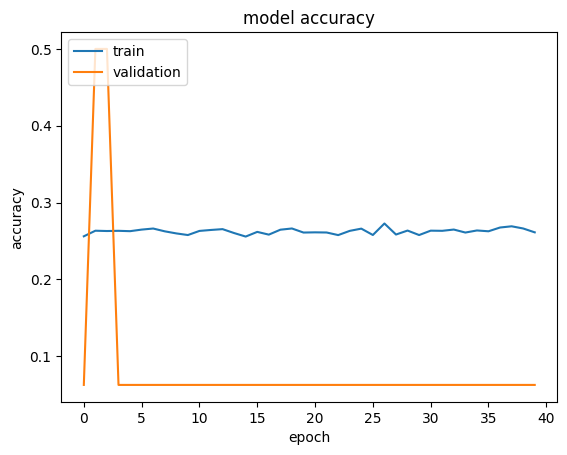

In [55]:
plt.plot(history_efficient.history["accuracy"])
plt.plot(history_efficient.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the EfficientnetNet Model**


In [56]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = new_efficient_model.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 1s - loss: 1.3365 - accuracy: 0.0000e+00

4/4 [==============================] - 1s 6ms/step - loss: 1.3907 - accuracy: 0.2500


Loss: 1.3907063007354736, Accuracy: 0.25


### **Plotting the confusion matrix**


1/4 [======>.......................] - ETA: 1s

4/4 [==============================] - 1s 6ms/step


              precision    recall  f1-score   support

       happy       0.00      0.00      0.00        32
     neutral       0.00      0.00      0.00        32
         sad       0.25      1.00      0.40        32
    surprise       0.00      0.00      0.00        32

    accuracy                           0.25       128
   macro avg       0.06      0.25      0.10       128
weighted avg       0.06      0.25      0.10       128



/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

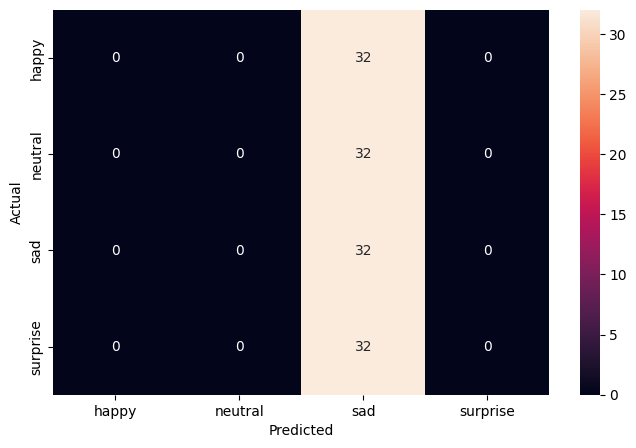

In [57]:
pred_probabilities = new_efficient_model.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:\_\_**

**Note: You can even go back and build your own architecture on top of the VGG16 Transfer layer and see if you can improve the performance.**


**Think About It:**

- What is your overall performance of these Transfer Learning Architectures? Can we draw a comparison of these models' performances. Are we satisfied with the accuracies that we have received?
- Do you think our issue lies with 'rgb' color_mode?


Now that we have tried multiple pre-trained models, let's build a complex CNN architecture and see if we can get better performance.


## **Building a Complex Neural Network Architecture**


In this section, we will build a more complex Convolutional Neural Network Model that has close to as many parameters as we had in our Transfer Learning Models. However, we will have only 1 input channel for our input images.


## **Creating our Data Loaders**

In this section, we are creating data loaders which we will use as inputs to the more Complicated Convolutional Neural Network. We will go ahead with color_mode = 'grayscale'.


In [58]:
# Set this to 'grayscale' as the images are in grayscale
color_mode = "grayscale"
color_layers = 1
# As we have checked, all images are 48x48, we will set the img_width and img_height to 48
img_width, img_height = 48, 48
# A batch size of 32 is appropriate for this dataset provide to provide a good balance
# between the model's ability to generalize (avoid overfitting) and computational efficiency.
batch_size = 32

# Training Data Augmentation
train_datagen = ImageDataGenerator(
    # preprocessing_function=preprocess_input,
    rescale=1.0 / 255,  # Normalize pixel values to [0,1]
    rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    shear_range=0.1,  # Small shear transformations for slight perspective changes
    zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
    horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    fill_mode="nearest",  # 'nearest' interpolation for filling in new pixels after a transformation
)

# Validation and Testing Data should not be augmented!
validation_datagen = ImageDataGenerator(rescale=1.0 / 255)
test_datagen = ImageDataGenerator(rescale=1.0 / 255)

# Assuming train_dir, validation_dir, and test_dir should follow the structure in DATADIR and SUBDIRS
train_dir = os.path.join(DATADIR, SUBDIRS_DICT["train"])
validation_dir = os.path.join(DATADIR, SUBDIRS_DICT["validation"])
test_dir = os.path.join(DATADIR, SUBDIRS_DICT["test"])

# Train Generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
)

# Validation Generator
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for evaluation
)

# Testing Generator
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for testing
)

Found 15109 images belonging to 4 classes.


Found 4977 images belonging to 4 classes.


Found 128 images belonging to 4 classes.


### **Model Building**

- Try building a layer with 5 Convolutional Blocks and see if performance increases.


In [59]:
# Initializing a sequential model
model_complex = Sequential()

# Adding first conv layer
model_complex.add(
    Conv2D(
        filters=512,
        kernel_size=(5, 5),
        padding="Same",
        input_shape=(img_width, img_height, color_layers),
        activation="relu",
    )
)
model_complex.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_complex.add(Dropout(0.2))

# Adding second conv layer
model_complex.add(Conv2D(filters=256, kernel_size=(5, 5), padding="Same", activation="relu"))
model_complex.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_complex.add(Dropout(0.2))

# Adding third conv layer
model_complex.add(Conv2D(filters=128, kernel_size=(5, 5), padding="Same", activation="relu"))
model_complex.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_complex.add(Dropout(0.3))

# Adding fourth conv layer
model_complex.add(Conv2D(filters=64, kernel_size=(3, 3), padding="Same", activation="relu"))
model_complex.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_complex.add(Dropout(0.3))

# Adding fifth conv layer
model_complex.add(Conv2D(filters=32, kernel_size=(3, 3), padding="Same", activation="relu"))
model_complex.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_complex.add(Dropout(0.3))

# Flattening
model_complex.add(Flatten())
model_complex.add(Dense(64, activation="relu"))
model_complex.add(Dense(32, activation="relu"))

# Adding the output layer with 4 neurons and activation functions as softmax since this is a multi-class classification problem
model_complex.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the Model**


In [60]:
model_complex.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
model_complex.summary()

Model: "sequential_1"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 conv2d (Conv2D)             (None, 48, 48, 512)       13312     


 max_pooling2d (MaxPooling2  (None, 24, 24, 512)       0         


 D)                                                              


 dropout_2 (Dropout)         (None, 24, 24, 512)       0         


 conv2d_1 (Conv2D)           (None, 24, 24, 256)       3277056   


 max_pooling2d_1 (MaxPoolin  (None, 12, 12, 256)       0         


 g2D)                                                            


 dropout_3 (Dropout)         (None, 12, 12, 256)       0         


 conv2d_2 (Conv2D)           (None, 12, 12, 128)       819328    


 max_pooling2d_2 (MaxPoolin  (None, 6, 6, 128)         0         


 g2D)                                                            


 dropout_4 (Dropout)         (None, 6, 6, 128)         0         


 conv2d_3 (Conv2D)           (None, 6, 6, 64)          73792     


 max_pooling2d_3 (MaxPoolin  (None, 3, 3, 64)          0         


 g2D)                                                            


 dropout_5 (Dropout)         (None, 3, 3, 64)          0         


 conv2d_4 (Conv2D)           (None, 3, 3, 32)          18464     


 max_pooling2d_4 (MaxPoolin  (None, 1, 1, 32)          0         


 g2D)                                                            


 dropout_6 (Dropout)         (None, 1, 1, 32)          0         


 flatten (Flatten)           (None, 32)                0         


 dense_3 (Dense)             (None, 64)                2112      


 dense_4 (Dense)             (None, 32)                2080      


 dense_5 (Dense)             (None, 4)                 132       


Total params: 4206276 (16.05 MB)


Trainable params: 4206276 (16.05 MB)


Non-trainable params: 0 (0.00 Byte)


_________________________________________________________________


In [61]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 30 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=30
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_complex_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_complex = model_complex.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[delayed_early_stopping, mc, reduce_lr],
)

Epoch 1/40


2024-03-19 08:29:40.762749: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_1/dropout_2/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


  1/473 [..............................] - ETA: 28:25 - loss: 1.3951 - accuracy: 0.1562

  4/473 [..............................] - ETA: 10s - loss: 1.4086 - accuracy: 0.1719  

  7/473 [..............................] - ETA: 10s - loss: 1.3962 - accuracy: 0.2366

 10/473 [..............................] - ETA: 10s - loss: 1.3986 - accuracy: 0.2281

 13/473 [..............................] - ETA: 9s - loss: 1.4003 - accuracy: 0.2236 

 16/473 [>.............................] - ETA: 9s - loss: 1.3981 - accuracy: 0.2305

 19/473 [>.............................] - ETA: 9s - loss: 1.3965 - accuracy: 0.2303

 22/473 [>.............................] - ETA: 9s - loss: 1.3949 - accuracy: 0.2401

 25/473 [>.............................] - ETA: 9s - loss: 1.3934 - accuracy: 0.2450

 28/473 [>.............................] - ETA: 9s - loss: 1.3926 - accuracy: 0.2500

 31/473 [>.............................] - ETA: 9s - loss: 1.3915 - accuracy: 0.2601

 34/473 [=>............................] - ETA: 9s - loss: 1.3910 - accuracy: 0.2564

 37/473 [=>............................] - ETA: 9s - loss: 1.3909 - accuracy: 0.2618

 40/473 [=>............................] - ETA: 9s - loss: 1.3904 - accuracy: 0.2641

 43/473 [=>............................] - ETA: 9s - loss: 1.3896 - accuracy: 0.2645

 46/473 [=>............................] - ETA: 8s - loss: 1.3891 - accuracy: 0.2690

 49/473 [==>...........................] - ETA: 8s - loss: 1.3888 - accuracy: 0.2679

 52/473 [==>...........................] - ETA: 8s - loss: 1.3884 - accuracy: 0.2656

 55/473 [==>...........................] - ETA: 8s - loss: 1.3881 - accuracy: 0.2670

 58/473 [==>...........................] - ETA: 8s - loss: 1.3877 - accuracy: 0.2656

 61/473 [==>...........................] - ETA: 8s - loss: 1.3880 - accuracy: 0.2623

 64/473 [===>..........................] - ETA: 8s - loss: 1.3888 - accuracy: 0.2632

 67/473 [===>..........................] - ETA: 8s - loss: 1.3888 - accuracy: 0.2617

 70/473 [===>..........................] - ETA: 8s - loss: 1.3887 - accuracy: 0.2625

 73/473 [===>..........................] - ETA: 8s - loss: 1.3891 - accuracy: 0.2577

 76/473 [===>..........................] - ETA: 8s - loss: 1.3889 - accuracy: 0.2562

 79/473 [====>.........................] - ETA: 8s - loss: 1.3888 - accuracy: 0.2563

 82/473 [====>.........................] - ETA: 8s - loss: 1.3885 - accuracy: 0.2595

 85/473 [====>.........................] - ETA: 8s - loss: 1.3883 - accuracy: 0.2610

 88/473 [====>.........................] - ETA: 8s - loss: 1.3882 - accuracy: 0.2610

 91/473 [====>.........................] - ETA: 7s - loss: 1.3882 - accuracy: 0.2603

 94/473 [====>.........................] - ETA: 7s - loss: 1.3880 - accuracy: 0.2610

 97/473 [=====>........................] - ETA: 7s - loss: 1.3878 - accuracy: 0.2603

100/473 [=====>........................] - ETA: 7s - loss: 1.3878 - accuracy: 0.2584

103/473 [=====>........................] - ETA: 7s - loss: 1.3878 - accuracy: 0.2564

106/473 [=====>........................] - ETA: 7s - loss: 1.3875 - accuracy: 0.2580

109/473 [=====>........................] - ETA: 7s - loss: 1.3874 - accuracy: 0.2586

112/473 [======>.......................] - ETA: 7s - loss: 1.3873 - accuracy: 0.2592

115/473 [======>.......................] - ETA: 7s - loss: 1.3873 - accuracy: 0.2584

118/473 [======>.......................] - ETA: 7s - loss: 1.3873 - accuracy: 0.2595

121/473 [======>.......................] - ETA: 7s - loss: 1.3874 - accuracy: 0.2585

124/473 [======>.......................] - ETA: 7s - loss: 1.3873 - accuracy: 0.2588

127/473 [=======>......................] - ETA: 7s - loss: 1.3870 - accuracy: 0.2596

130/473 [=======>......................] - ETA: 7s - loss: 1.3866 - accuracy: 0.2615

133/473 [=======>......................] - ETA: 7s - loss: 1.3868 - accuracy: 0.2610

136/473 [=======>......................] - ETA: 6s - loss: 1.3868 - accuracy: 0.2613

139/473 [=======>......................] - ETA: 6s - loss: 1.3867 - accuracy: 0.2619

142/473 [========>.....................] - ETA: 6s - loss: 1.3867 - accuracy: 0.2623

145/473 [========>.....................] - ETA: 6s - loss: 1.3867 - accuracy: 0.2619

148/473 [========>.....................] - ETA: 6s - loss: 1.3866 - accuracy: 0.2616

151/473 [========>.....................] - ETA: 6s - loss: 1.3865 - accuracy: 0.2635

152/473 [========>.....................] - ETA: 8s - loss: 1.3865 - accuracy: 0.2634

155/473 [========>.....................] - ETA: 8s - loss: 1.3863 - accuracy: 0.2641

158/473 [=========>....................] - ETA: 7s - loss: 1.3864 - accuracy: 0.2625

161/473 [=========>....................] - ETA: 7s - loss: 1.3864 - accuracy: 0.2622

164/473 [=========>....................] - ETA: 7s - loss: 1.3861 - accuracy: 0.2622

167/473 [=========>....................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2618

170/473 [=========>....................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2618

173/473 [=========>....................] - ETA: 7s - loss: 1.3860 - accuracy: 0.2612

176/473 [==========>...................] - ETA: 7s - loss: 1.3859 - accuracy: 0.2626

179/473 [==========>...................] - ETA: 7s - loss: 1.3859 - accuracy: 0.2629

182/473 [==========>...................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2627

185/473 [==========>...................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2623

188/473 [==========>...................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2616

191/473 [===========>..................] - ETA: 6s - loss: 1.3856 - accuracy: 0.2613

194/473 [===========>..................] - ETA: 6s - loss: 1.3857 - accuracy: 0.2605

197/473 [===========>..................] - ETA: 6s - loss: 1.3858 - accuracy: 0.2598

200/473 [===========>..................] - ETA: 6s - loss: 1.3856 - accuracy: 0.2597

203/473 [===========>..................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2597

206/473 [============>.................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2599

209/473 [============>.................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2615

212/473 [============>.................] - ETA: 6s - loss: 1.3855 - accuracy: 0.2618

215/473 [============>.................] - ETA: 6s - loss: 1.3855 - accuracy: 0.2613

218/473 [============>.................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2616

221/473 [=============>................] - ETA: 6s - loss: 1.3855 - accuracy: 0.2619

224/473 [=============>................] - ETA: 5s - loss: 1.3854 - accuracy: 0.2624

227/473 [=============>................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2632

230/473 [=============>................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2639

233/473 [=============>................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2630

236/473 [=============>................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2635

239/473 [==============>...............] - ETA: 5s - loss: 1.3849 - accuracy: 0.2634

242/473 [==============>...............] - ETA: 5s - loss: 1.3848 - accuracy: 0.2636

245/473 [==============>...............] - ETA: 5s - loss: 1.3849 - accuracy: 0.2633

248/473 [==============>...............] - ETA: 5s - loss: 1.3849 - accuracy: 0.2632

251/473 [==============>...............] - ETA: 5s - loss: 1.3849 - accuracy: 0.2630

254/473 [===============>..............] - ETA: 5s - loss: 1.3847 - accuracy: 0.2629

257/473 [===============>..............] - ETA: 5s - loss: 1.3847 - accuracy: 0.2638

260/473 [===============>..............] - ETA: 4s - loss: 1.3848 - accuracy: 0.2630

263/473 [===============>..............] - ETA: 4s - loss: 1.3849 - accuracy: 0.2632

266/473 [===============>..............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2631

269/473 [================>.............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2623

272/473 [================>.............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2633

275/473 [================>.............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2630

278/473 [================>.............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2625

281/473 [================>.............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2617

284/473 [=================>............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2608

287/473 [=================>............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2601

290/473 [=================>............] - ETA: 4s - loss: 1.3846 - accuracy: 0.2599

293/473 [=================>............] - ETA: 4s - loss: 1.3847 - accuracy: 0.2600

296/473 [=================>............] - ETA: 4s - loss: 1.3845 - accuracy: 0.2603

299/473 [=================>............] - ETA: 4s - loss: 1.3844 - accuracy: 0.2600

302/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2594

305/473 [==================>...........] - ETA: 3s - loss: 1.3844 - accuracy: 0.2589

308/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2589

311/473 [==================>...........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2593

314/473 [==================>...........] - ETA: 3s - loss: 1.3842 - accuracy: 0.2595

317/473 [===================>..........] - ETA: 3s - loss: 1.3840 - accuracy: 0.2611

320/473 [===================>..........] - ETA: 3s - loss: 1.3839 - accuracy: 0.2614

323/473 [===================>..........] - ETA: 3s - loss: 1.3843 - accuracy: 0.2609

326/473 [===================>..........] - ETA: 3s - loss: 1.3842 - accuracy: 0.2606

329/473 [===================>..........] - ETA: 3s - loss: 1.3841 - accuracy: 0.2613

332/473 [====================>.........] - ETA: 3s - loss: 1.3841 - accuracy: 0.2617

335/473 [====================>.........] - ETA: 3s - loss: 1.3841 - accuracy: 0.2617

338/473 [====================>.........] - ETA: 3s - loss: 1.3839 - accuracy: 0.2617

341/473 [====================>.........] - ETA: 3s - loss: 1.3839 - accuracy: 0.2619

344/473 [====================>.........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2617

347/473 [=====================>........] - ETA: 2s - loss: 1.3840 - accuracy: 0.2614

350/473 [=====================>........] - ETA: 2s - loss: 1.3840 - accuracy: 0.2622

353/473 [=====================>........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2621

356/473 [=====================>........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2622

359/473 [=====================>........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2622

362/473 [=====================>........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2624

365/473 [======================>.......] - ETA: 2s - loss: 1.3834 - accuracy: 0.2627

368/473 [======================>.......] - ETA: 2s - loss: 1.3832 - accuracy: 0.2635

371/473 [======================>.......] - ETA: 2s - loss: 1.3831 - accuracy: 0.2637

374/473 [======================>.......] - ETA: 2s - loss: 1.3831 - accuracy: 0.2644

377/473 [======================>.......] - ETA: 2s - loss: 1.3831 - accuracy: 0.2646

380/473 [=======================>......] - ETA: 2s - loss: 1.3829 - accuracy: 0.2647

383/473 [=======================>......] - ETA: 2s - loss: 1.3828 - accuracy: 0.2652

386/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2648

389/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2645

392/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2645

395/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2645

398/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2644

401/473 [========================>.....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2644

404/473 [========================>.....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2645

407/473 [========================>.....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2644

410/473 [=========================>....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2644

413/473 [=========================>....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2641

416/473 [=========================>....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2644

419/473 [=========================>....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2639

422/473 [=========================>....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2640

425/473 [=========================>....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2641

428/473 [==========================>...] - ETA: 1s - loss: 1.3826 - accuracy: 0.2642

431/473 [==========================>...] - ETA: 0s - loss: 1.3827 - accuracy: 0.2639

434/473 [==========================>...] - ETA: 0s - loss: 1.3826 - accuracy: 0.2638

437/473 [==========================>...] - ETA: 0s - loss: 1.3825 - accuracy: 0.2641

440/473 [==========================>...] - ETA: 0s - loss: 1.3824 - accuracy: 0.2640

443/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2643

446/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2640

449/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2641

452/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2645

455/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2650

458/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2652

461/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2653

464/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2656

467/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2655

470/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2656

473/473 [==============================] - ETA: 0s - loss: 1.3817 - accuracy: 0.2661


Epoch 1: val_accuracy improved from -inf to 0.87500, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240319-082940.keras


473/473 [==============================] - 14s 23ms/step - loss: 1.3817 - accuracy: 0.2661 - val_loss: 1.3339 - val_accuracy: 0.8750 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 16s - loss: 1.3665 - accuracy: 0.2500

  4/473 [..............................] - ETA: 9s - loss: 1.3551 - accuracy: 0.2891 

  7/473 [..............................] - ETA: 9s - loss: 1.3709 - accuracy: 0.2946

 10/473 [..............................] - ETA: 9s - loss: 1.3651 - accuracy: 0.2937

 13/473 [..............................] - ETA: 9s - loss: 1.3751 - accuracy: 0.2861

 16/473 [>.............................] - ETA: 9s - loss: 1.3734 - accuracy: 0.2852

 19/473 [>.............................] - ETA: 9s - loss: 1.3729 - accuracy: 0.2829

 22/473 [>.............................] - ETA: 9s - loss: 1.3732 - accuracy: 0.2812

 25/473 [>.............................] - ETA: 9s - loss: 1.3743 - accuracy: 0.2812

 28/473 [>.............................] - ETA: 9s - loss: 1.3734 - accuracy: 0.2835

 31/473 [>.............................] - ETA: 9s - loss: 1.3756 - accuracy: 0.2883

 34/473 [=>............................] - ETA: 9s - loss: 1.3757 - accuracy: 0.2877

 37/473 [=>............................] - ETA: 9s - loss: 1.3757 - accuracy: 0.2880

 40/473 [=>............................] - ETA: 8s - loss: 1.3737 - accuracy: 0.2898

 43/473 [=>............................] - ETA: 8s - loss: 1.3734 - accuracy: 0.2929

 46/473 [=>............................] - ETA: 8s - loss: 1.3723 - accuracy: 0.2948

 49/473 [==>...........................] - ETA: 8s - loss: 1.3732 - accuracy: 0.2908

 52/473 [==>...........................] - ETA: 8s - loss: 1.3735 - accuracy: 0.2927

 55/473 [==>...........................] - ETA: 8s - loss: 1.3733 - accuracy: 0.2949

 58/473 [==>...........................] - ETA: 8s - loss: 1.3735 - accuracy: 0.2953

 61/473 [==>...........................] - ETA: 8s - loss: 1.3735 - accuracy: 0.2951

 64/473 [===>..........................] - ETA: 8s - loss: 1.3735 - accuracy: 0.2959

 67/473 [===>..........................] - ETA: 8s - loss: 1.3737 - accuracy: 0.2938

 70/473 [===>..........................] - ETA: 8s - loss: 1.3724 - accuracy: 0.2973

 73/473 [===>..........................] - ETA: 8s - loss: 1.3719 - accuracy: 0.2975

 76/473 [===>..........................] - ETA: 8s - loss: 1.3728 - accuracy: 0.2965

 79/473 [====>.........................] - ETA: 8s - loss: 1.3725 - accuracy: 0.2951

 82/473 [====>.........................] - ETA: 8s - loss: 1.3730 - accuracy: 0.2927

 85/473 [====>.........................] - ETA: 8s - loss: 1.3727 - accuracy: 0.2901

 88/473 [====>.........................] - ETA: 8s - loss: 1.3713 - accuracy: 0.2905

 91/473 [====>.........................] - ETA: 7s - loss: 1.3708 - accuracy: 0.2905

 94/473 [====>.........................] - ETA: 7s - loss: 1.3716 - accuracy: 0.2899

 97/473 [=====>........................] - ETA: 7s - loss: 1.3713 - accuracy: 0.2883

100/473 [=====>........................] - ETA: 7s - loss: 1.3708 - accuracy: 0.2903

103/473 [=====>........................] - ETA: 7s - loss: 1.3706 - accuracy: 0.2891

106/473 [=====>........................] - ETA: 7s - loss: 1.3707 - accuracy: 0.2866

109/473 [=====>........................] - ETA: 7s - loss: 1.3704 - accuracy: 0.2867

112/473 [======>.......................] - ETA: 7s - loss: 1.3700 - accuracy: 0.2882

115/473 [======>.......................] - ETA: 7s - loss: 1.3706 - accuracy: 0.2875

118/473 [======>.......................] - ETA: 7s - loss: 1.3693 - accuracy: 0.2900

121/473 [======>.......................] - ETA: 7s - loss: 1.3688 - accuracy: 0.2911

124/473 [======>.......................] - ETA: 7s - loss: 1.3688 - accuracy: 0.2921

127/473 [=======>......................] - ETA: 7s - loss: 1.3677 - accuracy: 0.2938

130/473 [=======>......................] - ETA: 7s - loss: 1.3679 - accuracy: 0.2937

133/473 [=======>......................] - ETA: 7s - loss: 1.3683 - accuracy: 0.2932

136/473 [=======>......................] - ETA: 7s - loss: 1.3682 - accuracy: 0.2943

139/473 [=======>......................] - ETA: 6s - loss: 1.3683 - accuracy: 0.2943

142/473 [========>.....................] - ETA: 6s - loss: 1.3682 - accuracy: 0.2956

145/473 [========>.....................] - ETA: 6s - loss: 1.3682 - accuracy: 0.2953

148/473 [========>.....................] - ETA: 6s - loss: 1.3679 - accuracy: 0.2973

151/473 [========>.....................] - ETA: 6s - loss: 1.3682 - accuracy: 0.2959

154/473 [========>.....................] - ETA: 6s - loss: 1.3677 - accuracy: 0.2963

157/473 [========>.....................] - ETA: 6s - loss: 1.3671 - accuracy: 0.2968

160/473 [=========>....................] - ETA: 6s - loss: 1.3676 - accuracy: 0.2967

163/473 [=========>....................] - ETA: 6s - loss: 1.3675 - accuracy: 0.2966

166/473 [=========>....................] - ETA: 6s - loss: 1.3669 - accuracy: 0.2971

169/473 [=========>....................] - ETA: 6s - loss: 1.3665 - accuracy: 0.2975

172/473 [=========>....................] - ETA: 6s - loss: 1.3672 - accuracy: 0.2972

175/473 [==========>...................] - ETA: 6s - loss: 1.3665 - accuracy: 0.2975

178/473 [==========>...................] - ETA: 6s - loss: 1.3661 - accuracy: 0.2974

181/473 [==========>...................] - ETA: 6s - loss: 1.3666 - accuracy: 0.2977

184/473 [==========>...................] - ETA: 5s - loss: 1.3668 - accuracy: 0.2977

187/473 [==========>...................] - ETA: 5s - loss: 1.3659 - accuracy: 0.2990

190/473 [===========>..................] - ETA: 5s - loss: 1.3657 - accuracy: 0.2993

193/473 [===========>..................] - ETA: 5s - loss: 1.3659 - accuracy: 0.2974

196/473 [===========>..................] - ETA: 5s - loss: 1.3658 - accuracy: 0.2980

199/473 [===========>..................] - ETA: 5s - loss: 1.3660 - accuracy: 0.2976

202/473 [===========>..................] - ETA: 5s - loss: 1.3660 - accuracy: 0.2970

205/473 [============>.................] - ETA: 5s - loss: 1.3662 - accuracy: 0.2970

208/473 [============>.................] - ETA: 5s - loss: 1.3666 - accuracy: 0.2945

211/473 [============>.................] - ETA: 5s - loss: 1.3668 - accuracy: 0.2949

214/473 [============>.................] - ETA: 5s - loss: 1.3668 - accuracy: 0.2951

217/473 [============>.................] - ETA: 5s - loss: 1.3670 - accuracy: 0.2952

220/473 [============>.................] - ETA: 5s - loss: 1.3671 - accuracy: 0.2957

223/473 [=============>................] - ETA: 5s - loss: 1.3669 - accuracy: 0.2954

226/473 [=============>................] - ETA: 5s - loss: 1.3668 - accuracy: 0.2960

229/473 [=============>................] - ETA: 5s - loss: 1.3669 - accuracy: 0.2961

232/473 [=============>................] - ETA: 4s - loss: 1.3668 - accuracy: 0.2969

235/473 [=============>................] - ETA: 4s - loss: 1.3672 - accuracy: 0.2965

238/473 [==============>...............] - ETA: 4s - loss: 1.3674 - accuracy: 0.2966

241/473 [==============>...............] - ETA: 4s - loss: 1.3676 - accuracy: 0.2964

244/473 [==============>...............] - ETA: 4s - loss: 1.3677 - accuracy: 0.2952

247/473 [==============>...............] - ETA: 4s - loss: 1.3677 - accuracy: 0.2944

250/473 [==============>...............] - ETA: 4s - loss: 1.3679 - accuracy: 0.2945

254/473 [===============>..............] - ETA: 4s - loss: 1.3678 - accuracy: 0.2943

257/473 [===============>..............] - ETA: 4s - loss: 1.3677 - accuracy: 0.2949

260/473 [===============>..............] - ETA: 4s - loss: 1.3677 - accuracy: 0.2942

263/473 [===============>..............] - ETA: 4s - loss: 1.3675 - accuracy: 0.2951

266/473 [===============>..............] - ETA: 4s - loss: 1.3674 - accuracy: 0.2952

269/473 [================>.............] - ETA: 4s - loss: 1.3675 - accuracy: 0.2954

272/473 [================>.............] - ETA: 4s - loss: 1.3674 - accuracy: 0.2945

275/473 [================>.............] - ETA: 4s - loss: 1.3672 - accuracy: 0.2945

278/473 [================>.............] - ETA: 4s - loss: 1.3669 - accuracy: 0.2950

281/473 [================>.............] - ETA: 3s - loss: 1.3667 - accuracy: 0.2953

284/473 [=================>............] - ETA: 3s - loss: 1.3668 - accuracy: 0.2957

287/473 [=================>............] - ETA: 3s - loss: 1.3661 - accuracy: 0.2959

290/473 [=================>............] - ETA: 3s - loss: 1.3662 - accuracy: 0.2967

293/473 [=================>............] - ETA: 3s - loss: 1.3664 - accuracy: 0.2966

296/473 [=================>............] - ETA: 3s - loss: 1.3658 - accuracy: 0.2963

299/473 [=================>............] - ETA: 3s - loss: 1.3653 - accuracy: 0.2972

302/473 [==================>...........] - ETA: 3s - loss: 1.3644 - accuracy: 0.2977

305/473 [==================>...........] - ETA: 3s - loss: 1.3642 - accuracy: 0.2988

308/473 [==================>...........] - ETA: 3s - loss: 1.3645 - accuracy: 0.2983

311/473 [==================>...........] - ETA: 3s - loss: 1.3645 - accuracy: 0.2980

314/473 [==================>...........] - ETA: 3s - loss: 1.3643 - accuracy: 0.2985

317/473 [===================>..........] - ETA: 3s - loss: 1.3642 - accuracy: 0.2986

320/473 [===================>..........] - ETA: 3s - loss: 1.3642 - accuracy: 0.2981

323/473 [===================>..........] - ETA: 3s - loss: 1.3645 - accuracy: 0.2977

326/473 [===================>..........] - ETA: 3s - loss: 1.3647 - accuracy: 0.2973

329/473 [===================>..........] - ETA: 2s - loss: 1.3646 - accuracy: 0.2971

332/473 [====================>.........] - ETA: 2s - loss: 1.3647 - accuracy: 0.2970

335/473 [====================>.........] - ETA: 2s - loss: 1.3649 - accuracy: 0.2970

338/473 [====================>.........] - ETA: 2s - loss: 1.3648 - accuracy: 0.2971

341/473 [====================>.........] - ETA: 2s - loss: 1.3646 - accuracy: 0.2974

344/473 [====================>.........] - ETA: 2s - loss: 1.3643 - accuracy: 0.2976

347/473 [=====================>........] - ETA: 2s - loss: 1.3644 - accuracy: 0.2974

350/473 [=====================>........] - ETA: 2s - loss: 1.3639 - accuracy: 0.2982

353/473 [=====================>........] - ETA: 2s - loss: 1.3638 - accuracy: 0.2984

356/473 [=====================>........] - ETA: 2s - loss: 1.3634 - accuracy: 0.2984

359/473 [=====================>........] - ETA: 2s - loss: 1.3631 - accuracy: 0.2988

362/473 [=====================>........] - ETA: 2s - loss: 1.3633 - accuracy: 0.2983

365/473 [======================>.......] - ETA: 2s - loss: 1.3631 - accuracy: 0.2991

368/473 [======================>.......] - ETA: 2s - loss: 1.3629 - accuracy: 0.2993

371/473 [======================>.......] - ETA: 2s - loss: 1.3624 - accuracy: 0.3000

374/473 [======================>.......] - ETA: 2s - loss: 1.3624 - accuracy: 0.2996

377/473 [======================>.......] - ETA: 1s - loss: 1.3621 - accuracy: 0.3000

380/473 [=======================>......] - ETA: 1s - loss: 1.3622 - accuracy: 0.2998

383/473 [=======================>......] - ETA: 1s - loss: 1.3620 - accuracy: 0.2999

386/473 [=======================>......] - ETA: 1s - loss: 1.3619 - accuracy: 0.2993

389/473 [=======================>......] - ETA: 1s - loss: 1.3620 - accuracy: 0.2991

392/473 [=======================>......] - ETA: 1s - loss: 1.3620 - accuracy: 0.2983

395/473 [========================>.....] - ETA: 1s - loss: 1.3616 - accuracy: 0.2991

398/473 [========================>.....] - ETA: 1s - loss: 1.3614 - accuracy: 0.2999

401/473 [========================>.....] - ETA: 1s - loss: 1.3613 - accuracy: 0.2996

404/473 [========================>.....] - ETA: 1s - loss: 1.3609 - accuracy: 0.3000

407/473 [========================>.....] - ETA: 1s - loss: 1.3611 - accuracy: 0.2998

410/473 [=========================>....] - ETA: 1s - loss: 1.3612 - accuracy: 0.2998

413/473 [=========================>....] - ETA: 1s - loss: 1.3609 - accuracy: 0.3000

416/473 [=========================>....] - ETA: 1s - loss: 1.3607 - accuracy: 0.3003

419/473 [=========================>....] - ETA: 1s - loss: 1.3607 - accuracy: 0.3006

422/473 [=========================>....] - ETA: 1s - loss: 1.3607 - accuracy: 0.3005

425/473 [=========================>....] - ETA: 0s - loss: 1.3607 - accuracy: 0.3001

428/473 [==========================>...] - ETA: 0s - loss: 1.3609 - accuracy: 0.2994

431/473 [==========================>...] - ETA: 0s - loss: 1.3612 - accuracy: 0.2992

434/473 [==========================>...] - ETA: 0s - loss: 1.3611 - accuracy: 0.2995

437/473 [==========================>...] - ETA: 0s - loss: 1.3612 - accuracy: 0.2998

440/473 [==========================>...] - ETA: 0s - loss: 1.3613 - accuracy: 0.3001

443/473 [===========================>..] - ETA: 0s - loss: 1.3612 - accuracy: 0.3004

446/473 [===========================>..] - ETA: 0s - loss: 1.3613 - accuracy: 0.3005

449/473 [===========================>..] - ETA: 0s - loss: 1.3612 - accuracy: 0.3006

452/473 [===========================>..] - ETA: 0s - loss: 1.3612 - accuracy: 0.3006

455/473 [===========================>..] - ETA: 0s - loss: 1.3612 - accuracy: 0.3001

458/473 [============================>.] - ETA: 0s - loss: 1.3613 - accuracy: 0.3000

461/473 [============================>.] - ETA: 0s - loss: 1.3613 - accuracy: 0.3003

464/473 [============================>.] - ETA: 0s - loss: 1.3613 - accuracy: 0.3005

467/473 [============================>.] - ETA: 0s - loss: 1.3613 - accuracy: 0.3005

470/473 [============================>.] - ETA: 0s - loss: 1.3614 - accuracy: 0.3005

473/473 [==============================] - ETA: 0s - loss: 1.3612 - accuracy: 0.3012


Epoch 2: val_accuracy did not improve from 0.87500


473/473 [==============================] - 10s 21ms/step - loss: 1.3612 - accuracy: 0.3012 - val_loss: 1.2616 - val_accuracy: 0.4688 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 19s - loss: 1.2938 - accuracy: 0.3438

  4/473 [..............................] - ETA: 9s - loss: 1.3196 - accuracy: 0.3594 

  7/473 [..............................] - ETA: 9s - loss: 1.3388 - accuracy: 0.3348

 10/473 [..............................] - ETA: 9s - loss: 1.3449 - accuracy: 0.3250

 13/473 [..............................] - ETA: 9s - loss: 1.3645 - accuracy: 0.2981

 16/473 [>.............................] - ETA: 9s - loss: 1.3672 - accuracy: 0.2988

 19/473 [>.............................] - ETA: 9s - loss: 1.3661 - accuracy: 0.3043

 22/473 [>.............................] - ETA: 9s - loss: 1.3622 - accuracy: 0.3139

 25/473 [>.............................] - ETA: 9s - loss: 1.3633 - accuracy: 0.3075

 28/473 [>.............................] - ETA: 9s - loss: 1.3609 - accuracy: 0.3058

 31/473 [>.............................] - ETA: 9s - loss: 1.3607 - accuracy: 0.3065

 34/473 [=>............................] - ETA: 9s - loss: 1.3622 - accuracy: 0.3079

 37/473 [=>............................] - ETA: 8s - loss: 1.3586 - accuracy: 0.3133

 40/473 [=>............................] - ETA: 8s - loss: 1.3574 - accuracy: 0.3211

 43/473 [=>............................] - ETA: 8s - loss: 1.3571 - accuracy: 0.3270

 46/473 [=>............................] - ETA: 8s - loss: 1.3553 - accuracy: 0.3295

 49/473 [==>...........................] - ETA: 8s - loss: 1.3538 - accuracy: 0.3284

 52/473 [==>...........................] - ETA: 8s - loss: 1.3538 - accuracy: 0.3275

 55/473 [==>...........................] - ETA: 8s - loss: 1.3560 - accuracy: 0.3250

 58/473 [==>...........................] - ETA: 8s - loss: 1.3554 - accuracy: 0.3238

 61/473 [==>...........................] - ETA: 8s - loss: 1.3538 - accuracy: 0.3212

 64/473 [===>..........................] - ETA: 8s - loss: 1.3515 - accuracy: 0.3213

 67/473 [===>..........................] - ETA: 8s - loss: 1.3504 - accuracy: 0.3232

 70/473 [===>..........................] - ETA: 8s - loss: 1.3510 - accuracy: 0.3232

 73/473 [===>..........................] - ETA: 8s - loss: 1.3520 - accuracy: 0.3206

 76/473 [===>..........................] - ETA: 8s - loss: 1.3532 - accuracy: 0.3195

 79/473 [====>.........................] - ETA: 8s - loss: 1.3530 - accuracy: 0.3169

 82/473 [====>.........................] - ETA: 8s - loss: 1.3530 - accuracy: 0.3182

 85/473 [====>.........................] - ETA: 8s - loss: 1.3538 - accuracy: 0.3176

 88/473 [====>.........................] - ETA: 7s - loss: 1.3541 - accuracy: 0.3168

 91/473 [====>.........................] - ETA: 7s - loss: 1.3536 - accuracy: 0.3163

 94/473 [====>.........................] - ETA: 7s - loss: 1.3542 - accuracy: 0.3162

 97/473 [=====>........................] - ETA: 7s - loss: 1.3544 - accuracy: 0.3164

100/473 [=====>........................] - ETA: 7s - loss: 1.3532 - accuracy: 0.3194

103/473 [=====>........................] - ETA: 7s - loss: 1.3528 - accuracy: 0.3186

106/473 [=====>........................] - ETA: 7s - loss: 1.3516 - accuracy: 0.3160

109/473 [=====>........................] - ETA: 7s - loss: 1.3512 - accuracy: 0.3134

112/473 [======>.......................] - ETA: 7s - loss: 1.3528 - accuracy: 0.3125

115/473 [======>.......................] - ETA: 7s - loss: 1.3541 - accuracy: 0.3117

118/473 [======>.......................] - ETA: 7s - loss: 1.3549 - accuracy: 0.3099

121/473 [======>.......................] - ETA: 7s - loss: 1.3549 - accuracy: 0.3112

124/473 [======>.......................] - ETA: 7s - loss: 1.3545 - accuracy: 0.3122

127/473 [=======>......................] - ETA: 7s - loss: 1.3543 - accuracy: 0.3125

130/473 [=======>......................] - ETA: 7s - loss: 1.3543 - accuracy: 0.3144

133/473 [=======>......................] - ETA: 7s - loss: 1.3532 - accuracy: 0.3160

136/473 [=======>......................] - ETA: 6s - loss: 1.3536 - accuracy: 0.3159

139/473 [=======>......................] - ETA: 6s - loss: 1.3533 - accuracy: 0.3160

142/473 [========>.....................] - ETA: 6s - loss: 1.3528 - accuracy: 0.3170

145/473 [========>.....................] - ETA: 6s - loss: 1.3514 - accuracy: 0.3193

148/473 [========>.....................] - ETA: 6s - loss: 1.3517 - accuracy: 0.3205

151/473 [========>.....................] - ETA: 6s - loss: 1.3519 - accuracy: 0.3203

154/473 [========>.....................] - ETA: 6s - loss: 1.3525 - accuracy: 0.3195

157/473 [========>.....................] - ETA: 6s - loss: 1.3527 - accuracy: 0.3186

160/473 [=========>....................] - ETA: 6s - loss: 1.3530 - accuracy: 0.3197

163/473 [=========>....................] - ETA: 6s - loss: 1.3529 - accuracy: 0.3199

166/473 [=========>....................] - ETA: 6s - loss: 1.3526 - accuracy: 0.3203

169/473 [=========>....................] - ETA: 6s - loss: 1.3521 - accuracy: 0.3211

172/473 [=========>....................] - ETA: 6s - loss: 1.3518 - accuracy: 0.3217

175/473 [==========>...................] - ETA: 6s - loss: 1.3515 - accuracy: 0.3221

178/473 [==========>...................] - ETA: 6s - loss: 1.3515 - accuracy: 0.3219

181/473 [==========>...................] - ETA: 6s - loss: 1.3516 - accuracy: 0.3223

184/473 [==========>...................] - ETA: 5s - loss: 1.3510 - accuracy: 0.3233

187/473 [==========>...................] - ETA: 5s - loss: 1.3508 - accuracy: 0.3238

190/473 [===========>..................] - ETA: 5s - loss: 1.3514 - accuracy: 0.3228

193/473 [===========>..................] - ETA: 5s - loss: 1.3508 - accuracy: 0.3231

196/473 [===========>..................] - ETA: 5s - loss: 1.3503 - accuracy: 0.3233

199/473 [===========>..................] - ETA: 5s - loss: 1.3507 - accuracy: 0.3225

202/473 [===========>..................] - ETA: 5s - loss: 1.3505 - accuracy: 0.3227

205/473 [============>.................] - ETA: 5s - loss: 1.3511 - accuracy: 0.3225

208/473 [============>.................] - ETA: 5s - loss: 1.3512 - accuracy: 0.3212

211/473 [============>.................] - ETA: 5s - loss: 1.3512 - accuracy: 0.3207

214/473 [============>.................] - ETA: 5s - loss: 1.3515 - accuracy: 0.3209

217/473 [============>.................] - ETA: 5s - loss: 1.3513 - accuracy: 0.3215

220/473 [============>.................] - ETA: 5s - loss: 1.3512 - accuracy: 0.3217

223/473 [=============>................] - ETA: 5s - loss: 1.3514 - accuracy: 0.3213

226/473 [=============>................] - ETA: 5s - loss: 1.3513 - accuracy: 0.3210

229/473 [=============>................] - ETA: 5s - loss: 1.3513 - accuracy: 0.3206

232/473 [=============>................] - ETA: 4s - loss: 1.3511 - accuracy: 0.3204

235/473 [=============>................] - ETA: 4s - loss: 1.3507 - accuracy: 0.3200

238/473 [==============>...............] - ETA: 4s - loss: 1.3508 - accuracy: 0.3201

241/473 [==============>...............] - ETA: 4s - loss: 1.3508 - accuracy: 0.3204

244/473 [==============>...............] - ETA: 4s - loss: 1.3506 - accuracy: 0.3213

247/473 [==============>...............] - ETA: 4s - loss: 1.3504 - accuracy: 0.3206

250/473 [==============>...............] - ETA: 4s - loss: 1.3493 - accuracy: 0.3213

253/473 [===============>..............] - ETA: 4s - loss: 1.3497 - accuracy: 0.3212

256/473 [===============>..............] - ETA: 4s - loss: 1.3495 - accuracy: 0.3219

259/473 [===============>..............] - ETA: 4s - loss: 1.3491 - accuracy: 0.3225

262/473 [===============>..............] - ETA: 4s - loss: 1.3497 - accuracy: 0.3218

265/473 [===============>..............] - ETA: 4s - loss: 1.3503 - accuracy: 0.3208

268/473 [===============>..............] - ETA: 4s - loss: 1.3496 - accuracy: 0.3219

271/473 [================>.............] - ETA: 4s - loss: 1.3499 - accuracy: 0.3216

274/473 [================>.............] - ETA: 4s - loss: 1.3500 - accuracy: 0.3208

277/473 [================>.............] - ETA: 4s - loss: 1.3502 - accuracy: 0.3202

280/473 [================>.............] - ETA: 4s - loss: 1.3502 - accuracy: 0.3206

283/473 [================>.............] - ETA: 3s - loss: 1.3504 - accuracy: 0.3204

286/473 [=================>............] - ETA: 3s - loss: 1.3503 - accuracy: 0.3209

289/473 [=================>............] - ETA: 3s - loss: 1.3503 - accuracy: 0.3210

292/473 [=================>............] - ETA: 3s - loss: 1.3499 - accuracy: 0.3211

295/473 [=================>............] - ETA: 3s - loss: 1.3499 - accuracy: 0.3212

298/473 [=================>............] - ETA: 3s - loss: 1.3497 - accuracy: 0.3214

301/473 [==================>...........] - ETA: 3s - loss: 1.3496 - accuracy: 0.3209

304/473 [==================>...........] - ETA: 3s - loss: 1.3493 - accuracy: 0.3207

307/473 [==================>...........] - ETA: 3s - loss: 1.3494 - accuracy: 0.3205

310/473 [==================>...........] - ETA: 3s - loss: 1.3490 - accuracy: 0.3212

313/473 [==================>...........] - ETA: 3s - loss: 1.3490 - accuracy: 0.3212

316/473 [===================>..........] - ETA: 3s - loss: 1.3487 - accuracy: 0.3217

319/473 [===================>..........] - ETA: 3s - loss: 1.3486 - accuracy: 0.3215

322/473 [===================>..........] - ETA: 3s - loss: 1.3483 - accuracy: 0.3218

325/473 [===================>..........] - ETA: 3s - loss: 1.3483 - accuracy: 0.3215

328/473 [===================>..........] - ETA: 3s - loss: 1.3486 - accuracy: 0.3209

331/473 [===================>..........] - ETA: 2s - loss: 1.3485 - accuracy: 0.3211

334/473 [====================>.........] - ETA: 2s - loss: 1.3485 - accuracy: 0.3215

337/473 [====================>.........] - ETA: 2s - loss: 1.3483 - accuracy: 0.3215

340/473 [====================>.........] - ETA: 2s - loss: 1.3482 - accuracy: 0.3210

343/473 [====================>.........] - ETA: 2s - loss: 1.3484 - accuracy: 0.3203

346/473 [====================>.........] - ETA: 2s - loss: 1.3482 - accuracy: 0.3202

349/473 [=====================>........] - ETA: 2s - loss: 1.3481 - accuracy: 0.3199

352/473 [=====================>........] - ETA: 2s - loss: 1.3477 - accuracy: 0.3204

355/473 [=====================>........] - ETA: 2s - loss: 1.3478 - accuracy: 0.3202

358/473 [=====================>........] - ETA: 2s - loss: 1.3482 - accuracy: 0.3197

361/473 [=====================>........] - ETA: 2s - loss: 1.3477 - accuracy: 0.3199

364/473 [======================>.......] - ETA: 2s - loss: 1.3477 - accuracy: 0.3204

367/473 [======================>.......] - ETA: 2s - loss: 1.3475 - accuracy: 0.3206

370/473 [======================>.......] - ETA: 2s - loss: 1.3477 - accuracy: 0.3201

373/473 [======================>.......] - ETA: 2s - loss: 1.3475 - accuracy: 0.3206

376/473 [======================>.......] - ETA: 2s - loss: 1.3474 - accuracy: 0.3205

379/473 [=======================>......] - ETA: 1s - loss: 1.3469 - accuracy: 0.3207

382/473 [=======================>......] - ETA: 1s - loss: 1.3473 - accuracy: 0.3202

385/473 [=======================>......] - ETA: 1s - loss: 1.3472 - accuracy: 0.3206

388/473 [=======================>......] - ETA: 1s - loss: 1.3469 - accuracy: 0.3210

391/473 [=======================>......] - ETA: 1s - loss: 1.3464 - accuracy: 0.3209

394/473 [=======================>......] - ETA: 1s - loss: 1.3464 - accuracy: 0.3203

397/473 [========================>.....] - ETA: 1s - loss: 1.3461 - accuracy: 0.3203

400/473 [========================>.....] - ETA: 1s - loss: 1.3461 - accuracy: 0.3201

403/473 [========================>.....] - ETA: 1s - loss: 1.3461 - accuracy: 0.3202

406/473 [========================>.....] - ETA: 1s - loss: 1.3459 - accuracy: 0.3199

409/473 [========================>.....] - ETA: 1s - loss: 1.3454 - accuracy: 0.3207

412/473 [=========================>....] - ETA: 1s - loss: 1.3456 - accuracy: 0.3202

415/473 [=========================>....] - ETA: 1s - loss: 1.3450 - accuracy: 0.3208

418/473 [=========================>....] - ETA: 1s - loss: 1.3445 - accuracy: 0.3207

421/473 [=========================>....] - ETA: 1s - loss: 1.3443 - accuracy: 0.3206

424/473 [=========================>....] - ETA: 1s - loss: 1.3444 - accuracy: 0.3206

427/473 [==========================>...] - ETA: 0s - loss: 1.3443 - accuracy: 0.3206

430/473 [==========================>...] - ETA: 0s - loss: 1.3442 - accuracy: 0.3205

433/473 [==========================>...] - ETA: 0s - loss: 1.3434 - accuracy: 0.3214

436/473 [==========================>...] - ETA: 0s - loss: 1.3435 - accuracy: 0.3212

439/473 [==========================>...] - ETA: 0s - loss: 1.3431 - accuracy: 0.3216

442/473 [===========================>..] - ETA: 0s - loss: 1.3428 - accuracy: 0.3221

445/473 [===========================>..] - ETA: 0s - loss: 1.3425 - accuracy: 0.3226

448/473 [===========================>..] - ETA: 0s - loss: 1.3419 - accuracy: 0.3234

451/473 [===========================>..] - ETA: 0s - loss: 1.3414 - accuracy: 0.3241

454/473 [===========================>..] - ETA: 0s - loss: 1.3408 - accuracy: 0.3245

457/473 [===========================>..] - ETA: 0s - loss: 1.3412 - accuracy: 0.3242

460/473 [============================>.] - ETA: 0s - loss: 1.3409 - accuracy: 0.3248

463/473 [============================>.] - ETA: 0s - loss: 1.3406 - accuracy: 0.3249

466/473 [============================>.] - ETA: 0s - loss: 1.3403 - accuracy: 0.3254

469/473 [============================>.] - ETA: 0s - loss: 1.3401 - accuracy: 0.3253

472/473 [============================>.] - ETA: 0s - loss: 1.3400 - accuracy: 0.3256


Epoch 3: val_accuracy did not improve from 0.87500


473/473 [==============================] - 10s 21ms/step - loss: 1.3401 - accuracy: 0.3256 - val_loss: 1.2736 - val_accuracy: 0.3438 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 18s - loss: 1.3254 - accuracy: 0.3438

  4/473 [..............................] - ETA: 9s - loss: 1.2818 - accuracy: 0.3672 

  7/473 [..............................] - ETA: 9s - loss: 1.3289 - accuracy: 0.3214

 10/473 [..............................] - ETA: 9s - loss: 1.3282 - accuracy: 0.3063

 13/473 [..............................] - ETA: 9s - loss: 1.3181 - accuracy: 0.3245

 16/473 [>.............................] - ETA: 9s - loss: 1.3107 - accuracy: 0.3477

 19/473 [>.............................] - ETA: 9s - loss: 1.3034 - accuracy: 0.3421

 22/473 [>.............................] - ETA: 9s - loss: 1.3027 - accuracy: 0.3480

 25/473 [>.............................] - ETA: 9s - loss: 1.2943 - accuracy: 0.3487

 28/473 [>.............................] - ETA: 9s - loss: 1.2806 - accuracy: 0.3605

 31/473 [>.............................] - ETA: 9s - loss: 1.2820 - accuracy: 0.3609

 34/473 [=>............................] - ETA: 9s - loss: 1.2743 - accuracy: 0.3722

 37/473 [=>............................] - ETA: 8s - loss: 1.2783 - accuracy: 0.3691

 40/473 [=>............................] - ETA: 8s - loss: 1.2806 - accuracy: 0.3625

 43/473 [=>............................] - ETA: 8s - loss: 1.2812 - accuracy: 0.3561

 46/473 [=>............................] - ETA: 8s - loss: 1.2797 - accuracy: 0.3580

 49/473 [==>...........................] - ETA: 8s - loss: 1.2779 - accuracy: 0.3622

 52/473 [==>...........................] - ETA: 8s - loss: 1.2830 - accuracy: 0.3588

 55/473 [==>...........................] - ETA: 8s - loss: 1.2823 - accuracy: 0.3619

 58/473 [==>...........................] - ETA: 8s - loss: 1.2873 - accuracy: 0.3583

 61/473 [==>...........................] - ETA: 8s - loss: 1.2871 - accuracy: 0.3591

 64/473 [===>..........................] - ETA: 8s - loss: 1.2882 - accuracy: 0.3618

 67/473 [===>..........................] - ETA: 8s - loss: 1.2878 - accuracy: 0.3647

 70/473 [===>..........................] - ETA: 8s - loss: 1.2859 - accuracy: 0.3656

 73/473 [===>..........................] - ETA: 8s - loss: 1.2865 - accuracy: 0.3639

 76/473 [===>..........................] - ETA: 8s - loss: 1.2876 - accuracy: 0.3618

 79/473 [====>.........................] - ETA: 8s - loss: 1.2849 - accuracy: 0.3627

 82/473 [====>.........................] - ETA: 8s - loss: 1.2846 - accuracy: 0.3624

 85/473 [====>.........................] - ETA: 8s - loss: 1.2861 - accuracy: 0.3621

 88/473 [====>.........................] - ETA: 7s - loss: 1.2881 - accuracy: 0.3619

 91/473 [====>.........................] - ETA: 7s - loss: 1.2876 - accuracy: 0.3613

 94/473 [====>.........................] - ETA: 7s - loss: 1.2882 - accuracy: 0.3604

 97/473 [=====>........................] - ETA: 7s - loss: 1.2865 - accuracy: 0.3618

100/473 [=====>........................] - ETA: 7s - loss: 1.2875 - accuracy: 0.3606

103/473 [=====>........................] - ETA: 7s - loss: 1.2892 - accuracy: 0.3586

106/473 [=====>........................] - ETA: 7s - loss: 1.2903 - accuracy: 0.3588

109/473 [=====>........................] - ETA: 7s - loss: 1.2926 - accuracy: 0.3564

112/473 [======>.......................] - ETA: 7s - loss: 1.2927 - accuracy: 0.3585

115/473 [======>.......................] - ETA: 7s - loss: 1.2916 - accuracy: 0.3595

118/473 [======>.......................] - ETA: 7s - loss: 1.2903 - accuracy: 0.3599

121/473 [======>.......................] - ETA: 7s - loss: 1.2883 - accuracy: 0.3603

124/473 [======>.......................] - ETA: 7s - loss: 1.2872 - accuracy: 0.3609

127/473 [=======>......................] - ETA: 7s - loss: 1.2884 - accuracy: 0.3595

130/473 [=======>......................] - ETA: 7s - loss: 1.2879 - accuracy: 0.3608

133/473 [=======>......................] - ETA: 7s - loss: 1.2869 - accuracy: 0.3609

136/473 [=======>......................] - ETA: 7s - loss: 1.2855 - accuracy: 0.3598

139/473 [=======>......................] - ETA: 6s - loss: 1.2877 - accuracy: 0.3588

142/473 [========>.....................] - ETA: 6s - loss: 1.2883 - accuracy: 0.3585

145/473 [========>.....................] - ETA: 6s - loss: 1.2877 - accuracy: 0.3608

148/473 [========>.....................] - ETA: 6s - loss: 1.2876 - accuracy: 0.3630

151/473 [========>.....................] - ETA: 6s - loss: 1.2863 - accuracy: 0.3644

154/473 [========>.....................] - ETA: 6s - loss: 1.2860 - accuracy: 0.3644

157/473 [========>.....................] - ETA: 6s - loss: 1.2859 - accuracy: 0.3652

160/473 [=========>....................] - ETA: 6s - loss: 1.2845 - accuracy: 0.3664

163/473 [=========>....................] - ETA: 6s - loss: 1.2844 - accuracy: 0.3656

166/473 [=========>....................] - ETA: 6s - loss: 1.2842 - accuracy: 0.3645

169/473 [=========>....................] - ETA: 6s - loss: 1.2841 - accuracy: 0.3635

172/473 [=========>....................] - ETA: 6s - loss: 1.2826 - accuracy: 0.3654

175/473 [==========>...................] - ETA: 6s - loss: 1.2812 - accuracy: 0.3661

178/473 [==========>...................] - ETA: 6s - loss: 1.2823 - accuracy: 0.3646

181/473 [==========>...................] - ETA: 6s - loss: 1.2810 - accuracy: 0.3660

184/473 [==========>...................] - ETA: 5s - loss: 1.2799 - accuracy: 0.3663

187/473 [==========>...................] - ETA: 5s - loss: 1.2793 - accuracy: 0.3656

190/473 [===========>..................] - ETA: 5s - loss: 1.2799 - accuracy: 0.3651

193/473 [===========>..................] - ETA: 5s - loss: 1.2794 - accuracy: 0.3659

196/473 [===========>..................] - ETA: 5s - loss: 1.2791 - accuracy: 0.3673

199/473 [===========>..................] - ETA: 5s - loss: 1.2783 - accuracy: 0.3679

202/473 [===========>..................] - ETA: 5s - loss: 1.2777 - accuracy: 0.3682

205/473 [============>.................] - ETA: 5s - loss: 1.2779 - accuracy: 0.3703

208/473 [============>.................] - ETA: 5s - loss: 1.2779 - accuracy: 0.3699

211/473 [============>.................] - ETA: 5s - loss: 1.2771 - accuracy: 0.3710

214/473 [============>.................] - ETA: 5s - loss: 1.2769 - accuracy: 0.3705

217/473 [============>.................] - ETA: 5s - loss: 1.2760 - accuracy: 0.3717

220/473 [============>.................] - ETA: 5s - loss: 1.2750 - accuracy: 0.3719

223/473 [=============>................] - ETA: 5s - loss: 1.2753 - accuracy: 0.3707

226/473 [=============>................] - ETA: 5s - loss: 1.2735 - accuracy: 0.3722

229/473 [=============>................] - ETA: 5s - loss: 1.2739 - accuracy: 0.3721

232/473 [=============>................] - ETA: 4s - loss: 1.2725 - accuracy: 0.3737

235/473 [=============>................] - ETA: 4s - loss: 1.2720 - accuracy: 0.3738

238/473 [==============>...............] - ETA: 4s - loss: 1.2725 - accuracy: 0.3728

241/473 [==============>...............] - ETA: 4s - loss: 1.2723 - accuracy: 0.3720

244/473 [==============>...............] - ETA: 4s - loss: 1.2718 - accuracy: 0.3718

247/473 [==============>...............] - ETA: 4s - loss: 1.2726 - accuracy: 0.3715

250/473 [==============>...............] - ETA: 4s - loss: 1.2718 - accuracy: 0.3715

253/473 [===============>..............] - ETA: 4s - loss: 1.2723 - accuracy: 0.3701

256/473 [===============>..............] - ETA: 4s - loss: 1.2727 - accuracy: 0.3696

259/473 [===============>..............] - ETA: 4s - loss: 1.2728 - accuracy: 0.3697

262/473 [===============>..............] - ETA: 4s - loss: 1.2721 - accuracy: 0.3695

265/473 [===============>..............] - ETA: 4s - loss: 1.2709 - accuracy: 0.3699

268/473 [===============>..............] - ETA: 4s - loss: 1.2708 - accuracy: 0.3701

271/473 [================>.............] - ETA: 4s - loss: 1.2711 - accuracy: 0.3693

274/473 [================>.............] - ETA: 4s - loss: 1.2722 - accuracy: 0.3690

277/473 [================>.............] - ETA: 4s - loss: 1.2717 - accuracy: 0.3687

280/473 [================>.............] - ETA: 4s - loss: 1.2723 - accuracy: 0.3683

283/473 [================>.............] - ETA: 3s - loss: 1.2727 - accuracy: 0.3685

286/473 [=================>............] - ETA: 3s - loss: 1.2726 - accuracy: 0.3693

289/473 [=================>............] - ETA: 3s - loss: 1.2726 - accuracy: 0.3696

292/473 [=================>............] - ETA: 3s - loss: 1.2727 - accuracy: 0.3694

295/473 [=================>............] - ETA: 3s - loss: 1.2730 - accuracy: 0.3689

298/473 [=================>............] - ETA: 3s - loss: 1.2725 - accuracy: 0.3692

301/473 [==================>...........] - ETA: 3s - loss: 1.2723 - accuracy: 0.3701

304/473 [==================>...........] - ETA: 3s - loss: 1.2720 - accuracy: 0.3707

307/473 [==================>...........] - ETA: 3s - loss: 1.2726 - accuracy: 0.3703

310/473 [==================>...........] - ETA: 3s - loss: 1.2721 - accuracy: 0.3706

313/473 [==================>...........] - ETA: 3s - loss: 1.2716 - accuracy: 0.3710

316/473 [===================>..........] - ETA: 3s - loss: 1.2718 - accuracy: 0.3714

319/473 [===================>..........] - ETA: 3s - loss: 1.2716 - accuracy: 0.3716

322/473 [===================>..........] - ETA: 3s - loss: 1.2712 - accuracy: 0.3723

325/473 [===================>..........] - ETA: 3s - loss: 1.2705 - accuracy: 0.3725

328/473 [===================>..........] - ETA: 3s - loss: 1.2704 - accuracy: 0.3720

331/473 [===================>..........] - ETA: 2s - loss: 1.2696 - accuracy: 0.3720

334/473 [====================>.........] - ETA: 2s - loss: 1.2700 - accuracy: 0.3716

337/473 [====================>.........] - ETA: 2s - loss: 1.2705 - accuracy: 0.3721

340/473 [====================>.........] - ETA: 2s - loss: 1.2698 - accuracy: 0.3721

343/473 [====================>.........] - ETA: 2s - loss: 1.2703 - accuracy: 0.3716

346/473 [====================>.........] - ETA: 2s - loss: 1.2697 - accuracy: 0.3719

349/473 [=====================>........] - ETA: 2s - loss: 1.2686 - accuracy: 0.3731

352/473 [=====================>........] - ETA: 2s - loss: 1.2676 - accuracy: 0.3739

355/473 [=====================>........] - ETA: 2s - loss: 1.2672 - accuracy: 0.3737

358/473 [=====================>........] - ETA: 2s - loss: 1.2679 - accuracy: 0.3734

362/473 [=====================>........] - ETA: 2s - loss: 1.2679 - accuracy: 0.3739

365/473 [======================>.......] - ETA: 2s - loss: 1.2677 - accuracy: 0.3741

368/473 [======================>.......] - ETA: 2s - loss: 1.2678 - accuracy: 0.3736

371/473 [======================>.......] - ETA: 2s - loss: 1.2676 - accuracy: 0.3743

374/473 [======================>.......] - ETA: 2s - loss: 1.2677 - accuracy: 0.3743

377/473 [======================>.......] - ETA: 1s - loss: 1.2673 - accuracy: 0.3746

380/473 [=======================>......] - ETA: 1s - loss: 1.2670 - accuracy: 0.3751

383/473 [=======================>......] - ETA: 1s - loss: 1.2664 - accuracy: 0.3758

386/473 [=======================>......] - ETA: 1s - loss: 1.2666 - accuracy: 0.3761

389/473 [=======================>......] - ETA: 1s - loss: 1.2671 - accuracy: 0.3761

392/473 [=======================>......] - ETA: 1s - loss: 1.2672 - accuracy: 0.3764

395/473 [========================>.....] - ETA: 1s - loss: 1.2667 - accuracy: 0.3767

398/473 [========================>.....] - ETA: 1s - loss: 1.2666 - accuracy: 0.3774

401/473 [========================>.....] - ETA: 1s - loss: 1.2665 - accuracy: 0.3777

404/473 [========================>.....] - ETA: 1s - loss: 1.2664 - accuracy: 0.3775

407/473 [========================>.....] - ETA: 1s - loss: 1.2665 - accuracy: 0.3771

410/473 [=========================>....] - ETA: 1s - loss: 1.2665 - accuracy: 0.3775

413/473 [=========================>....] - ETA: 1s - loss: 1.2660 - accuracy: 0.3772

416/473 [=========================>....] - ETA: 1s - loss: 1.2657 - accuracy: 0.3773

419/473 [=========================>....] - ETA: 1s - loss: 1.2659 - accuracy: 0.3770

422/473 [=========================>....] - ETA: 1s - loss: 1.2653 - accuracy: 0.3771

425/473 [=========================>....] - ETA: 0s - loss: 1.2653 - accuracy: 0.3781

428/473 [==========================>...] - ETA: 0s - loss: 1.2645 - accuracy: 0.3788

431/473 [==========================>...] - ETA: 0s - loss: 1.2640 - accuracy: 0.3794

434/473 [==========================>...] - ETA: 0s - loss: 1.2627 - accuracy: 0.3803

437/473 [==========================>...] - ETA: 0s - loss: 1.2624 - accuracy: 0.3802

440/473 [==========================>...] - ETA: 0s - loss: 1.2621 - accuracy: 0.3801

443/473 [===========================>..] - ETA: 0s - loss: 1.2617 - accuracy: 0.3800

446/473 [===========================>..] - ETA: 0s - loss: 1.2616 - accuracy: 0.3803

449/473 [===========================>..] - ETA: 0s - loss: 1.2616 - accuracy: 0.3807

452/473 [===========================>..] - ETA: 0s - loss: 1.2615 - accuracy: 0.3809

455/473 [===========================>..] - ETA: 0s - loss: 1.2619 - accuracy: 0.3807

458/473 [============================>.] - ETA: 0s - loss: 1.2622 - accuracy: 0.3807

461/473 [============================>.] - ETA: 0s - loss: 1.2625 - accuracy: 0.3803

464/473 [============================>.] - ETA: 0s - loss: 1.2626 - accuracy: 0.3805

467/473 [============================>.] - ETA: 0s - loss: 1.2623 - accuracy: 0.3812

470/473 [============================>.] - ETA: 0s - loss: 1.2620 - accuracy: 0.3816

473/473 [==============================] - ETA: 0s - loss: 1.2618 - accuracy: 0.3816


Epoch 4: val_accuracy did not improve from 0.87500


473/473 [==============================] - 10s 21ms/step - loss: 1.2618 - accuracy: 0.3816 - val_loss: 1.1758 - val_accuracy: 0.5625 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 18s - loss: 1.1844 - accuracy: 0.4062

  4/473 [..............................] - ETA: 9s - loss: 1.1433 - accuracy: 0.4688 

  7/473 [..............................] - ETA: 9s - loss: 1.1936 - accuracy: 0.4241

 10/473 [..............................] - ETA: 9s - loss: 1.1786 - accuracy: 0.4219

 13/473 [..............................] - ETA: 9s - loss: 1.1827 - accuracy: 0.4087

 16/473 [>.............................] - ETA: 9s - loss: 1.1900 - accuracy: 0.3984

 19/473 [>.............................] - ETA: 9s - loss: 1.2038 - accuracy: 0.3947

 22/473 [>.............................] - ETA: 9s - loss: 1.1991 - accuracy: 0.3963

 25/473 [>.............................] - ETA: 9s - loss: 1.2106 - accuracy: 0.4038

 28/473 [>.............................] - ETA: 9s - loss: 1.2136 - accuracy: 0.3996

 31/473 [>.............................] - ETA: 9s - loss: 1.2148 - accuracy: 0.3972

 34/473 [=>............................] - ETA: 8s - loss: 1.2174 - accuracy: 0.3961

 37/473 [=>............................] - ETA: 8s - loss: 1.2238 - accuracy: 0.3885

 40/473 [=>............................] - ETA: 8s - loss: 1.2258 - accuracy: 0.3852

 43/473 [=>............................] - ETA: 8s - loss: 1.2267 - accuracy: 0.3946

 46/473 [=>............................] - ETA: 8s - loss: 1.2330 - accuracy: 0.3940

 49/473 [==>...........................] - ETA: 8s - loss: 1.2282 - accuracy: 0.3980

 52/473 [==>...........................] - ETA: 8s - loss: 1.2292 - accuracy: 0.3972

 55/473 [==>...........................] - ETA: 8s - loss: 1.2311 - accuracy: 0.3949

 58/473 [==>...........................] - ETA: 8s - loss: 1.2326 - accuracy: 0.3944

 61/473 [==>...........................] - ETA: 8s - loss: 1.2327 - accuracy: 0.3919

 64/473 [===>..........................] - ETA: 8s - loss: 1.2337 - accuracy: 0.3906

 67/473 [===>..........................] - ETA: 8s - loss: 1.2293 - accuracy: 0.3932

 70/473 [===>..........................] - ETA: 8s - loss: 1.2326 - accuracy: 0.3893

 73/473 [===>..........................] - ETA: 8s - loss: 1.2334 - accuracy: 0.3904

 76/473 [===>..........................] - ETA: 8s - loss: 1.2321 - accuracy: 0.3927

 79/473 [====>.........................] - ETA: 8s - loss: 1.2310 - accuracy: 0.3916

 82/473 [====>.........................] - ETA: 7s - loss: 1.2272 - accuracy: 0.3929

 85/473 [====>.........................] - ETA: 7s - loss: 1.2257 - accuracy: 0.3926

 88/473 [====>.........................] - ETA: 7s - loss: 1.2286 - accuracy: 0.3899

 91/473 [====>.........................] - ETA: 7s - loss: 1.2304 - accuracy: 0.3898

 94/473 [====>.........................] - ETA: 7s - loss: 1.2309 - accuracy: 0.3886

 97/473 [=====>........................] - ETA: 7s - loss: 1.2315 - accuracy: 0.3908

100/473 [=====>........................] - ETA: 7s - loss: 1.2307 - accuracy: 0.3916

103/473 [=====>........................] - ETA: 7s - loss: 1.2324 - accuracy: 0.3896

106/473 [=====>........................] - ETA: 7s - loss: 1.2316 - accuracy: 0.3894

109/473 [=====>........................] - ETA: 7s - loss: 1.2309 - accuracy: 0.3913

112/473 [======>.......................] - ETA: 7s - loss: 1.2301 - accuracy: 0.3909

115/473 [======>.......................] - ETA: 7s - loss: 1.2281 - accuracy: 0.3935

118/473 [======>.......................] - ETA: 7s - loss: 1.2282 - accuracy: 0.3933

121/473 [======>.......................] - ETA: 7s - loss: 1.2294 - accuracy: 0.3931

124/473 [======>.......................] - ETA: 7s - loss: 1.2298 - accuracy: 0.3942

127/473 [=======>......................] - ETA: 7s - loss: 1.2294 - accuracy: 0.3942

130/473 [=======>......................] - ETA: 6s - loss: 1.2271 - accuracy: 0.3952

133/473 [=======>......................] - ETA: 6s - loss: 1.2262 - accuracy: 0.3959

136/473 [=======>......................] - ETA: 6s - loss: 1.2279 - accuracy: 0.3945

139/473 [=======>......................] - ETA: 6s - loss: 1.2281 - accuracy: 0.3948

142/473 [========>.....................] - ETA: 6s - loss: 1.2268 - accuracy: 0.3944

145/473 [========>.....................] - ETA: 6s - loss: 1.2257 - accuracy: 0.3946

148/473 [========>.....................] - ETA: 6s - loss: 1.2287 - accuracy: 0.3929

151/473 [========>.....................] - ETA: 6s - loss: 1.2296 - accuracy: 0.3932

154/473 [========>.....................] - ETA: 6s - loss: 1.2311 - accuracy: 0.3925

157/473 [========>.....................] - ETA: 6s - loss: 1.2317 - accuracy: 0.3907

160/473 [=========>....................] - ETA: 6s - loss: 1.2314 - accuracy: 0.3912

163/473 [=========>....................] - ETA: 6s - loss: 1.2321 - accuracy: 0.3909

166/473 [=========>....................] - ETA: 6s - loss: 1.2320 - accuracy: 0.3910

169/473 [=========>....................] - ETA: 6s - loss: 1.2310 - accuracy: 0.3928

172/473 [=========>....................] - ETA: 6s - loss: 1.2310 - accuracy: 0.3924

175/473 [==========>...................] - ETA: 6s - loss: 1.2300 - accuracy: 0.3932

178/473 [==========>...................] - ETA: 6s - loss: 1.2307 - accuracy: 0.3919

181/473 [==========>...................] - ETA: 5s - loss: 1.2306 - accuracy: 0.3916

184/473 [==========>...................] - ETA: 5s - loss: 1.2317 - accuracy: 0.3913

187/473 [==========>...................] - ETA: 5s - loss: 1.2330 - accuracy: 0.3899

190/473 [===========>..................] - ETA: 5s - loss: 1.2336 - accuracy: 0.3903

193/473 [===========>..................] - ETA: 5s - loss: 1.2326 - accuracy: 0.3910

197/473 [===========>..................] - ETA: 5s - loss: 1.2320 - accuracy: 0.3902

200/473 [===========>..................] - ETA: 5s - loss: 1.2324 - accuracy: 0.3904

203/473 [===========>..................] - ETA: 5s - loss: 1.2319 - accuracy: 0.3916

206/473 [============>.................] - ETA: 5s - loss: 1.2296 - accuracy: 0.3925

209/473 [============>.................] - ETA: 5s - loss: 1.2295 - accuracy: 0.3926

212/473 [============>.................] - ETA: 5s - loss: 1.2282 - accuracy: 0.3923

215/473 [============>.................] - ETA: 5s - loss: 1.2283 - accuracy: 0.3919

218/473 [============>.................] - ETA: 5s - loss: 1.2274 - accuracy: 0.3926

221/473 [=============>................] - ETA: 5s - loss: 1.2272 - accuracy: 0.3928

224/473 [=============>................] - ETA: 5s - loss: 1.2270 - accuracy: 0.3925

227/473 [=============>................] - ETA: 5s - loss: 1.2266 - accuracy: 0.3924

230/473 [=============>................] - ETA: 4s - loss: 1.2261 - accuracy: 0.3918

233/473 [=============>................] - ETA: 4s - loss: 1.2261 - accuracy: 0.3910

236/473 [=============>................] - ETA: 4s - loss: 1.2266 - accuracy: 0.3907

239/473 [==============>...............] - ETA: 4s - loss: 1.2267 - accuracy: 0.3912

242/473 [==============>...............] - ETA: 4s - loss: 1.2265 - accuracy: 0.3917

245/473 [==============>...............] - ETA: 4s - loss: 1.2258 - accuracy: 0.3928

248/473 [==============>...............] - ETA: 4s - loss: 1.2253 - accuracy: 0.3928

251/473 [==============>...............] - ETA: 4s - loss: 1.2252 - accuracy: 0.3938

254/473 [===============>..............] - ETA: 4s - loss: 1.2242 - accuracy: 0.3937

257/473 [===============>..............] - ETA: 4s - loss: 1.2241 - accuracy: 0.3937

260/473 [===============>..............] - ETA: 4s - loss: 1.2241 - accuracy: 0.3935

263/473 [===============>..............] - ETA: 4s - loss: 1.2238 - accuracy: 0.3941

266/473 [===============>..............] - ETA: 4s - loss: 1.2233 - accuracy: 0.3945

269/473 [================>.............] - ETA: 4s - loss: 1.2236 - accuracy: 0.3946

272/473 [================>.............] - ETA: 4s - loss: 1.2263 - accuracy: 0.3941

275/473 [================>.............] - ETA: 4s - loss: 1.2268 - accuracy: 0.3931

278/473 [================>.............] - ETA: 3s - loss: 1.2270 - accuracy: 0.3935

281/473 [================>.............] - ETA: 3s - loss: 1.2267 - accuracy: 0.3944

284/473 [=================>............] - ETA: 3s - loss: 1.2272 - accuracy: 0.3945

287/473 [=================>............] - ETA: 3s - loss: 1.2269 - accuracy: 0.3941

290/473 [=================>............] - ETA: 3s - loss: 1.2264 - accuracy: 0.3941

293/473 [=================>............] - ETA: 3s - loss: 1.2266 - accuracy: 0.3944

296/473 [=================>............] - ETA: 3s - loss: 1.2267 - accuracy: 0.3950

299/473 [=================>............] - ETA: 3s - loss: 1.2267 - accuracy: 0.3957

302/473 [==================>...........] - ETA: 3s - loss: 1.2260 - accuracy: 0.3963

305/473 [==================>...........] - ETA: 3s - loss: 1.2257 - accuracy: 0.3970

308/473 [==================>...........] - ETA: 3s - loss: 1.2258 - accuracy: 0.3969

311/473 [==================>...........] - ETA: 3s - loss: 1.2256 - accuracy: 0.3963

314/473 [==================>...........] - ETA: 3s - loss: 1.2262 - accuracy: 0.3960

317/473 [===================>..........] - ETA: 3s - loss: 1.2259 - accuracy: 0.3964

320/473 [===================>..........] - ETA: 3s - loss: 1.2268 - accuracy: 0.3958

323/473 [===================>..........] - ETA: 3s - loss: 1.2263 - accuracy: 0.3960

326/473 [===================>..........] - ETA: 3s - loss: 1.2265 - accuracy: 0.3957

329/473 [===================>..........] - ETA: 2s - loss: 1.2265 - accuracy: 0.3962

332/473 [====================>.........] - ETA: 2s - loss: 1.2266 - accuracy: 0.3949

335/473 [====================>.........] - ETA: 2s - loss: 1.2266 - accuracy: 0.3951

338/473 [====================>.........] - ETA: 2s - loss: 1.2270 - accuracy: 0.3947

341/473 [====================>.........] - ETA: 2s - loss: 1.2268 - accuracy: 0.3946

344/473 [====================>.........] - ETA: 2s - loss: 1.2268 - accuracy: 0.3942

347/473 [=====================>........] - ETA: 2s - loss: 1.2269 - accuracy: 0.3942

350/473 [=====================>........] - ETA: 2s - loss: 1.2275 - accuracy: 0.3935

353/473 [=====================>........] - ETA: 2s - loss: 1.2273 - accuracy: 0.3934

356/473 [=====================>........] - ETA: 2s - loss: 1.2267 - accuracy: 0.3934

359/473 [=====================>........] - ETA: 2s - loss: 1.2260 - accuracy: 0.3936

362/473 [=====================>........] - ETA: 2s - loss: 1.2261 - accuracy: 0.3937

365/473 [======================>.......] - ETA: 2s - loss: 1.2263 - accuracy: 0.3934

368/473 [======================>.......] - ETA: 2s - loss: 1.2260 - accuracy: 0.3938

371/473 [======================>.......] - ETA: 2s - loss: 1.2264 - accuracy: 0.3933

374/473 [======================>.......] - ETA: 2s - loss: 1.2263 - accuracy: 0.3929

377/473 [======================>.......] - ETA: 1s - loss: 1.2262 - accuracy: 0.3931

380/473 [=======================>......] - ETA: 1s - loss: 1.2267 - accuracy: 0.3927

383/473 [=======================>......] - ETA: 1s - loss: 1.2269 - accuracy: 0.3925

386/473 [=======================>......] - ETA: 1s - loss: 1.2262 - accuracy: 0.3929

389/473 [=======================>......] - ETA: 1s - loss: 1.2264 - accuracy: 0.3932

392/473 [=======================>......] - ETA: 1s - loss: 1.2262 - accuracy: 0.3927

395/473 [========================>.....] - ETA: 1s - loss: 1.2266 - accuracy: 0.3930

398/473 [========================>.....] - ETA: 1s - loss: 1.2260 - accuracy: 0.3935

401/473 [========================>.....] - ETA: 1s - loss: 1.2255 - accuracy: 0.3934

404/473 [========================>.....] - ETA: 1s - loss: 1.2254 - accuracy: 0.3934

407/473 [========================>.....] - ETA: 1s - loss: 1.2252 - accuracy: 0.3934

410/473 [=========================>....] - ETA: 1s - loss: 1.2252 - accuracy: 0.3933

413/473 [=========================>....] - ETA: 1s - loss: 1.2247 - accuracy: 0.3934

416/473 [=========================>....] - ETA: 1s - loss: 1.2244 - accuracy: 0.3932

419/473 [=========================>....] - ETA: 1s - loss: 1.2246 - accuracy: 0.3930

422/473 [=========================>....] - ETA: 1s - loss: 1.2241 - accuracy: 0.3933

425/473 [=========================>....] - ETA: 0s - loss: 1.2243 - accuracy: 0.3938

428/473 [==========================>...] - ETA: 0s - loss: 1.2238 - accuracy: 0.3938

431/473 [==========================>...] - ETA: 0s - loss: 1.2239 - accuracy: 0.3935

434/473 [==========================>...] - ETA: 0s - loss: 1.2241 - accuracy: 0.3936

437/473 [==========================>...] - ETA: 0s - loss: 1.2237 - accuracy: 0.3939

440/473 [==========================>...] - ETA: 0s - loss: 1.2232 - accuracy: 0.3945

443/473 [===========================>..] - ETA: 0s - loss: 1.2225 - accuracy: 0.3947

446/473 [===========================>..] - ETA: 0s - loss: 1.2233 - accuracy: 0.3942

449/473 [===========================>..] - ETA: 0s - loss: 1.2228 - accuracy: 0.3945

452/473 [===========================>..] - ETA: 0s - loss: 1.2231 - accuracy: 0.3947

455/473 [===========================>..] - ETA: 0s - loss: 1.2226 - accuracy: 0.3947

458/473 [============================>.] - ETA: 0s - loss: 1.2223 - accuracy: 0.3950

461/473 [============================>.] - ETA: 0s - loss: 1.2225 - accuracy: 0.3950

464/473 [============================>.] - ETA: 0s - loss: 1.2226 - accuracy: 0.3952

467/473 [============================>.] - ETA: 0s - loss: 1.2222 - accuracy: 0.3958

470/473 [============================>.] - ETA: 0s - loss: 1.2223 - accuracy: 0.3957

473/473 [==============================] - ETA: 0s - loss: 1.2219 - accuracy: 0.3961


Epoch 5: val_accuracy did not improve from 0.87500


473/473 [==============================] - 10s 21ms/step - loss: 1.2219 - accuracy: 0.3961 - val_loss: 1.1348 - val_accuracy: 0.7812 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 16s - loss: 1.3183 - accuracy: 0.4375

  4/473 [..............................] - ETA: 9s - loss: 1.2262 - accuracy: 0.4219 

  7/473 [..............................] - ETA: 9s - loss: 1.1742 - accuracy: 0.4420

 10/473 [..............................] - ETA: 9s - loss: 1.1924 - accuracy: 0.4281

 13/473 [..............................] - ETA: 9s - loss: 1.2101 - accuracy: 0.4135

 16/473 [>.............................] - ETA: 9s - loss: 1.2126 - accuracy: 0.4004

 19/473 [>.............................] - ETA: 9s - loss: 1.2189 - accuracy: 0.3980

 22/473 [>.............................] - ETA: 9s - loss: 1.2119 - accuracy: 0.4062

 25/473 [>.............................] - ETA: 9s - loss: 1.2119 - accuracy: 0.4137

 28/473 [>.............................] - ETA: 9s - loss: 1.2005 - accuracy: 0.4118

 31/473 [>.............................] - ETA: 9s - loss: 1.2032 - accuracy: 0.4093

 35/473 [=>............................] - ETA: 8s - loss: 1.2018 - accuracy: 0.4081

 38/473 [=>............................] - ETA: 8s - loss: 1.2004 - accuracy: 0.4029

 41/473 [=>............................] - ETA: 8s - loss: 1.2001 - accuracy: 0.4016

 44/473 [=>............................] - ETA: 8s - loss: 1.1957 - accuracy: 0.4084

 47/473 [=>............................] - ETA: 8s - loss: 1.1944 - accuracy: 0.4116

 50/473 [==>...........................] - ETA: 8s - loss: 1.1936 - accuracy: 0.4132

 53/473 [==>...........................] - ETA: 8s - loss: 1.1905 - accuracy: 0.4128

 56/473 [==>...........................] - ETA: 8s - loss: 1.1919 - accuracy: 0.4130

 59/473 [==>...........................] - ETA: 8s - loss: 1.1919 - accuracy: 0.4148

 62/473 [==>...........................] - ETA: 8s - loss: 1.1949 - accuracy: 0.4113

 65/473 [===>..........................] - ETA: 8s - loss: 1.1967 - accuracy: 0.4092

 68/473 [===>..........................] - ETA: 8s - loss: 1.1976 - accuracy: 0.4090

 71/473 [===>..........................] - ETA: 8s - loss: 1.1972 - accuracy: 0.4116

 74/473 [===>..........................] - ETA: 8s - loss: 1.1981 - accuracy: 0.4122

 77/473 [===>..........................] - ETA: 8s - loss: 1.1967 - accuracy: 0.4116

 80/473 [====>.........................] - ETA: 8s - loss: 1.1993 - accuracy: 0.4110

 83/473 [====>.........................] - ETA: 8s - loss: 1.2000 - accuracy: 0.4123

 86/473 [====>.........................] - ETA: 7s - loss: 1.1990 - accuracy: 0.4088

 89/473 [====>.........................] - ETA: 7s - loss: 1.2004 - accuracy: 0.4073

 92/473 [====>.........................] - ETA: 7s - loss: 1.1997 - accuracy: 0.4083

 95/473 [=====>........................] - ETA: 7s - loss: 1.1991 - accuracy: 0.4089

 98/473 [=====>........................] - ETA: 7s - loss: 1.1987 - accuracy: 0.4095

101/473 [=====>........................] - ETA: 7s - loss: 1.2002 - accuracy: 0.4084

104/473 [=====>........................] - ETA: 7s - loss: 1.2008 - accuracy: 0.4068

107/473 [=====>........................] - ETA: 7s - loss: 1.1989 - accuracy: 0.4074

110/473 [=====>........................] - ETA: 7s - loss: 1.1989 - accuracy: 0.4062

113/473 [======>.......................] - ETA: 7s - loss: 1.2004 - accuracy: 0.4060

116/473 [======>.......................] - ETA: 7s - loss: 1.2004 - accuracy: 0.4049

119/473 [======>.......................] - ETA: 7s - loss: 1.1980 - accuracy: 0.4084

122/473 [======>.......................] - ETA: 7s - loss: 1.1954 - accuracy: 0.4111

125/473 [======>.......................] - ETA: 7s - loss: 1.1967 - accuracy: 0.4113

128/473 [=======>......................] - ETA: 7s - loss: 1.2006 - accuracy: 0.4097

131/473 [=======>......................] - ETA: 7s - loss: 1.2017 - accuracy: 0.4089

134/473 [=======>......................] - ETA: 6s - loss: 1.2008 - accuracy: 0.4086

137/473 [=======>......................] - ETA: 6s - loss: 1.2047 - accuracy: 0.4083

140/473 [=======>......................] - ETA: 6s - loss: 1.2039 - accuracy: 0.4083

143/473 [========>.....................] - ETA: 6s - loss: 1.2028 - accuracy: 0.4087

146/473 [========>.....................] - ETA: 6s - loss: 1.2027 - accuracy: 0.4086

149/473 [========>.....................] - ETA: 6s - loss: 1.2032 - accuracy: 0.4094

152/473 [========>.....................] - ETA: 6s - loss: 1.2028 - accuracy: 0.4098

155/473 [========>.....................] - ETA: 6s - loss: 1.2021 - accuracy: 0.4107

158/473 [=========>....................] - ETA: 6s - loss: 1.2021 - accuracy: 0.4110

161/473 [=========>....................] - ETA: 6s - loss: 1.2026 - accuracy: 0.4105

164/473 [=========>....................] - ETA: 6s - loss: 1.2029 - accuracy: 0.4105

167/473 [=========>....................] - ETA: 6s - loss: 1.2018 - accuracy: 0.4119

170/473 [=========>....................] - ETA: 6s - loss: 1.2017 - accuracy: 0.4122

173/473 [=========>....................] - ETA: 6s - loss: 1.2031 - accuracy: 0.4126

176/473 [==========>...................] - ETA: 6s - loss: 1.2019 - accuracy: 0.4137

179/473 [==========>...................] - ETA: 6s - loss: 1.1992 - accuracy: 0.4138

182/473 [==========>...................] - ETA: 5s - loss: 1.1990 - accuracy: 0.4152

185/473 [==========>...................] - ETA: 5s - loss: 1.1981 - accuracy: 0.4152

188/473 [==========>...................] - ETA: 5s - loss: 1.1992 - accuracy: 0.4148

191/473 [===========>..................] - ETA: 5s - loss: 1.1992 - accuracy: 0.4151

194/473 [===========>..................] - ETA: 5s - loss: 1.1981 - accuracy: 0.4143

197/473 [===========>..................] - ETA: 5s - loss: 1.1992 - accuracy: 0.4145

200/473 [===========>..................] - ETA: 5s - loss: 1.1994 - accuracy: 0.4166

203/473 [===========>..................] - ETA: 5s - loss: 1.1999 - accuracy: 0.4161

206/473 [============>.................] - ETA: 5s - loss: 1.2007 - accuracy: 0.4157

209/473 [============>.................] - ETA: 5s - loss: 1.2000 - accuracy: 0.4160

212/473 [============>.................] - ETA: 5s - loss: 1.2000 - accuracy: 0.4168

215/473 [============>.................] - ETA: 5s - loss: 1.2008 - accuracy: 0.4169

218/473 [============>.................] - ETA: 5s - loss: 1.2011 - accuracy: 0.4170

221/473 [=============>................] - ETA: 5s - loss: 1.2000 - accuracy: 0.4170

224/473 [=============>................] - ETA: 5s - loss: 1.2000 - accuracy: 0.4170

227/473 [=============>................] - ETA: 5s - loss: 1.2002 - accuracy: 0.4176

230/473 [=============>................] - ETA: 5s - loss: 1.2008 - accuracy: 0.4176

233/473 [=============>................] - ETA: 4s - loss: 1.2007 - accuracy: 0.4184

236/473 [=============>................] - ETA: 4s - loss: 1.2009 - accuracy: 0.4183

239/473 [==============>...............] - ETA: 4s - loss: 1.2005 - accuracy: 0.4187

242/473 [==============>...............] - ETA: 4s - loss: 1.2001 - accuracy: 0.4191

245/473 [==============>...............] - ETA: 4s - loss: 1.1998 - accuracy: 0.4194

248/473 [==============>...............] - ETA: 4s - loss: 1.1996 - accuracy: 0.4194

251/473 [==============>...............] - ETA: 4s - loss: 1.1998 - accuracy: 0.4191

254/473 [===============>..............] - ETA: 4s - loss: 1.1993 - accuracy: 0.4195

257/473 [===============>..............] - ETA: 4s - loss: 1.1992 - accuracy: 0.4193

260/473 [===============>..............] - ETA: 4s - loss: 1.1981 - accuracy: 0.4210

263/473 [===============>..............] - ETA: 4s - loss: 1.1975 - accuracy: 0.4217

266/473 [===============>..............] - ETA: 4s - loss: 1.1976 - accuracy: 0.4206

269/473 [================>.............] - ETA: 4s - loss: 1.1972 - accuracy: 0.4208

272/473 [================>.............] - ETA: 4s - loss: 1.1967 - accuracy: 0.4207

275/473 [================>.............] - ETA: 4s - loss: 1.1966 - accuracy: 0.4213

278/473 [================>.............] - ETA: 4s - loss: 1.1968 - accuracy: 0.4211

281/473 [================>.............] - ETA: 3s - loss: 1.1977 - accuracy: 0.4204

284/473 [=================>............] - ETA: 3s - loss: 1.1974 - accuracy: 0.4205

287/473 [=================>............] - ETA: 3s - loss: 1.1967 - accuracy: 0.4208

290/473 [=================>............] - ETA: 3s - loss: 1.1967 - accuracy: 0.4208

293/473 [=================>............] - ETA: 3s - loss: 1.1969 - accuracy: 0.4218

296/473 [=================>............] - ETA: 3s - loss: 1.1977 - accuracy: 0.4213

299/473 [=================>............] - ETA: 3s - loss: 1.1983 - accuracy: 0.4214

302/473 [==================>...........] - ETA: 3s - loss: 1.1983 - accuracy: 0.4213

305/473 [==================>...........] - ETA: 3s - loss: 1.1988 - accuracy: 0.4208

308/473 [==================>...........] - ETA: 3s - loss: 1.1990 - accuracy: 0.4207

311/473 [==================>...........] - ETA: 3s - loss: 1.1983 - accuracy: 0.4212

314/473 [==================>...........] - ETA: 3s - loss: 1.1984 - accuracy: 0.4215

317/473 [===================>..........] - ETA: 3s - loss: 1.1985 - accuracy: 0.4213

320/473 [===================>..........] - ETA: 3s - loss: 1.1979 - accuracy: 0.4212

323/473 [===================>..........] - ETA: 3s - loss: 1.1981 - accuracy: 0.4208

326/473 [===================>..........] - ETA: 3s - loss: 1.1981 - accuracy: 0.4210

329/473 [===================>..........] - ETA: 2s - loss: 1.1978 - accuracy: 0.4207

332/473 [====================>.........] - ETA: 2s - loss: 1.1973 - accuracy: 0.4212

335/473 [====================>.........] - ETA: 2s - loss: 1.1967 - accuracy: 0.4217

338/473 [====================>.........] - ETA: 2s - loss: 1.1967 - accuracy: 0.4219

341/473 [====================>.........] - ETA: 2s - loss: 1.1981 - accuracy: 0.4219

344/473 [====================>.........] - ETA: 2s - loss: 1.1982 - accuracy: 0.4223

347/473 [=====================>........] - ETA: 2s - loss: 1.1988 - accuracy: 0.4215

350/473 [=====================>........] - ETA: 2s - loss: 1.1993 - accuracy: 0.4213

353/473 [=====================>........] - ETA: 2s - loss: 1.1997 - accuracy: 0.4212

356/473 [=====================>........] - ETA: 2s - loss: 1.1992 - accuracy: 0.4223

359/473 [=====================>........] - ETA: 2s - loss: 1.1987 - accuracy: 0.4220

362/473 [=====================>........] - ETA: 2s - loss: 1.1988 - accuracy: 0.4219

365/473 [======================>.......] - ETA: 2s - loss: 1.1985 - accuracy: 0.4217

368/473 [======================>.......] - ETA: 2s - loss: 1.1987 - accuracy: 0.4215

371/473 [======================>.......] - ETA: 2s - loss: 1.1991 - accuracy: 0.4220

374/473 [======================>.......] - ETA: 2s - loss: 1.1988 - accuracy: 0.4222

377/473 [======================>.......] - ETA: 1s - loss: 1.1993 - accuracy: 0.4222

380/473 [=======================>......] - ETA: 1s - loss: 1.1988 - accuracy: 0.4222

383/473 [=======================>......] - ETA: 1s - loss: 1.1994 - accuracy: 0.4221

386/473 [=======================>......] - ETA: 1s - loss: 1.1994 - accuracy: 0.4217

389/473 [=======================>......] - ETA: 1s - loss: 1.1995 - accuracy: 0.4224

392/473 [=======================>......] - ETA: 1s - loss: 1.1999 - accuracy: 0.4217

395/473 [========================>.....] - ETA: 1s - loss: 1.1994 - accuracy: 0.4221

398/473 [========================>.....] - ETA: 1s - loss: 1.1988 - accuracy: 0.4221

401/473 [========================>.....] - ETA: 1s - loss: 1.1994 - accuracy: 0.4223

404/473 [========================>.....] - ETA: 1s - loss: 1.1994 - accuracy: 0.4228

407/473 [========================>.....] - ETA: 1s - loss: 1.1991 - accuracy: 0.4229

410/473 [=========================>....] - ETA: 1s - loss: 1.1988 - accuracy: 0.4229

413/473 [=========================>....] - ETA: 1s - loss: 1.1988 - accuracy: 0.4230

416/473 [=========================>....] - ETA: 1s - loss: 1.1988 - accuracy: 0.4231

419/473 [=========================>....] - ETA: 1s - loss: 1.1987 - accuracy: 0.4236

422/473 [=========================>....] - ETA: 1s - loss: 1.1991 - accuracy: 0.4231

425/473 [=========================>....] - ETA: 0s - loss: 1.1988 - accuracy: 0.4233

428/473 [==========================>...] - ETA: 0s - loss: 1.1992 - accuracy: 0.4224

431/473 [==========================>...] - ETA: 0s - loss: 1.1994 - accuracy: 0.4222

434/473 [==========================>...] - ETA: 0s - loss: 1.2000 - accuracy: 0.4220

437/473 [==========================>...] - ETA: 0s - loss: 1.2002 - accuracy: 0.4218

440/473 [==========================>...] - ETA: 0s - loss: 1.2001 - accuracy: 0.4216

443/473 [===========================>..] - ETA: 0s - loss: 1.2003 - accuracy: 0.4216

446/473 [===========================>..] - ETA: 0s - loss: 1.2001 - accuracy: 0.4212

449/473 [===========================>..] - ETA: 0s - loss: 1.1999 - accuracy: 0.4212

452/473 [===========================>..] - ETA: 0s - loss: 1.1995 - accuracy: 0.4213

455/473 [===========================>..] - ETA: 0s - loss: 1.1992 - accuracy: 0.4215

458/473 [============================>.] - ETA: 0s - loss: 1.1988 - accuracy: 0.4217

461/473 [============================>.] - ETA: 0s - loss: 1.1991 - accuracy: 0.4218

464/473 [============================>.] - ETA: 0s - loss: 1.1988 - accuracy: 0.4217

467/473 [============================>.] - ETA: 0s - loss: 1.1990 - accuracy: 0.4217

470/473 [============================>.] - ETA: 0s - loss: 1.1988 - accuracy: 0.4216

473/473 [==============================] - ETA: 0s - loss: 1.1986 - accuracy: 0.4218


Epoch 6: val_accuracy improved from 0.87500 to 0.93750, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240319-082940.keras


473/473 [==============================] - 10s 21ms/step - loss: 1.1986 - accuracy: 0.4218 - val_loss: 1.0162 - val_accuracy: 0.9375 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 17s - loss: 1.1105 - accuracy: 0.4062

  4/473 [..............................] - ETA: 9s - loss: 1.1796 - accuracy: 0.4141 

  7/473 [..............................] - ETA: 9s - loss: 1.1637 - accuracy: 0.4196

 10/473 [..............................] - ETA: 9s - loss: 1.1649 - accuracy: 0.4469

 13/473 [..............................] - ETA: 9s - loss: 1.1822 - accuracy: 0.4495

 16/473 [>.............................] - ETA: 9s - loss: 1.1649 - accuracy: 0.4590

 19/473 [>.............................] - ETA: 9s - loss: 1.1543 - accuracy: 0.4605

 22/473 [>.............................] - ETA: 9s - loss: 1.1674 - accuracy: 0.4460

 25/473 [>.............................] - ETA: 9s - loss: 1.1663 - accuracy: 0.4425

 28/473 [>.............................] - ETA: 9s - loss: 1.1869 - accuracy: 0.4308

 31/473 [>.............................] - ETA: 9s - loss: 1.1796 - accuracy: 0.4375

 34/473 [=>............................] - ETA: 9s - loss: 1.1750 - accuracy: 0.4458

 37/473 [=>............................] - ETA: 8s - loss: 1.1722 - accuracy: 0.4443

 40/473 [=>............................] - ETA: 8s - loss: 1.1694 - accuracy: 0.4430

 43/473 [=>............................] - ETA: 8s - loss: 1.1693 - accuracy: 0.4462

 46/473 [=>............................] - ETA: 8s - loss: 1.1719 - accuracy: 0.4429

 49/473 [==>...........................] - ETA: 8s - loss: 1.1710 - accuracy: 0.4452

 52/473 [==>...........................] - ETA: 8s - loss: 1.1699 - accuracy: 0.4471

 55/473 [==>...........................] - ETA: 8s - loss: 1.1669 - accuracy: 0.4472

 58/473 [==>...........................] - ETA: 8s - loss: 1.1687 - accuracy: 0.4434

 61/473 [==>...........................] - ETA: 8s - loss: 1.1672 - accuracy: 0.4477

 64/473 [===>..........................] - ETA: 8s - loss: 1.1683 - accuracy: 0.4463

 67/473 [===>..........................] - ETA: 8s - loss: 1.1674 - accuracy: 0.4445

 70/473 [===>..........................] - ETA: 8s - loss: 1.1705 - accuracy: 0.4420

 73/473 [===>..........................] - ETA: 8s - loss: 1.1668 - accuracy: 0.4435

 76/473 [===>..........................] - ETA: 8s - loss: 1.1674 - accuracy: 0.4428

 79/473 [====>.........................] - ETA: 8s - loss: 1.1735 - accuracy: 0.4411

 82/473 [====>.........................] - ETA: 8s - loss: 1.1718 - accuracy: 0.4417

 85/473 [====>.........................] - ETA: 8s - loss: 1.1722 - accuracy: 0.4412

 88/473 [====>.........................] - ETA: 7s - loss: 1.1703 - accuracy: 0.4432

 91/473 [====>.........................] - ETA: 7s - loss: 1.1715 - accuracy: 0.4420

 94/473 [====>.........................] - ETA: 7s - loss: 1.1752 - accuracy: 0.4422

 97/473 [=====>........................] - ETA: 7s - loss: 1.1736 - accuracy: 0.4417

100/473 [=====>........................] - ETA: 7s - loss: 1.1767 - accuracy: 0.4437

103/473 [=====>........................] - ETA: 7s - loss: 1.1768 - accuracy: 0.4424

106/473 [=====>........................] - ETA: 7s - loss: 1.1773 - accuracy: 0.4419

109/473 [=====>........................] - ETA: 7s - loss: 1.1780 - accuracy: 0.4409

112/473 [======>.......................] - ETA: 7s - loss: 1.1789 - accuracy: 0.4411

115/473 [======>.......................] - ETA: 7s - loss: 1.1775 - accuracy: 0.4435

118/473 [======>.......................] - ETA: 7s - loss: 1.1757 - accuracy: 0.4454

121/473 [======>.......................] - ETA: 7s - loss: 1.1757 - accuracy: 0.4442

124/473 [======>.......................] - ETA: 7s - loss: 1.1744 - accuracy: 0.4453

127/473 [=======>......................] - ETA: 7s - loss: 1.1755 - accuracy: 0.4449

130/473 [=======>......................] - ETA: 7s - loss: 1.1761 - accuracy: 0.4454

133/473 [=======>......................] - ETA: 7s - loss: 1.1773 - accuracy: 0.4431

136/473 [=======>......................] - ETA: 6s - loss: 1.1762 - accuracy: 0.4435

139/473 [=======>......................] - ETA: 6s - loss: 1.1782 - accuracy: 0.4420

142/473 [========>.....................] - ETA: 6s - loss: 1.1798 - accuracy: 0.4399

145/473 [========>.....................] - ETA: 6s - loss: 1.1787 - accuracy: 0.4409

148/473 [========>.....................] - ETA: 6s - loss: 1.1777 - accuracy: 0.4413

151/473 [========>.....................] - ETA: 6s - loss: 1.1763 - accuracy: 0.4423

154/473 [========>.....................] - ETA: 6s - loss: 1.1780 - accuracy: 0.4420

157/473 [========>.....................] - ETA: 6s - loss: 1.1804 - accuracy: 0.4411

160/473 [=========>....................] - ETA: 6s - loss: 1.1810 - accuracy: 0.4402

163/473 [=========>....................] - ETA: 6s - loss: 1.1813 - accuracy: 0.4392

166/473 [=========>....................] - ETA: 6s - loss: 1.1824 - accuracy: 0.4394

169/473 [=========>....................] - ETA: 6s - loss: 1.1829 - accuracy: 0.4392

172/473 [=========>....................] - ETA: 6s - loss: 1.1834 - accuracy: 0.4395

175/473 [==========>...................] - ETA: 6s - loss: 1.1847 - accuracy: 0.4391

178/473 [==========>...................] - ETA: 6s - loss: 1.1827 - accuracy: 0.4403

181/473 [==========>...................] - ETA: 6s - loss: 1.1825 - accuracy: 0.4410

184/473 [==========>...................] - ETA: 5s - loss: 1.1814 - accuracy: 0.4409

187/473 [==========>...................] - ETA: 5s - loss: 1.1812 - accuracy: 0.4413

190/473 [===========>..................] - ETA: 5s - loss: 1.1806 - accuracy: 0.4414

193/473 [===========>..................] - ETA: 5s - loss: 1.1816 - accuracy: 0.4409

196/473 [===========>..................] - ETA: 5s - loss: 1.1817 - accuracy: 0.4405

199/473 [===========>..................] - ETA: 5s - loss: 1.1820 - accuracy: 0.4399

202/473 [===========>..................] - ETA: 5s - loss: 1.1821 - accuracy: 0.4407

205/473 [============>.................] - ETA: 5s - loss: 1.1809 - accuracy: 0.4409

208/473 [============>.................] - ETA: 5s - loss: 1.1806 - accuracy: 0.4410

211/473 [============>.................] - ETA: 5s - loss: 1.1793 - accuracy: 0.4406

214/473 [============>.................] - ETA: 5s - loss: 1.1774 - accuracy: 0.4428

217/473 [============>.................] - ETA: 5s - loss: 1.1762 - accuracy: 0.4433

220/473 [============>.................] - ETA: 5s - loss: 1.1766 - accuracy: 0.4426

223/473 [=============>................] - ETA: 5s - loss: 1.1766 - accuracy: 0.4428

226/473 [=============>................] - ETA: 5s - loss: 1.1775 - accuracy: 0.4416

229/473 [=============>................] - ETA: 5s - loss: 1.1776 - accuracy: 0.4417

232/473 [=============>................] - ETA: 4s - loss: 1.1773 - accuracy: 0.4423

235/473 [=============>................] - ETA: 4s - loss: 1.1770 - accuracy: 0.4427

238/473 [==============>...............] - ETA: 4s - loss: 1.1759 - accuracy: 0.4433

241/473 [==============>...............] - ETA: 4s - loss: 1.1757 - accuracy: 0.4435

244/473 [==============>...............] - ETA: 4s - loss: 1.1742 - accuracy: 0.4452

247/473 [==============>...............] - ETA: 4s - loss: 1.1737 - accuracy: 0.4456

250/473 [==============>...............] - ETA: 4s - loss: 1.1747 - accuracy: 0.4454

253/473 [===============>..............] - ETA: 4s - loss: 1.1756 - accuracy: 0.4445

256/473 [===============>..............] - ETA: 4s - loss: 1.1770 - accuracy: 0.4445

259/473 [===============>..............] - ETA: 4s - loss: 1.1770 - accuracy: 0.4447

262/473 [===============>..............] - ETA: 4s - loss: 1.1754 - accuracy: 0.4455

265/473 [===============>..............] - ETA: 4s - loss: 1.1763 - accuracy: 0.4447

268/473 [===============>..............] - ETA: 4s - loss: 1.1763 - accuracy: 0.4450

271/473 [================>.............] - ETA: 4s - loss: 1.1757 - accuracy: 0.4450

274/473 [================>.............] - ETA: 4s - loss: 1.1771 - accuracy: 0.4445

277/473 [================>.............] - ETA: 4s - loss: 1.1773 - accuracy: 0.4446

280/473 [================>.............] - ETA: 3s - loss: 1.1766 - accuracy: 0.4456

283/473 [================>.............] - ETA: 3s - loss: 1.1757 - accuracy: 0.4456

286/473 [=================>............] - ETA: 3s - loss: 1.1757 - accuracy: 0.4455

289/473 [=================>............] - ETA: 3s - loss: 1.1757 - accuracy: 0.4460

292/473 [=================>............] - ETA: 3s - loss: 1.1761 - accuracy: 0.4462

295/473 [=================>............] - ETA: 3s - loss: 1.1764 - accuracy: 0.4461

298/473 [=================>............] - ETA: 3s - loss: 1.1763 - accuracy: 0.4461

301/473 [==================>...........] - ETA: 3s - loss: 1.1759 - accuracy: 0.4456

304/473 [==================>...........] - ETA: 3s - loss: 1.1758 - accuracy: 0.4452

307/473 [==================>...........] - ETA: 3s - loss: 1.1755 - accuracy: 0.4459

310/473 [==================>...........] - ETA: 3s - loss: 1.1761 - accuracy: 0.4454

313/473 [==================>...........] - ETA: 3s - loss: 1.1762 - accuracy: 0.4456

316/473 [===================>..........] - ETA: 3s - loss: 1.1769 - accuracy: 0.4452

320/473 [===================>..........] - ETA: 3s - loss: 1.1777 - accuracy: 0.4452

323/473 [===================>..........] - ETA: 3s - loss: 1.1771 - accuracy: 0.4461

326/473 [===================>..........] - ETA: 3s - loss: 1.1769 - accuracy: 0.4459

329/473 [===================>..........] - ETA: 2s - loss: 1.1766 - accuracy: 0.4463

332/473 [====================>.........] - ETA: 2s - loss: 1.1764 - accuracy: 0.4464

335/473 [====================>.........] - ETA: 2s - loss: 1.1761 - accuracy: 0.4465

338/473 [====================>.........] - ETA: 2s - loss: 1.1751 - accuracy: 0.4470

341/473 [====================>.........] - ETA: 2s - loss: 1.1753 - accuracy: 0.4467

344/473 [====================>.........] - ETA: 2s - loss: 1.1750 - accuracy: 0.4470

347/473 [=====================>........] - ETA: 2s - loss: 1.1749 - accuracy: 0.4476

350/473 [=====================>........] - ETA: 2s - loss: 1.1759 - accuracy: 0.4475

353/473 [=====================>........] - ETA: 2s - loss: 1.1758 - accuracy: 0.4474

356/473 [=====================>........] - ETA: 2s - loss: 1.1762 - accuracy: 0.4473

359/473 [=====================>........] - ETA: 2s - loss: 1.1764 - accuracy: 0.4473

362/473 [=====================>........] - ETA: 2s - loss: 1.1763 - accuracy: 0.4473

365/473 [======================>.......] - ETA: 2s - loss: 1.1761 - accuracy: 0.4476

368/473 [======================>.......] - ETA: 2s - loss: 1.1768 - accuracy: 0.4471

371/473 [======================>.......] - ETA: 2s - loss: 1.1767 - accuracy: 0.4473

374/473 [======================>.......] - ETA: 2s - loss: 1.1767 - accuracy: 0.4470

377/473 [======================>.......] - ETA: 1s - loss: 1.1768 - accuracy: 0.4465

380/473 [=======================>......] - ETA: 1s - loss: 1.1771 - accuracy: 0.4467

383/473 [=======================>......] - ETA: 1s - loss: 1.1769 - accuracy: 0.4471

386/473 [=======================>......] - ETA: 1s - loss: 1.1764 - accuracy: 0.4470

389/473 [=======================>......] - ETA: 1s - loss: 1.1763 - accuracy: 0.4472

392/473 [=======================>......] - ETA: 1s - loss: 1.1772 - accuracy: 0.4469

395/473 [========================>.....] - ETA: 1s - loss: 1.1772 - accuracy: 0.4465

398/473 [========================>.....] - ETA: 1s - loss: 1.1776 - accuracy: 0.4466

401/473 [========================>.....] - ETA: 1s - loss: 1.1772 - accuracy: 0.4471

404/473 [========================>.....] - ETA: 1s - loss: 1.1776 - accuracy: 0.4469

407/473 [========================>.....] - ETA: 1s - loss: 1.1778 - accuracy: 0.4466

410/473 [=========================>....] - ETA: 1s - loss: 1.1780 - accuracy: 0.4458

413/473 [=========================>....] - ETA: 1s - loss: 1.1779 - accuracy: 0.4455

416/473 [=========================>....] - ETA: 1s - loss: 1.1776 - accuracy: 0.4458

419/473 [=========================>....] - ETA: 1s - loss: 1.1773 - accuracy: 0.4460

422/473 [=========================>....] - ETA: 1s - loss: 1.1765 - accuracy: 0.4465

425/473 [=========================>....] - ETA: 0s - loss: 1.1768 - accuracy: 0.4461

428/473 [==========================>...] - ETA: 0s - loss: 1.1767 - accuracy: 0.4466

431/473 [==========================>...] - ETA: 0s - loss: 1.1767 - accuracy: 0.4467

434/473 [==========================>...] - ETA: 0s - loss: 1.1763 - accuracy: 0.4469

437/473 [==========================>...] - ETA: 0s - loss: 1.1763 - accuracy: 0.4472

440/473 [==========================>...] - ETA: 0s - loss: 1.1756 - accuracy: 0.4471

443/473 [===========================>..] - ETA: 0s - loss: 1.1755 - accuracy: 0.4471

446/473 [===========================>..] - ETA: 0s - loss: 1.1753 - accuracy: 0.4472

449/473 [===========================>..] - ETA: 0s - loss: 1.1758 - accuracy: 0.4470

452/473 [===========================>..] - ETA: 0s - loss: 1.1762 - accuracy: 0.4471

455/473 [===========================>..] - ETA: 0s - loss: 1.1759 - accuracy: 0.4473

458/473 [============================>.] - ETA: 0s - loss: 1.1763 - accuracy: 0.4468

461/473 [============================>.] - ETA: 0s - loss: 1.1758 - accuracy: 0.4470

464/473 [============================>.] - ETA: 0s - loss: 1.1758 - accuracy: 0.4471

467/473 [============================>.] - ETA: 0s - loss: 1.1759 - accuracy: 0.4466

470/473 [============================>.] - ETA: 0s - loss: 1.1752 - accuracy: 0.4470

473/473 [==============================] - ETA: 0s - loss: 1.1753 - accuracy: 0.4468


Epoch 7: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 1.1753 - accuracy: 0.4468 - val_loss: 1.0007 - val_accuracy: 0.7812 - lr: 5.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 7s - loss: 0.9366 - accuracy: 0.4000

  4/473 [..............................] - ETA: 10s - loss: 1.1661 - accuracy: 0.4554

  7/473 [..............................] - ETA: 9s - loss: 1.1574 - accuracy: 0.4518 

 10/473 [..............................] - ETA: 9s - loss: 1.1763 - accuracy: 0.4437

 13/473 [..............................] - ETA: 9s - loss: 1.1664 - accuracy: 0.4550

 16/473 [>.............................] - ETA: 9s - loss: 1.1535 - accuracy: 0.4598

 19/473 [>.............................] - ETA: 9s - loss: 1.1486 - accuracy: 0.4596

 22/473 [>.............................] - ETA: 9s - loss: 1.1502 - accuracy: 0.4668

 25/473 [>.............................] - ETA: 9s - loss: 1.1604 - accuracy: 0.4567

 28/473 [>.............................] - ETA: 9s - loss: 1.1500 - accuracy: 0.4684

 31/473 [>.............................] - ETA: 9s - loss: 1.1532 - accuracy: 0.4663

 34/473 [=>............................] - ETA: 9s - loss: 1.1572 - accuracy: 0.4694

 37/473 [=>............................] - ETA: 9s - loss: 1.1542 - accuracy: 0.4728

 40/473 [=>............................] - ETA: 8s - loss: 1.1576 - accuracy: 0.4653

 43/473 [=>............................] - ETA: 8s - loss: 1.1553 - accuracy: 0.4722

 46/473 [=>............................] - ETA: 8s - loss: 1.1564 - accuracy: 0.4720

 49/473 [==>...........................] - ETA: 8s - loss: 1.1554 - accuracy: 0.4718

 52/473 [==>...........................] - ETA: 8s - loss: 1.1589 - accuracy: 0.4698

 55/473 [==>...........................] - ETA: 8s - loss: 1.1571 - accuracy: 0.4680

 58/473 [==>...........................] - ETA: 8s - loss: 1.1505 - accuracy: 0.4697

 61/473 [==>...........................] - ETA: 8s - loss: 1.1476 - accuracy: 0.4722

 64/473 [===>..........................] - ETA: 8s - loss: 1.1468 - accuracy: 0.4711

 67/473 [===>..........................] - ETA: 8s - loss: 1.1407 - accuracy: 0.4766

 70/473 [===>..........................] - ETA: 8s - loss: 1.1409 - accuracy: 0.4763

 73/473 [===>..........................] - ETA: 8s - loss: 1.1379 - accuracy: 0.4807

 76/473 [===>..........................] - ETA: 8s - loss: 1.1369 - accuracy: 0.4807

 79/473 [====>.........................] - ETA: 8s - loss: 1.1383 - accuracy: 0.4802

 82/473 [====>.........................] - ETA: 8s - loss: 1.1385 - accuracy: 0.4798

 85/473 [====>.........................] - ETA: 8s - loss: 1.1408 - accuracy: 0.4790

 88/473 [====>.........................] - ETA: 7s - loss: 1.1430 - accuracy: 0.4765

 91/473 [====>.........................] - ETA: 7s - loss: 1.1461 - accuracy: 0.4735

 94/473 [====>.........................] - ETA: 7s - loss: 1.1462 - accuracy: 0.4743

 97/473 [=====>........................] - ETA: 7s - loss: 1.1439 - accuracy: 0.4755

100/473 [=====>........................] - ETA: 7s - loss: 1.1433 - accuracy: 0.4772

103/473 [=====>........................] - ETA: 7s - loss: 1.1433 - accuracy: 0.4754

106/473 [=====>........................] - ETA: 7s - loss: 1.1454 - accuracy: 0.4752

109/473 [=====>........................] - ETA: 7s - loss: 1.1443 - accuracy: 0.4767

112/473 [======>.......................] - ETA: 7s - loss: 1.1417 - accuracy: 0.4776

115/473 [======>.......................] - ETA: 7s - loss: 1.1398 - accuracy: 0.4804

118/473 [======>.......................] - ETA: 7s - loss: 1.1390 - accuracy: 0.4788

121/473 [======>.......................] - ETA: 7s - loss: 1.1365 - accuracy: 0.4798

124/473 [======>.......................] - ETA: 7s - loss: 1.1349 - accuracy: 0.4806

127/473 [=======>......................] - ETA: 7s - loss: 1.1320 - accuracy: 0.4828

130/473 [=======>......................] - ETA: 7s - loss: 1.1300 - accuracy: 0.4837

133/473 [=======>......................] - ETA: 7s - loss: 1.1315 - accuracy: 0.4824

136/473 [=======>......................] - ETA: 7s - loss: 1.1308 - accuracy: 0.4832

139/473 [=======>......................] - ETA: 6s - loss: 1.1311 - accuracy: 0.4825

142/473 [========>.....................] - ETA: 6s - loss: 1.1305 - accuracy: 0.4824

145/473 [========>.....................] - ETA: 6s - loss: 1.1296 - accuracy: 0.4834

148/473 [========>.....................] - ETA: 6s - loss: 1.1296 - accuracy: 0.4838

151/473 [========>.....................] - ETA: 6s - loss: 1.1301 - accuracy: 0.4832

154/473 [========>.....................] - ETA: 6s - loss: 1.1288 - accuracy: 0.4832

157/473 [========>.....................] - ETA: 6s - loss: 1.1273 - accuracy: 0.4857

160/473 [=========>....................] - ETA: 6s - loss: 1.1268 - accuracy: 0.4866

163/473 [=========>....................] - ETA: 6s - loss: 1.1261 - accuracy: 0.4862

166/473 [=========>....................] - ETA: 6s - loss: 1.1244 - accuracy: 0.4872

169/473 [=========>....................] - ETA: 6s - loss: 1.1269 - accuracy: 0.4854

172/473 [=========>....................] - ETA: 6s - loss: 1.1269 - accuracy: 0.4860

175/473 [==========>...................] - ETA: 6s - loss: 1.1280 - accuracy: 0.4857

178/473 [==========>...................] - ETA: 6s - loss: 1.1263 - accuracy: 0.4877

181/473 [==========>...................] - ETA: 6s - loss: 1.1280 - accuracy: 0.4869

184/473 [==========>...................] - ETA: 5s - loss: 1.1292 - accuracy: 0.4869

187/473 [==========>...................] - ETA: 5s - loss: 1.1293 - accuracy: 0.4877

190/473 [===========>..................] - ETA: 5s - loss: 1.1311 - accuracy: 0.4865

193/473 [===========>..................] - ETA: 5s - loss: 1.1308 - accuracy: 0.4869

196/473 [===========>..................] - ETA: 5s - loss: 1.1311 - accuracy: 0.4866

199/473 [===========>..................] - ETA: 5s - loss: 1.1304 - accuracy: 0.4878

202/473 [===========>..................] - ETA: 5s - loss: 1.1320 - accuracy: 0.4866

205/473 [============>.................] - ETA: 5s - loss: 1.1315 - accuracy: 0.4869

208/473 [============>.................] - ETA: 5s - loss: 1.1321 - accuracy: 0.4856

211/473 [============>.................] - ETA: 5s - loss: 1.1327 - accuracy: 0.4861

214/473 [============>.................] - ETA: 5s - loss: 1.1304 - accuracy: 0.4878

217/473 [============>.................] - ETA: 5s - loss: 1.1299 - accuracy: 0.4878

220/473 [============>.................] - ETA: 5s - loss: 1.1292 - accuracy: 0.4875

223/473 [=============>................] - ETA: 5s - loss: 1.1321 - accuracy: 0.4857

226/473 [=============>................] - ETA: 5s - loss: 1.1306 - accuracy: 0.4861

229/473 [=============>................] - ETA: 5s - loss: 1.1306 - accuracy: 0.4864

232/473 [=============>................] - ETA: 5s - loss: 1.1306 - accuracy: 0.4870

235/473 [=============>................] - ETA: 4s - loss: 1.1316 - accuracy: 0.4873

238/473 [==============>...............] - ETA: 4s - loss: 1.1336 - accuracy: 0.4857

241/473 [==============>...............] - ETA: 4s - loss: 1.1329 - accuracy: 0.4858

244/473 [==============>...............] - ETA: 4s - loss: 1.1334 - accuracy: 0.4867

247/473 [==============>...............] - ETA: 4s - loss: 1.1332 - accuracy: 0.4867

250/473 [==============>...............] - ETA: 4s - loss: 1.1334 - accuracy: 0.4863

253/473 [===============>..............] - ETA: 4s - loss: 1.1327 - accuracy: 0.4863

256/473 [===============>..............] - ETA: 4s - loss: 1.1308 - accuracy: 0.4870

259/473 [===============>..............] - ETA: 4s - loss: 1.1299 - accuracy: 0.4883

262/473 [===============>..............] - ETA: 4s - loss: 1.1297 - accuracy: 0.4879

265/473 [===============>..............] - ETA: 4s - loss: 1.1284 - accuracy: 0.4881

268/473 [===============>..............] - ETA: 4s - loss: 1.1271 - accuracy: 0.4886

271/473 [================>.............] - ETA: 4s - loss: 1.1260 - accuracy: 0.4895

274/473 [================>.............] - ETA: 4s - loss: 1.1254 - accuracy: 0.4895

277/473 [================>.............] - ETA: 4s - loss: 1.1255 - accuracy: 0.4896

280/473 [================>.............] - ETA: 4s - loss: 1.1252 - accuracy: 0.4899

283/473 [================>.............] - ETA: 3s - loss: 1.1253 - accuracy: 0.4896

286/473 [=================>............] - ETA: 3s - loss: 1.1254 - accuracy: 0.4898

289/473 [=================>............] - ETA: 3s - loss: 1.1250 - accuracy: 0.4901

292/473 [=================>............] - ETA: 3s - loss: 1.1259 - accuracy: 0.4899

295/473 [=================>............] - ETA: 3s - loss: 1.1250 - accuracy: 0.4909

298/473 [=================>............] - ETA: 3s - loss: 1.1250 - accuracy: 0.4907

301/473 [==================>...........] - ETA: 3s - loss: 1.1240 - accuracy: 0.4912

304/473 [==================>...........] - ETA: 3s - loss: 1.1237 - accuracy: 0.4913

307/473 [==================>...........] - ETA: 3s - loss: 1.1245 - accuracy: 0.4912

310/473 [==================>...........] - ETA: 3s - loss: 1.1232 - accuracy: 0.4922

313/473 [==================>...........] - ETA: 3s - loss: 1.1232 - accuracy: 0.4917

316/473 [===================>..........] - ETA: 3s - loss: 1.1226 - accuracy: 0.4917

319/473 [===================>..........] - ETA: 3s - loss: 1.1221 - accuracy: 0.4925

322/473 [===================>..........] - ETA: 3s - loss: 1.1224 - accuracy: 0.4923

325/473 [===================>..........] - ETA: 3s - loss: 1.1244 - accuracy: 0.4915

328/473 [===================>..........] - ETA: 3s - loss: 1.1246 - accuracy: 0.4910

331/473 [===================>..........] - ETA: 2s - loss: 1.1247 - accuracy: 0.4912

334/473 [====================>.........] - ETA: 2s - loss: 1.1244 - accuracy: 0.4907

337/473 [====================>.........] - ETA: 2s - loss: 1.1249 - accuracy: 0.4908

340/473 [====================>.........] - ETA: 2s - loss: 1.1244 - accuracy: 0.4907

343/473 [====================>.........] - ETA: 2s - loss: 1.1240 - accuracy: 0.4908

346/473 [====================>.........] - ETA: 2s - loss: 1.1237 - accuracy: 0.4903

349/473 [=====================>........] - ETA: 2s - loss: 1.1237 - accuracy: 0.4908

352/473 [=====================>........] - ETA: 2s - loss: 1.1229 - accuracy: 0.4913

355/473 [=====================>........] - ETA: 2s - loss: 1.1230 - accuracy: 0.4911

358/473 [=====================>........] - ETA: 2s - loss: 1.1217 - accuracy: 0.4916

361/473 [=====================>........] - ETA: 2s - loss: 1.1214 - accuracy: 0.4914

364/473 [======================>.......] - ETA: 2s - loss: 1.1207 - accuracy: 0.4921

367/473 [======================>.......] - ETA: 2s - loss: 1.1209 - accuracy: 0.4920

370/473 [======================>.......] - ETA: 2s - loss: 1.1215 - accuracy: 0.4921

373/473 [======================>.......] - ETA: 2s - loss: 1.1218 - accuracy: 0.4921

376/473 [======================>.......] - ETA: 2s - loss: 1.1218 - accuracy: 0.4920

379/473 [=======================>......] - ETA: 1s - loss: 1.1214 - accuracy: 0.4923

382/473 [=======================>......] - ETA: 1s - loss: 1.1213 - accuracy: 0.4923

385/473 [=======================>......] - ETA: 1s - loss: 1.1210 - accuracy: 0.4925

388/473 [=======================>......] - ETA: 1s - loss: 1.1205 - accuracy: 0.4925

391/473 [=======================>......] - ETA: 1s - loss: 1.1198 - accuracy: 0.4928

394/473 [=======================>......] - ETA: 1s - loss: 1.1195 - accuracy: 0.4927

397/473 [========================>.....] - ETA: 1s - loss: 1.1198 - accuracy: 0.4928

400/473 [========================>.....] - ETA: 1s - loss: 1.1192 - accuracy: 0.4929

403/473 [========================>.....] - ETA: 1s - loss: 1.1188 - accuracy: 0.4928

406/473 [========================>.....] - ETA: 1s - loss: 1.1181 - accuracy: 0.4929

409/473 [========================>.....] - ETA: 1s - loss: 1.1176 - accuracy: 0.4933

412/473 [=========================>....] - ETA: 1s - loss: 1.1169 - accuracy: 0.4937

415/473 [=========================>....] - ETA: 1s - loss: 1.1163 - accuracy: 0.4939

418/473 [=========================>....] - ETA: 1s - loss: 1.1158 - accuracy: 0.4946

421/473 [=========================>....] - ETA: 1s - loss: 1.1155 - accuracy: 0.4953

424/473 [=========================>....] - ETA: 1s - loss: 1.1149 - accuracy: 0.4957

427/473 [==========================>...] - ETA: 0s - loss: 1.1142 - accuracy: 0.4957

430/473 [==========================>...] - ETA: 0s - loss: 1.1143 - accuracy: 0.4955

433/473 [==========================>...] - ETA: 0s - loss: 1.1138 - accuracy: 0.4953

436/473 [==========================>...] - ETA: 0s - loss: 1.1135 - accuracy: 0.4957

439/473 [==========================>...] - ETA: 0s - loss: 1.1141 - accuracy: 0.4953

442/473 [===========================>..] - ETA: 0s - loss: 1.1140 - accuracy: 0.4954

445/473 [===========================>..] - ETA: 0s - loss: 1.1137 - accuracy: 0.4954

448/473 [===========================>..] - ETA: 0s - loss: 1.1142 - accuracy: 0.4955

451/473 [===========================>..] - ETA: 0s - loss: 1.1141 - accuracy: 0.4957

454/473 [===========================>..] - ETA: 0s - loss: 1.1148 - accuracy: 0.4953

457/473 [===========================>..] - ETA: 0s - loss: 1.1147 - accuracy: 0.4953

460/473 [============================>.] - ETA: 0s - loss: 1.1150 - accuracy: 0.4948

463/473 [============================>.] - ETA: 0s - loss: 1.1149 - accuracy: 0.4950

466/473 [============================>.] - ETA: 0s - loss: 1.1149 - accuracy: 0.4950

469/473 [============================>.] - ETA: 0s - loss: 1.1144 - accuracy: 0.4950

472/473 [============================>.] - ETA: 0s - loss: 1.1144 - accuracy: 0.4955


Epoch 8: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 1.1146 - accuracy: 0.4953 - val_loss: 0.8750 - val_accuracy: 0.7812 - lr: 5.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 16s - loss: 1.0363 - accuracy: 0.5312

  4/473 [..............................] - ETA: 9s - loss: 1.0378 - accuracy: 0.5469 

  7/473 [..............................] - ETA: 9s - loss: 1.0252 - accuracy: 0.5268

 10/473 [..............................] - ETA: 9s - loss: 1.0486 - accuracy: 0.5031

 13/473 [..............................] - ETA: 9s - loss: 1.0650 - accuracy: 0.5120

 16/473 [>.............................] - ETA: 9s - loss: 1.0507 - accuracy: 0.5137

 19/473 [>.............................] - ETA: 9s - loss: 1.0442 - accuracy: 0.5181

 22/473 [>.............................] - ETA: 9s - loss: 1.0470 - accuracy: 0.5156

 25/473 [>.............................] - ETA: 9s - loss: 1.0479 - accuracy: 0.5125

 28/473 [>.............................] - ETA: 9s - loss: 1.0549 - accuracy: 0.5056

 31/473 [>.............................] - ETA: 9s - loss: 1.0525 - accuracy: 0.5071

 34/473 [=>............................] - ETA: 9s - loss: 1.0658 - accuracy: 0.5018

 37/473 [=>............................] - ETA: 8s - loss: 1.0796 - accuracy: 0.4975

 40/473 [=>............................] - ETA: 8s - loss: 1.0859 - accuracy: 0.4969

 43/473 [=>............................] - ETA: 8s - loss: 1.0944 - accuracy: 0.4971

 46/473 [=>............................] - ETA: 8s - loss: 1.0985 - accuracy: 0.4939

 49/473 [==>...........................] - ETA: 8s - loss: 1.0923 - accuracy: 0.5019

 52/473 [==>...........................] - ETA: 8s - loss: 1.0971 - accuracy: 0.5012

 55/473 [==>...........................] - ETA: 8s - loss: 1.0998 - accuracy: 0.5017

 58/473 [==>...........................] - ETA: 8s - loss: 1.0954 - accuracy: 0.5043

 61/473 [==>...........................] - ETA: 8s - loss: 1.0904 - accuracy: 0.5067

 64/473 [===>..........................] - ETA: 8s - loss: 1.0923 - accuracy: 0.5054

 67/473 [===>..........................] - ETA: 8s - loss: 1.0908 - accuracy: 0.5093

 70/473 [===>..........................] - ETA: 8s - loss: 1.0898 - accuracy: 0.5098

 73/473 [===>..........................] - ETA: 8s - loss: 1.0905 - accuracy: 0.5111

 76/473 [===>..........................] - ETA: 8s - loss: 1.0888 - accuracy: 0.5090

 79/473 [====>.........................] - ETA: 8s - loss: 1.0882 - accuracy: 0.5091

 82/473 [====>.........................] - ETA: 8s - loss: 1.0839 - accuracy: 0.5118

 85/473 [====>.........................] - ETA: 8s - loss: 1.0876 - accuracy: 0.5092

 88/473 [====>.........................] - ETA: 7s - loss: 1.0869 - accuracy: 0.5092

 91/473 [====>.........................] - ETA: 7s - loss: 1.0854 - accuracy: 0.5120

 94/473 [====>.........................] - ETA: 7s - loss: 1.0827 - accuracy: 0.5143

 97/473 [=====>........................] - ETA: 7s - loss: 1.0801 - accuracy: 0.5155

100/473 [=====>........................] - ETA: 7s - loss: 1.0797 - accuracy: 0.5159

103/473 [=====>........................] - ETA: 7s - loss: 1.0817 - accuracy: 0.5152

106/473 [=====>........................] - ETA: 7s - loss: 1.0801 - accuracy: 0.5156

109/473 [=====>........................] - ETA: 7s - loss: 1.0830 - accuracy: 0.5115

112/473 [======>.......................] - ETA: 7s - loss: 1.0796 - accuracy: 0.5128

115/473 [======>.......................] - ETA: 7s - loss: 1.0806 - accuracy: 0.5125

118/473 [======>.......................] - ETA: 7s - loss: 1.0828 - accuracy: 0.5117

121/473 [======>.......................] - ETA: 7s - loss: 1.0838 - accuracy: 0.5124

124/473 [======>.......................] - ETA: 7s - loss: 1.0813 - accuracy: 0.5141

127/473 [=======>......................] - ETA: 7s - loss: 1.0803 - accuracy: 0.5145

130/473 [=======>......................] - ETA: 7s - loss: 1.0796 - accuracy: 0.5147

133/473 [=======>......................] - ETA: 7s - loss: 1.0782 - accuracy: 0.5150

136/473 [=======>......................] - ETA: 6s - loss: 1.0804 - accuracy: 0.5145

139/473 [=======>......................] - ETA: 6s - loss: 1.0800 - accuracy: 0.5135

142/473 [========>.....................] - ETA: 6s - loss: 1.0783 - accuracy: 0.5141

145/473 [========>.....................] - ETA: 6s - loss: 1.0820 - accuracy: 0.5131

148/473 [========>.....................] - ETA: 6s - loss: 1.0815 - accuracy: 0.5129

151/473 [========>.....................] - ETA: 6s - loss: 1.0817 - accuracy: 0.5128

154/473 [========>.....................] - ETA: 6s - loss: 1.0822 - accuracy: 0.5130

157/473 [========>.....................] - ETA: 6s - loss: 1.0790 - accuracy: 0.5143

160/473 [=========>....................] - ETA: 6s - loss: 1.0783 - accuracy: 0.5145

163/473 [=========>....................] - ETA: 6s - loss: 1.0812 - accuracy: 0.5136

166/473 [=========>....................] - ETA: 6s - loss: 1.0816 - accuracy: 0.5137

169/473 [=========>....................] - ETA: 6s - loss: 1.0809 - accuracy: 0.5137

172/473 [=========>....................] - ETA: 6s - loss: 1.0801 - accuracy: 0.5145

175/473 [==========>...................] - ETA: 6s - loss: 1.0794 - accuracy: 0.5155

178/473 [==========>...................] - ETA: 6s - loss: 1.0778 - accuracy: 0.5163

181/473 [==========>...................] - ETA: 6s - loss: 1.0773 - accuracy: 0.5164

184/473 [==========>...................] - ETA: 5s - loss: 1.0769 - accuracy: 0.5170

187/473 [==========>...................] - ETA: 5s - loss: 1.0759 - accuracy: 0.5169

190/473 [===========>..................] - ETA: 5s - loss: 1.0758 - accuracy: 0.5169

193/473 [===========>..................] - ETA: 5s - loss: 1.0767 - accuracy: 0.5172

196/473 [===========>..................] - ETA: 5s - loss: 1.0755 - accuracy: 0.5182

199/473 [===========>..................] - ETA: 5s - loss: 1.0744 - accuracy: 0.5182

202/473 [===========>..................] - ETA: 5s - loss: 1.0737 - accuracy: 0.5184

205/473 [============>.................] - ETA: 5s - loss: 1.0729 - accuracy: 0.5188

208/473 [============>.................] - ETA: 5s - loss: 1.0731 - accuracy: 0.5188

211/473 [============>.................] - ETA: 5s - loss: 1.0738 - accuracy: 0.5193

214/473 [============>.................] - ETA: 5s - loss: 1.0742 - accuracy: 0.5197

217/473 [============>.................] - ETA: 5s - loss: 1.0750 - accuracy: 0.5189

220/473 [============>.................] - ETA: 5s - loss: 1.0750 - accuracy: 0.5192

223/473 [=============>................] - ETA: 5s - loss: 1.0749 - accuracy: 0.5188

226/473 [=============>................] - ETA: 5s - loss: 1.0741 - accuracy: 0.5202

229/473 [=============>................] - ETA: 5s - loss: 1.0740 - accuracy: 0.5201

232/473 [=============>................] - ETA: 4s - loss: 1.0745 - accuracy: 0.5195

235/473 [=============>................] - ETA: 4s - loss: 1.0755 - accuracy: 0.5185

238/473 [==============>...............] - ETA: 4s - loss: 1.0757 - accuracy: 0.5186

241/473 [==============>...............] - ETA: 4s - loss: 1.0770 - accuracy: 0.5179

244/473 [==============>...............] - ETA: 4s - loss: 1.0755 - accuracy: 0.5184

247/473 [==============>...............] - ETA: 4s - loss: 1.0748 - accuracy: 0.5186

250/473 [==============>...............] - ETA: 4s - loss: 1.0759 - accuracy: 0.5174

253/473 [===============>..............] - ETA: 4s - loss: 1.0754 - accuracy: 0.5175

256/473 [===============>..............] - ETA: 4s - loss: 1.0757 - accuracy: 0.5168

259/473 [===============>..............] - ETA: 4s - loss: 1.0749 - accuracy: 0.5176

262/473 [===============>..............] - ETA: 4s - loss: 1.0749 - accuracy: 0.5178

265/473 [===============>..............] - ETA: 4s - loss: 1.0769 - accuracy: 0.5169

268/473 [===============>..............] - ETA: 4s - loss: 1.0776 - accuracy: 0.5162

271/473 [================>.............] - ETA: 4s - loss: 1.0774 - accuracy: 0.5164

274/473 [================>.............] - ETA: 4s - loss: 1.0770 - accuracy: 0.5156

277/473 [================>.............] - ETA: 4s - loss: 1.0777 - accuracy: 0.5148

280/473 [================>.............] - ETA: 3s - loss: 1.0777 - accuracy: 0.5152

283/473 [================>.............] - ETA: 3s - loss: 1.0768 - accuracy: 0.5162

286/473 [=================>............] - ETA: 3s - loss: 1.0775 - accuracy: 0.5162

289/473 [=================>............] - ETA: 3s - loss: 1.0763 - accuracy: 0.5170

292/473 [=================>............] - ETA: 3s - loss: 1.0762 - accuracy: 0.5172

295/473 [=================>............] - ETA: 3s - loss: 1.0768 - accuracy: 0.5173

298/473 [=================>............] - ETA: 3s - loss: 1.0759 - accuracy: 0.5176

301/473 [==================>...........] - ETA: 3s - loss: 1.0759 - accuracy: 0.5175

304/473 [==================>...........] - ETA: 3s - loss: 1.0758 - accuracy: 0.5172

307/473 [==================>...........] - ETA: 3s - loss: 1.0765 - accuracy: 0.5170

310/473 [==================>...........] - ETA: 3s - loss: 1.0768 - accuracy: 0.5171

313/473 [==================>...........] - ETA: 3s - loss: 1.0776 - accuracy: 0.5171

316/473 [===================>..........] - ETA: 3s - loss: 1.0770 - accuracy: 0.5173

319/473 [===================>..........] - ETA: 3s - loss: 1.0769 - accuracy: 0.5172

322/473 [===================>..........] - ETA: 3s - loss: 1.0759 - accuracy: 0.5179

325/473 [===================>..........] - ETA: 3s - loss: 1.0761 - accuracy: 0.5178

328/473 [===================>..........] - ETA: 2s - loss: 1.0761 - accuracy: 0.5179

331/473 [===================>..........] - ETA: 2s - loss: 1.0760 - accuracy: 0.5179

334/473 [====================>.........] - ETA: 2s - loss: 1.0755 - accuracy: 0.5185

337/473 [====================>.........] - ETA: 2s - loss: 1.0757 - accuracy: 0.5187

340/473 [====================>.........] - ETA: 2s - loss: 1.0752 - accuracy: 0.5189

343/473 [====================>.........] - ETA: 2s - loss: 1.0752 - accuracy: 0.5195

346/473 [====================>.........] - ETA: 2s - loss: 1.0753 - accuracy: 0.5200

349/473 [=====================>........] - ETA: 2s - loss: 1.0746 - accuracy: 0.5201

352/473 [=====================>........] - ETA: 2s - loss: 1.0745 - accuracy: 0.5200

355/473 [=====================>........] - ETA: 2s - loss: 1.0734 - accuracy: 0.5210

358/473 [=====================>........] - ETA: 2s - loss: 1.0724 - accuracy: 0.5223

361/473 [=====================>........] - ETA: 2s - loss: 1.0716 - accuracy: 0.5229

364/473 [======================>.......] - ETA: 2s - loss: 1.0717 - accuracy: 0.5222

367/473 [======================>.......] - ETA: 2s - loss: 1.0724 - accuracy: 0.5220

370/473 [======================>.......] - ETA: 2s - loss: 1.0717 - accuracy: 0.5225

373/473 [======================>.......] - ETA: 2s - loss: 1.0715 - accuracy: 0.5227

376/473 [======================>.......] - ETA: 2s - loss: 1.0715 - accuracy: 0.5224

379/473 [=======================>......] - ETA: 1s - loss: 1.0715 - accuracy: 0.5224

382/473 [=======================>......] - ETA: 1s - loss: 1.0713 - accuracy: 0.5226

385/473 [=======================>......] - ETA: 1s - loss: 1.0715 - accuracy: 0.5225

388/473 [=======================>......] - ETA: 1s - loss: 1.0711 - accuracy: 0.5224

391/473 [=======================>......] - ETA: 1s - loss: 1.0701 - accuracy: 0.5227

394/473 [=======================>......] - ETA: 1s - loss: 1.0697 - accuracy: 0.5228

397/473 [========================>.....] - ETA: 1s - loss: 1.0688 - accuracy: 0.5233

400/473 [========================>.....] - ETA: 1s - loss: 1.0693 - accuracy: 0.5230

403/473 [========================>.....] - ETA: 1s - loss: 1.0687 - accuracy: 0.5230

406/473 [========================>.....] - ETA: 1s - loss: 1.0685 - accuracy: 0.5231

409/473 [========================>.....] - ETA: 1s - loss: 1.0688 - accuracy: 0.5229

412/473 [=========================>....] - ETA: 1s - loss: 1.0684 - accuracy: 0.5233

415/473 [=========================>....] - ETA: 1s - loss: 1.0684 - accuracy: 0.5237

418/473 [=========================>....] - ETA: 1s - loss: 1.0680 - accuracy: 0.5241

421/473 [=========================>....] - ETA: 1s - loss: 1.0680 - accuracy: 0.5239

424/473 [=========================>....] - ETA: 1s - loss: 1.0678 - accuracy: 0.5240

427/473 [==========================>...] - ETA: 0s - loss: 1.0673 - accuracy: 0.5245

430/473 [==========================>...] - ETA: 0s - loss: 1.0678 - accuracy: 0.5243

433/473 [==========================>...] - ETA: 0s - loss: 1.0673 - accuracy: 0.5245

436/473 [==========================>...] - ETA: 0s - loss: 1.0672 - accuracy: 0.5247

439/473 [==========================>...] - ETA: 0s - loss: 1.0671 - accuracy: 0.5252

442/473 [===========================>..] - ETA: 0s - loss: 1.0670 - accuracy: 0.5253

445/473 [===========================>..] - ETA: 0s - loss: 1.0664 - accuracy: 0.5253

448/473 [===========================>..] - ETA: 0s - loss: 1.0662 - accuracy: 0.5254

451/473 [===========================>..] - ETA: 0s - loss: 1.0664 - accuracy: 0.5256

454/473 [===========================>..] - ETA: 0s - loss: 1.0671 - accuracy: 0.5248

457/473 [===========================>..] - ETA: 0s - loss: 1.0660 - accuracy: 0.5252

460/473 [============================>.] - ETA: 0s - loss: 1.0656 - accuracy: 0.5252

463/473 [============================>.] - ETA: 0s - loss: 1.0650 - accuracy: 0.5254

466/473 [============================>.] - ETA: 0s - loss: 1.0651 - accuracy: 0.5257

470/473 [============================>.] - ETA: 0s - loss: 1.0653 - accuracy: 0.5256

473/473 [==============================] - ETA: 0s - loss: 1.0654 - accuracy: 0.5252


Epoch 9: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 1.0654 - accuracy: 0.5252 - val_loss: 0.7571 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 17s - loss: 1.0376 - accuracy: 0.5938

  4/473 [..............................] - ETA: 9s - loss: 1.0073 - accuracy: 0.5781 

  7/473 [..............................] - ETA: 9s - loss: 1.0055 - accuracy: 0.5625

 10/473 [..............................] - ETA: 9s - loss: 1.0124 - accuracy: 0.5688

 13/473 [..............................] - ETA: 9s - loss: 1.0204 - accuracy: 0.5697

 16/473 [>.............................] - ETA: 9s - loss: 1.0356 - accuracy: 0.5684

 19/473 [>.............................] - ETA: 9s - loss: 1.0136 - accuracy: 0.5691

 22/473 [>.............................] - ETA: 9s - loss: 1.0119 - accuracy: 0.5668

 25/473 [>.............................] - ETA: 9s - loss: 1.0107 - accuracy: 0.5525

 28/473 [>.............................] - ETA: 9s - loss: 1.0027 - accuracy: 0.5525

 31/473 [>.............................] - ETA: 9s - loss: 1.0053 - accuracy: 0.5524

 34/473 [=>............................] - ETA: 9s - loss: 0.9886 - accuracy: 0.5597

 37/473 [=>............................] - ETA: 9s - loss: 0.9938 - accuracy: 0.5583

 40/473 [=>............................] - ETA: 9s - loss: 0.9982 - accuracy: 0.5570

 43/473 [=>............................] - ETA: 8s - loss: 1.0054 - accuracy: 0.5531

 46/473 [=>............................] - ETA: 8s - loss: 1.0136 - accuracy: 0.5448

 49/473 [==>...........................] - ETA: 8s - loss: 1.0115 - accuracy: 0.5510

 52/473 [==>...........................] - ETA: 8s - loss: 1.0063 - accuracy: 0.5523

 55/473 [==>...........................] - ETA: 8s - loss: 1.0080 - accuracy: 0.5540

 58/473 [==>...........................] - ETA: 8s - loss: 1.0049 - accuracy: 0.5566

 61/473 [==>...........................] - ETA: 8s - loss: 1.0107 - accuracy: 0.5538

 64/473 [===>..........................] - ETA: 8s - loss: 1.0109 - accuracy: 0.5518

 67/473 [===>..........................] - ETA: 8s - loss: 1.0105 - accuracy: 0.5550

 70/473 [===>..........................] - ETA: 8s - loss: 1.0151 - accuracy: 0.5536

 73/473 [===>..........................] - ETA: 8s - loss: 1.0175 - accuracy: 0.5522

 76/473 [===>..........................] - ETA: 8s - loss: 1.0166 - accuracy: 0.5526

 79/473 [====>.........................] - ETA: 8s - loss: 1.0183 - accuracy: 0.5502

 82/473 [====>.........................] - ETA: 8s - loss: 1.0142 - accuracy: 0.5530

 85/473 [====>.........................] - ETA: 8s - loss: 1.0160 - accuracy: 0.5522

 88/473 [====>.........................] - ETA: 8s - loss: 1.0190 - accuracy: 0.5504

 91/473 [====>.........................] - ETA: 7s - loss: 1.0179 - accuracy: 0.5491

 94/473 [====>.........................] - ETA: 7s - loss: 1.0211 - accuracy: 0.5489

 97/473 [=====>........................] - ETA: 7s - loss: 1.0233 - accuracy: 0.5477

100/473 [=====>........................] - ETA: 7s - loss: 1.0244 - accuracy: 0.5475

103/473 [=====>........................] - ETA: 7s - loss: 1.0262 - accuracy: 0.5467

106/473 [=====>........................] - ETA: 7s - loss: 1.0268 - accuracy: 0.5457

109/473 [=====>........................] - ETA: 7s - loss: 1.0281 - accuracy: 0.5442

112/473 [======>.......................] - ETA: 7s - loss: 1.0285 - accuracy: 0.5444

115/473 [======>.......................] - ETA: 7s - loss: 1.0308 - accuracy: 0.5421

118/473 [======>.......................] - ETA: 7s - loss: 1.0306 - accuracy: 0.5437

121/473 [======>.......................] - ETA: 7s - loss: 1.0295 - accuracy: 0.5457

124/473 [======>.......................] - ETA: 7s - loss: 1.0287 - accuracy: 0.5444

127/473 [=======>......................] - ETA: 7s - loss: 1.0279 - accuracy: 0.5438

130/473 [=======>......................] - ETA: 7s - loss: 1.0287 - accuracy: 0.5428

133/473 [=======>......................] - ETA: 7s - loss: 1.0295 - accuracy: 0.5423

136/473 [=======>......................] - ETA: 6s - loss: 1.0339 - accuracy: 0.5414

139/473 [=======>......................] - ETA: 6s - loss: 1.0329 - accuracy: 0.5405

142/473 [========>.....................] - ETA: 6s - loss: 1.0314 - accuracy: 0.5431

145/473 [========>.....................] - ETA: 6s - loss: 1.0314 - accuracy: 0.5431

148/473 [========>.....................] - ETA: 6s - loss: 1.0320 - accuracy: 0.5418

151/473 [========>.....................] - ETA: 6s - loss: 1.0321 - accuracy: 0.5410

154/473 [========>.....................] - ETA: 6s - loss: 1.0328 - accuracy: 0.5408

157/473 [========>.....................] - ETA: 6s - loss: 1.0347 - accuracy: 0.5396

160/473 [=========>....................] - ETA: 6s - loss: 1.0369 - accuracy: 0.5389

163/473 [=========>....................] - ETA: 6s - loss: 1.0394 - accuracy: 0.5376

166/473 [=========>....................] - ETA: 6s - loss: 1.0390 - accuracy: 0.5380

169/473 [=========>....................] - ETA: 6s - loss: 1.0397 - accuracy: 0.5374

172/473 [=========>....................] - ETA: 6s - loss: 1.0420 - accuracy: 0.5352

175/473 [==========>...................] - ETA: 6s - loss: 1.0437 - accuracy: 0.5337

178/473 [==========>...................] - ETA: 6s - loss: 1.0432 - accuracy: 0.5349

181/473 [==========>...................] - ETA: 6s - loss: 1.0430 - accuracy: 0.5345

184/473 [==========>...................] - ETA: 5s - loss: 1.0447 - accuracy: 0.5338

187/473 [==========>...................] - ETA: 5s - loss: 1.0444 - accuracy: 0.5341

190/473 [===========>..................] - ETA: 5s - loss: 1.0456 - accuracy: 0.5344

193/473 [===========>..................] - ETA: 5s - loss: 1.0444 - accuracy: 0.5350

196/473 [===========>..................] - ETA: 5s - loss: 1.0456 - accuracy: 0.5346

199/473 [===========>..................] - ETA: 5s - loss: 1.0446 - accuracy: 0.5345

202/473 [===========>..................] - ETA: 5s - loss: 1.0429 - accuracy: 0.5357

205/473 [============>.................] - ETA: 5s - loss: 1.0425 - accuracy: 0.5363

208/473 [============>.................] - ETA: 5s - loss: 1.0469 - accuracy: 0.5346

211/473 [============>.................] - ETA: 5s - loss: 1.0457 - accuracy: 0.5345

214/473 [============>.................] - ETA: 5s - loss: 1.0462 - accuracy: 0.5352

217/473 [============>.................] - ETA: 5s - loss: 1.0456 - accuracy: 0.5351

220/473 [============>.................] - ETA: 5s - loss: 1.0465 - accuracy: 0.5359

223/473 [=============>................] - ETA: 5s - loss: 1.0463 - accuracy: 0.5356

226/473 [=============>................] - ETA: 5s - loss: 1.0462 - accuracy: 0.5358

229/473 [=============>................] - ETA: 5s - loss: 1.0466 - accuracy: 0.5348

232/473 [=============>................] - ETA: 4s - loss: 1.0460 - accuracy: 0.5352

235/473 [=============>................] - ETA: 4s - loss: 1.0456 - accuracy: 0.5362

238/473 [==============>...............] - ETA: 4s - loss: 1.0465 - accuracy: 0.5355

241/473 [==============>...............] - ETA: 4s - loss: 1.0479 - accuracy: 0.5345

245/473 [==============>...............] - ETA: 4s - loss: 1.0474 - accuracy: 0.5340

248/473 [==============>...............] - ETA: 4s - loss: 1.0485 - accuracy: 0.5338

251/473 [==============>...............] - ETA: 4s - loss: 1.0485 - accuracy: 0.5342

254/473 [===============>..............] - ETA: 4s - loss: 1.0488 - accuracy: 0.5341

257/473 [===============>..............] - ETA: 4s - loss: 1.0490 - accuracy: 0.5335

260/473 [===============>..............] - ETA: 4s - loss: 1.0489 - accuracy: 0.5333

263/473 [===============>..............] - ETA: 4s - loss: 1.0482 - accuracy: 0.5339

266/473 [===============>..............] - ETA: 4s - loss: 1.0477 - accuracy: 0.5339

269/473 [================>.............] - ETA: 4s - loss: 1.0479 - accuracy: 0.5347

272/473 [================>.............] - ETA: 4s - loss: 1.0473 - accuracy: 0.5353

275/473 [================>.............] - ETA: 4s - loss: 1.0476 - accuracy: 0.5353

278/473 [================>.............] - ETA: 4s - loss: 1.0480 - accuracy: 0.5348

281/473 [================>.............] - ETA: 3s - loss: 1.0478 - accuracy: 0.5346

284/473 [=================>............] - ETA: 3s - loss: 1.0480 - accuracy: 0.5345

287/473 [=================>............] - ETA: 3s - loss: 1.0478 - accuracy: 0.5345

290/473 [=================>............] - ETA: 3s - loss: 1.0489 - accuracy: 0.5337

293/473 [=================>............] - ETA: 3s - loss: 1.0484 - accuracy: 0.5347

296/473 [=================>............] - ETA: 3s - loss: 1.0483 - accuracy: 0.5349

299/473 [=================>............] - ETA: 3s - loss: 1.0481 - accuracy: 0.5354

302/473 [==================>...........] - ETA: 3s - loss: 1.0479 - accuracy: 0.5360

305/473 [==================>...........] - ETA: 3s - loss: 1.0472 - accuracy: 0.5358

308/473 [==================>...........] - ETA: 3s - loss: 1.0476 - accuracy: 0.5362

311/473 [==================>...........] - ETA: 3s - loss: 1.0477 - accuracy: 0.5360

314/473 [==================>...........] - ETA: 3s - loss: 1.0474 - accuracy: 0.5364

317/473 [===================>..........] - ETA: 3s - loss: 1.0461 - accuracy: 0.5371

320/473 [===================>..........] - ETA: 3s - loss: 1.0452 - accuracy: 0.5376

323/473 [===================>..........] - ETA: 3s - loss: 1.0444 - accuracy: 0.5384

326/473 [===================>..........] - ETA: 3s - loss: 1.0449 - accuracy: 0.5377

329/473 [===================>..........] - ETA: 2s - loss: 1.0447 - accuracy: 0.5377

332/473 [====================>.........] - ETA: 2s - loss: 1.0446 - accuracy: 0.5375

335/473 [====================>.........] - ETA: 2s - loss: 1.0441 - accuracy: 0.5375

338/473 [====================>.........] - ETA: 2s - loss: 1.0447 - accuracy: 0.5370

341/473 [====================>.........] - ETA: 2s - loss: 1.0445 - accuracy: 0.5368

344/473 [====================>.........] - ETA: 2s - loss: 1.0445 - accuracy: 0.5369

347/473 [=====================>........] - ETA: 2s - loss: 1.0442 - accuracy: 0.5369

350/473 [=====================>........] - ETA: 2s - loss: 1.0446 - accuracy: 0.5367

353/473 [=====================>........] - ETA: 2s - loss: 1.0442 - accuracy: 0.5365

356/473 [=====================>........] - ETA: 2s - loss: 1.0446 - accuracy: 0.5359

359/473 [=====================>........] - ETA: 2s - loss: 1.0448 - accuracy: 0.5360

362/473 [=====================>........] - ETA: 2s - loss: 1.0446 - accuracy: 0.5358

365/473 [======================>.......] - ETA: 2s - loss: 1.0442 - accuracy: 0.5364

368/473 [======================>.......] - ETA: 2s - loss: 1.0442 - accuracy: 0.5366

371/473 [======================>.......] - ETA: 2s - loss: 1.0443 - accuracy: 0.5367

374/473 [======================>.......] - ETA: 2s - loss: 1.0436 - accuracy: 0.5369

377/473 [======================>.......] - ETA: 1s - loss: 1.0439 - accuracy: 0.5368

380/473 [=======================>......] - ETA: 1s - loss: 1.0445 - accuracy: 0.5363

383/473 [=======================>......] - ETA: 1s - loss: 1.0447 - accuracy: 0.5363

386/473 [=======================>......] - ETA: 1s - loss: 1.0442 - accuracy: 0.5366

389/473 [=======================>......] - ETA: 1s - loss: 1.0444 - accuracy: 0.5365

392/473 [=======================>......] - ETA: 1s - loss: 1.0442 - accuracy: 0.5366

395/473 [========================>.....] - ETA: 1s - loss: 1.0441 - accuracy: 0.5367

398/473 [========================>.....] - ETA: 1s - loss: 1.0438 - accuracy: 0.5369

401/473 [========================>.....] - ETA: 1s - loss: 1.0436 - accuracy: 0.5369

404/473 [========================>.....] - ETA: 1s - loss: 1.0437 - accuracy: 0.5368

407/473 [========================>.....] - ETA: 1s - loss: 1.0436 - accuracy: 0.5368

410/473 [=========================>....] - ETA: 1s - loss: 1.0435 - accuracy: 0.5367

413/473 [=========================>....] - ETA: 1s - loss: 1.0440 - accuracy: 0.5369

416/473 [=========================>....] - ETA: 1s - loss: 1.0434 - accuracy: 0.5365

419/473 [=========================>....] - ETA: 1s - loss: 1.0420 - accuracy: 0.5372

422/473 [=========================>....] - ETA: 1s - loss: 1.0417 - accuracy: 0.5372

425/473 [=========================>....] - ETA: 0s - loss: 1.0414 - accuracy: 0.5374

428/473 [==========================>...] - ETA: 0s - loss: 1.0415 - accuracy: 0.5371

431/473 [==========================>...] - ETA: 0s - loss: 1.0419 - accuracy: 0.5367

434/473 [==========================>...] - ETA: 0s - loss: 1.0425 - accuracy: 0.5363

437/473 [==========================>...] - ETA: 0s - loss: 1.0422 - accuracy: 0.5365

440/473 [==========================>...] - ETA: 0s - loss: 1.0419 - accuracy: 0.5368

443/473 [===========================>..] - ETA: 0s - loss: 1.0416 - accuracy: 0.5365

446/473 [===========================>..] - ETA: 0s - loss: 1.0421 - accuracy: 0.5367

449/473 [===========================>..] - ETA: 0s - loss: 1.0420 - accuracy: 0.5367

452/473 [===========================>..] - ETA: 0s - loss: 1.0412 - accuracy: 0.5369

455/473 [===========================>..] - ETA: 0s - loss: 1.0407 - accuracy: 0.5373

458/473 [============================>.] - ETA: 0s - loss: 1.0407 - accuracy: 0.5371

461/473 [============================>.] - ETA: 0s - loss: 1.0408 - accuracy: 0.5371

464/473 [============================>.] - ETA: 0s - loss: 1.0410 - accuracy: 0.5370

467/473 [============================>.] - ETA: 0s - loss: 1.0400 - accuracy: 0.5378

470/473 [============================>.] - ETA: 0s - loss: 1.0391 - accuracy: 0.5379

473/473 [==============================] - ETA: 0s - loss: 1.0390 - accuracy: 0.5385


Epoch 10: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 1.0390 - accuracy: 0.5385 - val_loss: 0.9544 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 16s - loss: 0.9933 - accuracy: 0.6250

  4/473 [..............................] - ETA: 9s - loss: 1.1026 - accuracy: 0.5625 

  7/473 [..............................] - ETA: 9s - loss: 1.0593 - accuracy: 0.5804

 10/473 [..............................] - ETA: 9s - loss: 1.0328 - accuracy: 0.5594

 13/473 [..............................] - ETA: 9s - loss: 1.0330 - accuracy: 0.5577

 16/473 [>.............................] - ETA: 9s - loss: 1.0151 - accuracy: 0.5527

 19/473 [>.............................] - ETA: 9s - loss: 1.0104 - accuracy: 0.5510

 22/473 [>.............................] - ETA: 9s - loss: 1.0225 - accuracy: 0.5455

 25/473 [>.............................] - ETA: 9s - loss: 1.0166 - accuracy: 0.5537

 28/473 [>.............................] - ETA: 9s - loss: 1.0175 - accuracy: 0.5547

 31/473 [>.............................] - ETA: 9s - loss: 1.0201 - accuracy: 0.5565

 34/473 [=>............................] - ETA: 9s - loss: 1.0248 - accuracy: 0.5542

 37/473 [=>............................] - ETA: 8s - loss: 1.0315 - accuracy: 0.5515

 40/473 [=>............................] - ETA: 8s - loss: 1.0267 - accuracy: 0.5602

 43/473 [=>............................] - ETA: 8s - loss: 1.0307 - accuracy: 0.5581

 46/473 [=>............................] - ETA: 8s - loss: 1.0268 - accuracy: 0.5618

 49/473 [==>...........................] - ETA: 8s - loss: 1.0334 - accuracy: 0.5580

 52/473 [==>...........................] - ETA: 8s - loss: 1.0381 - accuracy: 0.5547

 55/473 [==>...........................] - ETA: 8s - loss: 1.0354 - accuracy: 0.5574

 58/473 [==>...........................] - ETA: 8s - loss: 1.0348 - accuracy: 0.5571

 62/473 [==>...........................] - ETA: 8s - loss: 1.0330 - accuracy: 0.5595

 65/473 [===>..........................] - ETA: 8s - loss: 1.0353 - accuracy: 0.5597

 68/473 [===>..........................] - ETA: 8s - loss: 1.0357 - accuracy: 0.5635

 71/473 [===>..........................] - ETA: 8s - loss: 1.0367 - accuracy: 0.5617

 74/473 [===>..........................] - ETA: 8s - loss: 1.0414 - accuracy: 0.5609

 77/473 [===>..........................] - ETA: 8s - loss: 1.0428 - accuracy: 0.5589

 80/473 [====>.........................] - ETA: 8s - loss: 1.0431 - accuracy: 0.5582

 83/473 [====>.........................] - ETA: 7s - loss: 1.0447 - accuracy: 0.5569

 86/473 [====>.........................] - ETA: 7s - loss: 1.0440 - accuracy: 0.5571

 89/473 [====>.........................] - ETA: 7s - loss: 1.0411 - accuracy: 0.5587

 92/473 [====>.........................] - ETA: 7s - loss: 1.0448 - accuracy: 0.5564

 95/473 [=====>........................] - ETA: 7s - loss: 1.0402 - accuracy: 0.5582

 98/473 [=====>........................] - ETA: 7s - loss: 1.0403 - accuracy: 0.5574

101/473 [=====>........................] - ETA: 7s - loss: 1.0399 - accuracy: 0.5582

104/473 [=====>........................] - ETA: 7s - loss: 1.0383 - accuracy: 0.5595

107/473 [=====>........................] - ETA: 7s - loss: 1.0371 - accuracy: 0.5584

110/473 [=====>........................] - ETA: 7s - loss: 1.0405 - accuracy: 0.5568

113/473 [======>.......................] - ETA: 7s - loss: 1.0401 - accuracy: 0.5559

116/473 [======>.......................] - ETA: 7s - loss: 1.0387 - accuracy: 0.5569

119/473 [======>.......................] - ETA: 7s - loss: 1.0353 - accuracy: 0.5583

122/473 [======>.......................] - ETA: 7s - loss: 1.0334 - accuracy: 0.5600

125/473 [======>.......................] - ETA: 7s - loss: 1.0318 - accuracy: 0.5610

128/473 [=======>......................] - ETA: 7s - loss: 1.0268 - accuracy: 0.5638

131/473 [=======>......................] - ETA: 7s - loss: 1.0232 - accuracy: 0.5657

134/473 [=======>......................] - ETA: 6s - loss: 1.0216 - accuracy: 0.5663

137/473 [=======>......................] - ETA: 6s - loss: 1.0198 - accuracy: 0.5662

140/473 [=======>......................] - ETA: 6s - loss: 1.0219 - accuracy: 0.5652

143/473 [========>.....................] - ETA: 6s - loss: 1.0212 - accuracy: 0.5654

146/473 [========>.....................] - ETA: 6s - loss: 1.0202 - accuracy: 0.5656

149/473 [========>.....................] - ETA: 6s - loss: 1.0200 - accuracy: 0.5657

152/473 [========>.....................] - ETA: 6s - loss: 1.0201 - accuracy: 0.5667

155/473 [========>.....................] - ETA: 6s - loss: 1.0216 - accuracy: 0.5658

158/473 [=========>....................] - ETA: 6s - loss: 1.0218 - accuracy: 0.5645

161/473 [=========>....................] - ETA: 6s - loss: 1.0185 - accuracy: 0.5660

164/473 [=========>....................] - ETA: 6s - loss: 1.0181 - accuracy: 0.5658

167/473 [=========>....................] - ETA: 6s - loss: 1.0173 - accuracy: 0.5670

170/473 [=========>....................] - ETA: 6s - loss: 1.0160 - accuracy: 0.5670

173/473 [=========>....................] - ETA: 6s - loss: 1.0164 - accuracy: 0.5656

176/473 [==========>...................] - ETA: 6s - loss: 1.0130 - accuracy: 0.5682

179/473 [==========>...................] - ETA: 6s - loss: 1.0122 - accuracy: 0.5687

182/473 [==========>...................] - ETA: 6s - loss: 1.0110 - accuracy: 0.5696

185/473 [==========>...................] - ETA: 5s - loss: 1.0102 - accuracy: 0.5702

188/473 [==========>...................] - ETA: 5s - loss: 1.0104 - accuracy: 0.5699

191/473 [===========>..................] - ETA: 5s - loss: 1.0108 - accuracy: 0.5703

194/473 [===========>..................] - ETA: 5s - loss: 1.0109 - accuracy: 0.5698

197/473 [===========>..................] - ETA: 5s - loss: 1.0121 - accuracy: 0.5689

200/473 [===========>..................] - ETA: 5s - loss: 1.0118 - accuracy: 0.5679

203/473 [===========>..................] - ETA: 5s - loss: 1.0105 - accuracy: 0.5689

206/473 [============>.................] - ETA: 5s - loss: 1.0106 - accuracy: 0.5676

209/473 [============>.................] - ETA: 5s - loss: 1.0100 - accuracy: 0.5682

212/473 [============>.................] - ETA: 5s - loss: 1.0102 - accuracy: 0.5674

215/473 [============>.................] - ETA: 5s - loss: 1.0082 - accuracy: 0.5689

218/473 [============>.................] - ETA: 5s - loss: 1.0086 - accuracy: 0.5691

221/473 [=============>................] - ETA: 5s - loss: 1.0070 - accuracy: 0.5696

224/473 [=============>................] - ETA: 5s - loss: 1.0044 - accuracy: 0.5698

227/473 [=============>................] - ETA: 5s - loss: 1.0044 - accuracy: 0.5693

230/473 [=============>................] - ETA: 5s - loss: 1.0033 - accuracy: 0.5698

233/473 [=============>................] - ETA: 4s - loss: 1.0059 - accuracy: 0.5682

236/473 [=============>................] - ETA: 4s - loss: 1.0065 - accuracy: 0.5681

239/473 [==============>...............] - ETA: 4s - loss: 1.0074 - accuracy: 0.5680

242/473 [==============>...............] - ETA: 4s - loss: 1.0062 - accuracy: 0.5685

245/473 [==============>...............] - ETA: 4s - loss: 1.0060 - accuracy: 0.5689

248/473 [==============>...............] - ETA: 4s - loss: 1.0050 - accuracy: 0.5688

251/473 [==============>...............] - ETA: 4s - loss: 1.0073 - accuracy: 0.5676

254/473 [===============>..............] - ETA: 4s - loss: 1.0091 - accuracy: 0.5665

257/473 [===============>..............] - ETA: 4s - loss: 1.0100 - accuracy: 0.5657

260/473 [===============>..............] - ETA: 4s - loss: 1.0107 - accuracy: 0.5645

263/473 [===============>..............] - ETA: 4s - loss: 1.0108 - accuracy: 0.5644

266/473 [===============>..............] - ETA: 4s - loss: 1.0101 - accuracy: 0.5646

269/473 [================>.............] - ETA: 4s - loss: 1.0104 - accuracy: 0.5645

272/473 [================>.............] - ETA: 4s - loss: 1.0121 - accuracy: 0.5634

275/473 [================>.............] - ETA: 4s - loss: 1.0134 - accuracy: 0.5626

278/473 [================>.............] - ETA: 4s - loss: 1.0128 - accuracy: 0.5621

281/473 [================>.............] - ETA: 3s - loss: 1.0119 - accuracy: 0.5622

284/473 [=================>............] - ETA: 3s - loss: 1.0108 - accuracy: 0.5621

287/473 [=================>............] - ETA: 3s - loss: 1.0098 - accuracy: 0.5628

290/473 [=================>............] - ETA: 3s - loss: 1.0098 - accuracy: 0.5626

293/473 [=================>............] - ETA: 3s - loss: 1.0116 - accuracy: 0.5613

296/473 [=================>............] - ETA: 3s - loss: 1.0112 - accuracy: 0.5618

299/473 [=================>............] - ETA: 3s - loss: 1.0115 - accuracy: 0.5616

302/473 [==================>...........] - ETA: 3s - loss: 1.0107 - accuracy: 0.5619

305/473 [==================>...........] - ETA: 3s - loss: 1.0098 - accuracy: 0.5624

308/473 [==================>...........] - ETA: 3s - loss: 1.0077 - accuracy: 0.5632

311/473 [==================>...........] - ETA: 3s - loss: 1.0072 - accuracy: 0.5635

314/473 [==================>...........] - ETA: 3s - loss: 1.0065 - accuracy: 0.5638

317/473 [===================>..........] - ETA: 3s - loss: 1.0066 - accuracy: 0.5630

320/473 [===================>..........] - ETA: 3s - loss: 1.0068 - accuracy: 0.5632

323/473 [===================>..........] - ETA: 3s - loss: 1.0067 - accuracy: 0.5631

326/473 [===================>..........] - ETA: 3s - loss: 1.0054 - accuracy: 0.5638

329/473 [===================>..........] - ETA: 2s - loss: 1.0062 - accuracy: 0.5636

332/473 [====================>.........] - ETA: 2s - loss: 1.0070 - accuracy: 0.5629

335/473 [====================>.........] - ETA: 2s - loss: 1.0072 - accuracy: 0.5625

338/473 [====================>.........] - ETA: 2s - loss: 1.0079 - accuracy: 0.5624

341/473 [====================>.........] - ETA: 2s - loss: 1.0071 - accuracy: 0.5632

344/473 [====================>.........] - ETA: 2s - loss: 1.0076 - accuracy: 0.5631

347/473 [=====================>........] - ETA: 2s - loss: 1.0086 - accuracy: 0.5622

350/473 [=====================>........] - ETA: 2s - loss: 1.0082 - accuracy: 0.5625

353/473 [=====================>........] - ETA: 2s - loss: 1.0091 - accuracy: 0.5615

356/473 [=====================>........] - ETA: 2s - loss: 1.0091 - accuracy: 0.5615

359/473 [=====================>........] - ETA: 2s - loss: 1.0094 - accuracy: 0.5613

362/473 [=====================>........] - ETA: 2s - loss: 1.0094 - accuracy: 0.5615

365/473 [======================>.......] - ETA: 2s - loss: 1.0094 - accuracy: 0.5623

368/473 [======================>.......] - ETA: 2s - loss: 1.0096 - accuracy: 0.5622

371/473 [======================>.......] - ETA: 2s - loss: 1.0095 - accuracy: 0.5618

374/473 [======================>.......] - ETA: 2s - loss: 1.0091 - accuracy: 0.5620

377/473 [======================>.......] - ETA: 1s - loss: 1.0094 - accuracy: 0.5616

380/473 [=======================>......] - ETA: 1s - loss: 1.0092 - accuracy: 0.5616

383/473 [=======================>......] - ETA: 1s - loss: 1.0099 - accuracy: 0.5614

386/473 [=======================>......] - ETA: 1s - loss: 1.0091 - accuracy: 0.5618

389/473 [=======================>......] - ETA: 1s - loss: 1.0090 - accuracy: 0.5618

392/473 [=======================>......] - ETA: 1s - loss: 1.0084 - accuracy: 0.5620

395/473 [========================>.....] - ETA: 1s - loss: 1.0086 - accuracy: 0.5618

398/473 [========================>.....] - ETA: 1s - loss: 1.0088 - accuracy: 0.5618

401/473 [========================>.....] - ETA: 1s - loss: 1.0077 - accuracy: 0.5623

404/473 [========================>.....] - ETA: 1s - loss: 1.0074 - accuracy: 0.5624

407/473 [========================>.....] - ETA: 1s - loss: 1.0068 - accuracy: 0.5622

410/473 [=========================>....] - ETA: 1s - loss: 1.0080 - accuracy: 0.5618

413/473 [=========================>....] - ETA: 1s - loss: 1.0082 - accuracy: 0.5617

416/473 [=========================>....] - ETA: 1s - loss: 1.0081 - accuracy: 0.5621

419/473 [=========================>....] - ETA: 1s - loss: 1.0078 - accuracy: 0.5621

422/473 [=========================>....] - ETA: 1s - loss: 1.0072 - accuracy: 0.5621

425/473 [=========================>....] - ETA: 0s - loss: 1.0069 - accuracy: 0.5622

428/473 [==========================>...] - ETA: 0s - loss: 1.0071 - accuracy: 0.5619

431/473 [==========================>...] - ETA: 0s - loss: 1.0068 - accuracy: 0.5618

434/473 [==========================>...] - ETA: 0s - loss: 1.0075 - accuracy: 0.5611

437/473 [==========================>...] - ETA: 0s - loss: 1.0083 - accuracy: 0.5609

440/473 [==========================>...] - ETA: 0s - loss: 1.0086 - accuracy: 0.5604

443/473 [===========================>..] - ETA: 0s - loss: 1.0079 - accuracy: 0.5607

446/473 [===========================>..] - ETA: 0s - loss: 1.0079 - accuracy: 0.5610

449/473 [===========================>..] - ETA: 0s - loss: 1.0077 - accuracy: 0.5607

452/473 [===========================>..] - ETA: 0s - loss: 1.0074 - accuracy: 0.5612

455/473 [===========================>..] - ETA: 0s - loss: 1.0064 - accuracy: 0.5618

458/473 [============================>.] - ETA: 0s - loss: 1.0071 - accuracy: 0.5617

461/473 [============================>.] - ETA: 0s - loss: 1.0069 - accuracy: 0.5619

464/473 [============================>.] - ETA: 0s - loss: 1.0068 - accuracy: 0.5617

467/473 [============================>.] - ETA: 0s - loss: 1.0063 - accuracy: 0.5616

470/473 [============================>.] - ETA: 0s - loss: 1.0067 - accuracy: 0.5610

473/473 [==============================] - ETA: 0s - loss: 1.0071 - accuracy: 0.5611


Epoch 11: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 1.0071 - accuracy: 0.5611 - val_loss: 0.7126 - val_accuracy: 0.7812 - lr: 5.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 16s - loss: 1.0593 - accuracy: 0.5938

  4/473 [..............................] - ETA: 9s - loss: 0.9823 - accuracy: 0.5625 

  7/473 [..............................] - ETA: 9s - loss: 1.0501 - accuracy: 0.5179

 10/473 [..............................] - ETA: 9s - loss: 0.9704 - accuracy: 0.5531

 13/473 [..............................] - ETA: 9s - loss: 0.9592 - accuracy: 0.5649

 16/473 [>.............................] - ETA: 9s - loss: 0.9737 - accuracy: 0.5645

 19/473 [>.............................] - ETA: 9s - loss: 0.9799 - accuracy: 0.5658

 22/473 [>.............................] - ETA: 9s - loss: 0.9946 - accuracy: 0.5554

 25/473 [>.............................] - ETA: 9s - loss: 1.0028 - accuracy: 0.5512

 28/473 [>.............................] - ETA: 9s - loss: 1.0226 - accuracy: 0.5424

 31/473 [>.............................] - ETA: 9s - loss: 1.0155 - accuracy: 0.5474

 34/473 [=>............................] - ETA: 9s - loss: 1.0048 - accuracy: 0.5561

 37/473 [=>............................] - ETA: 9s - loss: 1.0018 - accuracy: 0.5608

 40/473 [=>............................] - ETA: 9s - loss: 0.9958 - accuracy: 0.5633

 43/473 [=>............................] - ETA: 9s - loss: 0.9950 - accuracy: 0.5640

 47/473 [=>............................] - ETA: 8s - loss: 1.0023 - accuracy: 0.5626

 50/473 [==>...........................] - ETA: 8s - loss: 1.0042 - accuracy: 0.5607

 53/473 [==>...........................] - ETA: 8s - loss: 0.9963 - accuracy: 0.5632

 56/473 [==>...........................] - ETA: 8s - loss: 0.9955 - accuracy: 0.5654

 59/473 [==>...........................] - ETA: 8s - loss: 0.9920 - accuracy: 0.5674

 62/473 [==>...........................] - ETA: 8s - loss: 0.9900 - accuracy: 0.5667

 65/473 [===>..........................] - ETA: 8s - loss: 0.9866 - accuracy: 0.5660

 68/473 [===>..........................] - ETA: 8s - loss: 0.9829 - accuracy: 0.5682

 71/473 [===>..........................] - ETA: 8s - loss: 0.9814 - accuracy: 0.5693

 74/473 [===>..........................] - ETA: 8s - loss: 0.9827 - accuracy: 0.5694

 77/473 [===>..........................] - ETA: 8s - loss: 0.9844 - accuracy: 0.5687

 80/473 [====>.........................] - ETA: 8s - loss: 0.9840 - accuracy: 0.5673

 83/473 [====>.........................] - ETA: 8s - loss: 0.9820 - accuracy: 0.5687

 86/473 [====>.........................] - ETA: 8s - loss: 0.9825 - accuracy: 0.5695

 89/473 [====>.........................] - ETA: 7s - loss: 0.9848 - accuracy: 0.5693

 92/473 [====>.........................] - ETA: 7s - loss: 0.9829 - accuracy: 0.5691

 95/473 [=====>........................] - ETA: 7s - loss: 0.9808 - accuracy: 0.5719

 98/473 [=====>........................] - ETA: 7s - loss: 0.9795 - accuracy: 0.5722

101/473 [=====>........................] - ETA: 7s - loss: 0.9802 - accuracy: 0.5713

104/473 [=====>........................] - ETA: 7s - loss: 0.9759 - accuracy: 0.5732

107/473 [=====>........................] - ETA: 7s - loss: 0.9734 - accuracy: 0.5749

110/473 [=====>........................] - ETA: 7s - loss: 0.9733 - accuracy: 0.5737

113/473 [======>.......................] - ETA: 7s - loss: 0.9696 - accuracy: 0.5751

116/473 [======>.......................] - ETA: 7s - loss: 0.9678 - accuracy: 0.5753

119/473 [======>.......................] - ETA: 7s - loss: 0.9690 - accuracy: 0.5745

122/473 [======>.......................] - ETA: 7s - loss: 0.9686 - accuracy: 0.5749

125/473 [======>.......................] - ETA: 7s - loss: 0.9710 - accuracy: 0.5739

128/473 [=======>......................] - ETA: 7s - loss: 0.9708 - accuracy: 0.5731

131/473 [=======>......................] - ETA: 7s - loss: 0.9719 - accuracy: 0.5726

134/473 [=======>......................] - ETA: 7s - loss: 0.9728 - accuracy: 0.5710

137/473 [=======>......................] - ETA: 6s - loss: 0.9742 - accuracy: 0.5713

140/473 [=======>......................] - ETA: 6s - loss: 0.9736 - accuracy: 0.5713

143/473 [========>.....................] - ETA: 6s - loss: 0.9729 - accuracy: 0.5720

146/473 [========>.....................] - ETA: 6s - loss: 0.9715 - accuracy: 0.5722

149/473 [========>.....................] - ETA: 6s - loss: 0.9733 - accuracy: 0.5708

152/473 [========>.....................] - ETA: 6s - loss: 0.9760 - accuracy: 0.5692

155/473 [========>.....................] - ETA: 6s - loss: 0.9775 - accuracy: 0.5680

158/473 [=========>....................] - ETA: 6s - loss: 0.9760 - accuracy: 0.5685

161/473 [=========>....................] - ETA: 6s - loss: 0.9769 - accuracy: 0.5674

164/473 [=========>....................] - ETA: 6s - loss: 0.9785 - accuracy: 0.5671

167/473 [=========>....................] - ETA: 6s - loss: 0.9783 - accuracy: 0.5674

170/473 [=========>....................] - ETA: 6s - loss: 0.9784 - accuracy: 0.5670

173/473 [=========>....................] - ETA: 6s - loss: 0.9795 - accuracy: 0.5669

176/473 [==========>...................] - ETA: 6s - loss: 0.9784 - accuracy: 0.5675

179/473 [==========>...................] - ETA: 6s - loss: 0.9814 - accuracy: 0.5657

182/473 [==========>...................] - ETA: 6s - loss: 0.9838 - accuracy: 0.5641

185/473 [==========>...................] - ETA: 5s - loss: 0.9844 - accuracy: 0.5629

188/473 [==========>...................] - ETA: 5s - loss: 0.9832 - accuracy: 0.5637

191/473 [===========>..................] - ETA: 5s - loss: 0.9851 - accuracy: 0.5627

194/473 [===========>..................] - ETA: 5s - loss: 0.9863 - accuracy: 0.5617

197/473 [===========>..................] - ETA: 5s - loss: 0.9858 - accuracy: 0.5621

200/473 [===========>..................] - ETA: 5s - loss: 0.9860 - accuracy: 0.5624

203/473 [===========>..................] - ETA: 5s - loss: 0.9849 - accuracy: 0.5641

206/473 [============>.................] - ETA: 5s - loss: 0.9847 - accuracy: 0.5642

209/473 [============>.................] - ETA: 5s - loss: 0.9855 - accuracy: 0.5640

212/473 [============>.................] - ETA: 5s - loss: 0.9853 - accuracy: 0.5639

215/473 [============>.................] - ETA: 5s - loss: 0.9860 - accuracy: 0.5641

218/473 [============>.................] - ETA: 5s - loss: 0.9867 - accuracy: 0.5645

221/473 [=============>................] - ETA: 5s - loss: 0.9868 - accuracy: 0.5652

224/473 [=============>................] - ETA: 5s - loss: 0.9856 - accuracy: 0.5656

227/473 [=============>................] - ETA: 5s - loss: 0.9847 - accuracy: 0.5660

230/473 [=============>................] - ETA: 5s - loss: 0.9833 - accuracy: 0.5673

233/473 [=============>................] - ETA: 4s - loss: 0.9826 - accuracy: 0.5679

236/473 [=============>................] - ETA: 4s - loss: 0.9830 - accuracy: 0.5681

239/473 [==============>...............] - ETA: 4s - loss: 0.9822 - accuracy: 0.5684

242/473 [==============>...............] - ETA: 4s - loss: 0.9822 - accuracy: 0.5685

245/473 [==============>...............] - ETA: 4s - loss: 0.9830 - accuracy: 0.5685

248/473 [==============>...............] - ETA: 4s - loss: 0.9847 - accuracy: 0.5672

251/473 [==============>...............] - ETA: 4s - loss: 0.9852 - accuracy: 0.5673

254/473 [===============>..............] - ETA: 4s - loss: 0.9858 - accuracy: 0.5663

257/473 [===============>..............] - ETA: 4s - loss: 0.9856 - accuracy: 0.5667

260/473 [===============>..............] - ETA: 4s - loss: 0.9857 - accuracy: 0.5666

263/473 [===============>..............] - ETA: 4s - loss: 0.9849 - accuracy: 0.5671

266/473 [===============>..............] - ETA: 4s - loss: 0.9845 - accuracy: 0.5677

269/473 [================>.............] - ETA: 4s - loss: 0.9844 - accuracy: 0.5676

272/473 [================>.............] - ETA: 4s - loss: 0.9835 - accuracy: 0.5682

275/473 [================>.............] - ETA: 4s - loss: 0.9855 - accuracy: 0.5671

278/473 [================>.............] - ETA: 4s - loss: 0.9851 - accuracy: 0.5669

281/473 [================>.............] - ETA: 3s - loss: 0.9844 - accuracy: 0.5680

284/473 [=================>............] - ETA: 3s - loss: 0.9848 - accuracy: 0.5678

287/473 [=================>............] - ETA: 3s - loss: 0.9837 - accuracy: 0.5685

290/473 [=================>............] - ETA: 3s - loss: 0.9845 - accuracy: 0.5672

293/473 [=================>............] - ETA: 3s - loss: 0.9839 - accuracy: 0.5675

296/473 [=================>............] - ETA: 3s - loss: 0.9833 - accuracy: 0.5676

299/473 [=================>............] - ETA: 3s - loss: 0.9832 - accuracy: 0.5677

302/473 [==================>...........] - ETA: 3s - loss: 0.9836 - accuracy: 0.5671

305/473 [==================>...........] - ETA: 3s - loss: 0.9851 - accuracy: 0.5664

308/473 [==================>...........] - ETA: 3s - loss: 0.9847 - accuracy: 0.5668

311/473 [==================>...........] - ETA: 3s - loss: 0.9849 - accuracy: 0.5670

314/473 [==================>...........] - ETA: 3s - loss: 0.9848 - accuracy: 0.5670

317/473 [===================>..........] - ETA: 3s - loss: 0.9856 - accuracy: 0.5670

320/473 [===================>..........] - ETA: 3s - loss: 0.9856 - accuracy: 0.5671

323/473 [===================>..........] - ETA: 3s - loss: 0.9854 - accuracy: 0.5675

326/473 [===================>..........] - ETA: 3s - loss: 0.9855 - accuracy: 0.5673

329/473 [===================>..........] - ETA: 2s - loss: 0.9866 - accuracy: 0.5661

332/473 [====================>.........] - ETA: 2s - loss: 0.9844 - accuracy: 0.5670

335/473 [====================>.........] - ETA: 2s - loss: 0.9843 - accuracy: 0.5670

338/473 [====================>.........] - ETA: 2s - loss: 0.9841 - accuracy: 0.5674

341/473 [====================>.........] - ETA: 2s - loss: 0.9852 - accuracy: 0.5665

344/473 [====================>.........] - ETA: 2s - loss: 0.9855 - accuracy: 0.5668

347/473 [=====================>........] - ETA: 2s - loss: 0.9863 - accuracy: 0.5667

350/473 [=====================>........] - ETA: 2s - loss: 0.9871 - accuracy: 0.5664

353/473 [=====================>........] - ETA: 2s - loss: 0.9876 - accuracy: 0.5662

356/473 [=====================>........] - ETA: 2s - loss: 0.9874 - accuracy: 0.5666

359/473 [=====================>........] - ETA: 2s - loss: 0.9874 - accuracy: 0.5669

362/473 [=====================>........] - ETA: 2s - loss: 0.9871 - accuracy: 0.5674

365/473 [======================>.......] - ETA: 2s - loss: 0.9857 - accuracy: 0.5679

368/473 [======================>.......] - ETA: 2s - loss: 0.9863 - accuracy: 0.5675

371/473 [======================>.......] - ETA: 2s - loss: 0.9861 - accuracy: 0.5675

374/473 [======================>.......] - ETA: 2s - loss: 0.9864 - accuracy: 0.5675

377/473 [======================>.......] - ETA: 1s - loss: 0.9860 - accuracy: 0.5678

380/473 [=======================>......] - ETA: 1s - loss: 0.9854 - accuracy: 0.5683

383/473 [=======================>......] - ETA: 1s - loss: 0.9853 - accuracy: 0.5684

386/473 [=======================>......] - ETA: 1s - loss: 0.9856 - accuracy: 0.5684

389/473 [=======================>......] - ETA: 1s - loss: 0.9850 - accuracy: 0.5685

392/473 [=======================>......] - ETA: 1s - loss: 0.9850 - accuracy: 0.5683

395/473 [========================>.....] - ETA: 1s - loss: 0.9848 - accuracy: 0.5684

398/473 [========================>.....] - ETA: 1s - loss: 0.9838 - accuracy: 0.5690

401/473 [========================>.....] - ETA: 1s - loss: 0.9845 - accuracy: 0.5684

404/473 [========================>.....] - ETA: 1s - loss: 0.9841 - accuracy: 0.5689

407/473 [========================>.....] - ETA: 1s - loss: 0.9837 - accuracy: 0.5691

410/473 [=========================>....] - ETA: 1s - loss: 0.9843 - accuracy: 0.5692

413/473 [=========================>....] - ETA: 1s - loss: 0.9843 - accuracy: 0.5693

416/473 [=========================>....] - ETA: 1s - loss: 0.9841 - accuracy: 0.5691

419/473 [=========================>....] - ETA: 1s - loss: 0.9840 - accuracy: 0.5693

422/473 [=========================>....] - ETA: 1s - loss: 0.9842 - accuracy: 0.5693

425/473 [=========================>....] - ETA: 0s - loss: 0.9837 - accuracy: 0.5694

428/473 [==========================>...] - ETA: 0s - loss: 0.9841 - accuracy: 0.5694

431/473 [==========================>...] - ETA: 0s - loss: 0.9840 - accuracy: 0.5695

434/473 [==========================>...] - ETA: 0s - loss: 0.9834 - accuracy: 0.5695

437/473 [==========================>...] - ETA: 0s - loss: 0.9839 - accuracy: 0.5691

440/473 [==========================>...] - ETA: 0s - loss: 0.9841 - accuracy: 0.5693

443/473 [===========================>..] - ETA: 0s - loss: 0.9837 - accuracy: 0.5702

446/473 [===========================>..] - ETA: 0s - loss: 0.9834 - accuracy: 0.5703

449/473 [===========================>..] - ETA: 0s - loss: 0.9830 - accuracy: 0.5707

452/473 [===========================>..] - ETA: 0s - loss: 0.9835 - accuracy: 0.5708

455/473 [===========================>..] - ETA: 0s - loss: 0.9836 - accuracy: 0.5706

458/473 [============================>.] - ETA: 0s - loss: 0.9842 - accuracy: 0.5706

461/473 [============================>.] - ETA: 0s - loss: 0.9840 - accuracy: 0.5707

464/473 [============================>.] - ETA: 0s - loss: 0.9846 - accuracy: 0.5707

467/473 [============================>.] - ETA: 0s - loss: 0.9847 - accuracy: 0.5702

470/473 [============================>.] - ETA: 0s - loss: 0.9844 - accuracy: 0.5705

473/473 [==============================] - ETA: 0s - loss: 0.9847 - accuracy: 0.5701


Epoch 12: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.9847 - accuracy: 0.5701 - val_loss: 0.8136 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 13/40


  1/473 [..............................] - ETA: 16s - loss: 0.9051 - accuracy: 0.6250

  4/473 [..............................] - ETA: 9s - loss: 1.1019 - accuracy: 0.5000 

  7/473 [..............................] - ETA: 9s - loss: 1.0158 - accuracy: 0.5580

 10/473 [..............................] - ETA: 9s - loss: 1.0059 - accuracy: 0.5531

 13/473 [..............................] - ETA: 9s - loss: 1.0163 - accuracy: 0.5312

 16/473 [>.............................] - ETA: 9s - loss: 0.9942 - accuracy: 0.5430

 19/473 [>.............................] - ETA: 9s - loss: 0.9981 - accuracy: 0.5461

 22/473 [>.............................] - ETA: 9s - loss: 1.0130 - accuracy: 0.5497

 25/473 [>.............................] - ETA: 9s - loss: 0.9872 - accuracy: 0.5625

 28/473 [>.............................] - ETA: 9s - loss: 0.9908 - accuracy: 0.5603

 31/473 [>.............................] - ETA: 9s - loss: 0.9892 - accuracy: 0.5575

 34/473 [=>............................] - ETA: 9s - loss: 0.9847 - accuracy: 0.5561

 37/473 [=>............................] - ETA: 8s - loss: 0.9836 - accuracy: 0.5633

 40/473 [=>............................] - ETA: 8s - loss: 0.9842 - accuracy: 0.5688

 43/473 [=>............................] - ETA: 8s - loss: 0.9948 - accuracy: 0.5618

 46/473 [=>............................] - ETA: 8s - loss: 1.0026 - accuracy: 0.5598

 49/473 [==>...........................] - ETA: 8s - loss: 0.9997 - accuracy: 0.5651

 52/473 [==>...........................] - ETA: 8s - loss: 0.9929 - accuracy: 0.5661

 55/473 [==>...........................] - ETA: 8s - loss: 0.9993 - accuracy: 0.5597

 58/473 [==>...........................] - ETA: 8s - loss: 0.9993 - accuracy: 0.5560

 61/473 [==>...........................] - ETA: 8s - loss: 0.9951 - accuracy: 0.5574

 64/473 [===>..........................] - ETA: 8s - loss: 0.9931 - accuracy: 0.5601

 67/473 [===>..........................] - ETA: 8s - loss: 0.9940 - accuracy: 0.5583

 70/473 [===>..........................] - ETA: 8s - loss: 0.9954 - accuracy: 0.5562

 73/473 [===>..........................] - ETA: 8s - loss: 0.9963 - accuracy: 0.5552

 76/473 [===>..........................] - ETA: 8s - loss: 0.9963 - accuracy: 0.5559

 79/473 [====>.........................] - ETA: 8s - loss: 0.9903 - accuracy: 0.5601

 82/473 [====>.........................] - ETA: 8s - loss: 0.9902 - accuracy: 0.5614

 85/473 [====>.........................] - ETA: 8s - loss: 0.9915 - accuracy: 0.5621

 88/473 [====>.........................] - ETA: 7s - loss: 0.9911 - accuracy: 0.5607

 91/473 [====>.........................] - ETA: 7s - loss: 0.9885 - accuracy: 0.5611

 94/473 [====>.........................] - ETA: 7s - loss: 0.9936 - accuracy: 0.5605

 97/473 [=====>........................] - ETA: 7s - loss: 0.9914 - accuracy: 0.5635

100/473 [=====>........................] - ETA: 7s - loss: 0.9880 - accuracy: 0.5641

103/473 [=====>........................] - ETA: 7s - loss: 0.9928 - accuracy: 0.5631

106/473 [=====>........................] - ETA: 7s - loss: 0.9948 - accuracy: 0.5616

109/473 [=====>........................] - ETA: 7s - loss: 0.9991 - accuracy: 0.5599

112/473 [======>.......................] - ETA: 7s - loss: 1.0011 - accuracy: 0.5578

115/473 [======>.......................] - ETA: 7s - loss: 1.0040 - accuracy: 0.5554

118/473 [======>.......................] - ETA: 7s - loss: 1.0020 - accuracy: 0.5559

121/473 [======>.......................] - ETA: 7s - loss: 0.9997 - accuracy: 0.5586

124/473 [======>.......................] - ETA: 7s - loss: 0.9955 - accuracy: 0.5602

127/473 [=======>......................] - ETA: 7s - loss: 0.9959 - accuracy: 0.5598

130/473 [=======>......................] - ETA: 7s - loss: 0.9941 - accuracy: 0.5608

133/473 [=======>......................] - ETA: 7s - loss: 0.9932 - accuracy: 0.5630

136/473 [=======>......................] - ETA: 6s - loss: 0.9939 - accuracy: 0.5632

139/473 [=======>......................] - ETA: 6s - loss: 0.9949 - accuracy: 0.5627

142/473 [========>.....................] - ETA: 6s - loss: 0.9954 - accuracy: 0.5632

145/473 [========>.....................] - ETA: 6s - loss: 0.9934 - accuracy: 0.5634

148/473 [========>.....................] - ETA: 6s - loss: 0.9945 - accuracy: 0.5636

151/473 [========>.....................] - ETA: 6s - loss: 0.9901 - accuracy: 0.5656

154/473 [========>.....................] - ETA: 6s - loss: 0.9893 - accuracy: 0.5670

157/473 [========>.....................] - ETA: 6s - loss: 0.9892 - accuracy: 0.5667

160/473 [=========>....................] - ETA: 6s - loss: 0.9890 - accuracy: 0.5670

163/473 [=========>....................] - ETA: 6s - loss: 0.9876 - accuracy: 0.5671

166/473 [=========>....................] - ETA: 6s - loss: 0.9888 - accuracy: 0.5659

169/473 [=========>....................] - ETA: 6s - loss: 0.9896 - accuracy: 0.5655

172/473 [=========>....................] - ETA: 6s - loss: 0.9901 - accuracy: 0.5656

175/473 [==========>...................] - ETA: 6s - loss: 0.9906 - accuracy: 0.5659

178/473 [==========>...................] - ETA: 6s - loss: 0.9891 - accuracy: 0.5658

181/473 [==========>...................] - ETA: 6s - loss: 0.9901 - accuracy: 0.5660

184/473 [==========>...................] - ETA: 5s - loss: 0.9905 - accuracy: 0.5661

187/473 [==========>...................] - ETA: 5s - loss: 0.9887 - accuracy: 0.5680

190/473 [===========>..................] - ETA: 5s - loss: 0.9868 - accuracy: 0.5686

193/473 [===========>..................] - ETA: 5s - loss: 0.9883 - accuracy: 0.5683

196/473 [===========>..................] - ETA: 5s - loss: 0.9886 - accuracy: 0.5687

199/473 [===========>..................] - ETA: 5s - loss: 0.9881 - accuracy: 0.5696

202/473 [===========>..................] - ETA: 5s - loss: 0.9860 - accuracy: 0.5704

205/473 [============>.................] - ETA: 5s - loss: 0.9860 - accuracy: 0.5701

208/473 [============>.................] - ETA: 5s - loss: 0.9851 - accuracy: 0.5708

211/473 [============>.................] - ETA: 5s - loss: 0.9842 - accuracy: 0.5706

214/473 [============>.................] - ETA: 5s - loss: 0.9841 - accuracy: 0.5702

217/473 [============>.................] - ETA: 5s - loss: 0.9838 - accuracy: 0.5698

220/473 [============>.................] - ETA: 5s - loss: 0.9845 - accuracy: 0.5705

223/473 [=============>................] - ETA: 5s - loss: 0.9825 - accuracy: 0.5720

226/473 [=============>................] - ETA: 5s - loss: 0.9826 - accuracy: 0.5715

229/473 [=============>................] - ETA: 5s - loss: 0.9812 - accuracy: 0.5722

232/473 [=============>................] - ETA: 4s - loss: 0.9818 - accuracy: 0.5719

235/473 [=============>................] - ETA: 4s - loss: 0.9820 - accuracy: 0.5723

238/473 [==============>...............] - ETA: 4s - loss: 0.9807 - accuracy: 0.5727

241/473 [==============>...............] - ETA: 4s - loss: 0.9823 - accuracy: 0.5725

244/473 [==============>...............] - ETA: 4s - loss: 0.9839 - accuracy: 0.5711

247/473 [==============>...............] - ETA: 4s - loss: 0.9828 - accuracy: 0.5719

250/473 [==============>...............] - ETA: 4s - loss: 0.9823 - accuracy: 0.5717

253/473 [===============>..............] - ETA: 4s - loss: 0.9836 - accuracy: 0.5713

256/473 [===============>..............] - ETA: 4s - loss: 0.9831 - accuracy: 0.5720

259/473 [===============>..............] - ETA: 4s - loss: 0.9817 - accuracy: 0.5731

262/473 [===============>..............] - ETA: 4s - loss: 0.9826 - accuracy: 0.5724

265/473 [===============>..............] - ETA: 4s - loss: 0.9826 - accuracy: 0.5728

268/473 [===============>..............] - ETA: 4s - loss: 0.9816 - accuracy: 0.5735

271/473 [================>.............] - ETA: 4s - loss: 0.9808 - accuracy: 0.5741

274/473 [================>.............] - ETA: 4s - loss: 0.9810 - accuracy: 0.5740

277/473 [================>.............] - ETA: 4s - loss: 0.9814 - accuracy: 0.5737

280/473 [================>.............] - ETA: 3s - loss: 0.9798 - accuracy: 0.5744

283/473 [================>.............] - ETA: 3s - loss: 0.9799 - accuracy: 0.5741

286/473 [=================>............] - ETA: 3s - loss: 0.9800 - accuracy: 0.5741

289/473 [=================>............] - ETA: 3s - loss: 0.9787 - accuracy: 0.5746

292/473 [=================>............] - ETA: 3s - loss: 0.9776 - accuracy: 0.5760

295/473 [=================>............] - ETA: 3s - loss: 0.9770 - accuracy: 0.5758

298/473 [=================>............] - ETA: 3s - loss: 0.9777 - accuracy: 0.5752

301/473 [==================>...........] - ETA: 3s - loss: 0.9785 - accuracy: 0.5749

304/473 [==================>...........] - ETA: 3s - loss: 0.9782 - accuracy: 0.5748

307/473 [==================>...........] - ETA: 3s - loss: 0.9769 - accuracy: 0.5754

310/473 [==================>...........] - ETA: 3s - loss: 0.9767 - accuracy: 0.5751

313/473 [==================>...........] - ETA: 3s - loss: 0.9771 - accuracy: 0.5750

316/473 [===================>..........] - ETA: 3s - loss: 0.9777 - accuracy: 0.5753

319/473 [===================>..........] - ETA: 3s - loss: 0.9769 - accuracy: 0.5751

322/473 [===================>..........] - ETA: 3s - loss: 0.9750 - accuracy: 0.5763

325/473 [===================>..........] - ETA: 3s - loss: 0.9736 - accuracy: 0.5773

328/473 [===================>..........] - ETA: 2s - loss: 0.9741 - accuracy: 0.5774

331/473 [===================>..........] - ETA: 2s - loss: 0.9751 - accuracy: 0.5766

334/473 [====================>.........] - ETA: 2s - loss: 0.9745 - accuracy: 0.5766

337/473 [====================>.........] - ETA: 2s - loss: 0.9751 - accuracy: 0.5764

340/473 [====================>.........] - ETA: 2s - loss: 0.9763 - accuracy: 0.5754

343/473 [====================>.........] - ETA: 2s - loss: 0.9761 - accuracy: 0.5756

346/473 [====================>.........] - ETA: 2s - loss: 0.9759 - accuracy: 0.5754

349/473 [=====================>........] - ETA: 2s - loss: 0.9755 - accuracy: 0.5755

352/473 [=====================>........] - ETA: 2s - loss: 0.9757 - accuracy: 0.5754

355/473 [=====================>........] - ETA: 2s - loss: 0.9751 - accuracy: 0.5756

358/473 [=====================>........] - ETA: 2s - loss: 0.9757 - accuracy: 0.5753

361/473 [=====================>........] - ETA: 2s - loss: 0.9757 - accuracy: 0.5756

364/473 [======================>.......] - ETA: 2s - loss: 0.9764 - accuracy: 0.5750

367/473 [======================>.......] - ETA: 2s - loss: 0.9765 - accuracy: 0.5751

370/473 [======================>.......] - ETA: 2s - loss: 0.9771 - accuracy: 0.5743

373/473 [======================>.......] - ETA: 2s - loss: 0.9764 - accuracy: 0.5748

376/473 [======================>.......] - ETA: 2s - loss: 0.9761 - accuracy: 0.5748

379/473 [=======================>......] - ETA: 1s - loss: 0.9764 - accuracy: 0.5748

382/473 [=======================>......] - ETA: 1s - loss: 0.9765 - accuracy: 0.5749

386/473 [=======================>......] - ETA: 1s - loss: 0.9757 - accuracy: 0.5757

389/473 [=======================>......] - ETA: 1s - loss: 0.9753 - accuracy: 0.5758

392/473 [=======================>......] - ETA: 1s - loss: 0.9755 - accuracy: 0.5759

395/473 [========================>.....] - ETA: 1s - loss: 0.9753 - accuracy: 0.5758

398/473 [========================>.....] - ETA: 1s - loss: 0.9759 - accuracy: 0.5752

401/473 [========================>.....] - ETA: 1s - loss: 0.9756 - accuracy: 0.5759

404/473 [========================>.....] - ETA: 1s - loss: 0.9738 - accuracy: 0.5772

407/473 [========================>.....] - ETA: 1s - loss: 0.9731 - accuracy: 0.5775

410/473 [=========================>....] - ETA: 1s - loss: 0.9721 - accuracy: 0.5782

413/473 [=========================>....] - ETA: 1s - loss: 0.9719 - accuracy: 0.5787

416/473 [=========================>....] - ETA: 1s - loss: 0.9710 - accuracy: 0.5790

419/473 [=========================>....] - ETA: 1s - loss: 0.9720 - accuracy: 0.5786

422/473 [=========================>....] - ETA: 1s - loss: 0.9713 - accuracy: 0.5788

425/473 [=========================>....] - ETA: 0s - loss: 0.9709 - accuracy: 0.5789

428/473 [==========================>...] - ETA: 0s - loss: 0.9708 - accuracy: 0.5789

431/473 [==========================>...] - ETA: 0s - loss: 0.9697 - accuracy: 0.5794

434/473 [==========================>...] - ETA: 0s - loss: 0.9702 - accuracy: 0.5793

437/473 [==========================>...] - ETA: 0s - loss: 0.9704 - accuracy: 0.5793

440/473 [==========================>...] - ETA: 0s - loss: 0.9706 - accuracy: 0.5792

443/473 [===========================>..] - ETA: 0s - loss: 0.9716 - accuracy: 0.5792

446/473 [===========================>..] - ETA: 0s - loss: 0.9713 - accuracy: 0.5793

449/473 [===========================>..] - ETA: 0s - loss: 0.9712 - accuracy: 0.5794

452/473 [===========================>..] - ETA: 0s - loss: 0.9707 - accuracy: 0.5793

455/473 [===========================>..] - ETA: 0s - loss: 0.9705 - accuracy: 0.5800

458/473 [============================>.] - ETA: 0s - loss: 0.9705 - accuracy: 0.5802

461/473 [============================>.] - ETA: 0s - loss: 0.9713 - accuracy: 0.5796

463/473 [============================>.] - ETA: 0s - loss: 0.9710 - accuracy: 0.5797

466/473 [============================>.] - ETA: 0s - loss: 0.9719 - accuracy: 0.5790

469/473 [============================>.] - ETA: 0s - loss: 0.9714 - accuracy: 0.5794

472/473 [============================>.] - ETA: 0s - loss: 0.9716 - accuracy: 0.5791


Epoch 13: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.9717 - accuracy: 0.5791 - val_loss: 0.6674 - val_accuracy: 0.7812 - lr: 5.0000e-04


Epoch 14/40


  1/473 [..............................] - ETA: 17s - loss: 0.9966 - accuracy: 0.6562

  4/473 [..............................] - ETA: 9s - loss: 1.0650 - accuracy: 0.5859 

  7/473 [..............................] - ETA: 9s - loss: 0.9974 - accuracy: 0.6205

 10/473 [..............................] - ETA: 9s - loss: 0.9697 - accuracy: 0.6156

 13/473 [..............................] - ETA: 9s - loss: 0.9525 - accuracy: 0.6226

 16/473 [>.............................] - ETA: 9s - loss: 0.9637 - accuracy: 0.6094

 19/473 [>.............................] - ETA: 9s - loss: 0.9529 - accuracy: 0.6003

 22/473 [>.............................] - ETA: 9s - loss: 0.9298 - accuracy: 0.6023

 25/473 [>.............................] - ETA: 9s - loss: 0.9212 - accuracy: 0.6112

 28/473 [>.............................] - ETA: 9s - loss: 0.9195 - accuracy: 0.6105

 31/473 [>.............................] - ETA: 9s - loss: 0.9299 - accuracy: 0.6028

 34/473 [=>............................] - ETA: 9s - loss: 0.9353 - accuracy: 0.6011

 37/473 [=>............................] - ETA: 9s - loss: 0.9397 - accuracy: 0.6039

 40/473 [=>............................] - ETA: 9s - loss: 0.9405 - accuracy: 0.6000

 43/473 [=>............................] - ETA: 8s - loss: 0.9394 - accuracy: 0.6017

 46/473 [=>............................] - ETA: 8s - loss: 0.9408 - accuracy: 0.5992

 49/473 [==>...........................] - ETA: 8s - loss: 0.9394 - accuracy: 0.5989

 52/473 [==>...........................] - ETA: 8s - loss: 0.9423 - accuracy: 0.5986

 55/473 [==>...........................] - ETA: 8s - loss: 0.9513 - accuracy: 0.5938

 58/473 [==>...........................] - ETA: 8s - loss: 0.9540 - accuracy: 0.5911

 61/473 [==>...........................] - ETA: 8s - loss: 0.9483 - accuracy: 0.5953

 64/473 [===>..........................] - ETA: 8s - loss: 0.9530 - accuracy: 0.5928

 67/473 [===>..........................] - ETA: 8s - loss: 0.9483 - accuracy: 0.5942

 70/473 [===>..........................] - ETA: 8s - loss: 0.9488 - accuracy: 0.5942

 73/473 [===>..........................] - ETA: 8s - loss: 0.9532 - accuracy: 0.5942

 76/473 [===>..........................] - ETA: 8s - loss: 0.9569 - accuracy: 0.5905

 79/473 [====>.........................] - ETA: 8s - loss: 0.9601 - accuracy: 0.5890

 82/473 [====>.........................] - ETA: 8s - loss: 0.9585 - accuracy: 0.5903

 85/473 [====>.........................] - ETA: 8s - loss: 0.9602 - accuracy: 0.5890

 88/473 [====>.........................] - ETA: 8s - loss: 0.9575 - accuracy: 0.5888

 91/473 [====>.........................] - ETA: 7s - loss: 0.9569 - accuracy: 0.5869

 94/473 [====>.........................] - ETA: 7s - loss: 0.9561 - accuracy: 0.5871

 97/473 [=====>........................] - ETA: 7s - loss: 0.9564 - accuracy: 0.5870

100/473 [=====>........................] - ETA: 7s - loss: 0.9562 - accuracy: 0.5863

103/473 [=====>........................] - ETA: 7s - loss: 0.9595 - accuracy: 0.5831

106/473 [=====>........................] - ETA: 7s - loss: 0.9636 - accuracy: 0.5802

109/473 [=====>........................] - ETA: 7s - loss: 0.9641 - accuracy: 0.5806

112/473 [======>.......................] - ETA: 7s - loss: 0.9635 - accuracy: 0.5818

115/473 [======>.......................] - ETA: 7s - loss: 0.9656 - accuracy: 0.5810

118/473 [======>.......................] - ETA: 7s - loss: 0.9654 - accuracy: 0.5816

121/473 [======>.......................] - ETA: 7s - loss: 0.9640 - accuracy: 0.5826

124/473 [======>.......................] - ETA: 7s - loss: 0.9635 - accuracy: 0.5829

127/473 [=======>......................] - ETA: 7s - loss: 0.9613 - accuracy: 0.5846

130/473 [=======>......................] - ETA: 7s - loss: 0.9601 - accuracy: 0.5861

133/473 [=======>......................] - ETA: 7s - loss: 0.9616 - accuracy: 0.5846

136/473 [=======>......................] - ETA: 7s - loss: 0.9634 - accuracy: 0.5825

139/473 [=======>......................] - ETA: 6s - loss: 0.9631 - accuracy: 0.5836

142/473 [========>.....................] - ETA: 6s - loss: 0.9647 - accuracy: 0.5823

145/473 [========>.....................] - ETA: 6s - loss: 0.9660 - accuracy: 0.5823

148/473 [========>.....................] - ETA: 6s - loss: 0.9650 - accuracy: 0.5832

152/473 [========>.....................] - ETA: 6s - loss: 0.9632 - accuracy: 0.5834

155/473 [========>.....................] - ETA: 6s - loss: 0.9649 - accuracy: 0.5828

158/473 [=========>....................] - ETA: 6s - loss: 0.9629 - accuracy: 0.5840

161/473 [=========>....................] - ETA: 6s - loss: 0.9626 - accuracy: 0.5840

164/473 [=========>....................] - ETA: 6s - loss: 0.9642 - accuracy: 0.5838

167/473 [=========>....................] - ETA: 6s - loss: 0.9624 - accuracy: 0.5851

170/473 [=========>....................] - ETA: 6s - loss: 0.9618 - accuracy: 0.5854

173/473 [=========>....................] - ETA: 6s - loss: 0.9611 - accuracy: 0.5854

176/473 [==========>...................] - ETA: 6s - loss: 0.9602 - accuracy: 0.5847

179/473 [==========>...................] - ETA: 6s - loss: 0.9617 - accuracy: 0.5838

182/473 [==========>...................] - ETA: 6s - loss: 0.9604 - accuracy: 0.5851

185/473 [==========>...................] - ETA: 5s - loss: 0.9592 - accuracy: 0.5870

188/473 [==========>...................] - ETA: 5s - loss: 0.9584 - accuracy: 0.5866

191/473 [===========>..................] - ETA: 5s - loss: 0.9580 - accuracy: 0.5875

194/473 [===========>..................] - ETA: 5s - loss: 0.9583 - accuracy: 0.5873

197/473 [===========>..................] - ETA: 5s - loss: 0.9579 - accuracy: 0.5872

200/473 [===========>..................] - ETA: 5s - loss: 0.9594 - accuracy: 0.5867

203/473 [===========>..................] - ETA: 5s - loss: 0.9619 - accuracy: 0.5849

206/473 [============>.................] - ETA: 5s - loss: 0.9629 - accuracy: 0.5855

209/473 [============>.................] - ETA: 5s - loss: 0.9617 - accuracy: 0.5865

212/473 [============>.................] - ETA: 5s - loss: 0.9634 - accuracy: 0.5850

215/473 [============>.................] - ETA: 5s - loss: 0.9647 - accuracy: 0.5834

218/473 [============>.................] - ETA: 5s - loss: 0.9630 - accuracy: 0.5845

221/473 [=============>................] - ETA: 5s - loss: 0.9642 - accuracy: 0.5844

224/473 [=============>................] - ETA: 5s - loss: 0.9634 - accuracy: 0.5845

227/473 [=============>................] - ETA: 5s - loss: 0.9641 - accuracy: 0.5842

230/473 [=============>................] - ETA: 5s - loss: 0.9641 - accuracy: 0.5834

233/473 [=============>................] - ETA: 4s - loss: 0.9613 - accuracy: 0.5853

236/473 [=============>................] - ETA: 4s - loss: 0.9622 - accuracy: 0.5843

239/473 [==============>...............] - ETA: 4s - loss: 0.9618 - accuracy: 0.5843

242/473 [==============>...............] - ETA: 4s - loss: 0.9612 - accuracy: 0.5843

245/473 [==============>...............] - ETA: 4s - loss: 0.9595 - accuracy: 0.5852

248/473 [==============>...............] - ETA: 4s - loss: 0.9589 - accuracy: 0.5853

251/473 [==============>...............] - ETA: 4s - loss: 0.9578 - accuracy: 0.5858

254/473 [===============>..............] - ETA: 4s - loss: 0.9565 - accuracy: 0.5863

257/473 [===============>..............] - ETA: 4s - loss: 0.9584 - accuracy: 0.5858

260/473 [===============>..............] - ETA: 4s - loss: 0.9578 - accuracy: 0.5860

263/473 [===============>..............] - ETA: 4s - loss: 0.9582 - accuracy: 0.5860

266/473 [===============>..............] - ETA: 4s - loss: 0.9587 - accuracy: 0.5862

269/473 [================>.............] - ETA: 4s - loss: 0.9594 - accuracy: 0.5857

272/473 [================>.............] - ETA: 4s - loss: 0.9590 - accuracy: 0.5865

275/473 [================>.............] - ETA: 4s - loss: 0.9596 - accuracy: 0.5859

278/473 [================>.............] - ETA: 4s - loss: 0.9607 - accuracy: 0.5854

281/473 [================>.............] - ETA: 3s - loss: 0.9598 - accuracy: 0.5856

284/473 [=================>............] - ETA: 3s - loss: 0.9592 - accuracy: 0.5858

287/473 [=================>............] - ETA: 3s - loss: 0.9590 - accuracy: 0.5861

290/473 [=================>............] - ETA: 3s - loss: 0.9584 - accuracy: 0.5865

293/473 [=================>............] - ETA: 3s - loss: 0.9597 - accuracy: 0.5858

296/473 [=================>............] - ETA: 3s - loss: 0.9598 - accuracy: 0.5855

299/473 [=================>............] - ETA: 3s - loss: 0.9594 - accuracy: 0.5856

302/473 [==================>...........] - ETA: 3s - loss: 0.9582 - accuracy: 0.5864

305/473 [==================>...........] - ETA: 3s - loss: 0.9575 - accuracy: 0.5870

308/473 [==================>...........] - ETA: 3s - loss: 0.9573 - accuracy: 0.5874

311/473 [==================>...........] - ETA: 3s - loss: 0.9572 - accuracy: 0.5878

314/473 [==================>...........] - ETA: 3s - loss: 0.9571 - accuracy: 0.5872

317/473 [===================>..........] - ETA: 3s - loss: 0.9567 - accuracy: 0.5877

320/473 [===================>..........] - ETA: 3s - loss: 0.9561 - accuracy: 0.5884

323/473 [===================>..........] - ETA: 3s - loss: 0.9566 - accuracy: 0.5885

326/473 [===================>..........] - ETA: 3s - loss: 0.9557 - accuracy: 0.5883

329/473 [===================>..........] - ETA: 2s - loss: 0.9553 - accuracy: 0.5887

332/473 [====================>.........] - ETA: 2s - loss: 0.9552 - accuracy: 0.5881

335/473 [====================>.........] - ETA: 2s - loss: 0.9558 - accuracy: 0.5872

338/473 [====================>.........] - ETA: 2s - loss: 0.9556 - accuracy: 0.5873

341/473 [====================>.........] - ETA: 2s - loss: 0.9573 - accuracy: 0.5865

344/473 [====================>.........] - ETA: 2s - loss: 0.9573 - accuracy: 0.5865

347/473 [=====================>........] - ETA: 2s - loss: 0.9568 - accuracy: 0.5870

350/473 [=====================>........] - ETA: 2s - loss: 0.9566 - accuracy: 0.5866

353/473 [=====================>........] - ETA: 2s - loss: 0.9574 - accuracy: 0.5859

356/473 [=====================>........] - ETA: 2s - loss: 0.9577 - accuracy: 0.5852

359/473 [=====================>........] - ETA: 2s - loss: 0.9568 - accuracy: 0.5858

362/473 [=====================>........] - ETA: 2s - loss: 0.9569 - accuracy: 0.5852

365/473 [======================>.......] - ETA: 2s - loss: 0.9574 - accuracy: 0.5848

368/473 [======================>.......] - ETA: 2s - loss: 0.9579 - accuracy: 0.5846

371/473 [======================>.......] - ETA: 2s - loss: 0.9580 - accuracy: 0.5842

374/473 [======================>.......] - ETA: 2s - loss: 0.9580 - accuracy: 0.5840

377/473 [======================>.......] - ETA: 1s - loss: 0.9581 - accuracy: 0.5835

380/473 [=======================>......] - ETA: 1s - loss: 0.9578 - accuracy: 0.5835

383/473 [=======================>......] - ETA: 1s - loss: 0.9571 - accuracy: 0.5836

386/473 [=======================>......] - ETA: 1s - loss: 0.9572 - accuracy: 0.5835

389/473 [=======================>......] - ETA: 1s - loss: 0.9560 - accuracy: 0.5844

392/473 [=======================>......] - ETA: 1s - loss: 0.9559 - accuracy: 0.5849

395/473 [========================>.....] - ETA: 1s - loss: 0.9565 - accuracy: 0.5853

398/473 [========================>.....] - ETA: 1s - loss: 0.9558 - accuracy: 0.5856

401/473 [========================>.....] - ETA: 1s - loss: 0.9561 - accuracy: 0.5860

404/473 [========================>.....] - ETA: 1s - loss: 0.9567 - accuracy: 0.5856

407/473 [========================>.....] - ETA: 1s - loss: 0.9566 - accuracy: 0.5856

410/473 [=========================>....] - ETA: 1s - loss: 0.9563 - accuracy: 0.5858

413/473 [=========================>....] - ETA: 1s - loss: 0.9563 - accuracy: 0.5859

416/473 [=========================>....] - ETA: 1s - loss: 0.9557 - accuracy: 0.5859

419/473 [=========================>....] - ETA: 1s - loss: 0.9557 - accuracy: 0.5859

422/473 [=========================>....] - ETA: 1s - loss: 0.9543 - accuracy: 0.5864

425/473 [=========================>....] - ETA: 0s - loss: 0.9545 - accuracy: 0.5865

428/473 [==========================>...] - ETA: 0s - loss: 0.9538 - accuracy: 0.5870

431/473 [==========================>...] - ETA: 0s - loss: 0.9539 - accuracy: 0.5869

434/473 [==========================>...] - ETA: 0s - loss: 0.9547 - accuracy: 0.5865

437/473 [==========================>...] - ETA: 0s - loss: 0.9546 - accuracy: 0.5866

440/473 [==========================>...] - ETA: 0s - loss: 0.9540 - accuracy: 0.5868

443/473 [===========================>..] - ETA: 0s - loss: 0.9525 - accuracy: 0.5875

446/473 [===========================>..] - ETA: 0s - loss: 0.9522 - accuracy: 0.5872

449/473 [===========================>..] - ETA: 0s - loss: 0.9531 - accuracy: 0.5871

452/473 [===========================>..] - ETA: 0s - loss: 0.9523 - accuracy: 0.5874

455/473 [===========================>..] - ETA: 0s - loss: 0.9532 - accuracy: 0.5868

458/473 [============================>.] - ETA: 0s - loss: 0.9533 - accuracy: 0.5865

461/473 [============================>.] - ETA: 0s - loss: 0.9533 - accuracy: 0.5863

464/473 [============================>.] - ETA: 0s - loss: 0.9534 - accuracy: 0.5861

467/473 [============================>.] - ETA: 0s - loss: 0.9533 - accuracy: 0.5861

470/473 [============================>.] - ETA: 0s - loss: 0.9533 - accuracy: 0.5867

473/473 [==============================] - ETA: 0s - loss: 0.9535 - accuracy: 0.5868


Epoch 14: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.9535 - accuracy: 0.5868 - val_loss: 0.6246 - val_accuracy: 0.8125 - lr: 5.0000e-04


Epoch 15/40


  1/473 [..............................] - ETA: 16s - loss: 0.9027 - accuracy: 0.6562

  4/473 [..............................] - ETA: 9s - loss: 1.0015 - accuracy: 0.5703 

  7/473 [..............................] - ETA: 9s - loss: 1.0359 - accuracy: 0.5536

 10/473 [..............................] - ETA: 9s - loss: 1.0135 - accuracy: 0.5625

 13/473 [..............................] - ETA: 9s - loss: 1.0039 - accuracy: 0.5769

 16/473 [>.............................] - ETA: 9s - loss: 0.9989 - accuracy: 0.5879

 19/473 [>.............................] - ETA: 9s - loss: 1.0145 - accuracy: 0.5822

 22/473 [>.............................] - ETA: 9s - loss: 0.9993 - accuracy: 0.5938

 25/473 [>.............................] - ETA: 9s - loss: 0.9793 - accuracy: 0.5975

 28/473 [>.............................] - ETA: 9s - loss: 0.9603 - accuracy: 0.6060

 31/473 [>.............................] - ETA: 9s - loss: 0.9640 - accuracy: 0.5968

 34/473 [=>............................] - ETA: 9s - loss: 0.9469 - accuracy: 0.6048

 37/473 [=>............................] - ETA: 8s - loss: 0.9476 - accuracy: 0.5988

 40/473 [=>............................] - ETA: 8s - loss: 0.9463 - accuracy: 0.6008

 43/473 [=>............................] - ETA: 8s - loss: 0.9464 - accuracy: 0.6017

 46/473 [=>............................] - ETA: 8s - loss: 0.9412 - accuracy: 0.5965

 49/473 [==>...........................] - ETA: 8s - loss: 0.9410 - accuracy: 0.5976

 52/473 [==>...........................] - ETA: 8s - loss: 0.9419 - accuracy: 0.5956

 55/473 [==>...........................] - ETA: 8s - loss: 0.9391 - accuracy: 0.6000

 58/473 [==>...........................] - ETA: 8s - loss: 0.9387 - accuracy: 0.5975

 61/473 [==>...........................] - ETA: 8s - loss: 0.9347 - accuracy: 0.5994

 64/473 [===>..........................] - ETA: 8s - loss: 0.9349 - accuracy: 0.5991

 67/473 [===>..........................] - ETA: 8s - loss: 0.9357 - accuracy: 0.5993

 70/473 [===>..........................] - ETA: 8s - loss: 0.9358 - accuracy: 0.5987

 73/473 [===>..........................] - ETA: 8s - loss: 0.9376 - accuracy: 0.5976

 76/473 [===>..........................] - ETA: 8s - loss: 0.9414 - accuracy: 0.5962

 79/473 [====>.........................] - ETA: 8s - loss: 0.9413 - accuracy: 0.5969

 82/473 [====>.........................] - ETA: 8s - loss: 0.9354 - accuracy: 0.6010

 85/473 [====>.........................] - ETA: 8s - loss: 0.9385 - accuracy: 0.5996

 88/473 [====>.........................] - ETA: 7s - loss: 0.9390 - accuracy: 0.6005

 91/473 [====>.........................] - ETA: 7s - loss: 0.9387 - accuracy: 0.6013

 94/473 [====>.........................] - ETA: 7s - loss: 0.9340 - accuracy: 0.6034

 97/473 [=====>........................] - ETA: 7s - loss: 0.9326 - accuracy: 0.6037

100/473 [=====>........................] - ETA: 7s - loss: 0.9325 - accuracy: 0.6034

103/473 [=====>........................] - ETA: 7s - loss: 0.9328 - accuracy: 0.6025

106/473 [=====>........................] - ETA: 7s - loss: 0.9304 - accuracy: 0.6038

109/473 [=====>........................] - ETA: 7s - loss: 0.9281 - accuracy: 0.6046

112/473 [======>.......................] - ETA: 7s - loss: 0.9298 - accuracy: 0.6044

115/473 [======>.......................] - ETA: 7s - loss: 0.9301 - accuracy: 0.6030

118/473 [======>.......................] - ETA: 7s - loss: 0.9311 - accuracy: 0.6030

121/473 [======>.......................] - ETA: 7s - loss: 0.9310 - accuracy: 0.6018

124/473 [======>.......................] - ETA: 7s - loss: 0.9285 - accuracy: 0.6026

127/473 [=======>......................] - ETA: 7s - loss: 0.9287 - accuracy: 0.6036

130/473 [=======>......................] - ETA: 7s - loss: 0.9286 - accuracy: 0.6038

133/473 [=======>......................] - ETA: 7s - loss: 0.9288 - accuracy: 0.6034

136/473 [=======>......................] - ETA: 6s - loss: 0.9277 - accuracy: 0.6029

139/473 [=======>......................] - ETA: 6s - loss: 0.9244 - accuracy: 0.6059

142/473 [========>.....................] - ETA: 6s - loss: 0.9253 - accuracy: 0.6045

145/473 [========>.....................] - ETA: 6s - loss: 0.9255 - accuracy: 0.6041

148/473 [========>.....................] - ETA: 6s - loss: 0.9273 - accuracy: 0.6033

151/473 [========>.....................] - ETA: 6s - loss: 0.9279 - accuracy: 0.6029

154/473 [========>.....................] - ETA: 6s - loss: 0.9289 - accuracy: 0.6025

157/473 [========>.....................] - ETA: 6s - loss: 0.9291 - accuracy: 0.6017

160/473 [=========>....................] - ETA: 6s - loss: 0.9327 - accuracy: 0.6004

163/473 [=========>....................] - ETA: 6s - loss: 0.9323 - accuracy: 0.6007

166/473 [=========>....................] - ETA: 6s - loss: 0.9329 - accuracy: 0.5996

169/473 [=========>....................] - ETA: 6s - loss: 0.9315 - accuracy: 0.5989

172/473 [=========>....................] - ETA: 6s - loss: 0.9299 - accuracy: 0.5987

175/473 [==========>...................] - ETA: 6s - loss: 0.9307 - accuracy: 0.5979

178/473 [==========>...................] - ETA: 6s - loss: 0.9308 - accuracy: 0.5987

181/473 [==========>...................] - ETA: 6s - loss: 0.9352 - accuracy: 0.5970

184/473 [==========>...................] - ETA: 5s - loss: 0.9342 - accuracy: 0.5973

187/473 [==========>...................] - ETA: 5s - loss: 0.9361 - accuracy: 0.5959

190/473 [===========>..................] - ETA: 5s - loss: 0.9363 - accuracy: 0.5951

193/473 [===========>..................] - ETA: 5s - loss: 0.9373 - accuracy: 0.5941

196/473 [===========>..................] - ETA: 5s - loss: 0.9376 - accuracy: 0.5941

199/473 [===========>..................] - ETA: 5s - loss: 0.9385 - accuracy: 0.5923

202/473 [===========>..................] - ETA: 5s - loss: 0.9385 - accuracy: 0.5928

205/473 [============>.................] - ETA: 5s - loss: 0.9370 - accuracy: 0.5939

208/473 [============>.................] - ETA: 5s - loss: 0.9391 - accuracy: 0.5934

211/473 [============>.................] - ETA: 5s - loss: 0.9401 - accuracy: 0.5929

214/473 [============>.................] - ETA: 5s - loss: 0.9395 - accuracy: 0.5930

217/473 [============>.................] - ETA: 5s - loss: 0.9411 - accuracy: 0.5927

220/473 [============>.................] - ETA: 5s - loss: 0.9392 - accuracy: 0.5940

223/473 [=============>................] - ETA: 5s - loss: 0.9394 - accuracy: 0.5938

226/473 [=============>................] - ETA: 5s - loss: 0.9408 - accuracy: 0.5925

229/473 [=============>................] - ETA: 5s - loss: 0.9409 - accuracy: 0.5925

232/473 [=============>................] - ETA: 5s - loss: 0.9406 - accuracy: 0.5925

235/473 [=============>................] - ETA: 4s - loss: 0.9399 - accuracy: 0.5926

238/473 [==============>...............] - ETA: 4s - loss: 0.9411 - accuracy: 0.5918

241/473 [==============>...............] - ETA: 4s - loss: 0.9406 - accuracy: 0.5919

244/473 [==============>...............] - ETA: 4s - loss: 0.9406 - accuracy: 0.5907

247/473 [==============>...............] - ETA: 4s - loss: 0.9404 - accuracy: 0.5901

250/473 [==============>...............] - ETA: 4s - loss: 0.9404 - accuracy: 0.5901

253/473 [===============>..............] - ETA: 4s - loss: 0.9408 - accuracy: 0.5909

256/473 [===============>..............] - ETA: 4s - loss: 0.9396 - accuracy: 0.5920

259/473 [===============>..............] - ETA: 4s - loss: 0.9390 - accuracy: 0.5918

262/473 [===============>..............] - ETA: 4s - loss: 0.9382 - accuracy: 0.5921

265/473 [===============>..............] - ETA: 4s - loss: 0.9381 - accuracy: 0.5919

268/473 [===============>..............] - ETA: 4s - loss: 0.9403 - accuracy: 0.5910

271/473 [================>.............] - ETA: 4s - loss: 0.9393 - accuracy: 0.5912

274/473 [================>.............] - ETA: 4s - loss: 0.9391 - accuracy: 0.5904

277/473 [================>.............] - ETA: 4s - loss: 0.9390 - accuracy: 0.5905

280/473 [================>.............] - ETA: 4s - loss: 0.9393 - accuracy: 0.5901

283/473 [================>.............] - ETA: 3s - loss: 0.9382 - accuracy: 0.5908

286/473 [=================>............] - ETA: 3s - loss: 0.9371 - accuracy: 0.5919

289/473 [=================>............] - ETA: 3s - loss: 0.9372 - accuracy: 0.5917

292/473 [=================>............] - ETA: 3s - loss: 0.9363 - accuracy: 0.5917

295/473 [=================>............] - ETA: 3s - loss: 0.9361 - accuracy: 0.5919

298/473 [=================>............] - ETA: 3s - loss: 0.9370 - accuracy: 0.5910

301/473 [==================>...........] - ETA: 3s - loss: 0.9371 - accuracy: 0.5916

304/473 [==================>...........] - ETA: 3s - loss: 0.9359 - accuracy: 0.5921

307/473 [==================>...........] - ETA: 3s - loss: 0.9360 - accuracy: 0.5917

310/473 [==================>...........] - ETA: 3s - loss: 0.9357 - accuracy: 0.5919

313/473 [==================>...........] - ETA: 3s - loss: 0.9346 - accuracy: 0.5928

316/473 [===================>..........] - ETA: 3s - loss: 0.9350 - accuracy: 0.5928

319/473 [===================>..........] - ETA: 3s - loss: 0.9364 - accuracy: 0.5929

322/473 [===================>..........] - ETA: 3s - loss: 0.9360 - accuracy: 0.5929

325/473 [===================>..........] - ETA: 3s - loss: 0.9350 - accuracy: 0.5936

328/473 [===================>..........] - ETA: 3s - loss: 0.9343 - accuracy: 0.5938

331/473 [===================>..........] - ETA: 2s - loss: 0.9356 - accuracy: 0.5933

334/473 [====================>.........] - ETA: 2s - loss: 0.9356 - accuracy: 0.5938

337/473 [====================>.........] - ETA: 2s - loss: 0.9360 - accuracy: 0.5938

340/473 [====================>.........] - ETA: 2s - loss: 0.9358 - accuracy: 0.5943

343/473 [====================>.........] - ETA: 2s - loss: 0.9378 - accuracy: 0.5941

346/473 [====================>.........] - ETA: 2s - loss: 0.9379 - accuracy: 0.5940

349/473 [=====================>........] - ETA: 2s - loss: 0.9386 - accuracy: 0.5935

352/473 [=====================>........] - ETA: 2s - loss: 0.9382 - accuracy: 0.5940

355/473 [=====================>........] - ETA: 2s - loss: 0.9382 - accuracy: 0.5939

358/473 [=====================>........] - ETA: 2s - loss: 0.9381 - accuracy: 0.5937

361/473 [=====================>........] - ETA: 2s - loss: 0.9376 - accuracy: 0.5934

364/473 [======================>.......] - ETA: 2s - loss: 0.9389 - accuracy: 0.5927

367/473 [======================>.......] - ETA: 2s - loss: 0.9385 - accuracy: 0.5932

370/473 [======================>.......] - ETA: 2s - loss: 0.9381 - accuracy: 0.5940

373/473 [======================>.......] - ETA: 2s - loss: 0.9391 - accuracy: 0.5936

376/473 [======================>.......] - ETA: 2s - loss: 0.9393 - accuracy: 0.5936

379/473 [=======================>......] - ETA: 1s - loss: 0.9390 - accuracy: 0.5942

382/473 [=======================>......] - ETA: 1s - loss: 0.9398 - accuracy: 0.5942

385/473 [=======================>......] - ETA: 1s - loss: 0.9405 - accuracy: 0.5941

388/473 [=======================>......] - ETA: 1s - loss: 0.9413 - accuracy: 0.5939

391/473 [=======================>......] - ETA: 1s - loss: 0.9408 - accuracy: 0.5946

394/473 [=======================>......] - ETA: 1s - loss: 0.9416 - accuracy: 0.5937

397/473 [========================>.....] - ETA: 1s - loss: 0.9419 - accuracy: 0.5934

400/473 [========================>.....] - ETA: 1s - loss: 0.9424 - accuracy: 0.5931

403/473 [========================>.....] - ETA: 1s - loss: 0.9427 - accuracy: 0.5930

406/473 [========================>.....] - ETA: 1s - loss: 0.9422 - accuracy: 0.5934

409/473 [========================>.....] - ETA: 1s - loss: 0.9422 - accuracy: 0.5934

412/473 [=========================>....] - ETA: 1s - loss: 0.9425 - accuracy: 0.5934

415/473 [=========================>....] - ETA: 1s - loss: 0.9430 - accuracy: 0.5934

418/473 [=========================>....] - ETA: 1s - loss: 0.9429 - accuracy: 0.5932

421/473 [=========================>....] - ETA: 1s - loss: 0.9421 - accuracy: 0.5937

424/473 [=========================>....] - ETA: 1s - loss: 0.9425 - accuracy: 0.5934

427/473 [==========================>...] - ETA: 0s - loss: 0.9420 - accuracy: 0.5935

430/473 [==========================>...] - ETA: 0s - loss: 0.9422 - accuracy: 0.5932

433/473 [==========================>...] - ETA: 0s - loss: 0.9407 - accuracy: 0.5940

436/473 [==========================>...] - ETA: 0s - loss: 0.9400 - accuracy: 0.5944

439/473 [==========================>...] - ETA: 0s - loss: 0.9407 - accuracy: 0.5943

442/473 [===========================>..] - ETA: 0s - loss: 0.9409 - accuracy: 0.5947

445/473 [===========================>..] - ETA: 0s - loss: 0.9413 - accuracy: 0.5945

448/473 [===========================>..] - ETA: 0s - loss: 0.9412 - accuracy: 0.5947

451/473 [===========================>..] - ETA: 0s - loss: 0.9418 - accuracy: 0.5946

454/473 [===========================>..] - ETA: 0s - loss: 0.9415 - accuracy: 0.5946

457/473 [===========================>..] - ETA: 0s - loss: 0.9415 - accuracy: 0.5944

460/473 [============================>.] - ETA: 0s - loss: 0.9416 - accuracy: 0.5945

463/473 [============================>.] - ETA: 0s - loss: 0.9417 - accuracy: 0.5946

466/473 [============================>.] - ETA: 0s - loss: 0.9409 - accuracy: 0.5950

469/473 [============================>.] - ETA: 0s - loss: 0.9408 - accuracy: 0.5952

472/473 [============================>.] - ETA: 0s - loss: 0.9409 - accuracy: 0.5952


Epoch 15: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.9413 - accuracy: 0.5951 - val_loss: 0.7712 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 16/40


  1/473 [..............................] - ETA: 16s - loss: 0.8778 - accuracy: 0.6875

  5/473 [..............................] - ETA: 7s - loss: 0.8416 - accuracy: 0.6692 

  8/473 [..............................] - ETA: 8s - loss: 0.8722 - accuracy: 0.6463

 11/473 [..............................] - ETA: 8s - loss: 0.8828 - accuracy: 0.6431

 14/473 [..............................] - ETA: 8s - loss: 0.9229 - accuracy: 0.6105

 17/473 [>.............................] - ETA: 8s - loss: 0.9333 - accuracy: 0.5938

 20/473 [>.............................] - ETA: 8s - loss: 0.9440 - accuracy: 0.5889

 23/473 [>.............................] - ETA: 9s - loss: 0.9369 - accuracy: 0.5994

 26/473 [>.............................] - ETA: 8s - loss: 0.9504 - accuracy: 0.5925

 29/473 [>.............................] - ETA: 8s - loss: 0.9453 - accuracy: 0.5993

 32/473 [=>............................] - ETA: 8s - loss: 0.9430 - accuracy: 0.6008

 35/473 [=>............................] - ETA: 8s - loss: 0.9359 - accuracy: 0.6038

 38/473 [=>............................] - ETA: 8s - loss: 0.9361 - accuracy: 0.6005

 41/473 [=>............................] - ETA: 8s - loss: 0.9273 - accuracy: 0.6054

 44/473 [=>............................] - ETA: 8s - loss: 0.9207 - accuracy: 0.6068

 47/473 [=>............................] - ETA: 8s - loss: 0.9193 - accuracy: 0.6087

 50/473 [==>...........................] - ETA: 8s - loss: 0.9204 - accuracy: 0.6122

 53/473 [==>...........................] - ETA: 8s - loss: 0.9220 - accuracy: 0.6070

 56/473 [==>...........................] - ETA: 8s - loss: 0.9290 - accuracy: 0.6023

 59/473 [==>...........................] - ETA: 8s - loss: 0.9355 - accuracy: 0.6008

 62/473 [==>...........................] - ETA: 8s - loss: 0.9312 - accuracy: 0.6030

 65/473 [===>..........................] - ETA: 8s - loss: 0.9300 - accuracy: 0.6016

 68/473 [===>..........................] - ETA: 8s - loss: 0.9313 - accuracy: 0.6007

 71/473 [===>..........................] - ETA: 8s - loss: 0.9311 - accuracy: 0.6000

 74/473 [===>..........................] - ETA: 8s - loss: 0.9274 - accuracy: 0.6015

 77/473 [===>..........................] - ETA: 8s - loss: 0.9242 - accuracy: 0.6036

 80/473 [====>.........................] - ETA: 8s - loss: 0.9252 - accuracy: 0.6036

 83/473 [====>.........................] - ETA: 7s - loss: 0.9245 - accuracy: 0.6033

 86/473 [====>.........................] - ETA: 7s - loss: 0.9209 - accuracy: 0.6055

 89/473 [====>.........................] - ETA: 7s - loss: 0.9163 - accuracy: 0.6076

 92/473 [====>.........................] - ETA: 7s - loss: 0.9140 - accuracy: 0.6082

 95/473 [=====>........................] - ETA: 7s - loss: 0.9165 - accuracy: 0.6074

 98/473 [=====>........................] - ETA: 7s - loss: 0.9159 - accuracy: 0.6073

101/473 [=====>........................] - ETA: 7s - loss: 0.9178 - accuracy: 0.6069

104/473 [=====>........................] - ETA: 7s - loss: 0.9180 - accuracy: 0.6065

107/473 [=====>........................] - ETA: 7s - loss: 0.9183 - accuracy: 0.6073

110/473 [=====>........................] - ETA: 7s - loss: 0.9180 - accuracy: 0.6072

113/473 [======>.......................] - ETA: 7s - loss: 0.9194 - accuracy: 0.6043

116/473 [======>.......................] - ETA: 7s - loss: 0.9213 - accuracy: 0.6046

119/473 [======>.......................] - ETA: 7s - loss: 0.9204 - accuracy: 0.6054

122/473 [======>.......................] - ETA: 7s - loss: 0.9190 - accuracy: 0.6056

125/473 [======>.......................] - ETA: 7s - loss: 0.9218 - accuracy: 0.6043

128/473 [=======>......................] - ETA: 7s - loss: 0.9233 - accuracy: 0.6053

131/473 [=======>......................] - ETA: 7s - loss: 0.9207 - accuracy: 0.6070

134/473 [=======>......................] - ETA: 6s - loss: 0.9214 - accuracy: 0.6057

137/473 [=======>......................] - ETA: 6s - loss: 0.9203 - accuracy: 0.6071

140/473 [=======>......................] - ETA: 6s - loss: 0.9191 - accuracy: 0.6077

143/473 [========>.....................] - ETA: 6s - loss: 0.9173 - accuracy: 0.6074

146/473 [========>.....................] - ETA: 6s - loss: 0.9179 - accuracy: 0.6082

149/473 [========>.....................] - ETA: 6s - loss: 0.9160 - accuracy: 0.6102

152/473 [========>.....................] - ETA: 6s - loss: 0.9149 - accuracy: 0.6103

155/473 [========>.....................] - ETA: 6s - loss: 0.9159 - accuracy: 0.6090

158/473 [=========>....................] - ETA: 6s - loss: 0.9152 - accuracy: 0.6091

161/473 [=========>....................] - ETA: 6s - loss: 0.9157 - accuracy: 0.6098

164/473 [=========>....................] - ETA: 6s - loss: 0.9151 - accuracy: 0.6102

167/473 [=========>....................] - ETA: 6s - loss: 0.9154 - accuracy: 0.6114

170/473 [=========>....................] - ETA: 6s - loss: 0.9147 - accuracy: 0.6109

173/473 [=========>....................] - ETA: 6s - loss: 0.9119 - accuracy: 0.6117

176/473 [==========>...................] - ETA: 6s - loss: 0.9105 - accuracy: 0.6114

179/473 [==========>...................] - ETA: 6s - loss: 0.9129 - accuracy: 0.6113

182/473 [==========>...................] - ETA: 5s - loss: 0.9142 - accuracy: 0.6103

185/473 [==========>...................] - ETA: 5s - loss: 0.9153 - accuracy: 0.6094

188/473 [==========>...................] - ETA: 5s - loss: 0.9165 - accuracy: 0.6088

191/473 [===========>..................] - ETA: 5s - loss: 0.9171 - accuracy: 0.6084

194/473 [===========>..................] - ETA: 5s - loss: 0.9167 - accuracy: 0.6086

197/473 [===========>..................] - ETA: 5s - loss: 0.9167 - accuracy: 0.6087

200/473 [===========>..................] - ETA: 5s - loss: 0.9160 - accuracy: 0.6093

203/473 [===========>..................] - ETA: 5s - loss: 0.9181 - accuracy: 0.6087

206/473 [============>.................] - ETA: 5s - loss: 0.9195 - accuracy: 0.6091

209/473 [============>.................] - ETA: 5s - loss: 0.9198 - accuracy: 0.6091

212/473 [============>.................] - ETA: 5s - loss: 0.9216 - accuracy: 0.6080

215/473 [============>.................] - ETA: 5s - loss: 0.9235 - accuracy: 0.6073

218/473 [============>.................] - ETA: 5s - loss: 0.9243 - accuracy: 0.6073

221/473 [=============>................] - ETA: 5s - loss: 0.9244 - accuracy: 0.6072

224/473 [=============>................] - ETA: 5s - loss: 0.9247 - accuracy: 0.6071

227/473 [=============>................] - ETA: 5s - loss: 0.9250 - accuracy: 0.6066

230/473 [=============>................] - ETA: 5s - loss: 0.9239 - accuracy: 0.6071

233/473 [=============>................] - ETA: 4s - loss: 0.9249 - accuracy: 0.6067

236/473 [=============>................] - ETA: 4s - loss: 0.9247 - accuracy: 0.6076

239/473 [==============>...............] - ETA: 4s - loss: 0.9246 - accuracy: 0.6082

242/473 [==============>...............] - ETA: 4s - loss: 0.9247 - accuracy: 0.6074

245/473 [==============>...............] - ETA: 4s - loss: 0.9249 - accuracy: 0.6076

248/473 [==============>...............] - ETA: 4s - loss: 0.9244 - accuracy: 0.6078

251/473 [==============>...............] - ETA: 4s - loss: 0.9255 - accuracy: 0.6070

254/473 [===============>..............] - ETA: 4s - loss: 0.9239 - accuracy: 0.6083

257/473 [===============>..............] - ETA: 4s - loss: 0.9265 - accuracy: 0.6074

260/473 [===============>..............] - ETA: 4s - loss: 0.9276 - accuracy: 0.6074

263/473 [===============>..............] - ETA: 4s - loss: 0.9277 - accuracy: 0.6075

266/473 [===============>..............] - ETA: 4s - loss: 0.9276 - accuracy: 0.6072

269/473 [================>.............] - ETA: 4s - loss: 0.9275 - accuracy: 0.6073

272/473 [================>.............] - ETA: 4s - loss: 0.9262 - accuracy: 0.6082

275/473 [================>.............] - ETA: 4s - loss: 0.9269 - accuracy: 0.6080

278/473 [================>.............] - ETA: 4s - loss: 0.9265 - accuracy: 0.6084

281/473 [================>.............] - ETA: 3s - loss: 0.9265 - accuracy: 0.6084

284/473 [=================>............] - ETA: 3s - loss: 0.9257 - accuracy: 0.6087

287/473 [=================>............] - ETA: 3s - loss: 0.9262 - accuracy: 0.6083

290/473 [=================>............] - ETA: 3s - loss: 0.9266 - accuracy: 0.6081

293/473 [=================>............] - ETA: 3s - loss: 0.9261 - accuracy: 0.6082

296/473 [=================>............] - ETA: 3s - loss: 0.9248 - accuracy: 0.6088

299/473 [=================>............] - ETA: 3s - loss: 0.9252 - accuracy: 0.6079

302/473 [==================>...........] - ETA: 3s - loss: 0.9240 - accuracy: 0.6082

305/473 [==================>...........] - ETA: 3s - loss: 0.9247 - accuracy: 0.6077

308/473 [==================>...........] - ETA: 3s - loss: 0.9244 - accuracy: 0.6082

311/473 [==================>...........] - ETA: 3s - loss: 0.9236 - accuracy: 0.6085

314/473 [==================>...........] - ETA: 3s - loss: 0.9234 - accuracy: 0.6080

317/473 [===================>..........] - ETA: 3s - loss: 0.9220 - accuracy: 0.6088

320/473 [===================>..........] - ETA: 3s - loss: 0.9226 - accuracy: 0.6091

323/473 [===================>..........] - ETA: 3s - loss: 0.9236 - accuracy: 0.6087

326/473 [===================>..........] - ETA: 3s - loss: 0.9249 - accuracy: 0.6084

329/473 [===================>..........] - ETA: 2s - loss: 0.9259 - accuracy: 0.6078

332/473 [====================>.........] - ETA: 2s - loss: 0.9262 - accuracy: 0.6074

335/473 [====================>.........] - ETA: 2s - loss: 0.9263 - accuracy: 0.6068

338/473 [====================>.........] - ETA: 2s - loss: 0.9274 - accuracy: 0.6066

341/473 [====================>.........] - ETA: 2s - loss: 0.9272 - accuracy: 0.6068

344/473 [====================>.........] - ETA: 2s - loss: 0.9271 - accuracy: 0.6067

347/473 [=====================>........] - ETA: 2s - loss: 0.9278 - accuracy: 0.6060

350/473 [=====================>........] - ETA: 2s - loss: 0.9284 - accuracy: 0.6050

353/473 [=====================>........] - ETA: 2s - loss: 0.9284 - accuracy: 0.6051

356/473 [=====================>........] - ETA: 2s - loss: 0.9282 - accuracy: 0.6049

359/473 [=====================>........] - ETA: 2s - loss: 0.9280 - accuracy: 0.6047

362/473 [=====================>........] - ETA: 2s - loss: 0.9277 - accuracy: 0.6048

365/473 [======================>.......] - ETA: 2s - loss: 0.9279 - accuracy: 0.6044

368/473 [======================>.......] - ETA: 2s - loss: 0.9274 - accuracy: 0.6046

371/473 [======================>.......] - ETA: 2s - loss: 0.9283 - accuracy: 0.6046

374/473 [======================>.......] - ETA: 2s - loss: 0.9279 - accuracy: 0.6052

377/473 [======================>.......] - ETA: 1s - loss: 0.9272 - accuracy: 0.6060

380/473 [=======================>......] - ETA: 1s - loss: 0.9280 - accuracy: 0.6053

383/473 [=======================>......] - ETA: 1s - loss: 0.9278 - accuracy: 0.6053

386/473 [=======================>......] - ETA: 1s - loss: 0.9278 - accuracy: 0.6049

389/473 [=======================>......] - ETA: 1s - loss: 0.9271 - accuracy: 0.6054

392/473 [=======================>......] - ETA: 1s - loss: 0.9274 - accuracy: 0.6054

395/473 [========================>.....] - ETA: 1s - loss: 0.9273 - accuracy: 0.6057

398/473 [========================>.....] - ETA: 1s - loss: 0.9270 - accuracy: 0.6059

401/473 [========================>.....] - ETA: 1s - loss: 0.9273 - accuracy: 0.6062

404/473 [========================>.....] - ETA: 1s - loss: 0.9263 - accuracy: 0.6065

407/473 [========================>.....] - ETA: 1s - loss: 0.9270 - accuracy: 0.6064

410/473 [=========================>....] - ETA: 1s - loss: 0.9267 - accuracy: 0.6067

413/473 [=========================>....] - ETA: 1s - loss: 0.9260 - accuracy: 0.6075

416/473 [=========================>....] - ETA: 1s - loss: 0.9258 - accuracy: 0.6074

419/473 [=========================>....] - ETA: 1s - loss: 0.9258 - accuracy: 0.6073

422/473 [=========================>....] - ETA: 1s - loss: 0.9253 - accuracy: 0.6072

425/473 [=========================>....] - ETA: 0s - loss: 0.9250 - accuracy: 0.6069

428/473 [==========================>...] - ETA: 0s - loss: 0.9254 - accuracy: 0.6065

431/473 [==========================>...] - ETA: 0s - loss: 0.9259 - accuracy: 0.6061

434/473 [==========================>...] - ETA: 0s - loss: 0.9262 - accuracy: 0.6060

437/473 [==========================>...] - ETA: 0s - loss: 0.9268 - accuracy: 0.6060

440/473 [==========================>...] - ETA: 0s - loss: 0.9277 - accuracy: 0.6057

443/473 [===========================>..] - ETA: 0s - loss: 0.9283 - accuracy: 0.6058

446/473 [===========================>..] - ETA: 0s - loss: 0.9288 - accuracy: 0.6053

449/473 [===========================>..] - ETA: 0s - loss: 0.9289 - accuracy: 0.6054

452/473 [===========================>..] - ETA: 0s - loss: 0.9288 - accuracy: 0.6056

455/473 [===========================>..] - ETA: 0s - loss: 0.9279 - accuracy: 0.6063

458/473 [============================>.] - ETA: 0s - loss: 0.9276 - accuracy: 0.6065

461/473 [============================>.] - ETA: 0s - loss: 0.9276 - accuracy: 0.6063

464/473 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.6065

467/473 [============================>.] - ETA: 0s - loss: 0.9265 - accuracy: 0.6070

470/473 [============================>.] - ETA: 0s - loss: 0.9269 - accuracy: 0.6067

473/473 [==============================] - ETA: 0s - loss: 0.9269 - accuracy: 0.6069


Epoch 16: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.9269 - accuracy: 0.6069 - val_loss: 0.6053 - val_accuracy: 0.7812 - lr: 5.0000e-04


Epoch 17/40


  1/473 [..............................] - ETA: 18s - loss: 0.8662 - accuracy: 0.5625

  4/473 [..............................] - ETA: 9s - loss: 0.8696 - accuracy: 0.6172 

  7/473 [..............................] - ETA: 9s - loss: 0.8359 - accuracy: 0.6250

 10/473 [..............................] - ETA: 9s - loss: 0.8523 - accuracy: 0.6250

 13/473 [..............................] - ETA: 9s - loss: 0.8751 - accuracy: 0.6202

 16/473 [>.............................] - ETA: 9s - loss: 0.8924 - accuracy: 0.6230

 19/473 [>.............................] - ETA: 9s - loss: 0.9021 - accuracy: 0.6184

 22/473 [>.............................] - ETA: 9s - loss: 0.9023 - accuracy: 0.6165

 25/473 [>.............................] - ETA: 9s - loss: 0.9042 - accuracy: 0.6162

 28/473 [>.............................] - ETA: 9s - loss: 0.9159 - accuracy: 0.6116

 31/473 [>.............................] - ETA: 9s - loss: 0.9167 - accuracy: 0.6089

 34/473 [=>............................] - ETA: 9s - loss: 0.9157 - accuracy: 0.6057

 37/473 [=>............................] - ETA: 9s - loss: 0.9150 - accuracy: 0.6073

 40/473 [=>............................] - ETA: 8s - loss: 0.9207 - accuracy: 0.6047

 43/473 [=>............................] - ETA: 8s - loss: 0.9203 - accuracy: 0.6054

 46/473 [=>............................] - ETA: 8s - loss: 0.9132 - accuracy: 0.6094

 49/473 [==>...........................] - ETA: 8s - loss: 0.9144 - accuracy: 0.6122

 52/473 [==>...........................] - ETA: 8s - loss: 0.9138 - accuracy: 0.6136

 55/473 [==>...........................] - ETA: 8s - loss: 0.9083 - accuracy: 0.6205

 58/473 [==>...........................] - ETA: 8s - loss: 0.9070 - accuracy: 0.6196

 61/473 [==>...........................] - ETA: 8s - loss: 0.9077 - accuracy: 0.6224

 64/473 [===>..........................] - ETA: 8s - loss: 0.9091 - accuracy: 0.6211

 67/473 [===>..........................] - ETA: 8s - loss: 0.9070 - accuracy: 0.6236

 70/473 [===>..........................] - ETA: 8s - loss: 0.9067 - accuracy: 0.6241

 73/473 [===>..........................] - ETA: 8s - loss: 0.9020 - accuracy: 0.6241

 76/473 [===>..........................] - ETA: 8s - loss: 0.8981 - accuracy: 0.6258

 79/473 [====>.........................] - ETA: 8s - loss: 0.9021 - accuracy: 0.6242

 82/473 [====>.........................] - ETA: 8s - loss: 0.9043 - accuracy: 0.6223

 85/473 [====>.........................] - ETA: 8s - loss: 0.9020 - accuracy: 0.6235

 88/473 [====>.........................] - ETA: 7s - loss: 0.9065 - accuracy: 0.6200

 91/473 [====>.........................] - ETA: 7s - loss: 0.9035 - accuracy: 0.6192

 94/473 [====>.........................] - ETA: 7s - loss: 0.9011 - accuracy: 0.6203

 97/473 [=====>........................] - ETA: 7s - loss: 0.9044 - accuracy: 0.6208

100/473 [=====>........................] - ETA: 7s - loss: 0.9045 - accuracy: 0.6222

103/473 [=====>........................] - ETA: 7s - loss: 0.9061 - accuracy: 0.6198

106/473 [=====>........................] - ETA: 7s - loss: 0.9055 - accuracy: 0.6215

109/473 [=====>........................] - ETA: 7s - loss: 0.9061 - accuracy: 0.6196

112/473 [======>.......................] - ETA: 7s - loss: 0.9081 - accuracy: 0.6191

115/473 [======>.......................] - ETA: 7s - loss: 0.9050 - accuracy: 0.6198

118/473 [======>.......................] - ETA: 7s - loss: 0.9100 - accuracy: 0.6165

121/473 [======>.......................] - ETA: 7s - loss: 0.9096 - accuracy: 0.6170

124/473 [======>.......................] - ETA: 7s - loss: 0.9084 - accuracy: 0.6167

127/473 [=======>......................] - ETA: 7s - loss: 0.9073 - accuracy: 0.6169

130/473 [=======>......................] - ETA: 7s - loss: 0.9078 - accuracy: 0.6168

133/473 [=======>......................] - ETA: 7s - loss: 0.9057 - accuracy: 0.6187

136/473 [=======>......................] - ETA: 6s - loss: 0.9071 - accuracy: 0.6186

139/473 [=======>......................] - ETA: 6s - loss: 0.9060 - accuracy: 0.6194

142/473 [========>.....................] - ETA: 6s - loss: 0.9078 - accuracy: 0.6206

145/473 [========>.....................] - ETA: 6s - loss: 0.9089 - accuracy: 0.6209

148/473 [========>.....................] - ETA: 6s - loss: 0.9100 - accuracy: 0.6208

151/473 [========>.....................] - ETA: 6s - loss: 0.9121 - accuracy: 0.6194

154/473 [========>.....................] - ETA: 6s - loss: 0.9122 - accuracy: 0.6185

157/473 [========>.....................] - ETA: 6s - loss: 0.9124 - accuracy: 0.6184

160/473 [=========>....................] - ETA: 6s - loss: 0.9143 - accuracy: 0.6182

163/473 [=========>....................] - ETA: 6s - loss: 0.9151 - accuracy: 0.6185

166/473 [=========>....................] - ETA: 6s - loss: 0.9151 - accuracy: 0.6205

169/473 [=========>....................] - ETA: 6s - loss: 0.9145 - accuracy: 0.6207

172/473 [=========>....................] - ETA: 6s - loss: 0.9142 - accuracy: 0.6208

175/473 [==========>...................] - ETA: 6s - loss: 0.9170 - accuracy: 0.6189

178/473 [==========>...................] - ETA: 6s - loss: 0.9169 - accuracy: 0.6190

181/473 [==========>...................] - ETA: 6s - loss: 0.9176 - accuracy: 0.6184

184/473 [==========>...................] - ETA: 5s - loss: 0.9174 - accuracy: 0.6185

187/473 [==========>...................] - ETA: 5s - loss: 0.9186 - accuracy: 0.6188

190/473 [===========>..................] - ETA: 5s - loss: 0.9181 - accuracy: 0.6184

193/473 [===========>..................] - ETA: 5s - loss: 0.9186 - accuracy: 0.6177

196/473 [===========>..................] - ETA: 5s - loss: 0.9183 - accuracy: 0.6175

199/473 [===========>..................] - ETA: 5s - loss: 0.9172 - accuracy: 0.6171

202/473 [===========>..................] - ETA: 5s - loss: 0.9157 - accuracy: 0.6168

205/473 [============>.................] - ETA: 5s - loss: 0.9144 - accuracy: 0.6180

208/473 [============>.................] - ETA: 5s - loss: 0.9137 - accuracy: 0.6182

211/473 [============>.................] - ETA: 5s - loss: 0.9156 - accuracy: 0.6174

214/473 [============>.................] - ETA: 5s - loss: 0.9166 - accuracy: 0.6176

217/473 [============>.................] - ETA: 5s - loss: 0.9146 - accuracy: 0.6182

220/473 [============>.................] - ETA: 5s - loss: 0.9153 - accuracy: 0.6182

223/473 [=============>................] - ETA: 5s - loss: 0.9161 - accuracy: 0.6169

226/473 [=============>................] - ETA: 5s - loss: 0.9151 - accuracy: 0.6175

229/473 [=============>................] - ETA: 5s - loss: 0.9155 - accuracy: 0.6172

232/473 [=============>................] - ETA: 4s - loss: 0.9155 - accuracy: 0.6172

235/473 [=============>................] - ETA: 4s - loss: 0.9155 - accuracy: 0.6166

238/473 [==============>...............] - ETA: 4s - loss: 0.9155 - accuracy: 0.6166

241/473 [==============>...............] - ETA: 4s - loss: 0.9163 - accuracy: 0.6167

244/473 [==============>...............] - ETA: 4s - loss: 0.9188 - accuracy: 0.6153

247/473 [==============>...............] - ETA: 4s - loss: 0.9165 - accuracy: 0.6159

250/473 [==============>...............] - ETA: 4s - loss: 0.9159 - accuracy: 0.6152

253/473 [===============>..............] - ETA: 4s - loss: 0.9154 - accuracy: 0.6160

256/473 [===============>..............] - ETA: 4s - loss: 0.9169 - accuracy: 0.6152

259/473 [===============>..............] - ETA: 4s - loss: 0.9181 - accuracy: 0.6151

262/473 [===============>..............] - ETA: 4s - loss: 0.9187 - accuracy: 0.6141

265/473 [===============>..............] - ETA: 4s - loss: 0.9191 - accuracy: 0.6139

268/473 [===============>..............] - ETA: 4s - loss: 0.9192 - accuracy: 0.6135

271/473 [================>.............] - ETA: 4s - loss: 0.9185 - accuracy: 0.6134

274/473 [================>.............] - ETA: 4s - loss: 0.9183 - accuracy: 0.6133

277/473 [================>.............] - ETA: 4s - loss: 0.9195 - accuracy: 0.6126

280/473 [================>.............] - ETA: 3s - loss: 0.9193 - accuracy: 0.6129

283/473 [================>.............] - ETA: 3s - loss: 0.9195 - accuracy: 0.6132

286/473 [=================>............] - ETA: 3s - loss: 0.9185 - accuracy: 0.6136

289/473 [=================>............] - ETA: 3s - loss: 0.9192 - accuracy: 0.6136

292/473 [=================>............] - ETA: 3s - loss: 0.9191 - accuracy: 0.6132

295/473 [=================>............] - ETA: 3s - loss: 0.9192 - accuracy: 0.6128

298/473 [=================>............] - ETA: 3s - loss: 0.9198 - accuracy: 0.6123

301/473 [==================>...........] - ETA: 3s - loss: 0.9186 - accuracy: 0.6136

304/473 [==================>...........] - ETA: 3s - loss: 0.9187 - accuracy: 0.6136

307/473 [==================>...........] - ETA: 3s - loss: 0.9185 - accuracy: 0.6138

310/473 [==================>...........] - ETA: 3s - loss: 0.9189 - accuracy: 0.6138

313/473 [==================>...........] - ETA: 3s - loss: 0.9185 - accuracy: 0.6139

316/473 [===================>..........] - ETA: 3s - loss: 0.9180 - accuracy: 0.6141

319/473 [===================>..........] - ETA: 3s - loss: 0.9172 - accuracy: 0.6145

322/473 [===================>..........] - ETA: 3s - loss: 0.9177 - accuracy: 0.6145

325/473 [===================>..........] - ETA: 3s - loss: 0.9170 - accuracy: 0.6150

328/473 [===================>..........] - ETA: 3s - loss: 0.9166 - accuracy: 0.6155

331/473 [===================>..........] - ETA: 2s - loss: 0.9164 - accuracy: 0.6154

334/473 [====================>.........] - ETA: 2s - loss: 0.9163 - accuracy: 0.6156

337/473 [====================>.........] - ETA: 2s - loss: 0.9161 - accuracy: 0.6156

341/473 [====================>.........] - ETA: 2s - loss: 0.9156 - accuracy: 0.6156

344/473 [====================>.........] - ETA: 2s - loss: 0.9153 - accuracy: 0.6155

347/473 [=====================>........] - ETA: 2s - loss: 0.9163 - accuracy: 0.6155

350/473 [=====================>........] - ETA: 2s - loss: 0.9166 - accuracy: 0.6155

353/473 [=====================>........] - ETA: 2s - loss: 0.9159 - accuracy: 0.6158

356/473 [=====================>........] - ETA: 2s - loss: 0.9150 - accuracy: 0.6164

359/473 [=====================>........] - ETA: 2s - loss: 0.9148 - accuracy: 0.6164

362/473 [=====================>........] - ETA: 2s - loss: 0.9145 - accuracy: 0.6171

365/473 [======================>.......] - ETA: 2s - loss: 0.9141 - accuracy: 0.6169

368/473 [======================>.......] - ETA: 2s - loss: 0.9147 - accuracy: 0.6168

371/473 [======================>.......] - ETA: 2s - loss: 0.9149 - accuracy: 0.6166

374/473 [======================>.......] - ETA: 2s - loss: 0.9153 - accuracy: 0.6161

377/473 [======================>.......] - ETA: 1s - loss: 0.9154 - accuracy: 0.6163

380/473 [=======================>......] - ETA: 1s - loss: 0.9162 - accuracy: 0.6159

383/473 [=======================>......] - ETA: 1s - loss: 0.9161 - accuracy: 0.6162

386/473 [=======================>......] - ETA: 1s - loss: 0.9170 - accuracy: 0.6155

389/473 [=======================>......] - ETA: 1s - loss: 0.9164 - accuracy: 0.6158

392/473 [=======================>......] - ETA: 1s - loss: 0.9160 - accuracy: 0.6161

395/473 [========================>.....] - ETA: 1s - loss: 0.9150 - accuracy: 0.6167

398/473 [========================>.....] - ETA: 1s - loss: 0.9160 - accuracy: 0.6163

401/473 [========================>.....] - ETA: 1s - loss: 0.9159 - accuracy: 0.6159

404/473 [========================>.....] - ETA: 1s - loss: 0.9161 - accuracy: 0.6159

407/473 [========================>.....] - ETA: 1s - loss: 0.9153 - accuracy: 0.6164

410/473 [=========================>....] - ETA: 1s - loss: 0.9155 - accuracy: 0.6164

413/473 [=========================>....] - ETA: 1s - loss: 0.9153 - accuracy: 0.6166

416/473 [=========================>....] - ETA: 1s - loss: 0.9159 - accuracy: 0.6162

419/473 [=========================>....] - ETA: 1s - loss: 0.9162 - accuracy: 0.6161

422/473 [=========================>....] - ETA: 1s - loss: 0.9154 - accuracy: 0.6165

425/473 [=========================>....] - ETA: 0s - loss: 0.9158 - accuracy: 0.6163

428/473 [==========================>...] - ETA: 0s - loss: 0.9163 - accuracy: 0.6158

431/473 [==========================>...] - ETA: 0s - loss: 0.9165 - accuracy: 0.6162

434/473 [==========================>...] - ETA: 0s - loss: 0.9160 - accuracy: 0.6166

437/473 [==========================>...] - ETA: 0s - loss: 0.9161 - accuracy: 0.6164

440/473 [==========================>...] - ETA: 0s - loss: 0.9152 - accuracy: 0.6172

443/473 [===========================>..] - ETA: 0s - loss: 0.9147 - accuracy: 0.6171

446/473 [===========================>..] - ETA: 0s - loss: 0.9144 - accuracy: 0.6172

449/473 [===========================>..] - ETA: 0s - loss: 0.9132 - accuracy: 0.6178

452/473 [===========================>..] - ETA: 0s - loss: 0.9141 - accuracy: 0.6173

455/473 [===========================>..] - ETA: 0s - loss: 0.9144 - accuracy: 0.6173

458/473 [============================>.] - ETA: 0s - loss: 0.9147 - accuracy: 0.6169

461/473 [============================>.] - ETA: 0s - loss: 0.9140 - accuracy: 0.6170

464/473 [============================>.] - ETA: 0s - loss: 0.9139 - accuracy: 0.6168

467/473 [============================>.] - ETA: 0s - loss: 0.9139 - accuracy: 0.6167

470/473 [============================>.] - ETA: 0s - loss: 0.9147 - accuracy: 0.6164

473/473 [==============================] - ETA: 0s - loss: 0.9144 - accuracy: 0.6166


Epoch 17: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.9144 - accuracy: 0.6166 - val_loss: 0.8323 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 18/40


  1/473 [..............................] - ETA: 16s - loss: 0.7857 - accuracy: 0.6562

  4/473 [..............................] - ETA: 9s - loss: 1.0367 - accuracy: 0.5938 

  7/473 [..............................] - ETA: 9s - loss: 1.0099 - accuracy: 0.5893

 10/473 [..............................] - ETA: 9s - loss: 0.9921 - accuracy: 0.6000

 13/473 [..............................] - ETA: 9s - loss: 0.9743 - accuracy: 0.6010

 16/473 [>.............................] - ETA: 9s - loss: 0.9633 - accuracy: 0.5977

 19/473 [>.............................] - ETA: 9s - loss: 0.9465 - accuracy: 0.6151

 22/473 [>.............................] - ETA: 9s - loss: 0.9516 - accuracy: 0.6122

 25/473 [>.............................] - ETA: 9s - loss: 0.9506 - accuracy: 0.6112

 28/473 [>.............................] - ETA: 9s - loss: 0.9463 - accuracy: 0.6083

 31/473 [>.............................] - ETA: 9s - loss: 0.9327 - accuracy: 0.6190

 34/473 [=>............................] - ETA: 9s - loss: 0.9285 - accuracy: 0.6176

 37/473 [=>............................] - ETA: 9s - loss: 0.9231 - accuracy: 0.6267

 40/473 [=>............................] - ETA: 8s - loss: 0.9200 - accuracy: 0.6266

 43/473 [=>............................] - ETA: 8s - loss: 0.9179 - accuracy: 0.6235

 46/473 [=>............................] - ETA: 8s - loss: 0.9139 - accuracy: 0.6236

 49/473 [==>...........................] - ETA: 8s - loss: 0.9111 - accuracy: 0.6244

 52/473 [==>...........................] - ETA: 8s - loss: 0.9067 - accuracy: 0.6226

 55/473 [==>...........................] - ETA: 8s - loss: 0.8975 - accuracy: 0.6278

 58/473 [==>...........................] - ETA: 8s - loss: 0.8979 - accuracy: 0.6250

 61/473 [==>...........................] - ETA: 8s - loss: 0.9000 - accuracy: 0.6235

 64/473 [===>..........................] - ETA: 8s - loss: 0.9053 - accuracy: 0.6230

 67/473 [===>..........................] - ETA: 8s - loss: 0.9100 - accuracy: 0.6199

 70/473 [===>..........................] - ETA: 8s - loss: 0.9060 - accuracy: 0.6205

 73/473 [===>..........................] - ETA: 8s - loss: 0.9109 - accuracy: 0.6173

 76/473 [===>..........................] - ETA: 8s - loss: 0.9089 - accuracy: 0.6176

 79/473 [====>.........................] - ETA: 8s - loss: 0.9107 - accuracy: 0.6147

 82/473 [====>.........................] - ETA: 8s - loss: 0.9069 - accuracy: 0.6162

 85/473 [====>.........................] - ETA: 7s - loss: 0.9094 - accuracy: 0.6143

 88/473 [====>.........................] - ETA: 7s - loss: 0.9108 - accuracy: 0.6119

 91/473 [====>.........................] - ETA: 7s - loss: 0.9139 - accuracy: 0.6092

 94/473 [====>.........................] - ETA: 7s - loss: 0.9136 - accuracy: 0.6084

 97/473 [=====>........................] - ETA: 7s - loss: 0.9189 - accuracy: 0.6060

100/473 [=====>........................] - ETA: 7s - loss: 0.9169 - accuracy: 0.6069

103/473 [=====>........................] - ETA: 7s - loss: 0.9169 - accuracy: 0.6059

106/473 [=====>........................] - ETA: 7s - loss: 0.9134 - accuracy: 0.6076

109/473 [=====>........................] - ETA: 7s - loss: 0.9134 - accuracy: 0.6072

112/473 [======>.......................] - ETA: 7s - loss: 0.9145 - accuracy: 0.6074

115/473 [======>.......................] - ETA: 7s - loss: 0.9131 - accuracy: 0.6062

118/473 [======>.......................] - ETA: 7s - loss: 0.9137 - accuracy: 0.6057

121/473 [======>.......................] - ETA: 7s - loss: 0.9148 - accuracy: 0.6043

124/473 [======>.......................] - ETA: 7s - loss: 0.9128 - accuracy: 0.6041

127/473 [=======>......................] - ETA: 7s - loss: 0.9128 - accuracy: 0.6056

130/473 [=======>......................] - ETA: 7s - loss: 0.9130 - accuracy: 0.6050

133/473 [=======>......................] - ETA: 7s - loss: 0.9121 - accuracy: 0.6053

136/473 [=======>......................] - ETA: 6s - loss: 0.9114 - accuracy: 0.6059

139/473 [=======>......................] - ETA: 6s - loss: 0.9094 - accuracy: 0.6079

142/473 [========>.....................] - ETA: 6s - loss: 0.9083 - accuracy: 0.6087

145/473 [========>.....................] - ETA: 6s - loss: 0.9075 - accuracy: 0.6103

148/473 [========>.....................] - ETA: 6s - loss: 0.9086 - accuracy: 0.6087

151/473 [========>.....................] - ETA: 6s - loss: 0.9092 - accuracy: 0.6089

154/473 [========>.....................] - ETA: 6s - loss: 0.9085 - accuracy: 0.6100

157/473 [========>.....................] - ETA: 6s - loss: 0.9067 - accuracy: 0.6115

160/473 [=========>....................] - ETA: 6s - loss: 0.9070 - accuracy: 0.6109

163/473 [=========>....................] - ETA: 6s - loss: 0.9069 - accuracy: 0.6110

166/473 [=========>....................] - ETA: 6s - loss: 0.9078 - accuracy: 0.6107

170/473 [=========>....................] - ETA: 6s - loss: 0.9095 - accuracy: 0.6091

173/473 [=========>....................] - ETA: 6s - loss: 0.9081 - accuracy: 0.6097

176/473 [==========>...................] - ETA: 6s - loss: 0.9043 - accuracy: 0.6125

179/473 [==========>...................] - ETA: 6s - loss: 0.9049 - accuracy: 0.6115

182/473 [==========>...................] - ETA: 5s - loss: 0.9041 - accuracy: 0.6110

185/473 [==========>...................] - ETA: 5s - loss: 0.9021 - accuracy: 0.6114

188/473 [==========>...................] - ETA: 5s - loss: 0.9024 - accuracy: 0.6110

191/473 [===========>..................] - ETA: 5s - loss: 0.9026 - accuracy: 0.6105

194/473 [===========>..................] - ETA: 5s - loss: 0.9022 - accuracy: 0.6111

197/473 [===========>..................] - ETA: 5s - loss: 0.9034 - accuracy: 0.6106

200/473 [===========>..................] - ETA: 5s - loss: 0.9029 - accuracy: 0.6115

203/473 [===========>..................] - ETA: 5s - loss: 0.9019 - accuracy: 0.6115

206/473 [============>.................] - ETA: 5s - loss: 0.9036 - accuracy: 0.6116

209/473 [============>.................] - ETA: 5s - loss: 0.9034 - accuracy: 0.6115

212/473 [============>.................] - ETA: 5s - loss: 0.9031 - accuracy: 0.6114

215/473 [============>.................] - ETA: 5s - loss: 0.9037 - accuracy: 0.6105

218/473 [============>.................] - ETA: 5s - loss: 0.9054 - accuracy: 0.6099

221/473 [=============>................] - ETA: 5s - loss: 0.9055 - accuracy: 0.6098

224/473 [=============>................] - ETA: 5s - loss: 0.9051 - accuracy: 0.6099

227/473 [=============>................] - ETA: 5s - loss: 0.9041 - accuracy: 0.6112

230/473 [=============>................] - ETA: 4s - loss: 0.9028 - accuracy: 0.6119

233/473 [=============>................] - ETA: 4s - loss: 0.9027 - accuracy: 0.6126

236/473 [=============>................] - ETA: 4s - loss: 0.9032 - accuracy: 0.6121

239/473 [==============>...............] - ETA: 4s - loss: 0.9016 - accuracy: 0.6133

242/473 [==============>...............] - ETA: 4s - loss: 0.9018 - accuracy: 0.6129

245/473 [==============>...............] - ETA: 4s - loss: 0.9010 - accuracy: 0.6132

248/473 [==============>...............] - ETA: 4s - loss: 0.9004 - accuracy: 0.6137

251/473 [==============>...............] - ETA: 4s - loss: 0.9010 - accuracy: 0.6136

254/473 [===============>..............] - ETA: 4s - loss: 0.9008 - accuracy: 0.6134

257/473 [===============>..............] - ETA: 4s - loss: 0.8989 - accuracy: 0.6144

260/473 [===============>..............] - ETA: 4s - loss: 0.8990 - accuracy: 0.6147

263/473 [===============>..............] - ETA: 4s - loss: 0.8991 - accuracy: 0.6151

266/473 [===============>..............] - ETA: 4s - loss: 0.8993 - accuracy: 0.6152

269/473 [================>.............] - ETA: 4s - loss: 0.8989 - accuracy: 0.6155

272/473 [================>.............] - ETA: 4s - loss: 0.8994 - accuracy: 0.6158

275/473 [================>.............] - ETA: 4s - loss: 0.8982 - accuracy: 0.6159

278/473 [================>.............] - ETA: 4s - loss: 0.8965 - accuracy: 0.6165

281/473 [================>.............] - ETA: 3s - loss: 0.8961 - accuracy: 0.6166

284/473 [=================>............] - ETA: 3s - loss: 0.8969 - accuracy: 0.6165

287/473 [=================>............] - ETA: 3s - loss: 0.8967 - accuracy: 0.6170

290/473 [=================>............] - ETA: 3s - loss: 0.8959 - accuracy: 0.6168

293/473 [=================>............] - ETA: 3s - loss: 0.8962 - accuracy: 0.6170

296/473 [=================>............] - ETA: 3s - loss: 0.8970 - accuracy: 0.6165

299/473 [=================>............] - ETA: 3s - loss: 0.8980 - accuracy: 0.6159

302/473 [==================>...........] - ETA: 3s - loss: 0.8972 - accuracy: 0.6159

305/473 [==================>...........] - ETA: 3s - loss: 0.8961 - accuracy: 0.6164

308/473 [==================>...........] - ETA: 3s - loss: 0.8965 - accuracy: 0.6164

311/473 [==================>...........] - ETA: 3s - loss: 0.8965 - accuracy: 0.6163

314/473 [==================>...........] - ETA: 3s - loss: 0.8959 - accuracy: 0.6165

317/473 [===================>..........] - ETA: 3s - loss: 0.8972 - accuracy: 0.6161

320/473 [===================>..........] - ETA: 3s - loss: 0.8962 - accuracy: 0.6166

323/473 [===================>..........] - ETA: 3s - loss: 0.8959 - accuracy: 0.6163

326/473 [===================>..........] - ETA: 3s - loss: 0.8956 - accuracy: 0.6161

329/473 [===================>..........] - ETA: 2s - loss: 0.8948 - accuracy: 0.6173

332/473 [====================>.........] - ETA: 2s - loss: 0.8940 - accuracy: 0.6173

335/473 [====================>.........] - ETA: 2s - loss: 0.8949 - accuracy: 0.6169

338/473 [====================>.........] - ETA: 2s - loss: 0.8948 - accuracy: 0.6175

341/473 [====================>.........] - ETA: 2s - loss: 0.8948 - accuracy: 0.6167

344/473 [====================>.........] - ETA: 2s - loss: 0.8952 - accuracy: 0.6162

347/473 [=====================>........] - ETA: 2s - loss: 0.8948 - accuracy: 0.6161

350/473 [=====================>........] - ETA: 2s - loss: 0.8956 - accuracy: 0.6156

353/473 [=====================>........] - ETA: 2s - loss: 0.8943 - accuracy: 0.6161

356/473 [=====================>........] - ETA: 2s - loss: 0.8937 - accuracy: 0.6162

359/473 [=====================>........] - ETA: 2s - loss: 0.8932 - accuracy: 0.6163

362/473 [=====================>........] - ETA: 2s - loss: 0.8920 - accuracy: 0.6167

365/473 [======================>.......] - ETA: 2s - loss: 0.8928 - accuracy: 0.6167

368/473 [======================>.......] - ETA: 2s - loss: 0.8938 - accuracy: 0.6163

371/473 [======================>.......] - ETA: 2s - loss: 0.8932 - accuracy: 0.6168

374/473 [======================>.......] - ETA: 2s - loss: 0.8920 - accuracy: 0.6176

377/473 [======================>.......] - ETA: 1s - loss: 0.8922 - accuracy: 0.6178

380/473 [=======================>......] - ETA: 1s - loss: 0.8930 - accuracy: 0.6172

383/473 [=======================>......] - ETA: 1s - loss: 0.8933 - accuracy: 0.6171

386/473 [=======================>......] - ETA: 1s - loss: 0.8934 - accuracy: 0.6170

389/473 [=======================>......] - ETA: 1s - loss: 0.8929 - accuracy: 0.6172

392/473 [=======================>......] - ETA: 1s - loss: 0.8942 - accuracy: 0.6164

395/473 [========================>.....] - ETA: 1s - loss: 0.8950 - accuracy: 0.6158

398/473 [========================>.....] - ETA: 1s - loss: 0.8947 - accuracy: 0.6159

401/473 [========================>.....] - ETA: 1s - loss: 0.8953 - accuracy: 0.6161

404/473 [========================>.....] - ETA: 1s - loss: 0.8947 - accuracy: 0.6165

407/473 [========================>.....] - ETA: 1s - loss: 0.8954 - accuracy: 0.6158

410/473 [=========================>....] - ETA: 1s - loss: 0.8950 - accuracy: 0.6163

413/473 [=========================>....] - ETA: 1s - loss: 0.8942 - accuracy: 0.6169

416/473 [=========================>....] - ETA: 1s - loss: 0.8948 - accuracy: 0.6166

419/473 [=========================>....] - ETA: 1s - loss: 0.8948 - accuracy: 0.6166

422/473 [=========================>....] - ETA: 1s - loss: 0.8944 - accuracy: 0.6168

425/473 [=========================>....] - ETA: 0s - loss: 0.8940 - accuracy: 0.6174

428/473 [==========================>...] - ETA: 0s - loss: 0.8946 - accuracy: 0.6169

431/473 [==========================>...] - ETA: 0s - loss: 0.8955 - accuracy: 0.6170

434/473 [==========================>...] - ETA: 0s - loss: 0.8951 - accuracy: 0.6171

437/473 [==========================>...] - ETA: 0s - loss: 0.8963 - accuracy: 0.6166

440/473 [==========================>...] - ETA: 0s - loss: 0.8959 - accuracy: 0.6165

443/473 [===========================>..] - ETA: 0s - loss: 0.8959 - accuracy: 0.6164

446/473 [===========================>..] - ETA: 0s - loss: 0.8963 - accuracy: 0.6159

449/473 [===========================>..] - ETA: 0s - loss: 0.8971 - accuracy: 0.6151

452/473 [===========================>..] - ETA: 0s - loss: 0.8972 - accuracy: 0.6147

455/473 [===========================>..] - ETA: 0s - loss: 0.8967 - accuracy: 0.6152

458/473 [============================>.] - ETA: 0s - loss: 0.8975 - accuracy: 0.6146

461/473 [============================>.] - ETA: 0s - loss: 0.8970 - accuracy: 0.6151

464/473 [============================>.] - ETA: 0s - loss: 0.8978 - accuracy: 0.6147

467/473 [============================>.] - ETA: 0s - loss: 0.8978 - accuracy: 0.6150

470/473 [============================>.] - ETA: 0s - loss: 0.8982 - accuracy: 0.6145

473/473 [==============================] - ETA: 0s - loss: 0.8983 - accuracy: 0.6147


Epoch 18: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8983 - accuracy: 0.6147 - val_loss: 0.6673 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 19/40


  1/473 [..............................] - ETA: 16s - loss: 0.8451 - accuracy: 0.5938

  4/473 [..............................] - ETA: 9s - loss: 0.9783 - accuracy: 0.5469 

  7/473 [..............................] - ETA: 9s - loss: 0.9105 - accuracy: 0.6027

 10/473 [..............................] - ETA: 9s - loss: 0.8834 - accuracy: 0.6062

 13/473 [..............................] - ETA: 9s - loss: 0.8445 - accuracy: 0.6298

 16/473 [>.............................] - ETA: 9s - loss: 0.8665 - accuracy: 0.6289

 19/473 [>.............................] - ETA: 9s - loss: 0.8432 - accuracy: 0.6464

 22/473 [>.............................] - ETA: 9s - loss: 0.8416 - accuracy: 0.6477

 25/473 [>.............................] - ETA: 9s - loss: 0.8384 - accuracy: 0.6488

 28/473 [>.............................] - ETA: 9s - loss: 0.8535 - accuracy: 0.6417

 31/473 [>.............................] - ETA: 9s - loss: 0.8711 - accuracy: 0.6331

 34/473 [=>............................] - ETA: 9s - loss: 0.8648 - accuracy: 0.6342

 37/473 [=>............................] - ETA: 9s - loss: 0.8577 - accuracy: 0.6394

 40/473 [=>............................] - ETA: 8s - loss: 0.8609 - accuracy: 0.6375

 43/473 [=>............................] - ETA: 8s - loss: 0.8604 - accuracy: 0.6397

 46/473 [=>............................] - ETA: 8s - loss: 0.8608 - accuracy: 0.6360

 49/473 [==>...........................] - ETA: 8s - loss: 0.8635 - accuracy: 0.6366

 52/473 [==>...........................] - ETA: 8s - loss: 0.8694 - accuracy: 0.6341

 55/473 [==>...........................] - ETA: 8s - loss: 0.8741 - accuracy: 0.6313

 58/473 [==>...........................] - ETA: 8s - loss: 0.8749 - accuracy: 0.6288

 61/473 [==>...........................] - ETA: 8s - loss: 0.8743 - accuracy: 0.6281

 64/473 [===>..........................] - ETA: 8s - loss: 0.8765 - accuracy: 0.6294

 67/473 [===>..........................] - ETA: 8s - loss: 0.8749 - accuracy: 0.6301

 70/473 [===>..........................] - ETA: 8s - loss: 0.8755 - accuracy: 0.6295

 73/473 [===>..........................] - ETA: 8s - loss: 0.8789 - accuracy: 0.6271

 76/473 [===>..........................] - ETA: 8s - loss: 0.8792 - accuracy: 0.6258

 79/473 [====>.........................] - ETA: 8s - loss: 0.8790 - accuracy: 0.6253

 82/473 [====>.........................] - ETA: 8s - loss: 0.8802 - accuracy: 0.6230

 85/473 [====>.........................] - ETA: 8s - loss: 0.8782 - accuracy: 0.6250

 88/473 [====>.........................] - ETA: 8s - loss: 0.8788 - accuracy: 0.6250

 91/473 [====>.........................] - ETA: 7s - loss: 0.8819 - accuracy: 0.6232

 94/473 [====>.........................] - ETA: 7s - loss: 0.8799 - accuracy: 0.6240

 97/473 [=====>........................] - ETA: 7s - loss: 0.8775 - accuracy: 0.6250

100/473 [=====>........................] - ETA: 7s - loss: 0.8747 - accuracy: 0.6246

103/473 [=====>........................] - ETA: 7s - loss: 0.8759 - accuracy: 0.6234

106/473 [=====>........................] - ETA: 7s - loss: 0.8736 - accuracy: 0.6247

109/473 [=====>........................] - ETA: 7s - loss: 0.8770 - accuracy: 0.6227

112/473 [======>.......................] - ETA: 7s - loss: 0.8771 - accuracy: 0.6230

115/473 [======>.......................] - ETA: 7s - loss: 0.8777 - accuracy: 0.6225

118/473 [======>.......................] - ETA: 7s - loss: 0.8774 - accuracy: 0.6236

121/473 [======>.......................] - ETA: 7s - loss: 0.8788 - accuracy: 0.6226

124/473 [======>.......................] - ETA: 7s - loss: 0.8814 - accuracy: 0.6212

127/473 [=======>......................] - ETA: 7s - loss: 0.8819 - accuracy: 0.6205

130/473 [=======>......................] - ETA: 7s - loss: 0.8853 - accuracy: 0.6196

133/473 [=======>......................] - ETA: 7s - loss: 0.8851 - accuracy: 0.6195

136/473 [=======>......................] - ETA: 6s - loss: 0.8843 - accuracy: 0.6197

139/473 [=======>......................] - ETA: 6s - loss: 0.8871 - accuracy: 0.6184

142/473 [========>.....................] - ETA: 6s - loss: 0.8885 - accuracy: 0.6183

145/473 [========>.....................] - ETA: 6s - loss: 0.8857 - accuracy: 0.6211

148/473 [========>.....................] - ETA: 6s - loss: 0.8860 - accuracy: 0.6224

151/473 [========>.....................] - ETA: 6s - loss: 0.8863 - accuracy: 0.6231

154/473 [========>.....................] - ETA: 6s - loss: 0.8862 - accuracy: 0.6242

157/473 [========>.....................] - ETA: 6s - loss: 0.8867 - accuracy: 0.6244

160/473 [=========>....................] - ETA: 6s - loss: 0.8862 - accuracy: 0.6248

163/473 [=========>....................] - ETA: 6s - loss: 0.8875 - accuracy: 0.6240

166/473 [=========>....................] - ETA: 6s - loss: 0.8866 - accuracy: 0.6238

169/473 [=========>....................] - ETA: 6s - loss: 0.8865 - accuracy: 0.6233

172/473 [=========>....................] - ETA: 6s - loss: 0.8895 - accuracy: 0.6222

175/473 [==========>...................] - ETA: 6s - loss: 0.8913 - accuracy: 0.6219

178/473 [==========>...................] - ETA: 6s - loss: 0.8932 - accuracy: 0.6204

181/473 [==========>...................] - ETA: 6s - loss: 0.8918 - accuracy: 0.6198

184/473 [==========>...................] - ETA: 6s - loss: 0.8954 - accuracy: 0.6187

187/473 [==========>...................] - ETA: 5s - loss: 0.8935 - accuracy: 0.6196

190/473 [===========>..................] - ETA: 5s - loss: 0.8922 - accuracy: 0.6199

193/473 [===========>..................] - ETA: 5s - loss: 0.8937 - accuracy: 0.6198

196/473 [===========>..................] - ETA: 5s - loss: 0.8929 - accuracy: 0.6205

199/473 [===========>..................] - ETA: 5s - loss: 0.8914 - accuracy: 0.6214

202/473 [===========>..................] - ETA: 5s - loss: 0.8939 - accuracy: 0.6200

205/473 [============>.................] - ETA: 5s - loss: 0.8960 - accuracy: 0.6190

208/473 [============>.................] - ETA: 5s - loss: 0.8966 - accuracy: 0.6189

211/473 [============>.................] - ETA: 5s - loss: 0.8971 - accuracy: 0.6186

214/473 [============>.................] - ETA: 5s - loss: 0.8968 - accuracy: 0.6185

217/473 [============>.................] - ETA: 5s - loss: 0.8976 - accuracy: 0.6182

220/473 [============>.................] - ETA: 5s - loss: 0.8975 - accuracy: 0.6171

223/473 [=============>................] - ETA: 5s - loss: 0.8962 - accuracy: 0.6178

226/473 [=============>................] - ETA: 5s - loss: 0.8962 - accuracy: 0.6178

229/473 [=============>................] - ETA: 5s - loss: 0.8962 - accuracy: 0.6172

232/473 [=============>................] - ETA: 5s - loss: 0.8957 - accuracy: 0.6171

235/473 [=============>................] - ETA: 4s - loss: 0.8942 - accuracy: 0.6171

238/473 [==============>...............] - ETA: 4s - loss: 0.8930 - accuracy: 0.6175

241/473 [==============>...............] - ETA: 4s - loss: 0.8915 - accuracy: 0.6183

244/473 [==============>...............] - ETA: 4s - loss: 0.8900 - accuracy: 0.6189

247/473 [==============>...............] - ETA: 4s - loss: 0.8902 - accuracy: 0.6189

250/473 [==============>...............] - ETA: 4s - loss: 0.8911 - accuracy: 0.6188

253/473 [===============>..............] - ETA: 4s - loss: 0.8911 - accuracy: 0.6183

256/473 [===============>..............] - ETA: 4s - loss: 0.8906 - accuracy: 0.6185

259/473 [===============>..............] - ETA: 4s - loss: 0.8905 - accuracy: 0.6184

262/473 [===============>..............] - ETA: 4s - loss: 0.8901 - accuracy: 0.6189

265/473 [===============>..............] - ETA: 4s - loss: 0.8891 - accuracy: 0.6187

268/473 [===============>..............] - ETA: 4s - loss: 0.8884 - accuracy: 0.6195

271/473 [================>.............] - ETA: 4s - loss: 0.8878 - accuracy: 0.6198

274/473 [================>.............] - ETA: 4s - loss: 0.8870 - accuracy: 0.6201

277/473 [================>.............] - ETA: 4s - loss: 0.8868 - accuracy: 0.6199

280/473 [================>.............] - ETA: 4s - loss: 0.8872 - accuracy: 0.6194

283/473 [================>.............] - ETA: 3s - loss: 0.8877 - accuracy: 0.6188

286/473 [=================>............] - ETA: 3s - loss: 0.8891 - accuracy: 0.6185

289/473 [=================>............] - ETA: 3s - loss: 0.8881 - accuracy: 0.6187

292/473 [=================>............] - ETA: 3s - loss: 0.8876 - accuracy: 0.6188

295/473 [=================>............] - ETA: 3s - loss: 0.8877 - accuracy: 0.6187

298/473 [=================>............] - ETA: 3s - loss: 0.8872 - accuracy: 0.6186

301/473 [==================>...........] - ETA: 3s - loss: 0.8870 - accuracy: 0.6183

304/473 [==================>...........] - ETA: 3s - loss: 0.8874 - accuracy: 0.6184

307/473 [==================>...........] - ETA: 3s - loss: 0.8874 - accuracy: 0.6187

310/473 [==================>...........] - ETA: 3s - loss: 0.8865 - accuracy: 0.6186

313/473 [==================>...........] - ETA: 3s - loss: 0.8883 - accuracy: 0.6180

316/473 [===================>..........] - ETA: 3s - loss: 0.8885 - accuracy: 0.6179

319/473 [===================>..........] - ETA: 3s - loss: 0.8876 - accuracy: 0.6187

322/473 [===================>..........] - ETA: 3s - loss: 0.8898 - accuracy: 0.6182

325/473 [===================>..........] - ETA: 3s - loss: 0.8890 - accuracy: 0.6188

328/473 [===================>..........] - ETA: 3s - loss: 0.8890 - accuracy: 0.6183

331/473 [===================>..........] - ETA: 2s - loss: 0.8901 - accuracy: 0.6182

334/473 [====================>.........] - ETA: 2s - loss: 0.8915 - accuracy: 0.6168

337/473 [====================>.........] - ETA: 2s - loss: 0.8918 - accuracy: 0.6169

340/473 [====================>.........] - ETA: 2s - loss: 0.8922 - accuracy: 0.6163

343/473 [====================>.........] - ETA: 2s - loss: 0.8916 - accuracy: 0.6167

346/473 [====================>.........] - ETA: 2s - loss: 0.8926 - accuracy: 0.6165

349/473 [=====================>........] - ETA: 2s - loss: 0.8929 - accuracy: 0.6166

352/473 [=====================>........] - ETA: 2s - loss: 0.8935 - accuracy: 0.6172

355/473 [=====================>........] - ETA: 2s - loss: 0.8938 - accuracy: 0.6166

358/473 [=====================>........] - ETA: 2s - loss: 0.8934 - accuracy: 0.6170

361/473 [=====================>........] - ETA: 2s - loss: 0.8945 - accuracy: 0.6172

364/473 [======================>.......] - ETA: 2s - loss: 0.8939 - accuracy: 0.6177

367/473 [======================>.......] - ETA: 2s - loss: 0.8927 - accuracy: 0.6186

370/473 [======================>.......] - ETA: 2s - loss: 0.8922 - accuracy: 0.6186

373/473 [======================>.......] - ETA: 2s - loss: 0.8921 - accuracy: 0.6187

376/473 [======================>.......] - ETA: 2s - loss: 0.8915 - accuracy: 0.6188

379/473 [=======================>......] - ETA: 1s - loss: 0.8920 - accuracy: 0.6188

382/473 [=======================>......] - ETA: 1s - loss: 0.8919 - accuracy: 0.6193

385/473 [=======================>......] - ETA: 1s - loss: 0.8916 - accuracy: 0.6193

388/473 [=======================>......] - ETA: 1s - loss: 0.8921 - accuracy: 0.6193

391/473 [=======================>......] - ETA: 1s - loss: 0.8917 - accuracy: 0.6197

394/473 [=======================>......] - ETA: 1s - loss: 0.8924 - accuracy: 0.6194

397/473 [========================>.....] - ETA: 1s - loss: 0.8918 - accuracy: 0.6199

400/473 [========================>.....] - ETA: 1s - loss: 0.8911 - accuracy: 0.6201

403/473 [========================>.....] - ETA: 1s - loss: 0.8917 - accuracy: 0.6196

406/473 [========================>.....] - ETA: 1s - loss: 0.8922 - accuracy: 0.6193

409/473 [========================>.....] - ETA: 1s - loss: 0.8921 - accuracy: 0.6195

412/473 [=========================>....] - ETA: 1s - loss: 0.8928 - accuracy: 0.6191

415/473 [=========================>....] - ETA: 1s - loss: 0.8922 - accuracy: 0.6196

418/473 [=========================>....] - ETA: 1s - loss: 0.8924 - accuracy: 0.6193

421/473 [=========================>....] - ETA: 1s - loss: 0.8928 - accuracy: 0.6191

424/473 [=========================>....] - ETA: 1s - loss: 0.8929 - accuracy: 0.6190

427/473 [==========================>...] - ETA: 0s - loss: 0.8939 - accuracy: 0.6184

430/473 [==========================>...] - ETA: 0s - loss: 0.8936 - accuracy: 0.6184

433/473 [==========================>...] - ETA: 0s - loss: 0.8941 - accuracy: 0.6188

436/473 [==========================>...] - ETA: 0s - loss: 0.8944 - accuracy: 0.6188

439/473 [==========================>...] - ETA: 0s - loss: 0.8948 - accuracy: 0.6187

442/473 [===========================>..] - ETA: 0s - loss: 0.8945 - accuracy: 0.6190

445/473 [===========================>..] - ETA: 0s - loss: 0.8942 - accuracy: 0.6193

448/473 [===========================>..] - ETA: 0s - loss: 0.8937 - accuracy: 0.6194

451/473 [===========================>..] - ETA: 0s - loss: 0.8942 - accuracy: 0.6192

454/473 [===========================>..] - ETA: 0s - loss: 0.8937 - accuracy: 0.6195

457/473 [===========================>..] - ETA: 0s - loss: 0.8944 - accuracy: 0.6191

460/473 [============================>.] - ETA: 0s - loss: 0.8942 - accuracy: 0.6189

463/473 [============================>.] - ETA: 0s - loss: 0.8930 - accuracy: 0.6195

466/473 [============================>.] - ETA: 0s - loss: 0.8925 - accuracy: 0.6199

469/473 [============================>.] - ETA: 0s - loss: 0.8925 - accuracy: 0.6197

472/473 [============================>.] - ETA: 0s - loss: 0.8931 - accuracy: 0.6193


Epoch 19: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8931 - accuracy: 0.6194 - val_loss: 0.7718 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 20/40


  1/473 [..............................] - ETA: 16s - loss: 0.7611 - accuracy: 0.6250

  4/473 [..............................] - ETA: 9s - loss: 0.8560 - accuracy: 0.6406 

  7/473 [..............................] - ETA: 9s - loss: 0.8507 - accuracy: 0.6518

 10/473 [..............................] - ETA: 9s - loss: 0.8511 - accuracy: 0.6531

 13/473 [..............................] - ETA: 9s - loss: 0.8554 - accuracy: 0.6490

 16/473 [>.............................] - ETA: 9s - loss: 0.8445 - accuracy: 0.6484

 19/473 [>.............................] - ETA: 9s - loss: 0.8653 - accuracy: 0.6382

 22/473 [>.............................] - ETA: 9s - loss: 0.8742 - accuracy: 0.6307

 25/473 [>.............................] - ETA: 9s - loss: 0.8834 - accuracy: 0.6225

 28/473 [>.............................] - ETA: 9s - loss: 0.8794 - accuracy: 0.6261

 31/473 [>.............................] - ETA: 9s - loss: 0.8799 - accuracy: 0.6260

 34/473 [=>............................] - ETA: 9s - loss: 0.8836 - accuracy: 0.6296

 37/473 [=>............................] - ETA: 9s - loss: 0.8778 - accuracy: 0.6334

 40/473 [=>............................] - ETA: 9s - loss: 0.8812 - accuracy: 0.6297

 43/473 [=>............................] - ETA: 8s - loss: 0.8896 - accuracy: 0.6257

 46/473 [=>............................] - ETA: 8s - loss: 0.8948 - accuracy: 0.6230

 49/473 [==>...........................] - ETA: 8s - loss: 0.8924 - accuracy: 0.6224

 52/473 [==>...........................] - ETA: 8s - loss: 0.8915 - accuracy: 0.6232

 55/473 [==>...........................] - ETA: 8s - loss: 0.8858 - accuracy: 0.6267

 58/473 [==>...........................] - ETA: 8s - loss: 0.8855 - accuracy: 0.6261

 61/473 [==>...........................] - ETA: 8s - loss: 0.8843 - accuracy: 0.6250

 64/473 [===>..........................] - ETA: 8s - loss: 0.8844 - accuracy: 0.6250

 67/473 [===>..........................] - ETA: 8s - loss: 0.8816 - accuracy: 0.6278

 70/473 [===>..........................] - ETA: 8s - loss: 0.8832 - accuracy: 0.6246

 73/473 [===>..........................] - ETA: 8s - loss: 0.8761 - accuracy: 0.6276

 76/473 [===>..........................] - ETA: 8s - loss: 0.8768 - accuracy: 0.6283

 79/473 [====>.........................] - ETA: 8s - loss: 0.8790 - accuracy: 0.6274

 82/473 [====>.........................] - ETA: 8s - loss: 0.8775 - accuracy: 0.6288

 85/473 [====>.........................] - ETA: 8s - loss: 0.8793 - accuracy: 0.6254

 88/473 [====>.........................] - ETA: 8s - loss: 0.8772 - accuracy: 0.6264

 91/473 [====>.........................] - ETA: 7s - loss: 0.8838 - accuracy: 0.6236

 94/473 [====>.........................] - ETA: 7s - loss: 0.8849 - accuracy: 0.6233

 97/473 [=====>........................] - ETA: 7s - loss: 0.8829 - accuracy: 0.6244

100/473 [=====>........................] - ETA: 7s - loss: 0.8861 - accuracy: 0.6231

103/473 [=====>........................] - ETA: 7s - loss: 0.8873 - accuracy: 0.6220

106/473 [=====>........................] - ETA: 7s - loss: 0.8858 - accuracy: 0.6229

109/473 [=====>........................] - ETA: 7s - loss: 0.8858 - accuracy: 0.6224

112/473 [======>.......................] - ETA: 7s - loss: 0.8878 - accuracy: 0.6222

115/473 [======>.......................] - ETA: 7s - loss: 0.8855 - accuracy: 0.6234

118/473 [======>.......................] - ETA: 7s - loss: 0.8843 - accuracy: 0.6239

121/473 [======>.......................] - ETA: 7s - loss: 0.8799 - accuracy: 0.6263

124/473 [======>.......................] - ETA: 7s - loss: 0.8814 - accuracy: 0.6247

127/473 [=======>......................] - ETA: 7s - loss: 0.8788 - accuracy: 0.6265

130/473 [=======>......................] - ETA: 7s - loss: 0.8777 - accuracy: 0.6260

133/473 [=======>......................] - ETA: 7s - loss: 0.8774 - accuracy: 0.6264

136/473 [=======>......................] - ETA: 7s - loss: 0.8734 - accuracy: 0.6291

139/473 [=======>......................] - ETA: 6s - loss: 0.8744 - accuracy: 0.6286

142/473 [========>.....................] - ETA: 6s - loss: 0.8747 - accuracy: 0.6290

145/473 [========>.....................] - ETA: 6s - loss: 0.8760 - accuracy: 0.6293

148/473 [========>.....................] - ETA: 6s - loss: 0.8758 - accuracy: 0.6299

151/473 [========>.....................] - ETA: 6s - loss: 0.8762 - accuracy: 0.6293

154/473 [========>.....................] - ETA: 6s - loss: 0.8761 - accuracy: 0.6287

157/473 [========>.....................] - ETA: 6s - loss: 0.8776 - accuracy: 0.6276

160/473 [=========>....................] - ETA: 6s - loss: 0.8792 - accuracy: 0.6268

163/473 [=========>....................] - ETA: 6s - loss: 0.8795 - accuracy: 0.6267

166/473 [=========>....................] - ETA: 6s - loss: 0.8819 - accuracy: 0.6261

169/473 [=========>....................] - ETA: 6s - loss: 0.8846 - accuracy: 0.6254

172/473 [=========>....................] - ETA: 6s - loss: 0.8834 - accuracy: 0.6255

175/473 [==========>...................] - ETA: 6s - loss: 0.8848 - accuracy: 0.6255

178/473 [==========>...................] - ETA: 6s - loss: 0.8854 - accuracy: 0.6259

181/473 [==========>...................] - ETA: 6s - loss: 0.8853 - accuracy: 0.6257

184/473 [==========>...................] - ETA: 6s - loss: 0.8855 - accuracy: 0.6258

187/473 [==========>...................] - ETA: 5s - loss: 0.8863 - accuracy: 0.6265

190/473 [===========>..................] - ETA: 5s - loss: 0.8870 - accuracy: 0.6265

193/473 [===========>..................] - ETA: 5s - loss: 0.8852 - accuracy: 0.6269

196/473 [===========>..................] - ETA: 5s - loss: 0.8855 - accuracy: 0.6266

199/473 [===========>..................] - ETA: 5s - loss: 0.8845 - accuracy: 0.6274

202/473 [===========>..................] - ETA: 5s - loss: 0.8841 - accuracy: 0.6275

205/473 [============>.................] - ETA: 5s - loss: 0.8839 - accuracy: 0.6279

208/473 [============>.................] - ETA: 5s - loss: 0.8858 - accuracy: 0.6276

211/473 [============>.................] - ETA: 5s - loss: 0.8854 - accuracy: 0.6280

214/473 [============>.................] - ETA: 5s - loss: 0.8883 - accuracy: 0.6270

217/473 [============>.................] - ETA: 5s - loss: 0.8883 - accuracy: 0.6273

220/473 [============>.................] - ETA: 5s - loss: 0.8902 - accuracy: 0.6257

223/473 [=============>................] - ETA: 5s - loss: 0.8882 - accuracy: 0.6265

226/473 [=============>................] - ETA: 5s - loss: 0.8868 - accuracy: 0.6276

229/473 [=============>................] - ETA: 5s - loss: 0.8882 - accuracy: 0.6270

232/473 [=============>................] - ETA: 5s - loss: 0.8888 - accuracy: 0.6265

235/473 [=============>................] - ETA: 4s - loss: 0.8886 - accuracy: 0.6261

238/473 [==============>...............] - ETA: 4s - loss: 0.8876 - accuracy: 0.6270

241/473 [==============>...............] - ETA: 4s - loss: 0.8871 - accuracy: 0.6273

244/473 [==============>...............] - ETA: 4s - loss: 0.8869 - accuracy: 0.6265

247/473 [==============>...............] - ETA: 4s - loss: 0.8869 - accuracy: 0.6247

250/473 [==============>...............] - ETA: 4s - loss: 0.8871 - accuracy: 0.6252

253/473 [===============>..............] - ETA: 4s - loss: 0.8872 - accuracy: 0.6248

256/473 [===============>..............] - ETA: 4s - loss: 0.8873 - accuracy: 0.6244

259/473 [===============>..............] - ETA: 4s - loss: 0.8881 - accuracy: 0.6237

262/473 [===============>..............] - ETA: 4s - loss: 0.8868 - accuracy: 0.6245

265/473 [===============>..............] - ETA: 4s - loss: 0.8861 - accuracy: 0.6248

268/473 [===============>..............] - ETA: 4s - loss: 0.8875 - accuracy: 0.6242

271/473 [================>.............] - ETA: 4s - loss: 0.8878 - accuracy: 0.6238

274/473 [================>.............] - ETA: 4s - loss: 0.8875 - accuracy: 0.6235

277/473 [================>.............] - ETA: 4s - loss: 0.8877 - accuracy: 0.6236

280/473 [================>.............] - ETA: 4s - loss: 0.8873 - accuracy: 0.6240

283/473 [================>.............] - ETA: 3s - loss: 0.8873 - accuracy: 0.6241

286/473 [=================>............] - ETA: 3s - loss: 0.8878 - accuracy: 0.6238

289/473 [=================>............] - ETA: 3s - loss: 0.8864 - accuracy: 0.6251

292/473 [=================>............] - ETA: 3s - loss: 0.8867 - accuracy: 0.6251

295/473 [=================>............] - ETA: 3s - loss: 0.8865 - accuracy: 0.6249

298/473 [=================>............] - ETA: 3s - loss: 0.8865 - accuracy: 0.6249

301/473 [==================>...........] - ETA: 3s - loss: 0.8878 - accuracy: 0.6239

304/473 [==================>...........] - ETA: 3s - loss: 0.8879 - accuracy: 0.6240

307/473 [==================>...........] - ETA: 3s - loss: 0.8874 - accuracy: 0.6243

310/473 [==================>...........] - ETA: 3s - loss: 0.8873 - accuracy: 0.6238

313/473 [==================>...........] - ETA: 3s - loss: 0.8877 - accuracy: 0.6234

316/473 [===================>..........] - ETA: 3s - loss: 0.8880 - accuracy: 0.6237

319/473 [===================>..........] - ETA: 3s - loss: 0.8877 - accuracy: 0.6233

322/473 [===================>..........] - ETA: 3s - loss: 0.8871 - accuracy: 0.6230

325/473 [===================>..........] - ETA: 3s - loss: 0.8874 - accuracy: 0.6231

328/473 [===================>..........] - ETA: 3s - loss: 0.8878 - accuracy: 0.6233

331/473 [===================>..........] - ETA: 2s - loss: 0.8882 - accuracy: 0.6228

334/473 [====================>.........] - ETA: 2s - loss: 0.8885 - accuracy: 0.6227

337/473 [====================>.........] - ETA: 2s - loss: 0.8876 - accuracy: 0.6233

340/473 [====================>.........] - ETA: 2s - loss: 0.8882 - accuracy: 0.6232

343/473 [====================>.........] - ETA: 2s - loss: 0.8877 - accuracy: 0.6232

346/473 [====================>.........] - ETA: 2s - loss: 0.8876 - accuracy: 0.6233

349/473 [=====================>........] - ETA: 2s - loss: 0.8870 - accuracy: 0.6237

352/473 [=====================>........] - ETA: 2s - loss: 0.8864 - accuracy: 0.6242

355/473 [=====================>........] - ETA: 2s - loss: 0.8869 - accuracy: 0.6241

358/473 [=====================>........] - ETA: 2s - loss: 0.8872 - accuracy: 0.6239

361/473 [=====================>........] - ETA: 2s - loss: 0.8870 - accuracy: 0.6241

364/473 [======================>.......] - ETA: 2s - loss: 0.8873 - accuracy: 0.6239

367/473 [======================>.......] - ETA: 2s - loss: 0.8878 - accuracy: 0.6234

370/473 [======================>.......] - ETA: 2s - loss: 0.8862 - accuracy: 0.6237

373/473 [======================>.......] - ETA: 2s - loss: 0.8860 - accuracy: 0.6237

376/473 [======================>.......] - ETA: 2s - loss: 0.8860 - accuracy: 0.6237

379/473 [=======================>......] - ETA: 1s - loss: 0.8852 - accuracy: 0.6240

382/473 [=======================>......] - ETA: 1s - loss: 0.8857 - accuracy: 0.6235

385/473 [=======================>......] - ETA: 1s - loss: 0.8852 - accuracy: 0.6239

388/473 [=======================>......] - ETA: 1s - loss: 0.8853 - accuracy: 0.6238

391/473 [=======================>......] - ETA: 1s - loss: 0.8839 - accuracy: 0.6239

394/473 [=======================>......] - ETA: 1s - loss: 0.8828 - accuracy: 0.6248

397/473 [========================>.....] - ETA: 1s - loss: 0.8819 - accuracy: 0.6250

400/473 [========================>.....] - ETA: 1s - loss: 0.8822 - accuracy: 0.6249

403/473 [========================>.....] - ETA: 1s - loss: 0.8834 - accuracy: 0.6247

406/473 [========================>.....] - ETA: 1s - loss: 0.8823 - accuracy: 0.6252

409/473 [========================>.....] - ETA: 1s - loss: 0.8822 - accuracy: 0.6251

412/473 [=========================>....] - ETA: 1s - loss: 0.8824 - accuracy: 0.6250

415/473 [=========================>....] - ETA: 1s - loss: 0.8816 - accuracy: 0.6252

418/473 [=========================>....] - ETA: 1s - loss: 0.8815 - accuracy: 0.6252

421/473 [=========================>....] - ETA: 1s - loss: 0.8807 - accuracy: 0.6254

424/473 [=========================>....] - ETA: 1s - loss: 0.8805 - accuracy: 0.6252

427/473 [==========================>...] - ETA: 0s - loss: 0.8805 - accuracy: 0.6249

430/473 [==========================>...] - ETA: 0s - loss: 0.8802 - accuracy: 0.6251

433/473 [==========================>...] - ETA: 0s - loss: 0.8798 - accuracy: 0.6252

436/473 [==========================>...] - ETA: 0s - loss: 0.8789 - accuracy: 0.6256

439/473 [==========================>...] - ETA: 0s - loss: 0.8789 - accuracy: 0.6261

442/473 [===========================>..] - ETA: 0s - loss: 0.8788 - accuracy: 0.6263

445/473 [===========================>..] - ETA: 0s - loss: 0.8791 - accuracy: 0.6260

448/473 [===========================>..] - ETA: 0s - loss: 0.8793 - accuracy: 0.6260

451/473 [===========================>..] - ETA: 0s - loss: 0.8792 - accuracy: 0.6259

454/473 [===========================>..] - ETA: 0s - loss: 0.8793 - accuracy: 0.6259

457/473 [===========================>..] - ETA: 0s - loss: 0.8804 - accuracy: 0.6253

460/473 [============================>.] - ETA: 0s - loss: 0.8807 - accuracy: 0.6253

463/473 [============================>.] - ETA: 0s - loss: 0.8808 - accuracy: 0.6254

466/473 [============================>.] - ETA: 0s - loss: 0.8814 - accuracy: 0.6253

469/473 [============================>.] - ETA: 0s - loss: 0.8808 - accuracy: 0.6259

472/473 [============================>.] - ETA: 0s - loss: 0.8815 - accuracy: 0.6254


Epoch 20: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8817 - accuracy: 0.6253 - val_loss: 0.7178 - val_accuracy: 0.8125 - lr: 5.0000e-04


Epoch 21/40


  1/473 [..............................] - ETA: 17s - loss: 0.5855 - accuracy: 0.7812

  4/473 [..............................] - ETA: 9s - loss: 0.7166 - accuracy: 0.7188 

  7/473 [..............................] - ETA: 9s - loss: 0.6990 - accuracy: 0.7321

 10/473 [..............................] - ETA: 9s - loss: 0.7663 - accuracy: 0.7000

 13/473 [..............................] - ETA: 9s - loss: 0.7928 - accuracy: 0.6875

 16/473 [>.............................] - ETA: 9s - loss: 0.7767 - accuracy: 0.6855

 19/473 [>.............................] - ETA: 9s - loss: 0.8015 - accuracy: 0.6826

 22/473 [>.............................] - ETA: 9s - loss: 0.8175 - accuracy: 0.6705

 25/473 [>.............................] - ETA: 9s - loss: 0.8336 - accuracy: 0.6625

 28/473 [>.............................] - ETA: 9s - loss: 0.8342 - accuracy: 0.6585

 31/473 [>.............................] - ETA: 9s - loss: 0.8270 - accuracy: 0.6603

 34/473 [=>............................] - ETA: 9s - loss: 0.8148 - accuracy: 0.6627

 37/473 [=>............................] - ETA: 9s - loss: 0.8225 - accuracy: 0.6588

 40/473 [=>............................] - ETA: 8s - loss: 0.8252 - accuracy: 0.6570

 43/473 [=>............................] - ETA: 8s - loss: 0.8174 - accuracy: 0.6599

 46/473 [=>............................] - ETA: 8s - loss: 0.8181 - accuracy: 0.6569

 49/473 [==>...........................] - ETA: 8s - loss: 0.8245 - accuracy: 0.6543

 52/473 [==>...........................] - ETA: 8s - loss: 0.8258 - accuracy: 0.6562

 55/473 [==>...........................] - ETA: 8s - loss: 0.8243 - accuracy: 0.6545

 58/473 [==>...........................] - ETA: 8s - loss: 0.8253 - accuracy: 0.6509

 61/473 [==>...........................] - ETA: 8s - loss: 0.8294 - accuracy: 0.6506

 64/473 [===>..........................] - ETA: 8s - loss: 0.8286 - accuracy: 0.6504

 67/473 [===>..........................] - ETA: 8s - loss: 0.8255 - accuracy: 0.6521

 70/473 [===>..........................] - ETA: 8s - loss: 0.8288 - accuracy: 0.6536

 73/473 [===>..........................] - ETA: 8s - loss: 0.8341 - accuracy: 0.6503

 76/473 [===>..........................] - ETA: 8s - loss: 0.8329 - accuracy: 0.6517

 79/473 [====>.........................] - ETA: 8s - loss: 0.8384 - accuracy: 0.6491

 82/473 [====>.........................] - ETA: 8s - loss: 0.8435 - accuracy: 0.6460

 85/473 [====>.........................] - ETA: 8s - loss: 0.8344 - accuracy: 0.6485

 88/473 [====>.........................] - ETA: 7s - loss: 0.8348 - accuracy: 0.6481

 91/473 [====>.........................] - ETA: 7s - loss: 0.8345 - accuracy: 0.6484

 94/473 [====>.........................] - ETA: 7s - loss: 0.8367 - accuracy: 0.6479

 97/473 [=====>........................] - ETA: 7s - loss: 0.8456 - accuracy: 0.6440

100/473 [=====>........................] - ETA: 7s - loss: 0.8459 - accuracy: 0.6441

103/473 [=====>........................] - ETA: 7s - loss: 0.8439 - accuracy: 0.6441

106/473 [=====>........................] - ETA: 7s - loss: 0.8462 - accuracy: 0.6439

109/473 [=====>........................] - ETA: 7s - loss: 0.8446 - accuracy: 0.6442

112/473 [======>.......................] - ETA: 7s - loss: 0.8482 - accuracy: 0.6426

115/473 [======>.......................] - ETA: 7s - loss: 0.8504 - accuracy: 0.6410

118/473 [======>.......................] - ETA: 7s - loss: 0.8515 - accuracy: 0.6401

121/473 [======>.......................] - ETA: 7s - loss: 0.8503 - accuracy: 0.6410

124/473 [======>.......................] - ETA: 7s - loss: 0.8477 - accuracy: 0.6421

127/473 [=======>......................] - ETA: 7s - loss: 0.8468 - accuracy: 0.6422

130/473 [=======>......................] - ETA: 7s - loss: 0.8493 - accuracy: 0.6397

133/473 [=======>......................] - ETA: 7s - loss: 0.8485 - accuracy: 0.6398

136/473 [=======>......................] - ETA: 6s - loss: 0.8525 - accuracy: 0.6376

139/473 [=======>......................] - ETA: 6s - loss: 0.8549 - accuracy: 0.6365

142/473 [========>.....................] - ETA: 6s - loss: 0.8567 - accuracy: 0.6367

145/473 [========>.....................] - ETA: 6s - loss: 0.8563 - accuracy: 0.6366

148/473 [========>.....................] - ETA: 6s - loss: 0.8567 - accuracy: 0.6375

151/473 [========>.....................] - ETA: 6s - loss: 0.8571 - accuracy: 0.6372

154/473 [========>.....................] - ETA: 6s - loss: 0.8536 - accuracy: 0.6394

157/473 [========>.....................] - ETA: 6s - loss: 0.8541 - accuracy: 0.6393

161/473 [=========>....................] - ETA: 6s - loss: 0.8537 - accuracy: 0.6392

164/473 [=========>....................] - ETA: 6s - loss: 0.8541 - accuracy: 0.6399

167/473 [=========>....................] - ETA: 6s - loss: 0.8535 - accuracy: 0.6402

170/473 [=========>....................] - ETA: 6s - loss: 0.8533 - accuracy: 0.6401

173/473 [=========>....................] - ETA: 6s - loss: 0.8562 - accuracy: 0.6382

176/473 [==========>...................] - ETA: 6s - loss: 0.8575 - accuracy: 0.6369

179/473 [==========>...................] - ETA: 6s - loss: 0.8602 - accuracy: 0.6360

182/473 [==========>...................] - ETA: 5s - loss: 0.8597 - accuracy: 0.6360

185/473 [==========>...................] - ETA: 5s - loss: 0.8605 - accuracy: 0.6353

188/473 [==========>...................] - ETA: 5s - loss: 0.8592 - accuracy: 0.6358

191/473 [===========>..................] - ETA: 5s - loss: 0.8593 - accuracy: 0.6362

194/473 [===========>..................] - ETA: 5s - loss: 0.8600 - accuracy: 0.6360

197/473 [===========>..................] - ETA: 5s - loss: 0.8595 - accuracy: 0.6358

200/473 [===========>..................] - ETA: 5s - loss: 0.8617 - accuracy: 0.6342

203/473 [===========>..................] - ETA: 5s - loss: 0.8625 - accuracy: 0.6341

206/473 [============>.................] - ETA: 5s - loss: 0.8629 - accuracy: 0.6341

209/473 [============>.................] - ETA: 5s - loss: 0.8637 - accuracy: 0.6335

212/473 [============>.................] - ETA: 5s - loss: 0.8633 - accuracy: 0.6343

215/473 [============>.................] - ETA: 5s - loss: 0.8622 - accuracy: 0.6353

218/473 [============>.................] - ETA: 5s - loss: 0.8624 - accuracy: 0.6355

221/473 [=============>................] - ETA: 5s - loss: 0.8629 - accuracy: 0.6344

224/473 [=============>................] - ETA: 5s - loss: 0.8628 - accuracy: 0.6339

227/473 [=============>................] - ETA: 5s - loss: 0.8626 - accuracy: 0.6337

230/473 [=============>................] - ETA: 5s - loss: 0.8625 - accuracy: 0.6343

233/473 [=============>................] - ETA: 4s - loss: 0.8634 - accuracy: 0.6335

236/473 [=============>................] - ETA: 4s - loss: 0.8641 - accuracy: 0.6334

239/473 [==============>...............] - ETA: 4s - loss: 0.8641 - accuracy: 0.6335

242/473 [==============>...............] - ETA: 4s - loss: 0.8649 - accuracy: 0.6329

245/473 [==============>...............] - ETA: 4s - loss: 0.8633 - accuracy: 0.6336

248/473 [==============>...............] - ETA: 4s - loss: 0.8635 - accuracy: 0.6333

251/473 [==============>...............] - ETA: 4s - loss: 0.8628 - accuracy: 0.6332

254/473 [===============>..............] - ETA: 4s - loss: 0.8626 - accuracy: 0.6331

257/473 [===============>..............] - ETA: 4s - loss: 0.8621 - accuracy: 0.6329

260/473 [===============>..............] - ETA: 4s - loss: 0.8620 - accuracy: 0.6327

263/473 [===============>..............] - ETA: 4s - loss: 0.8617 - accuracy: 0.6326

266/473 [===============>..............] - ETA: 4s - loss: 0.8613 - accuracy: 0.6329

269/473 [================>.............] - ETA: 4s - loss: 0.8629 - accuracy: 0.6317

272/473 [================>.............] - ETA: 4s - loss: 0.8623 - accuracy: 0.6320

275/473 [================>.............] - ETA: 4s - loss: 0.8618 - accuracy: 0.6324

278/473 [================>.............] - ETA: 4s - loss: 0.8625 - accuracy: 0.6322

281/473 [================>.............] - ETA: 3s - loss: 0.8641 - accuracy: 0.6315

284/473 [=================>............] - ETA: 3s - loss: 0.8637 - accuracy: 0.6322

287/473 [=================>............] - ETA: 3s - loss: 0.8631 - accuracy: 0.6323

290/473 [=================>............] - ETA: 3s - loss: 0.8638 - accuracy: 0.6320

293/473 [=================>............] - ETA: 3s - loss: 0.8637 - accuracy: 0.6320

296/473 [=================>............] - ETA: 3s - loss: 0.8638 - accuracy: 0.6312

299/473 [=================>............] - ETA: 3s - loss: 0.8635 - accuracy: 0.6311

302/473 [==================>...........] - ETA: 3s - loss: 0.8626 - accuracy: 0.6319

305/473 [==================>...........] - ETA: 3s - loss: 0.8619 - accuracy: 0.6320

308/473 [==================>...........] - ETA: 3s - loss: 0.8631 - accuracy: 0.6316

311/473 [==================>...........] - ETA: 3s - loss: 0.8639 - accuracy: 0.6308

314/473 [==================>...........] - ETA: 3s - loss: 0.8633 - accuracy: 0.6306

317/473 [===================>..........] - ETA: 3s - loss: 0.8633 - accuracy: 0.6306

320/473 [===================>..........] - ETA: 3s - loss: 0.8640 - accuracy: 0.6305

323/473 [===================>..........] - ETA: 3s - loss: 0.8640 - accuracy: 0.6313

326/473 [===================>..........] - ETA: 3s - loss: 0.8637 - accuracy: 0.6313

329/473 [===================>..........] - ETA: 2s - loss: 0.8634 - accuracy: 0.6320

332/473 [====================>.........] - ETA: 2s - loss: 0.8640 - accuracy: 0.6313

335/473 [====================>.........] - ETA: 2s - loss: 0.8646 - accuracy: 0.6309

338/473 [====================>.........] - ETA: 2s - loss: 0.8638 - accuracy: 0.6315

341/473 [====================>.........] - ETA: 2s - loss: 0.8639 - accuracy: 0.6314

344/473 [====================>.........] - ETA: 2s - loss: 0.8642 - accuracy: 0.6316

347/473 [=====================>........] - ETA: 2s - loss: 0.8649 - accuracy: 0.6312

350/473 [=====================>........] - ETA: 2s - loss: 0.8655 - accuracy: 0.6308

353/473 [=====================>........] - ETA: 2s - loss: 0.8660 - accuracy: 0.6305

356/473 [=====================>........] - ETA: 2s - loss: 0.8652 - accuracy: 0.6311

359/473 [=====================>........] - ETA: 2s - loss: 0.8649 - accuracy: 0.6309

362/473 [=====================>........] - ETA: 2s - loss: 0.8643 - accuracy: 0.6311

365/473 [======================>.......] - ETA: 2s - loss: 0.8639 - accuracy: 0.6314

368/473 [======================>.......] - ETA: 2s - loss: 0.8638 - accuracy: 0.6313

371/473 [======================>.......] - ETA: 2s - loss: 0.8640 - accuracy: 0.6314

374/473 [======================>.......] - ETA: 2s - loss: 0.8651 - accuracy: 0.6309

377/473 [======================>.......] - ETA: 1s - loss: 0.8649 - accuracy: 0.6308

380/473 [=======================>......] - ETA: 1s - loss: 0.8659 - accuracy: 0.6305

383/473 [=======================>......] - ETA: 1s - loss: 0.8669 - accuracy: 0.6301

386/473 [=======================>......] - ETA: 1s - loss: 0.8666 - accuracy: 0.6302

389/473 [=======================>......] - ETA: 1s - loss: 0.8680 - accuracy: 0.6298

392/473 [=======================>......] - ETA: 1s - loss: 0.8685 - accuracy: 0.6293

395/473 [========================>.....] - ETA: 1s - loss: 0.8699 - accuracy: 0.6284

398/473 [========================>.....] - ETA: 1s - loss: 0.8695 - accuracy: 0.6288

401/473 [========================>.....] - ETA: 1s - loss: 0.8704 - accuracy: 0.6287

404/473 [========================>.....] - ETA: 1s - loss: 0.8699 - accuracy: 0.6290

407/473 [========================>.....] - ETA: 1s - loss: 0.8703 - accuracy: 0.6285

410/473 [=========================>....] - ETA: 1s - loss: 0.8700 - accuracy: 0.6290

413/473 [=========================>....] - ETA: 1s - loss: 0.8706 - accuracy: 0.6286

416/473 [=========================>....] - ETA: 1s - loss: 0.8701 - accuracy: 0.6286

419/473 [=========================>....] - ETA: 1s - loss: 0.8699 - accuracy: 0.6284

422/473 [=========================>....] - ETA: 1s - loss: 0.8698 - accuracy: 0.6285

425/473 [=========================>....] - ETA: 0s - loss: 0.8693 - accuracy: 0.6287

428/473 [==========================>...] - ETA: 0s - loss: 0.8694 - accuracy: 0.6286

431/473 [==========================>...] - ETA: 0s - loss: 0.8698 - accuracy: 0.6285

434/473 [==========================>...] - ETA: 0s - loss: 0.8698 - accuracy: 0.6284

437/473 [==========================>...] - ETA: 0s - loss: 0.8706 - accuracy: 0.6283

440/473 [==========================>...] - ETA: 0s - loss: 0.8702 - accuracy: 0.6283

443/473 [===========================>..] - ETA: 0s - loss: 0.8715 - accuracy: 0.6282

446/473 [===========================>..] - ETA: 0s - loss: 0.8701 - accuracy: 0.6290

449/473 [===========================>..] - ETA: 0s - loss: 0.8703 - accuracy: 0.6288

452/473 [===========================>..] - ETA: 0s - loss: 0.8704 - accuracy: 0.6289

455/473 [===========================>..] - ETA: 0s - loss: 0.8699 - accuracy: 0.6292

458/473 [============================>.] - ETA: 0s - loss: 0.8702 - accuracy: 0.6290

461/473 [============================>.] - ETA: 0s - loss: 0.8700 - accuracy: 0.6293

464/473 [============================>.] - ETA: 0s - loss: 0.8697 - accuracy: 0.6296

467/473 [============================>.] - ETA: 0s - loss: 0.8696 - accuracy: 0.6296

470/473 [============================>.] - ETA: 0s - loss: 0.8694 - accuracy: 0.6299

473/473 [==============================] - ETA: 0s - loss: 0.8688 - accuracy: 0.6307


Epoch 21: val_accuracy did not improve from 0.93750



Epoch 21: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


473/473 [==============================] - 10s 21ms/step - loss: 0.8688 - accuracy: 0.6307 - val_loss: 0.7200 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 22/40


  1/473 [..............................] - ETA: 16s - loss: 0.8526 - accuracy: 0.6250

  4/473 [..............................] - ETA: 9s - loss: 0.8468 - accuracy: 0.6172 

  7/473 [..............................] - ETA: 9s - loss: 0.9108 - accuracy: 0.5804

 10/473 [..............................] - ETA: 9s - loss: 0.9447 - accuracy: 0.5844

 13/473 [..............................] - ETA: 9s - loss: 0.9260 - accuracy: 0.6034

 16/473 [>.............................] - ETA: 9s - loss: 0.9242 - accuracy: 0.5957

 19/473 [>.............................] - ETA: 9s - loss: 0.9465 - accuracy: 0.5921

 22/473 [>.............................] - ETA: 9s - loss: 0.9261 - accuracy: 0.6037

 25/473 [>.............................] - ETA: 9s - loss: 0.9282 - accuracy: 0.5962

 28/473 [>.............................] - ETA: 9s - loss: 0.9183 - accuracy: 0.6049

 31/473 [>.............................] - ETA: 9s - loss: 0.9114 - accuracy: 0.6089

 35/473 [=>............................] - ETA: 8s - loss: 0.9045 - accuracy: 0.6112

 38/473 [=>............................] - ETA: 8s - loss: 0.9054 - accuracy: 0.6106

 41/473 [=>............................] - ETA: 8s - loss: 0.9014 - accuracy: 0.6156

 44/473 [=>............................] - ETA: 8s - loss: 0.9006 - accuracy: 0.6198

 47/473 [=>............................] - ETA: 8s - loss: 0.8982 - accuracy: 0.6236

 50/473 [==>...........................] - ETA: 8s - loss: 0.9048 - accuracy: 0.6211

 53/473 [==>...........................] - ETA: 8s - loss: 0.8976 - accuracy: 0.6219

 56/473 [==>...........................] - ETA: 8s - loss: 0.8969 - accuracy: 0.6232

 59/473 [==>...........................] - ETA: 8s - loss: 0.8949 - accuracy: 0.6239

 62/473 [==>...........................] - ETA: 8s - loss: 0.8949 - accuracy: 0.6239

 65/473 [===>..........................] - ETA: 8s - loss: 0.8942 - accuracy: 0.6235

 68/473 [===>..........................] - ETA: 8s - loss: 0.8979 - accuracy: 0.6198

 71/473 [===>..........................] - ETA: 8s - loss: 0.8951 - accuracy: 0.6223

 74/473 [===>..........................] - ETA: 8s - loss: 0.8946 - accuracy: 0.6237

 77/473 [===>..........................] - ETA: 8s - loss: 0.8956 - accuracy: 0.6237

 80/473 [====>.........................] - ETA: 8s - loss: 0.8920 - accuracy: 0.6234

 83/473 [====>.........................] - ETA: 7s - loss: 0.8917 - accuracy: 0.6215

 86/473 [====>.........................] - ETA: 7s - loss: 0.8903 - accuracy: 0.6217

 89/473 [====>.........................] - ETA: 7s - loss: 0.8910 - accuracy: 0.6218

 92/473 [====>.........................] - ETA: 7s - loss: 0.8887 - accuracy: 0.6229

 95/473 [=====>........................] - ETA: 7s - loss: 0.8885 - accuracy: 0.6226

 98/473 [=====>........................] - ETA: 7s - loss: 0.8888 - accuracy: 0.6234

101/473 [=====>........................] - ETA: 7s - loss: 0.8823 - accuracy: 0.6262

104/473 [=====>........................] - ETA: 7s - loss: 0.8834 - accuracy: 0.6250

107/473 [=====>........................] - ETA: 7s - loss: 0.8848 - accuracy: 0.6238

110/473 [=====>........................] - ETA: 7s - loss: 0.8807 - accuracy: 0.6264

113/473 [======>.......................] - ETA: 7s - loss: 0.8807 - accuracy: 0.6264

116/473 [======>.......................] - ETA: 7s - loss: 0.8798 - accuracy: 0.6261

119/473 [======>.......................] - ETA: 7s - loss: 0.8777 - accuracy: 0.6279

122/473 [======>.......................] - ETA: 7s - loss: 0.8760 - accuracy: 0.6283

125/473 [======>.......................] - ETA: 7s - loss: 0.8748 - accuracy: 0.6298

128/473 [=======>......................] - ETA: 7s - loss: 0.8757 - accuracy: 0.6296

131/473 [=======>......................] - ETA: 7s - loss: 0.8767 - accuracy: 0.6303

134/473 [=======>......................] - ETA: 6s - loss: 0.8749 - accuracy: 0.6318

137/473 [=======>......................] - ETA: 6s - loss: 0.8747 - accuracy: 0.6323

140/473 [=======>......................] - ETA: 6s - loss: 0.8747 - accuracy: 0.6319

143/473 [========>.....................] - ETA: 6s - loss: 0.8779 - accuracy: 0.6311

146/473 [========>.....................] - ETA: 6s - loss: 0.8760 - accuracy: 0.6314

149/473 [========>.....................] - ETA: 6s - loss: 0.8772 - accuracy: 0.6300

152/473 [========>.....................] - ETA: 6s - loss: 0.8791 - accuracy: 0.6308

155/473 [========>.....................] - ETA: 6s - loss: 0.8797 - accuracy: 0.6304

158/473 [=========>....................] - ETA: 6s - loss: 0.8759 - accuracy: 0.6319

161/473 [=========>....................] - ETA: 6s - loss: 0.8748 - accuracy: 0.6324

164/473 [=========>....................] - ETA: 6s - loss: 0.8744 - accuracy: 0.6319

167/473 [=========>....................] - ETA: 6s - loss: 0.8761 - accuracy: 0.6310

170/473 [=========>....................] - ETA: 6s - loss: 0.8765 - accuracy: 0.6311

173/473 [=========>....................] - ETA: 6s - loss: 0.8741 - accuracy: 0.6322

176/473 [==========>...................] - ETA: 6s - loss: 0.8740 - accuracy: 0.6316

179/473 [==========>...................] - ETA: 6s - loss: 0.8724 - accuracy: 0.6323

182/473 [==========>...................] - ETA: 5s - loss: 0.8715 - accuracy: 0.6326

185/473 [==========>...................] - ETA: 5s - loss: 0.8704 - accuracy: 0.6338

188/473 [==========>...................] - ETA: 5s - loss: 0.8698 - accuracy: 0.6342

191/473 [===========>..................] - ETA: 5s - loss: 0.8697 - accuracy: 0.6350

194/473 [===========>..................] - ETA: 5s - loss: 0.8699 - accuracy: 0.6355

197/473 [===========>..................] - ETA: 5s - loss: 0.8707 - accuracy: 0.6353

200/473 [===========>..................] - ETA: 5s - loss: 0.8693 - accuracy: 0.6360

203/473 [===========>..................] - ETA: 5s - loss: 0.8695 - accuracy: 0.6361

206/473 [============>.................] - ETA: 5s - loss: 0.8702 - accuracy: 0.6350

209/473 [============>.................] - ETA: 5s - loss: 0.8704 - accuracy: 0.6349

212/473 [============>.................] - ETA: 5s - loss: 0.8691 - accuracy: 0.6356

215/473 [============>.................] - ETA: 5s - loss: 0.8699 - accuracy: 0.6355

218/473 [============>.................] - ETA: 5s - loss: 0.8683 - accuracy: 0.6369

221/473 [=============>................] - ETA: 5s - loss: 0.8693 - accuracy: 0.6366

224/473 [=============>................] - ETA: 5s - loss: 0.8675 - accuracy: 0.6366

227/473 [=============>................] - ETA: 5s - loss: 0.8665 - accuracy: 0.6370

230/473 [=============>................] - ETA: 4s - loss: 0.8654 - accuracy: 0.6377

233/473 [=============>................] - ETA: 4s - loss: 0.8636 - accuracy: 0.6386

236/473 [=============>................] - ETA: 4s - loss: 0.8633 - accuracy: 0.6396

239/473 [==============>...............] - ETA: 4s - loss: 0.8634 - accuracy: 0.6390

242/473 [==============>...............] - ETA: 4s - loss: 0.8620 - accuracy: 0.6400

245/473 [==============>...............] - ETA: 4s - loss: 0.8623 - accuracy: 0.6398

248/473 [==============>...............] - ETA: 4s - loss: 0.8611 - accuracy: 0.6404

251/473 [==============>...............] - ETA: 4s - loss: 0.8595 - accuracy: 0.6411

254/473 [===============>..............] - ETA: 4s - loss: 0.8601 - accuracy: 0.6403

257/473 [===============>..............] - ETA: 4s - loss: 0.8602 - accuracy: 0.6400

260/473 [===============>..............] - ETA: 4s - loss: 0.8594 - accuracy: 0.6399

263/473 [===============>..............] - ETA: 4s - loss: 0.8600 - accuracy: 0.6398

266/473 [===============>..............] - ETA: 4s - loss: 0.8592 - accuracy: 0.6401

269/473 [================>.............] - ETA: 4s - loss: 0.8610 - accuracy: 0.6401

272/473 [================>.............] - ETA: 4s - loss: 0.8596 - accuracy: 0.6408

275/473 [================>.............] - ETA: 4s - loss: 0.8598 - accuracy: 0.6407

278/473 [================>.............] - ETA: 3s - loss: 0.8591 - accuracy: 0.6412

281/473 [================>.............] - ETA: 3s - loss: 0.8567 - accuracy: 0.6422

284/473 [=================>............] - ETA: 3s - loss: 0.8578 - accuracy: 0.6412

287/473 [=================>............] - ETA: 3s - loss: 0.8583 - accuracy: 0.6409

290/473 [=================>............] - ETA: 3s - loss: 0.8570 - accuracy: 0.6413

293/473 [=================>............] - ETA: 3s - loss: 0.8559 - accuracy: 0.6423

296/473 [=================>............] - ETA: 3s - loss: 0.8557 - accuracy: 0.6426

299/473 [=================>............] - ETA: 3s - loss: 0.8551 - accuracy: 0.6430

302/473 [==================>...........] - ETA: 3s - loss: 0.8532 - accuracy: 0.6439

305/473 [==================>...........] - ETA: 3s - loss: 0.8533 - accuracy: 0.6435

308/473 [==================>...........] - ETA: 3s - loss: 0.8533 - accuracy: 0.6436

311/473 [==================>...........] - ETA: 3s - loss: 0.8528 - accuracy: 0.6433

314/473 [==================>...........] - ETA: 3s - loss: 0.8517 - accuracy: 0.6444

317/473 [===================>..........] - ETA: 3s - loss: 0.8511 - accuracy: 0.6449

320/473 [===================>..........] - ETA: 3s - loss: 0.8504 - accuracy: 0.6455

323/473 [===================>..........] - ETA: 3s - loss: 0.8514 - accuracy: 0.6449

326/473 [===================>..........] - ETA: 3s - loss: 0.8507 - accuracy: 0.6454

329/473 [===================>..........] - ETA: 2s - loss: 0.8502 - accuracy: 0.6460

332/473 [====================>.........] - ETA: 2s - loss: 0.8492 - accuracy: 0.6465

335/473 [====================>.........] - ETA: 2s - loss: 0.8486 - accuracy: 0.6470

338/473 [====================>.........] - ETA: 2s - loss: 0.8491 - accuracy: 0.6467

341/473 [====================>.........] - ETA: 2s - loss: 0.8485 - accuracy: 0.6465

344/473 [====================>.........] - ETA: 2s - loss: 0.8499 - accuracy: 0.6458

347/473 [=====================>........] - ETA: 2s - loss: 0.8498 - accuracy: 0.6462

350/473 [=====================>........] - ETA: 2s - loss: 0.8491 - accuracy: 0.6466

353/473 [=====================>........] - ETA: 2s - loss: 0.8477 - accuracy: 0.6471

356/473 [=====================>........] - ETA: 2s - loss: 0.8483 - accuracy: 0.6465

359/473 [=====================>........] - ETA: 2s - loss: 0.8496 - accuracy: 0.6460

362/473 [=====================>........] - ETA: 2s - loss: 0.8506 - accuracy: 0.6457

365/473 [======================>.......] - ETA: 2s - loss: 0.8508 - accuracy: 0.6455

368/473 [======================>.......] - ETA: 2s - loss: 0.8501 - accuracy: 0.6456

371/473 [======================>.......] - ETA: 2s - loss: 0.8503 - accuracy: 0.6453

374/473 [======================>.......] - ETA: 2s - loss: 0.8507 - accuracy: 0.6448

377/473 [======================>.......] - ETA: 1s - loss: 0.8514 - accuracy: 0.6448

380/473 [=======================>......] - ETA: 1s - loss: 0.8513 - accuracy: 0.6449

383/473 [=======================>......] - ETA: 1s - loss: 0.8521 - accuracy: 0.6441

386/473 [=======================>......] - ETA: 1s - loss: 0.8524 - accuracy: 0.6437

389/473 [=======================>......] - ETA: 1s - loss: 0.8515 - accuracy: 0.6446

392/473 [=======================>......] - ETA: 1s - loss: 0.8520 - accuracy: 0.6444

395/473 [========================>.....] - ETA: 1s - loss: 0.8519 - accuracy: 0.6443

398/473 [========================>.....] - ETA: 1s - loss: 0.8511 - accuracy: 0.6447

401/473 [========================>.....] - ETA: 1s - loss: 0.8508 - accuracy: 0.6450

404/473 [========================>.....] - ETA: 1s - loss: 0.8504 - accuracy: 0.6453

407/473 [========================>.....] - ETA: 1s - loss: 0.8509 - accuracy: 0.6456

410/473 [=========================>....] - ETA: 1s - loss: 0.8503 - accuracy: 0.6458

413/473 [=========================>....] - ETA: 1s - loss: 0.8507 - accuracy: 0.6456

416/473 [=========================>....] - ETA: 1s - loss: 0.8508 - accuracy: 0.6454

419/473 [=========================>....] - ETA: 1s - loss: 0.8516 - accuracy: 0.6449

422/473 [=========================>....] - ETA: 1s - loss: 0.8515 - accuracy: 0.6451

425/473 [=========================>....] - ETA: 0s - loss: 0.8516 - accuracy: 0.6452

428/473 [==========================>...] - ETA: 0s - loss: 0.8527 - accuracy: 0.6448

431/473 [==========================>...] - ETA: 0s - loss: 0.8527 - accuracy: 0.6449

434/473 [==========================>...] - ETA: 0s - loss: 0.8525 - accuracy: 0.6451

437/473 [==========================>...] - ETA: 0s - loss: 0.8522 - accuracy: 0.6449

440/473 [==========================>...] - ETA: 0s - loss: 0.8519 - accuracy: 0.6451

443/473 [===========================>..] - ETA: 0s - loss: 0.8523 - accuracy: 0.6448

446/473 [===========================>..] - ETA: 0s - loss: 0.8534 - accuracy: 0.6439

449/473 [===========================>..] - ETA: 0s - loss: 0.8538 - accuracy: 0.6436

452/473 [===========================>..] - ETA: 0s - loss: 0.8538 - accuracy: 0.6438

455/473 [===========================>..] - ETA: 0s - loss: 0.8527 - accuracy: 0.6445

458/473 [============================>.] - ETA: 0s - loss: 0.8523 - accuracy: 0.6449

461/473 [============================>.] - ETA: 0s - loss: 0.8525 - accuracy: 0.6446

464/473 [============================>.] - ETA: 0s - loss: 0.8519 - accuracy: 0.6448

467/473 [============================>.] - ETA: 0s - loss: 0.8517 - accuracy: 0.6450

470/473 [============================>.] - ETA: 0s - loss: 0.8513 - accuracy: 0.6452

473/473 [==============================] - ETA: 0s - loss: 0.8511 - accuracy: 0.6451


Epoch 22: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8511 - accuracy: 0.6451 - val_loss: 0.6587 - val_accuracy: 0.7500 - lr: 1.0000e-04


Epoch 23/40


  1/473 [..............................] - ETA: 16s - loss: 0.5170 - accuracy: 0.8438

  4/473 [..............................] - ETA: 9s - loss: 0.9208 - accuracy: 0.6484 

  7/473 [..............................] - ETA: 9s - loss: 0.8976 - accuracy: 0.6384

 10/473 [..............................] - ETA: 9s - loss: 0.8294 - accuracy: 0.6594

 13/473 [..............................] - ETA: 9s - loss: 0.8209 - accuracy: 0.6635

 16/473 [>.............................] - ETA: 9s - loss: 0.8206 - accuracy: 0.6738

 19/473 [>.............................] - ETA: 9s - loss: 0.8395 - accuracy: 0.6694

 22/473 [>.............................] - ETA: 9s - loss: 0.8416 - accuracy: 0.6676

 25/473 [>.............................] - ETA: 9s - loss: 0.8602 - accuracy: 0.6637

 28/473 [>.............................] - ETA: 9s - loss: 0.8636 - accuracy: 0.6663

 31/473 [>.............................] - ETA: 9s - loss: 0.8458 - accuracy: 0.6694

 34/473 [=>............................] - ETA: 9s - loss: 0.8469 - accuracy: 0.6700

 37/473 [=>............................] - ETA: 8s - loss: 0.8423 - accuracy: 0.6664

 40/473 [=>............................] - ETA: 8s - loss: 0.8387 - accuracy: 0.6687

 43/473 [=>............................] - ETA: 8s - loss: 0.8428 - accuracy: 0.6635

 46/473 [=>............................] - ETA: 8s - loss: 0.8477 - accuracy: 0.6617

 49/473 [==>...........................] - ETA: 8s - loss: 0.8471 - accuracy: 0.6594

 52/473 [==>...........................] - ETA: 8s - loss: 0.8454 - accuracy: 0.6575

 55/473 [==>...........................] - ETA: 8s - loss: 0.8469 - accuracy: 0.6574

 58/473 [==>...........................] - ETA: 8s - loss: 0.8494 - accuracy: 0.6557

 61/473 [==>...........................] - ETA: 8s - loss: 0.8499 - accuracy: 0.6542

 64/473 [===>..........................] - ETA: 8s - loss: 0.8520 - accuracy: 0.6538

 67/473 [===>..........................] - ETA: 8s - loss: 0.8561 - accuracy: 0.6493

 70/473 [===>..........................] - ETA: 8s - loss: 0.8521 - accuracy: 0.6513

 73/473 [===>..........................] - ETA: 8s - loss: 0.8524 - accuracy: 0.6494

 76/473 [===>..........................] - ETA: 8s - loss: 0.8547 - accuracy: 0.6493

 79/473 [====>.........................] - ETA: 8s - loss: 0.8558 - accuracy: 0.6487

 82/473 [====>.........................] - ETA: 8s - loss: 0.8544 - accuracy: 0.6494

 85/473 [====>.........................] - ETA: 8s - loss: 0.8521 - accuracy: 0.6511

 88/473 [====>.........................] - ETA: 7s - loss: 0.8519 - accuracy: 0.6516

 91/473 [====>.........................] - ETA: 7s - loss: 0.8526 - accuracy: 0.6518

 94/473 [====>.........................] - ETA: 7s - loss: 0.8490 - accuracy: 0.6523

 97/473 [=====>........................] - ETA: 7s - loss: 0.8486 - accuracy: 0.6517

100/473 [=====>........................] - ETA: 7s - loss: 0.8469 - accuracy: 0.6522

103/473 [=====>........................] - ETA: 7s - loss: 0.8444 - accuracy: 0.6526

106/473 [=====>........................] - ETA: 7s - loss: 0.8449 - accuracy: 0.6521

109/473 [=====>........................] - ETA: 7s - loss: 0.8441 - accuracy: 0.6528

112/473 [======>.......................] - ETA: 7s - loss: 0.8438 - accuracy: 0.6523

115/473 [======>.......................] - ETA: 7s - loss: 0.8447 - accuracy: 0.6519

118/473 [======>.......................] - ETA: 7s - loss: 0.8474 - accuracy: 0.6512

121/473 [======>.......................] - ETA: 7s - loss: 0.8465 - accuracy: 0.6516

124/473 [======>.......................] - ETA: 7s - loss: 0.8435 - accuracy: 0.6530

127/473 [=======>......................] - ETA: 7s - loss: 0.8423 - accuracy: 0.6540

130/473 [=======>......................] - ETA: 7s - loss: 0.8419 - accuracy: 0.6538

133/473 [=======>......................] - ETA: 7s - loss: 0.8420 - accuracy: 0.6541

136/473 [=======>......................] - ETA: 6s - loss: 0.8424 - accuracy: 0.6533

139/473 [=======>......................] - ETA: 6s - loss: 0.8433 - accuracy: 0.6522

142/473 [========>.....................] - ETA: 6s - loss: 0.8408 - accuracy: 0.6529

145/473 [========>.....................] - ETA: 6s - loss: 0.8422 - accuracy: 0.6513

148/473 [========>.....................] - ETA: 6s - loss: 0.8436 - accuracy: 0.6497

151/473 [========>.....................] - ETA: 6s - loss: 0.8437 - accuracy: 0.6492

154/473 [========>.....................] - ETA: 6s - loss: 0.8462 - accuracy: 0.6475

157/473 [========>.....................] - ETA: 6s - loss: 0.8479 - accuracy: 0.6473

160/473 [=========>....................] - ETA: 6s - loss: 0.8459 - accuracy: 0.6484

163/473 [=========>....................] - ETA: 6s - loss: 0.8455 - accuracy: 0.6480

166/473 [=========>....................] - ETA: 6s - loss: 0.8444 - accuracy: 0.6487

169/473 [=========>....................] - ETA: 6s - loss: 0.8453 - accuracy: 0.6468

172/473 [=========>....................] - ETA: 6s - loss: 0.8446 - accuracy: 0.6461

175/473 [==========>...................] - ETA: 6s - loss: 0.8427 - accuracy: 0.6466

178/473 [==========>...................] - ETA: 6s - loss: 0.8409 - accuracy: 0.6475

181/473 [==========>...................] - ETA: 6s - loss: 0.8433 - accuracy: 0.6468

184/473 [==========>...................] - ETA: 5s - loss: 0.8431 - accuracy: 0.6471

187/473 [==========>...................] - ETA: 5s - loss: 0.8439 - accuracy: 0.6474

190/473 [===========>..................] - ETA: 5s - loss: 0.8425 - accuracy: 0.6490

193/473 [===========>..................] - ETA: 5s - loss: 0.8426 - accuracy: 0.6488

196/473 [===========>..................] - ETA: 5s - loss: 0.8391 - accuracy: 0.6505

199/473 [===========>..................] - ETA: 5s - loss: 0.8414 - accuracy: 0.6503

202/473 [===========>..................] - ETA: 5s - loss: 0.8413 - accuracy: 0.6501

205/473 [============>.................] - ETA: 5s - loss: 0.8411 - accuracy: 0.6505

208/473 [============>.................] - ETA: 5s - loss: 0.8400 - accuracy: 0.6511

211/473 [============>.................] - ETA: 5s - loss: 0.8398 - accuracy: 0.6515

214/473 [============>.................] - ETA: 5s - loss: 0.8378 - accuracy: 0.6522

217/473 [============>.................] - ETA: 5s - loss: 0.8367 - accuracy: 0.6522

220/473 [============>.................] - ETA: 5s - loss: 0.8369 - accuracy: 0.6518

223/473 [=============>................] - ETA: 5s - loss: 0.8359 - accuracy: 0.6525

226/473 [=============>................] - ETA: 5s - loss: 0.8360 - accuracy: 0.6522

229/473 [=============>................] - ETA: 5s - loss: 0.8363 - accuracy: 0.6520

232/473 [=============>................] - ETA: 4s - loss: 0.8362 - accuracy: 0.6523

235/473 [=============>................] - ETA: 4s - loss: 0.8378 - accuracy: 0.6513

238/473 [==============>...............] - ETA: 4s - loss: 0.8363 - accuracy: 0.6515

241/473 [==============>...............] - ETA: 4s - loss: 0.8355 - accuracy: 0.6513

244/473 [==============>...............] - ETA: 4s - loss: 0.8362 - accuracy: 0.6510

247/473 [==============>...............] - ETA: 4s - loss: 0.8343 - accuracy: 0.6521

250/473 [==============>...............] - ETA: 4s - loss: 0.8342 - accuracy: 0.6522

253/473 [===============>..............] - ETA: 4s - loss: 0.8318 - accuracy: 0.6537

256/473 [===============>..............] - ETA: 4s - loss: 0.8302 - accuracy: 0.6543

259/473 [===============>..............] - ETA: 4s - loss: 0.8308 - accuracy: 0.6535

262/473 [===============>..............] - ETA: 4s - loss: 0.8310 - accuracy: 0.6534

265/473 [===============>..............] - ETA: 4s - loss: 0.8306 - accuracy: 0.6538

268/473 [===============>..............] - ETA: 4s - loss: 0.8308 - accuracy: 0.6540

271/473 [================>.............] - ETA: 4s - loss: 0.8300 - accuracy: 0.6541

274/473 [================>.............] - ETA: 4s - loss: 0.8300 - accuracy: 0.6542

277/473 [================>.............] - ETA: 4s - loss: 0.8286 - accuracy: 0.6548

280/473 [================>.............] - ETA: 3s - loss: 0.8288 - accuracy: 0.6547

283/473 [================>.............] - ETA: 3s - loss: 0.8304 - accuracy: 0.6543

286/473 [=================>............] - ETA: 3s - loss: 0.8305 - accuracy: 0.6541

289/473 [=================>............] - ETA: 3s - loss: 0.8307 - accuracy: 0.6546

292/473 [=================>............] - ETA: 3s - loss: 0.8311 - accuracy: 0.6540

295/473 [=================>............] - ETA: 3s - loss: 0.8311 - accuracy: 0.6540

298/473 [=================>............] - ETA: 3s - loss: 0.8312 - accuracy: 0.6540

301/473 [==================>...........] - ETA: 3s - loss: 0.8311 - accuracy: 0.6544

304/473 [==================>...........] - ETA: 3s - loss: 0.8323 - accuracy: 0.6535

307/473 [==================>...........] - ETA: 3s - loss: 0.8321 - accuracy: 0.6539

310/473 [==================>...........] - ETA: 3s - loss: 0.8313 - accuracy: 0.6540

313/473 [==================>...........] - ETA: 3s - loss: 0.8313 - accuracy: 0.6539

316/473 [===================>..........] - ETA: 3s - loss: 0.8322 - accuracy: 0.6540

319/473 [===================>..........] - ETA: 3s - loss: 0.8308 - accuracy: 0.6547

322/473 [===================>..........] - ETA: 3s - loss: 0.8303 - accuracy: 0.6556

325/473 [===================>..........] - ETA: 3s - loss: 0.8295 - accuracy: 0.6556

328/473 [===================>..........] - ETA: 2s - loss: 0.8296 - accuracy: 0.6548

331/473 [===================>..........] - ETA: 2s - loss: 0.8297 - accuracy: 0.6549

334/473 [====================>.........] - ETA: 2s - loss: 0.8287 - accuracy: 0.6555

337/473 [====================>.........] - ETA: 2s - loss: 0.8281 - accuracy: 0.6562

340/473 [====================>.........] - ETA: 2s - loss: 0.8285 - accuracy: 0.6562

343/473 [====================>.........] - ETA: 2s - loss: 0.8284 - accuracy: 0.6561

346/473 [====================>.........] - ETA: 2s - loss: 0.8286 - accuracy: 0.6560

349/473 [=====================>........] - ETA: 2s - loss: 0.8293 - accuracy: 0.6551

352/473 [=====================>........] - ETA: 2s - loss: 0.8291 - accuracy: 0.6553

355/473 [=====================>........] - ETA: 2s - loss: 0.8276 - accuracy: 0.6560

358/473 [=====================>........] - ETA: 2s - loss: 0.8277 - accuracy: 0.6555

361/473 [=====================>........] - ETA: 2s - loss: 0.8276 - accuracy: 0.6556

364/473 [======================>.......] - ETA: 2s - loss: 0.8275 - accuracy: 0.6552

367/473 [======================>.......] - ETA: 2s - loss: 0.8271 - accuracy: 0.6554

370/473 [======================>.......] - ETA: 2s - loss: 0.8271 - accuracy: 0.6557

373/473 [======================>.......] - ETA: 2s - loss: 0.8279 - accuracy: 0.6552

376/473 [======================>.......] - ETA: 2s - loss: 0.8295 - accuracy: 0.6543

379/473 [=======================>......] - ETA: 1s - loss: 0.8303 - accuracy: 0.6535

382/473 [=======================>......] - ETA: 1s - loss: 0.8294 - accuracy: 0.6538

385/473 [=======================>......] - ETA: 1s - loss: 0.8300 - accuracy: 0.6534

388/473 [=======================>......] - ETA: 1s - loss: 0.8308 - accuracy: 0.6536

391/473 [=======================>......] - ETA: 1s - loss: 0.8306 - accuracy: 0.6539

394/473 [=======================>......] - ETA: 1s - loss: 0.8311 - accuracy: 0.6535

397/473 [========================>.....] - ETA: 1s - loss: 0.8302 - accuracy: 0.6539

400/473 [========================>.....] - ETA: 1s - loss: 0.8293 - accuracy: 0.6544

403/473 [========================>.....] - ETA: 1s - loss: 0.8294 - accuracy: 0.6543

406/473 [========================>.....] - ETA: 1s - loss: 0.8289 - accuracy: 0.6544

409/473 [========================>.....] - ETA: 1s - loss: 0.8285 - accuracy: 0.6545

412/473 [=========================>....] - ETA: 1s - loss: 0.8285 - accuracy: 0.6543

415/473 [=========================>....] - ETA: 1s - loss: 0.8276 - accuracy: 0.6545

418/473 [=========================>....] - ETA: 1s - loss: 0.8281 - accuracy: 0.6544

421/473 [=========================>....] - ETA: 1s - loss: 0.8288 - accuracy: 0.6539

424/473 [=========================>....] - ETA: 1s - loss: 0.8284 - accuracy: 0.6541

427/473 [==========================>...] - ETA: 0s - loss: 0.8280 - accuracy: 0.6541

430/473 [==========================>...] - ETA: 0s - loss: 0.8280 - accuracy: 0.6543

433/473 [==========================>...] - ETA: 0s - loss: 0.8286 - accuracy: 0.6541

436/473 [==========================>...] - ETA: 0s - loss: 0.8280 - accuracy: 0.6546

439/473 [==========================>...] - ETA: 0s - loss: 0.8280 - accuracy: 0.6549

442/473 [===========================>..] - ETA: 0s - loss: 0.8268 - accuracy: 0.6551

445/473 [===========================>..] - ETA: 0s - loss: 0.8266 - accuracy: 0.6551

448/473 [===========================>..] - ETA: 0s - loss: 0.8273 - accuracy: 0.6548

451/473 [===========================>..] - ETA: 0s - loss: 0.8275 - accuracy: 0.6546

454/473 [===========================>..] - ETA: 0s - loss: 0.8281 - accuracy: 0.6543

457/473 [===========================>..] - ETA: 0s - loss: 0.8282 - accuracy: 0.6544

460/473 [============================>.] - ETA: 0s - loss: 0.8280 - accuracy: 0.6545

463/473 [============================>.] - ETA: 0s - loss: 0.8274 - accuracy: 0.6549

466/473 [============================>.] - ETA: 0s - loss: 0.8278 - accuracy: 0.6546

469/473 [============================>.] - ETA: 0s - loss: 0.8284 - accuracy: 0.6542

472/473 [============================>.] - ETA: 0s - loss: 0.8280 - accuracy: 0.6544


Epoch 23: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8282 - accuracy: 0.6540 - val_loss: 0.6617 - val_accuracy: 0.7500 - lr: 1.0000e-04


Epoch 24/40


  1/473 [..............................] - ETA: 16s - loss: 0.9117 - accuracy: 0.5625

  4/473 [..............................] - ETA: 9s - loss: 0.8003 - accuracy: 0.6250 

  7/473 [..............................] - ETA: 9s - loss: 0.8550 - accuracy: 0.6250

 10/473 [..............................] - ETA: 9s - loss: 0.8775 - accuracy: 0.6094

 13/473 [..............................] - ETA: 9s - loss: 0.8524 - accuracy: 0.6274

 16/473 [>.............................] - ETA: 9s - loss: 0.8198 - accuracy: 0.6367

 19/473 [>.............................] - ETA: 9s - loss: 0.8128 - accuracy: 0.6382

 22/473 [>.............................] - ETA: 9s - loss: 0.8147 - accuracy: 0.6392

 25/473 [>.............................] - ETA: 9s - loss: 0.8188 - accuracy: 0.6463

 28/473 [>.............................] - ETA: 9s - loss: 0.8189 - accuracy: 0.6440

 31/473 [>.............................] - ETA: 9s - loss: 0.8211 - accuracy: 0.6411

 34/473 [=>............................] - ETA: 9s - loss: 0.8134 - accuracy: 0.6452

 37/473 [=>............................] - ETA: 9s - loss: 0.8112 - accuracy: 0.6470

 40/473 [=>............................] - ETA: 8s - loss: 0.8128 - accuracy: 0.6461

 43/473 [=>............................] - ETA: 8s - loss: 0.8168 - accuracy: 0.6439

 46/473 [=>............................] - ETA: 8s - loss: 0.8159 - accuracy: 0.6495

 49/473 [==>...........................] - ETA: 8s - loss: 0.8129 - accuracy: 0.6531

 52/473 [==>...........................] - ETA: 8s - loss: 0.8051 - accuracy: 0.6587

 55/473 [==>...........................] - ETA: 8s - loss: 0.8054 - accuracy: 0.6585

 58/473 [==>...........................] - ETA: 8s - loss: 0.8105 - accuracy: 0.6573

 61/473 [==>...........................] - ETA: 8s - loss: 0.8157 - accuracy: 0.6562

 64/473 [===>..........................] - ETA: 8s - loss: 0.8118 - accuracy: 0.6592

 67/473 [===>..........................] - ETA: 8s - loss: 0.8124 - accuracy: 0.6581

 70/473 [===>..........................] - ETA: 8s - loss: 0.8126 - accuracy: 0.6594

 73/473 [===>..........................] - ETA: 8s - loss: 0.8161 - accuracy: 0.6571

 76/473 [===>..........................] - ETA: 8s - loss: 0.8193 - accuracy: 0.6554

 79/473 [====>.........................] - ETA: 8s - loss: 0.8143 - accuracy: 0.6598

 82/473 [====>.........................] - ETA: 8s - loss: 0.8131 - accuracy: 0.6601

 85/473 [====>.........................] - ETA: 8s - loss: 0.8147 - accuracy: 0.6585

 88/473 [====>.........................] - ETA: 7s - loss: 0.8143 - accuracy: 0.6583

 91/473 [====>.........................] - ETA: 7s - loss: 0.8182 - accuracy: 0.6572

 94/473 [====>.........................] - ETA: 7s - loss: 0.8138 - accuracy: 0.6595

 97/473 [=====>........................] - ETA: 7s - loss: 0.8095 - accuracy: 0.6610

100/473 [=====>........................] - ETA: 7s - loss: 0.8106 - accuracy: 0.6596

103/473 [=====>........................] - ETA: 7s - loss: 0.8101 - accuracy: 0.6583

106/473 [=====>........................] - ETA: 7s - loss: 0.8133 - accuracy: 0.6547

109/473 [=====>........................] - ETA: 7s - loss: 0.8104 - accuracy: 0.6567

112/473 [======>.......................] - ETA: 7s - loss: 0.8138 - accuracy: 0.6553

115/473 [======>.......................] - ETA: 7s - loss: 0.8141 - accuracy: 0.6559

118/473 [======>.......................] - ETA: 7s - loss: 0.8136 - accuracy: 0.6572

121/473 [======>.......................] - ETA: 7s - loss: 0.8139 - accuracy: 0.6588

124/473 [======>.......................] - ETA: 7s - loss: 0.8159 - accuracy: 0.6580

127/473 [=======>......................] - ETA: 7s - loss: 0.8155 - accuracy: 0.6574

130/473 [=======>......................] - ETA: 7s - loss: 0.8143 - accuracy: 0.6579

133/473 [=======>......................] - ETA: 7s - loss: 0.8136 - accuracy: 0.6574

136/473 [=======>......................] - ETA: 6s - loss: 0.8139 - accuracy: 0.6576

139/473 [=======>......................] - ETA: 6s - loss: 0.8173 - accuracy: 0.6548

142/473 [========>.....................] - ETA: 6s - loss: 0.8171 - accuracy: 0.6551

145/473 [========>.....................] - ETA: 6s - loss: 0.8164 - accuracy: 0.6553

148/473 [========>.....................] - ETA: 6s - loss: 0.8164 - accuracy: 0.6564

151/473 [========>.....................] - ETA: 6s - loss: 0.8156 - accuracy: 0.6560

154/473 [========>.....................] - ETA: 6s - loss: 0.8166 - accuracy: 0.6562

157/473 [========>.....................] - ETA: 6s - loss: 0.8174 - accuracy: 0.6566

160/473 [=========>....................] - ETA: 6s - loss: 0.8166 - accuracy: 0.6584

163/473 [=========>....................] - ETA: 6s - loss: 0.8168 - accuracy: 0.6575

166/473 [=========>....................] - ETA: 6s - loss: 0.8167 - accuracy: 0.6581

169/473 [=========>....................] - ETA: 6s - loss: 0.8161 - accuracy: 0.6582

172/473 [=========>....................] - ETA: 6s - loss: 0.8141 - accuracy: 0.6599

175/473 [==========>...................] - ETA: 6s - loss: 0.8140 - accuracy: 0.6598

178/473 [==========>...................] - ETA: 6s - loss: 0.8151 - accuracy: 0.6603

181/473 [==========>...................] - ETA: 6s - loss: 0.8148 - accuracy: 0.6611

184/473 [==========>...................] - ETA: 5s - loss: 0.8138 - accuracy: 0.6622

187/473 [==========>...................] - ETA: 5s - loss: 0.8111 - accuracy: 0.6636

190/473 [===========>..................] - ETA: 5s - loss: 0.8117 - accuracy: 0.6631

193/473 [===========>..................] - ETA: 5s - loss: 0.8127 - accuracy: 0.6617

196/473 [===========>..................] - ETA: 5s - loss: 0.8110 - accuracy: 0.6624

199/473 [===========>..................] - ETA: 5s - loss: 0.8113 - accuracy: 0.6628

202/473 [===========>..................] - ETA: 5s - loss: 0.8111 - accuracy: 0.6627

205/473 [============>.................] - ETA: 5s - loss: 0.8112 - accuracy: 0.6631

208/473 [============>.................] - ETA: 5s - loss: 0.8107 - accuracy: 0.6631

211/473 [============>.................] - ETA: 5s - loss: 0.8126 - accuracy: 0.6622

214/473 [============>.................] - ETA: 5s - loss: 0.8118 - accuracy: 0.6625

217/473 [============>.................] - ETA: 5s - loss: 0.8121 - accuracy: 0.6616

220/473 [============>.................] - ETA: 5s - loss: 0.8117 - accuracy: 0.6625

223/473 [=============>................] - ETA: 5s - loss: 0.8094 - accuracy: 0.6637

226/473 [=============>................] - ETA: 5s - loss: 0.8100 - accuracy: 0.6640

229/473 [=============>................] - ETA: 5s - loss: 0.8100 - accuracy: 0.6635

232/473 [=============>................] - ETA: 4s - loss: 0.8085 - accuracy: 0.6650

235/473 [=============>................] - ETA: 4s - loss: 0.8084 - accuracy: 0.6645

238/473 [==============>...............] - ETA: 4s - loss: 0.8091 - accuracy: 0.6640

241/473 [==============>...............] - ETA: 4s - loss: 0.8104 - accuracy: 0.6638

244/473 [==============>...............] - ETA: 4s - loss: 0.8116 - accuracy: 0.6628

247/473 [==============>...............] - ETA: 4s - loss: 0.8150 - accuracy: 0.6614

250/473 [==============>...............] - ETA: 4s - loss: 0.8142 - accuracy: 0.6624

253/473 [===============>..............] - ETA: 4s - loss: 0.8146 - accuracy: 0.6619

256/473 [===============>..............] - ETA: 4s - loss: 0.8150 - accuracy: 0.6615

259/473 [===============>..............] - ETA: 4s - loss: 0.8165 - accuracy: 0.6602

262/473 [===============>..............] - ETA: 4s - loss: 0.8170 - accuracy: 0.6594

265/473 [===============>..............] - ETA: 4s - loss: 0.8178 - accuracy: 0.6595

268/473 [===============>..............] - ETA: 4s - loss: 0.8197 - accuracy: 0.6584

271/473 [================>.............] - ETA: 4s - loss: 0.8195 - accuracy: 0.6590

274/473 [================>.............] - ETA: 4s - loss: 0.8198 - accuracy: 0.6586

277/473 [================>.............] - ETA: 4s - loss: 0.8201 - accuracy: 0.6580

280/473 [================>.............] - ETA: 3s - loss: 0.8202 - accuracy: 0.6578

283/473 [================>.............] - ETA: 3s - loss: 0.8199 - accuracy: 0.6580

286/473 [=================>............] - ETA: 3s - loss: 0.8207 - accuracy: 0.6579

289/473 [=================>............] - ETA: 3s - loss: 0.8207 - accuracy: 0.6580

292/473 [=================>............] - ETA: 3s - loss: 0.8222 - accuracy: 0.6577

295/473 [=================>............] - ETA: 3s - loss: 0.8223 - accuracy: 0.6578

298/473 [=================>............] - ETA: 3s - loss: 0.8226 - accuracy: 0.6574

301/473 [==================>...........] - ETA: 3s - loss: 0.8233 - accuracy: 0.6565

304/473 [==================>...........] - ETA: 3s - loss: 0.8230 - accuracy: 0.6568

307/473 [==================>...........] - ETA: 3s - loss: 0.8240 - accuracy: 0.6562

310/473 [==================>...........] - ETA: 3s - loss: 0.8224 - accuracy: 0.6567

313/473 [==================>...........] - ETA: 3s - loss: 0.8229 - accuracy: 0.6573

316/473 [===================>..........] - ETA: 3s - loss: 0.8222 - accuracy: 0.6573

319/473 [===================>..........] - ETA: 3s - loss: 0.8225 - accuracy: 0.6570

322/473 [===================>..........] - ETA: 3s - loss: 0.8245 - accuracy: 0.6563

325/473 [===================>..........] - ETA: 3s - loss: 0.8233 - accuracy: 0.6560

328/473 [===================>..........] - ETA: 2s - loss: 0.8240 - accuracy: 0.6559

331/473 [===================>..........] - ETA: 2s - loss: 0.8230 - accuracy: 0.6564

334/473 [====================>.........] - ETA: 2s - loss: 0.8229 - accuracy: 0.6566

337/473 [====================>.........] - ETA: 2s - loss: 0.8225 - accuracy: 0.6570

340/473 [====================>.........] - ETA: 2s - loss: 0.8230 - accuracy: 0.6560

343/473 [====================>.........] - ETA: 2s - loss: 0.8233 - accuracy: 0.6557

346/473 [====================>.........] - ETA: 2s - loss: 0.8244 - accuracy: 0.6551

349/473 [=====================>........] - ETA: 2s - loss: 0.8245 - accuracy: 0.6551

352/473 [=====================>........] - ETA: 2s - loss: 0.8245 - accuracy: 0.6552

355/473 [=====================>........] - ETA: 2s - loss: 0.8247 - accuracy: 0.6551

358/473 [=====================>........] - ETA: 2s - loss: 0.8245 - accuracy: 0.6552

361/473 [=====================>........] - ETA: 2s - loss: 0.8250 - accuracy: 0.6549

364/473 [======================>.......] - ETA: 2s - loss: 0.8253 - accuracy: 0.6546

367/473 [======================>.......] - ETA: 2s - loss: 0.8267 - accuracy: 0.6538

370/473 [======================>.......] - ETA: 2s - loss: 0.8261 - accuracy: 0.6545

373/473 [======================>.......] - ETA: 2s - loss: 0.8263 - accuracy: 0.6543

376/473 [======================>.......] - ETA: 2s - loss: 0.8260 - accuracy: 0.6542

379/473 [=======================>......] - ETA: 1s - loss: 0.8261 - accuracy: 0.6542

382/473 [=======================>......] - ETA: 1s - loss: 0.8264 - accuracy: 0.6540

385/473 [=======================>......] - ETA: 1s - loss: 0.8265 - accuracy: 0.6540

388/473 [=======================>......] - ETA: 1s - loss: 0.8271 - accuracy: 0.6536

391/473 [=======================>......] - ETA: 1s - loss: 0.8286 - accuracy: 0.6530

394/473 [=======================>......] - ETA: 1s - loss: 0.8287 - accuracy: 0.6528

397/473 [========================>.....] - ETA: 1s - loss: 0.8291 - accuracy: 0.6528

400/473 [========================>.....] - ETA: 1s - loss: 0.8300 - accuracy: 0.6526

403/473 [========================>.....] - ETA: 1s - loss: 0.8297 - accuracy: 0.6527

406/473 [========================>.....] - ETA: 1s - loss: 0.8299 - accuracy: 0.6522

409/473 [========================>.....] - ETA: 1s - loss: 0.8294 - accuracy: 0.6522

412/473 [=========================>....] - ETA: 1s - loss: 0.8300 - accuracy: 0.6520

415/473 [=========================>....] - ETA: 1s - loss: 0.8296 - accuracy: 0.6525

418/473 [=========================>....] - ETA: 1s - loss: 0.8300 - accuracy: 0.6528

421/473 [=========================>....] - ETA: 1s - loss: 0.8294 - accuracy: 0.6530

424/473 [=========================>....] - ETA: 1s - loss: 0.8291 - accuracy: 0.6526

427/473 [==========================>...] - ETA: 0s - loss: 0.8301 - accuracy: 0.6518

430/473 [==========================>...] - ETA: 0s - loss: 0.8300 - accuracy: 0.6519

433/473 [==========================>...] - ETA: 0s - loss: 0.8307 - accuracy: 0.6516

436/473 [==========================>...] - ETA: 0s - loss: 0.8304 - accuracy: 0.6517

439/473 [==========================>...] - ETA: 0s - loss: 0.8306 - accuracy: 0.6517

442/473 [===========================>..] - ETA: 0s - loss: 0.8307 - accuracy: 0.6516

445/473 [===========================>..] - ETA: 0s - loss: 0.8306 - accuracy: 0.6517

448/473 [===========================>..] - ETA: 0s - loss: 0.8313 - accuracy: 0.6513

451/473 [===========================>..] - ETA: 0s - loss: 0.8313 - accuracy: 0.6514

454/473 [===========================>..] - ETA: 0s - loss: 0.8319 - accuracy: 0.6513

457/473 [===========================>..] - ETA: 0s - loss: 0.8313 - accuracy: 0.6517

460/473 [============================>.] - ETA: 0s - loss: 0.8308 - accuracy: 0.6518

463/473 [============================>.] - ETA: 0s - loss: 0.8301 - accuracy: 0.6522

466/473 [============================>.] - ETA: 0s - loss: 0.8297 - accuracy: 0.6524

469/473 [============================>.] - ETA: 0s - loss: 0.8300 - accuracy: 0.6521

472/473 [============================>.] - ETA: 0s - loss: 0.8302 - accuracy: 0.6521


Epoch 24: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8301 - accuracy: 0.6522 - val_loss: 0.6434 - val_accuracy: 0.7500 - lr: 1.0000e-04


Epoch 25/40


  1/473 [..............................] - ETA: 17s - loss: 0.8095 - accuracy: 0.6875

  4/473 [..............................] - ETA: 9s - loss: 0.8591 - accuracy: 0.6328 

  7/473 [..............................] - ETA: 9s - loss: 0.8812 - accuracy: 0.6295

 10/473 [..............................] - ETA: 9s - loss: 0.8726 - accuracy: 0.6281

 13/473 [..............................] - ETA: 9s - loss: 0.8289 - accuracy: 0.6442

 16/473 [>.............................] - ETA: 9s - loss: 0.8247 - accuracy: 0.6465

 19/473 [>.............................] - ETA: 9s - loss: 0.8114 - accuracy: 0.6513

 22/473 [>.............................] - ETA: 9s - loss: 0.7836 - accuracy: 0.6648

 25/473 [>.............................] - ETA: 9s - loss: 0.8026 - accuracy: 0.6562

 28/473 [>.............................] - ETA: 9s - loss: 0.8144 - accuracy: 0.6484

 31/473 [>.............................] - ETA: 9s - loss: 0.8162 - accuracy: 0.6472

 34/473 [=>............................] - ETA: 8s - loss: 0.8336 - accuracy: 0.6388

 37/473 [=>............................] - ETA: 8s - loss: 0.8377 - accuracy: 0.6410

 40/473 [=>............................] - ETA: 8s - loss: 0.8349 - accuracy: 0.6414

 43/473 [=>............................] - ETA: 8s - loss: 0.8291 - accuracy: 0.6483

 46/473 [=>............................] - ETA: 8s - loss: 0.8305 - accuracy: 0.6447

 49/473 [==>...........................] - ETA: 8s - loss: 0.8307 - accuracy: 0.6473

 52/473 [==>...........................] - ETA: 8s - loss: 0.8313 - accuracy: 0.6472

 55/473 [==>...........................] - ETA: 8s - loss: 0.8179 - accuracy: 0.6545

 58/473 [==>...........................] - ETA: 8s - loss: 0.8116 - accuracy: 0.6568

 61/473 [==>...........................] - ETA: 8s - loss: 0.8101 - accuracy: 0.6562

 64/473 [===>..........................] - ETA: 8s - loss: 0.8082 - accuracy: 0.6562

 67/473 [===>..........................] - ETA: 8s - loss: 0.8118 - accuracy: 0.6553

 70/473 [===>..........................] - ETA: 8s - loss: 0.8082 - accuracy: 0.6603

 73/473 [===>..........................] - ETA: 8s - loss: 0.8108 - accuracy: 0.6601

 76/473 [===>..........................] - ETA: 8s - loss: 0.8117 - accuracy: 0.6604

 79/473 [====>.........................] - ETA: 8s - loss: 0.8107 - accuracy: 0.6622

 82/473 [====>.........................] - ETA: 8s - loss: 0.8175 - accuracy: 0.6597

 85/473 [====>.........................] - ETA: 8s - loss: 0.8182 - accuracy: 0.6577

 88/473 [====>.........................] - ETA: 7s - loss: 0.8181 - accuracy: 0.6573

 91/473 [====>.........................] - ETA: 7s - loss: 0.8181 - accuracy: 0.6583

 94/473 [====>.........................] - ETA: 7s - loss: 0.8166 - accuracy: 0.6579

 97/473 [=====>........................] - ETA: 7s - loss: 0.8156 - accuracy: 0.6585

100/473 [=====>........................] - ETA: 7s - loss: 0.8171 - accuracy: 0.6572

103/473 [=====>........................] - ETA: 7s - loss: 0.8161 - accuracy: 0.6575

106/473 [=====>........................] - ETA: 7s - loss: 0.8194 - accuracy: 0.6551

109/473 [=====>........................] - ETA: 7s - loss: 0.8144 - accuracy: 0.6568

112/473 [======>.......................] - ETA: 7s - loss: 0.8147 - accuracy: 0.6579

115/473 [======>.......................] - ETA: 7s - loss: 0.8128 - accuracy: 0.6592

118/473 [======>.......................] - ETA: 7s - loss: 0.8158 - accuracy: 0.6600

121/473 [======>.......................] - ETA: 7s - loss: 0.8143 - accuracy: 0.6601

124/473 [======>.......................] - ETA: 7s - loss: 0.8115 - accuracy: 0.6610

127/473 [=======>......................] - ETA: 7s - loss: 0.8147 - accuracy: 0.6602

131/473 [=======>......................] - ETA: 7s - loss: 0.8157 - accuracy: 0.6600

134/473 [=======>......................] - ETA: 6s - loss: 0.8165 - accuracy: 0.6599

137/473 [=======>......................] - ETA: 6s - loss: 0.8167 - accuracy: 0.6596

140/473 [=======>......................] - ETA: 6s - loss: 0.8167 - accuracy: 0.6591

143/473 [========>.....................] - ETA: 6s - loss: 0.8157 - accuracy: 0.6595

146/473 [========>.....................] - ETA: 6s - loss: 0.8153 - accuracy: 0.6596

149/473 [========>.....................] - ETA: 6s - loss: 0.8160 - accuracy: 0.6585

152/473 [========>.....................] - ETA: 6s - loss: 0.8143 - accuracy: 0.6595

155/473 [========>.....................] - ETA: 6s - loss: 0.8162 - accuracy: 0.6582

158/473 [=========>....................] - ETA: 6s - loss: 0.8163 - accuracy: 0.6588

161/473 [=========>....................] - ETA: 6s - loss: 0.8166 - accuracy: 0.6583

164/473 [=========>....................] - ETA: 6s - loss: 0.8169 - accuracy: 0.6581

167/473 [=========>....................] - ETA: 6s - loss: 0.8175 - accuracy: 0.6581

170/473 [=========>....................] - ETA: 6s - loss: 0.8186 - accuracy: 0.6569

173/473 [=========>....................] - ETA: 6s - loss: 0.8172 - accuracy: 0.6575

176/473 [==========>...................] - ETA: 6s - loss: 0.8189 - accuracy: 0.6560

179/473 [==========>...................] - ETA: 6s - loss: 0.8176 - accuracy: 0.6560

182/473 [==========>...................] - ETA: 6s - loss: 0.8200 - accuracy: 0.6562

185/473 [==========>...................] - ETA: 5s - loss: 0.8201 - accuracy: 0.6562

188/473 [==========>...................] - ETA: 5s - loss: 0.8195 - accuracy: 0.6559

191/473 [===========>..................] - ETA: 5s - loss: 0.8202 - accuracy: 0.6546

194/473 [===========>..................] - ETA: 5s - loss: 0.8201 - accuracy: 0.6549

197/473 [===========>..................] - ETA: 5s - loss: 0.8210 - accuracy: 0.6541

200/473 [===========>..................] - ETA: 5s - loss: 0.8214 - accuracy: 0.6542

203/473 [===========>..................] - ETA: 5s - loss: 0.8215 - accuracy: 0.6536

206/473 [============>.................] - ETA: 5s - loss: 0.8220 - accuracy: 0.6533

209/473 [============>.................] - ETA: 5s - loss: 0.8233 - accuracy: 0.6522

212/473 [============>.................] - ETA: 5s - loss: 0.8221 - accuracy: 0.6531

215/473 [============>.................] - ETA: 5s - loss: 0.8235 - accuracy: 0.6520

218/473 [============>.................] - ETA: 5s - loss: 0.8248 - accuracy: 0.6510

221/473 [=============>................] - ETA: 5s - loss: 0.8236 - accuracy: 0.6511

224/473 [=============>................] - ETA: 5s - loss: 0.8241 - accuracy: 0.6506

227/473 [=============>................] - ETA: 5s - loss: 0.8259 - accuracy: 0.6504

230/473 [=============>................] - ETA: 5s - loss: 0.8259 - accuracy: 0.6506

233/473 [=============>................] - ETA: 4s - loss: 0.8274 - accuracy: 0.6504

236/473 [=============>................] - ETA: 4s - loss: 0.8264 - accuracy: 0.6514

239/473 [==============>...............] - ETA: 4s - loss: 0.8260 - accuracy: 0.6518

242/473 [==============>...............] - ETA: 4s - loss: 0.8275 - accuracy: 0.6522

245/473 [==============>...............] - ETA: 4s - loss: 0.8278 - accuracy: 0.6524

248/473 [==============>...............] - ETA: 4s - loss: 0.8287 - accuracy: 0.6518

251/473 [==============>...............] - ETA: 4s - loss: 0.8278 - accuracy: 0.6523

254/473 [===============>..............] - ETA: 4s - loss: 0.8295 - accuracy: 0.6519

257/473 [===============>..............] - ETA: 4s - loss: 0.8294 - accuracy: 0.6527

260/473 [===============>..............] - ETA: 4s - loss: 0.8303 - accuracy: 0.6522

263/473 [===============>..............] - ETA: 4s - loss: 0.8301 - accuracy: 0.6522

266/473 [===============>..............] - ETA: 4s - loss: 0.8293 - accuracy: 0.6526

269/473 [================>.............] - ETA: 4s - loss: 0.8289 - accuracy: 0.6527

272/473 [================>.............] - ETA: 4s - loss: 0.8286 - accuracy: 0.6532

275/473 [================>.............] - ETA: 4s - loss: 0.8293 - accuracy: 0.6535

278/473 [================>.............] - ETA: 4s - loss: 0.8284 - accuracy: 0.6541

281/473 [================>.............] - ETA: 3s - loss: 0.8280 - accuracy: 0.6540

284/473 [=================>............] - ETA: 3s - loss: 0.8282 - accuracy: 0.6546

287/473 [=================>............] - ETA: 3s - loss: 0.8266 - accuracy: 0.6555

290/473 [=================>............] - ETA: 3s - loss: 0.8262 - accuracy: 0.6563

293/473 [=================>............] - ETA: 3s - loss: 0.8252 - accuracy: 0.6568

296/473 [=================>............] - ETA: 3s - loss: 0.8242 - accuracy: 0.6576

299/473 [=================>............] - ETA: 3s - loss: 0.8236 - accuracy: 0.6580

302/473 [==================>...........] - ETA: 3s - loss: 0.8235 - accuracy: 0.6577

305/473 [==================>...........] - ETA: 3s - loss: 0.8240 - accuracy: 0.6569

308/473 [==================>...........] - ETA: 3s - loss: 0.8233 - accuracy: 0.6575

311/473 [==================>...........] - ETA: 3s - loss: 0.8227 - accuracy: 0.6581

314/473 [==================>...........] - ETA: 3s - loss: 0.8218 - accuracy: 0.6587

317/473 [===================>..........] - ETA: 3s - loss: 0.8202 - accuracy: 0.6594

320/473 [===================>..........] - ETA: 3s - loss: 0.8195 - accuracy: 0.6597

323/473 [===================>..........] - ETA: 3s - loss: 0.8208 - accuracy: 0.6592

326/473 [===================>..........] - ETA: 3s - loss: 0.8200 - accuracy: 0.6596

329/473 [===================>..........] - ETA: 2s - loss: 0.8204 - accuracy: 0.6597

332/473 [====================>.........] - ETA: 2s - loss: 0.8204 - accuracy: 0.6593

335/473 [====================>.........] - ETA: 2s - loss: 0.8191 - accuracy: 0.6596

338/473 [====================>.........] - ETA: 2s - loss: 0.8189 - accuracy: 0.6600

341/473 [====================>.........] - ETA: 2s - loss: 0.8189 - accuracy: 0.6600

344/473 [====================>.........] - ETA: 2s - loss: 0.8188 - accuracy: 0.6599

347/473 [=====================>........] - ETA: 2s - loss: 0.8189 - accuracy: 0.6599

350/473 [=====================>........] - ETA: 2s - loss: 0.8181 - accuracy: 0.6602

353/473 [=====================>........] - ETA: 2s - loss: 0.8184 - accuracy: 0.6598

356/473 [=====================>........] - ETA: 2s - loss: 0.8184 - accuracy: 0.6602

359/473 [=====================>........] - ETA: 2s - loss: 0.8181 - accuracy: 0.6600

362/473 [=====================>........] - ETA: 2s - loss: 0.8182 - accuracy: 0.6597

365/473 [======================>.......] - ETA: 2s - loss: 0.8182 - accuracy: 0.6593

368/473 [======================>.......] - ETA: 2s - loss: 0.8186 - accuracy: 0.6590

371/473 [======================>.......] - ETA: 2s - loss: 0.8176 - accuracy: 0.6593

374/473 [======================>.......] - ETA: 2s - loss: 0.8182 - accuracy: 0.6593

377/473 [======================>.......] - ETA: 1s - loss: 0.8187 - accuracy: 0.6592

380/473 [=======================>......] - ETA: 1s - loss: 0.8178 - accuracy: 0.6594

383/473 [=======================>......] - ETA: 1s - loss: 0.8164 - accuracy: 0.6603

386/473 [=======================>......] - ETA: 1s - loss: 0.8164 - accuracy: 0.6606

389/473 [=======================>......] - ETA: 1s - loss: 0.8169 - accuracy: 0.6602

392/473 [=======================>......] - ETA: 1s - loss: 0.8170 - accuracy: 0.6599

395/473 [========================>.....] - ETA: 1s - loss: 0.8171 - accuracy: 0.6598

398/473 [========================>.....] - ETA: 1s - loss: 0.8169 - accuracy: 0.6598

401/473 [========================>.....] - ETA: 1s - loss: 0.8170 - accuracy: 0.6598

404/473 [========================>.....] - ETA: 1s - loss: 0.8167 - accuracy: 0.6599

407/473 [========================>.....] - ETA: 1s - loss: 0.8173 - accuracy: 0.6599

410/473 [=========================>....] - ETA: 1s - loss: 0.8177 - accuracy: 0.6600

413/473 [=========================>....] - ETA: 1s - loss: 0.8179 - accuracy: 0.6595

416/473 [=========================>....] - ETA: 1s - loss: 0.8183 - accuracy: 0.6595

419/473 [=========================>....] - ETA: 1s - loss: 0.8184 - accuracy: 0.6594

422/473 [=========================>....] - ETA: 1s - loss: 0.8189 - accuracy: 0.6592

425/473 [=========================>....] - ETA: 0s - loss: 0.8188 - accuracy: 0.6593

428/473 [==========================>...] - ETA: 0s - loss: 0.8187 - accuracy: 0.6593

431/473 [==========================>...] - ETA: 0s - loss: 0.8190 - accuracy: 0.6593

434/473 [==========================>...] - ETA: 0s - loss: 0.8189 - accuracy: 0.6590

437/473 [==========================>...] - ETA: 0s - loss: 0.8182 - accuracy: 0.6590

440/473 [==========================>...] - ETA: 0s - loss: 0.8170 - accuracy: 0.6592

443/473 [===========================>..] - ETA: 0s - loss: 0.8166 - accuracy: 0.6594

446/473 [===========================>..] - ETA: 0s - loss: 0.8170 - accuracy: 0.6589

449/473 [===========================>..] - ETA: 0s - loss: 0.8168 - accuracy: 0.6587

452/473 [===========================>..] - ETA: 0s - loss: 0.8173 - accuracy: 0.6587

455/473 [===========================>..] - ETA: 0s - loss: 0.8173 - accuracy: 0.6586

458/473 [============================>.] - ETA: 0s - loss: 0.8177 - accuracy: 0.6584

461/473 [============================>.] - ETA: 0s - loss: 0.8188 - accuracy: 0.6579

464/473 [============================>.] - ETA: 0s - loss: 0.8189 - accuracy: 0.6580

467/473 [============================>.] - ETA: 0s - loss: 0.8186 - accuracy: 0.6580

470/473 [============================>.] - ETA: 0s - loss: 0.8182 - accuracy: 0.6584

473/473 [==============================] - ETA: 0s - loss: 0.8184 - accuracy: 0.6586


Epoch 25: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8184 - accuracy: 0.6586 - val_loss: 0.6070 - val_accuracy: 0.7812 - lr: 1.0000e-04


Epoch 26/40


  1/473 [..............................] - ETA: 18s - loss: 0.7911 - accuracy: 0.6250

  4/473 [..............................] - ETA: 9s - loss: 0.7550 - accuracy: 0.6953 

  7/473 [..............................] - ETA: 9s - loss: 0.7932 - accuracy: 0.6741

 10/473 [..............................] - ETA: 9s - loss: 0.8241 - accuracy: 0.6500

 13/473 [..............................] - ETA: 9s - loss: 0.8425 - accuracy: 0.6538

 16/473 [>.............................] - ETA: 9s - loss: 0.8291 - accuracy: 0.6523

 19/473 [>.............................] - ETA: 9s - loss: 0.8236 - accuracy: 0.6595

 23/473 [>.............................] - ETA: 9s - loss: 0.8299 - accuracy: 0.6601

 26/473 [>.............................] - ETA: 9s - loss: 0.8267 - accuracy: 0.6634

 29/473 [>.............................] - ETA: 9s - loss: 0.8379 - accuracy: 0.6559

 32/473 [=>............................] - ETA: 8s - loss: 0.8325 - accuracy: 0.6560

 35/473 [=>............................] - ETA: 8s - loss: 0.8279 - accuracy: 0.6532

 38/473 [=>............................] - ETA: 8s - loss: 0.8264 - accuracy: 0.6543

 41/473 [=>............................] - ETA: 8s - loss: 0.8375 - accuracy: 0.6506

 44/473 [=>............................] - ETA: 8s - loss: 0.8269 - accuracy: 0.6517

 47/473 [=>............................] - ETA: 8s - loss: 0.8290 - accuracy: 0.6486

 50/473 [==>...........................] - ETA: 8s - loss: 0.8310 - accuracy: 0.6478

 53/473 [==>...........................] - ETA: 8s - loss: 0.8367 - accuracy: 0.6495

 56/473 [==>...........................] - ETA: 8s - loss: 0.8319 - accuracy: 0.6561

 59/473 [==>...........................] - ETA: 8s - loss: 0.8278 - accuracy: 0.6588

 62/473 [==>...........................] - ETA: 8s - loss: 0.8266 - accuracy: 0.6617

 65/473 [===>..........................] - ETA: 8s - loss: 0.8277 - accuracy: 0.6605

 68/473 [===>..........................] - ETA: 8s - loss: 0.8224 - accuracy: 0.6650

 71/473 [===>..........................] - ETA: 8s - loss: 0.8236 - accuracy: 0.6646

 74/473 [===>..........................] - ETA: 8s - loss: 0.8236 - accuracy: 0.6651

 77/473 [===>..........................] - ETA: 8s - loss: 0.8214 - accuracy: 0.6648

 80/473 [====>.........................] - ETA: 8s - loss: 0.8196 - accuracy: 0.6660

 83/473 [====>.........................] - ETA: 8s - loss: 0.8196 - accuracy: 0.6660

 86/473 [====>.........................] - ETA: 8s - loss: 0.8185 - accuracy: 0.6657

 89/473 [====>.........................] - ETA: 7s - loss: 0.8219 - accuracy: 0.6622

 92/473 [====>.........................] - ETA: 7s - loss: 0.8222 - accuracy: 0.6603

 95/473 [=====>........................] - ETA: 7s - loss: 0.8215 - accuracy: 0.6608

 98/473 [=====>........................] - ETA: 7s - loss: 0.8179 - accuracy: 0.6632

101/473 [=====>........................] - ETA: 7s - loss: 0.8195 - accuracy: 0.6615

104/473 [=====>........................] - ETA: 7s - loss: 0.8178 - accuracy: 0.6616

107/473 [=====>........................] - ETA: 7s - loss: 0.8148 - accuracy: 0.6647

110/473 [=====>........................] - ETA: 7s - loss: 0.8156 - accuracy: 0.6636

113/473 [======>.......................] - ETA: 7s - loss: 0.8192 - accuracy: 0.6615

116/473 [======>.......................] - ETA: 7s - loss: 0.8199 - accuracy: 0.6613

119/473 [======>.......................] - ETA: 7s - loss: 0.8207 - accuracy: 0.6623

122/473 [======>.......................] - ETA: 7s - loss: 0.8212 - accuracy: 0.6624

125/473 [======>.......................] - ETA: 7s - loss: 0.8212 - accuracy: 0.6620

128/473 [=======>......................] - ETA: 7s - loss: 0.8188 - accuracy: 0.6616

131/473 [=======>......................] - ETA: 7s - loss: 0.8193 - accuracy: 0.6610

134/473 [=======>......................] - ETA: 6s - loss: 0.8184 - accuracy: 0.6616

137/473 [=======>......................] - ETA: 6s - loss: 0.8163 - accuracy: 0.6617

140/473 [=======>......................] - ETA: 6s - loss: 0.8143 - accuracy: 0.6629

143/473 [========>.....................] - ETA: 6s - loss: 0.8136 - accuracy: 0.6621

146/473 [========>.....................] - ETA: 6s - loss: 0.8140 - accuracy: 0.6609

149/473 [========>.....................] - ETA: 6s - loss: 0.8146 - accuracy: 0.6604

152/473 [========>.....................] - ETA: 6s - loss: 0.8171 - accuracy: 0.6589

155/473 [========>.....................] - ETA: 6s - loss: 0.8148 - accuracy: 0.6596

158/473 [=========>....................] - ETA: 6s - loss: 0.8146 - accuracy: 0.6600

161/473 [=========>....................] - ETA: 6s - loss: 0.8168 - accuracy: 0.6581

164/473 [=========>....................] - ETA: 6s - loss: 0.8157 - accuracy: 0.6587

167/473 [=========>....................] - ETA: 6s - loss: 0.8186 - accuracy: 0.6571

170/473 [=========>....................] - ETA: 6s - loss: 0.8201 - accuracy: 0.6560

173/473 [=========>....................] - ETA: 6s - loss: 0.8197 - accuracy: 0.6569

176/473 [==========>...................] - ETA: 6s - loss: 0.8198 - accuracy: 0.6569

179/473 [==========>...................] - ETA: 6s - loss: 0.8212 - accuracy: 0.6566

182/473 [==========>...................] - ETA: 6s - loss: 0.8214 - accuracy: 0.6562

185/473 [==========>...................] - ETA: 5s - loss: 0.8214 - accuracy: 0.6560

188/473 [==========>...................] - ETA: 5s - loss: 0.8225 - accuracy: 0.6550

191/473 [===========>..................] - ETA: 5s - loss: 0.8210 - accuracy: 0.6565

194/473 [===========>..................] - ETA: 5s - loss: 0.8217 - accuracy: 0.6559

197/473 [===========>..................] - ETA: 5s - loss: 0.8223 - accuracy: 0.6556

200/473 [===========>..................] - ETA: 5s - loss: 0.8206 - accuracy: 0.6568

203/473 [===========>..................] - ETA: 5s - loss: 0.8209 - accuracy: 0.6567

206/473 [============>.................] - ETA: 5s - loss: 0.8201 - accuracy: 0.6574

209/473 [============>.................] - ETA: 5s - loss: 0.8193 - accuracy: 0.6579

212/473 [============>.................] - ETA: 5s - loss: 0.8184 - accuracy: 0.6581

215/473 [============>.................] - ETA: 5s - loss: 0.8171 - accuracy: 0.6581

218/473 [============>.................] - ETA: 5s - loss: 0.8158 - accuracy: 0.6587

221/473 [=============>................] - ETA: 5s - loss: 0.8161 - accuracy: 0.6583

224/473 [=============>................] - ETA: 5s - loss: 0.8170 - accuracy: 0.6580

227/473 [=============>................] - ETA: 5s - loss: 0.8168 - accuracy: 0.6583

230/473 [=============>................] - ETA: 5s - loss: 0.8187 - accuracy: 0.6573

233/473 [=============>................] - ETA: 4s - loss: 0.8193 - accuracy: 0.6569

236/473 [=============>................] - ETA: 4s - loss: 0.8204 - accuracy: 0.6567

239/473 [==============>...............] - ETA: 4s - loss: 0.8198 - accuracy: 0.6567

242/473 [==============>...............] - ETA: 4s - loss: 0.8215 - accuracy: 0.6562

245/473 [==============>...............] - ETA: 4s - loss: 0.8219 - accuracy: 0.6567

248/473 [==============>...............] - ETA: 4s - loss: 0.8220 - accuracy: 0.6566

251/473 [==============>...............] - ETA: 4s - loss: 0.8213 - accuracy: 0.6566

254/473 [===============>..............] - ETA: 4s - loss: 0.8220 - accuracy: 0.6566

257/473 [===============>..............] - ETA: 4s - loss: 0.8235 - accuracy: 0.6558

260/473 [===============>..............] - ETA: 4s - loss: 0.8245 - accuracy: 0.6560

263/473 [===============>..............] - ETA: 4s - loss: 0.8252 - accuracy: 0.6556

266/473 [===============>..............] - ETA: 4s - loss: 0.8240 - accuracy: 0.6559

269/473 [================>.............] - ETA: 4s - loss: 0.8233 - accuracy: 0.6563

272/473 [================>.............] - ETA: 4s - loss: 0.8227 - accuracy: 0.6568

275/473 [================>.............] - ETA: 4s - loss: 0.8219 - accuracy: 0.6574

278/473 [================>.............] - ETA: 4s - loss: 0.8220 - accuracy: 0.6580

281/473 [================>.............] - ETA: 3s - loss: 0.8221 - accuracy: 0.6581

284/473 [=================>............] - ETA: 3s - loss: 0.8238 - accuracy: 0.6574

287/473 [=================>............] - ETA: 3s - loss: 0.8243 - accuracy: 0.6569

290/473 [=================>............] - ETA: 3s - loss: 0.8242 - accuracy: 0.6567

293/473 [=================>............] - ETA: 3s - loss: 0.8236 - accuracy: 0.6571

296/473 [=================>............] - ETA: 3s - loss: 0.8241 - accuracy: 0.6566

299/473 [=================>............] - ETA: 3s - loss: 0.8241 - accuracy: 0.6567

302/473 [==================>...........] - ETA: 3s - loss: 0.8253 - accuracy: 0.6564

305/473 [==================>...........] - ETA: 3s - loss: 0.8240 - accuracy: 0.6565

308/473 [==================>...........] - ETA: 3s - loss: 0.8239 - accuracy: 0.6567

311/473 [==================>...........] - ETA: 3s - loss: 0.8242 - accuracy: 0.6567

314/473 [==================>...........] - ETA: 3s - loss: 0.8238 - accuracy: 0.6568

317/473 [===================>..........] - ETA: 3s - loss: 0.8242 - accuracy: 0.6562

320/473 [===================>..........] - ETA: 3s - loss: 0.8244 - accuracy: 0.6557

323/473 [===================>..........] - ETA: 3s - loss: 0.8259 - accuracy: 0.6553

326/473 [===================>..........] - ETA: 3s - loss: 0.8255 - accuracy: 0.6553

329/473 [===================>..........] - ETA: 2s - loss: 0.8260 - accuracy: 0.6553

332/473 [====================>.........] - ETA: 2s - loss: 0.8260 - accuracy: 0.6556

335/473 [====================>.........] - ETA: 2s - loss: 0.8255 - accuracy: 0.6553

338/473 [====================>.........] - ETA: 2s - loss: 0.8243 - accuracy: 0.6557

341/473 [====================>.........] - ETA: 2s - loss: 0.8245 - accuracy: 0.6556

344/473 [====================>.........] - ETA: 2s - loss: 0.8257 - accuracy: 0.6552

347/473 [=====================>........] - ETA: 2s - loss: 0.8262 - accuracy: 0.6549

350/473 [=====================>........] - ETA: 2s - loss: 0.8252 - accuracy: 0.6553

353/473 [=====================>........] - ETA: 2s - loss: 0.8239 - accuracy: 0.6563

356/473 [=====================>........] - ETA: 2s - loss: 0.8239 - accuracy: 0.6564

359/473 [=====================>........] - ETA: 2s - loss: 0.8248 - accuracy: 0.6562

362/473 [=====================>........] - ETA: 2s - loss: 0.8250 - accuracy: 0.6561

365/473 [======================>.......] - ETA: 2s - loss: 0.8248 - accuracy: 0.6562

368/473 [======================>.......] - ETA: 2s - loss: 0.8241 - accuracy: 0.6566

371/473 [======================>.......] - ETA: 2s - loss: 0.8238 - accuracy: 0.6568

374/473 [======================>.......] - ETA: 2s - loss: 0.8236 - accuracy: 0.6571

377/473 [======================>.......] - ETA: 1s - loss: 0.8229 - accuracy: 0.6574

380/473 [=======================>......] - ETA: 1s - loss: 0.8235 - accuracy: 0.6571

383/473 [=======================>......] - ETA: 1s - loss: 0.8235 - accuracy: 0.6575

386/473 [=======================>......] - ETA: 1s - loss: 0.8227 - accuracy: 0.6574

389/473 [=======================>......] - ETA: 1s - loss: 0.8226 - accuracy: 0.6577

392/473 [=======================>......] - ETA: 1s - loss: 0.8227 - accuracy: 0.6578

395/473 [========================>.....] - ETA: 1s - loss: 0.8233 - accuracy: 0.6573

398/473 [========================>.....] - ETA: 1s - loss: 0.8229 - accuracy: 0.6576

401/473 [========================>.....] - ETA: 1s - loss: 0.8219 - accuracy: 0.6579

404/473 [========================>.....] - ETA: 1s - loss: 0.8209 - accuracy: 0.6587

407/473 [========================>.....] - ETA: 1s - loss: 0.8214 - accuracy: 0.6586

410/473 [=========================>....] - ETA: 1s - loss: 0.8214 - accuracy: 0.6582

413/473 [=========================>....] - ETA: 1s - loss: 0.8216 - accuracy: 0.6584

416/473 [=========================>....] - ETA: 1s - loss: 0.8219 - accuracy: 0.6579

419/473 [=========================>....] - ETA: 1s - loss: 0.8233 - accuracy: 0.6575

422/473 [=========================>....] - ETA: 1s - loss: 0.8223 - accuracy: 0.6579

425/473 [=========================>....] - ETA: 0s - loss: 0.8220 - accuracy: 0.6581

428/473 [==========================>...] - ETA: 0s - loss: 0.8220 - accuracy: 0.6581

431/473 [==========================>...] - ETA: 0s - loss: 0.8219 - accuracy: 0.6580

434/473 [==========================>...] - ETA: 0s - loss: 0.8231 - accuracy: 0.6574

437/473 [==========================>...] - ETA: 0s - loss: 0.8223 - accuracy: 0.6577

440/473 [==========================>...] - ETA: 0s - loss: 0.8222 - accuracy: 0.6582

443/473 [===========================>..] - ETA: 0s - loss: 0.8219 - accuracy: 0.6581

446/473 [===========================>..] - ETA: 0s - loss: 0.8209 - accuracy: 0.6588

449/473 [===========================>..] - ETA: 0s - loss: 0.8210 - accuracy: 0.6587

452/473 [===========================>..] - ETA: 0s - loss: 0.8203 - accuracy: 0.6593

455/473 [===========================>..] - ETA: 0s - loss: 0.8194 - accuracy: 0.6598

458/473 [============================>.] - ETA: 0s - loss: 0.8189 - accuracy: 0.6599

461/473 [============================>.] - ETA: 0s - loss: 0.8191 - accuracy: 0.6599

464/473 [============================>.] - ETA: 0s - loss: 0.8191 - accuracy: 0.6597

467/473 [============================>.] - ETA: 0s - loss: 0.8179 - accuracy: 0.6606

470/473 [============================>.] - ETA: 0s - loss: 0.8177 - accuracy: 0.6607

473/473 [==============================] - ETA: 0s - loss: 0.8172 - accuracy: 0.6607


Epoch 26: val_accuracy did not improve from 0.93750



Epoch 26: ReduceLROnPlateau reducing learning rate to 2.0000000949949027e-05.


473/473 [==============================] - 10s 21ms/step - loss: 0.8172 - accuracy: 0.6607 - val_loss: 0.6539 - val_accuracy: 0.7500 - lr: 1.0000e-04


Epoch 27/40


  1/473 [..............................] - ETA: 16s - loss: 0.8841 - accuracy: 0.6562

  4/473 [..............................] - ETA: 9s - loss: 0.8875 - accuracy: 0.6797 

  7/473 [..............................] - ETA: 9s - loss: 0.8848 - accuracy: 0.6562

 10/473 [..............................] - ETA: 9s - loss: 0.8726 - accuracy: 0.6500

 13/473 [..............................] - ETA: 9s - loss: 0.8683 - accuracy: 0.6394

 16/473 [>.............................] - ETA: 9s - loss: 0.8678 - accuracy: 0.6406

 19/473 [>.............................] - ETA: 9s - loss: 0.8637 - accuracy: 0.6398

 22/473 [>.............................] - ETA: 9s - loss: 0.8524 - accuracy: 0.6534

 25/473 [>.............................] - ETA: 9s - loss: 0.8289 - accuracy: 0.6625

 28/473 [>.............................] - ETA: 9s - loss: 0.8221 - accuracy: 0.6629

 31/473 [>.............................] - ETA: 9s - loss: 0.8215 - accuracy: 0.6603

 34/473 [=>............................] - ETA: 9s - loss: 0.8269 - accuracy: 0.6562

 37/473 [=>............................] - ETA: 9s - loss: 0.8287 - accuracy: 0.6596

 40/473 [=>............................] - ETA: 8s - loss: 0.8296 - accuracy: 0.6594

 43/473 [=>............................] - ETA: 8s - loss: 0.8353 - accuracy: 0.6584

 46/473 [=>............................] - ETA: 8s - loss: 0.8283 - accuracy: 0.6590

 49/473 [==>...........................] - ETA: 8s - loss: 0.8191 - accuracy: 0.6639

 52/473 [==>...........................] - ETA: 8s - loss: 0.8205 - accuracy: 0.6611

 55/473 [==>...........................] - ETA: 8s - loss: 0.8173 - accuracy: 0.6631

 58/473 [==>...........................] - ETA: 8s - loss: 0.8171 - accuracy: 0.6616

 61/473 [==>...........................] - ETA: 8s - loss: 0.8212 - accuracy: 0.6588

 64/473 [===>..........................] - ETA: 8s - loss: 0.8229 - accuracy: 0.6587

 67/473 [===>..........................] - ETA: 8s - loss: 0.8186 - accuracy: 0.6609

 70/473 [===>..........................] - ETA: 8s - loss: 0.8172 - accuracy: 0.6594

 73/473 [===>..........................] - ETA: 8s - loss: 0.8239 - accuracy: 0.6541

 76/473 [===>..........................] - ETA: 8s - loss: 0.8211 - accuracy: 0.6558

 79/473 [====>.........................] - ETA: 8s - loss: 0.8230 - accuracy: 0.6551

 82/473 [====>.........................] - ETA: 8s - loss: 0.8259 - accuracy: 0.6536

 85/473 [====>.........................] - ETA: 8s - loss: 0.8251 - accuracy: 0.6537

 88/473 [====>.........................] - ETA: 7s - loss: 0.8234 - accuracy: 0.6566

 91/473 [====>.........................] - ETA: 7s - loss: 0.8238 - accuracy: 0.6576

 94/473 [====>.........................] - ETA: 7s - loss: 0.8214 - accuracy: 0.6602

 97/473 [=====>........................] - ETA: 7s - loss: 0.8219 - accuracy: 0.6585

100/473 [=====>........................] - ETA: 7s - loss: 0.8203 - accuracy: 0.6606

103/473 [=====>........................] - ETA: 7s - loss: 0.8186 - accuracy: 0.6608

106/473 [=====>........................] - ETA: 7s - loss: 0.8183 - accuracy: 0.6595

109/473 [=====>........................] - ETA: 7s - loss: 0.8207 - accuracy: 0.6585

112/473 [======>.......................] - ETA: 7s - loss: 0.8258 - accuracy: 0.6557

115/473 [======>.......................] - ETA: 7s - loss: 0.8270 - accuracy: 0.6562

118/473 [======>.......................] - ETA: 7s - loss: 0.8235 - accuracy: 0.6565

121/473 [======>.......................] - ETA: 7s - loss: 0.8217 - accuracy: 0.6570

124/473 [======>.......................] - ETA: 7s - loss: 0.8200 - accuracy: 0.6580

127/473 [=======>......................] - ETA: 7s - loss: 0.8244 - accuracy: 0.6570

130/473 [=======>......................] - ETA: 7s - loss: 0.8216 - accuracy: 0.6584

133/473 [=======>......................] - ETA: 7s - loss: 0.8210 - accuracy: 0.6579

136/473 [=======>......................] - ETA: 6s - loss: 0.8196 - accuracy: 0.6576

139/473 [=======>......................] - ETA: 6s - loss: 0.8189 - accuracy: 0.6558

142/473 [========>.....................] - ETA: 6s - loss: 0.8179 - accuracy: 0.6558

145/473 [========>.....................] - ETA: 6s - loss: 0.8176 - accuracy: 0.6562

148/473 [========>.....................] - ETA: 6s - loss: 0.8170 - accuracy: 0.6562

151/473 [========>.....................] - ETA: 6s - loss: 0.8185 - accuracy: 0.6571

154/473 [========>.....................] - ETA: 6s - loss: 0.8179 - accuracy: 0.6573

157/473 [========>.....................] - ETA: 6s - loss: 0.8181 - accuracy: 0.6566

160/473 [=========>....................] - ETA: 6s - loss: 0.8154 - accuracy: 0.6586

163/473 [=========>....................] - ETA: 6s - loss: 0.8141 - accuracy: 0.6595

166/473 [=========>....................] - ETA: 6s - loss: 0.8126 - accuracy: 0.6602

169/473 [=========>....................] - ETA: 6s - loss: 0.8151 - accuracy: 0.6601

172/473 [=========>....................] - ETA: 6s - loss: 0.8154 - accuracy: 0.6601

175/473 [==========>...................] - ETA: 6s - loss: 0.8139 - accuracy: 0.6609

178/473 [==========>...................] - ETA: 6s - loss: 0.8134 - accuracy: 0.6617

181/473 [==========>...................] - ETA: 6s - loss: 0.8133 - accuracy: 0.6621

184/473 [==========>...................] - ETA: 6s - loss: 0.8116 - accuracy: 0.6625

187/473 [==========>...................] - ETA: 5s - loss: 0.8117 - accuracy: 0.6626

190/473 [===========>..................] - ETA: 5s - loss: 0.8124 - accuracy: 0.6622

193/473 [===========>..................] - ETA: 5s - loss: 0.8122 - accuracy: 0.6616

196/473 [===========>..................] - ETA: 5s - loss: 0.8106 - accuracy: 0.6629

199/473 [===========>..................] - ETA: 5s - loss: 0.8102 - accuracy: 0.6630

202/473 [===========>..................] - ETA: 5s - loss: 0.8109 - accuracy: 0.6634

205/473 [============>.................] - ETA: 5s - loss: 0.8112 - accuracy: 0.6634

208/473 [============>.................] - ETA: 5s - loss: 0.8106 - accuracy: 0.6635

211/473 [============>.................] - ETA: 5s - loss: 0.8106 - accuracy: 0.6634

214/473 [============>.................] - ETA: 5s - loss: 0.8102 - accuracy: 0.6638

217/473 [============>.................] - ETA: 5s - loss: 0.8089 - accuracy: 0.6649

220/473 [============>.................] - ETA: 5s - loss: 0.8106 - accuracy: 0.6641

223/473 [=============>................] - ETA: 5s - loss: 0.8100 - accuracy: 0.6644

227/473 [=============>................] - ETA: 5s - loss: 0.8104 - accuracy: 0.6639

230/473 [=============>................] - ETA: 5s - loss: 0.8087 - accuracy: 0.6640

233/473 [=============>................] - ETA: 4s - loss: 0.8102 - accuracy: 0.6639

236/473 [=============>................] - ETA: 4s - loss: 0.8106 - accuracy: 0.6638

239/473 [==============>...............] - ETA: 4s - loss: 0.8101 - accuracy: 0.6642

242/473 [==============>...............] - ETA: 4s - loss: 0.8097 - accuracy: 0.6637

245/473 [==============>...............] - ETA: 4s - loss: 0.8106 - accuracy: 0.6630

248/473 [==============>...............] - ETA: 4s - loss: 0.8104 - accuracy: 0.6633

251/473 [==============>...............] - ETA: 4s - loss: 0.8112 - accuracy: 0.6630

254/473 [===============>..............] - ETA: 4s - loss: 0.8123 - accuracy: 0.6621

257/473 [===============>..............] - ETA: 4s - loss: 0.8126 - accuracy: 0.6619

260/473 [===============>..............] - ETA: 4s - loss: 0.8104 - accuracy: 0.6632

263/473 [===============>..............] - ETA: 4s - loss: 0.8095 - accuracy: 0.6636

266/473 [===============>..............] - ETA: 4s - loss: 0.8108 - accuracy: 0.6631

269/473 [================>.............] - ETA: 4s - loss: 0.8109 - accuracy: 0.6627

272/473 [================>.............] - ETA: 4s - loss: 0.8095 - accuracy: 0.6641

275/473 [================>.............] - ETA: 4s - loss: 0.8096 - accuracy: 0.6639

278/473 [================>.............] - ETA: 4s - loss: 0.8104 - accuracy: 0.6640

281/473 [================>.............] - ETA: 3s - loss: 0.8102 - accuracy: 0.6635

284/473 [=================>............] - ETA: 3s - loss: 0.8097 - accuracy: 0.6635

287/473 [=================>............] - ETA: 3s - loss: 0.8089 - accuracy: 0.6638

290/473 [=================>............] - ETA: 3s - loss: 0.8084 - accuracy: 0.6637

293/473 [=================>............] - ETA: 3s - loss: 0.8074 - accuracy: 0.6641

296/473 [=================>............] - ETA: 3s - loss: 0.8069 - accuracy: 0.6646

299/473 [=================>............] - ETA: 3s - loss: 0.8076 - accuracy: 0.6643

302/473 [==================>...........] - ETA: 3s - loss: 0.8064 - accuracy: 0.6647

305/473 [==================>...........] - ETA: 3s - loss: 0.8056 - accuracy: 0.6649

308/473 [==================>...........] - ETA: 3s - loss: 0.8047 - accuracy: 0.6649

311/473 [==================>...........] - ETA: 3s - loss: 0.8061 - accuracy: 0.6645

314/473 [==================>...........] - ETA: 3s - loss: 0.8060 - accuracy: 0.6644

317/473 [===================>..........] - ETA: 3s - loss: 0.8059 - accuracy: 0.6645

320/473 [===================>..........] - ETA: 3s - loss: 0.8060 - accuracy: 0.6638

323/473 [===================>..........] - ETA: 3s - loss: 0.8051 - accuracy: 0.6646

326/473 [===================>..........] - ETA: 3s - loss: 0.8043 - accuracy: 0.6654

329/473 [===================>..........] - ETA: 2s - loss: 0.8048 - accuracy: 0.6653

332/473 [====================>.........] - ETA: 2s - loss: 0.8065 - accuracy: 0.6646

335/473 [====================>.........] - ETA: 2s - loss: 0.8068 - accuracy: 0.6646

338/473 [====================>.........] - ETA: 2s - loss: 0.8064 - accuracy: 0.6648

341/473 [====================>.........] - ETA: 2s - loss: 0.8062 - accuracy: 0.6645

344/473 [====================>.........] - ETA: 2s - loss: 0.8062 - accuracy: 0.6641

347/473 [=====================>........] - ETA: 2s - loss: 0.8055 - accuracy: 0.6644

350/473 [=====================>........] - ETA: 2s - loss: 0.8065 - accuracy: 0.6641

353/473 [=====================>........] - ETA: 2s - loss: 0.8064 - accuracy: 0.6640

356/473 [=====================>........] - ETA: 2s - loss: 0.8067 - accuracy: 0.6645

359/473 [=====================>........] - ETA: 2s - loss: 0.8067 - accuracy: 0.6650

362/473 [=====================>........] - ETA: 2s - loss: 0.8070 - accuracy: 0.6650

365/473 [======================>.......] - ETA: 2s - loss: 0.8070 - accuracy: 0.6648

368/473 [======================>.......] - ETA: 2s - loss: 0.8076 - accuracy: 0.6647

371/473 [======================>.......] - ETA: 2s - loss: 0.8057 - accuracy: 0.6659

374/473 [======================>.......] - ETA: 2s - loss: 0.8046 - accuracy: 0.6665

377/473 [======================>.......] - ETA: 1s - loss: 0.8046 - accuracy: 0.6669

380/473 [=======================>......] - ETA: 1s - loss: 0.8053 - accuracy: 0.6664

383/473 [=======================>......] - ETA: 1s - loss: 0.8052 - accuracy: 0.6664

386/473 [=======================>......] - ETA: 1s - loss: 0.8045 - accuracy: 0.6669

389/473 [=======================>......] - ETA: 1s - loss: 0.8039 - accuracy: 0.6674

392/473 [=======================>......] - ETA: 1s - loss: 0.8039 - accuracy: 0.6672

395/473 [========================>.....] - ETA: 1s - loss: 0.8030 - accuracy: 0.6676

398/473 [========================>.....] - ETA: 1s - loss: 0.8033 - accuracy: 0.6675

401/473 [========================>.....] - ETA: 1s - loss: 0.8034 - accuracy: 0.6672

404/473 [========================>.....] - ETA: 1s - loss: 0.8035 - accuracy: 0.6669

407/473 [========================>.....] - ETA: 1s - loss: 0.8036 - accuracy: 0.6665

410/473 [=========================>....] - ETA: 1s - loss: 0.8046 - accuracy: 0.6659

413/473 [=========================>....] - ETA: 1s - loss: 0.8062 - accuracy: 0.6650

416/473 [=========================>....] - ETA: 1s - loss: 0.8065 - accuracy: 0.6646

419/473 [=========================>....] - ETA: 1s - loss: 0.8068 - accuracy: 0.6644

422/473 [=========================>....] - ETA: 1s - loss: 0.8055 - accuracy: 0.6650

425/473 [=========================>....] - ETA: 0s - loss: 0.8049 - accuracy: 0.6651

428/473 [==========================>...] - ETA: 0s - loss: 0.8055 - accuracy: 0.6652

431/473 [==========================>...] - ETA: 0s - loss: 0.8054 - accuracy: 0.6655

434/473 [==========================>...] - ETA: 0s - loss: 0.8051 - accuracy: 0.6660

437/473 [==========================>...] - ETA: 0s - loss: 0.8059 - accuracy: 0.6652

440/473 [==========================>...] - ETA: 0s - loss: 0.8062 - accuracy: 0.6651

443/473 [===========================>..] - ETA: 0s - loss: 0.8055 - accuracy: 0.6656

446/473 [===========================>..] - ETA: 0s - loss: 0.8055 - accuracy: 0.6657

449/473 [===========================>..] - ETA: 0s - loss: 0.8052 - accuracy: 0.6658

452/473 [===========================>..] - ETA: 0s - loss: 0.8055 - accuracy: 0.6656

455/473 [===========================>..] - ETA: 0s - loss: 0.8050 - accuracy: 0.6660

458/473 [============================>.] - ETA: 0s - loss: 0.8048 - accuracy: 0.6660

461/473 [============================>.] - ETA: 0s - loss: 0.8054 - accuracy: 0.6654

464/473 [============================>.] - ETA: 0s - loss: 0.8058 - accuracy: 0.6650

467/473 [============================>.] - ETA: 0s - loss: 0.8071 - accuracy: 0.6645

470/473 [============================>.] - ETA: 0s - loss: 0.8075 - accuracy: 0.6640

473/473 [==============================] - ETA: 0s - loss: 0.8070 - accuracy: 0.6639


Epoch 27: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8070 - accuracy: 0.6639 - val_loss: 0.6369 - val_accuracy: 0.7812 - lr: 2.0000e-05


Epoch 28/40


  1/473 [..............................] - ETA: 18s - loss: 0.6878 - accuracy: 0.6562

  4/473 [..............................] - ETA: 9s - loss: 0.8320 - accuracy: 0.5859 

  7/473 [..............................] - ETA: 9s - loss: 0.8266 - accuracy: 0.6295

 10/473 [..............................] - ETA: 9s - loss: 0.8247 - accuracy: 0.6438

 13/473 [..............................] - ETA: 9s - loss: 0.8359 - accuracy: 0.6466

 16/473 [>.............................] - ETA: 9s - loss: 0.8301 - accuracy: 0.6562

 19/473 [>.............................] - ETA: 9s - loss: 0.8134 - accuracy: 0.6628

 22/473 [>.............................] - ETA: 9s - loss: 0.8046 - accuracy: 0.6705

 25/473 [>.............................] - ETA: 9s - loss: 0.8186 - accuracy: 0.6650

 28/473 [>.............................] - ETA: 9s - loss: 0.8221 - accuracy: 0.6641

 31/473 [>.............................] - ETA: 9s - loss: 0.8233 - accuracy: 0.6613

 34/473 [=>............................] - ETA: 9s - loss: 0.8138 - accuracy: 0.6618

 37/473 [=>............................] - ETA: 8s - loss: 0.8290 - accuracy: 0.6562

 40/473 [=>............................] - ETA: 8s - loss: 0.8402 - accuracy: 0.6484

 43/473 [=>............................] - ETA: 8s - loss: 0.8427 - accuracy: 0.6519

 46/473 [=>............................] - ETA: 8s - loss: 0.8358 - accuracy: 0.6535

 49/473 [==>...........................] - ETA: 8s - loss: 0.8342 - accuracy: 0.6556

 52/473 [==>...........................] - ETA: 8s - loss: 0.8294 - accuracy: 0.6569

 55/473 [==>...........................] - ETA: 8s - loss: 0.8207 - accuracy: 0.6625

 58/473 [==>...........................] - ETA: 8s - loss: 0.8283 - accuracy: 0.6600

 61/473 [==>...........................] - ETA: 8s - loss: 0.8235 - accuracy: 0.6598

 64/473 [===>..........................] - ETA: 8s - loss: 0.8225 - accuracy: 0.6577

 67/473 [===>..........................] - ETA: 8s - loss: 0.8228 - accuracy: 0.6586

 70/473 [===>..........................] - ETA: 8s - loss: 0.8188 - accuracy: 0.6621

 73/473 [===>..........................] - ETA: 8s - loss: 0.8203 - accuracy: 0.6627

 76/473 [===>..........................] - ETA: 8s - loss: 0.8164 - accuracy: 0.6649

 79/473 [====>.........................] - ETA: 8s - loss: 0.8141 - accuracy: 0.6657

 82/473 [====>.........................] - ETA: 8s - loss: 0.8170 - accuracy: 0.6643

 85/473 [====>.........................] - ETA: 8s - loss: 0.8126 - accuracy: 0.6654

 88/473 [====>.........................] - ETA: 7s - loss: 0.8079 - accuracy: 0.6673

 91/473 [====>.........................] - ETA: 7s - loss: 0.8086 - accuracy: 0.6693

 94/473 [====>.........................] - ETA: 7s - loss: 0.8092 - accuracy: 0.6702

 97/473 [=====>........................] - ETA: 7s - loss: 0.8085 - accuracy: 0.6724

100/473 [=====>........................] - ETA: 7s - loss: 0.8081 - accuracy: 0.6722

103/473 [=====>........................] - ETA: 7s - loss: 0.8119 - accuracy: 0.6714

106/473 [=====>........................] - ETA: 7s - loss: 0.8116 - accuracy: 0.6713

109/473 [=====>........................] - ETA: 7s - loss: 0.8119 - accuracy: 0.6703

112/473 [======>.......................] - ETA: 7s - loss: 0.8142 - accuracy: 0.6680

115/473 [======>.......................] - ETA: 7s - loss: 0.8129 - accuracy: 0.6690

118/473 [======>.......................] - ETA: 7s - loss: 0.8149 - accuracy: 0.6674

121/473 [======>.......................] - ETA: 7s - loss: 0.8145 - accuracy: 0.6674

124/473 [======>.......................] - ETA: 7s - loss: 0.8134 - accuracy: 0.6668

127/473 [=======>......................] - ETA: 7s - loss: 0.8144 - accuracy: 0.6673

130/473 [=======>......................] - ETA: 7s - loss: 0.8151 - accuracy: 0.6673

133/473 [=======>......................] - ETA: 7s - loss: 0.8175 - accuracy: 0.6661

136/473 [=======>......................] - ETA: 6s - loss: 0.8158 - accuracy: 0.6670

139/473 [=======>......................] - ETA: 6s - loss: 0.8169 - accuracy: 0.6650

142/473 [========>.....................] - ETA: 6s - loss: 0.8173 - accuracy: 0.6657

145/473 [========>.....................] - ETA: 6s - loss: 0.8145 - accuracy: 0.6668

148/473 [========>.....................] - ETA: 6s - loss: 0.8146 - accuracy: 0.6658

151/473 [========>.....................] - ETA: 6s - loss: 0.8148 - accuracy: 0.6654

154/473 [========>.....................] - ETA: 6s - loss: 0.8145 - accuracy: 0.6652

157/473 [========>.....................] - ETA: 6s - loss: 0.8125 - accuracy: 0.6662

160/473 [=========>....................] - ETA: 6s - loss: 0.8114 - accuracy: 0.6664

163/473 [=========>....................] - ETA: 6s - loss: 0.8140 - accuracy: 0.6647

166/473 [=========>....................] - ETA: 6s - loss: 0.8122 - accuracy: 0.6655

169/473 [=========>....................] - ETA: 6s - loss: 0.8122 - accuracy: 0.6662

172/473 [=========>....................] - ETA: 6s - loss: 0.8094 - accuracy: 0.6666

175/473 [==========>...................] - ETA: 6s - loss: 0.8088 - accuracy: 0.6668

178/473 [==========>...................] - ETA: 6s - loss: 0.8113 - accuracy: 0.6652

181/473 [==========>...................] - ETA: 6s - loss: 0.8097 - accuracy: 0.6661

184/473 [==========>...................] - ETA: 5s - loss: 0.8114 - accuracy: 0.6647

187/473 [==========>...................] - ETA: 5s - loss: 0.8125 - accuracy: 0.6643

190/473 [===========>..................] - ETA: 5s - loss: 0.8105 - accuracy: 0.6656

193/473 [===========>..................] - ETA: 5s - loss: 0.8114 - accuracy: 0.6655

196/473 [===========>..................] - ETA: 5s - loss: 0.8106 - accuracy: 0.6653

199/473 [===========>..................] - ETA: 5s - loss: 0.8083 - accuracy: 0.6668

202/473 [===========>..................] - ETA: 5s - loss: 0.8087 - accuracy: 0.6662

205/473 [============>.................] - ETA: 5s - loss: 0.8100 - accuracy: 0.6652

208/473 [============>.................] - ETA: 5s - loss: 0.8115 - accuracy: 0.6654

211/473 [============>.................] - ETA: 5s - loss: 0.8126 - accuracy: 0.6647

214/473 [============>.................] - ETA: 5s - loss: 0.8143 - accuracy: 0.6641

217/473 [============>.................] - ETA: 5s - loss: 0.8135 - accuracy: 0.6639

220/473 [============>.................] - ETA: 5s - loss: 0.8141 - accuracy: 0.6636

223/473 [=============>................] - ETA: 5s - loss: 0.8152 - accuracy: 0.6634

226/473 [=============>................] - ETA: 5s - loss: 0.8155 - accuracy: 0.6630

229/473 [=============>................] - ETA: 5s - loss: 0.8148 - accuracy: 0.6639

232/473 [=============>................] - ETA: 4s - loss: 0.8130 - accuracy: 0.6646

235/473 [=============>................] - ETA: 4s - loss: 0.8115 - accuracy: 0.6650

238/473 [==============>...............] - ETA: 4s - loss: 0.8099 - accuracy: 0.6656

241/473 [==============>...............] - ETA: 4s - loss: 0.8092 - accuracy: 0.6662

244/473 [==============>...............] - ETA: 4s - loss: 0.8085 - accuracy: 0.6661

247/473 [==============>...............] - ETA: 4s - loss: 0.8080 - accuracy: 0.6665

250/473 [==============>...............] - ETA: 4s - loss: 0.8093 - accuracy: 0.6661

253/473 [===============>..............] - ETA: 4s - loss: 0.8101 - accuracy: 0.6658

256/473 [===============>..............] - ETA: 4s - loss: 0.8101 - accuracy: 0.6656

259/473 [===============>..............] - ETA: 4s - loss: 0.8098 - accuracy: 0.6648

262/473 [===============>..............] - ETA: 4s - loss: 0.8076 - accuracy: 0.6657

265/473 [===============>..............] - ETA: 4s - loss: 0.8078 - accuracy: 0.6656

268/473 [===============>..............] - ETA: 4s - loss: 0.8091 - accuracy: 0.6643

271/473 [================>.............] - ETA: 4s - loss: 0.8080 - accuracy: 0.6650

274/473 [================>.............] - ETA: 4s - loss: 0.8081 - accuracy: 0.6650

277/473 [================>.............] - ETA: 4s - loss: 0.8075 - accuracy: 0.6658

280/473 [================>.............] - ETA: 3s - loss: 0.8072 - accuracy: 0.6665

283/473 [================>.............] - ETA: 3s - loss: 0.8076 - accuracy: 0.6666

286/473 [=================>............] - ETA: 3s - loss: 0.8078 - accuracy: 0.6664

289/473 [=================>............] - ETA: 3s - loss: 0.8074 - accuracy: 0.6665

292/473 [=================>............] - ETA: 3s - loss: 0.8080 - accuracy: 0.6663

295/473 [=================>............] - ETA: 3s - loss: 0.8078 - accuracy: 0.6662

298/473 [=================>............] - ETA: 3s - loss: 0.8094 - accuracy: 0.6660

301/473 [==================>...........] - ETA: 3s - loss: 0.8097 - accuracy: 0.6656

304/473 [==================>...........] - ETA: 3s - loss: 0.8092 - accuracy: 0.6657

307/473 [==================>...........] - ETA: 3s - loss: 0.8086 - accuracy: 0.6658

310/473 [==================>...........] - ETA: 3s - loss: 0.8087 - accuracy: 0.6654

313/473 [==================>...........] - ETA: 3s - loss: 0.8087 - accuracy: 0.6660

316/473 [===================>..........] - ETA: 3s - loss: 0.8086 - accuracy: 0.6662

319/473 [===================>..........] - ETA: 3s - loss: 0.8089 - accuracy: 0.6657

322/473 [===================>..........] - ETA: 3s - loss: 0.8101 - accuracy: 0.6650

325/473 [===================>..........] - ETA: 3s - loss: 0.8098 - accuracy: 0.6653

328/473 [===================>..........] - ETA: 2s - loss: 0.8101 - accuracy: 0.6649

331/473 [===================>..........] - ETA: 2s - loss: 0.8090 - accuracy: 0.6652

334/473 [====================>.........] - ETA: 2s - loss: 0.8085 - accuracy: 0.6657

337/473 [====================>.........] - ETA: 2s - loss: 0.8079 - accuracy: 0.6662

340/473 [====================>.........] - ETA: 2s - loss: 0.8081 - accuracy: 0.6657

343/473 [====================>.........] - ETA: 2s - loss: 0.8073 - accuracy: 0.6660

346/473 [====================>.........] - ETA: 2s - loss: 0.8084 - accuracy: 0.6658

349/473 [=====================>........] - ETA: 2s - loss: 0.8089 - accuracy: 0.6652

352/473 [=====================>........] - ETA: 2s - loss: 0.8094 - accuracy: 0.6656

355/473 [=====================>........] - ETA: 2s - loss: 0.8097 - accuracy: 0.6657

358/473 [=====================>........] - ETA: 2s - loss: 0.8106 - accuracy: 0.6655

361/473 [=====================>........] - ETA: 2s - loss: 0.8098 - accuracy: 0.6659

364/473 [======================>.......] - ETA: 2s - loss: 0.8109 - accuracy: 0.6653

367/473 [======================>.......] - ETA: 2s - loss: 0.8120 - accuracy: 0.6649

370/473 [======================>.......] - ETA: 2s - loss: 0.8117 - accuracy: 0.6647

373/473 [======================>.......] - ETA: 2s - loss: 0.8119 - accuracy: 0.6648

376/473 [======================>.......] - ETA: 2s - loss: 0.8136 - accuracy: 0.6641

379/473 [=======================>......] - ETA: 1s - loss: 0.8146 - accuracy: 0.6638

382/473 [=======================>......] - ETA: 1s - loss: 0.8150 - accuracy: 0.6639

385/473 [=======================>......] - ETA: 1s - loss: 0.8141 - accuracy: 0.6642

388/473 [=======================>......] - ETA: 1s - loss: 0.8137 - accuracy: 0.6645

391/473 [=======================>......] - ETA: 1s - loss: 0.8126 - accuracy: 0.6651

394/473 [=======================>......] - ETA: 1s - loss: 0.8134 - accuracy: 0.6649

397/473 [========================>.....] - ETA: 1s - loss: 0.8134 - accuracy: 0.6650

400/473 [========================>.....] - ETA: 1s - loss: 0.8145 - accuracy: 0.6649

403/473 [========================>.....] - ETA: 1s - loss: 0.8139 - accuracy: 0.6650

406/473 [========================>.....] - ETA: 1s - loss: 0.8137 - accuracy: 0.6652

409/473 [========================>.....] - ETA: 1s - loss: 0.8146 - accuracy: 0.6651

412/473 [=========================>....] - ETA: 1s - loss: 0.8142 - accuracy: 0.6654

415/473 [=========================>....] - ETA: 1s - loss: 0.8139 - accuracy: 0.6657

418/473 [=========================>....] - ETA: 1s - loss: 0.8139 - accuracy: 0.6654

421/473 [=========================>....] - ETA: 1s - loss: 0.8143 - accuracy: 0.6652

424/473 [=========================>....] - ETA: 1s - loss: 0.8151 - accuracy: 0.6649

427/473 [==========================>...] - ETA: 0s - loss: 0.8150 - accuracy: 0.6647

430/473 [==========================>...] - ETA: 0s - loss: 0.8146 - accuracy: 0.6649

433/473 [==========================>...] - ETA: 0s - loss: 0.8145 - accuracy: 0.6650

436/473 [==========================>...] - ETA: 0s - loss: 0.8147 - accuracy: 0.6644

439/473 [==========================>...] - ETA: 0s - loss: 0.8152 - accuracy: 0.6639

442/473 [===========================>..] - ETA: 0s - loss: 0.8154 - accuracy: 0.6642

445/473 [===========================>..] - ETA: 0s - loss: 0.8154 - accuracy: 0.6640

448/473 [===========================>..] - ETA: 0s - loss: 0.8153 - accuracy: 0.6639

451/473 [===========================>..] - ETA: 0s - loss: 0.8149 - accuracy: 0.6641

454/473 [===========================>..] - ETA: 0s - loss: 0.8151 - accuracy: 0.6638

458/473 [============================>.] - ETA: 0s - loss: 0.8145 - accuracy: 0.6640

461/473 [============================>.] - ETA: 0s - loss: 0.8158 - accuracy: 0.6636

464/473 [============================>.] - ETA: 0s - loss: 0.8151 - accuracy: 0.6639

467/473 [============================>.] - ETA: 0s - loss: 0.8153 - accuracy: 0.6635

470/473 [============================>.] - ETA: 0s - loss: 0.8150 - accuracy: 0.6636

473/473 [==============================] - ETA: 0s - loss: 0.8147 - accuracy: 0.6635


Epoch 28: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8147 - accuracy: 0.6635 - val_loss: 0.6470 - val_accuracy: 0.7500 - lr: 2.0000e-05


Epoch 29/40


  1/473 [..............................] - ETA: 16s - loss: 0.8018 - accuracy: 0.5938

  4/473 [..............................] - ETA: 9s - loss: 0.7168 - accuracy: 0.7031 

  7/473 [..............................] - ETA: 9s - loss: 0.6918 - accuracy: 0.6964

 10/473 [..............................] - ETA: 9s - loss: 0.6962 - accuracy: 0.6969

 13/473 [..............................] - ETA: 9s - loss: 0.7180 - accuracy: 0.6827

 16/473 [>.............................] - ETA: 9s - loss: 0.7455 - accuracy: 0.6816

 19/473 [>.............................] - ETA: 9s - loss: 0.7554 - accuracy: 0.6793

 22/473 [>.............................] - ETA: 9s - loss: 0.7646 - accuracy: 0.6733

 25/473 [>.............................] - ETA: 9s - loss: 0.7636 - accuracy: 0.6700

 28/473 [>.............................] - ETA: 9s - loss: 0.7655 - accuracy: 0.6708

 31/473 [>.............................] - ETA: 9s - loss: 0.7702 - accuracy: 0.6613

 34/473 [=>............................] - ETA: 9s - loss: 0.7675 - accuracy: 0.6682

 37/473 [=>............................] - ETA: 8s - loss: 0.7536 - accuracy: 0.6757

 40/473 [=>............................] - ETA: 8s - loss: 0.7584 - accuracy: 0.6750

 43/473 [=>............................] - ETA: 8s - loss: 0.7645 - accuracy: 0.6693

 46/473 [=>............................] - ETA: 8s - loss: 0.7717 - accuracy: 0.6664

 49/473 [==>...........................] - ETA: 8s - loss: 0.7718 - accuracy: 0.6696

 52/473 [==>...........................] - ETA: 8s - loss: 0.7708 - accuracy: 0.6719

 55/473 [==>...........................] - ETA: 8s - loss: 0.7684 - accuracy: 0.6744

 58/473 [==>...........................] - ETA: 8s - loss: 0.7750 - accuracy: 0.6746

 61/473 [==>...........................] - ETA: 8s - loss: 0.7790 - accuracy: 0.6706

 64/473 [===>..........................] - ETA: 8s - loss: 0.7813 - accuracy: 0.6724

 67/473 [===>..........................] - ETA: 8s - loss: 0.7817 - accuracy: 0.6726

 70/473 [===>..........................] - ETA: 8s - loss: 0.7828 - accuracy: 0.6732

 73/473 [===>..........................] - ETA: 8s - loss: 0.7802 - accuracy: 0.6742

 76/473 [===>..........................] - ETA: 8s - loss: 0.7863 - accuracy: 0.6690

 79/473 [====>.........................] - ETA: 8s - loss: 0.7836 - accuracy: 0.6729

 82/473 [====>.........................] - ETA: 8s - loss: 0.7859 - accuracy: 0.6730

 85/473 [====>.........................] - ETA: 7s - loss: 0.7883 - accuracy: 0.6735

 88/473 [====>.........................] - ETA: 7s - loss: 0.7888 - accuracy: 0.6705

 91/473 [====>.........................] - ETA: 7s - loss: 0.7921 - accuracy: 0.6679

 94/473 [====>.........................] - ETA: 7s - loss: 0.7984 - accuracy: 0.6676

 97/473 [=====>........................] - ETA: 7s - loss: 0.7979 - accuracy: 0.6678

100/473 [=====>........................] - ETA: 7s - loss: 0.7961 - accuracy: 0.6684

103/473 [=====>........................] - ETA: 7s - loss: 0.7945 - accuracy: 0.6693

106/473 [=====>........................] - ETA: 7s - loss: 0.7963 - accuracy: 0.6683

109/473 [=====>........................] - ETA: 7s - loss: 0.7981 - accuracy: 0.6671

112/473 [======>.......................] - ETA: 7s - loss: 0.7996 - accuracy: 0.6666

115/473 [======>.......................] - ETA: 7s - loss: 0.8013 - accuracy: 0.6658

118/473 [======>.......................] - ETA: 7s - loss: 0.7985 - accuracy: 0.6668

121/473 [======>.......................] - ETA: 7s - loss: 0.8009 - accuracy: 0.6648

124/473 [======>.......................] - ETA: 7s - loss: 0.7988 - accuracy: 0.6661

127/473 [=======>......................] - ETA: 7s - loss: 0.7972 - accuracy: 0.6673

130/473 [=======>......................] - ETA: 7s - loss: 0.7965 - accuracy: 0.6692

133/473 [=======>......................] - ETA: 7s - loss: 0.7992 - accuracy: 0.6687

136/473 [=======>......................] - ETA: 6s - loss: 0.8002 - accuracy: 0.6682

139/473 [=======>......................] - ETA: 6s - loss: 0.8015 - accuracy: 0.6670

142/473 [========>.....................] - ETA: 6s - loss: 0.7996 - accuracy: 0.6679

145/473 [========>.....................] - ETA: 6s - loss: 0.8000 - accuracy: 0.6675

148/473 [========>.....................] - ETA: 6s - loss: 0.8031 - accuracy: 0.6668

151/473 [========>.....................] - ETA: 6s - loss: 0.8028 - accuracy: 0.6668

154/473 [========>.....................] - ETA: 6s - loss: 0.8028 - accuracy: 0.6668

157/473 [========>.....................] - ETA: 6s - loss: 0.8040 - accuracy: 0.6668

160/473 [=========>....................] - ETA: 6s - loss: 0.8058 - accuracy: 0.6648

163/473 [=========>....................] - ETA: 6s - loss: 0.8052 - accuracy: 0.6660

166/473 [=========>....................] - ETA: 6s - loss: 0.8054 - accuracy: 0.6660

169/473 [=========>....................] - ETA: 6s - loss: 0.8062 - accuracy: 0.6661

172/473 [=========>....................] - ETA: 6s - loss: 0.8080 - accuracy: 0.6646

175/473 [==========>...................] - ETA: 6s - loss: 0.8067 - accuracy: 0.6646

178/473 [==========>...................] - ETA: 6s - loss: 0.8075 - accuracy: 0.6649

181/473 [==========>...................] - ETA: 6s - loss: 0.8068 - accuracy: 0.6647

184/473 [==========>...................] - ETA: 5s - loss: 0.8066 - accuracy: 0.6646

187/473 [==========>...................] - ETA: 5s - loss: 0.8076 - accuracy: 0.6644

190/473 [===========>..................] - ETA: 5s - loss: 0.8061 - accuracy: 0.6655

193/473 [===========>..................] - ETA: 5s - loss: 0.8047 - accuracy: 0.6658

196/473 [===========>..................] - ETA: 5s - loss: 0.8020 - accuracy: 0.6671

199/473 [===========>..................] - ETA: 5s - loss: 0.8009 - accuracy: 0.6685

202/473 [===========>..................] - ETA: 5s - loss: 0.8014 - accuracy: 0.6679

205/473 [============>.................] - ETA: 5s - loss: 0.8005 - accuracy: 0.6674

208/473 [============>.................] - ETA: 5s - loss: 0.7993 - accuracy: 0.6674

211/473 [============>.................] - ETA: 5s - loss: 0.7987 - accuracy: 0.6674

214/473 [============>.................] - ETA: 5s - loss: 0.8003 - accuracy: 0.6668

217/473 [============>.................] - ETA: 5s - loss: 0.7993 - accuracy: 0.6676

220/473 [============>.................] - ETA: 5s - loss: 0.8003 - accuracy: 0.6670

223/473 [=============>................] - ETA: 5s - loss: 0.8010 - accuracy: 0.6666

226/473 [=============>................] - ETA: 5s - loss: 0.8009 - accuracy: 0.6669

229/473 [=============>................] - ETA: 5s - loss: 0.8017 - accuracy: 0.6670

232/473 [=============>................] - ETA: 4s - loss: 0.8016 - accuracy: 0.6669

235/473 [=============>................] - ETA: 4s - loss: 0.8011 - accuracy: 0.6670

238/473 [==============>...............] - ETA: 4s - loss: 0.8006 - accuracy: 0.6675

241/473 [==============>...............] - ETA: 4s - loss: 0.8012 - accuracy: 0.6677

244/473 [==============>...............] - ETA: 4s - loss: 0.7991 - accuracy: 0.6687

247/473 [==============>...............] - ETA: 4s - loss: 0.7988 - accuracy: 0.6689

250/473 [==============>...............] - ETA: 4s - loss: 0.7985 - accuracy: 0.6685

253/473 [===============>..............] - ETA: 4s - loss: 0.7999 - accuracy: 0.6675

256/473 [===============>..............] - ETA: 4s - loss: 0.8016 - accuracy: 0.6669

259/473 [===============>..............] - ETA: 4s - loss: 0.8021 - accuracy: 0.6665

262/473 [===============>..............] - ETA: 4s - loss: 0.8019 - accuracy: 0.6664

265/473 [===============>..............] - ETA: 4s - loss: 0.8022 - accuracy: 0.6658

268/473 [===============>..............] - ETA: 4s - loss: 0.8011 - accuracy: 0.6665

271/473 [================>.............] - ETA: 4s - loss: 0.7994 - accuracy: 0.6673

274/473 [================>.............] - ETA: 4s - loss: 0.7986 - accuracy: 0.6674

277/473 [================>.............] - ETA: 4s - loss: 0.7989 - accuracy: 0.6673

280/473 [================>.............] - ETA: 3s - loss: 0.7992 - accuracy: 0.6674

283/473 [================>.............] - ETA: 3s - loss: 0.7984 - accuracy: 0.6682

286/473 [=================>............] - ETA: 3s - loss: 0.7988 - accuracy: 0.6678

289/473 [=================>............] - ETA: 3s - loss: 0.8005 - accuracy: 0.6668

292/473 [=================>............] - ETA: 3s - loss: 0.8011 - accuracy: 0.6663

295/473 [=================>............] - ETA: 3s - loss: 0.8015 - accuracy: 0.6661

298/473 [=================>............] - ETA: 3s - loss: 0.8019 - accuracy: 0.6657

301/473 [==================>...........] - ETA: 3s - loss: 0.8010 - accuracy: 0.6657

304/473 [==================>...........] - ETA: 3s - loss: 0.7988 - accuracy: 0.6667

307/473 [==================>...........] - ETA: 3s - loss: 0.8002 - accuracy: 0.6657

310/473 [==================>...........] - ETA: 3s - loss: 0.7984 - accuracy: 0.6665

313/473 [==================>...........] - ETA: 3s - loss: 0.7992 - accuracy: 0.6655

316/473 [===================>..........] - ETA: 3s - loss: 0.7992 - accuracy: 0.6655

319/473 [===================>..........] - ETA: 3s - loss: 0.7994 - accuracy: 0.6657

322/473 [===================>..........] - ETA: 3s - loss: 0.8001 - accuracy: 0.6650

325/473 [===================>..........] - ETA: 3s - loss: 0.8010 - accuracy: 0.6648

328/473 [===================>..........] - ETA: 2s - loss: 0.8011 - accuracy: 0.6648

331/473 [===================>..........] - ETA: 2s - loss: 0.8015 - accuracy: 0.6646

334/473 [====================>.........] - ETA: 2s - loss: 0.8010 - accuracy: 0.6649

337/473 [====================>.........] - ETA: 2s - loss: 0.8016 - accuracy: 0.6639

340/473 [====================>.........] - ETA: 2s - loss: 0.8005 - accuracy: 0.6641

343/473 [====================>.........] - ETA: 2s - loss: 0.7995 - accuracy: 0.6646

346/473 [====================>.........] - ETA: 2s - loss: 0.7990 - accuracy: 0.6651

349/473 [=====================>........] - ETA: 2s - loss: 0.7990 - accuracy: 0.6654

352/473 [=====================>........] - ETA: 2s - loss: 0.7994 - accuracy: 0.6652

355/473 [=====================>........] - ETA: 2s - loss: 0.8000 - accuracy: 0.6650

358/473 [=====================>........] - ETA: 2s - loss: 0.8009 - accuracy: 0.6649

361/473 [=====================>........] - ETA: 2s - loss: 0.8021 - accuracy: 0.6645

364/473 [======================>.......] - ETA: 2s - loss: 0.8016 - accuracy: 0.6647

367/473 [======================>.......] - ETA: 2s - loss: 0.8018 - accuracy: 0.6649

370/473 [======================>.......] - ETA: 2s - loss: 0.8015 - accuracy: 0.6648

373/473 [======================>.......] - ETA: 2s - loss: 0.8016 - accuracy: 0.6648

376/473 [======================>.......] - ETA: 1s - loss: 0.8016 - accuracy: 0.6653

379/473 [=======================>......] - ETA: 1s - loss: 0.8010 - accuracy: 0.6660

382/473 [=======================>......] - ETA: 1s - loss: 0.8011 - accuracy: 0.6658

385/473 [=======================>......] - ETA: 1s - loss: 0.8007 - accuracy: 0.6659

388/473 [=======================>......] - ETA: 1s - loss: 0.8002 - accuracy: 0.6662

391/473 [=======================>......] - ETA: 1s - loss: 0.8001 - accuracy: 0.6665

394/473 [=======================>......] - ETA: 1s - loss: 0.7996 - accuracy: 0.6670

397/473 [========================>.....] - ETA: 1s - loss: 0.7998 - accuracy: 0.6674

400/473 [========================>.....] - ETA: 1s - loss: 0.7995 - accuracy: 0.6676

403/473 [========================>.....] - ETA: 1s - loss: 0.7989 - accuracy: 0.6677

406/473 [========================>.....] - ETA: 1s - loss: 0.7989 - accuracy: 0.6676

409/473 [========================>.....] - ETA: 1s - loss: 0.7997 - accuracy: 0.6673

412/473 [=========================>....] - ETA: 1s - loss: 0.8008 - accuracy: 0.6670

415/473 [=========================>....] - ETA: 1s - loss: 0.8008 - accuracy: 0.6669

418/473 [=========================>....] - ETA: 1s - loss: 0.8015 - accuracy: 0.6663

421/473 [=========================>....] - ETA: 1s - loss: 0.8013 - accuracy: 0.6668

424/473 [=========================>....] - ETA: 1s - loss: 0.8021 - accuracy: 0.6661

427/473 [==========================>...] - ETA: 0s - loss: 0.8027 - accuracy: 0.6658

430/473 [==========================>...] - ETA: 0s - loss: 0.8021 - accuracy: 0.6662

433/473 [==========================>...] - ETA: 0s - loss: 0.8036 - accuracy: 0.6658

436/473 [==========================>...] - ETA: 0s - loss: 0.8041 - accuracy: 0.6656

439/473 [==========================>...] - ETA: 0s - loss: 0.8044 - accuracy: 0.6658

442/473 [===========================>..] - ETA: 0s - loss: 0.8043 - accuracy: 0.6657

445/473 [===========================>..] - ETA: 0s - loss: 0.8040 - accuracy: 0.6659

448/473 [===========================>..] - ETA: 0s - loss: 0.8041 - accuracy: 0.6662

451/473 [===========================>..] - ETA: 0s - loss: 0.8044 - accuracy: 0.6658

454/473 [===========================>..] - ETA: 0s - loss: 0.8048 - accuracy: 0.6656

457/473 [===========================>..] - ETA: 0s - loss: 0.8055 - accuracy: 0.6652

460/473 [============================>.] - ETA: 0s - loss: 0.8064 - accuracy: 0.6645

463/473 [============================>.] - ETA: 0s - loss: 0.8070 - accuracy: 0.6641

466/473 [============================>.] - ETA: 0s - loss: 0.8074 - accuracy: 0.6641

469/473 [============================>.] - ETA: 0s - loss: 0.8076 - accuracy: 0.6638

472/473 [============================>.] - ETA: 0s - loss: 0.8074 - accuracy: 0.6640


Epoch 29: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8073 - accuracy: 0.6641 - val_loss: 0.6152 - val_accuracy: 0.7812 - lr: 2.0000e-05


Epoch 30/40


  1/473 [..............................] - ETA: 16s - loss: 0.8177 - accuracy: 0.6875

  4/473 [..............................] - ETA: 9s - loss: 0.8281 - accuracy: 0.6953 

  7/473 [..............................] - ETA: 9s - loss: 0.7763 - accuracy: 0.7009

 10/473 [..............................] - ETA: 9s - loss: 0.7613 - accuracy: 0.7063

 13/473 [..............................] - ETA: 9s - loss: 0.7881 - accuracy: 0.6779

 16/473 [>.............................] - ETA: 9s - loss: 0.7839 - accuracy: 0.6719

 19/473 [>.............................] - ETA: 9s - loss: 0.7900 - accuracy: 0.6612

 22/473 [>.............................] - ETA: 9s - loss: 0.7838 - accuracy: 0.6662

 25/473 [>.............................] - ETA: 9s - loss: 0.7986 - accuracy: 0.6550

 28/473 [>.............................] - ETA: 9s - loss: 0.7971 - accuracy: 0.6551

 31/473 [>.............................] - ETA: 9s - loss: 0.7970 - accuracy: 0.6593

 34/473 [=>............................] - ETA: 9s - loss: 0.8067 - accuracy: 0.6544

 37/473 [=>............................] - ETA: 9s - loss: 0.8088 - accuracy: 0.6529

 40/473 [=>............................] - ETA: 8s - loss: 0.8131 - accuracy: 0.6477

 43/473 [=>............................] - ETA: 8s - loss: 0.8061 - accuracy: 0.6519

 46/473 [=>............................] - ETA: 8s - loss: 0.7961 - accuracy: 0.6603

 49/473 [==>...........................] - ETA: 8s - loss: 0.8002 - accuracy: 0.6575

 52/473 [==>...........................] - ETA: 8s - loss: 0.8038 - accuracy: 0.6556

 55/473 [==>...........................] - ETA: 8s - loss: 0.8062 - accuracy: 0.6551

 58/473 [==>...........................] - ETA: 8s - loss: 0.8165 - accuracy: 0.6536

 61/473 [==>...........................] - ETA: 8s - loss: 0.8176 - accuracy: 0.6516

 64/473 [===>..........................] - ETA: 8s - loss: 0.8231 - accuracy: 0.6528

 67/473 [===>..........................] - ETA: 8s - loss: 0.8200 - accuracy: 0.6549

 70/473 [===>..........................] - ETA: 8s - loss: 0.8222 - accuracy: 0.6545

 73/473 [===>..........................] - ETA: 8s - loss: 0.8187 - accuracy: 0.6567

 76/473 [===>..........................] - ETA: 8s - loss: 0.8217 - accuracy: 0.6562

 79/473 [====>.........................] - ETA: 8s - loss: 0.8161 - accuracy: 0.6582

 82/473 [====>.........................] - ETA: 8s - loss: 0.8171 - accuracy: 0.6574

 85/473 [====>.........................] - ETA: 8s - loss: 0.8150 - accuracy: 0.6585

 88/473 [====>.........................] - ETA: 7s - loss: 0.8129 - accuracy: 0.6609

 91/473 [====>.........................] - ETA: 7s - loss: 0.8107 - accuracy: 0.6631

 94/473 [====>.........................] - ETA: 7s - loss: 0.8080 - accuracy: 0.6646

 97/473 [=====>........................] - ETA: 7s - loss: 0.8089 - accuracy: 0.6646

100/473 [=====>........................] - ETA: 7s - loss: 0.8123 - accuracy: 0.6628

103/473 [=====>........................] - ETA: 7s - loss: 0.8097 - accuracy: 0.6632

106/473 [=====>........................] - ETA: 7s - loss: 0.8081 - accuracy: 0.6642

109/473 [=====>........................] - ETA: 7s - loss: 0.8052 - accuracy: 0.6654

112/473 [======>.......................] - ETA: 7s - loss: 0.8059 - accuracy: 0.6649

115/473 [======>.......................] - ETA: 7s - loss: 0.8028 - accuracy: 0.6668

118/473 [======>.......................] - ETA: 7s - loss: 0.8050 - accuracy: 0.6671

121/473 [======>.......................] - ETA: 7s - loss: 0.8019 - accuracy: 0.6686

124/473 [======>.......................] - ETA: 7s - loss: 0.8004 - accuracy: 0.6691

127/473 [=======>......................] - ETA: 7s - loss: 0.8004 - accuracy: 0.6695

130/473 [=======>......................] - ETA: 7s - loss: 0.8023 - accuracy: 0.6697

133/473 [=======>......................] - ETA: 7s - loss: 0.8024 - accuracy: 0.6689

136/473 [=======>......................] - ETA: 6s - loss: 0.8034 - accuracy: 0.6687

139/473 [=======>......................] - ETA: 6s - loss: 0.8030 - accuracy: 0.6686

142/473 [========>.....................] - ETA: 6s - loss: 0.8012 - accuracy: 0.6686

145/473 [========>.....................] - ETA: 6s - loss: 0.7988 - accuracy: 0.6690

148/473 [========>.....................] - ETA: 6s - loss: 0.7976 - accuracy: 0.6691

151/473 [========>.....................] - ETA: 6s - loss: 0.7993 - accuracy: 0.6683

154/473 [========>.....................] - ETA: 6s - loss: 0.7994 - accuracy: 0.6694

157/473 [========>.....................] - ETA: 6s - loss: 0.7976 - accuracy: 0.6700

160/473 [=========>....................] - ETA: 6s - loss: 0.7969 - accuracy: 0.6693

163/473 [=========>....................] - ETA: 6s - loss: 0.7949 - accuracy: 0.6704

166/473 [=========>....................] - ETA: 6s - loss: 0.7950 - accuracy: 0.6689

169/473 [=========>....................] - ETA: 6s - loss: 0.7961 - accuracy: 0.6673

172/473 [=========>....................] - ETA: 6s - loss: 0.7949 - accuracy: 0.6686

175/473 [==========>...................] - ETA: 6s - loss: 0.7939 - accuracy: 0.6691

178/473 [==========>...................] - ETA: 6s - loss: 0.7953 - accuracy: 0.6687

181/473 [==========>...................] - ETA: 6s - loss: 0.7936 - accuracy: 0.6699

184/473 [==========>...................] - ETA: 5s - loss: 0.7930 - accuracy: 0.6702

187/473 [==========>...................] - ETA: 5s - loss: 0.7926 - accuracy: 0.6705

190/473 [===========>..................] - ETA: 5s - loss: 0.7942 - accuracy: 0.6694

193/473 [===========>..................] - ETA: 5s - loss: 0.7918 - accuracy: 0.6702

196/473 [===========>..................] - ETA: 5s - loss: 0.7927 - accuracy: 0.6693

199/473 [===========>..................] - ETA: 5s - loss: 0.7924 - accuracy: 0.6702

202/473 [===========>..................] - ETA: 5s - loss: 0.7945 - accuracy: 0.6696

205/473 [============>.................] - ETA: 5s - loss: 0.7950 - accuracy: 0.6694

208/473 [============>.................] - ETA: 5s - loss: 0.7956 - accuracy: 0.6687

211/473 [============>.................] - ETA: 5s - loss: 0.7955 - accuracy: 0.6685

214/473 [============>.................] - ETA: 5s - loss: 0.7975 - accuracy: 0.6675

217/473 [============>.................] - ETA: 5s - loss: 0.7982 - accuracy: 0.6671

220/473 [============>.................] - ETA: 5s - loss: 0.7991 - accuracy: 0.6665

223/473 [=============>................] - ETA: 5s - loss: 0.7996 - accuracy: 0.6666

226/473 [=============>................] - ETA: 5s - loss: 0.7998 - accuracy: 0.6661

230/473 [=============>................] - ETA: 5s - loss: 0.8000 - accuracy: 0.6658

233/473 [=============>................] - ETA: 4s - loss: 0.8026 - accuracy: 0.6648

236/473 [=============>................] - ETA: 4s - loss: 0.8042 - accuracy: 0.6642

239/473 [==============>...............] - ETA: 4s - loss: 0.8060 - accuracy: 0.6642

242/473 [==============>...............] - ETA: 4s - loss: 0.8045 - accuracy: 0.6644

245/473 [==============>...............] - ETA: 4s - loss: 0.8051 - accuracy: 0.6640

248/473 [==============>...............] - ETA: 4s - loss: 0.8050 - accuracy: 0.6642

251/473 [==============>...............] - ETA: 4s - loss: 0.8035 - accuracy: 0.6645

254/473 [===============>..............] - ETA: 4s - loss: 0.8042 - accuracy: 0.6639

257/473 [===============>..............] - ETA: 4s - loss: 0.8047 - accuracy: 0.6641

260/473 [===============>..............] - ETA: 4s - loss: 0.8050 - accuracy: 0.6641

263/473 [===============>..............] - ETA: 4s - loss: 0.8037 - accuracy: 0.6648

266/473 [===============>..............] - ETA: 4s - loss: 0.8025 - accuracy: 0.6653

269/473 [================>.............] - ETA: 4s - loss: 0.8021 - accuracy: 0.6653

272/473 [================>.............] - ETA: 4s - loss: 0.8027 - accuracy: 0.6644

275/473 [================>.............] - ETA: 4s - loss: 0.8030 - accuracy: 0.6641

278/473 [================>.............] - ETA: 4s - loss: 0.8031 - accuracy: 0.6637

281/473 [================>.............] - ETA: 3s - loss: 0.8040 - accuracy: 0.6634

284/473 [=================>............] - ETA: 3s - loss: 0.8057 - accuracy: 0.6625

287/473 [=================>............] - ETA: 3s - loss: 0.8049 - accuracy: 0.6626

290/473 [=================>............] - ETA: 3s - loss: 0.8056 - accuracy: 0.6624

293/473 [=================>............] - ETA: 3s - loss: 0.8057 - accuracy: 0.6620

296/473 [=================>............] - ETA: 3s - loss: 0.8051 - accuracy: 0.6627

299/473 [=================>............] - ETA: 3s - loss: 0.8062 - accuracy: 0.6622

302/473 [==================>...........] - ETA: 3s - loss: 0.8060 - accuracy: 0.6622

305/473 [==================>...........] - ETA: 3s - loss: 0.8048 - accuracy: 0.6631

308/473 [==================>...........] - ETA: 3s - loss: 0.8049 - accuracy: 0.6632

311/473 [==================>...........] - ETA: 3s - loss: 0.8069 - accuracy: 0.6621

314/473 [==================>...........] - ETA: 3s - loss: 0.8062 - accuracy: 0.6624

317/473 [===================>..........] - ETA: 3s - loss: 0.8063 - accuracy: 0.6624

320/473 [===================>..........] - ETA: 3s - loss: 0.8069 - accuracy: 0.6623

323/473 [===================>..........] - ETA: 3s - loss: 0.8064 - accuracy: 0.6629

326/473 [===================>..........] - ETA: 3s - loss: 0.8061 - accuracy: 0.6631

329/473 [===================>..........] - ETA: 2s - loss: 0.8072 - accuracy: 0.6624

332/473 [====================>.........] - ETA: 2s - loss: 0.8071 - accuracy: 0.6623

335/473 [====================>.........] - ETA: 2s - loss: 0.8072 - accuracy: 0.6625

338/473 [====================>.........] - ETA: 2s - loss: 0.8059 - accuracy: 0.6627

341/473 [====================>.........] - ETA: 2s - loss: 0.8067 - accuracy: 0.6624

344/473 [====================>.........] - ETA: 2s - loss: 0.8073 - accuracy: 0.6618

347/473 [=====================>........] - ETA: 2s - loss: 0.8075 - accuracy: 0.6616

350/473 [=====================>........] - ETA: 2s - loss: 0.8084 - accuracy: 0.6614

353/473 [=====================>........] - ETA: 2s - loss: 0.8081 - accuracy: 0.6615

356/473 [=====================>........] - ETA: 2s - loss: 0.8084 - accuracy: 0.6620

359/473 [=====================>........] - ETA: 2s - loss: 0.8076 - accuracy: 0.6622

362/473 [=====================>........] - ETA: 2s - loss: 0.8066 - accuracy: 0.6626

365/473 [======================>.......] - ETA: 2s - loss: 0.8074 - accuracy: 0.6625

368/473 [======================>.......] - ETA: 2s - loss: 0.8070 - accuracy: 0.6624

371/473 [======================>.......] - ETA: 2s - loss: 0.8069 - accuracy: 0.6621

374/473 [======================>.......] - ETA: 2s - loss: 0.8067 - accuracy: 0.6624

377/473 [======================>.......] - ETA: 1s - loss: 0.8073 - accuracy: 0.6626

380/473 [=======================>......] - ETA: 1s - loss: 0.8069 - accuracy: 0.6628

383/473 [=======================>......] - ETA: 1s - loss: 0.8078 - accuracy: 0.6627

386/473 [=======================>......] - ETA: 1s - loss: 0.8073 - accuracy: 0.6630

389/473 [=======================>......] - ETA: 1s - loss: 0.8067 - accuracy: 0.6636

392/473 [=======================>......] - ETA: 1s - loss: 0.8075 - accuracy: 0.6634

395/473 [========================>.....] - ETA: 1s - loss: 0.8078 - accuracy: 0.6635

398/473 [========================>.....] - ETA: 1s - loss: 0.8074 - accuracy: 0.6639

401/473 [========================>.....] - ETA: 1s - loss: 0.8082 - accuracy: 0.6637

404/473 [========================>.....] - ETA: 1s - loss: 0.8074 - accuracy: 0.6643

407/473 [========================>.....] - ETA: 1s - loss: 0.8069 - accuracy: 0.6644

410/473 [=========================>....] - ETA: 1s - loss: 0.8065 - accuracy: 0.6646

413/473 [=========================>....] - ETA: 1s - loss: 0.8068 - accuracy: 0.6643

416/473 [=========================>....] - ETA: 1s - loss: 0.8062 - accuracy: 0.6646

419/473 [=========================>....] - ETA: 1s - loss: 0.8061 - accuracy: 0.6647

422/473 [=========================>....] - ETA: 1s - loss: 0.8057 - accuracy: 0.6649

425/473 [=========================>....] - ETA: 0s - loss: 0.8060 - accuracy: 0.6648

428/473 [==========================>...] - ETA: 0s - loss: 0.8061 - accuracy: 0.6648

431/473 [==========================>...] - ETA: 0s - loss: 0.8059 - accuracy: 0.6652

434/473 [==========================>...] - ETA: 0s - loss: 0.8056 - accuracy: 0.6655

437/473 [==========================>...] - ETA: 0s - loss: 0.8059 - accuracy: 0.6653

440/473 [==========================>...] - ETA: 0s - loss: 0.8059 - accuracy: 0.6652

443/473 [===========================>..] - ETA: 0s - loss: 0.8061 - accuracy: 0.6651

446/473 [===========================>..] - ETA: 0s - loss: 0.8055 - accuracy: 0.6653

449/473 [===========================>..] - ETA: 0s - loss: 0.8052 - accuracy: 0.6656

452/473 [===========================>..] - ETA: 0s - loss: 0.8052 - accuracy: 0.6654

455/473 [===========================>..] - ETA: 0s - loss: 0.8055 - accuracy: 0.6650

458/473 [============================>.] - ETA: 0s - loss: 0.8052 - accuracy: 0.6652

461/473 [============================>.] - ETA: 0s - loss: 0.8054 - accuracy: 0.6651

464/473 [============================>.] - ETA: 0s - loss: 0.8053 - accuracy: 0.6651

467/473 [============================>.] - ETA: 0s - loss: 0.8053 - accuracy: 0.6649

470/473 [============================>.] - ETA: 0s - loss: 0.8043 - accuracy: 0.6658

473/473 [==============================] - ETA: 0s - loss: 0.8038 - accuracy: 0.6656


Epoch 30: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8038 - accuracy: 0.6656 - val_loss: 0.6266 - val_accuracy: 0.7812 - lr: 2.0000e-05


Epoch 31/40


  1/473 [..............................] - ETA: 15s - loss: 0.9045 - accuracy: 0.5938

  4/473 [..............................] - ETA: 9s - loss: 0.8076 - accuracy: 0.6484 

  7/473 [..............................] - ETA: 9s - loss: 0.8151 - accuracy: 0.6473

 10/473 [..............................] - ETA: 9s - loss: 0.8126 - accuracy: 0.6469

 13/473 [..............................] - ETA: 9s - loss: 0.8118 - accuracy: 0.6478

 16/473 [>.............................] - ETA: 9s - loss: 0.8188 - accuracy: 0.6454

 19/473 [>.............................] - ETA: 9s - loss: 0.8017 - accuracy: 0.6592

 22/473 [>.............................] - ETA: 9s - loss: 0.8045 - accuracy: 0.6603

 25/473 [>.............................] - ETA: 9s - loss: 0.7867 - accuracy: 0.6714

 28/473 [>.............................] - ETA: 9s - loss: 0.7846 - accuracy: 0.6686

 31/473 [>.............................] - ETA: 9s - loss: 0.7882 - accuracy: 0.6715

 34/473 [=>............................] - ETA: 8s - loss: 0.7835 - accuracy: 0.6730

 37/473 [=>............................] - ETA: 8s - loss: 0.7878 - accuracy: 0.6664

 40/473 [=>............................] - ETA: 8s - loss: 0.7855 - accuracy: 0.6656

 43/473 [=>............................] - ETA: 8s - loss: 0.7897 - accuracy: 0.6627

 46/473 [=>............................] - ETA: 8s - loss: 0.7892 - accuracy: 0.6616

 49/473 [==>...........................] - ETA: 8s - loss: 0.7899 - accuracy: 0.6606

 52/473 [==>...........................] - ETA: 8s - loss: 0.7932 - accuracy: 0.6616

 55/473 [==>...........................] - ETA: 8s - loss: 0.7931 - accuracy: 0.6653

 58/473 [==>...........................] - ETA: 8s - loss: 0.7989 - accuracy: 0.6610

 61/473 [==>...........................] - ETA: 8s - loss: 0.7987 - accuracy: 0.6623

 64/473 [===>..........................] - ETA: 8s - loss: 0.8003 - accuracy: 0.6650

 67/473 [===>..........................] - ETA: 8s - loss: 0.7982 - accuracy: 0.6660

 70/473 [===>..........................] - ETA: 8s - loss: 0.8011 - accuracy: 0.6656

 73/473 [===>..........................] - ETA: 8s - loss: 0.8005 - accuracy: 0.6644

 76/473 [===>..........................] - ETA: 8s - loss: 0.7992 - accuracy: 0.6644

 79/473 [====>.........................] - ETA: 8s - loss: 0.8044 - accuracy: 0.6645

 82/473 [====>.........................] - ETA: 8s - loss: 0.8096 - accuracy: 0.6635

 85/473 [====>.........................] - ETA: 8s - loss: 0.8147 - accuracy: 0.6610

 88/473 [====>.........................] - ETA: 7s - loss: 0.8122 - accuracy: 0.6626

 91/473 [====>.........................] - ETA: 7s - loss: 0.8156 - accuracy: 0.6614

 94/473 [====>.........................] - ETA: 7s - loss: 0.8153 - accuracy: 0.6619

 97/473 [=====>........................] - ETA: 7s - loss: 0.8145 - accuracy: 0.6614

100/473 [=====>........................] - ETA: 7s - loss: 0.8119 - accuracy: 0.6631

103/473 [=====>........................] - ETA: 7s - loss: 0.8114 - accuracy: 0.6635

106/473 [=====>........................] - ETA: 7s - loss: 0.8097 - accuracy: 0.6639

109/473 [=====>........................] - ETA: 7s - loss: 0.8088 - accuracy: 0.6645

112/473 [======>.......................] - ETA: 7s - loss: 0.8066 - accuracy: 0.6660

115/473 [======>.......................] - ETA: 7s - loss: 0.8048 - accuracy: 0.6658

118/473 [======>.......................] - ETA: 7s - loss: 0.8041 - accuracy: 0.6658

121/473 [======>.......................] - ETA: 7s - loss: 0.8023 - accuracy: 0.6658

124/473 [======>.......................] - ETA: 7s - loss: 0.8036 - accuracy: 0.6643

127/473 [=======>......................] - ETA: 7s - loss: 0.8038 - accuracy: 0.6646

130/473 [=======>......................] - ETA: 7s - loss: 0.8057 - accuracy: 0.6639

133/473 [=======>......................] - ETA: 7s - loss: 0.8062 - accuracy: 0.6638

136/473 [=======>......................] - ETA: 7s - loss: 0.8033 - accuracy: 0.6647

139/473 [=======>......................] - ETA: 6s - loss: 0.8033 - accuracy: 0.6648

142/473 [========>.....................] - ETA: 6s - loss: 0.8030 - accuracy: 0.6646

145/473 [========>.....................] - ETA: 6s - loss: 0.8009 - accuracy: 0.6662

148/473 [========>.....................] - ETA: 6s - loss: 0.8006 - accuracy: 0.6655

151/473 [========>.....................] - ETA: 6s - loss: 0.8038 - accuracy: 0.6653

154/473 [========>.....................] - ETA: 6s - loss: 0.8054 - accuracy: 0.6644

157/473 [========>.....................] - ETA: 6s - loss: 0.8058 - accuracy: 0.6656

160/473 [=========>....................] - ETA: 6s - loss: 0.8060 - accuracy: 0.6652

163/473 [=========>....................] - ETA: 6s - loss: 0.8054 - accuracy: 0.6649

166/473 [=========>....................] - ETA: 6s - loss: 0.8059 - accuracy: 0.6640

169/473 [=========>....................] - ETA: 6s - loss: 0.8064 - accuracy: 0.6640

172/473 [=========>....................] - ETA: 6s - loss: 0.8035 - accuracy: 0.6651

175/473 [==========>...................] - ETA: 6s - loss: 0.8044 - accuracy: 0.6648

178/473 [==========>...................] - ETA: 6s - loss: 0.8053 - accuracy: 0.6647

181/473 [==========>...................] - ETA: 6s - loss: 0.8031 - accuracy: 0.6659

184/473 [==========>...................] - ETA: 5s - loss: 0.8032 - accuracy: 0.6658

187/473 [==========>...................] - ETA: 5s - loss: 0.8042 - accuracy: 0.6648

190/473 [===========>..................] - ETA: 5s - loss: 0.8025 - accuracy: 0.6650

193/473 [===========>..................] - ETA: 5s - loss: 0.8024 - accuracy: 0.6653

196/473 [===========>..................] - ETA: 5s - loss: 0.8024 - accuracy: 0.6655

199/473 [===========>..................] - ETA: 5s - loss: 0.8030 - accuracy: 0.6646

202/473 [===========>..................] - ETA: 5s - loss: 0.8026 - accuracy: 0.6646

205/473 [============>.................] - ETA: 5s - loss: 0.8036 - accuracy: 0.6645

208/473 [============>.................] - ETA: 5s - loss: 0.8031 - accuracy: 0.6644

211/473 [============>.................] - ETA: 5s - loss: 0.8039 - accuracy: 0.6639

214/473 [============>.................] - ETA: 5s - loss: 0.8028 - accuracy: 0.6644

217/473 [============>.................] - ETA: 5s - loss: 0.8042 - accuracy: 0.6643

220/473 [============>.................] - ETA: 5s - loss: 0.8030 - accuracy: 0.6648

223/473 [=============>................] - ETA: 5s - loss: 0.8002 - accuracy: 0.6668

226/473 [=============>................] - ETA: 5s - loss: 0.8002 - accuracy: 0.6663

229/473 [=============>................] - ETA: 5s - loss: 0.7998 - accuracy: 0.6663

232/473 [=============>................] - ETA: 4s - loss: 0.7994 - accuracy: 0.6665

235/473 [=============>................] - ETA: 4s - loss: 0.8006 - accuracy: 0.6664

238/473 [==============>...............] - ETA: 4s - loss: 0.8012 - accuracy: 0.6658

241/473 [==============>...............] - ETA: 4s - loss: 0.8011 - accuracy: 0.6658

244/473 [==============>...............] - ETA: 4s - loss: 0.8016 - accuracy: 0.6653

247/473 [==============>...............] - ETA: 4s - loss: 0.8010 - accuracy: 0.6654

250/473 [==============>...............] - ETA: 4s - loss: 0.8009 - accuracy: 0.6664

253/473 [===============>..............] - ETA: 4s - loss: 0.8013 - accuracy: 0.6666

256/473 [===============>..............] - ETA: 4s - loss: 0.8017 - accuracy: 0.6659

259/473 [===============>..............] - ETA: 4s - loss: 0.8022 - accuracy: 0.6660

262/473 [===============>..............] - ETA: 4s - loss: 0.8023 - accuracy: 0.6669

265/473 [===============>..............] - ETA: 4s - loss: 0.8013 - accuracy: 0.6671

268/473 [===============>..............] - ETA: 4s - loss: 0.8000 - accuracy: 0.6678

271/473 [================>.............] - ETA: 4s - loss: 0.7986 - accuracy: 0.6685

274/473 [================>.............] - ETA: 4s - loss: 0.7993 - accuracy: 0.6679

277/473 [================>.............] - ETA: 4s - loss: 0.7999 - accuracy: 0.6680

280/473 [================>.............] - ETA: 4s - loss: 0.7990 - accuracy: 0.6682

283/473 [================>.............] - ETA: 3s - loss: 0.7992 - accuracy: 0.6677

286/473 [=================>............] - ETA: 3s - loss: 0.8005 - accuracy: 0.6670

289/473 [=================>............] - ETA: 3s - loss: 0.8004 - accuracy: 0.6675

292/473 [=================>............] - ETA: 3s - loss: 0.8013 - accuracy: 0.6673

295/473 [=================>............] - ETA: 3s - loss: 0.7999 - accuracy: 0.6683

298/473 [=================>............] - ETA: 3s - loss: 0.7996 - accuracy: 0.6685

301/473 [==================>...........] - ETA: 3s - loss: 0.7989 - accuracy: 0.6688

304/473 [==================>...........] - ETA: 3s - loss: 0.7983 - accuracy: 0.6692

307/473 [==================>...........] - ETA: 3s - loss: 0.8001 - accuracy: 0.6689

310/473 [==================>...........] - ETA: 3s - loss: 0.8003 - accuracy: 0.6686

313/473 [==================>...........] - ETA: 3s - loss: 0.8003 - accuracy: 0.6685

316/473 [===================>..........] - ETA: 3s - loss: 0.8018 - accuracy: 0.6681

319/473 [===================>..........] - ETA: 3s - loss: 0.8015 - accuracy: 0.6686

322/473 [===================>..........] - ETA: 3s - loss: 0.8021 - accuracy: 0.6683

325/473 [===================>..........] - ETA: 3s - loss: 0.8022 - accuracy: 0.6682

328/473 [===================>..........] - ETA: 3s - loss: 0.8032 - accuracy: 0.6674

331/473 [===================>..........] - ETA: 2s - loss: 0.8026 - accuracy: 0.6678

334/473 [====================>.........] - ETA: 2s - loss: 0.8030 - accuracy: 0.6675

337/473 [====================>.........] - ETA: 2s - loss: 0.8027 - accuracy: 0.6676

340/473 [====================>.........] - ETA: 2s - loss: 0.8026 - accuracy: 0.6673

343/473 [====================>.........] - ETA: 2s - loss: 0.8016 - accuracy: 0.6678

346/473 [====================>.........] - ETA: 2s - loss: 0.8023 - accuracy: 0.6673

349/473 [=====================>........] - ETA: 2s - loss: 0.8042 - accuracy: 0.6665

352/473 [=====================>........] - ETA: 2s - loss: 0.8031 - accuracy: 0.6669

355/473 [=====================>........] - ETA: 2s - loss: 0.8030 - accuracy: 0.6668

358/473 [=====================>........] - ETA: 2s - loss: 0.8037 - accuracy: 0.6665

361/473 [=====================>........] - ETA: 2s - loss: 0.8035 - accuracy: 0.6665

364/473 [======================>.......] - ETA: 2s - loss: 0.8030 - accuracy: 0.6667

367/473 [======================>.......] - ETA: 2s - loss: 0.8020 - accuracy: 0.6667

370/473 [======================>.......] - ETA: 2s - loss: 0.8014 - accuracy: 0.6671

373/473 [======================>.......] - ETA: 2s - loss: 0.8016 - accuracy: 0.6673

376/473 [======================>.......] - ETA: 2s - loss: 0.8015 - accuracy: 0.6675

379/473 [=======================>......] - ETA: 1s - loss: 0.8008 - accuracy: 0.6677

382/473 [=======================>......] - ETA: 1s - loss: 0.8007 - accuracy: 0.6676

385/473 [=======================>......] - ETA: 1s - loss: 0.8006 - accuracy: 0.6675

388/473 [=======================>......] - ETA: 1s - loss: 0.7995 - accuracy: 0.6679

391/473 [=======================>......] - ETA: 1s - loss: 0.7997 - accuracy: 0.6682

394/473 [=======================>......] - ETA: 1s - loss: 0.7995 - accuracy: 0.6686

397/473 [========================>.....] - ETA: 1s - loss: 0.7991 - accuracy: 0.6688

400/473 [========================>.....] - ETA: 1s - loss: 0.7978 - accuracy: 0.6694

403/473 [========================>.....] - ETA: 1s - loss: 0.7975 - accuracy: 0.6696

406/473 [========================>.....] - ETA: 1s - loss: 0.7977 - accuracy: 0.6693

409/473 [========================>.....] - ETA: 1s - loss: 0.7981 - accuracy: 0.6692

412/473 [=========================>....] - ETA: 1s - loss: 0.7980 - accuracy: 0.6692

415/473 [=========================>....] - ETA: 1s - loss: 0.7980 - accuracy: 0.6690

418/473 [=========================>....] - ETA: 1s - loss: 0.7985 - accuracy: 0.6685

421/473 [=========================>....] - ETA: 1s - loss: 0.7979 - accuracy: 0.6687

424/473 [=========================>....] - ETA: 1s - loss: 0.7973 - accuracy: 0.6688

427/473 [==========================>...] - ETA: 0s - loss: 0.7963 - accuracy: 0.6694

430/473 [==========================>...] - ETA: 0s - loss: 0.7969 - accuracy: 0.6692

433/473 [==========================>...] - ETA: 0s - loss: 0.7977 - accuracy: 0.6686

436/473 [==========================>...] - ETA: 0s - loss: 0.7977 - accuracy: 0.6687

439/473 [==========================>...] - ETA: 0s - loss: 0.7978 - accuracy: 0.6686

442/473 [===========================>..] - ETA: 0s - loss: 0.7980 - accuracy: 0.6684

445/473 [===========================>..] - ETA: 0s - loss: 0.7981 - accuracy: 0.6683

448/473 [===========================>..] - ETA: 0s - loss: 0.7980 - accuracy: 0.6685

451/473 [===========================>..] - ETA: 0s - loss: 0.7974 - accuracy: 0.6687

454/473 [===========================>..] - ETA: 0s - loss: 0.7981 - accuracy: 0.6683

457/473 [===========================>..] - ETA: 0s - loss: 0.7979 - accuracy: 0.6686

460/473 [============================>.] - ETA: 0s - loss: 0.7976 - accuracy: 0.6688

463/473 [============================>.] - ETA: 0s - loss: 0.7990 - accuracy: 0.6679

466/473 [============================>.] - ETA: 0s - loss: 0.7988 - accuracy: 0.6687

469/473 [============================>.] - ETA: 0s - loss: 0.7979 - accuracy: 0.6690

472/473 [============================>.] - ETA: 0s - loss: 0.7971 - accuracy: 0.6698


Epoch 31: val_accuracy did not improve from 0.93750



Epoch 31: ReduceLROnPlateau reducing learning rate to 1e-05.


473/473 [==============================] - 10s 21ms/step - loss: 0.7971 - accuracy: 0.6697 - val_loss: 0.6081 - val_accuracy: 0.7812 - lr: 2.0000e-05


Epoch 32/40


  1/473 [..............................] - ETA: 16s - loss: 0.8672 - accuracy: 0.6562

  4/473 [..............................] - ETA: 9s - loss: 0.8190 - accuracy: 0.6641 

  7/473 [..............................] - ETA: 9s - loss: 0.8145 - accuracy: 0.6741

 10/473 [..............................] - ETA: 9s - loss: 0.8414 - accuracy: 0.6687

 13/473 [..............................] - ETA: 9s - loss: 0.8160 - accuracy: 0.6755

 16/473 [>.............................] - ETA: 9s - loss: 0.8173 - accuracy: 0.6738

 19/473 [>.............................] - ETA: 9s - loss: 0.8207 - accuracy: 0.6743

 22/473 [>.............................] - ETA: 9s - loss: 0.8175 - accuracy: 0.6776

 25/473 [>.............................] - ETA: 9s - loss: 0.8068 - accuracy: 0.6787

 28/473 [>.............................] - ETA: 9s - loss: 0.8063 - accuracy: 0.6842

 31/473 [>.............................] - ETA: 9s - loss: 0.8036 - accuracy: 0.6835

 34/473 [=>............................] - ETA: 9s - loss: 0.7971 - accuracy: 0.6811

 37/473 [=>............................] - ETA: 8s - loss: 0.7935 - accuracy: 0.6816

 40/473 [=>............................] - ETA: 8s - loss: 0.7875 - accuracy: 0.6836

 43/473 [=>............................] - ETA: 8s - loss: 0.7900 - accuracy: 0.6802

 46/473 [=>............................] - ETA: 8s - loss: 0.8001 - accuracy: 0.6719

 49/473 [==>...........................] - ETA: 8s - loss: 0.7964 - accuracy: 0.6709

 52/473 [==>...........................] - ETA: 8s - loss: 0.7903 - accuracy: 0.6737

 55/473 [==>...........................] - ETA: 8s - loss: 0.7924 - accuracy: 0.6722

 58/473 [==>...........................] - ETA: 8s - loss: 0.7950 - accuracy: 0.6697

 61/473 [==>...........................] - ETA: 8s - loss: 0.7914 - accuracy: 0.6711

 64/473 [===>..........................] - ETA: 8s - loss: 0.7914 - accuracy: 0.6733

 67/473 [===>..........................] - ETA: 8s - loss: 0.7987 - accuracy: 0.6674

 70/473 [===>..........................] - ETA: 8s - loss: 0.7934 - accuracy: 0.6683

 73/473 [===>..........................] - ETA: 8s - loss: 0.7922 - accuracy: 0.6687

 76/473 [===>..........................] - ETA: 8s - loss: 0.7957 - accuracy: 0.6698

 79/473 [====>.........................] - ETA: 8s - loss: 0.7954 - accuracy: 0.6685

 82/473 [====>.........................] - ETA: 8s - loss: 0.7972 - accuracy: 0.6658

 85/473 [====>.........................] - ETA: 8s - loss: 0.8037 - accuracy: 0.6629

 88/473 [====>.........................] - ETA: 7s - loss: 0.7985 - accuracy: 0.6641

 91/473 [====>.........................] - ETA: 7s - loss: 0.7980 - accuracy: 0.6624

 94/473 [====>.........................] - ETA: 7s - loss: 0.7996 - accuracy: 0.6612

 97/473 [=====>........................] - ETA: 7s - loss: 0.8012 - accuracy: 0.6595

100/473 [=====>........................] - ETA: 7s - loss: 0.8049 - accuracy: 0.6594

103/473 [=====>........................] - ETA: 7s - loss: 0.8070 - accuracy: 0.6601

106/473 [=====>........................] - ETA: 7s - loss: 0.8086 - accuracy: 0.6579

109/473 [=====>........................] - ETA: 7s - loss: 0.8080 - accuracy: 0.6567

112/473 [======>.......................] - ETA: 7s - loss: 0.8085 - accuracy: 0.6567

115/473 [======>.......................] - ETA: 7s - loss: 0.8122 - accuracy: 0.6556

118/473 [======>.......................] - ETA: 7s - loss: 0.8120 - accuracy: 0.6554

121/473 [======>.......................] - ETA: 7s - loss: 0.8081 - accuracy: 0.6575

124/473 [======>.......................] - ETA: 7s - loss: 0.8093 - accuracy: 0.6577

127/473 [=======>......................] - ETA: 7s - loss: 0.8078 - accuracy: 0.6596

130/473 [=======>......................] - ETA: 7s - loss: 0.8084 - accuracy: 0.6596

133/473 [=======>......................] - ETA: 7s - loss: 0.8077 - accuracy: 0.6597

136/473 [=======>......................] - ETA: 6s - loss: 0.8079 - accuracy: 0.6597

139/473 [=======>......................] - ETA: 6s - loss: 0.8053 - accuracy: 0.6596

142/473 [========>.....................] - ETA: 6s - loss: 0.8097 - accuracy: 0.6582

145/473 [========>.....................] - ETA: 6s - loss: 0.8086 - accuracy: 0.6581

148/473 [========>.....................] - ETA: 6s - loss: 0.8107 - accuracy: 0.6575

151/473 [========>.....................] - ETA: 6s - loss: 0.8098 - accuracy: 0.6583

154/473 [========>.....................] - ETA: 6s - loss: 0.8110 - accuracy: 0.6578

157/473 [========>.....................] - ETA: 6s - loss: 0.8082 - accuracy: 0.6592

160/473 [=========>....................] - ETA: 6s - loss: 0.8066 - accuracy: 0.6593

163/473 [=========>....................] - ETA: 6s - loss: 0.8052 - accuracy: 0.6604

166/473 [=========>....................] - ETA: 6s - loss: 0.8036 - accuracy: 0.6607

169/473 [=========>....................] - ETA: 6s - loss: 0.8017 - accuracy: 0.6621

172/473 [=========>....................] - ETA: 6s - loss: 0.8004 - accuracy: 0.6630

175/473 [==========>...................] - ETA: 6s - loss: 0.8022 - accuracy: 0.6619

178/473 [==========>...................] - ETA: 6s - loss: 0.8009 - accuracy: 0.6629

181/473 [==========>...................] - ETA: 6s - loss: 0.8031 - accuracy: 0.6623

184/473 [==========>...................] - ETA: 5s - loss: 0.8025 - accuracy: 0.6627

187/473 [==========>...................] - ETA: 5s - loss: 0.8040 - accuracy: 0.6621

190/473 [===========>..................] - ETA: 5s - loss: 0.8029 - accuracy: 0.6613

193/473 [===========>..................] - ETA: 5s - loss: 0.8042 - accuracy: 0.6614

196/473 [===========>..................] - ETA: 5s - loss: 0.8031 - accuracy: 0.6624

199/473 [===========>..................] - ETA: 5s - loss: 0.8016 - accuracy: 0.6635

202/473 [===========>..................] - ETA: 5s - loss: 0.8008 - accuracy: 0.6638

205/473 [============>.................] - ETA: 5s - loss: 0.8022 - accuracy: 0.6643

208/473 [============>.................] - ETA: 5s - loss: 0.8025 - accuracy: 0.6645

211/473 [============>.................] - ETA: 5s - loss: 0.8020 - accuracy: 0.6653

214/473 [============>.................] - ETA: 5s - loss: 0.8025 - accuracy: 0.6656

217/473 [============>.................] - ETA: 5s - loss: 0.8018 - accuracy: 0.6660

220/473 [============>.................] - ETA: 5s - loss: 0.8010 - accuracy: 0.6665

223/473 [=============>................] - ETA: 5s - loss: 0.8002 - accuracy: 0.6665

226/473 [=============>................] - ETA: 5s - loss: 0.7991 - accuracy: 0.6668

229/473 [=============>................] - ETA: 5s - loss: 0.7984 - accuracy: 0.6669

232/473 [=============>................] - ETA: 4s - loss: 0.7977 - accuracy: 0.6676

235/473 [=============>................] - ETA: 4s - loss: 0.7996 - accuracy: 0.6665

238/473 [==============>...............] - ETA: 4s - loss: 0.8010 - accuracy: 0.6656

241/473 [==============>...............] - ETA: 4s - loss: 0.8015 - accuracy: 0.6651

244/473 [==============>...............] - ETA: 4s - loss: 0.8002 - accuracy: 0.6656

247/473 [==============>...............] - ETA: 4s - loss: 0.7985 - accuracy: 0.6655

250/473 [==============>...............] - ETA: 4s - loss: 0.7977 - accuracy: 0.6661

253/473 [===============>..............] - ETA: 4s - loss: 0.7974 - accuracy: 0.6666

256/473 [===============>..............] - ETA: 4s - loss: 0.7970 - accuracy: 0.6672

259/473 [===============>..............] - ETA: 4s - loss: 0.7970 - accuracy: 0.6677

262/473 [===============>..............] - ETA: 4s - loss: 0.7971 - accuracy: 0.6678

265/473 [===============>..............] - ETA: 4s - loss: 0.7962 - accuracy: 0.6684

268/473 [===============>..............] - ETA: 4s - loss: 0.7976 - accuracy: 0.6676

271/473 [================>.............] - ETA: 4s - loss: 0.7986 - accuracy: 0.6672

274/473 [================>.............] - ETA: 4s - loss: 0.7997 - accuracy: 0.6666

277/473 [================>.............] - ETA: 4s - loss: 0.7997 - accuracy: 0.6674

280/473 [================>.............] - ETA: 3s - loss: 0.7981 - accuracy: 0.6686

283/473 [================>.............] - ETA: 3s - loss: 0.7980 - accuracy: 0.6682

286/473 [=================>............] - ETA: 3s - loss: 0.7977 - accuracy: 0.6686

289/473 [=================>............] - ETA: 3s - loss: 0.7976 - accuracy: 0.6687

292/473 [=================>............] - ETA: 3s - loss: 0.7982 - accuracy: 0.6682

295/473 [=================>............] - ETA: 3s - loss: 0.7988 - accuracy: 0.6677

298/473 [=================>............] - ETA: 3s - loss: 0.8000 - accuracy: 0.6665

301/473 [==================>...........] - ETA: 3s - loss: 0.8000 - accuracy: 0.6666

304/473 [==================>...........] - ETA: 3s - loss: 0.7997 - accuracy: 0.6662

307/473 [==================>...........] - ETA: 3s - loss: 0.7990 - accuracy: 0.6662

310/473 [==================>...........] - ETA: 3s - loss: 0.7988 - accuracy: 0.6666

313/473 [==================>...........] - ETA: 3s - loss: 0.8010 - accuracy: 0.6652

316/473 [===================>..........] - ETA: 3s - loss: 0.8008 - accuracy: 0.6652

319/473 [===================>..........] - ETA: 3s - loss: 0.8022 - accuracy: 0.6648

322/473 [===================>..........] - ETA: 3s - loss: 0.8007 - accuracy: 0.6659

325/473 [===================>..........] - ETA: 3s - loss: 0.8001 - accuracy: 0.6665

328/473 [===================>..........] - ETA: 3s - loss: 0.8002 - accuracy: 0.6664

331/473 [===================>..........] - ETA: 2s - loss: 0.7991 - accuracy: 0.6669

334/473 [====================>.........] - ETA: 2s - loss: 0.7975 - accuracy: 0.6675

337/473 [====================>.........] - ETA: 2s - loss: 0.7977 - accuracy: 0.6671

340/473 [====================>.........] - ETA: 2s - loss: 0.7989 - accuracy: 0.6665

343/473 [====================>.........] - ETA: 2s - loss: 0.7992 - accuracy: 0.6664

346/473 [====================>.........] - ETA: 2s - loss: 0.7993 - accuracy: 0.6658

349/473 [=====================>........] - ETA: 2s - loss: 0.8000 - accuracy: 0.6659

352/473 [=====================>........] - ETA: 2s - loss: 0.7991 - accuracy: 0.6663

355/473 [=====================>........] - ETA: 2s - loss: 0.7991 - accuracy: 0.6665

358/473 [=====================>........] - ETA: 2s - loss: 0.7985 - accuracy: 0.6669

361/473 [=====================>........] - ETA: 2s - loss: 0.7975 - accuracy: 0.6677

364/473 [======================>.......] - ETA: 2s - loss: 0.7988 - accuracy: 0.6674

367/473 [======================>.......] - ETA: 2s - loss: 0.7990 - accuracy: 0.6672

370/473 [======================>.......] - ETA: 2s - loss: 0.7988 - accuracy: 0.6673

373/473 [======================>.......] - ETA: 2s - loss: 0.7993 - accuracy: 0.6671

376/473 [======================>.......] - ETA: 2s - loss: 0.8005 - accuracy: 0.6666

379/473 [=======================>......] - ETA: 1s - loss: 0.7998 - accuracy: 0.6673

382/473 [=======================>......] - ETA: 1s - loss: 0.7992 - accuracy: 0.6679

385/473 [=======================>......] - ETA: 1s - loss: 0.8004 - accuracy: 0.6672

388/473 [=======================>......] - ETA: 1s - loss: 0.7992 - accuracy: 0.6679

391/473 [=======================>......] - ETA: 1s - loss: 0.7990 - accuracy: 0.6682

394/473 [=======================>......] - ETA: 1s - loss: 0.7995 - accuracy: 0.6680

397/473 [========================>.....] - ETA: 1s - loss: 0.7991 - accuracy: 0.6683

400/473 [========================>.....] - ETA: 1s - loss: 0.7998 - accuracy: 0.6680

403/473 [========================>.....] - ETA: 1s - loss: 0.7999 - accuracy: 0.6683

406/473 [========================>.....] - ETA: 1s - loss: 0.7993 - accuracy: 0.6686

409/473 [========================>.....] - ETA: 1s - loss: 0.8001 - accuracy: 0.6682

412/473 [=========================>....] - ETA: 1s - loss: 0.8004 - accuracy: 0.6681

415/473 [=========================>....] - ETA: 1s - loss: 0.8009 - accuracy: 0.6678

418/473 [=========================>....] - ETA: 1s - loss: 0.8007 - accuracy: 0.6676

421/473 [=========================>....] - ETA: 1s - loss: 0.8009 - accuracy: 0.6673

424/473 [=========================>....] - ETA: 1s - loss: 0.8005 - accuracy: 0.6677

427/473 [==========================>...] - ETA: 0s - loss: 0.7998 - accuracy: 0.6677

430/473 [==========================>...] - ETA: 0s - loss: 0.8004 - accuracy: 0.6676

433/473 [==========================>...] - ETA: 0s - loss: 0.8003 - accuracy: 0.6679

436/473 [==========================>...] - ETA: 0s - loss: 0.7994 - accuracy: 0.6684

439/473 [==========================>...] - ETA: 0s - loss: 0.7995 - accuracy: 0.6684

442/473 [===========================>..] - ETA: 0s - loss: 0.8004 - accuracy: 0.6680

445/473 [===========================>..] - ETA: 0s - loss: 0.8000 - accuracy: 0.6681

448/473 [===========================>..] - ETA: 0s - loss: 0.8003 - accuracy: 0.6676

451/473 [===========================>..] - ETA: 0s - loss: 0.8010 - accuracy: 0.6675

454/473 [===========================>..] - ETA: 0s - loss: 0.8007 - accuracy: 0.6677

457/473 [===========================>..] - ETA: 0s - loss: 0.8002 - accuracy: 0.6679

460/473 [============================>.] - ETA: 0s - loss: 0.7999 - accuracy: 0.6677

463/473 [============================>.] - ETA: 0s - loss: 0.8003 - accuracy: 0.6674

466/473 [============================>.] - ETA: 0s - loss: 0.8003 - accuracy: 0.6674

469/473 [============================>.] - ETA: 0s - loss: 0.8010 - accuracy: 0.6673

472/473 [============================>.] - ETA: 0s - loss: 0.8012 - accuracy: 0.6676


Epoch 32: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8007 - accuracy: 0.6679 - val_loss: 0.6163 - val_accuracy: 0.7812 - lr: 1.0000e-05


Epoch 33/40


  1/473 [..............................] - ETA: 16s - loss: 0.7587 - accuracy: 0.8125

  4/473 [..............................] - ETA: 9s - loss: 0.6464 - accuracy: 0.7266 

  7/473 [..............................] - ETA: 9s - loss: 0.6613 - accuracy: 0.7009

 10/473 [..............................] - ETA: 9s - loss: 0.6923 - accuracy: 0.6875

 13/473 [..............................] - ETA: 9s - loss: 0.7040 - accuracy: 0.6899

 16/473 [>.............................] - ETA: 9s - loss: 0.7191 - accuracy: 0.6777

 19/473 [>.............................] - ETA: 9s - loss: 0.7344 - accuracy: 0.6760

 22/473 [>.............................] - ETA: 9s - loss: 0.7536 - accuracy: 0.6761

 25/473 [>.............................] - ETA: 9s - loss: 0.7654 - accuracy: 0.6700

 28/473 [>.............................] - ETA: 9s - loss: 0.7698 - accuracy: 0.6763

 31/473 [>.............................] - ETA: 9s - loss: 0.7605 - accuracy: 0.6815

 34/473 [=>............................] - ETA: 9s - loss: 0.7537 - accuracy: 0.6857

 37/473 [=>............................] - ETA: 9s - loss: 0.7517 - accuracy: 0.6867

 40/473 [=>............................] - ETA: 8s - loss: 0.7571 - accuracy: 0.6789

 43/473 [=>............................] - ETA: 8s - loss: 0.7524 - accuracy: 0.6810

 46/473 [=>............................] - ETA: 8s - loss: 0.7584 - accuracy: 0.6753

 49/473 [==>...........................] - ETA: 8s - loss: 0.7716 - accuracy: 0.6696

 52/473 [==>...........................] - ETA: 8s - loss: 0.7825 - accuracy: 0.6635

 55/473 [==>...........................] - ETA: 8s - loss: 0.7825 - accuracy: 0.6631

 58/473 [==>...........................] - ETA: 8s - loss: 0.7787 - accuracy: 0.6654

 61/473 [==>...........................] - ETA: 8s - loss: 0.7824 - accuracy: 0.6650

 64/473 [===>..........................] - ETA: 8s - loss: 0.7844 - accuracy: 0.6646

 67/473 [===>..........................] - ETA: 8s - loss: 0.7858 - accuracy: 0.6646

 70/473 [===>..........................] - ETA: 8s - loss: 0.7863 - accuracy: 0.6638

 73/473 [===>..........................] - ETA: 8s - loss: 0.7915 - accuracy: 0.6597

 76/473 [===>..........................] - ETA: 8s - loss: 0.7958 - accuracy: 0.6600

 79/473 [====>.........................] - ETA: 8s - loss: 0.7960 - accuracy: 0.6590

 82/473 [====>.........................] - ETA: 8s - loss: 0.7982 - accuracy: 0.6589

 85/473 [====>.........................] - ETA: 8s - loss: 0.8034 - accuracy: 0.6577

 88/473 [====>.........................] - ETA: 7s - loss: 0.8011 - accuracy: 0.6587

 91/473 [====>.........................] - ETA: 7s - loss: 0.7983 - accuracy: 0.6621

 94/473 [====>.........................] - ETA: 7s - loss: 0.7989 - accuracy: 0.6632

 97/473 [=====>........................] - ETA: 7s - loss: 0.7953 - accuracy: 0.6653

100/473 [=====>........................] - ETA: 7s - loss: 0.7950 - accuracy: 0.6656

103/473 [=====>........................] - ETA: 7s - loss: 0.7981 - accuracy: 0.6644

106/473 [=====>........................] - ETA: 7s - loss: 0.7988 - accuracy: 0.6651

109/473 [=====>........................] - ETA: 7s - loss: 0.7986 - accuracy: 0.6654

112/473 [======>.......................] - ETA: 7s - loss: 0.8007 - accuracy: 0.6641

115/473 [======>.......................] - ETA: 7s - loss: 0.8018 - accuracy: 0.6625

118/473 [======>.......................] - ETA: 7s - loss: 0.8001 - accuracy: 0.6637

121/473 [======>.......................] - ETA: 7s - loss: 0.7981 - accuracy: 0.6643

124/473 [======>.......................] - ETA: 7s - loss: 0.8000 - accuracy: 0.6623

127/473 [=======>......................] - ETA: 7s - loss: 0.8039 - accuracy: 0.6599

130/473 [=======>......................] - ETA: 7s - loss: 0.8019 - accuracy: 0.6608

133/473 [=======>......................] - ETA: 7s - loss: 0.8009 - accuracy: 0.6626

136/473 [=======>......................] - ETA: 6s - loss: 0.7986 - accuracy: 0.6629

139/473 [=======>......................] - ETA: 6s - loss: 0.7953 - accuracy: 0.6637

142/473 [========>.....................] - ETA: 6s - loss: 0.7940 - accuracy: 0.6635

145/473 [========>.....................] - ETA: 6s - loss: 0.7933 - accuracy: 0.6649

148/473 [========>.....................] - ETA: 6s - loss: 0.7925 - accuracy: 0.6649

151/473 [========>.....................] - ETA: 6s - loss: 0.7919 - accuracy: 0.6639

154/473 [========>.....................] - ETA: 6s - loss: 0.7913 - accuracy: 0.6638

157/473 [========>.....................] - ETA: 6s - loss: 0.7932 - accuracy: 0.6628

160/473 [=========>....................] - ETA: 6s - loss: 0.7914 - accuracy: 0.6643

163/473 [=========>....................] - ETA: 6s - loss: 0.7913 - accuracy: 0.6645

166/473 [=========>....................] - ETA: 6s - loss: 0.7911 - accuracy: 0.6653

169/473 [=========>....................] - ETA: 6s - loss: 0.7915 - accuracy: 0.6649

172/473 [=========>....................] - ETA: 6s - loss: 0.7960 - accuracy: 0.6624

175/473 [==========>...................] - ETA: 6s - loss: 0.7955 - accuracy: 0.6632

178/473 [==========>...................] - ETA: 6s - loss: 0.7973 - accuracy: 0.6622

181/473 [==========>...................] - ETA: 6s - loss: 0.7981 - accuracy: 0.6616

184/473 [==========>...................] - ETA: 5s - loss: 0.7982 - accuracy: 0.6617

187/473 [==========>...................] - ETA: 5s - loss: 0.7985 - accuracy: 0.6618

190/473 [===========>..................] - ETA: 5s - loss: 0.7961 - accuracy: 0.6628

193/473 [===========>..................] - ETA: 5s - loss: 0.7961 - accuracy: 0.6624

196/473 [===========>..................] - ETA: 5s - loss: 0.7943 - accuracy: 0.6633

199/473 [===========>..................] - ETA: 5s - loss: 0.7950 - accuracy: 0.6622

202/473 [===========>..................] - ETA: 5s - loss: 0.7952 - accuracy: 0.6610

205/473 [============>.................] - ETA: 5s - loss: 0.7947 - accuracy: 0.6616

208/473 [============>.................] - ETA: 5s - loss: 0.7943 - accuracy: 0.6623

211/473 [============>.................] - ETA: 5s - loss: 0.7950 - accuracy: 0.6619

214/473 [============>.................] - ETA: 5s - loss: 0.7940 - accuracy: 0.6624

217/473 [============>.................] - ETA: 5s - loss: 0.7948 - accuracy: 0.6630

220/473 [============>.................] - ETA: 5s - loss: 0.7974 - accuracy: 0.6624

223/473 [=============>................] - ETA: 5s - loss: 0.7965 - accuracy: 0.6633

226/473 [=============>................] - ETA: 5s - loss: 0.7958 - accuracy: 0.6636

229/473 [=============>................] - ETA: 5s - loss: 0.7966 - accuracy: 0.6628

232/473 [=============>................] - ETA: 4s - loss: 0.7957 - accuracy: 0.6634

235/473 [=============>................] - ETA: 4s - loss: 0.7959 - accuracy: 0.6634

238/473 [==============>...............] - ETA: 4s - loss: 0.7959 - accuracy: 0.6635

241/473 [==============>...............] - ETA: 4s - loss: 0.7952 - accuracy: 0.6639

244/473 [==============>...............] - ETA: 4s - loss: 0.7946 - accuracy: 0.6643

247/473 [==============>...............] - ETA: 4s - loss: 0.7950 - accuracy: 0.6640

250/473 [==============>...............] - ETA: 4s - loss: 0.7958 - accuracy: 0.6635

253/473 [===============>..............] - ETA: 4s - loss: 0.7952 - accuracy: 0.6635

256/473 [===============>..............] - ETA: 4s - loss: 0.7947 - accuracy: 0.6636

259/473 [===============>..............] - ETA: 4s - loss: 0.7952 - accuracy: 0.6639

262/473 [===============>..............] - ETA: 4s - loss: 0.7953 - accuracy: 0.6638

265/473 [===============>..............] - ETA: 4s - loss: 0.7941 - accuracy: 0.6649

268/473 [===============>..............] - ETA: 4s - loss: 0.7931 - accuracy: 0.6658

271/473 [================>.............] - ETA: 4s - loss: 0.7939 - accuracy: 0.6652

275/473 [================>.............] - ETA: 4s - loss: 0.7936 - accuracy: 0.6657

278/473 [================>.............] - ETA: 4s - loss: 0.7946 - accuracy: 0.6655

281/473 [================>.............] - ETA: 3s - loss: 0.7941 - accuracy: 0.6656

284/473 [=================>............] - ETA: 3s - loss: 0.7924 - accuracy: 0.6665

287/473 [=================>............] - ETA: 3s - loss: 0.7911 - accuracy: 0.6671

290/473 [=================>............] - ETA: 3s - loss: 0.7926 - accuracy: 0.6669

293/473 [=================>............] - ETA: 3s - loss: 0.7921 - accuracy: 0.6665

296/473 [=================>............] - ETA: 3s - loss: 0.7933 - accuracy: 0.6662

299/473 [=================>............] - ETA: 3s - loss: 0.7928 - accuracy: 0.6660

302/473 [==================>...........] - ETA: 3s - loss: 0.7931 - accuracy: 0.6655

305/473 [==================>...........] - ETA: 3s - loss: 0.7937 - accuracy: 0.6659

308/473 [==================>...........] - ETA: 3s - loss: 0.7951 - accuracy: 0.6657

311/473 [==================>...........] - ETA: 3s - loss: 0.7966 - accuracy: 0.6648

314/473 [==================>...........] - ETA: 3s - loss: 0.7961 - accuracy: 0.6654

317/473 [===================>..........] - ETA: 3s - loss: 0.7966 - accuracy: 0.6647

320/473 [===================>..........] - ETA: 3s - loss: 0.7972 - accuracy: 0.6643

323/473 [===================>..........] - ETA: 3s - loss: 0.7981 - accuracy: 0.6643

326/473 [===================>..........] - ETA: 3s - loss: 0.7976 - accuracy: 0.6641

329/473 [===================>..........] - ETA: 2s - loss: 0.7983 - accuracy: 0.6637

332/473 [====================>.........] - ETA: 2s - loss: 0.7965 - accuracy: 0.6646

335/473 [====================>.........] - ETA: 2s - loss: 0.7981 - accuracy: 0.6639

338/473 [====================>.........] - ETA: 2s - loss: 0.7974 - accuracy: 0.6646

341/473 [====================>.........] - ETA: 2s - loss: 0.7974 - accuracy: 0.6647

344/473 [====================>.........] - ETA: 2s - loss: 0.7971 - accuracy: 0.6647

347/473 [=====================>........] - ETA: 2s - loss: 0.7969 - accuracy: 0.6649

350/473 [=====================>........] - ETA: 2s - loss: 0.7971 - accuracy: 0.6649

353/473 [=====================>........] - ETA: 2s - loss: 0.7962 - accuracy: 0.6653

356/473 [=====================>........] - ETA: 2s - loss: 0.7978 - accuracy: 0.6643

359/473 [=====================>........] - ETA: 2s - loss: 0.7982 - accuracy: 0.6642

362/473 [=====================>........] - ETA: 2s - loss: 0.7991 - accuracy: 0.6638

365/473 [======================>.......] - ETA: 2s - loss: 0.7993 - accuracy: 0.6635

368/473 [======================>.......] - ETA: 2s - loss: 0.7999 - accuracy: 0.6635

371/473 [======================>.......] - ETA: 2s - loss: 0.8000 - accuracy: 0.6642

374/473 [======================>.......] - ETA: 2s - loss: 0.8012 - accuracy: 0.6634

377/473 [======================>.......] - ETA: 1s - loss: 0.8023 - accuracy: 0.6631

380/473 [=======================>......] - ETA: 1s - loss: 0.8025 - accuracy: 0.6632

383/473 [=======================>......] - ETA: 1s - loss: 0.8032 - accuracy: 0.6629

386/473 [=======================>......] - ETA: 1s - loss: 0.8025 - accuracy: 0.6633

389/473 [=======================>......] - ETA: 1s - loss: 0.8021 - accuracy: 0.6635

392/473 [=======================>......] - ETA: 1s - loss: 0.8014 - accuracy: 0.6638

395/473 [========================>.....] - ETA: 1s - loss: 0.8011 - accuracy: 0.6640

398/473 [========================>.....] - ETA: 1s - loss: 0.8009 - accuracy: 0.6643

401/473 [========================>.....] - ETA: 1s - loss: 0.8015 - accuracy: 0.6641

404/473 [========================>.....] - ETA: 1s - loss: 0.8013 - accuracy: 0.6645

407/473 [========================>.....] - ETA: 1s - loss: 0.8012 - accuracy: 0.6645

410/473 [=========================>....] - ETA: 1s - loss: 0.8007 - accuracy: 0.6652

413/473 [=========================>....] - ETA: 1s - loss: 0.8012 - accuracy: 0.6653

416/473 [=========================>....] - ETA: 1s - loss: 0.8004 - accuracy: 0.6656

419/473 [=========================>....] - ETA: 1s - loss: 0.8002 - accuracy: 0.6659

422/473 [=========================>....] - ETA: 1s - loss: 0.7997 - accuracy: 0.6658

425/473 [=========================>....] - ETA: 0s - loss: 0.7996 - accuracy: 0.6660

428/473 [==========================>...] - ETA: 0s - loss: 0.8000 - accuracy: 0.6661

431/473 [==========================>...] - ETA: 0s - loss: 0.7991 - accuracy: 0.6666

434/473 [==========================>...] - ETA: 0s - loss: 0.7983 - accuracy: 0.6668

437/473 [==========================>...] - ETA: 0s - loss: 0.7984 - accuracy: 0.6669

440/473 [==========================>...] - ETA: 0s - loss: 0.7983 - accuracy: 0.6671

443/473 [===========================>..] - ETA: 0s - loss: 0.7987 - accuracy: 0.6671

446/473 [===========================>..] - ETA: 0s - loss: 0.7985 - accuracy: 0.6672

449/473 [===========================>..] - ETA: 0s - loss: 0.7985 - accuracy: 0.6670

452/473 [===========================>..] - ETA: 0s - loss: 0.7984 - accuracy: 0.6670

455/473 [===========================>..] - ETA: 0s - loss: 0.7990 - accuracy: 0.6666

458/473 [============================>.] - ETA: 0s - loss: 0.7986 - accuracy: 0.6667

461/473 [============================>.] - ETA: 0s - loss: 0.7985 - accuracy: 0.6666

464/473 [============================>.] - ETA: 0s - loss: 0.7983 - accuracy: 0.6666

467/473 [============================>.] - ETA: 0s - loss: 0.8001 - accuracy: 0.6655

470/473 [============================>.] - ETA: 0s - loss: 0.7999 - accuracy: 0.6654

473/473 [==============================] - ETA: 0s - loss: 0.8000 - accuracy: 0.6657


Epoch 33: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8000 - accuracy: 0.6657 - val_loss: 0.6161 - val_accuracy: 0.7812 - lr: 1.0000e-05


Epoch 34/40


  1/473 [..............................] - ETA: 17s - loss: 0.8977 - accuracy: 0.5938

  4/473 [..............................] - ETA: 9s - loss: 0.8605 - accuracy: 0.6797 

  7/473 [..............................] - ETA: 9s - loss: 0.8587 - accuracy: 0.6696

 10/473 [..............................] - ETA: 9s - loss: 0.8600 - accuracy: 0.6687

 13/473 [..............................] - ETA: 9s - loss: 0.8622 - accuracy: 0.6538

 16/473 [>.............................] - ETA: 9s - loss: 0.8333 - accuracy: 0.6582

 19/473 [>.............................] - ETA: 9s - loss: 0.8187 - accuracy: 0.6628

 22/473 [>.............................] - ETA: 9s - loss: 0.8191 - accuracy: 0.6662

 25/473 [>.............................] - ETA: 9s - loss: 0.8213 - accuracy: 0.6650

 28/473 [>.............................] - ETA: 9s - loss: 0.8084 - accuracy: 0.6696

 31/473 [>.............................] - ETA: 9s - loss: 0.8192 - accuracy: 0.6583

 34/473 [=>............................] - ETA: 9s - loss: 0.8097 - accuracy: 0.6636

 37/473 [=>............................] - ETA: 9s - loss: 0.8088 - accuracy: 0.6672

 40/473 [=>............................] - ETA: 9s - loss: 0.8106 - accuracy: 0.6703

 43/473 [=>............................] - ETA: 8s - loss: 0.8171 - accuracy: 0.6657

 46/473 [=>............................] - ETA: 8s - loss: 0.8148 - accuracy: 0.6637

 49/473 [==>...........................] - ETA: 8s - loss: 0.8091 - accuracy: 0.6665

 52/473 [==>...........................] - ETA: 8s - loss: 0.8124 - accuracy: 0.6683

 55/473 [==>...........................] - ETA: 8s - loss: 0.8172 - accuracy: 0.6682

 58/473 [==>...........................] - ETA: 8s - loss: 0.8122 - accuracy: 0.6692

 61/473 [==>...........................] - ETA: 8s - loss: 0.8070 - accuracy: 0.6716

 64/473 [===>..........................] - ETA: 8s - loss: 0.8026 - accuracy: 0.6738

 67/473 [===>..........................] - ETA: 8s - loss: 0.7970 - accuracy: 0.6758

 70/473 [===>..........................] - ETA: 8s - loss: 0.8007 - accuracy: 0.6759

 73/473 [===>..........................] - ETA: 8s - loss: 0.7980 - accuracy: 0.6772

 76/473 [===>..........................] - ETA: 8s - loss: 0.8002 - accuracy: 0.6764

 79/473 [====>.........................] - ETA: 8s - loss: 0.7985 - accuracy: 0.6768

 82/473 [====>.........................] - ETA: 8s - loss: 0.7965 - accuracy: 0.6784

 85/473 [====>.........................] - ETA: 8s - loss: 0.7948 - accuracy: 0.6794

 88/473 [====>.........................] - ETA: 7s - loss: 0.7919 - accuracy: 0.6804

 91/473 [====>.........................] - ETA: 7s - loss: 0.7904 - accuracy: 0.6796

 94/473 [====>.........................] - ETA: 7s - loss: 0.7884 - accuracy: 0.6802

 97/473 [=====>........................] - ETA: 7s - loss: 0.7908 - accuracy: 0.6785

100/473 [=====>........................] - ETA: 7s - loss: 0.7880 - accuracy: 0.6800

103/473 [=====>........................] - ETA: 7s - loss: 0.7852 - accuracy: 0.6793

106/473 [=====>........................] - ETA: 7s - loss: 0.7852 - accuracy: 0.6801

109/473 [=====>........................] - ETA: 7s - loss: 0.7843 - accuracy: 0.6800

112/473 [======>.......................] - ETA: 7s - loss: 0.7867 - accuracy: 0.6805

115/473 [======>.......................] - ETA: 7s - loss: 0.7849 - accuracy: 0.6812

118/473 [======>.......................] - ETA: 7s - loss: 0.7898 - accuracy: 0.6780

121/473 [======>.......................] - ETA: 7s - loss: 0.7880 - accuracy: 0.6769

124/473 [======>.......................] - ETA: 7s - loss: 0.7863 - accuracy: 0.6784

127/473 [=======>......................] - ETA: 7s - loss: 0.7921 - accuracy: 0.6769

130/473 [=======>......................] - ETA: 7s - loss: 0.7889 - accuracy: 0.6772

133/473 [=======>......................] - ETA: 7s - loss: 0.7902 - accuracy: 0.6774

136/473 [=======>......................] - ETA: 6s - loss: 0.7912 - accuracy: 0.6762

139/473 [=======>......................] - ETA: 6s - loss: 0.7923 - accuracy: 0.6749

142/473 [========>.....................] - ETA: 6s - loss: 0.7943 - accuracy: 0.6750

145/473 [========>.....................] - ETA: 6s - loss: 0.7940 - accuracy: 0.6750

148/473 [========>.....................] - ETA: 6s - loss: 0.7915 - accuracy: 0.6757

151/473 [========>.....................] - ETA: 6s - loss: 0.7904 - accuracy: 0.6763

154/473 [========>.....................] - ETA: 6s - loss: 0.7889 - accuracy: 0.6776

157/473 [========>.....................] - ETA: 6s - loss: 0.7886 - accuracy: 0.6775

160/473 [=========>....................] - ETA: 6s - loss: 0.7901 - accuracy: 0.6777

163/473 [=========>....................] - ETA: 6s - loss: 0.7910 - accuracy: 0.6766

166/473 [=========>....................] - ETA: 6s - loss: 0.7914 - accuracy: 0.6768

169/473 [=========>....................] - ETA: 6s - loss: 0.7916 - accuracy: 0.6770

172/473 [=========>....................] - ETA: 6s - loss: 0.7929 - accuracy: 0.6773

175/473 [==========>...................] - ETA: 6s - loss: 0.7921 - accuracy: 0.6775

178/473 [==========>...................] - ETA: 6s - loss: 0.7934 - accuracy: 0.6770

181/473 [==========>...................] - ETA: 6s - loss: 0.7948 - accuracy: 0.6751

184/473 [==========>...................] - ETA: 6s - loss: 0.7950 - accuracy: 0.6756

187/473 [==========>...................] - ETA: 5s - loss: 0.7932 - accuracy: 0.6763

190/473 [===========>..................] - ETA: 5s - loss: 0.7942 - accuracy: 0.6748

193/473 [===========>..................] - ETA: 5s - loss: 0.7938 - accuracy: 0.6755

196/473 [===========>..................] - ETA: 5s - loss: 0.7935 - accuracy: 0.6743

199/473 [===========>..................] - ETA: 5s - loss: 0.7936 - accuracy: 0.6742

202/473 [===========>..................] - ETA: 5s - loss: 0.7924 - accuracy: 0.6745

205/473 [============>.................] - ETA: 5s - loss: 0.7897 - accuracy: 0.6761

208/473 [============>.................] - ETA: 5s - loss: 0.7912 - accuracy: 0.6758

211/473 [============>.................] - ETA: 5s - loss: 0.7919 - accuracy: 0.6749

214/473 [============>.................] - ETA: 5s - loss: 0.7922 - accuracy: 0.6748

217/473 [============>.................] - ETA: 5s - loss: 0.7929 - accuracy: 0.6741

220/473 [============>.................] - ETA: 5s - loss: 0.7916 - accuracy: 0.6747

223/473 [=============>................] - ETA: 5s - loss: 0.7923 - accuracy: 0.6736

226/473 [=============>................] - ETA: 5s - loss: 0.7945 - accuracy: 0.6731

229/473 [=============>................] - ETA: 5s - loss: 0.7955 - accuracy: 0.6724

232/473 [=============>................] - ETA: 5s - loss: 0.7941 - accuracy: 0.6735

235/473 [=============>................] - ETA: 4s - loss: 0.7921 - accuracy: 0.6742

238/473 [==============>...............] - ETA: 4s - loss: 0.7938 - accuracy: 0.6738

241/473 [==============>...............] - ETA: 4s - loss: 0.7950 - accuracy: 0.6727

244/473 [==============>...............] - ETA: 4s - loss: 0.7964 - accuracy: 0.6723

247/473 [==============>...............] - ETA: 4s - loss: 0.7973 - accuracy: 0.6718

250/473 [==============>...............] - ETA: 4s - loss: 0.8009 - accuracy: 0.6696

253/473 [===============>..............] - ETA: 4s - loss: 0.8018 - accuracy: 0.6692

257/473 [===============>..............] - ETA: 4s - loss: 0.8034 - accuracy: 0.6684

260/473 [===============>..............] - ETA: 4s - loss: 0.8011 - accuracy: 0.6697

263/473 [===============>..............] - ETA: 4s - loss: 0.8011 - accuracy: 0.6699

266/473 [===============>..............] - ETA: 4s - loss: 0.8019 - accuracy: 0.6694

269/473 [================>.............] - ETA: 4s - loss: 0.8021 - accuracy: 0.6694

272/473 [================>.............] - ETA: 4s - loss: 0.8030 - accuracy: 0.6689

275/473 [================>.............] - ETA: 4s - loss: 0.8027 - accuracy: 0.6693

278/473 [================>.............] - ETA: 4s - loss: 0.8027 - accuracy: 0.6691

281/473 [================>.............] - ETA: 3s - loss: 0.8034 - accuracy: 0.6690

284/473 [=================>............] - ETA: 3s - loss: 0.8024 - accuracy: 0.6697

287/473 [=================>............] - ETA: 3s - loss: 0.8023 - accuracy: 0.6698

290/473 [=================>............] - ETA: 3s - loss: 0.8019 - accuracy: 0.6694

293/473 [=================>............] - ETA: 3s - loss: 0.8013 - accuracy: 0.6696

296/473 [=================>............] - ETA: 3s - loss: 0.8014 - accuracy: 0.6696

299/473 [=================>............] - ETA: 3s - loss: 0.8025 - accuracy: 0.6688

302/473 [==================>...........] - ETA: 3s - loss: 0.8014 - accuracy: 0.6684

305/473 [==================>...........] - ETA: 3s - loss: 0.8018 - accuracy: 0.6679

308/473 [==================>...........] - ETA: 3s - loss: 0.8005 - accuracy: 0.6686

311/473 [==================>...........] - ETA: 3s - loss: 0.8001 - accuracy: 0.6683

314/473 [==================>...........] - ETA: 3s - loss: 0.8008 - accuracy: 0.6678

317/473 [===================>..........] - ETA: 3s - loss: 0.7993 - accuracy: 0.6685

320/473 [===================>..........] - ETA: 3s - loss: 0.7989 - accuracy: 0.6688

323/473 [===================>..........] - ETA: 3s - loss: 0.8002 - accuracy: 0.6683

326/473 [===================>..........] - ETA: 3s - loss: 0.8001 - accuracy: 0.6678

329/473 [===================>..........] - ETA: 2s - loss: 0.7995 - accuracy: 0.6680

332/473 [====================>.........] - ETA: 2s - loss: 0.7991 - accuracy: 0.6681

335/473 [====================>.........] - ETA: 2s - loss: 0.8008 - accuracy: 0.6674

338/473 [====================>.........] - ETA: 2s - loss: 0.7996 - accuracy: 0.6681

341/473 [====================>.........] - ETA: 2s - loss: 0.7978 - accuracy: 0.6688

344/473 [====================>.........] - ETA: 2s - loss: 0.7971 - accuracy: 0.6692

347/473 [=====================>........] - ETA: 2s - loss: 0.7967 - accuracy: 0.6691

350/473 [=====================>........] - ETA: 2s - loss: 0.7971 - accuracy: 0.6687

353/473 [=====================>........] - ETA: 2s - loss: 0.7974 - accuracy: 0.6683

356/473 [=====================>........] - ETA: 2s - loss: 0.7977 - accuracy: 0.6681

359/473 [=====================>........] - ETA: 2s - loss: 0.7976 - accuracy: 0.6684

362/473 [=====================>........] - ETA: 2s - loss: 0.7970 - accuracy: 0.6687

365/473 [======================>.......] - ETA: 2s - loss: 0.7969 - accuracy: 0.6687

368/473 [======================>.......] - ETA: 2s - loss: 0.7969 - accuracy: 0.6692

371/473 [======================>.......] - ETA: 2s - loss: 0.7970 - accuracy: 0.6695

374/473 [======================>.......] - ETA: 2s - loss: 0.7974 - accuracy: 0.6693

377/473 [======================>.......] - ETA: 1s - loss: 0.7972 - accuracy: 0.6693

380/473 [=======================>......] - ETA: 1s - loss: 0.7968 - accuracy: 0.6688

383/473 [=======================>......] - ETA: 1s - loss: 0.7970 - accuracy: 0.6687

386/473 [=======================>......] - ETA: 1s - loss: 0.7985 - accuracy: 0.6679

389/473 [=======================>......] - ETA: 1s - loss: 0.7985 - accuracy: 0.6681

392/473 [=======================>......] - ETA: 1s - loss: 0.7982 - accuracy: 0.6680

395/473 [========================>.....] - ETA: 1s - loss: 0.7980 - accuracy: 0.6676

398/473 [========================>.....] - ETA: 1s - loss: 0.7977 - accuracy: 0.6680

401/473 [========================>.....] - ETA: 1s - loss: 0.7976 - accuracy: 0.6679

404/473 [========================>.....] - ETA: 1s - loss: 0.7978 - accuracy: 0.6679

407/473 [========================>.....] - ETA: 1s - loss: 0.7976 - accuracy: 0.6679

410/473 [=========================>....] - ETA: 1s - loss: 0.7976 - accuracy: 0.6681

413/473 [=========================>....] - ETA: 1s - loss: 0.7978 - accuracy: 0.6675

416/473 [=========================>....] - ETA: 1s - loss: 0.7974 - accuracy: 0.6682

419/473 [=========================>....] - ETA: 1s - loss: 0.7977 - accuracy: 0.6681

422/473 [=========================>....] - ETA: 1s - loss: 0.7982 - accuracy: 0.6682

425/473 [=========================>....] - ETA: 0s - loss: 0.7979 - accuracy: 0.6686

428/473 [==========================>...] - ETA: 0s - loss: 0.7982 - accuracy: 0.6684

431/473 [==========================>...] - ETA: 0s - loss: 0.7973 - accuracy: 0.6687

434/473 [==========================>...] - ETA: 0s - loss: 0.7987 - accuracy: 0.6680

437/473 [==========================>...] - ETA: 0s - loss: 0.7985 - accuracy: 0.6678

440/473 [==========================>...] - ETA: 0s - loss: 0.7985 - accuracy: 0.6680

443/473 [===========================>..] - ETA: 0s - loss: 0.7979 - accuracy: 0.6682

446/473 [===========================>..] - ETA: 0s - loss: 0.7979 - accuracy: 0.6683

449/473 [===========================>..] - ETA: 0s - loss: 0.7970 - accuracy: 0.6688

452/473 [===========================>..] - ETA: 0s - loss: 0.7968 - accuracy: 0.6687

455/473 [===========================>..] - ETA: 0s - loss: 0.7976 - accuracy: 0.6680

458/473 [============================>.] - ETA: 0s - loss: 0.7970 - accuracy: 0.6684

461/473 [============================>.] - ETA: 0s - loss: 0.7972 - accuracy: 0.6680

464/473 [============================>.] - ETA: 0s - loss: 0.7977 - accuracy: 0.6677

467/473 [============================>.] - ETA: 0s - loss: 0.7976 - accuracy: 0.6672

470/473 [============================>.] - ETA: 0s - loss: 0.7983 - accuracy: 0.6666

473/473 [==============================] - ETA: 0s - loss: 0.7986 - accuracy: 0.6665


Epoch 34: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.7986 - accuracy: 0.6665 - val_loss: 0.6186 - val_accuracy: 0.7812 - lr: 1.0000e-05


Epoch 35/40


  1/473 [..............................] - ETA: 17s - loss: 0.7472 - accuracy: 0.7500

  4/473 [..............................] - ETA: 9s - loss: 0.7982 - accuracy: 0.6641 

  7/473 [..............................] - ETA: 9s - loss: 0.8057 - accuracy: 0.6607

 10/473 [..............................] - ETA: 9s - loss: 0.8373 - accuracy: 0.6562

 13/473 [..............................] - ETA: 9s - loss: 0.8111 - accuracy: 0.6707

 16/473 [>.............................] - ETA: 9s - loss: 0.7934 - accuracy: 0.6758

 19/473 [>.............................] - ETA: 9s - loss: 0.7896 - accuracy: 0.6809

 22/473 [>.............................] - ETA: 9s - loss: 0.7924 - accuracy: 0.6705

 25/473 [>.............................] - ETA: 9s - loss: 0.8137 - accuracy: 0.6587

 28/473 [>.............................] - ETA: 9s - loss: 0.8071 - accuracy: 0.6585

 31/473 [>.............................] - ETA: 9s - loss: 0.8012 - accuracy: 0.6613

 34/473 [=>............................] - ETA: 9s - loss: 0.8042 - accuracy: 0.6562

 37/473 [=>............................] - ETA: 9s - loss: 0.8004 - accuracy: 0.6546

 40/473 [=>............................] - ETA: 9s - loss: 0.7947 - accuracy: 0.6609

 43/473 [=>............................] - ETA: 8s - loss: 0.7949 - accuracy: 0.6592

 46/473 [=>............................] - ETA: 8s - loss: 0.8038 - accuracy: 0.6556

 49/473 [==>...........................] - ETA: 8s - loss: 0.8056 - accuracy: 0.6569

 52/473 [==>...........................] - ETA: 8s - loss: 0.8031 - accuracy: 0.6562

 55/473 [==>...........................] - ETA: 8s - loss: 0.8043 - accuracy: 0.6574

 58/473 [==>...........................] - ETA: 8s - loss: 0.8039 - accuracy: 0.6600

 61/473 [==>...........................] - ETA: 8s - loss: 0.7991 - accuracy: 0.6619

 64/473 [===>..........................] - ETA: 8s - loss: 0.7996 - accuracy: 0.6616

 67/473 [===>..........................] - ETA: 8s - loss: 0.8023 - accuracy: 0.6600

 70/473 [===>..........................] - ETA: 8s - loss: 0.7998 - accuracy: 0.6625

 73/473 [===>..........................] - ETA: 8s - loss: 0.7994 - accuracy: 0.6631

 76/473 [===>..........................] - ETA: 8s - loss: 0.7998 - accuracy: 0.6612

 79/473 [====>.........................] - ETA: 8s - loss: 0.7968 - accuracy: 0.6626

 82/473 [====>.........................] - ETA: 8s - loss: 0.7977 - accuracy: 0.6616

 85/473 [====>.........................] - ETA: 8s - loss: 0.7977 - accuracy: 0.6618

 88/473 [====>.........................] - ETA: 8s - loss: 0.8039 - accuracy: 0.6594

 91/473 [====>.........................] - ETA: 7s - loss: 0.7998 - accuracy: 0.6611

 94/473 [====>.........................] - ETA: 7s - loss: 0.8012 - accuracy: 0.6626

 97/473 [=====>........................] - ETA: 7s - loss: 0.8026 - accuracy: 0.6608

100/473 [=====>........................] - ETA: 7s - loss: 0.7980 - accuracy: 0.6628

103/473 [=====>........................] - ETA: 7s - loss: 0.8021 - accuracy: 0.6611

106/473 [=====>........................] - ETA: 7s - loss: 0.8004 - accuracy: 0.6627

109/473 [=====>........................] - ETA: 7s - loss: 0.7992 - accuracy: 0.6637

112/473 [======>.......................] - ETA: 7s - loss: 0.8001 - accuracy: 0.6629

115/473 [======>.......................] - ETA: 7s - loss: 0.7989 - accuracy: 0.6641

118/473 [======>.......................] - ETA: 7s - loss: 0.8001 - accuracy: 0.6647

121/473 [======>.......................] - ETA: 7s - loss: 0.7980 - accuracy: 0.6661

124/473 [======>.......................] - ETA: 7s - loss: 0.7998 - accuracy: 0.6661

127/473 [=======>......................] - ETA: 7s - loss: 0.8025 - accuracy: 0.6661

130/473 [=======>......................] - ETA: 7s - loss: 0.8020 - accuracy: 0.6661

133/473 [=======>......................] - ETA: 7s - loss: 0.8021 - accuracy: 0.6668

136/473 [=======>......................] - ETA: 7s - loss: 0.8049 - accuracy: 0.6654

139/473 [=======>......................] - ETA: 6s - loss: 0.8060 - accuracy: 0.6650

142/473 [========>.....................] - ETA: 6s - loss: 0.8058 - accuracy: 0.6651

145/473 [========>.....................] - ETA: 6s - loss: 0.8036 - accuracy: 0.6655

148/473 [========>.....................] - ETA: 6s - loss: 0.8029 - accuracy: 0.6653

151/473 [========>.....................] - ETA: 6s - loss: 0.8020 - accuracy: 0.6664

154/473 [========>.....................] - ETA: 6s - loss: 0.8006 - accuracy: 0.6676

157/473 [========>.....................] - ETA: 6s - loss: 0.8005 - accuracy: 0.6674

160/473 [=========>....................] - ETA: 6s - loss: 0.8008 - accuracy: 0.6670

163/473 [=========>....................] - ETA: 6s - loss: 0.8012 - accuracy: 0.6664

166/473 [=========>....................] - ETA: 6s - loss: 0.8014 - accuracy: 0.6659

169/473 [=========>....................] - ETA: 6s - loss: 0.7995 - accuracy: 0.6672

173/473 [=========>....................] - ETA: 6s - loss: 0.7990 - accuracy: 0.6675

176/473 [==========>...................] - ETA: 6s - loss: 0.8001 - accuracy: 0.6671

179/473 [==========>...................] - ETA: 6s - loss: 0.8001 - accuracy: 0.6667

182/473 [==========>...................] - ETA: 6s - loss: 0.8041 - accuracy: 0.6650

185/473 [==========>...................] - ETA: 5s - loss: 0.8071 - accuracy: 0.6637

188/473 [==========>...................] - ETA: 5s - loss: 0.8056 - accuracy: 0.6642

191/473 [===========>..................] - ETA: 5s - loss: 0.8068 - accuracy: 0.6633

194/473 [===========>..................] - ETA: 5s - loss: 0.8088 - accuracy: 0.6622

197/473 [===========>..................] - ETA: 5s - loss: 0.8104 - accuracy: 0.6613

200/473 [===========>..................] - ETA: 5s - loss: 0.8099 - accuracy: 0.6609

203/473 [===========>..................] - ETA: 5s - loss: 0.8100 - accuracy: 0.6605

206/473 [============>.................] - ETA: 5s - loss: 0.8101 - accuracy: 0.6602

209/473 [============>.................] - ETA: 5s - loss: 0.8099 - accuracy: 0.6607

212/473 [============>.................] - ETA: 5s - loss: 0.8107 - accuracy: 0.6606

215/473 [============>.................] - ETA: 5s - loss: 0.8122 - accuracy: 0.6596

218/473 [============>.................] - ETA: 5s - loss: 0.8114 - accuracy: 0.6601

221/473 [=============>................] - ETA: 5s - loss: 0.8102 - accuracy: 0.6605

224/473 [=============>................] - ETA: 5s - loss: 0.8097 - accuracy: 0.6608

227/473 [=============>................] - ETA: 5s - loss: 0.8089 - accuracy: 0.6609

230/473 [=============>................] - ETA: 5s - loss: 0.8104 - accuracy: 0.6599

233/473 [=============>................] - ETA: 4s - loss: 0.8103 - accuracy: 0.6601

236/473 [=============>................] - ETA: 4s - loss: 0.8134 - accuracy: 0.6593

239/473 [==============>...............] - ETA: 4s - loss: 0.8128 - accuracy: 0.6595

242/473 [==============>...............] - ETA: 4s - loss: 0.8107 - accuracy: 0.6602

245/473 [==============>...............] - ETA: 4s - loss: 0.8091 - accuracy: 0.6607

248/473 [==============>...............] - ETA: 4s - loss: 0.8087 - accuracy: 0.6617

251/473 [==============>...............] - ETA: 4s - loss: 0.8091 - accuracy: 0.6612

254/473 [===============>..............] - ETA: 4s - loss: 0.8081 - accuracy: 0.6616

257/473 [===============>..............] - ETA: 4s - loss: 0.8078 - accuracy: 0.6617

260/473 [===============>..............] - ETA: 4s - loss: 0.8073 - accuracy: 0.6619

263/473 [===============>..............] - ETA: 4s - loss: 0.8070 - accuracy: 0.6622

266/473 [===============>..............] - ETA: 4s - loss: 0.8064 - accuracy: 0.6628

269/473 [================>.............] - ETA: 4s - loss: 0.8066 - accuracy: 0.6626

272/473 [================>.............] - ETA: 4s - loss: 0.8061 - accuracy: 0.6623

275/473 [================>.............] - ETA: 4s - loss: 0.8074 - accuracy: 0.6621

278/473 [================>.............] - ETA: 4s - loss: 0.8063 - accuracy: 0.6625

281/473 [================>.............] - ETA: 3s - loss: 0.8070 - accuracy: 0.6620

284/473 [=================>............] - ETA: 3s - loss: 0.8073 - accuracy: 0.6614

287/473 [=================>............] - ETA: 3s - loss: 0.8070 - accuracy: 0.6619

290/473 [=================>............] - ETA: 3s - loss: 0.8066 - accuracy: 0.6626

293/473 [=================>............] - ETA: 3s - loss: 0.8062 - accuracy: 0.6631

296/473 [=================>............] - ETA: 3s - loss: 0.8058 - accuracy: 0.6632

299/473 [=================>............] - ETA: 3s - loss: 0.8067 - accuracy: 0.6627

302/473 [==================>...........] - ETA: 3s - loss: 0.8070 - accuracy: 0.6627

305/473 [==================>...........] - ETA: 3s - loss: 0.8056 - accuracy: 0.6633

308/473 [==================>...........] - ETA: 3s - loss: 0.8047 - accuracy: 0.6636

311/473 [==================>...........] - ETA: 3s - loss: 0.8047 - accuracy: 0.6640

314/473 [==================>...........] - ETA: 3s - loss: 0.8052 - accuracy: 0.6638

317/473 [===================>..........] - ETA: 3s - loss: 0.8052 - accuracy: 0.6642

320/473 [===================>..........] - ETA: 3s - loss: 0.8056 - accuracy: 0.6638

323/473 [===================>..........] - ETA: 3s - loss: 0.8056 - accuracy: 0.6640

326/473 [===================>..........] - ETA: 3s - loss: 0.8056 - accuracy: 0.6643

329/473 [===================>..........] - ETA: 2s - loss: 0.8052 - accuracy: 0.6646

332/473 [====================>.........] - ETA: 2s - loss: 0.8050 - accuracy: 0.6646

335/473 [====================>.........] - ETA: 2s - loss: 0.8057 - accuracy: 0.6641

338/473 [====================>.........] - ETA: 2s - loss: 0.8057 - accuracy: 0.6637

341/473 [====================>.........] - ETA: 2s - loss: 0.8067 - accuracy: 0.6632

344/473 [====================>.........] - ETA: 2s - loss: 0.8057 - accuracy: 0.6633

347/473 [=====================>........] - ETA: 2s - loss: 0.8056 - accuracy: 0.6637

350/473 [=====================>........] - ETA: 2s - loss: 0.8061 - accuracy: 0.6637

353/473 [=====================>........] - ETA: 2s - loss: 0.8064 - accuracy: 0.6636

356/473 [=====================>........] - ETA: 2s - loss: 0.8062 - accuracy: 0.6636

359/473 [=====================>........] - ETA: 2s - loss: 0.8075 - accuracy: 0.6634

362/473 [=====================>........] - ETA: 2s - loss: 0.8068 - accuracy: 0.6637

365/473 [======================>.......] - ETA: 2s - loss: 0.8073 - accuracy: 0.6639

368/473 [======================>.......] - ETA: 2s - loss: 0.8076 - accuracy: 0.6638

371/473 [======================>.......] - ETA: 2s - loss: 0.8073 - accuracy: 0.6637

374/473 [======================>.......] - ETA: 2s - loss: 0.8066 - accuracy: 0.6643

377/473 [======================>.......] - ETA: 1s - loss: 0.8066 - accuracy: 0.6645

380/473 [=======================>......] - ETA: 1s - loss: 0.8062 - accuracy: 0.6644

383/473 [=======================>......] - ETA: 1s - loss: 0.8056 - accuracy: 0.6649

386/473 [=======================>......] - ETA: 1s - loss: 0.8055 - accuracy: 0.6650

389/473 [=======================>......] - ETA: 1s - loss: 0.8044 - accuracy: 0.6654

392/473 [=======================>......] - ETA: 1s - loss: 0.8045 - accuracy: 0.6650

395/473 [========================>.....] - ETA: 1s - loss: 0.8043 - accuracy: 0.6654

398/473 [========================>.....] - ETA: 1s - loss: 0.8034 - accuracy: 0.6659

401/473 [========================>.....] - ETA: 1s - loss: 0.8024 - accuracy: 0.6668

404/473 [========================>.....] - ETA: 1s - loss: 0.8030 - accuracy: 0.6666

407/473 [========================>.....] - ETA: 1s - loss: 0.8029 - accuracy: 0.6666

410/473 [=========================>....] - ETA: 1s - loss: 0.8028 - accuracy: 0.6664

413/473 [=========================>....] - ETA: 1s - loss: 0.8023 - accuracy: 0.6663

416/473 [=========================>....] - ETA: 1s - loss: 0.8025 - accuracy: 0.6662

419/473 [=========================>....] - ETA: 1s - loss: 0.8024 - accuracy: 0.6665

422/473 [=========================>....] - ETA: 1s - loss: 0.8022 - accuracy: 0.6665

425/473 [=========================>....] - ETA: 0s - loss: 0.8021 - accuracy: 0.6665

428/473 [==========================>...] - ETA: 0s - loss: 0.8021 - accuracy: 0.6668

431/473 [==========================>...] - ETA: 0s - loss: 0.8015 - accuracy: 0.6670

434/473 [==========================>...] - ETA: 0s - loss: 0.8014 - accuracy: 0.6668

437/473 [==========================>...] - ETA: 0s - loss: 0.8016 - accuracy: 0.6667

440/473 [==========================>...] - ETA: 0s - loss: 0.8020 - accuracy: 0.6664

443/473 [===========================>..] - ETA: 0s - loss: 0.8014 - accuracy: 0.6667

446/473 [===========================>..] - ETA: 0s - loss: 0.8016 - accuracy: 0.6668

449/473 [===========================>..] - ETA: 0s - loss: 0.8021 - accuracy: 0.6671

452/473 [===========================>..] - ETA: 0s - loss: 0.8022 - accuracy: 0.6670

455/473 [===========================>..] - ETA: 0s - loss: 0.8014 - accuracy: 0.6674

458/473 [============================>.] - ETA: 0s - loss: 0.8009 - accuracy: 0.6676

461/473 [============================>.] - ETA: 0s - loss: 0.8009 - accuracy: 0.6678

464/473 [============================>.] - ETA: 0s - loss: 0.8009 - accuracy: 0.6679

467/473 [============================>.] - ETA: 0s - loss: 0.8010 - accuracy: 0.6681

470/473 [============================>.] - ETA: 0s - loss: 0.8003 - accuracy: 0.6685

473/473 [==============================] - ETA: 0s - loss: 0.7998 - accuracy: 0.6689


Epoch 35: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.7998 - accuracy: 0.6689 - val_loss: 0.6283 - val_accuracy: 0.7500 - lr: 1.0000e-05


Epoch 36/40


  1/473 [..............................] - ETA: 18s - loss: 0.9234 - accuracy: 0.6562

  4/473 [..............................] - ETA: 9s - loss: 0.8414 - accuracy: 0.6562 

  7/473 [..............................] - ETA: 9s - loss: 0.7896 - accuracy: 0.6384

 10/473 [..............................] - ETA: 9s - loss: 0.7676 - accuracy: 0.6656

 13/473 [..............................] - ETA: 9s - loss: 0.7584 - accuracy: 0.6683

 16/473 [>.............................] - ETA: 9s - loss: 0.7644 - accuracy: 0.6719

 19/473 [>.............................] - ETA: 9s - loss: 0.7715 - accuracy: 0.6727

 22/473 [>.............................] - ETA: 9s - loss: 0.7894 - accuracy: 0.6747

 25/473 [>.............................] - ETA: 9s - loss: 0.7786 - accuracy: 0.6825

 28/473 [>.............................] - ETA: 9s - loss: 0.7950 - accuracy: 0.6786

 31/473 [>.............................] - ETA: 9s - loss: 0.8145 - accuracy: 0.6704

 34/473 [=>............................] - ETA: 9s - loss: 0.8133 - accuracy: 0.6691

 37/473 [=>............................] - ETA: 8s - loss: 0.8021 - accuracy: 0.6765

 40/473 [=>............................] - ETA: 8s - loss: 0.7926 - accuracy: 0.6773

 43/473 [=>............................] - ETA: 8s - loss: 0.7944 - accuracy: 0.6730

 46/473 [=>............................] - ETA: 8s - loss: 0.7909 - accuracy: 0.6712

 49/473 [==>...........................] - ETA: 8s - loss: 0.7861 - accuracy: 0.6735

 52/473 [==>...........................] - ETA: 8s - loss: 0.7862 - accuracy: 0.6731

 55/473 [==>...........................] - ETA: 8s - loss: 0.7933 - accuracy: 0.6705

 58/473 [==>...........................] - ETA: 8s - loss: 0.7915 - accuracy: 0.6719

 61/473 [==>...........................] - ETA: 8s - loss: 0.7851 - accuracy: 0.6747

 64/473 [===>..........................] - ETA: 8s - loss: 0.7863 - accuracy: 0.6733

 67/473 [===>..........................] - ETA: 8s - loss: 0.7896 - accuracy: 0.6702

 70/473 [===>..........................] - ETA: 8s - loss: 0.7866 - accuracy: 0.6728

 73/473 [===>..........................] - ETA: 8s - loss: 0.7897 - accuracy: 0.6729

 76/473 [===>..........................] - ETA: 8s - loss: 0.7940 - accuracy: 0.6686

 79/473 [====>.........................] - ETA: 8s - loss: 0.7927 - accuracy: 0.6677

 82/473 [====>.........................] - ETA: 8s - loss: 0.7947 - accuracy: 0.6692

 85/473 [====>.........................] - ETA: 8s - loss: 0.7960 - accuracy: 0.6680

 88/473 [====>.........................] - ETA: 7s - loss: 0.7931 - accuracy: 0.6697

 91/473 [====>.........................] - ETA: 7s - loss: 0.7954 - accuracy: 0.6703

 94/473 [====>.........................] - ETA: 7s - loss: 0.7946 - accuracy: 0.6702

 97/473 [=====>........................] - ETA: 7s - loss: 0.7942 - accuracy: 0.6685

100/473 [=====>........................] - ETA: 7s - loss: 0.7967 - accuracy: 0.6684

103/473 [=====>........................] - ETA: 7s - loss: 0.7945 - accuracy: 0.6699

106/473 [=====>........................] - ETA: 7s - loss: 0.7975 - accuracy: 0.6669

109/473 [=====>........................] - ETA: 7s - loss: 0.7984 - accuracy: 0.6677

112/473 [======>.......................] - ETA: 7s - loss: 0.8002 - accuracy: 0.6669

115/473 [======>.......................] - ETA: 7s - loss: 0.8012 - accuracy: 0.6679

118/473 [======>.......................] - ETA: 7s - loss: 0.8049 - accuracy: 0.6663

121/473 [======>.......................] - ETA: 7s - loss: 0.8022 - accuracy: 0.6666

124/473 [======>.......................] - ETA: 7s - loss: 0.8003 - accuracy: 0.6678

127/473 [=======>......................] - ETA: 7s - loss: 0.7978 - accuracy: 0.6688

130/473 [=======>......................] - ETA: 7s - loss: 0.7964 - accuracy: 0.6707

133/473 [=======>......................] - ETA: 7s - loss: 0.7971 - accuracy: 0.6713

136/473 [=======>......................] - ETA: 6s - loss: 0.7979 - accuracy: 0.6712

139/473 [=======>......................] - ETA: 6s - loss: 0.7978 - accuracy: 0.6711

142/473 [========>.....................] - ETA: 6s - loss: 0.7967 - accuracy: 0.6714

145/473 [========>.....................] - ETA: 6s - loss: 0.7969 - accuracy: 0.6718

148/473 [========>.....................] - ETA: 6s - loss: 0.7974 - accuracy: 0.6706

151/473 [========>.....................] - ETA: 6s - loss: 0.7984 - accuracy: 0.6697

154/473 [========>.....................] - ETA: 6s - loss: 0.7988 - accuracy: 0.6686

157/473 [========>.....................] - ETA: 6s - loss: 0.8007 - accuracy: 0.6676

160/473 [=========>....................] - ETA: 6s - loss: 0.7990 - accuracy: 0.6684

163/473 [=========>....................] - ETA: 6s - loss: 0.7978 - accuracy: 0.6681

166/473 [=========>....................] - ETA: 6s - loss: 0.7973 - accuracy: 0.6692

169/473 [=========>....................] - ETA: 6s - loss: 0.7973 - accuracy: 0.6686

172/473 [=========>....................] - ETA: 6s - loss: 0.7974 - accuracy: 0.6688

175/473 [==========>...................] - ETA: 6s - loss: 0.7967 - accuracy: 0.6696

178/473 [==========>...................] - ETA: 6s - loss: 0.7962 - accuracy: 0.6692

181/473 [==========>...................] - ETA: 6s - loss: 0.7974 - accuracy: 0.6682

184/473 [==========>...................] - ETA: 5s - loss: 0.7948 - accuracy: 0.6695

187/473 [==========>...................] - ETA: 5s - loss: 0.7933 - accuracy: 0.6701

190/473 [===========>..................] - ETA: 5s - loss: 0.7925 - accuracy: 0.6709

193/473 [===========>..................] - ETA: 5s - loss: 0.7954 - accuracy: 0.6689

196/473 [===========>..................] - ETA: 5s - loss: 0.7934 - accuracy: 0.6700

199/473 [===========>..................] - ETA: 5s - loss: 0.7925 - accuracy: 0.6704

202/473 [===========>..................] - ETA: 5s - loss: 0.7940 - accuracy: 0.6692

205/473 [============>.................] - ETA: 5s - loss: 0.7950 - accuracy: 0.6684

208/473 [============>.................] - ETA: 5s - loss: 0.7946 - accuracy: 0.6683

211/473 [============>.................] - ETA: 5s - loss: 0.7939 - accuracy: 0.6693

214/473 [============>.................] - ETA: 5s - loss: 0.7938 - accuracy: 0.6690

217/473 [============>.................] - ETA: 5s - loss: 0.7930 - accuracy: 0.6689

220/473 [============>.................] - ETA: 5s - loss: 0.7934 - accuracy: 0.6690

223/473 [=============>................] - ETA: 5s - loss: 0.7940 - accuracy: 0.6689

226/473 [=============>................] - ETA: 5s - loss: 0.7955 - accuracy: 0.6683

229/473 [=============>................] - ETA: 5s - loss: 0.7942 - accuracy: 0.6694

232/473 [=============>................] - ETA: 4s - loss: 0.7944 - accuracy: 0.6695

235/473 [=============>................] - ETA: 4s - loss: 0.7943 - accuracy: 0.6701

238/473 [==============>...............] - ETA: 4s - loss: 0.7962 - accuracy: 0.6687

241/473 [==============>...............] - ETA: 4s - loss: 0.7961 - accuracy: 0.6687

244/473 [==============>...............] - ETA: 4s - loss: 0.7943 - accuracy: 0.6692

247/473 [==============>...............] - ETA: 4s - loss: 0.7954 - accuracy: 0.6680

250/473 [==============>...............] - ETA: 4s - loss: 0.7958 - accuracy: 0.6684

253/473 [===============>..............] - ETA: 4s - loss: 0.7953 - accuracy: 0.6687

256/473 [===============>..............] - ETA: 4s - loss: 0.7956 - accuracy: 0.6685

259/473 [===============>..............] - ETA: 4s - loss: 0.7952 - accuracy: 0.6688

262/473 [===============>..............] - ETA: 4s - loss: 0.7954 - accuracy: 0.6691

265/473 [===============>..............] - ETA: 4s - loss: 0.7953 - accuracy: 0.6697

268/473 [===============>..............] - ETA: 4s - loss: 0.7963 - accuracy: 0.6691

271/473 [================>.............] - ETA: 4s - loss: 0.7986 - accuracy: 0.6687

274/473 [================>.............] - ETA: 4s - loss: 0.7996 - accuracy: 0.6677

277/473 [================>.............] - ETA: 4s - loss: 0.7991 - accuracy: 0.6675

280/473 [================>.............] - ETA: 3s - loss: 0.7984 - accuracy: 0.6676

283/473 [================>.............] - ETA: 3s - loss: 0.7994 - accuracy: 0.6674

286/473 [=================>............] - ETA: 3s - loss: 0.8001 - accuracy: 0.6666

289/473 [=================>............] - ETA: 3s - loss: 0.8015 - accuracy: 0.6664

292/473 [=================>............] - ETA: 3s - loss: 0.8016 - accuracy: 0.6661

295/473 [=================>............] - ETA: 3s - loss: 0.8014 - accuracy: 0.6665

298/473 [=================>............] - ETA: 3s - loss: 0.8017 - accuracy: 0.6664

301/473 [==================>...........] - ETA: 3s - loss: 0.8016 - accuracy: 0.6666

304/473 [==================>...........] - ETA: 3s - loss: 0.8020 - accuracy: 0.6664

307/473 [==================>...........] - ETA: 3s - loss: 0.8013 - accuracy: 0.6668

310/473 [==================>...........] - ETA: 3s - loss: 0.8012 - accuracy: 0.6671

313/473 [==================>...........] - ETA: 3s - loss: 0.8024 - accuracy: 0.6670

316/473 [===================>..........] - ETA: 3s - loss: 0.8014 - accuracy: 0.6677

319/473 [===================>..........] - ETA: 3s - loss: 0.8025 - accuracy: 0.6667

322/473 [===================>..........] - ETA: 3s - loss: 0.8020 - accuracy: 0.6671

325/473 [===================>..........] - ETA: 3s - loss: 0.8026 - accuracy: 0.6676

328/473 [===================>..........] - ETA: 3s - loss: 0.8025 - accuracy: 0.6681

331/473 [===================>..........] - ETA: 2s - loss: 0.8012 - accuracy: 0.6687

334/473 [====================>.........] - ETA: 2s - loss: 0.8015 - accuracy: 0.6682

337/473 [====================>.........] - ETA: 2s - loss: 0.8014 - accuracy: 0.6681

340/473 [====================>.........] - ETA: 2s - loss: 0.8013 - accuracy: 0.6686

343/473 [====================>.........] - ETA: 2s - loss: 0.8013 - accuracy: 0.6682

346/473 [====================>.........] - ETA: 2s - loss: 0.8016 - accuracy: 0.6672

349/473 [=====================>........] - ETA: 2s - loss: 0.8001 - accuracy: 0.6675

352/473 [=====================>........] - ETA: 2s - loss: 0.8000 - accuracy: 0.6671

355/473 [=====================>........] - ETA: 2s - loss: 0.7999 - accuracy: 0.6672

358/473 [=====================>........] - ETA: 2s - loss: 0.7996 - accuracy: 0.6675

361/473 [=====================>........] - ETA: 2s - loss: 0.8006 - accuracy: 0.6668

364/473 [======================>.......] - ETA: 2s - loss: 0.8013 - accuracy: 0.6665

367/473 [======================>.......] - ETA: 2s - loss: 0.8010 - accuracy: 0.6663

370/473 [======================>.......] - ETA: 2s - loss: 0.8008 - accuracy: 0.6661

373/473 [======================>.......] - ETA: 2s - loss: 0.8004 - accuracy: 0.6664

376/473 [======================>.......] - ETA: 2s - loss: 0.7994 - accuracy: 0.6670

379/473 [=======================>......] - ETA: 1s - loss: 0.7993 - accuracy: 0.6669

382/473 [=======================>......] - ETA: 1s - loss: 0.7993 - accuracy: 0.6670

385/473 [=======================>......] - ETA: 1s - loss: 0.7992 - accuracy: 0.6669

388/473 [=======================>......] - ETA: 1s - loss: 0.7996 - accuracy: 0.6667

391/473 [=======================>......] - ETA: 1s - loss: 0.7997 - accuracy: 0.6670

394/473 [=======================>......] - ETA: 1s - loss: 0.8000 - accuracy: 0.6675

397/473 [========================>.....] - ETA: 1s - loss: 0.8003 - accuracy: 0.6674

400/473 [========================>.....] - ETA: 1s - loss: 0.8009 - accuracy: 0.6670

404/473 [========================>.....] - ETA: 1s - loss: 0.8006 - accuracy: 0.6670

407/473 [========================>.....] - ETA: 1s - loss: 0.8005 - accuracy: 0.6672

410/473 [=========================>....] - ETA: 1s - loss: 0.8006 - accuracy: 0.6669

413/473 [=========================>....] - ETA: 1s - loss: 0.8010 - accuracy: 0.6665

416/473 [=========================>....] - ETA: 1s - loss: 0.8018 - accuracy: 0.6665

419/473 [=========================>....] - ETA: 1s - loss: 0.8012 - accuracy: 0.6665

422/473 [=========================>....] - ETA: 1s - loss: 0.8015 - accuracy: 0.6665

425/473 [=========================>....] - ETA: 0s - loss: 0.8020 - accuracy: 0.6664

428/473 [==========================>...] - ETA: 0s - loss: 0.8030 - accuracy: 0.6667

431/473 [==========================>...] - ETA: 0s - loss: 0.8029 - accuracy: 0.6663

434/473 [==========================>...] - ETA: 0s - loss: 0.8028 - accuracy: 0.6665

437/473 [==========================>...] - ETA: 0s - loss: 0.8034 - accuracy: 0.6660

440/473 [==========================>...] - ETA: 0s - loss: 0.8032 - accuracy: 0.6660

443/473 [===========================>..] - ETA: 0s - loss: 0.8033 - accuracy: 0.6658

446/473 [===========================>..] - ETA: 0s - loss: 0.8033 - accuracy: 0.6656

449/473 [===========================>..] - ETA: 0s - loss: 0.8032 - accuracy: 0.6659

452/473 [===========================>..] - ETA: 0s - loss: 0.8028 - accuracy: 0.6662

455/473 [===========================>..] - ETA: 0s - loss: 0.8023 - accuracy: 0.6665

458/473 [============================>.] - ETA: 0s - loss: 0.8022 - accuracy: 0.6666

461/473 [============================>.] - ETA: 0s - loss: 0.8023 - accuracy: 0.6667

464/473 [============================>.] - ETA: 0s - loss: 0.8023 - accuracy: 0.6667

467/473 [============================>.] - ETA: 0s - loss: 0.8015 - accuracy: 0.6670

470/473 [============================>.] - ETA: 0s - loss: 0.8018 - accuracy: 0.6669

473/473 [==============================] - ETA: 0s - loss: 0.8016 - accuracy: 0.6669


Epoch 36: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8016 - accuracy: 0.6669 - val_loss: 0.6233 - val_accuracy: 0.7500 - lr: 1.0000e-05


Epoch 37/40


  1/473 [..............................] - ETA: 16s - loss: 0.7467 - accuracy: 0.7188

  4/473 [..............................] - ETA: 9s - loss: 0.8353 - accuracy: 0.6797 

  7/473 [..............................] - ETA: 10s - loss: 0.8353 - accuracy: 0.6741

 10/473 [..............................] - ETA: 9s - loss: 0.8110 - accuracy: 0.6844 

 13/473 [..............................] - ETA: 9s - loss: 0.8196 - accuracy: 0.6803

 17/473 [>.............................] - ETA: 9s - loss: 0.7958 - accuracy: 0.6847

 20/473 [>.............................] - ETA: 9s - loss: 0.7784 - accuracy: 0.6884

 23/473 [>.............................] - ETA: 9s - loss: 0.7877 - accuracy: 0.6798

 26/473 [>.............................] - ETA: 9s - loss: 0.7791 - accuracy: 0.6845

 29/473 [>.............................] - ETA: 9s - loss: 0.7897 - accuracy: 0.6781

 32/473 [=>............................] - ETA: 8s - loss: 0.7865 - accuracy: 0.6760

 35/473 [=>............................] - ETA: 8s - loss: 0.8064 - accuracy: 0.6661

 38/473 [=>............................] - ETA: 8s - loss: 0.7986 - accuracy: 0.6653

 41/473 [=>............................] - ETA: 8s - loss: 0.7987 - accuracy: 0.6646

 44/473 [=>............................] - ETA: 8s - loss: 0.8050 - accuracy: 0.6640

 47/473 [=>............................] - ETA: 8s - loss: 0.8042 - accuracy: 0.6649

 50/473 [==>...........................] - ETA: 8s - loss: 0.8047 - accuracy: 0.6643

 53/473 [==>...........................] - ETA: 8s - loss: 0.7980 - accuracy: 0.6651

 56/473 [==>...........................] - ETA: 8s - loss: 0.7964 - accuracy: 0.6680

 59/473 [==>...........................] - ETA: 8s - loss: 0.7860 - accuracy: 0.6706

 62/473 [==>...........................] - ETA: 8s - loss: 0.7964 - accuracy: 0.6658

 65/473 [===>..........................] - ETA: 8s - loss: 0.7986 - accuracy: 0.6663

 68/473 [===>..........................] - ETA: 8s - loss: 0.8001 - accuracy: 0.6654

 71/473 [===>..........................] - ETA: 8s - loss: 0.8103 - accuracy: 0.6619

 74/473 [===>..........................] - ETA: 8s - loss: 0.8077 - accuracy: 0.6638

 77/473 [===>..........................] - ETA: 8s - loss: 0.8096 - accuracy: 0.6652

 80/473 [====>.........................] - ETA: 8s - loss: 0.8064 - accuracy: 0.6668

 83/473 [====>.........................] - ETA: 8s - loss: 0.8044 - accuracy: 0.6672

 86/473 [====>.........................] - ETA: 7s - loss: 0.8012 - accuracy: 0.6686

 89/473 [====>.........................] - ETA: 7s - loss: 0.8067 - accuracy: 0.6657

 92/473 [====>.........................] - ETA: 7s - loss: 0.8057 - accuracy: 0.6675

 95/473 [=====>........................] - ETA: 7s - loss: 0.8057 - accuracy: 0.6674

 98/473 [=====>........................] - ETA: 7s - loss: 0.8059 - accuracy: 0.6661

101/473 [=====>........................] - ETA: 7s - loss: 0.8091 - accuracy: 0.6637

104/473 [=====>........................] - ETA: 7s - loss: 0.8058 - accuracy: 0.6659

107/473 [=====>........................] - ETA: 7s - loss: 0.8042 - accuracy: 0.6674

110/473 [=====>........................] - ETA: 7s - loss: 0.8019 - accuracy: 0.6668

113/473 [======>.......................] - ETA: 7s - loss: 0.8020 - accuracy: 0.6673

116/473 [======>.......................] - ETA: 7s - loss: 0.7971 - accuracy: 0.6684

119/473 [======>.......................] - ETA: 7s - loss: 0.7966 - accuracy: 0.6675

122/473 [======>.......................] - ETA: 7s - loss: 0.7945 - accuracy: 0.6688

125/473 [======>.......................] - ETA: 7s - loss: 0.7959 - accuracy: 0.6695

128/473 [=======>......................] - ETA: 7s - loss: 0.7955 - accuracy: 0.6682

131/473 [=======>......................] - ETA: 7s - loss: 0.7973 - accuracy: 0.6663

134/473 [=======>......................] - ETA: 6s - loss: 0.7953 - accuracy: 0.6674

137/473 [=======>......................] - ETA: 6s - loss: 0.7941 - accuracy: 0.6674

140/473 [=======>......................] - ETA: 6s - loss: 0.7950 - accuracy: 0.6665

143/473 [========>.....................] - ETA: 6s - loss: 0.7945 - accuracy: 0.6663

146/473 [========>.....................] - ETA: 6s - loss: 0.7953 - accuracy: 0.6659

149/473 [========>.....................] - ETA: 6s - loss: 0.7941 - accuracy: 0.6672

152/473 [========>.....................] - ETA: 6s - loss: 0.7943 - accuracy: 0.6669

155/473 [========>.....................] - ETA: 6s - loss: 0.7964 - accuracy: 0.6665

158/473 [=========>....................] - ETA: 6s - loss: 0.7963 - accuracy: 0.6665

161/473 [=========>....................] - ETA: 6s - loss: 0.7970 - accuracy: 0.6665

164/473 [=========>....................] - ETA: 6s - loss: 0.7947 - accuracy: 0.6671

167/473 [=========>....................] - ETA: 6s - loss: 0.7951 - accuracy: 0.6677

170/473 [=========>....................] - ETA: 6s - loss: 0.7953 - accuracy: 0.6686

173/473 [=========>....................] - ETA: 6s - loss: 0.7961 - accuracy: 0.6687

176/473 [==========>...................] - ETA: 6s - loss: 0.7966 - accuracy: 0.6685

179/473 [==========>...................] - ETA: 6s - loss: 0.7972 - accuracy: 0.6694

182/473 [==========>...................] - ETA: 6s - loss: 0.7954 - accuracy: 0.6710

185/473 [==========>...................] - ETA: 5s - loss: 0.7959 - accuracy: 0.6711

188/473 [==========>...................] - ETA: 5s - loss: 0.7963 - accuracy: 0.6709

191/473 [===========>..................] - ETA: 5s - loss: 0.7940 - accuracy: 0.6713

194/473 [===========>..................] - ETA: 5s - loss: 0.7924 - accuracy: 0.6716

197/473 [===========>..................] - ETA: 5s - loss: 0.7918 - accuracy: 0.6717

200/473 [===========>..................] - ETA: 5s - loss: 0.7933 - accuracy: 0.6711

203/473 [===========>..................] - ETA: 5s - loss: 0.7941 - accuracy: 0.6706

206/473 [============>.................] - ETA: 5s - loss: 0.7935 - accuracy: 0.6707

209/473 [============>.................] - ETA: 5s - loss: 0.7927 - accuracy: 0.6700

212/473 [============>.................] - ETA: 5s - loss: 0.7930 - accuracy: 0.6691

215/473 [============>.................] - ETA: 5s - loss: 0.7931 - accuracy: 0.6686

218/473 [============>.................] - ETA: 5s - loss: 0.7911 - accuracy: 0.6693

221/473 [=============>................] - ETA: 5s - loss: 0.7919 - accuracy: 0.6691

224/473 [=============>................] - ETA: 5s - loss: 0.7917 - accuracy: 0.6698

227/473 [=============>................] - ETA: 5s - loss: 0.7929 - accuracy: 0.6699

230/473 [=============>................] - ETA: 5s - loss: 0.7940 - accuracy: 0.6693

233/473 [=============>................] - ETA: 4s - loss: 0.7943 - accuracy: 0.6683

236/473 [=============>................] - ETA: 4s - loss: 0.7936 - accuracy: 0.6690

239/473 [==============>...............] - ETA: 4s - loss: 0.7937 - accuracy: 0.6684

242/473 [==============>...............] - ETA: 4s - loss: 0.7934 - accuracy: 0.6687

245/473 [==============>...............] - ETA: 4s - loss: 0.7930 - accuracy: 0.6690

248/473 [==============>...............] - ETA: 4s - loss: 0.7947 - accuracy: 0.6686

251/473 [==============>...............] - ETA: 4s - loss: 0.7954 - accuracy: 0.6683

254/473 [===============>..............] - ETA: 4s - loss: 0.7966 - accuracy: 0.6678

257/473 [===============>..............] - ETA: 4s - loss: 0.7961 - accuracy: 0.6673

260/473 [===============>..............] - ETA: 4s - loss: 0.7965 - accuracy: 0.6662

263/473 [===============>..............] - ETA: 4s - loss: 0.7973 - accuracy: 0.6663

266/473 [===============>..............] - ETA: 4s - loss: 0.7982 - accuracy: 0.6656

269/473 [================>.............] - ETA: 4s - loss: 0.7984 - accuracy: 0.6655

272/473 [================>.............] - ETA: 4s - loss: 0.7975 - accuracy: 0.6665

275/473 [================>.............] - ETA: 4s - loss: 0.7970 - accuracy: 0.6664

278/473 [================>.............] - ETA: 4s - loss: 0.7972 - accuracy: 0.6667

281/473 [================>.............] - ETA: 3s - loss: 0.7979 - accuracy: 0.6665

284/473 [=================>............] - ETA: 3s - loss: 0.7986 - accuracy: 0.6665

287/473 [=================>............] - ETA: 3s - loss: 0.8001 - accuracy: 0.6653

290/473 [=================>............] - ETA: 3s - loss: 0.8007 - accuracy: 0.6644

293/473 [=================>............] - ETA: 3s - loss: 0.8008 - accuracy: 0.6643

296/473 [=================>............] - ETA: 3s - loss: 0.8003 - accuracy: 0.6649

299/473 [=================>............] - ETA: 3s - loss: 0.8009 - accuracy: 0.6646

302/473 [==================>...........] - ETA: 3s - loss: 0.7998 - accuracy: 0.6655

305/473 [==================>...........] - ETA: 3s - loss: 0.7999 - accuracy: 0.6656

308/473 [==================>...........] - ETA: 3s - loss: 0.8007 - accuracy: 0.6657

311/473 [==================>...........] - ETA: 3s - loss: 0.8003 - accuracy: 0.6663

314/473 [==================>...........] - ETA: 3s - loss: 0.7996 - accuracy: 0.6665

317/473 [===================>..........] - ETA: 3s - loss: 0.7993 - accuracy: 0.6669

320/473 [===================>..........] - ETA: 3s - loss: 0.7989 - accuracy: 0.6672

323/473 [===================>..........] - ETA: 3s - loss: 0.7996 - accuracy: 0.6667

326/473 [===================>..........] - ETA: 3s - loss: 0.8000 - accuracy: 0.6668

329/473 [===================>..........] - ETA: 2s - loss: 0.7998 - accuracy: 0.6667

332/473 [====================>.........] - ETA: 2s - loss: 0.7992 - accuracy: 0.6667

335/473 [====================>.........] - ETA: 2s - loss: 0.8010 - accuracy: 0.6658

338/473 [====================>.........] - ETA: 2s - loss: 0.8011 - accuracy: 0.6660

341/473 [====================>.........] - ETA: 2s - loss: 0.8015 - accuracy: 0.6653

344/473 [====================>.........] - ETA: 2s - loss: 0.8015 - accuracy: 0.6654

347/473 [=====================>........] - ETA: 2s - loss: 0.8011 - accuracy: 0.6657

350/473 [=====================>........] - ETA: 2s - loss: 0.8014 - accuracy: 0.6653

353/473 [=====================>........] - ETA: 2s - loss: 0.8017 - accuracy: 0.6653

356/473 [=====================>........] - ETA: 2s - loss: 0.8008 - accuracy: 0.6658

359/473 [=====================>........] - ETA: 2s - loss: 0.8011 - accuracy: 0.6657

362/473 [=====================>........] - ETA: 2s - loss: 0.8001 - accuracy: 0.6659

365/473 [======================>.......] - ETA: 2s - loss: 0.8012 - accuracy: 0.6655

368/473 [======================>.......] - ETA: 2s - loss: 0.8009 - accuracy: 0.6654

371/473 [======================>.......] - ETA: 2s - loss: 0.8014 - accuracy: 0.6656

374/473 [======================>.......] - ETA: 2s - loss: 0.8014 - accuracy: 0.6651

377/473 [======================>.......] - ETA: 1s - loss: 0.8002 - accuracy: 0.6656

380/473 [=======================>......] - ETA: 1s - loss: 0.8002 - accuracy: 0.6657

383/473 [=======================>......] - ETA: 1s - loss: 0.8008 - accuracy: 0.6656

386/473 [=======================>......] - ETA: 1s - loss: 0.8009 - accuracy: 0.6655

389/473 [=======================>......] - ETA: 1s - loss: 0.8007 - accuracy: 0.6656

392/473 [=======================>......] - ETA: 1s - loss: 0.8001 - accuracy: 0.6659

395/473 [========================>.....] - ETA: 1s - loss: 0.7999 - accuracy: 0.6660

398/473 [========================>.....] - ETA: 1s - loss: 0.8004 - accuracy: 0.6658

401/473 [========================>.....] - ETA: 1s - loss: 0.8000 - accuracy: 0.6658

404/473 [========================>.....] - ETA: 1s - loss: 0.8014 - accuracy: 0.6654

407/473 [========================>.....] - ETA: 1s - loss: 0.8011 - accuracy: 0.6652

410/473 [=========================>....] - ETA: 1s - loss: 0.8007 - accuracy: 0.6649

413/473 [=========================>....] - ETA: 1s - loss: 0.8002 - accuracy: 0.6657

416/473 [=========================>....] - ETA: 1s - loss: 0.7994 - accuracy: 0.6663

419/473 [=========================>....] - ETA: 1s - loss: 0.7995 - accuracy: 0.6665

422/473 [=========================>....] - ETA: 1s - loss: 0.7985 - accuracy: 0.6667

425/473 [=========================>....] - ETA: 0s - loss: 0.7982 - accuracy: 0.6670

428/473 [==========================>...] - ETA: 0s - loss: 0.7990 - accuracy: 0.6665

431/473 [==========================>...] - ETA: 0s - loss: 0.7992 - accuracy: 0.6664

434/473 [==========================>...] - ETA: 0s - loss: 0.7995 - accuracy: 0.6660

437/473 [==========================>...] - ETA: 0s - loss: 0.7997 - accuracy: 0.6659

440/473 [==========================>...] - ETA: 0s - loss: 0.7993 - accuracy: 0.6660

443/473 [===========================>..] - ETA: 0s - loss: 0.7997 - accuracy: 0.6656

446/473 [===========================>..] - ETA: 0s - loss: 0.8001 - accuracy: 0.6654

449/473 [===========================>..] - ETA: 0s - loss: 0.8006 - accuracy: 0.6650

452/473 [===========================>..] - ETA: 0s - loss: 0.8007 - accuracy: 0.6648

455/473 [===========================>..] - ETA: 0s - loss: 0.8003 - accuracy: 0.6651

458/473 [============================>.] - ETA: 0s - loss: 0.7997 - accuracy: 0.6652

461/473 [============================>.] - ETA: 0s - loss: 0.7993 - accuracy: 0.6657

464/473 [============================>.] - ETA: 0s - loss: 0.7996 - accuracy: 0.6657

467/473 [============================>.] - ETA: 0s - loss: 0.7994 - accuracy: 0.6658

470/473 [============================>.] - ETA: 0s - loss: 0.8000 - accuracy: 0.6654

473/473 [==============================] - ETA: 0s - loss: 0.8002 - accuracy: 0.6654


Epoch 37: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8002 - accuracy: 0.6654 - val_loss: 0.6284 - val_accuracy: 0.7500 - lr: 1.0000e-05


Epoch 38/40


  1/473 [..............................] - ETA: 18s - loss: 0.6751 - accuracy: 0.7500

  4/473 [..............................] - ETA: 9s - loss: 0.6959 - accuracy: 0.6953 

  7/473 [..............................] - ETA: 9s - loss: 0.7250 - accuracy: 0.6741

 10/473 [..............................] - ETA: 9s - loss: 0.6902 - accuracy: 0.7000

 13/473 [..............................] - ETA: 9s - loss: 0.7338 - accuracy: 0.6851

 16/473 [>.............................] - ETA: 9s - loss: 0.7384 - accuracy: 0.6875

 19/473 [>.............................] - ETA: 9s - loss: 0.7420 - accuracy: 0.6826

 22/473 [>.............................] - ETA: 9s - loss: 0.7544 - accuracy: 0.6832

 25/473 [>.............................] - ETA: 9s - loss: 0.7519 - accuracy: 0.6862

 28/473 [>.............................] - ETA: 9s - loss: 0.7628 - accuracy: 0.6830

 31/473 [>.............................] - ETA: 9s - loss: 0.7504 - accuracy: 0.6915

 34/473 [=>............................] - ETA: 9s - loss: 0.7531 - accuracy: 0.6875

 37/473 [=>............................] - ETA: 9s - loss: 0.7544 - accuracy: 0.6858

 40/473 [=>............................] - ETA: 8s - loss: 0.7566 - accuracy: 0.6852

 43/473 [=>............................] - ETA: 8s - loss: 0.7691 - accuracy: 0.6831

 46/473 [=>............................] - ETA: 8s - loss: 0.7773 - accuracy: 0.6807

 49/473 [==>...........................] - ETA: 8s - loss: 0.7825 - accuracy: 0.6760

 52/473 [==>...........................] - ETA: 8s - loss: 0.7925 - accuracy: 0.6707

 55/473 [==>...........................] - ETA: 8s - loss: 0.7900 - accuracy: 0.6716

 58/473 [==>...........................] - ETA: 8s - loss: 0.7850 - accuracy: 0.6751

 61/473 [==>...........................] - ETA: 8s - loss: 0.7860 - accuracy: 0.6762

 64/473 [===>..........................] - ETA: 8s - loss: 0.7867 - accuracy: 0.6768

 67/473 [===>..........................] - ETA: 8s - loss: 0.7876 - accuracy: 0.6768

 70/473 [===>..........................] - ETA: 8s - loss: 0.7848 - accuracy: 0.6777

 73/473 [===>..........................] - ETA: 8s - loss: 0.7816 - accuracy: 0.6789

 76/473 [===>..........................] - ETA: 8s - loss: 0.7862 - accuracy: 0.6789

 79/473 [====>.........................] - ETA: 8s - loss: 0.7916 - accuracy: 0.6772

 82/473 [====>.........................] - ETA: 8s - loss: 0.7917 - accuracy: 0.6768

 85/473 [====>.........................] - ETA: 8s - loss: 0.7961 - accuracy: 0.6754

 88/473 [====>.........................] - ETA: 7s - loss: 0.7968 - accuracy: 0.6765

 91/473 [====>.........................] - ETA: 7s - loss: 0.8028 - accuracy: 0.6745

 94/473 [====>.........................] - ETA: 7s - loss: 0.8069 - accuracy: 0.6712

 97/473 [=====>........................] - ETA: 7s - loss: 0.8059 - accuracy: 0.6704

100/473 [=====>........................] - ETA: 7s - loss: 0.8092 - accuracy: 0.6678

103/473 [=====>........................] - ETA: 7s - loss: 0.8071 - accuracy: 0.6669

106/473 [=====>........................] - ETA: 7s - loss: 0.8097 - accuracy: 0.6657

109/473 [=====>........................] - ETA: 7s - loss: 0.8049 - accuracy: 0.6686

112/473 [======>.......................] - ETA: 7s - loss: 0.8033 - accuracy: 0.6696

115/473 [======>.......................] - ETA: 7s - loss: 0.8003 - accuracy: 0.6704

118/473 [======>.......................] - ETA: 7s - loss: 0.8013 - accuracy: 0.6716

121/473 [======>.......................] - ETA: 7s - loss: 0.8000 - accuracy: 0.6720

124/473 [======>.......................] - ETA: 7s - loss: 0.7963 - accuracy: 0.6739

127/473 [=======>......................] - ETA: 7s - loss: 0.7989 - accuracy: 0.6725

130/473 [=======>......................] - ETA: 7s - loss: 0.7969 - accuracy: 0.6743

133/473 [=======>......................] - ETA: 7s - loss: 0.7985 - accuracy: 0.6734

136/473 [=======>......................] - ETA: 6s - loss: 0.8000 - accuracy: 0.6730

139/473 [=======>......................] - ETA: 6s - loss: 0.8015 - accuracy: 0.6722

142/473 [========>.....................] - ETA: 6s - loss: 0.7998 - accuracy: 0.6732

145/473 [========>.....................] - ETA: 6s - loss: 0.8019 - accuracy: 0.6713

148/473 [========>.....................] - ETA: 6s - loss: 0.8035 - accuracy: 0.6700

151/473 [========>.....................] - ETA: 6s - loss: 0.8038 - accuracy: 0.6705

154/473 [========>.....................] - ETA: 6s - loss: 0.8052 - accuracy: 0.6705

157/473 [========>.....................] - ETA: 6s - loss: 0.8044 - accuracy: 0.6712

160/473 [=========>....................] - ETA: 6s - loss: 0.8062 - accuracy: 0.6699

163/473 [=========>....................] - ETA: 6s - loss: 0.8038 - accuracy: 0.6710

166/473 [=========>....................] - ETA: 6s - loss: 0.8054 - accuracy: 0.6700

169/473 [=========>....................] - ETA: 6s - loss: 0.8052 - accuracy: 0.6694

172/473 [=========>....................] - ETA: 6s - loss: 0.8071 - accuracy: 0.6677

175/473 [==========>...................] - ETA: 6s - loss: 0.8079 - accuracy: 0.6673

178/473 [==========>...................] - ETA: 6s - loss: 0.8082 - accuracy: 0.6675

181/473 [==========>...................] - ETA: 6s - loss: 0.8078 - accuracy: 0.6671

184/473 [==========>...................] - ETA: 5s - loss: 0.8084 - accuracy: 0.6663

187/473 [==========>...................] - ETA: 5s - loss: 0.8094 - accuracy: 0.6654

190/473 [===========>..................] - ETA: 5s - loss: 0.8089 - accuracy: 0.6661

193/473 [===========>..................] - ETA: 5s - loss: 0.8089 - accuracy: 0.6663

196/473 [===========>..................] - ETA: 5s - loss: 0.8102 - accuracy: 0.6657

199/473 [===========>..................] - ETA: 5s - loss: 0.8077 - accuracy: 0.6657

202/473 [===========>..................] - ETA: 5s - loss: 0.8085 - accuracy: 0.6652

205/473 [============>.................] - ETA: 5s - loss: 0.8065 - accuracy: 0.6666

208/473 [============>.................] - ETA: 5s - loss: 0.8053 - accuracy: 0.6674

211/473 [============>.................] - ETA: 5s - loss: 0.8037 - accuracy: 0.6678

214/473 [============>.................] - ETA: 5s - loss: 0.8036 - accuracy: 0.6675

217/473 [============>.................] - ETA: 5s - loss: 0.8022 - accuracy: 0.6682

220/473 [============>.................] - ETA: 5s - loss: 0.8014 - accuracy: 0.6687

223/473 [=============>................] - ETA: 5s - loss: 0.8032 - accuracy: 0.6686

226/473 [=============>................] - ETA: 5s - loss: 0.8052 - accuracy: 0.6669

229/473 [=============>................] - ETA: 5s - loss: 0.8046 - accuracy: 0.6669

232/473 [=============>................] - ETA: 4s - loss: 0.8066 - accuracy: 0.6659

235/473 [=============>................] - ETA: 4s - loss: 0.8049 - accuracy: 0.6674

238/473 [==============>...............] - ETA: 4s - loss: 0.8053 - accuracy: 0.6668

241/473 [==============>...............] - ETA: 4s - loss: 0.8069 - accuracy: 0.6652

244/473 [==============>...............] - ETA: 4s - loss: 0.8058 - accuracy: 0.6656

247/473 [==============>...............] - ETA: 4s - loss: 0.8063 - accuracy: 0.6665

250/473 [==============>...............] - ETA: 4s - loss: 0.8060 - accuracy: 0.6664

253/473 [===============>..............] - ETA: 4s - loss: 0.8051 - accuracy: 0.6670

256/473 [===============>..............] - ETA: 4s - loss: 0.8047 - accuracy: 0.6669

259/473 [===============>..............] - ETA: 4s - loss: 0.8051 - accuracy: 0.6661

262/473 [===============>..............] - ETA: 4s - loss: 0.8043 - accuracy: 0.6663

265/473 [===============>..............] - ETA: 4s - loss: 0.8053 - accuracy: 0.6660

268/473 [===============>..............] - ETA: 4s - loss: 0.8079 - accuracy: 0.6653

271/473 [================>.............] - ETA: 4s - loss: 0.8078 - accuracy: 0.6656

274/473 [================>.............] - ETA: 4s - loss: 0.8063 - accuracy: 0.6662

277/473 [================>.............] - ETA: 4s - loss: 0.8064 - accuracy: 0.6660

280/473 [================>.............] - ETA: 3s - loss: 0.8065 - accuracy: 0.6662

283/473 [================>.............] - ETA: 3s - loss: 0.8068 - accuracy: 0.6660

286/473 [=================>............] - ETA: 3s - loss: 0.8064 - accuracy: 0.6659

289/473 [=================>............] - ETA: 3s - loss: 0.8068 - accuracy: 0.6655

292/473 [=================>............] - ETA: 3s - loss: 0.8065 - accuracy: 0.6651

295/473 [=================>............] - ETA: 3s - loss: 0.8060 - accuracy: 0.6656

298/473 [=================>............] - ETA: 3s - loss: 0.8068 - accuracy: 0.6654

301/473 [==================>...........] - ETA: 3s - loss: 0.8067 - accuracy: 0.6655

304/473 [==================>...........] - ETA: 3s - loss: 0.8064 - accuracy: 0.6652

307/473 [==================>...........] - ETA: 3s - loss: 0.8063 - accuracy: 0.6653

310/473 [==================>...........] - ETA: 3s - loss: 0.8064 - accuracy: 0.6648

313/473 [==================>...........] - ETA: 3s - loss: 0.8071 - accuracy: 0.6642

316/473 [===================>..........] - ETA: 3s - loss: 0.8070 - accuracy: 0.6650

319/473 [===================>..........] - ETA: 3s - loss: 0.8069 - accuracy: 0.6648

322/473 [===================>..........] - ETA: 3s - loss: 0.8060 - accuracy: 0.6649

325/473 [===================>..........] - ETA: 3s - loss: 0.8056 - accuracy: 0.6650

328/473 [===================>..........] - ETA: 2s - loss: 0.8068 - accuracy: 0.6646

331/473 [===================>..........] - ETA: 2s - loss: 0.8059 - accuracy: 0.6652

334/473 [====================>.........] - ETA: 2s - loss: 0.8056 - accuracy: 0.6651

337/473 [====================>.........] - ETA: 2s - loss: 0.8064 - accuracy: 0.6648

340/473 [====================>.........] - ETA: 2s - loss: 0.8053 - accuracy: 0.6654

343/473 [====================>.........] - ETA: 2s - loss: 0.8049 - accuracy: 0.6657

346/473 [====================>.........] - ETA: 2s - loss: 0.8043 - accuracy: 0.6660

349/473 [=====================>........] - ETA: 2s - loss: 0.8052 - accuracy: 0.6653

352/473 [=====================>........] - ETA: 2s - loss: 0.8057 - accuracy: 0.6654

355/473 [=====================>........] - ETA: 2s - loss: 0.8061 - accuracy: 0.6650

358/473 [=====================>........] - ETA: 2s - loss: 0.8065 - accuracy: 0.6642

361/473 [=====================>........] - ETA: 2s - loss: 0.8083 - accuracy: 0.6636

364/473 [======================>.......] - ETA: 2s - loss: 0.8077 - accuracy: 0.6639

367/473 [======================>.......] - ETA: 2s - loss: 0.8081 - accuracy: 0.6639

370/473 [======================>.......] - ETA: 2s - loss: 0.8071 - accuracy: 0.6648

373/473 [======================>.......] - ETA: 2s - loss: 0.8059 - accuracy: 0.6651

376/473 [======================>.......] - ETA: 1s - loss: 0.8067 - accuracy: 0.6649

379/473 [=======================>......] - ETA: 1s - loss: 0.8055 - accuracy: 0.6657

382/473 [=======================>......] - ETA: 1s - loss: 0.8048 - accuracy: 0.6660

385/473 [=======================>......] - ETA: 1s - loss: 0.8048 - accuracy: 0.6657

388/473 [=======================>......] - ETA: 1s - loss: 0.8044 - accuracy: 0.6659

391/473 [=======================>......] - ETA: 1s - loss: 0.8049 - accuracy: 0.6661

394/473 [=======================>......] - ETA: 1s - loss: 0.8047 - accuracy: 0.6662

398/473 [========================>.....] - ETA: 1s - loss: 0.8044 - accuracy: 0.6661

401/473 [========================>.....] - ETA: 1s - loss: 0.8058 - accuracy: 0.6657

404/473 [========================>.....] - ETA: 1s - loss: 0.8050 - accuracy: 0.6662

407/473 [========================>.....] - ETA: 1s - loss: 0.8046 - accuracy: 0.6665

410/473 [=========================>....] - ETA: 1s - loss: 0.8043 - accuracy: 0.6667

413/473 [=========================>....] - ETA: 1s - loss: 0.8047 - accuracy: 0.6665

416/473 [=========================>....] - ETA: 1s - loss: 0.8036 - accuracy: 0.6672

419/473 [=========================>....] - ETA: 1s - loss: 0.8037 - accuracy: 0.6671

422/473 [=========================>....] - ETA: 1s - loss: 0.8037 - accuracy: 0.6671

425/473 [=========================>....] - ETA: 0s - loss: 0.8042 - accuracy: 0.6664

428/473 [==========================>...] - ETA: 0s - loss: 0.8039 - accuracy: 0.6668

431/473 [==========================>...] - ETA: 0s - loss: 0.8039 - accuracy: 0.6666

434/473 [==========================>...] - ETA: 0s - loss: 0.8029 - accuracy: 0.6671

437/473 [==========================>...] - ETA: 0s - loss: 0.8036 - accuracy: 0.6668

440/473 [==========================>...] - ETA: 0s - loss: 0.8044 - accuracy: 0.6669

443/473 [===========================>..] - ETA: 0s - loss: 0.8051 - accuracy: 0.6668

446/473 [===========================>..] - ETA: 0s - loss: 0.8046 - accuracy: 0.6668

449/473 [===========================>..] - ETA: 0s - loss: 0.8039 - accuracy: 0.6670

452/473 [===========================>..] - ETA: 0s - loss: 0.8042 - accuracy: 0.6666

455/473 [===========================>..] - ETA: 0s - loss: 0.8046 - accuracy: 0.6663

458/473 [============================>.] - ETA: 0s - loss: 0.8044 - accuracy: 0.6664

461/473 [============================>.] - ETA: 0s - loss: 0.8044 - accuracy: 0.6667

464/473 [============================>.] - ETA: 0s - loss: 0.8048 - accuracy: 0.6664

467/473 [============================>.] - ETA: 0s - loss: 0.8038 - accuracy: 0.6669

470/473 [============================>.] - ETA: 0s - loss: 0.8036 - accuracy: 0.6669

473/473 [==============================] - ETA: 0s - loss: 0.8032 - accuracy: 0.6671

Restoring model weights from the end of the best epoch: 31.



Epoch 38: val_accuracy did not improve from 0.93750


473/473 [==============================] - 10s 21ms/step - loss: 0.8032 - accuracy: 0.6671 - val_loss: 0.6222 - val_accuracy: 0.7500 - lr: 1.0000e-05


Epoch 38: early stopping


### **Plotting the Training and Validation Accuracies**


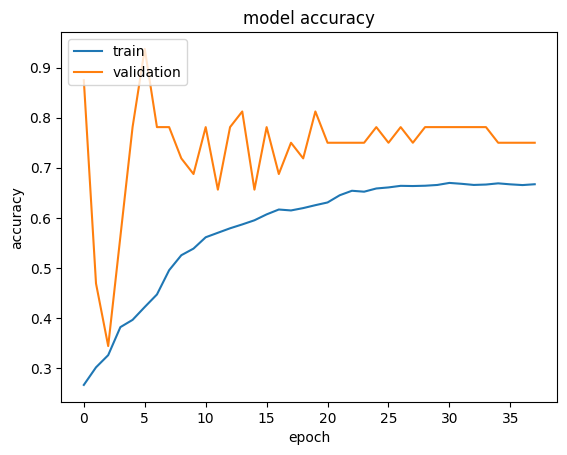

In [62]:
plt.plot(history_complex.history["accuracy"])
plt.plot(history_complex.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the Model on Test Set**


In [63]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = model_complex.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 0s - loss: 0.4865 - accuracy: 0.8125

4/4 [==============================] - 0s 8ms/step - loss: 0.7189 - accuracy: 0.6875


Loss: 0.7188981771469116, Accuracy: 0.6875


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


              precision    recall  f1-score   support

       happy       0.79      0.81      0.80        32
     neutral       0.55      0.69      0.61        32
         sad       0.56      0.44      0.49        32
    surprise       0.87      0.81      0.84        32

    accuracy                           0.69       128
   macro avg       0.69      0.69      0.69       128
weighted avg       0.69      0.69      0.69       128



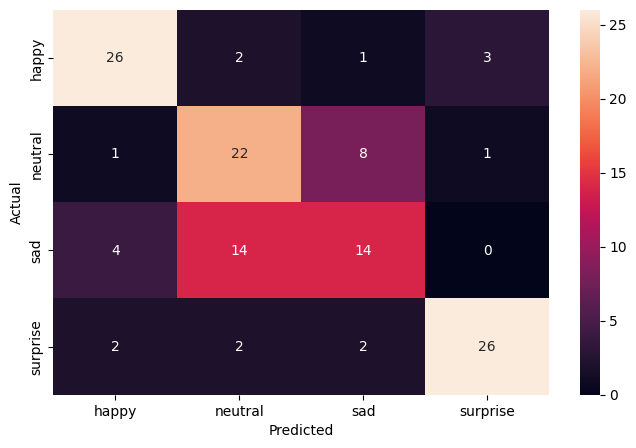

In [64]:
pred_probabilities = model_complex.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:\_\_**


### **Plotting the Confusion Matrix for the chosen final model**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


              precision    recall  f1-score   support

       happy       0.79      0.81      0.80        32
     neutral       0.55      0.69      0.61        32
         sad       0.56      0.44      0.49        32
    surprise       0.87      0.81      0.84        32

    accuracy                           0.69       128
   macro avg       0.69      0.69      0.69       128
weighted avg       0.69      0.69      0.69       128



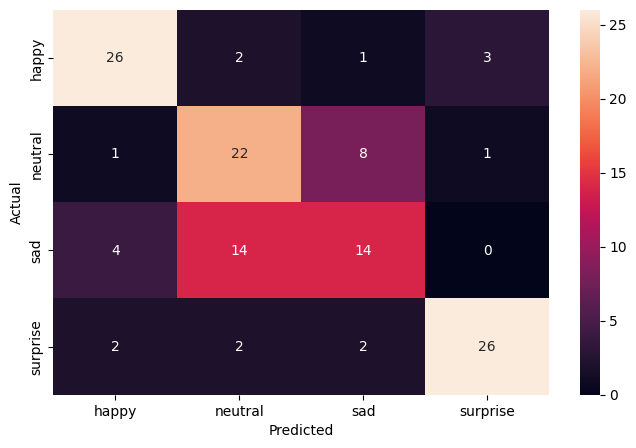

In [65]:
pred_probabilities = model_complex.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:\_\_**


## **Conclusion:\*\***\_\_\_\_**\*\***


### **Insights**

### **Refined insights**:

- What are the most meaningful insights from the data relevant to the problem?

### **Comparison of various techniques and their relative performance**:

- How do different techniques perform? Which one is performing relatively better? Is there scope to improve the performance further?

### **Proposal for the final solution design**:

- What model do you propose to be adopted? Why is this the best solution to adopt?
